# Starbucks Capstone Challenge

### Introduction

This data set contains simulated data that mimics customer behavior on the Starbucks rewards mobile app. Once every few days, Starbucks sends out an offer to users of the mobile app. An offer can be merely an advertisement for a drink or an actual offer such as a discount or BOGO (buy one get one free). Some users might not receive any offer during certain weeks. 

Not all users receive the same offer, and that is the challenge to solve with this data set.

Your task is to combine transaction, demographic and offer data to determine which demographic groups respond best to which offer type. This data set is a simplified version of the real Starbucks app because the underlying simulator only has one product whereas Starbucks actually sells dozens of products.

Every offer has a validity period before the offer expires. As an example, a BOGO offer might be valid for only 5 days. You'll see in the data set that informational offers have a validity period even though these ads are merely providing information about a product; for example, if an informational offer has 7 days of validity, you can assume the customer is feeling the influence of the offer for 7 days after receiving the advertisement.

You'll be given transactional data showing user purchases made on the app including the timestamp of purchase and the amount of money spent on a purchase. This transactional data also has a record for each offer that a user receives as well as a record for when a user actually views the offer. There are also records for when a user completes an offer. 

Keep in mind as well that someone using the app might make a purchase through the app without having received an offer or seen an offer.

### Example

To give an example, a user could receive a discount offer buy 10 dollars get 2 off on Monday. The offer is valid for 10 days from receipt. If the customer accumulates at least 10 dollars in purchases during the validity period, the customer completes the offer.

However, there are a few things to watch out for in this data set. Customers do not opt into the offers that they receive; in other words, a user can receive an offer, never actually view the offer, and still complete the offer. For example, a user might receive the "buy 10 dollars get 2 dollars off offer", but the user never opens the offer during the 10 day validity period. The customer spends 15 dollars during those ten days. There will be an offer completion record in the data set; however, the customer was not influenced by the offer because the customer never viewed the offer.

### Cleaning

This makes data cleaning especially important and tricky.

You'll also want to take into account that some demographic groups will make purchases even if they don't receive an offer. From a business perspective, if a customer is going to make a 10 dollar purchase without an offer anyway, you wouldn't want to send a buy 10 dollars get 2 dollars off offer. You'll want to try to assess what a certain demographic group will buy when not receiving any offers.

### Final Advice

Because this is a capstone project, you are free to analyze the data any way you see fit. For example, you could build a machine learning model that predicts how much someone will spend based on demographics and offer type. Or you could build a model that predicts whether or not someone will respond to an offer. Or, you don't need to build a machine learning model at all. You could develop a set of heuristics that determine what offer you should send to each customer (i.e., 75 percent of women customers who were 35 years old responded to offer A vs 40 percent from the same demographic to offer B, so send offer A).

# Data Sets

The data is contained in three files:

* portfolio.json - containing offer ids and meta data about each offer (duration, type, etc.)
* profile.json - demographic data for each customer
* transcript.json - records for transactions, offers received, offers viewed, and offers completed

Here is the schema and explanation of each variable in the files:

**portfolio.json**
* id (string) - offer id
* offer_type (string) - type of offer ie BOGO, discount, informational
* difficulty (int) - minimum required spend to complete an offer
* reward (int) - reward given for completing an offer
* duration (int) - time for offer to be open, in days
* channels (list of strings)

**profile.json**
* age (int) - age of the customer 
* became_member_on (int) - date when customer created an app account
* gender (str) - gender of the customer (note some entries contain 'O' for other rather than M or F)
* id (str) - customer id
* income (float) - customer's income

**transcript.json**
* event (str) - record description (ie transaction, offer received, offer viewed, etc.)
* person (str) - customer id
* time (int) - time in hours since start of test. The data begins at time t=0
* value - (dict of strings) - either an offer id or transaction amount depending on the record

**Note:** If you are using the workspace, you will need to go to the terminal and run the command `conda update pandas` before reading in the files. This is because the version of pandas in the workspace cannot read in the transcript.json file correctly, but the newest version of pandas can. You can access the termnal from the orange icon in the top left of this notebook.  

You can see how to access the terminal and how the install works using the two images below.  First you need to access the terminal:

<img src="pic1.png"/>

Then you will want to run the above command:

<img src="pic2.png"/>

Finally, when you enter back into the notebook (use the jupyter icon again), you should be able to run the below cell without any errors.

# Notes before starting 

#### Not all users receive the same offer, and that is the challenge to solve with this data set.
#### Should know which demographic groups respond best to which offer type.
#### Offer has an expiry date, should be redeemed before this date
#### Customers can redeem the offer even if they didn't view the offer, that means offer didn't affect their purachse decision
#### Some customer purchase without receiving an offer.

#### Machine learning model that predicts how much someone will spend based on demographics and offer type. 
#### A model that predicts whether or not someone will respond to an offer.
#### Develop a set of heuristics that determine what offer you should send to each customer (i.e., 75 percent of women customers who were 35 years old responded to offer A vs 40 percent from the same demographic to offer B, so send offer A).


# Import needed libraries

In [61]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import json
%matplotlib inline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import fbeta_score, accuracy_score, recall_score, precision_score
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.model_selection import RandomizedSearchCV

In [2]:
pd.options.display.max_columns = 500

In [228]:
# read in the json files
portfolio = pd.read_json('data/portfolio.json', orient='records', lines=True)
profile = pd.read_json('data/profile.json', orient='records', lines=True)
transcript = pd.read_json('data/transcript.json', orient='records', lines=True)

# 1- Exploring the data

### portfolio

In [457]:
portfolio

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1
5,3,7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1,1,1,1
6,2,10,10,discount,fafdcd668e3743c1bb461111dcafc2a4,1,1,1,1
7,0,0,3,informational,5a8bc65990b245e5a138643cd4eb9837,1,1,1,0
8,5,5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1,1,1,1
9,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1


In [4]:
portfolio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   reward      10 non-null     int64 
 1   channels    10 non-null     object
 2   difficulty  10 non-null     int64 
 3   duration    10 non-null     int64 
 4   offer_type  10 non-null     object
 5   id          10 non-null     object
dtypes: int64(3), object(3)
memory usage: 608.0+ bytes


In [5]:
portfolio['channels'].apply(pd.Series)

,0,1,2,3
0,email,mobile,social,NaN
1,web,email,mobile,social
2,web,email,mobile,NaN
3,web,email,mobile,NaN
4,web,email,NaN,NaN
5,web,email,mobile,social
6,web,email,mobile,social
7,email,mobile,social,NaN
8,web,email,mobile,social
9,web,email,mobile,NaN


In [6]:
dummy = pd.get_dummies(portfolio.channels.apply(pd.Series).stack()).sum(level=0)
portfolio = pd.concat([portfolio, dummy], axis=1)
portfolio = portfolio.drop(columns='channels')

C:\Users\minas\AppData\Local\Temp\ipykernel_17088\983269148.py:1: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  dummy = pd.get_dummies(portfolio.channels.apply(pd.Series).stack()).sum(level=0)


In [7]:
portfolio

,reward,difficulty,duration,offer_type,id,email,mobile,social,web
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1
5,3,7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1,1,1,1
6,2,10,10,discount,fafdcd668e3743c1bb461111dcafc2a4,1,1,1,1
7,0,0,3,informational,5a8bc65990b245e5a138643cd4eb9837,1,1,1,0
8,5,5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1,1,1,1
9,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1


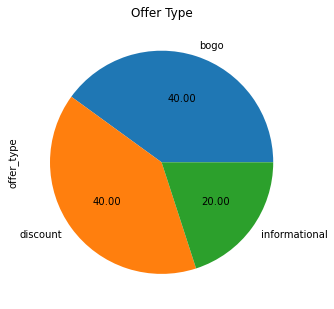

In [8]:
portfolio.offer_type.value_counts().plot(kind='pie', figsize=(5,10), autopct="%0.2f", title="Offer Type");


D:\Data_Science\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

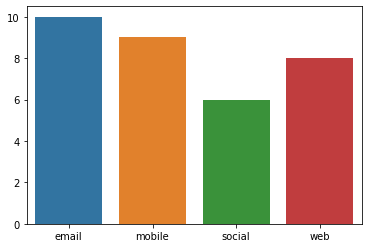

In [9]:
offers = [portfolio.email.sum(),portfolio.mobile.sum(),portfolio.social.sum(),portfolio.web.sum()]
offers_names = ['email','mobile','social','web']

sns.barplot(offers_names,offers)

        

There are 6 columns and 10 types of offers that we will be working with,no null values, no further processing needed for this file, 
all campaigns were sent via email


### profile

In [229]:
profile.head()

,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [10]:
profile.head(),profile.info(),profile.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            14825 non-null  object 
 1   age               17000 non-null  int64  
 2   id                17000 non-null  object 
 3   became_member_on  17000 non-null  int64  
 4   income            14825 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 664.2+ KB


(  gender  age                                id  became_member_on    income
 0   None  118  68be06ca386d4c31939f3a4f0e3dd783          20170212       NaN
 1      F   55  0610b486422d4921ae7d2bf64640c50b          20170715  112000.0
 2   None  118  38fe809add3b4fcf9315a9694bb96ff5          20180712       NaN
 3      F   75  78afa995795e4d85b5d9ceeca43f5fef          20170509  100000.0
 4   None  118  a03223e636434f42ac4c3df47e8bac43          20170804       NaN,
 None,
                 age  became_member_on         income
 count  17000.000000      1.700000e+04   14825.000000
 mean      62.531412      2.016703e+07   65404.991568
 std       26.738580      1.167750e+04   21598.299410
 min       18.000000      2.013073e+07   30000.000000
 25%       45.000000      2.016053e+07   49000.000000
 50%       58.000000      2.017080e+07   64000.000000
 75%       73.000000      2.017123e+07   80000.000000
 max      118.000000      2.018073e+07  120000.000000)

We have missing data, these data are for age 118, which repesents missing, also it's missing gender and income, but data will be cleaned later after the basic analysis

D:\Data_Science\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


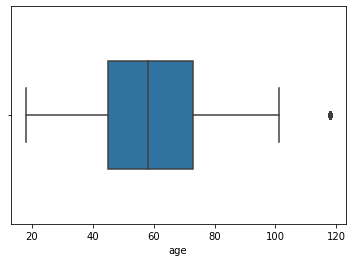

In [11]:
sns.boxplot(profile['age'], width=0.5);


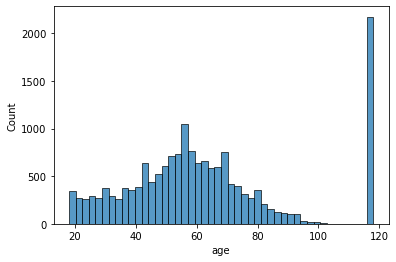

In [12]:
sns.histplot(profile['age']);

<AxesSubplot:ylabel='gender'>

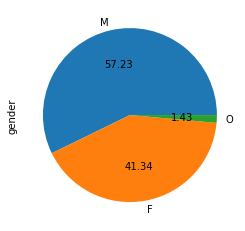

In [13]:
profile['gender'].value_counts().plot(kind='pie',autopct="%0.2f")


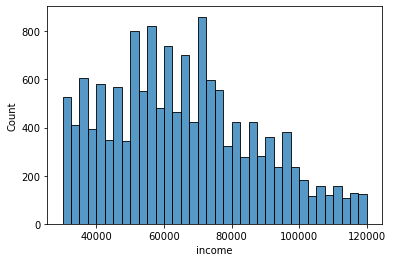

In [14]:
sns.histplot(profile['income']);

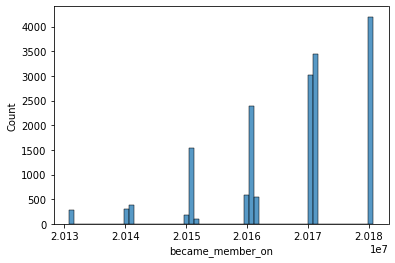

In [15]:
sns.histplot(profile['became_member_on']);

<AxesSubplot:title={'center':'customer age, gender'}, xlabel='age'>

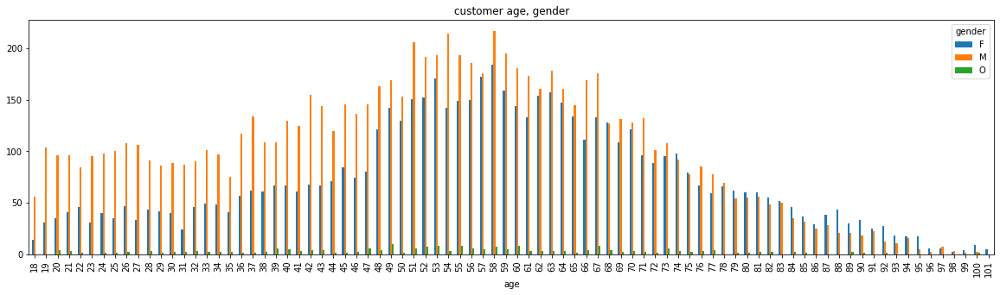

In [16]:
pd.crosstab(profile.age,profile.gender).plot(kind='bar',  figsize=(20,5), title='customer age, gender')

<AxesSubplot:title={'center':'customer age by gender'}, xlabel='income'>

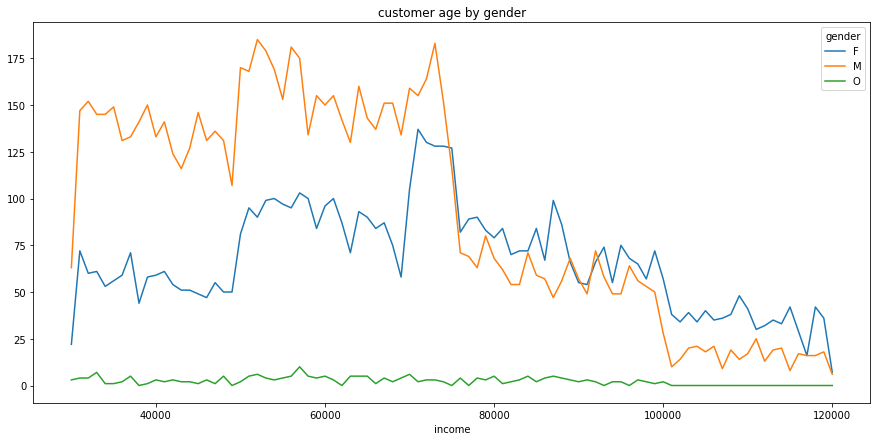

In [17]:
pd.crosstab(profile.income,profile.gender).plot(kind="line",  figsize = (15,7), title='customer age by gender')


some data need to be cleaned after getting the success ratio of the promotions

### transcript

In [230]:
transcript.head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [18]:
transcript.head(),transcript.info(),transcript.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306534 entries, 0 to 306533
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   person  306534 non-null  object
 1   event   306534 non-null  object
 2   value   306534 non-null  object
 3   time    306534 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 9.4+ MB


(                             person           event  \
 0  78afa995795e4d85b5d9ceeca43f5fef  offer received   
 1  a03223e636434f42ac4c3df47e8bac43  offer received   
 2  e2127556f4f64592b11af22de27a7932  offer received   
 3  8ec6ce2a7e7949b1bf142def7d0e0586  offer received   
 4  68617ca6246f4fbc85e91a2a49552598  offer received   
 
                                               value  time  
 0  {'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'}     0  
 1  {'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'}     0  
 2  {'offer id': '2906b810c7d4411798c6938adc9daaa5'}     0  
 3  {'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'}     0  
 4  {'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'}     0  ,
 None,
                 time
 count  306534.000000
 mean      366.382940
 std       200.326314
 min         0.000000
 25%       186.000000
 50%       408.000000
 75%       528.000000
 max       714.000000)

In [19]:
transcript = pd.concat([transcript, transcript['value'].apply(pd.Series)], axis=1)
transcript['clean_id'] = np.where(transcript['offer id'].isnull() & transcript['offer_id'].notnull(), transcript['offer_id'],transcript['offer id'])
transcript.drop(['offer id', 'offer_id'], axis=1, inplace=True)
transcript.rename(columns={'clean_id': 'offer_id'}, inplace=True)
     

In [20]:
transcript.drop(['value'], inplace=True, axis = 1)

In [21]:
transcript.head()

,person,event,time,amount,reward,offer_id
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,NaN,NaN,9b98b8c7a33c4b65b9aebfe6a799e6d9
1,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,0b1e1539f2cc45b7b9fa7c272da2e1d7
2,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,2906b810c7d4411798c6938adc9daaa5
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,fafdcd668e3743c1bb461111dcafc2a4
4,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,4d5c57ea9a6940dd891ad53e9dbe8da0


# 2- Clean and merge the data

In [22]:
portfolio.rename(columns={'id':'offer_id'},inplace=True)

In [23]:
portfolio.rename(columns={'reward':'offer_reward', 'difficulty':'offer_difficulty', 'duration':'offer_duration', 
                         'email':'channel_email','mobile':'channel_mobile','social':'channel_social','web':'channel_web'},inplace=True)

In [41]:
portfolio

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1
5,3,7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1,1,1,1
6,2,10,10,discount,fafdcd668e3743c1bb461111dcafc2a4,1,1,1,1
7,0,0,3,informational,5a8bc65990b245e5a138643cd4eb9837,1,1,1,0
8,5,5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1,1,1,1
9,2,10,7,discount,2906b810c7d4411798c6938adc9daaa5,1,1,0,1


In [24]:
profile.rename(columns={'id':'customer_id'}, inplace=True)

In [25]:
transcript.rename(columns={'person':'customer_id'}, inplace=True)

In [26]:
profile['became_member_on'] = pd.to_datetime(profile['became_member_on'], format='%Y%m%d')
profile.rename(columns={'became_member_on':'member_year'}, inplace=True)

In [27]:
merged_df = pd.merge(portfolio,transcript,on='offer_id', how='right')

In [28]:
merged_df = pd.merge (merged_df,profile, on = 'customer_id', how = 'left')

### Now data is merged and ready for analysis

before we dig deeper into machine learning, we need to find how effective were the campaigns

In [29]:
merged_df.head()

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,amount,reward,gender,age,member_year,income
0,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,NaN,NaN,F,75,2017-05-09,100000.0
1,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,None,118,2017-08-04,NaN
2,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,M,68,2018-04-26,70000.0
3,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,None,118,2017-09-25,NaN
4,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,None,118,2017-10-02,NaN


In [30]:
merged_df.rename(columns={'amount':'paid_amount','reward':'gained_amount'},inplace= True)

In [31]:
merged_df['member_year']=merged_df['member_year'].dt.year

In [32]:
off_unique = list(merged_df[merged_df['event']=='offer received']['customer_id'].unique())

In [33]:
merged_df = merged_df[merged_df['customer_id'].isin (off_unique)]

only 6 customers didn't recieve an offer and bought anyway, it's better to drop them to get the right percentage

In [34]:
merged_df[merged_df['event']=='transaction']

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income
12654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,02c083884c7d45b39cc68e1314fec56c,transaction,0,0.83,NaN,F,20,2016,30000.0
12657,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,0,34.56,NaN,M,42,2016,96000.0
12659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54890f68699049c2a04d415abc25e717,transaction,0,13.23,NaN,M,36,2017,56000.0
12670,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b2f1cd155b864803ad8334cdf13c4bd2,transaction,0,19.51,NaN,F,55,2017,94000.0
12671,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fe97aa22dd3e48c8b143116a8403dd52,transaction,0,18.97,NaN,F,39,2017,67000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306529,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,NaN,M,66,2018,47000.0
306530,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,NaN,M,52,2018,62000.0
306531,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,NaN,F,63,2013,52000.0
306532,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53,NaN,M,57,2016,40000.0


In [35]:
merged_df.to_csv('merged_df.csv')

### Dataset saved,  now starting the analysis 

In [11]:
new_merged = pd.read_csv('merged_df.csv')

In [4]:
new_merged.shape

(306514, 19)

In [5]:
new_merged.drop(columns ='Unnamed: 0',inplace=True)

In [7]:
new_merged.shape

(306514, 18)

In [9]:
new_merged[new_merged.duplicated()]

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income
66121,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,3dde94fa581145cb9f206624f1a94d5a,offer completed,168,NaN,2.0,F,51,2017,56000.0
66781,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,e9fb6ed2cecb4980ba98c86abc9c91e3,offer completed,168,NaN,10.0,M,78,2015,55000.0
67612,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,a7dc060f6fc94ca7bf71fbb188187dca,offer completed,168,NaN,5.0,O,60,2017,69000.0
68560,3.0,7.0,7.0,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1.0,1.0,1.0,1.0,30478a4c1e884a63a822aa87b833ed7a,offer completed,168,NaN,3.0,F,73,2017,74000.0
69216,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,84fb57a7fe8045a8bf6236738ee73a0f,offer completed,168,NaN,10.0,F,64,2017,113000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297605,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,6ba2450a438540999e633a5d99c7c7a0,offer completed,672,NaN,5.0,M,28,2015,61000.0
299451,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,f39fe7ea4e5946378e6d224504b77797,offer completed,684,NaN,5.0,F,54,2017,98000.0
304736,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,0785f1fce0b04ba08e01c7d2ebab4917,offer completed,708,NaN,5.0,F,51,2017,78000.0
305531,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,b7e216b6472b46648272c29a52a86702,offer completed,714,NaN,2.0,M,53,2018,113000.0


In [11]:
new_merged[new_merged.duplicated(keep=False)].head()

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income
66120,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,3dde94fa581145cb9f206624f1a94d5a,offer completed,168,NaN,2.0,F,51,2017,56000.0
66121,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,3dde94fa581145cb9f206624f1a94d5a,offer completed,168,NaN,2.0,F,51,2017,56000.0
66780,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,e9fb6ed2cecb4980ba98c86abc9c91e3,offer completed,168,NaN,10.0,M,78,2015,55000.0
66781,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,e9fb6ed2cecb4980ba98c86abc9c91e3,offer completed,168,NaN,10.0,M,78,2015,55000.0
67611,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,a7dc060f6fc94ca7bf71fbb188187dca,offer completed,168,NaN,5.0,O,60,2017,69000.0


There are 397 that are exactly the same, all completed offers, while they received offer only one time, the transaction related to it, does not qualify to 2 offers, percentage of duplicate lines are so small, so it will be dropped


In [12]:
new_merged.drop_duplicates(inplace= True)
new_merged.shape

(306117, 18)

In [13]:
intervals = [
    (new_merged['time'] <= 167),
    (new_merged['time'] > 167) & (new_merged['time'] <= 335),
    (new_merged['time'] > 335) & (new_merged['time'] <= 407),
    (new_merged['time'] > 407) & (new_merged['time'] <= 503),
    (new_merged['time'] > 503) & (new_merged['time'] <= 575),
    (new_merged['time'] > 575)
    ]
values = ['camp1', 'camp2', 'camp3', 'camp4','camp5','camp6']

new_merged['offer interval']  =  np.select(intervals, values)

In [14]:
pd.pivot_table (new_merged, values=['time'], index=['customer_id','offer interval'], columns='event', aggfunc='count').max()

      event          
time  offer completed     4.0
      offer received      1.0
      offer viewed        1.0
      transaction        14.0
dtype: float64

No customer recieved more than 1 offer every offer interval

In [12]:
unique_customers= new_merged.customer_id.unique()

In [27]:
merged_1 = new_merged.copy()

In [77]:
# Merging the transactions that are associated with offer completed
def remove_dup_offers (df, unique_customers):
    x = 0
    for customer_id in unique_customers:
        x +=1
        print (' X = ', x)
        customer = df.loc[(df['customer_id']== customer_id)]
        print('This customer shape is ',customer.shape)
        #customer_same_time = customer.duplicated(subset=['time'], keep=False)
        current_customer = customer[customer.duplicated(subset=['time'], keep=False)]
        #print("Duplicated customer shape is " , current_customer.shape)
        for i in range(current_customer.shape[0]):
            #print (current_customer.shape)
            #print( current_customer['event'])
            if i+1 == current_customer.shape[0]:
                break
            else:
                #print(current_customer.iloc[i]['event'], current_customer.iloc[i+1]['event'])
                #print(i)
                if (current_customer.iloc[i+1]['time'] == current_customer.iloc[i]['time']) & (current_customer.iloc[i+1]['event'] == 'offer completed') & (current_customer.iloc[i]['event'] == 'transaction'):
     #               print('check is done, now changing the values')
                    df.loc[df.index == current_customer.iloc[i+1:i+2,].index[0], 'paid_amount']=  current_customer.iloc[i]['paid_amount']
     #               print('check is done, now dropping')
                    df.drop(current_customer.index[i],inplace = True)
                    #print('Transaction row is dropped')
        if x % 170 == 0:
            print (f"{x/unique_customers.shape[0]:.0%}")


In [81]:
remove_dup_offers (merged_1, unique_customers)

 X =  1
This customer shape is  (16, 19)
 X =  2
This customer shape is  (11, 19)
 X =  3
This customer shape is  (11, 19)
 X =  4
This customer shape is  (10, 19)
 X =  5
This customer shape is  (11, 19)
 X =  6
This customer shape is  (17, 19)
 X =  7
This customer shape is  (15, 19)
 X =  8
This customer shape is  (9, 19)
 X =  9
This customer shape is  (16, 19)
 X =  10
This customer shape is  (19, 19)
 X =  11
This customer shape is  (15, 19)
 X =  12
This customer shape is  (18, 19)
 X =  13
This customer shape is  (16, 19)
 X =  14
This customer shape is  (20, 19)
 X =  15
This customer shape is  (15, 19)
 X =  16
This customer shape is  (13, 19)
 X =  17
This customer shape is  (17, 19)
 X =  18
This customer shape is  (25, 19)
 X =  19
This customer shape is  (24, 19)
 X =  20
This customer shape is  (19, 19)
 X =  21
This customer shape is  (12, 19)
 X =  22
This customer shape is  (24, 19)
 X =  23
This customer shape is  (26, 19)
 X =  24
This customer shape is  (12, 19)
 X

This customer shape is  (16, 19)
 X =  197
This customer shape is  (17, 19)
 X =  198
This customer shape is  (17, 19)
 X =  199
This customer shape is  (24, 19)
 X =  200
This customer shape is  (19, 19)
 X =  201
This customer shape is  (19, 19)
 X =  202
This customer shape is  (18, 19)
 X =  203
This customer shape is  (12, 19)
 X =  204
This customer shape is  (22, 19)
 X =  205
This customer shape is  (22, 19)
 X =  206
This customer shape is  (13, 19)
 X =  207
This customer shape is  (16, 19)
 X =  208
This customer shape is  (10, 19)
 X =  209
This customer shape is  (20, 19)
 X =  210
This customer shape is  (32, 19)
 X =  211
This customer shape is  (14, 19)
 X =  212
This customer shape is  (20, 19)
 X =  213
This customer shape is  (10, 19)
 X =  214
This customer shape is  (20, 19)
 X =  215
This customer shape is  (22, 19)
 X =  216
This customer shape is  (10, 19)
 X =  217
This customer shape is  (17, 19)
 X =  218
This customer shape is  (15, 19)
 X =  219
This custom

This customer shape is  (14, 19)
 X =  401
This customer shape is  (23, 19)
 X =  402
This customer shape is  (31, 19)
 X =  403
This customer shape is  (15, 19)
 X =  404
This customer shape is  (21, 19)
 X =  405
This customer shape is  (21, 19)
 X =  406
This customer shape is  (20, 19)
 X =  407
This customer shape is  (19, 19)
 X =  408
This customer shape is  (8, 19)
 X =  409
This customer shape is  (14, 19)
 X =  410
This customer shape is  (22, 19)
 X =  411
This customer shape is  (21, 19)
 X =  412
This customer shape is  (9, 19)
 X =  413
This customer shape is  (16, 19)
 X =  414
This customer shape is  (9, 19)
 X =  415
This customer shape is  (16, 19)
 X =  416
This customer shape is  (17, 19)
 X =  417
This customer shape is  (24, 19)
 X =  418
This customer shape is  (11, 19)
 X =  419
This customer shape is  (11, 19)
 X =  420
This customer shape is  (15, 19)
 X =  421
This customer shape is  (22, 19)
 X =  422
This customer shape is  (13, 19)
 X =  423
This customer 

This customer shape is  (9, 19)
 X =  603
This customer shape is  (26, 19)
 X =  604
This customer shape is  (13, 19)
 X =  605
This customer shape is  (17, 19)
 X =  606
This customer shape is  (19, 19)
 X =  607
This customer shape is  (16, 19)
 X =  608
This customer shape is  (15, 19)
 X =  609
This customer shape is  (7, 19)
 X =  610
This customer shape is  (18, 19)
 X =  611
This customer shape is  (19, 19)
 X =  612
This customer shape is  (15, 19)
 X =  613
This customer shape is  (25, 19)
 X =  614
This customer shape is  (18, 19)
 X =  615
This customer shape is  (16, 19)
 X =  616
This customer shape is  (12, 19)
 X =  617
This customer shape is  (9, 19)
 X =  618
This customer shape is  (10, 19)
 X =  619
This customer shape is  (17, 19)
 X =  620
This customer shape is  (16, 19)
 X =  621
This customer shape is  (28, 19)
 X =  622
This customer shape is  (22, 19)
 X =  623
This customer shape is  (17, 19)
 X =  624
This customer shape is  (20, 19)
 X =  625
This customer 

This customer shape is  (7, 19)
 X =  802
This customer shape is  (15, 19)
 X =  803
This customer shape is  (25, 19)
 X =  804
This customer shape is  (12, 19)
 X =  805
This customer shape is  (20, 19)
 X =  806
This customer shape is  (23, 19)
 X =  807
This customer shape is  (16, 19)
 X =  808
This customer shape is  (13, 19)
 X =  809
This customer shape is  (15, 19)
 X =  810
This customer shape is  (24, 19)
 X =  811
This customer shape is  (13, 19)
 X =  812
This customer shape is  (17, 19)
 X =  813
This customer shape is  (9, 19)
 X =  814
This customer shape is  (16, 19)
 X =  815
This customer shape is  (27, 19)
 X =  816
This customer shape is  (13, 19)
 X =  817
This customer shape is  (24, 19)
 X =  818
This customer shape is  (14, 19)
 X =  819
This customer shape is  (14, 19)
 X =  820
This customer shape is  (17, 19)
 X =  821
This customer shape is  (8, 19)
 X =  822
This customer shape is  (13, 19)
 X =  823
This customer shape is  (23, 19)
 X =  824
This customer 

This customer shape is  (18, 19)
 X =  995
This customer shape is  (13, 19)
 X =  996
This customer shape is  (17, 19)
 X =  997
This customer shape is  (9, 19)
 X =  998
This customer shape is  (18, 19)
 X =  999
This customer shape is  (9, 19)
 X =  1000
This customer shape is  (25, 19)
 X =  1001
This customer shape is  (22, 19)
 X =  1002
This customer shape is  (18, 19)
 X =  1003
This customer shape is  (17, 19)
 X =  1004
This customer shape is  (16, 19)
 X =  1005
This customer shape is  (22, 19)
 X =  1006
This customer shape is  (15, 19)
 X =  1007
This customer shape is  (11, 19)
 X =  1008
This customer shape is  (32, 19)
 X =  1009
This customer shape is  (22, 19)
 X =  1010
This customer shape is  (15, 19)
 X =  1011
This customer shape is  (20, 19)
 X =  1012
This customer shape is  (11, 19)
 X =  1013
This customer shape is  (8, 19)
 X =  1014
This customer shape is  (15, 19)
 X =  1015
This customer shape is  (13, 19)
 X =  1016
This customer shape is  (16, 19)
 X =  1

This customer shape is  (17, 19)
 X =  1193
This customer shape is  (23, 19)
 X =  1194
This customer shape is  (26, 19)
 X =  1195
This customer shape is  (18, 19)
 X =  1196
This customer shape is  (10, 19)
 X =  1197
This customer shape is  (14, 19)
 X =  1198
This customer shape is  (22, 19)
 X =  1199
This customer shape is  (18, 19)
 X =  1200
This customer shape is  (11, 19)
 X =  1201
This customer shape is  (16, 19)
 X =  1202
This customer shape is  (18, 19)
 X =  1203
This customer shape is  (18, 19)
 X =  1204
This customer shape is  (15, 19)
 X =  1205
This customer shape is  (13, 19)
 X =  1206
This customer shape is  (12, 19)
 X =  1207
This customer shape is  (14, 19)
 X =  1208
This customer shape is  (26, 19)
 X =  1209
This customer shape is  (23, 19)
 X =  1210
This customer shape is  (14, 19)
 X =  1211
This customer shape is  (18, 19)
 X =  1212
This customer shape is  (17, 19)
 X =  1213
This customer shape is  (23, 19)
 X =  1214
This customer shape is  (14, 19)

This customer shape is  (30, 19)
 X =  1396
This customer shape is  (16, 19)
 X =  1397
This customer shape is  (22, 19)
 X =  1398
This customer shape is  (18, 19)
 X =  1399
This customer shape is  (19, 19)
 X =  1400
This customer shape is  (12, 19)
 X =  1401
This customer shape is  (28, 19)
 X =  1402
This customer shape is  (12, 19)
 X =  1403
This customer shape is  (28, 19)
 X =  1404
This customer shape is  (12, 19)
 X =  1405
This customer shape is  (19, 19)
 X =  1406
This customer shape is  (12, 19)
 X =  1407
This customer shape is  (22, 19)
 X =  1408
This customer shape is  (12, 19)
 X =  1409
This customer shape is  (12, 19)
 X =  1410
This customer shape is  (23, 19)
 X =  1411
This customer shape is  (12, 19)
 X =  1412
This customer shape is  (14, 19)
 X =  1413
This customer shape is  (14, 19)
 X =  1414
This customer shape is  (17, 19)
 X =  1415
This customer shape is  (28, 19)
 X =  1416
This customer shape is  (17, 19)
 X =  1417
This customer shape is  (11, 19)

This customer shape is  (13, 19)
 X =  1587
This customer shape is  (16, 19)
 X =  1588
This customer shape is  (13, 19)
 X =  1589
This customer shape is  (9, 19)
 X =  1590
This customer shape is  (14, 19)
 X =  1591
This customer shape is  (9, 19)
 X =  1592
This customer shape is  (16, 19)
 X =  1593
This customer shape is  (22, 19)
 X =  1594
This customer shape is  (20, 19)
 X =  1595
This customer shape is  (19, 19)
 X =  1596
This customer shape is  (25, 19)
 X =  1597
This customer shape is  (16, 19)
 X =  1598
This customer shape is  (20, 19)
 X =  1599
This customer shape is  (16, 19)
 X =  1600
This customer shape is  (23, 19)
 X =  1601
This customer shape is  (22, 19)
 X =  1602
This customer shape is  (14, 19)
 X =  1603
This customer shape is  (20, 19)
 X =  1604
This customer shape is  (19, 19)
 X =  1605
This customer shape is  (15, 19)
 X =  1606
This customer shape is  (14, 19)
 X =  1607
This customer shape is  (10, 19)
 X =  1608
This customer shape is  (22, 19)
 

This customer shape is  (10, 19)
 X =  1778
This customer shape is  (10, 19)
 X =  1779
This customer shape is  (22, 19)
 X =  1780
This customer shape is  (11, 19)
 X =  1781
This customer shape is  (21, 19)
 X =  1782
This customer shape is  (7, 19)
 X =  1783
This customer shape is  (32, 19)
 X =  1784
This customer shape is  (23, 19)
 X =  1785
This customer shape is  (13, 19)
 X =  1786
This customer shape is  (18, 19)
 X =  1787
This customer shape is  (12, 19)
 X =  1788
This customer shape is  (6, 19)
 X =  1789
This customer shape is  (15, 19)
 X =  1790
This customer shape is  (21, 19)
 X =  1791
This customer shape is  (11, 19)
 X =  1792
This customer shape is  (16, 19)
 X =  1793
This customer shape is  (21, 19)
 X =  1794
This customer shape is  (11, 19)
 X =  1795
This customer shape is  (13, 19)
 X =  1796
This customer shape is  (10, 19)
 X =  1797
This customer shape is  (27, 19)
 X =  1798
This customer shape is  (11, 19)
 X =  1799
This customer shape is  (12, 19)
 

This customer shape is  (7, 19)
 X =  1967
This customer shape is  (16, 19)
 X =  1968
This customer shape is  (12, 19)
 X =  1969
This customer shape is  (25, 19)
 X =  1970
This customer shape is  (20, 19)
 X =  1971
This customer shape is  (18, 19)
 X =  1972
This customer shape is  (20, 19)
 X =  1973
This customer shape is  (16, 19)
 X =  1974
This customer shape is  (18, 19)
 X =  1975
This customer shape is  (14, 19)
 X =  1976
This customer shape is  (24, 19)
 X =  1977
This customer shape is  (13, 19)
 X =  1978
This customer shape is  (21, 19)
 X =  1979
This customer shape is  (11, 19)
 X =  1980
This customer shape is  (22, 19)
 X =  1981
This customer shape is  (12, 19)
 X =  1982
This customer shape is  (18, 19)
 X =  1983
This customer shape is  (16, 19)
 X =  1984
This customer shape is  (25, 19)
 X =  1985
This customer shape is  (9, 19)
 X =  1986
This customer shape is  (11, 19)
 X =  1987
This customer shape is  (13, 19)
 X =  1988
This customer shape is  (15, 19)
 

This customer shape is  (21, 19)
 X =  2158
This customer shape is  (11, 19)
 X =  2159
This customer shape is  (28, 19)
 X =  2160
This customer shape is  (19, 19)
 X =  2161
This customer shape is  (21, 19)
 X =  2162
This customer shape is  (24, 19)
 X =  2163
This customer shape is  (16, 19)
 X =  2164
This customer shape is  (19, 19)
 X =  2165
This customer shape is  (13, 19)
 X =  2166
This customer shape is  (15, 19)
 X =  2167
This customer shape is  (14, 19)
 X =  2168
This customer shape is  (13, 19)
 X =  2169
This customer shape is  (26, 19)
 X =  2170
This customer shape is  (13, 19)
 X =  2171
This customer shape is  (13, 19)
 X =  2172
This customer shape is  (8, 19)
 X =  2173
This customer shape is  (28, 19)
 X =  2174
This customer shape is  (15, 19)
 X =  2175
This customer shape is  (15, 19)
 X =  2176
This customer shape is  (30, 19)
 X =  2177
This customer shape is  (11, 19)
 X =  2178
This customer shape is  (11, 19)
 X =  2179
This customer shape is  (17, 19)


This customer shape is  (24, 19)
 X =  2356
This customer shape is  (15, 19)
 X =  2357
This customer shape is  (7, 19)
 X =  2358
This customer shape is  (21, 19)
 X =  2359
This customer shape is  (18, 19)
 X =  2360
This customer shape is  (16, 19)
 X =  2361
This customer shape is  (30, 19)
 X =  2362
This customer shape is  (21, 19)
 X =  2363
This customer shape is  (22, 19)
 X =  2364
This customer shape is  (18, 19)
 X =  2365
This customer shape is  (13, 19)
 X =  2366
This customer shape is  (20, 19)
 X =  2367
This customer shape is  (17, 19)
 X =  2368
This customer shape is  (20, 19)
 X =  2369
This customer shape is  (23, 19)
 X =  2370
This customer shape is  (20, 19)
 X =  2371
This customer shape is  (15, 19)
 X =  2372
This customer shape is  (18, 19)
 X =  2373
This customer shape is  (10, 19)
 X =  2374
This customer shape is  (28, 19)
 X =  2375
This customer shape is  (15, 19)
 X =  2376
This customer shape is  (16, 19)
 X =  2377
This customer shape is  (21, 19)


This customer shape is  (15, 19)
 X =  2552
This customer shape is  (28, 19)
 X =  2553
This customer shape is  (9, 19)
 X =  2554
This customer shape is  (17, 19)
 X =  2555
This customer shape is  (27, 19)
 X =  2556
This customer shape is  (20, 19)
 X =  2557
This customer shape is  (9, 19)
 X =  2558
This customer shape is  (16, 19)
 X =  2559
This customer shape is  (8, 19)
 X =  2560
This customer shape is  (8, 19)
 X =  2561
This customer shape is  (29, 19)
 X =  2562
This customer shape is  (10, 19)
 X =  2563
This customer shape is  (11, 19)
 X =  2564
This customer shape is  (24, 19)
 X =  2565
This customer shape is  (17, 19)
 X =  2566
This customer shape is  (13, 19)
 X =  2567
This customer shape is  (15, 19)
 X =  2568
This customer shape is  (15, 19)
 X =  2569
This customer shape is  (10, 19)
 X =  2570
This customer shape is  (12, 19)
 X =  2571
This customer shape is  (18, 19)
 X =  2572
This customer shape is  (7, 19)
 X =  2573
This customer shape is  (14, 19)
 X =

This customer shape is  (42, 19)
 X =  2743
This customer shape is  (15, 19)
 X =  2744
This customer shape is  (15, 19)
 X =  2745
This customer shape is  (20, 19)
 X =  2746
This customer shape is  (10, 19)
 X =  2747
This customer shape is  (14, 19)
 X =  2748
This customer shape is  (8, 19)
 X =  2749
This customer shape is  (10, 19)
 X =  2750
This customer shape is  (14, 19)
 X =  2751
This customer shape is  (24, 19)
 X =  2752
This customer shape is  (14, 19)
 X =  2753
This customer shape is  (13, 19)
 X =  2754
This customer shape is  (13, 19)
 X =  2755
This customer shape is  (17, 19)
 X =  2756
This customer shape is  (11, 19)
 X =  2757
This customer shape is  (16, 19)
 X =  2758
This customer shape is  (25, 19)
 X =  2759
This customer shape is  (20, 19)
 X =  2760
This customer shape is  (11, 19)
 X =  2761
This customer shape is  (14, 19)
 X =  2762
This customer shape is  (16, 19)
 X =  2763
This customer shape is  (13, 19)
 X =  2764
This customer shape is  (9, 19)
 

This customer shape is  (29, 19)
 X =  2937
This customer shape is  (14, 19)
 X =  2938
This customer shape is  (31, 19)
 X =  2939
This customer shape is  (16, 19)
 X =  2940
This customer shape is  (14, 19)
 X =  2941
This customer shape is  (10, 19)
 X =  2942
This customer shape is  (4, 19)
 X =  2943
This customer shape is  (15, 19)
 X =  2944
This customer shape is  (18, 19)
 X =  2945
This customer shape is  (33, 19)
 X =  2946
This customer shape is  (8, 19)
 X =  2947
This customer shape is  (12, 19)
 X =  2948
This customer shape is  (13, 19)
 X =  2949
This customer shape is  (23, 19)
 X =  2950
This customer shape is  (14, 19)
 X =  2951
This customer shape is  (13, 19)
 X =  2952
This customer shape is  (27, 19)
 X =  2953
This customer shape is  (15, 19)
 X =  2954
This customer shape is  (14, 19)
 X =  2955
This customer shape is  (10, 19)
 X =  2956
This customer shape is  (15, 19)
 X =  2957
This customer shape is  (23, 19)
 X =  2958
This customer shape is  (16, 19)
 

This customer shape is  (13, 19)
 X =  3125
This customer shape is  (14, 19)
 X =  3126
This customer shape is  (7, 19)
 X =  3127
This customer shape is  (19, 19)
 X =  3128
This customer shape is  (11, 19)
 X =  3129
This customer shape is  (8, 19)
 X =  3130
This customer shape is  (9, 19)
 X =  3131
This customer shape is  (8, 19)
 X =  3132
This customer shape is  (17, 19)
 X =  3133
This customer shape is  (19, 19)
 X =  3134
This customer shape is  (24, 19)
 X =  3135
This customer shape is  (24, 19)
 X =  3136
This customer shape is  (14, 19)
 X =  3137
This customer shape is  (10, 19)
 X =  3138
This customer shape is  (14, 19)
 X =  3139
This customer shape is  (22, 19)
 X =  3140
This customer shape is  (19, 19)
 X =  3141
This customer shape is  (17, 19)
 X =  3142
This customer shape is  (11, 19)
 X =  3143
This customer shape is  (22, 19)
 X =  3144
This customer shape is  (20, 19)
 X =  3145
This customer shape is  (25, 19)
 X =  3146
This customer shape is  (18, 19)
 X 

This customer shape is  (22, 19)
 X =  3318
This customer shape is  (17, 19)
 X =  3319
This customer shape is  (19, 19)
 X =  3320
This customer shape is  (14, 19)
 X =  3321
This customer shape is  (18, 19)
 X =  3322
This customer shape is  (20, 19)
 X =  3323
This customer shape is  (14, 19)
 X =  3324
This customer shape is  (26, 19)
 X =  3325
This customer shape is  (9, 19)
 X =  3326
This customer shape is  (25, 19)
 X =  3327
This customer shape is  (14, 19)
 X =  3328
This customer shape is  (15, 19)
 X =  3329
This customer shape is  (25, 19)
 X =  3330
This customer shape is  (12, 19)
 X =  3331
This customer shape is  (29, 19)
 X =  3332
This customer shape is  (14, 19)
 X =  3333
This customer shape is  (12, 19)
 X =  3334
This customer shape is  (23, 19)
 X =  3335
This customer shape is  (14, 19)
 X =  3336
This customer shape is  (8, 19)
 X =  3337
This customer shape is  (19, 19)
 X =  3338
This customer shape is  (9, 19)
 X =  3339
This customer shape is  (18, 19)
 X

This customer shape is  (10, 19)
 X =  3521
This customer shape is  (10, 19)
 X =  3522
This customer shape is  (15, 19)
 X =  3523
This customer shape is  (25, 19)
 X =  3524
This customer shape is  (13, 19)
 X =  3525
This customer shape is  (18, 19)
 X =  3526
This customer shape is  (21, 19)
 X =  3527
This customer shape is  (11, 19)
 X =  3528
This customer shape is  (19, 19)
 X =  3529
This customer shape is  (19, 19)
 X =  3530
This customer shape is  (13, 19)
 X =  3531
This customer shape is  (24, 19)
 X =  3532
This customer shape is  (22, 19)
 X =  3533
This customer shape is  (15, 19)
 X =  3534
This customer shape is  (15, 19)
 X =  3535
This customer shape is  (11, 19)
 X =  3536
This customer shape is  (21, 19)
 X =  3537
This customer shape is  (12, 19)
 X =  3538
This customer shape is  (15, 19)
 X =  3539
This customer shape is  (12, 19)
 X =  3540
This customer shape is  (36, 19)
 X =  3541
This customer shape is  (11, 19)
 X =  3542
This customer shape is  (19, 19)

This customer shape is  (17, 19)
 X =  3712
This customer shape is  (15, 19)
 X =  3713
This customer shape is  (16, 19)
 X =  3714
This customer shape is  (9, 19)
 X =  3715
This customer shape is  (16, 19)
 X =  3716
This customer shape is  (13, 19)
 X =  3717
This customer shape is  (16, 19)
 X =  3718
This customer shape is  (28, 19)
 X =  3719
This customer shape is  (13, 19)
 X =  3720
This customer shape is  (28, 19)
 X =  3721
This customer shape is  (18, 19)
 X =  3722
This customer shape is  (11, 19)
 X =  3723
This customer shape is  (13, 19)
 X =  3724
This customer shape is  (36, 19)
 X =  3725
This customer shape is  (20, 19)
 X =  3726
This customer shape is  (19, 19)
 X =  3727
This customer shape is  (8, 19)
 X =  3728
This customer shape is  (14, 19)
 X =  3729
This customer shape is  (12, 19)
 X =  3730
This customer shape is  (29, 19)
 X =  3731
This customer shape is  (20, 19)
 X =  3732
This customer shape is  (16, 19)
 X =  3733
This customer shape is  (12, 19)
 

This customer shape is  (10, 19)
 X =  3912
This customer shape is  (22, 19)
 X =  3913
This customer shape is  (20, 19)
 X =  3914
This customer shape is  (22, 19)
 X =  3915
This customer shape is  (17, 19)
 X =  3916
This customer shape is  (17, 19)
 X =  3917
This customer shape is  (18, 19)
 X =  3918
This customer shape is  (25, 19)
 X =  3919
This customer shape is  (10, 19)
 X =  3920
This customer shape is  (22, 19)
 X =  3921
This customer shape is  (21, 19)
 X =  3922
This customer shape is  (12, 19)
 X =  3923
This customer shape is  (13, 19)
 X =  3924
This customer shape is  (11, 19)
 X =  3925
This customer shape is  (22, 19)
 X =  3926
This customer shape is  (15, 19)
 X =  3927
This customer shape is  (17, 19)
 X =  3928
This customer shape is  (19, 19)
 X =  3929
This customer shape is  (28, 19)
 X =  3930
This customer shape is  (11, 19)
 X =  3931
This customer shape is  (20, 19)
 X =  3932
This customer shape is  (9, 19)
 X =  3933
This customer shape is  (17, 19)


This customer shape is  (6, 19)
 X =  4104
This customer shape is  (9, 19)
 X =  4105
This customer shape is  (28, 19)
 X =  4106
This customer shape is  (11, 19)
 X =  4107
This customer shape is  (11, 19)
 X =  4108
This customer shape is  (15, 19)
 X =  4109
This customer shape is  (20, 19)
 X =  4110
This customer shape is  (14, 19)
 X =  4111
This customer shape is  (12, 19)
 X =  4112
This customer shape is  (24, 19)
 X =  4113
This customer shape is  (28, 19)
 X =  4114
This customer shape is  (11, 19)
 X =  4115
This customer shape is  (16, 19)
 X =  4116
This customer shape is  (11, 19)
 X =  4117
This customer shape is  (17, 19)
 X =  4118
This customer shape is  (19, 19)
 X =  4119
This customer shape is  (23, 19)
 X =  4120
This customer shape is  (27, 19)
 X =  4121
This customer shape is  (15, 19)
 X =  4122
This customer shape is  (16, 19)
 X =  4123
This customer shape is  (15, 19)
 X =  4124
This customer shape is  (14, 19)
 X =  4125
This customer shape is  (14, 19)
 

This customer shape is  (13, 19)
 X =  4292
This customer shape is  (28, 19)
 X =  4293
This customer shape is  (19, 19)
 X =  4294
This customer shape is  (26, 19)
 X =  4295
This customer shape is  (9, 19)
 X =  4296
This customer shape is  (23, 19)
 X =  4297
This customer shape is  (15, 19)
 X =  4298
This customer shape is  (13, 19)
 X =  4299
This customer shape is  (16, 19)
 X =  4300
This customer shape is  (19, 19)
 X =  4301
This customer shape is  (16, 19)
 X =  4302
This customer shape is  (23, 19)
 X =  4303
This customer shape is  (11, 19)
 X =  4304
This customer shape is  (12, 19)
 X =  4305
This customer shape is  (13, 19)
 X =  4306
This customer shape is  (17, 19)
 X =  4307
This customer shape is  (10, 19)
 X =  4308
This customer shape is  (17, 19)
 X =  4309
This customer shape is  (28, 19)
 X =  4310
This customer shape is  (20, 19)
 X =  4311
This customer shape is  (13, 19)
 X =  4312
This customer shape is  (9, 19)
 X =  4313
This customer shape is  (10, 19)
 

This customer shape is  (20, 19)
 X =  4485
This customer shape is  (12, 19)
 X =  4486
This customer shape is  (20, 19)
 X =  4487
This customer shape is  (21, 19)
 X =  4488
This customer shape is  (9, 19)
 X =  4489
This customer shape is  (13, 19)
 X =  4490
This customer shape is  (26, 19)
 X =  4491
This customer shape is  (19, 19)
 X =  4492
This customer shape is  (8, 19)
 X =  4493
This customer shape is  (21, 19)
 X =  4494
This customer shape is  (25, 19)
 X =  4495
This customer shape is  (12, 19)
 X =  4496
This customer shape is  (27, 19)
 X =  4497
This customer shape is  (10, 19)
 X =  4498
This customer shape is  (14, 19)
 X =  4499
This customer shape is  (8, 19)
 X =  4500
This customer shape is  (11, 19)
 X =  4501
This customer shape is  (12, 19)
 X =  4502
This customer shape is  (18, 19)
 X =  4503
This customer shape is  (10, 19)
 X =  4504
This customer shape is  (17, 19)
 X =  4505
This customer shape is  (17, 19)
 X =  4506
This customer shape is  (11, 19)
 X

This customer shape is  (5, 19)
 X =  4682
This customer shape is  (15, 19)
 X =  4683
This customer shape is  (19, 19)
 X =  4684
This customer shape is  (32, 19)
 X =  4685
This customer shape is  (13, 19)
 X =  4686
This customer shape is  (38, 19)
 X =  4687
This customer shape is  (25, 19)
 X =  4688
This customer shape is  (10, 19)
 X =  4689
This customer shape is  (23, 19)
 X =  4690
This customer shape is  (39, 19)
 X =  4691
This customer shape is  (19, 19)
 X =  4692
This customer shape is  (13, 19)
 X =  4693
This customer shape is  (16, 19)
 X =  4694
This customer shape is  (10, 19)
 X =  4695
This customer shape is  (14, 19)
 X =  4696
This customer shape is  (15, 19)
 X =  4697
This customer shape is  (13, 19)
 X =  4698
This customer shape is  (14, 19)
 X =  4699
This customer shape is  (16, 19)
 X =  4700
This customer shape is  (19, 19)
 X =  4701
This customer shape is  (7, 19)
 X =  4702
This customer shape is  (30, 19)
 X =  4703
This customer shape is  (17, 19)
 

This customer shape is  (17, 19)
 X =  4882
This customer shape is  (22, 19)
 X =  4883
This customer shape is  (12, 19)
 X =  4884
This customer shape is  (17, 19)
 X =  4885
This customer shape is  (18, 19)
 X =  4886
This customer shape is  (12, 19)
 X =  4887
This customer shape is  (19, 19)
 X =  4888
This customer shape is  (17, 19)
 X =  4889
This customer shape is  (18, 19)
 X =  4890
This customer shape is  (21, 19)
 X =  4891
This customer shape is  (16, 19)
 X =  4892
This customer shape is  (23, 19)
 X =  4893
This customer shape is  (13, 19)
 X =  4894
This customer shape is  (28, 19)
 X =  4895
This customer shape is  (14, 19)
 X =  4896
This customer shape is  (17, 19)
 X =  4897
This customer shape is  (16, 19)
 X =  4898
This customer shape is  (20, 19)
 X =  4899
This customer shape is  (19, 19)
 X =  4900
This customer shape is  (15, 19)
 X =  4901
This customer shape is  (11, 19)
 X =  4902
This customer shape is  (19, 19)
 X =  4903
This customer shape is  (16, 19)

This customer shape is  (9, 19)
 X =  5078
This customer shape is  (16, 19)
 X =  5079
This customer shape is  (14, 19)
 X =  5080
This customer shape is  (12, 19)
 X =  5081
This customer shape is  (23, 19)
 X =  5082
This customer shape is  (9, 19)
 X =  5083
This customer shape is  (26, 19)
 X =  5084
This customer shape is  (15, 19)
 X =  5085
This customer shape is  (7, 19)
 X =  5086
This customer shape is  (18, 19)
 X =  5087
This customer shape is  (15, 19)
 X =  5088
This customer shape is  (17, 19)
 X =  5089
This customer shape is  (24, 19)
 X =  5090
This customer shape is  (18, 19)
 X =  5091
This customer shape is  (21, 19)
 X =  5092
This customer shape is  (19, 19)
 X =  5093
This customer shape is  (23, 19)
 X =  5094
This customer shape is  (17, 19)
 X =  5095
This customer shape is  (13, 19)
 X =  5096
This customer shape is  (17, 19)
 X =  5097
This customer shape is  (36, 19)
 X =  5098
This customer shape is  (16, 19)
 X =  5099
This customer shape is  (16, 19)
 X

This customer shape is  (14, 19)
 X =  5280
This customer shape is  (20, 19)
 X =  5281
This customer shape is  (23, 19)
 X =  5282
This customer shape is  (16, 19)
 X =  5283
This customer shape is  (19, 19)
 X =  5284
This customer shape is  (21, 19)
 X =  5285
This customer shape is  (17, 19)
 X =  5286
This customer shape is  (29, 19)
 X =  5287
This customer shape is  (22, 19)
 X =  5288
This customer shape is  (14, 19)
 X =  5289
This customer shape is  (19, 19)
 X =  5290
This customer shape is  (27, 19)
 X =  5291
This customer shape is  (20, 19)
 X =  5292
This customer shape is  (16, 19)
 X =  5293
This customer shape is  (16, 19)
 X =  5294
This customer shape is  (30, 19)
 X =  5295
This customer shape is  (21, 19)
 X =  5296
This customer shape is  (18, 19)
 X =  5297
This customer shape is  (15, 19)
 X =  5298
This customer shape is  (17, 19)
 X =  5299
This customer shape is  (16, 19)
 X =  5300
This customer shape is  (15, 19)
 X =  5301
This customer shape is  (21, 19)

This customer shape is  (15, 19)
 X =  5475
This customer shape is  (11, 19)
 X =  5476
This customer shape is  (14, 19)
 X =  5477
This customer shape is  (29, 19)
 X =  5478
This customer shape is  (11, 19)
 X =  5479
This customer shape is  (22, 19)
 X =  5480
This customer shape is  (18, 19)
 X =  5481
This customer shape is  (27, 19)
 X =  5482
This customer shape is  (20, 19)
 X =  5483
This customer shape is  (30, 19)
 X =  5484
This customer shape is  (20, 19)
 X =  5485
This customer shape is  (17, 19)
 X =  5486
This customer shape is  (14, 19)
 X =  5487
This customer shape is  (20, 19)
 X =  5488
This customer shape is  (18, 19)
 X =  5489
This customer shape is  (29, 19)
 X =  5490
This customer shape is  (16, 19)
 X =  5491
This customer shape is  (10, 19)
 X =  5492
This customer shape is  (10, 19)
 X =  5493
This customer shape is  (7, 19)
 X =  5494
This customer shape is  (24, 19)
 X =  5495
This customer shape is  (19, 19)
 X =  5496
This customer shape is  (26, 19)


This customer shape is  (30, 19)
 X =  5673
This customer shape is  (12, 19)
 X =  5674
This customer shape is  (12, 19)
 X =  5675
This customer shape is  (19, 19)
 X =  5676
This customer shape is  (14, 19)
 X =  5677
This customer shape is  (27, 19)
 X =  5678
This customer shape is  (19, 19)
 X =  5679
This customer shape is  (11, 19)
 X =  5680
This customer shape is  (29, 19)
 X =  5681
This customer shape is  (15, 19)
 X =  5682
This customer shape is  (10, 19)
 X =  5683
This customer shape is  (15, 19)
 X =  5684
This customer shape is  (23, 19)
 X =  5685
This customer shape is  (15, 19)
 X =  5686
This customer shape is  (13, 19)
 X =  5687
This customer shape is  (18, 19)
 X =  5688
This customer shape is  (14, 19)
 X =  5689
This customer shape is  (18, 19)
 X =  5690
This customer shape is  (17, 19)
 X =  5691
This customer shape is  (22, 19)
 X =  5692
This customer shape is  (23, 19)
 X =  5693
This customer shape is  (12, 19)
 X =  5694
This customer shape is  (17, 19)

This customer shape is  (25, 19)
 X =  5875
This customer shape is  (24, 19)
 X =  5876
This customer shape is  (11, 19)
 X =  5877
This customer shape is  (25, 19)
 X =  5878
This customer shape is  (15, 19)
 X =  5879
This customer shape is  (23, 19)
 X =  5880
This customer shape is  (16, 19)
 X =  5881
This customer shape is  (14, 19)
 X =  5882
This customer shape is  (13, 19)
 X =  5883
This customer shape is  (12, 19)
 X =  5884
This customer shape is  (16, 19)
 X =  5885
This customer shape is  (10, 19)
 X =  5886
This customer shape is  (5, 19)
 X =  5887
This customer shape is  (11, 19)
 X =  5888
This customer shape is  (15, 19)
 X =  5889
This customer shape is  (16, 19)
 X =  5890
This customer shape is  (12, 19)
 X =  5891
This customer shape is  (11, 19)
 X =  5892
This customer shape is  (13, 19)
 X =  5893
This customer shape is  (24, 19)
 X =  5894
This customer shape is  (35, 19)
 X =  5895
This customer shape is  (7, 19)
 X =  5896
This customer shape is  (30, 19)
 

This customer shape is  (31, 19)
 X =  6063
This customer shape is  (26, 19)
 X =  6064
This customer shape is  (6, 19)
 X =  6065
This customer shape is  (13, 19)
 X =  6066
This customer shape is  (17, 19)
 X =  6067
This customer shape is  (10, 19)
 X =  6068
This customer shape is  (27, 19)
 X =  6069
This customer shape is  (13, 19)
 X =  6070
This customer shape is  (17, 19)
 X =  6071
This customer shape is  (13, 19)
 X =  6072
This customer shape is  (13, 19)
 X =  6073
This customer shape is  (17, 19)
 X =  6074
This customer shape is  (10, 19)
 X =  6075
This customer shape is  (14, 19)
 X =  6076
This customer shape is  (23, 19)
 X =  6077
This customer shape is  (6, 19)
 X =  6078
This customer shape is  (20, 19)
 X =  6079
This customer shape is  (18, 19)
 X =  6080
This customer shape is  (10, 19)
 X =  6081
This customer shape is  (19, 19)
 X =  6082
This customer shape is  (11, 19)
 X =  6083
This customer shape is  (10, 19)
 X =  6084
This customer shape is  (12, 19)
 

This customer shape is  (28, 19)
 X =  6265
This customer shape is  (14, 19)
 X =  6266
This customer shape is  (16, 19)
 X =  6267
This customer shape is  (11, 19)
 X =  6268
This customer shape is  (22, 19)
 X =  6269
This customer shape is  (27, 19)
 X =  6270
This customer shape is  (21, 19)
 X =  6271
This customer shape is  (26, 19)
 X =  6272
This customer shape is  (17, 19)
 X =  6273
This customer shape is  (26, 19)
 X =  6274
This customer shape is  (13, 19)
 X =  6275
This customer shape is  (13, 19)
 X =  6276
This customer shape is  (17, 19)
 X =  6277
This customer shape is  (13, 19)
 X =  6278
This customer shape is  (17, 19)
 X =  6279
This customer shape is  (15, 19)
 X =  6280
This customer shape is  (19, 19)
 X =  6281
This customer shape is  (17, 19)
 X =  6282
This customer shape is  (15, 19)
 X =  6283
This customer shape is  (21, 19)
 X =  6284
This customer shape is  (11, 19)
 X =  6285
This customer shape is  (20, 19)
 X =  6286
This customer shape is  (22, 19)

This customer shape is  (15, 19)
 X =  6467
This customer shape is  (18, 19)
 X =  6468
This customer shape is  (14, 19)
 X =  6469
This customer shape is  (17, 19)
 X =  6470
This customer shape is  (8, 19)
 X =  6471
This customer shape is  (31, 19)
 X =  6472
This customer shape is  (15, 19)
 X =  6473
This customer shape is  (10, 19)
 X =  6474
This customer shape is  (12, 19)
 X =  6475
This customer shape is  (15, 19)
 X =  6476
This customer shape is  (26, 19)
 X =  6477
This customer shape is  (21, 19)
 X =  6478
This customer shape is  (18, 19)
 X =  6479
This customer shape is  (23, 19)
 X =  6480
This customer shape is  (24, 19)
 X =  6481
This customer shape is  (12, 19)
 X =  6482
This customer shape is  (10, 19)
 X =  6483
This customer shape is  (28, 19)
 X =  6484
This customer shape is  (14, 19)
 X =  6485
This customer shape is  (13, 19)
 X =  6486
This customer shape is  (6, 19)
 X =  6487
This customer shape is  (23, 19)
 X =  6488
This customer shape is  (10, 19)
 

This customer shape is  (17, 19)
 X =  6662
This customer shape is  (26, 19)
 X =  6663
This customer shape is  (16, 19)
 X =  6664
This customer shape is  (10, 19)
 X =  6665
This customer shape is  (14, 19)
 X =  6666
This customer shape is  (16, 19)
 X =  6667
This customer shape is  (20, 19)
 X =  6668
This customer shape is  (14, 19)
 X =  6669
This customer shape is  (10, 19)
 X =  6670
This customer shape is  (17, 19)
 X =  6671
This customer shape is  (13, 19)
 X =  6672
This customer shape is  (14, 19)
 X =  6673
This customer shape is  (12, 19)
 X =  6674
This customer shape is  (16, 19)
 X =  6675
This customer shape is  (27, 19)
 X =  6676
This customer shape is  (6, 19)
 X =  6677
This customer shape is  (24, 19)
 X =  6678
This customer shape is  (17, 19)
 X =  6679
This customer shape is  (14, 19)
 X =  6680
This customer shape is  (16, 19)
 X =  6681
This customer shape is  (10, 19)
 X =  6682
This customer shape is  (18, 19)
 X =  6683
This customer shape is  (16, 19)


This customer shape is  (22, 19)
 X =  6850
This customer shape is  (19, 19)
 X =  6851
This customer shape is  (10, 19)
 X =  6852
This customer shape is  (14, 19)
 X =  6853
This customer shape is  (13, 19)
 X =  6854
This customer shape is  (13, 19)
 X =  6855
This customer shape is  (7, 19)
 X =  6856
This customer shape is  (16, 19)
 X =  6857
This customer shape is  (20, 19)
 X =  6858
This customer shape is  (15, 19)
 X =  6859
This customer shape is  (13, 19)
 X =  6860
This customer shape is  (18, 19)
 X =  6861
This customer shape is  (13, 19)
 X =  6862
This customer shape is  (12, 19)
 X =  6863
This customer shape is  (25, 19)
 X =  6864
This customer shape is  (10, 19)
 X =  6865
This customer shape is  (8, 19)
 X =  6866
This customer shape is  (11, 19)
 X =  6867
This customer shape is  (16, 19)
 X =  6868
This customer shape is  (13, 19)
 X =  6869
This customer shape is  (13, 19)
 X =  6870
This customer shape is  (11, 19)
 X =  6871
This customer shape is  (15, 19)
 

This customer shape is  (15, 19)
 X =  7052
This customer shape is  (12, 19)
 X =  7053
This customer shape is  (27, 19)
 X =  7054
This customer shape is  (15, 19)
 X =  7055
This customer shape is  (13, 19)
 X =  7056
This customer shape is  (19, 19)
 X =  7057
This customer shape is  (10, 19)
 X =  7058
This customer shape is  (19, 19)
 X =  7059
This customer shape is  (25, 19)
 X =  7060
This customer shape is  (12, 19)
 X =  7061
This customer shape is  (27, 19)
 X =  7062
This customer shape is  (27, 19)
 X =  7063
This customer shape is  (21, 19)
 X =  7064
This customer shape is  (9, 19)
 X =  7065
This customer shape is  (13, 19)
 X =  7066
This customer shape is  (25, 19)
 X =  7067
This customer shape is  (11, 19)
 X =  7068
This customer shape is  (12, 19)
 X =  7069
This customer shape is  (14, 19)
 X =  7070
This customer shape is  (14, 19)
 X =  7071
This customer shape is  (11, 19)
 X =  7072
This customer shape is  (13, 19)
 X =  7073
This customer shape is  (18, 19)


This customer shape is  (10, 19)
 X =  7248
This customer shape is  (14, 19)
 X =  7249
This customer shape is  (13, 19)
 X =  7250
This customer shape is  (21, 19)
 X =  7251
This customer shape is  (24, 19)
 X =  7252
This customer shape is  (12, 19)
 X =  7253
This customer shape is  (22, 19)
 X =  7254
This customer shape is  (18, 19)
 X =  7255
This customer shape is  (18, 19)
 X =  7256
This customer shape is  (18, 19)
 X =  7257
This customer shape is  (12, 19)
 X =  7258
This customer shape is  (35, 19)
 X =  7259
This customer shape is  (10, 19)
 X =  7260
This customer shape is  (12, 19)
 X =  7261
This customer shape is  (16, 19)
 X =  7262
This customer shape is  (12, 19)
 X =  7263
This customer shape is  (23, 19)
 X =  7264
This customer shape is  (14, 19)
 X =  7265
This customer shape is  (13, 19)
 X =  7266
This customer shape is  (21, 19)
 X =  7267
This customer shape is  (25, 19)
 X =  7268
This customer shape is  (23, 19)
 X =  7269
This customer shape is  (10, 19)

This customer shape is  (19, 19)
 X =  7440
This customer shape is  (28, 19)
 X =  7441
This customer shape is  (13, 19)
 X =  7442
This customer shape is  (12, 19)
 X =  7443
This customer shape is  (18, 19)
 X =  7444
This customer shape is  (10, 19)
 X =  7445
This customer shape is  (32, 19)
 X =  7446
This customer shape is  (12, 19)
 X =  7447
This customer shape is  (9, 19)
 X =  7448
This customer shape is  (12, 19)
 X =  7449
This customer shape is  (10, 19)
 X =  7450
This customer shape is  (11, 19)
 X =  7451
This customer shape is  (15, 19)
 X =  7452
This customer shape is  (14, 19)
 X =  7453
This customer shape is  (9, 19)
 X =  7454
This customer shape is  (13, 19)
 X =  7455
This customer shape is  (31, 19)
 X =  7456
This customer shape is  (14, 19)
 X =  7457
This customer shape is  (13, 19)
 X =  7458
This customer shape is  (11, 19)
 X =  7459
This customer shape is  (18, 19)
 X =  7460
This customer shape is  (23, 19)
 X =  7461
This customer shape is  (17, 19)
 

This customer shape is  (6, 19)
 X =  7627
This customer shape is  (13, 19)
 X =  7628
This customer shape is  (27, 19)
 X =  7629
This customer shape is  (19, 19)
 X =  7630
This customer shape is  (13, 19)
 X =  7631
This customer shape is  (11, 19)
 X =  7632
This customer shape is  (13, 19)
 X =  7633
This customer shape is  (20, 19)
 X =  7634
This customer shape is  (15, 19)
 X =  7635
This customer shape is  (10, 19)
 X =  7636
This customer shape is  (18, 19)
 X =  7637
This customer shape is  (23, 19)
 X =  7638
This customer shape is  (12, 19)
 X =  7639
This customer shape is  (15, 19)
 X =  7640
This customer shape is  (18, 19)
 X =  7641
This customer shape is  (25, 19)
 X =  7642
This customer shape is  (10, 19)
 X =  7643
This customer shape is  (34, 19)
 X =  7644
This customer shape is  (10, 19)
 X =  7645
This customer shape is  (20, 19)
 X =  7646
This customer shape is  (12, 19)
 X =  7647
This customer shape is  (12, 19)
 X =  7648
This customer shape is  (14, 19)


This customer shape is  (28, 19)
 X =  7819
This customer shape is  (10, 19)
 X =  7820
This customer shape is  (22, 19)
46%
 X =  7821
This customer shape is  (25, 19)
 X =  7822
This customer shape is  (17, 19)
 X =  7823
This customer shape is  (10, 19)
 X =  7824
This customer shape is  (12, 19)
 X =  7825
This customer shape is  (6, 19)
 X =  7826
This customer shape is  (22, 19)
 X =  7827
This customer shape is  (28, 19)
 X =  7828
This customer shape is  (25, 19)
 X =  7829
This customer shape is  (21, 19)
 X =  7830
This customer shape is  (15, 19)
 X =  7831
This customer shape is  (12, 19)
 X =  7832
This customer shape is  (10, 19)
 X =  7833
This customer shape is  (21, 19)
 X =  7834
This customer shape is  (20, 19)
 X =  7835
This customer shape is  (24, 19)
 X =  7836
This customer shape is  (25, 19)
 X =  7837
This customer shape is  (11, 19)
 X =  7838
This customer shape is  (9, 19)
 X =  7839
This customer shape is  (22, 19)
 X =  7840
This customer shape is  (19, 1

This customer shape is  (8, 19)
 X =  8009
This customer shape is  (18, 19)
 X =  8010
This customer shape is  (9, 19)
 X =  8011
This customer shape is  (12, 19)
 X =  8012
This customer shape is  (18, 19)
 X =  8013
This customer shape is  (20, 19)
 X =  8014
This customer shape is  (15, 19)
 X =  8015
This customer shape is  (19, 19)
 X =  8016
This customer shape is  (10, 19)
 X =  8017
This customer shape is  (15, 19)
 X =  8018
This customer shape is  (16, 19)
 X =  8019
This customer shape is  (21, 19)
 X =  8020
This customer shape is  (14, 19)
 X =  8021
This customer shape is  (22, 19)
 X =  8022
This customer shape is  (8, 19)
 X =  8023
This customer shape is  (22, 19)
 X =  8024
This customer shape is  (10, 19)
 X =  8025
This customer shape is  (17, 19)
 X =  8026
This customer shape is  (22, 19)
 X =  8027
This customer shape is  (14, 19)
 X =  8028
This customer shape is  (11, 19)
 X =  8029
This customer shape is  (12, 19)
 X =  8030
This customer shape is  (20, 19)
 X

This customer shape is  (17, 19)
 X =  8197
This customer shape is  (11, 19)
 X =  8198
This customer shape is  (21, 19)
 X =  8199
This customer shape is  (17, 19)
 X =  8200
This customer shape is  (24, 19)
 X =  8201
This customer shape is  (11, 19)
 X =  8202
This customer shape is  (11, 19)
 X =  8203
This customer shape is  (23, 19)
 X =  8204
This customer shape is  (20, 19)
 X =  8205
This customer shape is  (12, 19)
 X =  8206
This customer shape is  (11, 19)
 X =  8207
This customer shape is  (21, 19)
 X =  8208
This customer shape is  (22, 19)
 X =  8209
This customer shape is  (18, 19)
 X =  8210
This customer shape is  (24, 19)
 X =  8211
This customer shape is  (21, 19)
 X =  8212
This customer shape is  (21, 19)
 X =  8213
This customer shape is  (16, 19)
 X =  8214
This customer shape is  (18, 19)
 X =  8215
This customer shape is  (14, 19)
 X =  8216
This customer shape is  (16, 19)
 X =  8217
This customer shape is  (25, 19)
 X =  8218
This customer shape is  (31, 19)

This customer shape is  (11, 19)
 X =  8384
This customer shape is  (7, 19)
 X =  8385
This customer shape is  (12, 19)
 X =  8386
This customer shape is  (8, 19)
 X =  8387
This customer shape is  (17, 19)
 X =  8388
This customer shape is  (15, 19)
 X =  8389
This customer shape is  (23, 19)
 X =  8390
This customer shape is  (17, 19)
 X =  8391
This customer shape is  (13, 19)
 X =  8392
This customer shape is  (8, 19)
 X =  8393
This customer shape is  (5, 19)
 X =  8394
This customer shape is  (17, 19)
 X =  8395
This customer shape is  (16, 19)
 X =  8396
This customer shape is  (24, 19)
 X =  8397
This customer shape is  (11, 19)
 X =  8398
This customer shape is  (23, 19)
 X =  8399
This customer shape is  (13, 19)
 X =  8400
This customer shape is  (25, 19)
 X =  8401
This customer shape is  (22, 19)
 X =  8402
This customer shape is  (33, 19)
 X =  8403
This customer shape is  (18, 19)
 X =  8404
This customer shape is  (23, 19)
 X =  8405
This customer shape is  (17, 19)
 X 

This customer shape is  (14, 19)
 X =  8583
This customer shape is  (19, 19)
 X =  8584
This customer shape is  (29, 19)
 X =  8585
This customer shape is  (13, 19)
 X =  8586
This customer shape is  (10, 19)
 X =  8587
This customer shape is  (11, 19)
 X =  8588
This customer shape is  (27, 19)
 X =  8589
This customer shape is  (24, 19)
 X =  8590
This customer shape is  (12, 19)
 X =  8591
This customer shape is  (15, 19)
 X =  8592
This customer shape is  (18, 19)
 X =  8593
This customer shape is  (15, 19)
 X =  8594
This customer shape is  (19, 19)
 X =  8595
This customer shape is  (30, 19)
 X =  8596
This customer shape is  (10, 19)
 X =  8597
This customer shape is  (10, 19)
 X =  8598
This customer shape is  (11, 19)
 X =  8599
This customer shape is  (13, 19)
 X =  8600
This customer shape is  (10, 19)
 X =  8601
This customer shape is  (16, 19)
 X =  8602
This customer shape is  (8, 19)
 X =  8603
This customer shape is  (20, 19)
 X =  8604
This customer shape is  (10, 19)


 X =  8769
This customer shape is  (30, 19)
 X =  8770
This customer shape is  (26, 19)
 X =  8771
This customer shape is  (29, 19)
 X =  8772
This customer shape is  (12, 19)
 X =  8773
This customer shape is  (18, 19)
 X =  8774
This customer shape is  (32, 19)
 X =  8775
This customer shape is  (19, 19)
 X =  8776
This customer shape is  (18, 19)
 X =  8777
This customer shape is  (24, 19)
 X =  8778
This customer shape is  (13, 19)
 X =  8779
This customer shape is  (12, 19)
 X =  8780
This customer shape is  (20, 19)
 X =  8781
This customer shape is  (14, 19)
 X =  8782
This customer shape is  (16, 19)
 X =  8783
This customer shape is  (23, 19)
 X =  8784
This customer shape is  (24, 19)
 X =  8785
This customer shape is  (33, 19)
 X =  8786
This customer shape is  (21, 19)
 X =  8787
This customer shape is  (38, 19)
 X =  8788
This customer shape is  (34, 19)
 X =  8789
This customer shape is  (19, 19)
 X =  8790
This customer shape is  (9, 19)
 X =  8791
This customer shape is

 X =  8956
This customer shape is  (25, 19)
 X =  8957
This customer shape is  (21, 19)
 X =  8958
This customer shape is  (15, 19)
 X =  8959
This customer shape is  (22, 19)
 X =  8960
This customer shape is  (18, 19)
 X =  8961
This customer shape is  (13, 19)
 X =  8962
This customer shape is  (9, 19)
 X =  8963
This customer shape is  (18, 19)
 X =  8964
This customer shape is  (32, 19)
 X =  8965
This customer shape is  (30, 19)
 X =  8966
This customer shape is  (24, 19)
 X =  8967
This customer shape is  (23, 19)
 X =  8968
This customer shape is  (12, 19)
 X =  8969
This customer shape is  (14, 19)
 X =  8970
This customer shape is  (29, 19)
 X =  8971
This customer shape is  (20, 19)
 X =  8972
This customer shape is  (13, 19)
 X =  8973
This customer shape is  (19, 19)
 X =  8974
This customer shape is  (21, 19)
 X =  8975
This customer shape is  (24, 19)
 X =  8976
This customer shape is  (26, 19)
 X =  8977
This customer shape is  (9, 19)
 X =  8978
This customer shape is 

 X =  9144
This customer shape is  (14, 19)
 X =  9145
This customer shape is  (17, 19)
 X =  9146
This customer shape is  (18, 19)
 X =  9147
This customer shape is  (21, 19)
 X =  9148
This customer shape is  (16, 19)
 X =  9149
This customer shape is  (21, 19)
 X =  9150
This customer shape is  (20, 19)
 X =  9151
This customer shape is  (19, 19)
 X =  9152
This customer shape is  (26, 19)
 X =  9153
This customer shape is  (15, 19)
 X =  9154
This customer shape is  (12, 19)
 X =  9155
This customer shape is  (20, 19)
 X =  9156
This customer shape is  (17, 19)
 X =  9157
This customer shape is  (27, 19)
 X =  9158
This customer shape is  (25, 19)
 X =  9159
This customer shape is  (28, 19)
 X =  9160
This customer shape is  (13, 19)
 X =  9161
This customer shape is  (13, 19)
 X =  9162
This customer shape is  (30, 19)
 X =  9163
This customer shape is  (17, 19)
 X =  9164
This customer shape is  (20, 19)
 X =  9165
This customer shape is  (10, 19)
 X =  9166
This customer shape i

This customer shape is  (15, 19)
 X =  9333
This customer shape is  (21, 19)
 X =  9334
This customer shape is  (15, 19)
 X =  9335
This customer shape is  (27, 19)
 X =  9336
This customer shape is  (26, 19)
 X =  9337
This customer shape is  (13, 19)
 X =  9338
This customer shape is  (17, 19)
 X =  9339
This customer shape is  (7, 19)
 X =  9340
This customer shape is  (29, 19)
 X =  9341
This customer shape is  (29, 19)
 X =  9342
This customer shape is  (12, 19)
 X =  9343
This customer shape is  (15, 19)
 X =  9344
This customer shape is  (20, 19)
 X =  9345
This customer shape is  (28, 19)
 X =  9346
This customer shape is  (24, 19)
 X =  9347
This customer shape is  (13, 19)
 X =  9348
This customer shape is  (29, 19)
 X =  9349
This customer shape is  (20, 19)
 X =  9350
This customer shape is  (14, 19)
55%
 X =  9351
This customer shape is  (24, 19)
 X =  9352
This customer shape is  (20, 19)
 X =  9353
This customer shape is  (14, 19)
 X =  9354
This customer shape is  (11, 

This customer shape is  (12, 19)
 X =  9522
This customer shape is  (19, 19)
 X =  9523
This customer shape is  (24, 19)
 X =  9524
This customer shape is  (6, 19)
 X =  9525
This customer shape is  (18, 19)
 X =  9526
This customer shape is  (16, 19)
 X =  9527
This customer shape is  (13, 19)
 X =  9528
This customer shape is  (20, 19)
 X =  9529
This customer shape is  (13, 19)
 X =  9530
This customer shape is  (15, 19)
 X =  9531
This customer shape is  (9, 19)
 X =  9532
This customer shape is  (23, 19)
 X =  9533
This customer shape is  (15, 19)
 X =  9534
This customer shape is  (17, 19)
 X =  9535
This customer shape is  (16, 19)
 X =  9536
This customer shape is  (23, 19)
 X =  9537
This customer shape is  (18, 19)
 X =  9538
This customer shape is  (30, 19)
 X =  9539
This customer shape is  (20, 19)
 X =  9540
This customer shape is  (21, 19)
 X =  9541
This customer shape is  (25, 19)
 X =  9542
This customer shape is  (36, 19)
 X =  9543
This customer shape is  (19, 19)
 

This customer shape is  (16, 19)
 X =  9709
This customer shape is  (27, 19)
 X =  9710
This customer shape is  (16, 19)
 X =  9711
This customer shape is  (18, 19)
 X =  9712
This customer shape is  (22, 19)
 X =  9713
This customer shape is  (19, 19)
 X =  9714
This customer shape is  (29, 19)
 X =  9715
This customer shape is  (29, 19)
 X =  9716
This customer shape is  (12, 19)
 X =  9717
This customer shape is  (18, 19)
 X =  9718
This customer shape is  (25, 19)
 X =  9719
This customer shape is  (30, 19)
 X =  9720
This customer shape is  (19, 19)
 X =  9721
This customer shape is  (21, 19)
 X =  9722
This customer shape is  (19, 19)
 X =  9723
This customer shape is  (25, 19)
 X =  9724
This customer shape is  (13, 19)
 X =  9725
This customer shape is  (23, 19)
 X =  9726
This customer shape is  (15, 19)
 X =  9727
This customer shape is  (13, 19)
 X =  9728
This customer shape is  (17, 19)
 X =  9729
This customer shape is  (12, 19)
 X =  9730
This customer shape is  (9, 19)


This customer shape is  (29, 19)
 X =  9896
This customer shape is  (17, 19)
 X =  9897
This customer shape is  (20, 19)
 X =  9898
This customer shape is  (27, 19)
 X =  9899
This customer shape is  (32, 19)
 X =  9900
This customer shape is  (22, 19)
 X =  9901
This customer shape is  (13, 19)
 X =  9902
This customer shape is  (11, 19)
 X =  9903
This customer shape is  (21, 19)
 X =  9904
This customer shape is  (12, 19)
 X =  9905
This customer shape is  (11, 19)
 X =  9906
This customer shape is  (20, 19)
 X =  9907
This customer shape is  (30, 19)
 X =  9908
This customer shape is  (23, 19)
 X =  9909
This customer shape is  (11, 19)
 X =  9910
This customer shape is  (22, 19)
 X =  9911
This customer shape is  (15, 19)
 X =  9912
This customer shape is  (17, 19)
 X =  9913
This customer shape is  (23, 19)
 X =  9914
This customer shape is  (14, 19)
 X =  9915
This customer shape is  (15, 19)
 X =  9916
This customer shape is  (12, 19)
 X =  9917
This customer shape is  (20, 19)

This customer shape is  (21, 19)
 X =  10082
This customer shape is  (22, 19)
 X =  10083
This customer shape is  (16, 19)
 X =  10084
This customer shape is  (13, 19)
 X =  10085
This customer shape is  (24, 19)
 X =  10086
This customer shape is  (20, 19)
 X =  10087
This customer shape is  (23, 19)
 X =  10088
This customer shape is  (21, 19)
 X =  10089
This customer shape is  (13, 19)
 X =  10090
This customer shape is  (13, 19)
 X =  10091
This customer shape is  (12, 19)
 X =  10092
This customer shape is  (21, 19)
 X =  10093
This customer shape is  (21, 19)
 X =  10094
This customer shape is  (26, 19)
 X =  10095
This customer shape is  (24, 19)
 X =  10096
This customer shape is  (27, 19)
 X =  10097
This customer shape is  (23, 19)
 X =  10098
This customer shape is  (12, 19)
 X =  10099
This customer shape is  (23, 19)
 X =  10100
This customer shape is  (14, 19)
 X =  10101
This customer shape is  (25, 19)
 X =  10102
This customer shape is  (18, 19)
 X =  10103
This custo

 X =  10264
This customer shape is  (14, 19)
 X =  10265
This customer shape is  (24, 19)
 X =  10266
This customer shape is  (12, 19)
 X =  10267
This customer shape is  (10, 19)
 X =  10268
This customer shape is  (29, 19)
 X =  10269
This customer shape is  (32, 19)
 X =  10270
This customer shape is  (17, 19)
 X =  10271
This customer shape is  (18, 19)
 X =  10272
This customer shape is  (20, 19)
 X =  10273
This customer shape is  (25, 19)
 X =  10274
This customer shape is  (12, 19)
 X =  10275
This customer shape is  (16, 19)
 X =  10276
This customer shape is  (20, 19)
 X =  10277
This customer shape is  (10, 19)
 X =  10278
This customer shape is  (13, 19)
 X =  10279
This customer shape is  (12, 19)
 X =  10280
This customer shape is  (27, 19)
 X =  10281
This customer shape is  (5, 19)
 X =  10282
This customer shape is  (11, 19)
 X =  10283
This customer shape is  (17, 19)
 X =  10284
This customer shape is  (30, 19)
 X =  10285
This customer shape is  (12, 19)
 X =  10286

This customer shape is  (14, 19)
 X =  10452
This customer shape is  (15, 19)
 X =  10453
This customer shape is  (27, 19)
 X =  10454
This customer shape is  (26, 19)
 X =  10455
This customer shape is  (25, 19)
 X =  10456
This customer shape is  (18, 19)
 X =  10457
This customer shape is  (13, 19)
 X =  10458
This customer shape is  (11, 19)
 X =  10459
This customer shape is  (14, 19)
 X =  10460
This customer shape is  (21, 19)
 X =  10461
This customer shape is  (21, 19)
 X =  10462
This customer shape is  (9, 19)
 X =  10463
This customer shape is  (21, 19)
 X =  10464
This customer shape is  (16, 19)
 X =  10465
This customer shape is  (21, 19)
 X =  10466
This customer shape is  (18, 19)
 X =  10467
This customer shape is  (15, 19)
 X =  10468
This customer shape is  (10, 19)
 X =  10469
This customer shape is  (29, 19)
 X =  10470
This customer shape is  (28, 19)
 X =  10471
This customer shape is  (23, 19)
 X =  10472
This customer shape is  (15, 19)
 X =  10473
This custom

This customer shape is  (13, 19)
 X =  10636
This customer shape is  (18, 19)
 X =  10637
This customer shape is  (24, 19)
 X =  10638
This customer shape is  (20, 19)
 X =  10639
This customer shape is  (20, 19)
 X =  10640
This customer shape is  (19, 19)
 X =  10641
This customer shape is  (22, 19)
 X =  10642
This customer shape is  (12, 19)
 X =  10643
This customer shape is  (22, 19)
 X =  10644
This customer shape is  (23, 19)
 X =  10645
This customer shape is  (15, 19)
 X =  10646
This customer shape is  (22, 19)
 X =  10647
This customer shape is  (16, 19)
 X =  10648
This customer shape is  (10, 19)
 X =  10649
This customer shape is  (16, 19)
 X =  10650
This customer shape is  (12, 19)
 X =  10651
This customer shape is  (28, 19)
 X =  10652
This customer shape is  (18, 19)
 X =  10653
This customer shape is  (24, 19)
 X =  10654
This customer shape is  (14, 19)
 X =  10655
This customer shape is  (17, 19)
 X =  10656
This customer shape is  (18, 19)
 X =  10657
This custo

 X =  10819
This customer shape is  (20, 19)
 X =  10820
This customer shape is  (21, 19)
 X =  10821
This customer shape is  (12, 19)
 X =  10822
This customer shape is  (18, 19)
 X =  10823
This customer shape is  (25, 19)
 X =  10824
This customer shape is  (18, 19)
 X =  10825
This customer shape is  (7, 19)
 X =  10826
This customer shape is  (16, 19)
 X =  10827
This customer shape is  (17, 19)
 X =  10828
This customer shape is  (31, 19)
 X =  10829
This customer shape is  (20, 19)
 X =  10830
This customer shape is  (21, 19)
 X =  10831
This customer shape is  (11, 19)
 X =  10832
This customer shape is  (16, 19)
 X =  10833
This customer shape is  (13, 19)
 X =  10834
This customer shape is  (9, 19)
 X =  10835
This customer shape is  (28, 19)
 X =  10836
This customer shape is  (19, 19)
 X =  10837
This customer shape is  (6, 19)
 X =  10838
This customer shape is  (25, 19)
 X =  10839
This customer shape is  (25, 19)
 X =  10840
This customer shape is  (16, 19)
 X =  10841
T

This customer shape is  (14, 19)
 X =  11003
This customer shape is  (26, 19)
 X =  11004
This customer shape is  (19, 19)
 X =  11005
This customer shape is  (22, 19)
 X =  11006
This customer shape is  (11, 19)
 X =  11007
This customer shape is  (11, 19)
 X =  11008
This customer shape is  (19, 19)
 X =  11009
This customer shape is  (30, 19)
 X =  11010
This customer shape is  (17, 19)
 X =  11011
This customer shape is  (15, 19)
 X =  11012
This customer shape is  (30, 19)
 X =  11013
This customer shape is  (23, 19)
 X =  11014
This customer shape is  (10, 19)
 X =  11015
This customer shape is  (37, 19)
 X =  11016
This customer shape is  (28, 19)
 X =  11017
This customer shape is  (12, 19)
 X =  11018
This customer shape is  (19, 19)
 X =  11019
This customer shape is  (9, 19)
 X =  11020
This customer shape is  (25, 19)
 X =  11021
This customer shape is  (25, 19)
 X =  11022
This customer shape is  (15, 19)
 X =  11023
This customer shape is  (22, 19)
 X =  11024
This custom

 X =  11186
This customer shape is  (9, 19)
 X =  11187
This customer shape is  (32, 19)
 X =  11188
This customer shape is  (18, 19)
 X =  11189
This customer shape is  (24, 19)
 X =  11190
This customer shape is  (15, 19)
 X =  11191
This customer shape is  (9, 19)
 X =  11192
This customer shape is  (17, 19)
 X =  11193
This customer shape is  (19, 19)
 X =  11194
This customer shape is  (12, 19)
 X =  11195
This customer shape is  (11, 19)
 X =  11196
This customer shape is  (22, 19)
 X =  11197
This customer shape is  (15, 19)
 X =  11198
This customer shape is  (28, 19)
 X =  11199
This customer shape is  (22, 19)
 X =  11200
This customer shape is  (23, 19)
 X =  11201
This customer shape is  (16, 19)
 X =  11202
This customer shape is  (24, 19)
 X =  11203
This customer shape is  (12, 19)
 X =  11204
This customer shape is  (17, 19)
 X =  11205
This customer shape is  (28, 19)
 X =  11206
This customer shape is  (12, 19)
 X =  11207
This customer shape is  (10, 19)
 X =  11208


 X =  11369
This customer shape is  (22, 19)
 X =  11370
This customer shape is  (13, 19)
 X =  11371
This customer shape is  (13, 19)
 X =  11372
This customer shape is  (12, 19)
 X =  11373
This customer shape is  (13, 19)
 X =  11374
This customer shape is  (24, 19)
 X =  11375
This customer shape is  (13, 19)
 X =  11376
This customer shape is  (27, 19)
 X =  11377
This customer shape is  (11, 19)
 X =  11378
This customer shape is  (34, 19)
 X =  11379
This customer shape is  (20, 19)
 X =  11380
This customer shape is  (13, 19)
 X =  11381
This customer shape is  (22, 19)
 X =  11382
This customer shape is  (11, 19)
 X =  11383
This customer shape is  (17, 19)
 X =  11384
This customer shape is  (27, 19)
 X =  11385
This customer shape is  (20, 19)
 X =  11386
This customer shape is  (14, 19)
 X =  11387
This customer shape is  (9, 19)
 X =  11388
This customer shape is  (25, 19)
 X =  11389
This customer shape is  (25, 19)
 X =  11390
This customer shape is  (10, 19)
67%
 X =  1

This customer shape is  (15, 19)
 X =  11552
This customer shape is  (25, 19)
 X =  11553
This customer shape is  (14, 19)
 X =  11554
This customer shape is  (29, 19)
 X =  11555
This customer shape is  (9, 19)
 X =  11556
This customer shape is  (33, 19)
 X =  11557
This customer shape is  (16, 19)
 X =  11558
This customer shape is  (14, 19)
 X =  11559
This customer shape is  (20, 19)
 X =  11560
This customer shape is  (32, 19)
68%
 X =  11561
This customer shape is  (21, 19)
 X =  11562
This customer shape is  (11, 19)
 X =  11563
This customer shape is  (15, 19)
 X =  11564
This customer shape is  (9, 19)
 X =  11565
This customer shape is  (16, 19)
 X =  11566
This customer shape is  (13, 19)
 X =  11567
This customer shape is  (26, 19)
 X =  11568
This customer shape is  (33, 19)
 X =  11569
This customer shape is  (25, 19)
 X =  11570
This customer shape is  (15, 19)
 X =  11571
This customer shape is  (29, 19)
 X =  11572
This customer shape is  (12, 19)
 X =  11573
This cus

This customer shape is  (20, 19)
 X =  11735
This customer shape is  (24, 19)
 X =  11736
This customer shape is  (22, 19)
 X =  11737
This customer shape is  (12, 19)
 X =  11738
This customer shape is  (25, 19)
 X =  11739
This customer shape is  (12, 19)
 X =  11740
This customer shape is  (9, 19)
 X =  11741
This customer shape is  (24, 19)
 X =  11742
This customer shape is  (14, 19)
 X =  11743
This customer shape is  (19, 19)
 X =  11744
This customer shape is  (10, 19)
 X =  11745
This customer shape is  (24, 19)
 X =  11746
This customer shape is  (7, 19)
 X =  11747
This customer shape is  (14, 19)
 X =  11748
This customer shape is  (20, 19)
 X =  11749
This customer shape is  (22, 19)
 X =  11750
This customer shape is  (24, 19)
 X =  11751
This customer shape is  (27, 19)
 X =  11752
This customer shape is  (27, 19)
 X =  11753
This customer shape is  (17, 19)
 X =  11754
This customer shape is  (16, 19)
 X =  11755
This customer shape is  (13, 19)
 X =  11756
This custome

 X =  11917
This customer shape is  (11, 19)
 X =  11918
This customer shape is  (28, 19)
 X =  11919
This customer shape is  (16, 19)
 X =  11920
This customer shape is  (38, 19)
 X =  11921
This customer shape is  (22, 19)
 X =  11922
This customer shape is  (31, 19)
 X =  11923
This customer shape is  (13, 19)
 X =  11924
This customer shape is  (26, 19)
 X =  11925
This customer shape is  (22, 19)
 X =  11926
This customer shape is  (15, 19)
 X =  11927
This customer shape is  (23, 19)
 X =  11928
This customer shape is  (12, 19)
 X =  11929
This customer shape is  (11, 19)
 X =  11930
This customer shape is  (41, 19)
 X =  11931
This customer shape is  (31, 19)
 X =  11932
This customer shape is  (20, 19)
 X =  11933
This customer shape is  (19, 19)
 X =  11934
This customer shape is  (13, 19)
 X =  11935
This customer shape is  (27, 19)
 X =  11936
This customer shape is  (12, 19)
 X =  11937
This customer shape is  (12, 19)
 X =  11938
This customer shape is  (30, 19)
 X =  1193

This customer shape is  (27, 19)
 X =  12102
This customer shape is  (31, 19)
 X =  12103
This customer shape is  (24, 19)
 X =  12104
This customer shape is  (16, 19)
 X =  12105
This customer shape is  (17, 19)
 X =  12106
This customer shape is  (24, 19)
 X =  12107
This customer shape is  (24, 19)
 X =  12108
This customer shape is  (15, 19)
 X =  12109
This customer shape is  (20, 19)
 X =  12110
This customer shape is  (18, 19)
 X =  12111
This customer shape is  (31, 19)
 X =  12112
This customer shape is  (18, 19)
 X =  12113
This customer shape is  (19, 19)
 X =  12114
This customer shape is  (8, 19)
 X =  12115
This customer shape is  (8, 19)
 X =  12116
This customer shape is  (24, 19)
 X =  12117
This customer shape is  (10, 19)
 X =  12118
This customer shape is  (17, 19)
 X =  12119
This customer shape is  (18, 19)
 X =  12120
This customer shape is  (16, 19)
 X =  12121
This customer shape is  (22, 19)
 X =  12122
This customer shape is  (24, 19)
 X =  12123
This custome

This customer shape is  (16, 19)
 X =  12285
This customer shape is  (18, 19)
 X =  12286
This customer shape is  (11, 19)
 X =  12287
This customer shape is  (46, 19)
 X =  12288
This customer shape is  (36, 19)
 X =  12289
This customer shape is  (23, 19)
 X =  12290
This customer shape is  (20, 19)
 X =  12291
This customer shape is  (22, 19)
 X =  12292
This customer shape is  (12, 19)
 X =  12293
This customer shape is  (21, 19)
 X =  12294
This customer shape is  (21, 19)
 X =  12295
This customer shape is  (16, 19)
 X =  12296
This customer shape is  (25, 19)
 X =  12297
This customer shape is  (12, 19)
 X =  12298
This customer shape is  (18, 19)
 X =  12299
This customer shape is  (18, 19)
 X =  12300
This customer shape is  (25, 19)
 X =  12301
This customer shape is  (26, 19)
 X =  12302
This customer shape is  (22, 19)
 X =  12303
This customer shape is  (16, 19)
 X =  12304
This customer shape is  (36, 19)
 X =  12305
This customer shape is  (6, 19)
 X =  12306
This custom

 X =  12468
This customer shape is  (24, 19)
 X =  12469
This customer shape is  (12, 19)
 X =  12470
This customer shape is  (20, 19)
 X =  12471
This customer shape is  (29, 19)
 X =  12472
This customer shape is  (11, 19)
 X =  12473
This customer shape is  (5, 19)
 X =  12474
This customer shape is  (26, 19)
 X =  12475
This customer shape is  (19, 19)
 X =  12476
This customer shape is  (6, 19)
 X =  12477
This customer shape is  (14, 19)
 X =  12478
This customer shape is  (23, 19)
 X =  12479
This customer shape is  (26, 19)
 X =  12480
This customer shape is  (21, 19)
 X =  12481
This customer shape is  (17, 19)
 X =  12482
This customer shape is  (12, 19)
 X =  12483
This customer shape is  (18, 19)
 X =  12484
This customer shape is  (18, 19)
 X =  12485
This customer shape is  (12, 19)
 X =  12486
This customer shape is  (13, 19)
 X =  12487
This customer shape is  (13, 19)
 X =  12488
This customer shape is  (33, 19)
 X =  12489
This customer shape is  (17, 19)
 X =  12490


 X =  12651
This customer shape is  (14, 19)
 X =  12652
This customer shape is  (19, 19)
 X =  12653
This customer shape is  (15, 19)
 X =  12654
This customer shape is  (22, 19)
 X =  12655
This customer shape is  (19, 19)
 X =  12656
This customer shape is  (27, 19)
 X =  12657
This customer shape is  (28, 19)
 X =  12658
This customer shape is  (16, 19)
 X =  12659
This customer shape is  (14, 19)
 X =  12660
This customer shape is  (13, 19)
 X =  12661
This customer shape is  (19, 19)
 X =  12662
This customer shape is  (16, 19)
 X =  12663
This customer shape is  (29, 19)
 X =  12664
This customer shape is  (23, 19)
 X =  12665
This customer shape is  (26, 19)
 X =  12666
This customer shape is  (13, 19)
 X =  12667
This customer shape is  (12, 19)
 X =  12668
This customer shape is  (12, 19)
 X =  12669
This customer shape is  (17, 19)
 X =  12670
This customer shape is  (22, 19)
 X =  12671
This customer shape is  (25, 19)
 X =  12672
This customer shape is  (17, 19)
 X =  1267

 X =  12835
This customer shape is  (23, 19)
 X =  12836
This customer shape is  (26, 19)
 X =  12837
This customer shape is  (31, 19)
 X =  12838
This customer shape is  (21, 19)
 X =  12839
This customer shape is  (20, 19)
 X =  12840
This customer shape is  (17, 19)
 X =  12841
This customer shape is  (13, 19)
 X =  12842
This customer shape is  (20, 19)
 X =  12843
This customer shape is  (9, 19)
 X =  12844
This customer shape is  (15, 19)
 X =  12845
This customer shape is  (14, 19)
 X =  12846
This customer shape is  (24, 19)
 X =  12847
This customer shape is  (26, 19)
 X =  12848
This customer shape is  (17, 19)
 X =  12849
This customer shape is  (14, 19)
 X =  12850
This customer shape is  (15, 19)
 X =  12851
This customer shape is  (13, 19)
 X =  12852
This customer shape is  (20, 19)
 X =  12853
This customer shape is  (9, 19)
 X =  12854
This customer shape is  (32, 19)
 X =  12855
This customer shape is  (13, 19)
 X =  12856
This customer shape is  (22, 19)
 X =  12857


 X =  13020
This customer shape is  (11, 19)
 X =  13021
This customer shape is  (19, 19)
 X =  13022
This customer shape is  (15, 19)
 X =  13023
This customer shape is  (15, 19)
 X =  13024
This customer shape is  (17, 19)
 X =  13025
This customer shape is  (13, 19)
 X =  13026
This customer shape is  (17, 19)
 X =  13027
This customer shape is  (16, 19)
 X =  13028
This customer shape is  (13, 19)
 X =  13029
This customer shape is  (32, 19)
 X =  13030
This customer shape is  (19, 19)
 X =  13031
This customer shape is  (16, 19)
 X =  13032
This customer shape is  (25, 19)
 X =  13033
This customer shape is  (16, 19)
 X =  13034
This customer shape is  (12, 19)
 X =  13035
This customer shape is  (30, 19)
 X =  13036
This customer shape is  (20, 19)
 X =  13037
This customer shape is  (17, 19)
 X =  13038
This customer shape is  (23, 19)
 X =  13039
This customer shape is  (19, 19)
 X =  13040
This customer shape is  (16, 19)
 X =  13041
This customer shape is  (23, 19)
 X =  1304

 X =  13204
This customer shape is  (21, 19)
 X =  13205
This customer shape is  (20, 19)
 X =  13206
This customer shape is  (8, 19)
 X =  13207
This customer shape is  (25, 19)
 X =  13208
This customer shape is  (15, 19)
 X =  13209
This customer shape is  (18, 19)
 X =  13210
This customer shape is  (18, 19)
 X =  13211
This customer shape is  (13, 19)
 X =  13212
This customer shape is  (21, 19)
 X =  13213
This customer shape is  (9, 19)
 X =  13214
This customer shape is  (11, 19)
 X =  13215
This customer shape is  (24, 19)
 X =  13216
This customer shape is  (18, 19)
 X =  13217
This customer shape is  (20, 19)
 X =  13218
This customer shape is  (13, 19)
 X =  13219
This customer shape is  (14, 19)
 X =  13220
This customer shape is  (21, 19)
 X =  13221
This customer shape is  (9, 19)
 X =  13222
This customer shape is  (22, 19)
 X =  13223
This customer shape is  (25, 19)
 X =  13224
This customer shape is  (12, 19)
 X =  13225
This customer shape is  (24, 19)
 X =  13226
T

This customer shape is  (33, 19)
 X =  13390
This customer shape is  (14, 19)
 X =  13391
This customer shape is  (19, 19)
 X =  13392
This customer shape is  (18, 19)
 X =  13393
This customer shape is  (16, 19)
 X =  13394
This customer shape is  (23, 19)
 X =  13395
This customer shape is  (24, 19)
 X =  13396
This customer shape is  (26, 19)
 X =  13397
This customer shape is  (22, 19)
 X =  13398
This customer shape is  (18, 19)
 X =  13399
This customer shape is  (23, 19)
 X =  13400
This customer shape is  (9, 19)
 X =  13401
This customer shape is  (27, 19)
 X =  13402
This customer shape is  (22, 19)
 X =  13403
This customer shape is  (20, 19)
 X =  13404
This customer shape is  (9, 19)
 X =  13405
This customer shape is  (16, 19)
 X =  13406
This customer shape is  (14, 19)
 X =  13407
This customer shape is  (10, 19)
 X =  13408
This customer shape is  (14, 19)
 X =  13409
This customer shape is  (16, 19)
 X =  13410
This customer shape is  (16, 19)
 X =  13411
This custome

 X =  13573
This customer shape is  (14, 19)
 X =  13574
This customer shape is  (18, 19)
 X =  13575
This customer shape is  (23, 19)
 X =  13576
This customer shape is  (12, 19)
 X =  13577
This customer shape is  (21, 19)
 X =  13578
This customer shape is  (19, 19)
 X =  13579
This customer shape is  (22, 19)
 X =  13580
This customer shape is  (18, 19)
 X =  13581
This customer shape is  (10, 19)
 X =  13582
This customer shape is  (17, 19)
 X =  13583
This customer shape is  (24, 19)
 X =  13584
This customer shape is  (21, 19)
 X =  13585
This customer shape is  (11, 19)
 X =  13586
This customer shape is  (20, 19)
 X =  13587
This customer shape is  (20, 19)
 X =  13588
This customer shape is  (29, 19)
 X =  13589
This customer shape is  (24, 19)
 X =  13590
This customer shape is  (26, 19)
 X =  13591
This customer shape is  (10, 19)
 X =  13592
This customer shape is  (13, 19)
 X =  13593
This customer shape is  (20, 19)
 X =  13594
This customer shape is  (12, 19)
 X =  1359

This customer shape is  (9, 19)
 X =  13758
This customer shape is  (14, 19)
 X =  13759
This customer shape is  (36, 19)
 X =  13760
This customer shape is  (11, 19)
 X =  13761
This customer shape is  (12, 19)
 X =  13762
This customer shape is  (19, 19)
 X =  13763
This customer shape is  (15, 19)
 X =  13764
This customer shape is  (33, 19)
 X =  13765
This customer shape is  (16, 19)
 X =  13766
This customer shape is  (16, 19)
 X =  13767
This customer shape is  (24, 19)
 X =  13768
This customer shape is  (20, 19)
 X =  13769
This customer shape is  (20, 19)
 X =  13770
This customer shape is  (13, 19)
81%
 X =  13771
This customer shape is  (19, 19)
 X =  13772
This customer shape is  (18, 19)
 X =  13773
This customer shape is  (12, 19)
 X =  13774
This customer shape is  (18, 19)
 X =  13775
This customer shape is  (30, 19)
 X =  13776
This customer shape is  (10, 19)
 X =  13777
This customer shape is  (14, 19)
 X =  13778
This customer shape is  (18, 19)
 X =  13779
This cu

 X =  13942
This customer shape is  (12, 19)
 X =  13943
This customer shape is  (11, 19)
 X =  13944
This customer shape is  (8, 19)
 X =  13945
This customer shape is  (10, 19)
 X =  13946
This customer shape is  (8, 19)
 X =  13947
This customer shape is  (13, 19)
 X =  13948
This customer shape is  (23, 19)
 X =  13949
This customer shape is  (19, 19)
 X =  13950
This customer shape is  (12, 19)
 X =  13951
This customer shape is  (18, 19)
 X =  13952
This customer shape is  (10, 19)
 X =  13953
This customer shape is  (10, 19)
 X =  13954
This customer shape is  (29, 19)
 X =  13955
This customer shape is  (13, 19)
 X =  13956
This customer shape is  (20, 19)
 X =  13957
This customer shape is  (11, 19)
 X =  13958
This customer shape is  (25, 19)
 X =  13959
This customer shape is  (17, 19)
 X =  13960
This customer shape is  (30, 19)
 X =  13961
This customer shape is  (10, 19)
 X =  13962
This customer shape is  (15, 19)
 X =  13963
This customer shape is  (16, 19)
 X =  13964


 X =  14127
This customer shape is  (23, 19)
 X =  14128
This customer shape is  (12, 19)
 X =  14129
This customer shape is  (25, 19)
 X =  14130
This customer shape is  (23, 19)
 X =  14131
This customer shape is  (12, 19)
 X =  14132
This customer shape is  (13, 19)
 X =  14133
This customer shape is  (10, 19)
 X =  14134
This customer shape is  (18, 19)
 X =  14135
This customer shape is  (20, 19)
 X =  14136
This customer shape is  (10, 19)
 X =  14137
This customer shape is  (26, 19)
 X =  14138
This customer shape is  (14, 19)
 X =  14139
This customer shape is  (11, 19)
 X =  14140
This customer shape is  (19, 19)
 X =  14141
This customer shape is  (18, 19)
 X =  14142
This customer shape is  (18, 19)
 X =  14143
This customer shape is  (20, 19)
 X =  14144
This customer shape is  (16, 19)
 X =  14145
This customer shape is  (23, 19)
 X =  14146
This customer shape is  (23, 19)
 X =  14147
This customer shape is  (15, 19)
 X =  14148
This customer shape is  (27, 19)
 X =  1414

 X =  14310
This customer shape is  (11, 19)
 X =  14311
This customer shape is  (25, 19)
 X =  14312
This customer shape is  (10, 19)
 X =  14313
This customer shape is  (14, 19)
 X =  14314
This customer shape is  (12, 19)
 X =  14315
This customer shape is  (22, 19)
 X =  14316
This customer shape is  (15, 19)
 X =  14317
This customer shape is  (16, 19)
 X =  14318
This customer shape is  (14, 19)
 X =  14319
This customer shape is  (28, 19)
 X =  14320
This customer shape is  (19, 19)
 X =  14321
This customer shape is  (10, 19)
 X =  14322
This customer shape is  (17, 19)
 X =  14323
This customer shape is  (15, 19)
 X =  14324
This customer shape is  (22, 19)
 X =  14325
This customer shape is  (20, 19)
 X =  14326
This customer shape is  (11, 19)
 X =  14327
This customer shape is  (20, 19)
 X =  14328
This customer shape is  (8, 19)
 X =  14329
This customer shape is  (16, 19)
 X =  14330
This customer shape is  (23, 19)
 X =  14331
This customer shape is  (23, 19)
 X =  14332

 X =  14497
This customer shape is  (20, 19)
 X =  14498
This customer shape is  (15, 19)
 X =  14499
This customer shape is  (15, 19)
 X =  14500
This customer shape is  (14, 19)
 X =  14501
This customer shape is  (10, 19)
 X =  14502
This customer shape is  (12, 19)
 X =  14503
This customer shape is  (18, 19)
 X =  14504
This customer shape is  (22, 19)
 X =  14505
This customer shape is  (13, 19)
 X =  14506
This customer shape is  (19, 19)
 X =  14507
This customer shape is  (15, 19)
 X =  14508
This customer shape is  (10, 19)
 X =  14509
This customer shape is  (18, 19)
 X =  14510
This customer shape is  (23, 19)
 X =  14511
This customer shape is  (12, 19)
 X =  14512
This customer shape is  (17, 19)
 X =  14513
This customer shape is  (8, 19)
 X =  14514
This customer shape is  (12, 19)
 X =  14515
This customer shape is  (11, 19)
 X =  14516
This customer shape is  (12, 19)
 X =  14517
This customer shape is  (11, 19)
 X =  14518
This customer shape is  (18, 19)
 X =  14519

This customer shape is  (16, 19)
 X =  14681
This customer shape is  (9, 19)
 X =  14682
This customer shape is  (19, 19)
 X =  14683
This customer shape is  (10, 19)
 X =  14684
This customer shape is  (19, 19)
 X =  14685
This customer shape is  (21, 19)
 X =  14686
This customer shape is  (10, 19)
 X =  14687
This customer shape is  (15, 19)
 X =  14688
This customer shape is  (18, 19)
 X =  14689
This customer shape is  (9, 19)
 X =  14690
This customer shape is  (15, 19)
 X =  14691
This customer shape is  (17, 19)
 X =  14692
This customer shape is  (23, 19)
 X =  14693
This customer shape is  (23, 19)
 X =  14694
This customer shape is  (16, 19)
 X =  14695
This customer shape is  (16, 19)
 X =  14696
This customer shape is  (27, 19)
 X =  14697
This customer shape is  (13, 19)
 X =  14698
This customer shape is  (17, 19)
 X =  14699
This customer shape is  (11, 19)
 X =  14700
This customer shape is  (7, 19)
 X =  14701
This customer shape is  (17, 19)
 X =  14702
This customer

 X =  14863
This customer shape is  (19, 19)
 X =  14864
This customer shape is  (20, 19)
 X =  14865
This customer shape is  (8, 19)
 X =  14866
This customer shape is  (14, 19)
 X =  14867
This customer shape is  (14, 19)
 X =  14868
This customer shape is  (13, 19)
 X =  14869
This customer shape is  (13, 19)
 X =  14870
This customer shape is  (37, 19)
 X =  14871
This customer shape is  (19, 19)
 X =  14872
This customer shape is  (21, 19)
 X =  14873
This customer shape is  (14, 19)
 X =  14874
This customer shape is  (15, 19)
 X =  14875
This customer shape is  (13, 19)
 X =  14876
This customer shape is  (14, 19)
 X =  14877
This customer shape is  (14, 19)
 X =  14878
This customer shape is  (15, 19)
 X =  14879
This customer shape is  (9, 19)
 X =  14880
This customer shape is  (27, 19)
 X =  14881
This customer shape is  (28, 19)
 X =  14882
This customer shape is  (17, 19)
 X =  14883
This customer shape is  (10, 19)
 X =  14884
This customer shape is  (10, 19)
 X =  14885


This customer shape is  (15, 19)
 X =  15049
This customer shape is  (15, 19)
 X =  15050
This customer shape is  (19, 19)
 X =  15051
This customer shape is  (19, 19)
 X =  15052
This customer shape is  (9, 19)
 X =  15053
This customer shape is  (20, 19)
 X =  15054
This customer shape is  (12, 19)
 X =  15055
This customer shape is  (9, 19)
 X =  15056
This customer shape is  (7, 19)
 X =  15057
This customer shape is  (3, 19)
 X =  15058
This customer shape is  (17, 19)
 X =  15059
This customer shape is  (9, 19)
 X =  15060
This customer shape is  (15, 19)
 X =  15061
This customer shape is  (11, 19)
 X =  15062
This customer shape is  (23, 19)
 X =  15063
This customer shape is  (22, 19)
 X =  15064
This customer shape is  (9, 19)
 X =  15065
This customer shape is  (12, 19)
 X =  15066
This customer shape is  (6, 19)
 X =  15067
This customer shape is  (15, 19)
 X =  15068
This customer shape is  (10, 19)
 X =  15069
This customer shape is  (12, 19)
 X =  15070
This customer sha

 X =  15232
This customer shape is  (15, 19)
 X =  15233
This customer shape is  (10, 19)
 X =  15234
This customer shape is  (25, 19)
 X =  15235
This customer shape is  (20, 19)
 X =  15236
This customer shape is  (7, 19)
 X =  15237
This customer shape is  (16, 19)
 X =  15238
This customer shape is  (10, 19)
 X =  15239
This customer shape is  (25, 19)
 X =  15240
This customer shape is  (10, 19)
 X =  15241
This customer shape is  (17, 19)
 X =  15242
This customer shape is  (21, 19)
 X =  15243
This customer shape is  (16, 19)
 X =  15244
This customer shape is  (9, 19)
 X =  15245
This customer shape is  (9, 19)
 X =  15246
This customer shape is  (13, 19)
 X =  15247
This customer shape is  (12, 19)
 X =  15248
This customer shape is  (11, 19)
 X =  15249
This customer shape is  (12, 19)
 X =  15250
This customer shape is  (20, 19)
 X =  15251
This customer shape is  (14, 19)
 X =  15252
This customer shape is  (12, 19)
 X =  15253
This customer shape is  (9, 19)
 X =  15254
Th

 X =  15416
This customer shape is  (7, 19)
 X =  15417
This customer shape is  (25, 19)
 X =  15418
This customer shape is  (6, 19)
 X =  15419
This customer shape is  (16, 19)
 X =  15420
This customer shape is  (21, 19)
 X =  15421
This customer shape is  (13, 19)
 X =  15422
This customer shape is  (12, 19)
 X =  15423
This customer shape is  (14, 19)
 X =  15424
This customer shape is  (20, 19)
 X =  15425
This customer shape is  (11, 19)
 X =  15426
This customer shape is  (18, 19)
 X =  15427
This customer shape is  (10, 19)
 X =  15428
This customer shape is  (21, 19)
 X =  15429
This customer shape is  (22, 19)
 X =  15430
This customer shape is  (19, 19)
 X =  15431
This customer shape is  (27, 19)
 X =  15432
This customer shape is  (17, 19)
 X =  15433
This customer shape is  (12, 19)
 X =  15434
This customer shape is  (12, 19)
 X =  15435
This customer shape is  (19, 19)
 X =  15436
This customer shape is  (30, 19)
 X =  15437
This customer shape is  (15, 19)
 X =  15438


 X =  15600
This customer shape is  (17, 19)
 X =  15601
This customer shape is  (10, 19)
 X =  15602
This customer shape is  (13, 19)
 X =  15603
This customer shape is  (14, 19)
 X =  15604
This customer shape is  (9, 19)
 X =  15605
This customer shape is  (17, 19)
 X =  15606
This customer shape is  (13, 19)
 X =  15607
This customer shape is  (13, 19)
 X =  15608
This customer shape is  (26, 19)
 X =  15609
This customer shape is  (13, 19)
 X =  15610
This customer shape is  (21, 19)
 X =  15611
This customer shape is  (14, 19)
 X =  15612
This customer shape is  (24, 19)
 X =  15613
This customer shape is  (11, 19)
 X =  15614
This customer shape is  (13, 19)
 X =  15615
This customer shape is  (13, 19)
 X =  15616
This customer shape is  (7, 19)
 X =  15617
This customer shape is  (3, 19)
 X =  15618
This customer shape is  (22, 19)
 X =  15619
This customer shape is  (14, 19)
 X =  15620
This customer shape is  (7, 19)
 X =  15621
This customer shape is  (21, 19)
 X =  15622
Th

 X =  15784
This customer shape is  (6, 19)
 X =  15785
This customer shape is  (14, 19)
 X =  15786
This customer shape is  (15, 19)
 X =  15787
This customer shape is  (12, 19)
 X =  15788
This customer shape is  (23, 19)
 X =  15789
This customer shape is  (14, 19)
 X =  15790
This customer shape is  (16, 19)
 X =  15791
This customer shape is  (17, 19)
 X =  15792
This customer shape is  (8, 19)
 X =  15793
This customer shape is  (7, 19)
 X =  15794
This customer shape is  (12, 19)
 X =  15795
This customer shape is  (9, 19)
 X =  15796
This customer shape is  (26, 19)
 X =  15797
This customer shape is  (14, 19)
 X =  15798
This customer shape is  (11, 19)
 X =  15799
This customer shape is  (27, 19)
 X =  15800
This customer shape is  (10, 19)
 X =  15801
This customer shape is  (21, 19)
 X =  15802
This customer shape is  (27, 19)
 X =  15803
This customer shape is  (17, 19)
 X =  15804
This customer shape is  (22, 19)
 X =  15805
This customer shape is  (20, 19)
 X =  15806
Th

 X =  15968
This customer shape is  (13, 19)
 X =  15969
This customer shape is  (17, 19)
 X =  15970
This customer shape is  (26, 19)
 X =  15971
This customer shape is  (5, 19)
 X =  15972
This customer shape is  (21, 19)
 X =  15973
This customer shape is  (18, 19)
 X =  15974
This customer shape is  (14, 19)
 X =  15975
This customer shape is  (20, 19)
 X =  15976
This customer shape is  (16, 19)
 X =  15977
This customer shape is  (11, 19)
 X =  15978
This customer shape is  (26, 19)
 X =  15979
This customer shape is  (9, 19)
 X =  15980
This customer shape is  (17, 19)
94%
 X =  15981
This customer shape is  (5, 19)
 X =  15982
This customer shape is  (15, 19)
 X =  15983
This customer shape is  (21, 19)
 X =  15984
This customer shape is  (10, 19)
 X =  15985
This customer shape is  (35, 19)
 X =  15986
This customer shape is  (16, 19)
 X =  15987
This customer shape is  (30, 19)
 X =  15988
This customer shape is  (12, 19)
 X =  15989
This customer shape is  (15, 19)
 X =  159

 X =  16152
This customer shape is  (15, 19)
 X =  16153
This customer shape is  (13, 19)
 X =  16154
This customer shape is  (11, 19)
 X =  16155
This customer shape is  (31, 19)
 X =  16156
This customer shape is  (17, 19)
 X =  16157
This customer shape is  (5, 19)
 X =  16158
This customer shape is  (17, 19)
 X =  16159
This customer shape is  (8, 19)
 X =  16160
This customer shape is  (8, 19)
 X =  16161
This customer shape is  (10, 19)
 X =  16162
This customer shape is  (11, 19)
 X =  16163
This customer shape is  (11, 19)
 X =  16164
This customer shape is  (19, 19)
 X =  16165
This customer shape is  (15, 19)
 X =  16166
This customer shape is  (20, 19)
 X =  16167
This customer shape is  (19, 19)
 X =  16168
This customer shape is  (18, 19)
 X =  16169
This customer shape is  (13, 19)
 X =  16170
This customer shape is  (16, 19)
 X =  16171
This customer shape is  (10, 19)
 X =  16172
This customer shape is  (15, 19)
 X =  16173
This customer shape is  (24, 19)
 X =  16174
T

 X =  16335
This customer shape is  (14, 19)
 X =  16336
This customer shape is  (11, 19)
 X =  16337
This customer shape is  (11, 19)
 X =  16338
This customer shape is  (13, 19)
 X =  16339
This customer shape is  (15, 19)
 X =  16340
This customer shape is  (18, 19)
 X =  16341
This customer shape is  (15, 19)
 X =  16342
This customer shape is  (16, 19)
 X =  16343
This customer shape is  (19, 19)
 X =  16344
This customer shape is  (21, 19)
 X =  16345
This customer shape is  (14, 19)
 X =  16346
This customer shape is  (10, 19)
 X =  16347
This customer shape is  (11, 19)
 X =  16348
This customer shape is  (15, 19)
 X =  16349
This customer shape is  (12, 19)
 X =  16350
This customer shape is  (8, 19)
 X =  16351
This customer shape is  (21, 19)
 X =  16352
This customer shape is  (22, 19)
 X =  16353
This customer shape is  (12, 19)
 X =  16354
This customer shape is  (14, 19)
 X =  16355
This customer shape is  (10, 19)
 X =  16356
This customer shape is  (12, 19)
 X =  16357

 X =  16520
This customer shape is  (10, 19)
 X =  16521
This customer shape is  (15, 19)
 X =  16522
This customer shape is  (13, 19)
 X =  16523
This customer shape is  (24, 19)
 X =  16524
This customer shape is  (10, 19)
 X =  16525
This customer shape is  (10, 19)
 X =  16526
This customer shape is  (19, 19)
 X =  16527
This customer shape is  (8, 19)
 X =  16528
This customer shape is  (12, 19)
 X =  16529
This customer shape is  (16, 19)
 X =  16530
This customer shape is  (11, 19)
 X =  16531
This customer shape is  (16, 19)
 X =  16532
This customer shape is  (15, 19)
 X =  16533
This customer shape is  (11, 19)
 X =  16534
This customer shape is  (10, 19)
 X =  16535
This customer shape is  (13, 19)
 X =  16536
This customer shape is  (12, 19)
 X =  16537
This customer shape is  (20, 19)
 X =  16538
This customer shape is  (8, 19)
 X =  16539
This customer shape is  (21, 19)
 X =  16540
This customer shape is  (13, 19)
 X =  16541
This customer shape is  (15, 19)
 X =  16542


 X =  16703
This customer shape is  (13, 19)
 X =  16704
This customer shape is  (9, 19)
 X =  16705
This customer shape is  (16, 19)
 X =  16706
This customer shape is  (14, 19)
 X =  16707
This customer shape is  (14, 19)
 X =  16708
This customer shape is  (5, 19)
 X =  16709
This customer shape is  (23, 19)
 X =  16710
This customer shape is  (9, 19)
 X =  16711
This customer shape is  (14, 19)
 X =  16712
This customer shape is  (4, 19)
 X =  16713
This customer shape is  (13, 19)
 X =  16714
This customer shape is  (20, 19)
 X =  16715
This customer shape is  (19, 19)
 X =  16716
This customer shape is  (12, 19)
 X =  16717
This customer shape is  (6, 19)
 X =  16718
This customer shape is  (10, 19)
 X =  16719
This customer shape is  (19, 19)
 X =  16720
This customer shape is  (17, 19)
 X =  16721
This customer shape is  (26, 19)
 X =  16722
This customer shape is  (13, 19)
 X =  16723
This customer shape is  (13, 19)
 X =  16724
This customer shape is  (8, 19)
 X =  16725
This

 X =  16888
This customer shape is  (11, 19)
 X =  16889
This customer shape is  (19, 19)
 X =  16890
This customer shape is  (11, 19)
 X =  16891
This customer shape is  (3, 19)
 X =  16892
This customer shape is  (14, 19)
 X =  16893
This customer shape is  (13, 19)
 X =  16894
This customer shape is  (7, 19)
 X =  16895
This customer shape is  (8, 19)
 X =  16896
This customer shape is  (8, 19)
 X =  16897
This customer shape is  (9, 19)
 X =  16898
This customer shape is  (11, 19)
 X =  16899
This customer shape is  (9, 19)
 X =  16900
This customer shape is  (6, 19)
 X =  16901
This customer shape is  (9, 19)
 X =  16902
This customer shape is  (11, 19)
 X =  16903
This customer shape is  (2, 19)
 X =  16904
This customer shape is  (18, 19)
 X =  16905
This customer shape is  (11, 19)
 X =  16906
This customer shape is  (13, 19)
 X =  16907
This customer shape is  (12, 19)
 X =  16908
This customer shape is  (7, 19)
 X =  16909
This customer shape is  (13, 19)
 X =  16910
This cus

In [93]:
merged_1.loc[(merged_1['event']=='offer completed') & (merged_1['paid_amount'].isnull()== True)]

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval
65892,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,8c410d84af08408fb41f953c93ffac27,offer completed,168,NaN,5.0,F,71,2018,56000.0,camp2
65965,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,4324b549f593457696d336c2925ee12f,offer completed,168,NaN,5.0,F,65,2015,99000.0,camp2
65990,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,eee45ae2599740b19aa6d70aeabcb6c0,offer completed,168,NaN,2.0,M,82,2015,78000.0,camp2
66006,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,d682f4b1e4524836aa66ba7d5e6629b7,offer completed,168,NaN,2.0,F,70,2015,58000.0,camp2
66026,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78d3cf9592744e0591fc6d003d20e58d,offer completed,168,NaN,5.0,F,65,2014,79000.0,camp2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305105,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,2ac49dfdf85e40e38185b5e62744bd86,offer completed,708,NaN,2.0,M,38,2017,71000.0,camp6
305110,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,1da6a18e01c643d0bd7fa6cfbc645b41,offer completed,708,NaN,5.0,F,67,2015,81000.0,camp6
305274,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,655f294ab8154d3ebffaa801f241271c,offer completed,708,NaN,10.0,F,85,2018,108000.0,camp6
305675,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,0222d267445f4f078bc325224e471766,offer completed,714,NaN,2.0,M,64,2018,43000.0,camp6


completed offers wihout values means they got the offer when saw the second ad, not the first one, so it's not relevant as it didn't drive the descision, it will be dropped 

In [19]:
merged_1.to_csv('merged_1.csv')

In [180]:
merged_1.shape

(275500, 20)

In [200]:
merged_1= pd.read_csv('merged_1.csv')

Now as all offers related to  transactions is merged with offer completed, only remaining transactions is either not related, or related to informational, we need to check that more

In [201]:
merged_1.drop(merged_1.loc[(merged_1['event']=='offer completed') & (merged_1['paid_amount'].isnull()== True)].index,inplace =True)

Now copy the dataframe to save the progress

In [202]:
merged_2 = merged_1.copy()

In [203]:
merged_2['viewed_status'] = "NA"
merged_2['transaction_status'] = 'NA'
merged_2['processed'] ='NA'

In [204]:
merged_2.head()

,Unnamed: 0,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
0,0,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,NaN,NaN,F,75,2017,100000.0,camp1,NA,NA,NA
1,1,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,NA,NA,NA
2,2,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,M,68,2018,70000.0,camp1,NA,NA,NA
3,3,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,NA,NA,NA
4,4,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,NA,NA,NA


In [206]:
merged_1.shape

(272935, 20)

In [207]:
merged_2 = merged_2 .drop(columns='Unnamed: 0')

In [209]:
merged_2.to_csv('merged_2.csv')

In [208]:
offers = portfolio[portfolio['offer_type']!= 'informational']['id']
offers = list(offers)

now merging data that is received, viewed and copied

In [210]:
def merge_received_viewd_completed (df, unique_customers,unique_offers):
    x = 0
    dropped = 0
    print(df.shape)
    adjusted =df.loc[df['event'] != 'transaction']
    adjusted_customer = adjusted.loc[adjusted['offer_type'] != 'informational']
    for customer_id in unique_customers:
        x +=1
        print (x, "  ", customer_id)
        customer = adjusted_customer.loc[(adjusted_customer['customer_id']== customer_id)]
        for offer_id in unique_offers:
            current_customer = customer.loc[(customer['offer_id']== offer_id)]

            for i in range(current_customer.shape[0]):
                if i+2 >= current_customer.shape[0]:
                    break
                else:
                    if ((current_customer.iloc[i]['event'] == 'offer received') & 
                        (current_customer.iloc[i+1]['event'] == 'offer viewed') &
                        (current_customer.iloc[i+2]['event'] == 'offer completed')):

                        df.loc[df.index == current_customer.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_viewed'
                        df.loc[df.index == current_customer.iloc[i:i+1,].index[0], 'transaction_status']=  'offer_done'
                        df.loc[df.index == current_customer.iloc[i:i+1,].index[0], 'processed']=  'yes'
                        df.loc[df.index == current_customer.iloc[i:i+1,].index[0], 'paid_amount']=  current_customer.iloc[i+2]['paid_amount']
                        df.loc[df.index == current_customer.iloc[i:i+1,].index[0], 'gained_amount']=  current_customer.iloc[i+2]['gained_amount']

                        #print('check is done, now dropping')
                        df.drop(current_customer.index[i+1],inplace = True)
                        df.drop(current_customer.index[i+2],inplace = True)
                        dropped +=1

                        print('Row is dropped')

        if x % 170 == 0:
            print (f"{x/unique_customers.shape[0]:.0%}")
    print(df.shape)
    print(dropped)

In [216]:
merge_received_viewd_completed (merged_2, unique_customers,unique_offers)

(272836, 22)
1    78afa995795e4d85b5d9ceeca43f5fef
2    a03223e636434f42ac4c3df47e8bac43
3    e2127556f4f64592b11af22de27a7932
4    8ec6ce2a7e7949b1bf142def7d0e0586
5    68617ca6246f4fbc85e91a2a49552598
6    389bc3fa690240e798340f5a15918d5c
7    c4863c7985cf408faee930f111475da3
8    2eeac8d8feae4a8cad5a6af0499a211d
9    aa4862eba776480b8bb9c68455b8c2e1
10    31dda685af34476cad5bc968bdb01c53
11    744d603ef08c4f33af5a61c8c7628d1c
12    3d02345581554e81b7b289ab5e288078
13    4b0da7e80e5945209a1fdddfe813dbe0
14    c27e0d6ab72c455a8bb66d980963de60
15    d53717f5400c4e84affdaeda9dd926b3
16    f806632c011441378d4646567f357a21
17    d058f73bf8674a26a95227db098147b1
18    65aba5c617294649aeb624da249e1ee5
19    ebe7ef46ea6f4963a7dd49f501b26779
20    1e9420836d554513ab90eba98552d0a9
21    868317b9be554cb18e50bc68484749a2
22    f082d80f0aac47a99173ba8ef8fc1909
23    102e9454054946fda62242d2e176fdce
24    4beeb3ed64dd4898b0edf2f6b67426d3
25    9f30b375d7bd4c62a884ffe7034e09ee
26    25c906289d154b6

Row is dropped
146    ae47fbe72b274838a2093c3e91bc03dc
Row is dropped
Row is dropped
Row is dropped
147    5549b705af144f9aa6ff76a1515fc908
Row is dropped
148    5627d082d908490aaac42034255a91b5
Row is dropped
Row is dropped
Row is dropped
149    aa4a681ea192401ab469b616f8fe6885
150    ae40f2f496e84ed29e7638b0bccee9a4
Row is dropped
Row is dropped
151    e94a9c2e750645d0a1aca57a9b4ca4c3
152    d8fc164eb048450797d598b391c09ffa
Row is dropped
153    bf2c086d4c4049289df1e0c8ea08f55c
154    5b9c1a35c0144b6ab584e666dec7c531
155    ad3c443c9ce34aa38929b0a84cb14c04
Row is dropped
156    688e4f2487d44ad8bbcc0f96936f42d6
157    73c157a4b8e342fcb5d8479d8cb41e81
Row is dropped
Row is dropped
158    82d57bf7f37a4b37aff9e7bd293be8bc
Row is dropped
159    e737ff591120415581ddbe817b8c82ca
160    9cb34ff9de694c578154da3efc9915db
161    4e5923e5deab4d5cb1624a0b1cc9909c
162    2c5c71b7bfaa4e3e8088fc177e6e559b
Row is dropped
163    307245a5204947e5a9f952daffcad5f2
Row is dropped
Row is dropped
Row is dro

282    f5b84c63d6514f02bed8258e627f172d
283    c36c95e9e3e64a48be96977a82f8a753
284    4cbe33c601a5407f8202086565c55111
285    63682fd0e2454fe098a3aad2c76e0054
Row is dropped
286    85727ebd2e324b60839c149682294ba7
Row is dropped
287    4cce01bbc3d742c994f654f8c1ecd6b4
Row is dropped
288    7117a7713dfa4941bf653b99926cd28d
Row is dropped
Row is dropped
289    611846bccd6b4c35ba48ed6b165b2c2d
290    06b99e8cc24b426f8a578c749974b88a
Row is dropped
291    e262142cfb3f4c87ab26ba7dd09562aa
Row is dropped
292    78364f0145d342c2bd44a169cfb9c332
Row is dropped
293    fae5f722dce445c1ae311729464943cf
294    b432b74402bb4981a4651c8df1670365
295    d6e40d21be454a08853aeafbd3532647
Row is dropped
Row is dropped
296    b6874ec74838469482e7bcce0251acdd
Row is dropped
297    dc5b1efbc3784d10ad98c4809f2bc010
298    79d6e0ec46a8486a9df7b24552be074b
Row is dropped
299    dce9bfaf37e64b75b5c40866cfe71c80
Row is dropped
300    42e511d82add46d4b0038ab71015f1b5
Row is dropped
Row is dropped
301    3f297d89

Row is dropped
Row is dropped
427    3cabd0099961416b9810043e7eb0f743
Row is dropped
Row is dropped
Row is dropped
428    46c1046acb4b4f29840ba3d55ba5682d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
429    bfea1616533f4ca0971407dc5a63b7c7
Row is dropped
430    75c9b63cd43a4c7887b08e1519be5823
431    9a9a6f44405f49fdb0c3fa45109767d5
Row is dropped
432    1dbb8d4481aa4b0c8c9b8912fb340c76
Row is dropped
433    8edaf0e1d7e44db4a81f2c3acec22665
Row is dropped
Row is dropped
Row is dropped
434    3446d272fcef4bd28e88300d1163840a
Row is dropped
Row is dropped
Row is dropped
435    3a81d2ae9b694b308874cff5e4505290
Row is dropped
436    de938b5f2be14afe96fbf02398907c2c
Row is dropped
Row is dropped
Row is dropped
437    03374e3f14564b36a7138154ed8c194a
438    25b4b4120a1a4cb6b7c6bc929a419ba6
Row is dropped
Row is dropped
439    c9fe2208e4da432898d61a0340743613
440    11d7a9296e35432f8a34b21e337529fb
Row is dropped
441    59a12422f837467894ff33fafbc01d70
442    149f67791ca9431bb9

560    9fb2081cc2eb4cb9bfb7265dca9a7879
561    3b163517605a48a6a80dcf59cbad3b6f
562    2c330787e6bc44d99d9c4465b070e246
563    4d573916e3614e7c99b3ba26440efe40
564    3bcc51fdde354eb1949c813dbc905182
Row is dropped
565    552c4891951446c8a6098caa6b6d15d2
566    d53d607837ca4f86bc3c3fced23b35a9
Row is dropped
567    e3b7b36ebe7d4ebf9a288599941cf9f6
568    ac3d62b70d7b4cb7ab931cd7c8c6f08b
Row is dropped
569    40399df768594afaa13aaca0b273608d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
570    be988e03caab4d33bc04d4e37f5d2e72
Row is dropped
571    f6bd6dc5dc074183af8248e31c960ce5
Row is dropped
Row is dropped
572    4db19c668503480794c5f97c1a50ae69
Row is dropped
Row is dropped
Row is dropped
Row is dropped
573    072731be403a472883bed6c38a8e7aa8
Row is dropped
Row is dropped
574    f849c40455e04eb18b2f3321c592d4cf
Row is dropped
Row is dropped
Row is dropped
Row is dropped
575    67c19b4c8145412b8c89528d6e1d36f1
576    01b6d7e8f0884deb936a8a7f15dba895
Row is dropped
577  

Row is dropped
Row is dropped
699    2ef99d1b091649ceb0c81f18c788d327
700    9b75ecc50287471c9154e85be26068a1
701    ecdde9d9ac5e41828ec0d8783bebc841
702    eb54db3fc001441298a525285b8f6447
Row is dropped
Row is dropped
Row is dropped
703    c8c44530553d43e4aae1edf97153cf38
Row is dropped
Row is dropped
704    6a9fc468f1b344e4bed4893777bcd6a4
Row is dropped
705    d6ceef64dc7942338d3b6c1853f146c5
706    e40a30e3e700408388a01b8654001020
Row is dropped
707    fb2fc8d52449467b8782559cca62332e
Row is dropped
708    800a7b1aa057418f9d8e35bbc50a7880
709    76c6c3ae70a949419ee150069922bdf5
710    5d02eeee2ca447b38e0e47c5e7466872
Row is dropped
711    6da230f857a54b8da221aa05f9e652af
Row is dropped
Row is dropped
Row is dropped
712    2ea73e6c54a24ada860f42fd56a80b3b
Row is dropped
Row is dropped
Row is dropped
713    e2bf690856ee49bab84b794581636d0d
714    f164f2cddf3b4101aaac8115d65e5041
Row is dropped
715    dbc3af1a46704027ad2da026c47a85ac
Row is dropped
Row is dropped
Row is dropped
716  

Row is dropped
Row is dropped
Row is dropped
Row is dropped
840    992aed77ecda4f5180d5da87adaff710
Row is dropped
Row is dropped
841    fb1cc1b009db4a6caf274f2a02571ca2
Row is dropped
842    cf7ca63f868f4ca2b8c0114081382ec2
843    e281a984abd94368b10e9101fe038f6b
Row is dropped
Row is dropped
844    7718d57d46044f1d911d6bd4f73dc533
845    07df8065f7894333b51f57c1999dfb6c
Row is dropped
Row is dropped
846    193fb0f3de9144b6b195d7164de6325a
Row is dropped
Row is dropped
847    a3bd3fe98b46473da7e01edb9aa17cef
848    cf22868e36e748c9ae5a1d8dfea9f249
849    d034e28ea9f846e497eac1f24eee7fe0
850    d4a1f79859224f558228bda4029c4816
Row is dropped
5%
851    fc543a5400c742f39aff9b7d654227e4
852    554e8f98231e467e9c8809de0d6de40e
Row is dropped
853    c0c8f1fffc2c45eea58917732aba3b99
Row is dropped
854    0193c118afe84208b33ffeb1dcb277d8
855    1edf0aed2dcf4efc93a419a7535d5744
Row is dropped
Row is dropped
856    226260d7327d484abff1d8668fe4be65
857    18a9f2cef2ef4de6a6157041cc492e43
Row is 

Row is dropped
980    d3f998b289524c48862d1ed0cd3f7fb6
Row is dropped
Row is dropped
981    81af83e08a7d48deaaf764753e2810b3
Row is dropped
982    a8d40bf3f96843ae8a16aafd85deaabf
Row is dropped
983    b51ff766c190452790e95b8066264e80
984    eab78e2cf26f4af494d9535ac3835f00
Row is dropped
Row is dropped
Row is dropped
Row is dropped
985    e7637f69f41b4c5f93094a544a84cb79
Row is dropped
Row is dropped
Row is dropped
Row is dropped
986    5152fa6375184287b06e2fd0d5abed34
Row is dropped
Row is dropped
987    afb9cf8be4fc40a7964811794d16a1e1
988    5e188ec73c3e40c894ef0ff0aa847ec0
Row is dropped
Row is dropped
Row is dropped
989    987b30b5cc6e454c8b6cdd6d2e90950d
Row is dropped
990    242ae46c55a74e1797499e12308c3965
Row is dropped
Row is dropped
Row is dropped
991    25540a042d7d4aabbc464105e6489efb
Row is dropped
992    decbcf8314794b39902e2144940f6d44
Row is dropped
Row is dropped
Row is dropped
993    1d324572a0874ef480cc121408eb72d0
Row is dropped
Row is dropped
Row is dropped
994  

Row is dropped
1115    8e508511652c446a9debf0c20f5f5163
Row is dropped
Row is dropped
Row is dropped
1116    8fc40f08bcc7442796802b19ffcc9e04
1117    5e96817ba222461badbf789a149689de
Row is dropped
1118    1bd4211f13814808b1eb71c087e9b391
Row is dropped
Row is dropped
1119    5d048a36203c483facb5ed09983ab388
Row is dropped
Row is dropped
Row is dropped
1120    1d755c218f714559a57ee7df7e6b1ca0
Row is dropped
1121    7d66deb1596942dbb626b4f31a4b44f8
Row is dropped
1122    a6937b83abe649b38e3c019e559345df
Row is dropped
Row is dropped
1123    762822c51407472b9b10f3520e7b6198
Row is dropped
1124    9f02eeb4d5d2474c96b1e3b0253a0df9
Row is dropped
1125    08083d179b0b4c1e895c27261aca17a7
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1126    b6f831aeda5f4183ab523e07e1eff7f7
Row is dropped
Row is dropped
1127    0903e02ddbb7438f8de18081d1595a34
1128    267e47de94fd46b1afa96dea1c9d3cbf
1129    0f4a7a715cfc440796175a7c5afb168f
Row is dropped
Row is dropped
Row is dropped
1130    98

1250    8f6cd6d39d694147bda234a38368d99d
Row is dropped
Row is dropped
Row is dropped
1251    23264960b6724afeaf89b61af7b0662d
Row is dropped
Row is dropped
Row is dropped
1252    67819e7df4754ccc8e3386db19411ed1
Row is dropped
1253    e5a845f2059d4ae2a9cbb0beee60ff26
Row is dropped
Row is dropped
1254    05a4f70725804ceab1daa9dc73734827
Row is dropped
Row is dropped
Row is dropped
1255    93077c7318f146de9d2e7ad3961ad6e1
Row is dropped
1256    0aaeeafa15f44a7fbd10feb66bb9534e
Row is dropped
Row is dropped
1257    6c2504661149460d8a44d95e99ca3186
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1258    ab085dfb81654d2aa6f173e1dd662d59
1259    1b710ab9262c480380b05b9e3578f618
Row is dropped
1260    f072f72e1b6b4742934099cbd4c6bc98
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1261    b6f7096a7bfa4d92b239119ab30f0811
Row is dropped
1262    28b4168756ee40559f8d8a98762f28ab
Row is dropped
Row is dropped
Row is dropped
1263    db270c5eba0c4add96f8a68870f775aa
Row is

Row is dropped
1377    9efb4b0cde924f0390b29b093f15bdab
1378    542c41f5afc049e7ae7d4721ace9d286
1379    af170e94ddd44e18ac17d7ebb6e09617
1380    2740d12ff4d046c0a45a27652d85963d
1381    906afcda14ab4ef9b45942c626d10771
Row is dropped
Row is dropped
Row is dropped
1382    e7147567b7de4eb4a0ca7d48a3388855
Row is dropped
Row is dropped
Row is dropped
1383    7b58f6fe0a654970a4299a84fc36d8be
1384    c92f21de3b1341d7aaf9c5eaae199e0d
Row is dropped
1385    c72d471dc4314ffdb062c0775e77a09d
Row is dropped
1386    39c7d60098ba42f683cfb654e642ac2a
Row is dropped
Row is dropped
Row is dropped
1387    b1913d90251b4387888ee429bf0209ef
Row is dropped
Row is dropped
Row is dropped
1388    d5299e0003e44a11858e28bc4fd86d0c
1389    54be86b2561e4e379e6446663e4d8935
Row is dropped
1390    8106a980e679458d95261d5568f59f4d
Row is dropped
1391    614c0569deff45ab990b0f423675490f
1392    3a1fa4f6336d4b77baf0be29c57a73d5
Row is dropped
Row is dropped
1393    478f3d690f8640e8b017e13a794936a0
Row is dropped
Row

Row is dropped
Row is dropped
Row is dropped
1512    6779114475a84348a20ae39e694522b3
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1513    ad7470c89b2540b5b20c34bfecff453f
Row is dropped
1514    055640cd12d04eb4b8a51ec67d451fc7
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1515    1a4ccc5cba79437caf2a42d7ae64e16d
Row is dropped
Row is dropped
1516    086dc8a56e3d467d81bf7e47efca0404
Row is dropped
Row is dropped
Row is dropped
1517    10983bae435748a3a300222adc9ee9ed
1518    0ff208c9b551457db756758715073af5
Row is dropped
Row is dropped
1519    8c156fed0fca4e888ef352496d715494
Row is dropped
Row is dropped
Row is dropped
1520    62588251267643b79dddb88cc9d4bd1d
Row is dropped
Row is dropped
1521    774d6223fea8418a92c5742a4f55b7a9
Row is dropped
Row is dropped
1522    fa7519955dc94052ab6fbee88775d412
Row is dropped
Row is dropped
1523    0e5a036dfa3e4b2b89672b2e008086b7
1524    ba5646a62318454cbf44d04353d9ceda
1525    6d11a027be6c4fac98d27eec516ad2f6
Row is

1642    4d17f173ee4d460f9e51ecfe83a45f8e
Row is dropped
1643    30a5ebaf192842c3a31b8fbb90529ac2
Row is dropped
Row is dropped
Row is dropped
1644    35ede829c96b4fbe896ac31d92521d47
1645    6572b652ace849bf96762f8d7c61edf9
Row is dropped
1646    601bb5be1d574b91a3672cf11af6236b
1647    87fbf08570954a3bbbfa53062a68d232
1648    7dd8cdc6dc4341dd8e66ecf6382fb08f
Row is dropped
1649    b55a1130d50040a3841aec397b86b80e
Row is dropped
Row is dropped
1650    c0ea5dc54b104770b6705ced86f3c1ae
Row is dropped
Row is dropped
Row is dropped
1651    fd64a3758d0b49549df03a5c25ba89c9
Row is dropped
1652    3e449851dce64101a09e5e11ec1aded9
Row is dropped
Row is dropped
1653    8592db48fa8d4b728fad0359846444e8
1654    3e83066be8ad466c9e8a8ca4476e9a52
Row is dropped
Row is dropped
1655    ad54cb419a164428abe1f04397b328d9
1656    0b6b453772ea4c3a963e92ae2b0817a2
Row is dropped
Row is dropped
1657    f37d9566b54547d8bdc64cc949ddab90
Row is dropped
1658    cac7e2d5e1f444debdbebcb02a9d6d3d
Row is dropped
Row

1774    153151dae7fd416588690a91ec81cbba
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1775    8ab2f916aa2a4d6898dbb2a458c89488
1776    e4ea64fc15d24fd39819c190d90569a3
Row is dropped
Row is dropped
1777    a551a070a9484cd69ca431f79b98f056
Row is dropped
1778    110ed1f7717947f49601171c5954a78d
1779    68f32c01b6b144c6be1bd18ac2c319c3
Row is dropped
1780    ff5a8471ac1b4809b190e38ba13a678a
Row is dropped
Row is dropped
1781    032aaa79b15e4103a9e91a786d416734
Row is dropped
Row is dropped
1782    390d897a08e94263bc968889972bb65c
1783    7248fc98eb6c4b1fb0f1a2cec6ba2f93
Row is dropped
1784    7c8a7b0fc3724280a05585cec13c8a23
Row is dropped
Row is dropped
1785    023fd15e56184ec19e23ed5a31c87543
1786    9c1ab40805084b168ad8a4ad2d8e698f
Row is dropped
Row is dropped
1787    9e3680da1a014eafb4b4d852c3785c16
Row is dropped
Row is dropped
1788    44486736d4af4299924ffbf4ac734555
1789    cd26c24371e7403ababb09120b0654b1
Row is dropped
Row is dropped
Row is dropped

1914    ccce3c8f863c466caa07bc186b1d99e4
Row is dropped
1915    380fba077d8d4289a787f3c9e0f01d33
Row is dropped
Row is dropped
Row is dropped
1916    7e7ad81e2c414839a93b27373c2cbc20
Row is dropped
Row is dropped
1917    99e999cb959542e598d7dd2fd54b8611
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1918    78f6ac1eb6c240368c54284c682e4224
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1919    414fa303c4454d7c83660df0603d153c
Row is dropped
Row is dropped
Row is dropped
1920    e29397df32d34d40992ad6dcf92568d0
Row is dropped
1921    464dad60900a47e9bd225fd15f612313
Row is dropped
1922    ba05d1358ee045dfab48181042c1a608
Row is dropped
1923    83ac33743b594a78a1f114fffbd860f8
Row is dropped
Row is dropped
Row is dropped
1924    d794c80154a24d78b06fbcb212e855cd
1925    1d62a7b6d4fb4defb8ae6ddf300600e5
Row is dropped
Row is dropped
1926    7344225181ed4dea95b15cd053483382
1927    752ee2a844b24237b8742d27aa2db775
1928    08d06b602c844926a037b0b25390

Row is dropped
2048    94aabcec49134cf797c18f719afa32d3
Row is dropped
Row is dropped
Row is dropped
2049    2a3b1de405ea43fc8823bfd1d954db95
Row is dropped
2050    3aed39e33d8d432f9286ebea81b38639
2051    37952de9ff3e4da7b332185597217e93
2052    2d3b0e95fc3c4b31b07be43ddf7597cf
2053    2347c2ad74fb40b1a9652cd9d1ca04ba
Row is dropped
2054    72b5a6743ee84f01a40fd6f1a378c560
Row is dropped
2055    4b7c259051134278b2b28b9691c65286
2056    5e8b47c6fcec4da0afbe79062da79e04
Row is dropped
2057    889d81fe350643e280f90c0faff01118
Row is dropped
2058    897514ffebfe49999ffdcead112a5b01
Row is dropped
2059    5bac5bde72194d3d886ef94552e3ee32
Row is dropped
Row is dropped
Row is dropped
2060    c488f65dfe76418d8358841544390419
Row is dropped
2061    7dfe7355623a45988127c78ac7504bbc
Row is dropped
2062    405abb415d4b44379feec2185f49cee3
Row is dropped
Row is dropped
2063    0a13150de06440bea92ed6aeaadf5b9d
Row is dropped
2064    5dca7efd64aa40e9aa8f8d1b3d9bd6a1
2065    77c449768ead487b963f3c417

Row is dropped
Row is dropped
2187    f70bb1c612b5426c80be5182a708845e
2188    bef25728635745c59bf78870bdd393d9
2189    72dce064370f4acaadfd975eec70ff56
Row is dropped
Row is dropped
2190    5b38aee166ce4085b324b01e01b0a808
2191    f4555e6c15824275be4c4b2fc4329344
Row is dropped
Row is dropped
Row is dropped
2192    d682f4b1e4524836aa66ba7d5e6629b7
Row is dropped
Row is dropped
2193    e53124d8d13c4e1db9a56a08bef4a1b9
2194    d24cd08e13a1412c9fc9d5a675d0f148
Row is dropped
2195    93a4aed8d91f4e128f38ba62e2b9d97c
2196    6f72b97a722449dba554f7c78a9112ca
Row is dropped
2197    6c9fc742d9d649f886b4f4767cc989dd
2198    6adb73e4bdd1460e805f0f38a17ae29e
Row is dropped
2199    0e1578217ad7455d8cb08509eeee1aee
Row is dropped
Row is dropped
Row is dropped
2200    0eea703cbb0a47eeace88cfcde0ac89a
Row is dropped
2201    9fdd178ec32347819de82193ab74cd82
Row is dropped
Row is dropped
2202    7cbd6bb87cb14d0998be226523da3a21
Row is dropped
Row is dropped
Row is dropped
2203    84f2c6d75f6e4e188d3cb

Row is dropped
Row is dropped
2319    0d50a9abf52442e29e484474cc8d0d68
2320    74852352b3b04438afc82dfe09e4e960
Row is dropped
2321    5fa8b71b28e1485d9d3fc1368c469bcd
2322    a185ffa762294ed0b1f33df8c88ac242
Row is dropped
2323    7d2d942131924c128c6374264dfd34ed
2324    72d8321b934b4e09952001bcd87662a3
Row is dropped
Row is dropped
2325    7f202eb46e3140f4995f8718471400be
2326    2f21db46b5f84be5b4d14cac584cdc0d
Row is dropped
2327    0223ed57fef54575ac0b256937dc68fa
2328    984ada73b03f4ed49177ff89ff121dd1
Row is dropped
2329    9f0578a74c7b46249401d04deee59203
Row is dropped
Row is dropped
2330    2bac7b1a8ffe4fb8bb3be7f06d8f0db4
2331    654aba7621fe44dd8c498b75c5229b5d
Row is dropped
Row is dropped
2332    4a0b380c3fc14b30a8cc577eeeaa0c3c
Row is dropped
Row is dropped
Row is dropped
2333    1654447916154439bc1e1cb1bd7b1118
2334    0471fe94846d40e9b5bc8ec77293720c
Row is dropped
2335    cededaeffd6a49139faec362dd8c8ae8
Row is dropped
Row is dropped
2336    c609c5776f4c4335a1dd3a8c0

Row is dropped
2457    317109d3d22e4ed9b972ae8bc49d94cc
Row is dropped
2458    05c64ce569db467a939173b41889a77a
Row is dropped
Row is dropped
Row is dropped
Row is dropped
2459    da84884d6b5e4eb3bb01142a4a645cb7
Row is dropped
2460    8614aba093c549c9a9d38e212588763b
2461    57b6daacc3d746f68e57bb2180b6f8a1
Row is dropped
2462    fc86f8092ded4a768a235b5c3191d415
Row is dropped
2463    e5c59811346840e2ab81bd05303c3ebc
Row is dropped
Row is dropped
2464    2c598928868943b0aad98901a279db24
2465    4384b18804874776b628f5d6a390e2d4
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
2466    cb9a02105ed948fc8f7e45f934e56c79
2467    f80eb9caef944ca899f2bef52b6c2f5e
Row is dropped
2468    87ef3f7155fb4ea9b5e1249c22d0240a
Row is dropped
2469    b79e77ff80f443ff8aa51232799fd49b
Row is dropped
2470    a960ae2cd3d04791ac3ca5799a2ad01a
Row is dropped
Row is dropped
2471    ed411de60795438883520b37ad323088
Row is dropped
Row is dropped
Row is dropped
2472    04fa747cd2d841bca

Row is dropped
Row is dropped
2601    d00fc7daeb9949e992491e6afca4fbf8
Row is dropped
2602    e4c05dd9bcbb4945af5727d4d61b8fba
Row is dropped
2603    513e6bbe878c4b199c1d813fd54461a4
Row is dropped
Row is dropped
2604    9e894ff66aba45bbbe75575a03aeb00e
Row is dropped
Row is dropped
2605    d438a838e9f74fa99c3a53f53d73afd4
2606    a54258212fec4086bacd899d252b1088
Row is dropped
Row is dropped
2607    caad2d7ff50c4ccebbfe61ccb6ef9998
Row is dropped
2608    ee411c82607a49a7ae4902baf54f1485
2609    e8630f5d3bf34260be5241a633f0fa42
2610    48c41e01e161412a873fd288621850c1
Row is dropped
Row is dropped
Row is dropped
2611    89ff2eb181e942aab88a65447295cc83
2612    ea8ae9ebc89b41ffb097dabbf8fe3c24
Row is dropped
Row is dropped
Row is dropped
2613    d628a8d8255b4c1183fcf5a52381576a
Row is dropped
Row is dropped
Row is dropped
2614    146533f0231848a7a8046f858681353d
2615    40cbde3c5aed4be6840e68dcf3168def
2616    92865486ac7a4e8c9311568f97426db5
Row is dropped
Row is dropped
2617    15ae7f

Row is dropped
Row is dropped
2731    a328e374eac243e0920859ed15243991
2732    4a77318aff504e48837d945af45d6727
2733    aba68a20aa8a42acbe25ebcf0800414b
Row is dropped
2734    9a4ab5027e7a480dbaddecb9c06e8f2d
2735    8ea0513ddaa34071be030721b66d0536
Row is dropped
2736    18f6d43ce45c41b398606753c3412f60
Row is dropped
Row is dropped
Row is dropped
Row is dropped
2737    5258f977542b49e5ab596382341b3a29
2738    af51e40269e14424a5f08ed86a4d6437
Row is dropped
2739    6afc72ae958d4e67af53f81be77bd398
Row is dropped
2740    286411d1df244cb4a18d1542834e3d8f
Row is dropped
2741    bb93bfae58094546b29f9c08094afd04
Row is dropped
Row is dropped
Row is dropped
2742    28681c16026943e68f26feaccab0907f
Row is dropped
Row is dropped
Row is dropped
Row is dropped
2743    7979224ed8ca46a7be6112db5f498986
2744    9e9aab288405481cb7cac45dc3c48315
Row is dropped
2745    f81cf50a115f4042b0fe3f09265a56d7
Row is dropped
2746    0c9c4852f7a04dc8be4865dac3e75d5d
Row is dropped
2747    30f564f21a894030bed7a

Row is dropped
2875    96f00d6a432547f8b906ed5d64758b67
Row is dropped
Row is dropped
Row is dropped
Row is dropped
2876    9f8dfe338ab347e88b50cbf615d799f4
Row is dropped
Row is dropped
Row is dropped
2877    ee6d71acc74a4b1183ef4a2822e652e5
Row is dropped
2878    8e7a22dd150f4ecea1a6be17be1d2381
Row is dropped
2879    8e92f0cd54c24f87b8405fa73b818529
Row is dropped
Row is dropped
2880    a42ed50acc4d4b25bca647c9e0b916ad
Row is dropped
Row is dropped
2881    8afe5b98fadd4671835b6ed6d9d52755
2882    fcb0b163801c45608a52a8958d8878ef
Row is dropped
2883    919f3f6565a544d8a06eaef8e6a86d9d
Row is dropped
Row is dropped
Row is dropped
2884    28765f822e7f477b90a226ee29bcc473
Row is dropped
Row is dropped
2885    81c7b04f3f344301bb6c578db4886da1
Row is dropped
2886    f883a0574d944b0488bca8cc4b22a728
Row is dropped
Row is dropped
2887    a5de55851a684b2f8b31a7d9043f0210
Row is dropped
2888    549df1c62c18418483554a394f7cc4c8
Row is dropped
Row is dropped
2889    6994d35034504f6caeacc956d95b

Row is dropped
Row is dropped
3012    b22d1083630c43288cf7d032eaeda6e0
Row is dropped
3013    f4f6298b02954c8c9967e83e4ac8ef33
Row is dropped
Row is dropped
3014    3648c1ab78f0419f9abfccbe19be26f4
3015    019cc78d8fed432ca6df71c132c72a99
3016    281d463f31e74ecaa4451d169868c5d7
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3017    1f72aa042368414d90fb3de6801238ac
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3018    ba3395366d96453981bc7a738ebc2ead
3019    5cb74b1c1e6b4a05adfa8387b2ad968c
Row is dropped
3020    c4c72c2014d042e080972f87df087516
3021    87091420f60c4c2fb515e859f7a42b93
3022    d1330d5ce5e742d9826a79d574df3172
Row is dropped
Row is dropped
Row is dropped
3023    4c604cf407254d0a851267bcc1987a7b
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3024    4a737483c1f947d0b06e5b898448b3e8
Row is dropped
Row is dropped
3025    3c71d5db7aec446cb6dfbae3631fc058
3026    bb15c4ca57524cd38626431d27038f2f
Row is dropped
Row is dro

Row is dropped
Row is dropped
Row is dropped
3145    170cc62f13654f1a85a4d9f54b117bff
Row is dropped
Row is dropped
Row is dropped
3146    552d9d2c23f34ce8bf2f352378b4ca46
Row is dropped
Row is dropped
3147    81c0582ea9ba4d8ca9ef401031694569
Row is dropped
3148    7b29e39112d44169991068b354ebc3c9
3149    894d8541362847b49306ac751ccf90e8
Row is dropped
Row is dropped
Row is dropped
3150    f476808876b047bbb7dcc7ef6e088713
Row is dropped
3151    310481d911904e7893fac7229a608be8
Row is dropped
3152    15ab73bf4cc4467db865911592678b38
Row is dropped
Row is dropped
3153    907a887894d14bcc9dc55d24a2e3c464
Row is dropped
3154    fe165534ac61475f90835daf595a0899
Row is dropped
Row is dropped
Row is dropped
3155    69e6c4ed12ca4b6194317ece94122792
3156    ae9c7e677a7c4089a180c98f491fec68
Row is dropped
3157    d86d21af2407480bb7bc1918081072f3
Row is dropped
Row is dropped
3158    f508184a347e4ffe9cf3c56ea7b04834
3159    fbf462221c894f59b9cc5f474d55de99
Row is dropped
Row is dropped
Row is dro

Row is dropped
3283    14eeeab1e08f47fc96b290ba90d9a46f
Row is dropped
3284    4d994848a31f4ef1b9017c794b5a743a
Row is dropped
Row is dropped
3285    aeb042db70ab4c138f08a5c50d666e59
Row is dropped
3286    1c90aacc726a4c6b8f8481465af0108e
Row is dropped
3287    708ffad259b64663b7eb45c39da72bcb
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3288    4f47639209234af293ca702bf4eaaac3
Row is dropped
Row is dropped
3289    a0a4d8b5f2cc438b86a67d9639123b54
Row is dropped
Row is dropped
3290    a0830fd4ac5240f8a4e8576008b0ebb3
Row is dropped
3291    a190c39429ab4e43a0f2da102f98a045
Row is dropped
3292    464fcd7b30524d6d9e94c6cabcd106e1
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3293    e51edf76d2d04cc5aa78d6fa204384e9
Row is dropped
Row is dropped
3294    4909ec987247437ebf6dca3e34704b8b
Row is dropped
3295    4ff9be4a461b4130ae28887591c15915
Row is dropped
3296    c02268ddb6ef49ac97433268234ad78b
Row is dropped
3297    2a1f35a3e38b4b5a83aef753f2653263
Row is dro

Row is dropped
3417    66871162ec084d02aeaf45791bea91fe
3418    902fa20e066d40458c82d982ff17428c
Row is dropped
Row is dropped
3419    916e3f0e54ac41349f8da721d1ab233a
Row is dropped
3420    80075a0461514da78ad51661c1109ae9
Row is dropped
Row is dropped
3421    05fc000adcf544ed9a726f45adac5896
Row is dropped
Row is dropped
Row is dropped
3422    eb026cdc87f0460f8959c0198b89af12
3423    1c8824395cc444fc99c6a2fbf295786c
3424    8419c37c46704c1c8f5b8c19fb36ff64
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3425    08eae23115f745e6a388307d62261686
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3426    61767761f4f44c368b5b069170b28bd6
Row is dropped
3427    029e063479234fb1b6c8727c3d45de62
3428    2f007244bb814eeb870be68472232cae
3429    c727c0939de24b92a35d4fd7c9fec518
3430    a31569d18e98488bb54537067aaef61a
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3431    a1ef9bf697a440108744e7e236b6e05b
3432    7a5d5424fa60427b83be6b9ea98927de
Row is dropped

Row is dropped
3549    0a20aacc0b0040598997c1a6d829d8e0
3550    85c02c202b7548e096b4a742368b7e5e
3551    586b6d599e654e369c3d4690f0f3fc30
Row is dropped
Row is dropped
Row is dropped
3552    18f9f62683bf41278dca98799df7e581
Row is dropped
3553    5717b60079fd48b0a66f184540b4cfad
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3554    4a8ee6675cbf4929833a61b6f0e5c539
Row is dropped
Row is dropped
Row is dropped
3555    086948f6255845fca809c982f452e311
3556    9154e4f1dd0a41929fd1b6dfb3a32d69
Row is dropped
3557    e1f1cf94916e455b9c9bbe3efcfc36dd
3558    27955fd02c4249469d4a74cc5475029c
Row is dropped
Row is dropped
3559    875bf22eeaba436a840e2a658cd8aab9
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
3560    d6fca8c5fd134e2b8b6d5e79cbaaab81
3561    6cbe797a80d348d1a927031aa4e3ab5e
3562    dbea06b9b454403db6bda62b983b337b
Row is dropped
Row is dropped
3563    c6604288d28148fbae794d079e6d7623
3564    f7a4d1d7beea4c049bfc99e1932f340d
Row is dropped

Row is dropped
Row is dropped
3683    32100e4e903741d49b4372c5ec7d8ca9
3684    5e7f3b6e761841f3af81213e4bdf4225
Row is dropped
Row is dropped
3685    438754025de24239a4561429155a7e36
3686    6fbd611055b84f45bb23eb003742207c
3687    57511dc6539d41a8a2f2f2ced131eb92
Row is dropped
3688    0bab4b4713984db0ac68a9a42f6af163
Row is dropped
Row is dropped
Row is dropped
3689    408d9cb496c148a199e4df7cd31452ce
Row is dropped
Row is dropped
3690    ff8bee9ba3754ac687d9af685b2981b7
3691    7ab18944c33e4813812592d9b1fedd9e
3692    373993860d4c4f859828acb6ac2c140a
Row is dropped
3693    2bb9ae13afd749f6bcfd45b95430b02a
Row is dropped
3694    3c33fa89263b423688c611b3879a85ce
Row is dropped
Row is dropped
3695    7cad9f630e4d47918d2b6160678db2f8
Row is dropped
3696    c259c5ceb06440219fa381a1fbf4c337
Row is dropped
3697    54d60cf626294a1685867c5f31dbf7b8
3698    fad67e30e00241c9b28ac50d60a5130e
3699    54b38aa97c7f4ce8829830725f67f167
3700    e061a38b56834564937652a7c2fe75a7
Row is dropped
3701   

Row is dropped
3822    db7879bc8ff14e0d8844fcde94820a60
3823    e61a24fce42842d092ca35298b5fb94c
3824    3f5dc181f374492f8d1a84fb7d68ec3d
Row is dropped
Row is dropped
Row is dropped
3825    af4843b3494c4e9483f2a7d2c45095ae
3826    44960a76fc1f4626b9c55f8b4acd39c4
Row is dropped
3827    38bf225453dd48369e079aada6f5d392
Row is dropped
3828    bde68ea39f4449f1818922a3077d3ff4
Row is dropped
Row is dropped
3829    14cd68209b934834afcbc6f217ddde0a
Row is dropped
Row is dropped
3830    d88b4dbc2ff54dbcb9b99db4802657ac
3831    4e8542289655439fad992672ed3392d8
3832    2f62fe8c53e04f828e25f57df9d56282
Row is dropped
Row is dropped
Row is dropped
3833    c7c7c87a97a04536b8c7f5a5e386935a
Row is dropped
Row is dropped
3834    0ae565c6ebc5417db7f6d2ee5eaabe72
Row is dropped
Row is dropped
3835    5d02e48e7b974a69875d0c6ab097928e
3836    f5dbbcc3948e43b8975e6ab6664e5bd2
3837    2e8e627725e649479bf98df3764d085a
3838    f760c17c8e72437ab9498ec9a866e69a
3839    b24ff3da6ff94079bb4d15ab7420e4b8
Row is 

Row is dropped
3956    9f2fdda6613a446582d4c2f51520f344
Row is dropped
Row is dropped
Row is dropped
3957    6d2db3aad94648259e539920fc2cf2a6
Row is dropped
Row is dropped
3958    0390715ee2a4443eac8582a5941d61a9
Row is dropped
Row is dropped
3959    56fdfb2d2ffd46749286cf22f63029ca
Row is dropped
Row is dropped
Row is dropped
3960    106c1ac833bc4bf7a9a8a1bf22340cac
Row is dropped
Row is dropped
3961    65df8f20c8d94f7284c6e94556320a11
Row is dropped
3962    21d4070aeb3b459580e2b21db2a2ed06
Row is dropped
3963    5c88ee3a82f04c4387bafc80311cc038
3964    a0c952fc76bb439092c0b42031e7e63d
Row is dropped
3965    15ce94fa75264b5ebfc65f5944c482a9
Row is dropped
3966    ad520f42370b4a419a99368fbad31e21
3967    a95c8b2d84b04c22b525d6fec9e1dda3
Row is dropped
Row is dropped
3968    fddb6eacd12444ceb6ec5c9e301f4d79
Row is dropped
Row is dropped
3969    03637e48ffda4bf9b73b079d03c0bbe3
Row is dropped
Row is dropped
3970    73d2f55a6c8240a2815efbe3ff95d171
Row is dropped
3971    34e19e3dc5ea431a8

Row is dropped
Row is dropped
4091    dfdd34f61d0645bca2d61e97073f134c
Row is dropped
Row is dropped
4092    c52fc6a0146149a69949221d6988bb13
4093    6e62fe9276624cffa4c8f6ca0e41742d
4094    f9baaa05c8dd4474b975b5ac852e3a58
Row is dropped
4095    bcb8164ebbfc478e8c266e85554b9a90
Row is dropped
Row is dropped
4096    5c59075ce60b48029123d6a466604e44
4097    e358542b39ab4000a673bcc6ff7a4c7d
4098    62d5b9f500494d5293e71f2be052962b
Row is dropped
Row is dropped
Row is dropped
Row is dropped
4099    1e8afbff73494145a26f9b5475dfc9f6
Row is dropped
4100    ad7ae900636d44eea472ecfa2b8dbd6f
Row is dropped
Row is dropped
Row is dropped
Row is dropped
4101    cc792ce461ae47349b1f017fa09a33e4
Row is dropped
Row is dropped
4102    6be0513109fe4d738e2af7fb252fefb7
4103    f094fae8936e4c38b5bef23428f71961
4104    541c158d0fb041f69c9d457c0ca25ef2
4105    733a911a89674d74875a2f6940b0e4ef
Row is dropped
Row is dropped
4106    705644ad87c44c09bfc8162c85ec7368
Row is dropped
Row is dropped
4107    4d4b57

4225    08c7da2729124558865ab2aa17692fba
Row is dropped
Row is dropped
4226    b69d33d582fa4ffbbe9f1fd022f24463
Row is dropped
4227    97c0d21869cf456089910a992fe39e77
Row is dropped
Row is dropped
4228    7afdac3fe5994698bad7cde3e7cf19aa
Row is dropped
Row is dropped
4229    28b76b8d5fca4472843858b69a9ad5f3
4230    9a674564f21d4478bed54a86b25fceb0
4231    a25f404d0497412cb77069146257ed32
Row is dropped
4232    fb7084e88a3540ecb7687ed9f660d6eb
Row is dropped
4233    65989c06151f4484b44371715086ed7a
4234    14b0f8a0f7024e9094869bccc14150f4
Row is dropped
4235    baec6fd421ca41948585242e20df9852
Row is dropped
Row is dropped
Row is dropped
4236    0a7c7af5e814481b8e4a4a3b6e2f8697
Row is dropped
4237    54b2518cb4684008a29d18137369eeb5
Row is dropped
Row is dropped
Row is dropped
Row is dropped
4238    2b5f2abb89e44c208bb88e64cce13f43
Row is dropped
Row is dropped
4239    fde8866d3eaa4521ab01de58b2e2adae
4240    45f2ec3384a8485c83d874637fd14852
Row is dropped
4241    db7093f9994f438ba01ff

Row is dropped
4352    edbc758c7c064562bb700298db948853
4353    18ea06a87d364a408719768aafb486da
4354    2c810363d6e2458f82bf4c9030661aa6
4355    63a85354016448938688f593b47358a2
Row is dropped
Row is dropped
4356    24306c53db4a41aca1c2e10cc4f935da
Row is dropped
Row is dropped
Row is dropped
Row is dropped
4357    a509b9395b23477385120b259ffe9e6b
Row is dropped
4358    4b76b110c65f4132bcc6456be80a8acb
4359    7de1f163b6244e66ba414a8d50d073b4
Row is dropped
4360    8c8c323df8e2415fbda5b2bbf253ca7b
Row is dropped
Row is dropped
Row is dropped
4361    a9fbb81cea3a41eab9cdf1d2952c9cd4
Row is dropped
4362    84b74412fc934aed89b6904fcc4f9c3c
4363    d819428f44234b24a1851503756bc537
Row is dropped
Row is dropped
4364    b311fa5c3dab428abc630f466e74302c
Row is dropped
Row is dropped
4365    325a76dbd5de4f62b1230ea9659f26fa
Row is dropped
Row is dropped
4366    e1711365801040bd9300b970b19efa32
Row is dropped
Row is dropped
4367    1971866be459439aa62669bd4d56f394
4368    9cadf8cda9fc4491b4e48

Row is dropped
4491    361aa97b97f147fdaef592a61081b3fa
Row is dropped
4492    8ce4fb9c95a440f0ae576e446060422b
4493    445142fe73dc423a8f165765d831debb
Row is dropped
4494    85ba195ec59d433e81b89e72803b11b0
Row is dropped
4495    d901d12bb9334492b762f607d0ab4bd6
Row is dropped
4496    2d2a9b0c54b04b2bb545a0158de57896
Row is dropped
Row is dropped
Row is dropped
4497    95ce722d4d3a48dd915b3be37884cf9f
4498    c8c5b06729f04e4f81759c605d839658
4499    797a3cf770b645759d9a188dc53b674d
4500    79501c86985d4ea08eded43b1cbc3a8c
Row is dropped
Row is dropped
4501    3ed995ed43a641c1a282760dab603f1f
4502    30466298a6d64c24ac6d5a54185013b7
4503    f74e87301cf84112977c36838d18246c
4504    ec370a6f13d64a7fa3636c64a4c87781
Row is dropped
4505    92e41e23303b4110b2409a1f233cffe2
Row is dropped
4506    d924317fd90048b98f9f891a9db6a335
4507    b6000db934b145d0951f31b4adf33a40
4508    c801141ccbd74cb08db4b93cc5917a1e
Row is dropped
Row is dropped
Row is dropped
4509    dfbbde46bf20495cab5b37d4debaa

4633    95938d23ef38461fb14fad9a4ecc9d75
Row is dropped
Row is dropped
4634    2791079b898e42e8aa9af29483eb1d35
Row is dropped
Row is dropped
4635    4c64918bc4de493a8c995fb47e7ec4c0
4636    260f7d2ea4c146fca9760a1c54e8ecd4
Row is dropped
Row is dropped
4637    1198b4f74e174c48b89a45b877c9d039
Row is dropped
4638    041967ceb80841ddbd306958d4f744ac
Row is dropped
Row is dropped
4639    fdea2f3817d74cd9a4b2ce819e62c824
Row is dropped
Row is dropped
Row is dropped
4640    390a4aa6b19a42d7b90a877529fc3cbf
Row is dropped
Row is dropped
4641    70a2de25ae034581944b0dcc04d1f7f6
4642    535966e0a95d45389d4b8e935723b046
Row is dropped
Row is dropped
Row is dropped
4643    44ee7090baf5466aa816d356fa832b73
Row is dropped
4644    00b18b535d6d4f779dea4dc9ac451478
Row is dropped
Row is dropped
Row is dropped
4645    7c03888c7d2442c3bf00bdc22716e534
Row is dropped
Row is dropped
4646    0ef5270c4e634eccbfcf23a172921a8d
Row is dropped
Row is dropped
Row is dropped
4647    ac95693f45c14b71b35bad811f8f

Row is dropped
Row is dropped
4764    4af768dd63d84185b062e559728163c8
Row is dropped
4765    960d6648706f4b3094de92779c8ff802
Row is dropped
4766    f3257f402963433384b5e87f477e6e07
4767    292117548f3e4adebb5b5f896e479f13
Row is dropped
4768    4e31b61bc1514801aac0dce9920ef365
Row is dropped
4769    a2581535c17747378c5c34d3a5775e88
4770    86dd4706a3054adbbaf7287b7fa9aade
Row is dropped
4771    af69a507aefd4ecdbc4c33b0ec4dfe61
Row is dropped
Row is dropped
Row is dropped
4772    dafc626bbdac41a8ae6b4f7a9478b2b2
Row is dropped
4773    6c95222abddf42a3a28fe1425c7e173e
Row is dropped
4774    f7938c2e66364a5e8016e21ba8a3a58e
Row is dropped
4775    5e99701702ba4902bd8e8a6f2976cae0
4776    394959bac98241098e68e063d28687e0
4777    9341cf8552c745a199dade93bb1c2316
Row is dropped
Row is dropped
Row is dropped
4778    3b9c0f6ce8914161b23a0976c1b4cc38
4779    b02abf5ae76a468c9d0c20d3f85fc7d4
Row is dropped
Row is dropped
4780    d8848c510f444abf93ace41343c29878
Row is dropped
Row is dropped
Row

4898    88bea58132ac473792740d342db3d460
Row is dropped
Row is dropped
4899    9b159098792f41a889eeecf69da1413a
Row is dropped
Row is dropped
4900    f395ba6ec7d64a5880ceef5aefb7a23a
Row is dropped
Row is dropped
4901    93d68b70f23c41d9b8aabd8922b0ed1b
Row is dropped
4902    ab93cbf928a3406dad452c7b4f148c5b
Row is dropped
4903    0f0c770d5eaa4ebe9ca67f8c5c240f76
Row is dropped
Row is dropped
4904    7ee8a34e3f45439695ce127e1d96894c
Row is dropped
Row is dropped
4905    f092d429217c4a18a2c326971bbc4b7e
Row is dropped
4906    9b65915d051b405dbc7d81464f943f3d
4907    1981c9ebfc3c4e1fa532035806a8c60e
4908    daa458955682420da4321a2e9602ef34
Row is dropped
4909    48417b7360864a43b62877fc15d17af8
Row is dropped
Row is dropped
4910    25af91e1d87248c387b17bcba16372b8
Row is dropped
Row is dropped
4911    a53e7bd4a5ed4f02a65ac0b4b3fc9234
Row is dropped
Row is dropped
4912    ef769d2063a546cebd24efd876c3e638
4913    7a0f1a1c10d44463b5c5bf03048e30df
Row is dropped
4914    1bfcd756898445fbb1cf0

Row is dropped
5035    671a142bc07e47389b920cb0c37793bd
5036    a5eb8d8f9d90410fa3971ba125926072
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5037    638eb4b1d24b48e1bbcb15e5b5326650
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5038    8eccb7f58aaf47c98a7a74ed6ba0d7a4
Row is dropped
Row is dropped
5039    ace6a4442ea1445195f2b27a1dc43512
5040    4849391c6fd14d47adc33353fbde6d82
Row is dropped
5041    d4a7ab8bfb7940479867e911e984505b
Row is dropped
5042    3069fa61e49643aa8554d080dcdddf41
Row is dropped
Row is dropped
Row is dropped
5043    035d5aa3c23a4059ae663b4c07aa26ce
Row is dropped
Row is dropped
5044    71dcdf175893482cb9d00762e20939c0
Row is dropped
5045    e8aff9960beb45d784bfe145f960581d
Row is dropped
5046    de7b9f9bf7da44c1a540895e1f875189
5047    c86e089ef00b4edbb4382f80fb0d2e77
Row is dropped
5048    3bfb10e9ca4f4e6292425d16c0c1cff3
Row is dropped
5049    14cc83b46cfa444daf2782492648db5a
5050    d5783bc35544463ea658fec3ba5077df
Row is dropped

Row is dropped
Row is dropped
5168    03716dbf46394867ba126ebe1ebc202e
5169    ac83538a4c4a4173ae663b656fcb14ec
5170    919ee63437d742729f1f502ae9e619d9
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5171    6563b069be9741189ad1ebed59ed1b4c
Row is dropped
5172    bfa68ce4e3c64aadb8f12d7786b4c3d9
Row is dropped
5173    be79870ff776461d97e1aee515269644
Row is dropped
Row is dropped
Row is dropped
5174    9085ad083d7f4433809dc613de17062f
Row is dropped
5175    de39daa87e9b4d808a7536057484b6a4
5176    9bf243bbdc364f2a8efc698555cfc1d9
Row is dropped
5177    61ab10334b19403a9afb9e02ad05c08b
Row is dropped
Row is dropped
5178    f20c3f0cf44244e185df2264889256d6
Row is dropped
5179    4468048bdc5548238d2ee46de738eb39
Row is dropped
5180    28e1cc20d9eb4e77ba81846057def62e
Row is dropped
Row is dropped
5181    a8ee3f215b284b38ba282508fc0deac5
Row is dropped
Row is dropped
Row is dropped
5182    8142c6f808944e7a87a18950c71b18ae
Row is dropped
Row is dropped
Row is dropped
5183    7e

Row is dropped
Row is dropped
5306    155a3cc8647a4d74ad15111d2b569e63
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5307    0ac4004c9f854997b8c9697dc9bbdd8f
Row is dropped
Row is dropped
5308    bcbd951fa30e4b22a3683e7a3e211f98
Row is dropped
Row is dropped
5309    6cfbe26d81d54108acb5061fbe1c867e
Row is dropped
5310    edcf3cb99c034cdf8878e7268084db9a
5311    f4ef9a434c22420b8d7528602f777375
Row is dropped
Row is dropped
Row is dropped
5312    b2013e977b734663b47883cfdd0bdebf
Row is dropped
5313    5c779552566740b7a0a6c79225964cb4
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5314    87576d8c2371491f9d6127f2235bfdfe
5315    2eac364f988e474ba0a4fd9b905ee220
Row is dropped
5316    416454937dd042e7b7b74b99535a74f4
Row is dropped
Row is dropped
Row is dropped
5317    1b72ba4f73a54e6382f1a5eab5342bdc
5318    b0e48cab3d794637b8f9209090989e92
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5319    45da79fb1a6040c0864e788ddce7af10
Row is dropped
Row is

Row is dropped
5442    a5ecec6855aa4835946e9d93bdb5fcd7
Row is dropped
5443    9719186ce75a4e1bab16678eaa81397a
Row is dropped
Row is dropped
5444    9d8f44ec36614d7c992fa640ae133fc3
Row is dropped
Row is dropped
5445    e815018e63b34f96abd36d7174ba600f
Row is dropped
Row is dropped
Row is dropped
5446    70f8c587fcf9433b8ca366eaf480f814
5447    940cc540a67f4ddfbe25146a2a71355f
Row is dropped
Row is dropped
Row is dropped
5448    8e78ecc6a7eb4c06a4a761b17a0e165d
5449    ad48cce43e2243d5be3b84b58d022fe2
5450    8e4192840ed54d42bc0a02e5bfba55ae
5451    6ec2b241ddc0404eb3bcf22cb324b69e
Row is dropped
5452    112332d9986546f8a58ca5b77f9d823e
Row is dropped
Row is dropped
5453    d3c01d3f66d142df959c19fb8bef8af9
5454    4f0dcdd442f845248a28fe45f85ec9a6
Row is dropped
Row is dropped
5455    f97466e2ac204f199f6adc61504b7108
Row is dropped
5456    0db38d21da2e4d17b1b0b43320b7ebab
5457    31b1bf63e5774b38b98457142e1e4191
Row is dropped
Row is dropped
5458    62d62b276f924bd4a5c2d97a39a68711
545

Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5579    59234786075e4b508bad7075122dc23e
Row is dropped
Row is dropped
5580    8f5592cf479e4fd3b37fdfffa65977ff
5581    8cee856ceeab439e9a1da3e5685872ed
Row is dropped
Row is dropped
5582    313f11a99c9e45aaab99f3af379349ad
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5583    17c90aeaed6f4f91991eaa59ad2805b0
5584    248bbe21f980472db713800afcc46816
Row is dropped
Row is dropped
5585    40ce078d5b2a43d19138a788754520be
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5586    3e1f861274834e59a88d4f721c747806
5587    086f6cec7c6e4f5c9d401b015f39c764
5588    ba1d8661fce44d34ba7fc0b3dbdbf223
Row is dropped
5589    36c3f21fa1ea4c15966a04e8ee375a34
Row is dropped
Row is dropped
Row is dropped
5590    c0575658bcbf47498787e8253f00c87f
Row is dropped
Row is dropped
5591    b75b00a50cfa4059aef0851e81904a24
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5592    49ae517b9f4c4ee1a07418b2

Row is dropped
Row is dropped
5713    141acdc240c34737bc25aaa030051b1e
Row is dropped
Row is dropped
Row is dropped
5714    cfd66def1f3c4050a1d7dfd3f928cd44
Row is dropped
5715    578e16c4f24a4fcf85bf3753a7ba39fd
5716    5532d4074ad946a8bc19ad1b1d4347ac
Row is dropped
Row is dropped
5717    5ed0135d7ad9443f82a69861cb2fdb3e
Row is dropped
5718    677d86af9c3a41d7bbe03b087705ea99
5719    894d620373384c5f8c25e28d15de7959
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5720    888df122aac141adb08b7983ce2d9405
Row is dropped
5721    9fdd832da9314bddbc5eb1b0aad221bb
Row is dropped
Row is dropped
Row is dropped
5722    79c8b1dbf8e8408e85c4f7473412788e
Row is dropped
5723    dc521ab68ca546e0bd663811c091277b
Row is dropped
5724    6e30c103b3c446d58513c19a4da6e39b
Row is dropped
Row is dropped
5725    2f811436e81b461e882079479c68e72d
Row is dropped
Row is dropped
5726    713ea3c455b14fa3b18d47f15ef150a9
5727    70f0cba2dfeb48d2817d789ba39b1939
Row is dropped
Row is dro

Row is dropped
Row is dropped
5851    c4ccd694c25247fc82132a4a883bd1d1
Row is dropped
5852    72a82722020446ff8ccfb25825a048ff
Row is dropped
5853    7c56d46290a54a3292077fd06ee66249
Row is dropped
Row is dropped
Row is dropped
5854    968e15b054b84c61821217576ab16e1f
5855    5da599f0f0ca40a6916e28487a55e655
Row is dropped
Row is dropped
Row is dropped
5856    3676d09f2a6142c1afcebf8f75f4c5ec
Row is dropped
Row is dropped
5857    9e08560831d3498d98cbe1958412d6b8
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5858    993a163545cd402b88c2355011fdddae
5859    0d2c8f6e2cd441bbbbfaf0036c41630d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5860    a4a723f52740470d8a12fd9ac4c96556
Row is dropped
5861    e7fb284f44a54acc83130fcd5fc802cc
Row is dropped
Row is dropped
5862    e00e39e41bf64361a81f0c82da3c3ead
Row is dropped
5863    0e16e7aec2f5499999439990a56e2ddd
5864    e5b856fbfff34958b7404b6e976e6fe9
Row is dropped
5865    2d89a01a8c144

Row is dropped
5990    5dd3c0d6576944cc91574ee4118bd008
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5991    195b77a04cc04442957929bbe806dd52
5992    b6ef8b6a987c48d5ac80630932600492
5993    1a3ce9685b6c46038d190352c6031516
5994    9c7b048269ec4afd9205201a8e386c22
Row is dropped
Row is dropped
Row is dropped
5995    51e96c98377740eba8cd99acf4962b11
5996    aca5ee867bed49b088582a0380cb4178
5997    821da2e4b19a4807ab2e68a7c0112789
5998    ad065d06d31240de81fa606465930cd4
Row is dropped
Row is dropped
Row is dropped
Row is dropped
5999    b3df1a539d6b41c0b200fe46cfd5c2f8
6000    97036e368435428c9e176cf91c508578
Row is dropped
Row is dropped
Row is dropped
6001    1a3180ae6909486f9c260dcd30d6e795
Row is dropped
Row is dropped
6002    2d2682d1b32942229b9d7a6be3274db6
Row is dropped
6003    d170407600ce4c62bda7abe6e271714f
6004    04dc393b52714269877cf4ceda3f78f8
Row is dropped
6005    3e58e7fc4eb14005ae29e766f859f038
6006    121a62fa7f5349ad90d97dad47e7194d
Row is dropped
Row

Row is dropped
6127    50f4cc9c76be42dcb51805d48c033408
Row is dropped
6128    136c7a6bca81442db22d5d341e05a21d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
6129    7c0215df3417415ca0c150bed1f88ca4
Row is dropped
6130    b26d91bfdfa9405e858b8cd75b4b1cf4
Row is dropped
Row is dropped
6131    ac165d9e39704046bbff4313c552e652
Row is dropped
Row is dropped
6132    6b2b7e8a31b742d7b9440b4a7ae9c075
6133    3f08e8eeb88e43079a103ed1af07e220
Row is dropped
6134    ad654a365ab144b19f941d26ce0c26a2
Row is dropped
6135    d2cbcf6fac5b47149b822875c3c08898
6136    8286ac169418406d8845180f46634ade
6137    5135913f61fa4f15b35c45c01ab9fab3
Row is dropped
6138    21e4f5128ff94baf89619d6be8bdc77f
Row is dropped
Row is dropped
6139    ac972e26b3824aa6b0fd04a1e8ea3173
6140    d90b2a22cba14386ba202c87867b499d
Row is dropped
6141    cdcd2bb0ad7342dda3bf041d60ebf8d8
Row is dropped
Row is dropped
6142    4202b82c9a504e048d7e5f20fe687c6a
Row is dropped
Row is dropped
Row is dropped
Row is dropped

Row is dropped
Row is dropped
6262    da8f5f42e3be4b96b7fb8c54f69f15cf
6263    0ac4ad9e2a114350a35d4bd48cb92617
Row is dropped
Row is dropped
6264    535af760b9b743618f3f7f3ff6bb770b
Row is dropped
6265    acf11763f290465982c903ad7c6082e5
6266    1945d447057244ac986fa6d07c278304
Row is dropped
Row is dropped
Row is dropped
6267    8feb7b4289bd4515a2ee2c9bd0aed75c
6268    43005ea0767043898ec9ae15e0a64e33
Row is dropped
Row is dropped
6269    71ce0f1aa7174e96bf1ddf16aa05bd30
Row is dropped
Row is dropped
6270    e789213c809347128dd9fe36a0db7f1a
Row is dropped
6271    7a1eda9ab570490688846e6866d001b5
Row is dropped
6272    59f3d232e63e4963a3855130683f38ce
Row is dropped
Row is dropped
6273    5304a3435a7a46c1b5da05729f1282b5
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
6274    77433277a3e7435aa5dabac8168a3d44
6275    44083cf2677f463781fdb414aa6e700b
Row is dropped
Row is dropped
6276    ed05efcd8e7a49ef835fa6c1c29247a4
6277    834911fe7c4b4f418817c5e51f2e99e7

Row is dropped
6397    acad430d2c2e472ab00ef44c9dd87b0f
Row is dropped
6398    1e5a0fd021664f5a8b53afbba9403f68
Row is dropped
6399    06ab01a0775d4b35bceca2d607271874
Row is dropped
Row is dropped
Row is dropped
6400    5db2207d5a194b81b986f37107ef63f7
Row is dropped
6401    058e689c3b554eaf868897c8cef80c82
6402    a5202f3dd8144b829315ed1823af2e4a
Row is dropped
Row is dropped
6403    09c361194dfa428e9b859561d7ea8188
Row is dropped
Row is dropped
6404    ec70faa2792f4ee19d67dca4957d285f
Row is dropped
6405    a63cacafb3d24dca87a5d86d88a13dd7
6406    e8edeba1d53f4526bebb3071f18c9396
Row is dropped
Row is dropped
Row is dropped
6407    0eed1b43c7924182a635f0597fdf2adf
6408    41b596c1f10d48f293227c259f141d42
Row is dropped
Row is dropped
6409    68579057911f48b697145c2ca1bb4783
Row is dropped
Row is dropped
Row is dropped
Row is dropped
6410    21a2ab1c45bb487d8cd7d4265337e287
6411    d54a2556a3d146b88b96d498d41c681b
Row is dropped
Row is dropped
6412    948ec827ac334c8782a1da99a2d6a39b

Row is dropped
Row is dropped
6531    61426a58378543e0b56b2836dc94967d
Row is dropped
6532    c381677d2703470a9c1f7fddc39a32a6
6533    3539a34f6b894c9e8a0d52742f9a21f8
Row is dropped
Row is dropped
6534    78df48f9dc174700bce78abb1a785a44
Row is dropped
Row is dropped
Row is dropped
6535    279318c88a9e451084f9c59a827f21a7
Row is dropped
Row is dropped
6536    7afb4b47e3724959922eac347ac7b860
Row is dropped
Row is dropped
6537    46aeb00f90d24417bf50714359cd0ea5
6538    986ed6f6ef6a4a4eb34b41f06507e88a
Row is dropped
Row is dropped
6539    918f1648bd1741dcaecafa7e30c0920a
6540    653697fc1d184a3695475b9ecab28a95
Row is dropped
Row is dropped
6541    75847bb70727423b9c198191391761e4
Row is dropped
6542    e6a14e7456dc4f53853648d0b08c7bc4
6543    116b28e2983c44039eb8b20292742c94
6544    461c8478728a47969f3b97b406b274cc
6545    2df2ed63d4ad4ddf9c3e0a3d7d1fb4dd
6546    bb32df096aee4e32945119a6c541ee59
Row is dropped
Row is dropped
6547    4bd40b2cd6914ca482abae2958827909
6548    c7eb95c527

Row is dropped
Row is dropped
Row is dropped
Row is dropped
6668    d06b1b0c09234571a7aeb24158ac4991
6669    2022ae93abb14db5bf829d7fcf1358aa
Row is dropped
6670    9b55a111d8564097a059a66017bd0932
Row is dropped
Row is dropped
6671    94278cb5494f4a659d051d5dcb102bab
Row is dropped
Row is dropped
6672    36e540dd327144b58b77729db6167af4
Row is dropped
Row is dropped
6673    bdec2c54b54a4033a8734aee6ae1cd01
6674    bbac698d05484da5930ea209dda9c087
6675    04e4f53f9be74c09a9751838010386e5
Row is dropped
6676    1b0aefbe38e04590808dc375e92387ce
6677    addacaac2dda48b69f68158175f2e797
Row is dropped
Row is dropped
6678    fade355249524f0c8bac7c097198d183
Row is dropped
Row is dropped
6679    71a8f3d1c1dd4c0ab44c4680d4041a17
Row is dropped
6680    519ca71f10f241af964d9ca3cbda6b8c
6681    e19c572c460b4b0e81d80949bb7314ae
Row is dropped
6682    b8233f3c7a4e491daef33d44610eb0e5
Row is dropped
6683    a27c674f9562416fa55c927bd678ebe1
6684    02d2c404f19440ff9038c0d60a695cbd
6685    6afb16929a

Row is dropped
Row is dropped
6802    62b82a6507554dfca4ca1c9775f1fabe
Row is dropped
6803    b4703f75abe14b4d9a073c9675d4c0cf
Row is dropped
Row is dropped
Row is dropped
6804    fb5bce7437f545ee92972d463917923e
Row is dropped
6805    1bc293f211a84d2c970e085e551a1c7a
Row is dropped
6806    8ed32223c4524896905fcdcc875e55f5
6807    ac1fa6dad6284be5bee99d94a353e688
Row is dropped
Row is dropped
Row is dropped
6808    a0c805c115194eb9ae7bca089b5b9f58
Row is dropped
Row is dropped
Row is dropped
6809    b4eac94dc2614f178f435e82d6038382
Row is dropped
Row is dropped
6810    905de0fd4a18487bac15b2d95f2c1e3d
Row is dropped
6811    2e09ec8fe20b4e2db9fc1c2022dcd3d7
Row is dropped
Row is dropped
6812    2ca5b62f17e14ed5ad31fa4d94a2c16e
6813    8c14daeddfbe41c4bc574cfc6acdf2ff
Row is dropped
Row is dropped
6814    815a706d3ee74c0d83f66c1967221f2a
6815    96ff10bb46a949eb8bc3960edce0cb2e
Row is dropped
6816    79a9aee9ab64434999e6b2c134bc799d
Row is dropped
Row is dropped
Row is dropped
Row is dro

Row is dropped
6936    dd16b588daf146ec9706cfdd33008c28
Row is dropped
6937    d21f399bbe124b3c978b2fe5767b3985
6938    e890bdea6cf8419a8927a77ec30bebee
6939    0cca2a7a1b6c44c9b0c7b78856dfd40b
Row is dropped
Row is dropped
Row is dropped
6940    e2c7ee64f5e84f97baf61efed5a6569d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
6941    6a56c46485824ba798ded1a0aac96e02
Row is dropped
Row is dropped
6942    aadef7df1ce5421e9b2daaf3c0086f90
Row is dropped
Row is dropped
6943    94d6d078828f4c719c414ffb5d423eda
Row is dropped
6944    c8a9ac9eb63c43f9a9497c6d67b1a220
6945    978f08557c534f12b34296dfcc0e07ba
Row is dropped
Row is dropped
6946    5c3b7c7a7f104adea1b558ab2ad6e3ef
Row is dropped
Row is dropped
Row is dropped
Row is dropped
6947    9066f87282d546eaa100c21bcd4aa3d4
Row is dropped
6948    0a3fe7f225ef42798190a1654b9a43ac
6949    3e38743dd0cf4af5890441cbccd0bff4
Row is dropped
Row is dropped
Row is dropped
6950    6bbba83ef9204264a0ad9e9a73153886
Row is dropped
Row is dro

Row is dropped
7067    92fac38e00eb4fa1920e6eefa6165099
7068    acbb7d6d1efe410e897e0ac4a26d7bb0
Row is dropped
7069    333ae65399aa492792fe00d795f2230d
7070    ea6946e978374cd3a2d9257c32e235ae
Row is dropped
7071    80d797b106e34d9a9e9538e4169646f6
7072    29074c62ec28408e94c2bfe22e6e2c37
Row is dropped
7073    442f3da7855f4086ab047ee5d69e30f3
Row is dropped
Row is dropped
Row is dropped
7074    e5a2b468613a4218b0cae03d47a02e23
Row is dropped
Row is dropped
7075    baee294f84ec4a059c92e36df084e206
Row is dropped
7076    73d249175a594096b82528817cb483db
Row is dropped
7077    d0855d0668ad42379707f39d97ceec20
7078    31059a17549d4229b8418b785bb65ce7
Row is dropped
Row is dropped
Row is dropped
7079    b921da52262d412b93e0e49f8dcf8658
Row is dropped
7080    1dc3755f202d4c3789d29084729acad0
Row is dropped
7081    22d072830a384100928fbbc313e6184a
Row is dropped
7082    5dc54e027521458c8f26c15633d374ff
Row is dropped
Row is dropped
7083    02e2211319524b9e8bd09794d00d8513
Row is dropped
708

Row is dropped
7203    0726974d41e5448ebdbb441f00df925f
7204    704bff5432104453be90144d46323275
Row is dropped
Row is dropped
Row is dropped
7205    22e2a6aa912b439082c7e0f7a2f3cf65
Row is dropped
Row is dropped
Row is dropped
7206    b1e56d1dfbc240fab2f32c1aa0352339
7207    0d8d6d7dbda1470792c74b8fb1f82f36
Row is dropped
Row is dropped
7208    110afab45a7f46d8be78a01b954ad3e7
7209    841b3d5eb0c4435e95161cb47da4e0d7
Row is dropped
7210    b86b34116238466aba2a7c5b9b9f96aa
Row is dropped
Row is dropped
7211    ede78d4917c64e09a30eec8fcf479d55
7212    82d01ab3310b4244a3651583ac185ec3
Row is dropped
7213    c3c21c642efe414aa24a4cc8e8a76d20
Row is dropped
Row is dropped
Row is dropped
7214    86471d9ea6ec4567919e24d693e52b87
Row is dropped
7215    7deb44388feb4a9ea7681464bf16b8dd
Row is dropped
Row is dropped
7216    704e20780ec04b1f94b371f740274ac6
7217    40d8739cf2ac400d85efe192c3b41a34
7218    c5728a98d82447c4a6d6da5a5f2f3060
7219    456f5d7fe4f14732b01a85b3a584ab82
7220    abab5839c8

Row is dropped
7342    c9a9a35f60bd4fa0a56d5b12d1ba1ed3
Row is dropped
7343    4fda52477b9c4371b1383c21047e46ab
Row is dropped
Row is dropped
7344    c9486068f235430685ccfbeb1e0525d6
7345    db74273ffdf447aaa1deb392f3c95e29
7346    8cf585e5a4844d90bcfbf10556a5bc51
7347    a938c3fd37a74118be0f298145aed07d
7348    33b8b0d84d9f4717bdc26785c7779552
Row is dropped
7349    b66473610fa74072a1345b6c93d52464
Row is dropped
Row is dropped
Row is dropped
7350    1f9b6e1cebeb48dcb6cd5965b408c989
Row is dropped
Row is dropped
Row is dropped
Row is dropped
7351    e196e09b29ee4be3ba03111b712a5c02
Row is dropped
7352    2ce9f318ad764a00b24c6a771ae0bf8b
Row is dropped
Row is dropped
7353    8022a26a53f44603831e8c96aed676f5
Row is dropped
7354    970d7af2030742f2a098184bea0da030
Row is dropped
7355    981ed25a47684c6da38aff1ef8aab7b9
Row is dropped
Row is dropped
Row is dropped
7356    119a7e0359554181b0f9a502ac351ad5
Row is dropped
7357    4b34026864b64d00ad0a5fa9d7dcdec2
Row is dropped
7358    ba7861

Row is dropped
7480    86dcec400ac24eae9d4757774a0e1d83
44%
7481    bb50370a14fe4f8697fe115f006984e7
7482    ec2785eee38340769666adebf00f933e
Row is dropped
Row is dropped
Row is dropped
7483    922df90b9d774bd59b64469bbb9d47d7
Row is dropped
7484    bb7d59b72c454dc6a3771b2c6edb0a7d
Row is dropped
Row is dropped
Row is dropped
7485    aeeef2e09ff84206861ea936d694acfe
Row is dropped
Row is dropped
Row is dropped
7486    3b8553d86d9d461eb54236ed123e3bd4
Row is dropped
7487    f0150d90b51043cfa0943ca9dffdfe1e
7488    0aea37c300ba4262b523881c7112484d
7489    019ed95d987446e3947da0246cdab831
Row is dropped
7490    e7c0690d0cc447f9874d0cf1d5053fc4
Row is dropped
Row is dropped
7491    3843cfc019184860945b173f90e03b93
Row is dropped
7492    1d3403d458b14e10a25e189cd21ecfd7
Row is dropped
Row is dropped
7493    cc82f3d926344efa819d55e0e6b3ecef
Row is dropped
Row is dropped
Row is dropped
Row is dropped
7494    394bb4dab27c47fbb08c6dc2912e88b8
7495    702b17d2b3754788b4008985343633d8
Row is dro

Row is dropped
7614    929e792faa2f4cea8d0a820ee7430ec9
7615    60e115418b204beea2ca20d3cc82e65d
7616    73b9c54e91524342b00f769a7525c25f
Row is dropped
Row is dropped
Row is dropped
7617    f8ed60edd102473ab78cd33c6a044d3f
Row is dropped
7618    c4346e97f0a74f34aba9392856e6c1e1
7619    581ad5ee9b9f438a8856a94b9710ec45
Row is dropped
Row is dropped
Row is dropped
7620    5f469f5989044aaba5c6a5ca12116516
Row is dropped
7621    b6cbce3d8ff14ccb8a331d9811d2eacb
7622    91b4ec7019ad47538ba7a3b82f1119af
Row is dropped
Row is dropped
Row is dropped
7623    5ff1dfe459bb47b3987be79eabe8b49d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
7624    2ff3c54224a249e38457548ee4ddb01f
Row is dropped
7625    79eaf61750c645b9b986d5b627755f11
Row is dropped
7626    3d654c4678684f5683da800f53e55422
7627    7236a35b4970427cb85791371e40d96a
7628    3fd0c8cfb67c49aa8e4c998638e463cd
Row is dropped
Row is dropped
Row is dropped
7629    2b0833cb5a284182ba1ff23909de6890
Row is dropped
Row is dropped

Row is dropped
Row is dropped
7749    2c94cfa1e2544b5aa43ba37306d5c79f
Row is dropped
Row is dropped
7750    f11743499e634af69fb43929618c117d
Row is dropped
Row is dropped
7751    bf0e5768905743ed8752bb3b12be1463
Row is dropped
7752    cc1af597639c485ea23ac4acce7bfe68
Row is dropped
Row is dropped
Row is dropped
7753    aea3357bef1c44a180ae8e217df12fa0
Row is dropped
7754    516e91869c8546d8a885401e850ce66c
Row is dropped
Row is dropped
Row is dropped
7755    2ce5368d5fe144288f84f5d9f834855d
Row is dropped
Row is dropped
7756    9e1e07ef20fa4b338e0a8969b33e16dc
Row is dropped
Row is dropped
7757    09a5c16b6b9d4aa8a6d1301620c0e900
7758    97ba0e38ba9b4ea7866e04e79b210eaa
Row is dropped
7759    f5dc6679ae0949acbc4ccd0fbe1480f0
7760    1f7835d6032d406bb85d6abc09ce1d5d
7761    2ff22c34acd448d583f05fa2461358a2
7762    c4f1183c26294fb5bd6948ff1f84577b
Row is dropped
7763    e703c57a8747412293f8c911398bab0f
Row is dropped
Row is dropped
7764    71c3efbfee2a40808e98911ae6d08df3
Row is dropped

Row is dropped
Row is dropped
Row is dropped
7877    f92a82f8423a449a8d5fd1c3b4b696c5
7878    18fa7725c20248e7a2131d197522a0de
Row is dropped
Row is dropped
7879    0a28210b220047fb88b58fe001f940c0
Row is dropped
Row is dropped
Row is dropped
7880    b99c01e940364ecdbef03dae24c6554b
Row is dropped
Row is dropped
7881    062964a129f64110a3919595cd731141
Row is dropped
Row is dropped
7882    5fd5740cc7c7433caa24e38316277557
Row is dropped
Row is dropped
Row is dropped
Row is dropped
7883    7e8485c281ca423bbd8da3086532f1eb
7884    565b9eafa54447e997bf424897adc007
Row is dropped
Row is dropped
7885    8bafff02fd574a7d8abe2d548a1b01a0
Row is dropped
Row is dropped
Row is dropped
7886    464e449ab76a487091e3389d7fee346e
7887    6aea2f1dd8ab4ff68ce6230ca39af67d
Row is dropped
7888    30402635a14942bb8b108c5bc3509ce6
Row is dropped
Row is dropped
7889    1072640954974f2a9b4aff013d6c827f
7890    b5384e6446b043c18edf8675b55dcb2d
Row is dropped
Row is dropped
Row is dropped
Row is dropped
7891  

Row is dropped
8015    9a6404d508484803818c88d6393ba26b
Row is dropped
Row is dropped
Row is dropped
Row is dropped
8016    47ca45c8529e43f29d9a2f285d07ffbe
8017    7ff81ab337d843649dc58aef1b9874e7
8018    eb91e0e7c05644669160d07a7cbd7715
Row is dropped
Row is dropped
Row is dropped
8019    467f5f3edc6c407ebb189d57e839bfd3
Row is dropped
Row is dropped
Row is dropped
Row is dropped
8020    4bac622e595b441cab3875bc868c28f7
Row is dropped
8021    07d5af069ead41e9994707b6caf0312a
Row is dropped
Row is dropped
8022    671b83835e9c48b6a9282e5008b012ae
8023    a8fcb3020d674e7087b4ab4a5088b391
Row is dropped
Row is dropped
Row is dropped
8024    df78c2a9a10947ea8069655d46e86e95
8025    2826b466083844f89c89e2a9214d8e2a
Row is dropped
8026    c5f291c0fb074014a2e2db16a56aee18
Row is dropped
Row is dropped
8027    29c0a91cdcd441288a95dfd1b743c0fc
Row is dropped
8028    0844b119bdc542cdb54188f4f10b7eb1
8029    a732cd50eccd477ea4e075fe6c8e9463
8030    2d1456de0cca44e99e5cb4cad0c1bc02
Row is dropped

Row is dropped
8149    762d9c38dc864c41ba2879c444c97f7d
8150    a2dd3153f91042cbbed1bd60d99716ef
8151    3811a4ccb2d14bd39fb2249e5a67aea9
8152    9b51e8797290403b90d09d864dec4b94
8153    ae3a9b5338154f7d9fca6ebe61750b8f
Row is dropped
Row is dropped
Row is dropped
8154    2ec52ca9f97f4feb9b5790ee4e0bce8c
Row is dropped
Row is dropped
8155    35075a458f4043c8bdd3dc33c728826b
Row is dropped
8156    3d1ef55f27c34307805ff0120b99397a
Row is dropped
8157    755c3aab55a0423bb2142c97e0b3fd63
Row is dropped
Row is dropped
8158    3c2269793b184633ada861340aaeb9ff
8159    0d58682ece0e4b788eff41f6d805314e
8160    0a0034a3fe9644d49d77729378751043
Row is dropped
48%
8161    d9d1c595b0ce4da695e96312369e5c4c
Row is dropped
Row is dropped
8162    f4ba292455304d21857a621076ac9f99
Row is dropped
Row is dropped
8163    d634cc586de4494d8a7b07a54df7c91f
Row is dropped
8164    4225e40a26b24128890708144eab8a5e
Row is dropped
Row is dropped
8165    23cac9b547fe47048c0fe8ac758dc7a7
8166    8f178a1663bf4018b788f

8283    fe0343958b37474db56214b82793104e
Row is dropped
Row is dropped
8284    b184d6e9b45e4b80bbba597f208bfdf0
Row is dropped
Row is dropped
8285    17688188fc61487d98f1cafdaa32c08b
Row is dropped
Row is dropped
Row is dropped
8286    b86ca0e395db455b804efb06607d0ea7
8287    109847d6d26e41999625e2db5bacf2ef
Row is dropped
Row is dropped
Row is dropped
8288    bba62984c3d347908b94f740ac02f623
Row is dropped
8289    4004ab48104f402aa580c53b4d09d9dd
Row is dropped
8290    4ee75462df554af99b7ea4d5edb7f369
8291    5bc3122cebbd489d863cb87770ea95f0
Row is dropped
8292    2c0f3100a6ae4906959044a50c9fe641
8293    dbc43a7117234292b6143380279f6c42
8294    f34239eebcc043d5afdf7823dd7cbcdc
Row is dropped
8295    184368dab2ce4be0a196e3f6bf72fd9b
Row is dropped
Row is dropped
Row is dropped
8296    10ed1b85c9614852916a00c155fdaa08
8297    5709166b8a4f46d0bc32db8b85e2d6fb
8298    f3cae55a835f4c93aa70f0218c5ca13a
8299    2a2d1dea7f614c1f8c307d11218fa2c2
Row is dropped
8300    ed20cce1cd6e4e6c8c6e642b5

Row is dropped
Row is dropped
8420    cd53a72ed0374e009d1a48a0aa149793
8421    b356ee145ca94ee89696c218ee71eec6
8422    96be04f29ab44645a3face77bfb50653
8423    0681388282b14555ac390bef6c526ed7
Row is dropped
8424    86a96adc8ef04d288c05ee416f92adb3
Row is dropped
8425    84615238da124844bef52a983d1a2ec3
Row is dropped
8426    2c1887da9b9147d79f4dc52942a11b73
8427    1fa9ec94216d47a485b0b0ccfee21867
Row is dropped
Row is dropped
Row is dropped
8428    25a6c63aec2747b39c62a7a0565ed7b0
Row is dropped
Row is dropped
8429    05c001b0be8a436dba8f7fdb7ac9273b
Row is dropped
8430    64257c0ea273425d8821644f040b79d9
Row is dropped
Row is dropped
8431    353697e3573c49cebed67da5d6fb49f9
8432    aff95fbae22348daa57ca6ef60a85f8c
Row is dropped
Row is dropped
8433    5504732e8c82404095094982131076d1
Row is dropped
8434    131d42c477cf4ea9a4823922d1f3f831
8435    42636c607b97409ca9d284a8d13405ba
Row is dropped
8436    546e724e2f474bea9d1c94c0590a45ef
Row is dropped
8437    69da9853477043e6bdfdddc64

Row is dropped
8557    61e882f4824149cc9bc534308f8a2aa6
Row is dropped
8558    ae2f9e0ed70f4f3b8667ae2ce7e7e15d
Row is dropped
Row is dropped
8559    7aa4ca53ed8148cda070d75f8ba0e080
Row is dropped
8560    c1cd465847e2488482d863ff5ff15a20
8561    9432bb48818349a5a6c6ceb3e67d3998
Row is dropped
8562    15a8348b98f24aa3a2a492e861625b93
Row is dropped
8563    8b7cb825575046b49bac1174259f446b
8564    329b390a8e19481ab081d99e4e813835
Row is dropped
Row is dropped
8565    4f22fc211ee54956aa919acd8d05dfda
8566    07636351f331428d8dca7e8c29efa73b
Row is dropped
Row is dropped
Row is dropped
8567    ce9ff37fcd4a4f6180ee3df63d6ce6c0
Row is dropped
Row is dropped
Row is dropped
8568    81490637e5c04c5295e735deed02fe33
8569    1eab10bfe6e84352813a29ef0001f2f2
Row is dropped
Row is dropped
Row is dropped
8570    0a8446aecfe548388a774ab52162850e
8571    5473ed61767547b5b6a337872d69dfae
Row is dropped
Row is dropped
8572    c23a03db51a744158609fedbb6221495
Row is dropped
8573    bc7384b3e414410a8dbb5

Row is dropped
8698    910a58abd30c4df596b3904b4471c626
Row is dropped
8699    b68241d73b8f4d559c0c138422a52df9
8700    e5f860f9b8be49eb9efea13153eebd87
8701    4a9f3922ddae423493e28b8b38c90444
Row is dropped
8702    64ebaad21838474d9ee5cab5e5f33cca
Row is dropped
Row is dropped
Row is dropped
8703    4961c0b5df364aafb70615a1c5203714
Row is dropped
Row is dropped
Row is dropped
8704    1f01b421fdb14346ba1efa9a8884d3d0
Row is dropped
8705    7d49c4c7bf1846b28fbc84151d51f458
Row is dropped
8706    6fbfb3e6edb94e6eb953aeed4a7971cb
Row is dropped
Row is dropped
Row is dropped
8707    67093eb0f6e341f5999abc9038686bab
Row is dropped
Row is dropped
8708    3d9a80a23be6486687c5c4433834b030
Row is dropped
Row is dropped
8709    8b5e47fbff5841518a90dee08cf42313
Row is dropped
8710    4945fdebd4484357b43da1181e203706
Row is dropped
8711    3dc0ff03f78948c7b0c9db474bde3485
Row is dropped
Row is dropped
8712    94d637e09b904f8db1bb28dba844133f
8713    1a81867c3c594ebda22b1ddfd5168a96
Row is dropped

Row is dropped
Row is dropped
8828    812ca7f271cb4cf88417ece7a73092f4
8829    ba1b1f46c4c04874940e60e758ce4cc3
8830    892a5522371f4e199fc5b9cc514c1ff9
Row is dropped
Row is dropped
8831    203316e559bf4fcbb95d490ed36e630e
8832    5f09a6df644648f8bd5a7160b9b44487
Row is dropped
8833    277bbd0786eb43818805598ba5640253
Row is dropped
8834    2ef3b060a3b040b7af60ab85ac88ffa8
Row is dropped
8835    15da75aeaaa14963b2caaf00d3f69457
8836    73c672ec522045fbae5a0a6864214fcd
Row is dropped
Row is dropped
8837    abb7d3c2fc1245e485bd35e77d751148
Row is dropped
Row is dropped
8838    9ad81fe319ba406c96f2469926aac077
8839    abe02169c49f4e1bba9dae55d654ce1a
Row is dropped
Row is dropped
8840    4cb518898aef4295b7a86ef86580f4dc
52%
8841    a8eeba0c07d04ce481e01e28722acfa2
Row is dropped
8842    f33a320300b54cc7977f7ffffd1c9abb
Row is dropped
Row is dropped
8843    c72b15cf7f9a42a8ac927c377b759866
8844    867ec930f3d34fd3a907b5ef074b2c39
8845    546aa883983743f88d20c6c2d3f8f990
Row is dropped
Row

Row is dropped
Row is dropped
Row is dropped
8965    5bd256d63385406b94de643992856231
Row is dropped
Row is dropped
8966    6d9f997f587349d1b3977558dda3e2af
Row is dropped
Row is dropped
Row is dropped
8967    63372429ab224b8f8b1939a70a77ea7d
8968    a0eb962745114f9f922b67a17940771a
8969    9a3d4c98199149e894023860eaeac542
Row is dropped
Row is dropped
8970    a87dd5ea878444f08ab557b145c5377c
Row is dropped
Row is dropped
Row is dropped
8971    c811024989454214bffab4c58bcf56a9
Row is dropped
Row is dropped
8972    8656a80ea2584f04963317d19f63a40c
Row is dropped
8973    25c34888681c46acb8aff3ef0a842aca
Row is dropped
Row is dropped
8974    ffa81afacde642a3a51a7cd99f8d2cd7
Row is dropped
8975    47bbfabcf1e447a79b7f189d2b197b05
Row is dropped
Row is dropped
Row is dropped
Row is dropped
8976    32fb5f395ecc4929a84f7662c456ff72
Row is dropped
Row is dropped
8977    8857500540a74e0a95c9919bb789c787
8978    dea3e2ba622d4e079d1870c40f0b3995
Row is dropped
8979    b79b26728dff48cf9e07ec7cc4b7

Row is dropped
Row is dropped
9096    3b9ec536e4224688950913b9cf53362c
9097    44940fac0451459992c4fe4d6b1d1d08
Row is dropped
Row is dropped
Row is dropped
9098    3f62dc31f11b453a9909809e20852450
9099    6924192984cf4a17ac5e5b1a937af4b2
Row is dropped
9100    0f14c97e012049359320876b8dffef58
Row is dropped
Row is dropped
9101    79a8bff95b8c40fdb763aef74206c0a3
9102    f55ad8ad42634441895b83676d49ba45
Row is dropped
Row is dropped
9103    6e3e06d5cd9c478e86894e50289f9ef9
9104    eeb1816aa0bd47fca44cc96531bc913a
Row is dropped
9105    f07862abca4a4b8d98e0ef8ed8b808f5
Row is dropped
Row is dropped
Row is dropped
9106    0a5bf99f04044a00b1c51b0ab02201af
Row is dropped
9107    81e459ab24434db99f657b928338c88c
Row is dropped
Row is dropped
9108    62d6bfcd9c554637b92dcd556003a2e2
Row is dropped
9109    77ee9531c0934d6f9f1bf7e10f02a5f7
Row is dropped
Row is dropped
9110    402d0d57aacc4533ab4384581d0fae61
Row is dropped
9111    314eb4ef03394eb98b4f784c10fbf915
9112    bdc83aa918b94994a9a9d

Row is dropped
9229    8b3bb691b50448628be21791196b5822
Row is dropped
Row is dropped
9230    d0dac503d6f3416aa15c388ce2aff530
Row is dropped
Row is dropped
9231    3801445b29d242819b5ad3215975f038
9232    07a00827302441ee968555e2fd20dbcd
Row is dropped
9233    0e881591e52e48c6bf80c9e02e6a2aa8
Row is dropped
Row is dropped
Row is dropped
9234    ee390b06407f4751b148a82a59b66dce
9235    82438a367b064f298f4a81ed2ad5f8b0
9236    32f7528448984127931687e9119688d5
9237    95dc4202ae22461d865b13da40b3d557
9238    79fd2e6ffce44b4da0f8a767537c1ee9
Row is dropped
Row is dropped
Row is dropped
Row is dropped
9239    daa056c77f7447e8a0449504b0b8b4f7
Row is dropped
Row is dropped
Row is dropped
9240    752b38d02c834c1b9ad4fee3fa8f7dc3
9241    580a6914426040de911bbc5fc154f1b7
Row is dropped
Row is dropped
Row is dropped
9242    b5cfb04a4b11496286de993a47247b00
Row is dropped
Row is dropped
9243    6b6d241b304d435da7c8123926573c63
Row is dropped
9244    37b7ebdce49b45a3aaadf1020021d2fb
Row is dropped

Row is dropped
9365    272dc7a93ed646f1ac585836e869ed02
Row is dropped
9366    9d73282e268c4b2c9ac4e1921011b87c
Row is dropped
Row is dropped
Row is dropped
Row is dropped
9367    8422716ca87044e794939f102092c428
Row is dropped
9368    f86af496c16140a5a9e4fbe605a27bb5
Row is dropped
Row is dropped
9369    e8c336eb5d804723bae01588c126b222
Row is dropped
Row is dropped
Row is dropped
Row is dropped
9370    5e0cac0673884c67b9eec062a30473f3
9371    b3c810356ef94102830be7e11cbb2861
9372    ff71a5ae9c964d4195f69d15cd2aceeb
9373    683cc3d7e6974945ae2b60244d3c3b80
Row is dropped
Row is dropped
9374    52154874678e4232850ccddb5d7f008c
Row is dropped
Row is dropped
Row is dropped
9375    71e3816e189044ba8808f54e50070ecb
9376    bb78f4ec254e4eea8c31c85fa08e6ecb
Row is dropped
Row is dropped
9377    e5f9bc8122ad4676a7dfbd6cb003878d
9378    14aec0282fa74553920a36eecf20a478
Row is dropped
Row is dropped
9379    a54c8245347843a199adc699e9a2048c
Row is dropped
9380    cd0f84578949465d8eada90884f8f05f

9499    016086228d58476599d0b47881c25509
Row is dropped
9500    75c1b4d22fd24b35b2f0a52fd8ff1735
Row is dropped
9501    d32aa738e03f44feac7ec3db9ec12baa
9502    269e263fa25e433d81cfa2d8feacf2db
9503    ca265792e65949d79b2b0e91bdd31c57
Row is dropped
Row is dropped
9504    c05565aaf54f453589d27fe967a05499
Row is dropped
Row is dropped
9505    371942bd84494c0380b8ce6afc99031e
Row is dropped
Row is dropped
9506    fc804c90fc79418180ead4b5b212d927
Row is dropped
Row is dropped
9507    7fcd4abb32c04fda8f47cea49680195f
Row is dropped
Row is dropped
9508    dfc3b4af2bd94ef3b32e09517a657db5
Row is dropped
9509    f891cadf773f4be896c7b65589491ad2
9510    0976fd3ecfb84e1ca92d90b6adc2001c
Row is dropped
9511    5ccd41b525974b16aa806a4cb96f66f8
Row is dropped
Row is dropped
9512    a8bd68eab90145c3b727358381988285
Row is dropped
9513    100c2a889ba6424f9237fbfe0347c526
9514    9d6ba3960ad14a8ca4dc78626143d119
Row is dropped
Row is dropped
Row is dropped
Row is dropped
9515    0580b842b328497ea4bd4

Row is dropped
Row is dropped
9639    0ebdcb7cf7454897882063fcaf6ef948
9640    8890c7a47a05491b8c1ec3c0ce573f5c
Row is dropped
Row is dropped
Row is dropped
9641    b0e1e5e1a2034340b635ec9f9931fe92
9642    64cba5150cd048fcaf8c7221a91b33d8
9643    a5db8bfaf48043e988949acadbc5b18e
Row is dropped
Row is dropped
9644    2b2de48725e74246ad75278d604c9908
9645    8e40bd9c75914bd6ab7a10d9d7eea254
Row is dropped
9646    1892a57537ef4d90b83e9c1c0fdc9341
9647    6a3c9777a6fe4dcd8271eb0a67c8b533
Row is dropped
Row is dropped
Row is dropped
9648    3afdcadc6c364dbd93a68d29b6abbcb8
Row is dropped
9649    33e0c7e2ff0743d99192c9b2fce01f6b
Row is dropped
9650    8d49501a3a90477da47e6633109bf8f9
Row is dropped
Row is dropped
Row is dropped
9651    baefe3a7a1f74e91b9b1963ccc011ad6
Row is dropped
9652    2a4d94828f484c368909d5c799123758
Row is dropped
Row is dropped
Row is dropped
Row is dropped
9653    0cbc5b2f775f4ae69b79196ec2ee061e
9654    6e7a3b3499324084b562ca674d681f81
Row is dropped
Row is dropped

Row is dropped
Row is dropped
9772    eb6e7362033f4651b0406e33e57badf5
Row is dropped
9773    69b3c27361614e65a256095798155f54
Row is dropped
9774    f91b4e3cac7540fda533ba9b7f4453b5
Row is dropped
Row is dropped
9775    d11b5f234e114b00a1bb71f5865367fb
Row is dropped
Row is dropped
Row is dropped
9776    c8296b10c3a44f8e9fa800676363a262
Row is dropped
Row is dropped
9777    83b27ffbd87341f1acb229d4f7983642
Row is dropped
Row is dropped
Row is dropped
9778    bfa8002a0f824ca1a1a1ad81908dbdc3
9779    d0c81b8228754cc1abcf010c212d308e
Row is dropped
Row is dropped
9780    dc006c66ba16421eb24b5549023d17d2
Row is dropped
Row is dropped
Row is dropped
9781    51b53860777c4e978b1f8cfcd5508ece
Row is dropped
9782    e068cefa9e104dff830da55b9b8e4ff7
Row is dropped
Row is dropped
9783    ddce9ae854314d8cb347db0a7b5db9f8
9784    00a794f62b9a48beb58f8f6c02c2f1a6
Row is dropped
9785    f49468382d5a42629dfc8ec2a9eb969f
Row is dropped
9786    82980813d7094cf5878dd906a6734307
Row is dropped
Row is dro

9906    0f6b76564fbb446c977f5330b3d8567c
9907    9bc4b2ca147b42d08a4c2c55a16c2604
Row is dropped
9908    8692060470dd472385a617029e19fc91
Row is dropped
Row is dropped
Row is dropped
9909    07bdb81f215b4ef19653675c6eb2c447
Row is dropped
9910    dcadc299e3914526acf3eac4815b7930
Row is dropped
Row is dropped
9911    52b2a5ea8b29461a93f1640f73b47dbe
Row is dropped
9912    56204fd4a6a448a8b7f6696dade64912
9913    8f69479443a14508b20f74a442acc707
Row is dropped
Row is dropped
9914    feff958c5a054bff98fc6d22ab4084b5
Row is dropped
Row is dropped
9915    2b321c0f7eca47b8801150323638bcc0
Row is dropped
9916    61fe324417804f37a5c60a911c15f2f1
9917    6242d849cb3e401aa398ef3aefd21846
Row is dropped
Row is dropped
9918    de95f73502364f619a94890941103623
Row is dropped
9919    33927699ba914e78a5dbd4ac3965fc01
9920    1e412bdce0494e42a0e00ae5002be78d
Row is dropped
Row is dropped
9921    45893c3890f14906a2143e55fd3cbf6f
9922    7b979f53512747b4a195dd7bf0867010
9923    0565285a6b374513b887f9a6a

Row is dropped
10042    aa328da07bf04bb3a0c0e0fbf6f999ca
Row is dropped
10043    9895c026669a4010af96aceb0eb52c5e
10044    fcdc94fab9ec489d990b41fa139e3fa0
Row is dropped
10045    7cd890d4d691465aa25b683943a1c056
Row is dropped
10046    0cefab35004f4329971c5a91696932b4
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10047    fa16652188eb49e080e9369849db4350
10048    2fdfcd0aaf854c288e8a88c22eb067b3
10049    db74513485504a02ae8bc01be71e7ae6
Row is dropped
10050    99512d6652584d91bbe36be81a88edd4
Row is dropped
Row is dropped
Row is dropped
10051    422b5109db734d52825cc7e02ba5ab7c
10052    db5848de701f4a7c893a5acf81309e51
Row is dropped
Row is dropped
Row is dropped
10053    26e3b1d4b03740bfadb3a245c852548f
Row is dropped
Row is dropped
Row is dropped
10054    c100c7f877fd45d7ab09717bf812dc47
10055    4fb7bba3da924b569eab6b6f1c5fd7b0
Row is dropped
Row is dropped
10056    c2e9ec404105473abfaf7c2d69322bbd
Row is dropped
Row is dropped
10057    635496668630432eb2a7256c34873c6

Row is dropped
10174    b5957ba0798349f292fdc8a859647d2f
Row is dropped
Row is dropped
Row is dropped
10175    f917c5071d1140ed9d6d3d1f32d711e2
Row is dropped
Row is dropped
Row is dropped
10176    573b1978dcb242d49f287b15c1c73ab3
Row is dropped
10177    edcddc3f57f34f09a049559d2606cf6b
10178    710d668e9aa84e07a9d5cedc915197f2
10179    3b55c82b756646458d17dcdae6d66847
Row is dropped
Row is dropped
Row is dropped
10180    2fc2ef210bdd44b1bbebf4f5e809c871
Row is dropped
Row is dropped
10181    30bd5034559c4890a78f4f668dd03fb0
Row is dropped
10182    6ce15c0fb9e84fe68e53cbbb98d2f049
Row is dropped
10183    56043d23beea4853a7614156d5a8943f
Row is dropped
Row is dropped
10184    6374af35bb1f4f8dacae61d5072e3113
10185    e7e5c238b09d4c2b9da59cce621b7584
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10186    351cc28e444941879e3bd3bc041beaa2
10187    82bdb81319ec44bebe29907b8d1afb69
10188    41ebfd4601c44c69a53bb4359e2d3666
Row is dropped
10189    4937e1347bff497d85a9c9a3794fae4

Row is dropped
Row is dropped
Row is dropped
10306    e0af2ef4dfab40c49c196311195efc60
10307    8eb15bfe6dda4e3b806bcc93703f134e
Row is dropped
10308    c6a5dadb37e54116a011cff0a1ac1e34
Row is dropped
10309    0578d2389a8f4e4a81f4d2648b85293e
Row is dropped
10310    df8f7838cc6340ca989948d34cfb4f18
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10311    4ff459a228be43a5b23d59b12f4cfbe6
10312    dad86972ba9f4ee5b201cca3dba48eb6
10313    af5551545cec404bb32a91ebaa731790
Row is dropped
Row is dropped
10314    594bea74b95e4cc1b6a2f95550c62b6e
10315    f31b2421cf974f4d96a1d6afae96e342
Row is dropped
10316    d0e5c238d4074233bdc3c872c646fc7b
Row is dropped
Row is dropped
Row is dropped
10317    0d56277b07ed4a8bb3a19325803e3579
Row is dropped
Row is dropped
Row is dropped
10318    3944a65e84494f9fa0be389e9ccbf7a9
10319    4e65c61c4757476b958d3ef488924c26
10320    3f8e7c0539114da19f91e39d11746024
Row is dropped
10321    0671319b6dde4602abbab1278752768d
10322    ab2dfcc6a76844a9a5a

10444    efcc35f1f1714bf589a5d14ee5b0fee0
Row is dropped
10445    f1e4fd36e5a0446f83861308bddf6945
Row is dropped
Row is dropped
10446    86b32116a2364361a0c6fb793194887b
10447    59d01620b8c04fdbb630040c6deeb0a1
Row is dropped
10448    0b21a1c16247452ba0cb77ad3a8bb370
10449    f08841c728214233b3b5c284cc5b07a1
10450    00e52682848542c3a6f59b7824e9a5c5
Row is dropped
10451    435afc43755d4bd5ab56ec38dcc152ff
Row is dropped
Row is dropped
Row is dropped
10452    bafec41a406144ac8b8fe8e55e1bd67e
Row is dropped
10453    d60929ada6ad44058b9be1359e7d2c25
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10454    198c5f49fe6e40828b4d6c5bbcc17110
Row is dropped
Row is dropped
Row is dropped
10455    623a7bc9b0964d0eb3a341bdc6d157e4
Row is dropped
10456    eb24e03660794ac0a571614507c2bb2a
Row is dropped
Row is dropped
10457    7d170c59cd1e466982fc5a4dd852b3a7
Row is dropped
10458    af1aba1e70f14a19904cfb3cde96021d
10459    d8a96352c9544dabaac9fde5037adf3a
Row is dropped
Row is droppe

Row is dropped
Row is dropped
Row is dropped
Row is dropped
10576    4f45721bf9ff4529b59b3308b9cef902
Row is dropped
Row is dropped
10577    a1f12cd9b4b342749bf5b785cd3bd8f4
Row is dropped
10578    a090eb93648c43e481b80cd57a708ad2
10579    046a2f9c32c14e7e9ad508f811ebfa2e
Row is dropped
10580    7fb2ca83a6e44523a9bd52760ca2a51e
Row is dropped
10581    e2098c2116e8410d918745453273487a
10582    45b6182ff1d14c8cad5ab2403abe1dd2
Row is dropped
Row is dropped
10583    75225655a1c44546a18f100f7c864f98
10584    b24ceb64aaa64fc1b4fb8b23d5f31203
10585    e51350fc39f54b47842fa13c49f7400b
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10586    91b8bd3486414b79a3cf714f2f63d51b
Row is dropped
10587    cf6c877f4d7d411aa0e3bb4a7a566834
Row is dropped
10588    3124144d8d414799aa9a384fb62be3f3
Row is dropped
Row is dropped
10589    6b45d418f4554ec48b834e6a5babcf27
10590    ff9beda564da4bab81633fca744037dc
10591    a60345566e4a48a29a943f87cf499669
Row is dropped
10592    ccb8e2c5375d4f5ea5d

10706    f25ddf8a89664bf594d972b8aecd428f
10707    f33f934662044f889318b4e5410da827
10708    fc05227412c64551b11d24e6a07332c1
Row is dropped
Row is dropped
Row is dropped
10709    5ad6172a9cef4e848559f38d10feab02
Row is dropped
10710    05417c4386804c4fa74e34a3ca632f49
63%
10711    ec86781dc82043deb1a07968de7383d9
Row is dropped
Row is dropped
Row is dropped
10712    bee96e5ef7de46afbab6652067203fed
Row is dropped
Row is dropped
Row is dropped
10713    a3fa9c5ae07348f0ad9c6942a17e063b
Row is dropped
Row is dropped
Row is dropped
10714    c4be80f0d24a408cbf2131603bb93b66
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10715    1ac8b6a96fdb46ef882e0d41818f8f2d
Row is dropped
10716    a2eadf0236d54377bda77db37051fc77
Row is dropped
Row is dropped
10717    c35d2009f1a1434fb4f59658f14ad0ec
Row is dropped
Row is dropped
Row is dropped
10718    9ab70826a6ae46848c108fd59643355d
Row is dropped
Row is dropped
10719    377687bb736a44c1b89cf32852dce2ad
10720    2fbbdca82a9c45d6898d5a18

Row is dropped
Row is dropped
Row is dropped
10836    a3f201002d1448b68f6b5ce6d34e461b
Row is dropped
10837    df3181a5f3cf459f91a82c8f30889b1a
10838    24a3df24be334727a9b6a704a1b536e6
Row is dropped
10839    1058819f0dc84deabaa8efb0cba592a8
Row is dropped
Row is dropped
10840    4c2b210708d041e79eee6875775a0e10
Row is dropped
10841    1b38189ba6f6427ca67bf106911956f8
Row is dropped
Row is dropped
10842    1719f6842add4adb962c9d91dc53b3b0
10843    e18467d77f944c509dc9fdae51acfa3e
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10844    32dbb66bafd84f1995aa59b2587b3bf3
Row is dropped
Row is dropped
Row is dropped
Row is dropped
10845    3fe342e44bcc4bbc8d1771e1cf9d9ca3
10846    1d4accd4959644ffbf54d95ce72ce03b
Row is dropped
10847    34bd116837b644fc942370d742b677e1
10848    43e85b465c6c446396adb3293b3aeb8d
10849    945732b37c504898bb60ffece180a420
Row is dropped
10850    bbb2955fd6f14f00a5df7b5140e0c2a0
Row is dropped
10851    be0da26df72e417f81be20847a072002
10852    2872

Row is dropped
Row is dropped
Row is dropped
10965    15dd8bf6064e4a67a0693496cde0c4bc
Row is dropped
10966    4cbe49f99f584c309d0402bc9d507478
Row is dropped
10967    4f91386f0811499f82809bbe2035f9c5
Row is dropped
Row is dropped
10968    28b230b668d04ec7ad17f95562d2ec5e
Row is dropped
10969    e18b89d585fb495caf439dae566a4d5e
10970    b0fc778d61024cd29eea6273bec6ba5a
Row is dropped
10971    83adb767081d49fb8e362fcbc6038f83
Row is dropped
10972    00b5fb9d842d437e83033ad9e36f7148
10973    6d55fb547a5a486f84d0561e6ada9b6d
10974    610f5f7bca334cb9986dfd61a60b9164
Row is dropped
Row is dropped
10975    079bc7a16fe94907911fcac3b93754d5
10976    5296796ca91f4f20bc8942a582acbea7
Row is dropped
Row is dropped
10977    6cee7e5f6769472eb4151cc89eb039ce
10978    e0ea90ddd2f147e082d21e97f51ec1b1
Row is dropped
10979    52ca3e12464d464bad3ac645ef6f1030
10980    3a1552ec261d409e846c11fdf44bdb0c
Row is dropped
Row is dropped
10981    e7b245f7399746faac8b4184d500a21a
Row is dropped
Row is dropped
1

11096    ddb0fdd5873a446283eb889546c19655
Row is dropped
11097    8aa88bcb47254fe8940501f64f706574
11098    0e957fd8c76e40b8bf5beb169a575412
Row is dropped
11099    9352d2f07521405b992e09a26d10ca2e
Row is dropped
11100    f3aa663814b04ceaa45598499f588007
Row is dropped
11101    43aae84d54144c1bacf027bbb00f4ffa
Row is dropped
11102    ebaf30c4b8e643f69a78f5fddcdc42ae
Row is dropped
11103    40bb82c9ab8741da80a8b1c00758b2d4
Row is dropped
11104    7398c8784f3b436e9d7e312f1472ce26
Row is dropped
Row is dropped
11105    999ba07136d944758f7d1b6620563e1c
11106    0632e74a24484c819d06eb086298c406
Row is dropped
Row is dropped
Row is dropped
11107    d438aaa243964d3eaf0d1f03d041c269
Row is dropped
11108    93afa7690b4545beaa80d6137191a204
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11109    144c6d2b074d4984965f3361da611b7b
Row is dropped
11110    c467dd04ee094c8f99721458ec7b546b
11111    dffc27c50ea740c1a15d9b211c5a2bed
Row is dropped
Row is dropped
11112    3d78362d314b43179af

Row is dropped
Row is dropped
Row is dropped
11227    93995042f05640d896dcd396a8a264b4
Row is dropped
Row is dropped
11228    0f628df0d3fb4e1192f156de98ec4a0b
11229    86343006f3564aea8ea69f036a3d69b5
Row is dropped
11230    d3120674fcdd484eb43f38efb9605657
Row is dropped
Row is dropped
Row is dropped
11231    8926b53cd61d466db79a40b007183a46
Row is dropped
Row is dropped
11232    dd2a12c798a54a1687b5ccb12a8e508e
Row is dropped
11233    7ae1c617339940b7a035530a56f81a54
11234    c8f9b94d2b32407c82083b2ea444122d
11235    bd06e09d19d3444eacf13fb67a4a37b0
Row is dropped
Row is dropped
Row is dropped
11236    e333e151268c42ad8fc1c7f67f7ac5de
Row is dropped
Row is dropped
11237    d53a02508eaf430596a0748a60f6a520
Row is dropped
Row is dropped
11238    e745913337e64e93b3fb0bc734f93f96
Row is dropped
Row is dropped
Row is dropped
11239    c2215f480a39490e8830b7700cf6f7b7
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11240    04e44377fe9046a3b5b781d1cc74d064
11241    05018c82b3d24

Row is dropped
11358    11bfa14bbbdc43a0a9007c7e71dd48ba
Row is dropped
Row is dropped
Row is dropped
11359    dfa2a3433d2a474e9b55a984e305405f
11360    c29e54c58d594bd9950cca15b2346a95
Row is dropped
11361    9fddb6531bea44d0919eabfd13865924
11362    29bedeb307a7409987b3a6410565573d
11363    4115d8c8857844df976f78f9456c9b8e
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11364    d237d3afa2cf4463a07e06b9a8fcba0c
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11365    9ad72ac31afc4eff9964e1e474b82bd8
Row is dropped
11366    1a15d81c06e74971aad99a8048b874e7
11367    d3c29f3cb6b447c89daed838ae5abd25
Row is dropped
Row is dropped
Row is dropped
11368    f8890c7bddcb4aa791b04ca8ec023b0d
11369    dfda168969384f4da23e2b64af1beef8
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11370    45e3a2a1a6544f789af6dbd25cc8d305
11371    04c3b99e274c40b4898ed7653e09cb62
Row is dropped
11372    a38eb4920fde465ba8afe6386d64f4b3
11373    2c85c30557bb4b61b27f5dac9a81c11

Row is dropped
11492    d242fd73828b476eb961b9c75c53b327
Row is dropped
Row is dropped
11493    0fef5deff281421ea470b939ffce1e30
Row is dropped
Row is dropped
Row is dropped
11494    440a11b6a970418880fbce74d0770a97
Row is dropped
Row is dropped
11495    934808bbab1842e19ead3e771614d5da
Row is dropped
11496    6d7d772a795641ceb849c9cf357b4958
Row is dropped
Row is dropped
11497    8fb5f8a4896644dda0ec623373676483
Row is dropped
Row is dropped
11498    60ce7058fd174a128b48371bd1dbd61b
Row is dropped
Row is dropped
Row is dropped
11499    fe97ae4e27154d1aad39ceab8c25c9ed
11500    6efb398bbf994e2390f7f5063fb54702
Row is dropped
11501    1edf94daffb04923b77056e7d3791a6c
Row is dropped
11502    1e080ee5a39744dcb1f9d98efc23280f
Row is dropped
Row is dropped
Row is dropped
11503    a19ede978c814ac28267c51c93c1cd2c
Row is dropped
Row is dropped
Row is dropped
11504    e61fb01fd4d044679e065eb3e3eef1f9
Row is dropped
Row is dropped
11505    dc82a269318741b18aa62b0be37a155a
Row is dropped
Row is 

Row is dropped
11624    d3cddb41ae3b43edaa67777501c32e45
Row is dropped
Row is dropped
11625    ebc303bcc1b44aa6b4d1762960451468
Row is dropped
Row is dropped
Row is dropped
11626    9693be6af6f04edcb5d9b733edc1b932
11627    610500b982684ab6b45cec0f5ed4fb80
Row is dropped
11628    f8f7f2a0836e4ddf929e46a283f44b82
11629    6673484ac7d9438a97f0785768ac35cb
11630    c45c7bdc7db44272b886d6d2e465312d
Row is dropped
11631    c8bdac4310b142a8a4d9f35970048b76
Row is dropped
11632    868f81162f0846c09d231848c1905303
11633    ec77e19f18ae42e5ac50e450f0e3f3e3
Row is dropped
11634    49dbb5995ab543968648ffc5500c609c
Row is dropped
Row is dropped
11635    be63245084964ff0a3e154202123e222
Row is dropped
Row is dropped
11636    ec1761735b034ae8874bc979f0cd5862
Row is dropped
Row is dropped
11637    b063b99c5a96415f9837a54ba030d735
Row is dropped
Row is dropped
Row is dropped
11638    914b1197292542a8abfb958fd7b4efd4
Row is dropped
11639    3713b8ef49c541beaa07ed83ed0136d5
Row is dropped
11640    a14c

Row is dropped
11757    f6518c2b6806414fa80552ce7a3c2a91
11758    bcf0b562ebea4cb49013f521475e2fd5
11759    813422fc4c964d13bd89e4362789842b
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11760    312a522266084c29b1b92c1a35f6de82
Row is dropped
Row is dropped
11761    261e8e8518ef4383b1b1f3243a29c337
Row is dropped
Row is dropped
11762    5e2eb77f49054cffb58e279330e58cf3
Row is dropped
11763    0b5e0b7de9bb42d9bc4a728be1626509
Row is dropped
Row is dropped
11764    1533c010743a4577b89618b93ff14e85
Row is dropped
Row is dropped
11765    7ce0945d275b42a3ac29da1bd24cea07
11766    4bc9647278a1470ba0dbe96de0d50cb2
11767    d07e73496c17493c96cc03420f518539
Row is dropped
Row is dropped
11768    84e28239d81b42188c27d974007dbfce
Row is dropped
11769    c39b3035bb75442985262998d7093355
Row is dropped
11770    4f374d02714a405a94859370caba25ad
Row is dropped
Row is dropped
Row is dropped
11771    7bc77922ea884ca0a795810918b2e833
Row is dropped
Row is dropped
Row is dropped
11772    8

Row is dropped
11891    babea5d61c914da09740cd3bf4322782
Row is dropped
Row is dropped
11892    37b5159d686c4e55bfabcaf5e602e79e
Row is dropped
Row is dropped
11893    fb4712401a2640c3a3490cd9c360b1a4
Row is dropped
Row is dropped
Row is dropped
Row is dropped
11894    829a8d14daf34f9299b21440c085ff49
Row is dropped
Row is dropped
11895    425a1b6efc454b329d8723f9966cf72f
Row is dropped
Row is dropped
11896    c8b23cd4b0f8480bb82f9587133614e0
11897    7c440751900c47b09434d4cf2695a392
Row is dropped
Row is dropped
11898    10df92b3876142e8a6745c86276057e7
Row is dropped
Row is dropped
Row is dropped
11899    2129d7ccc38a4a5384e6f17ab29d1efc
11900    1e5c891935874502ab33b318a047cd09
Row is dropped
70%
11901    b4d50689af024749a235c6ee77db75a6
Row is dropped
11902    9f4e4b4ff3f84ab7ab7f7e695a967052
11903    b05c16171a264745ba8623e7e766d628
Row is dropped
11904    6eb9d5bea74d4cc1a16452f73a50e8d1
Row is dropped
11905    ab16e66b724d4b4dabce812b62ff56b8
Row is dropped
11906    9ec21a8257b5

12022    cd8a88670e404eef9d4edc3010dd84aa
Row is dropped
12023    9389773e33264c27b279d10259be21ec
Row is dropped
Row is dropped
Row is dropped
12024    72a114d05d1d48afbc82d9ea8d9a35b0
Row is dropped
12025    c30c5ee9562d4486b40d8564fd4bf63d
12026    46a7f04dd4464075932dfc7bf5c3d6f9
Row is dropped
12027    9b84c5f2038e4f638813091d3565a8f0
12028    7ffb919d222447e2af22712b28cf1a60
Row is dropped
Row is dropped
12029    cff2d8073a8f46e1bf88e13be05f7110
Row is dropped
Row is dropped
Row is dropped
12030    7b1af561e4654f41a6f33d9df4651b0e
Row is dropped
12031    a762f4e5106948429941aeceae74a968
Row is dropped
Row is dropped
12032    e7ebd61ead2d4958a32dc214939a03f9
Row is dropped
Row is dropped
Row is dropped
12033    34c0f36f5f504ead86c1378c7d41d8f6
12034    ac3e5e1cf92a4cbe84636087fa45204a
Row is dropped
Row is dropped
Row is dropped
12035    5bd17c16030740319c34b308c5144cf3
Row is dropped
Row is dropped
Row is dropped
12036    2435df86cbb943f7a62a512a74d93913
12037    58820704150d4a71

Row is dropped
12154    93894c9f4c1d4867ac35b160155b7d12
Row is dropped
Row is dropped
Row is dropped
12155    f3934f05d51f47c7a470661cbb774075
Row is dropped
Row is dropped
12156    2538662ed6de430bbfffbc230a12d740
12157    5c73c99208e449129397591e045e641f
Row is dropped
Row is dropped
12158    7f09dd8ae6994415ada38d63383cf086
Row is dropped
Row is dropped
Row is dropped
12159    f9df4a32439047ddb7378321a4556409
12160    e176f27d70d14e6d8df2390de55efc89
12161    42923cf2f39a4bb49820a3fe12928ade
Row is dropped
Row is dropped
12162    e4be6852c39a4619a12138ffb59bd0fb
Row is dropped
Row is dropped
12163    df174695a030444a824c11fd117d13a3
Row is dropped
Row is dropped
12164    63ab5f221a76472ebeb73b19c6782a0f
Row is dropped
Row is dropped
Row is dropped
12165    acc1b286392b42ae8db2059cfd16f773
Row is dropped
12166    a0c01c81a4e64b869ca3a2860d6dc004
Row is dropped
12167    176e0f2b33704068bc2d828c1cf2871e
Row is dropped
Row is dropped
12168    ddc4e3d37b3b451495236f41de79dfa1
Row is dro

Row is dropped
Row is dropped
Row is dropped
Row is dropped
12288    aabc003ec0b84f2d848ee244f226a3ac
Row is dropped
12289    3c9afb70b2cb42a1ac2e5ff8cdc5be29
Row is dropped
Row is dropped
12290    9773a632734541e28fa06a6260e218ed
Row is dropped
Row is dropped
Row is dropped
12291    7e9b24bdae7244bb87dfc730bea9112e
Row is dropped
12292    40350eec33374b368e7f19700958efc0
12293    92153f7cdda8486b9a2214ceb11b1a17
Row is dropped
12294    d92663deeeae4b45bd8ae2a8e12fa958
Row is dropped
Row is dropped
Row is dropped
12295    447140e4760b4faf9551166cb9935058
Row is dropped
12296    6d3dc459d8fb4b1fac243b858b5f3653
Row is dropped
Row is dropped
Row is dropped
Row is dropped
12297    9d3cf96704194f0ba87295d3b499b9de
12298    467aa2e59d2d495aab6f57930ed42cd4
Row is dropped
Row is dropped
Row is dropped
12299    7ebd2a16443643df84eb390a09275a3b
Row is dropped
Row is dropped
12300    2e9928d5dc2648e28ee57f745bbdc753
Row is dropped
Row is dropped
Row is dropped
12301    b6171a55e9e548c2a75df02f2

Row is dropped
Row is dropped
Row is dropped
12424    eb47fc0facc742a597778e19b23f655c
12425    c3e36389d78348d18458eafd6f35bc1c
12426    36e18fa7d9f64956bc84770a085243e3
Row is dropped
Row is dropped
Row is dropped
12427    3d73e5d5d34d4ea3ab376065e9bd327b
Row is dropped
Row is dropped
12428    e2fa490b0c9f44228ba46919ba32958c
Row is dropped
Row is dropped
Row is dropped
12429    61e7bf20af4c434ab2d89cdc565d8046
12430    6c8d485e29df40bd984bc04dda96faf0
12431    875d632bed8e42a4acf7e8e981781750
12432    4d116a23b9af4885834a3e717a5fa397
Row is dropped
Row is dropped
12433    570f7cc3a63249d9b295d5fb8a7c1d73
Row is dropped
Row is dropped
12434    982f55c5b5f742c1a7edcdfce10f067b
Row is dropped
12435    4018381562d645bca291b2ea87413258
Row is dropped
Row is dropped
Row is dropped
12436    a0ccef95a5fd444aad2dcc8a1d97445c
Row is dropped
12437    93907d06a946424ba630487fe7aeafd1
Row is dropped
12438    5631d406ccde4e8099f1ac4ed77ac193
Row is dropped
Row is dropped
12439    588ceea482344c3a

Row is dropped
12559    0b9c42f29edd4e0cbbcdc22ebdeb937c
Row is dropped
Row is dropped
Row is dropped
12560    e75780657f42498c8b16c915ad2fc209
Row is dropped
12561    f367a50b86d049799bbb0eb645ee834c
Row is dropped
12562    123ec648e228460589182607c0db4dd5
12563    b78ca0a03dc34894be476f581c610e84
Row is dropped
12564    deff983752bb445aa060677984592438
Row is dropped
Row is dropped
12565    5e5cd2f11f6642aa9dbe82854d77ef34
Row is dropped
12566    01ff6c5d8d014dbd8c120e2b43a065ea
Row is dropped
Row is dropped
12567    c95e4b6a0e874a8488624f8f8da3a369
Row is dropped
Row is dropped
12568    8b32527512f641f9a5447ba5a811f3af
12569    6336013a90cf4971ab0e41ad08a858db
12570    29b2d42d18e24a68960fdd073d95fb48
Row is dropped
Row is dropped
Row is dropped
12571    6daa587dc49545a8b0d9d4e61d66cc8c
12572    3b34800e101b4f6d90ec2b2f8f969013
Row is dropped
Row is dropped
Row is dropped
12573    ef205cec5dd44fa19e7f0fad2b8a2e2b
Row is dropped
12574    0e79ee043ba442189e07d907c5590c98
12575    e285

Row is dropped
Row is dropped
12695    eefce44ec87640a499c1043a3cf32f31
Row is dropped
Row is dropped
Row is dropped
12696    fcab73d6aea946eba8569dee5141738b
12697    2fd7a38e7640433facbad7081668f671
Row is dropped
Row is dropped
Row is dropped
12698    1885c809d58447988f532ff93c41d8e5
Row is dropped
12699    c70d85b0459548ccbcbba921b40ed21c
12700    6622080e3f134a41b6c5c869b634042b
12701    31310171303d44bda447029144b42614
Row is dropped
12702    c2a9b079816a46e79664ae0fe5858167
12703    4854ec4591d14861a009094685279a5b
12704    41c277ecffe74f16be9c7033c632340c
12705    b9fb3437f5834ceea799641d482ce345
Row is dropped
12706    c0bd78afa1dc4ab6a0e937465fca7e6b
Row is dropped
12707    85634b9657234480a332e9b3f13a465e
Row is dropped
12708    798acbe369c3485cad0bc53e23f75d1d
Row is dropped
12709    5f30c36ecf5f47eba13fad31c9e5eeb9
Row is dropped
12710    9ceb61240a224e9698fcbdae9164e843
Row is dropped
12711    ac3832e7bd014acd9b311c1ac5e3cb5f
Row is dropped
Row is dropped
12712    25c89cd

Row is dropped
12831    3de934a628584d3aad45781044acf062
Row is dropped
Row is dropped
12832    15e53cabc5a2440faa9c4a03de081b49
12833    3a5f7dc3827a479d90069e3cae0d4d54
Row is dropped
12834    0217c4393fd54e74a523b63c0fcc3da5
Row is dropped
12835    01784d3e205548a594ba3fcdbdaaf17d
Row is dropped
12836    189bdb80e3174d7c8de4d554ef37acb4
Row is dropped
Row is dropped
Row is dropped
12837    c325c5e0684044d69ed99953fcd703ca
Row is dropped
Row is dropped
Row is dropped
12838    f3fc3610d0494dfabc8bf0eb9a15afe5
Row is dropped
Row is dropped
12839    ce7d96f5dd8041708a8f67b1c57cf5d8
12840    b0ffa01b5b6d40abb1a7749d38b2f4b5
Row is dropped
12841    d39e704f67fd4b9f98b83b0ed422ef6c
12842    94b10e52b5b246c791cf2bd310e88cc9
12843    aa3960d0d49f49daa8e022634d42c75f
12844    9e86fc533b594665bac93a7a0745dfc6
12845    123b82af56404ec3bece3de96b947fc2
Row is dropped
12846    e52d9e265d3645199c41b549354644ef
Row is dropped
Row is dropped
12847    95d0334b42b64eda80ecb98f3dc7fc77
Row is dropped
1

Row is dropped
12976    fe5310fade5f45da938210ffef4609b7
12977    03fbbeecf81b468684b50dbe63ac4587
12978    93e966c505ff4dda8fd7b870fe260d37
Row is dropped
12979    5bc9c0751f1548a1a92bf2708cd7fa75
Row is dropped
Row is dropped
12980    5f378ab8fdbe4a1b9a4aabe79e9e9e73
12981    b62baaff868b45768e674828aef381b4
Row is dropped
12982    8ae49e01c5cc4029ad3758b6081b3bfd
12983    00ed7e22b32749cfafbfd88592d401d4
Row is dropped
12984    59ca814fa68848b7ac24c6accdbd7113
12985    6aee3fa27e9f4699ad712a351e812ca3
Row is dropped
Row is dropped
12986    97bf8b6d1e0841708ac5ec713002e3c2
Row is dropped
Row is dropped
Row is dropped
12987    d21695d2bc29410dbd4a3faa758b0528
12988    8b9201594bed4f78b15cb30e4ef4a23a
12989    f1a6ec5e8ef7440b949169ef991cafe4
Row is dropped
Row is dropped
Row is dropped
12990    0610b486422d4921ae7d2bf64640c50b
12991    8a87fda1a6644337b4394a4c3cd0946c
12992    dbca75f289544e09836322ba2e104854
Row is dropped
12993    0b9cac742f534951b5af48395dfe6879
Row is dropped
1299

Row is dropped
13117    15618710293b44e59b72aae0f5827725
13118    d6daf9f630b847678d7254676347e202
Row is dropped
Row is dropped
13119    8b5aaf543de840899da63544d596074d
Row is dropped
Row is dropped
13120    18fc7f5237ff466ebfe2aeb5bfebf1b4
Row is dropped
13121    b9cb807bb54f48c592ec2686a36ddbed
Row is dropped
13122    116f72494d5e45b794be3caaa31f4675
Row is dropped
13123    8e41b43818f144b784fc64fe8c27d3e7
13124    f3eadb24229f420cbf068fdf0fe05eca
13125    a0661ae79ac14d6aaa6a512c33bb9dea
13126    a4d4393d96a3456bb68a434973ad9b47
13127    04c66db4925042a5bb103fec87225370
13128    530cc2d0fec84812acccc4214cd87fef
Row is dropped
13129    9dcfbbcd176a4e06ae89108847b758af
Row is dropped
Row is dropped
13130    2d34608251f544bab8cc9c888d979037
13131    8c18d9d758494534ba01b9de03439411
13132    701ad251cb8d46d49662b912ee2e3f6d
Row is dropped
Row is dropped
13133    6c4ff893f85842f9a2bb625fab182825
Row is dropped
13134    232aded1c7bc40f8baf89f8ea81706a4
Row is dropped
13135    116393991b

Row is dropped
Row is dropped
13255    7775200e6d2e45a6b99b5c3530264669
Row is dropped
13256    900bd381494a4944a0ffb071e8a0241e
13257    de05cccb07f04f2ea64f9b2014478c66
Row is dropped
13258    3ee1c588015f405eb0cc8aea95fd9daa
Row is dropped
13259    c9bd645c89ff4a768f53ae84c48da8f7
Row is dropped
Row is dropped
Row is dropped
13260    022f5553a0704b53ba26f2d23cb1234d
Row is dropped
Row is dropped
Row is dropped
78%
13261    aeee1b7840224e07b2f3574b63001698
Row is dropped
13262    b04385001db14fdf87829c6163ae9ddd
Row is dropped
Row is dropped
13263    6e1d4ac6dc3d4a9788b1b82ea4ae6ebf
13264    e1fe3afc4d4d4f9d848f69ae429ed728
13265    4496e29ba0e54152a44eff6fde4949f7
Row is dropped
13266    dabfb91545a94568b54ed3a4be5964c1
Row is dropped
Row is dropped
Row is dropped
Row is dropped
13267    4fe72daa82624a3e8970d096f5f72f25
Row is dropped
Row is dropped
13268    0063def0f9c14bc4805322a488839b32
13269    cfe3394ce49941a5862bb463842a16a5
Row is dropped
13270    e31bac27c3554312ba7b3db96d8

Row is dropped
13396    2fc58eaff9bb4ee59d04021408f62d77
Row is dropped
13397    26a94cd349bc4367a5d43e7ae4de3355
Row is dropped
Row is dropped
13398    64e635ff9c654309b42c9ae6405bd56d
Row is dropped
Row is dropped
13399    6794b7bff3864634bae703a17eaece14
Row is dropped
13400    f54276ff58644ba68da90274f8643cdb
13401    23be2bae33d54da884c7ff0230fc241f
Row is dropped
Row is dropped
Row is dropped
Row is dropped
13402    6860d544db4d41debe162f7f89747f35
13403    557c81e66883458687bd6c75f95e3afb
Row is dropped
13404    c65b97e1d35946a383273985ef66f165
13405    2989c58e050a4d06998e2b587f66473b
Row is dropped
13406    9885e229fb8541afb0fb5d4d25eef01f
13407    7f7ec04e9cae4375a5b2c9bc2fc25232
13408    2c56d5ce389242758d766cf3cd021d96
Row is dropped
13409    1d19314760704243bdcf289e962df5a9
Row is dropped
Row is dropped
Row is dropped
13410    cca456a2b8f74306827a1e43dfc7b9ee
Row is dropped
13411    75da6707b8824502852123cf9e6d353e
Row is dropped
13412    03adb16f61e44e6594d6d8e38d0a3e64
R

Row is dropped
13537    515d4d9094964a188166571ec1f72c1d
Row is dropped
Row is dropped
13538    db71cc5c39584742b495139b180daa20
Row is dropped
13539    5f3fd777708140238e54f27f6a667751
Row is dropped
13540    677b68c6df3449c2a2853d551c8b2ac3
Row is dropped
Row is dropped
13541    800e77c142bd420a986810da209db2f3
13542    f1811a1e63db41bc8831b3f492a47585
Row is dropped
13543    b9950188abc7417c8c1ce93af735e762
13544    b9fcb152e8cc41cea4a54725062aa773
Row is dropped
Row is dropped
13545    44aafdbee1944c2cb759500928bb7a76
Row is dropped
13546    8fe77d1fbeb6475a863322c99f6a5eff
13547    cc3a69551fd3464eac2ce0310e010398
Row is dropped
13548    970d5bbecdf4439caad43284bce5cb60
13549    47dbd4e810d646e99061327ee0b066f5
Row is dropped
13550    54e7916b52204385a432562ababa6cc3
Row is dropped
Row is dropped
13551    158bda11c34644708c175d7bb5f5c20e
Row is dropped
13552    519ae2c224ad4ff491e02352baa38804
Row is dropped
Row is dropped
13553    66cc83ad312a4b728956e888e0812051
Row is dropped
1

13677    5917d13f6fa04286abdf95f4d5cefb1e
Row is dropped
Row is dropped
Row is dropped
13678    f5de20984950433d9c206f7c42477342
Row is dropped
Row is dropped
Row is dropped
13679    7e083546bac84daf82bd16003aacc008
Row is dropped
13680    54ddebb6c4a744fab1b222aabf7581f6
Row is dropped
Row is dropped
13681    bbdadc0af7ad49e5ae5627940eb3b4e2
Row is dropped
13682    d3319408a4864682abdeef1e8e81f692
Row is dropped
Row is dropped
Row is dropped
Row is dropped
13683    8ebaac00906443a790b0afd653489897
Row is dropped
13684    a1b42659653a462ba62fed071e1f4284
13685    4cc297817a5c412bbb5dfa98c4afd210
Row is dropped
13686    123f3eb373ef4cdbbe21b3988b5dfe41
13687    bc11263bf078440d8eac1e016ec9c618
Row is dropped
13688    bfa41c82aea14334811af8b1541c8452
Row is dropped
Row is dropped
Row is dropped
13689    1e99a5d7cda04316ab07978b5fa641e4
Row is dropped
13690    4c796b09e5c04b0195036a60ff8f7fb5
13691    07b9aa69f88a493f91add35a5a87d426
Row is dropped
13692    6c9b18ecc7054a3fa2e56d793a09f46

Row is dropped
13829    8d87b4721b494123b655374a403a75ed
Row is dropped
Row is dropped
13830    7cd10d543a89477a80a758fc4d3657a1
13831    1f7e721ece654f62a8fd629f59dfd60e
Row is dropped
Row is dropped
Row is dropped
Row is dropped
13832    b563a1c0de4742a39825b80a3d068edb
13833    d0e38277ec4646c7a73b408211b7ff19
Row is dropped
Row is dropped
Row is dropped
13834    7bf4db64845f45fd82b12b3dde653427
Row is dropped
13835    e3d502f1c7264d58bf8dcb864360970b
13836    62e9e139251d42ca9ca10e7fad190a98
13837    62824d9c3f4446e281db36585b6d65c2
13838    337013cf783b4d13965c36a1053a3be9
13839    7286558fde4642518fcd9a35e377cb56
Row is dropped
13840    19e780c4144945b4915b3c1fc59947cc
Row is dropped
Row is dropped
13841    34c439da06614b38aaf261fc448d5c28
Row is dropped
Row is dropped
13842    277be19fac5f4e9bb5baeb665cc55873
Row is dropped
13843    86ec8c77b62f4177ba87752875897fcd
Row is dropped
Row is dropped
13844    6d43ca076aef48c3a20af0ce5cce1a52
Row is dropped
13845    3ae3b5f2473b40cc807

13971    6c785ed987254d2bb2897431e3de7c97
Row is dropped
Row is dropped
13972    da72743f0fd04812a1b9334b0b9ad403
13973    cf816a51eba94005985fa27fa7f0fe44
13974    29b4fa639b7240f5893a612207d16eef
Row is dropped
13975    1fa6bb2a2891447490ee9bf77f7319c0
Row is dropped
Row is dropped
13976    e7fd200255cf48e1a75c4316da554941
Row is dropped
13977    de4bd936e7454b3ebd2597d68a4a5f54
13978    1394e70df1d44d6ab9e7e413f4157dae
13979    c1d6b2b98f6647248480a2c0f5bb0336
Row is dropped
13980    92839af159c04127b655ee076afe2f6c
13981    3ea2335f4a264a9894a845eddd0f30c7
Row is dropped
Row is dropped
13982    28b3a891cbfa45b1b4f242a8ae561cca
Row is dropped
Row is dropped
13983    051b92f5a9f94328a8721e86905c1d3d
13984    40843c1d01874dfb9b93f5daa639c2f9
Row is dropped
Row is dropped
Row is dropped
13985    43307b406e3e40d0bb66c0d6231ea2fe
13986    4bdd34a262b24807a6f327967aa42ea6
Row is dropped
Row is dropped
13987    8cc34b8f120d49c8bee8473e75b183cf
13988    7bbd5819b029482b84527d5982ab51ff
1398

Row is dropped
14109    2e5e0dec6ec6427b965e755be45261ac
14110    5bef5d57012d4399bf7d2e28b1a2f407
83%
14111    6c2842afc12b4406a2632c1d8c87ae96
14112    39b57fdfee50434d8225541b7bc06a62
Row is dropped
14113    bfc1e0be52a141b5a89f3410d5f9eb37
Row is dropped
14114    e1c5485f813a47a984401e3f8e618d40
14115    1f4d1cf98b944a498765e80224e0ee8a
Row is dropped
Row is dropped
14116    01fe5ec668f241608eb2f7ec374cb1b7
14117    f3f52439fb9549e590bd901d1ba65b8b
Row is dropped
14118    3b6908e28e53490080c21188830598d0
Row is dropped
Row is dropped
14119    10866c6b50f8488c90749df891cc31ef
14120    afbd0cb9440b45d696ae1fd2874de803
14121    62eab59fc118460c81ad6688e5532e9f
14122    8566b2214dae406a8ba77923e348de05
Row is dropped
Row is dropped
14123    e1e614f30e9c45478d1c5aa8fe3c6dbb
14124    45ec9ac5c7414fe4baa51d9e68d2df75
14125    6b64bd90a25b4c1399eb9f6e29a4d6f4
14126    98d80971baf94fd0ae06df25bb48bf14
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
14127    540ce6

Row is dropped
Row is dropped
14250    8c5d23d8e19a4960ba3df3a5c87eeb20
Row is dropped
14251    d15f3f2fe6cd4f20a5da77f250cbe04b
Row is dropped
Row is dropped
14252    6e87a4c200b141ad972f623c6b534286
Row is dropped
Row is dropped
14253    2d0074b84a99445dab755f246f533f59
14254    7c8feb28723b4ef4922459f35a490a27
Row is dropped
14255    f4994572197d4310bf922576d5a8d132
Row is dropped
Row is dropped
14256    aac15edd62e6480c86fc4069ea5af646
Row is dropped
Row is dropped
14257    9049d32b67484ca3b4e64b6fe134bd17
14258    8296312262cd4cc19872e53ad1e10345
Row is dropped
Row is dropped
14259    e791350673c44c749c90ca39d3b28b4c
Row is dropped
14260    0a08679f042649e6b771d3fd7f6d69e7
Row is dropped
Row is dropped
14261    e7d8d76f719648f28169097d374d2389
Row is dropped
Row is dropped
14262    13d551f1c2084eb584d6f5cad4c1348f
Row is dropped
Row is dropped
Row is dropped
14263    232112641049495689718e27bfe5924d
14264    cc5ba93c23fe4e4eae16398c03d6825c
14265    a45364cba6e84a1098456512985226a

Row is dropped
14393    77927096ab4144fa930b4cadd4773cc2
14394    8087cbb0e8f642f793142adfeabda2fb
Row is dropped
Row is dropped
14395    55d72207fe92480a8cd03bdd46e1fe84
Row is dropped
Row is dropped
Row is dropped
14396    01443a2afce54939a323c978f467c540
Row is dropped
Row is dropped
Row is dropped
Row is dropped
14397    f656b5959a8b427782abb0888331eb5d
Row is dropped
Row is dropped
14398    df1f60e8aa4c42ad99854c179ab4ff71
Row is dropped
14399    f6cfc3ea4e3b47ffbc5453eba971b771
Row is dropped
14400    2d7e19d6760d4f94b6a84ddd487d5dac
Row is dropped
14401    2c8b37d63ff64691b7759120eba028e4
14402    c6f74b2f0d954fd082fe5ab3d6e1f880
Row is dropped
Row is dropped
14403    38fe17dd8f41408385bd67c0d06df2d1
Row is dropped
Row is dropped
14404    64c72566e51c4ccbb1847794e1c9765e
Row is dropped
14405    77a9cdd365284c90bf828a2b86e9ba95
Row is dropped
14406    62a18972d8bf47eabd3b5b90485f6ed5
14407    36747348fbca4cdfb6532cbbb4179154
Row is dropped
14408    9fc020a356b54c29b87122f0ca9bd13

Row is dropped
14537    72e932abc2e34e699c2d4dfe6529cd28
Row is dropped
14538    24cfb4077ad847f29a04b1299ebf40f6
Row is dropped
14539    41ec861919494c089c4ff9ddad44bc4d
Row is dropped
14540    681634754d6e499f9d87ab72e5759b66
Row is dropped
14541    23d57185ce92402b9c67300bd5775f77
Row is dropped
Row is dropped
14542    5d83a12dcf044d6fa1b5ee3f2fe91bcc
14543    9b2b02e1cd20404cb89ae2439771d135
14544    8b9d3f738e7e499b9e820de07c16bc62
14545    66ad7d1394f24c789a3ea768727bf07b
Row is dropped
14546    875cc24b75544ba5adf81e64cec57d1b
14547    d824bb703d434f5fa99b99cb0a85635a
Row is dropped
Row is dropped
14548    27877b28fd5743e6a8b828227e878113
Row is dropped
Row is dropped
Row is dropped
Row is dropped
14549    59e3fff22368473f97da192b3b2ab00e
Row is dropped
Row is dropped
14550    03575a43a3da4691998de01fff617f99
Row is dropped
Row is dropped
14551    59bbc63953ea4b9697cc4f00e5851612
14552    929464b411144357844a637642af2e2b
Row is dropped
14553    8a85673fa3ab46948e6468f7916f7c6e
R

Row is dropped
Row is dropped
14677    f68b320c815e4ce0a9ce55da0f1009bc
Row is dropped
Row is dropped
14678    e0c9168961bc4903a228b50e34054bdd
Row is dropped
14679    431c402015e141ef9946fc80ae6b27ce
Row is dropped
Row is dropped
Row is dropped
Row is dropped
14680    ecce51f5f6224fc7a765988372b52277
Row is dropped
14681    31b65857c50d4e5db8261ebce6061b4b
Row is dropped
14682    7e5c724d4f5b42bcb53adda50b7a6dab
Row is dropped
14683    2bbe484f9f9f4f0daa52a76fcc16e27a
14684    47334841cdb24a5785678093a453356b
Row is dropped
Row is dropped
14685    c5f6cfb26f7e405f8403da6575eceadd
Row is dropped
Row is dropped
Row is dropped
14686    4828b93dd6dd44eb9ec8417f0564a9b9
14687    9dd3408e5f3c4deb889595d094d54657
14688    44750d9c9cec4dedbcc5cc6de4dae6f2
14689    218d6d52fcfb4237a2207c99ffe556da
14690    8d169f0ae1bf46cd9cdea4f9e7ba0636
Row is dropped
14691    87f6c3825bbf4a6db67dc6186963de06
Row is dropped
14692    2e8c6f012b6a49208dd76bf9428c4342
Row is dropped
14693    88cf5e1ed50b4c07820

14822    4eeb7adcea7c4be7802014985754090c
Row is dropped
14823    4b56c0a9cb964885b665c0881e0fc45b
Row is dropped
Row is dropped
14824    246094ce7b5f4bfab1e3e91a9127ec3b
Row is dropped
Row is dropped
14825    4ddaa5065f754bf19f90a87af8f448f5
Row is dropped
Row is dropped
Row is dropped
14826    fcaba919f6c6468aa7bf25a66c8696bc
Row is dropped
14827    24ffb1b73fcc4f6bba82a9354eaf7744
14828    d7e3b10e486741ec81540edbf7d77c7c
14829    9388ac636ddd48579dc16f4faef47e73
Row is dropped
Row is dropped
Row is dropped
Row is dropped
14830    93e4116ad8ea412bba3fe889300f2e00
Row is dropped
Row is dropped
14831    f689c31ee88446cd852b7e744748c16f
Row is dropped
Row is dropped
Row is dropped
14832    9c860622473e4c6c8e57b6caa7523843
Row is dropped
Row is dropped
14833    8f0a8e9ee7a548a2a9df1a27336d51b3
Row is dropped
Row is dropped
14834    66016c0bd39a45dfb7a90e0d4ba5a839
Row is dropped
14835    4d5618b1bd0c4d1693b860e5b4daac40
Row is dropped
14836    d3fde2db514a40c8bae78da030e153a9
Row is dro

Row is dropped
88%
14961    6d41378f12aa4fe8ad4d7be90fb9cff6
Row is dropped
Row is dropped
14962    b80fdfaf366941fd972f5802408c1cb8
Row is dropped
Row is dropped
14963    3cc438553d9343ce9e10cfddd81b03b3
14964    ac98ddf8c7b5412f81a47982c1ad92d7
Row is dropped
Row is dropped
Row is dropped
14965    afe18417cb5241e5b76cb3a5b1ca661e
Row is dropped
14966    dce09fd909a6454d8da76acab4b4f06f
Row is dropped
14967    a089537e95d64a0b91f2aef52da63a1f
Row is dropped
14968    ec141650f36340a0a68a1e1e8cf79cd0
Row is dropped
Row is dropped
14969    dc2a79aa5d224103a5a7e6028a9ddf70
Row is dropped
Row is dropped
Row is dropped
14970    eede03a866ab47b8b6f18b75f08434cd
Row is dropped
14971    30519457866a494788c5a48494776ce5
14972    1ba42813a57b42acbb3f64ae93f9b4d8
Row is dropped
14973    86a5177c22484d668a79ea5645aeab09
14974    dc82b025b3a947d78160048e872bdedd
Row is dropped
14975    a38d0193a34a45dabbc0daab567cb670
14976    780b53dde0774138b7feb0506f0bc84d
Row is dropped
14977    a6f84f4e976f445

Row is dropped
15096    ec2a37b64f6a454aa1967b1a171eca1a
Row is dropped
15097    eae57eab7df940d898b5b32d968ecdc7
Row is dropped
15098    2ec241c96c134e0eb35e4b99b6dda9d6
Row is dropped
Row is dropped
Row is dropped
15099    75afb8d248164d62b326d4b1cc13303c
15100    fd98c46aa9c742b1a5369c1cf18b5705
Row is dropped
15101    07d157fd060949a38730a1872b668c05
Row is dropped
Row is dropped
Row is dropped
Row is dropped
15102    603f3605295449339d3697415ca7be49
15103    90e5d2a83ab744d99e01128adfa49d7c
Row is dropped
Row is dropped
Row is dropped
Row is dropped
15104    380b49a656034958a35e036ed4168e48
15105    23670c58129045a19d02cff135cd48ba
Row is dropped
Row is dropped
15106    f5f1e2044c7d4fa68938640809cbb4bd
Row is dropped
Row is dropped
Row is dropped
15107    b84926f7fc6a48cfac59341a4a1a2783
Row is dropped
Row is dropped
Row is dropped
15108    a4752d3a07424488807679308a945758
Row is dropped
Row is dropped
Row is dropped
15109    533a3cb9f021483e8d2be814a23180d4
Row is dropped
15110  

Row is dropped
15233    3df7d9de211f4295aa4777bb0c20516b
15234    d1f946881b2f44f781a90fab28ae3b5c
Row is dropped
Row is dropped
15235    773b9b57713f470fbfe74ab32a41a945
Row is dropped
Row is dropped
15236    c4ee577a834d40df9037753d51151ba8
15237    670e88a883124c71b74c854e964270c1
Row is dropped
Row is dropped
15238    0de1bbba4f4c4723a088e5739d2fd592
15239    15ee92c07c2f48e0b8a5afbf6f2edfa0
Row is dropped
15240    9c7e4a6ab9c444fc96524efabaa7b097
Row is dropped
15241    7025289419d44b4ca63e394bc870c88e
Row is dropped
Row is dropped
15242    1f4313727a514c138b8523b0f2cfbba8
Row is dropped
Row is dropped
15243    17863ebbeb9e4fdbbca481612034a767
Row is dropped
15244    a47eed99f69740269b61c3b83d433657
Row is dropped
15245    e6ca6d6cba034c75a954934ca390a84d
15246    7fce537469484239b350dec843c1eaac
Row is dropped
15247    6a8e83b6175e4611935554d202d26994
15248    c1a15659ad3b414ba2f27f6648463113
15249    9f7292018f174f6b8bab62353703307c
Row is dropped
15250    fadea3ebc62043659958d3

Row is dropped
15376    3e73ba9f97144addb9cb17ac324b77ff
Row is dropped
Row is dropped
Row is dropped
15377    f6581b347e914638a6e04e3a5285a31d
15378    4a1595c602c847a287c57bd1cf73fd0d
15379    15aed3a0e4254b22b554089abd1d129c
15380    6c8474da5eb440a6a782a3a9dc632dd4
15381    4c6f75b2201b48a7a531ad06549b1ede
Row is dropped
Row is dropped
Row is dropped
15382    4ae6edb337f14ce4956c53de1f0289cb
15383    634811d506f1486bb16981d7194be30b
Row is dropped
15384    82cc7adbd8ae46348273e75f0025288a
Row is dropped
Row is dropped
Row is dropped
15385    3f23b1c6fdf04e998edf32892e73a604
15386    9e481b621a724dd098378e497483ea21
15387    b9106ce88cee435196f0314db1989b63
Row is dropped
15388    c0852430ada44573a218de7c3b92abbe
15389    ccbb447a19e04f7fa7a36dae6991b736
Row is dropped
Row is dropped
15390    bb4e814b1c954a839950d2e842eaf1c0
15391    c7978a883f2b46649774243db6efacb4
15392    9ac86455545b4f2f8e0f91fb152d3786
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
1

15515    2232ca2abd9548e6b33b2a45909f2600
15516    9b675a966bd040eeac75f9aa01b14773
Row is dropped
15517    b25c8057261c43389f7ecb7df164b034
Row is dropped
Row is dropped
Row is dropped
15518    425ca6cede40446280b4368d9bf8de72
Row is dropped
Row is dropped
Row is dropped
15519    436bbac7c82742b1bf5e484c0c6bbede
Row is dropped
15520    f26b1197f515468cb0ffe50fea8c1e0b
15521    887307808066435ea25fa51c5a6924bf
Row is dropped
15522    e92ad85ed4584fe89e569bba4ca2aff7
Row is dropped
15523    22b37ea6807e45688983ffb664b963a0
Row is dropped
15524    7a217a13b2ff4413814e6c9cf1b3b927
Row is dropped
15525    3aea87f652824e64bf09b040566722bc
15526    84c5e2d3edd44d17b72928cf4a1ca033
15527    aa5405c344f64012835c5c49cbbb9df9
15528    96aaa85b87414b19bd5817b3948fd2b6
Row is dropped
15529    f70d70344b9449ebab97431b71c6559b
Row is dropped
15530    3763decc87ac45c0a2dd8d54a9aa7826
15531    457bb303e71f4624bad5afbb2b9a087f
Row is dropped
Row is dropped
15532    e7e88108a354461b9ac3ca0246888824
1553

Row is dropped
Row is dropped
Row is dropped
15661    1765353e2e2c492a9224bbfd67f500e8
Row is dropped
15662    67122ee1161147c6a50797c6d0084373
15663    88dbd4e3b5514e43834f0e8edeeadace
15664    feb81af45577406ba2412511b8b106f3
Row is dropped
15665    ec8a12c9d36142efbff26a115fcc491d
Row is dropped
Row is dropped
15666    0622afdf88de4cb4b0b59f08312c344c
15667    9a016ced390440d9962499459afce371
Row is dropped
Row is dropped
15668    5a72c88daab343ab89b3432e7ab11317
15669    76b08a64a5cb4a439c8d5380b9fbb11f
15670    1ffbfe62d38f4a0ebae49a79b1dd8601
Row is dropped
Row is dropped
15671    635ec8e630f1498f9df91b2ec584c144
15672    42b0b986cedd4da1baec612aea5dee43
15673    21235376597f4d94af106ebba288304c
Row is dropped
15674    2ea50de315514ccaa5079db4c1ecbc0b
Row is dropped
Row is dropped
15675    d53f33e6bd1b4f1cb5273bef76b5b9f6
Row is dropped
Row is dropped
Row is dropped
15676    cc35fd7b202a43d19eddbec7b76e01ca
Row is dropped
Row is dropped
Row is dropped
15677    cd10ba15be244a36a61

Row is dropped
15803    a4e1b4bbba3c4934acd3a9c6f149b972
Row is dropped
15804    0dcdc92ac2c74dacb1e53bb046398cec
15805    cceda95e6893423798bcdbb1e34ca003
Row is dropped
Row is dropped
Row is dropped
15806    3269f677f2964ad482de5f00d866293a
Row is dropped
15807    f15b7751efdf45fe9c4a4e08fc474744
Row is dropped
Row is dropped
15808    ebb7a9a6b45f4ba7b7600c651373ac4e
Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
15809    d9ed9854be91409594f764483509d47e
Row is dropped
Row is dropped
15810    edb6dacf387c4b31ab87fbccbf71d638
93%
15811    24bfa125f2ba493f9b5f7abacc83f796
Row is dropped
Row is dropped
15812    d52343d699514a84be29aa801602440f
Row is dropped
Row is dropped
15813    6509fcdc07524a27ad833731d097fd04
Row is dropped
15814    0ecc8a63f8ce437aaec064b14cd5813f
Row is dropped
Row is dropped
15815    0d090272e52845acab67d8eaf8960366
Row is dropped
15816    13712893fcb34bd691d9a1dfd0d155bd
Row is dropped
Row is dropped
15817    1af14c6190374b5090361b4d

Row is dropped
15950    670a656d1f634d6da4c605919b0908e3
Row is dropped
15951    6ddaf7e78aac465fb7863c71b84c9f44
Row is dropped
15952    03118ab70a404fada1a433cd6abaa491
Row is dropped
Row is dropped
15953    a1adc3692790416ea93570324606afad
Row is dropped
Row is dropped
15954    a96861615a41443faaf14546c970a012
Row is dropped
15955    ca93d6bdd8ab4cbba95c072fe17c44e9
15956    657a6b7784da4710925c2b2ebd0cd80d
Row is dropped
Row is dropped
15957    a73dd52818714d8d9b36e02affd56a59
15958    e222f48587d34bffa2840f73c0ea734e
Row is dropped
Row is dropped
15959    113f6d5a97c645d7b548104dff643738
15960    bf503781b2c448cdbc07ea351aaa3a48
Row is dropped
15961    b6414121421d43b5b45cdd70f1f1c8d1
Row is dropped
15962    d020580e689749dc89c37b09d5fb62c8
Row is dropped
Row is dropped
15963    446e72bac11142bb80dc448117119b6a
Row is dropped
15964    922bc55bc5f04367bc0441b1971b3d39
Row is dropped
Row is dropped
Row is dropped
Row is dropped
15965    db1cb42e83784acaac9581a3213f57c0
Row is droppe

Row is dropped
Row is dropped
16092    fc461f072d524298a4bba5550841e92b
Row is dropped
Row is dropped
16093    9ffbcc23e8584ef4a48f3adff3e3c846
Row is dropped
Row is dropped
16094    b991ce65f2094154a29d1bc76abdd272
Row is dropped
16095    2149edc8436c49bf8ed9712ca0373b5a
Row is dropped
16096    bf9c03ee300f432e8b43c6763e9a4777
Row is dropped
Row is dropped
16097    c16f538af70b43e89b600a4ca8b34e7d
Row is dropped
16098    be7118b321cf45309618ddf31872648f
16099    77961f4298bd4340a3988bde6754d19d
16100    7350b05fbf9047c5a4ce4969aa04cb7b
Row is dropped
16101    7d99828599eb4d6cbd59b60ea952b46e
Row is dropped
Row is dropped
16102    44e30e38a2a146edb83819aad2d1e32c
16103    6b8dc8557ff1444da47b271bb0c2c73d
Row is dropped
Row is dropped
16104    38259b87415e4d7897ec0fb9c621b3ad
16105    afbd41c03b5845a48e004a5bde31f7fb
Row is dropped
16106    3061f75d2b3b4a92b6b97019341d4f19
16107    750668ec40b54828a3712880f6236fea
Row is dropped
Row is dropped
16108    b36aea09d8cc4dc5929f0c97163ee56c
R

Row is dropped
16235    a4e8ffac73b24dc7b1836b56139dd47a
Row is dropped
Row is dropped
16236    0c2ade08c3324036901605a050fc3c69
16237    bb9e58e712404f8caa0105bbae0c6edb
16238    bedd9893e7e9479c9e4cbcdf4b0ad6d2
16239    5364a900796543c08f90984f8d6880a1
16240    da92e3a709964e70a1bdf0375ac3e80a
Row is dropped
Row is dropped
16241    56a0b671fa0347beb8b60011a15800aa
16242    c05efe90da0d4d2f9ea66f178e0534e9
Row is dropped
16243    a7a0d8c4d2644519bd8f5dffcb7a7efb
16244    cb2731206ba14af0923483f7a447087e
Row is dropped
16245    f0c6c6a4fd6e485ca767ac21a78fb4af
16246    c9171195c1a249bc9d7d86daa8c92457
16247    a2b2d8659d794d55809fba48aa1ae60a
Row is dropped
Row is dropped
16248    0d1f4bc41883493ba6f72af2485bab65
Row is dropped
Row is dropped
Row is dropped
Row is dropped
16249    b6d81a7cd7154f7d8155b3351fb514cd
Row is dropped
16250    c5c2e3b743034d66ba0839b6f9540892
16251    fcbb8fcc95bb4e2eaf2b3db20dd7e86e
16252    28c0952297a3447f9a067d65469270b3
16253    3bf266ed72ec4b73a84d8f702

Row is dropped
Row is dropped
Row is dropped
Row is dropped
Row is dropped
16374    e802278d63194b90bda810e39f42b55c
Row is dropped
16375    3c3b4bfed4214419902f08ba81910bb5
Row is dropped
Row is dropped
Row is dropped
16376    1a85ed00b630425aba646b057c6b0f18
Row is dropped
16377    663c5a9d7fed499d97b23b514137fecd
16378    52704c4866eb46ea950b7bdd9812142c
16379    0799a98aeb994b8d9a719deccd90ed39
16380    112b5ae4463b41acac4d1a10fcefe67b
16381    98b25c8567dd41a0bf9a08de619c06d6
Row is dropped
Row is dropped
16382    7713b9dfc90f4570a6eab57cf64191b9
16383    962f601c1d214f1db8bdc0a62733b92f
16384    1166e30906394c4dba2e6dfa7cd7b465
Row is dropped
16385    d4821a5e60674cceaee0d2df7b46b7cf
Row is dropped
Row is dropped
Row is dropped
Row is dropped
16386    f7b94dcbd76348d9a2fcaf3395a7c7f0
Row is dropped
16387    aaef2ef4d56848d496b6aa61f143f699
Row is dropped
16388    00fdd4416dec40b49180814c0a7c8d76
Row is dropped
16389    4394b8bc2235422dbdeb3cdc4908b6c1
Row is dropped
16390    7991

16512    f6c824b675514f3faafa162df87a1f71
Row is dropped
Row is dropped
16513    5dcf30e72a5540edbf29df82b6e35d37
16514    0cf6244daee84b73afb0c96ff4ad3454
Row is dropped
16515    1cb3a1e696f3495795deb0a17c07d869
Row is dropped
16516    4d15a2a5ac134c58971b910b859bec24
Row is dropped
Row is dropped
16517    720d1757d1d8444294aea1f0b05cf3fc
Row is dropped
Row is dropped
16518    84df7379c5ef440c95487180a6901ee6
Row is dropped
16519    239c9131068f4e2fa79e384726827bd9
Row is dropped
Row is dropped
16520    1ab5e1d8f3fa4588af94253e2a09520f
Row is dropped
16521    d0227d0bb2b147dd877d1a373226537b
16522    a2e8109f29994fe7b50bac2a04c7059e
Row is dropped
16523    06647904f5c84f299ec20efa1cf923f4
Row is dropped
16524    f9a7e07a2ff640d8a0838cb5c325554c
16525    5a5657e28a384f17a4cfae36852e2abe
16526    254d56f6bfe74a61b256b17fbfd15fca
Row is dropped
16527    3491cc10ee534ae49555eb277bc5df1c
16528    b538b9bb43394a46b64a582ace540ff0
16529    c72ba22360484ab3b29e7a8620b86fdb
Row is dropped
1653

Row is dropped
16663    ecb6986179c447e1b489082d7e875c80
Row is dropped
16664    a24c620e16fd46b19f67ad6ca0a73dde
Row is dropped
16665    85f1eddf0c854c5abc0b92fbd7fc9dc2
16666    61a76bde04df41f1ad058395b87a0b16
Row is dropped
Row is dropped
16667    1f58df02bcc84df397834d6dd15710d0
Row is dropped
16668    8dabe2142cdf4013a6f4786edf8ab00f
Row is dropped
16669    43c18a0cc9fc4e02bbc1bedd52c7859b
16670    d32d9bdf55ad47879f502c3602e0a45f
Row is dropped
16671    71a5dd25d3704dafa598b9cc2ca7028a
Row is dropped
16672    189c743e2b444c45a06c29c07ac9c47b
16673    8665d22978b14ce1954f4b373138f0a3
16674    99663aba00a64b92b356bad69bc86b55
16675    85471205af46440093b68bf72f1c2a93
Row is dropped
16676    1da9869eff9c44cdbac2f1e4b9567df3
Row is dropped
Row is dropped
16677    e325c3d2e25840798517fb1dca5b799f
16678    c63d0ac9e9eb4bfe8e4d043d71890729
Row is dropped
16679    17df9c48780d4124b2448aeedb3ba095
Row is dropped
16680    813f7ade94c14226b49b3ec4ace58718
Row is dropped
Row is dropped
1668

Row is dropped
16813    22fb7286392241b5a8c92be7a23a04a9
Row is dropped
16814    087d0fcdbf294f7494a96d8d6a56cf41
Row is dropped
16815    17c803219d1348d4a016691c947de0ed
16816    8c623041aa7e408092e225e5cbd1767f
16817    078808d49ac341a0a303212f258a3410
Row is dropped
16818    6554060879714a809f2a3f2f781fb233
Row is dropped
16819    82a588087e444bac93828ba40fafdd56
16820    45411f95eb0c44a7813d1533a2ed5722
16821    79e1f110dd9243a2862acd4221689373
16822    72a6687fa7f0480bb1df59c8325b66b6
16823    777a1d8f93bb4884829eead23fd6fb53
Row is dropped
Row is dropped
Row is dropped
16824    2096848bba8f49d98344be3fdc433798
Row is dropped
16825    24206c31fa2f492080d941db22b1a195
16826    f3bcf269056e4f79838751579d113e60
Row is dropped
16827    e3b78cfaba0247a89a32c857af219960
Row is dropped
Row is dropped
Row is dropped
16828    47b014746315472f8127c2031441506e
Row is dropped
16829    c28c139d78c94303a0a993e3731e789f
Row is dropped
Row is dropped
16830    b36806a6317945bb8c59941d0f37a8f8
99%


Row is dropped
16970    612b51c917404bd4a62d46e5b2fedfca
Row is dropped
16971    1044403864ed41af9cc17577c185abc4
Row is dropped
16972    cae5e211053f4121a389a7da4d631f7f
16973    e5a0dd72474142fa9b1f0196935dc669
Row is dropped
Row is dropped
16974    cc7322218ad24de3aedc3123ec1c9e79
Row is dropped
16975    26982ffe1e974c71bed1036e5ce0c167
16976    dec84283d63e4e69809ed531f9e19b3a
16977    7103a340ed8244e1bee58a9639b7678b
Row is dropped
16978    e61a1530bbd2415597b8a326dc466962
16979    e63e42480aae4ede9f07cac49c8c3f78
16980    9250d51a392f4f2691eabff6851dcf66
Row is dropped
16981    25d81869d43045c09ebf32a6696908e6
16982    c77659a28bf84aaa95b1ca4bbb2b56d0
16983    3a298dbf99ef4a23b9b46a1500e56101
Row is dropped
16984    bad805c0568d49ae9bf2f046b6ea2be0
Row is dropped
16985    fccc9279ba56411f80ffe8ce7e0935cd
16986    22617705eec442e0b7b43e5c5f56fb17
16987    fc966e9c3edc4578a1fb4c6a8c2659c2
Row is dropped
Row is dropped
16988    47683732768a4f7db7abb710ca22e66e
16989    3873fe9154964

In [217]:
merged_2.shape

(229640, 22)

In [218]:
merged_2.loc[merged_2['customer_id']=='aa4862eba776480b8bb9c68455b8c2e1' ]

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
8,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,aa4862eba776480b8bb9c68455b8c2e1,offer received,0,NaN,NaN,F,61,2017,57000.0,camp1,NA,NA,NA
19521,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,aa4862eba776480b8bb9c68455b8c2e1,offer viewed,18,NaN,NaN,F,61,2017,57000.0,camp1,NA,NA,NA
48523,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,aa4862eba776480b8bb9c68455b8c2e1,offer received,168,12.33,10.0,F,61,2017,57000.0,camp2,offer_viewed,offer_done,yes
100816,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,aa4862eba776480b8bb9c68455b8c2e1,offer received,336,NaN,NaN,F,61,2017,57000.0,camp3,NA,NA,NA
113521,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,aa4862eba776480b8bb9c68455b8c2e1,offer viewed,336,NaN,NaN,F,61,2017,57000.0,camp3,NA,NA,NA
136885,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,aa4862eba776480b8bb9c68455b8c2e1,offer received,408,NaN,NaN,F,61,2017,57000.0,camp4,NA,NA,NA
159062,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,aa4862eba776480b8bb9c68455b8c2e1,offer completed,426,15.95,10.0,F,61,2017,57000.0,camp4,NA,NA,NA
161523,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,aa4862eba776480b8bb9c68455b8c2e1,offer viewed,432,NaN,NaN,F,61,2017,57000.0,camp4,NA,NA,NA
169750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,aa4862eba776480b8bb9c68455b8c2e1,transaction,456,23.30,NaN,F,61,2017,57000.0,camp4,NA,NA,NA
180826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,aa4862eba776480b8bb9c68455b8c2e1,transaction,498,10.08,NaN,F,61,2017,57000.0,camp4,NA,NA,NA


In [223]:
merged_2.to_csv('merged_2.csv')

In [225]:
merged_3 = merged_2.copy()

In [162]:
merged_3.loc[merged_3['customer_id']=='f8aedd0cbea0419c806842b4265b82e5' ]

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
75,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,f8aedd0cbea0419c806842b4265b82e5,offer received,0,14.36,10.0,F,72,2016,72000.0,camp1,offer_viewed,offer_done,yes
41415,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f8aedd0cbea0419c806842b4265b82e5,transaction,120,16.74,NaN,F,72,2016,72000.0,camp1,NA,NA,NA
48590,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,f8aedd0cbea0419c806842b4265b82e5,offer received,168,NaN,NaN,F,72,2016,72000.0,camp2,NA,NA,NA
61209,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,f8aedd0cbea0419c806842b4265b82e5,offer completed,168,14.37,10.0,F,72,2016,72000.0,camp2,NA,NA,NA
100889,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,f8aedd0cbea0419c806842b4265b82e5,offer received,336,NaN,NaN,F,72,2016,72000.0,camp3,NA,NA,NA
129134,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,f8aedd0cbea0419c806842b4265b82e5,offer viewed,378,NaN,NaN,F,72,2016,72000.0,camp3,NA,NA,NA
132369,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,f8aedd0cbea0419c806842b4265b82e5,offer completed,390,14.87,5.0,F,72,2016,72000.0,camp3,NA,NA,NA
135423,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f8aedd0cbea0419c806842b4265b82e5,transaction,402,13.93,NaN,F,72,2016,72000.0,camp3,NA,NA,NA
136960,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,f8aedd0cbea0419c806842b4265b82e5,offer received,408,NaN,NaN,F,72,2016,72000.0,camp4,NA,NA,NA
156432,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,f8aedd0cbea0419c806842b4265b82e5,offer viewed,420,NaN,NaN,F,72,2016,72000.0,camp4,NA,NA,NA


now checking other options

In [229]:
def merge_viewd_completed (df, unique_customers, unique_offers):
    x = 0
    dropped = 0
    adjusted =df.loc[df['event'] != 'transaction']
    adjusted_1 = adjusted.loc[adjusted['offer_type'] != 'informational']
    adjusted_2 = adjusted_1.loc[adjusted_1['processed'] == 'NA']

    for customer_id in unique_customers:
        x +=1
        print (x, "  ", customer_id)
        current_customer = adjusted_2.loc[(adjusted_2['customer_id']== customer_id)]
        for offer_id in unique_offers:
            customer_id = current_customer.loc[(current_customer['offer_id']== offer_id)]
            for i in range(customer_id.shape[0]):
                if i+1 >= customer_id.shape[0]:
                    break
                else:
                    if ((customer_id.iloc[i]['event'] == 'offer received') &  
                        (customer_id.iloc[i+1]['event'] == 'offer completed')):
                        
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_not_viewed'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'transaction_status']=  'offer_done'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'processed']=  'yes'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'paid_amount']=  customer_id.iloc[i+1]['paid_amount']
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'gained_amount']=  customer_id.iloc[i+1]['gained_amount']
                        df.drop(customer_id.index[i+1],inplace = True)
                        dropped +=1
                        print('Offer Completed')
                    elif ((customer_id.iloc[i]['event'] == 'offer received') &  
                        (customer_id.iloc[i+1]['event'] == 'offer viewed')):
                        
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_viewed'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'transaction_status']=  'offer_not_done'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'processed']=  'yes'
                        df.drop(customer_id.index[i+1],inplace = True)
                        dropped +=1
                        print('Offer Viewed')
                    elif ((customer_id.iloc[i]['event'] == 'offer received') &  
                        (customer_id.iloc[i+1]['event'] == 'offer received')):
                        
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_not_viewed'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'transaction_status']=  'offer_not_done'
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'processed']=  'yes'
                        print('Offer is Not!')
            if x % 170 == 0:
                print (f"{x/unique_customers.shape[0]:.0%}")

    print(df.shape)
    print(dropped)

In [230]:
merge_viewd_completed (merged_3, unique_customers, unique_offers)

1    78afa995795e4d85b5d9ceeca43f5fef
2    a03223e636434f42ac4c3df47e8bac43
3    e2127556f4f64592b11af22de27a7932
4    8ec6ce2a7e7949b1bf142def7d0e0586
5    68617ca6246f4fbc85e91a2a49552598
6    389bc3fa690240e798340f5a15918d5c
7    c4863c7985cf408faee930f111475da3
8    2eeac8d8feae4a8cad5a6af0499a211d
9    aa4862eba776480b8bb9c68455b8c2e1
10    31dda685af34476cad5bc968bdb01c53
11    744d603ef08c4f33af5a61c8c7628d1c
12    3d02345581554e81b7b289ab5e288078
13    4b0da7e80e5945209a1fdddfe813dbe0
14    c27e0d6ab72c455a8bb66d980963de60
15    d53717f5400c4e84affdaeda9dd926b3
16    f806632c011441378d4646567f357a21
17    d058f73bf8674a26a95227db098147b1
18    65aba5c617294649aeb624da249e1ee5
19    ebe7ef46ea6f4963a7dd49f501b26779
20    1e9420836d554513ab90eba98552d0a9
21    868317b9be554cb18e50bc68484749a2
22    f082d80f0aac47a99173ba8ef8fc1909
23    102e9454054946fda62242d2e176fdce
24    4beeb3ed64dd4898b0edf2f6b67426d3
25    9f30b375d7bd4c62a884ffe7034e09ee
26    25c906289d154b66bf579693f894

234    bb9cf26ad43044a3b0dd90c22bbd05d1
235    0861b9ca31b741bb8b411b18f82d18f6
236    599ad9ceb6f94a6283da40a556bdc262
237    eefbc1aac05142aeb0ce661d3a19ae48
238    c34eaeb9e68248c382e4483328bb9867
239    1794e0fdfb414ac8a63bf0f26aa01c42
240    bf6849a39d3640069a65f44f8b01f5da
241    717a423a31284ce1b767cad1c471d968
242    82bd3f2f916d4e5bbc4b1ac9aa88d5a9
243    ca900921cfdd4b11a432df6f46a3e26d
244    b94c7601b17b41609daa2e3e56c3f53d
245    b4a4a6b9648a45baa15f438ffb5565e9
246    eee612e774e8463baa95a9743ab2385d
247    07ebe89c877e4328b60f4e5676452ee1
248    371d6b3a983547709252bbbcbedda147
249    ea8a1cb1c56e42e4807e9ec27b95b97b
250    709189c4727342a782cd28ad41c1b316
251    c0f9e4bb1f3a4d30a34f5a835b2c97ea
252    deadd48aebb74e369f62aefe22bf0dae
253    e90d09506c874b06a6668841664ccdc1
254    cda87c53c8434854b78be68c0cde4848
255    be2b393781594f4da055ef99b4d95e48
256    7da4476ec7234c0fa8f05d2336669212
257    a0f63f6e1285445dbbdcc5d4943c843f
258    b9326b9931164a05ab2c76266832d481


440    11d7a9296e35432f8a34b21e337529fb
441    59a12422f837467894ff33fafbc01d70
442    149f67791ca9431bb9c27f9f59a4435a
443    af44c9f11887442aabb07c86e31be442
444    d72d201be5794279aa716d8ad82b8d90
445    f707d8ac81e84b6a82d6ef640ca4a22c
446    ecd3d9913d5b48d2bd60aa7f73fee1cc
447    b1a43d58a55241db876f72e56fffebcf
448    bd7528c4abbe4c4db28fa0b6a20e2c4c
449    df6fd073309e42ecb1ab53d3daa6e13b
450    0caa5fbb22264d78a9608ce3761761e7
451    773bec02e0ce497ca404dff3e236c9f7
452    094630a89b2e45129af4384494385492
453    111b40bd65784e179b2e7ba13c481ca2
454    4324b549f593457696d336c2925ee12f
455    d04b09c1ae754602aa52f3edad0660e2
456    c224c3eb8ca34ea0b5c5f2981cb4085f
457    79aa711ee90c4297b1c6cb6f7d40421a
458    993f1b479403428d9a7af63109cd7d94
459    40b18766e22647e3ac27f7ae7c4844d5
460    51a798763c81413ca71c4f1f0530a61c
461    5638a1d0d55a4556a64a87118fdfe695
462    8bf702aaba5244bfaa580aca1189922b
463    0f792a0ea8cb4a6c86cf52c055f1510f
464    f4c75d8d43054e86993529f63ca54f00


Offer Completed
574    f849c40455e04eb18b2f3321c592d4cf
575    67c19b4c8145412b8c89528d6e1d36f1
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
576    01b6d7e8f0884deb936a8a7f15dba895
Offer Completed
Offer Viewed
Offer Viewed
Offer Completed
577    eee45ae2599740b19aa6d70aeabcb6c0
Offer Completed
Offer Completed
Offer Viewed
578    41f80ce7d1034e3d8ca1d2768f7b3e09
Offer Completed
579    b5a4426b80024f66b21770f8c99b0563
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
580    1cfcd68cdb744c0eaae1b4147bcd425c
Offer Viewed
Offer Viewed
581    95b95235974640cbba424d0b3e3a1f30
Offer Viewed
Offer Viewed
582    45917f374e59414b83ae797d61239117
Offer Viewed
Offer Viewed
Offer is Not!
Offer Viewed
Offer Viewed
583    f0a5f53e6d664fdbbd9ade454d40f0d4
Offer Viewed
584    a7f70061149649d0a0d43d5a507f7822
Offer Viewed
Offer Viewed
585    0091d2b6a5ea4defaa8393e4e816db60
Offer Viewed
586    3c0eb58dc0d7443fa97c4cdc2996728a
Offer Viewed
Offer Viewed
587    02c6daf74a49491ca397f105ef944784
588  

Offer Completed
696    033bf5269a494dd787e5e9f4a45b843c
Offer Viewed
Offer Viewed
697    de4cc19481914b79b9bfbec4185de8c7
Offer Completed
Offer Completed
Offer Completed
698    4306f7eff9f14072833008e7b63ac535
Offer Completed
699    2ef99d1b091649ceb0c81f18c788d327
Offer Viewed
Offer Viewed
Offer Viewed
700    9b75ecc50287471c9154e85be26068a1
Offer Viewed
Offer Viewed
Offer Viewed
701    ecdde9d9ac5e41828ec0d8783bebc841
Offer Completed
702    eb54db3fc001441298a525285b8f6447
Offer Viewed
Offer Viewed
703    c8c44530553d43e4aae1edf97153cf38
Offer Viewed
704    6a9fc468f1b344e4bed4893777bcd6a4
Offer Viewed
Offer Completed
705    d6ceef64dc7942338d3b6c1853f146c5
Offer Viewed
706    e40a30e3e700408388a01b8654001020
Offer Completed
707    fb2fc8d52449467b8782559cca62332e
Offer Viewed
708    800a7b1aa057418f9d8e35bbc50a7880
Offer Viewed
Offer Viewed
Offer is Not!
709    76c6c3ae70a949419ee150069922bdf5
Offer Viewed
Offer Viewed
710    5d02eeee2ca447b38e0e47c5e7466872
Offer Completed
711    6

Offer Completed
821    8124f214cc314a44941899319f412502
Offer Viewed
Offer Viewed
Offer Viewed
822    2584539e0cdc4fb2b3e5f96a4926be39
Offer is Not!
Offer Completed
823    35ad794c4a8b44418ee9376529b7052f
Offer Completed
Offer is Not!
Offer Completed
824    d61af4fe2054410e9de5825f01d27141
Offer Completed
Offer Completed
825    993cd91b565c490c8be6373f876f1d09
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
826    f0cfff24201745f79321abb1101ebef2
Offer Viewed
827    126e7904f9114eff8bead85a217ffb85
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
828    ca715b3f17e24692b18f3cd90b9bf232
Offer Completed
Offer Completed
829    3347e14dfe1f4526b14f3f849b2fc669
Offer Viewed
Offer Completed
Offer Viewed
Offer Viewed
830    b16af11771c84527b9f6ba177f33b661
Offer Completed
831    99d0d659823e4fe5a2b9837140fbcc64
832    a4e7d9d612f747b997fb9c174a1c5b45
833    8cff87ebddf24e459b4f0ddda4b56383
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
834    b463e46aa28

Offer Viewed
Offer Viewed
Offer Completed
946    88a5c73f15144c5fae93006b818adb79
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
947    3c3f422206914e7dbc91af612257a376
Offer Completed
948    34fd8ac2a1414a1eace74ed3245517fe
Offer Viewed
Offer Completed
Offer Viewed
949    31d1e732e37a4cd78cb405f8cb85a314
Offer Viewed
Offer Completed
950    bd2ede5a3d4147118a6e72bf7d134153
951    afafc7537e2742afbeeb8f16793e8c99
952    1679b7af5a294c6d9ae961232318ad55
Offer Completed
Offer is Not!
Offer is Not!
Offer Viewed
953    3d29f05a4e2140f7822b78f7934a0ac1
Offer Viewed
954    a8ece2ce549141a3a8917b56a223e5c1
Offer Viewed
Offer Completed
Offer Viewed
955    881f59885b5845fd8c1b56502018befd
Offer Viewed
Offer Viewed
956    04ec49d81d154a70b3f0d5f280da3756
Offer is Not!
Offer Viewed
957    5b795cd47abb4c11b16d9a63100eecb3
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
958    c0ec94b876144b3ab6605ff6e9527564
959    7cfe16f1771d49949bb1003075194e27
960    40c068d24

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
1067    6959ae9c142a45e8ac7fe34505cc0d41
Offer Completed
1068    18d0ef3f15b5463aba2717969f6629a7
Offer is Not!
1069    7f5d06ea8470483084f4b838227a6c7e
Offer Completed
Offer Completed
1070    1fa82206929541b6bc0f19f01cd04aa6
Offer is Not!
Offer Completed
Offer Viewed
Offer Completed
1071    496cca27500b46c09957bd056ef743fb
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
1072    4cd8bb9655804dceab1b3fd78434f183
Offer Viewed
1073    b13775803ef54a42970428c05b9f3dfb
Offer Completed
1074    edaf4bf5397248dcacb925996f6a36c8
Offer Viewed
Offer Completed
1075    9debe14001284c9aa55683ad27b653aa
1076    c32b39e1886d4ec2a895d9a531496f25
Offer Completed
Offer Viewed
Offer Viewed
1077    e95e8899562f4cad8d53ed81367af82a
Offer Completed
Offer Completed
Offer Completed
Offer Completed
1078    e89343c8b43040e1a55945cd6cba387f
Offer Completed
Offer Completed
1079    481bcb3261a548bdb59df61d5e2a9ce3
Offer Completed
Offe

Offer Viewed
Offer Completed
1181    f4f6fa9f813640baab5fa4e66c3b6707
Offer Viewed
1182    2449f2f011d24c849f72b15303f89f4b
Offer Viewed
Offer Viewed
1183    5d37023bf1e84b39953a2d6ec2670708
Offer Viewed
Offer Viewed
Offer Viewed
1184    491eb273ba74499ea1257775a317f2e3
1185    bd7c74c5166e4a469ad169da1e0f3d8d
Offer Completed
Offer Viewed
1186    c43cc9ae7c0c4ca9b65460f7aa6dbf20
Offer Completed
Offer Viewed
1187    e24a898ab87b4bbd96c6b48f268b56bb
1188    1f59796079a04371b380b2fbf2be6f73
Offer Viewed
Offer Completed
1189    55b8653d0c614b5884b6da92d9e90c2a
Offer Viewed
Offer Viewed
Offer Completed
Offer Viewed
Offer Viewed
1190    eb1ac23785c04e32aed043360c53234e
7%
7%
7%
7%
Offer Completed
7%
7%
7%
7%
7%
7%
1191    499c63d1cf77406b91a7ee5a6699cbcc
1192    9e3f177afd7a4d939d486f79e4bfeeb6
Offer Completed
Offer Completed
Offer Viewed
1193    79a1b2e7bab8420c98a59530a783155d
Offer Viewed
Offer Viewed
Offer Completed
Offer Completed
1194    9a0e465c898540a9b6221a6ddca88f60
Offer Viewed
Of

Offer Completed
Offer Completed
1303    18fee09ab17e4b559149279ac12f2491
Offer Completed
Offer Completed
1304    1fd6b0fdf50841f9b5c18941b6294e5d
Offer Completed
Offer Viewed
1305    bb465e90882143b6a49f99d9d810dc3f
Offer Viewed
Offer Viewed
1306    4c3ced252b9b4d45bc216b8264021791
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
1307    070c6e10c833437d9e28ea80b0af48d8
Offer Viewed
Offer Completed
1308    0b538fb7a1b44847a237b9f7eb825755
1309    4ecbfa77f6f84e779ea318682295cbdb
Offer Viewed
1310    03c7b0b202294fbe8edbd73b0b499fac
Offer is Not!
Offer Viewed
1311    2c9a9137efff4820a47d56dbf0fa555f
Offer Completed
1312    59d3df1373c94ad2aeeb41be729959fb
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
1313    480189cc30094b66a1ff0de0816f5f4b
Offer is Not!
Offer Completed
Offer Viewed
1314    9a1ebc47359348d9b57f353d445dc482
Offer Completed
1315    408574b846484c9f97f458b678a01a0e
Offer Viewed
1316    03cc530b458e4fb180c222777916e9b5
Offer Viewed
1317    526d6347752e465b9cbe3a62

Offer Completed
Offer Completed
Offer Completed
Offer Completed
1428    f538eaec666e49d993c4aaf0734fd03a
Offer Completed
1429    288bd96665ae45c287dec85634f318dd
Offer Completed
Offer Completed
1430    bd56398238844f63bf73ebe02ad4733a
Offer Viewed
Offer Completed
Offer Viewed
1431    c6715c2bb910495faf267e0f6cb56d6f
Offer Viewed
Offer Viewed
1432    7bc2214e63aa472cbb0a23d4e6877298
Offer Viewed
Offer Viewed
Offer Viewed
1433    a4ecb966735a4b88a0028b78c561c1ee
Offer Completed
Offer Completed
1434    7954b384115343c3acba5b745d8c5a5e
Offer Viewed
Offer Completed
1435    db49b3dfa3ae4112a59069e8fe238b1e
Offer Completed
Offer Completed
1436    f6a6db250dd44b698988757a5bd61b89
Offer Viewed
Offer Viewed
Offer Viewed
1437    220b34699e5b45d2839a02f333afcbec
Offer Viewed
Offer Viewed
Offer Viewed
1438    dc6884f3dadd406ca88fe3195c68745d
Offer Viewed
1439    722861f1006e4bd19439516cce98fbfd
Offer Completed
1440    dbbbbe43571d458e93a09a0a5558d7ee
1441    c393bb513ee144f69e6db705c78e6b60
Offer V

Offer Completed
1548    750d116772de4b6e8683ae05f591e385
Offer Viewed
Offer Viewed
1549    17dddcba2e9443bb97cafb78f51ebdbe
Offer Viewed
Offer Viewed
1550    1e949fc1f3fe4c49af2bbe36e1b8cdf4
1551    c2bc882929e344979d9e8a14945ec8e0
Offer Completed
1552    4a6b6b268e7b4c6ebf96bc92cd67cf0f
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
1553    bca3d652a04a43fb9b5b21b6b713f122
Offer Completed
Offer Viewed
Offer Completed
1554    45a3e440f28e49c7a52d6b73df3c2143
Offer Viewed
Offer Viewed
Offer Viewed
1555    12b2135de4d041a4a1d6a090d8977dc1
Offer Completed
1556    503678ffaf3f4034aa5101fc69d47c34
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
1557    f168dfeb0f904c369419f5927e15bb0e
1558    91aef7566d8c4965aa29687a05a9ab25
Offer Completed
Offer Completed
1559    5635bb18ab9c4a048311f91f803138f1
1560    94bbb6006dbb49279728a9c0df4ac989
Offer Viewed
1561    147118864d59460989e5db374690d1bf
1562    8a504d8980764110bd0a6ce89213e097
1563    0dce458d31ae427cb2fe83841dc2

Offer Viewed
1670    e93a3702f17040c892d8418a946c08b4
Offer Viewed
Offer Completed
1671    def5cb0357014a2a8df9b8086810729c
Offer Viewed
Offer Viewed
Offer Viewed
1672    5ef310c880ca4d61baff81a90c67515f
Offer Viewed
1673    9cbd222e0e0b4cb78a220e9e582065bf
1674    3a87f570d4d643c5bac694b2a830d252
Offer Viewed
1675    2531d3b6001a4d48bff0a91ceceb97a0
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
1676    92e0573546ca4fe693dc8d8f681db5aa
1677    60b8a75638d2461b988ba4f089f8ad24
1678    09eb3e5e84224d018376b4d92b00b815
Offer Viewed
1679    c20c12448e8c41b1abfa7d00c8a34557
Offer Viewed
Offer Completed
Offer Completed
1680    7fc12dee8c9144f3b3ae0a93f9406c31
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
1681    0b854279718f4295a7a6bae7cd7ee2e3
Offer Viewed
Offer Viewed
1682    ebb683a739d443e39f8b913b82163d02
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
1683    45d635a8e75f4bc89c7d81fbb676dc97
Offer Completed
Offer Completed
Offer Completed
1684    9bfcb

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
1792    484bf924471342f38b859547b0917448
Offer Viewed
Offer Viewed
Offer Viewed
1793    e23280a162b34a94a7b45ce5d9b18b7a
Offer Completed
Offer Completed
Offer Completed
1794    18b4fdca88b347aa8a7d8ffec773eaeb
Offer Viewed
Offer Viewed
1795    f953bac2e0d8411e93821982583314c5
Offer Completed
1796    27c403350609417a8daf0be3125174a3
Offer Viewed
Offer Viewed
1797    3e1effbd211642999badda14b42e9a11
Offer Viewed
1798    290cdbe5173940758a689238b72f80b0
1799    a7b4125e7dee473cae2c1aa45a7978be
Offer Viewed
Offer Viewed
Offer Completed
Offer Completed
1800    dd682c0f0444401da00304e956ce8da1
Offer Completed
1801    dca5e3cb4b4a4a399933444bc2a1fbd5
1802    5171e17869f041659f696bfafb8dca86
Offer Completed
1803    fc3d0f06f8f04765b9f8e148bac39c0e
Offer Viewed
Offer Completed
Offer Completed
Offer Viewed
1804    170fb4372d3a4cf3a09df0e5504546ee
Offer Completed
1805    0f6496ef526940d3a2e091ed2a3056d7
Offer Completed
1806    226fc5b19c124d7998

Offer Viewed
Offer Viewed
1912    3573256082544869b1fc649e2e3c7e74
Offer Viewed
Offer Viewed
1913    66aeed8c3b3a46ad8ebae6810d201736
Offer Viewed
Offer Viewed
Offer Viewed
1914    ccce3c8f863c466caa07bc186b1d99e4
Offer Viewed
Offer Viewed
1915    380fba077d8d4289a787f3c9e0f01d33
1916    7e7ad81e2c414839a93b27373c2cbc20
Offer Viewed
1917    99e999cb959542e598d7dd2fd54b8611
1918    78f6ac1eb6c240368c54284c682e4224
Offer Viewed
1919    414fa303c4454d7c83660df0603d153c
1920    e29397df32d34d40992ad6dcf92568d0
Offer is Not!
Offer is Not!
1921    464dad60900a47e9bd225fd15f612313
Offer is Not!
1922    ba05d1358ee045dfab48181042c1a608
Offer Completed
Offer Viewed
Offer Viewed
Offer Completed
1923    83ac33743b594a78a1f114fffbd860f8
Offer Completed
1924    d794c80154a24d78b06fbcb212e855cd
Offer Completed
1925    1d62a7b6d4fb4defb8ae6ddf300600e5
Offer Completed
Offer Viewed
1926    7344225181ed4dea95b15cd053483382
Offer is Not!
1927    752ee2a844b24237b8742d27aa2db775
Offer Viewed
Offer Viewed


Offer Viewed
Offer Viewed
Offer Viewed
2032    d240308de0ee4cf8bb6072816268582b
Offer Completed
2033    5d1e22706c3b401a8947cc64c484c932
Offer Viewed
Offer is Not!
Offer Viewed
2034    0d71469761604d3688ca099ff09a403f
Offer Viewed
Offer Completed
Offer Completed
2035    2b826162a0bd4690b318fd430d2adef2
Offer Viewed
2036    75ce7d71302e4e97af9bbeaebdd9ca9f
Offer Completed
2037    d48ca9287f4c458793c9279c5bb6973e
Offer Viewed
Offer Viewed
2038    dcc4cddbb55f4241a7bc73205e290262
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2039    5f08198a18a9456a8b3ea8b82fd8a5a8
Offer Completed
2040    2c51298e7b644623a3760b4bb5a92bde
12%
12%
12%
Offer Viewed
Offer Viewed
12%
Offer Viewed
12%
12%
12%
12%
12%
12%
2041    0c88140597254428ba857b1e6782bce1
Offer Viewed
2042    fbb3c6ad80b04d3a94c666a2f08f2a2e
Offer Viewed
Offer Completed
Offer Viewed
2043    855a636c057e4a32aa50b7d39f24d769
Offer Completed
Offer Completed
Offer Viewed
2044    83313f9487fe41ca990d393127406161

Offer Viewed
2150    1ea8fb8df7364b6da72bb893e05ed6d1
Offer Viewed
Offer is Not!
2151    3ec4bc73b77a46db89e5b738c8fd668c
Offer Viewed
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
2152    461e13a14a074077b3ebd7ad0174e02b
Offer Completed
2153    82b13a64bcba4a59a11d5323f9e04134
Offer Completed
Offer Completed
Offer Completed
2154    5d8afafc8f544d44a7c63cec59a17298
Offer Viewed
Offer Viewed
Offer Viewed
2155    51adc00878c347ceac3fba0ca2b7b608
2156    b37f326ddd0c49ae99c7d1a32512a561
Offer Viewed
Offer Viewed
Offer Viewed
2157    56a02aabb8cb4568b9b86998c0b5369c
2158    830ba72e0f144c43abe5b5a1eb23f911
Offer Viewed
Offer Viewed
2159    46cae479b56c479597ff23bbcdc95693
Offer Completed
Offer Completed
2160    d5cc312f1ef64b43aa37d07bfcec99d4
Offer Viewed
Offer Completed
Offer Completed
2161    9047bdfc8efc47b0bae7655fc94c38dd
Offer is Not!
Offer is Not!
Offer Viewed
2162    adc7ef85f1714699b4f341a7e12c632f
Offer Completed
Offer Completed
2163    2555d3d05bdd4d65b3cd2fe3c9b

Offer Viewed
2268    b3f7699653c64271b2c5d09c928a0af5
Offer Viewed
Offer is Not!
Offer Viewed
2269    073fce5708884b30a28b65b3cb15a919
Offer Completed
Offer Completed
2270    cb46664d4630403cb73b959c15258930
Offer Completed
Offer Viewed
Offer Completed
2271    fcb85d8df8c740d7b0d0ed948f99e121
Offer Viewed
Offer Viewed
2272    40bc3cf593394618b90f6d79e198867a
Offer Completed
Offer Viewed
Offer Completed
2273    906cd9cfb5664a42a8d5b878b7fa4787
Offer Completed
2274    e1a2d8e3601747aba714a450908bdaa1
Offer Viewed
2275    1e43fc8b6d1948798f4a4472765783ab
Offer Completed
Offer Viewed
Offer Completed
2276    5d24f240be6a451896e2a82a824f2a1a
2277    94de646f7b6041228ca7dec82adb97d2
Offer Viewed
Offer Completed
2278    885f2524dae5453680f8767a3816ac23
Offer Completed
Offer Viewed
2279    c9e985e8988f49d29b57b046a07ce995
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2280    ec5220b1f125408fa76426bb33f54b7e
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
2281    c1bb5a

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2383    14674d9431784374962739bef56aa7f9
Offer Completed
Offer Viewed
Offer Completed
2384    c8ce9be8d4bd457180ff2a8d4d977073
Offer Viewed
Offer Completed
2385    960a8e7be0104a79985eec96cc72c774
Offer is Not!
Offer Viewed
Offer Viewed
2386    09533b07fec7435d97fe33fc9aca6428
Offer Viewed
2387    a79aa009c6f74b58b6918dd73e7bafd7
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
2388    71c5266938b8447f88fe1d93d561d523
Offer is Not!
Offer Completed
Offer Completed
2389    2e513a8850e148aa8399e57baa12e2e0
Offer Completed
Offer Completed
2390    1e17186fd10c4f5389721f01cb4e8364
2391    438a2b144d774516a3ac79d50246d7d5
Offer Viewed
Offer Viewed
2392    169a67c164814dabad8bb7c54fb1cc77
Offer Viewed
Offer Viewed
Offer Viewed
2393    f89cde99c9bf4182a371dd808a0ad2f1
Offer is Not!
2394    055a2a48b6f84b5ba3427e05e6beeb3f
Offer Viewed
Offer Completed
2395    cc21c82c8f074b6c9b44ce98a1917bfd
Offer Viewed
Offer Viewed
2396    b86e0aed9f194

Offer Viewed
2500    afe96b883fa846e9a972b73f8de5812f
Offer Viewed
Offer Viewed
Offer Viewed
2501    babdde66a9bb4c1b8648915220a1af3b
Offer Viewed
2502    5faae0835a8049c1b917d6d34316cc87
Offer Viewed
Offer Viewed
2503    d4a8b8e9d09947f992cf2d65a062b3a5
Offer Viewed
2504    ba5812eb9543480096785d6081cefc3f
Offer Viewed
2505    cc1931f58c9e4b46b6efae7a97e2305b
Offer Completed
Offer Viewed
Offer Viewed
2506    aa374a0deb7743aa9505b6611f350b09
Offer Completed
Offer Completed
2507    5417cd56b9884f26b4cb0cd15b9aafc4
Offer Viewed
2508    44f1f503047642ac83f70785c4992032
Offer Viewed
2509    15400aee4fb24ab78f2a8f754a3c5f43
Offer Viewed
Offer Viewed
2510    a1a1a03fe25b4a488bce9a6ea1435c61
Offer Viewed
Offer Viewed
2511    630945c648c048fc950fcb2453782607
2512    b5ed5bb76cfd43ce8cd634c3b92b7ba7
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2513    92db868bb4604c1db799a0e2440656a0
Offer Viewed
Offer Completed
2514    8a7902df445a4c12933923a02d467928
Offer Viewed
Offer Viewed
2515    6

Offer Viewed
2618    1df88b34a02446e8accf51cb8e712a6a
Offer Viewed
2619    3977011340cf47d08a23c4b3d6f6aef6
Offer Viewed
2620    b519d8d3bc1c429b80147a10d8767e4c
2621    01ac633821f0498893320b41b5b22dfc
Offer Completed
Offer Completed
Offer Completed
Offer Viewed
2622    c1c19469f3ad45c7abf9c1da01ee0b7a
Offer is Not!
Offer Completed
Offer Completed
Offer Completed
Offer Completed
2623    e8c5e066d12c460cb97202c4039e7560
Offer Completed
Offer Completed
2624    c68cee330a1b43b38c15b352a72215a6
Offer Completed
2625    06e2f7db27064b629f73908f6b187561
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2626    40442f4692e4493d93ca58a439ff6b50
2627    bda16115506044a08dc1294153a51efb
Offer Completed
Offer Viewed
Offer Completed
2628    f94d9d9d979649799c38a27971dc9ca5
Offer Completed
2629    d32dc2cb18fa40eabb6c5f82339becb8
Offer Viewed
2630    a61e96edb3924b8d92f3f0ca49bf2f06
Offer Viewed
2631    7cd7d18183fb45d1b5845c30810863d1
Offer Viewed
2632    db7f39b7c3174c71b45dd73f35b2be72
Offer C

Offer Viewed
2738    af51e40269e14424a5f08ed86a4d6437
Offer Viewed
2739    6afc72ae958d4e67af53f81be77bd398
Offer Completed
2740    286411d1df244cb4a18d1542834e3d8f
Offer Viewed
2741    bb93bfae58094546b29f9c08094afd04
Offer Viewed
Offer Completed
2742    28681c16026943e68f26feaccab0907f
Offer Viewed
Offer Viewed
2743    7979224ed8ca46a7be6112db5f498986
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2744    9e9aab288405481cb7cac45dc3c48315
Offer Completed
Offer Completed
2745    f81cf50a115f4042b0fe3f09265a56d7
Offer is Not!
Offer Completed
2746    0c9c4852f7a04dc8be4865dac3e75d5d
Offer is Not!
Offer Viewed
2747    30f564f21a894030bed7a6e6f1b143e6
Offer Completed
2748    842f6309498349c384c691cea552c52c
Offer Viewed
Offer Viewed
Offer Viewed
2749    bd91b42ebde945ea81af9a64685b4b79
Offer Viewed
Offer Viewed
2750    0246f8fdf0b64014a98822b70231c58d
Offer Viewed
Offer Viewed
2751    a75470f190174227887a582d93f88969
Offer Completed
Offer Completed
2752    4acef5f30b3c468

Offer Viewed
Offer Viewed
2856    df31a3f6f0804441aba8c5abc392f753
Offer Viewed
Offer Completed
2857    ff7fdf82996949ec82d158a02a1d9cca
2858    938b5a03d00d4a7e8921e9f897bab608
Offer Completed
2859    c28c6b608e6f4efcac632a67d04b43c4
Offer Viewed
Offer Completed
2860    d04e831525064891a554847efa349fd8
Offer Viewed
Offer Viewed
Offer Completed
2861    39d1604b571b46a0ab365531ff42f799
Offer Viewed
2862    7c32f0e77e6d4b1d894030cb2de2c304
Offer Viewed
Offer is Not!
Offer is Not!
Offer Viewed
2863    310c21b205154ec9aa121262cce0d30b
Offer Viewed
Offer Viewed
Offer Viewed
2864    4aa1f99e130341f28045d29207c3b2ac
Offer Viewed
2865    9df0134f61724188b93ad623f9f32289
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2866    af04f04b84fb427b99dac5087034dab8
Offer Viewed
Offer Viewed
Offer Viewed
2867    5529078d0e9a4fbb8a4c1f5f17018cc9
Offer Completed
Offer Completed
2868    8c21762e5c1c4ea881f6a9989116b058
Offer Viewed
Offer Viewed
2869    30230e56beb04882aacc6b233a84698a
Offer Viewed
Off

Offer Viewed
2971    ffed75d3abc64b488982f50ed12878b5
Offer Viewed
Offer Viewed
2972    9c8acc324a0047b2aa4f204fccf30281
Offer Completed
Offer Completed
2973    c10dcc31b83b419d8e577f4edad59600
Offer Completed
Offer Completed
Offer Completed
2974    e254821bfd864971987e58f751c33f93
Offer Viewed
2975    10f65c82431e4b73bb74ec02be0b60e4
Offer Completed
2976    68a537d08baa4a7f89b0bc4c246453f4
2977    0ea1f0bb1ba245abbf709b962d326dd7
Offer Completed
Offer Viewed
Offer Completed
Offer Completed
2978    8dc160d00632491db79ee572a13cb7cf
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2979    76a37e94728b4b4abd31c6fda4f33855
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2980    d351650b4dfa4351bcfa0ada32c51c63
2981    5835a7842e97470daa32e6dbd3006e8e
Offer Viewed
Offer Viewed
2982    ca208e412e74414aa87273c831217aaa
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
2983    cd9df56e15224a7ca6fadc235988f27f
Offer is Not!
Offer Viewed
Offer View

Offer Completed
Offer Completed
3093    a7d1c458a2844d138ecd7f2b189c22fe
Offer Viewed
3094    537cb01b85034adda92399a285704c14
Offer Viewed
Offer Viewed
Offer Viewed
3095    81a263ee0b8544b6a8910ee690cc6edd
Offer Viewed
3096    9a800ada591146829cb314bbba5e0467
Offer is Not!
Offer Viewed
Offer Viewed
3097    5aa63763bb0c4548b0a30f451e75b365
Offer Viewed
Offer Viewed
Offer Viewed
3098    b42f41ce044743f6b7b1cdcbde5dcebc
Offer Viewed
Offer Completed
Offer Viewed
3099    dc5b925a97f7446fadb79999b9f2db33
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3100    52734c230b984fcdb282ec42f5223dea
Offer Viewed
Offer Viewed
3101    a1a85bdfc4644774aeaf1b75552e89ba
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3102    7be5dd52d7d540429299a9ee454774e7
Offer Viewed
Offer Viewed
Offer Completed
3103    6ccf170a9dc044b7947456417852bc43
Offer Viewed
Offer Completed
Offer Viewed
3104    1042af9d04334a29beb957a03a850b9e
Offer Viewed
3105    5f2122ef940944e79f5461db0c65f949
Offer Viewed
Offer Com

Offer Viewed
3212    39b819c47d2e4b11b42140eb962b03b5
Offer Completed
3213    d2c4538caa7a482e82d3a429deea0beb
Offer Viewed
3214    98aeea48f03b4f9c86d90c6a81fb2672
Offer Viewed
Offer Viewed
Offer Viewed
3215    0d837358d66749459ddafd22b85f722f
3216    cceb6bbb6211413c99ac07dc5519fb3b
Offer Viewed
3217    34033bd14aa2441f944909a4906c23c5
Offer Viewed
Offer Completed
Offer Completed
Offer is Not!
3218    df83b0bc22c640bb9e427b001c50b618
Offer Viewed
Offer Viewed
3219    1174368d584d4d019b50eae0719b46d1
Offer Viewed
Offer Completed
3220    09367ecb1ea4474b8810b7ece379e60c
Offer Viewed
Offer Completed
3221    459b23e2c3614672af6ae4c6132ec402
Offer Viewed
3222    3a606d52b1c74929a0670c935b317ce0
Offer Completed
3223    d6892242c9ff49fa85d76532f04a84ab
Offer Viewed
Offer Completed
3224    9c6b3b60a0fc44c29a39d90c6228b2b3
3225    f7fca0d04d8d4416ae5c21510247d106
Offer Viewed
Offer Completed
Offer Viewed
3226    485b31a94d774513a2ef39daeb405cb2
Offer Completed
Offer Viewed
3227    442a16999bc

Offer Viewed
Offer Viewed
3330    d76ab184084748ada755ed34fb6c4831
Offer Viewed
Offer Viewed
3331    d95370555c8145d6a463b7d8a8adffee
Offer Viewed
3332    a69b76934cb34e27ad10515fcf761705
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3333    d51c04879a2e4dc4bc21046979b117bd
Offer Viewed
Offer Viewed
Offer Viewed
3334    76244aaaebc54b67b4d0e236a58c6ff3
Offer Completed
Offer Viewed
Offer Completed
3335    252940e2b1a94d668fc1673aa83632c0
3336    d7f5c33a856240ec8d1186edea08e0fe
3337    a487abb2cec6470d8bca05401c1c30e0
3338    d4bb9af2f45d40938cbe8239260d39dc
Offer Viewed
Offer Viewed
Offer Viewed
3339    c97f4e8df4d84315b3fc727895c165d9
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3340    5815952104fd40bb84730a93a750cc82
3341    c8c7d3b6effd4f518878e42f7d5428a1
Offer Completed
Offer Completed
Offer Completed
Offer Completed
3342    0a85562cbc1d4e92b66d6ff67e629d55
Offer Viewed
Offer is Not!
Offer Viewed
3343    2172dc3aa5ca4e68819ed402a2f91a9e
Offer Viewed
3344    5a16683f3

Offer Viewed
Offer Viewed
3454    a230d8940b9947d9ae50e953a6b51eed
Offer Viewed
Offer Viewed
3455    2c4cee9819af47e78a2a9fc5030921a8
Offer Completed
Offer Completed
Offer Viewed
Offer Viewed
3456    eeadcd56212b46518e03a3f53d30404b
Offer Viewed
3457    69db4ab5361045ce8cccdfbdd2cb5121
Offer Completed
3458    b493632a48454e8987612d5f11fe714b
Offer Viewed
3459    ef0eb362a927490eacc98737c8be50f8
Offer Viewed
Offer Viewed
3460    80ea72d3b2034082a0a2159179becaa7
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3461    9f066310867e45639d8e2ab82948fce4
3462    e79a8fe270314253ad4f5f8a4fd7cfc1
Offer Viewed
Offer Viewed
Offer Viewed
3463    83d2641895054948946aa6e898b85632
3464    519535de1dd84ed79b9ddbdf00e9002b
3465    a9a64f729fb246779f823c406033fd14
3466    a1cdc184a3ff4b57a37670c88d26eca9
Offer Viewed
3467    bca961093988487c98c58aa5b2600486
Offer Viewed
Offer Viewed
3468    c59c4fd965a0445fb46982546d4f7e85
Offer Viewed
3469    549dcda4abdb4803aa423e1d982a5f30
Offer Viewed
Offer View

Offer Completed
Offer Viewed
Offer Viewed
3579    6b953f2664034c1cbdfbfdc6c81a7707
Offer Completed
Offer Viewed
3580    d5e0fe6f211140e5973cf8b9a14da12d
Offer Viewed
Offer Viewed
3581    6d1b4ddc6746413e94754ee176a20ac6
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
3582    e1dc82d60ba143359639a79f6b9827f5
Offer Completed
3583    60d0b2ba8ea3482f894c634b80801631
Offer Viewed
Offer Completed
Offer Completed
3584    e2bf90d0b5ec4155a65ebbe0bf2dbe00
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3585    54d488ee95fb4674b38fcc647ea040e7
Offer Viewed
Offer Viewed
3586    dec5637810024beb819c5051826af287
Offer Completed
3587    43a2fb8785594b128e771ca380718e90
3588    ddd34708aaa24917b747e9d0b4a37fb5
Offer Completed
3589    5a2e7b544b5b43e98e6eec69c3e6a21c
Offer Viewed
Offer Viewed
3590    c54fefd48d9e4a049023083b72946c74
3591    34a1ee1454ef46d0b02567e8bb5f65a7
Offer Completed
Offer Completed
3592    bc174ac4b14446808e87c565f28cb51c
Offer Viewed
Offer Viewed
3593    e2456738f21

Offer Completed
3697    54d60cf626294a1685867c5f31dbf7b8
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3698    fad67e30e00241c9b28ac50d60a5130e
Offer Viewed
Offer Viewed
3699    54b38aa97c7f4ce8829830725f67f167
Offer Viewed
Offer Viewed
3700    e061a38b56834564937652a7c2fe75a7
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3701    c6015e690cc34986b20dc3c9644f720c
Offer Viewed
Offer Viewed
3702    1661fd9fb3b64231953f181f582e6edb
Offer Viewed
3703    19210a70016c4ea98606657cd0c55d8b
Offer Viewed
3704    89719ea684b3419a92c79a4660985a15
Offer Completed
Offer Completed
3705    5b71399c438d4b7788d02c109cf7acaf
Offer Viewed
Offer Completed
Offer Viewed
3706    7c0a8f9b191f40d3b5b478905495864a
Offer Viewed
Offer Viewed
Offer Viewed
3707    196cdd07f88b486a81cd5aaaea6d022d
Offer Viewed
Offer Completed
3708    fb53e5301e52408dac5bf1b9366f277a
Offer Viewed
3709    952ebb382de0489db454f37dcd7da71d
Offer Completed
3710    7037aabfcf9a452796d3cb2e9805b0a0
Offer Completed
Offer Completed

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3816    e1dc0583e0614731b340a0799a970c44
Offer Completed
Offer Viewed
3817    a8408d265e2f405fb209e60ab23d3273
Offer Completed
3818    af573e631a6942379a5eb5088314e278
Offer is Not!
Offer Viewed
Offer Viewed
Offer is Not!
3819    5827ad2a640444d1aa2868d6bfc65e05
Offer Viewed
Offer Completed
Offer Viewed
3820    e9d127cf3f794ccbaac940f93c15ce8c
Offer Viewed
Offer Viewed
3821    b1ca76c50c4c44cea738846065d957cf
Offer Viewed
3822    db7879bc8ff14e0d8844fcde94820a60
Offer Viewed
Offer Viewed
Offer is Not!
Offer Viewed
3823    e61a24fce42842d092ca35298b5fb94c
Offer Viewed
Offer Viewed
3824    3f5dc181f374492f8d1a84fb7d68ec3d
3825    af4843b3494c4e9483f2a7d2c45095ae
Offer Viewed
Offer is Not!
Offer Completed
3826    44960a76fc1f4626b9c55f8b4acd39c4
Offer Completed
Offer Completed
Offer Completed
3827    38bf225453dd48369e079aada6f5d392
Offer Completed
3828    bde68ea39f4449f1818922a3077d3ff4
Offer Viewed
3829    14cd68209b934834afcbc6f217dd

Offer Viewed
Offer Viewed
Offer Viewed
3933    3b3f94dcf71d4d87884b335b9301b1c6
Offer Completed
Offer Completed
Offer Viewed
3934    b8bef39dd2654f90af97658f0ca65f75
Offer Completed
Offer Completed
Offer Completed
3935    d0cb3963974b4266bf7a8ede1d96a884
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
3936    6af6ebeae23445e08771216db222ee25
Offer Viewed
Offer Completed
3937    0305b52a24744a9bb660bffc6b39e884
Offer Completed
3938    4e44f82e6e1f437d9889fbff180e69f2
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
3939    acce25c39cfe46d6b308006d958c6252
Offer Completed
Offer is Not!
Offer Completed
3940    7b0f4835144346f189e3dddfac46efed
Offer Viewed
Offer Viewed
3941    eba549a734db42ff9b18e8a64ce46377
Offer is Not!
Offer is Not!
3942    23734b1dfcb94f9a8295153317a77c8c
Offer Completed
Offer Viewed
3943    3f89dacd54434508aa3f0b7c66b9ff14
Offer Viewed
3944    dbf3c96bcbc44cca9839344b4adcaddf
Offer is Not!
Offer Completed
3945    06d7f5abc31b4a02836349333ac02f33
3946    3af

Offer Viewed
Offer Viewed
4056    ea211c4dc01340f5a537edadab883244
Offer Viewed
Offer Viewed
4057    e4b38079bc01416a9e798077e39d5dfc
Offer Completed
4058    078d8748630a4a66ba59d6ed6cc023bf
Offer Viewed
4059    d12bcab81d0e4479817a2c0cbd9909a6
Offer Completed
Offer Completed
Offer Completed
Offer Viewed
4060    84771b14c92d4c299f9295d9a4ea0a14
Offer Viewed
Offer Completed
4061    f24138ccddcb46dcb316a5d09f17a50a
Offer Viewed
4062    440cf1fd7580490c971d8c651ed962af
Offer Completed
Offer Completed
4063    b7e641061b4345f1adfffffad7e7afdd
Offer Viewed
4064    b6d35c42216046cfb40d2154b8bfbe73
4065    c2240708c0b84264ad9060467887346c
Offer Viewed
Offer Viewed
Offer Viewed
4066    073ff5dc4bee4e8c97ab421c19e50549
Offer Viewed
Offer Viewed
Offer Viewed
4067    88054a37ec84477a84a9473844069827
Offer Viewed
Offer Viewed
Offer Viewed
4068    a4c60efb39d442f2aa5ee98e5b0c8e46
Offer Viewed
Offer is Not!
4069    d8646eddea324b1eaa42bbe3b45769e1
Offer Completed
Offer Viewed
4070    058e76ac90804899

Offer Completed
Offer Completed
Offer Viewed
Offer Completed
4173    741345d6824d458d9e9527c7c83befff
Offer Viewed
4174    6690f94587ec4b50abda164a6dc6d99a
Offer Completed
4175    fbd1183408f74c7c9900a2fd342fc8a6
Offer Viewed
4176    9358591b77e3479db0d13a9966919ded
Offer Completed
Offer is Not!
4177    ccec40a018514c05a09dc7cf77ea39f6
Offer Viewed
Offer Viewed
4178    77fd8a09cbeb4dbaba14115a53f2bfd1
Offer Completed
Offer Viewed
Offer Viewed
4179    46b029d501fa4cffb6180e62a3f3129c
Offer Viewed
Offer Viewed
Offer Viewed
4180    ef3fdae7ff3c4b5f974ec6e76d9db036
4181    e613f9cf157549b7ba1a389045eb8557
Offer Viewed
4182    b3ac2aef8c8a433bb26091bdc7607f47
Offer Viewed
Offer Viewed
Offer Viewed
4183    f13fe67a7ce64cfbb0e8a747000265c7
Offer Completed
Offer Completed
Offer Completed
4184    750899eaedae4f2c99a6cc0e54412875
Offer Completed
Offer Viewed
Offer Completed
Offer Completed
4185    512191a2ec58463fafd3fd544bf7bed6
Offer Viewed
Offer Viewed
4186    8fbc24ca2c8a4f16873fbdfe6b29f5e9

Offer Completed
Offer Completed
4293    5e8d0ba2daa149a2a6e40495e03ea0c7
Offer Completed
Offer Viewed
Offer Viewed
Offer Completed
Offer Completed
4294    322e2846ec574c6e8aee62fef3eea33e
4295    4b29c7edc4294b5b913708ea4ea2035f
Offer Viewed
Offer Viewed
Offer is Not!
Offer is Not!
4296    f7d4ff581bf14af080e491a5a13c071f
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
4297    7ba3599e588744af8c0f51d135b35d4d
Offer Completed
4298    afdea41bb33f407fa1bb73033fa5d82b
Offer Viewed
4299    349c817d5ca24c72953948c5180cd3d3
Offer Viewed
Offer Viewed
4300    6c6e608242534d68bc1ad45a2d547080
Offer Viewed
Offer Viewed
4301    0964d4f3fa2344409e792c5ac6885a88
Offer Viewed
Offer Viewed
4302    d3209835a40a423fbf2c967218d00bcd
Offer Viewed
Offer Viewed
4303    05f33951bb1047f2a5b277d84c675cab
Offer Completed
4304    fa9d49ef06564f3086e68714f1494c0d
Offer Viewed
Offer Viewed
Offer Viewed
4305    0c7ba4aca9f3477ba0d105f3763f5871
Offer Completed
Offer is Not!
Offer Completed
4306    7c8e3c3dcf284

Offer Completed
4407    f08b99e118ee48c2b6abb3b46c6f19d4
Offer Completed
4408    20bdd36e61ab4b13ad5fbecb2c5653bb
Offer Viewed
Offer Completed
4409    db5d46e7abb643ea983f154c372958d0
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
4410    71579e6d0aa04d4ab583b0f2f4d776a0
4411    31784f1dcba14dc58d35b97e664b1544
Offer Viewed
Offer Completed
4412    c1f7880040884f6dadc4c6a659a075a5
Offer Completed
Offer Viewed
4413    293cbd7d0073404b9b1a05ee27da4745
Offer Completed
4414    6951ddadd1654d718a41335d0a7bbc1c
Offer Viewed
4415    b42e46d4f0464bdc89030ac172d5222f
4416    8f432063d9b140e98901b585ff0bed5f
Offer Completed
Offer Completed
4417    e60859bf13cb4f73bb818926edcb977e
4418    a435b1a742f14417b79b342a22a48c45
Offer Viewed
Offer Viewed
4419    5b4235d326004522b491b98b0eb2ef40
4420    1ea1a86f17234a249151ea3785925c4c
26%
26%
26%
26%
Offer Completed
26%
26%
26%
26%
Offer Completed
26%
26%
4421    8e0f512b4278472782bd4e1154cfa3b5
Offer Viewed
Offer Viewed
Off

Offer Viewed
Offer Viewed
4525    503caff4d83a40309d1a7877e4a8dda6
Offer Completed
4526    2443e88307574f2e84baa52e41142232
Offer Viewed
4527    1b3fcb16f7fe41e5806bd22d5eb494f2
Offer Viewed
Offer Viewed
Offer Viewed
4528    60e61c3c045b4df7b3beac7178f3e2d5
Offer Completed
4529    343543ae92b8457d924cd7a8eaa7a955
Offer Viewed
Offer Viewed
Offer Viewed
4530    e4087b3f387b47e38d58e920f779056b
Offer Completed
4531    1063ada827b040238f9d076ba71e6522
Offer Viewed
Offer Viewed
4532    b3f40d0ce6694c18b8e7f0cfd05b882f
Offer Viewed
4533    b3d98037346247bfb88ee5fdef080168
Offer Viewed
4534    020d72e77c704c42bb0a858c1aaa3bcd
4535    2c66aa7a1fff4f0d84f69a40eea5e8f6
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
4536    4a642bb858f94c869d1d7ed89ff4b152
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
4537    cb05f9eea3954e4ebad6d84ee897a465
4538    8cdcacba1ef44cae85558dd47fa23072
Offer Viewed
4539    4c72fcb9d54045bc9dcc776782fff8d7
Offer Completed
Offer Viewed
Offer Completed
4540  

Offer is Not!
4643    44ee7090baf5466aa816d356fa832b73
Offer Viewed
Offer is Not!
Offer Viewed
4644    00b18b535d6d4f779dea4dc9ac451478
Offer Viewed
4645    7c03888c7d2442c3bf00bdc22716e534
Offer Completed
Offer Completed
4646    0ef5270c4e634eccbfcf23a172921a8d
Offer Completed
Offer is Not!
Offer Completed
4647    ac95693f45c14b71b35bad811f8f430f
Offer Completed
Offer Viewed
Offer Completed
4648    d2c08d145b0f452abe098cfd6b693698
Offer is Not!
Offer Viewed
4649    b51686e74e4941ef9d42391dc465498a
Offer Completed
4650    38812cf51ef241e5ab97910212be4ac5
Offer Viewed
4651    3b9dc2695b804e1a86b17ec6576965bd
Offer Viewed
Offer Viewed
4652    d57fbb84ef4e412e8cdb25f4fbbfe339
Offer is Not!
Offer Completed
Offer Viewed
4653    cc3c53d1212c42d99bcb4a1f016239e3
Offer Viewed
Offer Viewed
Offer Completed
4654    20aa810bd0574208bfa7a7f066d0af5e
Offer Completed
4655    52d78eee53b94efe8dcb58c9ca3afce5
Offer Viewed
Offer Viewed
4656    0e75eea1fe5d40dd822e9f311738400e
4657    d18d4dffd7324184928

4764    4af768dd63d84185b062e559728163c8
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
4765    960d6648706f4b3094de92779c8ff802
4766    f3257f402963433384b5e87f477e6e07
Offer Completed
Offer Completed
4767    292117548f3e4adebb5b5f896e479f13
Offer Viewed
Offer Viewed
4768    4e31b61bc1514801aac0dce9920ef365
Offer Completed
4769    a2581535c17747378c5c34d3a5775e88
Offer Viewed
Offer Viewed
4770    86dd4706a3054adbbaf7287b7fa9aade
Offer Viewed
Offer Completed
Offer Viewed
4771    af69a507aefd4ecdbc4c33b0ec4dfe61
Offer Completed
4772    dafc626bbdac41a8ae6b4f7a9478b2b2
Offer Viewed
Offer Completed
4773    6c95222abddf42a3a28fe1425c7e173e
Offer Viewed
Offer Viewed
4774    f7938c2e66364a5e8016e21ba8a3a58e
Offer is Not!
Offer Viewed
4775    5e99701702ba4902bd8e8a6f2976cae0
Offer Viewed
Offer Viewed
Offer Viewed
4776    394959bac98241098e68e063d28687e0
Offer Viewed
Offer Viewed
4777    9341cf8552c745a199dade93bb1c2316
Offer Completed
Offer Completed
4778    3b9c0f6ce8914161b23a0976c1

Offer Viewed
4884    126c69fbba93498dbb0e353b27121ec9
Offer Viewed
4885    2cef524a7be341e0b51ff1a3b1228a78
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
4886    465719629b714c2ebdd2b55505a1a3fc
Offer Completed
4887    f5787b03240b4ac5964d921c0b808482
Offer Viewed
Offer is Not!
4888    fafea39b1b9046ef8b3441450d709436
Offer Viewed
Offer Completed
4889    c15cb865796d4edd963ff7165ebd89ef
Offer Completed
Offer Viewed
4890    037334c596b849cc8f8004e4e663b005
Offer Viewed
Offer Viewed
4891    dfd0000b37b94c599d7d41c79defbec0
Offer Viewed
4892    020cd0f8047142e18a754303f9337d53
Offer Completed
Offer Completed
Offer Completed
4893    2f6a5c576b1e4fa1b079500322ef096b
4894    f8e1667028a44d4b969a55774352235d
Offer Viewed
Offer Viewed
Offer Completed
4895    da005d248ab2406c9cb95fc36840215b
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
4896    2f31ca6bc8f741f2b1a809a38971d6bb
4897    fe10aba544fe423480cae848d9a03919
Offer Viewed
Offer Viewed
Offer Viewed
4898    88bea58132

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5006    36e34555c04b4996856a9cdb83f701f7
Offer Viewed
5007    2423ad34c87244f9a6dba4f1d139531f
Offer Completed
5008    566e10b4f3a34accbe28f4de00a24d03
Offer Viewed
Offer Completed
5009    b0ba73d05a4f4224952ea044958252b1
Offer Completed
5010    4415e9934c0e4f029be35752cbf17cd4
Offer Viewed
Offer Viewed
Offer Viewed
5011    72701f155fdd41698c130081571d9680
Offer Viewed
5012    8fcb585e133e4905bf90587609d01f49
Offer Viewed
5013    85f4e5ea5c0044619482bfe16ae32c01
Offer Viewed
Offer is Not!
Offer Completed
5014    0517e2aca44d4327875c3bb8478e492e
Offer Viewed
5015    80e68e62c02847f784266d7d6f0e75f5
Offer Viewed
Offer Viewed
5016    03ff3cf4aec84162be697c28346bdd5a
Offer Viewed
Offer Viewed
5017    7c0744d096494b7f9f7277a2cf04272a
Offer Completed
5018    af046d91eec74ac79e40b6c12004ecab
Offer Completed
5019    fb3432c746a146298ba972d23b92687a
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
5020    4bdbd489583245e6a3a39456dc

Offer Viewed
Offer Viewed
5126    b5fb84897743419ca7b14a35e0101d27
Offer Viewed
5127    deb287f349c94c71a6bbfe59b549fd51
Offer Viewed
Offer Viewed
5128    3889324c08c44aaaa40cbd2fe19964db
Offer Viewed
Offer Viewed
5129    e16a4fd23678466287a2b1dda0545438
Offer Viewed
Offer Viewed
Offer Viewed
5130    b4c4cb0440c4420baa94cfcffe6d7390
5131    86ac6c4a83b44cf7b1bdf87ea65e62a4
5132    cc24efb5c92b4bf3a7496b14d5c4e2e2
Offer Completed
Offer Completed
5133    eb259d07d0074f609a7da13e247982e2
Offer Viewed
Offer Completed
5134    b8735d29860848de93aabaa077eadfda
Offer Completed
Offer is Not!
Offer Completed
5135    cdab2a880be4461c83cac96b07c8d338
Offer Viewed
Offer Viewed
Offer is Not!
Offer Viewed
5136    8d64530bed704d2285f1e3abc7057436
Offer Completed
Offer Completed
5137    5073e5cffae1428d8e461e686e448b96
Offer Viewed
Offer Viewed
5138    e311b9067f484ff8a11bc16c6c234465
Offer Completed
Offer Completed
5139    c509fe1f9c464c4881d158f453491d23
Offer Viewed
Offer Viewed
Offer Completed
Offe

Offer Completed
Offer Completed
5248    05894078f0a84797a81049d3c3f04402
Offer Viewed
Offer is Not!
5249    91d4a97d4ded46ff8fd8a35e98471925
Offer Viewed
Offer Viewed
5250    e0fdbcd8ffe04287949d04efeab61be5
Offer Viewed
Offer Completed
Offer Completed
5251    1a79f623402a4e53908e254531e04f26
Offer Completed
Offer Viewed
Offer Completed
Offer Completed
5252    f4809b14614f4420b2f9a4dc0d5a0a3e
Offer Viewed
Offer Completed
5253    c23d5e5c1960423fb3e0f73aee396273
Offer Viewed
Offer Viewed
Offer Viewed
5254    31d6a951d92b407fa8fa127aa0bf0e7e
Offer Viewed
5255    237e788a772b49eeaf825faa1ad6838b
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5256    04e39b3e8fc449cfbcafd7dba2429f1c
Offer Viewed
5257    6b28e0d31bb24ddaaef48c008414d1cd
Offer Viewed
Offer Viewed
Offer Viewed
5258    80c8a3abd35c47baafb20b4f0fc8702d
Offer Viewed
Offer is Not!
5259    be15020b871e45ab8e2e1b9e6a8cec75
Offer Viewed
5260    90c964405bd74fa68a29af133eabe0ba
Offer is Not!
Offer Completed
Offer Completed
5261 

Offer Viewed
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
5363    492e3e3adea34fdf907cabaa222cf27c
Offer Viewed
Offer Completed
Offer Viewed
5364    4b7be2796f514ae285933f42f859d30b
Offer Viewed
Offer Viewed
5365    3baa1149bbe94e8f9deb70024f50ae2e
Offer Viewed
5366    69c15bc685ef47bc91b850ffe90949d8
Offer Completed
Offer Completed
Offer Viewed
5367    3f0ee4aacad648a2b800641dc09003ad
Offer Viewed
Offer Viewed
Offer Viewed
5368    1a2dafb01354452292804547c74f2330
Offer Viewed
Offer Viewed
Offer Viewed
5369    29238e21ecf4463d82316a6f610915e1
5370    246126838bba45659893c568a5abbb9c
Offer Completed
Offer Completed
5371    86044a1798d646e18b43cd813f7a79c5
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5372    c7c8f63a6992417b880e5af9f9fa035d
Offer Viewed
Offer Viewed
5373    b1e18f93038f45c7ae46bd835ac8c9f0
Offer Viewed
Offer Viewed
Offer Viewed
5374    248dc37acf3f4197b0a92bda480e57a5
Offer Viewed
Offer Viewed
Offer is Not!
Offer Viewed
5375    46

Offer Completed
Offer Viewed
5481    021adce38ab34ede96422ae107643fd5
Offer Viewed
Offer Viewed
5482    56630668a08842a38f32bf4f7bfa4125
Offer Viewed
5483    e4193dd54abd45aa8254db2c26982cfc
Offer Viewed
Offer Viewed
Offer Viewed
5484    458948f0113741a59542de1c18d1f16f
Offer Viewed
Offer Viewed
Offer Viewed
5485    224d8d1b5af746b4b145bd00e4eefd76
Offer Viewed
5486    645584b4fa3e45da9bffe712a63898da
Offer Completed
Offer Completed
5487    84c753e586094a35b2086af8ffea63b2
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5488    83d46d42789c42d3bfca525ce3ea8c17
Offer Completed
Offer Viewed
5489    1f5c961416e64c5d88098b02b1bdf246
Offer Viewed
5490    a6292629dfb24fc583dd6d324d47a5dd
Offer Completed
Offer Viewed
5491    ece9045782cc41118d65b229e459a79d
Offer Viewed
5492    b709b164f64d4af58d28e601575bf48b
Offer Viewed
Offer Viewed
5493    cfddca83cd5d4f968498841f1e734e2f
Offer Viewed
Offer is Not!
5494    b23f03652b9f475eada633abb8d4eb67
Offer Completed
Offer Completed
5495    c9f5e6

Offer Completed
Offer Viewed
5605    327cf20d527444aa9a7547f4aec21bb2
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
5606    9b57b7bc4ea24fc1a3d2f4760a141941
Offer Viewed
Offer Viewed
Offer Completed
5607    dcd1cd7325824551abff5eab7f97a0fe
Offer Viewed
Offer Viewed
Offer Viewed
5608    65754f3b7ac94c1b8309e22162bb5c17
Offer Completed
5609    fa02399824e44bab9485d2a19907f057
Offer Viewed
5610    cf3470c79dd24e8386b0053fd9b5c33c
33%
33%
33%
33%
Offer is Not!
33%
33%
33%
33%
Offer Viewed
33%
33%
5611    7798d98a070845328d838312b65ba846
Offer is Not!
Offer Viewed
Offer Viewed
5612    568ef95aa1cd4c11b9d2957865df672c
Offer Completed
5613    d89ddbfc1fa9433b85f8a19b6c849e7b
Offer Viewed
5614    654c2fc759ce42659ef8e61d6e03ee00
Offer Viewed
5615    9b0b6a79feaa489482974734269b57bc
Offer Completed
5616    c1476e44a37b4b189bad63490a0b1748
Offer Viewed
Offer Viewed
Offer Viewed
5617    8327c7a472974fbb9569532a55c07204
Offer Viewed
Offer Viewed
5618    a92044bd2adf48119fc564132e64e

Offer Viewed
Offer Viewed
Offer Completed
5727    70f0cba2dfeb48d2817d789ba39b1939
Offer Viewed
Offer is Not!
Offer Completed
5728    251d8e61db61415fbb3eee0b89ef40e1
Offer Completed
Offer Completed
5729    70d11cdff70d4e7a9cb5d11cac23a88c
Offer Viewed
Offer Viewed
Offer Viewed
5730    ea4c546165004ebf99bb9bc951b15ada
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
5731    33be916683434fa3b66027d490a33e2c
Offer Viewed
Offer Completed
5732    5e0b5936762042f898ce56737694318e
Offer Viewed
Offer Viewed
Offer Completed
Offer Viewed
5733    3f2a5ab7168645479b7b11be3147d4dc
5734    c830751fd5de4453a105b0bd54aa070f
Offer Completed
Offer Viewed
5735    f12026bef50743d0a4337abebf1729a8
Offer Completed
5736    0106d19a26af41288035afc4b9b6c2c2
5737    f12407b8b57341bc8485757508874811
Offer Viewed
Offer Viewed
5738    0cfa52f4335642c9a7602854eb509d9c
Offer Viewed
Offer Viewed
5739    4e10162162e04db9a8762949c7239d04
Offer Viewed
5740    abd10430922642a2afac8fcaaab4dd14
Offer Viewed
Offer Vi

5847    640ba8b8068043abb9c6778f8c671950
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5848    30a7268e872746cc8d26a28faa8cec16
Offer Completed
Offer Viewed
5849    0c6ba803d2c84d71b0f0980a03912398
Offer is Not!
5850    a1c78aebc61c4b4aa4c958288d86160b
5851    c4ccd694c25247fc82132a4a883bd1d1
Offer Completed
5852    72a82722020446ff8ccfb25825a048ff
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5853    7c56d46290a54a3292077fd06ee66249
Offer Viewed
Offer Viewed
5854    968e15b054b84c61821217576ab16e1f
Offer Viewed
Offer Viewed
Offer Viewed
5855    5da599f0f0ca40a6916e28487a55e655
Offer Completed
5856    3676d09f2a6142c1afcebf8f75f4c5ec
Offer Viewed
5857    9e08560831d3498d98cbe1958412d6b8
Offer Viewed
5858    993a163545cd402b88c2355011fdddae
Offer Viewed
Offer Viewed
5859    0d2c8f6e2cd441bbbbfaf0036c41630d
5860    a4a723f52740470d8a12fd9ac4c96556
Offer Viewed
Offer Viewed
Offer Viewed
5861    e7fb284f44a54acc83130fcd5fc802cc
Offer Viewed
5862    e00e39e41bf64361a81f0c82da3c3

Offer Completed
5965    774c3d38d56d4748a52ce49801ae876b
Offer Viewed
5966    c3ca7bcbb12c480bacf37b8ff353a390
Offer Viewed
Offer Viewed
Offer Viewed
5967    86b8f92aa604408994acf65809e10f7f
Offer Viewed
Offer Viewed
5968    618b57b6b4d744d7a05781aef81f917f
5969    269022e1a85746a59d0c6bd1ec8634ab
Offer Viewed
Offer Viewed
Offer is Not!
5970    3eceb9642019459cbe7dbe9b169cda9d
Offer Viewed
Offer Viewed
5971    efb39b7ee83e4c5db10dd629efad5293
Offer Completed
Offer Completed
Offer Completed
5972    d0ab05be7544435f935f13082b31ff0e
5973    1184d2054c9c44c9adea0068d8bdd508
Offer is Not!
Offer Viewed
Offer Viewed
5974    cadd7084f71e45faac25ea898e03fabc
Offer Viewed
Offer Viewed
5975    acbcfbb35f8b4842924d1f6f0021c75e
Offer Viewed
Offer Viewed
Offer Viewed
5976    0f9b11a3bcde4537aab7f8560460096d
Offer Viewed
Offer Viewed
Offer Viewed
5977    3f36bc1d5fc0499b9f96f62348f0f9b0
Offer is Not!
5978    a92ee1678a77410cad6f44a6a7391ec9
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
5979    

Offer Completed
6084    09dc6bc32ad74886b405dc2f455ddb4e
Offer Viewed
6085    5610caca3fbf496b8a36e1bd51baeb19
Offer Completed
6086    908ed9c56d3c43aa9a644a56595f70d0
Offer Completed
Offer Completed
6087    c65086b345504ed398ffa2ed28e13d51
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6088    d3bacbe8d4c7444488f5ddd940e9b9f4
Offer Viewed
Offer Viewed
6089    e66ffc0a34b34ffbab2f3509129ed774
Offer Viewed
6090    3b4bf29b2b50465193dfcaf395c5b451
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
6091    7cf6b89464fb460c9b3a2458d2471ab7
Offer Viewed
Offer is Not!
Offer Completed
6092    4b2a9054c3024ff5be7b0b7196159b62
6093    37c436d96cab41a989b7ef421817c3e9
Offer Viewed
6094    af9d0b6974694cb7981e0cb544cb10b4
Offer Viewed
Offer Viewed
6095    a20c4cf47deb418f8e995c9015f15fda
Offer Completed
Offer Completed
Offer Completed
6096    0cc0066758e647e3adb2e9d06eb7de59
Offer Completed
6097    46b8e16a60024d658f1df0d48883d8cb
Offer Viewed
Offer is Not!
Offer Viewed
6098    a2b21f7bc43

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6203    1b24e887d980450497b631d8756128e6
Offer Completed
6204    2b8d86f2e1624d09a8c14d80aee5a517
Offer Viewed
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
6205    0b8503be108149b58bdd5f1827612fdc
Offer Completed
Offer Completed
Offer Viewed
6206    056495e7cd754a6c81b25d4ae5ca5e02
Offer Viewed
Offer is Not!
6207    26c3b335700e432d9e2c7d3b4808c197
Offer Completed
6208    3b15fc09f2294913802251fe9b5d3982
Offer Viewed
Offer Viewed
6209    a95f403bdce84dc38fe6b0d04a337078
Offer Viewed
Offer Viewed
6210    d8d5b651ed374f35af4241301c645292
Offer Viewed
Offer Viewed
6211    980a16c52ebe4f13bf23f1d767c34886
Offer Viewed
Offer Viewed
6212    9582c1eb7ef449f4863975513eef6cea
Offer Viewed
Offer Completed
6213    b6698b7f69fa401b8e9c0d306e6feff9
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6214    157007f029214fc4a3051c5ac5fb92c1
Offer Completed
6215    2bd89e48c6b44c2c8f4742c4188af542
Offer Completed
O

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6323    dacf98c8c33a41cb8594133ce622199c
Offer Viewed
Offer Viewed
Offer Viewed
6324    beac80ebf5c84f278be6412ee2b52ddd
Offer Viewed
Offer Viewed
Offer Completed
Offer Completed
6325    26d9fdcb7d1b4b2eb60c7a65f5ba5266
Offer Completed
6326    7f388ca9590a41ef8e1c69a9bee83f06
6327    d6c59b581b0c4e7bb7cf9087bf07e787
Offer Viewed
Offer Completed
6328    01e91c5bc14148b2a4de0ce819e4c500
Offer Viewed
Offer Viewed
Offer Viewed
6329    fbd6201ac4474a459114b6bd443097cc
Offer Viewed
Offer Viewed
Offer Viewed
6330    bae134fdf29e4734bb7165e0ce4e8297
Offer is Not!
Offer Viewed
Offer Viewed
6331    becf045d910a4676adc86bb2053165cf
Offer is Not!
Offer Completed
Offer Viewed
6332    65b28828b1c54ded8cc31b803dec748a
Offer Viewed
Offer Viewed
6333    eb35e21cf33d4184b4b97c3c292d0cb2
Offer Completed
6334    cc961a6ad5dd43008e8e6a17d65604ea
Offer Viewed
Offer Viewed
6335    592c5c82eacf47c7b989afcee87c604f
Offer Viewed
Offer Viewed
6336 

Offer Viewed
Offer Viewed
Offer Viewed
6447    d966d9a9b1464563a2913bf9f76b8529
Offer Completed
6448    6f3b280b65484625b878f8ac8e68a0d4
Offer Viewed
Offer Viewed
Offer Viewed
6449    1a55c37ef53944cda20b4f98f11ef0d8
Offer Completed
6450    5fbc773d97144aed8afd89209516e163
Offer Viewed
6451    6985f5feb03d419591be91df02575ed6
6452    f8fc807603f24227927a50413a5345f8
Offer Viewed
Offer Viewed
6453    2ac75236fce847fb9a9206b812269212
Offer is Not!
6454    7d1c2653fbf846d59a5dbedbeaadafa6
Offer Completed
6455    851c418e09a64e35bd2a84790b8d53e1
Offer Viewed
Offer Viewed
Offer is Not!
Offer is Not!
6456    8c4043ca07cf48c6a71fe5155768237a
Offer Viewed
Offer Viewed
Offer Viewed
6457    119b2ae20bb64d1da0f961920a9e9b10
Offer Viewed
6458    724384e51b674088ad22a0ed69405c02
6459    5f66347585054300a7cf5a9718a651c1
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6460    101cb7cd41fb4aca81bc57af7c61b9ac
38%
38%
38%
38%
Offer Completed
38%
38%
38%
38%
38%
Offer Viewed
38%
6461    f5236217d594

Offer Viewed
6571    b9d7f0ab3ff34979965a826cd7e45f0d
6572    030c30c1955f4a17be09b692caf5ec5f
Offer is Not!
6573    7a59e21bd1c04f6886fd3a27e92af676
Offer Completed
6574    07e7d74b98e9496eae8226d4af05f33b
Offer Completed
6575    9e1f034994244ab999fb2dedc7a933bb
Offer Viewed
6576    10df5013f7904a138b004993150e4c8a
Offer Viewed
6577    68c6b1e667634868a940fcd4e84a6096
6578    73df95a605be49f18eafaab4b756d928
Offer Viewed
Offer Completed
6579    254e6c47c1a84907a3d21fb3593d569d
Offer Viewed
6580    ddfbe7c4575147e888beb1dc64fcd478
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
Offer Viewed
6581    709b5c9e392a4bd0bfa7c41e1b86fae4
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6582    6091d5074b14477c8e9740f4daf6e978
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6583    9cd56cfd1feb4dc7851e8e5132ab45c2
Offer Completed
Offer is Not!
Offer Completed
6584    12bb28f74cc24c788113326105629a9b
Offer is Not!
6585    876ca8a8eacf44cda53c1403b98e53e9
6586    de8e51239af349da84

Offer Completed
6692    765536546ea044059829ad3a1f81c3dd
Offer Completed
Offer Viewed
Offer Completed
6693    4c7588114f90431095e3ee47988ff530
Offer Viewed
6694    a42e233559954b2f9e3042b73fca0af3
Offer Viewed
Offer Viewed
6695    d27ee857b8e040d3ab77a631303affa7
Offer is Not!
Offer is Not!
6696    70a8ee36b52648268a2b81ce05d48ffb
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
6697    808d7d2d38784160aca7a43b7d04eb6f
Offer Viewed
6698    eaad5a49b5ab41c795b1d02214e811df
Offer Completed
Offer Viewed
6699    fadd9b4164c84122bbd2bdde73aba541
Offer Viewed
Offer is Not!
6700    33f539b4b48e4122b8167955dac0a21f
Offer Viewed
Offer Viewed
Offer Viewed
6701    cccc28cea9bf4b1f94bd032402c66438
Offer Viewed
6702    5b1d549a82fe4688857a5cdaed83d5a1
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6703    0555eeabf1284cfd85c306caf9360d05
Offer Viewed
Offer Completed
6704    dfc59d52b6674c21aa7f077071dacfd8
6705    bdc18485441448439f1197858094e5e9
Offer Viewed
Offer Completed
6706    bcc8

Offer Completed
Offer Completed
6814    815a706d3ee74c0d83f66c1967221f2a
Offer Completed
6815    96ff10bb46a949eb8bc3960edce0cb2e
Offer Viewed
Offer Completed
Offer Viewed
6816    79a9aee9ab64434999e6b2c134bc799d
6817    cc70814cda714d2681da3d39a3a817b5
Offer Viewed
Offer Viewed
6818    196707e58dd34889905f2c4c3089ed5a
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
6819    ffc60f10c2444740bc2049712bbffe17
Offer Viewed
Offer Viewed
6820    2712ab2dbb1d412aa69adba136ef2f7c
Offer Viewed
Offer Viewed
6821    b914d62e1a024a63817296ee8edb84f5
Offer Viewed
6822    f72327395f2e4332a539ab5c18700ac9
Offer Viewed
Offer Viewed
Offer Completed
6823    c7a18c63b4b34941a338c0c76eeb1e87
Offer is Not!
Offer Completed
6824    1cb7a63568154dbf9ef628c3aafad253
Offer Viewed
Offer Viewed
6825    6338c7b7d2df459babc678a80ff57721
6826    597ce4eaeba1442b97d0f910bba0b5b8
Offer Viewed
6827    e754520250894679afdc4697d60938c6
Offer Viewed
6828    526e671b8ab44f2a89501e24c8f37f31
Offer Viewed
6829    954a479

Offer Viewed
Offer Viewed
6933    89c2291ba9ca46be92016b8e0b17fca0
Offer Completed
6934    75e2d1dcb1bf44499951000cfd50a88d
Offer Completed
Offer Viewed
Offer Completed
6935    e88b9aaa938c446289fb909cffeaa255
Offer Completed
Offer Completed
6936    dd16b588daf146ec9706cfdd33008c28
Offer Completed
Offer Completed
Offer Completed
Offer Completed
6937    d21f399bbe124b3c978b2fe5767b3985
Offer Viewed
Offer Viewed
6938    e890bdea6cf8419a8927a77ec30bebee
Offer Viewed
6939    0cca2a7a1b6c44c9b0c7b78856dfd40b
6940    e2c7ee64f5e84f97baf61efed5a6569d
6941    6a56c46485824ba798ded1a0aac96e02
Offer Viewed
Offer is Not!
Offer Completed
6942    aadef7df1ce5421e9b2daaf3c0086f90
Offer Completed
Offer Completed
Offer Completed
6943    94d6d078828f4c719c414ffb5d423eda
Offer Completed
6944    c8a9ac9eb63c43f9a9497c6d67b1a220
Offer Viewed
Offer Viewed
6945    978f08557c534f12b34296dfcc0e07ba
Offer Completed
6946    5c3b7c7a7f104adea1b558ab2ad6e3ef
Offer Viewed
6947    9066f87282d546eaa100c21bcd4aa3d4
O

Offer Completed
Offer Viewed
Offer Completed
Offer Completed
7054    8c49d9e01b4449f5bff7120b7adddd21
Offer Viewed
Offer Viewed
Offer Viewed
7055    7f4e982a72f14c619d2c4e29b1ec9806
Offer Viewed
Offer Viewed
Offer Viewed
7056    ee1cfd321c9c4f0fa2a2f6078078a0e0
Offer Completed
Offer Viewed
Offer Viewed
7057    a67060333adb4e4aa700c015850e2002
Offer Viewed
Offer Completed
7058    356470bccf484ce5a626f5122852087e
7059    19b675ce8cea454d8b849fbff3c0ff75
Offer Completed
Offer Completed
7060    950db5a5bd404790ae659a5362d5e8c6
Offer Viewed
Offer Viewed
Offer Viewed
7061    2101e44b28084a37b9021a15902c629d
Offer Viewed
Offer Viewed
7062    e63dd565899644a491a9f0148297d36d
Offer Viewed
Offer Viewed
7063    194db18d77dd4fbda2ab91114be082a7
Offer Viewed
Offer Viewed
Offer Completed
7064    6103ebe6617f40c19295e9f2c88868d6
Offer Viewed
Offer Completed
Offer Completed
Offer Viewed
7065    4dc0c5a72d7344b2beddf539149fa29d
Offer Viewed
Offer Viewed
Offer Viewed
7066    34c9104c14094b4bae602630e090

Offer Completed
Offer Completed
Offer Completed
7177    921fa526aa10416e826a283e8e0cc359
Offer Viewed
Offer Viewed
7178    455d955f7c364290bd59e0c67f422324
Offer Viewed
7179    cf0046280ce841b682080a46a50de08f
Offer Viewed
Offer Viewed
7180    c15f857368ae42c19909c66824f54de1
Offer Viewed
Offer Viewed
Offer Viewed
7181    93f42414bddb4704b04bfe0aec55f0af
Offer Viewed
Offer is Not!
7182    e99fe37403644eca8353fe99768b7d0e
Offer Completed
7183    201969e0f3a7480eba5a291687c45cb9
Offer Viewed
Offer Completed
Offer Viewed
7184    4bade2c2f3c84c518ed78d983858a621
Offer Viewed
Offer Completed
Offer Completed
Offer Viewed
7185    a07ab5a369f1420fbe259e6789115c5c
Offer Viewed
7186    86becbd667a94db3a3dee0854470de7c
Offer Viewed
Offer Viewed
Offer Viewed
7187    edb03c88f2dd493b86165cbcf467edad
Offer Viewed
7188    6e63df67194c449d8e5aacebc45db63c
Offer Viewed
Offer Viewed
Offer Viewed
7189    78911ab304e6496585ea2c8f4b1c7a0a
Offer Viewed
Offer Viewed
7190    5e8215fcf444409c9acbbb2ebdc2e392
O

Offer Viewed
Offer Viewed
7299    ecffdade856446168b87a147bc8d2342
Offer Completed
Offer Completed
7300    d911d7d5361f4d0d9ccbdc88bd8ca970
Offer Viewed
7301    9e2ba3d151564f86900754e6036febba
Offer Completed
Offer Completed
Offer Viewed
7302    bc7102f271134f6ca1c854280b54bb7b
Offer Viewed
Offer Viewed
Offer Viewed
7303    794bd333e1c4441eafc03354fe9f5836
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
7304    ae01eaac580e4809905a0ae88ee08993
Offer Viewed
7305    7d680b5335db412f82434247a682b727
Offer Viewed
7306    a831ddeff9b04c6c95b2e4a87044da85
7307    fb941450da9d4547be5eb4a8acf85f51
Offer Completed
7308    2f786c7fa8914c9d881dd68af7cfb906
Offer Viewed
Offer Viewed
Offer Viewed
7309    0c57fbefe3fd4fdf8c275ed3da65f871
Offer Viewed
Offer Viewed
Offer Viewed
7310    1476bfc85b584e30a79790be39f7929f
Offer Completed
43%
43%
43%
Offer Completed
43%
43%
43%
43%
43%
43%
43%
7311    39955389408147049b03b1f1c4e063af
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
7312    c8cc8

Offer Viewed
Offer Viewed
Offer Viewed
7419    f89ae66e3f37435099b1fb443c937664
Offer Viewed
Offer Viewed
Offer is Not!
7420    acef018f388441a6a8c192906b780fb4
Offer Viewed
Offer Completed
Offer Viewed
7421    66927a6c10fd4e52a73e0e1720ba4361
Offer Viewed
7422    5b6af3aac7b046fface51ffb1eeefe70
Offer Viewed
Offer Viewed
7423    6eb33af1541241f9b986c48fef3822ca
Offer Completed
7424    4d57a232827b47519527089f322ab1a2
Offer Viewed
7425    fe0c6fb996b341b98063f8ba8a6c6e32
Offer Completed
7426    36ee9d2930c14d8c85f7a01a56001713
Offer Viewed
Offer Viewed
Offer Viewed
7427    882346bfc610473c8505199a5179d302
Offer Viewed
7428    b2fe15bd4967491c85c4b706eeba8dee
Offer Viewed
7429    79d11d2ad203425b9133357ae3840019
Offer Completed
Offer Completed
7430    9fc5a31838584848a44d24e78fe870a9
Offer Viewed
7431    42ef6b1a574d43e69750a3c7fd378ef4
Offer Completed
7432    1ef140951a044165a8ef3e3e26ec0f16
Offer Completed
7433    7dac59962c6d45d7947c17cd997626a2
Offer Completed
Offer Completed
7434  

Offer Completed
Offer Completed
Offer Viewed
7539    5c42c4ebc76543dab1c3791784a251ba
Offer Viewed
Offer Viewed
7540    9704d49bd7af4c228219def9562360da
Offer Viewed
Offer Completed
Offer Completed
7541    8418c2bf54904a75a0af4628eb0e1c44
Offer Viewed
7542    0a080bbcdf104247b383fa8fe4e99385
Offer Viewed
Offer Viewed
7543    a2d1f5082c0d476298e7bc6e904228a0
Offer Completed
7544    e4989ca3d8974e28a3fe87aa0b0ce327
Offer Completed
7545    59e8af4b2fbf4d119611450e20d8bbc2
Offer Viewed
Offer Completed
Offer Viewed
7546    842e92322fbd4314abdd73561b694b53
Offer Viewed
Offer Completed
Offer Completed
7547    dc4fde598436441ca540a5d79fbdbaac
Offer Viewed
Offer Viewed
7548    be76cd174fa445238be5e3bb58a211b8
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
7549    ab20ddf6d8b24c55822249e4353dc1b6
7550    0123564dbaf144a88a418c33b6350c17
Offer Completed
Offer Viewed
7551    0bb56cebce3342c0a71fd5aca70abab2
Offer Completed
Offer Viewed
Offer Viewed
7552    7ec5285f77754736a3a5720efae7a5ed
Off

Offer Viewed
Offer Viewed
7662    3959ea9e1eb04b949624159af55ea993
Offer Viewed
Offer Viewed
Offer Viewed
7663    9725d40b36284fcfb54385e6b0dc8888
Offer Viewed
Offer Viewed
Offer Completed
7664    9f13816eb7654cfd8a5a5fded2b92416
Offer Viewed
Offer Viewed
Offer Viewed
7665    0f7594c807334a22a181ffe7a0e6f1b9
Offer Viewed
Offer Viewed
7666    2091c0756edc4046a3cd3032522f6657
Offer Viewed
Offer Completed
7667    e767cd11b68641909805924e039db147
Offer Viewed
Offer Completed
7668    faf2916fdff6437aad6f40254d33ed30
7669    6199786808c6495796b8620f6fbac986
Offer Completed
Offer Completed
7670    6d1db7102dbd4acbacc4f40b25cee1d8
Offer Viewed
Offer Viewed
7671    f3f6c8c262ff4a7eba241cc1d8c1836d
Offer Viewed
Offer Viewed
7672    83a90ada486d4e18a3fb81b3a26ac6d7
Offer is Not!
7673    0ed8629b96cf4b1bb5d7375660cd9b04
Offer Viewed
7674    0251876076024444864473545adce065
Offer Viewed
7675    7fe873022c4749f88bb40c01bc5e1c8d
Offer Completed
Offer Completed
Offer Completed
7676    801ce107d1d44aaf

7782    5dc737bd51ca4ce59d841310cb44408b
Offer Viewed
Offer Viewed
7783    dfee5a57b6a641eabc1a94d9a82923d7
Offer is Not!
7784    fbb1d7819d564c489f4b196818d6026c
7785    8f0054b7204e44e9849b95b7c9234d97
Offer Viewed
7786    909e3fa887a448a589f2ae26d9ecc43d
Offer Viewed
7787    be8ce8ad597f4737af9c7ec97ab233ff
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
7788    acc0e0ced2c94365a02b8f2b7117d3b7
Offer Viewed
Offer Viewed
Offer Viewed
7789    ac7bdcdc4b2b4d458860b70795128143
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
7790    d2f6c336317c4bea9d39de34d702c1a0
Offer Viewed
7791    41cc688935334060b619a4e9e35578cd
7792    96f3e1cdc648498c9729cf0d5a0485a9
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
7793    21e74285eb374f9fbd67a0db379bbca4
Offer Viewed
Offer Viewed
Offer Viewed
7794    81e6836cba764009a168d84bb936c56a
7795    7e26dcda0b9e44a7b3ea29d858324166
Offer Completed
7796    9a98ee297491498b97ada808e2e7f3c1
Offer Viewed
Offer Viewed
7797    3a53a6aa0

Offer Completed
Offer Viewed
7906    7d23acce1bc9453096e79e8d2095a699
Offer Viewed
Offer is Not!
Offer Viewed
7907    bcb0d199780640afbf378537c3e7f8d7
Offer Viewed
Offer Viewed
7908    d212052a213842e7863821f278bc4bdf
Offer Completed
7909    6ec36134940f43aeb43cffa2011a6d26
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
7910    9ba76183fc8e4239bf64db5bfcf3218f
Offer Viewed
7911    54acb0dd3f7c4dcc981afe7080a2f7da
Offer Completed
Offer Viewed
7912    80bc3a67e3ff43c491da0f3cd28bc3fa
Offer Completed
Offer Completed
Offer Completed
7913    63914affd9bd417dba43bf335b6fa254
Offer Viewed
Offer Viewed
7914    7ffb3bc618ad453b9bce311ec88e481d
Offer Viewed
Offer Viewed
Offer Viewed
7915    16dc4306258b4fef90ffe99f53ed7952
Offer Viewed
Offer Completed
Offer Viewed
7916    7bdde8f906304a2f8c497f9d7474d8bd
Offer Viewed
Offer Viewed
7917    06277465ef3145f28b6e15acb4a948b6
Offer Viewed
Offer Viewed
7918    4dff5aacb2a1459f8a408a2907fec185
Offer Viewed
Offer Viewed
Offer Viewed
Off

Offer Completed
8024    df78c2a9a10947ea8069655d46e86e95
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
8025    2826b466083844f89c89e2a9214d8e2a
Offer Completed
8026    c5f291c0fb074014a2e2db16a56aee18
Offer Viewed
8027    29c0a91cdcd441288a95dfd1b743c0fc
Offer Viewed
8028    0844b119bdc542cdb54188f4f10b7eb1
Offer Viewed
8029    a732cd50eccd477ea4e075fe6c8e9463
Offer Viewed
Offer Viewed
Offer Viewed
8030    2d1456de0cca44e99e5cb4cad0c1bc02
Offer Completed
Offer Viewed
8031    64197e79d3034a5683b8effa845ce2fe
Offer Completed
8032    b787ee3c299e4b0cb2d536c7d2302584
Offer Viewed
Offer Viewed
Offer Viewed
8033    e83e3e6bdad14414afee38668cd276af
Offer is Not!
Offer is Not!
Offer is Not!
8034    c871ca534da7484dbda7eafffef8d03b
Offer Viewed
8035    4e2187e9a8194447943fbb5559438682
Offer Viewed
Offer is Not!
Offer is Not!
Offer is Not!
8036    5344678347cc48e48e72d0f25e3e8465
Offer Completed
8037    36ef13fb138a429a83c9276fa6a6f507
Offer Viewed
Offer Viewed
8038    f8edeb3

Offer Completed
Offer Viewed
Offer Viewed
8149    762d9c38dc864c41ba2879c444c97f7d
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
8150    a2dd3153f91042cbbed1bd60d99716ef
Offer Viewed
Offer Viewed
8151    3811a4ccb2d14bd39fb2249e5a67aea9
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
8152    9b51e8797290403b90d09d864dec4b94
Offer Viewed
Offer Viewed
8153    ae3a9b5338154f7d9fca6ebe61750b8f
Offer Viewed
Offer Completed
8154    2ec52ca9f97f4feb9b5790ee4e0bce8c
Offer Viewed
Offer Completed
8155    35075a458f4043c8bdd3dc33c728826b
Offer Completed
8156    3d1ef55f27c34307805ff0120b99397a
Offer Viewed
8157    755c3aab55a0423bb2142c97e0b3fd63
Offer Viewed
8158    3c2269793b184633ada861340aaeb9ff
Offer Viewed
Offer is Not!
Offer is Not!
8159    0d58682ece0e4b788eff41f6d805314e
Offer Viewed
Offer Completed
8160    0a0034a3fe9644d49d77729378751043
48%
48%
48%
Offer Completed
48%
48%
48%
48%
48%
Offer Viewed
48%
48%
8161    d9d1c595b0ce4da695e96312369e5c4c
Offer Viewed
Offe

Offer Completed
8269    f4993aab5e10447ab712adadf3829e68
Offer Viewed
Offer Completed
Offer Viewed
8270    dcdf92e161ce4af690a34ef800b3e925
Offer Viewed
8271    c2bcdddddd2b4353a4751db78912a760
Offer Viewed
Offer Viewed
8272    27e9d546d7bb4bd2afcf63dd2363e684
Offer Viewed
8273    f8fa92e65bec4d51b35ceab6d863259e
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
8274    878aa359ce5742e4b2f47af62c998f5d
Offer Completed
Offer Completed
Offer Viewed
8275    59117e97e0424ab89455dc9607b9b7e7
Offer Viewed
Offer Completed
Offer Viewed
Offer Completed
8276    5d723a03f904445dae97c69756507a8f
Offer Viewed
Offer Viewed
8277    58bfdfbb982144a09e4a94eabfc521d3
Offer Completed
Offer Completed
Offer Completed
Offer Viewed
8278    10b64048925443fd8ec2792ea63de78c
Offer Viewed
Offer Completed
8279    b4d61c99b5d841e9b27fec5029a297c4
Offer Viewed
Offer Viewed
Offer Viewed
8280    9be03ba7d3ab456eb3a7f6acf2cdfffc
8281    d5545b32465944429d595f62657f94b0
Offer Viewed
8282    ea796e04a8594

Offer Viewed
8387    962a9a006baa4bbbaa4ba5bcc9094c63
Offer Completed
8388    2dd1b6e599de471689ee7b9778814298
Offer Completed
Offer Viewed
8389    53f76524edee44fd80b801a709ade2a0
Offer Completed
8390    173eddd1c93340e0a8e7f8ef010831e8
8391    69d403d505774311ae10bf5bbe4269c4
Offer Completed
8392    f488a534b7204529908f1f95a6bd92cd
Offer Viewed
Offer Viewed
Offer Viewed
8393    dd1ba9ff27e64ccbbe28566ff10189d9
8394    6dade9e548494aeaa2574e3b08380b13
Offer Completed
8395    6236b58ac7e0460693a9070b1f79be08
8396    df442eb2ce424dffb4eed96a6e33f2f4
8397    10c8734cbcc744a1975c581e4382d168
Offer is Not!
8398    370233c3d82c45aea4cbf8fe0ccb922e
Offer Completed
8399    dc2180e1d4dd4f3084da7537b71696a2
Offer is Not!
8400    3649084b4fe2446ca9d781e7b9300678
Offer Viewed
8401    18f0c7f9cd194e96a6505e2732c29ef3
Offer Completed
Offer Completed
Offer Completed
8402    1d3bcbc58d134bb492636485923aa49e
Offer Viewed
Offer Viewed
8403    6ef8a5ad165246d681f4399437fa2ab9
8404    a56de29d5c2540a28c8

Offer Viewed
8509    2cec68f40dd4472aaebddeb1308e8a61
Offer Completed
Offer Completed
8510    857fc6e18cf74f7b8ebce26bbfbd3028
Offer Completed
8511    3eb6aded21df4dcda69ba084c3dab2eb
Offer Viewed
8512    5d6d0390dd3a477fbcb360f0b2e8928d
Offer Completed
8513    79e166993dd74c438266c11887d6b783
Offer Viewed
8514    e831b9708b8b4239b01a19853e354e97
8515    79e3b16de4964b6c82e45e0014a42502
Offer Viewed
8516    bb60cc839c154faba1e4bd3bb3762566
Offer Viewed
Offer Viewed
8517    324cde983eef4759ace1e2e30816b751
Offer Viewed
8518    14cbeafc2297453e9bf4924c2eabe35e
Offer Viewed
Offer Completed
8519    bf5783772fee4f2ab126f07bf3be80f1
Offer Completed
Offer Completed
8520    76ec013980994d9d9ab7d077c326ef0a
Offer Viewed
Offer Completed
Offer Viewed
8521    acd95e8902454e34a22f5e4e5697f70a
8522    3f27c3b329964bd086ec215d8a9cd9ff
Offer is Not!
Offer Completed
8523    52dfe129878a4e869f8fa90365630183
Offer Viewed
Offer Viewed
8524    ac3a2bfec2214ea78829f69444578c9b
Offer Viewed
Offer Viewed
8525

Offer Viewed
Offer Completed
8627    19446b361caa43de84c2aed517457a47
Offer Completed
Offer Viewed
8628    23d166014997487fa0a937ba68e140ea
Offer Viewed
8629    640f6eb009be4076a57769111ea79414
Offer Viewed
Offer Viewed
8630    89e9a5e6f27047778c01feb80f4dd00c
8631    3138a130abe44829aa77c9bfc25544a5
Offer Viewed
Offer Viewed
8632    b73a475d5dfd496e87123fb689f67965
8633    608ca8124fef4fdd876899bc3df4d072
Offer Viewed
Offer Completed
8634    9d51382187a24b249a2bf1bf659188c9
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
8635    347b0731981245c681867568552acf2c
Offer is Not!
Offer is Not!
Offer Viewed
8636    5c97e730f62d4a8abb44dbd111255378
Offer Viewed
8637    de20a391a40646299bac08abbf4c5fbc
Offer Viewed
8638    111e7c7f12e44468be1b5cba95e95a23
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
8639    c63d20f7b9f146da8a6993468b2c2be6
Offer Completed
Offer Viewed
8640    a65b6cd822064cd7b9a5980f78a8b19b
Offer Viewed
Offer Viewed
8641    e742b3a4829941d8916d82f8

Offer Viewed
Offer is Not!
Offer Completed
8747    dcf8854b24174769bad5c4922dcd17de
Offer Completed
Offer Viewed
8748    ee887999446b4d11b717068d00f22847
8749    683acb8bd8f5406ea3ee9cdf1d49c96a
Offer Viewed
8750    99589ef8a7824f78adef69de2275c8fa
Offer Viewed
8751    ee131d9539e44c4aa22d218213089281
8752    19922e284d024fd2961bc2d2e7172ab5
Offer Completed
Offer Viewed
Offer Viewed
8753    5902c7eb48c4438c90b17439f2f6988c
8754    a185c577106242908e3b27407d82ea53
Offer Viewed
8755    cd6506a7e0d34ad6b596c010e5690ce8
Offer Viewed
Offer Viewed
8756    a4b50cb72c8643c59e9204b10309955c
8757    1dd1b1640ba24bd0807997b9f924d0a6
Offer Viewed
8758    2fb4578848f34ce4b779cdf4e7baa732
Offer Completed
8759    82402ee635014ca1b864a7c13eee33ed
8760    c03e92c14ebd48f9b3d247ed6b732069
Offer Completed
Offer Viewed
Offer Completed
8761    bfc014b0cf3f467b903b0b5e982ae6fe
Offer Viewed
8762    22e48d2f671b4bcd97de9a51363ac680
Offer Viewed
8763    f5333feb73b4486da78c28935cc0a3e8
8764    03019e49a5164723

Offer Viewed
8873    0a16939f97dd42e39272e5ea36163a64
Offer Viewed
8874    0a56a31dc8614353abf47c5a027e657b
Offer Viewed
Offer Completed
8875    2defab656c8242e09e7ded6bcba9854f
Offer Completed
Offer Viewed
8876    3b78a727167b432d8e1935227b286def
Offer Completed
8877    85da22ce7b74421090ebe459efef9958
Offer Completed
Offer Viewed
8878    d51d270de949457b901b71a361061879
Offer Completed
Offer Viewed
8879    46d35f0ae7b8436cb23ae3b2af0296f4
Offer Viewed
Offer Viewed
Offer Viewed
8880    198ef6216d2a4db2b1661c351d91cbc1
Offer Viewed
Offer Viewed
8881    d29e810a0e4242819eb95cd926d641ce
Offer Viewed
Offer Completed
8882    679cc1c408734de58d166dcc7118f600
8883    3548505401f44bc79c3f71980d8731fe
Offer Completed
8884    62b56c5998d74cb88df21747d7c50dba
8885    6746ff7ff11040338898c98b10c84d05
Offer Completed
Offer Viewed
8886    2dfe5e7f16ee453b9eef8d0cc51fc54e
Offer Viewed
Offer Completed
8887    eb86c7d952da4dafa77cb17caceb0c18
Offer Viewed
Offer Viewed
8888    971c5342cb5d46ea93cb480f3

Offer Viewed
8996    189e8aa0b33d45e8bd8f8bbb551e4ad2
Offer Viewed
Offer Viewed
8997    8cdc79bcad21462f92d7f0e35ac66cc0
Offer Viewed
8998    352237925fae412d801ac31a531cca82
Offer is Not!
Offer Viewed
Offer Viewed
8999    c42ee240ba5c45dc88144bdd7504ba04
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9000    7b3a3c6a202a43d487286aa6681a00ac
Offer Viewed
Offer Viewed
9001    cc2b2a9191974ae6a8bc6b6e0f1c4c97
Offer Viewed
Offer Viewed
9002    4d0ebb94a5a94fe6afd9350c7b1477e4
Offer Completed
Offer Completed
9003    5f29fa9bbadd4010b698f16b89b1fd80
Offer Viewed
Offer Completed
Offer Completed
9004    a9012cc8c7d94d2aae450ea4c314d394
Offer Viewed
Offer Viewed
9005    047a2de0c17849c89d04248c357cab52
Offer Viewed
Offer Viewed
Offer Viewed
9006    067d00749d234d72946b07f1f472fcba
Offer Viewed
Offer Viewed
9007    13c3c9b11acd4d509efc39eb928248f6
Offer Viewed
9008    8f3dfac303b74df788dae87f1a3eb2f5
Offer Viewed
9009    9b57fc35a3e94321b91896e05e4bd83f
Offer Viewed
Offer Viewed
9010    04

Offer Completed
Offer Viewed
9115    9d2b3df217334085aa72aeba559b70e1
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9116    56a24501a23f4d34b70d88ab867b65e2
Offer Viewed
Offer Viewed
Offer Viewed
9117    4e64f9ddfbe84c0e8c848d57af2e5c9d
9118    953f68d9acdd47548bcc529af7d9e5ba
Offer Completed
Offer Viewed
9119    64fdf1c65c4a4e59bc18f5b3cb84ed75
Offer Viewed
9120    da37f5aae7834a9aa6eb19a3e4ce776a
9121    884a4f84900746388eac0d67a194ab27
Offer Completed
Offer Completed
9122    043bcfeacb874bbc837300701ce25870
Offer Completed
9123    01f663b988964a4caca8b19abecb551d
Offer Completed
9124    ffdefcac307f4ca99ac1ebd51470f106
Offer Completed
Offer Completed
Offer Completed
9125    77e3d01c729d46d5b35ec8f7d74e7c42
Offer Completed
Offer Completed
9126    bf4daf7b9b204d9f9b5e65a3c994009a
9127    f40d6cee844544ae829e48798f635631
Offer Viewed
Offer Completed
9128    5710f347d305499b8a54b667a99baad4
Offer Viewed
Offer Viewed
Offer Viewed
9129    0d3dc68161a243b3931832164030ff8b
Offer Viewe

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9235    82438a367b064f298f4a81ed2ad5f8b0
Offer Viewed
Offer Viewed
9236    32f7528448984127931687e9119688d5
Offer Viewed
Offer Viewed
Offer Viewed
9237    95dc4202ae22461d865b13da40b3d557
Offer Viewed
Offer Viewed
Offer Viewed
9238    79fd2e6ffce44b4da0f8a767537c1ee9
9239    daa056c77f7447e8a0449504b0b8b4f7
Offer Completed
9240    752b38d02c834c1b9ad4fee3fa8f7dc3
Offer Viewed
9241    580a6914426040de911bbc5fc154f1b7
9242    b5cfb04a4b11496286de993a47247b00
Offer Viewed
Offer Viewed
9243    6b6d241b304d435da7c8123926573c63
Offer Viewed
9244    37b7ebdce49b45a3aaadf1020021d2fb
Offer Completed
9245    9fb680775f964e4daefcf176252c4f24
Offer Completed
9246    55a1796bd57140279edac3bb4166a8cb
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9247    75b598c650514c7f9c29e99c021df25f
Offer Completed
9248    710e32b6343144959b71c323a87d443d
Offer Completed
9249    ebc3aaf34b8b409d87b2485e8c76621a
9250    7f40846c42d

Offer Completed
Offer Viewed
9357    ce50b0b9619446b795843f06af1344eb
Offer Viewed
Offer Viewed
9358    4b31e509bb5c400b9047c2c42035c0b6
Offer Completed
9359    b912b714bf5e40609f6ff25a9a542a9c
Offer is Not!
Offer Viewed
Offer Viewed
Offer Viewed
9360    bd82f4a7cc964f6c9645e911e794dc86
Offer Viewed
Offer Viewed
Offer Viewed
9361    1770fd147f2342b8b647ef5f42141fc9
Offer Viewed
Offer Viewed
9362    9726361a96044280a16ee85ec75d6ef1
Offer Viewed
Offer Completed
Offer Completed
Offer Completed
9363    828dac4565f347c08ec68791043a536c
9364    31e915c24163436790b97c1d45b545f6
Offer Viewed
9365    272dc7a93ed646f1ac585836e869ed02
Offer Completed
9366    9d73282e268c4b2c9ac4e1921011b87c
Offer Completed
9367    8422716ca87044e794939f102092c428
Offer Viewed
Offer Completed
9368    f86af496c16140a5a9e4fbe605a27bb5
9369    e8c336eb5d804723bae01588c126b222
9370    5e0cac0673884c67b9eec062a30473f3
9371    b3c810356ef94102830be7e11cbb2861
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9372    f

Offer Completed
Offer Completed
9482    c6c9884912c645429f3333f912b55f44
Offer Viewed
Offer is Not!
Offer Viewed
9483    dea73e22426d4cabb8e8b11c1459b692
Offer Viewed
Offer Completed
9484    c75d84de729c431ea43a654f5dc3e85a
Offer Viewed
9485    465cb36be7564b2898ebee8f54aff24d
9486    b612b3c9e4474994a1be321b637cf773
Offer Completed
9487    2c4a39db7685477a8a8c142706b2e8ff
Offer Viewed
Offer Viewed
9488    f840b1e8ba924087890c36175448fddb
Offer Viewed
9489    50a671a5d048478d8ec66275f0fa7256
Offer Viewed
Offer Viewed
9490    8828821b64b24731a6da16806b3f50c5
Offer Viewed
Offer Viewed
Offer Viewed
9491    90e9f6de2d6f4830b544b4524a509f84
Offer Completed
Offer Completed
9492    0d0c8b66f0954686ad82e5eb8a61baf6
9493    a006a78a45ae4bc8bd4e6ce4d60db0c1
Offer is Not!
Offer is Not!
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
9494    4e3cfb3b10cb4832b72871f60c0630d0
Offer Completed
9495    fa513c65040e4cfdb473a1ee7e7a3be7
9496    a4cc155f15504d45a362713910b543e3
Offer Completed
9497

Offer Viewed
Offer Viewed
Offer Viewed
9606    400b14d6db8e419fb7e9b8ee738dab3e
Offer Viewed
Offer Viewed
9607    0758cd8721ca4bb88a32162e244d715f
Offer Completed
Offer Completed
Offer Completed
9608    3b465313341d480aa62faf5fd520ae30
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9609    203ab9102e074287ada8046058bc6114
Offer Viewed
Offer is Not!
Offer Viewed
9610    8acf438172ca4227a316f54b8f4d5477
Offer Completed
Offer Completed
Offer Viewed
9611    e4e8d867b1b8442d9a3f08929699ae50
Offer Viewed
Offer Viewed
Offer Viewed
9612    34f83b5c0b134f59bdbd1871c960a8ab
Offer Viewed
Offer Viewed
9613    2bb22e7931aa49ebabff26b9cbc6260a
Offer Viewed
Offer Completed
9614    2980c5c014da4c8eaab2e80092278eda
9615    fe51bd04595c4b94a1f6e756c3f2d427
Offer Viewed
Offer Viewed
9616    ba1ae0413fee458f99c7f5cc13e99021
Offer is Not!
Offer Viewed
9617    2e95b8880d164ad3bc92102b57ccfd3e
Offer Viewed
9618    a79cddbd5cbb42cc9d68ff804942ddda
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9619 

Offer Completed
9726    a414d8006bc24fe18b564304efdf559b
Offer Viewed
9727    ebf0ac82b55d436bb6a53ccf910cd759
Offer Viewed
Offer Viewed
Offer Viewed
9728    2f0f5c02a4904ecba7972ae8f9f979c0
Offer Viewed
Offer Viewed
Offer Viewed
9729    a5e9fe2c5b1b4da2970efcd7a59b4037
Offer Viewed
Offer Viewed
9730    0d20a089f54045539b2ee9b292c0cdc8
Offer Viewed
Offer Viewed
Offer Viewed
9731    6906ebbf5a1a4d2aa2e193ccb4dea609
Offer Viewed
Offer Completed
9732    fef91996598444bdbe6c9805fba34048
9733    8e69524a95744014b8ac926abb995486
Offer Viewed
Offer Completed
9734    97bc6aac019542d8a8b24879c9464a72
Offer Viewed
Offer is Not!
Offer Viewed
9735    e67ada5fe1e240879e7a104257b196f8
Offer Viewed
9736    d5929c3cb705407aaa4a1f2730f3ee7a
Offer Viewed
Offer Viewed
Offer Viewed
9737    a2c0d432cf234db5b351bb9cde4ace01
Offer Viewed
Offer Completed
Offer Viewed
9738    ee38554e60f74458a78170ee9c7ffed7
Offer Viewed
9739    5d11397d0ca0464d8ed1a3ca3cb99c0c
Offer Completed
9740    04aeb750695a4d9eb3de6ce2d

Offer Completed
Offer Viewed
9850    058b4e5020734ba7b48b0b43119bab0f
Offer Completed
Offer Viewed
9851    1accf81e2f4147668910a4c09079556f
Offer Viewed
Offer Viewed
9852    59ee82e069fc4a2084f3c784cc702d33
9853    6a048964e72d420eb28dcacabdfe4526
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9854    413e24846bd646c28eeb46009df0834d
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9855    b1f46c32073f44fea1483fe394856408
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
9856    f586fb1597464f8b83982ea685f35b28
Offer Completed
9857    793a0463fc47489fa20bc46178315d66
Offer Completed
Offer Viewed
9858    42a5a6e8af08402db9ce09603c856a5d
Offer Viewed
Offer Viewed
Offer Viewed
9859    ad25a45d327f416a9e252eeb8836e93e
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9860    d94278bb57e3461e8537b6f267f17711
58%
58%
58%
58%
58%
58%
Offer Viewed
58%
58%
Offer Viewed
58%
58%
9861    afc17613b3594acf896bddf6a2226cea
Offer Viewed
Offer is Not!
Offer Viewed
9862    c0

Offer Viewed
9974    8a5f808f0e164782aa421b1c81fb119a
Offer Viewed
9975    666b852ffc9f4a6d9d989d320330583e
Offer Viewed
Offer Viewed
Offer Viewed
9976    fa58a6717a234d2682bc9e52a85bade6
Offer Viewed
Offer Viewed
9977    d8d0a90c87144227a499efa2ccd33867
Offer Viewed
9978    085efb39e80140f08b90e0d77299958b
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
9979    35b3206b05304a518114bee3e113af09
Offer Viewed
Offer Viewed
Offer Completed
9980    b13a646bdb6a456bbb5bdb4c2d88d7dc
Offer Viewed
Offer Viewed
9981    72997ae4a938456ea6f2e3fcad1aea44
Offer Viewed
Offer Viewed
9982    7050f8f80cf446259d7ceedb69e452a8
9983    ddf366a81c574a8c9dc860c437b4e035
Offer Viewed
Offer Viewed
9984    e0e525aaba8c4a02973a7f7f53b7b791
Offer Viewed
9985    00c20a9202d5475190b31a24de6fb06d
Offer Completed
9986    d2e2f4621ecc4c1f89095c120b56595c
Offer Completed
Offer Viewed
9987    8e719931317d485da04f40c8547e0b7a
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
9988    d091dfa1a1d7414da78027d8832ff

Offer Completed
Offer Completed
10094    d00057f58e4e41bca6afbc9337b3f8a8
10095    d61124b6a76847b593f8fce78484fcce
Offer Viewed
Offer is Not!
Offer Viewed
Offer Completed
Offer Completed
10096    cb38fe23b6934f1d84b917534203064a
Offer Completed
Offer Viewed
Offer Completed
Offer Completed
Offer Completed
10097    2c1c0c45d25d43099388a97204878874
Offer Completed
Offer Completed
Offer Completed
10098    fc7e71b430164eb0af03d683fec37518
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
10099    e7543efb4ab449c48de222ed0b689db9
Offer Viewed
Offer Viewed
Offer Completed
10100    0f1d40baf5fd438ea8d699a721467c1b
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
10101    41f7c11743e14922b4b66b941d894354
Offer Viewed
Offer Viewed
10102    00ad4c2cace94f67a6354ec90d6c6f45
Offer Viewed
Offer Viewed
Offer Viewed
10103    650fae5efd544b3d941d0d076028053b
Offer Viewed
Offer Completed
10104    6ae744eab03d4b16b9a8a46a8c2d353d
Offer Viewed
Offer Completed
10105    c7c576f3711d48c

Offer Completed
10212    2579cf6c9d1944ab9c90659ba5d2a7c6
Offer Viewed
10213    61347eea48ab406dbaeeced7b18c423d
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
10214    978e868c211a4e249c1c449b43c7a079
Offer Viewed
Offer Viewed
Offer Viewed
Offer is Not!
10215    d52a2606f8654e009920fd75d0fdbf45
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
10216    1d81c236a9e74a7995a2c9d009dd2ba1
10217    b483c76733a94054a4da87f396773f64
Offer Viewed
Offer Viewed
10218    b397c8451df14f2886d3f502aae4b34c
Offer Completed
Offer Viewed
10219    62762d7ff1c3464cbf159661670d53ce
10220    54ce16dc2b7b4fbb8d540a7d1161f92e
Offer Viewed
Offer Viewed
Offer Viewed
10221    5601e8f808a649d4a0c2851fbacdf992
Offer Viewed
Offer Viewed
Offer Viewed
10222    8c3375bdfa3348f2a69dafbb675f034d
Offer Completed
Offer Completed
10223    4032939f81d0437db6b79b1eadbdb8c4
Offer Completed
Offer Completed
Offer Viewed
10224    c0a18344c4fb43d1bb0fb1a073629d57
Offer Viewed
Offer Viewed
Offer Viewed
10225 

Offer Completed
Offer Viewed
Offer Completed
10330    37fe1a9de1c1480e8557d097835d7c0f
Offer Viewed
Offer Completed
10331    5d2f087490ac4617a10bf9a9febc75b5
Offer Viewed
Offer Completed
10332    f2d71ad71717482db42869f40c0769ec
Offer Viewed
Offer Viewed
10333    7e5b86cde767403b85683543c5183817
Offer Completed
Offer Viewed
Offer Viewed
10334    9d8bdbbb3436461ca2babeed7b0cddf0
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
10335    c5b3b2b286d14a7dabda17399efa7ef7
10336    021616b8deea46438e3badc7fca5894d
Offer Completed
10337    a0b6b36c5f2b445680b119b488e84df3
Offer Viewed
10338    a55e739b02374ac18ea0e8191b81bdce
Offer Viewed
Offer Viewed
Offer Viewed
10339    277334e21978461f9da3d71a36522fe4
Offer Viewed
10340    acc974aac2684d0c9d7dea71c4fb412f
Offer Viewed
Offer Completed
10341    28a856cb1e354ceb92801d71104c6fd7
Offer Viewed
10342    4883c82a80f54b5d897b1066076d8440
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
10343    628df16f7f6545abb8b769571b0c2c18
Offer Vi

Offer is Not!
10449    f08841c728214233b3b5c284cc5b07a1
Offer Completed
10450    00e52682848542c3a6f59b7824e9a5c5
Offer Viewed
Offer Viewed
10451    435afc43755d4bd5ab56ec38dcc152ff
10452    bafec41a406144ac8b8fe8e55e1bd67e
Offer Viewed
Offer Viewed
Offer Viewed
10453    d60929ada6ad44058b9be1359e7d2c25
10454    198c5f49fe6e40828b4d6c5bbcc17110
10455    623a7bc9b0964d0eb3a341bdc6d157e4
Offer Completed
Offer Completed
10456    eb24e03660794ac0a571614507c2bb2a
Offer Completed
Offer Viewed
Offer Completed
10457    7d170c59cd1e466982fc5a4dd852b3a7
Offer Completed
Offer Viewed
Offer Viewed
10458    af1aba1e70f14a19904cfb3cde96021d
Offer Viewed
Offer Completed
Offer is Not!
10459    d8a96352c9544dabaac9fde5037adf3a
Offer Viewed
Offer Viewed
10460    937ece0d77ac48d1b4902633ca610567
Offer Viewed
Offer Completed
10461    a23bb0212eac4e948223dfdd500c7822
Offer Viewed
Offer Viewed
Offer Viewed
10462    1806c09a830840f9983b0443f687a4ba
Offer Viewed
10463    b2e4cc3f9eda4eb780e31cfe90f0ffb2
10464 

Offer Viewed
Offer Viewed
10571    c7a6bf2558554bf5954ed506eb3968f1
Offer Viewed
Offer Viewed
Offer Viewed
10572    e8f1bee026c14932b9e0aad8c404afe1
Offer Completed
Offer Completed
Offer Completed
Offer Completed
10573    421b51d693fa439aa002c60317056901
Offer Viewed
Offer Viewed
Offer Viewed
10574    d668e0c25b414ab0865757f0fb16f299
Offer Viewed
10575    9fabcb66c51e4daaba9edaeb8cac2f6f
Offer Viewed
10576    4f45721bf9ff4529b59b3308b9cef902
Offer Viewed
Offer Completed
10577    a1f12cd9b4b342749bf5b785cd3bd8f4
Offer Viewed
Offer Completed
Offer Completed
10578    a090eb93648c43e481b80cd57a708ad2
Offer Viewed
10579    046a2f9c32c14e7e9ad508f811ebfa2e
10580    7fb2ca83a6e44523a9bd52760ca2a51e
Offer Completed
Offer Viewed
10581    e2098c2116e8410d918745453273487a
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
10582    45b6182ff1d14c8cad5ab2403abe1dd2
10583    75225655a1c44546a18f100f7c864f98
Offer Viewed
Offer Viewed
10584    b24ceb64aaa64fc1b4fb8b23d5f31203
Offer Viewed
Offer Vi

10688    1ac81209aaeb494bb9f78b29cdad85a7
Offer Viewed
Offer Viewed
10689    cced1422fef84ad7b1cbeedbd96b28aa
Offer Viewed
Offer Completed
10690    2f34a9bfb1c343adb97d9176ac5ebb1e
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
10691    d547b897d249479aa5c5d6fe4665e078
Offer Completed
10692    39992ea3e85c48fba2934741c1825482
Offer Viewed
10693    df1ec0d168064e74a20fb178bc9082ae
Offer Completed
10694    23675894e69749f0bfaf7c1e26d0cb12
Offer Viewed
10695    ea852d66433644f39563afec12ae39c2
Offer Viewed
10696    3f0081b6b7cb4ad4af44d3472e54da51
Offer Viewed
Offer Viewed
Offer Viewed
10697    7909c2934c6e41eca309e865cb401b00
Offer Viewed
10698    c9eed1f79316414183383096b7a95347
Offer Viewed
10699    30656ebd73d84c0ba0b8784ed2b27bbe
Offer Viewed
10700    d65a8809ec0849e0b907e2e6f82be5c7
Offer Completed
Offer Completed
10701    3fd9651d967c44cea221b3a5f645df1e
Offer Completed
10702    7002342f48214d5bb4d7ec33e0c9e3db
Offer Viewed
Offer Viewed
Offer Viewed
10703    30ab390d4

Offer Completed
Offer Viewed
10811    234f3b42e14245349935d57b937300dd
Offer Viewed
Offer Viewed
10812    6de841e1175f443882c17a8c90c018f8
Offer is Not!
Offer Viewed
10813    1607d225fdd44e888d860c5cbc224da8
10814    fff29fb549084123bd046dbc5ceb4faa
Offer Completed
Offer Viewed
Offer Viewed
10815    cdf2654c1fe645e0a2c66435d35cc080
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
10816    eaaad1fc93204a0a912b0f1078992986
Offer Viewed
10817    09c957e5a4ac4c339b25fe08b12cd921
Offer Viewed
10818    1d24926e53f343b5a1f5581480c66a8d
Offer Viewed
Offer Viewed
Offer Viewed
10819    84a43ae3265546f7a39950f9d321ca71
Offer Viewed
Offer Viewed
Offer Completed
10820    5715c4f7a6854e9995d10d86a195dea7
Offer Viewed
10821    6843c2efb2214938a304a6cd52389c08
Offer Viewed
Offer Viewed
10822    2465878cae3d4d7eac6813ffafd01414
10823    e2e9ab9c2f044040994c79d9819f670d
Offer Completed
Offer Viewed
Offer Viewed
10824    c3dabaeb9cc841f282a70914cb53372f
10825    89dcb78d1489424cac40ba9271cf46d7
Offer 

Offer Viewed
Offer is Not!
Offer is Not!
10933    ff171032c3484478ae213de018a51402
10934    d9131738e8af4f219dc42e919d1a52cf
10935    1bf7115943f34e228d47a9e5a707cda7
Offer Completed
10936    0fa86ae026dc4ed3a9ec0f4676239e9d
Offer Viewed
Offer Viewed
Offer Viewed
10937    67401af8aa0a40eb9946d62c0bc19571
Offer Completed
Offer Completed
10938    e51a2509f6104849858a3b00f69c582e
Offer Viewed
Offer Viewed
10939    3efe20b923644413a8b16912410ff6ed
10940    a6af69d4f60e49adb49022aba7a6392b
10941    6ff0609fb8394bde8695e81d4809e3ba
Offer Viewed
Offer Completed
Offer Viewed
10942    03e866224ec641c58bc93a69be00de9c
Offer Viewed
Offer Viewed
10943    56a30c95a6cf4950b5dcade44b0b5dac
Offer Viewed
Offer Viewed
10944    dce6d06c87cb4657bc6b123cc35373d1
Offer Viewed
10945    46444d6ef3d54998a3bbfc5e1afa2e66
10946    8f5146270f5745d4862514da8a7b6620
Offer Viewed
Offer Completed
Offer Viewed
Offer Viewed
10947    09a232cdf36d4d2b9d23a860493ce998
Offer Viewed
Offer Completed
10948    6a8b0facbdf34e45

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11053    345f9431137a49b3963221a55567c4a8
Offer Completed
Offer Viewed
11054    2b42d0e8b0d844dcb07920dffe764bc8
Offer Viewed
Offer Viewed
Offer is Not!
11055    5feffcc783814110a640ad40ccea3af4
Offer Viewed
Offer Viewed
Offer Viewed
11056    ee16ef05038741e78bd9b8462c80d34f
Offer Viewed
Offer Viewed
Offer Viewed
11057    722c090fe88445eeb9f32ad8bcdbc05a
Offer Viewed
Offer Viewed
Offer Completed
11058    2eea41ee8697476d9bd837d63333182c
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11059    fbded35ba79e4b898f5fc7faee6ff44f
Offer is Not!
Offer Completed
11060    629dd4429347452f9e70fa9cf8821acf
Offer Completed
11061    8ee581b9251e4000923afc441415b4a0
Offer Viewed
Offer Viewed
11062    121640db35dc4acb805382c52875321d
Offer Completed
Offer Viewed
11063    2ec6176c4b194d20ab83a27a6560d79c
Offer Viewed
11064    b899d2bae701494d9a63a5294981709e
Offer Viewed
Offer is Not!
11065    3c18c8aca33849569b36c6636a4

Offer Viewed
Offer is Not!
Offer Viewed
11172    d987ed354279445ebf24deb3d9e28918
11173    97a94283e9a84bb2907d7fb3402c5e26
Offer is Not!
Offer Viewed
Offer Viewed
11174    5956a3014010475fb534b5939fd1c0ff
Offer Completed
11175    b85c2c312912456792c88958e2707ab5
Offer Completed
Offer Completed
11176    a44050d518e8454e8c5fb7d47055e8e0
Offer Viewed
11177    67f05b562e2b49ce9063c9457bc83159
Offer Completed
Offer Viewed
Offer Viewed
11178    590d6576dccd4ff286c4a4a64e40ba65
Offer Viewed
Offer Viewed
11179    b75f93132fa040c8a2ef895cd7be10ce
Offer Completed
Offer Viewed
Offer Completed
11180    c61e90bc54de43a1888f229d46d62daf
Offer Viewed
Offer Viewed
Offer Viewed
11181    90b9b612883340d683fdc1979dd79831
11182    00ee69db83964d6da32f8109b32a1ce7
Offer Viewed
Offer Viewed
Offer Viewed
11183    e704d8eaf0674be1a38e6a09c65674d3
11184    6c59b151e1c04bc9970b0ed30d82f0ac
Offer Viewed
Offer Viewed
Offer Viewed
11185    2a1ffbba888a44f3bddf215bffe039ab
Offer Viewed
Offer Viewed
11186    4130ee

Offer Viewed
Offer Completed
Offer Viewed
11300    eda12f036f2a467bb1cc0f3fb26c8847
Offer is Not!
Offer Viewed
Offer Viewed
11301    c959fa503db24c80bbbd71c7d7491e6e
Offer Viewed
11302    74e06417ac8043b08b5f66b3a0a16c4a
Offer Viewed
Offer Viewed
Offer Viewed
11303    257cdf8cf4ff419ba42b2baa13f5da17
Offer Completed
11304    15ed3d6a20b5481b8e988e792b37ece7
Offer Viewed
11305    26ffde4f42334fe7b162f2186070fe53
Offer Viewed
Offer Completed
Offer Completed
11306    291b4bd6461c42ff8cac640f351a2c70
Offer Viewed
Offer Viewed
Offer Viewed
11307    188c44a489374810aa61fdaeb47802e4
11308    1b71097607df424785b1c65f89c60aba
Offer Viewed
Offer Viewed
Offer Viewed
11309    1c48906ea3674e5ea5d4392e556c250c
Offer Viewed
Offer Completed
Offer Viewed
Offer Completed
11310    c6030e02978d461a909b0f43868f7475
Offer Viewed
Offer Viewed
Offer Viewed
11311    64c201171fbd4b67b7b38987fa9c7c5a
Offer Viewed
Offer Viewed
11312    0342c7c449a84440b3f7a80ad095761a
11313    aea01a1fecff42cb932edd3a4714885d
Off

Offer Viewed
11416    e76779d12c4341579171253544ec013d
Offer Completed
Offer Viewed
Offer Completed
Offer Completed
11417    b702b01e1767462aa447431c9e8a07f9
Offer Completed
11418    63fcd3b7b0e64166ac6b8d6cc4c5f23e
Offer Completed
Offer Viewed
11419    7f123c0ec1b94da19a428243ca8c8f82
Offer Viewed
Offer Viewed
Offer Viewed
11420    8ea3ffcc740848f99c9679e3bc3c9c80
Offer Viewed
Offer Viewed
11421    bccb6c130c72428caf656e68cceccb1c
11422    c49aba348fc64cbab46a6226c6f311aa
Offer Viewed
Offer Viewed
Offer Viewed
11423    b2a0d079816c4fa5b3a6797d26fec93f
Offer Viewed
11424    72fd89b126944b1488c0ae385c75e707
Offer Completed
11425    64763980a84b4d7d898a734898b82f93
Offer Completed
Offer Completed
11426    81a3bc296c884642b2b3b7db8b39d412
Offer is Not!
Offer Completed
11427    ff464c1589c74bd7aa71ad8cf011bec5
Offer Viewed
Offer Viewed
Offer Viewed
11428    8dd102d906ef46aebcbe8a3bfb8a9760
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11429    f422c808ac4d47d1a65f78bab1c

Offer Completed
11533    9bd021eefb3647d3b18ddb27cf44217c
11534    9c29e40d6f1f4bf3ae338ae0e1e578fc
Offer Completed
11535    1b8c2bb8e244461c9266ad07fcb78d83
Offer Viewed
Offer Completed
11536    5d5832cc35ff467e8c88401b8d0d8c40
Offer Viewed
Offer Viewed
Offer Viewed
11537    3001246acc004275b4a08a37fa8785fd
11538    ffc8a38e0972421785b00f80c92c8085
Offer Completed
11539    7b42b5bbe237406aaf2748a09050f745
Offer Viewed
11540    3f1b4a673fe648248e2f14e1256aff2e
Offer Completed
11541    408c1015bbf04d6b975f374c00f69dcd
Offer Completed
Offer Completed
11542    2d54fa98743946f286e28acfd24cd4cd
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11543    aed59d1f47be4f73ba402ede49666b7a
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11544    3aa8345e1d7646ee81d2ae0cd8d3a2b1
Offer Viewed
11545    4fdcc8e361ac445fa4c3c655745d151f
Offer Viewed
11546    36ea4804e0ae4172a87bdde21e91d360
Offer Viewed
Offer Viewed
Offer Viewed
11547    53752b0f3fc94815be

11651    d0b9eaeac7c045fa998a14371d30cb23
Offer Viewed
Offer Completed
Offer Completed
Offer Completed
11652    da68cf2e3566489b8273d330b9e0e36f
Offer Completed
11653    9c4e626b7da849dfb8612a9219690816
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11654    cb181f5812ac40e8baed53bbbb8d3d12
Offer Completed
11655    3e0f399609df4ee0ab837b6c17891126
Offer Completed
Offer Completed
Offer Viewed
11656    c345c386e3464006ac093d6febea8b8e
Offer Completed
11657    97d7120a2a154a6d98b053e64b782ecf
11658    fb23a9bb04e9468aae106d56772d8925
Offer Viewed
Offer Viewed
11659    b8b20565b580442cae83bb0933f9c145
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
11660    f74033a8c6834303bd1b3ef0c98d11d8
Offer Viewed
Offer Completed
11661    bd095a56876e4be1b2431b209ad9e5f7
Offer Completed
Offer Completed
11662    428a7a141ea14071828d4011ea6c1091
Offer Completed
Offer Completed
Offer Viewed
11663    b991c17777804054bf73313153cb9476
Offer Completed
Offer Completed
Offer Completed
11664    3543

Offer Viewed
11771    7bc77922ea884ca0a795810918b2e833
11772    8eac3a07beef45039598e17e7a0f54c2
Offer Viewed
Offer is Not!
11773    81f18e0b118342069adfe3c16be8dc2e
11774    5a9e1c3a28374ead8c74b7038831cfde
Offer Viewed
Offer is Not!
Offer Completed
Offer Completed
11775    028a12f0ee584455850300886174f3d7
11776    85b161ae23e741b6b7b538b8caa1f24d
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11777    e69130c406cf4e3fbb0168b535309b96
Offer Viewed
11778    7425c781fb554b79a7a06095c1f813a8
Offer is Not!
11779    e8246149671c4a248c8666a2d7ad36d1
Offer Viewed
Offer Viewed
Offer Completed
Offer Viewed
Offer Viewed
11780    ccdf319d46c4438880b52e240c1a4397
Offer Viewed
Offer Viewed
Offer Viewed
11781    ee9386ba2ab84547b1b93879d5bcab64
Offer Viewed
Offer Completed
Offer Completed
11782    9d068cb2a9c14dd39851da82dd9cd8b6
Offer Viewed
Offer Viewed
11783    3de34e36962a47f988fa0136f8ae22a9
Offer Completed
Offer Completed
11784    db2f2fd8ecf2449b92149127d3d344f8
Offer Completed
11785   

Offer Completed
11890    c6c16209ec924960a5f7d8054d24978d
Offer Viewed
11891    babea5d61c914da09740cd3bf4322782
11892    37b5159d686c4e55bfabcaf5e602e79e
Offer Completed
Offer Completed
11893    fb4712401a2640c3a3490cd9c360b1a4
11894    829a8d14daf34f9299b21440c085ff49
Offer Completed
Offer Viewed
11895    425a1b6efc454b329d8723f9966cf72f
11896    c8b23cd4b0f8480bb82f9587133614e0
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
11897    7c440751900c47b09434d4cf2695a392
11898    10df92b3876142e8a6745c86276057e7
Offer Completed
11899    2129d7ccc38a4a5384e6f17ab29d1efc
Offer Viewed
Offer Viewed
11900    1e5c891935874502ab33b318a047cd09
70%
70%
70%
70%
Offer Viewed
70%
70%
70%
70%
70%
70%
11901    b4d50689af024749a235c6ee77db75a6
Offer Viewed
Offer Viewed
Offer Viewed
11902    9f4e4b4ff3f84ab7ab7f7e695a967052
Offer Viewed
Offer Viewed
11903    b05c16171a264745ba8623e7e766d628
11904    6eb9d5bea74d4cc1a16452f73a50e8d1
Offer Viewed
Offer Viewed
11905    ab16e66

Offer Viewed
Offer Viewed
Offer Completed
12012    9b7fd7a0cbfe4dcbb952f3725a61aa41
Offer is Not!
Offer Viewed
12013    16afd8e1303e4b01a889aadc26651711
Offer Completed
12014    3e9d8e91ee7d4669b4ceaed416819c2b
Offer Completed
Offer Viewed
12015    fb0737a6629b4f5bade477a2f944543c
12016    b496625e7c30473e8883e5eccecc1127
Offer Viewed
Offer Viewed
12017    566145cd56b14c8dbac2e473114a777d
Offer Viewed
Offer Viewed
12018    aca8c903aaf54ff5b9fd388f8fd0a013
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
Offer Completed
12019    5ce0b5f887af47b49389a34d2bc0b9e5
Offer Viewed
12020    77e2665e47184ad79d1705fe09f15730
Offer Completed
Offer Completed
Offer Completed
12021    2afd6f11beba4470bdb8cc4cca19cec2
Offer Viewed
Offer Completed
12022    cd8a88670e404eef9d4edc3010dd84aa
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12023    9389773e33264c27b279d10259be21ec
Offer Completed
12024    72a114d05d1d48afbc82d9ea8d9a35b0
Offer Completed
12025    c30c5ee9562d4486b40d8

Offer Viewed
Offer Viewed
Offer Completed
12128    6172e41c53b94070a9cf21e6103f6b3d
Offer Viewed
12129    ee5ea2e61fa349719dc5165fa20200dc
Offer Completed
12130    872f08a79d904dc9928b6d36e07522b5
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12131    d98654c04b694e7da1b10479b34b295e
12132    0a2d35d038d04a3698c382cc9cb976f9
Offer Completed
12133    27b2dc1b194f4451b0966de7a29c55a9
Offer Viewed
Offer Completed
Offer Completed
12134    0eff8ea94ef445e09ce45cb22e5f09f8
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12135    84c428f8c96e47738f53fc6a63ecb776
Offer Viewed
Offer is Not!
12136    f2e49f5002c540eb92ca320fea990319
Offer is Not!
Offer Completed
Offer Viewed
12137    b55047d54b9945e894adb5530fcdc3db
Offer Viewed
12138    62c2e5535e4045a480a52cf68ab72e3e
Offer Viewed
Offer Viewed
12139    13a2ad14d1344fe7a192eb4a8366f928
12140    7cdea57245a842028ef6e87b255868a9
Offer Viewed
Offer Completed
12141    a7988ef3d0884047a0eddaba067038e0
Offer Viewed
Offer Completed
Offer Com

12245    16fd6bf8ff6946ef93d84851eaa1399c
Offer Viewed
12246    d92e1547a7f44706a61f15a47bf75313
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12247    45b992ec94974dd690d1ad47104e9dd9
12248    1749b32be60343f4bc0b098bbd7eab74
Offer Completed
Offer is Not!
Offer Viewed
Offer Completed
12249    48a3787358ed4cc6978d805dbcbcf46b
12250    53a0acfd6e3541148d37a6f47185560f
Offer Completed
Offer Viewed
Offer Viewed
12251    37c4697ca9c144f1b11d3418db4b5efe
Offer Viewed
Offer Viewed
12252    4b59509988d34c7298119a840c946453
12253    a85e833765284962af10e8156d04396c
12254    9ccd63bc9880418ab998c06d1c893115
12255    90d003287a0842288e7d27e5322f01ce
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12256    65662d07621d408eab4f81f7ac19d1f2
Offer Completed
Offer Completed
Offer Viewed
12257    054244238c794ca380a197a21b2fd6e6
Offer Viewed
Offer Viewed
Offer is Not!
Offer Completed
12258    07d8e818a7d34429aae9d19958913a58
Offer Viewed
Offer Viewed
Offer Viewed
12

Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12367    b781e826e90f4161b96794a4c6d6e926
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12368    8376484728e64b80bfb197c145adef3e
Offer Viewed
Offer Completed
Offer Completed
12369    9985000483384e9abb6348b107ae7e46
Offer Viewed
Offer Completed
Offer Completed
12370    535b7a61cbaf44b18057a564ea3fa32b
Offer is Not!
Offer Completed
Offer Viewed
Offer Completed
12371    6bbd651cf5cb4fb0b4f523bec77c83f9
Offer Completed
12372    ad4bd40eb770470a846b9569742c0b00
Offer Viewed
12373    05298f5390c7417c8dbbcbef9f081800
Offer Viewed
12374    0a0e3bd8c3dc4127ada0c58bcf997da7
Offer Viewed
Offer Viewed
Offer Completed
Offer Completed
12375    b292985f7c7d4175b725530abc07e624
Offer Completed
12376    56e40ad16d764253874f5cab88a0c949
Offer Viewed
12377    17cd1a02965e439da1f0029d50792c56
Offer Completed
12378    737e1188e9a64612a104bb2adc669d8b
Offer Completed
Offer Completed
Offer Viewed
Offer Viewed
12379    2f76a037321141649bffd73c5f661b8

Offer Viewed
12482    99b4693c57f146fb81a2b44d6b7539a8
Offer Viewed
Offer Viewed
12483    e0e49ad96fd44cb799c191cf7b4ccd32
Offer Viewed
Offer Viewed
12484    f18d4a096435465fab82d256212261ae
Offer Viewed
12485    b5b515ff26234d548bad3558992d1389
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12486    dc13d1a9347448498c523ba1ae3d911c
Offer Viewed
Offer Viewed
12487    51eaf17e8ec64aae87e10d35baf4ad7d
Offer Viewed
Offer Completed
12488    cd12501f7dfb46e6a8abe143797ae287
Offer Viewed
12489    1a1b7a0a9c6a400f837c4c06a41bf2e5
Offer Viewed
Offer Viewed
Offer Viewed
12490    2dfb4bd2746d441393a3f2ed9ef03ce5
Offer Viewed
12491    0f1927ad064b43f4ae26d06a9d52416f
Offer Viewed
12492    36e719e6fc9f4d01a2d96f27f7ae0b8a
Offer Viewed
Offer Viewed
Offer Completed
12493    fb49cd007a49481c939453026dd017e4
12494    c4137a37c33446f2a22f59282865f6c5
12495    e70c160cacbf43f0bead90122f724c51
Offer Viewed
Offer Viewed
12496    4c4367386def4953b29bf9248de2d950
Offer Viewed
Offer Viewed
Offer Viewed


Offer Viewed
Offer Viewed
12601    dc4a40811e644f61ae2ec27b51b97e3e
Offer Completed
12602    992eebab42594edc966b71493316cdd0
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12603    361539b15a6243dc834c6b25e481570b
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
12604    ba12d53863b3456f930ac62e2503fe48
Offer Viewed
Offer Viewed
Offer Viewed
12605    986d627671cc4bcf933079194b5f4f77
12606    daad151d84664dd6a4809ab8f05af690
12607    62fc04236fbd4ea9a8402f0cca70942d
12608    6808135c7f4b49a5991b1eabb4f2b51b
Offer Viewed
Offer Viewed
12609    dc10cfda528a47ef80abb2af8b120c3d
Offer is Not!
12610    28cc0c2d82474a929113d297cc109163
Offer Viewed
12611    1c35792f115f4d06b138a63edf84ee4d
Offer Completed
12612    5e729e38e6fb430188dee2aad9427200
Offer Viewed
12613    c15a1ba4aca940b6ba02f74c31985d3d
Offer Viewed
Offer Viewed
Offer Viewed
12614    efba45d36ae340838b34c74b9ebb1dc2
Offer Viewed
12615    0b250fe9fab14dac96ba542a572da081
Offer Completed
Offer Viewed
12616    22ce932a14c34

Offer Completed
12735    6a8e49db5013461e80bc476507b75dd9
12736    0934fd310ac249179c6b61292cc14e8c
Offer Viewed
Offer Viewed
12737    2d0006044f9b46ee8f65298b3abe8447
Offer Viewed
Offer Viewed
12738    51fa027ebbc14391b15c9458fc09ba46
Offer Viewed
12739    c9d4f7fea926489dafd3f4266df8b915
Offer Viewed
Offer Viewed
12740    249acca93b064e4a81a41c8340e2ef84
12741    76f1746d47634fb6a1372d798f81d2e4
Offer Completed
12742    fdb4301dca67480d85e39308505174b7
Offer Viewed
Offer Viewed
12743    d9f112275afe4ab996731b75c446cab1
Offer Completed
Offer Viewed
12744    64debcaed4a14d6997444bbecb27b055
Offer Viewed
12745    ced3380d8a334054ab0f389572485292
Offer Viewed
Offer Completed
12746    ac8acdc4d91945789e009a333ccb4e2c
12747    24be0137591244c7b191b11c0da21218
12748    4fa7957dda024f56b6d211dd8cca6c4d
Offer Viewed
12749    ba4f033e94284ee18d2013686b6a8afd
Offer Viewed
Offer Completed
Offer Completed
12750    2548f467373b4f4cb328308a90974718
75%
75%
75%
75%
75%
75%
75%
75%
75%
75%
12751    9

Offer Completed
Offer Viewed
Offer Viewed
12873    5fe83ce42be24f2282e4ea6b3424d6f5
Offer Completed
12874    ed7fe27ec73445879e48fbe6ca63b98c
Offer Viewed
Offer Viewed
Offer Viewed
12875    3408fd05c781401f8442fb6dbaaea9c7
Offer Completed
Offer Completed
12876    6448a78512404a3baa0f2180d5e9b22f
Offer Completed
12877    c87b50fcdd4a4d2faacff6112243a8dd
Offer Completed
Offer Completed
12878    a384d6c6a6d844468bc2a3afe77e9d2d
12879    58ad7189fe54463fa221873e553f3173
Offer Viewed
Offer Completed
12880    90a221d6183c49d68dd6b2d17e67b2ba
Offer Viewed
12881    3db2add6525849fe9232085feda62d60
12882    91e8ec094d0a4e1ba88bf1b346c62762
Offer Viewed
12883    a2ac56c8f36448a982009510d0447891
Offer Viewed
Offer Viewed
12884    8df06dd9393c4268949244071f1c2dfe
Offer Viewed
Offer Completed
Offer Completed
12885    21a6d6b94e394809a1cc66513b60ecc7
Offer Viewed
Offer Viewed
Offer Viewed
12886    6fa9ef8890bc467699ce92f2679a4178
Offer Completed
12887    ab305aaca596410897039012bef166a6
Offer Viewed

Offer Viewed
12998    3909e7107fb7499ba95e0f2882f6b12d
Offer Viewed
Offer Viewed
12999    f67c8120151b4800b01a13f33d284ed0
13000    bcf49b598f7d48c7a75ecc50ebcbd700
13001    9c25e0a9b6974c86a3fbd04bf32f8dd9
Offer Viewed
13002    86e9bda5c9ef4d70a54dc708266dafe2
Offer Viewed
Offer Viewed
Offer Completed
13003    f9e5aa24beea48498e4ec7c1a2cce240
Offer Completed
Offer Completed
13004    c33eae926da34f049a2976124cd9dfc2
Offer Viewed
Offer Viewed
13005    fff8957ea8b240a6b5e634b6ee8eafcf
Offer Viewed
Offer Viewed
13006    e96ce7cd685344ca9335f6f9464050f5
Offer Viewed
Offer Viewed
13007    9a486e1f8a8941db9af401ad52af2ac9
Offer Completed
13008    cd8bbd01523e41b89785601c04393797
Offer Viewed
Offer Viewed
13009    b15c6c3ab13f4994a1d602e1188b4fd7
Offer Viewed
13010    497df214da72420182e7f95e245ec479
13011    fbf1e8ee855d4d43b7adf0f6233de40b
Offer Viewed
Offer Viewed
13012    07223b7cc9d448b196562395c8f8d4c7
13013    4a589fd32b3d4f60905efd0705bc19bd
Offer Viewed
13014    976bf9ec3fe746819ca6e

Offer Completed
Offer Completed
13129    9dcfbbcd176a4e06ae89108847b758af
Offer Completed
Offer Completed
13130    2d34608251f544bab8cc9c888d979037
Offer Viewed
Offer Viewed
13131    8c18d9d758494534ba01b9de03439411
Offer Viewed
13132    701ad251cb8d46d49662b912ee2e3f6d
Offer Viewed
13133    6c4ff893f85842f9a2bb625fab182825
Offer Viewed
13134    232aded1c7bc40f8baf89f8ea81706a4
13135    116393991ba444a8b21f3e4138318e67
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
13136    637b71c75f1444e38e2e361746590e5a
Offer Viewed
Offer Viewed
13137    a9cedc8333814f60a3d146b2aed75b58
Offer Completed
13138    8ba88f5a415f49d6be2eb2ffa484cf56
13139    86576f8e85354106bbe76f99d928b454
Offer Viewed
13140    c754999ddfa645e3853debcad15e0748
Offer Viewed
Offer Completed
13141    9d79bfae6a7b4bb784a12d12f98bf578
Offer Completed
Offer Completed
Offer Completed
13142    e06ce8ddf1c24f588a96bb269bb2601e
Offer Viewed
Offer Viewed
Offer Viewed
13143    12e0c95d8db54ee48800073d5b0a1269
Offer is Not!
Offe

Offer Viewed
13259    c9bd645c89ff4a768f53ae84c48da8f7
Offer Completed
Offer Completed
13260    022f5553a0704b53ba26f2d23cb1234d
78%
78%
78%
78%
78%
78%
78%
78%
78%
Offer Completed
Offer Completed
78%
13261    aeee1b7840224e07b2f3574b63001698
Offer Completed
13262    b04385001db14fdf87829c6163ae9ddd
Offer Viewed
Offer Completed
13263    6e1d4ac6dc3d4a9788b1b82ea4ae6ebf
Offer Viewed
13264    e1fe3afc4d4d4f9d848f69ae429ed728
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
13265    4496e29ba0e54152a44eff6fde4949f7
Offer Viewed
13266    dabfb91545a94568b54ed3a4be5964c1
13267    4fe72daa82624a3e8970d096f5f72f25
13268    0063def0f9c14bc4805322a488839b32
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
13269    cfe3394ce49941a5862bb463842a16a5
Offer Viewed
Offer Viewed
13270    e31bac27c3554312ba7b3db96d81e70f
13271    b77a7b51bf384b4ba2b0d893f792edaa
Offer Viewed
13272    19bd6684c9ff4f9492bee610f6acb511
Offer Completed
13273    687647a3973e4acb80441a1a1e6aee3a
Offer C

Offer Viewed
Offer Viewed
13394    c8503ad4841d45dc9002b4144f4028a5
Offer Viewed
Offer Viewed
13395    6a619d10e88f489eae05ceb9a8f5b178
Offer Completed
Offer Completed
13396    2fc58eaff9bb4ee59d04021408f62d77
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
13397    26a94cd349bc4367a5d43e7ae4de3355
Offer Viewed
13398    64e635ff9c654309b42c9ae6405bd56d
Offer Completed
13399    6794b7bff3864634bae703a17eaece14
Offer Viewed
Offer Viewed
Offer Viewed
13400    f54276ff58644ba68da90274f8643cdb
13401    23be2bae33d54da884c7ff0230fc241f
Offer Completed
13402    6860d544db4d41debe162f7f89747f35
Offer Viewed
Offer Viewed
13403    557c81e66883458687bd6c75f95e3afb
Offer Viewed
Offer Completed
Offer Completed
13404    c65b97e1d35946a383273985ef66f165
Offer Viewed
13405    2989c58e050a4d06998e2b587f66473b
Offer Completed
13406    9885e229fb8541afb0fb5d4d25eef01f
Offer Viewed
Offer Viewed
13407    7f7ec04e9cae4375a5b2c9bc2fc25232
13408    2c56d5ce389242758d766cf3cd021d96
Offer is Not!
Offer View

Offer Viewed
13525    17fc3f18cb5e4b1cbebe921a69c95c05
13526    017160c1cdb845d48abec3c330b4427e
Offer Completed
Offer Completed
13527    d8ac2ffea6e742ef949e4d96097e5c5d
Offer Completed
Offer Viewed
13528    51d24a88e6fb4395b670ec41ab687ad2
13529    e90d57c4fa084be291e35a32b35076ca
Offer Viewed
13530    8d4554196c5b4a8e84ebfbbfe9d082b9
Offer Viewed
Offer Viewed
13531    cf61dbadb9f840d0bd8fd8ad7d3d26c8
Offer Viewed
13532    1d72c517c8404527a34f7431b3f0ba93
13533    947e6148f5364f1d99fd0779fd451769
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
13534    bdca290345e44bd58c27f88a3c8466c9
Offer Viewed
Offer Viewed
Offer Viewed
13535    74baf5c00ec246b19efd321ce3873352
13536    ff32850d18294e8281866662bea65858
Offer Completed
13537    515d4d9094964a188166571ec1f72c1d
Offer Viewed
13538    db71cc5c39584742b495139b180daa20
Offer Viewed
Offer Completed
Offer Completed
13539    5f3fd777708140238e54f27f6a667751
13540    677b68c6df3449c2a2853d551c8b2ac3
Offer Viewed
Offer Viewed
Offer Viewe

Offer Completed
Offer Completed
13654    5253087d9deb4d2c81f8bd6690ec229e
Offer Viewed
13655    2ac49dfdf85e40e38185b5e62744bd86
Offer Completed
Offer is Not!
Offer Viewed
13656    9c2ff857fe4a482f9ef6cbab6bd551c2
13657    53f9276cd0f24fe08a42f99ae60ba2b4
Offer Viewed
Offer is Not!
Offer Viewed
Offer Viewed
13658    96cefb00a49643e7b0e195eba9fa92ec
Offer Completed
13659    7e94edf82d51458a9972412f0befd1dd
Offer Viewed
Offer Completed
Offer Completed
13660    da2c3eeed834413bba29e637c6f5b80e
Offer Completed
13661    92481d2ef5584daa9d4a17725a31792d
Offer Viewed
Offer Viewed
Offer Completed
13662    df54408568b247e39f8b1358eedb44c5
Offer Completed
13663    a1cf5795a1374abc92152321c336100d
Offer Viewed
Offer Viewed
13664    553434851ace417eba0ac1d9865de521
Offer Completed
13665    b193da492dcb4b029ebade62a96eefdc
Offer Completed
Offer Viewed
13666    489f08a011894421991b8cc0e6e0a946
Offer Completed
13667    52e27ce4fb99466dab3e0666e10dc0e8
Offer Viewed
13668    a23b3e7d665e492c819b6fdcb9d

Offer Completed
13776    8d426eecc914405d9ff2b8da724986a7
Offer Viewed
Offer Viewed
Offer Viewed
13777    59fd39ac5ef149fe987d7a1f49a47279
Offer Viewed
13778    c29c5989f2dd444080daae5a0f6db71a
Offer Viewed
13779    acfbd718a7a848698a1ac398e8566179
Offer Completed
Offer Viewed
Offer Viewed
13780    70423d22f29c4aedb42df7aeb75acb1a
13781    520d03e7c62d42bcbfa07c02021d88b4
13782    106a0aa3ec754404b210cfce31790970
Offer Completed
Offer Completed
Offer Completed
13783    10316535e185400fb093c371d62254e3
13784    6d5f3a774f3d4714ab0c092238f3a1d7
Offer Viewed
Offer Viewed
13785    e9844d5beac04bf8b8d3ad18f7e37fca
Offer is Not!
Offer Completed
Offer Completed
13786    5cd6577aca5d4b419e452f9f505ffce7
Offer Viewed
13787    aec66f67b80548d29897b26f83d139de
Offer Viewed
13788    00b901d68f8f4fd68075184cd0f772d2
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
13789    1c686db7faf7458d918652c13d38d09f
Offer Completed
13790    8e3a21fbcf7c417e9ad84aec4d60333b
Offer Viewed
Offer Completed
1379

Offer Viewed
Offer Completed
Offer Completed
13905    37dfdf86ca2044d4a4e0a2eb2904c12c
Offer Completed
13906    b53485486c7946fdb4bfb5230bb300e7
Offer Completed
Offer Completed
13907    1b4bf9e26285487f9db6dd6ea0f233d6
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
13908    8c03c9716ffa4825b57af6b5cfee0f82
13909    c738ad104ecb455bb035e4ae9ecfd8f4
Offer Viewed
Offer Viewed
Offer Viewed
13910    b007bd6d6874467fb14c3b3787fe5d70
Offer Viewed
Offer Completed
13911    e6883e7ddd874cfdbf8fe14152859e78
13912    35e371655ddb472ea707489a4d92f183
13913    fab66562e2d74078b1306d2549e90543
Offer Completed
Offer Completed
13914    ac7651d3f0f24f789ad9b2c16451bafd
Offer Viewed
Offer Viewed
Offer Completed
13915    d882b308cf6f419386ab5c3ed3def76e
Offer Completed
Offer Completed
13916    dfebfdd6cb024279b1f8844476a789d5
Offer Viewed
Offer Viewed
Offer Viewed
13917    398a7192ff1f4667b7489399788debf3
Offer Viewed
13918    315a53ae710942a89c5351d1c05dce8b
Offer Viewed
Offer Completed

Offer Viewed
Offer Viewed
Offer Viewed
14035    fc6f8cad47564c499ba674fcf9f525d3
14036    5fecc62c4ec14cd483894563b6f49549
Offer Viewed
Offer Viewed
14037    28314b79ec35499eb1bddc7eb88e2601
Offer Completed
14038    1bd39a23d8434c07b9da5664191d017d
14039    fa6d42c4ab4342078a8eeb1a3edfa11e
14040    82212ba0e8a74861bf1e20cd6f2e41ba
Offer Viewed
Offer Completed
14041    186d6403f5824c739555b732f4af3f16
Offer Viewed
Offer Viewed
14042    a89752cdfdf24779aa22faa2bc24e7c2
Offer Viewed
Offer Viewed
Offer Viewed
14043    01e8739670a042b3877f8e843bdf55a7
14044    9e0369f1045443c2a83a423920155ab3
Offer Viewed
14045    1a17eef552164fa79276342fc46c9364
Offer Viewed
14046    4c4f170b362f4e539e89251a27cb37cc
14047    55540073b2be424a9729852465b1b8df
Offer Completed
14048    faa6311660b24390bf14c3d52db6afeb
Offer Completed
Offer Viewed
14049    776776cd1717444c89dc11101ae4a21f
Offer is Not!
14050    f97254f804b149e68d6c4b3da75e060f
14051    f737e0998baf492e9ecee3649deb03f7
Offer Completed
Offer Comp

14160    ed7e6c25c7db4d7c94b552738996f6ef
Offer Viewed
14161    1502fe1c8f9c4973bc0631d34f5147bf
Offer Completed
14162    5e44bc50a2b84b0a89d7246f5a85617e
Offer Viewed
Offer Viewed
Offer Completed
14163    4e9ca31f5b424043b12eb4f695b8bc9b
Offer Viewed
Offer is Not!
14164    e58a012c0a8f4be4a4b18fcc126504ab
Offer Completed
14165    f175e633f1324c838ba3d719e27bcad2
Offer Viewed
Offer Viewed
14166    02b7a80a321c4b078af92d494cc0f012
Offer Viewed
14167    6f4a8b6d5cdb46cf80e56a416e43e7b3
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
14168    51b78fab74014eec803261b88fe2955f
14169    58e87f3a869142f592332fbdf0181869
14170    3c67bf028e684c71b3b3dca7a55522fa
14171    6af556ad6e3a4046b8eec8156295d9e9
Offer Completed
14172    ab2624e8d4164dff985331e0bd967796
Offer is Not!
Offer Viewed
Offer Viewed
14173    b9c4f8d5b6484ae99f7ce9ce8f2217d9
14174    158d8edca3b443c7a65eaffd591bdc27
Offer Completed
14175    4c0f0e94e78c46baa2d06445a5af0546
Offer Completed
Offer Completed
14176    08eb3d0979

Offer Viewed
14287    5c308710330a4fc8a84dca08487ca477
Offer Viewed
Offer Viewed
14288    384509036b2542289469f450779208e0
Offer Viewed
14289    8d56d3c052ca42549c86475b454c7a20
Offer Viewed
Offer Viewed
14290    0c4823420e2a4d53801e6d71874aaa65
Offer Viewed
Offer Completed
14291    4f4e4347594e4f898199f898eebcefd8
Offer Viewed
Offer Viewed
14292    be7d070f14a74e61a23ba4acbda84754
14293    56a3e1fc679c4300baeb279b3a638837
Offer Viewed
Offer is Not!
Offer Viewed
14294    818a9d950800459d9f5a872ada939966
Offer Viewed
14295    399136d18bb5403aa52729510325412f
Offer Completed
14296    6e51792cc50a4df3be356d38cbe5d692
14297    eeb42b5e6a294295b3628a20ff72bbc6
Offer Viewed
Offer Viewed
14298    3945da252ea34e7f964537e00c053b2e
Offer Viewed
Offer Completed
14299    adf9c31a25944ec6a58f7c88e008ba5a
Offer Completed
14300    f41e91a5965745969f01d38ea04dffd1
Offer Viewed
Offer Viewed
14301    341788ffa12b4673b36e93f92716c016
14302    5e9a4c806a604ef5afb25001f83a217c
Offer Completed
14303    65e7

14417    8121823454154aca8766a4753fe0c26d
Offer Completed
Offer Completed
14418    ad709f2af7d8454ea31cde47983f2563
Offer Viewed
Offer Viewed
Offer Viewed
14419    3aa29450812341d4a13b714443c633d3
Offer Viewed
14420    c5ecd92a7d1f442fb098df6d6ab8a3e5
Offer Viewed
Offer Viewed
14421    3c10ab432bde490f8bc2d294eb220e60
14422    e7f6dc2a3bb7493ca35cebbbe6e444bb
Offer Viewed
Offer Viewed
14423    8fb9ce41cedb4a34bcbb56836d3bf622
Offer Viewed
Offer Completed
14424    dd4353f8333c4d1689e027cd96cc74d1
Offer Completed
14425    9e95b65bdcbe475f9c42aedb6c0b8f83
Offer Viewed
Offer Viewed
Offer Viewed
14426    adb0e6f8e45d42c983c7afef1bf970c1
Offer Viewed
14427    bbdcf97a4eab4908a29c203ea8e133b6
Offer Completed
Offer Completed
Offer Completed
14428    50a348b8e0994cf6847e72e1bd22ff4d
Offer Completed
14429    18f2c2bbef9f448388485fe6388cf18e
Offer Completed
14430    9276c945535641e298e84ef79f821851
Offer Completed
14431    c1839dbd29d54aacb391b3c58176e2ba
Offer Viewed
14432    2c390f344d874779b99

14546    875cc24b75544ba5adf81e64cec57d1b
Offer Viewed
Offer Viewed
14547    d824bb703d434f5fa99b99cb0a85635a
14548    27877b28fd5743e6a8b828227e878113
14549    59e3fff22368473f97da192b3b2ab00e
Offer Viewed
14550    03575a43a3da4691998de01fff617f99
Offer Completed
14551    59bbc63953ea4b9697cc4f00e5851612
Offer Viewed
Offer Viewed
Offer Viewed
14552    929464b411144357844a637642af2e2b
Offer Completed
Offer Viewed
Offer Completed
14553    8a85673fa3ab46948e6468f7916f7c6e
14554    6a86a62e33ad4d17b8f5a0b58efdca86
Offer is Not!
Offer Viewed
14555    99cb2a9c95ef4f14999129b4dd56472e
Offer Viewed
Offer Viewed
Offer Viewed
Offer is Not!
14556    7336c1e98e9149f7b38a987c1c72614c
Offer Viewed
Offer Completed
14557    a1183510d48a4ebfa68a19e2340ea6d9
Offer Viewed
14558    22e3c0dba818435e900668eb591d45e3
14559    0f6cf9619c4341e89a099e951300a2ea
Offer is Not!
Offer Completed
14560    04c4f933a8864cccbd4560e090355657
Offer Viewed
14561    7289d4edea3843f28c2ceeddcff360d2
Offer Viewed
Offer Viewe

14678    e0c9168961bc4903a228b50e34054bdd
Offer Completed
Offer Completed
14679    431c402015e141ef9946fc80ae6b27ce
Offer Completed
14680    ecce51f5f6224fc7a765988372b52277
Offer Viewed
Offer Completed
14681    31b65857c50d4e5db8261ebce6061b4b
14682    7e5c724d4f5b42bcb53adda50b7a6dab
Offer Viewed
Offer Viewed
14683    2bbe484f9f9f4f0daa52a76fcc16e27a
Offer Viewed
Offer Viewed
14684    47334841cdb24a5785678093a453356b
Offer Completed
14685    c5f6cfb26f7e405f8403da6575eceadd
14686    4828b93dd6dd44eb9ec8417f0564a9b9
Offer Viewed
Offer Viewed
Offer Viewed
14687    9dd3408e5f3c4deb889595d094d54657
Offer Viewed
Offer is Not!
Offer Viewed
Offer is Not!
Offer Viewed
14688    44750d9c9cec4dedbcc5cc6de4dae6f2
Offer Completed
14689    218d6d52fcfb4237a2207c99ffe556da
Offer Viewed
14690    8d169f0ae1bf46cd9cdea4f9e7ba0636
Offer Viewed
Offer Viewed
Offer Viewed
14691    87f6c3825bbf4a6db67dc6186963de06
Offer Completed
14692    2e8c6f012b6a49208dd76bf9428c4342
Offer Viewed
Offer is Not!
Offer Co

Offer Completed
Offer Completed
Offer is Not!
Offer Completed
14810    52ca1a63c646427d8fe5b1c2c633c86c
Offer Viewed
Offer is Not!
Offer Completed
14811    5cde3ff726b7416888212a7547a13d5a
14812    a16a9c5a2aaa4b14a3ae6b94080a2812
Offer Viewed
Offer Viewed
14813    464d2302b99b46ad8eb3e42e1b849c24
Offer Viewed
Offer Completed
14814    10c4dfe0dd3940a4bc00b19c3e750764
Offer Completed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
14815    0e1bcbaa5ca64055a1ebc360886b1c17
Offer Completed
Offer Viewed
Offer Viewed
14816    3b3ae55adad84178bbce0728975906ac
Offer Viewed
14817    35e08db3a77f4b348d04de610b9ac4b7
Offer Completed
Offer Viewed
Offer Viewed
14818    9209b9540a0c4ae08cda81a6db0e4019
Offer Viewed
14819    7ebd228eba9d45a08d23932227fc551c
Offer Completed
Offer Completed
14820    bdf569412b3542459ee5de4a6e6e01c8
Offer Viewed
14821    efac38533e68478898f6903a0abd7b58
Offer Viewed
Offer Viewed
14822    4eeb7adcea7c4be7802014985754090c
14823    4b56c0a9cb964885b665c0881e0fc45b
Off

Offer Viewed
Offer Completed
14942    cc45d9155aac463d9ce1b33b260be9f9
Offer Viewed
Offer Viewed
Offer Viewed
14943    fccefea120ab405585b91f4b9b0bc803
Offer Viewed
14944    4e916af218a84f8383172af0979d201f
Offer Viewed
Offer Viewed
Offer Viewed
14945    ac924b1097a348d3b101cab1218aa83b
14946    fcab32332c634fee9b3c5776afbca109
Offer Completed
Offer Completed
Offer Completed
14947    30aad290db6a4c198edf5fd4c00c3553
Offer Viewed
Offer Completed
Offer Viewed
14948    51cfd7f4d2314c66b85de0b7399a9975
Offer Viewed
Offer Viewed
Offer Viewed
14949    f1dd0a48888a4af4936a445ce4134356
Offer Viewed
Offer Completed
14950    50b72821aa1a459698ad47ff4058c1ed
Offer Viewed
Offer Viewed
14951    f842cf8ca9ff488abd1579ab2453283f
Offer Viewed
Offer Viewed
Offer Completed
14952    ba8cf7c979d64fa681e943bf394a6eb3
Offer Viewed
Offer Viewed
14953    b0ca734e01744520aea416f1c9f98f9d
14954    b3e2dd2a722d43cfaf1ea7184ef8d338
14955    b89f5ad3d676421a93b967dade2cccb4
Offer Viewed
Offer Viewed
Offer Complete

Offer Viewed
Offer Viewed
15069    8655e66b9a2646578304712399483158
Offer Viewed
Offer Viewed
15070    25656382424241009698120962046477
Offer Viewed
Offer Viewed
15071    4dcdeff447114aec9536721085d3aefb
Offer Completed
15072    b90505ef4a754b139d54db583ee424ac
Offer Viewed
15073    f433cff29e324685ae74dd8488ee34bd
Offer Completed
15074    147be99d763240b4b7cbe0e024693807
Offer Completed
Offer Completed
15075    23e86a023f81441db473f5dfb47a8d7e
Offer Viewed
Offer Viewed
Offer Viewed
15076    2d422052c9634638b4ef7505801a0168
Offer Completed
Offer is Not!
Offer Completed
Offer Viewed
15077    ca24acb9033e47ab9eed2814676d37f2
Offer Completed
Offer Viewed
15078    f834293629c2432c9c650fbc4ca7cd0a
15079    3b9dd46d45664a94b829246a1b840a40
15080    9f9651ad180f4b6291a58455eee9f2ff
Offer Viewed
Offer Viewed
15081    0c41798831f44abfbe474aba2ee0a802
15082    08e9830fef754fc7aa560823d6127259
15083    46564e7141b0463e91a502e825c861ca
Offer Viewed
Offer Viewed
15084    406b1422299944039e05c12a48d

Offer Viewed
15201    c6bab8832fd043e5b81dc5f0b587ec6d
Offer Completed
15202    11bfc66cfc5b421ab0e1a8cb8ef7fd5c
Offer Completed
15203    855dc7295b6745ce8a2791ac508193b5
Offer Viewed
Offer is Not!
15204    09218129551d4929a3beea8d3eafd787
Offer Completed
Offer Viewed
15205    3b1a3f100da944c1aa0fc7b954e02648
Offer Completed
15206    2e5cbaf69f254079b136da55020cac9a
Offer Viewed
15207    02efe2a67be247a686f79ba1cbce42f1
15208    004c5799adbf42868b9cff0396190900
Offer Completed
Offer Completed
15209    770bcac8d5d343f28dcb598905b08a06
Offer Viewed
15210    8891ef7c303b464984be4829e525b394
Offer Completed
Offer Completed
Offer Viewed
Offer Completed
15211    463fead979df403484f2d357f3619aea
15212    360b8705b0564f2194a16ec4866b1164
Offer Viewed
Offer Viewed
Offer Viewed
Offer is Not!
15213    acc03f9b3c444433997dc08615899691
Offer is Not!
Offer Completed
15214    2b90cc782a274391be191cd221be2546
Offer Viewed
15215    f6f3412fccea4ca7a15724586ef0e792
15216    b624317c94fc496288b746f9be43d

Offer Viewed
15328    37c9f91a586f471487c0b8e5d38cf87e
15329    06ed8e3c641e4e8e803f336e5b20ddd7
Offer Completed
Offer Completed
15330    11e2d9f6ef474d13bcf1db21f5c7bb62
Offer Viewed
15331    9bbca859a7ff43db981b10737391e550
Offer Completed
Offer Viewed
15332    5ec9aeb4a48e4c5abfa6732d73ca3f7b
Offer Completed
Offer Completed
15333    59071e549a544cb7a89b4ab5bc88b57e
15334    e3d7fa1e32ac4eeb9003f2b9af563ac8
Offer Viewed
15335    33c0f47831494a07880bfa248b9c0680
Offer Viewed
Offer Completed
Offer Viewed
Offer Viewed
15336    cf03e26617e3435ca8b44e80b38cf110
Offer Viewed
Offer is Not!
Offer Completed
Offer Viewed
15337    10c909b814ab476ab3ba5668d63ed3a1
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
15338    aa948f8bb91941c199175f791fd1ab69
Offer Completed
15339    b6f5973f9af041038f4eea606c2b9234
Offer Viewed
15340    63674022d72c4993a8f6c5edcbf01dcc
Offer Viewed
15341    f075c3147b8b442e85f713719a250b67
15342    77789c5386674540b7ba942cdb099467
Offer Completed
Offer Completed
O

Offer Viewed
Offer Viewed
15450    9da8d70d1ce44f678219834a1b14b427
Offer Completed
15451    044a7e5bbe7f4c66a898ad1dc4bc0049
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
15452    8c54f6657313449b9f78e1f6b7a17aa9
15453    ca4208aa39a14308b1a25c91f5db6137
Offer Viewed
Offer Viewed
Offer Viewed
15454    404bff404fbc4024bfd1da1134594b3f
Offer Completed
15455    235b49cfcbff4da581d9ec3a70f39a1d
Offer Viewed
Offer Viewed
Offer is Not!
Offer Viewed
15456    92403f01dcca4ecc8c7921e003626e2b
Offer Viewed
Offer Completed
15457    662befefa806458398069d386265009d
Offer Viewed
Offer Viewed
15458    84e1bb6e797041729b43d0be2607081f
Offer Completed
Offer Completed
Offer Viewed
15459    7d42182778104595bb6d5e920a767eca
Offer Viewed
15460    6643d7c8ca724345ba607f282f2788c2
Offer Viewed
Offer Viewed
15461    a7ae1cee383c42d080059d5e765456d3
Offer Viewed
15462    abdc98fc32234a17b962e035422289fd
15463    f140769bf21e43f08ad81e9a482c0a11
Offer Completed
Offer Viewed
15464    eaa201c5a4e84aa49f25

Offer Viewed
15576    72a8eb3e9a40479faabc6be1b1bc872e
Offer Viewed
Offer Viewed
Offer Viewed
15577    19a08da2770940e0bfe301c1ef062b57
Offer Viewed
Offer Viewed
15578    d6b061ef911a456891d99909ac4069c5
Offer Viewed
Offer Viewed
15579    da015cc7032c47ce94beb397e34ddab7
Offer Viewed
15580    f01dbd4bc34e4533853bd68e05023897
Offer Completed
Offer Completed
15581    0cfc8087b52b413f98f20f433ca54b23
Offer Viewed
15582    fe54dec74c99440bb4ee266e2a4c778d
Offer Completed
15583    352ecb6e34b347a6bda73ebcc684ed4f
Offer Viewed
15584    f9db1f1cf337406bafbca5299809376e
15585    751b883d5ea84c289686876ce968350b
Offer Viewed
Offer Viewed
15586    65cc4124fc4c4007b7fa8c1052d2ede7
Offer Completed
15587    2065e9227d294ed88eac6bab55304e9f
Offer Viewed
Offer Viewed
15588    8364ddc3bc524a7d9eb872e70fda3e0d
Offer Viewed
Offer Viewed
15589    4149aac56c0b4732b0329762e50772a2
Offer Viewed
15590    9dff981bb38742fcb3efb229eb4fad91
Offer Viewed
15591    b116182f9e4340289333ba742a1d53a1
Offer Viewed
Offe

Offer Viewed
15706    9b7880f5980b4df8bc3d3a7f895f6174
Offer Viewed
15707    aaaf123c93804a418da5c4edceb4d40c
Offer Viewed
Offer Completed
Offer Viewed
15708    cc9cc688903c431e8fa18db43ea4cb3b
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
15709    d470c8da3a134e13951d3ca40cc4d678
Offer Viewed
15710    22a945be84664ab59b5bff02429bf462
Offer Completed
15711    374007b9d7d547f0ba956cf84039ca8f
15712    fb6b0dba723f46f6bfb650bd97929aba
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Completed
15713    0cec20d571574e2d810148b0e26b2047
Offer is Not!
Offer Completed
15714    ad2d64ad3c7a49239a53eefe149d0091
Offer Viewed
15715    e663954f1ef84059addf01061b9ed576
Offer Viewed
Offer Viewed
15716    1adc7b1c849a4b048097148dcad4272d
Offer is Not!
15717    53c2245d35e74b6d943f984281985f07
Offer Viewed
Offer Viewed
15718    30002046af73413ea8e4f61e8c79793f
Offer Completed
15719    0581b31e87c64c92a64e1eb91bca5dc7
Offer Completed
15720    4a19f19fda344e3bbbf3eb27201a46bc
15721    08f

Offer Viewed
15831    e648d51c487040748182aad1201ce7a3
Offer Viewed
15832    040704e99ab84cd08977858fab9b9276
15833    f0c8862f53e9488fabaa3d1b44352b18
Offer Viewed
15834    a54f2fe8cd524ee0b7211a2dd6e5dec8
Offer Viewed
Offer Viewed
15835    a55acf4fede04caba13806d9ac1eb405
Offer Completed
15836    95ef73ccde5740e5ba055c9ff322ae68
Offer Completed
Offer Completed
Offer Completed
Offer Completed
15837    61734abecbcf4018a4003af9adffdb27
15838    e82e13fed553421fb052ca438c7fd43f
Offer Viewed
Offer Viewed
15839    8d402bd58f15462c833bb29c30c9fccf
Offer Viewed
Offer Viewed
15840    abfb871cab3b4fb4a0e7be1ed5a2ac35
15841    c0b78b7b2a1e49e8b6d6c0eb076d8706
Offer Viewed
Offer Viewed
15842    b41a5b2e5d714f63b23a99b6028fb1d8
Offer Completed
Offer Completed
15843    0afacad54c614b348139fcf6a6e19c7a
Offer Completed
15844    8b7f0794dd894757bb6ca592bd3fce39
Offer Completed
Offer Viewed
15845    5aea02861ebc45f5992f8decd1086d38
Offer Viewed
Offer Viewed
15846    7740653a3e084590871a522555c19ae5
Of

Offer Viewed
Offer Viewed
Offer Completed
15956    657a6b7784da4710925c2b2ebd0cd80d
Offer Completed
Offer Viewed
Offer Completed
15957    a73dd52818714d8d9b36e02affd56a59
Offer Viewed
15958    e222f48587d34bffa2840f73c0ea734e
15959    113f6d5a97c645d7b548104dff643738
Offer Viewed
Offer Viewed
15960    bf503781b2c448cdbc07ea351aaa3a48
Offer Completed
Offer Completed
15961    b6414121421d43b5b45cdd70f1f1c8d1
Offer Viewed
Offer Viewed
Offer Viewed
15962    d020580e689749dc89c37b09d5fb62c8
Offer Viewed
Offer Viewed
15963    446e72bac11142bb80dc448117119b6a
Offer Viewed
Offer Viewed
Offer Viewed
15964    922bc55bc5f04367bc0441b1971b3d39
Offer Viewed
15965    db1cb42e83784acaac9581a3213f57c0
Offer Completed
Offer Viewed
Offer Viewed
15966    c73b57a5d7044df8939cc8ff08b7a599
Offer Viewed
Offer Viewed
Offer Completed
15967    3c08e4668bc34bda9f4ae4853defe255
15968    3f36f34387ec4050bd1b0b2a5180f234
Offer Completed
Offer is Not!
Offer is Not!
Offer Viewed
15969    fab2c0f42db542018a7adb68039c2

Offer Viewed
16082    f74c63ee851140e195e36f802fce118c
Offer Viewed
Offer Viewed
Offer Viewed
16083    1cc6f40d610e4b66a697f932b0993c1e
Offer Viewed
16084    ab3329c070784ce6b7dd5c64ed65c69b
Offer Completed
16085    aad9081a7228418d8ad7603575e8842b
16086    e04182fa44734bdda8b8ed5dfe8f8ae5
Offer Viewed
16087    8d1f4c8bb2e445db93e387503c72c37e
Offer Viewed
Offer Viewed
Offer Viewed
16088    42e17b916ce44fbb9ffcf4793f654a75
Offer Completed
16089    bca0ddf80ce34cc2a8070a1a70a9e8c0
Offer Viewed
Offer Completed
16090    9ec24dc1f8cb415a8aae44029aea4ef9
Offer Viewed
Offer Completed
Offer Viewed
16091    1dbc248dfdbe4c5a966bb5dd5a63f899
Offer Viewed
16092    fc461f072d524298a4bba5550841e92b
Offer Completed
16093    9ffbcc23e8584ef4a48f3adff3e3c846
Offer Viewed
Offer Viewed
16094    b991ce65f2094154a29d1bc76abdd272
16095    2149edc8436c49bf8ed9712ca0373b5a
Offer Viewed
16096    bf9c03ee300f432e8b43c6763e9a4777
Offer Viewed
16097    c16f538af70b43e89b600a4ca8b34e7d
16098    be7118b321cf453096

16209    e07c9847692b45d59c8ed81104f245fb
Offer Viewed
16210    9c630a9e215d4ecaa7966f0b2b0f701a
16211    ee7a02c5a1d74b3cb9aba64202c8c013
Offer Viewed
Offer Viewed
Offer is Not!
Offer Viewed
16212    79b2c9f9c4274d91a577d598df60d17f
Offer Viewed
Offer Viewed
Offer Completed
Offer Viewed
16213    b02d6369b458411aa0bbf3eb632ad4fe
Offer Completed
Offer Viewed
16214    65d7ea412761456a9f1878ddd1d1cee6
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
16215    9d4bc1fd09e64e3abc95fa5ac4360ebe
Offer Viewed
16216    b367b8304c07429986bc390d4d24c320
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
16217    63d80d59c27a4f89bc3a9d5ad28bebe6
Offer Completed
16218    b8725275fd214d7ab37d31d365866d54
Offer Viewed
Offer Viewed
16219    66fe4f4db59647d7adacba5ae780590f
Offer Viewed
Offer Viewed
16220    b72b74ce11254d309e8c93a47ed51032
Offer Viewed
16221    dc134e4b6c0944cebabd863d28f628e7
Offer Completed
Offer Viewed
Offer Viewed
16222    c19ec36d877b4adfb6f33825924b1

16335    cf6b3e981a884ea885d876fec1f1831c
Offer Viewed
16336    cc479afdec8c4eca886f511ab031b915
Offer Viewed
Offer Viewed
Offer Viewed
16337    638940b23fa540c69cbe92c000b0ff70
Offer Viewed
Offer Viewed
16338    eb1ebe497d654c17b2fa99e40eb3d2d0
Offer is Not!
Offer Completed
Offer Viewed
Offer Completed
16339    7f0d9541dc284bb5b390c863644f04cd
Offer Completed
16340    df283daf6eed4fb48bb1ca263f5283dd
16341    6d645153138f49cc8adf6bc2abde35ab
Offer Viewed
Offer Viewed
16342    b407f333c549478b9ea0336e2db4bfa5
Offer Viewed
16343    d2ad5e6eadd24abbb98157d2b267b120
Offer Viewed
Offer Viewed
16344    136a0b14cb2c42faa5a7492eb43480c5
Offer Viewed
Offer Viewed
16345    78166a12fb3f42aaac271b75fc2361e0
Offer Viewed
Offer Viewed
Offer Viewed
16346    1912954c9e4e455a832078c4452004ba
Offer Viewed
16347    8c7874ebd0514c6aaff6577c5cd8e873
Offer Viewed
Offer Completed
Offer is Not!
16348    d18070f6b5d64907b1ffbbb8ae72e6c0
Offer Viewed
Offer Viewed
16349    df3abeb81a864e45a7869353d63cb136
Offer

Offer Viewed
Offer Viewed
Offer Viewed
16467    08f478cb589a4dcb882a079b1ccffc20
Offer is Not!
Offer Completed
16468    bd3714abf1654f58939f379f88378882
Offer Viewed
16469    68154504800c4e51a52accf34f155ff5
16470    e68a086b7a6a4dc3b900ee06c6a38fe6
16471    5372ee6f2b524b36b4d7008e4e120f72
Offer Viewed
16472    c7c7c25b89bc43a79dfce16e7abda327
Offer Completed
16473    8c8aab35a805417b9f818afd497f26a4
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
16474    1c57a581a7a24d39a617122b5cb35747
Offer Viewed
16475    0ae29213aca44708a61a65ddac56b0d1
Offer Completed
Offer Completed
16476    aa9303d66b0c4a6a841d4c7d71c5383f
Offer Viewed
16477    280288f242a04a76a154edc65c315d82
Offer Viewed
Offer Completed
Offer Completed
16478    4d9ed306dc8e4225abdc7e834a8a65f6
Offer Viewed
Offer Viewed
16479    9a30ad4712a341e5be025cf0f96d7ee3
16480    4ef68b2af4dd4e088bacf5b790bffd6f
Offer Viewed
Offer Completed
16481    4b4e9b38af2a492ebc9af02ea88a44b9
Offer Viewed
Offer Viewed
Offer Viewed
16482    7

16603    735f456dacaa4734a3862d099d26c683
Offer Viewed
Offer Viewed
16604    95f5953809514c02b1b42b623b2f1fd9
16605    b03860a74ca14828b25aef71ae8ac3b0
Offer Viewed
Offer Viewed
16606    57accabdb8df429d983a7ac0ddd50892
Offer Viewed
16607    d11c5393ef3642b1b7a458ac7dc14aa8
Offer Viewed
16608    0cfff5bcbc2c4da8b633fb7b06593625
16609    d95c38564046425b85ba31737bae897d
16610    ea31b3310cbd45b991d473514fcb7e84
Offer Viewed
16611    5b4191f947974c44859ef4b205d3f3e0
Offer Completed
16612    f1e6602cc124490b93a60bb7f5550fd9
Offer is Not!
Offer Viewed
16613    43da96fd377b468d81bf13f425a07164
Offer Viewed
16614    8baf3fe198744005b9b86f7fa9e98785
Offer Viewed
16615    33b819edf834414bb9097a9b33004389
Offer Viewed
Offer Viewed
16616    a200b438d32b4faa98f2b914b1ba7937
Offer Viewed
Offer Completed
Offer Completed
16617    8087bee1c6164205804a1e5459138752
Offer Completed
16618    7ed6855e376d43b4b1541c91fefaf427
Offer Viewed
Offer Viewed
Offer Viewed
Offer Viewed
16619    0a5ecb5b15fa464b8a2f

Offer Viewed
Offer Completed
16745    970c64a67acb4bd7a8f357d3ba4fbec1
Offer Completed
16746    386feea26f434f559cb91d02679c4c3a
Offer Completed
16747    95473f8338654702b499238f57e373ab
16748    2f386a964e3249448cc16cf9dfcd6f65
16749    b62e66ca4dcf4df39fd522e750a88d81
Offer Completed
16750    187bc1f183174e6799994488d7b2bf2b
Offer Viewed
16751    4e233f02eff840c7a3e5ec15d55d7d23
Offer Viewed
16752    7561a0a081e64e118bbc78818c890ab7
Offer Completed
16753    f5e30345d068492b880e6e876bc72ff5
Offer Viewed
Offer Viewed
16754    5084c3bf96464d63bc54f298ce45aef0
16755    fcb6487bac7f4427ac8c7f648adfb4e2
Offer Completed
16756    1dc38ca39f8440399792bedbf3e4ee84
16757    d69bf082f38d48af93839c66b66375dc
Offer Completed
16758    6cabe7c6741e4f0eb048ca7db74aadc3
Offer Viewed
Offer Viewed
Offer Viewed
16759    57dd6c2aaa1b45c88fabf6f52a38829a
Offer Viewed
Offer Viewed
Offer Viewed
16760    54658f58643948239b5f782535922002
Offer Completed
Offer Viewed
16761    1ff988aa1d75494292e08eeb2069af18
16

Offer Viewed
Offer Viewed
16881    4c147fb158cd4bd7abcd9775dd40c5ee
Offer Viewed
Offer Viewed
Offer Viewed
16882    17a83b17fa7b4293989b830cfa30546a
Offer Viewed
16883    fefb63b1b736417483421d71ec312673
Offer Completed
16884    3a50b4edf0294d22b5a3400e349cb0a6
Offer Completed
Offer Viewed
16885    3a2bb442fc97474db096a8ef4d488f12
Offer Viewed
Offer Viewed
Offer Viewed
16886    127f660955454bd0a5a0d7b0a6a48c62
Offer Viewed
16887    01925607d99c460996c281f17cdbb9e2
Offer Viewed
Offer Completed
16888    175f0366e6d5451da2eb17a94b7fa314
Offer Completed
Offer Viewed
16889    51a9153b1a664f708398fc0e8927892b
16890    79904d30eb8a4763b5011a010e53fb97
Offer Viewed
Offer Viewed
Offer Viewed
16891    1b978feee51d4afe83ecde1ae78907cc
16892    f8961e32857d4f2f97183ef480da2ab9
Offer Viewed
Offer Viewed
16893    17e5210da8624744beac53de7d9e94a0
Offer Viewed
Offer Viewed
16894    0d5c1536f389406fb476f63658c20fda
Offer Completed
Offer Completed
16895    7718656997f3453db0f5aeca9cd35240
16896    02d20

In [231]:
merged_3.shape

(199170, 22)

In [232]:
merged_3.to_csv('merged_3.csv')

In [233]:
merged_3.head()

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
0,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,camp1,offer_viewed,offer_done,yes
1,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
2,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,M,68,2018,70000.0,camp1,offer_viewed,offer_not_done,yes
3,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
4,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes


In [242]:
merged_3[merged_3['event']=='offer viewed']

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
12651,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,d1ede868e29245ea91818a903fec04c6,offer viewed,0,NaN,NaN,O,53,2017,52000.0,camp1,NA,NA,NA
12655,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,be8a5d1981a2458d90b255ddc7e0d174,offer viewed,0,NaN,NaN,M,39,2014,51000.0,camp1,NA,NA,NA
12666,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,1a353048b0884fc5a0afa27677ef1e80,offer viewed,0,NaN,NaN,F,51,2017,56000.0,camp1,NA,NA,NA
12671,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,c863af14b3654499b1caea5e640136d2,offer viewed,0,NaN,NaN,M,68,2018,58000.0,camp1,NA,NA,NA
12674,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,50b92ea51e2649dfbf7120d5e554e991,offer viewed,0,NaN,NaN,NaN,118,2018,NaN,camp1,NA,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275409,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,ec1761735b034ae8874bc979f0cd5862,offer viewed,714,NaN,NaN,F,56,2016,103000.0,camp6,NA,NA,NA
275416,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,d56386cf344c4829bbf420d1895dca37,offer viewed,714,NaN,NaN,NaN,118,2017,NaN,camp6,NA,NA,NA
275424,0.0,0.0,4.0,informational,3f207df678b143eea3cee63160fa8bed,1.0,1.0,0.0,1.0,9b51e8797290403b90d09d864dec4b94,offer viewed,714,NaN,NaN,F,70,2017,81000.0,camp6,NA,NA,NA
275453,0.0,0.0,3.0,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,84fb57a7fe8045a8bf6236738ee73a0f,offer viewed,714,NaN,NaN,F,64,2017,113000.0,camp6,NA,NA,NA


In [241]:
merged_3[merged_3['customer_id']=='d39a586864124b5ca4decb3832096a2d']

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
8095,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,d39a586864124b5ca4decb3832096a2d,offer received,0,NaN,NaN,F,78,2018,89000.0,camp1,offer_not_viewed,offer_not_done,yes
41068,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,d39a586864124b5ca4decb3832096a2d,transaction,114,19.99,NaN,F,78,2018,89000.0,camp1,NA,NA,NA
56619,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,d39a586864124b5ca4decb3832096a2d,offer received,168,19.18,5.0,F,78,2018,89000.0,camp2,offer_not_viewed,offer_done,yes
75834,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,d39a586864124b5ca4decb3832096a2d,offer completed,204,24.94,5.0,F,78,2018,89000.0,camp2,NA,NA,NA
145032,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,d39a586864124b5ca4decb3832096a2d,offer received,408,20.31,10.0,F,78,2018,89000.0,camp4,offer_viewed,offer_done,yes
190263,0.0,0.0,4.0,informational,3f207df678b143eea3cee63160fa8bed,1.0,1.0,0.0,1.0,d39a586864124b5ca4decb3832096a2d,offer received,504,NaN,NaN,F,78,2018,89000.0,camp5,NA,NA,NA
209953,0.0,0.0,4.0,informational,3f207df678b143eea3cee63160fa8bed,1.0,1.0,0.0,1.0,d39a586864124b5ca4decb3832096a2d,offer viewed,534,NaN,NaN,F,78,2018,89000.0,camp5,NA,NA,NA
267236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,d39a586864124b5ca4decb3832096a2d,transaction,672,34.22,NaN,F,78,2018,89000.0,camp6,NA,NA,NA


still there are some viewed offers still , need to handle the informational first

In [243]:
merged_4 = merged_3.copy()

In [248]:
def merge_informational (df, unique_customers,unique_offers):
    x = 0
    dropped =0
    customer = df.loc[(df['offer_type'] != 'bogo') & (df['offer_type'] != 'discount')]
    adjusted_2 = customer.loc[customer['processed'] == 'NA']
    for customer_id in unique_customers:
        x +=1
        print (x, "  ", customer_id)
        customer_id = adjusted_2.loc[(adjusted_2['customer_id']== customer_id)]
        #print ( 'current customer is ', customer_id.shape)
        for i in range(customer_id.shape[0]):
            if i+2 >= customer_id.shape[0]:
                break
            else:
                #print(customer_id.iloc[i]['event'], customer_id.iloc[i+1]['event'])
                if ((customer_id.iloc[i]['event'] == 'offer received') & 
                    (customer_id.iloc[i+1]['event'] == 'offer viewed') &
                    (customer_id.iloc[i+2]['event'] == 'transaction') & 
                    (customer_id.iloc[i]['offer_id'] == customer_id.iloc[i+1]['offer_id'] )&
                    (customer_id.iloc[i]['offer_duration']*24 +customer_id.iloc[i]['time']  >=customer_id.iloc[i+2]['time'])):
                    #print (current_customer.iloc[i]['offer_duration']*24 +current_customer.iloc[i]['time']  ,current_customer.iloc[i+1]['time'])
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'transaction_status']=  'offer_done'
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_viewed'
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'processed']=  'yes'
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'paid_amount']  =  customer_id.iloc[i+2]['paid_amount']                    
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'gained_amount']  = 0 
                    df.drop(customer_id.index[i+1],inplace = True)
                    df.drop(customer_id.index[i+2],inplace = True)
                    dropped +=1
                    print('Offer Viewed, done')
                    #print('check is done, now dropping')
                    #print('Row is dropped, offer is viewed before transaction')
    if x % 100 == 0:
        print (f"{x/unique_customers.shape[0]:.0%}")


In [249]:
merge_informational (merged_4, unique_customers,unique_offers)

1    78afa995795e4d85b5d9ceeca43f5fef
2    a03223e636434f42ac4c3df47e8bac43
3    e2127556f4f64592b11af22de27a7932
4    8ec6ce2a7e7949b1bf142def7d0e0586
5    68617ca6246f4fbc85e91a2a49552598
6    389bc3fa690240e798340f5a15918d5c
7    c4863c7985cf408faee930f111475da3
8    2eeac8d8feae4a8cad5a6af0499a211d
9    aa4862eba776480b8bb9c68455b8c2e1
10    31dda685af34476cad5bc968bdb01c53
11    744d603ef08c4f33af5a61c8c7628d1c
12    3d02345581554e81b7b289ab5e288078
13    4b0da7e80e5945209a1fdddfe813dbe0
14    c27e0d6ab72c455a8bb66d980963de60
15    d53717f5400c4e84affdaeda9dd926b3
16    f806632c011441378d4646567f357a21
17    d058f73bf8674a26a95227db098147b1
18    65aba5c617294649aeb624da249e1ee5
19    ebe7ef46ea6f4963a7dd49f501b26779
Offer Viewed, done
Offer Viewed, done
20    1e9420836d554513ab90eba98552d0a9
21    868317b9be554cb18e50bc68484749a2
22    f082d80f0aac47a99173ba8ef8fc1909
23    102e9454054946fda62242d2e176fdce
Offer Viewed, done
24    4beeb3ed64dd4898b0edf2f6b67426d3
Offer Viewed, do

Offer Viewed, done
183    00c6035df45840038a72766c6d27a0db
Offer Viewed, done
184    bbeb54e861614fc7b22a8844f72dca6c
185    fffad4f4828548d1b5583907f2e9906b
Offer Viewed, done
186    50fb5c0c6b1b4f43bd5f4a818dddb513
Offer Viewed, done
187    c6a2cd4fdc104ea5896ac60300f6842d
188    1a297cc7262d42b59fb3e34fe0166702
Offer Viewed, done
Offer Viewed, done
189    5ad59daa0d6b41f0a0c115443c1d8828
Offer Viewed, done
Offer Viewed, done
190    2b91e3c00a424185ab261b2a204c9718
191    5ceb90c4e738427f90cd7b16d51c59bc
192    23bc15e276d247669fd7d1c08a8fb678
193    da6c95e567f94dfdb54c16073807fcfe
Offer Viewed, done
194    3ccc9efe36dc4f13a8a5fc3f3f655f2a
195    932715eb8a33450c83c1557c99968c7b
196    d0be9ff460964c3398a33ad9b2829f3a
197    327d08559d564f13b6aaf681700c2e6e
Offer Viewed, done
198    c05652fa9d2c4fac9a010ea5a9310c86
199    fbc039723b044dfd8a1723a976d667d9
200    e1103f6b4c444f84b65f856738c0f60c
201    b6905df3630b4137b077b6e1b4b21d75
202    2c3a4de659584bed8d27cfd865f06928
Offer View

Offer Viewed, done
364    ef0dcb0bddc54f3595846a87bd1237ef
365    5cd3b3a0e5284df1adf8cca2f59ed28f
366    9c48c9b259b042f2b7cebe52df7fc36b
Offer Viewed, done
Offer Viewed, done
367    0a5431e766764fc09ef2e123c930b212
368    5eb5877aa40744bdb8b147b60295dd61
369    dbb7655f713f4c2a8a64dc776356c08b
Offer Viewed, done
Offer Viewed, done
370    d5f5fd09f88541658e616b46df7f6576
Offer Viewed, done
371    7be9450df7d045f1b7bf07991a193315
372    50429444a86a4298a64522417070096b
Offer Viewed, done
373    ab1ceb3bfc0b47f0b24685f94542aa05
Offer Viewed, done
374    cb4a0508e95e41b8a57c59d69a20f06d
375    f50ee71f3a3c4d169237ae56e44d13c7
Offer Viewed, done
Offer Viewed, done
376    01f46a5191424005af436cdf48a5da7c
377    af15533a5b1a42a98e767fc9103e325c
378    ec5800ee8ae040708487b6473b1fbefc
379    b7724737a4184c609f7b5075d0865d63
380    b6859fb6765f401882193edfe8b76360
Offer Viewed, done
Offer Viewed, done
381    c80e5ece0bfc4cec9e2116935adc3958
Offer Viewed, done
382    35f2d25487e04bf09865c4be74

Offer Viewed, done
Offer Viewed, done
547    92a01881553f458daa00d6b726dc78d3
Offer Viewed, done
548    0eca500cc9b449f2a134bcd37990d539
Offer Viewed, done
549    e55697970b294efcb25d592a7b1d96a8
550    3a94b435ee0647ceb716a182fdf82c7b
551    ff5a3d93c39e40d0a56a65673350cfab
552    355ab404fc63416cbb0692b7ab9d51b6
Offer Viewed, done
553    28e0ef07b9ac4d4cb26c9182979c1069
554    d62cf96d9f19459e8ddb11720f1fa78c
555    56163abfe5a848debe17c970e7f0c2d1
556    f5eea282dcf84ee493a914f9b2a21a09
557    2f19dfa70eef432380ec50165be2f884
Offer Viewed, done
558    5508e87b5a874f5fb73492a7e3e25309
559    742a238ad3ae45ddb0b8c09f13c7fd43
560    9fb2081cc2eb4cb9bfb7265dca9a7879
561    3b163517605a48a6a80dcf59cbad3b6f
562    2c330787e6bc44d99d9c4465b070e246
563    4d573916e3614e7c99b3ba26440efe40
564    3bcc51fdde354eb1949c813dbc905182
Offer Viewed, done
565    552c4891951446c8a6098caa6b6d15d2
Offer Viewed, done
566    d53d607837ca4f86bc3c3fced23b35a9
567    e3b7b36ebe7d4ebf9a288599941cf9f6
568    a

730    5137dcb4eff644888b63af6dcaf8b560
731    48a358a70d024eafbe791dcbff0d36ab
Offer Viewed, done
732    1792e4aafac94412ae1cd299353c8e15
733    15a95216e2cd4a14b45fc182adb81dc6
734    cc642120eeac4659a9451fe7e869a046
Offer Viewed, done
735    0199681637524988a14245632b8376af
736    7eb42a9d454c4cb8b18d363026192959
737    17de6561a3004989bc30f9e2a45e5a3d
Offer Viewed, done
738    705fed9a6292424288c3e6f09264027a
739    6ee88043c07c4915884403656e054886
Offer Viewed, done
740    89753fc1ad8640108a21cba0606e0050
741    77761cb48d174951b3fbab5f9053f3a1
742    784bc75af56e403e9030470bd9c49fcf
Offer Viewed, done
743    f50bda840fa044ce94d1f12b5a974580
744    3d48ea8b03644af2aeddd6804491f144
745    633cd1a34e2f4731b2c6aa82c461e731
Offer Viewed, done
746    8d47cbb1da6a4503b2e3b7abdebf6ecb
747    ed4e0a1420814055b75890525ba995ad
748    761427dca791440990011584f930078d
749    5a609dc56d1c4f6d848040b23ca6c806
750    533342f427824eb59adc4aa9949fe666
751    64f17d7bcbd1454ab842557581d79fe4
752   

916    7b9d17a806b840ea9ca60c4fc83d9a9f
917    0a00603b2632477983033b51a5a05a73
918    85ac3a2ded9c408694e4ab04513265f8
919    d88cdfa2c2784945a1716ea39c03e6ae
920    65daaf0f413744789903a355d6370b9d
921    422a5be8f91e4a65854b715254db72e4
922    90f8ee85ce1c47d5a4d9a28e7545b356
923    2529c86c1fe24e559affca836422208f
924    aad657e5b55b4332a3a12a99034dbb0c
925    f287ae5f79c545ad8b07abc656ebd59b
926    3f279ee9fd0d4195b0b9574ce0ae6923
927    2eb501be079b40ef818089b92a30b119
928    b4baed7ad2e94c94a69520179ef8eee9
Offer Viewed, done
929    ccb8f7c05e7745758f0dddff7c7d2ca7
Offer Viewed, done
930    2234fe1f1b6549f69b40bab5152238f7
931    6118ca1b782a4df0a852406b194219b2
932    932901765c30419a932442a4248f239c
933    42bb26c6f1704c9482a0a949801fee7f
934    7fddc08603794c7fafac15dc17d8f264
935    ba5f7f6c45414d00a87a042b9caf3af0
936    b5b272ac33774022bccf6dd9d28f0425
937    83d25e2f43e1468eae4fc9111b61a9df
938    ab9b519a8d0f419fbba7915f086bc2dd
939    08a06986ff2d45079b0b8a9322a570bf
94

1099    3dde94fa581145cb9f206624f1a94d5a
Offer Viewed, done
1100    24ca64fbcf5e433fba3554d60b0d0433
1101    c4d1240fc43e4feda07bd58c84b4606c
Offer Viewed, done
1102    ea0704e155a54733a6882377ef0eaea1
1103    3d3e9cf3fd384c99890a5711ab998816
1104    aaefb780b5a4410cb9f467f2bad725f3
Offer Viewed, done
Offer Viewed, done
1105    b1f4ece7d49342628a9ed77aee2cde58
1106    f1101e6c53564404a8e163e482c421df
1107    158937e9d76e4ca7923a8b5499564f5d
Offer Viewed, done
1108    b1738645627a49c1b85c47c78905698d
1109    e26309c6dfc845d09ae8812d2c3282cc
1110    77285ad5e23b4777929521ff377719d0
Offer Viewed, done
1111    7668305685624445b135d38c43344985
1112    befa139192644f5281eef72115c7c4e3
1113    55289282866847c681072561a2cd5474
Offer Viewed, done
1114    bf3292eafc2f468ea68d4f5b0e8fa35a
1115    8e508511652c446a9debf0c20f5f5163
1116    8fc40f08bcc7442796802b19ffcc9e04
1117    5e96817ba222461badbf789a149689de
1118    1bd4211f13814808b1eb71c087e9b391
Offer Viewed, done
1119    5d048a36203c483facb5

1272    3ac579bdfd8945f6a045eaa0f1ef5b9f
1273    80242cc3d985484fbeeeb7d3cf828b71
1274    2c49fcc99b194fbd98c68f159a01da87
1275    f682739f9c20422db355da9bde6b7668
1276    869d2477356644029b281d24097cd079
Offer Viewed, done
1277    e6d3335fdf2c4cd2ac8edcd2bb06b289
1278    da161c948ae74721886c226b1a0c21d3
1279    b991355e11ce45789521f22bcd12804a
1280    5d7ddc0af73b4307b7b9149fd2192455
1281    b62af6a37bfd4c7c8e8513e5070ca016
1282    86c83f7d6bd748a7b580f1c22b48e375
1283    9c66f744199242d987286ca68f35a911
1284    8cc1a1bd309842bfaafd4483d994579b
Offer Viewed, done
1285    8c1c0e3e25f243a5bd551fff513dffa0
1286    b68cef801a9d49c08c253d6b1634db4f
1287    e973d133f6c547439dac45482d096241
1288    de1c1ebe872a4274bcc9e752ac6bcc42
Offer Viewed, done
1289    6f3c2ed30e5949fab679209ce8dacd77
1290    a9413dc6893645858ef23aa7807a2338
Offer Viewed, done
1291    b3f0dd657399447e9a96247f9043a055
Offer Viewed, done
1292    40add65eeccb484eb5567ac2c81601f2
1293    67ce1a3e90f748b2b21723186529bdc2
Off

Offer Viewed, done
1454    8720b63cb4fe4aa39fce537860356bdc
1455    b9fcd2490b8b4ab78674c6d57b9277f1
1456    1d94e4a29ad845a897b0dd593d86b51c
1457    6015ae2b3e4742d185a45f5f9abe2848
1458    1aa4e69892454c308421ad7dacac366a
1459    9e64ffbc7e3f413ebfb9aae9bb893c49
1460    13c74d6492014fa4b08723bc55b87579
Offer Viewed, done
Offer Viewed, done
1461    901f507c12454369973a38635f53407d
1462    85cd46f955af4aeb856e34a83125fc75
Offer Viewed, done
1463    6006641a7b15444fae1ae0a7e27a88dd
1464    2b6d8eb54c964e73aa022301f51a621a
1465    728314043f324cb0aac7c45b7a6b8b19
1466    09271091511549778c0979d64bf3dfac
1467    3673655033ee4bf782a1440da5617064
Offer Viewed, done
1468    50957b9a771f4e5d9df530c13a1184f1
1469    c8ce9941197b4419b8252df8e654d563
1470    88247de5c0b441d39e45cec0f89c81b6
1471    a95b19c70d724d968d7cd1a91b1e9033
Offer Viewed, done
1472    3723ab433eb44fa9b236768166f7e1e6
Offer Viewed, done
1473    93072fa73b5e4cc799db427da2488a3a
1474    76bd8ff0850b46c3bb5b309fb44c4b81
Offer 

Offer Viewed, done
1632    f87b27581615423f892a6ff0d40fa696
1633    e3b3486b202c4a399b6b64f2de81f516
Offer Viewed, done
1634    b1c71cebf2884ed28d02549a18f5deb1
1635    e61d674d2adc44c59e41458f838ba954
1636    ca98c3611fb044e581ad34f2b4bcf1f6
Offer Viewed, done
1637    e5fec103d6ab473998b14851f448cbf5
1638    e4b82a439eed4edea2cb01bff6e35634
1639    506dcab40dd749db8d7e87ae35b69412
Offer Viewed, done
1640    5d5a65281fea4922aba7fbc22dcf4f4b
1641    a5826ada7b5a44e8a99c2345c7abfff6
1642    4d17f173ee4d460f9e51ecfe83a45f8e
1643    30a5ebaf192842c3a31b8fbb90529ac2
1644    35ede829c96b4fbe896ac31d92521d47
1645    6572b652ace849bf96762f8d7c61edf9
Offer Viewed, done
1646    601bb5be1d574b91a3672cf11af6236b
1647    87fbf08570954a3bbbfa53062a68d232
1648    7dd8cdc6dc4341dd8e66ecf6382fb08f
1649    b55a1130d50040a3841aec397b86b80e
1650    c0ea5dc54b104770b6705ced86f3c1ae
1651    fd64a3758d0b49549df03a5c25ba89c9
1652    3e449851dce64101a09e5e11ec1aded9
Offer Viewed, done
1653    8592db48fa8d4b728

Offer Viewed, done
1812    d235232818b844c8b65dcd3efedb1c21
Offer Viewed, done
1813    05bbe7decb6d43b684221df448979612
Offer Viewed, done
1814    746e444adffa448587530c0d57729c1b
1815    7ede8e7cf9184907820365ce64bb8f7a
Offer Viewed, done
1816    331f88bc7b5042ec9a4c90bb8e516cb5
1817    b553a74d19d249bba731e6df9db8eaea
1818    e1524552a290403b8b99074c917a3f60
1819    572a08d7ec2b4947b3cb9ea0d8d0c9a0
1820    7eb85a133c7e4a7d9cac1df25e50d9c8
1821    9f2e7a00443644188720ca9edc74370c
Offer Viewed, done
1822    c765dc1f59bb44c1b80bef39a34ceeaa
1823    6b247ba48509456eb57b24f878f313ea
1824    153e3e2d8ca342eeb5bcdbaeb7552568
Offer Viewed, done
Offer Viewed, done
1825    fa5d0a39814a48b1a5886c9acdf95b92
1826    eb001c00e27546f296d35627290e0b5e
1827    5f5c91807f7f475f85fc241e45e23ed2
1828    bb8b3e8a1f05462e986af07001c9c179
1829    385c991ad75d41038ccba90107e6fadf
1830    a72733b3057644809e9db04b7eb8c986
Offer Viewed, done
1831    dc7a7cf01f4040438ead2495de0372c2
1832    38862b09048e4b1289d2

Offer Viewed, done
Offer Viewed, done
1993    50b1183f583b4b848182c50e4e812caa
1994    b4360ed1ef1147d3acdc322dc98e0811
1995    907499fcdce34a39809c3540af995d49
1996    4be45187b24d479fbccaf1f6293ebff8
1997    eba8d696316d42be9837b38f908db3ac
Offer Viewed, done
1998    8957e167deef47f1aa157fb7a9891379
Offer Viewed, done
1999    4a8b0e879455408ebe48794920568747
Offer Viewed, done
2000    dee3814fa583456a8f6635b45a0ba641
2001    ed1418961ec34a12bed2a53bb712b58d
Offer Viewed, done
Offer Viewed, done
2002    f21dc202f8084b96a2cbaf006a35e187
2003    c53af300a4b8416684f104b0a9a06c1d
2004    a2bfbf0ff27f42bd98fd28be9adb56a1
2005    fd10d3f58b1b4ecb914ed677e06a4e51
2006    da6f105d4db14af491cc76ddf73ae2da
Offer Viewed, done
Offer Viewed, done
2007    83de7542018d455d9afa423626d7f5d3
Offer Viewed, done
2008    2c849dc4ca6d4d4f8510804723fc5dac
2009    efdba8d2ce644cbf8914762303489a48
2010    bf9872d7aedd453797bdb75054b70d94
2011    daf6499a08b9473fb5eaea866c961a3b
2012    7e000dcb51f84ee2809f728

Offer Viewed, done
2180    e9b70f3ed1a7475c8614338081d622c9
2181    0873c38c2c804bc18f5559e4531f2068
2182    14f7070a8987467baed8df67c54dfd88
Offer Viewed, done
2183    5b38d876f0b449e58efee9f9f611dfac
2184    b84430e82831484aaa3642e41ada16d0
Offer Viewed, done
2185    ee9513c6c8a3410e921d70e8522b0e2b
Offer Viewed, done
2186    45005ff2d18b42ccae85b5d125fffcf9
Offer Viewed, done
2187    f70bb1c612b5426c80be5182a708845e
2188    bef25728635745c59bf78870bdd393d9
2189    72dce064370f4acaadfd975eec70ff56
2190    5b38aee166ce4085b324b01e01b0a808
2191    f4555e6c15824275be4c4b2fc4329344
2192    d682f4b1e4524836aa66ba7d5e6629b7
2193    e53124d8d13c4e1db9a56a08bef4a1b9
2194    d24cd08e13a1412c9fc9d5a675d0f148
2195    93a4aed8d91f4e128f38ba62e2b9d97c
2196    6f72b97a722449dba554f7c78a9112ca
Offer Viewed, done
2197    6c9fc742d9d649f886b4f4767cc989dd
2198    6adb73e4bdd1460e805f0f38a17ae29e
2199    0e1578217ad7455d8cb08509eeee1aee
2200    0eea703cbb0a47eeace88cfcde0ac89a
Offer Viewed, done
2201  

2357    de99ab11081e49a4901f75a8fc657226
2358    c42883ead2d0413298e204d4643cb64b
2359    0cfb5a7caa0e4bc89aeff1849c4f4fe3
2360    a18461ce01d340eb8704bf7fb692c6ba
2361    f925c6406e0f42dca9577efbf1675d05
Offer Viewed, done
2362    54f9d74bfac742c2bda750340476af30
2363    3bbce1ae7d1f43e098beda1a1c78913a
Offer Viewed, done
2364    d885cede482e4a03b42991c72c254265
2365    5e4ddeaf09be4610a9b755c5137e4608
2366    8f0d8c7a45924f688c140dd9fe4db0b4
Offer Viewed, done
2367    436c610d0637412f8cc101b6e5b4b52a
2368    e11d53ad20634662a8b06e1dfab115e9
2369    2675f5b204f74dfa8f1ea3ed3282ce8c
2370    1c1a3243eaed47058cc3167b282fd83a
2371    944dfb1ad047453ab8db462d88e6babd
2372    f9c0574976aa495cbd957ea79cabc991
2373    7c4c409ef7c34512bd3b5cc149dd7476
2374    576442c0de6747d292794dbb200c25d1
2375    e8db8c4fb4fd40119ebe05310de8cca7
2376    33d7ceb44c7d41b59eb7b3387deb2c90
2377    4bbc98fd8048429eb9dbfd856e1288d7
Offer Viewed, done
2378    4405bf5b70f44eb9b6ee3ab6a713f0cd
2379    6ad061a0de7049

2540    5fce0de14c7646639694ff7abc71a39d
Offer Viewed, done
2541    26829118683847c8ae5374b27a1e774d
Offer Viewed, done
Offer Viewed, done
2542    2eb115563ebe4784986c3af78a41ea79
Offer Viewed, done
2543    9680c2c9be554bb6bbafe9dbc06b1be4
2544    e91dce4a4d0b454e80f5c90dc0eb55ee
2545    31527ffd95be47e490798c647b663cc0
2546    2bbc0f9fcc974e6c98b0ea5081f5cc74
2547    4e0d84ccaeb2468d93417121730145ef
2548    972f123ca0404df6bc8eeb937c044778
2549    4625e6efd16e4dc5948837def0090cdb
Offer Viewed, done
2550    2ba2a88be5b349769ce3d3d411064075
2551    8bdaca43bc4b4446ad8e86a82489fd23
2552    42023cd8387840388f7df528de2dbbe2
2553    d4309b7d75174eaa8115f4357b28cd98
2554    4cd5bafcaf6b4f42a1fd16d19d14b6c4
2555    dd77d1d722f24dd0b8b1a84f08aefe92
2556    070a3bb5f2874b9da388626c84b4b64a
Offer Viewed, done
2557    2b7c18169e88411596f4231ccda5d15b
Offer Viewed, done
2558    ac89ec1b0527491e81567de2c0bdb296
2559    cb3cb7e6cdd544a4967aed3b6548b61d
2560    f02fa2294c24490db75354d38a1eabad
2561  

Offer Viewed, done
2724    3cdf490843d244fead8d84dd2ab599df
2725    cd0cb9d1599c47a0bb69c49d19c2117f
2726    93599a777bc34536a4703b63493a0ea6
2727    f9b172b45ea2495ba31fee39ca23e9b5
2728    e32d0d63d30f44db88157af0fffbadcf
Offer Viewed, done
2729    570a49383dce4bd59f2c3212fff57036
2730    2ea7de75534145b0be0f49a30842e6e4
2731    a328e374eac243e0920859ed15243991
2732    4a77318aff504e48837d945af45d6727
Offer Viewed, done
2733    aba68a20aa8a42acbe25ebcf0800414b
2734    9a4ab5027e7a480dbaddecb9c06e8f2d
2735    8ea0513ddaa34071be030721b66d0536
Offer Viewed, done
Offer Viewed, done
2736    18f6d43ce45c41b398606753c3412f60
2737    5258f977542b49e5ab596382341b3a29
2738    af51e40269e14424a5f08ed86a4d6437
Offer Viewed, done
2739    6afc72ae958d4e67af53f81be77bd398
Offer Viewed, done
Offer Viewed, done
2740    286411d1df244cb4a18d1542834e3d8f
2741    bb93bfae58094546b29f9c08094afd04
2742    28681c16026943e68f26feaccab0907f
2743    7979224ed8ca46a7be6112db5f498986
2744    9e9aab288405481cb7ca

2903    298453e8cb78470089918b8e0ccb023a
Offer Viewed, done
2904    4c142407c3d041569bc92b1ac269d004
2905    171c7f6ef14c416a87ac8907c58202ed
Offer Viewed, done
2906    17e3df325db64f959f8e359e186d0c32
Offer Viewed, done
Offer Viewed, done
2907    d238c2c94ca64d348808025afb370195
2908    6443155ea95d4ee3afb60fbfbe6d2d73
2909    a03b06dbe5eb4cfd9187a4e57abe3701
2910    d1dacf8fe14742f281ce02c4a30c01ab
2911    822415f7e4874367af290069124672e3
2912    bc98025ca6a1476887adb6ab925e8b0f
2913    2210c471e13e49539d624a8f2b04f682
Offer Viewed, done
2914    c488db98e347415ebfdc497260230031
2915    fa0441a827ee4834aac5d92d4fc1ff94
2916    cf919c80374046dabb38eb0773b3cd5b
2917    a3627a341176408c9512c6c6a8378458
2918    5ff7ca206046431aacd73a359e71571e
2919    1b13f0dc7eca4451bf9dc1454140846f
Offer Viewed, done
2920    998c265dbf8445e892162a8753207c2a
2921    1e9bab3a7f2c4ea1ab799bebbc978859
2922    af4919b9f0f04ec889c274703535c746
2923    97ec7fd299d94efdb09450d8482ee28c
2924    2349cf9c53bb49e09

Offer Viewed, done
3077    1faf8fdf229c468ba054e98356c617b2
3078    3347e6cc276f45d6b7a3b18e955f7bb9
Offer Viewed, done
3079    e46283405b094b62806e05f24c5f0304
3080    c33fa1f8c58c47179a7a4e7ffc854070
Offer Viewed, done
3081    471938c318674a30afea015be6396cbd
3082    6c2c85ad5b244122a70425e6be34e0fd
Offer Viewed, done
3083    3bfbcda65e154844999b3229cf99bc18
3084    97784e4285e24be886c6dad4fb111df2
3085    dc29b8311bde4b8daf406c334aea5855
3086    e08771acbe694bccb9482ba7d77c1fc7
3087    795d12941c3f4b3693d656831f962249
3088    c495a28d83cf4bddacdd6f43901f0c8e
3089    2825186736d4433c98653bcea5957cb3
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
3090    fa417442977e4910ad8b3823db0b617e
Offer Viewed, done
3091    6b3d6732ed1b4acd8dd1e0b3512d42d9
Offer Viewed, done
3092    d335181e52ea468891d3bf4aec67d10c
3093    a7d1c458a2844d138ecd7f2b189c22fe
3094    537cb01b85034adda92399a285704c14
3095    81a263ee0b8544b6a8910ee690cc6edd
Offer Viewed, done
3096    9a800ada591146829cb314b

Offer Viewed, done
3254    8b686e3e4eb74869b082d6f965412a23
3255    aab351e60ea5439b8dc2876e6e1145c6
Offer Viewed, done
Offer Viewed, done
3256    5917ca26c4984c5f8e950da09aaf46ce
3257    a29ea9a53fc747dfb077c3f2ef84f83a
3258    38a9ec4b59a549b786ae49c5af104c7f
3259    e9fb6ed2cecb4980ba98c86abc9c91e3
Offer Viewed, done
3260    b27f647d39414887a980080bedcf833b
Offer Viewed, done
3261    b49c9836c2c84ebbb3a007739527ffc2
Offer Viewed, done
3262    e4564aa65a714a7ca782e41c23f20b0d
3263    b187ddd72fe54e25b4d734bbb5ee535c
3264    77efdc54d1c84eb382a3bb1b87322b0e
3265    caa100b2b89c42fb8871139c5d0f445f
3266    3db61fc5bd9c415bac6d1a9859707445
3267    a83c48c17c2a45daa51345d5fa6a0a7a
3268    2e382077cdab4424875259228614b75c
3269    8446a78d4c3d41d6a5382bc5060a0819
3270    9774f8358c604beda7ba9c5db92b71f0
3271    f1889618c1d6407c855ac642b08b635a
Offer Viewed, done
3272    e7ab100143504ef6b87d4cf0f04e3ffb
3273    565bfc57948a485f92822b95994d62ba
Offer Viewed, done
3274    61c9306f27f9423d9630

Offer Viewed, done
3432    7a5d5424fa60427b83be6b9ea98927de
Offer Viewed, done
3433    9b6a4d4dc49643b4872c16def5649db7
Offer Viewed, done
3434    5ea9dae714d2486c81898c5d2a988213
Offer Viewed, done
Offer Viewed, done
3435    3a9a78a58d3548798dc4b1b518ea64cf
3436    7ca436d899d34e97baa0ef25dcc7918e
3437    013f2c82889f4641a9b847a48861cce0
Offer Viewed, done
3438    4f7557d8237644248df653277ac6bce4
3439    7b3aaef71abf4aa0b4e9c920c7f1940e
3440    c5ad0a0a017f4ffeab2dd93af3f97b0a
3441    1859c25e140e4573bdb447a55508ee19
3442    5bb5a7b516994c52a55fe29945769597
3443    342d282824ff455c924338fedf996076
3444    03659e112e884f38afa963dcb243c6a6
3445    d25831c62b24442d805dff80c2980af0
Offer Viewed, done
3446    33b72f542d964a07b287e69d33eb380f
Offer Viewed, done
3447    e671898959a54f92b8badd3ecbb2b260
Offer Viewed, done
3448    486561a21b064e0ea7cfc4430297ca4c
3449    f9d370faa68e4fff90acd14b3e80d344
Offer Viewed, done
3450    87d77223236342d5983c7d7c5e598ef6
Offer Viewed, done
3451    53bd

Offer Viewed, done
3607    7aec89b2f28d41bb963701d1c501f39f
Offer Viewed, done
3608    7d13a4dbfdba4791a52aae70f57e9551
3609    2eb00c21064745de9a81539ded506dca
Offer Viewed, done
3610    b9dd94b4eeac44c2b7e3127256772052
Offer Viewed, done
3611    28ddc2fd0f9344008828d2fd1d846e24
Offer Viewed, done
3612    384e45d8529446baa852dd8e24767054
Offer Viewed, done
3613    37b5aee227434185b8f4a4ba716a033f
3614    eba0f52ba2e8432ebc1ab6ac13af7768
Offer Viewed, done
3615    e75f73fab8ce4fd2a90108fd190fc676
3616    2702f042f8f7405893d0c562e9813342
3617    5164a5b8f90d4d4d8404d645af18193d
Offer Viewed, done
3618    7348577e36674179a876f247204655b4
3619    84a6a4196352468bbd9f59c830f7c5da
3620    22588cd5f5e14859b153c7e9221085bd
3621    96a2c9f3b1ab4b2cb48d65f03f0a9ff4
3622    cb96e2ccccca4921bca1de8f5f5e51e4
3623    25417089cb08467a94811abf01e1796f
3624    67b61dd5047246a99a5966acd9253f0f
3625    b8eb6d3dd3954878b567517f65111919
3626    738943cdecfd4534853c159569fa9e49
Offer Viewed, done
3627    a

3782    a3c2a505d62744f7b5d125930b533a33
3783    f3b5a0743b364e3593283215d9ded135
3784    659c2598aaf34b2ab23852a2796e5a12
3785    45979ca39db84f0b8392b43093d0311e
3786    3e9a640a3de64d88977b09e45e442d8d
3787    f3d42b8e20a94d4ea5f6d1efce18b2c2
3788    fff3ba4757bd42088c044ca26d73817a
Offer Viewed, done
3789    5e9e648ac1924ed19cc9665f000c0309
3790    b008527a63914a51bf97fc0b800e7fe1
3791    2c84eb07bc4c4480862ef63a3826c4b0
3792    e039a7776e2d4ebfbb5b240e3811c0a3
3793    b10f5a1006c249dca0faa1c4cbb54322
3794    2dab8c385a2440b78b432ecb72d68787
3795    c4ebf59d90734c2581d57bdc5a707ff6
3796    c7432bfcf7284c078b0fbaeaad0a019f
3797    d73856001b394ccb84735142baad4889
3798    17804e6e49634635b254ed31bee29d3c
Offer Viewed, done
3799    2d3c956111ad434786e39ed79354dd5a
3800    b7dca38b215a49fea3bedefb886911b9
3801    6cacb0af4f064cb6b25e4180c8af1136
Offer Viewed, done
3802    6d205d5d2c71498688a3d8c4cd561c0a
3803    b5a19a184eb04c08a7c92804a88a4cf6
3804    129a51fbc04449c08c5ed69cac7d82a7


3965    15ce94fa75264b5ebfc65f5944c482a9
3966    ad520f42370b4a419a99368fbad31e21
3967    a95c8b2d84b04c22b525d6fec9e1dda3
3968    fddb6eacd12444ceb6ec5c9e301f4d79
3969    03637e48ffda4bf9b73b079d03c0bbe3
Offer Viewed, done
3970    73d2f55a6c8240a2815efbe3ff95d171
3971    34e19e3dc5ea431a810374298da4d28b
3972    35ac1273610d47748c93124564f477df
Offer Viewed, done
3973    6d6463d70635442d80d99dcca6a47133
Offer Viewed, done
3974    f01a231790994432b3b75fd610642776
Offer Viewed, done
Offer Viewed, done
3975    0854b236fc3b422d88cee4cb6d44ce0c
3976    0f1c35c45ffa45deb5f96ca742409dc1
3977    0206e1388c34454caba2b7fce3123943
3978    dd2f15d3224349b3a54cbb4a91e89e0c
3979    e18a016634be4e16a9ab52c094fd9daf
Offer Viewed, done
3980    d2678b66cabe423390376ece655685c0
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
3981    2c39fda360714a40a5a37bbfc2a10584
3982    b91aa6f2987247d99ab23e291e3065d1
3983    1410e1ea947d4ee2853edbdc9ba89f08
3984    d5059ee547a24f9a92c5c6c9892e469d
3985    6

Offer Viewed, done
4150    42047da7b4444c408754ec94d113ee5f
4151    b5ba5b2d5664459db99cb011875a4a1c
4152    4e7faafbade946d1a77833a96461b8c7
4153    ef5eef96bdae4be1af0e10ea52295ece
4154    04f1f44632cd409cace939fa62b5fc7a
4155    157034648e3b422f8f7af11778bacb69
4156    5be42bf19dd44c9cbb68ef25c1fce9a5
4157    0fc637442b954432b13c360af61d4256
4158    70837cfc2ebd48dba6f92f6c685d88e1
4159    a4d1b75470fe4c4ea250788d4683d486
4160    87f1b04d4a4340f9acb453c3203c1793
4161    83329bdf308e466482cbeeebcd4979dc
4162    2c6d717ac83a44e3bdac1a09b2c1b3a7
4163    cdd7e7d676644a08bf5647f6a500f257
4164    2329b14ec2ea4f979f82e66b057b16d6
4165    5139d8d43e674e5d9dcd6773d9684462
4166    d09c99f76c7d4fbf9fc7ae5c833f3e38
4167    480756180f494e029edb818093e4ff1b
Offer Viewed, done
4168    7fba4434434a4872b4b98d3639a75de3
Offer Viewed, done
4169    1c3df5c135b541eb8f5ac99266e78b47
4170    444de670c39b46c0a0a878d4788d499d
Offer Viewed, done
4171    5790832a6dd84f66a44c550fa1a98127
Offer Viewed, done
Off

Offer Viewed, done
Offer Viewed, done
4333    a1c793fdc13b4cf1a69149b2d473be5a
4334    7670b6c0b39f40dd9871463d0ebe0829
4335    22212a9457f544d099841ab698d2a5ef
4336    47abadbaaee341bb88b46de222ba4a39
4337    b5529d0b006547c1b039e51e28b87614
4338    5a4053f39a4345d39272565265d471ec
4339    c371dd2ed90b4d76ae983c12d6512aaa
4340    ef19f741b64545cd9bcfa2d537a7b968
4341    dc2f231d5d0845569b00ae15c8f226ec
Offer Viewed, done
4342    2efa56bdd66f404299852e789396daf7
4343    87c6f338c6eb4e37899325caa5bd5f38
4344    c9de61c8d5264ef3ae95f5448f770342
Offer Viewed, done
4345    ea9fa7fbbcdc44d79b0f0d62d5bbbc41
4346    e37db063f380473484acfb86046bf5b8
4347    f5234309a757421aadc37da0e69dfdbb
Offer Viewed, done
4348    f31b98050fc44821be645f06fe784007
4349    734a07f3c450454286c2897ab1ab48fa
4350    3dfb16c7592048699d72aba5307fc67d
Offer Viewed, done
4351    b144cbb863a7459e9ac7cd15d9ea058a
Offer Viewed, done
4352    edbc758c7c064562bb700298db948853
4353    18ea06a87d364a408719768aafb486da
4354  

4519    c8586ab235a84a34b51ae3cc47920cab
4520    b36c3a3d70784a9d8922960b71eadcb7
Offer Viewed, done
4521    139ec5adeeac4afcbcff62bc3c867330
4522    1250358a301d4494807df7e9ffc18fa9
4523    990b543afdc242edab401939688ddfc2
4524    a34274d200d74984a02fc713392c8e01
4525    503caff4d83a40309d1a7877e4a8dda6
4526    2443e88307574f2e84baa52e41142232
4527    1b3fcb16f7fe41e5806bd22d5eb494f2
4528    60e61c3c045b4df7b3beac7178f3e2d5
4529    343543ae92b8457d924cd7a8eaa7a955
4530    e4087b3f387b47e38d58e920f779056b
Offer Viewed, done
4531    1063ada827b040238f9d076ba71e6522
4532    b3f40d0ce6694c18b8e7f0cfd05b882f
Offer Viewed, done
4533    b3d98037346247bfb88ee5fdef080168
4534    020d72e77c704c42bb0a858c1aaa3bcd
4535    2c66aa7a1fff4f0d84f69a40eea5e8f6
4536    4a642bb858f94c869d1d7ed89ff4b152
4537    cb05f9eea3954e4ebad6d84ee897a465
4538    8cdcacba1ef44cae85558dd47fa23072
4539    4c72fcb9d54045bc9dcc776782fff8d7
4540    f9f162cda5cd4c278ff6363da968a7ef
Offer Viewed, done
4541    a147578205db4b

Offer Viewed, done
4703    17762dabd76b4a5e998233a437c14030
4704    9147b2cb3dff4a7ebb9a21bb955fee44
4705    c67aa77af3ff45f4bb282eddd63fbddc
4706    cbfebb5384c04dcf86f1f9907c063c08
4707    5a5b3673afd1461a947a4b5deaaefd1c
Offer Viewed, done
4708    e1e4b47968ef4250971adab48f164f86
Offer Viewed, done
4709    fd3505ed43464f8ca88b7b0fc19c94d1
4710    aba9d2d799084a20b3a395ff5b1e060f
Offer Viewed, done
4711    cca9c05376d54bceaab7d63838866435
4712    e23c4f41de304fdb9b95c868849f9cd4
4713    7c25d44106054da2887c0e8864b71185
4714    8aabde4b5b4b4ab593a05c8607086a0a
4715    39947a0397b94f40a25767c32babfc88
Offer Viewed, done
Offer Viewed, done
4716    0b38476159e746b58c10c4090c69fe65
4717    596a2b442d6d4d04b724c3ade26b6d6d
4718    5edbee2c32e64698a6d6d4ba9012b829
Offer Viewed, done
4719    0dd96a99c8814d0c9ce06a4f1aadbb9c
4720    523fa396b537439e811c1b2f6dfaab55
4721    a3c4dcf08f0c4e1c81493a5fe4c20c8e
4722    bd5d8f38464e480c935c7ef2bc6b715d
Offer Viewed, done
Offer Viewed, done
4723    d

Offer Viewed, done
4888    fafea39b1b9046ef8b3441450d709436
Offer Viewed, done
4889    c15cb865796d4edd963ff7165ebd89ef
4890    037334c596b849cc8f8004e4e663b005
4891    dfd0000b37b94c599d7d41c79defbec0
4892    020cd0f8047142e18a754303f9337d53
4893    2f6a5c576b1e4fa1b079500322ef096b
Offer Viewed, done
4894    f8e1667028a44d4b969a55774352235d
Offer Viewed, done
4895    da005d248ab2406c9cb95fc36840215b
4896    2f31ca6bc8f741f2b1a809a38971d6bb
4897    fe10aba544fe423480cae848d9a03919
4898    88bea58132ac473792740d342db3d460
4899    9b159098792f41a889eeecf69da1413a
Offer Viewed, done
4900    f395ba6ec7d64a5880ceef5aefb7a23a
Offer Viewed, done
4901    93d68b70f23c41d9b8aabd8922b0ed1b
Offer Viewed, done
4902    ab93cbf928a3406dad452c7b4f148c5b
Offer Viewed, done
Offer Viewed, done
4903    0f0c770d5eaa4ebe9ca67f8c5c240f76
Offer Viewed, done
4904    7ee8a34e3f45439695ce127e1d96894c
4905    f092d429217c4a18a2c326971bbc4b7e
4906    9b65915d051b405dbc7d81464f943f3d
4907    1981c9ebfc3c4e1fa532035

Offer Viewed, done
5079    208d11d3c6a54e84b546b628c9528f43
5080    02865fee714e466e99f9bb7a7203887b
5081    2efcae731db8472cbac17b3bea07a808
5082    a3fb80657b0b48018345c415a72838b4
5083    9a9e36298cb54b72a95fd6550ceff288
Offer Viewed, done
5084    7172905d28774ee196a599a883065be5
5085    11b57777124f4b5485ed3826aeea3e6c
5086    a1dcc22a7130456296338d45fec72622
Offer Viewed, done
5087    bfb8f100ec7b4028ad70d28f74765b7e
5088    c0556f3c529748b0b04351a208187d5e
Offer Viewed, done
5089    ec894ba87ade4d5d8a980e0b51c7fcd0
Offer Viewed, done
5090    277d5c3110104e278963d796465f45a8
5091    9fe7598aa80447f281433beb1c2b5a48
Offer Viewed, done
5092    13f95724ed4042aaa8953e8ed5d073c9
Offer Viewed, done
Offer Viewed, done
5093    f3db61e170a74b94979f2d9d3e512cf4
5094    9cbc97671cc847528ee4bc9ad666f9c6
5095    f5b36b5758004dde9a81ce255eba3420
5096    20ed2ff30ba54901beb1accd472a013f
5097    fc69570a2ba74e92b1bf03cc30b1c66a
5098    c46d6f7fce5642ea999b90b4028c1d78
5099    ca4684ba54b546fd89c6

Offer Viewed, done
5255    237e788a772b49eeaf825faa1ad6838b
Offer Viewed, done
5256    04e39b3e8fc449cfbcafd7dba2429f1c
5257    6b28e0d31bb24ddaaef48c008414d1cd
5258    80c8a3abd35c47baafb20b4f0fc8702d
5259    be15020b871e45ab8e2e1b9e6a8cec75
5260    90c964405bd74fa68a29af133eabe0ba
5261    212c3e980998440fba3ebe06a62e9828
Offer Viewed, done
5262    a1183855451e4250adb676f87d5f8398
5263    81a3cf0f43134a70ad4a7c5ff3d575c0
5264    82243dd9efde4424bf39e2367fc11bd2
5265    46b3c686bbbd4495940b4da488e10ed6
Offer Viewed, done
5266    1285ce3d9f68495c841b5c1d3b29386f
Offer Viewed, done
5267    9a664345a62e4819a06e763c7de4a98b
5268    21fa118bc6b84650976fed5df7d3040c
5269    fcbcd28beee1457f8b3672658ea0a1e3
Offer Viewed, done
5270    97a00dcfd0774700ad1492131a3bfef3
5271    5a7af629a0244c35b98846d4fc8d4603
5272    196651959ba44f8d98d7730dfa820beb
5273    94a610479f514b9f854edb94aa106f71
5274    cbe6e55ecf54476db7504aee4ab74d0b
5275    762f6c4f07154cca81e7fca143f3d2de
5276    8490563e978e4707b

Offer Viewed, done
5432    a3f828c0faa74d0a9278fa145cf1336f
5433    e7770213c8a7428f9e6dbaae2c4192b5
5434    e9d95a32f93e4fa4b00990812acde9c7
5435    7d838fbaa68e4c37a5a30fa1691c71c7
5436    a42c66f6abfb40df85014739db64faf0
5437    e98cd87a44384ac6a0b3ce2ce70f3f3a
5438    f630d4e757c042a0802e8aef91b9211b
5439    2971cf5dd52346c08e7d74b179a334c5
5440    713a1ea744ee4267a741645078845eac
5441    4ac337fb97b547e79435570b32da7688
5442    a5ecec6855aa4835946e9d93bdb5fcd7
5443    9719186ce75a4e1bab16678eaa81397a
Offer Viewed, done
5444    9d8f44ec36614d7c992fa640ae133fc3
5445    e815018e63b34f96abd36d7174ba600f
Offer Viewed, done
5446    70f8c587fcf9433b8ca366eaf480f814
5447    940cc540a67f4ddfbe25146a2a71355f
Offer Viewed, done
Offer Viewed, done
5448    8e78ecc6a7eb4c06a4a761b17a0e165d
5449    ad48cce43e2243d5be3b84b58d022fe2
Offer Viewed, done
5450    8e4192840ed54d42bc0a02e5bfba55ae
Offer Viewed, done
5451    6ec2b241ddc0404eb3bcf22cb324b69e
Offer Viewed, done
5452    112332d9986546f8a58c

5609    fa02399824e44bab9485d2a19907f057
Offer Viewed, done
5610    cf3470c79dd24e8386b0053fd9b5c33c
5611    7798d98a070845328d838312b65ba846
5612    568ef95aa1cd4c11b9d2957865df672c
Offer Viewed, done
5613    d89ddbfc1fa9433b85f8a19b6c849e7b
Offer Viewed, done
5614    654c2fc759ce42659ef8e61d6e03ee00
Offer Viewed, done
5615    9b0b6a79feaa489482974734269b57bc
5616    c1476e44a37b4b189bad63490a0b1748
5617    8327c7a472974fbb9569532a55c07204
Offer Viewed, done
5618    a92044bd2adf48119fc564132e64eb26
Offer Viewed, done
5619    4ffabbe645864029af2415cff4e05065
Offer Viewed, done
5620    43a50d7e5c8547a9aa1ec31291b9fc30
5621    c53bcd0e22d84656a2016b86dfa81771
5622    35f0a49ba7784141a3adadef2ad8fc35
5623    a67ec25ff5d347848636367c636362ed
5624    b1a6c6b97e114a75adbd008e9222397e
5625    13ab3fcafae84cb7856cdff7f71c43fa
Offer Viewed, done
5626    f953fbf668f64a329ed752dcbf362781
Offer Viewed, done
5627    84be43a1f66b4abfa2d57321036e2559
5628    1b7b9be435284b25a2fccd34981aef47
5629    5

5784    7e8da1599cce45e4beaa2e0480636076
5785    677c77412ea34f8e9c7db948b6ac685a
5786    5f3a2554e64d4280a1158464bfd36c72
5787    be732af3a7064964adc6aba76a79913e
Offer Viewed, done
5788    0f947d450cb4409b8084bb342cfc895e
Offer Viewed, done
5789    62f918cdbfef4e4c89220fec49a98969
Offer Viewed, done
5790    4399fd7521de4731838ac1215975a5d8
5791    bd9f24eaac154993acd0c656ca04d58c
5792    d7e3e5660e684b56bd37b4a25fc4d89c
5793    82a4721d25fa4f6b8f3450fb6d327854
5794    472179be632343d4a1bcdc081d3a1427
5795    f540ab0d259d4afd93a15d665cbbe094
5796    565d92b886b44ac09d4b80d2e7f0dffe
5797    5d587e7ad70c45acb4b338578e16dfdd
5798    faa54e7c75cb4893a6f5adf246826830
5799    9893136dc7e4493c834bf29d2c90b4b5
5800    329a9b32e7e0475cb2643125919c4d90
5801    989c1a0aab464aefbeff92261b090784
5802    b68d4b8fa0e94acbb8f5d3b83a0b0c72
5803    e8c90e65c0ee4de89fd66cf514730c88
Offer Viewed, done
5804    93f7e0a48c2047e28a4b3457046c466e
5805    2ad98e767e5c472cbdf9e44a87366ef7
5806    d37f9b61415e4a

5972    d0ab05be7544435f935f13082b31ff0e
5973    1184d2054c9c44c9adea0068d8bdd508
Offer Viewed, done
5974    cadd7084f71e45faac25ea898e03fabc
5975    acbcfbb35f8b4842924d1f6f0021c75e
Offer Viewed, done
5976    0f9b11a3bcde4537aab7f8560460096d
Offer Viewed, done
5977    3f36bc1d5fc0499b9f96f62348f0f9b0
5978    a92ee1678a77410cad6f44a6a7391ec9
Offer Viewed, done
5979    13f997b9e6384b809bfe26cb6fa9f8af
5980    3bc207e9e6094bac989a24489c370765
5981    aa83af3a55f543d190400dc9392cb80f
5982    faf571cbb7ea463bbf160a1d2e8b4652
Offer Viewed, done
5983    c87f130483ac4d95bce58e5e96c2e0b5
Offer Viewed, done
5984    ec539cd856754923995755f0dd1af470
5985    9cc54896240c4edca22f8187a3202599
5986    62cf5e10845442329191fc246e7bcea3
Offer Viewed, done
5987    ae02ff99e338449ab46fca34b428a768
5988    3eeffc8464744d07a823d24b5e7facb9
5989    83cd960ba3094a70a854aaca8232510b
5990    5dd3c0d6576944cc91574ee4118bd008
5991    195b77a04cc04442957929bbe806dd52
5992    b6ef8b6a987c48d5ac80630932600492
5993  

Offer Viewed, done
6154    e7f04bcbc35343cdb16c74de185b1970
6155    9cf1682aa5a640bcba316127b48d8777
6156    e84de732891044a284ae13eed5a29a63
Offer Viewed, done
6157    78c5db2455164e2fbaa6020eba48a736
6158    4dde15db514d4db680ac4e9bbd9c0459
Offer Viewed, done
6159    6ab082b797c54160b62417326d5f0c39
6160    50e273dc67134760b08bfe7e933099c0
6161    9407a3a0c9114b15b05f7704d0b40ef0
Offer Viewed, done
6162    3629e20bb15a4d61a1f5bbf9d138c8f4
Offer Viewed, done
Offer Viewed, done
6163    6cdaca9000bc4408921453abfafcc6d2
Offer Viewed, done
6164    bc05b86875da4bcb91338e2bde229a75
6165    7ec292cf2eeb41288582c056fbe7775d
6166    fae320a3b78d4452af2912fb182b70c6
6167    a80ed01ca0f14e49bde53fb7a175faa4
6168    e26c4547c87543e8a3b01dd13165b807
6169    09cb1b009f154a9a93af117920ddb353
6170    744b4ba3c8104f72a77f097bb0b96de7
6171    868bb47ae89949f4b688981971d9a695
Offer Viewed, done
6172    649b354e168c4a0a9dfaad9770f97f29
Offer Viewed, done
6173    927ef2068ee24a5ca4002106b2864291
6174    3

Offer Viewed, done
6338    da9e7cdd4b0e4978b03f92d1245c8c60
Offer Viewed, done
6339    a63855f04a7b4d7fae80e4b8da018ee2
Offer Viewed, done
Offer Viewed, done
6340    f368c551860b47a7bdc5d8264ae84556
6341    2e9e3cfa14dc4500a10932838444f0ca
6342    8838cec17e724568b03c6206dc166a71
6343    c78fd6429c624b73aeb2a269d9c15f0a
6344    951fc04de44c4e1cbcbaf816ee0069a7
6345    62e9e17c69784b6a82f6630ee3e3e82b
Offer Viewed, done
6346    fc97abd51e2d4c1ab6f42676aba3583d
Offer Viewed, done
6347    4aae0550a3ad45ca86191318b27d3ae4
6348    131bde0240b4492ebca42f488ba8df56
6349    c7a0ee93157b4eaa84a16270235eddf2
Offer Viewed, done
6350    4055bb9c2f3c410a88da90791b9253e5
Offer Viewed, done
6351    db6787775dfb405ea9ae7ef68a2770fe
6352    bd1cd3fc7a0e4911bc8a1a97e3691d0c
6353    6e0cc5feb3f744119323d15a2c2a69c3
Offer Viewed, done
6354    fdd13fa0fcce4e7492b5585b7ba639c4
6355    d643a3df453d42f4a5790a1ffb15b488
Offer Viewed, done
Offer Viewed, done
6356    bd69af886bf2416ea1866d47e6305802
Offer Viewed

Offer Viewed, done
6507    5fba278a9397401092b2aeb712925597
Offer Viewed, done
6508    a855e5bfef6f4faca5399b09e613db19
6509    0d15aeb66e044f26b1a50c678cef7fe4
Offer Viewed, done
6510    f5493392fc0d429b8289acbb1975440d
6511    c7bc19730cb1457280ea3719501cf269
Offer Viewed, done
6512    61d7edeec0114a9197aa11bef76e227d
6513    783da01b03104fa1ba526d683dd63d7f
6514    5c6c1b8f33b5457893a00b94f5895afb
6515    9f02136155d04f028d932f1aa2220f9e
6516    4e3afc3a5bd54635b938093420edf973
6517    85ba6a30e364496999cd41ca45c0704b
6518    6a9d101b27954da8b9617d3a64991f35
6519    48fe136d44a84d59a84c56a975672368
Offer Viewed, done
Offer Viewed, done
6520    8e72ac4ba0284eaaad4de2aac41287b4
6521    9ff191ae473344ebaac734546d694975
6522    a64b341b013f409e80f06cbdbd786bb5
6523    cca43d4a61554c78abb7b62c3dc9927c
Offer Viewed, done
6524    6a79d85eea1d41c28864cc95f5048670
6525    6e82ae1b9d9e43eea712397f21f749b9
6526    de9f4b0cd90e4fc98a3dc030794ba5f7
Offer Viewed, done
Offer Viewed, done
6527    7

Offer Viewed, done
6689    1d02e70963a6471c9fe05962b0766d32
Offer Viewed, done
6690    7b221e9580134a8aac4f31f7562f079d
6691    ea817a9dae854c26b1cbf9fa52480194
Offer Viewed, done
6692    765536546ea044059829ad3a1f81c3dd
Offer Viewed, done
6693    4c7588114f90431095e3ee47988ff530
6694    a42e233559954b2f9e3042b73fca0af3
Offer Viewed, done
6695    d27ee857b8e040d3ab77a631303affa7
6696    70a8ee36b52648268a2b81ce05d48ffb
6697    808d7d2d38784160aca7a43b7d04eb6f
6698    eaad5a49b5ab41c795b1d02214e811df
6699    fadd9b4164c84122bbd2bdde73aba541
6700    33f539b4b48e4122b8167955dac0a21f
6701    cccc28cea9bf4b1f94bd032402c66438
6702    5b1d549a82fe4688857a5cdaed83d5a1
6703    0555eeabf1284cfd85c306caf9360d05
6704    dfc59d52b6674c21aa7f077071dacfd8
Offer Viewed, done
6705    bdc18485441448439f1197858094e5e9
6706    bcc8f75e473d4b8cbeb5fde033b14f6a
6707    4c5bf23156084110866bdc8d2ba64c9c
Offer Viewed, done
6708    31280a68f3a44b2bacefc09740dba099
6709    5572f20d70d84447b09413776106aea1
6710  

Offer Viewed, done
6874    ae0a87a45d9f4e52bfba3c8bacac464a
Offer Viewed, done
Offer Viewed, done
6875    9304ae638b864c549c3b24afc9f5dee4
Offer Viewed, done
Offer Viewed, done
6876    5c0de6ba95024e6d8717f13e5beae19b
Offer Viewed, done
6877    fcc67945354b4e64962526b38c646f25
Offer Viewed, done
6878    aa7b82d8ecfe4183b0db4ae60f4add8e
Offer Viewed, done
6879    e7a5b052c2e54b1385c8ee7f799ef3cb
6880    05fc9b1280454d84a712d8cb763c7c79
6881    ef14b3dc52ab4023857d5d20853eb5b8
6882    072290a7410e49d3a1e45a89c92c58f3
6883    c33b34ac9d994cbfb5237c86e9e0b44d
Offer Viewed, done
6884    528e528df85f418c912cd34d010b97d7
6885    8da7dbbe9db544c994ef7ee31cfadd60
Offer Viewed, done
6886    3d4733dfe1cb4d50ae194572f801c31a
6887    815e75930aed488cb61d56afb4627457
6888    3d19526685174baa8bcc3e9a952cab18
6889    dd0fe73d5e7b46e98304b1643394fe9e
6890    4e0c572ecc674f99bb14bfe96f5aa65d
6891    f0b93802ded54d7f8695e27ed4009a42
6892    db1dab29b45443319d6330c65af0627e
Offer Viewed, done
6893    dddc

Offer Viewed, done
7057    a67060333adb4e4aa700c015850e2002
7058    356470bccf484ce5a626f5122852087e
7059    19b675ce8cea454d8b849fbff3c0ff75
Offer Viewed, done
7060    950db5a5bd404790ae659a5362d5e8c6
7061    2101e44b28084a37b9021a15902c629d
7062    e63dd565899644a491a9f0148297d36d
7063    194db18d77dd4fbda2ab91114be082a7
7064    6103ebe6617f40c19295e9f2c88868d6
7065    4dc0c5a72d7344b2beddf539149fa29d
7066    34c9104c14094b4bae602630e09021cf
7067    92fac38e00eb4fa1920e6eefa6165099
7068    acbb7d6d1efe410e897e0ac4a26d7bb0
7069    333ae65399aa492792fe00d795f2230d
Offer Viewed, done
7070    ea6946e978374cd3a2d9257c32e235ae
7071    80d797b106e34d9a9e9538e4169646f6
7072    29074c62ec28408e94c2bfe22e6e2c37
Offer Viewed, done
7073    442f3da7855f4086ab047ee5d69e30f3
7074    e5a2b468613a4218b0cae03d47a02e23
7075    baee294f84ec4a059c92e36df084e206
7076    73d249175a594096b82528817cb483db
Offer Viewed, done
7077    d0855d0668ad42379707f39d97ceec20
7078    31059a17549d4229b8418b785bb65ce7
707

Offer Viewed, done
7240    8cf689ca692c4afca40523f14633d523
7241    3423953f128c4cdc84b123eb6f5f4c40
7242    b0a42fb06ea64eb1921a1d041b7a34b6
7243    fed06a1eb5fb46329ad92360327a4412
7244    d8a7d08af02243ae8ba4206010bb57f9
Offer Viewed, done
Offer Viewed, done
7245    d38325aac4184a2490e8cdcf02b5aa81
Offer Viewed, done
7246    e786192a3e204c128d9f57a3394faa80
Offer Viewed, done
7247    a33136cad1db4c639b3fe8f8103a7f64
7248    a126d354276d4b37b32b8f2ddac3235f
7249    45c8771f67dd43de858235f6a28a7323
7250    202089fa67c3493fb14b0d882713b9bd
7251    00715b6e55c3431cb56ff7307eb19675
7252    dc46f3ce61c3449c855f40c3fcf2e29b
7253    2d4bd960ee8045a7b79327ba3225b395
Offer Viewed, done
Offer Viewed, done
7254    7da713655c874687a7faec49bb938e44
7255    0538071eb35247af8c2816ec75a3c87c
Offer Viewed, done
7256    d75d44b78f4e4d65bf491ba04c6a49b0
Offer Viewed, done
7257    7a1b359ee2bc44818d7d21304973d4c8
7258    8964bdf23d544301846b95a02d27e45c
7259    ea7677bfd7344bb6b5988d0c6f6ea5d3
7260    c

7418    e3dca03213064bd6a5b4a0a76867965b
7419    f89ae66e3f37435099b1fb443c937664
7420    acef018f388441a6a8c192906b780fb4
7421    66927a6c10fd4e52a73e0e1720ba4361
7422    5b6af3aac7b046fface51ffb1eeefe70
7423    6eb33af1541241f9b986c48fef3822ca
7424    4d57a232827b47519527089f322ab1a2
7425    fe0c6fb996b341b98063f8ba8a6c6e32
7426    36ee9d2930c14d8c85f7a01a56001713
Offer Viewed, done
7427    882346bfc610473c8505199a5179d302
Offer Viewed, done
7428    b2fe15bd4967491c85c4b706eeba8dee
Offer Viewed, done
Offer Viewed, done
7429    79d11d2ad203425b9133357ae3840019
7430    9fc5a31838584848a44d24e78fe870a9
Offer Viewed, done
7431    42ef6b1a574d43e69750a3c7fd378ef4
Offer Viewed, done
7432    1ef140951a044165a8ef3e3e26ec0f16
7433    7dac59962c6d45d7947c17cd997626a2
Offer Viewed, done
7434    cd7a38526e914d3f956b278e2b87632d
7435    baed4fb2389046e3bfa57253b3d6d6bb
7436    0d92e7575a224263927f4f0307284441
7437    ad1f0a409ae642bc9a43f31f56c130fc
7438    9abbf904992d40fe98f39c40a07aecd3
7439  

Offer Viewed, done
7603    69addd8913974e6eae56b6e789acf2ca
7604    4ffeee15f92b482aa4db8427136874b8
7605    dfa52c8a51b8423896bb8cab78503c60
7606    36329126ff414cb08add9e80e25410a2
Offer Viewed, done
7607    a18478f350d04f7f994ec231b2e66c62
Offer Viewed, done
7608    dee3f58cdcd74ddb8261d74992c21b78
Offer Viewed, done
7609    3f1e5b456ba6415d9bd9940324dc66d4
7610    9d1085c1daaa4838b9cf6bde5dc330bd
7611    c87e01779b904ec1b4b98008243e00da
7612    7fc6d7fa5f6f43dc919b043f612dda50
7613    f3ab5d3926434b5c931f78eb07aa7787
7614    929e792faa2f4cea8d0a820ee7430ec9
7615    60e115418b204beea2ca20d3cc82e65d
7616    73b9c54e91524342b00f769a7525c25f
Offer Viewed, done
7617    f8ed60edd102473ab78cd33c6a044d3f
7618    c4346e97f0a74f34aba9392856e6c1e1
Offer Viewed, done
7619    581ad5ee9b9f438a8856a94b9710ec45
Offer Viewed, done
Offer Viewed, done
7620    5f469f5989044aaba5c6a5ca12116516
7621    b6cbce3d8ff14ccb8a331d9811d2eacb
7622    91b4ec7019ad47538ba7a3b82f1119af
Offer Viewed, done
7623    5

7790    d2f6c336317c4bea9d39de34d702c1a0
7791    41cc688935334060b619a4e9e35578cd
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
7792    96f3e1cdc648498c9729cf0d5a0485a9
7793    21e74285eb374f9fbd67a0db379bbca4
7794    81e6836cba764009a168d84bb936c56a
7795    7e26dcda0b9e44a7b3ea29d858324166
7796    9a98ee297491498b97ada808e2e7f3c1
7797    3a53a6aa0b7642be9f387c9573a136fd
Offer Viewed, done
7798    316ff0fdde4547b68c6aefe8d362f4f6
7799    d5891ad73bd8469085d81282d062aea7
Offer Viewed, done
7800    b45a6222bbcf41ff8df41bba5e4e1215
Offer Viewed, done
7801    5e19e1cf9fbf430680d752ee2003b404
Offer Viewed, done
7802    f66fac9c993d4717802a635c7a34a852
7803    465483f661a0447abc902ebb66710b9d
Offer Viewed, done
7804    1699f732aae74e71bcb7f1384cc88fde
Offer Viewed, done
7805    b56392c4644c4fa5abcd1e8f4b94b0f6
7806    95ccad1d7a6e43df9e2ae70f12d19d01
7807    c9c8f400a644462fa21759d49445bff1
7808    613264e64735440194fdb2bfbea37bf6
7809    ff48bf4b65cf41a29d7086e

Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
7969    17360c8e66a840fb82441f6c0eb8bf47
7970    820d7441ce7e470493ee37e5fc7487c8
7971    9fa090f47ea946b7a715b8a7ff1eaa97
7972    ad75ad314b534ed09cc1a808a7ef3876
7973    184c1819ba144e4784667f14f7e7ba08
7974    ba6b5ff2bf0d45fda3615540f7f02024
Offer Viewed, done
7975    29db318517364f93b8df18c093fe6f2f
7976    ce34ff5c45224019b2a824e173c53a9f
7977    83b1bc5c6c4242cfb39f889e57ce47c7
7978    05313b089485492aa50683d7f00fcbdd
7979    08fee0daaf174feb9944aecc99461d2f
7980    787c1f76fcbb417394f951c87dc4c3d9
7981    a95c94e9e8444d3ea4e10d2b96c6bba4
7982    125562e434cd48fd9297a5f67111d5ce
7983    39437fa966ad4de0bc8afe8906778822
7984    bb8129318c02419894e498f06d3b777b
7985    82309d6b4dad4c40af6fb781f08a15cc
7986    9b7fd41103a84ffd892f8a3afc178577
7987    91076437219d41eeab0035d1e1419925
7988    9b5bc512523b457e84446948947cbacc
7989    bcfc432fc0be4938a9a688c5c2873a49
7990    c5d75aec20994df6bf51f95ca1664dcb
799

Offer Viewed, done
8149    762d9c38dc864c41ba2879c444c97f7d
8150    a2dd3153f91042cbbed1bd60d99716ef
8151    3811a4ccb2d14bd39fb2249e5a67aea9
8152    9b51e8797290403b90d09d864dec4b94
8153    ae3a9b5338154f7d9fca6ebe61750b8f
Offer Viewed, done
8154    2ec52ca9f97f4feb9b5790ee4e0bce8c
8155    35075a458f4043c8bdd3dc33c728826b
8156    3d1ef55f27c34307805ff0120b99397a
8157    755c3aab55a0423bb2142c97e0b3fd63
8158    3c2269793b184633ada861340aaeb9ff
8159    0d58682ece0e4b788eff41f6d805314e
Offer Viewed, done
8160    0a0034a3fe9644d49d77729378751043
8161    d9d1c595b0ce4da695e96312369e5c4c
8162    f4ba292455304d21857a621076ac9f99
Offer Viewed, done
8163    d634cc586de4494d8a7b07a54df7c91f
Offer Viewed, done
8164    4225e40a26b24128890708144eab8a5e
Offer Viewed, done
8165    23cac9b547fe47048c0fe8ac758dc7a7
8166    8f178a1663bf4018b788fb310ea27a43
8167    e82923736a10439db3aae5eb942999d5
8168    7607344774c5401ba68325ef359be7fd
8169    1a34d70b3d4e4d948f60d5ffc3ec5b43
8170    482bfde0e0bb47d7b

Offer Viewed, done
8324    80b787ccf0a947ab9da3a982ef4a3f9a
8325    490b282bfc3945df8ac3bbe54dd400fe
8326    200a4da6dfc341c8940291b10292526e
8327    b4ee4a7e6eab43a19d072a5f954529e0
Offer Viewed, done
8328    716cff13fcd44dc2a96c138950dc48bd
Offer Viewed, done
8329    7d2f82de830043ceb3791cdd78bc2a31
8330    307a80e25d7440b68fbff4b14e2cc5d5
8331    2de7643cf12640fa84ea83c9fb4e375c
8332    128c0040b8d34587970e1cbbf60f5cc0
8333    aa811d24daec4a16a1a7507a840b126f
Offer Viewed, done
8334    df41b198c26443b6acf7660b0cdb6820
8335    2ee4c9f11e4d4b34b7c038ec1f251148
Offer Viewed, done
8336    99300e5d57214184a8f6486039b9eae8
8337    155c4892fe1748d885cfc18f619597ed
Offer Viewed, done
8338    91822a0b4815413a82199d25c7293fc7
8339    4cc6c5def8b947a0a681456316553f78
8340    77e305a254014a9a9f03a9f61c80ff03
Offer Viewed, done
8341    5807ddcd40ce4cd588ae5f58e7ed76b7
8342    36ca38ce449645fcacc6fe0465010d64
Offer Viewed, done
8343    dc4ac8f6499446d1aac1c20d25ac5a6c
8344    1f99f39237164b17a8b6

Offer Viewed, done
8501    6ff6a067acc848e29f7c1b926925741d
8502    72a6fe3e1adc4346bb49e8cdddabd760
Offer Viewed, done
8503    8b6d74dd44514004b4c720c1d0693d17
8504    d910c3264654421a9a72916bd1816611
Offer Viewed, done
8505    9d2e7199f364485bb4ee941732cffdea
Offer Viewed, done
8506    f4057ee594ea4dee92eda21c3957ef13
Offer Viewed, done
8507    3407ea7b3da64a98848f6c2fadfc0c69
8508    37bd6bf1df364b9d9bc6a8efc70c5d63
8509    2cec68f40dd4472aaebddeb1308e8a61
8510    857fc6e18cf74f7b8ebce26bbfbd3028
8511    3eb6aded21df4dcda69ba084c3dab2eb
Offer Viewed, done
8512    5d6d0390dd3a477fbcb360f0b2e8928d
Offer Viewed, done
Offer Viewed, done
8513    79e166993dd74c438266c11887d6b783
8514    e831b9708b8b4239b01a19853e354e97
8515    79e3b16de4964b6c82e45e0014a42502
Offer Viewed, done
8516    bb60cc839c154faba1e4bd3bb3762566
8517    324cde983eef4759ace1e2e30816b751
8518    14cbeafc2297453e9bf4924c2eabe35e
8519    bf5783772fee4f2ab126f07bf3be80f1
8520    76ec013980994d9d9ab7d077c326ef0a
8521    a

Offer Viewed, done
8684    8a2ce69930a740ba9a1de18a509abba7
8685    34f8936517d14baa92a4fb3af6c1e705
8686    0d6c058f1193416781734b5886fcbc4e
Offer Viewed, done
8687    ebbfb93885724e8db1ecdd3201eb49ee
8688    d784ab2714b94720870c250c691308a0
8689    2f6770821c1a401cb773d390936faf38
8690    6a5ed94c6f93499a8964a7fcc34167c9
8691    98d67b97a0f042ad89c3b4db85b4df27
Offer Viewed, done
8692    802b43a3d74c44c9b79e86b022f5f136
8693    2e4954fe70524b6dbaa24816e040ab42
8694    ff2113310abe4c6687569bdd8f028fe3
8695    b0510187d53243f5830f2b98411e49ca
Offer Viewed, done
8696    f7977eccb81b49b9ac6d2bd84cd64bb0
8697    42085a2ff6b8457fbd59029593406e26
8698    910a58abd30c4df596b3904b4471c626
Offer Viewed, done
8699    b68241d73b8f4d559c0c138422a52df9
8700    e5f860f9b8be49eb9efea13153eebd87
8701    4a9f3922ddae423493e28b8b38c90444
Offer Viewed, done
Offer Viewed, done
8702    64ebaad21838474d9ee5cab5e5f33cca
Offer Viewed, done
Offer Viewed, done
8703    4961c0b5df364aafb70615a1c5203714
8704    1

8860    9bc8c50983254bb3a5c309769d7cc49a
8861    6f6778a3d3ac40b1bc13893c226a3f97
8862    9bd28ae809bb435b83f5bd94ed9aee4c
8863    2317e6d093a94ffd88614160e828c3e3
8864    00fac72fd6ad448e8019b175267023df
8865    a99417934b694273bb5991d6897ee1f8
8866    4b5cbea8f0364a9bb50308c8b6dc2e73
8867    c39e84cce5e2400eb8b7b8b8803fd874
8868    d24693b4f6d141538c41138995cf1ade
8869    98eecc7236a44cd480c1ff1784d63839
8870    4a3579f62ba94e8eb1cc6657d51a5deb
Offer Viewed, done
8871    88bdb42252694d1e8f404c78d332d582
Offer Viewed, done
8872    6331a277483846d79c90feda3a4dcd43
8873    0a16939f97dd42e39272e5ea36163a64
Offer Viewed, done
8874    0a56a31dc8614353abf47c5a027e657b
Offer Viewed, done
8875    2defab656c8242e09e7ded6bcba9854f
8876    3b78a727167b432d8e1935227b286def
8877    85da22ce7b74421090ebe459efef9958
8878    d51d270de949457b901b71a361061879
8879    46d35f0ae7b8436cb23ae3b2af0296f4
8880    198ef6216d2a4db2b1661c351d91cbc1
8881    d29e810a0e4242819eb95cd926d641ce
8882    679cc1c408734d

Offer Viewed, done
9041    22983eb87bcd4795b330c2d20d910653
Offer Viewed, done
9042    85cca17ba1414d76b9382420a0d869d1
9043    4429b18a9761470d921cb74bba65470e
9044    b7aa6f74b09b40d89cfbdbba1350b282
9045    89939d40a29c4cec90827c6a370306a6
9046    f22beaa171b84c579ffa84131f755ebe
9047    65744b44aa9a415bb0d1dcd84b29395f
9048    7dd8f1f777494b70a41fa2f6ac9901a4
9049    aeb2465e958342f39d18e44d6ba36311
9050    cbf24f9d89e546c7872f28326a7821d3
Offer Viewed, done
9051    8d79e0eed0c646e28db0c5c6d237c954
9052    3b792cbfde214022b5aac8207f482f6a
9053    384c25983b6b40208362f8053b62378e
9054    7fd1bdfdb0a9430c919ba908dddf0254
9055    6ed1b52f1db249c9b0db544e1e521eec
9056    7568a4e8eaa746ec8e1bb57d255a8eae
9057    8a60eeb9a6184dd9a19075aebbc1ec71
Offer Viewed, done
9058    448e7ec51aff47b5aa87edecca3a51ae
9059    c42e31b92abd41368be7ed1cf0a7ac46
9060    5a2ee75088994187bed4cb8404acb54a
9061    f66453345d8e4d4fb96562207f39071d
Offer Viewed, done
Offer Viewed, done
9062    cb566e7fef264e6db

Offer Viewed, done
Offer Viewed, done
9219    81ac1acab0de4c979f56cab686a67e29
9220    3f4fe9a8c2564b509fa28fbd4ca689ae
9221    ec9438411f1c421480d3c63499f67171
9222    db419088558440f78973c368a61798d0
9223    6173007b6ae64babb187f60c2c75283b
9224    b4a98bffce2a49758b9324dbd99c5875
Offer Viewed, done
Offer Viewed, done
9225    3389da76083a40d399af9642163b5cd3
9226    fcdb1da2e19b4070b12a12803108bb6f
9227    8cfb612c98eb4f288955d1ca99dcdc2e
9228    e0b8743326fc4ce99677bcc4d3dba3a5
Offer Viewed, done
9229    8b3bb691b50448628be21791196b5822
Offer Viewed, done
9230    d0dac503d6f3416aa15c388ce2aff530
Offer Viewed, done
9231    3801445b29d242819b5ad3215975f038
9232    07a00827302441ee968555e2fd20dbcd
Offer Viewed, done
9233    0e881591e52e48c6bf80c9e02e6a2aa8
9234    ee390b06407f4751b148a82a59b66dce
Offer Viewed, done
9235    82438a367b064f298f4a81ed2ad5f8b0
Offer Viewed, done
9236    32f7528448984127931687e9119688d5
Offer Viewed, done
9237    95dc4202ae22461d865b13da40b3d557
9238    79fd

9399    2ad0a53e743d4aa19cca32b3a1651019
Offer Viewed, done
Offer Viewed, done
9400    89d20421f3154a00b4c45abbdb33e309
9401    af5006474eed41038fd53ad352e98f5b
Offer Viewed, done
Offer Viewed, done
9402    303466174d714fa3b39704f93ae3f155
9403    a2e434e61a6644d2b3dff095c867908e
Offer Viewed, done
9404    1aed24d32a26468c896d4bba06e62768
9405    1af1aacd7d07413d898f49a643b1294f
9406    3cf6c70acf1f4035bd7aa8d272655a94
9407    8b15b7b0e20a4ee7b6c0104a4347056b
9408    00b3400e4ff64ee68ce9ada1d0c222f0
9409    7594bc509b914aa19f35ed3fbf7b0c81
Offer Viewed, done
9410    3ba4e03ddb1f4a12af4da9942b563df2
9411    251fa816e9b84da585d07025ee0388ce
Offer Viewed, done
9412    fe66b9029bf34fdbae7b4158b9e01bb7
Offer Viewed, done
9413    f035bb00515c408cbe7abfd7f70f8620
9414    e898f8d0cc514692aee817765d1584e9
9415    839649618a584369a51d594acbd1e80d
9416    1303cccd542e4e63af9e04f2587e6261
9417    cc4e9e91ab4f4964a34882c87b68d632
9418    c459694821364792b2e0bcc890395e07
9419    29164c64f2134a9c9290

Offer Viewed, done
9579    f0a3a3c05e3c4e2e84929a49a6b5488c
9580    da33b9ed8f22454fbd08b8915cdb777f
9581    8f4a3a857dd044f3add94a814cf357e8
9582    d030bccce03a4901a889b54f5930d938
9583    0d9b73ed8868407e9fc6537bf08f1610
Offer Viewed, done
9584    c727acd4213244859275ab026335ebdd
9585    50a2c5e0f8b4414fa10bd868b0af5492
Offer Viewed, done
9586    01a5e8b57bc04e0292525f3e2817fa17
9587    f576d42b70784e4e874328ec40f16d5b
9588    33bdcb9aa1fe4ed4a181b9e028ef1245
9589    c014dcf29fb54b12a509e0fa0506520c
9590    7eaf65e6d9f644f097356e6641499f1d
9591    b6bdd78faf3047d6a2799edd14f39152
9592    21da6ca3b11e4949b917f750cc886c63
9593    5492e7c1b49e421a85fef5b4b23c1487
9594    d3c24fa42d0947a4be104283c35a7983
9595    907e78791e0a4e58b91eee23eb7048d0
Offer Viewed, done
9596    e364461c0deb48ed871b1784ea1174d7
9597    6dbfa6983e324cf08c64e52f3b790117
9598    d9597faa3b814605be9c6fba8955ddf3
9599    80a081a487514d7582afd7b4addd7027
9600    74f83b0e94cf4af1bc5f09d98fdf8e3e
9601    4c1cf47e14104d

Offer Viewed, done
9760    6daa614ce185462287c3cef447780a92
9761    52959f19113e4241a8cb3bef486c6412
9762    c947c9bf027e4052b2b65523dd57362d
9763    b9d9ecf32ae046589bdd88bc7ad2aa3d
9764    2e900e4e6e0f412d927997c0551f2cf7
Offer Viewed, done
9765    3339d9d8f5ff4664bd259572330c5dbf
9766    8761fec65f35489582dc34b2597556dd
9767    9d348a06bc4a468a846d524700084c8a
9768    27d083732f2d4b74bbd1d31f94dbbb41
9769    c73f929f53f145d7a2cdcbf4d69198c7
9770    87f1cb5ed8fb4cfc90f0b80c3cb14fe1
Offer Viewed, done
9771    24f0bf1e24774167853ce2e31623f25c
9772    eb6e7362033f4651b0406e33e57badf5
9773    69b3c27361614e65a256095798155f54
9774    f91b4e3cac7540fda533ba9b7f4453b5
9775    d11b5f234e114b00a1bb71f5865367fb
9776    c8296b10c3a44f8e9fa800676363a262
Offer Viewed, done
9777    83b27ffbd87341f1acb229d4f7983642
9778    bfa8002a0f824ca1a1a1ad81908dbdc3
9779    d0c81b8228754cc1abcf010c212d308e
9780    dc006c66ba16421eb24b5549023d17d2
9781    51b53860777c4e978b1f8cfcd5508ece
9782    e068cefa9e104d

Offer Viewed, done
9936    684644265732451ba78dbcb6b639c1c6
9937    98e61b34c4374acaa50d5012b480f234
Offer Viewed, done
9938    58d8b6173f00448892e69d63c0cc9670
Offer Viewed, done
9939    a9a541f7ab1c4b4db53a99c13c6f7697
Offer Viewed, done
Offer Viewed, done
9940    119f5c7a948046198be6173e377d4bc3
Offer Viewed, done
9941    96f4a6b464674fb78d5af0b813859240
Offer Viewed, done
9942    432d46d47f4d4db6832de94d77f7876d
9943    0200f61c69da4c2ea078842cdaf234e6
9944    0552370c278345298835cc70e616c96c
9945    2b1fc2e40c0a4f8ba4a03357319879c1
9946    8a46d8fc3d2a48e89e37352ac5e96e65
Offer Viewed, done
9947    a947b467a2ee45129169d48dc397e442
9948    3a3aa6529e4d4567bce67cfe80f93e5e
Offer Viewed, done
9949    74f9d4f1f1814709a8ea99f1d231596d
Offer Viewed, done
9950    869a091cca2840ef8d6d416e6667daba
9951    1acb3e87e3304271a3c917cc80a53780
9952    0a445954a2f749df8f0811d466dd31e0
9953    86991c80bbb043b4b8553a2b29690218
Offer Viewed, done
9954    7797083d5f114bdda43638d1ee927624
9955    8056

Offer Viewed, done
10110    e7ad46509cd94c5e82c3eedc4f3c3bb8
10111    62dbec024c124381a31d36ee1b09c74b
10112    19f2291e32b04fc78acbfc1c3b8a39d2
10113    74ad666c65244a93acfea7aca9d6d82d
Offer Viewed, done
10114    93619c24680d4899b8ba73734a5ff258
10115    8451f1219264411b9555ff7d97d8c9a7
10116    d9fa7c90506043b7b556193d9aa4fb9b
10117    731b213fd7c844fbab2e6f02f23e3114
10118    d448fa911f3f4b4aafe87396d220fad6
10119    bca5a5ccd80d4c438ee767d2da84ebaa
10120    8fef088adc7f4d9e942bab5a229eed42
10121    893c68fb5b7d41bab5fe10f320857343
10122    2a220eacc6ea40d2981780d0bb7a058a
Offer Viewed, done
10123    d6ae309f1a5e4994aa32b8bc894aaadf
10124    fa3c299d9cd34264867731caa01f2f86
Offer Viewed, done
10125    8d7f019460c6461e9eb6d2022d8b84ef
10126    99fb553d386345e38f9ab0e29fa1bf49
Offer Viewed, done
10127    0340f0361285411ab60a24823b020112
Offer Viewed, done
10128    75878d70993c4963ab658bacae8d2002
10129    ebb2777279f04d7b85d630dd1ffd70b4
10130    3123fd5a5838464f953a5d406dcc79a7
1013

Offer Viewed, done
10302    6fc4b2ee5d844566aafeaa209fe11de1
10303    59fbf8362d894ad99ba29f42ac99c07e
10304    3a9a6ee0506c49dcbad7ce26a99cb90d
10305    f8d4fae1b4384aa98094a5dc625eaa43
10306    e0af2ef4dfab40c49c196311195efc60
10307    8eb15bfe6dda4e3b806bcc93703f134e
10308    c6a5dadb37e54116a011cff0a1ac1e34
10309    0578d2389a8f4e4a81f4d2648b85293e
10310    df8f7838cc6340ca989948d34cfb4f18
Offer Viewed, done
10311    4ff459a228be43a5b23d59b12f4cfbe6
10312    dad86972ba9f4ee5b201cca3dba48eb6
10313    af5551545cec404bb32a91ebaa731790
10314    594bea74b95e4cc1b6a2f95550c62b6e
Offer Viewed, done
10315    f31b2421cf974f4d96a1d6afae96e342
10316    d0e5c238d4074233bdc3c872c646fc7b
10317    0d56277b07ed4a8bb3a19325803e3579
Offer Viewed, done
10318    3944a65e84494f9fa0be389e9ccbf7a9
10319    4e65c61c4757476b958d3ef488924c26
10320    3f8e7c0539114da19f91e39d11746024
10321    0671319b6dde4602abbab1278752768d
Offer Viewed, done
Offer Viewed, done
10322    ab2dfcc6a76844a9a5a37d9d93a74ff7
1032

Offer Viewed, done
10474    371c782cc0b64bc5a7e473715bac0253
10475    bfb31c56a84c44288d72235f1f6ea413
Offer Viewed, done
10476    0092a132ead946ceb30d11a1ed513d20
Offer Viewed, done
10477    837a4b11ae21474d9e9da767de98616a
Offer Viewed, done
10478    155d4c0d4c744ad6bd663f71dea3d5d4
10479    8f01de594bc74a36a81338648ccc8115
10480    9a65bf68670342fa9d7c5310d09f6cf2
10481    18a4097b43f548c3a34efb2699fdcfcb
10482    8137f5769cc64efe8cec7a0c4430e5f9
10483    78263466042f4dfa91bd390107158277
Offer Viewed, done
10484    4b8e062fcfd447c2b68c8a183d96a4b4
10485    37155a5f4ff248529399c95472186879
10486    9e9fb78d911848efb54627de3ea701a5
10487    6f5ac5f259344c518bca1ab0e24f9d5e
10488    a67840bbafb045c4a2ab9491e958bbac
10489    9cb1f7b13c23451087606360e5e16b4f
10490    2d1c168b35f14b7cb0d4c0601cf7c2d2
10491    065467da18c743a7b8a87c9fd2d536d9
10492    a812a119dbab4d5095fa34d49b67a208
10493    d1cccfb974bc461c9d99d89fb2d9fe52
10494    79e9755d1f764049b027dc209bd2a85d
10495    bb603ce2bdda42

Offer Viewed, done
10654    609dffa9eb714e3281a9aca1e5ce48f0
10655    7ebc1c5f8180493f91077a3aaf37167a
10656    6b040d1c99e84530ac93693ef5714da6
10657    72faeca8924a4501ab16088c3de45173
10658    acc86d3bd45d4e4688cd1be20e5a7294
10659    3f4cf7d14e744e18a4912b9662c04152
10660    3d2196a1593a441984b14dfcb9f4f07a
10661    f2aa77cb42534b00be0db65a811a9038
10662    339ce280165b40cb856d943db119499a
10663    5a6e0c3dae854f4b92c8529f9da24c41
10664    84bef07948ce495a8b9d260d46756028
10665    b1f4e2cbbdd6480699e0f0a355822f49
Offer Viewed, done
10666    91d9e3da49d948c6b5df97d390d91a38
Offer Viewed, done
10667    a0899ec8221b4e37825a350b2179534c
10668    6d7aa10b26f64ad9afd6a1dd233e0884
10669    2c7f7d16d67442158d99ee0a5ea6ab6c
10670    fa6cfbabbe46467f9e9f276e20f0e48a
10671    4071653f161042b2bf21a1c18c093a33
Offer Viewed, done
10672    080ee808af4d416ab7c598b3bf2855ba
10673    ec93fe749a8e42628138f96bb29d1ac5
Offer Viewed, done
10674    9d5b3daf402841f7a88d271f3d731829
Offer Viewed, done
1067

Offer Viewed, done
10837    df3181a5f3cf459f91a82c8f30889b1a
10838    24a3df24be334727a9b6a704a1b536e6
10839    1058819f0dc84deabaa8efb0cba592a8
10840    4c2b210708d041e79eee6875775a0e10
Offer Viewed, done
10841    1b38189ba6f6427ca67bf106911956f8
10842    1719f6842add4adb962c9d91dc53b3b0
Offer Viewed, done
10843    e18467d77f944c509dc9fdae51acfa3e
Offer Viewed, done
10844    32dbb66bafd84f1995aa59b2587b3bf3
Offer Viewed, done
10845    3fe342e44bcc4bbc8d1771e1cf9d9ca3
10846    1d4accd4959644ffbf54d95ce72ce03b
10847    34bd116837b644fc942370d742b677e1
Offer Viewed, done
10848    43e85b465c6c446396adb3293b3aeb8d
Offer Viewed, done
10849    945732b37c504898bb60ffece180a420
10850    bbb2955fd6f14f00a5df7b5140e0c2a0
10851    be0da26df72e417f81be20847a072002
Offer Viewed, done
10852    28729ac457114d80bbb5854231e97fb5
10853    211c1b601543428198d735c2526e6225
Offer Viewed, done
10854    c92c5f79a2804b4c8b0881e30afda881
10855    f4d2cc6759ff4ada82765afea30d8662
10856    a94a0e9e1b544cea8ee81e

Offer Viewed, done
11009    0335d274249f4eb6b3c51527f02a3216
11010    e8c52866c69f4a44bcb3a012d7cbbcf7
11011    341d5d291e4d413ebea827b44c57fe4a
11012    989cad8f2a0a431585d1f836add201f6
11013    5d6a854b87274cc6af6f95a83d321af5
11014    d20b60b322fc464f8bf26593330880c5
11015    7584bd98a6a5473496c723a31e5898b0
11016    48f095b4534c4a0d8bf7e739e0242609
11017    2c59e2f53601408b9ac19d1ee5183dd4
11018    92543022e84a4f139ad79011c7f182ad
11019    c04d53f91da74958b54df9f715532342
11020    3231ee42aa2146149db779076f1a4dae
11021    db4f24b100724117a4a9166e94308f05
11022    7416cb5cf81143469b26c7638388b634
11023    04f2e86f182d4fc4b7b1a1858c280a38
11024    b11fe44916eb4e748f86ad5169e75543
11025    af0acc34b33140289fedc26d34ba3e85
11026    66134805cd1741a2bb5d9f7003de5500
11027    d78d24877762434d8b617e23ec4c29e8
Offer Viewed, done
11028    458ab43bba82460396cd9cc7afc3d12f
11029    1a43f12c497f4ea0aa3897252b84d3dd
11030    ea8f4cc60a1e4ad3845cd8c49978899b
11031    15e8cabbde0f40228658245d340af

11192    abc9386f368c4fb1a098a3f074e884a5
11193    9261954a4ea54ef2ae8b35f21c976833
Offer Viewed, done
11194    e85fe1d186db4fc3a20fa89867d40237
11195    3dce0870a6e64739ba99ac1bdb5ff744
11196    8a2190fd8657481f8f5e0a10cbe29930
Offer Viewed, done
11197    d4cda03646ce4bdeb949e2d02cc3d05f
11198    f71c84a4a6b64780ab8737c7792384ef
Offer Viewed, done
11199    f992e2569e2744fbb92e824fac69d2e4
11200    42d92c24440b4a2a853a9ba4f7939ad1
11201    664c0533a818495781cb3a3a1c5cc5e6
11202    72958ed8766f495f96ec310000d9307c
Offer Viewed, done
11203    719b59ab411d4d43a904b69d869670b7
11204    8e43748a7a604565873aa31d0fa91089
11205    7d14c8ecf4ed4f0e8b817a8614bfaaa4
Offer Viewed, done
11206    6408b3305f764ac185eef495e79349d1
11207    79a8c6c9f9e34117b8793c583ec16521
11208    088fe373367145d291e5b03d483accd7
11209    cca74b047b4e4b59b7d3e67761a0bff8
11210    46bd6133c6424c98900cd78801428d37
11211    5dfdad4241764dfe959f51b7460e42b1
11212    529e1c51dd7443aeadfcee9ce10d8de9
Offer Viewed, done
1121

11377    7e38a7ef322b4e1ca4f14221af478d26
11378    38999f1dd0d44dc2b2f8278d2409681a
11379    5163b5cab2f74c678ec170cec67b6cd0
11380    de40dd24f3694867b0be0858438b08ad
11381    651f312a47b54b7da7aedb5ff9dfa6bb
Offer Viewed, done
11382    c53e98bd3d794b72b466a8d4634448ee
11383    e75f51ded91c45728e8dca0ae04e8e22
11384    a5b13a923611434dadcb9e000abbd361
11385    f6b4a4ddc2104e988d9d3beff64858b5
Offer Viewed, done
11386    c82c0309f8ef4fe3a8123992cb8fc2a1
11387    5dd9c771297b4b8e92a07c66cf1995d9
11388    11397ef4dbd94143819baaae093e621a
Offer Viewed, done
11389    29ea6182e40a4369bc6e6574cf069812
11390    cc847671426a4b0a98c29a0aa48f8e18
11391    a1c71b2a71b44ae79faa41fdaa746eb3
11392    d9fe5747442946ce86bb5f0c03bf1e2b
11393    daa6d5470e2a4d52b30e6943275722d9
11394    b1c130aedf35482e984399d93f045be3
Offer Viewed, done
11395    6ca5cfd2dc874a1da29d3bae917515f5
11396    e791cf28bcb14311a8ecd7eae7d3e6a7
11397    df6c9f97dc174122b36bcda29e30976b
Offer Viewed, done
11398    120a5a55d3d949

11550    9f6e1a67b0cf4a38964452db825f1a7e
11551    abd724ed7eac42a59505dcb535f33a95
Offer Viewed, done
11552    18a8640cb1584c9f8c862cc1004bfe15
11553    2bc6fd80957c42368bece11dfd3e3737
11554    3ead7d94371041fcab4db5fb57ced95c
11555    a5431e42ade040998067339b7bd2833a
11556    ca1fbde7bf6a41a4a4ea9cea66a72e37
Offer Viewed, done
11557    da50429e4d43437eb8073e4264e686a5
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
11558    243a4e2c782d4a5484d62062e9960055
11559    8c53859c06894872a09eb6ffbb3f8eee
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
11560    eb695e77fdb84f359f7de63eabe6bc5f
11561    c45ae8069d074fdb9850aa0ec439aef1
11562    cf4bd396736647098aa1e54d3e8d4b13
11563    67f0ab11e5694035baa4a0a956ad0500
11564    416e2f362d2b413189449e062dc9a301
11565    9f03542ae38e4b4795457536ba3b0573
11566    999338157fd54f639b089cef0038e06a
11567    28572d280d7d444797645548193497b7
11568    9d439f3eed6e4ec490ee2cfd12fca3c0
11569    385fb8422832476dbe480b47bcb20732
11570   

Offer Viewed, done
11729    694d6543c6fe4b2696d25b825475833a
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
11730    1c5fc9dd3e144e5e9dab86d0c12b3225
Offer Viewed, done
11731    ee349702b3984aa3a79bd507cd1a3fbe
11732    4c42cb7dd7594e4b993f1f6b27a80775
11733    c0fc7692f8cf453ea3e8b843495df762
Offer Viewed, done
11734    220275bd508641738fb2f8051c2ae47f
11735    166a75c9081b47c29dd292f227da93c4
11736    478363276f6f4c37afaa3684d14fd833
11737    c0e7f053eb564c528c3a5a920e7f8604
11738    73431ebf15d14003a86f2bf15e8cdb57
11739    7121aa6e546f47beb9fe2642fc49a4d1
11740    61d79cf529ce4062a022736158c7530f
11741    a8b913d815824bdcbd3fad4533fdadbb
Offer Viewed, done
11742    c0f143c62d27482fb7042e7be48bf94d
Offer Viewed, done
11743    783ae371fbc84e9185cce5b0d347509b
11744    7bdffd5958b345c89b2d48544c9c6917
11745    7866c9c9dc284d36899b0839a70ced6c
11746    6dd31be298a84bc0801838852bee2fbe
11747    0be4d6e6e5a64e4eaca901db0b124fbe
11748    73dba771a9354118b7bcd1832c55545f
11749   

11898    10df92b3876142e8a6745c86276057e7
11899    2129d7ccc38a4a5384e6f17ab29d1efc
11900    1e5c891935874502ab33b318a047cd09
11901    b4d50689af024749a235c6ee77db75a6
11902    9f4e4b4ff3f84ab7ab7f7e695a967052
Offer Viewed, done
11903    b05c16171a264745ba8623e7e766d628
Offer Viewed, done
11904    6eb9d5bea74d4cc1a16452f73a50e8d1
Offer Viewed, done
11905    ab16e66b724d4b4dabce812b62ff56b8
11906    9ec21a8257b54fc08d10726f5bc21a09
11907    75d093ff36594695b4b7ca45e04233e6
11908    686fd63515fa4041bd8cd1d003a61926
11909    1f7289c15fe14adab43983d43d4a0390
11910    f5b4179544084392b364f21da3f7aa0e
11911    6676062b996d42499314026f12c2efac
Offer Viewed, done
11912    9f1250e13503459b961c2fc777d5d8c2
Offer Viewed, done
11913    cb47e296ba87499b98445d2d1b8b5e52
11914    e31676437a8343bd816bd93067a08b89
11915    4d45002346f646838f4715df634354d7
11916    0edd6d3a7fdc444d9a00efe6a024e925
Offer Viewed, done
11917    fada060561c24d4a984cc6eba6e2a63a
11918    70bac9e7c9ed40669e71bcb07124fe27
1191

Offer Viewed, done
12077    13bbddb500e54ab392c8da22ae7a41cd
12078    d8d2466b53034391b840556be4b1be2c
12079    c67954e658564adc918c8d086f09082b
Offer Viewed, done
12080    0ba0d7ac80a94d28b831018681656c8d
Offer Viewed, done
12081    893131691a9a492585d9ea3afbdb37a0
12082    aa8159bbe9134ccfb6d7807714c8ea19
12083    f17d13f232ad4eaa973185c5a07d991d
12084    8d0f347ee84540b990fe6a1375296d0e
12085    7b8d950572954f79b8f47809099c77e9
12086    3d96ff3b4318488ba83f2c27aff66e2e
12087    970bfe553cdc407aa37edda3d0713b6f
12088    55ff74cf7c3a44f3bd97002c9ed363dc
Offer Viewed, done
12089    7354195da3024460a43e54e3f7143726
12090    67451389c5ca4494b12b74042b1de0e3
12091    397363559b35488cb7f52f79b055a331
12092    40abb553ffed4b1aa69d65c96fc0d5a8
12093    02b6895b3cab4f79a116bddc1c70b5c3
12094    e9641ed9e2c743889ae3e96f528ef459
12095    791c42c7a024458eae95a5540f69df14
12096    a27a36c99868424aad34d110ee7aafe7
Offer Viewed, done
12097    d6b3d727359043719c22a41fb01ecca2
12098    bf4798648cf446

12254    9ccd63bc9880418ab998c06d1c893115
12255    90d003287a0842288e7d27e5322f01ce
12256    65662d07621d408eab4f81f7ac19d1f2
12257    054244238c794ca380a197a21b2fd6e6
12258    07d8e818a7d34429aae9d19958913a58
Offer Viewed, done
12259    6a991b2e30c848a9a4765f18d3531633
12260    41afeb5ecf2b493282ee6e71942cb029
Offer Viewed, done
12261    f6d366a92c93407cb6030f3c7b212284
12262    53adc06cd9224225968728dbef4a20a6
12263    7162f34d38404b539ce4f1a853e360a3
12264    a3022d35b4754b038bcf859f9b1dfe4b
12265    cc75794a055c46639897a9d6205a782c
Offer Viewed, done
12266    b73d1b7b243e40a6ac9c3125a8015300
12267    35c748fc365a4295a3445fda28fc31b1
12268    319abe74a62949209cb8a5531f89b3fd
12269    3aa2a0ca945b444dae348a678a218fad
Offer Viewed, done
12270    44b9160551264277abe81b1937fcb5bb
Offer Viewed, done
12271    7cf26de9d6324edab6b15e19bda2bec7
12272    5304e1569b324e7eb717bea1f5c74e33
12273    f9764c801913496f8015bb7da4e9b303
Offer Viewed, done
12274    fc94ff52a1994fe98977365a830aafb1
Offe

Offer Viewed, done
12431    875d632bed8e42a4acf7e8e981781750
12432    4d116a23b9af4885834a3e717a5fa397
12433    570f7cc3a63249d9b295d5fb8a7c1d73
12434    982f55c5b5f742c1a7edcdfce10f067b
Offer Viewed, done
Offer Viewed, done
12435    4018381562d645bca291b2ea87413258
Offer Viewed, done
Offer Viewed, done
12436    a0ccef95a5fd444aad2dcc8a1d97445c
12437    93907d06a946424ba630487fe7aeafd1
12438    5631d406ccde4e8099f1ac4ed77ac193
12439    588ceea482344c3ab6845c83aaed4ac0
12440    a97208c5be42445d9949e82e0f70f622
Offer Viewed, done
12441    9126f824e7734fac9681e726914c3f1f
Offer Viewed, done
12442    bb99b6571467430a987004bca666c400
12443    04ea45ec66574a618b0918834ee08fed
12444    18502222e97f4a03b15b0e8e0768544d
12445    74aaf7e635f140ca8316d5b5071b57dc
12446    d5279845609e4e239201ee7c59275eda
12447    0a3a378dedac4d5f80aa616e5c8007b3
Offer Viewed, done
12448    04369aa7ac9a4440a794c471ae7c3f77
12449    994b6ef7a8ca46e3b379518399f6ec93
12450    77a02de10fd64530a6ec57afdb17daa0
12451   

Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
12608    6808135c7f4b49a5991b1eabb4f2b51b
12609    dc10cfda528a47ef80abb2af8b120c3d
Offer Viewed, done
12610    28cc0c2d82474a929113d297cc109163
12611    1c35792f115f4d06b138a63edf84ee4d
Offer Viewed, done
12612    5e729e38e6fb430188dee2aad9427200
12613    c15a1ba4aca940b6ba02f74c31985d3d
12614    efba45d36ae340838b34c74b9ebb1dc2
Offer Viewed, done
Offer Viewed, done
12615    0b250fe9fab14dac96ba542a572da081
12616    22ce932a14c34f2fbd3d36d4f3a598d5
12617    fdc7c68803114b91b6e16da1aa263d84
Offer Viewed, done
12618    f3da1ea477514080b5e34d6b7048e5cf
Offer Viewed, done
12619    016edb1d1d67477391c5337545a5d98a
Offer Viewed, done
Offer Viewed, done
12620    b3a1272bc9904337b331bf348c3e8c17
Offer Viewed, done
12621    c76a491aa41a473fbb462bdd96a7f03d
12622    752045b74388467d99a44eac9501116e
Offer Viewed, done
12623    8c3fbf6b89b248bb99b7a6ca628f401c
12624    68213b08d99a4ae1b0dcb72aebd9aa35
12625    cec1cdc6b77e41abbdce8903c5522e

Offer Viewed, done
12783    eab3be5dabc345f7be0fac812d8fb504
12784    9573bc0a92274a6db95027b7eb789571
12785    6e0b0d6db74942b49007e6ff4699f32c
12786    e2fd3352911844f0b3bc2965978c2798
12787    303b2c1b751640c78419cd8288944419
12788    18929cd7445c4604bb987f4b0cbb036c
Offer Viewed, done
Offer Viewed, done
12789    bbc52c2e02c44339ad574f4cd7c201fa
12790    6597e5ab63754726b83ba2032f008d26
12791    4eb999a6a45a4f3896e250e531ae90fb
Offer Viewed, done
12792    d2a62564694243998df45e80d7348f2f
12793    cc58250fc7404ff4859ba83701ed4a65
12794    7778fe787e7240cd8684ca67ca72eeba
12795    569ae3091eaa4c0c8378680dbff44d71
12796    fdb6f4a30f844f0196165bf6be7ebebc
12797    0b1b8fa8117043b09e75518860f3ee8d
12798    9aeae2cbe24e4d62a7f4ce050be5da80
12799    fea0d1e7c8374feca24c7672e0b60d13
12800    c0dd8c73b36e4fd1b095900d2746e722
12801    cec6feb9507e4fb3b152745e779d5660
12802    db425a7d519f4b2eb851feff7a545667
12803    7b566bc827bf4cc8bf4ceccee470731d
12804    5aff1ed327694a849b9b51e8125e2be9


Offer Viewed, done
12964    e15d54f8aaab498fa20d77365b91061f
12965    d56d701948d7473d80c0583ca8221eef
Offer Viewed, done
12966    6da3d0b813734fa3b1697119c6d75c8b
Offer Viewed, done
12967    9ed20a4ecdf94cc99d52f6fd6a07b363
12968    1eeb590787164a088942327775c335e4
12969    833eb5f0337f4537ae99588663b3a370
Offer Viewed, done
12970    c676b248358f48ac86a47d2fb190ffef
12971    e5d3238906284a18814d35787c9df9d8
Offer Viewed, done
12972    bbaca98151a448a093c1d7eaa413bf92
12973    894aeaa49f19443db64c880ae47cea93
Offer Viewed, done
12974    bf76d552161742078b2b1879abd4d062
12975    45c001285cb7499e8fb0b61feba3ebac
Offer Viewed, done
12976    fe5310fade5f45da938210ffef4609b7
12977    03fbbeecf81b468684b50dbe63ac4587
12978    93e966c505ff4dda8fd7b870fe260d37
12979    5bc9c0751f1548a1a92bf2708cd7fa75
12980    5f378ab8fdbe4a1b9a4aabe79e9e9e73
12981    b62baaff868b45768e674828aef381b4
Offer Viewed, done
Offer Viewed, done
12982    8ae49e01c5cc4029ad3758b6081b3bfd
12983    00ed7e22b32749cfafbfd8

Offer Viewed, done
13142    e06ce8ddf1c24f588a96bb269bb2601e
13143    12e0c95d8db54ee48800073d5b0a1269
13144    ba011fb3a0ee4b10b534b4af079bdb10
13145    e79c466771a942269ef56dcfbf50177a
13146    4614855c7b0b4e17be3c378431a88d25
13147    f709aca8c4e54792b438caddff279fe5
13148    5000aa9e8fc84433a6bb022471ec1578
13149    28eb1aa28ee4478985329d822186ab0a
Offer Viewed, done
13150    84f810c79d184d55bffdead69db2e9d6
13151    f64aaf98056d4f3989b414769f3a4147
13152    1320d4d9ff6c47e18ed75785d7569137
13153    b28226cae51c4caf88dade33add552a2
13154    b7bbde316be54f6f9100f8ec7d7e3dbc
Offer Viewed, done
13155    28be7b9a77ee43569a5f7773127fc47b
Offer Viewed, done
13156    ea1c5394b7194cc38bcd22b2478d559d
13157    5815c214a1de4b1584fcbf7d0ee607ac
13158    79088aadb4854755b4555ef8a9644519
13159    8236c41047204aa5b194a394aa4785a4
13160    c1a9afa0a3af4be9829ed677873faea4
13161    aaeff31fe7ab4786bba12f05cdf33dd2
Offer Viewed, done
13162    88159d335dab4d4f8d75d49e0de29dcf
13163    8d31a8a4b5d24b

Offer Viewed, done
13333    3a2f309ab7f24014b7d4a061742cb0cc
13334    834f4242952a468f94501936eb33ce69
13335    2f65240473124bfb8299b23330683cb4
13336    e4f5ae8dd12b4983a8e398a34f88349e
13337    eb8c6c64e7ca49168f5ba2c13cffccd8
13338    4f519b617c554988b17714a0a4ac767e
13339    a305233f5c944df5bcaacc029658e085
13340    cd5639dffe9d494490ae028cbd8247f3
13341    4ae9b46319004a23b84a545a7f6a568c
13342    d3355ffcdb58449f9497fd76a879fbf2
Offer Viewed, done
Offer Viewed, done
13343    6871a52c4c1a49dbbe88b6a04f43de37
13344    546ce705bc3d48b7a8992a37bd3d53e9
13345    feca5113ed4f47268bcde4c176c6dd9f
13346    e1217614ab534642b5818ad5bafa693b
Offer Viewed, done
13347    9c305dc0facc41e285d0491668eb68da
13348    d5da09de843d412b9739c08c5bd212c7
13349    3318abd380904f28a05d90a5514a2375
Offer Viewed, done
13350    27dc0c59b79c4ceeb2ef08f91c51a70e
13351    796cc7c1e8534e78bdff45f9e11494d6
Offer Viewed, done
13352    35eeee7421b84784921a243b16adbac8
13353    b673e4cf251c498c9a8a0997874f6704
1335

13509    c854f458625c405c87adec777d6cbbbe
13510    8da83bf53b2e41f8b25ddead7f20b373
13511    c4b801ad0dc7440cb51937d281de4dd1
13512    cd32159bb5374ffa887200148968c046
13513    d79a422d00674d80a30311c203ad0e6b
13514    3a97fdd1f1aa42ca989e9fcec3f6e043
13515    48097759c72e460c92b705183d5c5f58
13516    3a737ce429364b7499a51bdcf3ba43f2
13517    6e4c670bbce3479a90f5bf214496cd64
13518    9e3888d67fb44211814cc57556d09c72
13519    2db807a13372444b9eb716d66479433b
Offer Viewed, done
13520    2af6c4b492064929ad2089ec418ceab1
Offer Viewed, done
13521    9dbd34ffdd4e48be8ba579fa967c290d
Offer Viewed, done
13522    059df2ccba4a442eb5537fbd8519569b
Offer Viewed, done
13523    bfd771e3110b499cba04282c76701688
13524    14eebb44a86943ba84953d42523855e5
13525    17fc3f18cb5e4b1cbebe921a69c95c05
13526    017160c1cdb845d48abec3c330b4427e
13527    d8ac2ffea6e742ef949e4d96097e5c5d
Offer Viewed, done
13528    51d24a88e6fb4395b670ec41ab687ad2
13529    e90d57c4fa084be291e35a32b35076ca
13530    8d4554196c5b4a

Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
13707    2be369a184c5446da2ac9563b36370b9
13708    6ee8f0c8b1a143108e0b5e2cdc761365
13709    b2ecdd8b292f46a7a06db9569b1e282b
13710    870d8277c06542b49834c8723e2d5567
Offer Viewed, done
13711    be169db479dc428dbd49bec31058047a
13712    ef79641ea67f41699a8a43855888f4f6
13713    c7398fd01efb4ba0b2901a06ca538348
13714    9add5b42cfc447aebc49a1a27cd4fdc9
13715    4e46337117a043c181b644414d2aa5f7
13716    6a8bb00f18204adb8a7c73d60f503853
13717    4a36af35403c411ab8ae52cee940b624
13718    fa126009823a473e9ac78f31749de9fc
13719    d18403099d124d95938941bd98f008f0
Offer Viewed, done
13720    4de618ca398b4a89aefef5ffaed7443f
Offer Viewed, done
13721    0fd8305cb5f94b369ed682d8940176c9
13722    d46757a6ccc84ecd8141cd74767031b2
Offer Viewed, done
13723    89fd5aeb57554bb8995f553444691d90
13724    c1f75b94d45d42b189765a2533b526dd
13725    e7378718486c40f2817ac5e6ea7e15d0
13726    3c200e7c8ef34733aa5dd1ab6d308cc3
13727    621766e6e0c842e88f

Offer Viewed, done
13882    4be1127413db496d8103c783ae72058b
13883    770df32893694100afc703ea9c9df401
Offer Viewed, done
13884    b0d214d419dc495e84bda1eebf17210b
13885    ee42780b68644fafab26cc3af7c1422e
13886    dec189ccab874c059b32e2c6596c362d
13887    6fae6620749949e1a2211d8e16887bea
13888    5465e844845a4a5c82864a608b79e940
13889    9a5c134ced1742ec9307fc3b9e0e5325
13890    50af182d9e074539b7d6ed8035e1e16e
13891    827cab95d40d4336ab0d1cd38172d755
Offer Viewed, done
13892    7eda9728df624f09b3aec88e0aebcf6a
13893    9b59c4800e8a4ae1b8e7f071891bbc6c
13894    6731c03f14924f00b9c7507d9490657c
13895    6c3eb0c4198c49aaa109a3bc4bb0acbe
13896    6b715ac1dfaa41b49a463cabb73cbe52
13897    a55443a41bb4494eadec2451cdcffa55
Offer Viewed, done
13898    338cc645ee5e42a5b61b78ab018f0445
13899    1b60c7f201324499ae707537200b5934
13900    6ad02da4d1c54c92accb983f41251859
13901    0d9a55f4493544deaf6b1dbc007373b8
13902    b7fd24c0df4b4f979fb3444c8de85773
13903    8875068083504a07acb73e37eaf0a048


14065    c2d87bae72634846951d966347e1d0b7
14066    99e14ce9b74e4742abe3394dc3a81d75
Offer Viewed, done
14067    9ae9bceb0c01429f9db6066566ba92ff
14068    523e4e31038742ea8b4c93afa7afad92
14069    53ea5c4a167140e7afbe5afcc56d1107
14070    93372c50aa324bc799b9d5b74070ea21
14071    603d8e96f2be422480ef3b29d899d94f
14072    03b326a99f5345df8b4d21ed26bdb0da
14073    ede5e0e729d2430e8fe1f96a91d480f2
14074    992561164e1a4722b9275fdde49463a0
14075    edf1d100562f48898cb3f4d61e0c1c7f
14076    6833c0c2069842cdbfda43ea47e64620
Offer Viewed, done
14077    6d9eecd1322c4bb8aeedfe691178b96c
14078    b51d59ccd5d64f9580e9d49925231cff
Offer Viewed, done
14079    d3c252891c324c628ce1383487e12492
14080    7b943337ec0547bd8967e111d1b794d4
14081    c3a629ef8f1644f1b681b74380082cb7
14082    18f61802466c407c9170d92ed2b8a966
14083    2dd914f52a0a40f59d1911a6bd61393d
14084    1820183da493419599d98809e3308bae
14085    089d00cfd1fc45258ce97ebd2e4779f8
14086    730a4c52e0ff4efab6531d6d77e33fe5
14087    6ea0220ab2

Offer Viewed, done
Offer Viewed, done
14249    790b4a1a2c104f9ebbb17375640a6e4f
Offer Viewed, done
14250    8c5d23d8e19a4960ba3df3a5c87eeb20
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
Offer Viewed, done
14251    d15f3f2fe6cd4f20a5da77f250cbe04b
14252    6e87a4c200b141ad972f623c6b534286
14253    2d0074b84a99445dab755f246f533f59
14254    7c8feb28723b4ef4922459f35a490a27
14255    f4994572197d4310bf922576d5a8d132
Offer Viewed, done
14256    aac15edd62e6480c86fc4069ea5af646
14257    9049d32b67484ca3b4e64b6fe134bd17
14258    8296312262cd4cc19872e53ad1e10345
Offer Viewed, done
14259    e791350673c44c749c90ca39d3b28b4c
14260    0a08679f042649e6b771d3fd7f6d69e7
Offer Viewed, done
14261    e7d8d76f719648f28169097d374d2389
14262    13d551f1c2084eb584d6f5cad4c1348f
14263    232112641049495689718e27bfe5924d
Offer Viewed, done
14264    cc5ba93c23fe4e4eae16398c03d6825c
14265    a45364cba6e84a1098456512985226ad
14266    b75f60f949e54f649375f68f980a771f
14267    18a0d61beab64b218454834f06

14427    bbdcf97a4eab4908a29c203ea8e133b6
14428    50a348b8e0994cf6847e72e1bd22ff4d
Offer Viewed, done
14429    18f2c2bbef9f448388485fe6388cf18e
Offer Viewed, done
14430    9276c945535641e298e84ef79f821851
14431    c1839dbd29d54aacb391b3c58176e2ba
14432    2c390f344d874779b998d62e8e87faad
14433    7020bdbf369b49469b7f4959de1cca35
14434    c09a8bb359264d9e8e9a44a1b5064d1c
14435    1738163ca571451b9ea0cd9df19f2a6f
14436    5b4c24de054a48e8bca2015cc6d583d2
14437    1e7f8996c341413aa707fc95bc3482ff
14438    82971acb386c480bb8e0e7644b1e380b
Offer Viewed, done
14439    90978e0ee5ae4ce5a08a3e76e3b6e6ba
14440    2d8bf69e95804ebbb1be4f87d7ed387a
14441    f71522835c6048529970751ced78ea79
14442    8f11863ca0bb42f78bacaff28e0a30ff
14443    d72890e38191414cb14732169df1cac3
14444    2ce95d396fb54df2819e1966195652a2
Offer Viewed, done
Offer Viewed, done
14445    633ff3f733414923aa6cf207a232febe
Offer Viewed, done
14446    c5694cf4f5a340d7887dcdd5d0cb32b9
Offer Viewed, done
14447    6cd48577abfe4c0abc

14606    8f4db7b3ffbf409fbf5185c266ae4630
14607    940c174894734049a18b0770794d3ea3
Offer Viewed, done
14608    e61a428312024ef493facecdbf5188cb
Offer Viewed, done
14609    0dc5a10c6c654387b7e1298724a464e1
14610    3920a1ca88314ed499376cd42514e6ab
14611    2eede32dd09743bdb5e6143dd8db7b10
Offer Viewed, done
14612    71d9a96b20854903a5a393415ca43c6a
14613    40e4c7bfcfd6412595eb854d5db28e1e
14614    ea2f19be2ff04920905c7f2e6c8ff833
14615    44105dcb88e949789e6d649027966d7b
Offer Viewed, done
14616    70a5c4916ce045de9ebd71a7c49668c3
14617    626df8678e2a4953b9098246418c9cfa
14618    8b187db07b274a9583550f15a397c0d0
14619    df9877d5bcbf440f8548776a6d7e8da2
14620    8c7d4817ae3a4f2f8fa57c533921f02e
Offer Viewed, done
14621    8250c64315774018ad3e61d9da2e318e
14622    5ac4423ab67a4421bf0747b90c645049
14623    494386e4423d41f09fd67a0937e558b5
14624    31ec4e8ff18446ea8d2cc78d832bc089
Offer Viewed, done
14625    da86d73d929143cbbdee3f82b40bba0f
14626    a207f16edd394f6f8d71531dd444f5f6
Offe

Offer Viewed, done
14790    2f2289042c584e1abdcd4828ce5d5354
14791    616feaab99fa45408eee67528234d5f6
Offer Viewed, done
14792    f0954d1f55444d6aba231d732be8ebdc
Offer Viewed, done
14793    1f40222bfa09464e96ad1a885beddba5
14794    6697228b72e44e988a59fd0096558be1
14795    6670183cd98c4922aa31fff4f934ff66
14796    308ff34e79a94ca481c8c7876872147c
Offer Viewed, done
Offer Viewed, done
14797    e3bb35e38e40400397f3f663ae2d2260
14798    5ea46e14782047beb43f7b2a26e7d4e6
14799    b351d64b3bcb4b3798e509db5d94666c
14800    bfd58ea4ca714cb3a762b088dcfe26f3
14801    ac41b8574427446e8f31fc37042ac3ee
14802    9ebea19881914675872b19e6998fa0e5
14803    07d1d0df6d1e467ba9e23844145b1477
14804    6bd2abed3d9e42b6aea077de959b4198
14805    f25c057a1550460ebdc6c60d71f52638
14806    1d8a7055b6fd48b49c47693770a2fdd1
14807    65e595b8049a4c7b9911e09e52ee5f89
14808    36f83395146641bd9ce63441a2629f2c
14809    411fed1076014817b31b204ab3b32d93
14810    52ca1a63c646427d8fe5b1c2c633c86c
Offer Viewed, done
1481

Offer Viewed, done
14971    30519457866a494788c5a48494776ce5
14972    1ba42813a57b42acbb3f64ae93f9b4d8
14973    86a5177c22484d668a79ea5645aeab09
Offer Viewed, done
14974    dc82b025b3a947d78160048e872bdedd
14975    a38d0193a34a45dabbc0daab567cb670
14976    780b53dde0774138b7feb0506f0bc84d
Offer Viewed, done
14977    a6f84f4e976f44508c358cc9aba6d2b3
14978    1c4760d0d9ed47898c460370387c8918
14979    68be06ca386d4c31939f3a4f0e3dd783
14980    b8f309e5c6b34d1b8158468dcf6cbdec
14981    f247806381704ea58c1b06f60602a6ae
Offer Viewed, done
14982    c4a3c86c7b5541cf83d443c2a89e5b5a
14983    ffc6c9fbe34b4578911dcdf6745b4c74
14984    cbebad9819494b479dbf0c1207b4c0c5
14985    4264b1d027cc493281bba4f44bfedaca
14986    e641af076cc54529bec6ab61fc25f4a6
14987    bf8d7498eb32431ab3fedaa14b7d3a0d
14988    3dae0eadb47149b0b9b548d14548524b
Offer Viewed, done
14989    8ca29d07b300474786a6016fe76174dd
14990    58748c1cf9f746838c6ec62acdff28ad
14991    49f22e86d2db41878778d70958dc744e
14992    0c89378f14804b

Offer Viewed, done
15150    123ac69b408044deafb64369fcc85a67
15151    8be1c2fa06c04e15b380249ff9be040b
15152    fa23afe7a35b4cc3b241029d98452c24
Offer Viewed, done
15153    e745932c27f34867bf1bbfd870368ab3
Offer Viewed, done
15154    765c03129b634508b2362ec01262f815
15155    f1f1c497a30b4ef9bd79e24e3add6953
Offer Viewed, done
15156    eebe903fd89e4c39b8c5c55bd43e3fb7
15157    d018a8a3bef243b1b37414073ef5e74a
15158    0fc796ac46bb4532bf8d4ef0e43851cc
15159    4f6aa13b967c4bd9821588923c49bee3
15160    2ca7c5c20ba34cedb79bffa170360813
15161    f97fd483fae542439aaa7af6fe206b9a
Offer Viewed, done
15162    998361929c1d48bbb39bbc9f877c44b2
15163    ab19930f782f437a999bd981404c1e5d
15164    37f62826a6564d34a61b146ea6e90887
15165    07b78a8616714b58ad3a9ed94126c459
15166    a8986824f77142d3bf502e5c62e1e0b3
Offer Viewed, done
15167    4377b1d9dd5d4d5098bd81720a4b7523
15168    406e02eb805440949a9c37122c75d2f8
15169    e85b454e24e04e6585ca31f61753849b
15170    ba46df2e9e8c4e46b3be70d84fb87a39
1517

Offer Viewed, done
15333    59071e549a544cb7a89b4ab5bc88b57e
15334    e3d7fa1e32ac4eeb9003f2b9af563ac8
15335    33c0f47831494a07880bfa248b9c0680
15336    cf03e26617e3435ca8b44e80b38cf110
15337    10c909b814ab476ab3ba5668d63ed3a1
15338    aa948f8bb91941c199175f791fd1ab69
15339    b6f5973f9af041038f4eea606c2b9234
15340    63674022d72c4993a8f6c5edcbf01dcc
15341    f075c3147b8b442e85f713719a250b67
15342    77789c5386674540b7ba942cdb099467
Offer Viewed, done
15343    36099f26eb164d25b1214e7fbe508200
Offer Viewed, done
15344    ef5fda2aa1f04f048a62637c22a959bd
15345    1936f739ed654bc1b45eb2cd795fd82d
15346    3c76c38021e6465382c960230b141b88
15347    f78d6294f1f5420484813dc91bd68ccd
15348    9c1c85ddf82448e58ef49e6dcd0e59a6
Offer Viewed, done
15349    2f6d96b10004494c95e433373c28134c
15350    3c73cc2b1d7a4d32841995ccc27886d5
15351    f1a6b06e6d4e419daa4573bc6196474d
15352    ace621b2662948659a804215d5574de2
15353    a59bfb59c77d4d319769bf0ed8bed04d
15354    195e944f93a345639e7ad4ffe9ad8a1c


Offer Viewed, done
15515    2232ca2abd9548e6b33b2a45909f2600
15516    9b675a966bd040eeac75f9aa01b14773
Offer Viewed, done
15517    b25c8057261c43389f7ecb7df164b034
15518    425ca6cede40446280b4368d9bf8de72
15519    436bbac7c82742b1bf5e484c0c6bbede
15520    f26b1197f515468cb0ffe50fea8c1e0b
15521    887307808066435ea25fa51c5a6924bf
15522    e92ad85ed4584fe89e569bba4ca2aff7
15523    22b37ea6807e45688983ffb664b963a0
Offer Viewed, done
Offer Viewed, done
15524    7a217a13b2ff4413814e6c9cf1b3b927
15525    3aea87f652824e64bf09b040566722bc
15526    84c5e2d3edd44d17b72928cf4a1ca033
15527    aa5405c344f64012835c5c49cbbb9df9
15528    96aaa85b87414b19bd5817b3948fd2b6
15529    f70d70344b9449ebab97431b71c6559b
Offer Viewed, done
Offer Viewed, done
15530    3763decc87ac45c0a2dd8d54a9aa7826
15531    457bb303e71f4624bad5afbb2b9a087f
15532    e7e88108a354461b9ac3ca0246888824
15533    df140c4fd1084480a86305a420b1032c
Offer Viewed, done
15534    bb7a712a2bd54274b5fc91d16b61ae7c
15535    87434c4438e945e781

Offer Viewed, done
15697    c4be9893461342c48ce8e14b38d30afe
15698    4ebf3a190a1848119826a7e2ed3cbcc1
15699    5dc074a4f3e54a51965feaada51c0bd8
15700    a97b0e2c53fd409d962cbebc359f3f1f
15701    79a0f1ea3c354d6ba8c10bc4f86380b1
15702    443f2cf24300401e8111eb338c790549
15703    04189492f0aa46f2b6fefe34ffbc7062
15704    a86a6c3923a5435486301ed5033ee4dd
15705    43ddc0d38ac4481e9bbf42310114fea3
Offer Viewed, done
15706    9b7880f5980b4df8bc3d3a7f895f6174
Offer Viewed, done
Offer Viewed, done
15707    aaaf123c93804a418da5c4edceb4d40c
15708    cc9cc688903c431e8fa18db43ea4cb3b
15709    d470c8da3a134e13951d3ca40cc4d678
15710    22a945be84664ab59b5bff02429bf462
15711    374007b9d7d547f0ba956cf84039ca8f
15712    fb6b0dba723f46f6bfb650bd97929aba
15713    0cec20d571574e2d810148b0e26b2047
15714    ad2d64ad3c7a49239a53eefe149d0091
15715    e663954f1ef84059addf01061b9ed576
Offer Viewed, done
15716    1adc7b1c849a4b048097148dcad4272d
Offer Viewed, done
15717    53c2245d35e74b6d943f984281985f07
1571

15883    f3c5000d9f414f35a68d5abaaa2c0e76
15884    dc1b785727f0446e8d5076d9c60cc2e9
Offer Viewed, done
15885    84d32c85c84944068fa31aad35829406
15886    d08b25d10f0246adb4b6459db2e63722
15887    60b7692b124f4de99279cf046d036092
15888    cf26038174b4410f83d5cc1ada658948
Offer Viewed, done
15889    b7c447164da94e2c82f08ffbd6030e0a
15890    08e7c2a166ff44e4a009a18b5e8e4b81
15891    ad2c5a7237a647d5b717fc079283da18
15892    382199dc87f34bb2b01b2d3deea9d9b3
15893    29d278d4ccde42efbebc43454befd07f
15894    695d4738abe7406da6966df59a1cd4fc
15895    8e62dbff5dac441391ee3a5564270085
15896    8aa7a381391c4ef9a7d3c0e2edfdd3e9
15897    bf3e868cae6d45529f856f02e9f5ffd2
15898    2c57db8a0bce4a03b15190fc64177cc8
Offer Viewed, done
15899    e1ebace31de14ee086f3080df454a37a
15900    054cfa16ec4a4757a41b1a4d0fb8add7
15901    4dce174eaba74a7f8a11dd14f71481b3
15902    87b495683ce645ea96131505c5855947
15903    3f935f28934b4151b6b7aadcb10c7a2b
15904    c0959d8c325f4f1999037c9c60b766b2
15905    16260251a5

Offer Viewed, done
16057    143d05b3029c483a80c3ebb4fa3aa620
16058    437a4ab3109c4deca9291c04b4bfa48f
16059    34b8b6c78bd042538c9ce74b7d8e40ca
16060    888b4c8271d7405099787146343929e8
16061    7df9de0240c743b8a53743791d8f39f7
16062    ad20bf997b3d4d99b6c8afd17a33232b
16063    c6cdd8fa71ac4366a365c8a971232330
16064    ca3d7d25b98a4c659e1807bdc5d18ec3
16065    3ff3ba62ae5b46e3b81d6c505bbae67c
16066    dbbd2a13fcae41c8a80a6521b9a46c35
16067    ca426cadc83b42a98bedb7b570e3e707
16068    254f698dcae34b2c890fcadf51bdf3d6
16069    08031f6005104429b664b7abd3a54136
16070    072ee847d4c348db9c24669902dc6abb
16071    59b6234e35764770aa608bcdc9648825
16072    ef49a544a5a24741b121937d374f0c34
16073    d14673707a6a4f329ee68f9b6cc5bc2a
16074    f8f76e7cdf4c42e2a8c08c225ee7e038
16075    d35cd59ac53044be82475629775a8410
16076    f3ea5b7c75bb41cba87ef3195caf2ab4
16077    b608181fe6a34134917cb35a97b60d44
Offer Viewed, done
16078    5e4f7ab0a1b84d1d90b77926280c6fa3
16079    b6eefa7f1b2d4680bfd4d17f524a7

Offer Viewed, done
16229    da942f5df8ec4e008c009b783142db97
16230    7d69e7992a9643a28c7a0ff78e250201
Offer Viewed, done
16231    21a5e7ee56c742308fdc0f33a86ba500
16232    876d0b304eca45a496e7fcdc8e37af02
16233    494878fa78c34b3190387f5a989c9d47
16234    4aa52739e1e44cc48133aab0e9e594f8
16235    a4e8ffac73b24dc7b1836b56139dd47a
16236    0c2ade08c3324036901605a050fc3c69
16237    bb9e58e712404f8caa0105bbae0c6edb
Offer Viewed, done
16238    bedd9893e7e9479c9e4cbcdf4b0ad6d2
16239    5364a900796543c08f90984f8d6880a1
16240    da92e3a709964e70a1bdf0375ac3e80a
16241    56a0b671fa0347beb8b60011a15800aa
16242    c05efe90da0d4d2f9ea66f178e0534e9
Offer Viewed, done
16243    a7a0d8c4d2644519bd8f5dffcb7a7efb
Offer Viewed, done
16244    cb2731206ba14af0923483f7a447087e
16245    f0c6c6a4fd6e485ca767ac21a78fb4af
16246    c9171195c1a249bc9d7d86daa8c92457
16247    a2b2d8659d794d55809fba48aa1ae60a
Offer Viewed, done
16248    0d1f4bc41883493ba6f72af2485bab65
Offer Viewed, done
16249    b6d81a7cd7154f7d81

Offer Viewed, done
Offer Viewed, done
16413    220b8961b1824689a570c6767311fc8b
16414    148756e9c5ef42219e3e8acf7c35d608
16415    281c7fdffd2b4b3eb4662a3b0039b197
16416    149712de2ae24c219b992cb3a5f432bc
16417    99bab80d141440859b6e09bf4fd9bda9
Offer Viewed, done
Offer Viewed, done
16418    93e94d8dbd854a618de2b275119cd76b
Offer Viewed, done
16419    4f922af2b5da42cf9d6dafa0a95fc0ac
Offer Viewed, done
16420    1985ab106b354a9792bfa699ab62955f
16421    aee8cae3f1a345128f3b3612e4d529dd
16422    58b9dc870d07463398df595e9ca6b98c
Offer Viewed, done
16423    45fa90832abf45f09b92fbb6826bf9ed
Offer Viewed, done
Offer Viewed, done
16424    156e898fd57b431683d6e72e4ab6eb9c
16425    f09de4c8c9a04232ae23b203cdfecc47
16426    cf94d1e2bdfe4be297c5f31c50d19ec7
16427    dffb8f8da9ef4f5db279e52bb43835af
16428    0d5b03d6662f4a789fa24f8383ace671
Offer Viewed, done
16429    5a8dadc611394cd1af9692424b090824
16430    b476230f34634b029c8db93856f1fb22
16431    a8ccd6ff75c44141805f9e0a617534bc
16432    449

Offer Viewed, done
16589    c76de177a43649d5a5339991ec5166be
16590    b6aa40b2d89c487aa5ccf9029ecbaea4
16591    46f14dabab414aadaf119bc1e633ea3e
Offer Viewed, done
16592    1ec7a24b1f7e40fa87897299d839aa3e
16593    3fd0feaf8a5344d1a17be1707205814b
16594    c09601de4f0e402ba6b6bf6d11106e6d
16595    c3c2c289b3f94ed496e6c6b7d3b788de
16596    728f60168a004d65bfd2dfd5f8f8ccd8
16597    20a6deffb59145a181e9640ed2b2c228
16598    b4ff5422b22542c2942affb8d357db68
16599    62038fa656a0440db62f4c4c38e69a93
16600    966e06d3aa76471792590bb78131e586
16601    86fe51a6a415402f879ce912fc678f1e
16602    4ba9515c05534f1b8852c0e5cd7c0ef9
Offer Viewed, done
16603    735f456dacaa4734a3862d099d26c683
16604    95f5953809514c02b1b42b623b2f1fd9
16605    b03860a74ca14828b25aef71ae8ac3b0
16606    57accabdb8df429d983a7ac0ddd50892
Offer Viewed, done
16607    d11c5393ef3642b1b7a458ac7dc14aa8
16608    0cfff5bcbc2c4da8b633fb7b06593625
Offer Viewed, done
16609    d95c38564046425b85ba31737bae897d
Offer Viewed, done
Offe

16789    ce1579c557c14f7785869dc80638bc0f
16790    9f6c8e642beb43fb91fa4193f6d8b3fc
16791    307f96a6ea9d40daa5978bf244dcd735
16792    ca9555b11b7c4ca7ae27dda509570ef3
16793    9f0333c5f46c493580bbd3edd7aff58c
16794    2dd53b01b13044e59a9a44577a86ded9
16795    a24c2ccbffcb47d29491771856b1dcd3
Offer Viewed, done
Offer Viewed, done
16796    63ddf6b407714dc9bcaf6e386190d360
16797    ed053f6f972b45e79b8265a56a050829
16798    98176429017542b6a95652cd6cadae28
16799    f0c6122617704fe1a1b669f380266635
16800    5baa1513c06b4f419dc762c11791f618
16801    320dd0b116d4427487c7d828e4b3e1be
16802    4d034de6d0de4b08a1f44929300bc077
16803    fd66b15232a6437c86ad584849360e6f
16804    5282271a59824265a35c85cbc68f6191
Offer Viewed, done
16805    267b167e0b714ae3b4c4216fe0deb31f
16806    43d7a676c9a443c68dd2213c2243de66
16807    5cbf9a8a153249c19534afd142693483
16808    ae446077b3294f60bd40a5757d537744
16809    89e71ea899a44ec39624a4b522b4fa9b
16810    aedba933c467488a82f5b83fa981ef8a
16811    7539eacefc

16980    9250d51a392f4f2691eabff6851dcf66
16981    25d81869d43045c09ebf32a6696908e6
16982    c77659a28bf84aaa95b1ca4bbb2b56d0
16983    3a298dbf99ef4a23b9b46a1500e56101
16984    bad805c0568d49ae9bf2f046b6ea2be0
16985    fccc9279ba56411f80ffe8ce7e0935cd
16986    22617705eec442e0b7b43e5c5f56fb17
16987    fc966e9c3edc4578a1fb4c6a8c2659c2
16988    47683732768a4f7db7abb710ca22e66e
16989    3873fe915496482eb589fa316ae7b0db
16990    8578196a074a4f328976e334fa9383a3
16991    9fcbff4f8d7241faa4ab8a9d19c8a812
16992    ebae5093b436466c9fbd097cb7434023
16993    912b9f623b9e4b4eb99b6dc919f09a93
16994    3045af4e98794a04a5542d3eac939b1f


In [250]:
merged_4.shape

(189314, 22)

In [252]:
merged_5 = merged_4.copy()

In [256]:
def merge_informational_2 (df, unique_customers,unique_offers):
    x = 0
    dropped =0
    customer = df.loc[(df['offer_type'] != 'bogo') & (df['offer_type'] != 'discount')]
    adjusted_2 = customer.loc[customer['processed'] == 'NA']
    for customer_id in unique_customers:
        x +=1
        print (x, "  ", customer_id)
        customer_id = adjusted_2.loc[(adjusted_2['customer_id']== customer_id)]
        #print ( 'current customer is ', customer_id.shape)
        for i in range(customer_id.shape[0]):
            if i+1 >= customer_id.shape[0]:
                break
            else:
                #print(customer_id.iloc[i]['event'], customer_id.iloc[i+1]['event'])
                if ((customer_id.iloc[i]['event'] == 'offer received') & 
                    (customer_id.iloc[i+1]['event'] == 'offer viewed') &
                    (customer_id.iloc[i]['offer_id'] == customer_id.iloc[i+1]['offer_id'] )):
                    #(customer_id.iloc[i]['offer_duration']*24 +customer_id.iloc[i]['time']  >=customer_id.iloc[i+2]['time'])):
                    #print (current_customer.iloc[i]['offer_duration']*24 +current_customer.iloc[i]['time']  ,current_customer.iloc[i+1]['time'])
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'transaction_status'] = 'offer_not_done'
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_viewed'
                    df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'processed']=  'yes'
                    #df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'paid_amount']  =  customer_id.iloc[i+2]['paid_amount']                    
                    #df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'gained_amount']  = 0 
                    df.drop(customer_id.index[i+1],inplace = True)
                    #df.drop(customer_id.index[i+2],inplace = True)
                    dropped +=1
                    print('Offer Viewed, not done')
                    #print('check is done, now dropping')
                    #print('Row is dropped, offer is viewed before transaction')
                     #print('Row is dropped, offer is viewed before transaction')
                    
    if x % 100 == 0:
        print (f"{x/unique_customers.shape[0]:.0%}")


In [257]:
merge_informational_2 (merged_5, unique_customers,unique_offers)

1    78afa995795e4d85b5d9ceeca43f5fef
2    a03223e636434f42ac4c3df47e8bac43
Offer Viewed, not done
3    e2127556f4f64592b11af22de27a7932
4    8ec6ce2a7e7949b1bf142def7d0e0586
Offer Viewed, not done
5    68617ca6246f4fbc85e91a2a49552598
6    389bc3fa690240e798340f5a15918d5c
7    c4863c7985cf408faee930f111475da3
8    2eeac8d8feae4a8cad5a6af0499a211d
9    aa4862eba776480b8bb9c68455b8c2e1
Offer Viewed, not done
10    31dda685af34476cad5bc968bdb01c53
11    744d603ef08c4f33af5a61c8c7628d1c
Offer Viewed, not done
12    3d02345581554e81b7b289ab5e288078
13    4b0da7e80e5945209a1fdddfe813dbe0
Offer Viewed, not done
14    c27e0d6ab72c455a8bb66d980963de60
Offer Viewed, not done
15    d53717f5400c4e84affdaeda9dd926b3
16    f806632c011441378d4646567f357a21
17    d058f73bf8674a26a95227db098147b1
18    65aba5c617294649aeb624da249e1ee5
19    ebe7ef46ea6f4963a7dd49f501b26779
20    1e9420836d554513ab90eba98552d0a9
Offer Viewed, not done
21    868317b9be554cb18e50bc68484749a2
Offer Viewed, not done
22    

195    932715eb8a33450c83c1557c99968c7b
196    d0be9ff460964c3398a33ad9b2829f3a
197    327d08559d564f13b6aaf681700c2e6e
198    c05652fa9d2c4fac9a010ea5a9310c86
199    fbc039723b044dfd8a1723a976d667d9
200    e1103f6b4c444f84b65f856738c0f60c
201    b6905df3630b4137b077b6e1b4b21d75
202    2c3a4de659584bed8d27cfd865f06928
203    28416e7d96d746fb9c1fb8223d9e4914
204    24c1287eb7a84cfd80472a82e05b1d57
Offer Viewed, not done
205    a4579681ffca49cfbff6f5453a49bf76
206    63de418bea27420ab6485d524cb3464b
207    393e6938e7eb46cb86bcb04f231efc0f
Offer Viewed, not done
208    62fb072537a647a89f99fb9ea66a7c00
209    585fb2dc600d4a0f912d8911aba11203
210    9b0e7b326e314b758369c2f794566eb3
211    ad37608a05a9453d8439806e90962c59
212    4e6eb10de9744995be7496f5b1cc7bcf
213    a02783021b7c49eba12cb58cc73a4c44
Offer Viewed, not done
214    e08a264dc9a54efca07e1cf7e9b38480
215    a4ac99af1b7f4344b734ac07592ab717
216    f8362fcaa42248fca2a2a174951a954a
217    b7658a8eab2f42668a9d66499b001e88
218    98df

384    05ad6da25fcf4ea483562a4233cc345f
385    93534b7c68e44474a67b2c41fe95ecaa
386    f7e127d8fc04493385ae51a3b3f6411c
387    f92d608f58bf40178cc3c9568750c559
Offer Viewed, not done
388    b50fd78643e1452386190ae9c8366b56
389    662f3247f37c4ae7a2abb8f6e266a633
Offer Viewed, not done
390    e296bfe8daed4c889800d3765c2d5d75
391    00bbce6533f44ddeaf4dd32bcab55441
392    e54b14de96bb4166bf1db3919de76f1b
393    e72f808089f5456cb4df77343a95495c
394    1c75105c782c4834b6deb20dd8790f3c
Offer Viewed, not done
395    98b42c921d7c4b51b74959396f40b05a
396    06b1031271174d8596c1996478f07ede
397    cf93931b28464b4884810c9f504edfe8
398    523e72f640ea4855a1648326440d1368
399    a453d70e85fd493f9584570a3dae58a8
Offer Viewed, not done
400    30157b7fc37f43f2ae7ccd9edfe0b672
Offer Viewed, not done
Offer Viewed, not done
401    fe02a12cef324b44af769a3710e7f8fd
402    f8f12b89a9e740d881f21dbe62c05c22
403    6878e89f853c4691b765ae71386dbe09
404    3218f620e3c84a109891170e8d71f8fb
405    5063e15e15b849e

Offer Viewed, not done
Offer Viewed, not done
558    5508e87b5a874f5fb73492a7e3e25309
559    742a238ad3ae45ddb0b8c09f13c7fd43
Offer Viewed, not done
560    9fb2081cc2eb4cb9bfb7265dca9a7879
561    3b163517605a48a6a80dcf59cbad3b6f
562    2c330787e6bc44d99d9c4465b070e246
563    4d573916e3614e7c99b3ba26440efe40
564    3bcc51fdde354eb1949c813dbc905182
565    552c4891951446c8a6098caa6b6d15d2
566    d53d607837ca4f86bc3c3fced23b35a9
567    e3b7b36ebe7d4ebf9a288599941cf9f6
Offer Viewed, not done
568    ac3d62b70d7b4cb7ab931cd7c8c6f08b
569    40399df768594afaa13aaca0b273608d
570    be988e03caab4d33bc04d4e37f5d2e72
Offer Viewed, not done
571    f6bd6dc5dc074183af8248e31c960ce5
Offer Viewed, not done
572    4db19c668503480794c5f97c1a50ae69
573    072731be403a472883bed6c38a8e7aa8
574    f849c40455e04eb18b2f3321c592d4cf
575    67c19b4c8145412b8c89528d6e1d36f1
576    01b6d7e8f0884deb936a8a7f15dba895
577    eee45ae2599740b19aa6d70aeabcb6c0
578    41f80ce7d1034e3d8ca1d2768f7b3e09
579    b5a4426b80024f6

738    705fed9a6292424288c3e6f09264027a
739    6ee88043c07c4915884403656e054886
740    89753fc1ad8640108a21cba0606e0050
Offer Viewed, not done
741    77761cb48d174951b3fbab5f9053f3a1
742    784bc75af56e403e9030470bd9c49fcf
Offer Viewed, not done
743    f50bda840fa044ce94d1f12b5a974580
744    3d48ea8b03644af2aeddd6804491f144
745    633cd1a34e2f4731b2c6aa82c461e731
746    8d47cbb1da6a4503b2e3b7abdebf6ecb
747    ed4e0a1420814055b75890525ba995ad
Offer Viewed, not done
Offer Viewed, not done
748    761427dca791440990011584f930078d
Offer Viewed, not done
749    5a609dc56d1c4f6d848040b23ca6c806
750    533342f427824eb59adc4aa9949fe666
751    64f17d7bcbd1454ab842557581d79fe4
752    1cb9e98e7a29426eb30becdf850727d0
753    8bf4d373bdff4dbfbe230364ad2b1fa4
754    4d09daca61dc49b49e9e97b03ee3fe27
755    218c1302fe7e494283dce3c253d1104c
Offer Viewed, not done
756    11739d2b18cb43eeaeefb9806a252874
757    528339af535e43aaaa128fc5044fb46d
758    e242bb9c734c4c6093feadfd95cf5e87
Offer Viewed, not done

Offer Viewed, not done
917    0a00603b2632477983033b51a5a05a73
Offer Viewed, not done
918    85ac3a2ded9c408694e4ab04513265f8
919    d88cdfa2c2784945a1716ea39c03e6ae
920    65daaf0f413744789903a355d6370b9d
921    422a5be8f91e4a65854b715254db72e4
Offer Viewed, not done
922    90f8ee85ce1c47d5a4d9a28e7545b356
923    2529c86c1fe24e559affca836422208f
924    aad657e5b55b4332a3a12a99034dbb0c
925    f287ae5f79c545ad8b07abc656ebd59b
926    3f279ee9fd0d4195b0b9574ce0ae6923
927    2eb501be079b40ef818089b92a30b119
Offer Viewed, not done
Offer Viewed, not done
928    b4baed7ad2e94c94a69520179ef8eee9
929    ccb8f7c05e7745758f0dddff7c7d2ca7
930    2234fe1f1b6549f69b40bab5152238f7
931    6118ca1b782a4df0a852406b194219b2
932    932901765c30419a932442a4248f239c
933    42bb26c6f1704c9482a0a949801fee7f
934    7fddc08603794c7fafac15dc17d8f264
935    ba5f7f6c45414d00a87a042b9caf3af0
936    b5b272ac33774022bccf6dd9d28f0425
937    83d25e2f43e1468eae4fc9111b61a9df
938    ab9b519a8d0f419fbba7915f086bc2dd
939  

1100    24ca64fbcf5e433fba3554d60b0d0433
1101    c4d1240fc43e4feda07bd58c84b4606c
1102    ea0704e155a54733a6882377ef0eaea1
1103    3d3e9cf3fd384c99890a5711ab998816
Offer Viewed, not done
1104    aaefb780b5a4410cb9f467f2bad725f3
1105    b1f4ece7d49342628a9ed77aee2cde58
1106    f1101e6c53564404a8e163e482c421df
Offer Viewed, not done
1107    158937e9d76e4ca7923a8b5499564f5d
1108    b1738645627a49c1b85c47c78905698d
Offer Viewed, not done
1109    e26309c6dfc845d09ae8812d2c3282cc
1110    77285ad5e23b4777929521ff377719d0
1111    7668305685624445b135d38c43344985
Offer Viewed, not done
1112    befa139192644f5281eef72115c7c4e3
1113    55289282866847c681072561a2cd5474
1114    bf3292eafc2f468ea68d4f5b0e8fa35a
Offer Viewed, not done
Offer Viewed, not done
Offer Viewed, not done
1115    8e508511652c446a9debf0c20f5f5163
1116    8fc40f08bcc7442796802b19ffcc9e04
1117    5e96817ba222461badbf789a149689de
1118    1bd4211f13814808b1eb71c087e9b391
1119    5d048a36203c483facb5ed09983ab388
1120    1d755c218f7

Offer Viewed, not done
1285    8c1c0e3e25f243a5bd551fff513dffa0
1286    b68cef801a9d49c08c253d6b1634db4f
1287    e973d133f6c547439dac45482d096241
1288    de1c1ebe872a4274bcc9e752ac6bcc42
Offer Viewed, not done
1289    6f3c2ed30e5949fab679209ce8dacd77
1290    a9413dc6893645858ef23aa7807a2338
1291    b3f0dd657399447e9a96247f9043a055
1292    40add65eeccb484eb5567ac2c81601f2
1293    67ce1a3e90f748b2b21723186529bdc2
Offer Viewed, not done
1294    43471d98a3a84930ab5bb1cd7c09f108
1295    c02340ed0fb4448b9a651f643fddac95
1296    37bd8088aaa14e7c8e3c6cbff6b744c3
Offer Viewed, not done
1297    a45eed4f2f9640fca6bf0975b63d1551
Offer Viewed, not done
1298    8d2f8960fd8c42c8abc94bd6f5056118
1299    f1fd6e5698c04c80a8aff2b48b1d5b4f
1300    8fecf802b2d44d15afa079e46ce207c5
1301    04f59344d54947ed8aa82c25effc9487
1302    a06864f23e3c4709a9c1a0d22bf4be67
1303    18fee09ab17e4b559149279ac12f2491
1304    1fd6b0fdf50841f9b5c18941b6294e5d
Offer Viewed, not done
1305    bb465e90882143b6a49f99d9d810dc3f
1

1466    09271091511549778c0979d64bf3dfac
1467    3673655033ee4bf782a1440da5617064
Offer Viewed, not done
1468    50957b9a771f4e5d9df530c13a1184f1
1469    c8ce9941197b4419b8252df8e654d563
1470    88247de5c0b441d39e45cec0f89c81b6
1471    a95b19c70d724d968d7cd1a91b1e9033
1472    3723ab433eb44fa9b236768166f7e1e6
1473    93072fa73b5e4cc799db427da2488a3a
1474    76bd8ff0850b46c3bb5b309fb44c4b81
1475    5265f933778d4350b21b2199f432521d
1476    4db0d031f3f44fb78be43bd2ffcccdad
1477    7926db9d939e49d4a2cd189aab24e4c0
1478    5aa2cd5e17c540ada955ba41c117ad74
1479    0e5b96f4d09a4bad94da8b04b0ed9a4e
1480    41f61457312a4186a7c3160e66f013e5
1481    a733eb13c7b8458697dd1f113e66d795
1482    d57bd2200e7b44c6b16892f1ca75f2c9
1483    4958530655ba44628943a75680c4c376
1484    20a4a0f9ffd04f619283d6e469d9d3ba
1485    a8fc8a1034d34edf9bc2c6dfaec408e1
1486    28f851eeb2f24f8da3742aa72065d342
Offer Viewed, not done
1487    b89526113c2a4313a6d0ec0522a77e7b
1488    cc78f8a770c64097a5f2cc4676a8e290
1489    9f8

Offer Viewed, not done
1645    6572b652ace849bf96762f8d7c61edf9
Offer Viewed, not done
1646    601bb5be1d574b91a3672cf11af6236b
1647    87fbf08570954a3bbbfa53062a68d232
Offer Viewed, not done
1648    7dd8cdc6dc4341dd8e66ecf6382fb08f
1649    b55a1130d50040a3841aec397b86b80e
1650    c0ea5dc54b104770b6705ced86f3c1ae
1651    fd64a3758d0b49549df03a5c25ba89c9
1652    3e449851dce64101a09e5e11ec1aded9
1653    8592db48fa8d4b728fad0359846444e8
Offer Viewed, not done
Offer Viewed, not done
1654    3e83066be8ad466c9e8a8ca4476e9a52
1655    ad54cb419a164428abe1f04397b328d9
1656    0b6b453772ea4c3a963e92ae2b0817a2
1657    f37d9566b54547d8bdc64cc949ddab90
1658    cac7e2d5e1f444debdbebcb02a9d6d3d
1659    220d2909c34244d095d72ec3dc4926a2
Offer Viewed, not done
1660    31354ecceecf4db08643385734a2b4aa
Offer Viewed, not done
1661    316f9251e7564cc095ba1654556b9315
1662    894a6c4b725e46da8a322de4753d31e6
1663    43ef5ce699df45d4bb4eda5037f82c1d
Offer Viewed, not done
1664    baa803991ac74eb7940ac1703d9d9

Offer Viewed, not done
1823    6b247ba48509456eb57b24f878f313ea
1824    153e3e2d8ca342eeb5bcdbaeb7552568
1825    fa5d0a39814a48b1a5886c9acdf95b92
Offer Viewed, not done
1826    eb001c00e27546f296d35627290e0b5e
1827    5f5c91807f7f475f85fc241e45e23ed2
Offer Viewed, not done
1828    bb8b3e8a1f05462e986af07001c9c179
Offer Viewed, not done
1829    385c991ad75d41038ccba90107e6fadf
1830    a72733b3057644809e9db04b7eb8c986
1831    dc7a7cf01f4040438ead2495de0372c2
1832    38862b09048e4b1289d233f2b42dcfac
1833    2b8b6feda8da4f069a1b4e07a9004b7e
Offer Viewed, not done
Offer Viewed, not done
1834    b784713fea5f44f794f87259662eb766
Offer Viewed, not done
1835    04bd9be0d1374492800aca71e512ed51
1836    3577fe12bcdc4ae480feb3bd325f3f47
1837    0fd94650b0bd46c29140b2742eed0bea
1838    7e4e0269683741eda11c7590db744bbd
1839    4d70dd97b0004d47ad520d33da69b6da
1840    376f7a629535453eb42099aca0819332
1841    9677def813544573acf3ccfba36e2add
1842    d125605ab1244b8fba57840cbe095f81
1843    09a6798f587

2008    2c849dc4ca6d4d4f8510804723fc5dac
2009    efdba8d2ce644cbf8914762303489a48
2010    bf9872d7aedd453797bdb75054b70d94
2011    daf6499a08b9473fb5eaea866c961a3b
Offer Viewed, not done
2012    7e000dcb51f84ee2809f728294e5b92c
2013    3f2535f288c0412b9f62ab9703d4b66a
2014    82952ad407be4d74b9686bdaf77fad97
Offer Viewed, not done
Offer Viewed, not done
2015    b56ba454203b495e969482b3785727da
2016    32baca2d19234be59eebc422471193e7
2017    8314fd32f6a14efe9c47e79005fbe795
2018    3488368c95a74463918eff304275d3ca
Offer Viewed, not done
2019    89f451a5a8c64683b57aca2a334117ef
2020    66c9c5773a8444a79abce6644401de88
2021    f0d129d6bb79456b8529884a83d16007
2022    07f4ec4a70cd456583e224bb6d2d1787
2023    b6e07f29867b4284aa42106bdc4d51d3
2024    505776eee3dc4730a3fdeaa62b685931
Offer Viewed, not done
2025    b09c7e2d2a67464ba40f6f029ee7f67e
Offer Viewed, not done
2026    2334c3155e884d3c9529ee471f814a49
Offer Viewed, not done
2027    9df3b475e34e4506b78c257543dfecbf
Offer Viewed, not d

Offer Viewed, not done
2193    e53124d8d13c4e1db9a56a08bef4a1b9
Offer Viewed, not done
2194    d24cd08e13a1412c9fc9d5a675d0f148
2195    93a4aed8d91f4e128f38ba62e2b9d97c
2196    6f72b97a722449dba554f7c78a9112ca
2197    6c9fc742d9d649f886b4f4767cc989dd
2198    6adb73e4bdd1460e805f0f38a17ae29e
2199    0e1578217ad7455d8cb08509eeee1aee
Offer Viewed, not done
2200    0eea703cbb0a47eeace88cfcde0ac89a
2201    9fdd178ec32347819de82193ab74cd82
2202    7cbd6bb87cb14d0998be226523da3a21
2203    84f2c6d75f6e4e188d3cb7503fbbc03c
Offer Viewed, not done
2204    946939f5ad7344ff87232f453d112f07
2205    4005b2a20d104eba881cb73a75dac3d8
2206    fcbf38029321416f9e0c593b59c8ada7
2207    87eec09bfcda4a95a7100b6e77f066a9
2208    b070360c5c3d4fec976a188a6972aa08
Offer Viewed, not done
2209    76446d5eb24a4c718418c48ff9ff1027
Offer Viewed, not done
2210    986856bfc2d14662be276f396431cf47
2211    fae649ff726b4af68d0805de45181fb3
2212    9e5c4fbb6e784461b2e3e92872ee3e1d
2213    91a69d5cba394b1b8206daef3d95514c
O

2372    f9c0574976aa495cbd957ea79cabc991
Offer Viewed, not done
2373    7c4c409ef7c34512bd3b5cc149dd7476
Offer Viewed, not done
2374    576442c0de6747d292794dbb200c25d1
2375    e8db8c4fb4fd40119ebe05310de8cca7
2376    33d7ceb44c7d41b59eb7b3387deb2c90
2377    4bbc98fd8048429eb9dbfd856e1288d7
2378    4405bf5b70f44eb9b6ee3ab6a713f0cd
2379    6ad061a0de7049a194735a19eff2279d
2380    16ef305881c543cbac323569beb79d3e
2381    2a8bd6f5abe44e26a6b1ef04cf777f4f
2382    27a28354145d4e26b5cc34c61e414ebc
2383    14674d9431784374962739bef56aa7f9
2384    c8ce9be8d4bd457180ff2a8d4d977073
2385    960a8e7be0104a79985eec96cc72c774
2386    09533b07fec7435d97fe33fc9aca6428
Offer Viewed, not done
Offer Viewed, not done
2387    a79aa009c6f74b58b6918dd73e7bafd7
2388    71c5266938b8447f88fe1d93d561d523
2389    2e513a8850e148aa8399e57baa12e2e0
2390    1e17186fd10c4f5389721f01cb4e8364
2391    438a2b144d774516a3ac79d50246d7d5
2392    169a67c164814dabad8bb7c54fb1cc77
2393    f89cde99c9bf4182a371dd808a0ad2f1
Offer 

Offer Viewed, not done
2560    f02fa2294c24490db75354d38a1eabad
2561    90afa41287144f5fab10fef8a7eb4fac
2562    097e0be7292b4349a952e59ee82bab73
2563    da5724d9ac2c45feaa532cdfd4f1ec4a
Offer Viewed, not done
2564    2fa49d8723524e559323c9b9508dd5f8
Offer Viewed, not done
2565    996fb8e62375461f8f6ca0cf7d2eeaa3
Offer Viewed, not done
2566    4766970299d3411f8ff1296ee5fbcc58
Offer Viewed, not done
2567    476546d2bdc34a8fbb07bb916f1505aa
2568    d85cd80ce9b249c2be34c290999075d0
2569    dd37f142a5354f539b2f246cd5a4a6d3
2570    f18791f54d0d41ba8350df76d675f359
2571    d0532474533d4dcaa552813f36898506
2572    27793a3c6dfe47cda8ee29432c6f6603
2573    235a873ed1d14c9c9d2ecb28aa27b0cf
2574    a94d4b0cca4d47128920f66a5286431d
2575    8cad8005c2794346a3b332db58a211e4
2576    b32a4093064447839c51424b327635e2
Offer Viewed, not done
2577    62b40d5ce00d410eac78e25c8e5a4eaf
2578    ff23416f1f724ece8b81bae7acb279ed
2579    3c00f55fff34497a8c2bdf00106b3c3d
Offer Viewed, not done
2580    7df6c8ca030

2748    842f6309498349c384c691cea552c52c
Offer Viewed, not done
2749    bd91b42ebde945ea81af9a64685b4b79
2750    0246f8fdf0b64014a98822b70231c58d
2751    a75470f190174227887a582d93f88969
2752    4acef5f30b3c468facf21c59294d4285
2753    3a4d1e41dbc143119460fd35f25cec31
Offer Viewed, not done
2754    bc8cf9f0276542c59fedf4878bedb069
2755    9f6907ec4e1846dc9266b0289bbce9fb
2756    b93783eb826f47ad8c2d30dd8166ee17
2757    bd5b31dca4a94430a759aa9c4e89daeb
Offer Viewed, not done
2758    c4cc8a7a10fa402dae9508b47373117d
2759    7d116e81569d46299471c18a615feea9
2760    8210573590c443edac928eff65b93424
2761    d40b855e10e84a74b6049695ae6d7223
Offer Viewed, not done
Offer Viewed, not done
2762    82feefcd3f904269afdabda68c9b73e2
2763    8ed5af89308d4dae98b33701331926ad
2764    daa9206b6c19450c88b6d947ffde76e7
2765    a768ea97df544316afa7184273e13152
2766    7b32d67348b6462fad4f0f59ee3bd8af
Offer Viewed, not done
2767    a4ab755ad5d748ba8bb1bf32b6096e83
2768    77cc94689f2f4312b79321f415da78f4
2

Offer Viewed, not done
2933    761517f4583d4e30a0fcdd210b108f33
Offer Viewed, not done
2934    4c5cf94009ff49439ceec4969da5ee2b
2935    bad8cb8365e44604b3d415b78dc77582
Offer Viewed, not done
2936    2508c99e375a4cdc9832255ec65effd1
2937    5cf68e37d5a147b3b778a2a42142d575
2938    46889a6766494b97aafbf9d75505e45a
2939    04ca4f4a66934cec9d3bbd8833572cf7
2940    cd6e9cd2d2794a33a8b6397f7bc1be1f
2941    f86cd307248848cda600b65e282836b9
2942    a33e1e7f26ea4b9a824bf1902ee073fc
2943    2b3712f73fe941a186ca8a77f67d03c3
2944    c166df1c320f45e8b31df4979f8e1ba9
2945    1852fd4c322746798b6128917e068aa7
2946    c2b04827cfc1449abeaa606bdc057115
2947    c55ef5e61c2b48a5a85f3163151eae9c
2948    27846a455b1b43a9a4f01b70b37dd781
2949    2366b169d6de42f084c7a64c1b938f9d
2950    00e8d701c583461e81cc10053681a12b
Offer Viewed, not done
2951    3a87d23281d14467af49851aae1c538a
2952    e6fc7edd5ee748609bf5842a08af5734
2953    9db9f9106fd249bf9979725ddbc1b334
2954    2ca6147969524c5a8ce2b48aade075ab
2955  

Offer Viewed, not done
3108    a9a42f9974e24e0396f87c62881e5369
Offer Viewed, not done
3109    20cd258497c24a47b2345af5811b2af0
3110    e6df159b1d1c4cdd8c4a5db18b88eedd
3111    122a741031304528b505e950ad3ad748
3112    a6b4c79f7d2d45cb84cbf494409b2f8f
3113    43a31114ca23410e9b13e09ef9263cf4
3114    a4203c74650c4942927d4d82f00688d6
Offer Viewed, not done
3115    9b70ea1d005240ebab90c20a23d74149
Offer Viewed, not done
Offer Viewed, not done
3116    dcbfaa28be964747816df91af895f69d
3117    729c1f00743e418891985f43cdfc8cf5
3118    a6df48f31065401f82e599b6aaafccd7
3119    93b666004615427ea166af9f027eef42
3120    82a45f1e6e5a47a69378f42943ad3c12
3121    9425507b622b4494b2f72f195a79c5f9
3122    0ebc3c4c39234ab6a2701fe2525705a9
3123    762384c7198a4af8b1773400d8ec0335
3124    94065909f075436ebe249bf5cb6a4f4e
3125    1845024a271d49b586a9041c19602472
3126    52f2882d9d7b457f914589fcd20ed1b3
3127    a349c2f0f90c430aae70eeed8937c2fa
3128    90f4075d71ba44029655b4b0fb42603f
3129    e88c17e2c42d432c

Offer Viewed, not done
3297    2a1f35a3e38b4b5a83aef753f2653263
3298    728036f087b945e9add781c1bfb8d885
3299    65be73a0dfed45dc98fac81e0e6f2d71
3300    0246e7cc7a3d4a98a940cb13776b5b55
Offer Viewed, not done
3301    7c17d1868a3b47fe9326f601a544a59e
Offer Viewed, not done
3302    a50f496253874130a441e7292a63a4a5
3303    6d8ee9fcbfb14508a2a7fe4f3f65ce61
3304    a1e7e694b7e848b89cbc9687dc38d793
Offer Viewed, not done
3305    2b60cd285b1a4f488ead327963f4cbf8
3306    a5360772ba38441692f0d7cbc1d643b6
3307    79f05a2866bb4c7a808604aa178e43f7
3308    03a6837af25144b18936719d7afd5a58
3309    f3c5b8a92576452893ec872b4119aaba
3310    1bde4b674a1a442cbe6af847c9d6f2cc
3311    c55e86a49b604577824d00be9739c62f
3312    8d041a344de14de1af61420f32387931
Offer Viewed, not done
3313    13e5fe4f6d76406f89bb6c1d2ce88fe6
Offer Viewed, not done
3314    edddd144020249c381fee7be612e7b6d
3315    f7ff56f770734474af6f7da423f764da
Offer Viewed, not done
3316    b45b854569d64beabea05969c901cd8b
3317    19d4ada4982

3480    8d15aa457a7e44abae865712ac06afbd
3481    f3845db4f3ba4afb8e82417d42199f24
3482    26a07f495d214125a9c20158be2afda5
Offer Viewed, not done
3483    531085ca92504ea3a06d84fdbfadc7c7
Offer Viewed, not done
3484    f62c31aa3c65443eac8b18800bfb6a8f
3485    d4acc625daab41bc9b6f9cfebdb8fcbf
3486    01de69b5edab4b89859ea8a7214ba35a
Offer Viewed, not done
3487    a52af30da74d48c582ff6735cc3d41c0
3488    d2565b7e3ab348caa9727445e0892dd5
Offer Viewed, not done
3489    a906be760afd4edb815302cab24a60d6
3490    8b7d6291add449f7812b3435e77bc304
3491    7203607e03ee48bfa3eb9be6679b67e0
Offer Viewed, not done
3492    c24ab1ea4d9a4e85971c7708c8cc5d2e
3493    294322df5f564e1593de66a0ec955135
3494    f9aa97d0dd164f8bae52c0a4f9dd9f6e
Offer Viewed, not done
3495    be33fc21689342f2b90a00a1892433bf
Offer Viewed, not done
3496    bd1887db645549479e247390110b464b
Offer Viewed, not done
3497    962c8ca333d04bb18429276bf88d89dc
3498    1b8f65e946354bf481d92ea58caa729e
3499    bb3983180f0f4b019976c13d5106c

3659    22c01c0918664a3788e4dbbac842936d
3660    b5089461bd1a427c8874d5e36d3a2d40
3661    8119a36f32e94a8ab2d1e94cd5df0a99
3662    f7a03e03b6454a2d9c4a6c96c53a798a
Offer Viewed, not done
3663    fb31984c46b1429aaae7c5ed877e5f98
Offer Viewed, not done
3664    aa4d0ea86b1b4689a0a49a9290b43e85
Offer Viewed, not done
3665    ae0a070c9d07424d8b955efe7caaca6e
3666    3d0fece0ce584b8c9a2820da552fdbab
Offer Viewed, not done
3667    f5f6af4cc5a7447eb374ee7376e58359
3668    39617ba92d4c4de8802669c02da1b1b5
3669    1a49aea4859d48feb21e10cf4ed241cd
3670    56c0519eb78d404e8648e0b634648b77
3671    d3bffca55668437d89226db69907b705
3672    ab161e0d82d34061bb2983c17d05eacb
3673    13032878f513409bb503d79069bd8779
3674    7f417d6b1ac249078d5ab3e2528536d2
3675    51bceaa7ea2f450cb27e841aa9afcf02
3676    891ce7b6861f49f09260c9b7bfcf14c8
3677    9293e60990864e08960b727a8897ea5f
3678    cc960175c81742beaaa1b7d57362e1a0
3679    9d3cd9fcde7f4bbabaeb35f61a36c3a5
3680    d3f70877b0ad4c909bce4f7960ba0f2c
3681  

Offer Viewed, not done
3840    f8a59176e4a84d2786e0ebb892fb322f
Offer Viewed, not done
3841    7406d9710fe84954a89246bf5e8dc409
Offer Viewed, not done
3842    a1823a6fd86b4d88905c5e9339c86db1
3843    9f9eb9386d71451bb751acee1ab3603d
Offer Viewed, not done
3844    3c08c9c72bd743bea16f48d167dfe0e7
3845    e633a5cfcd1b4915954a1172a879f6f1
3846    98c1b918a5ed47758c74bf3450b3dc2a
3847    9766bd644a6748b0a7d71b305a4e576a
3848    172078490b5d4027add9d498e5a8db95
3849    0b2c053116874c8abe7c1c4aa9af7e24
3850    c9c0e595d6b84dfc8bee2592160bee11
3851    9d3cf2c5c0ab49f98dff4babaa56211a
3852    05e96e45ce6045edbf84b14a6b557a18
Offer Viewed, not done
3853    a13d12b423c0443cbaa3815ce04ed056
3854    9d9762e2f526402aa214e18be86ecb0f
Offer Viewed, not done
3855    76d3f11f0c614119a5c3d96dc28013be
3856    b94aefa7597140bf80049cf3516a4bc9
3857    e6af8105efee45bfa81e38fe55201d1c
3858    686337f3cd1d4f548af8dcf79b727954
3859    8de27665b103421f840103be3a5b071c
3860    bb9b453f38d74d14b219caa1a6a3e4f5
3

Offer Viewed, not done
4028    3236b3087cf1400290c121083d879efc
4029    0bfc794e24c146ceb5c899579e77b940
4030    34b216d046e74a53adf47e99b819c882
Offer Viewed, not done
4031    5419d29bda4e48e68165a57e3e78370a
4032    ca5815021d3c42e2bef68f023a7764d0
4033    97469d07866748b5bd85df35643b9dca
4034    bd35a0c619654fa28d2bc099d2f16b9e
4035    bb700a9162344956994b2eba35b9f0d9
4036    bd925120547040cb9bb7d2a737d01c14
4037    a3409086ef1a41b9b62c6756c1c13b0f
Offer Viewed, not done
Offer Viewed, not done
4038    b923ef146c9d48518edc006f611f0f5c
4039    7b1e717070724a7c8d5422dd04abf78a
4040    b9d07d53d8944f4b865990b52e532710
Offer Viewed, not done
4041    7c67fa6c747e41b784c0065e240eb3ec
4042    8dde4b781285452389601b43a0ff09b0
4043    9c563cf237064fd39cf150e0d386c135
4044    2c92470dae4648e6aa187fc5bf7668e8
4045    8d50d555f002482bacd7d80c68ae452c
4046    9538885fe02043ecab2b8788748bc30b
4047    f49e624a9f79456ab29e3c19f4b8e8cf
Offer Viewed, not done
4048    fb89e4ae9fbc4a3d8f701556290ac87c
4

Offer Viewed, not done
4212    fc2cf70b22fe494d9c7be20329b9754e
4213    ad84e9ec3c33444c859e0295773bc05f
4214    7308c738e39b4e4e9b6beec61ef4cf3c
Offer Viewed, not done
4215    7b30262eef3d4ea69aa84fa09aee70ed
4216    42f0d273d2914b0192bd37a37888df36
4217    f1d1cc9a1dec48ceb5b1afceb6fc3ce3
Offer Viewed, not done
4218    3bc615dbfcdd40039113a5f9824c892f
4219    d8caa73d26d34770847f584020421eba
4220    fd29f0057d704acab6c6ab0162dc2f6c
4221    a241dbaddac140bda63db7ee23e2b042
Offer Viewed, not done
4222    94206fc6b89b4ae8b39d2cc9d870ef4d
4223    d537607dde6343a8811c7579e1547361
4224    284650de773c461da7dd5c547e5ac590
4225    08c7da2729124558865ab2aa17692fba
Offer Viewed, not done
4226    b69d33d582fa4ffbbe9f1fd022f24463
Offer Viewed, not done
4227    97c0d21869cf456089910a992fe39e77
4228    7afdac3fe5994698bad7cde3e7cf19aa
Offer Viewed, not done
4229    28b76b8d5fca4472843858b69a9ad5f3
4230    9a674564f21d4478bed54a86b25fceb0
Offer Viewed, not done
4231    a25f404d0497412cb77069146257e

Offer Viewed, not done
4392    146879f8073243259c32cba0e14c74cd
Offer Viewed, not done
Offer Viewed, not done
4393    993235c327bd4f268b71cc1dcd90cb4a
4394    488066aa0ba04029a5867546d19b97d1
Offer Viewed, not done
4395    433a0d9532eb4aa39e91a12f12bb1d99
4396    dc932ed16bb64de7951e0863fec3f7da
Offer Viewed, not done
4397    b5b72a7794544dd29ee9a59d8bc215ac
4398    f03641016837418d96f690026f571d57
Offer Viewed, not done
Offer Viewed, not done
4399    d531d1b3ea68440889634a0239c20878
Offer Viewed, not done
4400    b99a3a0c26e2406fa5d249d20a6b1911
4401    b834c0ff6f2f4a08a39b2122a6a45f7e
4402    0c55f7afe6a44b859a2344af100ec3f3
4403    c3ebfce3e318409a827884359e123a09
4404    5b9d0f58c558420fb1c34cf5256c6ea9
4405    f65641756e2b43b09a5e7ac145bc9183
4406    1e5d6388b5214fefb090a9a2a4d21983
4407    f08b99e118ee48c2b6abb3b46c6f19d4
Offer Viewed, not done
4408    20bdd36e61ab4b13ad5fbecb2c5653bb
4409    db5d46e7abb643ea983f154c372958d0
4410    71579e6d0aa04d4ab583b0f2f4d776a0
4411    31784f

Offer Viewed, not done
4578    41b149b89f654dcbbd9906cec1037a37
4579    1e8fa28875f84db89e0b7a9a7d99f639
4580    67c5378162d84c539292e3264eea8f70
4581    748b3ef956ed4a84aec1517a0347a7d5
4582    ea68e3cbe9ad426096b500274ab02a9e
4583    71de1f697e3142b685847eabb040440e
4584    ceedc974c26147dfa1190aa4148d3065
Offer Viewed, not done
4585    672871c78e154a02a2b1a8d055010aa2
Offer Viewed, not done
Offer Viewed, not done
4586    128b2581fc6a4eecb542dd071fd5ea33
4587    a703301c44e148d8ab9ca6fab0b585c8
Offer Viewed, not done
4588    699b6139aae54432a21ce41f0ad77fc6
4589    f72eee165c90470285c8f960ead8e33a
Offer Viewed, not done
4590    d51f7a0048da4a36af919f4ed4888262
4591    de6d949f1af74cd9b7176543a579a61d
4592    0647d8018845486094ce99b6ca99eb6c
4593    262277a4539a4ebda2d262bd0f6e438b
4594    44444c221fd1473ca79ea107f85ba10d
4595    333886b0d27746cf89aae5b203b66ba4
4596    875ee9ed0b014865aea69a3157bbb4aa
Offer Viewed, not done
4597    85d51ac3c81f49b9a179e80cf11d41f1
Offer Viewed, not d

4765    960d6648706f4b3094de92779c8ff802
Offer Viewed, not done
4766    f3257f402963433384b5e87f477e6e07
Offer Viewed, not done
4767    292117548f3e4adebb5b5f896e479f13
4768    4e31b61bc1514801aac0dce9920ef365
Offer Viewed, not done
Offer Viewed, not done
4769    a2581535c17747378c5c34d3a5775e88
Offer Viewed, not done
4770    86dd4706a3054adbbaf7287b7fa9aade
Offer Viewed, not done
4771    af69a507aefd4ecdbc4c33b0ec4dfe61
4772    dafc626bbdac41a8ae6b4f7a9478b2b2
Offer Viewed, not done
4773    6c95222abddf42a3a28fe1425c7e173e
Offer Viewed, not done
4774    f7938c2e66364a5e8016e21ba8a3a58e
4775    5e99701702ba4902bd8e8a6f2976cae0
4776    394959bac98241098e68e063d28687e0
4777    9341cf8552c745a199dade93bb1c2316
4778    3b9c0f6ce8914161b23a0976c1b4cc38
4779    b02abf5ae76a468c9d0c20d3f85fc7d4
4780    d8848c510f444abf93ace41343c29878
4781    13d4cf14f2ce47249b3cfb8a1128a7d1
4782    6795e88d05b34521b4248c8d014d5609
4783    83fdc79d9f0b418585987414dcdab348
4784    8fda24811f1f4867afa33c7a3a8c3

Offer Viewed, not done
Offer Viewed, not done
Offer Viewed, not done
4946    8eab9be9b9d74cc98d1ae62eba6c9182
4947    4bec2db791814ddfbc51ee4d7ccca5c4
4948    19c41c1e8dc749c0922d4bc1756b24df
4949    54d83f2098c644179b836195324833a8
Offer Viewed, not done
4950    b4bbb32acdea46dbb6802bf35d4aa1cc
Offer Viewed, not done
4951    819820580bb040c690d702555dde04dc
4952    7c258d18115d4641a3a18c14db7cd1c1
4953    f56156251c3c45488aa51fcc01d34ed3
4954    670626b55bfb4ba39c85b27cc7cca527
4955    2951d232091740aba36fffbe039f36ca
4956    94f30e79709c4986b42a5a210c2bac4e
4957    c6fcfe66873345fda7452c7d1d97724b
4958    c77f073996314357b57c8765e85d0a01
Offer Viewed, not done
4959    7cc4980b7d9448c29b6895350467afb5
4960    7440289df83149598c81f89fdcc9c51c
Offer Viewed, not done
4961    134befa315d24b59a267013a8cfcbde9
4962    3579056d94644a9481e05012b48fe252
4963    2d585be7e0224c54a6c5525f703a48c6
4964    ab32ed59e5c14ab8b333db3dadf044aa
4965    c8d495a12bd049489dd2d185cd20bfc3
4966    9ac56967925

Offer Viewed, not done
Offer Viewed, not done
5130    b4c4cb0440c4420baa94cfcffe6d7390
Offer Viewed, not done
5131    86ac6c4a83b44cf7b1bdf87ea65e62a4
5132    cc24efb5c92b4bf3a7496b14d5c4e2e2
5133    eb259d07d0074f609a7da13e247982e2
5134    b8735d29860848de93aabaa077eadfda
Offer Viewed, not done
5135    cdab2a880be4461c83cac96b07c8d338
5136    8d64530bed704d2285f1e3abc7057436
5137    5073e5cffae1428d8e461e686e448b96
5138    e311b9067f484ff8a11bc16c6c234465
5139    c509fe1f9c464c4881d158f453491d23
5140    055fe39c422643d89a93cf05cf610b2e
5141    e75f049cf8bd494bac2d4bfdc17679cf
Offer Viewed, not done
5142    3b42be7e9a5e4d21ae24d9194c0a4c5e
5143    acdf9a19b60d4c13ad594ebcb6b23eb9
5144    cc3f80ea78da4d6085c8e90be8c67f47
Offer Viewed, not done
5145    80277bc9a67b48a2868c740036d7cbd4
5146    7f7278ffc3d44f85a1082dec893be26f
5147    2d1e693eab9142c79236a507eeda45d0
Offer Viewed, not done
5148    508c159f58ac47dcab09cc3b522b2559
Offer Viewed, not done
5149    b82000f66d344273a94c5067f4263

Offer Viewed, not done
5309    6cfbe26d81d54108acb5061fbe1c867e
Offer Viewed, not done
5310    edcf3cb99c034cdf8878e7268084db9a
5311    f4ef9a434c22420b8d7528602f777375
5312    b2013e977b734663b47883cfdd0bdebf
5313    5c779552566740b7a0a6c79225964cb4
5314    87576d8c2371491f9d6127f2235bfdfe
5315    2eac364f988e474ba0a4fd9b905ee220
Offer Viewed, not done
5316    416454937dd042e7b7b74b99535a74f4
5317    1b72ba4f73a54e6382f1a5eab5342bdc
5318    b0e48cab3d794637b8f9209090989e92
5319    45da79fb1a6040c0864e788ddce7af10
5320    1cf4f9506adb416c8d5baf81349fe4bc
5321    53e8bb88915e405db140e25ae136bf1d
5322    3a365b06f4ed44f7bd75f2c71fc26915
5323    8b6427bb8a2a423f92aeb27e22345449
5324    c8bd3632ce7b4f8f8ea2c10a8bd2c25c
5325    76f2d0fd5c084f6e9ef847c096225fcf
5326    106ebd92bff94148b4948f52079e87dc
5327    fbf945cf7c8d443ca2bbef68fdf3b248
5328    b04ad520e0034a90b22692a292b2418c
5329    930305f046fa4f218d2539fb99baefb9
5330    65735fb268014e03be9fd6527140e971
Offer Viewed, not done
5331  

Offer Viewed, not done
5501    cc40aaa447054294a86c75d79881e35a
5502    15340eb06d624fa486d5f3853191e9a1
5503    3ca81d378ae04fa0b597aa70ef98c403
5504    7f07308a062844c3bd54012ccdc3fb81
Offer Viewed, not done
5505    967e2f8cabb948e1944f7472b2ca92f7
5506    67e28b7e5ee54bd9a1c1ced1cb359148
5507    a05d5de8d4314ec19162578f67af3fee
Offer Viewed, not done
5508    9b42f9e0dc2e465982845e31f0b5c02d
5509    b428d395c99941368d692d7bbd31f9d4
5510    d73a95cbae9a483190e8ebafe7dea937
5511    e7f1ad269a7144fa9f6213a69b662e5b
5512    df6aa41febb14d8d8e05ee665a3fe00f
5513    1c453786fd524b2e84a2ced9beac6c4a
5514    eb6159cee95247c5b6a382415faa027e
Offer Viewed, not done
Offer Viewed, not done
5515    25b16f192a9c418cbc29c814abd62062
5516    75a147f153b74a3c9168b657a901aa3c
5517    3ff318b1f700424897bb15fd18c8ebff
Offer Viewed, not done
5518    33834c812b4e47e4955093ad03f6117a
5519    e5d17d8549544c19864a9fc8080991c2
5520    7d54b36f7d65453094592e734f3b1f5d
5521    8b4fdc40b3fa43e0a3c392cc4048150e
5

Offer Viewed, not done
5687    c56f0935f02a47158c4d7792e3cee843
5688    30d1da64d80a40d5ab3fc81611f367f7
5689    0b63d4cabf5f4c1eab0277c6c1b09362
5690    46d8c002b7de4b49919b476a6be4a1ee
5691    3d55f046a320408db9a88be59acc19cc
5692    487f3e1448234687a88019ced64fcf9c
5693    0864b88ddd1945ff8982d042d520c7fb
5694    9aa25ad8fd1940efb459bb515e6abcb5
Offer Viewed, not done
5695    33cb21065cc5451ab45154d31e88178b
Offer Viewed, not done
Offer Viewed, not done
5696    1d1e648b281840e18d98a54ee56f28bf
5697    d087fd0166404163b7d1e1e7cf2a9ac7
5698    f5c121aa62594d35b71cbe56ec7f6c9e
Offer Viewed, not done
5699    79bfd96879f449a8a32c34947de5638b
5700    033f0ee2250e475b87f70115e7895957
5701    bec4d93f34874661b7310ec99893ed13
5702    af9a7712bc024eeaa0533cfcff3e86aa
5703    3cb2907fc9d54e61a9cf6fa050237690
Offer Viewed, not done
5704    e820e95254a24e9abe9704555f8bbee2
5705    b270f33e4efb46cf8ef0ad6b1fdfefe9
5706    cc4f91c73dec40f0b86d5a78185e22f4
5707    2d417224c49c4d1eb3ad45275ae43662
5

Offer Viewed, not done
5870    1473097b38ef4af2baa785f83d10b95a
5871    1ef06f08c9e14ce9aa768ef16171869c
5872    9a4f8b9976034a48a6599c41635a9386
Offer Viewed, not done
5873    2c38043147564d189ca3ae755b835851
5874    ae56c4d76ac84a639a31693086044dd9
5875    fb15fed7754d4c5aa66ea52df82cbb59
5876    8e5dd180969f441498b595d08e57a3bb
5877    efef288af381446eb0b32d0e42371846
5878    fdaf338377c145bfb8bebf62ca2304d3
Offer Viewed, not done
5879    58685d6f468c4410bda5757c71039d60
5880    33207f5c13f34087b2e5c9b1cdc83ee6
5881    6d8add6a25974650b5f03c781d172314
5882    c9ca9319c2fb451e998ad6325bcac419
5883    35dd2c597c7e43d8b8c53ade81e8350f
5884    b7d9416dbfd84e50afd2114c3bafbc00
5885    375c47b35ff048bbb3e6bdea03ed0a69
5886    fc3444ae44044a218e160522f7de8d8d
5887    d78f91c4f4c149968de04369adc5c4d5
Offer Viewed, not done
5888    bdb10049fb154a558df75400bf32afcc
5889    e6a59f1d7d9d4f49a37c1c17d6cb7870
5890    93bf7b0dc70b43a18f7d9a8f9c0f3b43
5891    0a2d08c3970c4d2181711b61f4f9cb31
Offer 

Offer Viewed, not done
6050    e4c38c75c12f4bec9fb35546b14c5fd5
6051    a2d1073735424cc68c95b2024d054c61
6052    6b1a859eaad74f6d9f566b467c258e99
6053    ab37a7049b4747e1840cfcc298aca0a4
6054    ba4804df03434481aa9c462bf862e452
6055    1e969272f7ec4bb7b66337659c63b309
6056    676bfe9f45fc438380595f3851b507a7
6057    65d0bcbe731d4be093adfb2cf13711e3
6058    2231e76532d04361a0474b84822f9860
6059    373f17b5f22c4934b0d512126389f800
6060    ab68c87257344ba7963064dd8b4b9350
6061    e8f410d5c3674f5ebaba29fa359ca09e
6062    0b6c775f84a8435a9083900e1cb43ec9
6063    b82684c4183e46028854b30de1c3931f
Offer Viewed, not done
6064    e6ac047d133f4cc7b159d757bf3e0a0d
6065    e211ccfbd319454490cbfbeeb6f3da5e
6066    c964ceaded154e1abbd710096f4d4f51
6067    e57d16caa8ab40c4ae2d97223b6a6d31
6068    2a50927670714f1f9307e29bd5f50c37
6069    1e41c43e184e46759f01317e69f5cfcd
6070    dbc1309c2e2b42ffaa754f87a2b405fd
Offer Viewed, not done
6071    cf60b23acd13409db0371a1fbb3770f5
6072    d12dde8c2f964aa9ad8d5

Offer Viewed, not done
Offer Viewed, not done
6237    1199ff8c90064e139db511cca3d3340c
Offer Viewed, not done
6238    7f0f4f70ce834918828bd074dfa41e85
6239    cdc70ea5dcfa497bb0c53b3fc20f3691
6240    89642012bc3d47ed87d655ae269a7989
6241    10c856f91710429d96c76e1cb4e0c3a5
6242    cb869ab3db924b1f9fcfffafd618f95d
6243    66fa85292a0b43868f1041efdf4c6d27
6244    ea937c66a95e4ecd917b7bbcabd8104e
6245    af3ba9e1956549a18a4992fbbe41438b
Offer Viewed, not done
Offer Viewed, not done
6246    a7dc060f6fc94ca7bf71fbb188187dca
6247    f4a13092c08f41b1a6f9f47abfe6fa5f
6248    31943ca096f1439596b2dff3da2448e0
Offer Viewed, not done
6249    66412cc34dd640749fa80e5b8d4d8d18
6250    84075839276d4b06a2b842001e527822
6251    86af78e030294e2890685a44ed0e5319
6252    fbfd90953e754794ac3323c43881992d
6253    2ff1c4d5acd94d7ab037c7b35f2374e6
6254    8ede89b780e9419aac2ae07f9c5bc056
6255    0eab0b968b7e46898abd1567ad1f7539
6256    97893bd25b3140cda0b3a45c22e0ac2a
6257    33019dc9074843f5be84c2bba9c2438a
O

Offer Viewed, not done
6414    6255fc72d0194be9b83b21395c6c500e
6415    ade6c5f2bc8a4862978716b70e1b037b
6416    2ab61c2469b74c17b79992f4aaeee110
6417    bfb63a0b5e364734ae7dd2d8db85ca8f
6418    deeef143acba4e409fd95f483858f2d0
6419    3c5e22dca5164b0ca1203e2ba2a31ca7
6420    87938e5b7c724a29aed1057ae7aa02bb
Offer Viewed, not done
6421    0c9fe9389f694052a6296b425cdb0d86
6422    d31fa8b9716a45c9a9411eb805f8c7d0
6423    08adbb1879624d0bbe54ecc9748fcd57
6424    3063a61dfbd6445182690171c722fb16
Offer Viewed, not done
6425    56468e5325c641ae8beecd36f228b690
Offer Viewed, not done
Offer Viewed, not done
6426    23662b3a42f64b17a19111b49bfebd71
6427    ce0d0f8ee78448568754d6f9d8c90b1f
6428    573d6ba3a80b4f89877b0ddc2eda6616
6429    ec7b3691775042418ca90939e93d6db3
6430    d836d01e48ac45859eba1f947ff07bf7
6431    1c9b9ecc88ba4983b6ecec2fa2636d49
6432    7d3a9f861ef44f6eae2f6d005fae524e
Offer Viewed, not done
6433    4c96ca31cb434fb2a0aaecc2c1961cb0
6434    4d6ff24523d74ea1b558312278fadcaf
6

6585    876ca8a8eacf44cda53c1403b98e53e9
6586    de8e51239af349da8412afe26b471f93
6587    69f32a7aa7c747f691996d31c271c6bf
6588    aae6ab2449064575896564571857cf92
6589    7d7329e9dfa2463cb1ce7218e9ed3dd9
6590    908e75ddf53e452d846784117066831d
Offer Viewed, not done
6591    fe08759beb54418f9a787bfcebbf6efa
6592    5cb68688b66b42db8d1985340c289eb7
6593    869877ca821a4a0c8398e47cdc4b4312
6594    6ceaadc496204beb883e5fd9e2da7ae7
Offer Viewed, not done
6595    4f02999a3969418f9d5a5f0e26da560f
Offer Viewed, not done
6596    0846873e9e4d4d19afa993278b1e8f3d
6597    63bead43dc4a40f9a8da24856f98367b
6598    0c2f0f0606384933a1d47dcc022bee2e
6599    277895e472da4d1e9eb851b8be60b707
6600    1abf52a6ee1f44dd90ef5308bc8aa959
6601    bd9640ac357e463bac65c117ca88d0a3
6602    a634dd39d760460cb70cf96a2467637f
6603    31cad73d4c524897a39722ec598aeb75
Offer Viewed, not done
6604    28254160875943e883e1ed9460f8d65f
6605    a0b844ea1288468db971d33905f0bb59
6606    3693bd7f86844b51abf47b035fe3bc0a
6607  

Offer Viewed, not done
6777    3fce031043224fd49c51a75022d7ace2
6778    e7f21a3d28164d98aad6595510521f8e
6779    5ca2620962114246ab218fc648eb3934
6780    3313c400a5d5467e81e4ce274a0e35a4
6781    c25ea74fdfce45d990fb4c03e80d008e
6782    b350ab04dcd3426c8d3159af7d44a2de
Offer Viewed, not done
6783    76fb5110d9f44265b3d9b5d9aebe1573
6784    ff0c71628d3f4a4099062a36431452fe
6785    7a9c803dd43c4bafaabed460b7325961
Offer Viewed, not done
6786    87945e8bfd1c46d69cfb85c2030616db
6787    abd6e8f0ea7d4f0f877e1683213dabb9
6788    f64f9645524f493d83956f3211bb4c2d
6789    0fda2dbf2fc047ffb6910ca2134cbdd3
6790    b316218434574dc2a8693484569649b9
6791    669f556d7fb7408cb8fb0a5cdd7012fa
6792    4e1f3f2727bd4a2bbb3df5cf70d21a74
6793    cd7285b50d5249918fcd7ddfbbc033ea
6794    de647c886acc4a89bbe7d7e2115284d8
6795    2bbe19e5b04c487a859834b30845f4c8
6796    a96c28c4640949ddb38db4c7498f337f
6797    2a7830d1ce83474487c2c8f8d7355f4b
Offer Viewed, not done
Offer Viewed, not done
6798    2524958e4c684e50

6967    d2b4cfebde454279aab4ae5979f19483
6968    ae794740ec2c4d2aaa30a6ced332a745
6969    d9bd65bf66f74cd0b9a8f626ed14f7d8
6970    397e33ebb12e4a3aa1e8ec840c84d104
6971    83f56199b07249b69029948015cdf146
6972    0f876bcb1d2f48b9bb905d31e72ea01c
6973    c19bbec83bac41c8a08751286f2a7e27
6974    8422ffcfcd22449d9fb004a0dd26aac9
Offer Viewed, not done
Offer Viewed, not done
6975    4c91a808ad98436d80e12c92a6d23dd7
Offer Viewed, not done
6976    05a009c95e8d477cbed5c1661343bbb9
6977    ee9227fb8452414c91f06eb25c29d474
Offer Viewed, not done
Offer Viewed, not done
6978    4ff2d2ebfa2a447a9a33acff4f6a1106
6979    70b101d6e43e48efb30af0569413eb9a
6980    ce4772ada41e477695b2cab7425b1be3
6981    2b45d1b9f77440538af83122e3d14a6c
6982    5e1f40e330ea403a97ffa5356eb481d4
6983    924dd5009ef945d6816d0577cdcc0cd5
6984    7c04f1c0d5764d878c4301062c245ecd
6985    77caa79f70754278b0b1fdd68e7796b9
Offer Viewed, not done
6986    2997992e556b44cf9a69bbf92bf35690
Offer Viewed, not done
6987    47d694f8d8a

Offer Viewed, not done
7155    4c8e591aef3c4b19ab58a85993521061
7156    27573d3ebc154a48a9cd245ae16b71a2
7157    576206f0abd54a8f9a6458d49ffc07ff
7158    d863024f0db64e079769240173649f74
Offer Viewed, not done
Offer Viewed, not done
7159    1929135b8300410d879b00b07ffe2012
7160    2a1cb19a9fa64200b4a636f18f4946de
7161    ad7ced48712b41148329a7e960c2bc5e
7162    4050e4bc05604491956d59f91d96d4d0
7163    efc369160453489e8ad4087c972f2860
7164    8385b27841f341428fe6d2d5fe4fb50d
7165    a4e14694c84c4601990dba55a2729841
7166    042d7ab61d1143fe9230bcb1af34aa5a
7167    8066e4b8aeae4023b29d901552b4eb91
7168    2572edba34644161b70d0d0f0a4f08f8
7169    742e6e64fc7646d7a616ec47ae6e9479
7170    5922ee9b83594cc6931c06952d5a2ee6
7171    c1c3149b7af8483b8ea67d87c74334af
7172    bf25ad78a7394a4bb0b1a994aaaf2252
Offer Viewed, not done
7173    9ba4cd53968544ea8a682c11b8b8b63e
7174    dc6bff5a2cb840b09d6a3bbf0f3da9b6
7175    eede24fefb4a421097e3bfb6979c828c
7176    4bf0b33a8dbf4db2bf9f4a82a3ba6b6c
7177  

Offer Viewed, not done
7331    46a8553f78b0444c859579017100c0ae
7332    c1dc09fa7f5940a38c2f393f89cb4a50
7333    4cf4752a514e458192cbc49a4577f6e3
7334    fc2b076b67954763a290437d6ca1160a
7335    4178b9ae5e874f48b27514bf09f1437c
7336    e7e4b1be1dae4fe78dc9bdeca1d1a904
7337    7fa4dff92dce46e1bf9bbc1fb7074a3d
7338    a62806d8820745379742e5799b9566cf
7339    4ffaeb221c214a6285349fe755d811d3
7340    e0749ba1296b41e9adbdc27c979b2510
7341    7b52863118c2444ba6e9ab332f70c1bd
7342    c9a9a35f60bd4fa0a56d5b12d1ba1ed3
7343    4fda52477b9c4371b1383c21047e46ab
7344    c9486068f235430685ccfbeb1e0525d6
Offer Viewed, not done
7345    db74273ffdf447aaa1deb392f3c95e29
7346    8cf585e5a4844d90bcfbf10556a5bc51
Offer Viewed, not done
7347    a938c3fd37a74118be0f298145aed07d
7348    33b8b0d84d9f4717bdc26785c7779552
7349    b66473610fa74072a1345b6c93d52464
Offer Viewed, not done
7350    1f9b6e1cebeb48dcb6cd5965b408c989
7351    e196e09b29ee4be3ba03111b712a5c02
7352    2ce9f318ad764a00b24c6a771ae0bf8b
Offer 

Offer Viewed, not done
7508    522b6498c8d542059a50e4b09e3ed599
7509    3e031fe2de2a43ccabdc881ac5d619a8
7510    2fc548b045ae4cc0baec39e7e3aa5999
7511    94882c9b21b24d7fb2c3c0bdf2ae34f8
Offer Viewed, not done
7512    a3d2267a2d1f4eaabd6869c07b03cdf6
7513    1b52491afe674078990ce237da344fb2
7514    e7511e8ef7ae416080fa63b5f80e1fe2
7515    b55ef20dd4ba41878120c13a0e15b84d
7516    b34aa1f6e51a4aecb416b70cc2d6c716
7517    af44280079ae4b348d28b23b81c1ff8c
7518    139ba634b97a48699224973289e3b484
7519    066eb63659fa4f63b80eb829237dfbc4
Offer Viewed, not done
7520    d20a00b702a248e981279374503de506
7521    728ef546ef9b4010aef1ad85482cac4c
7522    6ccb470af2244c5c9f68bf225984c9d3
7523    2a6c8914794648898105621376394cc2
Offer Viewed, not done
Offer Viewed, not done
Offer Viewed, not done
7524    aca9bbff7ff24610840ced92f3d78ade
Offer Viewed, not done
Offer Viewed, not done
7525    8268b14682ad4957bef35e39aaf3eba8
7526    8ad1a146702e4cddac2619fc67690096
7527    3161e6fb534d4148b746a9f3cd0ab

7690    473e00da3d8b465ea0b9261ef2f696ae
Offer Viewed, not done
7691    e547bf7c37f74e108ff0ec9b834463c6
7692    8683df2fbc284da1a4efdd75d9c81089
7693    9e5e774d43de4390955724157e18559b
7694    de0f881ea7aa436ebe0d4eb7218a9a71
7695    71bd1fe16f264d9086ca3296e73a86f3
7696    f69e66bb9d2e41eaa2aacbaa18632c08
Offer Viewed, not done
7697    80922b67c3724d10bf79006af85087e6
7698    8546af2069ef41d2adbb52db78b93e47
7699    331c92564c2d4a2f8ca31bbc61305153
7700    9eebd6bedca645ae90d5b2445efce4d5
7701    5b5449454f7842e3b0e8993012278079
7702    fa2e5ad9c5da4d4cb110a15e162e81b6
7703    b8584f6932e049faa62abf58b1f0e407
7704    4d72f75250a141dabf04ec46ad021322
7705    8310a75026694e7bacb4f117486d5b93
7706    47e9f9fcd7a248aca993ab995f072552
7707    e2600c963f26487fa169839fff858ec0
7708    5ed8e801cac342548714a22575e0d4c3
7709    684d8959375740619546c0700835d7b3
7710    28e43ca045f648d2a2824bb22c2d8962
7711    4988ee1221ea4be0a779d8bc29171f44
Offer Viewed, not done
7712    7a30763c05734cb3bd141

7884    565b9eafa54447e997bf424897adc007
7885    8bafff02fd574a7d8abe2d548a1b01a0
Offer Viewed, not done
7886    464e449ab76a487091e3389d7fee346e
Offer Viewed, not done
Offer Viewed, not done
7887    6aea2f1dd8ab4ff68ce6230ca39af67d
Offer Viewed, not done
7888    30402635a14942bb8b108c5bc3509ce6
7889    1072640954974f2a9b4aff013d6c827f
7890    b5384e6446b043c18edf8675b55dcb2d
7891    e6eba409f81e4f73948e9508923de90c
Offer Viewed, not done
7892    53240b77536a401d9f7a507325ac731f
Offer Viewed, not done
7893    a90ef297656f4150af47cd391adf276a
Offer Viewed, not done
7894    82ce2b069c8a4daf924c20f36294cada
Offer Viewed, not done
7895    3697a921add94ccd8a91c735875932df
7896    8d30c524932649a5b4021e56f6ad9580
Offer Viewed, not done
7897    ae5f3528d8324fcbbdbc51cf8a46cffa
7898    fa2fc0351dd844639b060328f76754d6
7899    b1627ee5584342b8bb5bfa43f9a9bbfc
7900    6cac9ac049e84da5a6172f82b92a00a7
Offer Viewed, not done
7901    376ca2bef2a64d12af12d1ce52423eed
7902    c228f71dd3b44b7f9ccf58c6

Offer Viewed, not done
8066    c2df0a0925684591975861d7622ac296
Offer Viewed, not done
8067    b23215fc1ace4d7a9f53e52d83db4393
8068    32d2e1cc3f46442c8992f359385bd032
Offer Viewed, not done
8069    5bd88351ca0d483cbae4651cb09d8b9e
8070    3d0c678a6223450ea396886cfab2993a
Offer Viewed, not done
8071    4972685b8b39473782a14f7709afe8b3
8072    dbb7cb6ffe4f4f1393cae0b0f9cece9a
8073    c6599d19de20484798b1566fa420b7ca
8074    a0c9c2d90596405b9d17fe1a9e24a954
8075    7fbd19b2787948939d036a75a4b830b8
Offer Viewed, not done
Offer Viewed, not done
8076    cf0db5d5f1f14a44a953df62cd9713e5
8077    e27d828d67894aa58a1e250ff5feb166
Offer Viewed, not done
8078    def5835af18d462399e3d0d16d0e55ac
8079    b0896a4a051242609400176f10cdb4c3
8080    48a9bdb1362148c9b4c6fe6197145604
8081    613561aed3684c3f9834544e43fa67d8
8082    2f27c0cf98054f49a0ff9d98e4e7fcb3
8083    f3fd1aa25b3248c1a0fcd3299562cd65
8084    f3546c329bc94299a5ac043842df9374
8085    3ec9fd96e0024dd396c0f0492db033b2
Offer Viewed, not d

Offer Viewed, not done
8243    968ac0914a5a47b589aa971aff3a9818
8244    4002a1ee12b846c8aa9230fccff3f59a
8245    9096694eb31b4b9fb9c12fa9c626d028
8246    7b88b4c2198a4bfabf062d2c28d94514
8247    c75d5ed74f0b49d2b93b9fbc41eae777
8248    7028c194e0f443829e3049a584abd56a
8249    c2a5c2407540466b9b0f7e8e50715a73
8250    957c78e7515f4176a1fc3cebcaa9a020
8251    326f27f638d14215b3429a0636cc37f9
8252    39736eee807a4ab1a9a08c642e530538
8253    f22e272f28284d3cbd5eee68341225b4
8254    66c016f1f99b4be8b4610121f4311144
8255    4869e94778c849d8a23915d7a26f87a8
8256    6214d18adaa3410f917af1aaa1bf546e
8257    8b4c51c57f8348008a1f063e6ec2e079
8258    b35f597f7d75438b8b4212647780727a
Offer Viewed, not done
8259    a2062b74d1304d0ab3d870e819b14016
8260    7ea422e760d54a41be4030be27bc1d62
8261    76abf2e2aa304441987f859f20229378
Offer Viewed, not done
8262    6c91c43f2a1c422dba831c60e7306ac0
8263    d0bfe54648ac488093c9f3498d0185d4
Offer Viewed, not done
8264    b509c1c707b7455fa6e8e39bd232e9c3
8265  

Offer Viewed, not done
8440    44cd266479b04e20abf7b4abeeaba92e
8441    0276c9a3092d4f79a29d61a1462f9b4d
8442    f326530596a54b17a1eb13d402024d40
Offer Viewed, not done
8443    dfbc55ab3f6e4b508e473cd6752c68fb
8444    c027b87d4f5c42b1b90551d12343b5ee
Offer Viewed, not done
8445    90cfba91804d4402a284481e53f50efc
Offer Viewed, not done
8446    88ed0c64fb0d474ebca47efa94d623eb
8447    304183fd053441f0a13bc4d648b7cff1
8448    1171d3d36718435a8a69c8c9e7a04867
Offer Viewed, not done
8449    c8af4c93dc194ab8adf10f80c1e0a46a
Offer Viewed, not done
8450    70d03d804b1f4cdd9b807ef0572fcecf
Offer Viewed, not done
Offer Viewed, not done
8451    c0f0c69764b549f6b8a2db666dc7c16a
8452    c2139a5ffc7b4de7afed33bdc995ec85
Offer Viewed, not done
8453    fe6aa84b089547149a6adfb80a17cb5d
8454    6d5da41e6c85436782eafe2fedd00dad
8455    105b50604fdc47298aa592d8946b8ac5
8456    dac5cef904764a609e3a3b3d4f0058e8
8457    87360e453d234d65a71d3b2f38958bbb
8458    c78c4a78172d4a75b3cf12ae81ec4a21
8459    ce3af5

8614    89471970d2fc4f5ebe1712424467d0b5
8615    d2e0d611068e405e944a6c2b0b820cfc
Offer Viewed, not done
8616    2cd5f607cfbe40b4bde244ff22f0771a
Offer Viewed, not done
8617    2170ec957f354a51a6e41ecd1a9a8f36
8618    d955f6f0bfa5431fa8072c8dd77b46a9
8619    d31ccd5fc13d49f682db3b7fde074bd5
8620    c0a54757166d479baa38f5ea97e681bb
8621    1e6dce312d96492db8be3ae7b9ee9b45
Offer Viewed, not done
8622    208bf54c363a4542bfe02328b47b9912
8623    f87944dae046445aaa22f7665599a5eb
8624    0c21d96502a64b6c9a90d5ca2b8a7be8
8625    97681d53482d422f84214bf4e0a77b60
8626    374aabad10e04cc2a5a8669e93b26f7f
Offer Viewed, not done
8627    19446b361caa43de84c2aed517457a47
8628    23d166014997487fa0a937ba68e140ea
8629    640f6eb009be4076a57769111ea79414
Offer Viewed, not done
8630    89e9a5e6f27047778c01feb80f4dd00c
8631    3138a130abe44829aa77c9bfc25544a5
8632    b73a475d5dfd496e87123fb689f67965
Offer Viewed, not done
8633    608ca8124fef4fdd876899bc3df4d072
Offer Viewed, not done
Offer Viewed, not d

8790    144f2b2e5def415b88d3de6b10461d26
8791    cdbc4f8a3ff24e5eb0dad07f9a32d11f
8792    396722966f6e42479c777091550e49df
8793    3e84b6633c9d4f41b7168799859a3398
8794    9bc8a8602e6b42e2b36162f859ec2380
8795    66cc4672d6b6417aadd7ce75c6ce7b63
Offer Viewed, not done
8796    559621f9efde479a9f88f62207c852b8
Offer Viewed, not done
8797    06546973bb7942f9bac814496d70678c
8798    3f4c69d24e2948b996d6417f98514c98
8799    a544aceab61c444992a5b27958d39528
Offer Viewed, not done
8800    1fc56d7bf27d4d3888625d67fb2ea306
8801    ee5fd363f45e40b8a143c5ff2558e41a
8802    9450feebfb534f2dae72bc53b227472c
Offer Viewed, not done
8803    5af71c1246834a02b6d671e3b93f8695
Offer Viewed, not done
8804    95765fd88ae6450e804c6faeb77b45be
8805    8e8a1561333e474ab3bfe339f06be078
Offer Viewed, not done
Offer Viewed, not done
8806    66d1029a42db4fe0a4367a7b940fd25f
8807    69745775e68245c59f9d7b04f60ec04d
8808    66af9e9ba5224128a37f2b0db9f7c982
8809    a3eb2210163d428193f42baa491273ba
8810    855dfb133f2

Offer Viewed, not done
8961    a8cbc68021424631b983f29a73974b11
8962    8461a62a2a4d404e8baca56e5a4dc20f
8963    cb0147b0870d4aec9c0735188ed755fe
Offer Viewed, not done
8964    f92651e747004faba3d2d8083c07d8f3
8965    5bd256d63385406b94de643992856231
8966    6d9f997f587349d1b3977558dda3e2af
8967    63372429ab224b8f8b1939a70a77ea7d
8968    a0eb962745114f9f922b67a17940771a
Offer Viewed, not done
8969    9a3d4c98199149e894023860eaeac542
8970    a87dd5ea878444f08ab557b145c5377c
8971    c811024989454214bffab4c58bcf56a9
8972    8656a80ea2584f04963317d19f63a40c
8973    25c34888681c46acb8aff3ef0a842aca
8974    ffa81afacde642a3a51a7cd99f8d2cd7
8975    47bbfabcf1e447a79b7f189d2b197b05
8976    32fb5f395ecc4929a84f7662c456ff72
8977    8857500540a74e0a95c9919bb789c787
Offer Viewed, not done
8978    dea3e2ba622d4e079d1870c40f0b3995
Offer Viewed, not done
8979    b79b26728dff48cf9e07ec7cc4b74d66
8980    32042db985ad426a8e3c792b1585291a
Offer Viewed, not done
8981    fbb3e5a730234388800162ceaf1b9de3
8

9141    4e921e366a964cd7a6ff3ea0513aa8e3
9142    ee2fadcf74d444aea46c8a3a51bed618
9143    20f7fdd12cc34df7b9ecb67ecd6b05ea
9144    e759379af62b40dea7c1c707b1e49a2a
Offer Viewed, not done
9145    0a7ac081fbc147cf827c5df27db32f00
Offer Viewed, not done
Offer Viewed, not done
9146    57c96b5ca2da4b868f89c70ab07aef81
Offer Viewed, not done
9147    5039b2f4623d41528eebe7b4bcd2d903
9148    4ffaf40fceb94983a3bb8f92c069bfc8
9149    a3b25e3ffd2f4a54b6559b7e901e294e
9150    9d62a43100244caa8e5c146e406fae8e
9151    2b9346b366f54865ac8436867d969f7d
9152    f3cd5ab3f77e491a91d854e3f04d04c3
9153    cc82a0a1f09d40c1ac79d5b1d844cc9b
9154    49afe30951c14805820817f3488ff656
9155    ca1896b11ef042ed9702c3b5ebbae538
Offer Viewed, not done
9156    74332b3675714b6ca36e9ef95e5feb8a
9157    4865d53b473d4f72a8198a1ccd59c230
9158    c5aefbc176c24b2d892c19155a5df84a
9159    38197aa576534853acc113f11fb86b62
9160    a0293319bcdb40099d7b69090043cb18
9161    53efe838339f4ff69b567c3bbad9d9d8
Offer Viewed, not done
9

9327    76018bc0dfd64ccc8f2e7959bf627ba7
9328    4affa3ba745a4d2ab94abe96d963d3ac
9329    7eda3d5a77e14c64b340d08068d989cb
9330    3ca8487c414d477ca7ecbf2762f6c582
Offer Viewed, not done
9331    61785b6cf44c47fc822622f965696647
9332    75d9de6a8e66420ba4215e53003e0f42
9333    f589d1a5f1fa4e7eb30f811187bae14e
Offer Viewed, not done
9334    107ac28a201644068086b76c5de02fc8
9335    2963fdca412b439fa4e928ad4cb052f7
9336    2c73097022014523a15cf9cb61d68703
9337    69b3cb78fe97445caaa5cbd0a01c1e6e
9338    98da9b1c61c447bb806a7d259a715472
9339    a910bf664b7746fa8ee405e943958ca6
9340    b867b4b93a5941ef9948d5a1ea95008a
9341    ee94ec84c17d4c8d958a225c35ad4ee0
Offer Viewed, not done
9342    ed1d73d8ec2248a28d96460d99013c1a
9343    8b7aa17a27a940558bf3c4da44f0cb00
9344    b13e032db2984d0a9e77e55cfa430205
Offer Viewed, not done
9345    d6a03d7951fb4f2b86be39533b5e49fc
9346    9d4894aaf05b4b9c9437961e8f36d7ef
9347    8c7a45fe318b45b4a9307af34d1bd022
Offer Viewed, not done
9348    9b6d460b5d0346f4

Offer Viewed, not done
9509    f891cadf773f4be896c7b65589491ad2
Offer Viewed, not done
9510    0976fd3ecfb84e1ca92d90b6adc2001c
9511    5ccd41b525974b16aa806a4cb96f66f8
9512    a8bd68eab90145c3b727358381988285
9513    100c2a889ba6424f9237fbfe0347c526
9514    9d6ba3960ad14a8ca4dc78626143d119
9515    0580b842b328497ea4bd463af56c17e2
Offer Viewed, not done
9516    ef0e2201ac374894a5e00336e52aea1e
9517    ddaf47394a574113b4ddf5b324ef9673
9518    ecc6f1cbb1ed41069d5d60461577250e
9519    66774cae6d32493aa52a22c368b74f7f
Offer Viewed, not done
9520    f86637beefb14808bc830ac1443a09e9
9521    d802e00ce8d148e48aa4438732de04e7
9522    4d0142b1561949a289acbcf0245cbbc6
9523    e4f9dd315ac04e118660988452414272
9524    6b01eb4a81834a829cc5f8d031920642
9525    7b68d6af2973442584f5ac4e116ab369
9526    f1f01be4e2344bf08b7f488c115ad374
9527    b977a6076c4d4af6a83176a9f0be9169
9528    4a9bc1f40ff94099b16b010c4ba12ef3
9529    388d3a387a714cbb91d87aa41a52fd3b
Offer Viewed, not done
Offer Viewed, not done
9

9690    a72ce2003e5440398ccc7ade0dbff55b
9691    46f43532df824788bee55a1d14b6b39b
9692    edbb23d321174301a15049a09df4072b
9693    6bb901d063a64c779320265b2aaeaee9
9694    4cf3fba7ec604ceab2dfbf74a8d435db
9695    c20b524917974f708e2a03700f6c3e10
Offer Viewed, not done
9696    e22206bf65234c0e9f273bef859c02a1
9697    23a5ad19280748efb6e49781c6042e1a
9698    a97051ceb2824a37bae1dbfbad9afae5
Offer Viewed, not done
9699    3c44371962d546f5b7188da99ff630d7
9700    0f174c618a6f42d59388c6f07d1ef9a6
Offer Viewed, not done
9701    d54ad47d89284047809a1626127cad82
9702    3835f3a19c534c359faaf72b0861c32a
9703    3b346dd87f574892b5080d676b4e69ff
Offer Viewed, not done
9704    2205bf5738d14d27885473b2c50ae110
9705    7e977aa0ba834fe5b07ad04e6908a6ca
9706    3145b269f33640d7902251129a46f9f7
9707    a6105ca2ed8f4ce4b1b73f98b9b82c3a
9708    76e7730e63234870b1c5fa048f76a4cc
9709    0ff55591a7c54f74b0c125c9ba18590d
9710    30e4256f433d4d3c8c5c5f2bec9f8b5b
9711    20080fae77d94491bb0827a255bff246
9712  

9874    c57387c488da4e5a93eea1cc1e788bdf
9875    00857b24b13f4fe0ad17b605f00357f5
9876    c6faded255ab4459bb2a0e8951fa3d7f
Offer Viewed, not done
9877    f28b37ab06934bd28169ef920ad5190c
9878    c9a1e223db6e405c9cc781d0779cc43c
Offer Viewed, not done
9879    3f6db5f2f5054f639396afc68b59fc9d
Offer Viewed, not done
9880    d10314cc85374d27a116c0472bdde459
9881    0fa9cb0814914f778995e061d4460e1a
9882    5e88942907df43d5b8f4bc1534d32903
9883    40b746a0008f476e92c356dd8a3ec666
9884    1638610e7df249a39e26d8fdde87874a
9885    a0a53c490bf249d9ae7cc0ad1b69e63f
9886    0eaf4d62f1254762a37507c33aff24dc
Offer Viewed, not done
9887    200a75cc38b94c5ba7d07c6ab2f39ee5
Offer Viewed, not done
9888    8956d5a699344f2ca654cda962b0d953
9889    6ae314aa48e844db97e07f3ea857fee0
9890    87278b175f464e29b6849b4c6ea0075e
9891    c731b9d601194a16b2d1de4f2dafc8dc
9892    80d383309b50469e909b58162d610253
9893    3fd3adbc4ff84f48b23f0d49b333a2e1
Offer Viewed, not done
9894    13cdf9272a05460aa0d30a22d6a8b432
9

10050    99512d6652584d91bbe36be81a88edd4
10051    422b5109db734d52825cc7e02ba5ab7c
10052    db5848de701f4a7c893a5acf81309e51
Offer Viewed, not done
10053    26e3b1d4b03740bfadb3a245c852548f
10054    c100c7f877fd45d7ab09717bf812dc47
10055    4fb7bba3da924b569eab6b6f1c5fd7b0
10056    c2e9ec404105473abfaf7c2d69322bbd
10057    635496668630432eb2a7256c34873c6c
10058    640052628384401ea425fba9441a8d2f
10059    ea667b4e10734da1925901559a6318c4
10060    4e9ba44fd1f54cfea60e2ef903c71b7f
10061    ed89ba0d99a14e71ae5ad56768df5662
10062    4871ca7042a840bdad336f5266a36528
Offer Viewed, not done
Offer Viewed, not done
10063    bb3e095a8e4f4b42a92a19f2d099b6ed
10064    26fcd3c2c294477ea0cca9c5906850df
10065    2226814ccd8f47bea074abfeb466cf4b
10066    4afe1aa2c8194d9e92ef51aa892d4a53
10067    0b9d749dd7c4461c8b4547eea2ddaa65
10068    362dba5b1edd42029646aeb9efc3e674
10069    4f3c4f6ad9b6482c9f427491d509576c
10070    90d4230563d6424d898924544b5008c2
Offer Viewed, not done
10071    b1975494797c47078

10223    4032939f81d0437db6b79b1eadbdb8c4
10224    c0a18344c4fb43d1bb0fb1a073629d57
10225    82358d808d0d4f19b1d3dcbcb0c16cb1
10226    3834df40d4f544f186de0e1149511127
10227    ffb7fc8ad0594248a49e210ff0217c2d
10228    370f76ff7fd349098772754c803cfe22
10229    61c781eeef254be58c28148e536ce5e4
Offer Viewed, not done
10230    9a84c544ff7a4887bc047cc06d8c388c
10231    082624ed9a14484e914323d0cd586ca8
Offer Viewed, not done
Offer Viewed, not done
10232    723eb3f991e946b9883e08aeb6d78fac
10233    d1f564d61cb845a8874e58f607faaacd
10234    c6351c6c53314421bae2e5badb928353
10235    639314daa82a46558c17020fd84d03f6
Offer Viewed, not done
10236    00e9f403afa641889cd034ee7c7ca6e9
10237    11a06fa900d847199ef85e01be50d839
Offer Viewed, not done
10238    a7ca105778a446e4ae8ef9cc6a4ebcca
10239    17b29dcb0f924294a0d1de2ca59c763f
10240    f5f7dc10214f4502a6006f8a9b5f7b66
10241    79f39385e8324ae794b9d54c22c66aa8
10242    0a3c4a0c066d49f1ad4eb52987a0fb05
10243    ce72f785a9964892a289cbdda7c9320d
102

Offer Viewed, not done
10410    8bdec7a2b2264f52b7d3e168a291f429
Offer Viewed, not done
Offer Viewed, not done
10411    f9f6629a023f49819ee7e3debbd3a7f7
10412    546d58ea43274df6875254b4201fd3a4
10413    609aa5301d1244b28a6c246af0083ec0
10414    0494aa6671414fab9837fa3cd45e72bc
10415    1cb38fd0d87f416ebb598072f22a7c66
10416    e36ef3d24b5546b4a2d037f758d0a396
10417    668a6a51df4b454b93c31c945bc5eb76
Offer Viewed, not done
10418    f995ce8fa0fe41cd85fc4437aceec549
10419    c8b4d93c75bd40798a05a0b8cfae73fa
Offer Viewed, not done
10420    ab1d8ca888784c1eafebf0c51e1b6e3e
10421    46793479567542f2af5582f99653338e
10422    38b7030d582540d3947f83a043c762bc
10423    ad43ddab7325414f9f8ffa7331a0f13f
10424    af5e9b05867542b2a92e547f919d2bea
Offer Viewed, not done
10425    404ba9109a7f4aa384329a925f76c47d
10426    6f8055786d0a4605bd11d75e4af8413e
10427    a89ace9b4961420eb1de0b46bed88656
10428    483e71a167bf492d9d8d3380ac737205
10429    4df5936da9e348668fa5aba9e9de7994
10430    3f4aabdf7c1f4

Offer Viewed, not done
10597    5dcea5d448b34b1d99ee161cc76b51aa
Offer Viewed, not done
10598    0082fd87c18f45f2be70dbcbb0fb8aad
10599    0c3e283397d74cd9a3f535c7dd1d188c
Offer Viewed, not done
10600    28d4c05648fc455c9797496f3bdf8105
10601    2ac9262963ed4785a37f0230330e390d
10602    caa1a423aa8a43a9bce4efe637f029dd
10603    f46b68de20f240bfa0e513b4646c43cc
10604    07c44df054f241aab553723ed855ca21
10605    ef375083fcf44eb8bc2131591e8bd2d1
10606    1823f88cc0df46bbbdad2e82afd3c9b7
10607    08e5303c6da84aeba3cefb6e8fe370eb
10608    ac967c1d269e4fc89298c3a2ad43908c
Offer Viewed, not done
10609    fd0bea7c01384b01a6a9cb75fa7e8aa7
10610    591223b3a2fa436c823836732f45dfb5
10611    c5075c044fd24ad08aa57bb1895d002e
10612    2c2d37e8d44a4a41b06594bd9384eb2a
10613    35f39fb3476249988ddc964f24e41edc
10614    74968a0cd5754f85810a74374b05334e
10615    43f9776020c542c293d8b296a33ea91f
10616    437d60b0eb6c43fdb874df11231f4198
Offer Viewed, not done
10617    0cdbae04f7394db9b09a905291336ea6
106

Offer Viewed, not done
10774    83a269c90f7c44188b9be3fd856862fe
10775    c568fe9abced4ed0a5e0ec1930a6607d
Offer Viewed, not done
10776    8a25b97de310488ca4b84c0c11c7d410
Offer Viewed, not done
10777    36854e737253464ab290f4580084e38f
10778    948067179d174edc9a3893d926849575
Offer Viewed, not done
10779    76830f4119594aa79e6d7627d96e00fc
10780    8a870f020ad54eda9bb326515d60e59b
10781    dfec7270ef1d49f2af2ec67306f7ab4a
10782    1758511afba94e54939a010294f4c4a5
Offer Viewed, not done
10783    c7b6395c96354283bbbc4d306b4bcc63
10784    00fbb9b5edb94f02afbaf1eb49bb4d7d
10785    2f6623e657b24825a063f8e0ec8e368a
10786    9443bc5b8ce4483887002ab33b94f89c
10787    ed213022de554001874b97fcff479283
10788    b0f6c2cc5d2a4412be80e74e76bd1226
10789    c5756832e20341c7a8b959046223e420
10790    7f63df7e34f0450f81bdb65c3ab57295
10791    34d70d84fd3b4fa19a10e0d21836ee08
10792    21ce757cdf2441f3921014edc2775e6c
10793    8e96eadadb8c46bebc04f2697f4367fa
Offer Viewed, not done
10794    0d430e04265c4

Offer Viewed, not done
10950    a5a2a9d653d4410ca20ea6dd1c72e7d7
10951    753ee920be274fc8a74eb9e326dbc9e8
10952    6f9d1182f4054f4f871064b42a2d7f29
10953    6ce10f73aa954c7e8211f4fbce7606b6
10954    96ae94b7eb5e404bbe7a5fe07a7d7035
10955    b22a82f0fdd84919afe0a4989383162a
10956    2f657abf30dd4b039f3c492dc61b19af
10957    14462e564e044822b4b29684512ee428
Offer Viewed, not done
10958    9cc356de3d474dc0891a4fb38dde01c8
10959    b68bc936296144569115d7cbe8077f51
10960    7ca8a3cfaa7a4628a9523502c8af804f
10961    69519c33ae124ef9bb84135555a33452
10962    bd2d0757942946aeb62f5666fec0568b
10963    45f40a890913478c990857db415c109e
10964    2397aed85a7142a8b463bfb15642b0e1
Offer Viewed, not done
10965    15dd8bf6064e4a67a0693496cde0c4bc
10966    4cbe49f99f584c309d0402bc9d507478
10967    4f91386f0811499f82809bbe2035f9c5
10968    28b230b668d04ec7ad17f95562d2ec5e
Offer Viewed, not done
10969    e18b89d585fb495caf439dae566a4d5e
Offer Viewed, not done
10970    b0fc778d61024cd29eea6273bec6ba5a
109

Offer Viewed, not done
Offer Viewed, not done
11130    ba8457f994234f27bb0703e60518ba26
11131    b945adc6b8ea4694afba86d644198719
11132    2a0473cd36954527979c9e35f5509d6c
11133    1f816dc54c0144849c0a8154ba61a64f
11134    50df26fae8ea4fed859b18218e6c3ebc
Offer Viewed, not done
11135    0141d3870a424c03a20390040efad826
11136    980510900b1b450fab56e15f4bf4a671
Offer Viewed, not done
11137    605093ef48be4ffe8b18614a9a69bb41
11138    3d30c8c79e85402bab39c0c5adfa2b08
11139    b0a414c943454916bd7ad01c9fafadf3
11140    6545703d7db34d2ea96ff20e21bb83c3
11141    d57fa2ef85d24235bf3860fe97c4ad08
11142    b412bb251d9449199ef6081b97ff8da2
Offer Viewed, not done
Offer Viewed, not done
11143    a8b23936b2d94dc1bb254d53d6538bcf
Offer Viewed, not done
11144    6b4d182cc5e84be695cc26d01b9aafe2
11145    def155cf2d4944ce931bc304425f4660
11146    2d2908d5f81b4a0690002877cb35fd43
Offer Viewed, not done
11147    71d616e5417b486985e763b8f88ffe3d
11148    dc3671b2bda24c8896b5ac9019efe7ba
11149    0f514f077

Offer Viewed, not done
11307    188c44a489374810aa61fdaeb47802e4
11308    1b71097607df424785b1c65f89c60aba
Offer Viewed, not done
11309    1c48906ea3674e5ea5d4392e556c250c
11310    c6030e02978d461a909b0f43868f7475
11311    64c201171fbd4b67b7b38987fa9c7c5a
11312    0342c7c449a84440b3f7a80ad095761a
11313    aea01a1fecff42cb932edd3a4714885d
Offer Viewed, not done
Offer Viewed, not done
11314    e72ad19d4f6c4827b69b55c5e3a55bba
11315    5d5944be78cf49bca0263fb25c848217
Offer Viewed, not done
11316    3d3bad0437e3459d873772f8023653ac
11317    422466659dc94890a4e044633de07d39
11318    25adf3532da54e719676aaefbda12318
Offer Viewed, not done
11319    32d4cf1c3c61452f99bfe9b193cc656a
11320    6f3fe50d1f26409f94489a85c766f79e
11321    a0fb77c8d7784e34932397effeaebff3
11322    d17651704645434c91e0758290ef14b0
Offer Viewed, not done
11323    f89b838f0225472fa5d191e25778f8e4
11324    43fbc1418ee14268a5d3797006cc69be
11325    ce7ac21bc5f84d62bbbbe793f10f42e0
11326    be8b5925e6d94229b6b66c3e5f5cd7fa

Offer Viewed, not done
11491    e8c9a3ce8bff405c89ee18f26746be2a
11492    d242fd73828b476eb961b9c75c53b327
11493    0fef5deff281421ea470b939ffce1e30
11494    440a11b6a970418880fbce74d0770a97
11495    934808bbab1842e19ead3e771614d5da
11496    6d7d772a795641ceb849c9cf357b4958
11497    8fb5f8a4896644dda0ec623373676483
11498    60ce7058fd174a128b48371bd1dbd61b
11499    fe97ae4e27154d1aad39ceab8c25c9ed
11500    6efb398bbf994e2390f7f5063fb54702
11501    1edf94daffb04923b77056e7d3791a6c
Offer Viewed, not done
Offer Viewed, not done
11502    1e080ee5a39744dcb1f9d98efc23280f
11503    a19ede978c814ac28267c51c93c1cd2c
11504    e61fb01fd4d044679e065eb3e3eef1f9
11505    dc82a269318741b18aa62b0be37a155a
11506    2848a8cd6c3c426ba8c4cf8b23249044
Offer Viewed, not done
11507    4d870b9ba1a542e79bb73d495e5a41b2
Offer Viewed, not done
11508    a0de41aa3dfe49ca8d6eef995d3eba66
11509    5c9d241ac80b49219c257368eebd0d2b
11510    e21d5301f4db46f2a12e9118ed039710
11511    24ed163d8e0d467fb01eda3d6fd78528
115

Offer Viewed, not done
11676    52b5fdc10569443ea1cf3393baa732a4
11677    435caadc48d940d08c9c241add12e8de
11678    27d2cbe01e6b4732b02dd7988f4bc695
11679    57b6aab7967146d88ff5645f56e2dd07
11680    28e8c5a9884e4e6d988d19c59c51c4e2
11681    7b22cfa199094dafb728bc210cf0909a
Offer Viewed, not done
11682    a4c20459489645ac9dd9cd82cd53ade9
11683    9f1114fcf9f54508a4887d4ac0dc130c
Offer Viewed, not done
11684    3d74fcd396a24a9e8662c81315e26cdb
11685    bc0adc37f9ed446ea17b6dd30e1e88d7
11686    e0086a6c57d24c62b5ff856b46c61dff
11687    37052ed3ff944ac291e47696cffb8efd
11688    176d29d85df847a090aae1b8ac24f87d
11689    2603cdad859c4268bdf84b6c6afe1799
11690    8f5430f8f2f442abaf2e6661a26a22a4
11691    3aa54c01c96340e28684468587bf7fba
Offer Viewed, not done
11692    0e6e271d144946de863574da082c1837
11693    88b8870c325e4f8880335ada0c5cec60
Offer Viewed, not done
11694    ebc87930804e4e9398e28d33f1896c31
11695    0ea6ca65121843f4832440ccd6c28973
11696    fa75661c3aa848ea9090b77c9ecf37b6
116

Offer Viewed, not done
11861    258df44b49644e28873287c18a2d3474
11862    4e1113bcc74c466abd0fba7036560c08
11863    d3863d6f8281453d8a34f4773b54d400
Offer Viewed, not done
11864    e29d736de59d41ec94b7f0793e32eb5c
Offer Viewed, not done
11865    8cb64bc8e6fe48c19e3878ad04d494f8
11866    84b312074efd4a458cc21cd32dae7454
Offer Viewed, not done
11867    9aa5671757c044018bb4aac4795aa9ae
Offer Viewed, not done
11868    2e9706d0fa50450886771fec089ef775
11869    9fdfd7c434b14df9a8c4f9bf5c176439
11870    ab13717870f6457bb4104985b68bf235
11871    d5e320154bed471592aeee77ca14c085
11872    a0dc132fb418479e946d7a450f6c76b4
11873    ab66a363907e43e9a7cd535f1578245b
11874    8943aa83de86432c967210e709779cc4
Offer Viewed, not done
11875    8e8580d9f8224c8397410477dd67cdd9
11876    f3e801caeafe4899b3b989b586e74ac7
11877    5c6903504e664d24a98f452116869836
Offer Viewed, not done
11878    6d4a7f37c83c4d158cf5afa0a08a52e9
11879    48343aa8784f40e8a0582038379f1da8
11880    ca3ed3e47a1e4ceea8dcd8b2bbaf1076

Offer Viewed, not done
12040    db5900adad734b92a050ba8dacb5b163
Offer Viewed, not done
Offer Viewed, not done
12041    d3280ab59cf24b639ca87d7595108e67
12042    658338d6ac9742dd9ff8a67675e2b3f6
12043    78e6f6001f3f41de934361b11b7ed158
Offer Viewed, not done
12044    04fb6b47e11640139f3ef5d74d7a79a1
12045    b3f30c0aafbe4744a0b93107d257b91d
12046    1d832bb5ffc6420ea7cea524ccdd45e1
12047    afc08de173e84a01aa995f63f58a377a
Offer Viewed, not done
12048    ac1e403449ab4975a66f7e2801932db8
12049    b0f15d5ce56244ae874509df766593e1
12050    abb5f4d62fa245799c42ff968954b72f
Offer Viewed, not done
Offer Viewed, not done
Offer Viewed, not done
12051    66742f0ef36d41a49051a0ec0caece82
12052    cd0d864ba44f4ab98071dc7775ce1c5d
12053    c7ed568ebac24260a147fa46fb074e46
12054    f3fce93462d449049a4b8615af3f5355
Offer Viewed, not done
12055    46932b6613b7405a975d4b4ef1ef9669
12056    5734abd21bba4eecbbe6ff11574c8e61
Offer Viewed, not done
12057    a10940d6554e43428f26ce684faea684
12058    8039d

Offer Viewed, not done
12220    7f49a11dda5b44c2b6afb7d3303c2a88
12221    484cd5288cd2460aab5d3d3ddf8646ad
12222    093f0c09cc7242228edbb0e52ca14af6
12223    01176ee7289b48e39ee6261d5c071a07
12224    998ea4ad4888418ea48370ff40ac713b
12225    199eef49d00f45ba9b9d76007a05c069
12226    cae9515311754366aacb3044f0971484
12227    a6786827eeb44ccfb2e5907382f8cb31
12228    d0b518c8bc034ea2a2ac83e34e55be97
12229    5be985879764422ebc1142e867d1bfb0
12230    aa2ce1ef34e449e08927def4d1393403
12231    6c5e611cd1284709b634ff1740d13265
12232    5d28963ef122466e9bbd9b3fb8ee31eb
Offer Viewed, not done
12233    e856cd5b7ad84f6c9d2e9f5d5a8bf02c
Offer Viewed, not done
12234    7e2cd8acad534cf88280fb2944da4658
12235    159ba13189d54daeaa55f4f8399d9779
12236    26e8ef90d9d64c919ebbe964781c122f
12237    a0cce574bb7a45e68e0557b83440b001
Offer Viewed, not done
12238    058f0ba7688348b5b95581e513879743
12239    677605ce51a948d4ba74fa54229119e4
12240    fd988b3d7dac4453adf3ba0deec5fba6
12241    fb31456ca5794b59b

12403    16943b16c68041a79b0edd556c808fab
12404    f6e6b0f97b004170b65794fdf80294db
12405    6e98e2519dec4e7d843ed4df0261b401
12406    abfd275ab5844ce7acdd0fb1f332479f
12407    3fa48336a6cb4c80a081423d20598e3d
12408    f1b3e753d03245eabf1168451261e0f8
12409    ea52d7daded34e01b66e230f85e27b84
Offer Viewed, not done
12410    3431e2d3d22e4bb2816244a7ac7c4721
12411    47360ba339474b9695398e4fe56773bd
Offer Viewed, not done
Offer Viewed, not done
12412    92b50340df874719963b15c5bd8bc226
12413    fd660559958b438b8ff5a8b684ee28f3
12414    afe0e930e2fc4e72b88d7e289237ba00
12415    ac48f0c8cf884d2cb2e9a607182d1138
12416    d41b6155ab804b47a6b6979a06e49d8c
12417    4123b9264671440298be32ac008f7249
12418    557ecb1cb868494385af086cb3f459b8
Offer Viewed, not done
12419    cdb4c4ee3fba4b41a19ba6166bcc78eb
Offer Viewed, not done
12420    d674b3444fa74d15a61baa3c882f4c20
12421    59c695f79cbd4d56b8011c7ce13c5c39
12422    2be2489db35e4ac7873e295cc2f4914b
12423    6b3371ef96d4438ea6f987ebd0f4c4f4
124

12577    d1c4500ace2e45e9a45d3cd2fccac8d8
12578    7b32b3085ad540a58482c091b1dca914
12579    90596138fff840eea528be9100e00f09
12580    4b02006a03994e368ec5e3ac0bcccfe1
12581    b65affd9e07346a1906364a396950e3d
12582    247b5e234272439594e9b4024d7a6eea
12583    7a3f1c41fc684f8b9631fd20e498c97a
Offer Viewed, not done
12584    2993452c14c14cc5abad4702764fe403
12585    379ef2e7156d4e339bc81b29e38548f6
12586    00c2f812f4604c8893152a5c6572030e
12587    54ed2d25754a486fba36eb5c7541203a
Offer Viewed, not done
12588    d02c8f94e7b7461da70b6e622ad87488
Offer Viewed, not done
12589    074b758a424a4d618f97e18bf3e2e4a8
12590    c3844096da5e4e25a8d53a4164617b35
Offer Viewed, not done
12591    00ae03011f9f49b8a4b3e6d416678b0b
Offer Viewed, not done
12592    e4a16683f11241dd849c7172ba85a474
Offer Viewed, not done
12593    d77c7af5ddae45138fd6a6f427d53766
12594    a8d1e484ebc147d5a45adfb6219c5a87
12595    e6843a4996574eb693ab864ecc406d56
12596    91a5f86f02964fa5b6a41b531547815d
12597    3cfc6932523b4

Offer Viewed, not done
12769    ed53076edc1d445cabf99d3d0b37a6a9
12770    a3a171e988154356bdd208248d36b91e
12771    77a05cdcda3e431eba0cbf280450ff17
12772    3902e17a5bd44044934cf38fd11ec014
12773    0c6831f7dc144972882bbeaf710e2034
12774    2cb4d7a40765483cb808ce28107a3775
12775    05703c17280649238ea5005898dc7076
12776    eff43f470d36465b8aa4a12d79d25986
Offer Viewed, not done
12777    4d8dcd13e33649578c756363d039870c
12778    a1110e0aaa5a4255bfa8253cab228446
12779    928d6c295028430dbd5c49476ebfdf72
12780    cb55460bf6ac4dc8b4c48623f061544c
12781    9f844ff5e58845b796907df7a9364689
12782    098d957407b44982a3debf3337aa6b9c
12783    eab3be5dabc345f7be0fac812d8fb504
12784    9573bc0a92274a6db95027b7eb789571
12785    6e0b0d6db74942b49007e6ff4699f32c
12786    e2fd3352911844f0b3bc2965978c2798
12787    303b2c1b751640c78419cd8288944419
Offer Viewed, not done
12788    18929cd7445c4604bb987f4b0cbb036c
12789    bbc52c2e02c44339ad574f4cd7c201fa
12790    6597e5ab63754726b83ba2032f008d26
12791  

Offer Viewed, not done
12955    2a2c5ee51e784e0bb4a956a4d36ae159
12956    a97e140cf0094644a99290c1172f7d18
12957    3dbbfc8fc19d40df9877aa53a91e601b
12958    ff95e0a9cdfd4030958762dadcb11e1a
12959    3573e62539284ca6b4a68ba723613523
12960    ba6acc5c02514f74a5838f92f70a9684
12961    b22c0e74398046bd94c404285b01cd16
12962    7ce198d5265d469c9425cc91320e431b
12963    b1ba950321fc4168a766afefe99bc675
12964    e15d54f8aaab498fa20d77365b91061f
Offer Viewed, not done
12965    d56d701948d7473d80c0583ca8221eef
12966    6da3d0b813734fa3b1697119c6d75c8b
12967    9ed20a4ecdf94cc99d52f6fd6a07b363
12968    1eeb590787164a088942327775c335e4
12969    833eb5f0337f4537ae99588663b3a370
12970    c676b248358f48ac86a47d2fb190ffef
12971    e5d3238906284a18814d35787c9df9d8
12972    bbaca98151a448a093c1d7eaa413bf92
12973    894aeaa49f19443db64c880ae47cea93
12974    bf76d552161742078b2b1879abd4d062
Offer Viewed, not done
12975    45c001285cb7499e8fb0b61feba3ebac
12976    fe5310fade5f45da938210ffef4609b7
Offer V

13155    28be7b9a77ee43569a5f7773127fc47b
13156    ea1c5394b7194cc38bcd22b2478d559d
Offer Viewed, not done
13157    5815c214a1de4b1584fcbf7d0ee607ac
13158    79088aadb4854755b4555ef8a9644519
Offer Viewed, not done
13159    8236c41047204aa5b194a394aa4785a4
13160    c1a9afa0a3af4be9829ed677873faea4
13161    aaeff31fe7ab4786bba12f05cdf33dd2
13162    88159d335dab4d4f8d75d49e0de29dcf
13163    8d31a8a4b5d24b10a54da118855f7132
13164    e7d7a88f00244193b52f1f13b1328f75
13165    523532800a0842348bf1dc1c2f3d754f
13166    bc2aa51e67bc435e8e5c7a2eaf2c376c
13167    eb5db7f1468847288b3caa2600d33eeb
13168    d17e1e62ec1d44239803e0aebe2c0949
13169    9b177c2a75054cc2a10db0e666a565f5
Offer Viewed, not done
13170    7a732c740d84488f99fbbaa55b6c144c
13171    cec6747153ef43048faad0841b62a9bb
13172    53b88f94ff6648389768c4a0a53c8b27
Offer Viewed, not done
13173    4c894e805ca04bda81f7f383b275042c
13174    397d071d24a646489bbe7d499c6cf77f
13175    1e1a141536a24fc9a50064d972cbf76e
13176    72a3241ecd7441fea

Offer Viewed, not done
13343    6871a52c4c1a49dbbe88b6a04f43de37
13344    546ce705bc3d48b7a8992a37bd3d53e9
13345    feca5113ed4f47268bcde4c176c6dd9f
13346    e1217614ab534642b5818ad5bafa693b
13347    9c305dc0facc41e285d0491668eb68da
13348    d5da09de843d412b9739c08c5bd212c7
13349    3318abd380904f28a05d90a5514a2375
13350    27dc0c59b79c4ceeb2ef08f91c51a70e
13351    796cc7c1e8534e78bdff45f9e11494d6
13352    35eeee7421b84784921a243b16adbac8
13353    b673e4cf251c498c9a8a0997874f6704
13354    7408d4ccd82040cabb2901613e3f4d1a
13355    79b174cbc5004c84a5ade3eab1aa409a
13356    24c6acb661704e08aa8f57c497edc663
Offer Viewed, not done
13357    1b536edccc10480a838c5098ce4ca695
13358    d998cbbef862404698d1a561dd099c6e
13359    7578b690bf9844f4a7814266ce8ae527
13360    205d1ace508649fab7429043d9203f6b
13361    4272f84fac8744f39cca36e2b957926b
13362    9e0091e205174cfe8b7f90089f32cca0
13363    57835e26d1a7491b9974b15583758a2b
13364    bceeed6af47f49359784b3114791b8f1
13365    f989eae32e334d358bc86

Offer Viewed, not done
13545    44aafdbee1944c2cb759500928bb7a76
13546    8fe77d1fbeb6475a863322c99f6a5eff
13547    cc3a69551fd3464eac2ce0310e010398
13548    970d5bbecdf4439caad43284bce5cb60
Offer Viewed, not done
13549    47dbd4e810d646e99061327ee0b066f5
13550    54e7916b52204385a432562ababa6cc3
13551    158bda11c34644708c175d7bb5f5c20e
13552    519ae2c224ad4ff491e02352baa38804
13553    66cc83ad312a4b728956e888e0812051
Offer Viewed, not done
13554    66126a3b16544863b08b9c97c2a8ec90
13555    2f72bdccc4644c9f822995ba69ecf312
13556    e21b15cf023b4eccb4158c11452ce7e7
13557    6f2be1f4e8574becaa4ac61cfdb0a971
13558    3d0d7375e73a4938a9ab6a6a2e884ec4
13559    36f8574d192946a1a68dd0c666fce6e4
13560    dbde9a84bd414e28b486927e175b2b49
13561    5bb68945637b469ab9b46c3853085550
13562    a47ee0a952974c269798b179e40070b7
13563    f65f6992eefd4878a7e4eafc86c51823
Offer Viewed, not done
13564    626c385a5ea447c9b921c35fcec21a9c
13565    ad635bcaa37140619ac0bf4149a1a713
13566    5e9a9e575ff44d2eb

13736    b153bec349e5491b82544af7d5cdfd67
13737    cd3b9972b00e4ec8ae3c5da14980a70c
13738    1d73f97bdc234e77a2b6047e124a0afb
13739    aa1339c2f2fe472ba6aeadffe382bb4a
13740    9d763a8ee723447094a6e58bb66cc1e1
13741    51153c28086f4c6aa45c00a0c4d1f73d
13742    e9aac3bd9232447e8f96e220d8209e7d
13743    53396c0045fc48f9a89f58f7716b0a70
13744    1d84fdd33fb343c7ab78e504a40f0187
13745    f1c1b87f79fc49b3add7f2701e46a322
Offer Viewed, not done
13746    b7e0b2b278794fa8af656a8cd8075124
13747    feed77a618d24d6dbd22913fc6601803
13748    6d86fa31d7bb49a1be3197271181d5cf
13749    da53066ed4d84acfacb1d696b8516622
13750    3ca04833f5c546bd8a215faa3d5d09b4
13751    f02a52cc9cf44c15a9710da746c7f329
13752    bcc9341f05fc43ba811649020fe99496
13753    231f415c3b34446ca71fa8cf0b2b974f
Offer Viewed, not done
13754    9a6c9d73cc284fa98a1330a5a0bde1b3
13755    cfc5e35889504c0c80b70364b6a52b55
13756    5cb66742213541f09cf8ed95e4e1c0d8
Offer Viewed, not done
13757    5359ca16190a4a27b65e850b05f8c129
13758  

Offer Viewed, not done
13921    710fc3e852a0475f8aba61dd69ef08e3
Offer Viewed, not done
13922    7062ce16eeda41048694c24c8c23e857
13923    32d6cf84f7f24e5eaa606023cd6c39b2
13924    848b8e9245f240b18d39ca69fc481c5a
13925    596596b70ca8479fa54cb1a2fa3959fe
13926    8d0222afd15e4107b591494ea69714f7
13927    2eebc59bf4a64f83974dfe044be368a2
13928    c60f5cd0bdc64124bf1c206f9bf94c64
Offer Viewed, not done
13929    9f8dd6b5fbb6414fa71eb213e8c03bfc
13930    903fa17ff106494b85e56afe5dd48c6f
13931    df9111f3ee6e4031a6fb62e25b727c22
13932    755cfe5c915747d8b949a41e8ae8e1c9
13933    2fbaa23354c04e298e1e731d7f4ff098
13934    41e399128ba248569157f70a30379f65
13935    5ce0eac0d7fa4bf8bf8d190dc85001d6
13936    ccef05445ed64a0ab02bb9ac14da586d
13937    c46ed73da4564845b40f2d0ff116bb00
13938    5443eb16574045d7a7c3b4b2d990944d
Offer Viewed, not done
13939    990ac03c08fd4746997436c1a9d2fe97
13940    306f60b7ff784c2eaa236a24498c8507
13941    2db15c88abc743109a09cd8c066eb5da
13942    14d2c0a1d5bb4ffa8

14111    6c2842afc12b4406a2632c1d8c87ae96
Offer Viewed, not done
14112    39b57fdfee50434d8225541b7bc06a62
14113    bfc1e0be52a141b5a89f3410d5f9eb37
14114    e1c5485f813a47a984401e3f8e618d40
Offer Viewed, not done
14115    1f4d1cf98b944a498765e80224e0ee8a
Offer Viewed, not done
14116    01fe5ec668f241608eb2f7ec374cb1b7
14117    f3f52439fb9549e590bd901d1ba65b8b
14118    3b6908e28e53490080c21188830598d0
14119    10866c6b50f8488c90749df891cc31ef
14120    afbd0cb9440b45d696ae1fd2874de803
14121    62eab59fc118460c81ad6688e5532e9f
14122    8566b2214dae406a8ba77923e348de05
14123    e1e614f30e9c45478d1c5aa8fe3c6dbb
14124    45ec9ac5c7414fe4baa51d9e68d2df75
14125    6b64bd90a25b4c1399eb9f6e29a4d6f4
14126    98d80971baf94fd0ae06df25bb48bf14
14127    540ce6c66b624537b95720b1abad235b
Offer Viewed, not done
14128    6ed0fdde1b3644159eb78309c347e4c8
14129    2f6dabc41d1549419cc3b25ea794b878
14130    ff964fce42a74d519bd1ad2e0e20cd9e
14131    47849ffd86e34e40a763bb66ad81fbb1
14132    37dee128b84b4300a

14289    8d56d3c052ca42549c86475b454c7a20
14290    0c4823420e2a4d53801e6d71874aaa65
14291    4f4e4347594e4f898199f898eebcefd8
14292    be7d070f14a74e61a23ba4acbda84754
14293    56a3e1fc679c4300baeb279b3a638837
14294    818a9d950800459d9f5a872ada939966
14295    399136d18bb5403aa52729510325412f
14296    6e51792cc50a4df3be356d38cbe5d692
14297    eeb42b5e6a294295b3628a20ff72bbc6
14298    3945da252ea34e7f964537e00c053b2e
14299    adf9c31a25944ec6a58f7c88e008ba5a
14300    f41e91a5965745969f01d38ea04dffd1
14301    341788ffa12b4673b36e93f92716c016
14302    5e9a4c806a604ef5afb25001f83a217c
Offer Viewed, not done
14303    65e75ab0e33742858ee0bc5368f5eaa4
14304    84424c04a84547da9c5b2d60056c0540
14305    4d7e0b1f90584b2f961ce43774692d6f
14306    8e7c7465e98c43d8a01f51e2b5c29542
14307    83e2ccc1d4374c14865e8e2cf16007dd
14308    1eed89c11cc749a4bb93d8cef032821d
14309    fae3fbe975cc4421b853947d7448904e
14310    80f68f9a907847cb827ca1ce0b30f935
14311    5ffdab087e674149a89324a732b4f993
14312    54

Offer Viewed, not done
14469    6a001ab9e3e94acf8cb025af31d5c631
14470    b12e8e0f14ae4ad0b576f7c016e7e89b
14471    906a503983444d939dbb4c97e34ba9d2
14472    18be5f6fa8cb4a2eb06c64a66b616469
14473    8cded7272788493a8e71cf419722b66a
14474    6c5bbcee7e4e4e60b093c7b4ecee8309
14475    d343a92de6c142dc880d984873d950ef
14476    9e181c88e30e46208b6d6acc0d285570
14477    d628f07ed9524e8aa489e5dd4aa26578
14478    956bb2a66d944fbeb9d50242f3839930
14479    81330e0811304b41bbf253fca975dd4f
14480    cc8812db238a4bb9962dbef576925c5b
14481    95b6b3ebf08b4db5a6b9b1f7a3315f72
14482    31c17c442b3c4cf8ae311ecac03b6dde
14483    1751879d8a994aa8b87a18c79af524b9
14484    d814201add28441193aafab06066faea
14485    e5f9566e11e740f5b61d9ca8802e13b8
14486    04cfc7c495c1419f9a316c2a9876af97
14487    c48c23ad5e914e2cb4e66661f83886bf
14488    bfc1525360714de99826d7f5af0c0722
14489    f58fcb6b2a0e40cc8bae89923af11b33
14490    f01bed36de48465cbebd36561d67be64
14491    73afdeca19e349b98f09e928644610f8
14492    24

Offer Viewed, not done
14650    8fecd95fe7b54cc2a130e35ba5a77f48
14651    9045d97579294e3287696d71cad9c68d
14652    4f1932bb4f1440e397f33a19ecce2f47
14653    e81e716dfede432dbfdb7f071cb47afa
14654    efff6930f36344bd83633a006a5a497f
14655    2202161defd14ab9a089cdc5e9c48f3c
14656    3c765494acae43d48f69cc29794dfa1a
14657    47cdb6b555e44e2a90c6321d35186ac6
14658    8f3d34f0adde4c659a1d8ab887637ba5
Offer Viewed, not done
14659    f136a036cafd4d22a39eeb3402c8559b
14660    ad7e224e857e419d9db92451e8969e85
14661    8d8eb830eb21469a98fc037cbf5ebdcc
14662    0c8cb8d4ccdd4aa2a9bb93c3bf4b3dc4
14663    94aad22681a345be8106c8924f30173c
14664    b7e299731dee448db27d29340ab533f3
14665    4b54746836c34bc9a0db105b7d144de8
14666    6c5f8fc4bf034e959727d3e4cefcc53f
14667    17c0490a3b724ae6b5c109a20e890fce
Offer Viewed, not done
14668    115bb87faca04ed7b545f8b8e95b2dd7
Offer Viewed, not done
14669    516deb12c5e249ea9cea3a55ef8ce20b
14670    fdbce2d7af4f43a7a65b5c3105810f9a
Offer Viewed, not done
146

14832    9c860622473e4c6c8e57b6caa7523843
Offer Viewed, not done
14833    8f0a8e9ee7a548a2a9df1a27336d51b3
14834    66016c0bd39a45dfb7a90e0d4ba5a839
14835    4d5618b1bd0c4d1693b860e5b4daac40
14836    d3fde2db514a40c8bae78da030e153a9
Offer Viewed, not done
14837    9cd7a066d2714751a1b082d2892257ef
14838    34f4506ab17044b19e562b8d3381e19b
14839    e675e1fc77b04d839bf84487fef0bcbb
14840    404756e217724ffba736b5b820323d58
14841    b67d6050ad214bb9800bc8f47b48b8bb
14842    ce8b82092e674393ba1c9a03f30d4551
14843    cfe28bb92b1e47cc974e151f16eb07bf
14844    073e3ef64e344bc8891732b558582492
14845    839eddd85f264fad8df353f882f68585
14846    73ec3a37053c4d5893efedf53e0473eb
Offer Viewed, not done
14847    f92d8e933dae400f8a215e23fe567259
14848    f29fe62d65ca4cce9aedd06c038aa536
14849    59ce6d45fab34738a238bd826cda210e
14850    b8a1911efeae48e58762b98395014a8c
14851    98052fcaec9943b79064c5fdf97370ec
14852    2fa79c1a37b24336aeaa4a839e9f336f
14853    7682790c53ef4f11bb467662fa40549d
14854  

Offer Viewed, not done
15017    32e149f18abe4a0a8555707ea9e99749
15018    17e445a1d599462983560919c20009df
15019    854128de8f934c7ab4c967829fe53711
15020    9de54389816342449e445db1d75d341d
Offer Viewed, not done
Offer Viewed, not done
15021    40ca4949bc5d4567b2521ce9a1ddd6e8
15022    3d63a807a77c4a5686a7515f65bb86a6
15023    37e2ab4175504521a00f1f2a8a9e5a63
15024    2be977c63b8a41ffa2d6138f692cd7b7
15025    fe4ce71deebb41efa852e9107c80870e
15026    b9c59c0158ec4c4c9bdc7ad7796fd50f
Offer Viewed, not done
15027    d791a7a91a0343c4885594c348211fb2
15028    e112df4e6aba4ff79790a75e7304cbc5
15029    c0c3517fdf1b41ceac16d5432c7a4aa5
15030    c35b03c286fa44bea8a1739558a87d3f
15031    431c4c38270f43aba599470ac6ec0e7a
Offer Viewed, not done
Offer Viewed, not done
15032    1e8555612cf545938953a8a648705185
15033    f0eafd499d9c42a991e89d34a0eec489
15034    b527eab600344530991f159dffc3ac53
15035    13e66726ced74ce1b6312b7f194667e0
15036    4c4ef31a68624cbbb92d813c24b1aef8
15037    088debab40504

15197    6bec9e231a224ce6adfe9fd3d8ce7d89
15198    4987202c490a4c5b8c4fe1387dd6e888
15199    a75ecbbd5b0a44a095529ce77e63808c
15200    acd28ea42ae1436aace2b5724797938e
Offer Viewed, not done
15201    c6bab8832fd043e5b81dc5f0b587ec6d
15202    11bfc66cfc5b421ab0e1a8cb8ef7fd5c
15203    855dc7295b6745ce8a2791ac508193b5
15204    09218129551d4929a3beea8d3eafd787
Offer Viewed, not done
15205    3b1a3f100da944c1aa0fc7b954e02648
Offer Viewed, not done
15206    2e5cbaf69f254079b136da55020cac9a
15207    02efe2a67be247a686f79ba1cbce42f1
15208    004c5799adbf42868b9cff0396190900
15209    770bcac8d5d343f28dcb598905b08a06
15210    8891ef7c303b464984be4829e525b394
15211    463fead979df403484f2d357f3619aea
15212    360b8705b0564f2194a16ec4866b1164
15213    acc03f9b3c444433997dc08615899691
Offer Viewed, not done
15214    2b90cc782a274391be191cd221be2546
Offer Viewed, not done
15215    f6f3412fccea4ca7a15724586ef0e792
15216    b624317c94fc496288b746f9be43d170
15217    824d6913ba1b4f6e8e3fba70714fb90f
152

15370    7bf9c60b5ed84997869b1cd220de1149
15371    b1849c40e7b34593ae30b79f0744c84a
15372    e1e93ffe40fa456eba9a5d19be35ada5
15373    6eaecf5a6f75472db3e79e4c346ac318
15374    689beb5e5dee4b998b22b1997a291f75
15375    7304181ba38b4c88a224269958564b72
15376    3e73ba9f97144addb9cb17ac324b77ff
15377    f6581b347e914638a6e04e3a5285a31d
Offer Viewed, not done
15378    4a1595c602c847a287c57bd1cf73fd0d
Offer Viewed, not done
15379    15aed3a0e4254b22b554089abd1d129c
15380    6c8474da5eb440a6a782a3a9dc632dd4
Offer Viewed, not done
15381    4c6f75b2201b48a7a531ad06549b1ede
15382    4ae6edb337f14ce4956c53de1f0289cb
15383    634811d506f1486bb16981d7194be30b
15384    82cc7adbd8ae46348273e75f0025288a
15385    3f23b1c6fdf04e998edf32892e73a604
15386    9e481b621a724dd098378e497483ea21
15387    b9106ce88cee435196f0314db1989b63
15388    c0852430ada44573a218de7c3b92abbe
15389    ccbb447a19e04f7fa7a36dae6991b736
15390    bb4e814b1c954a839950d2e842eaf1c0
15391    c7978a883f2b46649774243db6efacb4
15392  

15549    6b3cad7e250740a185cf6430eef11325
15550    2a0f0b1bd6804dc8b6201760657ce20f
Offer Viewed, not done
15551    b9b907ef1266497caf7824b9d0da919d
15552    036f1e5cca91478685c8cef24cc8b076
15553    4bdef403ee494610ae612c81a87e634f
15554    d175bfb4ec764431a570cb2f913ac4db
15555    2acc7c8939034af1b712b3568af31a44
15556    f6b861329acb4700ac87fdea8183b799
15557    f3f01dc54d864996af547f0aa1aa704c
15558    7be1a8232b6246fca072ff64f43d5863
Offer Viewed, not done
15559    ba79df515e71410bb0f60eb9fd00e83d
15560    dfdbc40643404a1a8989b60e71a0d5e6
15561    c157fd7091b14bf1b2f7ffdaf1982d3f
Offer Viewed, not done
15562    03533ca5a4244ca3ac48b9c8ccba8332
15563    97e14b58760146e997cfa6deaddff181
15564    7ac313e99d684c7e830dd6e2d0968d93
15565    93c1bcc3ec6f420aa9cf50d0d88996fb
15566    6966b1d94b8a48f3b0fbfd14dda579ac
15567    5ebe9f31969a453da31dd70fedd6c1eb
15568    57391d56972f435090fb2b6cb5db6af9
Offer Viewed, not done
15569    b933a44abdc14d34ac88cc9af26cc0b0
15570    1fcce9d0dccd421a9

Offer Viewed, not done
15726    e34c323ae65a4032b2a9e901784325cf
15727    9c28b2b1733b498badfe66e26101fa50
Offer Viewed, not done
15728    554ce26d4b544cdaa6246b63ed42aa3a
Offer Viewed, not done
Offer Viewed, not done
15729    5d6346117b314a87b94492d04fa2d71e
Offer Viewed, not done
15730    aade42d4728748d5b913c25b2a11124d
15731    3875346b26564dca901b59e88ec5b5a5
15732    e82b833c88b84840af1f58d7e006579a
15733    4757f0969cb440e0883c7dda26151cb2
15734    66ecd4054d85452fbdc84086586d7203
15735    e567479103794e98a140acb2d5f51e6a
15736    4934f3d9d8464fdebde561bad5bacbc2
15737    8afd61052075479bacfe7dec6a27111c
15738    cee500696e6d422ab8e6d601dacaaaa8
15739    9bde7def7009417cb42865a302a30476
Offer Viewed, not done
15740    f0503e0e995d4592b1772fa7f3aac49c
15741    fbbd60d747d642928c0d73ea54e34892
15742    12583497d042470499110e831f8f3d0c
Offer Viewed, not done
15743    4d6012820ac14c799000736b3f631259
15744    71df811afca5451aba08b85656da3d45
15745    ecb3be2f4d4940e0ba4093d1f05b05b9

15908    b095142ced7748afb287c9634f2b794e
15909    27fc2e4cd78a4a258b9ef58be528beda
15910    95a7ed0fafc94d13bfad95b06ae930ca
15911    e2424353190048ccb11670553dffd066
15912    d0a70db109564df1be5f0cfcf3296642
15913    11502ba3e3604bc1a1eb8b945c3f1eb5
15914    1113ece8623c4158abba83a8d6ff280d
15915    02e5396559f94469b6d03e40d85830c7
Offer Viewed, not done
15916    d1f41b9ca2d84f90bc7b48421a6c36f3
15917    f23f0b9f37ec4aae83020148e2fc032c
15918    3f3a1d522acf412c90704e3cf464f96b
15919    71d5e7688c8b4feab78554691c12c9a9
15920    48bdd89fafec4a548a03363b94f300c0
Offer Viewed, not done
15921    edc37c324ba440b1bab742f4ab4e1cfb
15922    87b3c5bd31874eec883fcaddc54cac6c
15923    362858ec6f754ad39c3dfd0923a677f2
15924    d765c3e291374601bbf74e53cf491592
Offer Viewed, not done
Offer Viewed, not done
15925    d785b06c8715401c989165e545f342c1
15926    55f61387411147bb99db9fc70fc665c0
Offer Viewed, not done
15927    baf1c3114e0c4e1597c77fdea974f49a
15928    8210654993b94915bd22ab5cd5d8c470
Off

Offer Viewed, not done
16083    1cc6f40d610e4b66a697f932b0993c1e
16084    ab3329c070784ce6b7dd5c64ed65c69b
16085    aad9081a7228418d8ad7603575e8842b
16086    e04182fa44734bdda8b8ed5dfe8f8ae5
16087    8d1f4c8bb2e445db93e387503c72c37e
16088    42e17b916ce44fbb9ffcf4793f654a75
Offer Viewed, not done
16089    bca0ddf80ce34cc2a8070a1a70a9e8c0
16090    9ec24dc1f8cb415a8aae44029aea4ef9
Offer Viewed, not done
16091    1dbc248dfdbe4c5a966bb5dd5a63f899
16092    fc461f072d524298a4bba5550841e92b
Offer Viewed, not done
16093    9ffbcc23e8584ef4a48f3adff3e3c846
16094    b991ce65f2094154a29d1bc76abdd272
16095    2149edc8436c49bf8ed9712ca0373b5a
16096    bf9c03ee300f432e8b43c6763e9a4777
Offer Viewed, not done
16097    c16f538af70b43e89b600a4ca8b34e7d
16098    be7118b321cf45309618ddf31872648f
16099    77961f4298bd4340a3988bde6754d19d
Offer Viewed, not done
16100    7350b05fbf9047c5a4ce4969aa04cb7b
16101    7d99828599eb4d6cbd59b60ea952b46e
16102    44e30e38a2a146edb83819aad2d1e32c
16103    6b8dc8557ff14

Offer Viewed, not done
16261    3db080837a5f4137aeb5cab01f739866
16262    7941f95f04c6481695b764fd8c0ebeb0
Offer Viewed, not done
16263    e6d423844f574a40891556cc89424093
16264    99129a5d44304888a2156e5c923cfed6
Offer Viewed, not done
16265    e44d3bde10b147568f9c11fb0414abf5
16266    32abe62781144404b03c19c1c4696d6e
16267    192099bfe35c4712bf91333009d9d108
16268    fe4a5bb889e74c70960e7f30761150fb
16269    681e7f69b5084b7cb96529ac67513f23
16270    861917423ae744b694e28a0353b7d3ac
16271    385bcabcfd854890b8fa60d58971ed0e
16272    e10394a1fbde4178b16b3209a0278d2a
16273    6ac3a35e06d848e9b02ec09e74d1ff7b
16274    ed913dfc322d4f62988b2a45be7dada3
16275    cfefa4c2c2aa40a196f392e43eb5eeed
16276    ed851c7728e34d21854a3ece16c3417a
16277    1853362ad12c41bc8d7fefc8bafbe90a
16278    e25754f8d8734767a72b23e2e6d4d19c
16279    66897badf9c641d1925af5fdbefe1308
Offer Viewed, not done
16280    d591f9979ae641a6ba3f12c3b2036a9b
16281    e5f295e0662e4fee80bc7843231c32a4
16282    0e1c6bc99dc34d8d8

Offer Viewed, not done
16434    61291f66800945ed98b66c9f656fb2de
16435    7763d39cfc854962be19b6969cc01f16
16436    463c1a5a56ab49249ebc2963f82e6271
16437    a44656a90dc345f9a15a1a56aa5df1a7
Offer Viewed, not done
16438    2427b30ffe91466dbb0189aa74c64253
Offer Viewed, not done
16439    d0ef0a78fe33476db4032b3282f445cb
16440    c93d88f92fbb4ccdb743bbd72a6f7a4f
16441    6e765b58b2414b1ea6617af14aa8c42f
Offer Viewed, not done
16442    db1805ed333844978e8b46ed3e4643ae
16443    ea54840ba8a54a098de60d39fc533d51
16444    5f0e1a1858824e2fb5d0ffe530f520bf
16445    ca4999d26e314cf6839ca5d941bfc85d
16446    7920c1de943d4acfbb2ab5b623504125
16447    93668cdc66e24e769b363e4e7692056b
16448    22b7db076ce44fd1926cdb1fd04013ff
16449    c9c6eef28b41405891acd045ce2b9d62
16450    816d4d12cff3412e9083f034badcf201
16451    2b69a8e9e0034b10acd605d3f32f03d1
16452    01380da907f8495496679c795867790b
16453    e9f332161dd842eaaf32252c8c231e6d
16454    a4c2dd694269444085976f10b9b225f6
16455    7ee0436c7abc4526a

Offer Viewed, not done
16625    285dce542f474db69e1217f094161a9f
16626    2e9660f6e83b49bbb9d533b9317359c4
16627    05b1e22c61c849c4bddd497795f2ac37
16628    08081f80dad246c29d7ef266ff3f4765
16629    3557bf585abc4baab8c51d3dba48d3fa
Offer Viewed, not done
16630    ae4e5d8d13d74a2eba8ed2d049c1a0c1
16631    0f5cb923d0a74415aca9ce5dd0c60e46
16632    153e3fba42944ee78b570d202a0494ef
16633    faf74115a43b4f718f4d4c0de116ee8a
Offer Viewed, not done
16634    f6baa0a236294d1a802901b8f2dbdbf6
16635    0969a11464224731b03c60f287c192e1
16636    3479b8d7e29a48409a04db7318a065f3
16637    56b1a70016c74f6db9376a33cb423dd5
16638    f380a497008b4805a72bf5f1b3fe4560
16639    403903dd849c4fb7932d2e0baa001b5d
16640    7b4e445f110c475b9f6d22175fb60e5a
16641    57a7eb726b754233aeb70873c7a7d126
16642    fe19a7c273ce45dba7c4f826113b7deb
16643    dd437e2aa40c4cf2ab689ad5d9947b63
16644    d3756366d8774999a26d0a318862b87e
16645    328327009f0a4bea89599727905a2d54
16646    c4e2af52bdc8414289e7b6c9d3d00dda
16647  

16813    22fb7286392241b5a8c92be7a23a04a9
16814    087d0fcdbf294f7494a96d8d6a56cf41
16815    17c803219d1348d4a016691c947de0ed
Offer Viewed, not done
16816    8c623041aa7e408092e225e5cbd1767f
16817    078808d49ac341a0a303212f258a3410
16818    6554060879714a809f2a3f2f781fb233
16819    82a588087e444bac93828ba40fafdd56
Offer Viewed, not done
16820    45411f95eb0c44a7813d1533a2ed5722
16821    79e1f110dd9243a2862acd4221689373
16822    72a6687fa7f0480bb1df59c8325b66b6
Offer Viewed, not done
16823    777a1d8f93bb4884829eead23fd6fb53
16824    2096848bba8f49d98344be3fdc433798
16825    24206c31fa2f492080d941db22b1a195
16826    f3bcf269056e4f79838751579d113e60
16827    e3b78cfaba0247a89a32c857af219960
16828    47b014746315472f8127c2031441506e
16829    c28c139d78c94303a0a993e3731e789f
16830    b36806a6317945bb8c59941d0f37a8f8
16831    293c579998c6419883d2014a26c49415
16832    c3ea4f8ef00d4ec99de9df2de9b4e794
16833    76e4c32f141f4bd1b1a905cf6b28bcfa
16834    f316fd04821d4f7aa83cf5f8702b5bc8
16835  

In [265]:
merged_5.to_csv('merged_5.csv')

In [291]:
merged_6 = merged_5.copy() 

customers with offers that is viewed for informational offers, already purchased before they view the offers, so they should be dropped, as it's not clear either the message affected their decision or not

In [301]:
merged_6 = merged_6[~((merged_6['offer_type']=='informational') &(merged_6['processed']=='NA'))]

In [302]:
merged_6.shape

(177104, 22)

In [313]:
merged_6.loc[(merged_6['processed']=='NA')& (merged_6['event'] == 'offer viewed')]

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
15371,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,fe97aa22dd3e48c8b143116a8403dd52,offer viewed,6,NaN,NaN,F,39,2017,67000.0,camp1,NA,NA,NA
15734,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,dfb467ce80d54545ae7ffc103b8fba35,offer viewed,6,NaN,NaN,M,54,2017,56000.0,camp1,NA,NA,NA
15948,10.0,10.0,7.0,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,76244aaaebc54b67b4d0e236a58c6ff3,offer viewed,6,NaN,NaN,F,20,2017,35000.0,camp1,NA,NA,NA
15952,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,c8c7d3b6effd4f518878e42f7d5428a1,offer viewed,6,NaN,NaN,M,32,2015,59000.0,camp1,NA,NA,NA
16037,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,e039a7776e2d4ebfbb5b240e3811c0a3,offer viewed,6,NaN,NaN,M,59,2017,73000.0,camp1,NA,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275053,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,274d1c34654b44e18c63042367453f60,offer viewed,714,NaN,NaN,F,48,2016,42000.0,camp6,NA,NA,NA
275183,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,f8d5bbfd39f541888eddc357a8e4e6e2,offer viewed,714,NaN,NaN,M,49,2016,32000.0,camp6,NA,NA,NA
275219,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,145e5748cf504c1a82adb8bd8d57ae2f,offer viewed,714,NaN,NaN,F,55,2017,113000.0,camp6,NA,NA,NA
275252,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,6474c222349f46b59cdbcd273b335dd8,offer viewed,714,NaN,NaN,M,58,2016,110000.0,camp6,NA,NA,NA


In [327]:
merged_5.loc[merged_5['customer_id']=='7170e85765bb4fd580035c6469620252']

,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
335,3.0,7.0,7.0,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1.0,1.0,1.0,1.0,7170e85765bb4fd580035c6469620252,offer received,0,NaN,NaN,M,69,2015,62000.0,camp1,offer_viewed,offer_not_done,yes
97248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7170e85765bb4fd580035c6469620252,transaction,312,19.09,NaN,M,69,2015,62000.0,camp2,NA,NA,NA
101140,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,7170e85765bb4fd580035c6469620252,offer received,336,20.38,5.0,M,69,2015,62000.0,camp3,offer_not_viewed,offer_done,yes
116789,5.0,5.0,5.0,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,7170e85765bb4fd580035c6469620252,offer viewed,342,NaN,NaN,M,69,2015,62000.0,camp3,NA,NA,NA
129163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7170e85765bb4fd580035c6469620252,transaction,378,12.82,NaN,M,69,2015,62000.0,camp3,NA,NA,NA
132395,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7170e85765bb4fd580035c6469620252,transaction,390,22.80,NaN,M,69,2015,62000.0,camp3,NA,NA,NA
137230,0.0,0.0,4.0,informational,3f207df678b143eea3cee63160fa8bed,1.0,1.0,0.0,1.0,7170e85765bb4fd580035c6469620252,offer received,408,NaN,NaN,M,69,2015,62000.0,camp4,offer_viewed,offer_not_done,yes
182477,3.0,7.0,7.0,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1.0,1.0,1.0,1.0,7170e85765bb4fd580035c6469620252,offer received,504,16.38,3.0,M,69,2015,62000.0,camp5,offer_viewed,offer_done,yes
221294,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,7170e85765bb4fd580035c6469620252,offer received,576,NaN,NaN,M,69,2015,62000.0,camp6,offer_viewed,offer_not_done,yes


Some offers viewed after done. should drop the view status as it wasn't the reason of purchase

In [319]:
def merge_viewed_before (df, unique_customers, unique_offers):
    x = 0
    dropped = 0
    adjusted =df.loc[df['event'] != 'transaction']
    adjusted_2 = adjusted.loc[adjusted['offer_type'] != 'informational']
    #adjusted_2 = adjusted_1.loc[adjusted_1['processed'] == 'NA']

    for customer_id in unique_customers:
        x +=1
        print (x, "  ", customer_id)
        current_customer = adjusted_2.loc[(adjusted_2['customer_id']== customer_id)]
        for offer_id in unique_offers:
            customer_id = current_customer.loc[(current_customer['offer_id']== offer_id)]
            for i in range(customer_id.shape[0]):
                if i+1 >= customer_id.shape[0]:
                    break
                else:
                    if ((customer_id.iloc[i]['event'] == 'offer received') &  
                        (customer_id.iloc[i]['viewed_status'] == 'offer_not_viewed') &
                        (customer_id.iloc[i+1]['event'] == 'offer viewed')):
                        
                        df.loc[df.index == customer_id.iloc[i:i+1,].index[0], 'viewed_status']=  'offer_viewed_after_done'
                        df.drop(customer_id.index[i+1],inplace = True)
                        dropped +=1
                        print('Offer Completed')

            if x % 170 == 0:
                print (f"{x/unique_customers.shape[0]:.0%}")

    print(df.shape)
    print(dropped)

In [328]:
merge_viewed_before (merged_6, unique_customers, unique_offers)

1    78afa995795e4d85b5d9ceeca43f5fef
2    a03223e636434f42ac4c3df47e8bac43
3    e2127556f4f64592b11af22de27a7932
4    8ec6ce2a7e7949b1bf142def7d0e0586
5    68617ca6246f4fbc85e91a2a49552598
6    389bc3fa690240e798340f5a15918d5c
7    c4863c7985cf408faee930f111475da3
8    2eeac8d8feae4a8cad5a6af0499a211d
9    aa4862eba776480b8bb9c68455b8c2e1
10    31dda685af34476cad5bc968bdb01c53
11    744d603ef08c4f33af5a61c8c7628d1c
12    3d02345581554e81b7b289ab5e288078
13    4b0da7e80e5945209a1fdddfe813dbe0
14    c27e0d6ab72c455a8bb66d980963de60
15    d53717f5400c4e84affdaeda9dd926b3
16    f806632c011441378d4646567f357a21
17    d058f73bf8674a26a95227db098147b1
18    65aba5c617294649aeb624da249e1ee5
19    ebe7ef46ea6f4963a7dd49f501b26779
20    1e9420836d554513ab90eba98552d0a9
21    868317b9be554cb18e50bc68484749a2
22    f082d80f0aac47a99173ba8ef8fc1909
23    102e9454054946fda62242d2e176fdce
24    4beeb3ed64dd4898b0edf2f6b67426d3
25    9f30b375d7bd4c62a884ffe7034e09ee
26    25c906289d154b66bf579693f894

218    98df356ed5864c12a227be4fff503e42
219    a8719d4d305444579b2d2c1b777c3417
220    bd215efd787d4305a006a56154fbcb67
221    f970eafddcb34154aa4d646b4a71ca34
222    4bbcb71a7f75455e9957413cf743fef7
223    9ef935700f384fefa0e1a34f92555abd
224    b268f71b99b94e1485ed1ccd4c20007b
225    91d4029efe87429984d0152b669cea65
226    01ef4c6618b64334a15914ff9963eaac
227    7a7aece75d5347bd869fbcf707aea6b1
228    8f7dd3b2afe14c078eb4f6e6fe4ba97d
229    8b5ae6d6547745d5adae0b0828de3f7d
230    bf5e5a7d926e4cbfb2da22f8f7d5c18c
231    f8756fc0eea24e7ba3ccd846efc4d0d5
232    5e97488a58c641ea8ecb05a8e27fddc4
233    e6590c7f954f4ff482c069b45070b351
234    bb9cf26ad43044a3b0dd90c22bbd05d1
235    0861b9ca31b741bb8b411b18f82d18f6
236    599ad9ceb6f94a6283da40a556bdc262
237    eefbc1aac05142aeb0ce661d3a19ae48
238    c34eaeb9e68248c382e4483328bb9867
239    1794e0fdfb414ac8a63bf0f26aa01c42
240    bf6849a39d3640069a65f44f8b01f5da
241    717a423a31284ce1b767cad1c471d968
242    82bd3f2f916d4e5bbc4b1ac9aa88d5a9


428    46c1046acb4b4f29840ba3d55ba5682d
429    bfea1616533f4ca0971407dc5a63b7c7
430    75c9b63cd43a4c7887b08e1519be5823
431    9a9a6f44405f49fdb0c3fa45109767d5
432    1dbb8d4481aa4b0c8c9b8912fb340c76
433    8edaf0e1d7e44db4a81f2c3acec22665
434    3446d272fcef4bd28e88300d1163840a
435    3a81d2ae9b694b308874cff5e4505290
436    de938b5f2be14afe96fbf02398907c2c
437    03374e3f14564b36a7138154ed8c194a
438    25b4b4120a1a4cb6b7c6bc929a419ba6
439    c9fe2208e4da432898d61a0340743613
440    11d7a9296e35432f8a34b21e337529fb
441    59a12422f837467894ff33fafbc01d70
442    149f67791ca9431bb9c27f9f59a4435a
443    af44c9f11887442aabb07c86e31be442
444    d72d201be5794279aa716d8ad82b8d90
445    f707d8ac81e84b6a82d6ef640ca4a22c
446    ecd3d9913d5b48d2bd60aa7f73fee1cc
447    b1a43d58a55241db876f72e56fffebcf
448    bd7528c4abbe4c4db28fa0b6a20e2c4c
449    df6fd073309e42ecb1ab53d3daa6e13b
450    0caa5fbb22264d78a9608ce3761761e7
451    773bec02e0ce497ca404dff3e236c9f7
452    094630a89b2e45129af4384494385492


646    4255371be3b243fd842bc88be8d80ff0
647    363c76c8cc6e4554ba17d25349e03db8
648    afce4cf8194f4e90a3e92da941a23601
649    291cba1be979478ca1aa0ba29bc0c849
650    0de88a1f670a470ab5dda5e4242bcbb9
651    3938125799fc4ebca4d77ca64701926e
652    be8f765ae7774446bbbd3db35a6ed4a6
653    75bb371cf36d4a9186397a9866ed2fbe
654    7d382450e3b241748bbe665661bc4273
655    a4ebb3f91224451a93cb4597ca3ceb41
656    edfe76e1510841d79f0ecd0472e4680d
657    0d96a963d3e94044aa7934276db005e4
658    754876debbb94994a6c4e45510eeb124
659    bc417f2f6ba74dddba8c0502a0ddc89e
660    b93ca45ff1c14f5cacad3c011e1e7fe3
661    8a0ec2e1e3ea44ba8eaea09e516e1fef
662    4357cb4e15f04f988045c5a7e37c5775
663    f3949ede37024d96bc306c64aebf3695
664    d6434c375c2f4113b3735713e3c2789c
665    cb6f79f5cba444099bc59dd466551ff3
666    c081384f13c441d38583a0f9fa0f3c25
667    9a0905e16caf4cedb73580ec1b26b74f
668    7f881de7bb3a4e55b51230bf4daa0994
669    c1da72caf3c34c359429b217456cf2eb
670    f608dc84f5f744a888a4d6e64a770134


853    c0c8f1fffc2c45eea58917732aba3b99
854    0193c118afe84208b33ffeb1dcb277d8
855    1edf0aed2dcf4efc93a419a7535d5744
856    226260d7327d484abff1d8668fe4be65
857    18a9f2cef2ef4de6a6157041cc492e43
858    f9666b682c0349e5a833c1088894ae75
859    0e389daa5f5b428489ddabfdc0eb9f7b
860    508b330b7044450994026448138b0020
861    605799ea4d6541a2894e39e9498cdaa6
862    9e796cf38cce4f9bb34dfd0451b95a51
863    fe4b84c6bd5d4c6098f6299220965440
864    f52a06f0bda94025b6d9d8ed0b9d1c44
865    da9557652a704bb59cbc84cbf2b7f7d8
866    94b6a06fdbb1496193b6402ae2f31509
867    5589f5c4d6164cb4bd1feaca5384315e
868    b41fa23db9b44eacaaf75ea0546ff38d
869    b4f2fa2ea0674f53916963aecf291dfb
870    28bbebb2b76f4057b1115dd80441e37a
871    04cb9d0033f142efa2a367f4ef273460
872    54dd0ebf9ac74e7b876341509876e06a
873    c6f1000e365d46aa9b789c04911091d9
874    8978c47b823e465a82a576a32680585f
875    727a658b33b34d39ab14fc30bcd9eed9
876    f9fdeb1f7d384fc181891e3c0bc46be0
877    9231358f6bcb4e2cbc83658d4153f932


1072    4cd8bb9655804dceab1b3fd78434f183
1073    b13775803ef54a42970428c05b9f3dfb
1074    edaf4bf5397248dcacb925996f6a36c8
1075    9debe14001284c9aa55683ad27b653aa
1076    c32b39e1886d4ec2a895d9a531496f25
1077    e95e8899562f4cad8d53ed81367af82a
1078    e89343c8b43040e1a55945cd6cba387f
1079    481bcb3261a548bdb59df61d5e2a9ce3
1080    e2fde1e26e474422b36954f98454795d
1081    2520b80ef6024377adb7d8fb5691160e
1082    7055b5fa5f8647618aa14e220b7c6b5c
1083    89e87fe900f941e58b903eb6c444b50f
1084    8e1c2a8b7d7f4bc695ef755c2d2e6df1
1085    f47de7e07e1149429d604937326ae500
1086    5586f134881d439f9223201f3a1ce9a7
1087    2c969df103ad4ed5a4e9fc6ba6daa8ed
1088    86dc646050b24398977579e08ea4d7f4
1089    0ec92c145b6e46e4b453b0a12099b404
1090    0b5f7c9086c24311a971fef614bafd22
1091    c18566c8d89149a3b87f828a6e22b47b
1092    352365e0b86342689793a4be4841d920
1093    4ecc12e5805548f88a651633fc52e99e
1094    bb8076bc030e4fd8a90798217906505f
1095    fac7592dd8ee40f1a4f3b5952b25d8c0
1096    a46cf4bc

1279    b991355e11ce45789521f22bcd12804a
1280    5d7ddc0af73b4307b7b9149fd2192455
1281    b62af6a37bfd4c7c8e8513e5070ca016
1282    86c83f7d6bd748a7b580f1c22b48e375
1283    9c66f744199242d987286ca68f35a911
1284    8cc1a1bd309842bfaafd4483d994579b
1285    8c1c0e3e25f243a5bd551fff513dffa0
1286    b68cef801a9d49c08c253d6b1634db4f
1287    e973d133f6c547439dac45482d096241
1288    de1c1ebe872a4274bcc9e752ac6bcc42
1289    6f3c2ed30e5949fab679209ce8dacd77
1290    a9413dc6893645858ef23aa7807a2338
1291    b3f0dd657399447e9a96247f9043a055
1292    40add65eeccb484eb5567ac2c81601f2
1293    67ce1a3e90f748b2b21723186529bdc2
1294    43471d98a3a84930ab5bb1cd7c09f108
1295    c02340ed0fb4448b9a651f643fddac95
1296    37bd8088aaa14e7c8e3c6cbff6b744c3
1297    a45eed4f2f9640fca6bf0975b63d1551
1298    8d2f8960fd8c42c8abc94bd6f5056118
1299    f1fd6e5698c04c80a8aff2b48b1d5b4f
1300    8fecf802b2d44d15afa079e46ce207c5
1301    04f59344d54947ed8aa82c25effc9487
1302    a06864f23e3c4709a9c1a0d22bf4be67
1303    18fee09a

1499    9fa6e119bc854952a5c8d2e7915f4727
1500    80940f2781e3428c922cd1fe2c8b490e
1501    fda2862641d74e19ba0a249a0e3a83f3
1502    af9271c4812545a9918c9fba7b082db2
1503    b62f7fa13e5c4e81ae08a259b700b65c
1504    56110239c1b1409498e6f318d1c06bb3
1505    09e73eeb14874fe69467f8c123091f50
1506    79fab69fded44704b5a3ccbb9ce8a322
1507    126dc0f131804b21b2714172adf149e7
1508    b4f14ce6c0d048638741bbc1d3ae0f58
1509    fa4d939bf99e4efbbe8d00f10c1e2ee7
1510    af748b8bdd2e4aaf9c577428fd8d7e77
1511    469227d170274de18bf33e6bebe8bcd0
1512    6779114475a84348a20ae39e694522b3
1513    ad7470c89b2540b5b20c34bfecff453f
1514    055640cd12d04eb4b8a51ec67d451fc7
1515    1a4ccc5cba79437caf2a42d7ae64e16d
1516    086dc8a56e3d467d81bf7e47efca0404
1517    10983bae435748a3a300222adc9ee9ed
1518    0ff208c9b551457db756758715073af5
1519    8c156fed0fca4e888ef352496d715494
1520    62588251267643b79dddb88cc9d4bd1d
1521    774d6223fea8418a92c5742a4f55b7a9
1522    fa7519955dc94052ab6fbee88775d412
1523    0e5a036d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
1694    e550b80e7c2c408baab328ef64253eff
1695    698cefe7f12c46b0b73cf9b4c9f41729
1696    df227598be2f4937b3c60036010042a9
Offer Completed
Offer Completed
Offer Completed
1697    69c574a951d744498e2ef3a6d9d35588
1698    5ed60175a25c4fdf9c1b6ca43409e03b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1699    3250c1d211c041ef88c4c6121d72f804
1700    ed805e591d6e4ccba7c80721b6f6d8d4
10%
10%
10%
10%
10%
10%
10%
10%
10%
10%
1701    5d56b814133a40bfa410e8b18bb67617
1702    0e3186ea9b0b4c378f89e413ee6ff69b
1703    d95023d1b9384f11861dcde35e65ce8c
1704    9299c46942f84bb6b5e98fd78fbb9d41
Offer Completed
1705    f5d6d25d09924e0390b84c0c34888824
1706    1557b5b0908a4ef185af8295f50f16c4
1707    e304dfcda07a43f694d3790607b4659d
1708    c3b922f22b3949579681bd9198d8f266
Offer Completed
1709    f580a8d78b96495aa9f127f78911f979
1710    dba0582e295e4cb48263751157e4e821
1711    c904a6699db54225931ef82552f3f9ea


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

1712    1815f561a304441886c75af2aedbf6f9
Offer Completed
1713    86d1c0779345461fb1f5811627c93b3e
1714    673e057084654257bc73e542f1f71ee2
1715    327eb6591ffc43ef8bbc550d878891ce
1716    bcb4829fb8224c868d7ade14146b011b
1717    0872d0fa41104fcaaf143ddc1b81a420
1718    7f495962e50f40b1b76393c7c5343135
Offer Completed
1719    d4ef1976737e4933959159aa03d19d35
1720    90dfc96997d44f93a88979acfe71d64c
Offer Completed
1721    4e6458c5eade4beb9b1f7d16dd8decae
1722

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b838d092a36b4d908d64692f51277fb5
1723    cc79b9f0e46840418fd61600a449e2d4
1724    cce4f9124fcf46d1be09608a83ec1536
Offer Completed
1725    bff4139221e4496ca9f5a90de459236e
Offer Completed
1726    e972530e43914aed882f5c63b7b856f8
1727    8ead309bb7254edbab114c8837cd54b2
1728    1776c732e6b64ec48a9a53a8348b977d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1729    d7f751dd8f824d94953dcdc0f79c7345
1730    06ef15a17adf4d7189287d691d3965e4
1731    b7e216b6472b46648272c29a52a86702
1732    c7f30804923d4edaa1c734d433b67e95
1733    acbc358a8bf44ba88d0de1f2bec5b2ab
1734    193ffaca5cd745f284f6c51df0f9412e
1735    86e90326d79b49488c0b8e1e8bcfc3c1
1736    2556c2b37ede4b10ab71be2fe6a32d7f
1737    c7c44b6fe09945a0bdfb65e1f9807552
1738    cf8dc5cf3dc84f6483f1fbf842c4d207
1739    034ce97360c6485ab990d903343f9f08
Offer Completed
1740    55c135963d2648dbb1e8ff49405e54f9
1741    a259fbb314a446579f036219a8d06a3e
1742    d5ed498cb6b24ccf9dfc714d7a7a017c
1743    89370c66451e40fba2f398f298bfa2e0
1744    d75d726171364516998e49813c2b4671
1745    60e738bee5ae4f92b437b863736c0cea
1746    45f7001a234a41d3b55d24f40cdc1f0b
1747    8628ceaae12a465f8172aff1071a4438
1748    a8d464467d564c728e3bd50ae687841e
1749    8ce70caaa04a4c7d981deee64f4282a5
1750    7a5b9a18071a4e6fb821d59689b6fa56
1751    4300a41fca2143a38b46941de668f6d6
1752    15a66e8f26b84db69

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    afd43fca497d4e489c23b0e673535fee
1759    cc07151f90ce493baf38cc23d5ccd5af
Offer Completed
1760    60329034e2bb4715a8a56f6b4d3e1708
1761    842080dc78d846858b4a40c3000529cc
1762    72fcd95be391459aa3eb3ae99babdc23
Offer Completed
1763    3c0aab5ec5c84358ae54619b88df5b2e
1764    86b6a45fc49d443ba50c4e887c3d2610
1765    8c22805d99314c3199242a563c33cb86
1766    fc8600d39af040a0a5bcf8e8311e4c29
1767    27920c5d12634b278ff089b05772f013
1768    88aa10c94fe343c3af26533143dcd1f2
1769    145de283cf9c4377a3dea3afb87774f3
1770    201cefe2f67f4dc18656189efbb46c46
1771

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    52a646954a6a4da28fa687d927edee8b
1772    e54bb450866048d7b8dd740a6746e554
Offer Completed
1773    2f634444cfdf456bb1f4061964d74189
1774    153151dae7fd416588690a91ec81cbba
1775    8ab2f916aa2a4d6898dbb2a458c89488
1776    e4ea64fc15d24fd39819c190d90569a3
Offer Completed
1777    a551a070a9484cd69ca431f79b98f056
Offer Completed
1778    110ed1f7717947f49601171c5954a78d
1779    68f32c01b6b144c6be1bd18ac2c319c3
1780    ff5a8471ac1b4809b190e38ba13a678a
1781    032aaa79b15e4103a9e91a786d416734
Offer Completed
1782    390d897a08e94263bc968889972bb65c
1783    7248fc98eb6c4b1fb0f1a2cec6ba2f93


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
Offer Completed
1784    7c8a7b0fc3724280a05585cec13c8a23
1785    023fd15e56184ec19e23ed5a31c87543
1786    9c1ab40805084b168ad8a4ad2d8e698f
1787    9e3680da1a014eafb4b4d852c3785c16
1788    44486736d4af4299924ffbf4ac734555
1789    cd26c24371e7403ababb09120b0654b1
1790    8e269f4308474449b814df285c4de66d
1791    f6ec566d8f1f45aa8a3e062576e705d1
1792    484bf924471342f38b859547b0917448
1793    e23280a162b34a94a7b45ce5d9b18b7a
Offer Completed
1794    18b4fdca88b347aa8a7d8ffec773eaeb
1795

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f953bac2e0d8411e93821982583314c5
1796    27c403350609417a8daf0be3125174a3
1797    3e1effbd211642999badda14b42e9a11
1798    290cdbe5173940758a689238b72f80b0
1799    a7b4125e7dee473cae2c1aa45a7978be
1800    dd682c0f0444401da00304e956ce8da1
1801    dca5e3cb4b4a4a399933444bc2a1fbd5
1802    5171e17869f041659f696bfafb8dca86
Offer Completed
1803    fc3d0f06f8f04765b9f8e148bac39c0e
1804    170fb4372d3a4cf3a09df0e5504546ee
1805    0f6496ef526940d3a2e091ed2a3056d7
Offer Completed
1806    226fc5b19c124d79983942fb0985ee15
Offer Completed
1807    6a3176bdc38a41b39b7c186f6b2457a9
1808    c8a71dc7d32c402e85e2eb3cbe0ad68a
1809    841eb4e9167b4ba88e77906ff60d4b5f
1810    e60e656698df46a19e2a26164e742296
1811    10e91caab3de4d23aa61963754483a33
1812    d235232818b844c8b65dcd3efedb1c21
1813    05bbe7decb6d43b684221df448979612
1814    746e444adffa448587530c0d57729c1b
1815    7ede8e7cf9184907820365ce64bb8f7a
Offer Completed
1816    331f88bc7b5042ec9a4c90bb8e516cb5
1817    b553a74d19d249bba731e6df9db8ea

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1822    c765dc1f59bb44c1b80bef39a34ceeaa
1823    6b247ba48509456eb57b24f878f313ea
Offer Completed
1824    153e3e2d8ca342eeb5bcdbaeb7552568
1825    fa5d0a39814a48b1a5886c9acdf95b92
1826    eb001c00e27546f296d35627290e0b5e
1827    5f5c91807f7f475f85fc241e45e23ed2
1828    bb8b3e8a1f05462e986af07001c9c179
Offer Completed
1829    385c991ad75d41038ccba90107e6fadf
1830    a72733b3057644809e9db04b7eb8c986
1831    dc7a7cf01f4040438ead2495de0372c2
1832    38862b09048e4b1289d233f2b42dcfac
1833    2b8b6feda8da4f069a1b4e07a9004b7e
1834    b784713fea5f44f794f87259662eb766
1835    04bd9be0d1374492800aca71e512ed51
1836    3577fe12bcdc4ae480feb3bd325f3f47


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
1837    0fd94650b0bd46c29140b2742eed0bea
Offer Completed
1838    7e4e0269683741eda11c7590db744bbd
Offer Completed
Offer Completed
1839    4d70dd97b0004d47ad520d33da69b6da
1840    376f7a629535453eb42099aca0819332


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1841    9677def813544573acf3ccfba36e2add
1842    d125605ab1244b8fba57840cbe095f81
Offer Completed
1843    09a6798f587a404c8c44a2cd5fd2d940
1844    30da5c9bc6d24263a2e113a2e3103c1c
1845    21f4bbed85a84be0a1e0d52bab666678
Offer Completed
Offer Completed
1846    e2680b8f841b4b0b975a4dc3d54a4fd6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1847    f97c5306c38740bd991165598eafa630
1848    3fc54fb18cd94422bd02b5550002535b
1849    72900a2f80e043d189ef1f5b1bda7c37
Offer Completed
1850    e049d2a073364b07b2a0b5e3259bffe3
1851    ea0c7ed54ae3405ba528e6703076fd3b
1852    86a32235141948dd85e67ad2a3b530c6
1853    5eedd919fe494103b0aad8a02e89ca7c
Offer Completed
1854    e73aa19b0a6a4dd28c0345f96cdb34cd
1855    7b3013395130445e86119ed2ced29284


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1856    eb708237b7884000ad536f75d77f08f6
1857    d5c2ad0d116943fab03d7a1055f5c487
1858    1bfed1986f2e4551962088417ac886d5
1859    526338768a7c454788df15d68766a35f
1860    e05529cf200549b2aa682eedd994d5f7
1861    a21bb7b8d5c7406eb460dfff62246679
1862    5ac7d237705543b49134faefd523fd80
1863    e928e0783c9c473c9e1648f430b489e6
1864    954c9df0d29d462bb28968961f602cf2
1865    25ea68fd0d5541c4a4b24b16d02e88df
1866    ea7f246ae5d0470b980f8fc154177b18
Offer Completed
1867    b18a188c09fc4257b91b498b0d1ef004


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1868    2db7b4739e3a4fc0964fce535ec05d96
1869    940782f40a554a4da1b827f52de8b478
1870    d9436dd24c464d80bae8a36dc7c6867e
11%
11%
11%
11%
11%
11%
11%
11%
11%
11%
1871    c029ebbd5e584674bceec4413373dc20
1872    c58f31ad07c34f5689da499492aa51ca
1873    bda99ed14b964c889742d97222157fc7
Offer Completed
1874    1b47b94d748f4d389575d84e80a611e3
Offer Completed
Offer Completed
1875    a0f4c1aafeda4398a7afe66c37caf416


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1876    85f135f7794a40daa01d288d4c096f01
1877    ea5f76f81dc8488a955172fb91d06bca
1878    b766c5059cdb479999daae1352334d2f
1879    36ef980d4deb42ee9f3bf88fcf137c01
Offer Completed
1880    a8c665a421944c1eb9db099e87472b53
1881    979b2f7c5caa40be87ca906ecab52491
Offer Completed
1882    494cadc736824ab0ae5d8cc490b3b58d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1883    0e7e49b5e82f4003a070c7ba7e5c41ba
Offer Completed
1884    269424f345f6478e822a0ec4aebb97fe
1885    5f32718d07b64338a5517eed5c1eb232
1886    d2502eb733fc418cbdb72c5f3ac3d8eb
1887    1ba58dab3cae4787ad26d8d77ab7380f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
1888    467a59bf46d0461fb56c7f48477716de
1889    35a6fbe3a39c4d58ba1996d3691eda18
1890    0020c2b971eb4e9188eac86d93036a77
1891    cf6eae1322e2485eb909327a2de0bc22
1892    be01dde700574797b5dc59b0ad45242f
1893    7e795099f75645b997a137f4a63fcde4
1894    211c1fdfe7e047e3b88cf267824ca6df
1895    b3cca059a8a346cc89fabfe1b7b5ee88
1896    1fc251202c494f6993cfcafa754290ac
1897    393e8a6c83dd4d4d9afac6dd2115f807
1898    a665c305ca944b12a2e3a6f352de7a96
1899    b730ab20ad2043e2963705554fe47684
1900    67dd3aa9a8d64c91b2bb41dfaee546f5
Offer Completed
1901    4438fece00ed4f1a8b108c3cd85b19c1
1902    82ae17a3de0e42428cf651a91e23fb00
1903    75efdd36cf344333bdbe06686d5b70ed
1904

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    595aecedf6d44d039db036bf6c1c839d
Offer Completed
1905    980042c1e18f4d0e97f169b1c4db22a2
Offer Completed
1906    37b14902e6304dc59a77e272dc86cf3a
1907    1fc3062abe934ba3b6744ea281ef4696
1908    5ac2ac8754d4450e89e19a7dae63f706
Offer Completed
1909    42c58541871e4062bfc7c30f7fa266d5


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1910    9b9bd320b3b34859abfee2109a0b4831
1911    6505cfc00ad24925a449efc329b33065
1912    3573256082544869b1fc649e2e3c7e74
1913    66aeed8c3b3a46ad8ebae6810d201736
1914    ccce3c8f863c466caa07bc186b1d99e4
1915    380fba077d8d4289a787f3c9e0f01d33
1916    7e7ad81e2c414839a93b27373c2cbc20
1917    99e999cb959542e598d7dd2fd54b8611
1918    78f6ac1eb6c240368c54284c682e4224
1919    414fa303c4454d7c83660df0603d153c
1920    e29397df32d34d40992ad6dcf92568d0
1921    464dad60900a47e9bd225fd15f612313
1922    ba05d1358ee045dfab48181042c1a608
Offer Completed
1923    83ac33743b594a78a1f114fffbd860f8
Offer Completed
1924    d794c80154a24d78b06fbcb212e855cd
1925    1d62a7b6d4fb4defb8ae6ddf300600e5
Offer Completed
1926    7344225181ed4dea95b15cd053483382
1927    752ee2a844b24237b8742d27aa2db775
1928    08d06b602c844926a037b0b253901d52
Offer Completed
1929    3c55dbc0fe1a487c9743dfa6170d20e8
Offer Completed
1930    cc3ca7632fda478cb573c06ac9f445aa
Offer Completed
1931    6ba699c43fd64dc598c

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1932    bb0cd0088df4438a821e5b644a3cbac9
1933    e18df1641cb14c7c90aa28e6a6350f5c
1934    8f6aad9d78ae48e4a815c988e01ec52d
1935    759c2269abc44dfdb8e6d140d4060856
Offer Completed
1936    9aa6316728c24a16a7819ba6cefb6060
1937    8a60e707c2d6445a91bb1b0a87bdf0ca
Offer Completed
1938    8456266c53894990829027cd1ea102ad
1939    151b12c2cfa5443f9c92a53ba9ada28b
1940    4df7791248754e999696b3a4880a995f
1941    46bff6d3b8fb462880a0d476c3945c33
1942    dd0506ab4c364294afe5a5a81e073a63
1943    4fae756d7eb543bf99ab8530eface30e
1944    be71c00b96684e4a815a0efb91e91470


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1945    21557b6e602841c089563a39feaf691e
1946    a837f12166f346bbb74f20d430737657
1947    5871252c52ca470ea8ebddc48f0ea988
1948    f277d871eb28447bb86e4b73a9bc4379
1949    d63e377789c94231b7b8c75b2dc6e61f
1950    59a46ccbaeb64ab0a33feef55ad07222
Offer Completed
1951    01956670cf414b309675aa73368b94a9
Offer Completed
1952

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    94a67c2fb1b647ee93f6f147a100e9b3
1953    de1805d4829043babe77b08fcbe3785e
1954    c3b1e510416f4300ac8f09d058111889
1955    49c35bb44a394433a1216dd757cda867
1956    5115fdb314fe41619fda3e5d8060a8b5
1957    3a784bfb5b0340138f8eafe4ec5aa6ef
Offer Completed
1958    c9674187987340cf88ce81ce363d21ce
1959    611bebc503f94bc39fb2816948bd98e0
1960    f7f8edca3380473b9acc9994c72d9e80
1961    77320a68605841169979f8b497ba0ca1
Offer Completed
1962    cbe87ab8d5ef41cb9a986196bdcb653f
1963    138ed93630ec4e59bda8aed2d92f42eb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1964    10a22481775043e1ba9776077e46c483
1965    ae599f5b0693463685dc1a4980cf6489
Offer Completed
1966    d8a1e62359c549a29fa55d90165f17a5
1967    10f8311374194911a882362458020ebd
1968    285bbb626b184a4584ac5ede74925f7c
Offer Completed
1969    6683f9a3e9344658ba4d8776410086e6
1970    af3e4f55f3f44cf883289857d51d2678
1971    4b9c06f540a64949a316b804dbb3a822
1972    59b08bdcf7e045e78a6ed4ab6afa66fe


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1973    d7ed79bbb5c94f689098728c0ed047ab
Offer Completed
1974    1f95b63330504bcca452f946a265461e
1975    db3d9ca5a8f54526bd5e263d914f3b29
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
1976    43ba16ae14404ada9c749043c66f3741
Offer Completed
1977    6cf884a6c5ae4b2daccb6d3108028fef
Offer Completed
1978    3136a7b5dda645718108505f7aa4fdaf
1979    9ecd1e78109840c6964e4e6ce6042a70
1980    d1d5eaf6a38a44baa2cd998f870d939b
Offer Completed
Offer Completed
1981    971d98b6a4054f75a6bdd20897e469ac
1982    b66ee4fca2c34ff5ba14a47b65eb0f53
1983    a9e2b8c539da4f288f7a03f59ed2f5b3
1984    7be78ebad1ac4467bbe93813fe0b7d28
1985    c8b16cc25eed4d27b5da91976b105a32
1986    05ea8d8a95eb4b209a6e048878470df1
Offer Completed
1987    2b539f377ad24c0fad2dc5d1034bebd7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

1988    183f6a92dc794fdab0070c3f6c64f8bb
1989    35047ada557b416395fdb9e342c97c6f
1990    7509608052504dd9acf88845c25f5b6b
1991    61f4ece6c6a7441487e79f9bb558c8f3
Offer Completed
1992    f60464b22c69401297368e9e123d2b6b
1993    50b1183f583b4b848182c50e4e812caa
Offer Completed
1994    b4360ed1ef1147d3acdc322dc98e0811
1995    907499fcdce34a39809c3540af995d49
1996

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4be45187b24d479fbccaf1f6293ebff8
1997    eba8d696316d42be9837b38f908db3ac
1998    8957e167deef47f1aa157fb7a9891379
Offer Completed
1999    4a8b0e879455408ebe48794920568747
2000    dee3814fa583456a8f6635b45a0ba641
2001    ed1418961ec34a12bed2a53bb712b58d
2002    f21dc202f8084b96a2cbaf006a35e187
2003    c53af300a4b8416684f104b0a9a06c1d
2004    a2bfbf0ff27f42bd98fd28be9adb56a1
Offer Completed
2005    fd10d3f58b1b4ecb914ed677e06a4e51
2006    da6f105d4db14af491cc76ddf73ae2da
2007    83de7542018d455d9afa423626d7f5d3
2008    2c849dc4ca6d4d4f8510804723fc5dac
2009    efdba8d2ce644cbf8914762303489a48
2010    bf9872d7aedd453797bdb75054b70d94
2011    daf6499a08b9473fb5eaea866c961a3b
2012    7e000dcb51f84ee2809f728294e5b92c
2013    3f2535f288c0412b9f62ab9703d4b66a
2014    82952ad407be4d74b9686bdaf77fad97


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2015    b56ba454203b495e969482b3785727da
2016    32baca2d19234be59eebc422471193e7
2017    8314fd32f6a14efe9c47e79005fbe795
2018    3488368c95a74463918eff304275d3ca
2019    89f451a5a8c64683b57aca2a334117ef
2020    66c9c5773a8444a79abce6644401de88
2021    f0d129d6bb79456b8529884a83d16007
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2022    07f4ec4a70cd456583e224bb6d2d1787
2023    b6e07f29867b4284aa42106bdc4d51d3
Offer Completed
Offer Completed
2024

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    505776eee3dc4730a3fdeaa62b685931
2025    b09c7e2d2a67464ba40f6f029ee7f67e
2026    2334c3155e884d3c9529ee471f814a49
2027    9df3b475e34e4506b78c257543dfecbf
Offer Completed
2028    d80f9e3f974448ec902c42818097ebf3
Offer Completed
2029    45d7bce929cf4356955170d2f94ca405
2030    cfc4bbee38734ac2a99ecc012ae12f0d
2031    f394ad9a93f5458394d052c8b860286e
2032    d240308de0ee4cf8bb6072816268582b
Offer Completed
2033    5d1e22706c3b401a8947cc64c484c932
2034    0d71469761604d3688ca099ff09a403f
2035    2b826162a0bd4690b318fd430d2adef2
2036    75ce7d71302e4e97af9bbeaebdd9ca9f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2037    d48ca9287f4c458793c9279c5bb6973e
2038    dcc4cddbb55f4241a7bc73205e290262
2039    5f08198a18a9456a8b3ea8b82fd8a5a8
Offer Completed
2040    2c51298e7b644623a3760b4bb5a92bde
12%
12%
12%
12%
12%
12%
12%
12%
12%
12%
2041    0c88140597254428ba857b1e6782bce1
2042    fbb3c6ad80b04d3a94c666a2f08f2a2e
Offer Completed
2043    855a636c057e4a32aa50b7d39f24d769


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2044    83313f9487fe41ca990d393127406161
2045    d99b06a124ad4b829d41ee6a5d74c0a3
2046    bc483f23aadb4a4e857d865527b7599b
2047    a69eec5e79dd401dbbfbb9f29f2cb73c
2048    94aabcec49134cf797c18f719afa32d3
Offer Completed
2049    2a3b1de405ea43fc8823bfd1d954db95
2050    3aed39e33d8d432f9286ebea81b38639
2051    37952de9ff3e4da7b332185597217e93
2052    2d3b0e95fc3c4b31b07be43ddf7597cf
2053    2347c2ad74fb40b1a9652cd9d1ca04ba
2054    72b5a6743ee84f01a40fd6f1a378c560
Offer Completed
2055    4b7c259051134278b2b28b9691c65286
2056    5e8b47c6fcec4da0afbe79062da79e04
2057    889d81fe350643e280f90c0faff01118


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2058    897514ffebfe49999ffdcead112a5b01
2059    5bac5bde72194d3d886ef94552e3ee32
2060    c488f65dfe76418d8358841544390419
2061    7dfe7355623a45988127c78ac7504bbc
2062    405abb415d4b44379feec2185f49cee3
2063    0a13150de06440bea92ed6aeaadf5b9d
2064    5dca7efd64aa40e9aa8f8d1b3d9bd6a1
2065    77c449768ead487b963f3c4171f2ad86
2066    40145bb3b5fa40308142041742753599
2067    475c43062aa14e3680fb4affaf7225dc
2068    1bd0ff7244cb49cc94a6cb99ed822432
2069    015fb0b3fbaa4aceb910fbdf272f7547
2070    a8d49189b41b45e3a54954e01d911110
2071    1c780ef3de0d4397ae1d854771813a66
2072    253928e13e194249af6f2ff4003498cb
2073    d4ec2de5571548a39e5874296ecddb4e
Offer Completed
2074    e37c22feaa954a83b0d8ecc2be1f639a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2075    d5d487cfdc5b456b84b7881ad5d3640b
Offer Completed
2076    1943d34100274155a01626b5940fbf38
2077    1a22d7cf63ae41dcb521c1b6da28adfc
2078    fedb5f5377d04da98b101218c60b15bf
2079    842d5869a6764e1f9582470653fde953


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2080    25e01569a79f4bf080b447a94cc92e31
2081    375b452ee0b64a4fbac92e61670f961d
Offer Completed
2082    5542548657844f19994f31c720c418e9
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2083    95da17c7b7f04e3e997427fb451830eb
2084    559943eeb754463e844624a47d469253
2085    70425153d8ec410d823ee209aa49700b
Offer Completed
2086    8997d5d133d54e91b320923db642dc42
2087    4a340d20e0054ce38458860c6c5e5197
2088    41f309195094400fa971fe39673b35c7
2089    5a90d3a4a21b4262b75ad9533bdf162b
2090    49c3b42ff4c84f589edafa6e7b6ce3d2
Offer Completed
2091    c736395b0ae041eb8797f4abd11f6144
2092    e528ceb341964128aaf58a59733ec2af
2093    30bed78a8a3e4a5ca596a84c0e7da8a1
Offer Completed
2094    cd15d81298054b478592e89a093bba18
2095    76172675d243465ab55abbfb2785092d
2096    3c4fd3642bbb47b285cec7816104649c
2097    ac18d9e07ed24f9ebd269082390bedb5
2098    e58e45b6f6f14dde8b715aa26570dee3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2099    77b27d5f09db42cf9c844ab58d132e85
Offer Completed
2100    ff39b67d25cf48dd8fae9c8766f5eeed
2101    1e6f629ef9dd4ab685797348487832a8
2102    0409252539634eca8a8d1b5407caa582
2103    3ab73b41e2ac4e67bb20be75543c1d78
Offer Completed
2104    3d4ceca8f12848a28c346e9067470b05
2105    baabcdb7520b401c89f2a26799a4e3fb
2106    5bc9f27518b64163be2f236dcfcb9ce7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2107    256febc6ae7440a1861d688f876d7830
2108    45d0952c88fe49b8aad291b21e086293
2109    3a0e6a7edb4a49fe93136e9ed360b051
2110    5dc748040e5f4194aaba8465e14dbd99
Offer Completed
2111    3ec1a7cf9bc348e79ba5c7d6db46100a
2112    cd3b6b1a48874469ae08a59204f37488
2113    f8d279c6b0df4fdda22c3d85ecc32a9e
2114    f2acd6b2a94a48efbcd6437406eb67b9
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2115    45581487709045ceb2ecdcc9aa0744fd
2116    ee916f63db3e4148a0e0cfbf7a42e795
2117    4de38d89a91c4286a583085d909817f9
Offer Completed
2118    32f515e5caa64ab2a32827c89cd94c54
2119    062d468f10ff4489822fbdd647e57398
2120    d167940f7af04f4681daaa6d1bfd80a1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2121    9c10540f4b6842deb88e827d8d1260da
2122    f24749a71a91425ba6bf41ba3f087a70
2123    30b98e23337b4e98815b8a0e2472a9ff
2124    c34d166e5c634b3eb6fd40547d930c18
2125    b685bf9de0794b44ba299464a95aa679
2126    8899cbcaf33d4e4d87a3f761b5ff8cf2
2127    16583c228fb94fb098951ad54997ac2c
2128    95e86569c15d455fa02041dd12f3d308
Offer Completed
2129    0d0a9ca9281248a8a35806c9ae68f872
2130    b5084bd5d94f492c873dededc5491648
2131    dfb467ce80d54545ae7ffc103b8fba35


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2132    b08f1eafc66e44e6aa486d7d33351964
2133    f19d9482309d4e93ad74935f9e46e44c
2134    0ba5ddd198e04ce3837c1ee2fbb3e4b1
2135    e3c8e0d6234746d184b3ab79aa6614c6
2136    ff8ff8e5d8bb449894bf708924020edc
Offer Completed
2137    5909ea92965f4a4bb1cb0374dead0ff5
2138    e2966f15389e4e0e9a5891bd675a5f11
Offer Completed
2139    7aa3e5382a9f45de820accd86d8e444b
2140

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f9c4205c9a3b408e9f19b523b182c546
2141    2ae0eb4401a244b7b81a88f47539e82e
2142    d4c2549073b242db839688ef8fe0b2e9
2143    715b22238df84b9fbad9485f23192c4d
2144    8a62338653f44844815b4d5d3ee92456
2145    68aa156c761e40bf8a0f8d859379c89d
Offer Completed
2146    61e81e0f321d49e7a62c44a2595c3bab
Offer Completed
2147    1278a41a8ae24324a17ca2c69b3023ab
2148    c019e0e0d9a14d0fbdeff01a55f50fcd


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2149    be043c99c4224b47bf4e252f9416cf05
2150    1ea8fb8df7364b6da72bb893e05ed6d1
2151    3ec4bc73b77a46db89e5b738c8fd668c
Offer Completed
2152    461e13a14a074077b3ebd7ad0174e02b
2153    82b13a64bcba4a59a11d5323f9e04134
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2154    5d8afafc8f544d44a7c63cec59a17298
2155    51adc00878c347ceac3fba0ca2b7b608
2156    b37f326ddd0c49ae99c7d1a32512a561
2157    56a02aabb8cb4568b9b86998c0b5369c
2158    830ba72e0f144c43abe5b5a1eb23f911
2159    46cae479b56c479597ff23bbcdc95693
Offer Completed
2160    d5cc312f1ef64b43aa37d07bfcec99d4
2161    9047bdfc8efc47b0bae7655fc94c38dd
2162    adc7ef85f1714699b4f341a7e12c632f
Offer Completed
2163    2555d3d05bdd4d65b3cd2fe3c9b24d12
2164    ac016c534e3b454ea1e73aab20824864
2165

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    8c1a6686814e46e28bd23d8608e12b52
2166    defe7c573e7540aaa1bb9a47a778ab04
Offer Completed
2167    7197df6ea5844a46981740fdda211f64
2168    df07a83f4b83437795267361142fd14f
2169    90b1cb2159f94783b0e642b549f593a5
2170    a3ed9f40184c405db2102ac4b78bfbaf
2171    77192c9efc644e21a1f9a12b7e3847cc
Offer Completed
2172    bc79e215f22743698d0ff7c97a4c3f0c
2173    840cc4f0ccbb4ba7af0c511ec023ee85
2174    860bff95cb66440e864321194558bc89
2175    2e6e7d46ac314375a832a2a954c4233a
2176    8357d06bb1b54416ac7579127de07a7c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2177    8b2d6ad23225442db3506ad54019c501
Offer Completed
2178    5d95b3dd0944488c8f9c0e045db65f74
2179    9ebb7d34c6964f23b702ca2758f32083
2180    e9b70f3ed1a7475c8614338081d622c9
2181    0873c38c2c804bc18f5559e4531f2068
2182    14f7070a8987467baed8df67c54dfd88
2183    5b38d876f0b449e58efee9f9f611dfac
2184    b84430e82831484aaa3642e41ada16d0
Offer Completed
2185    ee9513c6c8a3410e921d70e8522b0e2b
2186    45005ff2d18b42ccae85b5d125fffcf9
2187    f70bb1c612b5426c80be5182a708845e
2188    bef25728635745c59bf78870bdd393d9
2189    72dce064370f4acaadfd975eec70ff56
2190    5b38aee166ce4085b324b01e01b0a808
2191    f4555e6c15824275be4c4b2fc4329344
Offer Completed
2192    d682f4b1e4524836aa66ba7d5e6629b7
2193    e53124d8d13c4e1db9a56a08bef4a1b9
2194    d24cd08e13a1412c9fc9d5a675d0f148
2195    93a4aed8d91f4e128f38ba62e2b9d97c
2196    6f72b97a722449dba554f7c78a9112ca
2197    6c9fc742d9d649f886b4f4767cc989dd
2198    6adb73e4bdd1460e805f0f38a17ae29e
2199    0e1578217ad7455d8cb08509ee

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2207    87eec09bfcda4a95a7100b6e77f066a9
Offer Completed
2208    b070360c5c3d4fec976a188a6972aa08
2209    76446d5eb24a4c718418c48ff9ff1027
Offer Completed
2210    986856bfc2d14662be276f396431cf47
13%
13%
13%
13%
13%
13%
13%
13%


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13%
13%
2211    fae649ff726b4af68d0805de45181fb3
2212    9e5c4fbb6e784461b2e3e92872ee3e1d
Offer Completed
Offer Completed
2213    91a69d5cba394b1b8206daef3d95514c
2214    2975799195d449efaa81e495cdabd1ed
2215    66f5ffa82c1d49019aa884922d0c3c92
2216    c58726d95ba8447ba01036e9d50da94c
2217    d448f3b1ae614e0dbc483eeca1aad7a7
2218    ac3b8c9879304a9db841fa510d931ea7
2219    f22ef72359934e3987d61507bbe0fe3f
2220    6200620f3420479c9a00f5481fa4f0a3
2221    295698c734bb4aa9a77b8986670d723f
2222    a9e8d2f0b98e4e7cb9db6ca8382405c6
2223    71b819d3ae214e9eb680bbbcb37b75de
2224    cc5acecea5ce4cae8b4529d418993f00
2225    a5b31e84a4ea461a86475f4034abe721
2226    8b0b0b61299343ceb6a4bede74aecd43


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2227    6a4066d776b64dde8c0444d2f1c14f5f
2228    8654992551964472a654f68702ee5156
2229    f07b9bb0e6d64cc9b47c4638b543179a
2230    56d7808ea6a041aabe04eb3f49753948
2231    16c4978e01db484db6b3000a6427f0dd
2232    cce987c57eba4b32a095ac462d709db4
2233    c960b1aee1b34a359173d04a6af5c833
2234    8301e94e8a2a48f69402ba0c23df3fd7
Offer Completed
2235    c095dad5bf3a452389143ab4b864f10b
2236    358f73bcc2fd4f4988e0eddf31e79531
2237    c2f2e7f440bc45738b2fbea9b58217bd
Offer Completed
Offer Completed
2238    a45b69f1c8554ae7af83e74426ca437a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2239    40fd005893554e0085a00baa8649d841
Offer Completed
Offer Completed
2240    2cd61834c34d4127b161568aa8104d10
2241    10e4aeef401f4b7d8a700e365cca1a4b
2242    09ccc48287ba46f59a92d9ed89dec344
2243    2d567d7e1ca546c69208142a66ae2c2c
2244    d8763ecf77d24d01bc71ead3dd775365
2245    8adef45dbe5c4a3da4e351045e86be3d
2246    1b414e7bd29e48e28eeb12d681a0cad4
2247    f1378b2fc61f4a61a50f935e4ddd5a7f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2248    6f4c35aae5164c67bd28e9eff9a3b673
2249    c6c1259f6fbc4e6c82a7b9dd3c83f636
2250    81a6b5a34a204d8081676f1cab19a8d8
2251    b11d014250274688834d40d8f94f66a0
2252    52b7e9e5a1144ec987edc213833142f1
2253    74352900d7464cc1a6385b226c10e6b1
2254    e1db113b332344a4b333953e717c848b
2255    7106cfb2dfd74991ad5b5fbde4707408
2256    429091528c174175a468c0de6a7deea6
2257    49bb3957101248c5bacbdeba1265c2f6
2258    70743262fadd4895adf8e5907da3c654
Offer Completed
2259    0e14aee174bf42e6821720e733e112de
Offer Completed
2260    8105eb8d626e4ff48a26083d48256158
Offer Completed
2261

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1ed4a5aa68d441f9b6b3fc2af09e76e1
Offer Completed
2262    5999bdedf9c4403391d892255579f927
2263    64690cf032fa44a8b1e0d001eeb65084
2264    05e42f14818d4e82911557052b334e05
2265    361da3e85e3f447cb8239a4ca6852f6e
2266    796cfeeb5d7d4c0b8468c20d589b9903
Offer Completed
2267    22d87f4f3e2b42f49a9af68a350cf3ef


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2268    b3f7699653c64271b2c5d09c928a0af5
2269    073fce5708884b30a28b65b3cb15a919
Offer Completed
Offer Completed
2270    cb46664d4630403cb73b959c15258930
Offer Completed
2271    fcb85d8df8c740d7b0d0ed948f99e121
2272    40bc3cf593394618b90f6d79e198867a
Offer Completed
2273    906cd9cfb5664a42a8d5b878b7fa4787
2274    e1a2d8e3601747aba714a450908bdaa1
2275    1e43fc8b6d1948798f4a4472765783ab
2276

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    5d24f240be6a451896e2a82a824f2a1a
2277    94de646f7b6041228ca7dec82adb97d2
2278    885f2524dae5453680f8767a3816ac23
2279    c9e985e8988f49d29b57b046a07ce995
2280    ec5220b1f125408fa76426bb33f54b7e
Offer Completed
2281    c1bb5a4b6d4a47ee8c5c009bbae056e3
2282    064c75dd2f664b5f9c1daa3d588d3073
2283    9365fa9e949b4c52851af3ee091ff6ba
2284    dd7216675c0c4914973a9a3364b6a651
2285    8fe8282fd6d540579f8dec7b183e0bd2
Offer Completed
2286    7798e0c17e124ecda35b1530d4761145
2287    f430e06c5d644706b629b39102e8f479
2288    6d2b7ff9551c468ca7051932d792d570
2289    d9f4ee05c261477a89fb30fca50cf4e0
2290    728ba6d3ee6740fa89492922dcc3e292
2291    4c27f8abefe14962be39ee6d446a2f68
2292    411df4b79900411c959c0cb5fa1a7564


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2293    3f044daa78164ef1a7ce38efaa236667
2294    e70fc853136a4632beffc2335f571dfc
2295    5682c5153c7d4ef7b3eb08208c546dde
2296    1b45f1b2f293458e91782ed6bc41ed76
2297    c773fe9f23f04e9ba2c70ad5e237c7db
2298    9a138d2b107142d795f46b7600fd3dff
2299    5507b146d8db47c298843f45e128b9e2
2300    14c466243c9a453584eb73a1de6236d0
2301    2bd6a1c9019240538939db7fc83fb95b
2302    5ecaea5c8bf44ae4a65838d9d066c909
Offer Completed
2303    f197a69edba247e4a43a1b78b3fd46da
2304    6977bad0cfbb44f695eb569af87d85ea
2305    3a15cd6816e7422ea64bc720130500e3
2306    0a514b89adbc4ace99b6c22782c6fd71
Offer Completed
2307    61b2f0a885cf423c83d1395a362ffc01
2308

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    94f425d798a34983a66d17b32f28ea1e
Offer Completed
2309    a9de7a1151d44d8fb367722103707cdb
2310    9994b51cc1ba43ef969f4a798434ba97
Offer Completed
Offer Completed
2311    06b14580b3d44014b99214631b841e66
Offer Completed
Offer Completed
2312    8104ee2ff11d4121b0249712a0b4a799
2313    016871ea865d4338975026ae08d221d0
2314    a79f46d98c1944db936847503b1eaa29
2315    067ee299952e49328b06da73e2ba1965
2316    9fb1b91b4b6c4bdba8b2d79a807743a4
2317    2dc367220e584b32a18da8375a3e9a56
Offer Completed
2318    96fbfcfa100443c3994aa3bcda55069e
2319    0d50a9abf52442e29e484474cc8d0d68
Offer Completed
2320    74852352b3b04438afc82dfe09e4e960
2321    5fa8b71b28e1485d9d3fc1368c469bcd
2322    a185ffa762294ed0b1f33df8c88ac242
2323    7d2d942131924c128c6374264dfd34ed
2324    72d8321b934b4e09952001bcd87662a3
2325    7f202eb46e3140f4995f8718471400be
2326    2f21db46b5f84be5b4d14cac584cdc0d
2327    0223ed57fef54575ac0b256937dc68fa
2328    984ada73b03f4ed49177ff89ff121dd1
2329    9f0578a74c7b46249401d04

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

2331    654aba7621fe44dd8c498b75c5229b5d
2332    4a0b380c3fc14b30a8cc577eeeaa0c3c
2333    1654447916154439bc1e1cb1bd7b1118
Offer Completed
2334    0471fe94846d40e9b5bc8ec77293720c
2335    cededaeffd6a49139faec362dd8c8ae8
2336    c609c5776f4c4335a1dd3a8c077f94f3
2337    683e5e45c24849fdb1b0bcde6121cc28
2338    e2a5177a415643f5985d9b3c407cd38b
2339    2cfd7c204f744227b147546e36c961b0
2340    b0a4b908e6704b8fa1b4adc87f070fc6
2341    cc2b8bc0fed04953950251e39fd053fa
2342    6704bc23d820491cbc247af0b78b6959
2343    5e001d57a6a84c35bd508a700fe8aca0
2344    47e28072fc414f54bf1aa27be3a19d32
2345    8f82848007d649a5bb278dcf5df58acc
2346    593d57f1035840a6902722ac7c123e9c
2347    3c6a74ea7f044bfb99291be2a38e4607
2348    16fb582d943d42c4a8a9865aaacf51d6
Offer Completed
2349    cf52e346f1104932b32e8ccd3a5956b0
2350    1db3570ae60246d9ab96bf03f04b1baf
2351    d08a8a11f0b8461c918cb3a366313876
2352

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    c7dcda945f694aebb2998919767acf31
2353    dd69125d21a54693840469a1ad6ca243
2354    d1c675320dcc4666a9300edc39965235
Offer Completed
Offer Completed
2355    e2a64c06c0c34d578aea58f0123d59f1
2356    9468b65cdffb44f88b038f53de5595ce
2357    de99ab11081e49a4901f75a8fc657226
Offer Completed
2358    c42883ead2d0413298e204d4643cb64b
2359    0cfb5a7caa0e4bc89aeff1849c4f4fe3
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2360    a18461ce01d340eb8704bf7fb692c6ba
Offer Completed
Offer Completed
2361    f925c6406e0f42dca9577efbf1675d05
2362    54f9d74bfac742c2bda750340476af30
2363    3bbce1ae7d1f43e098beda1a1c78913a
Offer Completed
2364    d885cede482e4a03b42991c72c254265


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2365    5e4ddeaf09be4610a9b755c5137e4608
Offer Completed
2366    8f0d8c7a45924f688c140dd9fe4db0b4
2367    436c610d0637412f8cc101b6e5b4b52a
2368    e11d53ad20634662a8b06e1dfab115e9
2369    2675f5b204f74dfa8f1ea3ed3282ce8c
2370    1c1a3243eaed47058cc3167b282fd83a
Offer Completed
2371    944dfb1ad047453ab8db462d88e6babd
2372    f9c0574976aa495cbd957ea79cabc991
Offer Completed
2373    7c4c409ef7c34512bd3b5cc149dd7476
2374    576442c0de6747d292794dbb200c25d1
2375    e8db8c4fb4fd40119ebe05310de8cca7
2376    33d7ceb44c7d41b59eb7b3387deb2c90
Offer Completed
Offer Completed
2377    4bbc98fd8048429eb9dbfd856e1288d7
2378    4405bf5b70f44eb9b6ee3ab6a713f0cd
Offer Completed
Offer Completed
2379    6ad061a0de7049a194735a19eff2279d
2380    16ef305881c543cbac323569beb79d3e
14%
14%
14%
14%
14%
14%
14%
14%
14%


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14%
2381    2a8bd6f5abe44e26a6b1ef04cf777f4f
2382    27a28354145d4e26b5cc34c61e414ebc
2383    14674d9431784374962739bef56aa7f9
Offer Completed
2384    c8ce9be8d4bd457180ff2a8d4d977073
Offer Completed
2385    960a8e7be0104a79985eec96cc72c774
2386    09533b07fec7435d97fe33fc9aca6428
2387    a79aa009c6f74b58b6918dd73e7bafd7
2388    71c5266938b8447f88fe1d93d561d523
2389    2e513a8850e148aa8399e57baa12e2e0
2390    1e17186fd10c4f5389721f01cb4e8364
2391    438a2b144d774516a3ac79d50246d7d5
2392    169a67c164814dabad8bb7c54fb1cc77
2393    f89cde99c9bf4182a371dd808a0ad2f1
2394    055a2a48b6f84b5ba3427e05e6beeb3f
Offer Completed
2395    cc21c82c8f074b6c9b44ce98a1917bfd
2396

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b86e0aed9f19441089327c24646f17b6
2397    f87c32879b224b6b909fb6014affaedf
2398    7174aa5c3c4040a090fd8101bf596f3f
2399    a03b39358e884a7abd91f726ab6ca4a3
Offer Completed
2400    c8f6b6d4decd48c1a81b6c8fcf567958
2401    b93ac0e7c56a4bb8a4b379cc21befcba
Offer Completed
Offer Completed
2402    7cf4c19a756644b08d9d82d2d7f9c46d
2403    a13cf656543040d89b857709ed97c25b
2404    8f90fb8f93304318b7b0dc8621673c71


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2405    609e2aa9b7624f7295e0d574b9c3f4a1
2406    f4364aab22b54f79b1c5ece4dfb550bb
2407    7c7b10eebc78403589efb52b42a2caa1
2408    f16dd6ace9f94998bd2a77bb46efd332
Offer Completed
Offer Completed
2409    b330ad2e97ca455badff7121614b225d
2410    f1d381a167414e6790fa19abea39d9e8
Offer Completed
2411    b5d0c4015cb44faa823e5402fa7b7560

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


Offer Completed
2412    788db6a5814247e38bac0a3c0c56ec96
2413    04c143b7068e4c32995e1031173bea43
2414    a1fe5841547c472c8d394ac9ac09cbde
2415    8ae377b128c54a469964ac5df53144b8
Offer Completed
2416    b9b07ee2b17046ad9c3f2048d91cfe3d
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2417    43d31551643c4dc181cd13204b2dcff9
Offer Completed
2418    7fe74546855c43a48936e6554caae7aa
2419    916cba965ea448ad960951003103aff8
2420    a9eaded965514075a85c71038cdbbc4b
Offer Completed
2421    da52d3c984984a5d842acbcb73f0fca5
2422    c93ee60998104077a11ba66a92c6d8d4
Offer Completed
2423    59d88f8c7bc44544b795f3c804137ec2
2424    591b17b5a24a44f7a23bd2296e46e0c4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2425    0673e9690e874b7b842da2be63d2de84
2426    7e567d349dee4ca6a85805cff8b65c35
2427    6349163e4f06471aa8aee64cd3aeccc1
Offer Completed
2428    ef8c6bc12af4497b8fe37646bd97f3e4
2429    795dcd7d60f34b53bf43e826578f26ef
2430    31f3eb29ed064366bff38292d1629190
2431    012ee55a90bd4d969b0d0cdfaffdf6ab
2432    129c8e3d44f34dde917a5715428cbbb8
2433    23ca13cb82874a869fa16b0b617ca877
2434    133806412d2a4ebd813370359f357878
2435    aa924a9be76c4ff9b38e762f9963cfa0
2436    bcd2bd48a6dc4e2d982cf1d466d88dc8
2437    3083b4b83d3c436d90fb41297da0e9d3
2438    3757c06385b24817a689b92c9b76ecb2
2439    92eb4168e9ed403a9ff452da6578bbc8
Offer Completed
Offer Completed
2440    1e067b4016cf4f2ebe59438a73aad17f
2441    f3e63d9a92c3439faedc771850017d40
2442    d8f121893be243f3a8851129a828beee
2443    8fdb780cf1844206bd605313965cacf9
2444    b66f9cb486024f0d87ab7469e8d7528d
2445    3d43c355a4bb4d5e8d86a80a87408925
2446    b6fc6275ba344389964515ce3a8fe7fe
2447    f01b2d37aeb24bd981c3188ddb

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    56871362d8494eeb9b802704e1b9821d
2449    eea3e895669649da9dad6ad057818619
2450    6ce4e45df1db4cda95341f6b7ac18f42
2451    7e1fd7832b164d13ab29d1da3b72caf6
2452    fec5f4a42585413e9084ae809c4b6022
Offer Completed
2453    aaf27a405d4c4632b28f29ca0279c54a
2454    f8d253b227e74e9b82ef382d31b3b7d2
2455    e8e04794782945cd9c436f996a8ba64f
2456    3834698bb4164d349a2aee2cf0e7b9d7
2457    317109d3d22e4ed9b972ae8bc49d94cc
2458    05c64ce569db467a939173b41889a77a
2459    da84884d6b5e4eb3bb01142a4a645cb7
2460    8614aba093c549c9a9d38e212588763b
2461    57b6daacc3d746f68e57bb2180b6f8a1
2462    fc86f8092ded4a768a235b5c3191d415
2463    e5c59811346840e2ab81bd05303c3ebc
2464    2c598928868943b0aad98901a279db24
2465    4384b18804874776b628f5d6a390e2d4
2466    cb9a02105ed948fc8f7e45f934e56c79
2467    f80eb9caef944ca899f2bef52b6c2f5e
2468    87ef3f7155fb4ea9b5e1249c22d0240a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2469    b79e77ff80f443ff8aa51232799fd49b
2470    a960ae2cd3d04791ac3ca5799a2ad01a
2471    ed411de60795438883520b37ad323088
2472    04fa747cd2d841bcaf08f0a64e82bbef
2473    7e20102a702848b18c100b8695f5d21a
2474    9c1f78d1685446f5ba41c2ed13f6b039
2475    f025969500b04e45803332ad0937a26d
2476    02f446e152254ab7b01e29698932dd01
2477    ec24a28bab9a4548baa8a3f34800f8e1
2478    19123568af6b42d4a99e5be64b2d7bfb
2479    556a14158b7e4d1ea2f7a4e2d9a8dd2f
2480    0cca03ab86bd478199187560be008d63
2481    e300729d05c544cfad882e049e867a70
2482    cfb8760657e4456da7a7627ce13db343
2483    8c7992591b48435f828fad20fa83f5fa
2484    135ceb57c67d4f768bf20cb33b887e24
2485    6c1a4e344d4b4215a07e2a3dfd655069
2486    21d6159dc3e749c698da8a6affb68412
2487    c0280222ff80477a820bbf89c2e20b8a
2488    2feaa017e8c04633ac6b4d951b9d9e70
2489    c4196572916f4e7a8a5e6b0c18c7dd40
2490    ce9cb5c521054dcc997b5170cf52a533
2491    ec09bad002ba40f1b327714e29cd50fd
2492    6bb33215d6c549f3afc5e743b8ff3a85


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

2506    aa374a0deb7743aa9505b6611f350b09
Offer Completed
Offer Completed
2507    5417cd56b9884f26b4cb0cd15b9aafc4
2508    44f1f503047642ac83f70785c4992032
2509    15400aee4fb24ab78f2a8f754a3c5f43
2510    a1a1a03fe25b4a488bce9a6ea1435c61
2511    630945c648c048fc950fcb2453782607
2512    b5ed5bb76cfd43ce8cd634c3b92b7ba7
2513    92db868bb4604c1db799a0e2440656a0
Offer Completed
2514    8a7902df445a4c12933923a02d467928
2515    635457c253cf48a1884618e4d7658c9a
2516    11fff2c68123408b93e01ea1deece057
2517    c030d78db17e4a7da30432c6624b2496
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2518    3f9fa22178894f38beed3d7b0efbe405
2519    0a43626c07724771836f653098a19ec8
2520    9a6e41f3f689410bab74f638363ef95a
2521    c9962ad43568416283211a61ac138f53
2522    38e48296b33941d29f28ece6a2868fa9
2523    eb58d9e5f66e432884a576c89e194337
2524    654c2a9ec95e4cbfb68afd7f3fe53159
2525    839daabf53df41939a812124a8e0e7aa
2526    c6f2c33d6e16447daa1ed0f5ac2e598c
2527    c708650a65a345b8bacab8db622458d8
2528    6d4e6ed6cbab412ab8b50074ffdddcd6
2529    150164d1030149b58fe5f3278141ad18
2530    7cd93021f0324c289aeb1521a9425fbf
2531    4f4777c7c22648f58098e89a34426e07
2532    e633a9090fc746a38826ebdf778e5b20
2533    d7304a86b04e4cb4919f073ee4db8350
Offer Completed
2534

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    597760e0272a460cbc840b471d768427
2535    c02c98b9c5e94a5ca3c63c415ea0ad35
Offer Completed
2536    253154f26d2c4201aaed2192bdbbd8dc
2537    72c8c0516a79419cac2c8f7f8fbaa14c
2538    11eb0a3d24ed4032b2cc358b4508c85d
2539    ce2e890f79bb46d4b5ccc9125f7ae1bf
2540    5fce0de14c7646639694ff7abc71a39d
Offer Completed
2541    26829118683847c8ae5374b27a1e774d
2542    2eb115563ebe4784986c3af78a41ea79
2543    9680c2c9be554bb6bbafe9dbc06b1be4
2544    e91dce4a4d0b454e80f5c90dc0eb55ee
2545    31527ffd95be47e490798c647b663cc0
2546    2bbc0f9fcc974e6c98b0ea5081f5cc74
2547    4e0d84ccaeb2468d93417121730145ef
Offer Completed
2548    972f123ca0404df6bc8eeb937c044778
2549    4625e6efd16e4dc5948837def0090cdb
2550    2ba2a88be5b349769ce3d3d411064075
15%
15%
15%
Offer Completed
15%
15%
15%
Offer Completed
15%


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15%
15%
15%
2551    8bdaca43bc4b4446ad8e86a82489fd23
2552    42023cd8387840388f7df528de2dbbe2
2553    d4309b7d75174eaa8115f4357b28cd98
2554    4cd5bafcaf6b4f42a1fd16d19d14b6c4
2555    dd77d1d722f24dd0b8b1a84f08aefe92
2556    070a3bb5f2874b9da388626c84b4b64a
2557    2b7c18169e88411596f4231ccda5d15b
2558    ac89ec1b0527491e81567de2c0bdb296
2559    cb3cb7e6cdd544a4967aed3b6548b61d
2560    f02fa2294c24490db75354d38a1eabad
2561    90afa41287144f5fab10fef8a7eb4fac
2562    097e0be7292b4349a952e59ee82bab73
2563    da5724d9ac2c45feaa532cdfd4f1ec4a
2564    2fa49d8723524e559323c9b9508dd5f8
Offer Completed
2565    996fb8e62375461f8f6ca0cf7d2eeaa3
2566    4766970299d3411f8ff1296ee5fbcc58
2567    476546d2bdc34a8fbb07bb916f1505aa
2568    d85cd80ce9b249c2be34c290999075d0
2569    dd37f142a5354f539b2f246cd5a4a6d3
2570    f18791f54d0d41ba8350df76d675f359
2571    d0532474533d4dcaa552813f36898506


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2572    27793a3c6dfe47cda8ee29432c6f6603
2573    235a873ed1d14c9c9d2ecb28aa27b0cf
2574    a94d4b0cca4d47128920f66a5286431d
2575    8cad8005c2794346a3b332db58a211e4
2576    b32a4093064447839c51424b327635e2
2577    62b40d5ce00d410eac78e25c8e5a4eaf
2578    ff23416f1f724ece8b81bae7acb279ed
2579    3c00f55fff34497a8c2bdf00106b3c3d
2580    7df6c8ca03074f69aed1e52ed9b89fe4
2581    6a23779165724b11b1d95ac4a6a94989
2582    5c76370980e54446ada45f7891cfacb3
2583    f04c9064ecfe4852991fc510428c7e5b
2584    29659fd0eabe4103a54d273118f1aa35
2585    03b0358ba8d945b3ac283f25969a0cca
2586    f4e0715b897c480e9cb7b72cec1a8607
2587    893b57dbbabb48e38e1746b3710cdcff
2588    286247110a534b28a223ce97782e84e4
Offer Completed
2589    1647711182da47e3a819a5cf5f1307f0
2590

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    331bb33911fb4351a37f10624a9f8c47
Offer Completed
2591    f1a97a4aabba4015b4c0dd0110306083
2592    84dbb83b9c0d4e1f9e94e2a6ed901814
2593    8f8e6021ca784840b5c77a7e9647c751
2594    f7a950969071422ea162a283edb0f18d
2595    988bb20673b4417d9426fd9b70ec6ac3
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2596    51031b000489411c834ff3c2b088faf0
Offer Completed
Offer Completed
2597    3933f5b9dd7f410297f139668858ace2
2598    7eac0ad97cc04bb2b23dc6139fe12821
2599    f0fad43df34646d6b355ec4a25f77d49
2600    7ba2327c339f4081b2a94293df048b4d
2601    d00fc7daeb9949e992491e6afca4fbf8
2602    e4c05dd9bcbb4945af5727d4d61b8fba
2603    513e6bbe878c4b199c1d813fd54461a4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2604    9e894ff66aba45bbbe75575a03aeb00e
2605    d438a838e9f74fa99c3a53f53d73afd4
Offer Completed
2606    a54258212fec4086bacd899d252b1088
2607    caad2d7ff50c4ccebbfe61ccb6ef9998
2608    ee411c82607a49a7ae4902baf54f1485
2609    e8630f5d3bf34260be5241a633f0fa42
2610    48c41e01e161412a873fd288621850c1
2611    89ff2eb181e942aab88a65447295cc83
2612    ea8ae9ebc89b41ffb097dabbf8fe3c24
2613    d628a8d8255b4c1183fcf5a52381576a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2614    146533f0231848a7a8046f858681353d
2615    40cbde3c5aed4be6840e68dcf3168def
Offer Completed
2616    92865486ac7a4e8c9311568f97426db5
2617    15ae7f0b5e9e4ca9bea76bd42644e0b2
2618    1df88b34a02446e8accf51cb8e712a6a
2619    3977011340cf47d08a23c4b3d6f6aef6
2620    b519d8d3bc1c429b80147a10d8767e4c
2621    01ac633821f0498893320b41b5b22dfc
Offer Completed
Offer Completed
2622

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c1c19469f3ad45c7abf9c1da01ee0b7a
Offer Completed
Offer Completed
2623    e8c5e066d12c460cb97202c4039e7560
Offer Completed
Offer Completed
2624    c68cee330a1b43b38c15b352a72215a6
2625    06e2f7db27064b629f73908f6b187561
2626    40442f4692e4493d93ca58a439ff6b50
2627    bda16115506044a08dc1294153a51efb
Offer Completed
2628    f94d9d9d979649799c38a27971dc9ca5
2629    d32dc2cb18fa40eabb6c5f82339becb8
2630    a61e96edb3924b8d92f3f0ca49bf2f06
2631    7cd7d18183fb45d1b5845c30810863d1
2632    db7f39b7c3174c71b45dd73f35b2be72
Offer Completed
2633    e20fad3940354753a736242503842029
2634    74fcd98b46fc47cba9423e23ce0b294f
2635    95bfff94b9b44ba98bb6b69bc3efc3c7
2636    daad5121c67e4cc0a7f8718fe7be8d9d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2637    4fbd9e7d7f824ddeb7e61f3d13c7937e
2638    52373a9fea6348d583b6e4fb8c20e34a
2639    e63bbd64cf5e43baa4dd9ef77c99f050
2640    d07b84af723a4d6390620668d1d7c076
2641    74b8a279433a4750b8568ae7478ac2fe
2642    71616972113d4b2e98603941709cadd1
Offer Completed
2643    6f6f3af3a32d49aa9f1303c2c11333e7
2644    ca0bddc5e7e34a628ffc6179570d834b
2645    1c8b3756397541c7b4dade350741a9ed
2646    de461a0b514e4f4a83131b4a58dc49ec
2647    d7fec020017649a7a13a924c04e8c07b
Offer Completed
2648    f79cdf82289a439d973bb9c2c6c83c93
2649    65b016b2a4b5404187395c8ca9a8e00d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

2650    7b74e68b25754abb968231adc71c7e3a
2651    d62121909df44994878f47ce3e73bca4
2652    a9ef494d007245e9b94c2ff661859c51
2653    003d66b6608740288d6cc97a6903f4f0
2654    314d862acaa645b7ac4ab4cb9c966854
Offer Completed
2655    dde7b6ddb8f448a4a49f309939de59f2
2656    ba4fff69b9224b87a1916f9fd9d0c2c8
2657    236a66dab68243f5bfde1277386b4e6c
Offer Completed
2658    6aebaf984fd845acaad2aa4de51c362e
2659    7d30ff83c4c141d79231d53be5101d9d
2660    894669a32ec14a2fac839e636f807768
2661    7a33f05f6f0449b0b9df2d6baf7c3652
2662    bdf1c179bfe648408b5a4ffa074ec5f6
2663    dbdb5eb514cb4b94a49be1e888ef7250
2664    960caadee75247a3be0ca3245c7d6f2f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2665    42f8d287efa7489c9c13f94b2cec5fc5
2666    f8c07073fb89432d996725a3225e5e38
2667    55d3ed806a6e4adaaec2df934fc9d8eb
2668    9f3a4c78181f4a138f0130ea027a2f3d
2669    c95f9e4a135a47c88af6b0e86887cb3b
2670    f3fbb30bac49414cb6a515e563ee0f99
2671    4de995d854f94b3492f743cc1e98ec29
2672    cbe1a16150674b5995396785280399c0
2673    2bb93a2ba2444644bfb33cd38beac0d9
Offer Completed
2674    74bf65900a924dcdbd6cbaba921fcd80
2675    2ac533ce2ba246c9b3ad32aeb2579a8e
2676    c89fa9af11d74b4d8cee355d0871bd97
2677    b6d94c567b25454a9262c4f5c3ac996c
2678    9fa8ee92f21e425ca26519b84d513c70
2679    61cee6f526084729850eb09629ad69d2
2680    12da1e886d0c405299369ee3f0d975e1
2681    5991a7c29e594df2aa22b14628e2c094
2682    7ffbb6f34b834970966214e754b5a35a
2683    60c70060356f410ca290c7b15b58605a
2684    f5ae5f22cbbd45edb721587c2f845a00
2685    b56a93598fa5432b9d258e1a831888cd
Offer Completed
2686    4758968e20074f35b26f96694867bef0
2687    1ece3bb3428d4bedab519e239110e0a3
2688    e5f2af92edfe4dfa8

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    3282a2d093e040ac9250233349c9888c
2696    0eb51351d07c4bdba4ed8db8b3fb2392
Offer Completed
2697    af5f147000ff48199b012df26bf97e15
Offer Completed
2698    4d6950947fb448e3891542dc26a2c389
2699    c4150791dafa49c2ba566784a59e59ec
2700    c841f47c42044aaa994d4889a3451044
2701    a7c13d08e4e84411acb8fe51eb142dbe
2702    58181a9005da442bb9372127e3d1d584
2703    fd45aee3900f4b3c88a35b53d0bf630b
2704    8db3081752cc455282c831cc236dec91
2705

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    682db591325946118a74447bdb891603
2706    7a9ad3ee82b54845b6cefd3de13e6ac6
2707    3af266992b2448599ace40a81088a951
2708    cac0f39ebe284c40819c37d540a0767f
2709    8db03c98a26844ac9b4123910cb6641a
2710    7642279c17b84e97821a33d8321c41ab
Offer Completed
2711    7ede12164ac7489eb5b4f607b87977f4
2712    1922e62c02ec4664979eaeb8653d6fc5
2713    ca54001246b74452b232996eea678854
2714    8140d90b53c54b0687ddd58ee64bd9d6
2715    74763e4ccbf549c6bc1205f4378f5747
2716    2fd55b2564c54db191185409836f81e5
2717    0cade469f8204713a1ea0ad29d578c0d
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2718    8184c15e16704a54a32705a4f10caec6
2719    7014f7a0150f47a8a187af8249c21bc5
2720    f56d6ab254de4944ab80622884fa1d4d
16%
16%
16%
16%
16%
16%
16%
16%
16%
16%
2721    4d8589d290e440c3b314b59b4443e5e8
2722    b857481919e44cf29b036eca3217d2da
2723    e981bddbd79142f89deeb625cbe1ce5f
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2724    3cdf490843d244fead8d84dd2ab599df
2725    cd0cb9d1599c47a0bb69c49d19c2117f
2726    93599a777bc34536a4703b63493a0ea6
2727    f9b172b45ea2495ba31fee39ca23e9b5
Offer Completed
2728    e32d0d63d30f44db88157af0fffbadcf
2729    570a49383dce4bd59f2c3212fff57036
2730    2ea7de75534145b0be0f49a30842e6e4
2731    a328e374eac243e0920859ed15243991
2732    4a77318aff504e48837d945af45d6727
2733    aba68a20aa8a42acbe25ebcf0800414b
2734    9a4ab5027e7a480dbaddecb9c06e8f2d
2735    8ea0513ddaa34071be030721b66d0536
2736    18f6d43ce45c41b398606753c3412f60


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2737    5258f977542b49e5ab596382341b3a29
2738    af51e40269e14424a5f08ed86a4d6437
2739    6afc72ae958d4e67af53f81be77bd398
Offer Completed
2740    286411d1df244cb4a18d1542834e3d8f
2741    bb93bfae58094546b29f9c08094afd04
Offer Completed
2742    28681c16026943e68f26feaccab0907f
2743    7979224ed8ca46a7be6112db5f498986
2744    9e9aab288405481cb7cac45dc3c48315


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2745    f81cf50a115f4042b0fe3f09265a56d7
2746    0c9c4852f7a04dc8be4865dac3e75d5d
2747    30f564f21a894030bed7a6e6f1b143e6
2748    842f6309498349c384c691cea552c52c
2749    bd91b42ebde945ea81af9a64685b4b79
2750    0246f8fdf0b64014a98822b70231c58d
2751    a75470f190174227887a582d93f88969
Offer Completed
2752    4acef5f30b3c468facf21c59294d4285
2753    3a4d1e41dbc143119460fd35f25cec31
2754    bc8cf9f0276542c59fedf4878bedb069
2755    9f6907ec4e1846dc9266b0289bbce9fb
2756    b93783eb826f47ad8c2d30dd8166ee17
2757    bd5b31dca4a94430a759aa9c4e89daeb
2758    c4cc8a7a10fa402dae9508b47373117d
2759    7d116e81569d46299471c18a615feea9
2760    8210573590c443edac928eff65b93424
2761    d40b855e10e84a74b6049695ae6d7223
2762    82feefcd3f904269afdabda68c9b73e2
2763    8ed5af89308d4dae98b33701331926ad
Offer Completed
2764    daa9206b6c19450c88b6d947ffde76e7
2765    a768ea97df544316afa7184273e13152
2766    7b32d67348b6462fad4f0f59ee3bd8af
2767    a4ab755ad5d748ba8bb1bf32b6096e83
2768    7

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    d8a36c06ea954489a55e17a194bb1735
2774    62811a87189d467b81a809a886742e85
2775    8ca462f1192b4aa29ac99768d5eefbfa
2776    744d04231e5046b98fb7ca1544f6e259
2777    b4298bee37414eb7b30feeea90f8247b
2778    2a048f2c29474efcaf0f59ce9c4fc169
2779    ce7cdd9de40f4c34ade7b7b53ffd77ee
2780    46ce64b2811143158f593051795485ec
2781    60f30fc1cd8b468b91ad5a0531f971c7
2782    09ccb706f86c4d1ca7a35d054caa9fb5
2783    f31e27cdcdac4b0a9a384c0567a7ae43
Offer Completed
2784    667e1e1a4c8849d5879bc1d830e5a6b3
2785    5cccab62e4f3456f9824f1930e1da5dc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2786    0eb1e015491241889fd6bfdf0794f052
2787    9c20b8e0ba9d4ae3bfe6d259a85d1d12
2788    6d5d091c50874123930d2031dec502e9
2789    615925c2e1394f50862005e5a1190585
2790    d2f79806cdbc4b68aea25148dcd8d551
2791    f036408e1fee4240b1615b1e4b3b5ced
2792    8f8f67a5f1544d8ca00470d147575de9
2793    105d0d099b314fa7bf432307e1bb4166
2794    233c4cb4bd5b48e1bf461e4e7774d5c7
Offer Completed
Offer Completed
2795    3ebc60e3aaaa41039128482c7296da53


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2796    0fb53c5429d54a50a82803a7e1f03f25
2797    a91155f8df7740389524af9b94b66a9a
2798    a104f5f8f470487693d626d36317dcf7
Offer Completed
2799    1a8e25a2abe04bc4aa13f91b45c369db
Offer Completed
2800    87ab31c624964083bb6a4e3a64fd7c55
Offer Completed
2801    b64e206f173d49fcbcae3cc5b4b4965c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2802    02b5aa5725f94bcb94ca58208015b7bc
2803    d733b649392d44ac9bf43595a4ea6c83
2804    4358fa2c11d84f268b83940efbf85816
2805    e4d1de549dc141eeb3db5ded481a6d67
2806    916d513074dc4cbead2c1fb4070a06e4
Offer Completed
2807    00c91f31f5f74e769fa7a359b63e1a9f
Offer Completed
2808    5f770fb2f5524860a0a3ff77a7d88c59
2809    ffb62bee02c14583b9763f8613bcace7
2810    7f8ca265c7b54f1592b8720a3d7a7c9e
2811    a1cafa52856b47d6b5a51b172f9509dc
2812    7b0fe46288a44fb98514bbcd83db3c6c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2813    ce41b96c7ef1426b929b4f6c494cd5bd
2814    4adca6b0329140879c17601716a03e33
2815    6932f4c26a0448849fc72612bdb9f6ad
2816    e907946cc01e4e11b814b1ab946755a0
2817    1c915596914b4931b6dd2386601ae325
Offer Completed
2818    7af65c35e04d48378b73e9134e1bdfba
2819    f2ecbad774a14496b16393f8dba1528a
2820    f062a057cfcc49c39563e045d4e1c0ec
2821    0a03ef333feb47db93bf30d6ef41b239
2822    e958c9d183914a008e7920b77f9da36e
2823    356baf68c6264e4b9bde30a17d08c62a
2824    b743f13d0b9f4ae0b529bb65615f7e52
Offer Completed
2825    c2dedd3d38044d9492060c4f4952ad5f
2826

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    df1d11f19ad04e5995ee7c28e642932f
2827    44e7bf6460ce490bb012e70ce4d772c4
Offer Completed
2828    5159b0aa366e4b9b9e55c737839bea23
2829    e28c08db1c7148e3b980903f1eda597c
Offer Completed
Offer Completed
2830    c12ae136c4ad4390b3cbc2afc2eee413
2831    8a786fa0da254df79cda216055c8fc4c
2832    1d54459b668046bfb79c0298ecb88007
2833    36d0673ea98c4cafac89e8813c3324f1
2834    2bc8d01ed07943b9ad06b426dcf73a71
Offer Completed
2835    505672e0c12e4f77a4461641b004bd5d
2836    9c400c1288894ae1b93997ad5393baba
2837    4903da2095b74faaab207861c91128c4
Offer Completed
2838    68847bcfe23c4f7681e82e98d22d0b23
2839    120b9858bd7b4a3cb47a35e23333346e
2840    fd3e1ba4df4b4db0af9cf727eb1651ac
2841    a624d0260f8d4390adde915a961c9e1d
2842    68f47ee760824c4295daa45e0f5a29cb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


2843    2b484f47c647418898a58835c3b8e207
2844    6f6d0c5ddfdb431d962677551aa87cce
2845    0a225a4c15904951b5b31d949a0d968a
2846    13e0d788744c413e99fe60f4f571233b
2847    7048354f736544c99137de27a7cd0450
2848    e3b6fba0f8f54dd4b06f045dcbff29bd
Offer Completed
2849    5e452db01ef54a7b8da1ca79eec02975
2850    29f206c56f414159bf31ab8feac7bc66
2851    cc884499447d4181b59c89efb6e71d84
2852    b1cf5025a03743708da33566672625c7
Offer Completed
2853    97b82b1dc51c49128eac3df380b69fcf
2854

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b4e842928968481f988f869561cc0257
Offer Completed
2855    2f91bf9a9b3f4ec79d586373327ee0b7
2856    df31a3f6f0804441aba8c5abc392f753
2857    ff7fdf82996949ec82d158a02a1d9cca
2858    938b5a03d00d4a7e8921e9f897bab608
Offer Completed
2859    c28c6b608e6f4efcac632a67d04b43c4
Offer Completed
2860    d04e831525064891a554847efa349fd8
2861

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    39d1604b571b46a0ab365531ff42f799
2862    7c32f0e77e6d4b1d894030cb2de2c304
2863    310c21b205154ec9aa121262cce0d30b
2864    4aa1f99e130341f28045d29207c3b2ac
2865    9df0134f61724188b93ad623f9f32289
2866    af04f04b84fb427b99dac5087034dab8
2867    5529078d0e9a4fbb8a4c1f5f17018cc9
2868    8c21762e5c1c4ea881f6a9989116b058
2869    30230e56beb04882aacc6b233a84698a
Offer Completed
2870    6d2dd677fd624c6aadfa5be303242c6e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2871    b8e5c831475c42158d68dda130ea93c7
2872    c5809b646a4b48ec82424067ce2e639e
2873    8582150967d2440e93a857b4ef460f43
2874    bf95390fdcf84916b22cf441d1bf4e46
2875    96f00d6a432547f8b906ed5d64758b67
2876    9f8dfe338ab347e88b50cbf615d799f4
Offer Completed
2877    ee6d71acc74a4b1183ef4a2822e652e5
2878    8e7a22dd150f4ecea1a6be17be1d2381
2879    8e92f0cd54c24f87b8405fa73b818529
2880    a42ed50acc4d4b25bca647c9e0b916ad
2881    8afe5b98fadd4671835b6ed6d9d52755
2882    fcb0b163801c45608a52a8958d8878ef
2883    919f3f6565a544d8a06eaef8e6a86d9d
2884    28765f822e7f477b90a226ee29bcc473
Offer Completed
2885    81c7b04f3f344301bb6c578db4886da1
2886

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f883a0574d944b0488bca8cc4b22a728
2887    a5de55851a684b2f8b31a7d9043f0210
2888    549df1c62c18418483554a394f7cc4c8
2889    6994d35034504f6caeacc956d95b3eaa
2890    8cd0edcb3a6b44df9be5e7c8831a5c53
17%
17%
17%
17%
17%
17%
17%
17%
17%
17%
2891    0dffd428f9f94f60aaf80dd5ac210206
2892    fc96a24cd4bb4e65983e2598213a6c53
Offer Completed
2893    d35e585fbb9b4ac1b3ccb9e1bac71335
Offer Completed
2894    88876be460544c19a852db9c55a04099
2895    9fb51cd4e0d44e77b34d744866fd514d
Offer Completed
2896    f2066aac8bb64747a0c18c4ab3d8c1ad
2897

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    95698c2e53b247b492fdc3a96ac75d58
2898    07c0543d781742cb94db14afb1420e2a
2899    59b7fa7b6be14a97b04cd274b2bdcf0a
2900    d609a3e0dcfb4ecc9f6aba6d9d13618b
2901    ba370543f3764ef1aae43bfdfe6621d9
2902    7378619969094009af10e2097b4a5f76
2903    298453e8cb78470089918b8e0ccb023a
Offer Completed
2904    4c142407c3d041569bc92b1ac269d004
2905    171c7f6ef14c416a87ac8907c58202ed
2906    17e3df325db64f959f8e359e186d0c32
2907    d238c2c94ca64d348808025afb370195
2908    6443155ea95d4ee3afb60fbfbe6d2d73
2909    a03b06dbe5eb4cfd9187a4e57abe3701
2910    d1dacf8fe14742f281ce02c4a30c01ab
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
2911    822415f7e4874367af290069124672e3
2912    bc98025ca6a1476887adb6ab925e8b0f
2913    2210c471e13e49539d624a8f2b04f682
Offer Completed
2914

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c488db98e347415ebfdc497260230031
Offer Completed
2915    fa0441a827ee4834aac5d92d4fc1ff94
2916    cf919c80374046dabb38eb0773b3cd5b
2917    a3627a341176408c9512c6c6a8378458
2918    5ff7ca206046431aacd73a359e71571e
2919    1b13f0dc7eca4451bf9dc1454140846f
2920    998c265dbf8445e892162a8753207c2a
Offer Completed
Offer Completed
2921    1e9bab3a7f2c4ea1ab799bebbc978859
2922    af4919b9f0f04ec889c274703535c746
2923    97ec7fd299d94efdb09450d8482ee28c
2924    2349cf9c53bb49e09b23e4684cdcd86a
2925    2f937953414c4fc5aae319f8ba4d441c
2926    2a978956672a456480361cd568298185
2927    ac8bd2bd4d0544d88c041608aff94763
2928    d0138f4b103a4dbe9147464b061785b6
Offer Completed
2929    1e211df9e98f4147a9626ab9d2da45a4
2930    14c4f0dfa9074925a904d66ab61b9ee6
2931    431c1dedcdf348b8bb6aa51c00d46219
2932    090787edb9ca42a7ac812641fe2ab118
2933

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    761517f4583d4e30a0fcdd210b108f33
2934    4c5cf94009ff49439ceec4969da5ee2b
2935    bad8cb8365e44604b3d415b78dc77582
2936    2508c99e375a4cdc9832255ec65effd1
2937    5cf68e37d5a147b3b778a2a42142d575
2938    46889a6766494b97aafbf9d75505e45a
2939    04ca4f4a66934cec9d3bbd8833572cf7
2940    cd6e9cd2d2794a33a8b6397f7bc1be1f
2941    f86cd307248848cda600b65e282836b9
2942    a33e1e7f26ea4b9a824bf1902ee073fc
2943    2b3712f73fe941a186ca8a77f67d03c3
Offer Completed
2944    c166df1c320f45e8b31df4979f8e1ba9
2945    1852fd4c322746798b6128917e068aa7
Offer Completed
2946    c2b04827cfc1449abeaa606bdc057115
2947    c55ef5e61c2b48a5a85f3163151eae9c
2948    27846a455b1b43a9a4f01b70b37dd781


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
2949    2366b169d6de42f084c7a64c1b938f9d
2950    00e8d701c583461e81cc10053681a12b
2951    3a87d23281d14467af49851aae1c538a
2952    e6fc7edd5ee748609bf5842a08af5734
Offer Completed
2953    9db9f9106fd249bf9979725ddbc1b334
Offer Completed
2954    2ca6147969524c5a8ce2b48aade075ab
2955    f69c83277b2f456590352ac12a3d8564
2956    201c6079c8fa4c9fbef610cdef58317f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2957    b6c74d35e22f4926897e89ce1077a722
2958    d41708667be04a42a02a9c4ec673765d
2959    369f3b700935491eae8d3c41a3c47f97
2960    5998802507bd4845b0531295cafaa2a4
2961    85d67cfaf71f4a41b9598c1cfd7934cb
2962    47bc79bf0914408b9c1439c2f55f6616
2963    5d700ca89b394ca4a7695a6b97626b46
2964    5ffe185c9f154f88b34fa3542acdb0d9
2965    e5d9e755d4824d059283beb207256c6b
2966    2ac20da42e704b4bae0a799018096259
2967    3bbeb88ccbec431c8d3177b81fb33a92
2968    9b4b02ab6a744385ae6007e4c95099cc
Offer Completed
2969

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    11bfe79e5bdb4db7b08b0a8d0314cc2f
2970    0cbb7a6f90b94efd801ed46d95a22c9d
2971    ffed75d3abc64b488982f50ed12878b5
2972    9c8acc324a0047b2aa4f204fccf30281
Offer Completed
Offer Completed
2973    c10dcc31b83b419d8e577f4edad59600
Offer Completed
2974    e254821bfd864971987e58f751c33f93
2975    10f65c82431e4b73bb74ec02be0b60e4
Offer Completed
2976    68a537d08baa4a7f89b0bc4c246453f4
2977    0ea1f0bb1ba245abbf709b962d326dd7
2978    8dc160d00632491db79ee572a13cb7cf
2979    76a37e94728b4b4abd31c6fda4f33855
2980    d351650b4dfa4351bcfa0ada32c51c63
2981    5835a7842e97470daa32e6dbd3006e8e
2982    ca208e412e74414aa87273c831217aaa
2983    cd9df56e15224a7ca6fadc235988f27f
2984    a0c665be4a3d4240ba24e427776535cf


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
2985    5f0915fb818e42f89c80e87cdf9a3527
Offer Completed
2986    f3a513ed02234f539b89e8e8df1e49c0
2987    d6424aac00fd47799fb6fb7a1570bf5b
Offer Completed
2988    584d1995b883496fafd060f65ca831e6
Offer Completed
2989    1f8edcea5f434db3b9cb6fe79d80ce80
2990    fc505c0e65564765a6c65396619b444f
2991

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    5da2a1a6f8434c32b5d3dd53d76a267d
2992    6b55fde85bdd4ed088a6fb7399c4ae99
Offer Completed
Offer Completed
2993    468bb5ff07704786ba4cd4a7611e72f3
2994    0d6ff25e524b4d1e97039c91a20113f6
2995    54f2fd27d5aa4cfd822219e833cc2af3
2996    7f0124b2a6e94e8fba10c4055d8edde3
2997    8f808e51d5614c859a4cd1ea857ba917
2998    9f53a01bf9874fc98e062a90a04d8504
2999    739e166b5cef4225a9bcf89234f02607
3000    5e2305fd5d664411934961ed18b50d88
3001    a2506fdc02c544a98f491ac97fa62f88
3002    631b3ebd660243df8069c49d4c37f836
3003    7e2849c81e194680851104abc3169c9c
3004    74325dadf8174ef3a03d6a88e802f4cc
3005    9d8b11f8ae6c45c5bffc7d7bd1782db7
3006    58bf211b359f468db12ae9be587a0c38
3007    053ba80f39aa4e4394ecf2d64d8ca85f
3008    b0ebd67e70b54d76a73c1f8dbde43678
Offer Completed
3009    f47051cad4844338be9332c33ddba9ef
3010    e293d9792af24d0c96beb3f3bce0e6ae
3011    b8397fc0004f4d70bb0374139d1c6ea3
3012    b22d1083630c43288cf7d032eaeda6e0
3013    f4f6298b02954c8c9967e83e4ac8ef33
3014    3648c

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3017    1f72aa042368414d90fb3de6801238ac
3018    ba3395366d96453981bc7a738ebc2ead
3019    5cb74b1c1e6b4a05adfa8387b2ad968c
3020    c4c72c2014d042e080972f87df087516
3021    87091420f60c4c2fb515e859f7a42b93
3022    d1330d5ce5e742d9826a79d574df3172
3023    4c604cf407254d0a851267bcc1987a7b
3024    4a737483c1f947d0b06e5b898448b3e8
Offer Completed
3025    3c71d5db7aec446cb6dfbae3631fc058
3026    bb15c4ca57524cd38626431d27038f2f
3027    21a18c971c42452092d674464e04c43e
3028    6d7d3d2ca20040aeb276d494923c9f2e
3029    25015650d5fb4a8b96e6d289e76cc892
3030    bc4f249b7c5f417ebbbca2b184dc14a4
3031    1218e2bc59f64a619f3503e9c8b76f9d
3032    26e2866577a944acbf38038321a3dec4
3033    9ed3fb4a91894070bfa13677a3004f71
3034    c46baa5eb4f240c9874115c8103536e8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3035    bb77ce209b4a4ca89349030aea4b949e
3036    e5d9981344d64051ab8e2a2a466d146b
3037    cd546f99686e4615b393eb5a3c20c19d
3038    5c3d71f075e04e63a34f7e091fbc5504
3039    51f706a26f3e4f1ab5750ece1ccacbfc
3040    023411b8a45a4715979dae6cec425a8b
3041    d7e2dea9ed9440f6bde9e791a3c89cbb
3042    a80a11cd7d894796a383c9269e66583f
3043    b3d1075ec03c4c188bff29c9f4382898
Offer Completed
Offer Completed
3044    240eaede0a3c438ca9e85bfcc2fac550
Offer Completed
3045    8b5ced0708ef473291264e708f8aa90c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3046    5b1b4f692c15495ba46d7ffcc692abe5
3047    51675276c5014149adb6afbab8396dbf
3048    a08eae366ff245f3bcba710e73899db0
3049    333cf5c11c9744eab6382fd046bb1453
3050    608952646fc1467ca0b4c385344db80a
Offer Completed
3051    877ad365e45440a1beeaefe2a7ea717b
3052    a1d137224f544926941c34aa8d3e2a7c
3053    480000c67d2747669ef9a0c1adec344e
3054    22cabc4ec10b4617ba903802c184ee95
3055    664735f5e78d4e139327164f14cb4805
3056    f130699fa7934e2ebbfa0a3f976d645c
Offer Completed
Offer Completed
3057

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    e556caf9d9f4490893bf8b500b715275
Offer Completed
3058    711ddbe357b447c0ae2aa054a6166213
Offer Completed
3059    dcdb89c01fb24f26a22cba4b95098d79
3060    48573df4fa094a87838a22bd069efbef
18%
18%
18%
18%
18%
18%

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)



18%
18%
Offer Completed
18%
18%
3061    74ccb76227df479081448d2cc69407d9
3062    bc7438e795114d7c8902b160ba26c907
3063    cd7447bdf73c4c17b7ecea9a16a04f99
3064    30ab0845fe8c4da38d9a98e9e7496c69
3065    433615d15b654fc99fefa9cd1d0b1a48
3066    bbf1b58545c5460c919a2efbdab72629
3067    0011e0d4e6b944f998e987f904e8c1e5
3068    29d98cd0cb034b09ae19208225509fba
3069    565a185d08da42c0bd5d05d23c2520f0
3070    75228097dd5247c29170d85b78201346
3071    f5981e03cc4d40c5970924583419550e
3072    014899c751254a62a96ce676eb11ddc2
3073    b34eb5a525e5497897275dcd8b5e7ff2
3074    26fd17f8610343a9863c5fe6c287f4e5
3075    e0b28061c5aa43b8a78b97e63485a736
3076    0650c7a4df92429f8b695a4b646aa195
3077    1faf8fdf229c468ba054e98356c617b2
3078    3347e6cc276f45d6b7a3b18e955f7bb9
3079    e46283405b094b62806e05f24c5f0304
3080    c33fa1f8c58c47179a7a4e7ffc854070
Offer Completed
3081    471938c318674a30afea015be6396cbd
Offer Completed
3082    6c2c85ad5b244122a70425e6be34e0fd
3083    3bfbcda65e154844999b3229c

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    e08771acbe694bccb9482ba7d77c1fc7
3087    795d12941c3f4b3693d656831f962249
3088    c495a28d83cf4bddacdd6f43901f0c8e
3089    2825186736d4433c98653bcea5957cb3
3090    fa417442977e4910ad8b3823db0b617e
3091    6b3d6732ed1b4acd8dd1e0b3512d42d9
3092    d335181e52ea468891d3bf4aec67d10c
Offer Completed
Offer Completed
3093    a7d1c458a2844d138ecd7f2b189c22fe
3094    537cb01b85034adda92399a285704c14
3095    81a263ee0b8544b6a8910ee690cc6edd
3096    9a800ada591146829cb314bbba5e0467


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3097    5aa63763bb0c4548b0a30f451e75b365
3098    b42f41ce044743f6b7b1cdcbde5dcebc
3099    dc5b925a97f7446fadb79999b9f2db33
3100    52734c230b984fcdb282ec42f5223dea
3101    a1a85bdfc4644774aeaf1b75552e89ba
3102    7be5dd52d7d540429299a9ee454774e7
3103    6ccf170a9dc044b7947456417852bc43
Offer Completed
3104    1042af9d04334a29beb957a03a850b9e
3105    5f2122ef940944e79f5461db0c65f949
3106    3831a70caad44f6c908a5de8ff2a6313
3107    e27fcf7e56de44079514d0d25c1b27f5
3108    a9a42f9974e24e0396f87c62881e5369
3109    20cd258497c24a47b2345af5811b2af0
3110    e6df159b1d1c4cdd8c4a5db18b88eedd
3111    122a741031304528b505e950ad3ad748
3112    a6b4c79f7d2d45cb84cbf494409b2f8f
3113    43a31114ca23410e9b13e09ef9263cf4
3114    a4203c74650c4942927d4d82f00688d6
3115

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    9b70ea1d005240ebab90c20a23d74149
3116    dcbfaa28be964747816df91af895f69d
Offer Completed
3117    729c1f00743e418891985f43cdfc8cf5
3118    a6df48f31065401f82e599b6aaafccd7
3119    93b666004615427ea166af9f027eef42
3120    82a45f1e6e5a47a69378f42943ad3c12
3121    9425507b622b4494b2f72f195a79c5f9
Offer Completed
3122    0ebc3c4c39234ab6a2701fe2525705a9
3123    762384c7198a4af8b1773400d8ec0335


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3124    94065909f075436ebe249bf5cb6a4f4e
3125    1845024a271d49b586a9041c19602472
3126    52f2882d9d7b457f914589fcd20ed1b3
3127    a349c2f0f90c430aae70eeed8937c2fa
3128    90f4075d71ba44029655b4b0fb42603f
3129    e88c17e2c42d432cb8fdb808c85920a2
3130    b9ad4c8fa6df4f35b816fabbe623d2ae
3131    acc3bb69130c45aca141e8aa86f41b42
3132    86b493a2b7554a11aedf51eca0c6b033
Offer Completed
3133    19bb40e11c9e42079bce038db361cf2b
3134    88c7a3b182be47a29cd928be5ffd1fe8
3135    baee2ca26186423196e80dffaa4e13f5
3136    b1b28e36ca0d4c849f7a9204a9a78eff
3137    7085f1da461144378c92631a65c93eda
3138    c76409fa00c74284bd50255c3b50d82f
3139    df0c23fc24d14df09610544729f2aed2
Offer Completed
3140    3403ae9e2e7943a6a4cf242471c66e6f
Offer Completed
3141    faffe5ce24c343a39805bfe0f98c77c4
3142    3f847ffaf144413d9227c4d9f5286d6b
3143    5c9f1db7c52b47be8edf5144d7406bca
3144    ee8a46f009e346f6ab32ffbc53cbfe8a
3145    170cc62f13654f1a85a4d9f54b117bff


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
3146    552d9d2c23f34ce8bf2f352378b4ca46
Offer Completed
3147

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    81c0582ea9ba4d8ca9ef401031694569
3148    7b29e39112d44169991068b354ebc3c9
3149    894d8541362847b49306ac751ccf90e8
3150    f476808876b047bbb7dcc7ef6e088713
3151    310481d911904e7893fac7229a608be8
Offer Completed
3152    15ab73bf4cc4467db865911592678b38
3153    907a887894d14bcc9dc55d24a2e3c464
3154    fe165534ac61475f90835daf595a0899
3155    69e6c4ed12ca4b6194317ece94122792
3156    ae9c7e677a7c4089a180c98f491fec68
3157    d86d21af2407480bb7bc1918081072f3
3158    f508184a347e4ffe9cf3c56ea7b04834
3159    fbf462221c894f59b9cc5f474d55de99


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3160    3874c70761894a869f17aadaaf97f014
3161    6de6f7e081af455886287068f1b40419
3162    ea1564ae2fe34244b13f1dd5903b6af4
3163    46812f3fc07549908327d169eede2c50
3164    ffede3b700ac41d6a266fa1ba74b4f16
3165    bdd90dd8f4e145d5a0dd992524c2c13e
3166    5cca371ebf3a4f3aa349e6736d3bc096
3167    dc8ec6bd92fd4a519b1a4dbd645e7c8c
Offer Completed
Offer Completed
Offer Completed
3168    2eccae70cd904a3dacec70a38016cb8c
3169    49fc32bb19f24c608a04b573d183bf0d
3170    8cccede34fa14895bf5d7e4ec7d6095b
3171    cb1e075f874b488a81995ea4dc3e12fe
3172    d55b20f1e6904f8d86e8fa95aff286e6
3173    d0fd792593d641caa5ff86ca26985604
Offer Completed
3174    2d2be61916c34745b4aef0818345a780
3175    ea3ec5b660dd404199cdfc82a5d04295
3176    ccf7ab23a3e849a0b35b6b6adb826aa4
3177    e3f4b96fff8b495f9cfc881e5b9dd74f
Offer Completed
3178    f293aff29389401ba92ea7fe2a62b0bc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3179    533a4239021f415b8870ca91f0fadc5c
3180    573adebe44ec4d2c83bb83a3b3e96767
3181    079a60e8e7694ffb8d9a4ddf45e85897
3182    1a907d3e0ceb4edaa490f896d14f25d6
3183    9d761dd3dffa40b584ea9e0030d7083e
Offer Completed
3184    7e57c2338dce4bcf801316ecc2bcde36
3185    718c019dbda445348c10f512fca3a6bf
3186    bc0c2b81cb8d4d43bf07aaa7c0ffa915
3187    680eaabd027747e88cf77ac89a978778
3188    f57a5103c7ce4790ba047ffbe9e0806f
3189    eb1bb72548a04d08a5d473ef59594d10
3190    bb015ae912ef496fa9b5a84b7a032b01
3191    68d2e48c14c948a3ad6f852d4459bcad


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3192    714074e087534d908f4ca450f4efa52a
3193    8b77111979174c3881d688972c62cd4e
Offer Completed
Offer Completed
3194    4fdfb0cfb2164596ac8df0661a13330a
Offer Completed
3195    b1d785391a094a1895ce0a21d5d6d799
3196    6d649a9004cc46baa932e87a84dab6f6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
3197    acc542a6f04a4950a5aa9121063d5b1f
3198    39f0ce98d4ba48e98737b8fa051c5b97
3199    ab63448d1c99418cb982cfad6ba151d9
3200    f56aa449c91d4bf587d9268a5d04aa47
3201    8bde85edb35d4fa89c69631204b3da1d
3202    227f56602add4665a5c3633f08a08656
3203    00d6dc87be4146ceb47fcd4baaaf6477
3204    dd2676580c2f4926bc566967dc02019b
3205    757230e7cc8a4c4797e5027dd12b46f6
3206    05f5d803302a40d78b0724c86022c7cc
3207    b9c53d6ca63c4e638567827345f412c9
3208    9535686d9d8c419583978b41f993151d
3209    71d13b84b3994184a122978fc5857b08
3210    2c6431b854a748d48b8b694c92875f46
3211    98e2c9e8ee564e5caa384f0829fbcac8
3212    39b819c47d2e4b11b42140eb962b03b5
3213    d2c4538caa7a482e82d3a429deea0beb
3214    98aeea48f03b4f9c86d90c6a81fb2672
3215    0d837358d66749459ddafd22b85f722f
3216    cceb6bbb6211413c99ac07dc5519fb3b
3217    34033bd14aa2441f944909a4906c23c5
3218    df83b0bc22c640bb9e427b001c50b618
3219    1174368d584d4d019b50eae0719b46d1
Offer Completed
3220    0

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3224    9c6b3b60a0fc44c29a39d90c6228b2b3
3225    f7fca0d04d8d4416ae5c21510247d106
3226    485b31a94d774513a2ef39daeb405cb2
Offer Completed
3227    442a16999bca4c9aa0da75ffe17cd043
3228    46738033b03d407bba6224786b6fa288
3229    2a682331dab741ceb8ee5b118810f937
3230    50db32c4a95345ab93b8b5119f819970
19%
19%
19%
19%
19%
19%
19%
19%
19%
19%
3231    90f6e4755b3a4b3facdc9edcab44ceef
3232    4554899ee8d84cda8d45c64858e287d7
3233    428111c5138a4a4c8131e5d2f258fa95
3234    4eb736ce28c64c09854653fc13f3fc23
3235    d89a3cfaa85947a19724915310cb6081
3236    7d76c5a597f7490e84f915a1f8984786
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3237    84d9707ab6fe4f36a4b19a7a4a1c0cc8
3238    fb8b3cc2fe4f440c949efe6e3e63f744
Offer Completed
3239    28e8bc827dff4f0c92164efa3dd48804
3240    e36d2aaafff84cf88cb4d6e04c4adc5f
3241    71cc8181505c462181140e584b9d9dd7
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3242    48f7bc851d79485aba255b24325f4649
3243    8fb9bc325baf46f0b7072be8498d6d9b
3244    096d06b35e534a08b20bc00850c31919
3245    a56e6aadf83447df9b621120fca51f24
Offer Completed
3246    2a11c6a53ad84a60975313a3a0774287
Offer Completed
3247    2be23fa758d245089009b7b0b726a4eb
3248    a159f8df69374de387f82fdeae9f27e8
3249    bcb740eb70ad4fadbd9af08a57a0ab92
3250    294d70ffce184eefaf78cda29870d280
3251    c7cec6c18caa427f9f82c471ff792318
3252    89b1040ec5854ce185fcb507ae1afc4c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3253    6a6eace355604449a77fc84db4561f38
3254    8b686e3e4eb74869b082d6f965412a23
3255    aab351e60ea5439b8dc2876e6e1145c6
3256    5917ca26c4984c5f8e950da09aaf46ce
3257    a29ea9a53fc747dfb077c3f2ef84f83a
Offer Completed
3258    38a9ec4b59a549b786ae49c5af104c7f
3259    e9fb6ed2cecb4980ba98c86abc9c91e3
Offer Completed
3260    b27f647d39414887a980080bedcf833b
3261    b49c9836c2c84ebbb3a007739527ffc2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3262    e4564aa65a714a7ca782e41c23f20b0d
3263    b187ddd72fe54e25b4d734bbb5ee535c
3264    77efdc54d1c84eb382a3bb1b87322b0e
3265    caa100b2b89c42fb8871139c5d0f445f
3266    3db61fc5bd9c415bac6d1a9859707445
3267    a83c48c17c2a45daa51345d5fa6a0a7a
Offer Completed
3268    2e382077cdab4424875259228614b75c
3269    8446a78d4c3d41d6a5382bc5060a0819
3270    9774f8358c604beda7ba9c5db92b71f0
Offer Completed
3271    f1889618c1d6407c855ac642b08b635a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3272    e7ab100143504ef6b87d4cf0f04e3ffb
3273    565bfc57948a485f92822b95994d62ba
3274    61c9306f27f9423d9630b95cf66c266d
3275    4d8877931b854bbb90e6103840b2a16f
3276    0c9cba93f6454c16bdb698683072438b
3277    cea0771d55a14430a3cd9f87a5c9cf33
3278    d09aab79a0b04f95b7b673f3a3b16f2b
3279    57f4db3b5b2a46b8b06db07840a02fb5
3280    af1389c7049448c1a6c0dab6507e3c19
3281    79d9d4f86aca4bed9290350fb43817c2
3282    bdc01fa3a83c4913972c79b34443e152
3283    14eeeab1e08f47fc96b290ba90d9a46f
Offer Completed
Offer Completed
3284    4d994848a31f4ef1b9017c794b5a743a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3285    aeb042db70ab4c138f08a5c50d666e59
3286    1c90aacc726a4c6b8f8481465af0108e
3287    708ffad259b64663b7eb45c39da72bcb
3288    4f47639209234af293ca702bf4eaaac3
Offer Completed
3289    a0a4d8b5f2cc438b86a67d9639123b54
3290    a0830fd4ac5240f8a4e8576008b0ebb3
3291    a190c39429ab4e43a0f2da102f98a045
Offer Completed
3292    464fcd7b30524d6d9e94c6cabcd106e1
3293    e51edf76d2d04cc5aa78d6fa204384e9
3294    4909ec987247437ebf6dca3e34704b8b
3295    4ff9be4a461b4130ae28887591c15915
3296    c02268ddb6ef49ac97433268234ad78b
3297    2a1f35a3e38b4b5a83aef753f2653263
Offer Completed
3298    728036f087b945e9add781c1bfb8d885
3299

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    65be73a0dfed45dc98fac81e0e6f2d71
3300    0246e7cc7a3d4a98a940cb13776b5b55
Offer Completed
3301    7c17d1868a3b47fe9326f601a544a59e
3302    a50f496253874130a441e7292a63a4a5
Offer Completed
Offer Completed
3303    6d8ee9fcbfb14508a2a7fe4f3f65ce61
3304

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a1e7e694b7e848b89cbc9687dc38d793
3305    2b60cd285b1a4f488ead327963f4cbf8
3306    a5360772ba38441692f0d7cbc1d643b6
3307    79f05a2866bb4c7a808604aa178e43f7
3308    03a6837af25144b18936719d7afd5a58
3309    f3c5b8a92576452893ec872b4119aaba
Offer Completed
3310    1bde4b674a1a442cbe6af847c9d6f2cc
Offer Completed
3311    c55e86a49b604577824d00be9739c62f
3312    8d041a344de14de1af61420f32387931
3313    13e5fe4f6d76406f89bb6c1d2ce88fe6
3314    edddd144020249c381fee7be612e7b6d
3315    f7ff56f770734474af6f7da423f764da
3316    b45b854569d64beabea05969c901cd8b
3317    19d4ada4982f455eae1915f01e7b0577
3318    4ced743325e347cd888c4244620043bc
3319    802a2012e6d74aba86a98c0322d20b19
3320    f92fd305868d4c06a64c0eaa38a4b498
3321    767cbf2cf50f462782d60d411f6c4e4c
3322    37187b0b31654a66a5b657832dfea94f
3323    dbb778dbe0924f56a54aa714406bbcd9
3324    1aaf0bb7f4f34c828a75c62caf4140ce
3325    eb672eb1713b44938f324ee30b0c8ae6
3326    0b0e7c84cee54feebc11f81bb2aa8fb9
Offer Completed
3327    b390b

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d7f5c33a856240ec8d1186edea08e0fe
3337    a487abb2cec6470d8bca05401c1c30e0
3338    d4bb9af2f45d40938cbe8239260d39dc
3339    c97f4e8df4d84315b3fc727895c165d9
3340    5815952104fd40bb84730a93a750cc82
3341    c8c7d3b6effd4f518878e42f7d5428a1
Offer Completed
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3342    0a85562cbc1d4e92b66d6ff67e629d55
3343    2172dc3aa5ca4e68819ed402a2f91a9e
3344    5a16683f3bf14ea9aa0b79b0cf8cbf40
3345    3d49100a7a3840dea1226cffe0bec553
3346    2847621b6efc4ad5a039fe338fef2890
3347    2e5b38e0d2054a01a7b08d21cf6d39ad
3348    7eb248dd7ac546a4931a3e0ad67d0286
3349    573580dbf2f9437e97863a8e102435db
3350    f56f4b62551b4ab982edb7c959255a82
3351    41937f6173f443d3a5d5dfb5ad67746d
3352    8aaa90b4d04143cf9e4b482f31e648bc
3353    a216df544a944c2f9796f44e20d0de78
3354    d29bf27a8925447e9e11e6c02912963a
3355    67293ef49e0941b3a9a23ee5de634052
3356    84163a1b1490474e9bab09607df67c9c
3357    033d0a511a5c452ea2be37a23f8c6dcb
3358    6f9c0edc272d4457986e63abfbfa2f41
3359    c339a52548bb489da1bae8803ded2f09
Offer Completed
3360    e008262ad24e46af98a928342e303c3e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3361    475733bc4d89458691ca25a4348e6934
3362    1e2259a131074464851efe535dd17634
3363    555be575c91041cbaa47eb24744cc724
3364    f3587067269d4cc59b0e122404c00463
3365    8a1b1c081de1473b8b0712b093fee49f
3366    11b7e48f97cc4237a996e3ca88bc447d
Offer Completed
3367    1ac83a504e56462f9b574e9b845a32e0
3368    097be133b42b4be1963a109e7ab62417
3369    3cac8e47e1664b48af241c168346a404
3370    34bdd53626264062ad7789ca342122a1
Offer Completed
3371    ba6af8ec6434444190775b4f4d2bc63d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3372    36d5a70069e04c0b80bdb2feec41a2db
3373    834475cf0b65466584631c77eba7fca7
3374    a245499a51c948829ac0825d9c669ee8
3375    8214a0d3138c47ee8397379d15178fd3
3376    fef79a64b82e4a8ebd8f583101c4a85c
Offer Completed
3377    abc210958d314238bbea0baf7086d613
3378    645bdee43b0f43899320fcb0b427084c
3379    f8d52526c7714472ba97f3e87931bebf
3380    b5416c7b6cc0409eb428aa6f098b4480
3381    0ab5c869c82648e88d2780562e7835d8
3382    e7593c299cd84b9f9b2c5d170ebc36df
3383    ef8216e6e8c44ce08c75752c700b1da7
3384    a9cef69578a748aba5ac101d3da4c250
3385    1e6e2ef76ef741309f8e6970e393c6d7
3386    67fc25500b6b42fd923318fea3c136cb
3387    c89988070f2a4f95b5844f2581256e56
3388    bc0c484263b94b0896f20c5e4fdf3585
3389    3a1ba750f9e94800b68427f34027ccd0
3390    3d1738283537455290b473b991ff557b
3391    ee73e828e4524b0c89a4dac6de392dab
3392    9ab72a00dcf34cd1a9e6383c908f5652
3393    bd1e687ace0b4d62aaf516aaec150beb
3394    cd9bac9e8aea4609929a55b9b468c88e
3395    a800c29fef4347878

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3407    e0a9ee8fae6f497aadbdd28c82aa7484
3408    aaa88e429f654c6295d47ae156636fa0
3409    02a3aa431c1047be8eafec3dcd6b5fd0
3410    50ea5fb747ee4f8a846acee4c3d8366f
3411    db75a9880f03411d86d57e24cb107ed7
3412    fc4bf7eecf2a438c925f2c3cb43355d3
Offer Completed
Offer Completed
3413    8d7d3db57cbe48929746f887d29d453b
3414    3c491daa80324700ab0a5495c32c7c7c
3415    bdfba75f0e0c4533b4b6b97fa37daa4f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3416    cbc319bfba994a878170f4422b2da8c6
3417    66871162ec084d02aeaf45791bea91fe
3418    902fa20e066d40458c82d982ff17428c
Offer Completed
3419    916e3f0e54ac41349f8da721d1ab233a
3420    80075a0461514da78ad51661c1109ae9
3421    05fc000adcf544ed9a726f45adac5896
3422    eb026cdc87f0460f8959c0198b89af12
3423    1c8824395cc444fc99c6a2fbf295786c
3424    8419c37c46704c1c8f5b8c19fb36ff64
3425    08eae23115f745e6a388307d62261686
Offer Completed
3426    61767761f4f44c368b5b069170b28bd6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3427    029e063479234fb1b6c8727c3d45de62
3428    2f007244bb814eeb870be68472232cae
3429    c727c0939de24b92a35d4fd7c9fec518
3430    a31569d18e98488bb54537067aaef61a
3431    a1ef9bf697a440108744e7e236b6e05b
3432    7a5d5424fa60427b83be6b9ea98927de
3433    9b6a4d4dc49643b4872c16def5649db7
3434    5ea9dae714d2486c81898c5d2a988213
3435    3a9a78a58d3548798dc4b1b518ea64cf
Offer Completed
3436    7ca436d899d34e97baa0ef25dcc7918e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
3437    013f2c82889f4641a9b847a48861cce0
3438    4f7557d8237644248df653277ac6bce4
3439    7b3aaef71abf4aa0b4e9c920c7f1940e
3440    c5ad0a0a017f4ffeab2dd93af3f97b0a
3441    1859c25e140e4573bdb447a55508ee19
3442    5bb5a7b516994c52a55fe29945769597
3443    342d282824ff455c924338fedf996076
3444    03659e112e884f38afa963dcb243c6a6
3445    d25831c62b24442d805dff80c2980af0
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
3446    33b72f542d964a07b287e69d33eb380f
3447    e671898959a54f92b8badd3ecbb2b260
3448    486561a21b064e0ea7cfc4430297ca4c
3449    f9d370faa68e4fff90acd14b3e80d344
3450    87d77223236342d5983c7d7c5e598ef6
Offer Completed
3451    53bd1a40dbf44d708b6f2428298c3a49
Offer Completed
3452    fa4afa7ddb4241c0b578e35e8a107a6c
3453    5f6c5be2b4f646e6b4dede651bd79ed8
3454    a230d8940b9947d9ae50e953a6b51eed
3455    2c4cee9819af47e78a2a9fc5030921a8
3456    eeadcd56212b46518e03a3f53d30404b
3457    69db4ab5361045ce8cccdfbdd2cb5121
3458    b493632a48454e8987612d5f11fe714b
3459    ef0eb362a927490eacc98737c8be50f8
3460    80ea72d3b2034082a0a2159179becaa7
3461    9f066310867e45639d8e2ab82948fce4
3462    e79a8fe270314253ad4f5f8a4fd7cfc1
3463    83d2641895054948946aa6e898b85632
3464    519535de1dd84ed79b9ddbdf00e9002b
3465    a9a64f729fb246779f823c406033fd14
3466    a1cdc184a3ff4b57a37670c88d26eca9
3467    bca961093988487c98c58aa5b2600486
3468    c59c4fd965a0445fb46982546d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
3476    62522bf645fa414484552ae80ab467de
3477    aee02b97af7b47d8a967b2f21b9a2a75
3478    0eda310a2b0c4e808af13f68afc81eea
3479    ff35495df493403388a7373862bcf2d5
3480    8d15aa457a7e44abae865712ac06afbd
3481    f3845db4f3ba4afb8e82417d42199f24
3482    26a07f495d214125a9c20158be2afda5
3483    531085ca92504ea3a06d84fdbfadc7c7
3484    f62c31aa3c65443eac8b18800bfb6a8f
3485    d4acc625daab41bc9b6f9cfebdb8fcbf
3486    01de69b5edab4b89859ea8a7214ba35a
3487    a52af30da74d48c582ff6735cc3d41c0
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3488    d2565b7e3ab348caa9727445e0892dd5
Offer Completed
3489    a906be760afd4edb815302cab24a60d6
Offer Completed
3490    8b7d6291add449f7812b3435e77bc304
Offer Completed
3491    7203607e03ee48bfa3eb9be6679b67e0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3492    c24ab1ea4d9a4e85971c7708c8cc5d2e
3493    294322df5f564e1593de66a0ec955135
3494    f9aa97d0dd164f8bae52c0a4f9dd9f6e
3495    be33fc21689342f2b90a00a1892433bf
3496    bd1887db645549479e247390110b464b
3497    962c8ca333d04bb18429276bf88d89dc
3498    1b8f65e946354bf481d92ea58caa729e
3499    bb3983180f0f4b019976c13d5106ce11
Offer Completed
3500    8a53db56e2a84dd1b0b3b64743f4a1c9
3501    31a99f67ed9f4b859c4279e55e11d3fb
3502    5e06d34a6048486f8f72e8dd1bcca9e6
3503    a1bd64f89836452ca3cd5254de93c7de
3504    01d7da27b8934ba1b3602a0153e4415f
3505    e3d829a16f394380a76ef00cbf99cead
3506    8b9c4b3e870f4b9e89a24d8d1ff8689a
3507    a8fcb6ae658246708387f979c4949017
3508    0a0e0f2c65304dd2ae36d854baac2cbe


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
3509    e436947f277b4878b1f2da6227c8a5f1
3510    1b59e70b05e54356af6832ac10eba27e
3511    ca9a8170963846329c22dacc7ff86a99
3512    26a60b8bdb17403abf9cead05632d0f1
3513    01a202a9021e40aeaa5451a5d134c16c
3514    153cf6a1edbb4495abee2dbcd3888a95
3515    ed0780d61c1a49699b6592a05f5ae459
3516    e130d81685ae45deb9fbf6d416084a1d
3517    2db574f9885b44fbbb99396ffd60511a
Offer Completed
3518    61d78b3d76d742b5b50f5f8379c21cf3
3519    4346a6782c8a444ab83c212674613d28
3520    adad1a68bb674945ba10b71b3fd01592
3521    ff102dbad4c748ba9f476d29c45f7ed7
Offer Completed
3522    d7a4c9a5d4394065af1af3f924877d5c
Offer Completed
3523    ccd97c93c5544596847e18af79d555ba
3524

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d98603fa5f1a4d21ab15555bdeb5fa8e
3525    a417d79c79d646f9ae12dbbe3a4e921f
3526    685b8642b2dd48b382e8829c8f8d38ad
Offer Completed
Offer Completed
3527    6f7930563f024a839e1836b8e56292ea
3528    efc4e7da24314413a228f0dc6651e249
3529    ee745c75ef0948a191bd47853f92f3c5
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
3530    c0eda515b67c4aa99ca289db36cd0f3e
3531    ade281e47ea7413da6c43d28a74bd871
3532    aa2290ff63b145a19ebc6e86a3719ca7
3533    5aebac28abda47acb93da649367e95c8
3534    52c3de46fb154851b6b4b47e5e519cc4
3535    58566614c9b3417eb7e64ca4230364d2
3536    25a132b5f6604288a53d48a5f2792735
3537    b78a64a427eb43f08fd80c68b4d3b973
3538    e1a14ad61fd04930aaea2fff028ebcbb
3539    23c4b658871a4d47802b3b148444560a
3540    3a3359289baf4fea995a0e9bb2972198
3541    6b183c579aa649e8801e730cdd8ee302
3542    23a16856970749c186398bdfa5d8318c
3543    78c4b77f63c448019948da62d44b6390
3544    03f1ad04292f47b2b1299cc92f8f2a5d
3545    77d39ccc06104bb79334b39f3b230b3c
3546    52a185bd92f640dd8ff7dc6ac792cb23
3547    f980db2d419943ad901c364c1987ef90
3548    f15a85e0d2f946cf8b1e6f8e99b1a72d
Offer Completed
3549    0a20aacc0b0040598997c1a6d829d8e0
3550

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    85c02c202b7548e096b4a742368b7e5e
3551    586b6d599e654e369c3d4690f0f3fc30
Offer Completed
3552    18f9f62683bf41278dca98799df7e581
3553    5717b60079fd48b0a66f184540b4cfad
3554    4a8ee6675cbf4929833a61b6f0e5c539
Offer Completed
3555    086948f6255845fca809c982f452e311
3556    9154e4f1dd0a41929fd1b6dfb3a32d69
3557    e1f1cf94916e455b9c9bbe3efcfc36dd
3558    27955fd02c4249469d4a74cc5475029c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3559    875bf22eeaba436a840e2a658cd8aab9
3560    d6fca8c5fd134e2b8b6d5e79cbaaab81
3561    6cbe797a80d348d1a927031aa4e3ab5e
Offer Completed
3562    dbea06b9b454403db6bda62b983b337b
3563    c6604288d28148fbae794d079e6d7623
3564    f7a4d1d7beea4c049bfc99e1932f340d
3565    d1d3790e548e444fa3c8321bd38c4cd7
Offer Completed
3566    a885874d0aae40fca4093ce48c45a194
3567    47e5786909ce4681a09655a8c04de607
3568    4957ce23e5594b26a7b374b20271ed47
3569    fe245b31d1334751906c8ce0cd833a64
3570    a9b0ed59ea614d80a17a5d436d887779
21%
21%
21%
21%
21%
21%
21%
21%
Offer Completed
21%
Offer Completed
21%
3571    418a662338a24c1281854e49bfd9269e
3572    f83716ec38f44f03804f1263822faa62
3573    06d95051c47a42f1a0704fca3be979be
3574    2b783424dd2e471a95c062b826c0c473
3575    e08c38ea6ccb4f668dbc3ae92731203d
3576    de6d32c7aa4442dd908c9fd65e3de5e1
3577    8a2a5663b6f7405a9ac33e3370701f28


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3578    511d8232e384437b99268226c8a5bb95
Offer Completed
3579    6b953f2664034c1cbdfbfdc6c81a7707
3580    d5e0fe6f211140e5973cf8b9a14da12d
3581    6d1b4ddc6746413e94754ee176a20ac6
3582    e1dc82d60ba143359639a79f6b9827f5
3583    60d0b2ba8ea3482f894c634b80801631
Offer Completed
3584    e2bf90d0b5ec4155a65ebbe0bf2dbe00
3585    54d488ee95fb4674b38fcc647ea040e7
3586    dec5637810024beb819c5051826af287
Offer Completed
3587    43a2fb8785594b128e771ca380718e90
3588

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ddd34708aaa24917b747e9d0b4a37fb5
Offer Completed
3589    5a2e7b544b5b43e98e6eec69c3e6a21c
3590    c54fefd48d9e4a049023083b72946c74
3591    34a1ee1454ef46d0b02567e8bb5f65a7
3592    bc174ac4b14446808e87c565f28cb51c
3593    e2456738f21048aeb648fe2388907df9
3594    dfacd75fc3a24b459069e1fe92083640
3595    7b83fb0794de40ea850c6c6653fcf244
3596    8df451b46a79479e8235ff07fe15871f
3597    a2d3f996f0434f09add121813a3d43d6
3598    18f86ba6bba845f9bd35931e12122a16


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3599    a4f4ab48d79a4c2b9d9b6d70b987ea46
3600    fe4e1ca704f5436ab5a213740e855925
3601    2dc4ef0c0d1047ed81645078844b2e06
Offer Completed
3602    fea18d5354c44e79a321936e7938168d
3603    478ab63a6e7049678c89fbc616fc14dc
Offer Completed
3604    222ba48d2c664296a265201b7b7b6089
3605    c75b0d5cf82a494b970d0d6d4445ffa0
3606    9163e597059d49aa8e3d3428d3fbb35a
3607    7aec89b2f28d41bb963701d1c501f39f
3608    7d13a4dbfdba4791a52aae70f57e9551
3609    2eb00c21064745de9a81539ded506dca


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3610    b9dd94b4eeac44c2b7e3127256772052
Offer Completed
3611    28ddc2fd0f9344008828d2fd1d846e24
3612    384e45d8529446baa852dd8e24767054
Offer Completed
3613    37b5aee227434185b8f4a4ba716a033f
3614    eba0f52ba2e8432ebc1ab6ac13af7768
3615    e75f73fab8ce4fd2a90108fd190fc676


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
Offer Completed
3616    2702f042f8f7405893d0c562e9813342
3617    5164a5b8f90d4d4d8404d645af18193d
3618    7348577e36674179a876f247204655b4
3619    84a6a4196352468bbd9f59c830f7c5da
3620    22588cd5f5e14859b153c7e9221085bd
3621    96a2c9f3b1ab4b2cb48d65f03f0a9ff4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3622    cb96e2ccccca4921bca1de8f5f5e51e4
3623    25417089cb08467a94811abf01e1796f
Offer Completed
3624    67b61dd5047246a99a5966acd9253f0f
3625    b8eb6d3dd3954878b567517f65111919
Offer Completed
3626    738943cdecfd4534853c159569fa9e49
3627    a031b6fb8f414f6287d6359150be21c7
Offer Completed
3628    3abb020e9b25490c820a77f12b469d9b
3629    377b9773bf3945589b144f0feabeccbb
3630    83a9176f7ea9473fb8b93dcac68003e5
3631    ef314f5d09244d6d9ea23fe66acb5b06
Offer Completed
3632    2c240a2c74d5450e9c32dacc88ab7cff
3633    20b5c011a0dd4c0f89957d770a141b90
3634    f6f6b5fdeee942ff832210ca564605dd
Offer Completed
3635    9135dfc3b2284f68826e31dc2c9f8e8d
3636    d5d85629a78d4d4ab844e9d4f730c5a8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3637    a0aa9007b7554e6583dfc3114fb3ea13
Offer Completed
3638    49cef4f5a3e642579a8633f87645794b
3639    96a6e617b223498f8ace97f40a44403a
3640    62964b89979b4e91b8d33ff7d2cf4e86
3641    39d20ed2014a4631812f12548621e5bb
3642    61dc3aeeb2264c6288b702608e50813f
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3643    ec20ec49794548afa0e3c10ddf7aab5a
Offer Completed
Offer Completed
3644    47ce5043eeb2422b99445aae29a50e24
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3645    e9a439fe041542799040ce7f001a69df
3646    ed127151cf1c4c70bcb2c9a50ce749c8
3647    dc3c8a1742314e6981a2afdb83584dbf
3648    af65587f707a47439462c90d0564ee43
3649    1c04235d9afb4f098436aa8d8cb2589a
3650    609a44418b6a44baa130521d083c78c1
3651    55b54d41425842879fa466286364dfcd
3652    9281788a6aec48f3b9c3cc7076c0067b
3653    9990ee23425a462db0ec15a9b327d35d
Offer Completed
3654    43a1ff5a741c499b91b6c026d0d93f81
3655    78c2d93381464a3f9032eb9a643e25fe
3656    563a535e24da4c248b9c7c9a181b77a8
3657    9be805c5483648bdb194ecc63b502f4c
3658    e4762356dd2a488bb6e0733a06469078
3659    22c01c0918664a3788e4dbbac842936d
3660    b5089461bd1a427c8874d5e36d3a2d40


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
3661    8119a36f32e94a8ab2d1e94cd5df0a99
Offer Completed
3662    f7a03e03b6454a2d9c4a6c96c53a798a
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3663    fb31984c46b1429aaae7c5ed877e5f98
3664    aa4d0ea86b1b4689a0a49a9290b43e85
3665    ae0a070c9d07424d8b955efe7caaca6e
3666    3d0fece0ce584b8c9a2820da552fdbab
3667    f5f6af4cc5a7447eb374ee7376e58359
3668    39617ba92d4c4de8802669c02da1b1b5
3669    1a49aea4859d48feb21e10cf4ed241cd
3670    56c0519eb78d404e8648e0b634648b77
Offer Completed
Offer Completed
3671    d3bffca55668437d89226db69907b705
3672    ab161e0d82d34061bb2983c17d05eacb
3673    13032878f513409bb503d79069bd8779
3674    7f417d6b1ac249078d5ab3e2528536d2
3675    51bceaa7ea2f450cb27e841aa9afcf02
3676    891ce7b6861f49f09260c9b7bfcf14c8
Offer Completed
3677    9293e60990864e08960b727a8897ea5f
3678    cc960175c81742beaaa1b7d57362e1a0
3679    9d3cd9fcde7f4bbabaeb35f61a36c3a5
Offer Completed
3680    d3f70877b0ad4c909bce4f7960ba0f2c
3681    09840ad0df884a18910af206fd90e597
3682    0c6ef3d7dde644c897e95f6129b55d86


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3683    32100e4e903741d49b4372c5ec7d8ca9
3684    5e7f3b6e761841f3af81213e4bdf4225
3685    438754025de24239a4561429155a7e36
3686    6fbd611055b84f45bb23eb003742207c
3687    57511dc6539d41a8a2f2f2ced131eb92
3688    0bab4b4713984db0ac68a9a42f6af163
3689    408d9cb496c148a199e4df7cd31452ce
3690    ff8bee9ba3754ac687d9af685b2981b7
3691    7ab18944c33e4813812592d9b1fedd9e
Offer Completed
3692    373993860d4c4f859828acb6ac2c140a
3693    2bb9ae13afd749f6bcfd45b95430b02a
3694    3c33fa89263b423688c611b3879a85ce
3695    7cad9f630e4d47918d2b6160678db2f8
3696    c259c5ceb06440219fa381a1fbf4c337
3697    54d60cf626294a1685867c5f31dbf7b8
3698    fad67e30e00241c9b28ac50d60a5130e
3699    54b38aa97c7f4ce8829830725f67f167
3700    e061a38b56834564937652a7c2fe75a7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3701    c6015e690cc34986b20dc3c9644f720c
3702    1661fd9fb3b64231953f181f582e6edb
3703    19210a70016c4ea98606657cd0c55d8b
3704    89719ea684b3419a92c79a4660985a15
Offer Completed
3705    5b71399c438d4b7788d02c109cf7acaf
3706    7c0a8f9b191f40d3b5b478905495864a
3707    196cdd07f88b486a81cd5aaaea6d022d
Offer Completed
3708    fb53e5301e52408dac5bf1b9366f277a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3709    952ebb382de0489db454f37dcd7da71d
3710    7037aabfcf9a452796d3cb2e9805b0a0
Offer Completed
Offer Completed
3711    50a2b91918ba45b6bcd2556f70c75aa0
3712    3f9029ee39a1483c9b33d6675f3aa43d
3713    b94e988ed63a498aab070a6a64458812
3714    facb71d84b5f476c92428d60a73513a8
3715    37f7c5629f5e4908ac73b1c7e9aa4403


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3716    9670cd63114f48ebb1b8ff3858904c82
3717    2e5b856461cd46d1b4fa139ac4741135
Offer Completed
3718    991e1092ad554373aed297ac057ed7dd
Offer Completed
3719    e2a8952a0a504021995b8c609ebd6ded
Offer Completed
3720    cfac8da70c354615b747646d234a1885
3721    a778089b56034462b625fa458be8d3e4
3722    392a50ac00844c7580d741f3004cb70e
Offer Completed
Offer Completed
3723    10fb6eee170242c1b1ad9fc2299f5485
3724    bdcf61ddb5c1438ca582b718e4a2eee4
3725    fc7dbed9006f403ab151ea7bd889ee55


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3726    6fd0fff2a0df4c8da26b5658d220a96a
Offer Completed
3727    f9b321a382e342d7b75074b215b6af88
Offer Completed
3728    ad254435fe7f49ffae09bbfe211ccf78
3729    55d77afdd5fd481aafc282f23516d7c0
3730    6e89f03e9bb94a0697104ded595c721e
3731    be85e0f528c24ae9acae162d6a2bc832
Offer Completed
3732

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    f27e921ee8254022a84afa2c98fd0abd
3733    1126f32b64ae44e9af6e0c8ce5f75dd9
3734    6b05f96fe4c84347a007eadc4439e1f8
3735    4a5960fb3b054de39299788f537162d9
3736    ac994f56c4c7421d965105a11bf10795
3737    596bd8f29e87418a8f0a8c21f3ce6365
3738    2bbae8d1517449c8bbc87077c05e5170
3739    fc8c1c028c6c43db90f75f003bfa41ed
3740    ab85a0c2562c4501b6a9f28a08c018ff
22%
22%
22%
22%
22%
22%
22%
22%
22%
22%
3741    1e449ed491f64f1498d25b4160274edc
3742    7fdff5bc0f6c4df99a22b893372df102
3743    0be7a1517b0549c991926c94869d8fb5
3744    f03d305dec0648318ab7383e0cd92c00
3745    accff78e2b0e4698b7ea680e41cea850
3746    c7525e27e235451fa96883ebb92aa80f
3747    eb5ed42bda0748eba57efc1413ec8eff
3748    93ad37ec69c8432cb320146df7fe6c9f
Offer Completed
3749    7442737db478422b8db9f223f2c1ddd0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3750    533c24cdc0904ea1955909565ae507a9
3751    497661c41c2c412b89e33f3403712cee
3752    e181c5fdee7840f7a0ed7e869d6da62c
3753    4737b1f97a49491283ac0e0cced6051e
3754    bcd9fbbb25454c38be9ed35ca901896e
Offer Completed
3755    95e94202440a43939f3195fc975e7367
Offer Completed
Offer Completed
3756    d808a466b9904cc396d7aa8fa03bca24
3757    3b9ebae44a96429fb841f985502aa0b9
3758    8546396e46394221a3d889aba0593e5a
3759    4aa37c271d454d9b883b3fb007cf0dc6
3760    d24391f6da3040319f2bef0efba30dc3
3761    df4fd1a7d2144ac4af6c83bbe62ddbe0
Offer Completed
3762    52f3d00658ea420e9680e3bacc0c93f6
3763    d25f38519a89455499c9e49e67ae1511
3764    85075c1419734eb4a3705470a70bf14b
3765    9ca3e1ee578741e0b8b74f876a606c93


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
3766    cb8d6a9494a641108a1f7f48045e9218
3767    90f9062185ea4c3baf0f91790cd29ff2
3768    b1e5000082ef4b23b47589e2ca0a9951
3769    6652c51fcf5d4f56a6a8c43140781f98
3770    b3dc224a88d445e4bf5f7a5c0d77c011
3771    78d968c803724eb5812a988d5156f943
3772    6e181712f6db470eabb4ec79881f5340
Offer Completed
3773    1b280e5d01d444ddba1b3871e0ac3bbe
3774    bd43932a588841eea8932053dc143c36
3775    264f876fe2ff4fbfb9e417dd7c140e96
3776    a3f5094b815843fe9061c37c3ae99406
3777    03e507f56bd34d3dacdecb5eb87111f7
Offer Completed
3778    1335347b43344f7883370a9b71fe42e7
3779

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    06131d1c0a154320bd9b24af9f51f76d
3780    9061463d5dca462e929d07a3481417ec
Offer Completed
Offer Completed
3781    bb272cd4cac24fcc8f0168cfb5c6f063
3782    a3c2a505d62744f7b5d125930b533a33
Offer Completed
3783    f3b5a0743b364e3593283215d9ded135


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
3784    659c2598aaf34b2ab23852a2796e5a12
3785    45979ca39db84f0b8392b43093d0311e
Offer Completed
3786

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    3e9a640a3de64d88977b09e45e442d8d
3787    f3d42b8e20a94d4ea5f6d1efce18b2c2
3788    fff3ba4757bd42088c044ca26d73817a
Offer Completed
3789    5e9e648ac1924ed19cc9665f000c0309
3790    b008527a63914a51bf97fc0b800e7fe1
3791    2c84eb07bc4c4480862ef63a3826c4b0
3792    e039a7776e2d4ebfbb5b240e3811c0a3
Offer Completed
Offer Completed
3793    b10f5a1006c249dca0faa1c4cbb54322


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3794    2dab8c385a2440b78b432ecb72d68787
Offer Completed
3795    c4ebf59d90734c2581d57bdc5a707ff6
3796    c7432bfcf7284c078b0fbaeaad0a019f
3797    d73856001b394ccb84735142baad4889
Offer Completed
3798    17804e6e49634635b254ed31bee29d3c
Offer Completed
3799    2d3c956111ad434786e39ed79354dd5a
3800    b7dca38b215a49fea3bedefb886911b9
Offer Completed
3801    6cacb0af4f064cb6b25e4180c8af1136
3802    6d205d5d2c71498688a3d8c4cd561c0a
3803    b5a19a184eb04c08a7c92804a88a4cf6
3804    129a51fbc04449c08c5ed69cac7d82a7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3805    eb1c40b0ca1b4d34846bcc28e4bb858f
3806    ea56b54dccb24b54b29abc2660b28316
3807    aedf8121e1e24dd7ba239ed18479f54c
3808    0e7f9c775784453d8504e4a480d56c8e
Offer Completed
3809    72cb17e8c761445f8b1a6782c39c9831
3810    301bfa0e367041db91e6963c1bde4500
3811    a06ea635b65d4c24a3ca5a6324f23067
3812    39a967f20dd8425f9b1544f461323e2c
3813    9b4a23b207c5467383c8780f25641d74
3814    17f8b8a8f4dd48c0925343e28d5e484a
3815    4956e3bb1bb346ed9e6b1a7e08a4ca3a
3816    e1dc0583e0614731b340a0799a970c44
3817    a8408d265e2f405fb209e60ab23d3273
Offer Completed
3818

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    af573e631a6942379a5eb5088314e278
3819    5827ad2a640444d1aa2868d6bfc65e05
3820    e9d127cf3f794ccbaac940f93c15ce8c
3821    b1ca76c50c4c44cea738846065d957cf
3822    db7879bc8ff14e0d8844fcde94820a60
3823    e61a24fce42842d092ca35298b5fb94c
3824    3f5dc181f374492f8d1a84fb7d68ec3d
3825    af4843b3494c4e9483f2a7d2c45095ae
3826    44960a76fc1f4626b9c55f8b4acd39c4
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3827    38bf225453dd48369e079aada6f5d392
Offer Completed
3828    bde68ea39f4449f1818922a3077d3ff4
3829    14cd68209b934834afcbc6f217ddde0a
3830    d88b4dbc2ff54dbcb9b99db4802657ac
3831    4e8542289655439fad992672ed3392d8
3832    2f62fe8c53e04f828e25f57df9d56282
3833    c7c7c87a97a04536b8c7f5a5e386935a
Offer Completed
3834    0ae565c6ebc5417db7f6d2ee5eaabe72
3835    5d02e48e7b974a69875d0c6ab097928e
3836    f5dbbcc3948e43b8975e6ab6664e5bd2
3837    2e8e627725e649479bf98df3764d085a
3838    f760c17c8e72437ab9498ec9a866e69a
3839    b24ff3da6ff94079bb4d15ab7420e4b8
Offer Completed
Offer Completed
3840    f8a59176e4a84d2786e0ebb892fb322f
3841    7406d9710fe84954a89246bf5e8dc409
3842    a1823a6fd86b4d88905c5e9339c86db1
3843    9f9eb9386d71451bb751acee1ab3603d
3844    3c08c9c72bd743bea16f48d167dfe0e7
3845    e633a5cfcd1b4915954a1172a879f6f1
3846    98c1b918a5ed47758c74bf3450b3dc2a
3847    9766bd644a6748b0a7d71b305a4e576a
3848    172078490b5d4027add9d498e5a8db95
3849    0b2c053116

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3850    c9c0e595d6b84dfc8bee2592160bee11
Offer Completed
3851    9d3cf2c5c0ab49f98dff4babaa56211a
3852    05e96e45ce6045edbf84b14a6b557a18
3853    a13d12b423c0443cbaa3815ce04ed056
3854    9d9762e2f526402aa214e18be86ecb0f
3855    76d3f11f0c614119a5c3d96dc28013be
3856    b94aefa7597140bf80049cf3516a4bc9
3857    e6af8105efee45bfa81e38fe55201d1c
3858    686337f3cd1d4f548af8dcf79b727954
3859    8de27665b103421f840103be3a5b071c
3860    bb9b453f38d74d14b219caa1a6a3e4f5
3861    3e193daf33dd4b809a90d90d0820ab0e
3862    fac3b68123004528ad5a02842818eee5
3863    b88d5bca2d8046fc870ff7cf55e68623
3864    83050d3e8f1841469a596565018383f1
3865    09bed795bc814b4e9ab2cad8f8b78fc0
3866    ce5d2d20e95e40e5a9a6ead3545fb393
Offer Completed
3867    7b16ed6d6af641b48ff87971211ee60f
3868    dc71eebf1112489987b78e2d7a621745
3869    2dbab8bd18a340eea8fe57fc492d6bdd
3870    f7178f6391fc4b698ea2e04bd7ffe512
3871    64b862c5043f4c47bb53d5e2570291e3
Offer Completed
3872    0ac4cc504d9047d3aac00d5c8417f784


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3873    12b94bd1574647a8a7ffcb4ddbf3f044
3874    baa8971400b245f79072e0bb96c3b7a9
3875    9066980ec7ea44889f8b1d326b710ebc
3876    27d73703045d4f63b2ce5aa79f3e9596
3877    13d3c1b4461a418ea65dd9ddc7ab77bf
3878    aed8e306eb214dc4991026c1005bff46
3879    73b88314a21d4117b72d50a537f8883c
3880    6afa642622ef46e1b92f4135748e5fd8
3881    5106103faf6b4040b9e9484b1dfee472
3882    73fc80ed171440d3b993ad95ca598c94
3883    d4dd357e57854084b74013a31ae8c79f
3884    5a7201882b9744a2a469676c762a3c22
3885    9a88783ce0a54304be646cc6226fb3ab
3886    c34b2bbea66543e6959258063efe9fbc
3887    4775a5d49fe74984a7a43e26c4114c8a
3888    38fd7e72884849348f4c46ee282868d7
Offer Completed
3889    5f15c9e2974742c2a050b62254f71278
3890    867c1207f19944cfa45ed38a525d2a1a
3891

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    fe648b0ff22c4c3eb08384f04dd23123
3892    4744cfa970244d629b0a279fd2a468b2
3893    bb6e1c4b0c814c0d95fefd429c608295
3894    3c2f772174ea4c4fa501a2275a614876
Offer Completed
Offer Completed
3895    594a54b30903443eaed92514ea9960c7
3896    03922ce960124f4a8c4acd2a332ef296
3897    8bf8695026e34614b64f99cc3ebabfea
3898    e353a8882c7c49169f14ae386fc66a9b
3899    e5c6a20a9e484510ab9977e353a07d60
3900    ff8bb9517a1e4ef18b63eb9f2ba67d9e
3901    3a912dda124a43719e766fe8af45f565
3902    10af934bbfb641a49d9376d61dcb203a
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3903    7097889fe4874f428905d2ecff9a6f91
Offer Completed
3904    b66cb315b9944a749e25aee0d7dfe13c
3905    1ce8e5faa25f4daabdf8c43c1168cb17
3906    2f86acaa1362417ba1ac6fa2abf35998
3907    70ae0b8c6a3f46888d5bd7c33759d7be
3908    f08d85c4f74948a6b8af628cbfa42f70
Offer Completed
3909    0345b2da6507473ca4400ed84dc6725a
3910    5c36a3b1ae58409aae940938d81ac22c
23%
23%
23%
23%
23%
23%
23%
23%
23%
23%
3911    44714042b21e44e4ac10754bbdda8347
3912    c770251c32b84d59a17a8e591f9e0418


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3913    29033cded35c48d99cf6ef99f91fad66
3914    400b0b26df05490381f988a896541cf6
3915    54f3e89d8e054759917edc94ad6a2344
3916    7a88c1b8eb654e98b4595c642193d50d
Offer Completed
3917    e4aa35b0f70e4c9ba48dc5f433b230e1
Offer Completed
3918    43bff596145f4aaba066c31ff63e8a91


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3919    c55582773fa24fb8a0e217851a2b23ae
3920    a2b6a87946dd43bfa72d5617f87ece3f
3921    b6471ab102724837b8e65d46fc5b8184
Offer Completed
3922    1029b283ed2d4fa8b3a97e2063fc8d4e
Offer Completed
3923    43ae63b5a3fb43958427cde7ccdb202c
3924    f2c038ac9ea84e26bee2b0071be4edc6
Offer Completed
3925    3b28568258854d9a98781aa1486c414c
3926

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    34064317a1c84e2f8872964d1d5a2a59
Offer Completed
3927    d72b53c63ec747f281c16c1b3f536d72
3928    fd6d4526affd423981d07933ade07f8c
3929    3b20451865674e2f8d94b0efd850b16e
3930    5bba0d9b9afa4179a8d90e1f66054178
3931    681135bb7b08436cb7488c666968993c
3932    8b12ab28bd434453aeafd30fe6dfd7c1
3933    3b3f94dcf71d4d87884b335b9301b1c6
Offer Completed
Offer Completed
3934    b8bef39dd2654f90af97658f0ca65f75
3935

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d0cb3963974b4266bf7a8ede1d96a884
Offer Completed
3936    6af6ebeae23445e08771216db222ee25
3937    0305b52a24744a9bb660bffc6b39e884
3938    4e44f82e6e1f437d9889fbff180e69f2
3939    acce25c39cfe46d6b308006d958c6252
Offer Completed
3940    7b0f4835144346f189e3dddfac46efed
3941    eba549a734db42ff9b18e8a64ce46377
3942    23734b1dfcb94f9a8295153317a77c8c
3943    3f89dacd54434508aa3f0b7c66b9ff14
3944    dbf3c96bcbc44cca9839344b4adcaddf
3945    06d7f5abc31b4a02836349333ac02f33
3946    3af27298abd14366aa4568bdd1253c38


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

3947    25f66f03dbcb42f89a31b53d15a8f729
3948    10a5da9c4e80439286db884a52de6618
3949    61a90cab1e9a48e79734e2ec652c65a0
3950    aa445cee24ba41389eadabcf2fc95bac
Offer Completed
3951    b64b461c1e4547359eb09ad574ff6f5d
Offer Completed
3952    147342333fb24de68e8e7a3ee22b267c
3953    03c0b69b3db24c70bba1622bc8dd8459
3954    4d36d82f2945426ba7a5ea413fe6159f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3955    cec1d23a78844da4bd75d65280e10716
3956    9f2fdda6613a446582d4c2f51520f344
Offer Completed
3957    6d2db3aad94648259e539920fc2cf2a6
Offer Completed
3958    0390715ee2a4443eac8582a5941d61a9
3959    56fdfb2d2ffd46749286cf22f63029ca
3960    106c1ac833bc4bf7a9a8a1bf22340cac
3961    65df8f20c8d94f7284c6e94556320a11
3962    21d4070aeb3b459580e2b21db2a2ed06
3963    5c88ee3a82f04c4387bafc80311cc038
3964    a0c952fc76bb439092c0b42031e7e63d
3965    15ce94fa75264b5ebfc65f5944c482a9
3966    ad520f42370b4a419a99368fbad31e21


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3967    a95c8b2d84b04c22b525d6fec9e1dda3
3968    fddb6eacd12444ceb6ec5c9e301f4d79
Offer Completed
3969    03637e48ffda4bf9b73b079d03c0bbe3
3970    73d2f55a6c8240a2815efbe3ff95d171
Offer Completed
3971    34e19e3dc5ea431a810374298da4d28b
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


3972    35ac1273610d47748c93124564f477df
Offer Completed
3973    6d6463d70635442d80d99dcca6a47133
3974    f01a231790994432b3b75fd610642776
3975    0854b236fc3b422d88cee4cb6d44ce0c
3976    0f1c35c45ffa45deb5f96ca742409dc1
3977    0206e1388c34454caba2b7fce3123943
3978    dd2f15d3224349b3a54cbb4a91e89e0c
3979    e18a016634be4e16a9ab52c094fd9daf
3980    d2678b66cabe423390376ece655685c0
3981    2c39fda360714a40a5a37bbfc2a10584
3982    b91aa6f2987247d99ab23e291e3065d1
3983    1410e1ea947d4ee2853edbdc9ba89f08
Offer Completed
3984    d5059ee547a24f9a92c5c6c9892e469d
3985    6adfab79d9114248b0e7295149bf98d8
3986    533ebfc687094b419d7a1148cb9616bf
3987    a331d5262bd94e99a47119c3a92c7afd


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
3988    e21713d1cb024b369cec2380fe2bb723
3989    8109d451a16e4e2690383f084e575a57
3990    1eae2b68358845a497404afcea2f0aa0
Offer Completed
3991    4c5faf98100a4b4d8837c55156439d8e
3992    2db09869f648456788b2b7953ca32a35
3993    c60af05a014f4a0fadfefdeae44312b5
Offer Completed
3994    c391f36b80484cdeab41cb227a862fef
3995    461f33f4bfad4209944e465e620039eb
Offer Completed
3996    e3f56a59459a44469eaa6c12bc04afd8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
3997    2d159d2ab57e44bbaec3ba7b31c13f7c
3998    a092308012d345749be1307a63acbae5
3999    fac959096aa4492db3b1114bc6f2cd27
4000    140d73b7ee7d4d75aefe61b2d823d19e
4001    10f7af1a6eb943e58c133d1043866c35
Offer Completed
4002    d36ea7c10f2b4e619e70265f1be8b041
4003    3d9dd4ecd59c4b4db7b788d6c6d12126
4004    9b1f748c79ae43bc93c10499159341f8
4005    02557fafcf334c30a22c312c5647f71a
4006    66a04ad46d83408ea8e2e28e8ccf3300
4007    beb7f9bb1096496fa4a369be8d0c6137
4008    1fa45d0a243c4303b070877b7e161d85
4009    d711ee0002d943abbf0aec37ca338b1b
4010    a9ff6647d6ff4e628a01102474ecba1c
4011    e2ff7a79c8364932afc45e9799128d18
4012    f772418ae6a041e5b4238505c14df1d9
4013    398d2fec9c9f4d759c5565caf97d1f80
4014    92eaea9385cb46af8ca6fe47adb7e279
4015    0faa918444744117808623014e14ce7e
4016    e1251ca419a84273a8a974fe61d3c69e
4017    34133498709c4f2b95af0cc334171602
4018    a42fd3d06d2047b7b57eb14945596349
4019    85bed66eecbf4340af74bbf0a363e1e0
4020    adc5dcc9dd1743b3b

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4023    a05a90a7a5684af3aea2c11dccaf8cce
Offer Completed
4024    876b4845bc1f425ca282fc6d3bdfaf85
Offer Completed
4025    60a1c4380a2744a5a73ff315147e073c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4026    016b37032984457fb33ba2767fcc8c9f
4027    744da648d82d4ba0be8126168402496d
4028    3236b3087cf1400290c121083d879efc
4029    0bfc794e24c146ceb5c899579e77b940
4030    34b216d046e74a53adf47e99b819c882
Offer Completed
4031    5419d29bda4e48e68165a57e3e78370a
Offer Completed
4032    ca5815021d3c42e2bef68f023a7764d0
4033    97469d07866748b5bd85df35643b9dca
4034    bd35a0c619654fa28d2bc099d2f16b9e
4035    bb700a9162344956994b2eba35b9f0d9
4036    bd925120547040cb9bb7d2a737d01c14
4037    a3409086ef1a41b9b62c6756c1c13b0f
4038    b923ef146c9d48518edc006f611f0f5c
Offer Completed
4039    7b1e717070724a7c8d5422dd04abf78a
4040    b9d07d53d8944f4b865990b52e532710
4041    7c67fa6c747e41b784c0065e240eb3ec
4042    8dde4b781285452389601b43a0ff09b0
4043    9c563cf237064fd39cf150e0d386c135
4044    2c92470dae4648e6aa187fc5bf7668e8
4045    8d50d555f002482bacd7d80c68ae452c
4046    9538885fe02043ecab2b8788748bc30b
4047    f49e624a9f79456ab29e3c19f4b8e8cf
4048    fb89e4ae9fbc4a3d8f70155629

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    2193267a91d747dfa7197bb39c78b2e5
Offer Completed
4052    5770f870cc264f5da99dc233025f2d83
4053    39d2d4db61e341bfa1387efa5f5125d3
4054    763fa29914a941f98d8b84b539b9afef
4055    752703458de14e35b72c8030b8548eab
4056    ea211c4dc01340f5a537edadab883244
4057    e4b38079bc01416a9e798077e39d5dfc
Offer Completed
4058    078d8748630a4a66ba59d6ed6cc023bf
4059    d12bcab81d0e4479817a2c0cbd9909a6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
Offer Completed
4060    84771b14c92d4c299f9295d9a4ea0a14
4061    f24138ccddcb46dcb316a5d09f17a50a
4062    440cf1fd7580490c971d8c651ed962af
Offer Completed
4063

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    b7e641061b4345f1adfffffad7e7afdd
4064    b6d35c42216046cfb40d2154b8bfbe73
4065    c2240708c0b84264ad9060467887346c
4066    073ff5dc4bee4e8c97ab421c19e50549
4067    88054a37ec84477a84a9473844069827
4068    a4c60efb39d442f2aa5ee98e5b0c8e46
4069    d8646eddea324b1eaa42bbe3b45769e1
Offer Completed
4070    058e76ac9080489993e6adfbb943fd8d
4071    acbf2ca8dbda4fa2a987c1414c2ae23e
4072    192e253ecece40778a40ddc4aec12b1c
4073    d7c52c19f54a4f96994d06eaa22e111e
4074    a9f2f3b42bbb4808a43dba4eddc31e41


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4075    19eff2554d094649a115ea5320dd9e8a
Offer Completed
4076    771f341037bb41e49d1ce4ed096b3488
4077    257ea016615b44b9ba7caca046d0261a
Offer Completed
Offer Completed
4078    1d34870285e9470bac93313e3ae6d381
4079    c74beaa959a742309ba8350b7d472676
4080    0d24afa153544549ac3117f32fdd9072
24%
24%
24%
24%
24%
24%
Offer Completed
24%
24%
24%
24%
4081    d295db8280754fd1ab7b43034eebb43f
4082    d2e88e95c0ae41c0980e4cfc10d162d8
4083    0914283b4a2948d18d7978e28f10ef1f
4084    99950b4620c247f3b138576e96e82c9d
4085    2bf7e519dfca407c8287f756717345b9
4086    49295418cdfb40aba2dba760b44a0a08
4087    df3271f5d1354eeda3691b592108746f
4088    8ba283a95f6c419daa338eccdd19e77d
4089    91c5a185b1c54958834e4f3fae8b31b4
4090    1e31fe91b54e41f98c146158fe404f1f
4091    dfdd34f61d0645bca2d61e97073f134c
4092    c52fc6a0146149a69949221d6988bb13


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
4093    6e62fe9276624cffa4c8f6ca0e41742d
4094    f9baaa05c8dd4474b975b5ac852e3a58
Offer Completed
4095    bcb8164ebbfc478e8c266e85554b9a90
4096    5c59075ce60b48029123d6a466604e44
4097    e358542b39ab4000a673bcc6ff7a4c7d
4098    62d5b9f500494d5293e71f2be052962b
4099    1e8afbff73494145a26f9b5475dfc9f6
4100    ad7ae900636d44eea472ecfa2b8dbd6f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
4101    cc792ce461ae47349b1f017fa09a33e4
4102    6be0513109fe4d738e2af7fb252fefb7
4103    f094fae8936e4c38b5bef23428f71961
4104    541c158d0fb041f69c9d457c0ca25ef2
4105    733a911a89674d74875a2f6940b0e4ef
4106    705644ad87c44c09bfc8162c85ec7368
4107    4d4b57c45d834cd79bf78f6fcc7c1c2c
4108    48a31c17273d476c87571c44ddf3e667
4109    70e5c106ec084acabc0644f12ced1069
4110    2100a915e90a4078b87eefe030c6aba3
4111    641eff6a55404458899c9ed37ca9f4b9
Offer Completed
4112

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    627a7c893df24d839dae7b89e49bc86d
4113    bc168e6a4891477bb8b135ba52e43852
Offer Completed
4114    b3e4bca407e849568ceec8454336bc24
4115    94911d57e50a4a758da708b99bcfe8b0
4116    fdbae2c6933e49cca46042bca453ca30
4117    e2daa239da744a008424b7389e689886
4118    6d59a38df44f4ba582b95df14531306b
4119    bd70a3196c6c46ffa4738581c64e29d5
4120    577dbfb64274452ab6b330346f7fdcf0
4121    3d9147dad37e4543804cebd0891c6438
4122    cf7cd076d6484830b15e97bf82eafa2d
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4123    53037c5ec1e5495d87242be14ed88ca3
Offer Completed
4124    bf836d9e0ff34ac9a38230fe0f5e189f
4125    4b4be4fd3baf4e8b834fccd38ca81fbd
4126    c78abf0d352b461dbe40bc500a591491
4127    131acac3f21b430bb6c0df9fa77b4b08
Offer Completed
4128    a3cbf6d9d9f541b6b3c1e318ba227b87
Offer Completed
4129    e1baa8a62e8043a69374074dc6b09403


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
4130    8c9500af93b24a80bf3296c9514ae5ce
4131    92fbbcb6323f43b087bb5e9ae6ee1eca
Offer Completed
4132    da9e3b4b8c8a42a290186283a02b950d
4133    8e61c1ebbd2e48afa8588515534446b3
4134    25d13cfaeaa94d1e9c72eac919a40e64
4135    5ea3a25585c1450f951021fffe2e4237
4136    1f47e62e6e224220b1e15b79c621f54b
4137    013094309e1b49e095c098df412d125d
4138    93a7bc82e2714a83b8290b4051195cfc
4139    da7bf9d84fd74a72bdee595007bcca7a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
4140    aada49f7ba684e51a630dbf5d2a12b6c
4141    819cb059e86f4a8a92beca0fd172d36c
4142    4dfdf796b60e475fbfd690d1bc1e938f
4143    4208fdb8007e44f989539c206e9c277c
Offer Completed
4144    1f72799b1a53458f9615837f6c7eaddd
4145    f88b5bd46f854ea19c8ffaf9b2543511
4146    5e4c04da5ccb48beab8b5644c14dabb2
Offer Completed
4147    a20a5afb5baa4f6aad21c997d876756c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4148    1bdb72b74a1c45dfaa55fde628c23580
Offer Completed
4149    f57a566c23ad4a1fbc4d566101de91e6
Offer Completed
4150    42047da7b4444c408754ec94d113ee5f
4151    b5ba5b2d5664459db99cb011875a4a1c
4152    4e7faafbade946d1a77833a96461b8c7
4153    ef5eef96bdae4be1af0e10ea52295ece
4154    04f1f44632cd409cace939fa62b5fc7a
4155    157034648e3b422f8f7af11778bacb69
4156    5be42bf19dd44c9cbb68ef25c1fce9a5
4157    0fc637442b954432b13c360af61d4256


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
Offer Completed
4158    70837cfc2ebd48dba6f92f6c685d88e1
4159    a4d1b75470fe4c4ea250788d4683d486
4160    87f1b04d4a4340f9acb453c3203c1793
4161    83329bdf308e466482cbeeebcd4979dc
4162    2c6d717ac83a44e3bdac1a09b2c1b3a7
4163    cdd7e7d676644a08bf5647f6a500f257
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4164    2329b14ec2ea4f979f82e66b057b16d6
4165    5139d8d43e674e5d9dcd6773d9684462
4166    d09c99f76c7d4fbf9fc7ae5c833f3e38
4167    480756180f494e029edb818093e4ff1b
4168    7fba4434434a4872b4b98d3639a75de3
Offer Completed
4169    1c3df5c135b541eb8f5ac99266e78b47
4170    444de670c39b46c0a0a878d4788d499d
4171    5790832a6dd84f66a44c550fa1a98127
4172    5b4113bf2dd14ca6b4219cea5984e812
Offer Completed
4173    741345d6824d458d9e9527c7c83befff
4174

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    6690f94587ec4b50abda164a6dc6d99a
4175    fbd1183408f74c7c9900a2fd342fc8a6
4176    9358591b77e3479db0d13a9966919ded
4177    ccec40a018514c05a09dc7cf77ea39f6
4178    77fd8a09cbeb4dbaba14115a53f2bfd1
4179    46b029d501fa4cffb6180e62a3f3129c
4180    ef3fdae7ff3c4b5f974ec6e76d9db036
4181    e613f9cf157549b7ba1a389045eb8557
4182    b3ac2aef8c8a433bb26091bdc7607f47
4183    f13fe67a7ce64cfbb0e8a747000265c7
Offer Completed
Offer Completed
4184    750899eaedae4f2c99a6cc0e54412875
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4185    512191a2ec58463fafd3fd544bf7bed6
4186    8fbc24ca2c8a4f16873fbdfe6b29f5e9
Offer Completed
4187    84f484c6fed742d18921648d3d72218e
4188    6985f8323a844af198c08899683ee172
Offer Completed
4189    6fae0fe809b34a45bd87deb5e317adec
4190

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    ba82e615c0bb412da2b5ed5d46148b09
4191    dd6f3d78ed6d41ccb3516a4ccacadf23
4192    1c6374cf326748ba9f05dcdb0bd4381b
4193    fcd42da6a4864c8e90455aff1f6c2f87
4194    417528c290084ab0aaf37a3f8b164212
4195    25a6a2df56ba4a4a9ad898dbf083c6b5
4196    97412a543c2c4ff9948a92cfd90688f8
4197    4177c85d48f047e29db682c8f87aaac8
4198    16139902096142f4ac67725cd01eabfe
4199    459f7ae5e84e40abbd083dca7919e152
4200    0e845251823e427c90265e3ca04f1e2f
4201    c277f3283f5a445e9eef688cf5f69289
4202    4f3a81d69e5a4c6eb15f4a2fe2e628b1
Offer Completed
4203    3f28f2a9c1bc40c6bf4e110fdfb05fcd
4204    f0925df3e48047e7a499bb1e92cc2271
4205    4c9c818067914caba08ca3cebadab165
4206    39200c5f788949ea9293c4bdbfd89767


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4207    3ebc5de1f681499e894fd5e388a2b987
4208    b75e7be20e764e0096eb5204b4490169
4209    4a7fd076914f4107ba019e37ab1c1902
4210    0c1f4e74e76849b08588f8b5cd3aade7
4211    ccfc5113eb5045639709024000f346ab
4212    fc2cf70b22fe494d9c7be20329b9754e
4213    ad84e9ec3c33444c859e0295773bc05f
Offer Completed
4214    7308c738e39b4e4e9b6beec61ef4cf3c
4215    7b30262eef3d4ea69aa84fa09aee70ed
4216    42f0d273d2914b0192bd37a37888df36
Offer Completed
4217    f1d1cc9a1dec48ceb5b1afceb6fc3ce3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


4218    3bc615dbfcdd40039113a5f9824c892f
Offer Completed
4219    d8caa73d26d34770847f584020421eba
4220    fd29f0057d704acab6c6ab0162dc2f6c
4221    a241dbaddac140bda63db7ee23e2b042
4222    94206fc6b89b4ae8b39d2cc9d870ef4d
4223    d537607dde6343a8811c7579e1547361
4224    284650de773c461da7dd5c547e5ac590
4225    08c7da2729124558865ab2aa17692fba
4226    b69d33d582fa4ffbbe9f1fd022f24463
4227    97c0d21869cf456089910a992fe39e77
4228    7afdac3fe5994698bad7cde3e7cf19aa
4229    28b76b8d5fca4472843858b69a9ad5f3
4230    9a674564f21d4478bed54a86b25fceb0
4231    a25f404d0497412cb77069146257ed32
4232    fb7084e88a3540ecb7687ed9f660d6eb
4233    65989c06151f4484b44371715086ed7a
4234    14b0f8a0f7024e9094869bccc14150f4
4235    baec6fd421ca41948585242e20df9852
4236    0a7c7af5e814481b8e4a4a3b6e2f8697
4237    54b2518cb4684008a29d18137369eeb5
4238    2b5f2abb89e44c208bb88e64cce13f43
Offer Completed
4239    fde8866d3eaa4521ab01de58b2e2adae
4240    45f2ec3384a8485c83d874637fd14852
Offer Completed
4241    d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4242    8f0e2df6cc8c4bc2926ca426820789e1
4243    9d029c11f8b349cb97f41b794adb8158
Offer Completed
4244    98d7c07f21064a5bad8c1ac3262939ca
Offer Completed
4245    540c7c9167ee422d9c9e8291dc62bd37
4246    89c8755ad5ec49daa18dc0a680532341
4247    7a9cb68e36734c11832570a3f4b3c316
4248    da5b9a0ab0424d51a502f9423dc75c81
4249    d3cc8d12f281485bb71bebb5d2900e36
4250    1722b68468334f8fa8ab22180b63d577


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
25%
Offer Completed
25%
25%
25%
25%
25%
25%
25%
25%
25%
4251    f0f5734f7a3e48dfb8053156818062be
Offer Completed
4252    77988077b7d14c7c94981ca77929756c
Offer Completed
4253    9005b91944a54323993fa61c7cd611f6
4254    1d8065fbc9e848f280796c837ed76f81


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4255    018a49ffb8cf4812903e7c1f56fbb0b0
4256    1df8639582174541b6585b2d07715157
Offer Completed
4257    2bb0e9f57c184c7591db7f92b3b734e1
Offer Completed
4258    bc732350a9684a669cc72bea24c48e4c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4259    fe0b0b1b7fd34f84a17d1352f19a57f5
4260    f241ec0c4002407ba202d8d90e8130ba
4261    6139c5f6837844ea81a3fa72fdd7152f
4262    a3e60b93d1e74705aca726d383f090a8
4263    81d1298cca294146801c6c086a616399
4264    0a3e6bcfc66445babbaeee2ce9a9fd85
Offer Completed
4265    7532ccd6e2ff4a8c9b9c06eac9fcb8a5
4266    ffaecba5bbb14cffb04c2490d18eee7e
Offer Completed
4267

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    09916e16312345b6a9bed4b77e0211c3
4268    ef8ac744e256441588fba9417a997376
4269    63d46fdaecaa442cadb7d21e2b920386
Offer Completed
4270    c7a456d7289347118d7186a7277e7955
4271    ad05dadd098c46cba692bb37e5fd739e
4272    2eb1f939e4e44b11b753af7c44aa6f7f
4273    8d501b5bda454c188e837579f8a1c50d
4274    668540a7741a465ba9e1b763c30a369d
4275    ce260290045a4de39c6e734dbc8f0e75
4276    2ba1d65405594702af723081531011ef


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
4277    a893aea4e53a459abb7b7c38e6522c37
4278    d1b648a2cfaf43b6b0d1dfecc59b5418
4279    5e332332b3fe442381e1059080868aa3
Offer Completed
Offer Completed
4280    680fc72906a1408abdb350adc8c35667
4281    61f661b7070c4063880a85b22f1fe0e4
4282    0de7e5bda8e84fcfa7c67bf87170c88e
4283    ed462520a18c4f1d9337a11ef21c931c
4284    7ab94387072343aabaa1ffc5c1048d9e
4285    8cc1d48359af4d51bc4649728bf95ff6
Offer Completed
4286    867702310b6f44578ba40450198dfc55
Offer Completed
4287    ad65a262ec514c54b844e2f05ae28916
4288    ac90c7b393d9494da523e9ecadbdb18b
Offer Completed
4289    41eb66dfb4824a029f7abb81c140c267


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4290    dc23c19d37ac4d19b07deefce2cfc48d
4291    50fdb631f99144c7bd726a1b7d3b7618
4292    24ab1d9c55254e8eb9d263f3bf3d98fc
Offer Completed
Offer Completed
4293    5e8d0ba2daa149a2a6e40495e03ea0c7
4294    322e2846ec574c6e8aee62fef3eea33e
4295    4b29c7edc4294b5b913708ea4ea2035f
4296    f7d4ff581bf14af080e491a5a13c071f
4297    7ba3599e588744af8c0f51d135b35d4d
Offer Completed
4298    afdea41bb33f407fa1bb73033fa5d82b
4299

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    349c817d5ca24c72953948c5180cd3d3
4300    6c6e608242534d68bc1ad45a2d547080
4301    0964d4f3fa2344409e792c5ac6885a88
4302    d3209835a40a423fbf2c967218d00bcd
4303    05f33951bb1047f2a5b277d84c675cab
4304    fa9d49ef06564f3086e68714f1494c0d
4305    0c7ba4aca9f3477ba0d105f3763f5871
4306    7c8e3c3dcf2849ec90b7b45a53b34812
4307    60993a86043f47e9b6b9bab948e19db0
Offer Completed
4308    ee031089a543449f94c5c1526f4659f1
4309    f838af6aec284aad99aee4039f8eb9cf
4310    baa224e7738d490abb3e523842a95e14
4311    7a45906126bd453c84e186fbc17112d9
4312    fe4f913055d149a48a7fa6642cc6ff28
4313    319826c78dad4e9db01545a5f20a456c
4314    6d93d0f88895420d8dfdca9ff5390bce


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


4315    d69b874c0b504bb1b445df034fa874a9
Offer Completed
4316    3cf6464fe3bb4f6eb50a67063e1d842b
Offer Completed
Offer Completed
4317    bcd3789321c4466e9974a2384607ae2e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4318    8be1e5efe600413ba7e0eb768dc37cd5
4319    332ff81fccdc4ac4a719f16ce9d5f683
Offer Completed
Offer Completed
4320    e33da2c24861499a8dfd0b9a205e628f
4321    18cc6dbe8e124c20b7bc93c39e854cdd
Offer Completed
4322    a425b937d8f245048313d81bee4e1745
4323    9fc98bf891dc4d678f607fe7bcb31f8d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4324    05e6bcb70fe14e0da4730527ca35a4ae
4325    6cfbefc2990e424ab2f23ed967d5f4c0
4326    b8930acd06ae4887b40c7c2534c99427
4327    d0a80415b84c4df4908b8403b19765e3
Offer Completed
4328    d6288202024a428ca83d6729f98b5050
4329    6339f9c7b49a45a3b9b2da957d3453a4
4330    1826d954b48745759d27e9fb773bdb07
4331    c65f7b5cfa674dee9a2af2618d8674e9
Offer Completed
4332

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    1cdca1852f1541419ba03f60a140a3ca
4333    a1c793fdc13b4cf1a69149b2d473be5a
Offer Completed
4334    7670b6c0b39f40dd9871463d0ebe0829
4335    22212a9457f544d099841ab698d2a5ef
4336    47abadbaaee341bb88b46de222ba4a39
4337    b5529d0b006547c1b039e51e28b87614
4338    5a4053f39a4345d39272565265d471ec
4339    c371dd2ed90b4d76ae983c12d6512aaa
4340    ef19f741b64545cd9bcfa2d537a7b968
4341    dc2f231d5d0845569b00ae15c8f226ec
4342    2efa56bdd66f404299852e789396daf7
4343    87c6f338c6eb4e37899325caa5bd5f38
4344    c9de61c8d5264ef3ae95f5448f770342
4345    ea9fa7fbbcdc44d79b0f0d62d5bbbc41
4346    e37db063f380473484acfb86046bf5b8
4347    f5234309a757421aadc37da0e69dfdbb
4348    f31b98050fc44821be645f06fe784007
4349    734a07f3c450454286c2897ab1ab48fa
4350    3dfb16c7592048699d72aba5307fc67d
4351    b144cbb863a7459e9ac7cd15d9ea058a
4352    edbc758c7c064562bb700298db948853
4353    18ea06a87d364a408719768aafb486da
4354    2c810363d6e2458f82bf4c9030661aa6
4355    63a85354016448938688f593b47358a2
4356

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4367    1971866be459439aa62669bd4d56f394
4368    9cadf8cda9fc4491b4e48d23fac9661a
4369    33e4e9352ea04b559e0d0a210642ecb3
Offer Completed
4370    059de3bbf78b497fa190ecbc20d26521
Offer Completed
4371    03ab43c52f3f44e3879910eaf9cd138d
4372    60f21ab81cbb4bb49ae7df78d3d7935f
4373    a8dc1ad7fda243edad2b45982dd541bb
Offer Completed
4374

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    24ade653d9a4485c89f31a8316367930
Offer Completed
4375    599dffb0d78a429383e5603a7c57f027
4376    f20277feaaca40b1ae9295a1d897fcb8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4377    eba6b7c84ad749b6bcd18fd0bc8dc589
4378    7d1f81064589437591e0bf7d9e794e30
Offer Completed
4379    2ef3df712274436380108e1227506fcd
Offer Completed
4380    9c9d2659c4ec499288a96dec70fae500
4381    e6134203f1d04330b0bd0246da4ae106
Offer Completed
4382    7ffb3da7ed254a35bea25b35d40c47b9
Offer Completed
4383    3737d713353449fa84851caa757c359f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4384    f1235afae5134cd0bc1b7f897faf146d
4385    9f24629e9e0e409a95c9b025fb3be69a
4386    eefa4a37e8b242ce9d009adf284bffd8
Offer Completed
4387    f930b6a55d964983b34daa04e80ba3bf
Offer Completed
4388    3edd406b1d9c42fcb78cd5e38906d2eb
4389    c3842dabf13646d09a1d8e626bf05902
4390    9600291cca4849e3a80eff7d6ce276ba
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
4391    efbc09e54d6a4acfb0a624e722937738
4392    146879f8073243259c32cba0e14c74cd
4393    993235c327bd4f268b71cc1dcd90cb4a
4394    488066aa0ba04029a5867546d19b97d1
4395    433a0d9532eb4aa39e91a12f12bb1d99
4396    dc932ed16bb64de7951e0863fec3f7da
4397    b5b72a7794544dd29ee9a59d8bc215ac
4398    f03641016837418d96f690026f571d57
4399    d531d1b3ea68440889634a0239c20878
4400    b99a3a0c26e2406fa5d249d20a6b1911
4401    b834c0ff6f2f4a08a39b2122a6a45f7e
4402    0c55f7afe6a44b859a2344af100ec3f3
4403    c3ebfce3e318409a827884359e123a09
4404    5b9d0f58c558420fb1c34cf5256c6ea9
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4405    f65641756e2b43b09a5e7ac145bc9183
4406    1e5d6388b5214fefb090a9a2a4d21983
4407    f08b99e118ee48c2b6abb3b46c6f19d4
Offer Completed
4408    20bdd36e61ab4b13ad5fbecb2c5653bb
Offer Completed
4409    db5d46e7abb643ea983f154c372958d0
4410    71579e6d0aa04d4ab583b0f2f4d776a0
4411    31784f1dcba14dc58d35b97e664b1544
Offer Completed
4412    c1f7880040884f6dadc4c6a659a075a5


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4413    293cbd7d0073404b9b1a05ee27da4745
Offer Completed
4414    6951ddadd1654d718a41335d0a7bbc1c
4415    b42e46d4f0464bdc89030ac172d5222f
4416    8f432063d9b140e98901b585ff0bed5f
Offer Completed
4417    e60859bf13cb4f73bb818926edcb977e
4418    a435b1a742f14417b79b342a22a48c45
4419    5b4235d326004522b491b98b0eb2ef40
4420    1ea1a86f17234a249151ea3785925c4c
26%
26%
26%
26%
26%
26%
26%
26%
Offer Completed
26%
26%
4421    8e0f512b4278472782bd4e1154cfa3b5
4422    f3e8aec95693408b8fabc0ce9511ea74
4423    fc6da58cb232469b8edfca9b688f8343
4424    e0a4ad14b5f74538b7af963986e43cb9
4425    e763002bb9c449df8bfaf5305773029e
4426    53e0f764b9454fa2bf382703341848ba
Offer Completed
4427    

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

b7984b002e624fa6be815beba9e3a158
Offer Completed
4428    2db61a3a068147919d840b27ee5b77ef
4429    93c572a0a4f64636845c2a68aa84ac74
4430    0c027f5f34dd4b9eba0a25785c611273
4431    63fc9cc612e146a3bed220e03c888cd4
Offer Completed
Offer Completed
Offer Completed
4432    7aab7ea9d2784d52875b24773e08bf95

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


4433    57665306c0504df6a8f59dc3fcbfb888
4434    96fc4933514347f493e0eb696e8bead3
4435    4828935e6d8c449195b5cf5692ebba0d
Offer Completed
4436    61747cb0da434feb9225e15cf3271175
Offer Completed
4437    569875718e4e4d5aa05eb9ce7740736b
4438    2e5bb126e19f4fd6933f8b1fe35b7034


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
4439    7b47ee92e2f640adb32f2116291f1643
4440    67ce04ebd36048d7a0dbc0dbca18db89
4441    336b4fbe09bd4d74bf0ecd376b53d4d9
4442    ccc4d0442c45440bacce6b03350cf52a
4443    635be24b21ad43349ecc09b2b9e6dc3e
4444    64ae595aca2445fba9831b04823af134
Offer Completed
4445    e19dbea1ad994f46827cde9f20ee9042
4446    29de41913def4eb1910b6b0959b216f5
4447    f0c7c3967f634607b09e9559b3427427
Offer Completed
4448    2c934e05d8fe4b3580e54ddaf20fb559
4449    53b793bee2d9403bb7e561120f2b3622
4450    c65f8c819202456c8b19be061a5f71ad
4451    5c5c3d24e80348938935a2e2e0a1cfc6
4452    fda264de6e3a45688f251167331d893a
4453    1f03595b20254b86b7d11344ad8493c9
4454    988cc778d73f461f9b7ef0c66f6b98ba
4455    629e6cc6ce414012a7b6a398b4dd4050
4456    cdcce22f37644ae1861f864b5afa947e
4457    58fea7c2de2c4070974b407667a26880
4458    5ebaee051289489da4f8c9c63d7b505f
4459    aaed3fe8ac7c4078a5d20bbb679273a5
Offer Completed
4460    20fce895bebe4d5c9ce55fe83ea9ef90
Offer Completed
44

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d7c0e9cd8f9847d4a711e99612772f4c
4463    8bfe091b23b94182933df251c97f147b
4464    a5675e02cac04aefb87d21551a3dfa8c
4465    89c440131f9347a1910d940e46cb4056
4466    6c4abc320a254d92abb79080f70521fd
4467    9d972fbd7faf433ebbb70d8ac7200ecb
Offer Completed
4468    6c2f16e45e8442309672bcd9b50940ea
Offer Completed
4469    5b10f651961b441d9bcce72e90056260
4470    e898fd4f68ea490e92191c6ee98fd60c
Offer Completed
4471    3a17163978d94fb5bef1ad10a8da5818
4472    54b33c0fc40448338ef24516672bd472
4473    ae588882351a4461800d70badcc81b6d
4474    6360f3969da049e0b2376868c4dbe3b5
4475    4dbbeeaf72d641529940af9b1be1bca9
4476    8de3433dc1e846aeabc68799e7384d79
4477    294cf687eb654e13a768e92644eaab9f
4478

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8ccbd5f172654e7cb4631a8b8ad03314
Offer Completed
4479    2b538cb81add42819dd88b12c42b023f
4480    4e8b65bc8e964b8f96750fb00de1e90c
4481    923afabe892840a4a909b00a3114a290
4482    63ee1bb377864f1481f45819e3c7ce76
4483    da325463019e4cc9b1a9b9f68b1d8b4b
4484    85a4b98da3254e0986fc5a1ee9d5c1cc
4485    12779c18e3ff4c42ba1f30973d9d4009
4486    402643d64e3941c6acd9b00798a8c07d
4487    fabefc60ee364eabb634047a2d441e50
4488    7f1551c4db4e4c42ad75c3337b16ff70
4489    c87b649217d8403992fea5194e9047a8
4490    5c156a85d48045cca4e1673a59d65792
4491    361aa97b97f147fdaef592a61081b3fa
4492    8ce4fb9c95a440f0ae576e446060422b
4493    445142fe73dc423a8f165765d831debb
4494    85ba195ec59d433e81b89e72803b11b0
4495    d901d12bb9334492b762f607d0ab4bd6
4496    2d2a9b0c54b04b2bb545a0158de57896
4497    95ce722d4d3a48dd915b3be37884cf9f
4498    c8c5b06729f04e4f81759c605d839658
4499    797a3cf770b645759d9a188dc53b674d
4500    79501c86985d4ea08eded43b1cbc3a8c
4501    3ed995ed43a641c1a282760dab603f1f
4502

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4514    5c8f38fcda98451e9d6d3f8df0598846
4515    587251b423ad4a96a9a4c572b11ea5f9
4516    a5d69a12107f4841af1a2def904a369a
4517    9ba69b8af90948c99acc8e5d3e0e5219
4518    23e9ff13012844d2b66bed7c0195469b
Offer Completed
4519    c8586ab235a84a34b51ae3cc47920cab
4520    b36c3a3d70784a9d8922960b71eadcb7
4521    139ec5adeeac4afcbcff62bc3c867330
4522    1250358a301d4494807df7e9ffc18fa9
4523    990b543afdc242edab401939688ddfc2
4524    a34274d200d74984a02fc713392c8e01
4525    503caff4d83a40309d1a7877e4a8dda6
4526    2443e88307574f2e84baa52e41142232
4527    1b3fcb16f7fe41e5806bd22d5eb494f2
4528    60e61c3c045b4df7b3beac7178f3e2d5
Offer Completed
4529    343543ae92b8457d924cd7a8eaa7a955
4530    e4087b3f387b47e38d58e920f779056b
4531

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    1063ada827b040238f9d076ba71e6522
4532    b3f40d0ce6694c18b8e7f0cfd05b882f
4533    b3d98037346247bfb88ee5fdef080168
4534    020d72e77c704c42bb0a858c1aaa3bcd
4535    2c66aa7a1fff4f0d84f69a40eea5e8f6
4536    4a642bb858f94c869d1d7ed89ff4b152
4537    cb05f9eea3954e4ebad6d84ee897a465
4538    8cdcacba1ef44cae85558dd47fa23072
4539    4c72fcb9d54045bc9dcc776782fff8d7
Offer Completed
Offer Completed
4540    f9f162cda5cd4c278ff6363da968a7ef


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


4541    a147578205db4be7a99b6280c1fd9418
4542    ff1e4421836a43138e7a66b0f5f61879
4543    db3eae5286d940d089eb5a72ea4d2be6
4544    26597fda4cf64c70961450d5a5f515a3
4545    e31ba2c5c35e4598889fd816c811f326
4546    bd6db3a8f19f4947b9d4846536b74d45
4547    7047452b0e9344e7b7d7e2e63162ac6b
4548    240f9e161db24e10bbcc963e3a3f80f9
4549    9e34cfea6818482197c2a5c397a2e256
Offer Completed
4550    b854f7297f9e4ecb9d02845941b87479
4551    75bc7856f9d843a3a9f6eecf651070a0
Offer Completed
4552    eed3e00b3f624ccab50a6aafb028b71c
4553    c7b1c663f55f405d9acb0dd1099530b0
4554    c629b5f79c85480bbb7623536c2fca19


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4555    6671bb69613249e595e42e0594444789
4556    b50987e063ec45fca2b6343837d6a139
4557    1b5ba45f9979429b8eb0454c46724a75
4558    01613170f679422a8acfa96f0f19fdf2
4559    99991bf10a0f4523b5facba836769ae9
4560    020be8b0fafa446ebcce6449b20bc92c
4561    a77148314c374f5b9ca103d20d4a7c0f
4562    25e43e5144f8494b9e77c1ee72459b7d
4563    2e2c0c6ab3974732b31ff74869932e84
4564    0215efe5136d4a038cb81eae92d59368
4565    0d9532ebd7394223a47f93849cc8eee1
4566    8a9994eaa2164d08a8a21488139b2239
4567    19e3065907254d26a27dffe11d0adeaf
4568    aab991c762f240d28ba259bde064aa44
4569    38d70ac6778f4aeca33e219f0456d2e9
4570    c0ad83c653ef4f1581612a9454441eb4
Offer Completed
4571    2633bf11fcfa48ae8a94398d5239e88d
4572    e3504fe85a1e4344be0987966279edfb
4573    d9952c05f5e045b5ae01147bf905bb51
4574    daaebe2720eb40b2a87a36748872eee3
4575    d19d23efa5ee42e5b97f50ceaaa44130
4576    96bce0abe1e04098b7ead648cc957c0d
Offer Completed
4577    e6953205247a4160a6b483f521ce0d57


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4578    41b149b89f654dcbbd9906cec1037a37
4579    1e8fa28875f84db89e0b7a9a7d99f639
4580    67c5378162d84c539292e3264eea8f70
4581    748b3ef956ed4a84aec1517a0347a7d5
4582    ea68e3cbe9ad426096b500274ab02a9e
4583    71de1f697e3142b685847eabb040440e
Offer Completed
4584    ceedc974c26147dfa1190aa4148d3065
4585    672871c78e154a02a2b1a8d055010aa2
4586    128b2581fc6a4eecb542dd071fd5ea33
Offer Completed
4587    a703301c44e148d8ab9ca6fab0b585c8
4588    699b6139aae54432a21ce41f0ad77fc6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4589    f72eee165c90470285c8f960ead8e33a
4590    d51f7a0048da4a36af919f4ed4888262
27%
27%
27%
27%
27%
27%
27%
27%
27%
27%
4591    de6d949f1af74cd9b7176543a579a61d
4592    0647d8018845486094ce99b6ca99eb6c
4593    262277a4539a4ebda2d262bd0f6e438b
4594    44444c221fd1473ca79ea107f85ba10d
Offer Completed
4595    333886b0d27746cf89aae5b203b66ba4
4596    875ee9ed0b014865aea69a3157bbb4aa
4597    85d51ac3c81f49b9a179e80cf11d41f1
4598    6f8fa95ae5c24a7aa9ff491b18cb66dc
Offer Completed
4599    3859d1e1029149639e33ba3a33aa8748
Offer Completed
4600    edbde592cd5e4cdea4af81a398866804
4601    f490e04e9dbd4bb186712a61b0ef41bc
4602

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    fff7576017104bcc8677a8d63322b5e1
4603    7789a7e2176645daa6f78382698cc587
4604    441d7217bbd24a3a8ff178ff33fc09a6
4605    54bb578eff2946808f0ac8c33f641883
Offer Completed
4606    b30f3bdbe2594b35b553702d468c49b0
4607    3e721d353367455e9a614a8ad85be101
4608    cf7e4e33c98e4a2489846d97d46cb84e
4609    985cee18d3924059afd7b8885a5f0702
4610    f4fa477e66204420b0c0b90448596a46
Offer Completed
Offer Completed
4611    67150b0ac62b4762b327de7242ede92e
Offer Completed
4612    e137c8f1c32a44cea563b8a3a471b101
4613    7be982d4b27645bea95eeb8f71fb5ec0
4614

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    0ba55f2ffeef4c70b34e1838ee36f920
4615    c0e549a3709e4c34bf744a36143c2e9f
4616    531720b83d944bceb9f2eb96c590c5a6
4617    f969f5f7c6964961ae6c27bd366d51b6
4618    888c4bee1cb5473a975e73150c6b40e1
4619    19d4aa13259544d89c5bb381252c2f27
4620    80bccfe5f7124a2992fb35426a84ab50
4621    5c28ba3c71c840bb82962961c2564499
4622    eaeffe7dfa5c475694239b9075ffc943
4623    dcd4fe47f8fd496fb1bbcb673a35d481
Offer Completed
4624    0978745a7e524deeabd326d6e5a13d0c
4625    2de68905470540e6a991f0763654d3c4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4626    55c6ffab59fb4204b766d0dcf4db8882
Offer Completed
Offer Completed
4627    889bc16ffb064e889da9f5813dd34357
4628    96cac717ce2d4547842e06982d75f735
4629    f5505ccfce114bb19c6fc3de170c7639
4630    9d3c0239ea3f4a45ac7a421eea9d8111
4631    3044e3dd3805485e9d39bcda615c6be5
4632    735283da85944373871631c53835558a
Offer Completed
4633    95938d23ef38461fb14fad9a4ecc9d75
4634    2791079b898e42e8aa9af29483eb1d35
4635    4c64918bc4de493a8c995fb47e7ec4c0
4636    260f7d2ea4c146fca9760a1c54e8ecd4
4637    1198b4f74e174c48b89a45b877c9d039
4638    041967ceb80841ddbd306958d4f744ac
4639    fdea2f3817d74cd9a4b2ce819e62c824
Offer Completed
4640    390a4aa6b19a42d7b90a877529fc3cbf
Offer Completed
4641    70a2de25ae034581944b0dcc04d1f7f6
Offer Completed
4642    535966e0a95d45389d4b8e935723b046
4643

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    44ee7090baf5466aa816d356fa832b73
4644    00b18b535d6d4f779dea4dc9ac451478
4645    7c03888c7d2442c3bf00bdc22716e534
Offer Completed
4646    0ef5270c4e634eccbfcf23a172921a8d
Offer Completed
4647    ac95693f45c14b71b35bad811f8f430f
4648    d2c08d145b0f452abe098cfd6b693698
4649    b51686e74e4941ef9d42391dc465498a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4650    38812cf51ef241e5ab97910212be4ac5
4651    3b9dc2695b804e1a86b17ec6576965bd
4652    d57fbb84ef4e412e8cdb25f4fbbfe339
4653    cc3c53d1212c42d99bcb4a1f016239e3
4654    20aa810bd0574208bfa7a7f066d0af5e
4655    52d78eee53b94efe8dcb58c9ca3afce5
4656    0e75eea1fe5d40dd822e9f311738400e
4657    d18d4dffd7324184928d1e918fdfcd8c
4658    38c60a8b1136438690a80c3b5a211200
4659    d4e0993332ee45ffbac7b0f57f0ebf87
4660    cefd94f3c150431a8667496bdefb7b25
Offer Completed
4661    db0bffb1c28d416a84f7a224a86bd6de
4662    aac7cccdb5e147c1b8f0ee4d414faf82
4663    0a56aac1e1b34467aabab91930db6786
Offer Completed
Offer Completed
4664    b8d0a7b8dfcf46e6ab8a3f4f995a28a4
4665

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ba019fba03e140e68af890010d357eba
4666    e685472e5137400db362c80bc216a915
Offer Completed
Offer Completed
4667    ce2b7be82b7b4d8fa9b4dee977103651
4668    ba22b168c2154a199542dd671ae74bf7
4669    436e0674e0094943aef62cfcfdb9d3c3
4670    7adf372300e344acb9f5970c5adfcaff
Offer Completed
Offer Completed
4671    0a892db1033e4da3bc8ac7435f1646d9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4672    5a5bffb68f8d4527b532dbfb19da7d3f
4673    43f4759ebb394301af177bba53db7f77
Offer Completed
4674    1a44317508de4e529c5f5e65b583a971
4675    6b098efe833b45e49590ec30f64dabe0
4676    2ae32e87e5cb48a281a60e75e088f4d3
4677    3971f0bafa78424ea2361204747cb108
4678    6cc4f71a24d04eca9ea44abfc018f15a
4679    fc4be034b72a42e999e54c40cdb80dc5
4680    f6f28d120e3b4b65889a04e1b709b269
4681    2d49e5a5886c4b9fb82c62a420dd2e85
4682    91a2c0a57b2049a3b0b8ea809e9273b5
4683    9b62e142191d426bb5a47773311d4101
Offer Completed
4684    5328aad35dd747da9dd21c31b137069c
4685    fcdc2cfe8e1e4ef184bada6c84e0d0b9
4686    4e62bddf5aa24d75875216715b2d241c
4687    48eb3f18d6b5411d90b7dee36741979e
4688    20f2e89032764c0cb8212ae268f324bf
4689    4a652d9f45234df1b94aeddc46c66c77
Offer Completed
Offer Completed
4690    ab25fd6fbd5040f880751921e4029757
Offer Completed
Offer Completed
4691    c3dfa90ae52046d99affcae8e094af56
4692    6b9047f3d8434afc8d4183a2abe774dc
4693    2546722a0e4c47c4a7133bd185b3c6c9
46

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2d0884ac790148f3a57e97a84eb3d302
4697    29678127a7de48cbadef66dd77771635
4698    fac50efc77ff4181bd9991d5c5461c88
4699    787d7fac9488408b99bc4be662ae2655
4700    89d303af649a4e679955cd25733977c4
Offer Completed
4701    7833bbd264454be68861e014745a8982
4702    c9044e16606e462b87985518a0b048b6
4703    17762dabd76b4a5e998233a437c14030
4704    9147b2cb3dff4a7ebb9a21bb955fee44
4705    c67aa77af3ff45f4bb282eddd63fbddc
4706    cbfebb5384c04dcf86f1f9907c063c08
4707    5a5b3673afd1461a947a4b5deaaefd1c
4708    e1e4b47968ef4250971adab48f164f86
Offer Completed
4709    fd3505ed43464f8ca88b7b0fc19c94d1
4710    aba9d2d799084a20b3a395ff5b1e060f
Offer Completed
4711    cca9c05376d54bceaab7d63838866435


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4712    e23c4f41de304fdb9b95c868849f9cd4
4713    7c25d44106054da2887c0e8864b71185
Offer Completed
4714    8aabde4b5b4b4ab593a05c8607086a0a
4715    39947a0397b94f40a25767c32babfc88
4716    0b38476159e746b58c10c4090c69fe65
Offer Completed
4717    596a2b442d6d4d04b724c3ade26b6d6d
Offer Completed
4718    5edbee2c32e64698a6d6d4ba9012b829
4719    0dd96a99c8814d0c9ce06a4f1aadbb9c
4720    523fa396b537439e811c1b2f6dfaab55
4721    a3c4dcf08f0c4e1c81493a5fe4c20c8e
Offer Completed
4722    bd5d8f38464e480c935c7ef2bc6b715d
4723

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    dad66222e2354b939907a680fff6640c
4724    de4c5385c3bc4575bbd780e38ab4d300
4725    36399e0a45554cafabaab01cdb80c480
4726    b27c2e80e2324209baadb24a4b1a2238
Offer Completed
4727    693ee6a87ad2452a8162a6b8c63fc087
4728    167594819bb84f848528d759e6253827
4729    3c64a2c74fd944b5bdf392d7f7731c21
4730    9ee58c73057940e39d2163e252ff3f77
4731    da990329776f4c0ab73d0a277dde9a0a
4732    5b1c218059d044d588c5563ac7c82a6f
Offer Completed
4733    b36bf3f9b2534cdab28a1d6e2588e939


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
4734    2cfed4742a6444eba3d8c18ebb4bc0fb
4735    be248a405efe444ca315aeea99c47d6a
4736    4181890d96874b49a39fbcb22cb48853
4737    8d8eae1054a84ecd9ec8879fbc0858f9
4738    848c8765940b4de69b0d199d2b02e3c7
4739    d4d584a66aa74834b342315859315a62
4740    4d3857fcab6344aca68ebe2eaffa32c0
4741    f6a44ddfcecf4184b493489394c6b150
4742    f496c159664c42dca6fff0c428ef5973
4743    72257b80d8c1407ead2b3af3e7891c25
4744    dfd63a4ddd254fc8a6b840e371298d71
4745    4ff02e654412402ba891d0593ec34e6e
4746    5dda3558f4704bf9a5e46c115cf2f6b7
4747    654250dd0ada40ec8bab4e7f17ce9ce2
4748    9af675b1fa8d47879fd65ac0835c70b8
4749    f69e977f244d4a94af3aac2faf70c507
4750    18bffae1579b4f8598420ec807052cfa
Offer Completed
4751    b8cdaf04fcf34321b1e10736f616541d
4752

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    99da812a6cf9401ea5df979119e4f507
4753    de8e05f3a35548be92ea5fd927820b74
Offer Completed
4754    75a0fc86af484cecb5add717eda7c025
4755    834a55ab031d486791547c954124bd70
4756    8b5580e6781646439a91b7865da79899
4757    a1af149c0dc24d33844c26ae85e643b9
4758    f91bfc9355c045258102072672118367
4759    5733053c80004117bd3b617ab7503825
Offer Completed
4760    bbbeb7c9d80649e79aa7a7862e1efc1c
28%
28%
28%
28%
28%
28%
28%
28%
28%
28%
4761    18e563ab170d4e6f9f8548ee5488b4c9
4762    8bebee2768f2436abcf9cffc1a777ecc
4763    debc1c31ad2944bcba550d332418f97d
4764    4af768dd63d84185b062e559728163c8
4765    960d6648706f4b3094de92779c8ff802
4766    f3257f402963433384b5e87f477e6e07
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4767    292117548f3e4adebb5b5f896e479f13
4768    4e31b61bc1514801aac0dce9920ef365
4769    a2581535c17747378c5c34d3a5775e88
4770    86dd4706a3054adbbaf7287b7fa9aade
4771    af69a507aefd4ecdbc4c33b0ec4dfe61
4772    dafc626bbdac41a8ae6b4f7a9478b2b2
4773    6c95222abddf42a3a28fe1425c7e173e
4774    f7938c2e66364a5e8016e21ba8a3a58e
4775    5e99701702ba4902bd8e8a6f2976cae0
4776    394959bac98241098e68e063d28687e0
4777    9341cf8552c745a199dade93bb1c2316
4778    3b9c0f6ce8914161b23a0976c1b4cc38
4779    b02abf5ae76a468c9d0c20d3f85fc7d4
Offer Completed
4780    d8848c510f444abf93ace41343c29878
4781    13d4cf14f2ce47249b3cfb8a1128a7d1
4782    6795e88d05b34521b4248c8d014d5609
4783    83fdc79d9f0b418585987414dcdab348
Offer Completed
4784    8fda24811f1f4867afa33c7a3a8c347b
4785    7aabd3e693e94246be8cfe31adec3b86
4786    e39bab091d504157abe1b4a484cc5c52
4787    30478a4c1e884a63a822aa87b833ed7a
4788    b209f58bcf7e458e889ce5842b8a5e9b
4789    aea4564b32c5480cbdf1c5813d2aa279
4790    1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
4800    2fac89b60ff34e1fbd1a9d354f5e9859
4801    ffd53e5ba61d41378b66efc00d9f9682
Offer Completed
4802    356436b5eac54cfe8541a9e5fedf4d21
4803    317a2d6210ac4d019b73372b6269f1f0
4804    60a1a053d1534f59b354bd6e52e1a755
4805    f428ef84305247ce98d2f7a59a70cc90
4806    506f28f5c45245b9baacf69e35e42cf6
4807    d015bf9545c1465d8328a18c8a825226
4808    c3f3b8193c8a4133b8bd0654f82654a1
4809    db23badcb0e64c0eb193721a727a446f
4810    3c1242f9a15a402a98184fb10cb766b3
4811    5928432f5baa4459b9c7e9a1dff46377
4812    ecb591a8efae462c9f24f5a36aa4a541
4813    39d1621259f34cbd971d7633e89b8d92
4814    25b6b459f09a4f93841faabcb78a24e5
4815    2a06fdb4f40749cb8830973a99e9672a
4816

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    b95db71ad4c94d9587a12a6b67a98c44
4817    723fbd0d623f47f7a36671d7ac92014d
4818    03aaca8d2f4448a0a1a4bc1423b3b45a
4819    6cceccb6720b4256a7dd2361f8d4deb3
4820    ac0ba442fade4e9eb587feb5e408de99
4821    d5452eb5359f4f05850e75149aa9dd7c
4822    44e5b09e92984d37a11a8b5252dba3ea
4823    f9338a2649fb4406a2553f0c8ea4a35c
4824    6c4a514015c94ac689f7f58251463827
4825    0e03241e165b4686a2e5e546d499e637
4826    a5c858fd73334e0b9c6abfc487478846
4827    7d1dac0eb66147b89636f9e4aacb3d74
4828    4145ed547ce34076a7aa44125654e170
4829    0ebe2aec9774444a9be339aadbb817b4
Offer Completed
4830    a32052af10d14dceb5c818f6d712da3c
Offer Completed
4831    86c8ba18ecd94da382a23716c33b0bf8
4832    98da26ac30d94be693bc1c0050b73aae
4833    bde1c2a5283f47cc9a3f932ec3338a31
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4834    b669b308d4fa4bff837d68d86a78e6b1
Offer Completed
4835    de561837326b4490bb0b4d200b42add2
4836    5e60c6aa3b834e44b822ea43a3efea26
4837    b7363fe1c1824c4a94961e7583193ba4
4838    f007c1392ef749c5b245ffb3cd5e6e35
Offer Completed
4839    ccc74f3977364661869fb65061f4ea0f
4840    2b8d8f56a0254af5b64d6a41928cc57e
Offer Completed
4841    b2612e7f07c34a03897fbd6dc0d27aad
4842    ab530a4ad78d491aad5ba506b45d35f7
4843    0f323f6a9ad945fa9fdf0a9085c39ed4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4844    0561e602225b441aac45ff6e5bb74037
4845    a9035280036b4e21bfe017153319c1b3
4846    e4a3ed93b6a54f5cb3b50da3435e0ae1
4847    b6d51d4c675149cda7524218e8e82364
Offer Completed
Offer Completed
4848    0f4a68826e204f45be2a1103dcc5b014
4849    eac8836953ef4c78bcca69583c21fb87
Offer Completed
4850    f16fff5bc49e4d26be12f72c1aa7ae85
4851    62dd66d3bb1c4153b6126caa0a9f8235
4852    8c2e83342f5447e5b0414c6a3f32d53c
4853    af9560ee481a406381c58c9f7b79cc2b
4854    94e1eef711c34fcd9661a5703b3ce214


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

4855    7227754af5ed4d9e94833eb9f1d9d543
4856    d459b2efea2a4a0e81b2af58edfa5fdc
4857    80e4d3544687470a81974b67d6dfd7bc
4858    4e7cc49365484bdcb17cef7b9bf6476b
4859    80dd8428e215496688f007494fff6600
4860    05a490c5df01453fb33e6ddd7e1744be
4861    f2c52d3d820c466aa70b414bf1b5510f
4862    8b27a4a3a2454af2999ccf5bb8963ba6
4863    8be58f600459402b9ec6f2c80bd7d364
4864    d79cbb76788a49af8c7c44dc09c2af0a
Offer Completed
4865    981097a0c3a04335a77b9727d29e9bc1
Offer Completed
4866    e3325dbf54de4e3f805d856ec918b757
4867    0a4153113a484ad8bf54b623d9ab3504
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4868    b6008b910a914fe89ccbd9f05154cdda
4869    f1bcf3081d46456696400dce6ca36e11
Offer Completed
4870    c254d84bb25945599de161b44934f735
4871    b7def1464fc74f9bab085697158e890f
4872    86a612903b4b4b3f982eeae088dee3cb
4873    fa567c0ddb454659a45e923ec08c4d3a
4874    997938e130bc4607a3649456a13d26a2
4875    bdcbab43c2f34ca2a6ae2251a27ff6a4
4876    1561efceb87d412c904fd89698118fd5
4877    937adf623da24ea1816eba6b4775f689
Offer Completed
4878    69d92a8045434be1aac3a9aede35d961
4879    fd90af4b9b784b268efa9d349a762491


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4880    d25c574922054a82b1bcab0a0ea3cca2
4881    c0285385a0d6448a83451ac29ddb5e80
Offer Completed
4882    ce9ccae3451247fc98667ef67857b116
Offer Completed
4883    372e15317c034958918ebaeeccac4af0
4884    126c69fbba93498dbb0e353b27121ec9
4885    2cef524a7be341e0b51ff1a3b1228a78


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4886    465719629b714c2ebdd2b55505a1a3fc
4887    f5787b03240b4ac5964d921c0b808482
4888    fafea39b1b9046ef8b3441450d709436
4889    c15cb865796d4edd963ff7165ebd89ef
4890    037334c596b849cc8f8004e4e663b005
4891    dfd0000b37b94c599d7d41c79defbec0
4892    020cd0f8047142e18a754303f9337d53
Offer Completed
Offer Completed
Offer Completed
4893    2f6a5c576b1e4fa1b079500322ef096b
4894    f8e1667028a44d4b969a55774352235d
4895    da005d248ab2406c9cb95fc36840215b
4896    2f31ca6bc8f741f2b1a809a38971d6bb
4897    fe10aba544fe423480cae848d9a03919
4898    88bea58132ac473792740d342db3d460
4899    9b159098792f41a889eeecf69da1413a
4900    f395ba6ec7d64a5880ceef5aefb7a23a
4901    93d68b70f23c41d9b8aabd8922b0ed1b
4902    ab93cbf928a3406dad452c7b4f148c5b
4903    0f0c770d5eaa4ebe9ca67f8c5c240f76
4904    7ee8a34e3f45439695ce127e1d96894c
Offer Completed
4905    f092d429217c4a18a2c326971bbc4b7e
4906    9b65915d051b405dbc7d81464f943f3d
4907    1981c9ebfc3c4e1fa532035806a8c60e
4908    daa4589556

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ef769d2063a546cebd24efd876c3e638
4913    7a0f1a1c10d44463b5c5bf03048e30df
4914    1bfcd756898445fbb1cf02cbe082b89e
4915    ac45ea89ce2a4cbbac7ec267c9226482
Offer Completed
4916    a75203da0a9b45dc968320ae331272c4
4917    af63cf0ed6ad4c458a03cb321927b463
4918    84ea71fb031940868ed5fbe70fc67edd
4919    95ab36a8edbc4da1b166042d23f6ffa9
4920    7b5e5ed968fe4cdfac14223e3ee4b8de
4921    693f27280c58443eb4177ee91d67dfb9
4922    f1bb78fd885e4682b68fc63a7b12f40b
4923    2c69dce992ea45a583a47b0f25386bab
4924    a704e150927f49a0ab88f152078f159d
4925    8548baf4011c4e8b848d19cbe4010cfa
4926    e8aaf7b7bdaa4c52af69037ed8b17bab
4927    20116a389d124791907f093f7d821ad4
4928    1cbc184a0c1e4bb2b42ef19f6bd0d031
4929    4c1ecfb16fab40e49431f48f9d0d3fbf
4930    051006a0cddf40e0a973d9317c032086
29%
29%
29%
29%
29%
29%
29%
29%
29%
29%
4931    13bb9b5a8be748d6ae7ed5ad3ce902a6
4932    d18b4182842948c0bb9c08234eedcd9e
Offer Completed
Offer Completed
4933    b14675e3d5c34b508ff6e6686d665794
4934    534041

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4941    a89e75b62ad648d68d4160653f36d901
Offer Completed
4942    6ea211a1598745da8b477684e619fad2
4943    20c89886415b4f97a374cee3ace34fae
4944    365c954d08074683a4bfa8a55f373f86
4945    f626cb1552414edab2afdbf0c32c8476
4946    8eab9be9b9d74cc98d1ae62eba6c9182
4947    4bec2db791814ddfbc51ee4d7ccca5c4
Offer Completed
Offer Completed
4948    19c41c1e8dc749c0922d4bc1756b24df
4949    54d83f2098c644179b836195324833a8
4950    b4bbb32acdea46dbb6802bf35d4aa1cc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
4951    819820580bb040c690d702555dde04dc
4952    7c258d18115d4641a3a18c14db7cd1c1
4953    f56156251c3c45488aa51fcc01d34ed3
4954    670626b55bfb4ba39c85b27cc7cca527
4955    2951d232091740aba36fffbe039f36ca
4956    94f30e79709c4986b42a5a210c2bac4e
4957    c6fcfe66873345fda7452c7d1d97724b
4958    c77f073996314357b57c8765e85d0a01
Offer Completed
4959    7cc4980b7d9448c29b6895350467afb5
4960    7440289df83149598c81f89fdcc9c51c
4961    134befa315d24b59a267013a8cfcbde9
4962

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    3579056d94644a9481e05012b48fe252
4963    2d585be7e0224c54a6c5525f703a48c6
4964    ab32ed59e5c14ab8b333db3dadf044aa
4965    c8d495a12bd049489dd2d185cd20bfc3
4966    9ac56967925a4c33bd7a256a140ca46e
4967    5051dacd105a4660b161bb23ad545134
Offer Completed
4968    29429c50dbba41029257421ba4135139
4969    96335586a1a645e8918f6810a1fc1375
Offer Completed
4970    63996e7147c44a208bfdcd92ef0f49f7
4971    bd40b5d8818e40bba31a9c1195255017
4972    59f48fff1cda434b94c1349c9ecc4eda
4973    72ec9b3887e249c2bce05d2a262877f2
4974    55811043f42641c592b33636df6ce68f
4975    27af52d345d4495fa34cf88ae428e768
4976    e4fc56215f9948ae94edbf3a3b566564
4977    2c4f8a7e0933415ca5ceda66946c1255
4978    99cae7986957410cb23cebba9054c97b
4979    af1447ec7d6b4fef9998a831aedd3102
4980    28b3976a307449579b63b27029baae63
4981    3ff81199253748819121dcd14361b248
4982    f473bfcb688e4c42be46bb9441577e06
4983    a56c43781fd04fbba019f14c451bc655
Offer Completed
4984    96478f7e1a44473f8e29342139a0b836
4985    f4a11

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
4992    7b0feb2ed3d340ceadb37a19e884c382
Offer Completed
4993    f17b345f640d4b2aa68329b81a6139a3
4994    40e6454455f941338a10f99206e0ff0d
4995    ed13e0d6193242389970af84c517d3f6
4996    b838fca43cb64974b252dda18a6f767a
4997    e8655d5b4b36460b9e1a62bbb8e835f7
4998    6654aee73c3b477da42ca1b585562e95
Offer Completed
4999    52eb99f0838e4d69b3a33cdfd899f5a6
Offer Completed
5000    b50988649f544a49837147fab2865fc9
5001    76fc3f62a604480f8c8edfbb9fcda535
5002    ec65e9186cd449908f63cbbaa16843fb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5003    a0aa2dbb521e4389b34d0c29a2a77286
5004    f3744c73f14f4ceaa1f9059aa34087d1
Offer Completed
5005    a9b2b6471a0b4e4ca8b645dff2a92b9f
5006    36e34555c04b4996856a9cdb83f701f7
5007    2423ad34c87244f9a6dba4f1d139531f
Offer Completed
5008    566e10b4f3a34accbe28f4de00a24d03
5009    b0ba73d05a4f4224952ea044958252b1
Offer Completed
5010    4415e9934c0e4f029be35752cbf17cd4
5011    72701f155fdd41698c130081571d9680
5012    8fcb585e133e4905bf90587609d01f49
5013    85f4e5ea5c0044619482bfe16ae32c01
5014    0517e2aca44d4327875c3bb8478e492e
5015

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    80e68e62c02847f784266d7d6f0e75f5
5016    03ff3cf4aec84162be697c28346bdd5a
5017    7c0744d096494b7f9f7277a2cf04272a
Offer Completed
5018    af046d91eec74ac79e40b6c12004ecab
5019    fb3432c746a146298ba972d23b92687a
Offer Completed
Offer Completed
5020    4bdbd489583245e6a3a39456dccfc1d2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5021    9ead4386a1c141fcaec06f864132df0c
Offer Completed
5022    35d901988c884e41896d66088ab9d258
5023    ebd75cc3fdb740eb8b95014aa3dbf031
5024    dce784e26f294101999d000fad9089bb
5025    d292838e3114439982e3eeaf649cfe16
Offer Completed
5026    fa08f4ff03be446b8102637d534a855e
5027    b58c3f7f4dea4173888d95644224f485
5028    552ad5b22185465c9623c57019f72c26
Offer Completed
5029    cda8ba00df9e49c3a3a5d318ee4ce9e0
5030    444990e4558e4ff4aca87fae72c04034
5031    982f2197b2c3414c976128bae1ba834a
5032    40bbc83401e74e71ace9e09af32c516e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5033    61bc0cd091d6413f88bedab9a30ed07e
5034    936c6f2b0024490d947611e446bac46e
5035    671a142bc07e47389b920cb0c37793bd
5036    a5eb8d8f9d90410fa3971ba125926072
5037    638eb4b1d24b48e1bbcb15e5b5326650
5038    8eccb7f58aaf47c98a7a74ed6ba0d7a4
5039    ace6a4442ea1445195f2b27a1dc43512
5040    4849391c6fd14d47adc33353fbde6d82
5041    d4a7ab8bfb7940479867e911e984505b
Offer Completed
5042    3069fa61e49643aa8554d080dcdddf41
5043    035d5aa3c23a4059ae663b4c07aa26ce
Offer Completed
5044    71dcdf175893482cb9d00762e20939c0
5045    e8aff9960beb45d784bfe145f960581d
5046    de7b9f9bf7da44c1a540895e1f875189
5047    c86e089ef00b4edbb4382f80fb0d2e77
Offer Completed
5048    3bfb10e9ca4f4e6292425d16c0c1cff3
5049    14cc83b46cfa444daf2782492648db5a
5050    d5783bc35544463ea658fec3ba5077df
5051    6368c154e8014fa49bc178a60f453b04
5052    9ea228a4b3f640c985cc123dbf59b8e4
5053    8f640d43c9724dd5979461559671a541
5054    d3087275deda496ca72179083b513392
5055    f9503157aa944242ae1ab0c837

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5066    2592eba5061344858194f091dea0af7b
5067    8ce65a3b2b79468980312b5a61b77e29
5068    42d9221a82654037aedacd9ea24dd709
5069    7d2f4592e232437d92e875ba21c03bc4
Offer Completed
Offer Completed
5070    e6c2258206e042bda5c9cdf888ed1aa0
5071    95d6656ab3d74c309ba5cd64099aadfd
5072    d8fcb80361374a7cb328c43b94bcfeba
Offer Completed
5073    2a0e53dc299749af9cb7aa1f56036ec7
5074    3cded3f0894749648ccf3159d2bd9c79
5075    1d3acfc18ee04b70b51e5fa1826c9621
5076    fb99c38cdceb4f92bf004f4c3e95fff4
5077    b3ba57dfc2d740f5807da2b270e96825
5078    a6173195564d4c7ba641bc441b28c4f0
5079

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    208d11d3c6a54e84b546b628c9528f43
Offer Completed
5080    02865fee714e466e99f9bb7a7203887b
5081    2efcae731db8472cbac17b3bea07a808
5082    a3fb80657b0b48018345c415a72838b4
Offer Completed
5083    9a9e36298cb54b72a95fd6550ceff288
Offer Completed
5084    7172905d28774ee196a599a883065be5
5085    11b57777124f4b5485ed3826aeea3e6c
5086

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a1dcc22a7130456296338d45fec72622
5087    bfb8f100ec7b4028ad70d28f74765b7e
5088    c0556f3c529748b0b04351a208187d5e
5089    ec894ba87ade4d5d8a980e0b51c7fcd0
Offer Completed
5090    277d5c3110104e278963d796465f45a8
Offer Completed
5091    9fe7598aa80447f281433beb1c2b5a48
Offer Completed
5092    13f95724ed4042aaa8953e8ed5d073c9
5093    f3db61e170a74b94979f2d9d3e512cf4
5094    9cbc97671cc847528ee4bc9ad666f9c6
5095    f5b36b5758004dde9a81ce255eba3420
5096    20ed2ff30ba54901beb1accd472a013f
Offer Completed
5097    fc69570a2ba74e92b1bf03cc30b1c66a
5098    c46d6f7fce5642ea999b90b4028c1d78
5099    ca4684ba54b546fd89c653f56b320a26
5100    af41ddef5c8149138aba2cc20a0db9a1
30%
30%
30%
30%
30%
30%
30%
30%
30%
30%
5101    bea062a97557458a97f3e2df8d87755a
5102    6263d948f09b4cfc87b0b59955f269f1
5103    ce2819ef946145c2a1b2ac36458d5229
Offer Completed
5104    58ddbf7074aa492694bf793799f7fbc9
Offer Completed
5105    8c1414ceb830439e886e299f4a27cc12
5106    8dbfa485249f409aa223a2130f40634a
5107

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    94a74c6eefec4c068b39bf34777ed96b
5108    a44b09e04d394303aa5c79cba7655a02
5109    61b8c67126e2471892b7336b0bb58f11
5110    2029ecce8bc14065a7c757cbee6f58b3
5111    9990c2cbd54c43589f79191b730612a9
5112    45cd1a36dae04428a949857ede724b06
5113    aea8a070df2f42f2a3143e8991205492
Offer Completed
Offer Completed
5114    ede45209d2ec4d8896efabdb430ae2ef
5115    e6cd4bec9abe432086770f43dd1918d0
5116    1e31703717f6436d837dafa37fd1a4b9
5117    624eb75515b74d8bb10eb74725a78a31
5118    872b4afbb72f4aed8629e5ac9d81ed57


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5119    9a9e4bc03342441890dac077c283f821
5120    c7646e6300cf45c2b259503a048c1532
Offer Completed
Offer Completed
5121    fa85e3ecb1dd44b8bf8f0dfdcbdba76d
5122    1f59385fcefd4cd38bbceefa8b273ad7
Offer Completed
5123    cf3bd0d77cdc487fb6a46a636b9e36ab
Offer Completed
5124    1d291157df5847e78dbae8d1003e37ca
5125    d1dd09bdd7d34c07a0cd80402abfaed5


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5126    b5fb84897743419ca7b14a35e0101d27
5127    deb287f349c94c71a6bbfe59b549fd51
5128    3889324c08c44aaaa40cbd2fe19964db
5129    e16a4fd23678466287a2b1dda0545438
5130    b4c4cb0440c4420baa94cfcffe6d7390
5131    86ac6c4a83b44cf7b1bdf87ea65e62a4
5132    cc24efb5c92b4bf3a7496b14d5c4e2e2
Offer Completed
5133    eb259d07d0074f609a7da13e247982e2
Offer Completed
5134    b8735d29860848de93aabaa077eadfda
5135    cdab2a880be4461c83cac96b07c8d338
5136    8d64530bed704d2285f1e3abc7057436
Offer Completed
5137    5073e5cffae1428d8e461e686e448b96
5138    e311b9067f484ff8a11bc16c6c234465
Offer Completed
5139    c509fe1f9c464c4881d158f453491d23
5140    055fe39c422643d89a93cf05cf610b2e
5141    e75f049cf8bd494bac2d4bfdc17679cf
5142    3b42be7e9a5e4d21ae24d9194c0a4c5e
Offer Completed
5143    acdf9a19b60d4c13ad594ebcb6b23eb9
5144    cc3f80ea78da4d6085c8e90be8c67f47
5145

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    80277bc9a67b48a2868c740036d7cbd4
5146    7f7278ffc3d44f85a1082dec893be26f
5147    2d1e693eab9142c79236a507eeda45d0
5148    508c159f58ac47dcab09cc3b522b2559
5149    b82000f66d344273a94c5067f4263e69
5150    e4a75f2ce99b45e78d8b42bfb31b2ef4
5151    f90afb1832e1405691650dba3f4cc6d5
Offer Completed
5152    27e24d4d58c0473894035e6e0a74849e
5153    12c783f75d5847c08e1a0e582a6b735a
Offer Completed
5154    f531c0be9e534920a98dc74e317b56ef
5155    6ee360b5c2ed4232b41fa2cc677b23f7
5156    7f27070d07eb44cb89b9a547074ca343
Offer Completed
5157    dcbcbbb115984c199a9cd7fc6d1cf8c0
5158

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7672e40c6c21477ea1cd8f2abe6edb5c
5159    2b821853a0004ab29af8967082663985
5160    5b2b9990e9274efa8332626ef7d0220b
5161    38f02eb17af04d55b4cff9dacba7e54c
5162    7d73d95883dd470ba1a77593c349b422
5163    1808ae5afa61471ca4676755b5eeabf9
Offer Completed
Offer Completed
5164    817a4167a4a14b9aa5ed27fb7ba9802b
5165    5c25e9889e464103b097c878d921fe49
Offer Completed
5166    46d60875eab5470187ac6f439c3b81b0
5167    6afe3125e05245c3afbac4f9a9d8e29c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
Offer Completed
5168    03716dbf46394867ba126ebe1ebc202e
5169    ac83538a4c4a4173ae663b656fcb14ec
5170    919ee63437d742729f1f502ae9e619d9
5171    6563b069be9741189ad1ebed59ed1b4c
5172    bfa68ce4e3c64aadb8f12d7786b4c3d9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5173    be79870ff776461d97e1aee515269644
5174    9085ad083d7f4433809dc613de17062f
5175    de39daa87e9b4d808a7536057484b6a4
5176    9bf243bbdc364f2a8efc698555cfc1d9
5177    61ab10334b19403a9afb9e02ad05c08b
5178    f20c3f0cf44244e185df2264889256d6
5179    4468048bdc5548238d2ee46de738eb39
Offer Completed
5180    28e1cc20d9eb4e77ba81846057def62e
5181    a8ee3f215b284b38ba282508fc0deac5
5182    8142c6f808944e7a87a18950c71b18ae
5183    7eef6a95040a49e2aa8863beb943d381


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5184    41486bbaab7a49e2afc05d2b48d3b00f
5185    c936badfd08c4ae1954ad6f8a533b4ac
5186    a37cfa5f821440deb5e5771a3bb2a0d7
5187    bd0d43a486d741acb7a52946ab324de1
5188    41f9e7e0d8c644bb8b3f9c3a8699dc53
5189    6b68eed636f049968e3d32267cc31658
5190    2a6a245ac0ea47f9bfec11a176ea1645
5191    9cff5cba68bb44b5baeb3d18c424297c
5192    08331c061bd140c2ae27b8d735763e79
5193    eae30c9121964155af5d7d08bdb9274b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5194    946b0436250a49d6b7ea9ad148479009
5195    89a8daaab84d46b9ba605584cbef53eb
5196    53200e21c20a43c0be21eed71eb0f5af
5197    0ae0111e8e394788879bd78cd520d8a0
5198    027561a162a54d86b6d45af5071c4d27
5199    0ddad59124e745d98d38210400400a97
5200    03f75ac6db7a457dbd6086e6b86a4fd1
5201    26a2ab820a234213818a1a15e15eafee


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5202    3371649d9e1743acb1b060c6a7c24de1
Offer Completed
5203    3d31954ee12140f28e329cca019a516f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5204    beb57037456e4445b9498b9e64d3d3b7
5205    871459b0d34542dfb159773a95d5adb9
5206    9a47a77eb8fc43dc8c65ddfdee1123ee
5207    ee774ac3e943426393dcc219afde60de
5208    ddaaec0778384f90bad0ae9c7c615016
5209    c0b216d853914b02913318737de852e7
5210    0b321fdc45364a67858a81b59da7f943
5211    2f10c8022a9342ce8303cca33023c303
5212    adf921d115964c47b48679b6fdc397ed
5213    05f4d69f73024172a23a350e611166b4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5214    058406afd91541fbae0060827c0ac156
5215    adb5fffb5e674fd4afc400ea893e171c
5216    d3ae1f0e0eb841dfbaa22b1ee6901faf
5217    38c0949ebf6d4424b28cc1b7ba40aa8f
5218    2d7d36f30d094fdbba602b64e7f69d60


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5219    5a8632617ff644e995d3044c07f749b6
5220    4c19725ad72e4f03ba46647f72ffe664
5221    a53129ef372e44e7af6cbc0a0ec11c26
Offer Completed
5222    238c41e0560d4334bf9a6734351c660c
5223    760fe67c2f7f4a67b6e10fe5c8d129e3
5224    4c75bfae0f064ea3a28b13c90e6d362f
Offer Completed
5225    93efe4b2acbc49ed9a8cd2b3c17d240b
5226    2c676585ebb244a08805a15db998c37d
5227    e2e0fce58b6d4c239a69ab22f4e6fd58
5228    9306fa3f4e29458db0eeb456b4c97b17
5229    ce11bb1927374fb6a0b54ecda9275b54
5230    8de31c12e1a84858bb1d18c6c9272a7b
Offer Completed
5231    6c6fe42e0cf24caea7142531a84d15ca
5232    f2e883824e7642cd9c5618dbc9769508
5233    d2dd721516be463196ab7bcf100fc82b
5234    cabc2b86a6d44f6b931f2bf546f593ab
5235    e3ae7c08c05341248cbbcd5860544cff
5236    9582f5338df0446eb43978374a530ea9
5237    e74cd5a6b1ad4d0da80281689dfa47c3
5238    16ab296128eb4aa6b0aac9368dafcf36
5239    20fe5847b1a84141ba23bc430bc89768
5240    92c64373cec54b3aa85401d0c2134893
5241    efbae5d984b74b598f1da094d5

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5243    cd083b1cbfa34e2298465c4bebb688ca
Offer Completed
5244    3734be2a864546b8acd7b44dd626759b
5245    78787ca4fcff43b99e908dd217de8562
5246    cf5cf2888984419caa208cfb849c86b1
5247    e728ea2be7844d7eb0da24f4e1444c44
Offer Completed
Offer Completed
5248    05894078f0a84797a81049d3c3f04402


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5249    91d4a97d4ded46ff8fd8a35e98471925
5250    e0fdbcd8ffe04287949d04efeab61be5
Offer Completed
5251    1a79f623402a4e53908e254531e04f26
Offer Completed
Offer Completed
5252    f4809b14614f4420b2f9a4dc0d5a0a3e
5253    c23d5e5c1960423fb3e0f73aee396273
5254    31d6a951d92b407fa8fa127aa0bf0e7e
5255    237e788a772b49eeaf825faa1ad6838b
5256    04e39b3e8fc449cfbcafd7dba2429f1c
5257    6b28e0d31bb24ddaaef48c008414d1cd
5258    80c8a3abd35c47baafb20b4f0fc8702d
5259

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    be15020b871e45ab8e2e1b9e6a8cec75
5260    90c964405bd74fa68a29af133eabe0ba
5261    212c3e980998440fba3ebe06a62e9828
5262    a1183855451e4250adb676f87d5f8398
5263    81a3cf0f43134a70ad4a7c5ff3d575c0
5264    82243dd9efde4424bf39e2367fc11bd2
5265    46b3c686bbbd4495940b4da488e10ed6
5266    1285ce3d9f68495c841b5c1d3b29386f
5267    9a664345a62e4819a06e763c7de4a98b
5268    21fa118bc6b84650976fed5df7d3040c
5269    fcbcd28beee1457f8b3672658ea0a1e3
5270    97a00dcfd0774700ad1492131a3bfef3
Offer Completed
31%
31%
31%
31%
31%
31%
31%
31%
31%
31%
5271    5a7af629a0244c35b98846d4fc8d4603
5272    196651959ba44f8d98d7730dfa820beb
Offer Completed
5273    94a610479f514b9f854edb94aa106f71
5274

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cbe6e55ecf54476db7504aee4ab74d0b
5275    762f6c4f07154cca81e7fca143f3d2de
5276    8490563e978e4707b584e35ad1d56125
5277    fccd11b940f64f2ea0408127a2d19f9a
5278    7cb8642dbbd34261babbce3da1ab8e33
Offer Completed
5279    b5ab65ab4b194ac2909bf47bc4d87c8c
5280    5914d17eefa641a29579c972d2b29e60
5281    b8ed7d879ab7428dbbe355d7d8578c00
5282    d016152dbf9149b68a6b6657189a2bab
5283    bcfbe973d8dd482d9588da28517f2b46
5284    a29c214ecfcb403c86b35c13324245c9
5285    1d2bac27fdf84d6aac5f19d3f8f6d3a0
5286    2526704eb7f24f4a8b1c2487912baa17
Offer Completed
5287    3b6a6519f1454fb88f32e3693c420739
5288    0d799e1906ff4387bfc3cfab8600ff4e
5289    664cdcbcc8b442078bcedac94dc227bb
5290

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4180446d6f81480cbc467b969b9559bc
Offer Completed
5291    47f266d632c242cda245628afff06cbf
Offer Completed
5292    1d4bff5c11bc4b51bb6c8d686b9135e6
5293    6ee0b1897e384005a28b666ead6075ff
5294    df893f66c0bc47d288e62f4836925e4a
5295    6c7eda4aff42485d8a6c4868c0739857
5296    20e6b5b7907a41d589576012963bde5d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5297    71d3c278485543f4a7e4f5581f4414e5
Offer Completed
Offer Completed
5298    0def8320fc9e4ec1a74e75bd3e1a993f
5299    93ea5d8c14504668b9d811469475cb02
5300    9729bb96b9f540cdaeca72e11f63dba1
5301    5d212c185b63411faff45618e357ac9b
5302    44a49d74b66041c397dc80b225a7ddad
5303    18dc0436a2e546cb86fb4be6783ba79d
5304    7b4acaf2040e4c9baacc4ec45f47091f
5305    b870216e369b408a899f98d9b3f6058f
5306    155a3cc8647a4d74ad15111d2b569e63
5307    0ac4004c9f854997b8c9697dc9bbdd8f
5308    bcbd951fa30e4b22a3683e7a3e211f98
Offer Completed
5309    6cfbe26d81d54108acb5061fbe1c867e
5310    edcf3cb99c034cdf8878e7268084db9a
Offer Completed
5311    f4ef9a434c22420b8d7528602f777375
5312    b2013e977b734663b47883cfdd0bdebf
5313    5c779552566740b7a0a6c79225964cb4
5314    87576d8c2371491f9d6127f2235bfdfe


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5315    2eac364f988e474ba0a4fd9b905ee220
Offer Completed
5316    416454937dd042e7b7b74b99535a74f4
Offer Completed
5317    1b72ba4f73a54e6382f1a5eab5342bdc
Offer Completed
5318    b0e48cab3d794637b8f9209090989e92


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5319    45da79fb1a6040c0864e788ddce7af10
Offer Completed
Offer Completed
5320    1cf4f9506adb416c8d5baf81349fe4bc
Offer Completed
5321    53e8bb88915e405db140e25ae136bf1d
Offer Completed
Offer Completed
5322    3a365b06f4ed44f7bd75f2c71fc26915
5323

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8b6427bb8a2a423f92aeb27e22345449
5324    c8bd3632ce7b4f8f8ea2c10a8bd2c25c
Offer Completed
Offer Completed
5325    76f2d0fd5c084f6e9ef847c096225fcf
5326    106ebd92bff94148b4948f52079e87dc
5327    fbf945cf7c8d443ca2bbef68fdf3b248
5328    b04ad520e0034a90b22692a292b2418c
5329    930305f046fa4f218d2539fb99baefb9
5330    65735fb268014e03be9fd6527140e971
5331    32e59b6fff2f4343936b29dff4703a89
5332    31eabd0ca6dd480c85dbdcd71dddff38
5333    3bb72efdf482469ca06f1fee368c4897
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5334    5abdf66930f3406d9fe2dbb72f175ed3
5335    6315392db2274a1f89ad516e9071bce0
5336    7afd804bab1a4408868bb5f493169e48
Offer Completed
5337    55c6fbd642b748a395bf83c8dec3f684
Offer Completed
5338    7522ec8814e74a22a5b46e8cca449f8c
5339    c38c65f6837d42d8a2c15a2acbc15366
5340    6e23a5486c6f424ba3ea13019f6a5806
5341    359aa75bac3e4b15b0df6b1ade7f08a6
5342    3d6838fcab094b999a032af69d635f89
5343    c836ae4ca1cf403785b879c7b3372eab
5344    d7d7e46763ce4ee092aac0a4b970b617
5345    32e3600cea4544f097e10f9ba784ef74
5346    15c0c8d1534340888a61a94f4fe05a44
Offer Completed
5347    

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

09926978a42248f08791fe53fc7ac085
5348    29326f9f93194d8fb98d4d60532b9056
5349    1f88b300c65e42e382aee3b6fef0dc9a
5350    edde99158465417b8bdbeb5b351ff6cc
5351    d7a161d80543448caa3217adf68bc965
5352    c18ee5e404f04774a732fdeb41e2f372
5353    cb92a8c166ee4fc3a3eeb06bdd6ac465
Offer Completed
5354    7127e3ab3285454d8c8c512cbf1d4ad1
5355    d162eae1102148a9883683a11f4f05f4
5356    f9c27f6e2fe2441e97db37db2ba3cc17
Offer Completed
5357    ee933808dd9944af8828a38bd141e2a7
5358    14bcdc3f115d416d95df1c413343826c
5359    dad8efdccb7e47ee8e628db1b61c847c
5360    d00beaf31d7d4811a9f9be1556c2070d
5361    b5b6575eddbd4e36864298a49b1b8f5f
5362    39d3b10040b44a28ab0295abb619479b
5363    492e3e3adea34fdf907cabaa222cf27c
5364    4b7be2796f514ae285933f42f859d30b
5365    3baa1149bbe94e8f9deb70024f50ae2e
5366    69c15bc685ef47bc91b850ffe90949d8
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5367    3f0ee4aacad648a2b800641dc09003ad
5368    1a2dafb01354452292804547c74f2330
5369    29238e21ecf4463d82316a6f610915e1
5370    246126838bba45659893c568a5abbb9c
Offer Completed
5371    86044a1798d646e18b43cd813f7a79c5
5372    c7c8f63a6992417b880e5af9f9fa035d
5373    b1e18f93038f45c7ae46bd835ac8c9f0
5374    248dc37acf3f4197b0a92bda480e57a5
5375    469320284e26444187c5d4949e7fdfc6
5376    633c42afdb4d44599ca2683c720dc69b
5377    a2a18d707be74e16b724a57dc78fb40b
5378    55b7b860b3f14ff1bb7e317532de78d0
5379    617a8fe20e1643dc9dac7a8f8d8f7a99
5380    3c65635c6c984c3280fcfc39382452dd
5381    c64ca3264b8a421882bc7055d1776f44
5382    1cea9d080f954162be68dad85af77fb6
5383    b7509d7b888e4ab197ea253b57f7988c
Offer Completed
5384    7b53d7ddc0d64a929d216857837bdab6
5385    7fd4168b70e64c4a8d1fc3488fad4164
5386    bc8f94f7e220405393414f17b3fe25c5
Offer Completed
5387    c1be2d7ddff648ba80e1a27c7fc9bff8
5388    1afa3c131c8842b78fd580f6f6c66a6f
5389    fbfe4e14cb5147d2b0ce619378

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5394    f1c2a53947ee4c5db8fec148a19f04d8
5395    e27b7b5d901d438ab0365f39d460dbf5
5396    fb8cc2d3feaa45b3a884c0a7a65cada0
5397    454f568904744e3b9ac0d3049c07da0e
5398    36f521d12abf490aa6aefc524c928bf0
5399    bad69fdbfd2c48dc9d12b012000dafb6
5400    b1920fbdbdc64f8db2a435764dcb8501
5401    2cdf3535ec3844369a583321b0ef363d
5402    b1552ad9c27d49d49e8a30eaf6cb79b0
5403    bc36862e6db048a6831b7707fc0a819d
5404    f95b3a584b014e4799c50e405ccf43c7
5405    0e1d61a719e54bf596e45f1b4948b3d0
5406    8f1d8f4875d04c83b826a9df90dedfe4
Offer Completed
Offer Completed
5407    4eab02d70ac241a8911502dc1954069d
Offer Completed
5408    ce92049bad964839982c973c5013fbb8
5409

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d53103964ac941f7af174a5eb0e71476
5410    051e221bbd75481c8d935f6adcee2edc
Offer Completed
Offer Completed
5411    494a99f508f74ad0ae047c68bf837791
5412    d6ba5ba5365044e4afe649443b2b1fe3
5413    4c96ee37b5bb4d389177ca83222d5d84
5414    85cea1156af244d58a343f7f808b144a
5415    e3cd0a0e1af5463d9cc4d18e4b7b8b63
5416    9e473f9bd189408c8fcbb000822f59e6
5417    a024732dd4f14bb28d2292422371fec2
5418    3a75488ebd534a7197d7e74fe87b01fc
5419    a0db7a1fb55e402cb7f5b8ddc10b0818
5420

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    276f46b068304479b621af1a0dcc6f95
5421    8284624d7cda4e2aaefc2e24c0031e51
5422    3683407f9b804a4fbe4c1d861592d644
5423    52c2656e7b3a47638981e1da2f9b2743
5424    8273598337b24b1f967141e2e43c316f
Offer Completed
5425    d68d55e1ac834e7680e1fdcfd8ccb756
Offer Completed
5426    ed1dc821bebd4d97ae7239ff25d85914
5427    ec54c62e1037462ea711e45edf5a5154
5428    5dca502de36e41f4b37c7f4795078b28
5429    226a51a4d1204398949b0fd51cdf8a10
5430    e40650c705384775b3ca0223fe6f10be
5431    668d781e8fe74af087c0f35490f12a67
5432    a3f828c0faa74d0a9278fa145cf1336f
5433    e7770213c8a7428f9e6dbaae2c4192b5
5434    e9d95a32f93e4fa4b00990812acde9c7
5435    7d838fbaa68e4c37a5a30fa1691c71c7
Offer Completed
5436    a42c66f6abfb40df85014739db64faf0
5437    e98cd87a44384ac6a0b3ce2ce70f3f3a
Offer Completed
5438    f630d4e757c042a0802e8aef91b9211b
Offer Completed
Offer Completed
5439    2971cf5dd52346c08e7d74b179a334c5
5440    713a1ea744ee4267a741645078845eac


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

32%
32%
32%
32%
32%
32%
32%
32%
32%
32%
5441    4ac337fb97b547e79435570b32da7688
5442    a5ecec6855aa4835946e9d93bdb5fcd7
5443    9719186ce75a4e1bab16678eaa81397a
5444    9d8f44ec36614d7c992fa640ae133fc3
5445    e815018e63b34f96abd36d7174ba600f
5446    70f8c587fcf9433b8ca366eaf480f814
5447    940cc540a67f4ddfbe25146a2a71355f
5448    8e78ecc6a7eb4c06a4a761b17a0e165d
5449    ad48cce43e2243d5be3b84b58d022fe2
5450    8e4192840ed54d42bc0a02e5bfba55ae
5451    6ec2b241ddc0404eb3bcf22cb324b69e
Offer Completed
Offer Completed
5452    112332d9986546f8a58ca5b77f9d823e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5453    d3c01d3f66d142df959c19fb8bef8af9
5454    4f0dcdd442f845248a28fe45f85ec9a6
5455    f97466e2ac204f199f6adc61504b7108
Offer Completed
5456    0db38d21da2e4d17b1b0b43320b7ebab
5457    31b1bf63e5774b38b98457142e1e4191
Offer Completed
Offer Completed
5458    62d62b276f924bd4a5c2d97a39a68711
5459    884e591b217642cda0f8d69eda127a5f
5460    c1b48c3da509479ba0df92dd90803fdb
5461    0b73997a269247088b2a63355f53ee58
5462    13f26e369c1240c08200f4f1bcf26456


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

5463    c39913cf356a4dfc98f0326c42878193
5464    041f00ddd6f340b18c174a0c997c9955
5465    c766988254754a299ba73e59bedf8cc0
5466    c0ed6d30eade4c5d806348ac2d43a16e
5467    0121fe001b7a404fa9cbe486f8944baf
5468    dad1c0e6bfe44dabbcb5c5c355c1cea8
Offer Completed
Offer Completed
5469    06f4bfb1cb4c4c968add3d9980a279fa
Offer Completed
5470    f02b33f57a3c4824a99ae579e5ff406b
5471    53696ba3fa0d4cada4b9aed2b61b5b22
5472    89f98f35964f49559951177fdfebaba2
5473    747ef5ce4cb94dc7998c86f8d3b3d24a
5474    c85102fc7118449c818bf3a3b88e107f
5475    557e2c8128334f00bbe020595885b9c4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5476    3671e62b64104ba49147706fb33087ff
Offer Completed
5477    c7415064290d442db71f8208fd565e10
5478    ccb81c7706fa46b692d357a2098fdfb1
5479    244d3bc4a9bf4483a7c769b7f1079744
5480    e54dd32160dc4ce096d5799d6b2b0930
5481    021adce38ab34ede96422ae107643fd5
5482    56630668a08842a38f32bf4f7bfa4125
5483    e4193dd54abd45aa8254db2c26982cfc
5484    458948f0113741a59542de1c18d1f16f
5485    224d8d1b5af746b4b145bd00e4eefd76
5486    645584b4fa3e45da9bffe712a63898da
5487    84c753e586094a35b2086af8ffea63b2
5488    83d46d42789c42d3bfca525ce3ea8c17


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5489    1f5c961416e64c5d88098b02b1bdf246
5490    a6292629dfb24fc583dd6d324d47a5dd
5491    ece9045782cc41118d65b229e459a79d
5492    b709b164f64d4af58d28e601575bf48b
5493    cfddca83cd5d4f968498841f1e734e2f
5494    b23f03652b9f475eada633abb8d4eb67
Offer Completed
5495    c9f5e6b7918540d692179bf5b1608935
5496    9eebfc7e84054e4c84d3caa8979e40c4
Offer Completed
5497    2e971027f5ae47f0bc67248629c19afd
5498    4f3aab9a035e4e73b8b6842031ccddb4
5499    261a27512c6b4c8aaa8cfc6fa465f463
5500    a0ae43a9b2d343e19a7cddb9c07353bd
5501    cc40aaa447054294a86c75d79881e35a
5502    15340eb06d624fa486d5f3853191e9a1
5503    3ca81d378ae04fa0b597aa70ef98c403
5504    7f07308a062844c3bd54012ccdc3fb81
5505    967e2f8cabb948e1944f7472b2ca92f7
5506    67e28b7e5ee54bd9a1c1ced1cb359148
5507    a05d5de8d4314ec19162578f67af3fee
5508    9b42f9e0dc2e465982845e31f0b5c02d
5509    b428d395c99941368d692d7bbd31f9d4
5510    d73a95cbae9a483190e8ebafe7dea937
5511    e7f1ad269a7144fa9f6213a69b662e5b
5512    d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    74aeed36262c4e8a833f5ee579b2fcd3
5523    3a44faa8642a47f2bec31cf91371b13a
Offer Completed
5524    61e18c335a324e0fbadf97cfc07ddb22
5525    86a00bb1fc2f4034b0f54374a6b42c1b
5526    0e0b661dcd6e456c816747eaf0342057
5527    020be6e9805649858595dfbaab15ccd7
5528    2551b0b1ec404ea89fbaae4c9cce7232
5529    05037de294c540d3ba92aa627b992066
5530    9c7eedb7b2a340c39abe071aabaee8af
5531    0ce0ba52448e482590a6ddd885050b3d
5532    ddca5ca4f9b14aeea3b1512c9a483db5
5533    0a9fe790648c471bb8ee7bd554ce3122
5534    6d8a255c4ce64314afab49e51914c7c7
5535    7a3f7b744de042fbadf2fe7f72619bda
5536    67270b961f1c422e991373e75a4f2f40
Offer Completed
5537    774850c7a7054920b8ad02fd25ff5ee0
5538

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c3f272422a0a47ab8dd05239a6b0bbf4
Offer Completed
Offer Completed
Offer Completed
5539    efbb01d8ed624960996c34cae5d28edf
5540    6de9de1e918648bcb0b69a72d12f6a74
5541    34e4608290b94a0d9da68bd262f2ad3a
5542    f82d0dd16175415a83dfa4fecdb7c792


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5543    c73f6f47f67444cba238986e2ea429e1
5544    39e6a566d6d54b7b844bf7753df3f958
5545    612071e0a69046acb1fff4d8762d264b
5546    da5aaa183d4b49ad8deafa2630df4ab2
5547    655ed241ef95444da9e71fd07e799751
Offer Completed
5548    39287b12a7834648ba2193874e34eb67
5549    06de851506d44f9f803058b8e01d4392
5550    736d5d74b22f4a9584827d8dc2e1f5b2
5551    87baffa663b24a639035a82459834c62
5552    e0c1daba98974e05b0494c3247828631
5553    b64fdf87a8424569ab616686c1c48641
5554    8f96205fd4b5417f8ad3771926ce0c79
5555    5da12276a82b4cdb908cb4977877d3b4
5556    c62495616d1a475e9d6af7827c6dfd86
5557    895cedf9adcc4c8ab3767b70f03cad69
5558    f996325f8eba45b1923032c0b9945220
5559    233135b25fbe42b6afc24081d9caf06a
Offer Completed
5560    9494823c73a9408db756d4cfacd9c8ee
5561    e6d9da82e0bf4894a8570374f87f0588
5562    5b840b03cb2e48f0968e6df6260cd89d
5563    13c3884c80ee4878ad15e81ab63cb95c
5564    183c40dad627489f9826f5cd85f5649a
5565    90eb7527cd1246239be019df93f165bb
5566    a

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
5574    a93d5f9848424627b8c88926f437035f
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5575    b85acef400ab40cca023cb5895e07d97
5576    847c7af48a2e46ba98d14d766b436a9d
Offer Completed
5577    3aaa8852b90d40c79af6e5791e6c87b7
5578    c0231649f05d40889e3a6e1172303b37
5579    59234786075e4b508bad7075122dc23e
Offer Completed
5580    8f5592cf479e4fd3b37fdfffa65977ff
5581    8cee856ceeab439e9a1da3e5685872ed
5582    313f11a99c9e45aaab99f3af379349ad
5583    17c90aeaed6f4f91991eaa59ad2805b0
5584    248bbe21f980472db713800afcc46816


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5585    40ce078d5b2a43d19138a788754520be
5586    3e1f861274834e59a88d4f721c747806
5587    086f6cec7c6e4f5c9d401b015f39c764
5588    ba1d8661fce44d34ba7fc0b3dbdbf223
Offer Completed
5589    36c3f21fa1ea4c15966a04e8ee375a34
5590    c0575658bcbf47498787e8253f00c87f
5591    b75b00a50cfa4059aef0851e81904a24
5592    49ae517b9f4c4ee1a07418b28ea549c2
5593    3ca20862e3af4c93a769d3876ff8b48c
5594    8619c8b196d44521a0102307117162c1
5595    b11ad86678e347efb43115795a2d053e
5596    bc7d3d93fced4768b565f7a3d812c331


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5597    1aa26e8aea6440de9acb1edd6085ce64
5598    56be387667484ed98219c34cad38d8c7
5599    9893d7208428455a98dc1a402148b3c8
5600    1b667a302203459bb846c430ce1b1bba
5601    e959acbfc347460b8a55f94fc64e661b
5602    e221d896cd5147768d19ea5bc3a53fe4
5603    c3174ea1e54e493e891c8615885384ce
5604    cbabc68837524896880e4fbd8c6b1c34
Offer Completed
5605    327cf20d527444aa9a7547f4aec21bb2
Offer Completed
5606    9b57b7bc4ea24fc1a3d2f4760a141941
5607    dcd1cd7325824551abff5eab7f97a0fe
5608    65754f3b7ac94c1b8309e22162bb5c17


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5609    fa02399824e44bab9485d2a19907f057
5610    cf3470c79dd24e8386b0053fd9b5c33c
33%
33%
33%
33%
33%
33%
33%
33%
33%
33%
5611    7798d98a070845328d838312b65ba846
5612    568ef95aa1cd4c11b9d2957865df672c
5613    d89ddbfc1fa9433b85f8a19b6c849e7b
5614    654c2fc759ce42659ef8e61d6e03ee00
5615    9b0b6a79feaa489482974734269b57bc
Offer Completed
5616    c1476e44a37b4b189bad63490a0b1748
5617    8327c7a472974fbb9569532a55c07204
5618    a92044bd2adf48119fc564132e64eb26
5619    4ffabbe645864029af2415cff4e05065
5620    43a50d7e5c8547a9aa1ec31291b9fc30
5621    c53bcd0e22d84656a2016b86dfa81771
5622    35f0a49ba7784141a3adadef2ad8fc35
5623    a67ec25ff5d347848636367c636362ed
5624    b1a6c6b97e114a75adbd008e9222397e
5625    13ab3fcafae84cb7856cdff7f71c43fa
5626    f953fbf668f64a329ed752dcbf362781
5627    84be43a1f66b4abfa2d57321036e2559
5628    1b7b9be435284b25a2fccd34981aef47
Offer Completed
5629    57b9d3a0e2ba40969ce4caf7b98fd2f6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5630    be7c214e5e7740a2b7e4433eb82a401a
5631    708d8271f758417e9555313e8de385ce
5632    50f4cde8df10498c8938f936ab1a030d
5633    fbdf7c5f1eb440a3872c80a82927e86f
5634    69d75d7a2d354401b851152b857c063d
5635    d52fefcf60764f96bf6e9cfa6d425a22
5636    fa4f15334283459680cd4c01af1a3cdb
5637    9b8d07277ca543809a1981fe51e71d9a
Offer Completed
Offer Completed
5638    01887dcd32b64feb807e2436548b6c87
5639    a7aca0114d2145a687d726e9d6f35b83
5640    e580c664a36342a09a98ed49dad43130
5641    ec462328d3cd4bf4bc72d7308750c4a8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5642    bf55b1c6cac54b198430548e35b20f0d
5643    7dc394b25e2c43c4bd9f00f45fa5cead
5644    3b84fac9ca1148bb96b133ced98f565a
Offer Completed
5645    650d5ff0145c46fe992689c137c79b02
5646    d8192bb8400249d18947acf38b2619fa
5647    ad9e18d628fd4771bb3afdc2993cfdd7
5648    72b40f47cf284501b0f32c6ec0bfd069
5649    7c95e8f2829e4dea92e1b42a9a935bca
5650    2f6af3c3d37d4d448fa08b28cb805aa0
5651    3ac3979cdcb24418b4cc8010d2725624
5652    861832bd241b43fd8a8005046bad9efc
5653    692e3eaba5854ad5bbdd51d241647830
5654    2a1cb179fd8f4dc8b44949eeced7d7b1
Offer Completed
5655    bad8d0152407421692323f3e4a9faf2f
5656

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f70e4e136db845fc8d9999a5c5941478
5657    d0d5466a6c6f4f5782d6b8f2542a84f8
5658    d5c358c94a8642a9bc2b00c76a0075d0
Offer Completed
5659    2436d6f5405d4684adbe768aa7d12001
5660    823c2c6f40674959920f513ed48a54f2
5661    fa603420f0dd429fbf70a38a26e67c9f
5662    37ce8e0c55ea4cf4a7b09f3a71550a40
5663    fba9a75c4d534c0a9a1d87f2900a4b2d
5664    3b13ea0c378c485ba7ab038ee08bed44
Offer Completed
5665    c10a9663c525488daae778bbf584906d
5666    1bead1cdfe3c4be1a0840deceb396be6
5667    ec8e29cea5e24a7d91896afb4c6c00c2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5668    ba3d4e6aa3a64d0c8a5262a374a05f6f
5669    63fab1f9826144968c8d4ff729e37ecb
Offer Completed
Offer Completed
5670    0b931f3c0c9049dd825fc371e4d759f9
5671    64819ea1d8b64913a80d8ea0b9f071c5


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5672    79416cb1e6274d2c9263fe3064283073
5673    732335156d0f4c629b0f55cee1592337
Offer Completed
5674    e9980e136f9e4f00a2e2c895907b0d82
5675    953f730903484691800d77f17750cdb0
5676    d27b2ed395fc4f1d814de65eb0815c95
Offer Completed
5677    95e879c99aea4bec91f21aa0b355dcee
5678    663a3eb67a9245ba9ed86162a7f1e801
5679    401f773670d94a7488581e99777c6c8f
5680    731cf81d68a641019a2da3fc97459223
5681    86ff8cbc870d4dbfabd9122c64cc9c6c
5682    a876a62f41174da5a4694db91b14cba4
5683    091c007c27584fb4850eb5fa0ff890e5
5684    0b3878783eed4009993f706e51f19d9e
5685    b901d4c1272944f198e4a708b89e6591
5686    5b545e1908744a4798c7c4318be843e8
5687    c56f0935f02a47158c4d7792e3cee843
5688    30d1da64d80a40d5ab3fc81611f367f7
5689    0b63d4cabf5f4c1eab0277c6c1b09362
Offer Completed
5690    46d8c002b7de4b49919b476a6be4a1ee
5691    3d55f046a320408db9a88be59acc19cc
5692    487f3e1448234687a88019ced64fcf9c
5693    0864b88ddd1945ff8982d042d520c7fb
5694    9aa25ad8fd1940efb459bb515e

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    af9a7712bc024eeaa0533cfcff3e86aa
5703    3cb2907fc9d54e61a9cf6fa050237690
Offer Completed
5704    e820e95254a24e9abe9704555f8bbee2
Offer Completed
5705    b270f33e4efb46cf8ef0ad6b1fdfefe9
5706    cc4f91c73dec40f0b86d5a78185e22f4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5707    2d417224c49c4d1eb3ad45275ae43662
5708    445649ee453c4633a1e6af2b38d90881
Offer Completed
5709    62ca3ef8900946739da97145222e3107
5710    a83b13b3bfe245189f5cf414ba2cdb3f
5711    144581d274654cf3a6af4de58603f08d
5712    681f57254d5541e0a9b5948929811bce
5713    141acdc240c34737bc25aaa030051b1e
5714    cfd66def1f3c4050a1d7dfd3f928cd44
Offer Completed
5715    578e16c4f24a4fcf85bf3753a7ba39fd
5716    5532d4074ad946a8bc19ad1b1d4347ac
5717    5ed0135d7ad9443f82a69861cb2fdb3e
5718    677d86af9c3a41d7bbe03b087705ea99
5719    894d620373384c5f8c25e28d15de7959


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5720    888df122aac141adb08b7983ce2d9405
5721    9fdd832da9314bddbc5eb1b0aad221bb
5722    79c8b1dbf8e8408e85c4f7473412788e
5723    dc521ab68ca546e0bd663811c091277b
5724    6e30c103b3c446d58513c19a4da6e39b
5725    2f811436e81b461e882079479c68e72d
5726    713ea3c455b14fa3b18d47f15ef150a9
Offer Completed
5727    70f0cba2dfeb48d2817d789ba39b1939
5728    251d8e61db61415fbb3eee0b89ef40e1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5729    70d11cdff70d4e7a9cb5d11cac23a88c
5730    ea4c546165004ebf99bb9bc951b15ada
5731    33be916683434fa3b66027d490a33e2c
Offer Completed
5732    5e0b5936762042f898ce56737694318e
Offer Completed
5733    3f2a5ab7168645479b7b11be3147d4dc
5734    c830751fd5de4453a105b0bd54aa070f
5735    f12026bef50743d0a4337abebf1729a8
Offer Completed
5736    0106d19a26af41288035afc4b9b6c2c2
5737    f12407b8b57341bc8485757508874811
5738    0cfa52f4335642c9a7602854eb509d9c
5739    4e10162162e04db9a8762949c7239d04
5740    abd10430922642a2afac8fcaaab4dd14
5741    3a97e25f6f4c4bdca5507037f985b4f6
5742    3d28370352d642c7a3223284c83d9bdc
5743    1acf2c2567854a3f83bc6f80abd2795a
5744    adf9a0caa4494437bee5b2700b79207a
5745    39be4bd11a7c4ae7a4cdf42eab5d2192
5746    eaef10f33ead4f30bbccb8aa3d5eb9e5
5747    3189cbd23b2d44938a71fd178d23d625
Offer Completed
5748    058815f9957648d5ade6e9f8643e5e0a
5749    a6d2bc2a28094a07a5c273dc542cefdc
5750    b635cc878a1d435faac686ade19d2c43
5751    31f72426df

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
5759    48d781b45b1f454b9d19f5144864eebc
5760    de557b1ba8494a589bc66d539032f568
5761    dd2d770b5b9f41bd9382964971dde25e
5762    1c6d78d003044f79b8fe208e971f22ce
5763    5d8729b17d7243bfbd65dfc3a608090a
5764    1b5ad32f9861469c923ec8f065cdd9d3
Offer Completed
5765    39145fee7c1240469a46bf939fb8370c
5766    613083a03d7c44978ebf6ba0ad7c23be
5767    2f772790746c49409d01ccc87e05e10b
5768    33363cabd4a94bb181a90dd22b572f65
5769    1addca86e9834447824e810a4834934a
5770    c5e5dfb3500d4df68883f030a3f6184c
5771    42b08cfe20c54e15ab6815c4a1d9d2cf
5772    8d5dc8f536bb487e9d5c72db1367b1d2
5773    5e2b7a1c76eb4c7c825c331b9a9f696e
5774    ad6a9cf0594d401c94b62590989c5644


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5775    92105bd31e38472ab74fbb1345e0ad7b
Offer Completed
5776    b9ddc4c9d1b944d0848f619be3bd65e9
5777    52e757485b5c4fc2b4b3fe9297aa1a14
5778    62d559a3f7274bc9809b514c41d2475e
5779    0fc77fd7b2b24809826e1d3825fed3d8
5780    55c44f36cd9a46079ba4ece24ebd1773
34%
34%
34%
34%
34%
Offer Completed
34%
34%
34%
34%
34%
5781    9d529c38941a42cf80536853d013c887
5782    714a2a8785fa4e2eadbb69b51f1369ac


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5783    3b0daacc4b0842fcb83ff8a4e842fa81
5784    7e8da1599cce45e4beaa2e0480636076
5785    677c77412ea34f8e9c7db948b6ac685a
5786    5f3a2554e64d4280a1158464bfd36c72
5787    be732af3a7064964adc6aba76a79913e
Offer Completed
5788    0f947d450cb4409b8084bb342cfc895e
5789    62f918cdbfef4e4c89220fec49a98969
5790    4399fd7521de4731838ac1215975a5d8
5791    bd9f24eaac154993acd0c656ca04d58c
5792    d7e3e5660e684b56bd37b4a25fc4d89c
5793    82a4721d25fa4f6b8f3450fb6d327854
Offer Completed
5794    472179be632343d4a1bcdc081d3a1427


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


5795    f540ab0d259d4afd93a15d665cbbe094
5796    565d92b886b44ac09d4b80d2e7f0dffe
5797    5d587e7ad70c45acb4b338578e16dfdd
5798    faa54e7c75cb4893a6f5adf246826830
5799    9893136dc7e4493c834bf29d2c90b4b5
5800    329a9b32e7e0475cb2643125919c4d90
5801    989c1a0aab464aefbeff92261b090784
5802    b68d4b8fa0e94acbb8f5d3b83a0b0c72
5803    e8c90e65c0ee4de89fd66cf514730c88
5804    93f7e0a48c2047e28a4b3457046c466e
5805    2ad98e767e5c472cbdf9e44a87366ef7
5806    d37f9b61415e4a7bb032df9f96abbb6d
5807    ab11f24759c04a0facd349956aea364f
5808    c2eacdc687cc41209c602d36803f584c
5809    ee910fc2af6c4c52b92487b5267caa2a
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5810    7b28112f90184eec8c38f7d7b2052a9d
5811    0218964095c94da0bfac44cf40c9343f
5812    9558179b943a42799dc4bd1465ef0f8c
5813    e271bc8893e04fd2bd70d73127b29d7c
5814    82db188ed88e4737abc50f4b5bfc3a72
Offer Completed
5815    f0ef63b28f2540fe811b8d9935ec61f5
5816    e3dbe6d922674cf6b0d2054f8a6675f4
5817    91bd75d075614ac6802816fcb6009258
5818    373e42d973c04afb80cef6763b7fe6eb
5819    61e51bc52f4d4c8b930db40be1cdd083
5820    718dc2350f494ec4be31f8c3d0ee661c
Offer Completed
5821    e7091c7009c04def8bbed8dedeb00503


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5822    73614a26789a49daa79dcc26664c1b72
5823    7065e5bd01f54bdd9ac511586276b4f7
5824    2ab20d5f9e6e47b7aacc05dec0758cb9
Offer Completed
5825    fe61f51396584a62a88a737d155ba2fe
5826    5c6ff1c1f3d04f08a414419119bbcb38
5827    075d0096867d4a08901e1715c038eaa5
5828    ad0884c461704fcdad54dc7d8150ae32
5829    48abffc29515485f8419c6ad9c894e33
Offer Completed
5830    53426d80b1f7435284264b934478a750
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
5831    a12fba072dae4e3aae2e1b4b92b92aa1
Offer Completed
5832    4eff60b798854f09924ef683d0479f89
5833    3e53b5f8dd95442ab475df8a21906839
5834    fa78c77815f14f7e973c43c229ae3556
5835    9cd0dd71500b43669e3a0410873abc75
Offer Completed
5836    2db368b372e4405aaed6b6904a9e2ec0
5837    2db5a3aee6e1416dbc9c90cc41e30342
5838    2eb67e28af804a62a7d5de4a39c2646c
5839    4d9fd6ec260e4063b2408b28bc0c9676
5840    b8b1f116c8db44e0a742490fa7e09db9
5841    11d6d468b2674f859538e26d601f745f
5842    8eb604dc765a45a38b4212751af99ae2
5843    4455e61955bf4b6ba269ed2856f504e8
5844    d94526ca0f2846f9867a7895f625a8d6
Offer Completed
5845    ef3151875cd7450c85e9effa680b70c4
Offer Completed
5846    c89b6c5cfbfb49f8990d39dcb15d0dfe
Offer Completed
5847    640ba8b8068043abb9c6778f8c671950
5848    30a7268e872746cc8d26a28faa8cec16
5849

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0c6ba803d2c84d71b0f0980a03912398
5850    a1c78aebc61c4b4aa4c958288d86160b
5851    c4ccd694c25247fc82132a4a883bd1d1
5852    72a82722020446ff8ccfb25825a048ff
5853    7c56d46290a54a3292077fd06ee66249
5854    968e15b054b84c61821217576ab16e1f
5855    5da599f0f0ca40a6916e28487a55e655
Offer Completed
5856    3676d09f2a6142c1afcebf8f75f4c5ec
5857    9e08560831d3498d98cbe1958412d6b8
5858    993a163545cd402b88c2355011fdddae
5859    0d2c8f6e2cd441bbbbfaf0036c41630d
5860    a4a723f52740470d8a12fd9ac4c96556
5861    e7fb284f44a54acc83130fcd5fc802cc
5862    e00e39e41bf64361a81f0c82da3c3ead
5863    0e16e7aec2f5499999439990a56e2ddd
5864    e5b856fbfff34958b7404b6e976e6fe9
5865    2d89a01a8c14465ea44f7167ead0811c
5866    e4c54d2577784732be86db6ca9692e9c
5867    23fe1476e9154136b5b55eed413743a6
Offer Completed
5868

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    a50ed51e4fda4d59ba643749469894c4
5869    c86a41d7fc0d41039b948b7a966093bd
5870    1473097b38ef4af2baa785f83d10b95a
5871    1ef06f08c9e14ce9aa768ef16171869c
5872    9a4f8b9976034a48a6599c41635a9386
5873    2c38043147564d189ca3ae755b835851
Offer Completed
5874    ae56c4d76ac84a639a31693086044dd9
Offer Completed
5875    fb15fed7754d4c5aa66ea52df82cbb59
5876    8e5dd180969f441498b595d08e57a3bb
5877

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    efef288af381446eb0b32d0e42371846
5878    fdaf338377c145bfb8bebf62ca2304d3
5879    58685d6f468c4410bda5757c71039d60
Offer Completed
5880    33207f5c13f34087b2e5c9b1cdc83ee6
5881    6d8add6a25974650b5f03c781d172314
5882    c9ca9319c2fb451e998ad6325bcac419
5883    35dd2c597c7e43d8b8c53ade81e8350f
5884    b7d9416dbfd84e50afd2114c3bafbc00
5885    375c47b35ff048bbb3e6bdea03ed0a69
5886    fc3444ae44044a218e160522f7de8d8d
5887    d78f91c4f4c149968de04369adc5c4d5
5888    bdb10049fb154a558df75400bf32afcc
5889    e6a59f1d7d9d4f49a37c1c17d6cb7870
5890    93bf7b0dc70b43a18f7d9a8f9c0f3b43
5891    0a2d08c3970c4d2181711b61f4f9cb31
5892    039e0c539c2f4fc582423412a8bceb40
5893    10cbaa18d359457d899edf285d85a9b4
5894    51b0f831aa104090be06c964881db04a
5895    1f5904646e364d8e9e2a6bcc4566f5d6
5896    828f238d7f554fff94d07de50faff45c
5897    7fdae244f0904adda1fdd08edab20e9a
5898    4479fe4518fd4367bda5be3ff8592c59
5899    3355c0c60b6d4ba4bf31d83f47af9dab
5900    0e6f81eb2b924f55abc1d7ddcf9e0424
Offe

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5911    9d7ee5485d064f5b8cecc53fe55863ac
5912    07b3cbbeea81414b9024bea5bc229daa
5913    50d35e3fd33b472791c6cb08e62fadbf
5914    e63bb5ab1b434257bc5b720c15891c81
Offer Completed
5915    adf7a0dbdb1e438ead376fcde5c87177
5916    c2b8b11520d4477cb997ebe61aa8a51f
5917    f5c27c06d9e04d3281ae92323f98d3d7
5918    c9a2482aa3b44ad18e033a37a37fdaca
5919    c621318761c34015b1189d9b8336529b
5920    e415e79bd9a24f7c8ddc8a090ab549e8
5921    37818e0cd6f445d09cb815cd50bc1b65
5922    f32f71dc2cdb4ec4865e75bad71aaec0
5923    0ce9a07602cc40c298a27089b5f2175a
5924    e2de251d693d46c0822c461eb5ba9403
5925    756418e9da164ec9bd7af9886df13d2a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5926    9a8bc17fd045424896a4884cd634aa9b
5927    5205c76a56b248a1ac86ed72090a29a0
Offer Completed
5928    b71a200c7ffa4a30aaa67ebc1cd20b5a
Offer Completed
5929    153f7ce19d8f4c8294fdc8d758c880c7
5930    76a5b67f65764c71bc6304500ade2028
5931    954b214031734fff8400f906652405bf
5932    d786de82599f491c8f57abc3a166819d
5933    c4214c5f96e44c14b66a8168c9136692
5934    dff7535eae704ea0b03e2e94ca777277
5935    835f7241a8d84203b54c28b3b2334584
5936    3098787d8924438bb74e11685c6a6657
5937    8f357eea66dd47e7ae3f5c59024f391c
Offer Completed
5938    73c1ea7bacde40a294d66d4be891cc21
5939    aefcc0baa56342649e3549e6cbc6d1e5
5940    91500f8c94464be0ae271ab021aea6b9
5941    04c769db13764e6784ecd8e3fc25e207
5942    d9ae18fe286c4a8ab44086a7f930c0f3
5943    e4d2577de3a54f1388205707ff0ed056
5944    625b2edda53f4e5db514565ee8c11e17
5945    67a85a653ff14283af933225192f1b87
Offer Completed
5946    50e5377100774af28329fc40966a98c0
5947

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    2f19903570834d9ea2c103c8575f71ba
5948    fb75504a0e404549995a3e8427a2a252
5949    c15ed45a455d416daa0cb30aa7f8f9b1
5950    77319fb963f74b25832afcd269a8735a
35%
35%
35%
35%
35%
35%
35%
35%
35%
35%
5951    62780c3ed4554cc79bd6eed86533a05f
5952    69838acae199421ca9971239c1a39ece
5953    0ac5ffb0f1624297a453494b845e1a91
5954    fe083566dce34c52a6e9d8cfd87239e4
5955    341961ce048a4429a5fcf5e746375370
5956    98648e9fc28f44d99eac963018d97f1e
5957    8bc20a496b6d4a33bf6bb801fb1d95ea
5958    4ae4c3dec40f41a6a4077e5027ba7f24
5959    9dc8d4bad3c748739faf22da974b8d1f
5960    8b113c0c1ccb4650ac550e3a7a7710f4
5961    5ada584c1ae54a2b8dcdfbcf0096d015
5962    ea1ecddf4814464cbc8fd299230b5f3a
5963    bce8630e669e48f09889156ebd3aab5b
Offer Completed
5964    3b23884e551e45ffbd81a7370170180a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5965    774c3d38d56d4748a52ce49801ae876b
5966    c3ca7bcbb12c480bacf37b8ff353a390
5967    86b8f92aa604408994acf65809e10f7f
5968    618b57b6b4d744d7a05781aef81f917f
5969    269022e1a85746a59d0c6bd1ec8634ab
5970    3eceb9642019459cbe7dbe9b169cda9d
5971    efb39b7ee83e4c5db10dd629efad5293
Offer Completed
Offer Completed
5972    d0ab05be7544435f935f13082b31ff0e
5973    1184d2054c9c44c9adea0068d8bdd508
5974    cadd7084f71e45faac25ea898e03fabc
5975    acbcfbb35f8b4842924d1f6f0021c75e
5976    0f9b11a3bcde4537aab7f8560460096d
5977    3f36bc1d5fc0499b9f96f62348f0f9b0
5978    a92ee1678a77410cad6f44a6a7391ec9
5979    13f997b9e6384b809bfe26cb6fa9f8af
5980    3bc207e9e6094bac989a24489c370765
5981    aa83af3a55f543d190400dc9392cb80f
5982    faf571cbb7ea463bbf160a1d2e8b4652


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5983    c87f130483ac4d95bce58e5e96c2e0b5
5984    ec539cd856754923995755f0dd1af470
Offer Completed
5985    9cc54896240c4edca22f8187a3202599
5986    62cf5e10845442329191fc246e7bcea3
5987    ae02ff99e338449ab46fca34b428a768
5988    3eeffc8464744d07a823d24b5e7facb9
5989    83cd960ba3094a70a854aaca8232510b
Offer Completed
5990    5dd3c0d6576944cc91574ee4118bd008
5991    195b77a04cc04442957929bbe806dd52
5992    b6ef8b6a987c48d5ac80630932600492


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
5993    1a3ce9685b6c46038d190352c6031516
5994    9c7b048269ec4afd9205201a8e386c22
Offer Completed
5995    51e96c98377740eba8cd99acf4962b11
5996    aca5ee867bed49b088582a0380cb4178
5997    821da2e4b19a4807ab2e68a7c0112789
5998    ad065d06d31240de81fa606465930cd4
5999    b3df1a539d6b41c0b200fe46cfd5c2f8
6000    97036e368435428c9e176cf91c508578
Offer Completed
6001    1a3180ae6909486f9c260dcd30d6e795
6002    2d2682d1b32942229b9d7a6be3274db6
6003    d170407600ce4c62bda7abe6e271714f
6004    04dc393b52714269877cf4ceda3f78f8
6005    3e58e7fc4eb14005ae29e766f859f038


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6006    121a62fa7f5349ad90d97dad47e7194d
6007    7a984e5d61aa4a68a0466fc52dc7dfd5
6008    2e24567caebc4fecb582efc09a26403c
6009    b29fe4d821824aa5b7eb865fe2c33a03
6010    334a43e0c6614e79958061ff36a566ad
6011    7ecd0a2b41794a5ba7cc1b7c6d916df3
Offer Completed
6012    966ae5cd20fc48b8b41cbd981263aff6
6013    780896df71d247de8ab23edd1201d34d
Offer Completed
6014    7ccc24617d014c90b96dda1ccb6aa90c
6015    c98c6fb3dcfa4c92b8e329a216e83e62
6016    f37888006bcc410ab9e416bde696b4cd
Offer Completed
6017    a6e47aca03fa4d22819b604e5d9767f3
6018    bfbb2bd21f3c41488c7f80b70abffaab
6019    bbdf0d745a8a42c285ec3a9dc99ddbb9
6020    7bc193b923044908a09dcb938151de01
6021    f99c2a5198dd418e903637fcab51477f
6022    1ee329eb41e148db8d9fb4cc3091028f
Offer Completed
6023    7f370edef8ae471bb1e3067f84f5a9d0
6024    a2f9b5fcc34649cf82d76d221024a644
6025    2f99a66263ba4f9ca0451bd2aee07c63
6026    3dacb18c17fe43a7893f2f241231e647
6027    35d9cbc99e7c419c9bd8d2d067203ed4
Offer Completed
Of

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6029    a9996f30c54d47d695bf54afbf7bcb4c
6030    573b3ad921ad4f3e9a717210f461ea29
6031    46589de520eb4087a4715abf072ed490
Offer Completed
6032    32a0f871e17c4cfdb238a3da76ec0cb8
Offer Completed
6033    46a3e9647acb42f2be893268f7dd7b9c
6034    26275bfb01394582b7b5e49f9d0b7d27
6035    23ce738b421d4731a8f8c09dea537aea
6036    0e1ba2f7bef34c4788328679e52fd56c
Offer Completed
6037    9c74d4f8a51346d284244ea2e01a7f14
6038    08a5adf50a9b40a9b5bb24019d0a55fc
6039    b69ea2e7833643b3a44257b154b3ce54
6040    adcbfd37ea65430d852cb783808d05da


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6041    3497bd1dd534441bb31d5f8949fde980
6042    7b3739a66500477c8cc59e0e708f185c
6043    98013dc9ce0345959cfbba2f87d5b02b
6044    dead5bb271584b079a521e8ab19b1cab
6045    3b11836dae49422d8ee4110d8e2fbde4
6046    3f485c1653a24d879f5e57a1e33e0b99
6047    3762aacc8c144385a1d58a9fe2317af2
6048    798d915dfb6a4477adf06802ba29477e
Offer Completed
6049    174f1571d41543d4b11cc523342352a2
6050    e4c38c75c12f4bec9fb35546b14c5fd5
Offer Completed
6051    a2d1073735424cc68c95b2024d054c61
6052    6b1a859eaad74f6d9f566b467c258e99

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


6053    ab37a7049b4747e1840cfcc298aca0a4
6054    ba4804df03434481aa9c462bf862e452
6055    1e969272f7ec4bb7b66337659c63b309
6056    676bfe9f45fc438380595f3851b507a7
6057    65d0bcbe731d4be093adfb2cf13711e3
6058    2231e76532d04361a0474b84822f9860
Offer Completed
6059    373f17b5f22c4934b0d512126389f800
6060    ab68c87257344ba7963064dd8b4b9350
6061    e8f410d5c3674f5ebaba29fa359ca09e
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6062    0b6c775f84a8435a9083900e1cb43ec9
6063    b82684c4183e46028854b30de1c3931f
6064    e6ac047d133f4cc7b159d757bf3e0a0d
6065    e211ccfbd319454490cbfbeeb6f3da5e
6066    c964ceaded154e1abbd710096f4d4f51
6067    e57d16caa8ab40c4ae2d97223b6a6d31
6068    2a50927670714f1f9307e29bd5f50c37
Offer Completed
6069    1e41c43e184e46759f01317e69f5cfcd
6070    dbc1309c2e2b42ffaa754f87a2b405fd
6071    cf60b23acd13409db0371a1fbb3770f5
6072    d12dde8c2f964aa9ad8d53cb8e0cb957
6073    b45a587bef8247f8ad9021d66ea72258
Offer Completed
6074    8fad4dd94f244217b604184516cab193
6075    391d8ec364374b38b3b2573d9e6b7d07
6076    0cfc87a1aec942fd9c6055add7179075


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6077    201db3555de347b5b0f247054ca19dce
6078    8db30a2bb6834567885d0ba2c442774e
Offer Completed
6079    3da3248fc0c2453fbc0246e3df717cf2
6080    6243a283a715407f8115809b5673390d
6081    542ecf31aa394b3f80113058986bfcff
Offer Completed
6082    4b960cfe5fea411a988b3f42cebb1755
6083    dffe25b1294f4166a72f73f57926214e
Offer Completed
6084    09dc6bc32ad74886b405dc2f455ddb4e
6085    5610caca3fbf496b8a36e1bd51baeb19
Offer Completed
6086    908ed9c56d3c43aa9a644a56595f70d0
6087    c65086b345504ed398ffa2ed28e13d51
6088    d3bacbe8d4c7444488f5ddd940e9b9f4
6089    e66ffc0a34b34ffbab2f3509129ed774
6090    3b4bf29b2b50465193dfcaf395c5b451
6091    7cf6b89464fb460c9b3a2458d2471ab7
6092    4b2a9054c3024ff5be7b0b7196159b62
6093    37c436d96cab41a989b7ef421817c3e9
6094    af9d0b6974694cb7981e0cb544cb10b4
6095    a20c4cf47deb418f8e995c9015f15fda
6096    0cc0066758e647e3adb2e9d06eb7de59
6097    46b8e16a60024d658f1df0d48883d8cb
6098    a2b21f7bc43844e7928f1ec87e91bc84
Offer Completed
60

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


6102    2491a9329c6549e499227359135bba92
6103    388479e5ead248eb8c663a0015615c47
6104    2b3a88b3ad454a72aa4392569307f6ff
Offer Completed
6105    e36aa8b7995c4f44b159ffd35277fd0b
6106    1699455e1ef7457589b875f864ef7fcd
6107    2bede4f12a214358b3257112cf869411
Offer Completed
6108    c7448f5fe0ff4a55b08abd3acc9ada61
6109    58a4e015bea149deaf751f1bb59a9606
6110    51754218bcf043cb9e6fad0ee5e90703
6111    e414c53ed6a547b79dc6c5b84c65e4fc
6112    3d959df8ad83496a86d88e02018dc6e6
6113    aa1040ba62c84d269de080f3229a4603
6114    3e2654232d3c479e88b817fbf3cf6ee1
6115    94471d354521436e9af9067156a43190
6116    2383a507a78d46d4ba188f89de1a3cdc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6117    834dede1a06246598ffddc82d4ef02e9
6118    2e60dab0d4ce46faa0cd690ac315c440
6119    7cd76249602d4423b9f7a30d26bb0637
6120    7f8ed4803bd74d96b7159959ec73a42e
36%
36%
36%
36%
36%
36%
36%
36%
36%
36%
6121    7a2d9f2a66154c2581112814777dfe3a
Offer Completed
6122    dcaa296e94ea4a6fb08347bd4e0bd35c
6123    2741670cdc3e414586958f319321148e
6124    a5fb6f7fed7143d98432a692476b148c
6125    793913a9f33c4ae596cfa55ef3bfd901
Offer Completed
6126    13536ef79ed1420c92fa9bc851cf4cd0
6127    50f4cc9c76be42dcb51805d48c033408
6128    136c7a6bca81442db22d5d341e05a21d
6129    7c0215df3417415ca0c150bed1f88ca4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6130    b26d91bfdfa9405e858b8cd75b4b1cf4
Offer Completed
Offer Completed
6131    ac165d9e39704046bbff4313c552e652
Offer Completed
6132    6b2b7e8a31b742d7b9440b4a7ae9c075


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6133    3f08e8eeb88e43079a103ed1af07e220
Offer Completed
Offer Completed
6134    ad654a365ab144b19f941d26ce0c26a2
6135    d2cbcf6fac5b47149b822875c3c08898
6136    8286ac169418406d8845180f46634ade
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
6137    5135913f61fa4f15b35c45c01ab9fab3
6138    21e4f5128ff94baf89619d6be8bdc77f
6139    ac972e26b3824aa6b0fd04a1e8ea3173
6140    d90b2a22cba14386ba202c87867b499d
6141    cdcd2bb0ad7342dda3bf041d60ebf8d8
6142    4202b82c9a504e048d7e5f20fe687c6a
6143    d47939878e0d4510a67df42e5b6a8111
6144    a7be3e4d319046b1956e65f22eacf047
6145    9349734e54b34d6abda55a6456fc16f5
6146    4ed81a6649494adf87bd8a910521e845
Offer Completed
6147

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    28cded7dcbaf492f8b61b7ff56348b34
6148    0bb50a84fe1040c69f941f6f34f751b2
6149    c82722fe331e4f959d2656af4b67284f
6150    75ff6fb8558a4794833ca4bd8a943e14
Offer Completed
Offer Completed
6151    439493c46a814ea6928f444db5eff0aa
6152    8242c1a47ab04f29b1bcac3a3722d568
6153    763fec6028f044a0ad4d5864b32cef46
6154    e7f04bcbc35343cdb16c74de185b1970
6155    9cf1682aa5a640bcba316127b48d8777
6156    e84de732891044a284ae13eed5a29a63
6157    78c5db2455164e2fbaa6020eba48a736
Offer Completed
6158    4dde15db514d4db680ac4e9bbd9c0459
Offer Completed
6159    6ab082b797c54160b62417326d5f0c39
6160    50e273dc67134760b08bfe7e933099c0
6161    9407a3a0c9114b15b05f7704d0b40ef0
6162    3629e20bb15a4d61a1f5bbf9d138c8f4
6163    6cdaca9000bc4408921453abfafcc6d2
6164

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    bc05b86875da4bcb91338e2bde229a75
6165    7ec292cf2eeb41288582c056fbe7775d
6166    fae320a3b78d4452af2912fb182b70c6
6167    a80ed01ca0f14e49bde53fb7a175faa4
Offer Completed
6168    e26c4547c87543e8a3b01dd13165b807
6169    09cb1b009f154a9a93af117920ddb353
6170    744b4ba3c8104f72a77f097bb0b96de7
6171    868bb47ae89949f4b688981971d9a695
6172    649b354e168c4a0a9dfaad9770f97f29
6173    927ef2068ee24a5ca4002106b2864291
6174    369802800cf0416faada0b21b50da22d
6175    496ac7798e9d49e68468823dad0f43df


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6176    72d7b9fa3b144cb488b079ac6aa9593f
6177    0777ced8b2004b7e8e33a3cbe0ee3be6
6178    e8312412dd5f41b5939b5fa88f2ad228
Offer Completed
6179    6931b2e538b840ed9da1e7fb31c1921d
6180    d149f51e147f4a6fb2c2afb3910e0ffb
Offer Completed
6181    d5c096cc6e3a4403b5da47724fc79add
6182    def0d82517df47a38cb602a587426d63
6183    991386e4c20041428093919ed3c8f2ba
6184    3d2ae0a586794fbe881dace3aa2258c6
6185    0d24a49bc2ca4b38834bd30114979ee9
6186    df1e6d50effb4af28aff99f69fd3f394
Offer Completed
Offer Completed
6187    5ea4af19f47c421f8e20f80ee441e859
6188    25617a632ba74cfe84ef220d93dff2d7
6189    12a82446825e42e49146be6ae6c3c80c
Offer Completed
6190    4a679284ed0241fdad87541ec0321066


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6191    a1edbd2104ae4282996556de41ccc96b
6192    ad82a475a7f94f0b9ceb235f4a0922c7
Offer Completed
6193    a448667f336b42c9a66fc5ffd5d73772
6194    8078ce6ccca94976874e61cfbf6c06e7
6195    39acdc5599654f6ebcd61c50c7fb7046
6196    c2e917c1c3fd4c839efe32d87667fc58
6197    1615981b0a114e42bc1b0f65b2ac4c8b
Offer Completed
6198    d067d8e01e314ba390b05e000775eadd
6199    b098f5e352d84c448a0989030bdece0d
6200    7d2c8f16e3fe45fc87dfd2d3112e5773
6201    f576cc0ee40c4cb2b0f358afe5ecdcf8
6202    690deebf33ba4269a28a33698417007d
6203    1b24e887d980450497b631d8756128e6
6204    2b8d86f2e1624d09a8c14d80aee5a517
6205

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0b8503be108149b58bdd5f1827612fdc
Offer Completed
Offer Completed
6206    056495e7cd754a6c81b25d4ae5ca5e02
6207    26c3b335700e432d9e2c7d3b4808c197
6208    3b15fc09f2294913802251fe9b5d3982
6209    a95f403bdce84dc38fe6b0d04a337078
6210    d8d5b651ed374f35af4241301c645292
6211    980a16c52ebe4f13bf23f1d767c34886
6212    9582c1eb7ef449f4863975513eef6cea


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6213    b6698b7f69fa401b8e9c0d306e6feff9
6214    157007f029214fc4a3051c5ac5fb92c1
6215    2bd89e48c6b44c2c8f4742c4188af542
Offer Completed
6216    83805c3df6a14fe3be8e680e3d3fedb6
6217    50b92ea51e2649dfbf7120d5e554e991
6218    901a3a7315804f90b8d8c93db67b28fc
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6219    c4e840f6afb043a99781ce5a55cab241
6220    717f8ad897cb4d5fb513155a19e1bcc2
6221    1ea253cf07404bf4a12e604c3c7840c6
6222    34033b32f2124d099cf8e1bd8cfe28d1
6223    df318718ba7742c68f43be863df3318c
Offer Completed
6224    2f3d4b6c868e4f3cad94f81fe2da536f
6225    9bde4015093a4b4885cbc6aecc44ec19
6226    53a2acf674384a5784743e8b1b9cc2b5
6227    b051e72ad670468a97045248952e3b49
6228    bd07ab3268834809a97f173d156248e1
6229    81ebe0a0044444329ceb952e45ba3a22
6230    4f822bd53d0d4af2b511355890d33c07
Offer Completed
6231    7de67c6eb7ca46d7af5b9072727337ca
6232

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    135b0e8d3c7c4440be4ebca74ea9fb84
Offer Completed
6233    c02b10e8752c4d8e9b73f918558531f7
6234    3e9e889fc54c412fb7d032421f4890c7
6235    37ce604e20bc4bcdb601605c736ae38a
6236    a9c89c0882154db68a99adcf81eac27e
6237    1199ff8c90064e139db511cca3d3340c
6238    7f0f4f70ce834918828bd074dfa41e85
6239    cdc70ea5dcfa497bb0c53b3fc20f3691
6240    89642012bc3d47ed87d655ae269a7989
6241    10c856f91710429d96c76e1cb4e0c3a5
Offer Completed
6242    cb869ab3db924b1f9fcfffafd618f95d
6243    66fa85292a0b43868f1041efdf4c6d27
6244    ea937c66a95e4ecd917b7bbcabd8104e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


6245    af3ba9e1956549a18a4992fbbe41438b
6246    a7dc060f6fc94ca7bf71fbb188187dca
Offer Completed
6247    f4a13092c08f41b1a6f9f47abfe6fa5f
6248    31943ca096f1439596b2dff3da2448e0
Offer Completed
6249    66412cc34dd640749fa80e5b8d4d8d18
6250    84075839276d4b06a2b842001e527822
6251    86af78e030294e2890685a44ed0e5319
6252    fbfd90953e754794ac3323c43881992d
6253    2ff1c4d5acd94d7ab037c7b35f2374e6
6254    8ede89b780e9419aac2ae07f9c5bc056
6255    0eab0b968b7e46898abd1567ad1f7539
6256    97893bd25b3140cda0b3a45c22e0ac2a
6257    33019dc9074843f5be84c2bba9c2438a
6258    73adeca7df934d9a888ddfcdaad2dff0
6259    f49f313a4a434c1fa4cfec2a78416f5b
6260    b9962944ab2042a88c9374719c067133


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6261    ea582a9c77a54ad1bdd66e6ac591318d
6262    da8f5f42e3be4b96b7fb8c54f69f15cf
6263    0ac4ad9e2a114350a35d4bd48cb92617
6264    535af760b9b743618f3f7f3ff6bb770b
6265    acf11763f290465982c903ad7c6082e5
6266    1945d447057244ac986fa6d07c278304
6267    8feb7b4289bd4515a2ee2c9bd0aed75c
6268    43005ea0767043898ec9ae15e0a64e33
6269    71ce0f1aa7174e96bf1ddf16aa05bd30
6270    e789213c809347128dd9fe36a0db7f1a
6271    7a1eda9ab570490688846e6866d001b5
6272    59f3d232e63e4963a3855130683f38ce
Offer Completed
Offer Completed
6273    5304a3435a7a46c1b5da05729f1282b5
6274    77433277a3e7435aa5dabac8168a3d44
6275    44083cf2677f463781fdb414aa6e700b
6276    ed05efcd8e7a49ef835fa6c1c29247a4
6277    834911fe7c4b4f418817c5e51f2e99e7
6278    10c9361517054a538aade27e19884bbc
6279    2025ca2bf1d44eb7ab56cda9f6c52db8
6280    3cef1cefdbfe47fd8b065987de93ae4a
Offer Completed
6281    91980427ebe04cd7be18426320375cc5
6282    c12a3fe9d35142e8b35e88ae235cca54
6283    a97e6f33219c432db82acfa0d1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    2d4eaf25aa8f45ffbbcebcce5082cad2
37%
37%
37%
37%
37%
37%
37%
37%
37%
37%
6291    a0a2329e4e9f439d8ed9f6a022806421
6292    2417aac9e1fe4d398783f319a29bd5be
6293    24115a61df25473e84a8a03f3c98de1a
Offer Completed
6294    b349bd73fe6142b3826d762e14613c7c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6295    306cd06bf8424bc9839ab2d631a902a4
Offer Completed
Offer Completed
6296    cb52720b765541b39caa1b7401efcb6e
6297    665c35dd54e84ef582cfb1edf8858efe
6298    a8ff8dbc7f1046b18fe456b5abcb4130
6299    1d5ac44f1f604c2490aaa10f2a1280ea
6300    e791900140c943b2b5a4b60b07cd3e92
6301    cc59216feb104537985779fdcd175197
6302    f139a0f0f00d4f199046680f0930f6f8
6303    cada8a2c71854ab9ab711d4819155f83
6304    df8d8719603a4b8485bef794beb6a8e7
6305    a4b858bdbc8f4eefaeadc1bb0a0541db
6306    365078962f7c45e0ad5423c31deab4fd
6307    1ee0970f9afc424f83e2db60599d8f07
6308    a96a36c524934be89a64f516965cdabc
6309    f52b70a5d2044363bcef800c2f9efe73
6310    02dd040b77914163b1fd02efc3976d55
Offer Completed
6311    97b8f814bb614ae28db8ea8adf4068ff
6312    0d3451dbd862480caf1f408154c18887
6313    2059ee3cdfbd46bba6102eb3e8ad2deb
6314    438bd46f2bb843498a3e296103423d6a
Offer Completed
6315    2704e553ed8143569367e34c7c620f5f
6316    cdfacf0e89e449dea3452d286690acae
Offer Completed
63

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d0e37ab86e2a46df9674c6b80e80ab8c
6319    41576d9278374b85be60bb9c2ebb2db1
6320    7c31e176638845f9b36b3b1b8ab574a1
Offer Completed
6321    048bf07732684843b6334f8f157af033
6322    34e99d0c0bf242ef8cc4bb601c93fd16
6323    dacf98c8c33a41cb8594133ce622199c
6324    beac80ebf5c84f278be6412ee2b52ddd
Offer Completed
Offer Completed
6325    26d9fdcb7d1b4b2eb60c7a65f5ba5266


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


6326    7f388ca9590a41ef8e1c69a9bee83f06
6327    d6c59b581b0c4e7bb7cf9087bf07e787
6328    01e91c5bc14148b2a4de0ce819e4c500
6329    fbd6201ac4474a459114b6bd443097cc
6330    bae134fdf29e4734bb7165e0ce4e8297
6331    becf045d910a4676adc86bb2053165cf
6332    65b28828b1c54ded8cc31b803dec748a
6333    eb35e21cf33d4184b4b97c3c292d0cb2
6334    cc961a6ad5dd43008e8e6a17d65604ea
6335    592c5c82eacf47c7b989afcee87c604f
6336    ad783557583642c690fe505163e1c8dd
6337    f052f7c3f89044f9bb7097a72e62101c
6338    da9e7cdd4b0e4978b03f92d1245c8c60
Offer Completed
6339    a63855f04a7b4d7fae80e4b8da018ee2
6340    f368c551860b47a7bdc5d8264ae84556
6341    2e9e3cfa14dc4500a10932838444f0ca
6342    8838cec17e724568b03c6206dc166a71
6343    c78fd6429c624b73aeb2a269d9c15f0a
6344    951fc04de44c4e1cbcbaf816ee0069a7
6345

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    62e9e17c69784b6a82f6630ee3e3e82b
Offer Completed
Offer Completed
6346    fc97abd51e2d4c1ab6f42676aba3583d
6347    4aae0550a3ad45ca86191318b27d3ae4
6348    131bde0240b4492ebca42f488ba8df56
6349    c7a0ee93157b4eaa84a16270235eddf2
6350    4055bb9c2f3c410a88da90791b9253e5
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6351    db6787775dfb405ea9ae7ef68a2770fe
Offer Completed
6352    bd1cd3fc7a0e4911bc8a1a97e3691d0c
6353    6e0cc5feb3f744119323d15a2c2a69c3
6354    fdd13fa0fcce4e7492b5585b7ba639c4
6355    d643a3df453d42f4a5790a1ffb15b488
Offer Completed
6356    bd69af886bf2416ea1866d47e6305802
6357    156991c53ab349b199fb03958d4e5c1f
6358    199a0cb9068941d5a520b891e0d1e9ae
6359    eb420c75084b4e41b20e743f65e2daa9
6360    d5e5cd91cee74eab965c44d3e0fe1ebd
6361    6a1a4dcb646140af9ac2dc7ac1f8d63f
6362    5b6c387277ba43e99c8f27dc92916cfb
6363    633a389e01f949ebb864ab967903c45d
6364    fb522457f6c24ca8be697cb01640477f
6365    21352f8c1ebe43feb6f647ce319c19e3
6366    0c96e5392702403b8db72f8781784abe
6367    547be58788cf4ae495506d1dcc0cb2fe
6368    765933047a044e79a4b557b8b7955744
6369    9651db2f35c04741a0123686063a380e
Offer Completed
Offer Completed
6370    6d9ee24c5889452e800b7d700f29b01e
6371    347a75e83b70480ba7b53c7f737ebb4a
6372    3b10bda2377043e282d01eff7e989424
6373    fd8df348b1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b2460375ecd44b52b89ea7a45d116d37
6375    abe7e745057a49d2a12fdb828edf0957
6376    5c8c624f4fae480998be25aeea535b7c
Offer Completed
6377    eeed22e7944b4eacb50866dc064a0f1d
6378    d2e43709c6114a7f99289d92bf9666b1
Offer Completed
6379    fc05bce7d72a41fba357e26b7ef2d70a
6380    562b9efc809b4bd897ce0381347aaea2
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
6381    e5c58df69cd246458eb6adc918b9db8d
6382    b76143f0e9854687a09fd6e7f3e8bd34
6383    b9c2811b721840d7a4b38bcad4c938e0
Offer Completed
6384    37fb22256b2b48c5a0c56e80bfdc0e4d
6385    cf9c65efdfcd479dae3bb780f4b4ab49
6386    f3c023d43ce241cebbdc3516f5230db7
6387    97bbddc7d3fc49eba7d1eac59ce081e6
6388    4109b7b0a77a4f5ab2d2ae906290110d
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
6389    f56c66ea1083462f9841bdfed32a71a1
6390    9a71e5d79fdf40c8b316ea7cf615bc21
6391    4b23443348ea45c48bc162aea36a1ed2
6392    7719c053fd5d4947b57494f041cdb1df
6393    6e71d501eaa34b1b9d823a50a8284ece
6394    26d5c5a4bd894eddbcac85fa88c7e0d8
6395    73ceb3c59745462e9caa9cb2dec21925
6396    32e5369a5e5542d08ef80e3a3b408015
6397    acad430d2c2e472ab00ef44c9dd87b0f
6398    1e5a0fd021664f5a8b53afbba9403f68
6399    06ab01a0775d4b35bceca2d607271874
6400    5db2207d5a194b81b986f37107ef63f7
6401    058e689c3b554eaf868897c8cef80c82
6402    a5202f3dd8144b829315ed1823af2e4a
6403    09c361194dfa428e9b859561d7ea8188
6404    ec70faa2792f4ee19d67dca4957d285f
6405    a63cacafb3d24dca87a5d86d88a13dd7
6406    e8edeba1d53f4526bebb3071f18c9396
6407    0eed1b43c7924182a635f0597fdf2adf
6408    41b596c1f10d48f293227c259f141d42
6409    68579057911f48b697145c2ca1bb4783
6410    21a2ab1c45bb487d8cd7d4265337e287
6411    d54a2556a3d146b88b96d498d41c681b
Offer Completed
6412    948ec827ac334c878

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    23662b3a42f64b17a19111b49bfebd71
6427    ce0d0f8ee78448568754d6f9d8c90b1f
6428    573d6ba3a80b4f89877b0ddc2eda6616
6429    ec7b3691775042418ca90939e93d6db3
6430    d836d01e48ac45859eba1f947ff07bf7
6431    1c9b9ecc88ba4983b6ecec2fa2636d49
Offer Completed
6432    7d3a9f861ef44f6eae2f6d005fae524e
6433    4c96ca31cb434fb2a0aaecc2c1961cb0
Offer Completed
6434    4d6ff24523d74ea1b558312278fadcaf
6435    52f38ce55d464df793f2ec6f56cdf785
6436    9a57286ccc1b411fbed27247503dc1a5
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6437    37d27dc053ea481a94009b7e5ec92308
Offer Completed
6438    427ad78ade6547a49e59cd1fb2ca3302
Offer Completed
6439    c717d2b6ff2d4e649eacad6419f39df3
6440    f02ff8f1d6954b4497ab84166ab48fe5
6441    d2aea34126b84e40856e25a4ed49a611
6442    26873f30a4b740e1b1831fc5e76d2fd3
6443    b2dac65b914c4e8daf79d00e8da11f90
6444    cfce9b14b0ef45b6b25331df5869bb19
6445    8bfd007e762f49e88eb8c1dbdbe9cab5
6446    4386efbbacd145eaa621a5f008ffd0c3
6447    d966d9a9b1464563a2913bf9f76b8529
6448    6f3b280b65484625b878f8ac8e68a0d4
6449    1a55c37ef53944cda20b4f98f11ef0d8
6450    5fbc773d97144aed8afd89209516e163
6451    6985f5feb03d419591be91df02575ed6
6452    f8fc807603f24227927a50413a5345f8
6453    2ac75236fce847fb9a9206b812269212
6454    7d1c2653fbf846d59a5dbedbeaadafa6
6455    851c418e09a64e35bd2a84790b8d53e1
6456    8c4043ca07cf48c6a71fe5155768237a
6457    119b2ae20bb64d1da0f961920a9e9b10
6458    724384e51b674088ad22a0ed69405c02
6459    5f66347585054300a7cf5a9718a651c1
6460    1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
6466    79fe0bc4d34b4497846bf7e6222dd484
6467    c23f6708b0284cb3a2b5cc80834ff65a
6468    1ad7cd46c9864ac989f13901b7af0001
6469    96804b88f02c468a8cda552b69141a74
6470    a3e9b21325054afe84824e4ff00fcaf0
6471    a0a549da5ddc437ea7e45b22545d5c24
6472    d0566c76d51e4ef39cf52fa4cd35fab2
6473    2ed61a019cb546b4ab9c6d3bd4a792f8
6474    8c764c8fef2e43c8a7d7f1a1a97f1760
6475    1bca62faa50442dea56311a4988dd5c7
6476    f01cf2aef4e140a8aa9c3238eb40985f
Offer Completed
6477    b70b0887302244668cf688e017a3537b
6478    2a8947296a3c4fb1b592ec2693a5fc04
6479    bb7ea7fb96d049f9a96a23e4e223373c
6480    eec17fa21f4e4ced8a49c27f27b1a469
6481    11c7fc9221c44955b43579d2e33c2ad5
6482    fe27dce549754253948b81514d2408fd


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6483    b8bb067cf8074d1597e9b842cce65161
6484    572063614a93442cb937f13d104ecc23
Offer Completed
6485    9232bc9e68744227bdcc537e44d159f7
6486    f1a4a4fcb0484a1dbe546b7f958210eb
6487    3782219ab99b42ffb9dad962b6cd02b8
6488    5410d280863e48739983498509fdf3c4
6489    7939926d26104fe08b6ebe8f39667dbd
6490    c32383e2722546dda6014d870ee24775
6491    d1ede868e29245ea91818a903fec04c6
6492    a1a5bfd02eab429a8155f9a819ff0ac1
6493    526344b8d63d412fa9014ce5f6d12fc7
6494    06f7365ea14649b4a54935bd2fa6f5e3
Offer Completed
6495    6577d9555cfe49359566c3271289b314
6496    2c3a15a27abf4226bd0390441af59fd7
6497    37c5d270f84c4a4ca153b617d0523782


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
6498    cc0d4ab117254b5299139fa0c488fbb9
6499    46294c7cfef2496a8f570241057db337
6500    f18e0f9ab7074feb88615a5534b1d8f2
6501    829e2363d8764ef98a8aee9159028621
6502    4d20573b5dee49718990534338be745e
6503    cfa607dcb90541e2b9a5c34a810fed05
6504    47e6f5aafe7d4fdf86d744558ceeb7aa
6505    a79f1cd982a74ae1ade9ee0dcd844f4f
6506    da3d478411cd4a30a6efa9d673530f00
6507    5fba278a9397401092b2aeb712925597
Offer Completed
6508    a855e5bfef6f4faca5399b09e613db19
6509    0d15aeb66e044f26b1a50c678cef7fe4
6510    f5493392fc0d429b8289acbb1975440d
6511    c7bc19730cb1457280ea3719501cf269
6512    61d7edeec0114a9197aa11bef76e227d
6513    783da01b03104fa1ba526d683dd63d7f
6514    5c6c1b8f33b5457893a00b94f5895afb
6515    9f02136155d04f028d932f1aa2220f9e
Offer Completed
6516    4e3afc3a5bd54635b938093420edf973
6517    85ba6a30e364496999cd41ca45c0704b
Offer Completed
6518    6a9d101b27954da8b9617d3a64991f35
6519    48fe136d44a84d59a84c56a975672368
6520    8e72ac4ba0284eaaad4de2aac4

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    a64b341b013f409e80f06cbdbd786bb5
Offer Completed
6523    cca43d4a61554c78abb7b62c3dc9927c
6524    6a79d85eea1d41c28864cc95f5048670
6525    6e82ae1b9d9e43eea712397f21f749b9
6526    de9f4b0cd90e4fc98a3dc030794ba5f7
6527    7eda905fad7a4efcbcf9673b5bea1219
Offer Completed
6528

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7dbea37e1a154a888802eaa7da0097e0
6529    1a39a01830e44e4aaa9aa037c23b4bcc
6530    2cc70c829b5340e78e376565adeb59e3
6531    61426a58378543e0b56b2836dc94967d
Offer Completed
6532    c381677d2703470a9c1f7fddc39a32a6
6533    3539a34f6b894c9e8a0d52742f9a21f8
6534    78df48f9dc174700bce78abb1a785a44
6535    279318c88a9e451084f9c59a827f21a7
6536    7afb4b47e3724959922eac347ac7b860
6537    46aeb00f90d24417bf50714359cd0ea5


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
6538    986ed6f6ef6a4a4eb34b41f06507e88a
6539    918f1648bd1741dcaecafa7e30c0920a
6540    653697fc1d184a3695475b9ecab28a95
6541    75847bb70727423b9c198191391761e4
6542    e6a14e7456dc4f53853648d0b08c7bc4
6543    116b28e2983c44039eb8b20292742c94
6544    461c8478728a47969f3b97b406b274cc
6545    2df2ed63d4ad4ddf9c3e0a3d7d1fb4dd
6546    bb32df096aee4e32945119a6c541ee59
Offer Completed
6547    4bd40b2cd6914ca482abae2958827909
6548    c7eb95c527ff4282aa4627a6f1993478
Offer Completed
6549    1a7fdb93120148cf97b649418c4093a6
Offer Completed
6550    6c8127555baa4332a22044807c26aa04
6551    39b382d5b1274ed5b0032225cd71afdb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6552    d16403ad52be42c18ac748776dad8b17
6553    928bb18c19d14eda9eea213a4ec94360
6554    403aa8e5b89e4f48a38b055e6237aee8
6555    dadb31505e854404bfe006d756b23772
6556    15034cd1fcd9449d8661d510bf4bbdf7
6557    11dc382abae4401f86c3f8517236cfbd
Offer Completed
6558    5be5efe41a974a2aafce169cbb6f1cc9
Offer Completed
6559

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4363de49f81748e8979fe15f072765b3
6560    2abf5b9e31404a1aacb919cf7ce3d1a3
Offer Completed
6561    0cf2ddcf6c034ac9906831614a360d0d
6562    7bb31864f78149fdb3eb9d49d05b3b1c
6563    8c20d3c8e4ef4ad997923937a2637851
6564    2055789c04024c25b7768b265ff91ac0
6565    e9428bca77504bed983d4498e41ef0ba
6566    461fb9eddb8244f0a7485f9b6baee3d5
6567    daa8e642cb3244b48ea8ba297fa08983
6568    8604cf2f2bc6438e8fe53c125a40997c
6569    4a985493e3b141c1b2040b0ab56c62fb
6570    6c6ea548f9884790846f4917e494c65a
6571    b9d7f0ab3ff34979965a826cd7e45f0d
6572    030c30c1955f4a17be09b692caf5ec5f
6573    7a59e21bd1c04f6886fd3a27e92af676
Offer Completed
6574    07e7d74b98e9496eae8226d4af05f33b
6575    9e1f034994244ab999fb2dedc7a933bb
6576    10df5013f7904a138b004993150e4c8a
6577    68c6b1e667634868a940fcd4e84a6096
6578    73df95a605be49f18eafaab4b756d928
6579    254e6c47c1a84907a3d21fb3593d569d
6580    ddfbe7c4575147e888beb1dc64fcd478
Offer Completed
6581    709b5c9e392a4bd0bfa7c41e1b86fae4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


6582    6091d5074b14477c8e9740f4daf6e978
6583    9cd56cfd1feb4dc7851e8e5132ab45c2
6584    12bb28f74cc24c788113326105629a9b
6585    876ca8a8eacf44cda53c1403b98e53e9
6586    de8e51239af349da8412afe26b471f93
6587    69f32a7aa7c747f691996d31c271c6bf
6588    aae6ab2449064575896564571857cf92
Offer Completed
Offer Completed
6589    7d7329e9dfa2463cb1ce7218e9ed3dd9
6590    908e75ddf53e452d846784117066831d
6591    fe08759beb54418f9a787bfcebbf6efa
6592    5cb68688b66b42db8d1985340c289eb7
6593    869877ca821a4a0c8398e47cdc4b4312
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
6594    6ceaadc496204beb883e5fd9e2da7ae7
6595    4f02999a3969418f9d5a5f0e26da560f
6596    0846873e9e4d4d19afa993278b1e8f3d
6597    63bead43dc4a40f9a8da24856f98367b
6598    0c2f0f0606384933a1d47dcc022bee2e
6599    277895e472da4d1e9eb851b8be60b707
Offer Completed
6600    1abf52a6ee1f44dd90ef5308bc8aa959
6601    bd9640ac357e463bac65c117ca88d0a3
Offer Completed
6602    a634dd39d760460cb70cf96a2467637f
6603

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    31cad73d4c524897a39722ec598aeb75
Offer Completed
6604    28254160875943e883e1ed9460f8d65f
6605    a0b844ea1288468db971d33905f0bb59
Offer Completed
6606    3693bd7f86844b51abf47b035fe3bc0a
6607    7db3f8507200415eac97160ae57bc688
Offer Completed
6608    c9f370a8d2cc4a6093fda4aa34525fe1
6609

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d80115e2c3fa4b2fa68c65199e7dbb83
6610    8ab8d058d86e4d4e95eb0a9ece36be33
6611    4cf8d3d4d5fb42889826b3de0cd74f7c
6612    632b544911b5482c89d73988161ea899
6613    6f0b32521605444bbba40d794480cd0a
Offer Completed
6614    69d2fbf20a124c91a75e9938c85e2fde
6615    a814c06cc66a42fda88d324956f7a543
6616    5157d24679154335ae752d9cb5845fb1
6617    2c28280400be4ffd86ee4caef0b759f7
Offer Completed
6618    f8eff6816be34191b76e9b4614ce5224
6619    91ccf5dc4998403e94205f194efd95e0
6620    212bda8c6fce4258b64f62bd28006e42
6621    5aff0af6169e476692a5a68648e9f9cc
6622    c0fcc9ca74a74f448cb2f12de0ef3919
6623    e15d4513b2fb41fe8b686845606f33d3
6624    c090a0a8e2324f68a9e65ef3ad1797f5
6625    5b502a6854534ca588eb13ab59c3c5ad
6626    11fe137500b44584b5216902c274f0cb
6627    00840a2ca5d2408e982d56544dc14ffd
6628    b8b9ab5373b34dcabf05b8e39d85718b
6629    2ef6271f45ea4127ba134f49bafad2d2
Offer Completed
6630    8325ee2e90034acc83c5aa607b47d5d9
39%
39%
39%
39%
39%
39%
39%
39%
39%
39%
6631    8778b4

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6641    f8a0d2e3a8464ce3929391a5f2b2ddb2
6642    99aa41a074f247aea838f630c7acaf76
6643    6a9b36e67753482fbcedbb1502779f2b
6644    a6eb945a4868453bb38ba77ec59f487b
6645    c2d92808a8634a22aa2434f8df581756
Offer Completed
6646    9c53c8d4129d41908edaf53e2865baf5
6647    fb28844eb6c544139eebc3974b4ee74a
Offer Completed
6648    2bc488b1838449ebb5550f7772483a4a
6649    d805f98dd0234ed3a1c537b689d15913
6650    2b154713de07457db1e61bbf5b904d5e
6651    cc5eda544a34426db4b327faf64defa5
6652    500e5fb6aae54e70a9fc81c5b7cc43f2
6653    58c60f3d0ec14ced9d2a6985d3b6a95e
6654    4767f009712f47e2a60cf75bd1de8175
6655    1171da73059e4fc0847181bfcc0fce7f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6656    91b419fb52ef43dfa38d8ac1a8c95bec
6657    2fdc2ef2bd9547a2b2327de3b045d9bc
6658    b2f1cd155b864803ad8334cdf13c4bd2
Offer Completed
Offer Completed
6659    90bc48f7e27d4ad8b2c9044f98009978
Offer Completed
6660    0a73c45eda784402957f033343dabeed
6661    9eac14a099914474a4b2f04b91e3b90d
6662    ee4bc830464c41498c6bebf924ff23e4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6663    84eb11751c674c5ab910f3bebe78586d
6664    965215859d694d8db1798ba1958e6007
6665    59557495e3524b08ba670f8d93b1d51a
6666    7ec8a869c7714a429adeede431a04881
6667    a5016c17d5ef450482fa82c002896476
6668    d06b1b0c09234571a7aeb24158ac4991
6669    2022ae93abb14db5bf829d7fcf1358aa
6670    9b55a111d8564097a059a66017bd0932
Offer Completed
6671    94278cb5494f4a659d051d5dcb102bab
6672    36e540dd327144b58b77729db6167af4
Offer Completed
6673    bdec2c54b54a4033a8734aee6ae1cd01
6674    bbac698d05484da5930ea209dda9c087
6675    04e4f53f9be74c09a9751838010386e5
Offer Completed
Offer Completed
Offer Completed
6676    1b0aefbe38e04590808dc375e92387ce
6677    addacaac2dda48b69f68158175f2e797


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6678    fade355249524f0c8bac7c097198d183
6679    71a8f3d1c1dd4c0ab44c4680d4041a17
Offer Completed
Offer Completed
6680    519ca71f10f241af964d9ca3cbda6b8c
6681    e19c572c460b4b0e81d80949bb7314ae
6682    b8233f3c7a4e491daef33d44610eb0e5
6683    a27c674f9562416fa55c927bd678ebe1
6684    02d2c404f19440ff9038c0d60a695cbd
6685    6afb16929af541568b5a78b5d1039810
6686    5fb237f59b6949be808137f1b09caeb1
6687    75aeac978c2348cfbc9ffe6cd2586653
Offer Completed
6688    0bd0abaa6fca42d8b186c24c78358fa6
6689

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1d02e70963a6471c9fe05962b0766d32
6690    7b221e9580134a8aac4f31f7562f079d
Offer Completed
6691    ea817a9dae854c26b1cbf9fa52480194
Offer Completed
Offer Completed
6692    765536546ea044059829ad3a1f81c3dd


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6693    4c7588114f90431095e3ee47988ff530
6694    a42e233559954b2f9e3042b73fca0af3
6695    d27ee857b8e040d3ab77a631303affa7
6696    70a8ee36b52648268a2b81ce05d48ffb
Offer Completed
6697    808d7d2d38784160aca7a43b7d04eb6f
6698    eaad5a49b5ab41c795b1d02214e811df
Offer Completed
6699    fadd9b4164c84122bbd2bdde73aba541
6700    33f539b4b48e4122b8167955dac0a21f
6701    cccc28cea9bf4b1f94bd032402c66438
6702    5b1d549a82fe4688857a5cdaed83d5a1
6703    0555eeabf1284cfd85c306caf9360d05
6704    dfc59d52b6674c21aa7f077071dacfd8
6705    bdc18485441448439f1197858094e5e9
Offer Completed
6706

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    bcc8f75e473d4b8cbeb5fde033b14f6a
6707    4c5bf23156084110866bdc8d2ba64c9c
Offer Completed
6708    31280a68f3a44b2bacefc09740dba099
6709    5572f20d70d84447b09413776106aea1
6710    37aafe9fc59444e3b10a36ad9e6eb406
6711    50d8a688a88b41b195c73d0d1a85633f
6712    aef6e9628dfe4b8f9049a3dc13a7a67e
6713    a308e39fd73246888aff6a8262479417
6714    c53945d7374f4c4787a8fea9a3570d25
6715    ab4bebc50e804ba299d91e796b214c20
6716    a425f5b5cfc14898b65f9f2256c1be82
6717    d2fdc2be8ab64e4ba04830d441e53fd5
6718    86e93af7ea904060b6a9d69c5f83f264
6719    98ba686b0d9943279f4ef1ee9480eaff
Offer Completed
6720    b039217b1c5c494c94f9089b7aa1ac5d
6721    ac0c7b66570b4ca6897407fa7ec00d10


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6722    2a396eb0dba0431abd59e701ebe28cb9
Offer Completed
6723    0e6d0e08329c4d0c90987d234f0983d2
6724    87fe85865202490f86637755fa438f54
Offer Completed
6725    daafbea10805474ca2950ba9f18f4ecd
6726    fda1e716a8d94a679231f1c89c5cb64d
6727    1f91f4ea7db74b4e9926080aef934e0f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6728    88039391f4304a0a9cc2ce1f64b92eb4
6729    40a3787d59a64cc9bddfff505cbcc554
6730    a2c2d33befb94372833451fdd0820148
6731    c7465dc15a4249acbd6a7bc688896e4b
Offer Completed
Offer Completed
6732    2415e94667fb46cc815d1092ae5fa760
6733    7c94c07c6760484a91be5c4da75f3e0a
6734    fecbe60af0f24875892cde695980a61e
6735    6873c87e6d94458ab9f0217dec258344
6736    318e17ecccad4be291978efac19618bb
6737    65d4a94bef0841cc9b02753119742ccc
6738    ce6ad7845b3a4a5bba209f38e1626d3a
6739    81f457a1eccb48fe971c3255279fa395
6740    0100dbd4e8554aa69b73b6ac0547f6bf
6741    8f603ca13a9740dd9d6cc553166b5a2b
6742    92ef36388eb949938fd0cc8155ed300a
6743    565496e182914da8a2750e1cace612a0
6744    5ecc390bdbd24e4cbafffdcbdb90b4f1
Offer Completed
Offer Completed
6745    a22c0779ef004410b831f9eb0090f331
6746    9807a408d97540b4ab334e87d0fd0f81
Offer Completed
6747    0acca8aae113433999f7de6a5c32497c
6748    092e0c1da23a48f3bc18627d390e83d5
6749    6be998814d624a4c807221ef2f8999ec
67

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0cc6e8553c844c02ab525bc466aa569b
6755    0c643a90af774f3eb7f730f80f3e5b4c
6756    67a480913cbf4cd08093889b545181c3
6757    74450de8dc654737b2373105c94386a0
6758    a4ecd1ebb16a4800bdbf57aaf0144078
Offer Completed
6759    1037d130e5e14c1a8b40bbf7219fb9a8
Offer Completed
Offer Completed
6760    10b65a9ff6c24c45b07de5d3bdcd8e33
6761    193c5e1694774171aed21630226e1147
6762    93afb778dff741f7ab012815a48ba473
6763    275d6ac7d0c84a43a54d4645daa913fd
6764    487ad048c0e248a8bf6eb1545f5be4c6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6765    3f820d0634534281bc4b26dfc721806b
6766    9d1a80ee80274a7b843e92e17208c99b
6767    01f33ff554d0443a9841adfd66d253f6
6768    f26e371122ca443b957ce94bcd37f48d
Offer Completed
6769    e12aeaf2d47d42479ea1c4ac3d8286c6
6770    bb232265e0724378a610f42c001f9ea8
6771    8fd7cb84c942420f88381e498e81ba5a
6772    87141e2759034395b0fd029a2c3fa449
6773    e9b585cc58f843ba8746ff925c865049
6774    44efaa157376440b95b679b29718e001
6775    ca0fece853094e06a1bafb4d67188dcc
6776    7ca6bcfd20fc4b8488d8e7e590f0d44e
6777    3fce031043224fd49c51a75022d7ace2
6778    e7f21a3d28164d98aad6595510521f8e
6779    5ca2620962114246ab218fc648eb3934
6780    3313c400a5d5467e81e4ce274a0e35a4
6781    c25ea74fdfce45d990fb4c03e80d008e
6782    b350ab04dcd3426c8d3159af7d44a2de
6783    76fb5110d9f44265b3d9b5d9aebe1573
6784    ff0c71628d3f4a4099062a36431452fe
6785    7a9c803dd43c4bafaabed460b7325961
6786    87945e8bfd1c46d69cfb85c2030616db
6787    abd6e8f0ea7d4f0f877e1683213dabb9
6788    f64f9645524f493d8

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6803    b4703f75abe14b4d9a073c9675d4c0cf
6804    fb5bce7437f545ee92972d463917923e
6805    1bc293f211a84d2c970e085e551a1c7a
6806    8ed32223c4524896905fcdcc875e55f5
6807    ac1fa6dad6284be5bee99d94a353e688
6808    a0c805c115194eb9ae7bca089b5b9f58
Offer Completed
6809    b4eac94dc2614f178f435e82d6038382
Offer Completed
6810    905de0fd4a18487bac15b2d95f2c1e3d
6811

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2e09ec8fe20b4e2db9fc1c2022dcd3d7
6812    2ca5b62f17e14ed5ad31fa4d94a2c16e
6813    8c14daeddfbe41c4bc574cfc6acdf2ff
Offer Completed
Offer Completed
6814    815a706d3ee74c0d83f66c1967221f2a
6815    96ff10bb46a949eb8bc3960edce0cb2e
Offer Completed
6816    79a9aee9ab64434999e6b2c134bc799d
6817    cc70814cda714d2681da3d39a3a817b5
6818    196707e58dd34889905f2c4c3089ed5a
6819    ffc60f10c2444740bc2049712bbffe17
6820    2712ab2dbb1d412aa69adba136ef2f7c
6821    b914d62e1a024a63817296ee8edb84f5
6822    f72327395f2e4332a539ab5c18700ac9
6823    c7a18c63b4b34941a338c0c76eeb1e87
6824    1cb7a63568154dbf9ef628c3aafad253
6825    6338c7b7d2df459babc678a80ff57721
6826    597ce4eaeba1442b97d0f910bba0b5b8
6827    e754520250894679afdc4697d60938c6
6828    526e671b8ab44f2a89501e24c8f37f31
6829    954a479196534d9b97b37de2d29a1275
6830    b534789609ae405a9023d098f40d4d40
Offer Completed
Offer Completed
6831    4e755b41845349b4bc3c2ae60902ee13
6832    6e12730af9b847d78306af690de456c9
6833    ff10813b5b2348

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6841    daabbe6246ef4472a2a579a3b246b43c
6842    1fee18e1122e4e8b9588e88a182695b7
6843    3e7cfcff56634b7fb78b7eea015040f3
6844    6289ff263b164a0a8bbb33b60247604f
Offer Completed
6845    a9bd819d62554b2896a0528040305ed3
6846    e617d169516f42a7b7d01273a0eb0946
6847    2de5d49cd5c740a39aa3637228ca39d9
6848    671bfb63ca6548839a2891d437d7ffa3
6849    73c5add7117c43b3b13a17cb05ae15ad
6850    56c9a82c486c45f6bcc7e2944ff6a48d
6851    512aa3fc65d14cbeb4dee9e6132a4139
6852    45f37b268a36476ea205bed02a7ecf17
6853    2d59f307fcbf4f4dab5218893231e522


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6854    a015968612da43d7984d6316bd7a76b9
6855    8454b4952f6e45638023503445508a7a
6856    15a6fffc8d7b41c99d26209731abffb7
6857    27a46d6249d1469686d1a3ef57486d06
Offer Completed
Offer Completed
6858    0b4c43b9cba1408a91dbf48c44b8026a
6859    b8371fcbf9ad47ab9c1d49b1e678c887
Offer Completed
Offer Completed
6860    558b5f855ed1445c85a65dd2e55e86e3
6861

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    69b38766bae441d5a6f5ebb8304e7e58
6862    89f9b9f794f34b34b0f1b6bceac07883
Offer Completed
6863    fa91970bac0b472481164da2c9b619f8
6864    bc9320cc000741509180ead338d30ace
6865    2862b9171ce643b791ccfb527a9397e9
6866    2b0e698462194cd787308c7e2a7a8bfd
Offer Completed
6867    6b36a1deee924d688236c11416854db0
6868    0bb2879db8a0458fa7cb17280a54847f
6869    26bfddab97dc45948c64ee63b7be2111
6870    a08c5145dd15482d981625c9a1f35b6a
Offer Completed
6871    c006941260674255b5b74fe2d6bdb217
6872    b0956da2ffc44f25af5db38784932ca2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6873    baa162e4861e459cb33c45fb3b40bfc2
Offer Completed
Offer Completed
6874    ae0a87a45d9f4e52bfba3c8bacac464a
Offer Completed
6875    9304ae638b864c549c3b24afc9f5dee4
6876    5c0de6ba95024e6d8717f13e5beae19b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6877    fcc67945354b4e64962526b38c646f25
Offer Completed
6878    aa7b82d8ecfe4183b0db4ae60f4add8e
6879    e7a5b052c2e54b1385c8ee7f799ef3cb
6880    05fc9b1280454d84a712d8cb763c7c79
6881    ef14b3dc52ab4023857d5d20853eb5b8
6882    072290a7410e49d3a1e45a89c92c58f3
6883    c33b34ac9d994cbfb5237c86e9e0b44d
6884    528e528df85f418c912cd34d010b97d7
6885    8da7dbbe9db544c994ef7ee31cfadd60
6886    3d4733dfe1cb4d50ae194572f801c31a
6887    815e75930aed488cb61d56afb4627457
6888    3d19526685174baa8bcc3e9a952cab18
6889    dd0fe73d5e7b46e98304b1643394fe9e
6890    4e0c572ecc674f99bb14bfe96f5aa65d
6891    f0b93802ded54d7f8695e27ed4009a42
6892    db1dab29b45443319d6330c65af0627e
6893    dddc729f500040978fbb49bde7feb0f6
6894    07e29d02d0074da28b430e1dc40cc1fc
6895    c6919440a74540db9e7bb7680821870c
6896    e4d195561e104c2fb5aec616c1a29f07
6897    b1d541fa105e4b6f8f6c6a14831e938f
6898    153572326a8340aca794bd6ff01b24c1
6899    3bec59fe9dd4432fae040fc312570868
6900    e6d80d24c3a841d189c25fa2cd997b02


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6913    3a58b97700eb428fa009d78d0fd1f367
6914    c99a06c81f8540b49cb6a66719ea62dc
6915    b78e48b42f1b416e84504333ea442401
6916    4aa865cd6fa5422d9ccc35e534272912
6917    43926e6dd27749ceb73a1e851679aa66
6918    62c45627e26048fc9a0aadc842c91cd9
6919    0efb3efdcd0d4d8296e1c47265b07660
Offer Completed
6920    2a63c44715f44f728e0fb3b999b63e4d
Offer Completed
6921    98a0906086e94e4cab5e8b6347a1f5ee
6922    822184e755d342f0b4900a1f054d9de0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


6923    4c4638eb3825433f991261e052c148a3
6924    e376f68b370949c8b4eb3829e28f46ae
6925    c78715809ceb4ff28855143c707c75b7
6926    50e16a4b452048809ff8d2703d01b5d4
6927    9ed5a316ecd34a7ca6df0763afc5403d
6928    68560c1706df4cb6829ac27d92160289
6929    ea9a6c23a601434c92072dfbc6483d57
6930    8ed66913c59348ca9e5ff003863ff830
6931    31aaa0fa063549759eed0d800c5a26bb
Offer Completed
6932    8912f2b9af0c488fb2045d7ca5f5dfb9
6933    89c2291ba9ca46be92016b8e0b17fca0
Offer Completed
6934    75e2d1dcb1bf44499951000cfd50a88d
6935    e88b9aaa938c446289fb909cffeaa255
Offer Completed
6936

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    dd16b588daf146ec9706cfdd33008c28
Offer Completed
6937    d21f399bbe124b3c978b2fe5767b3985
6938    e890bdea6cf8419a8927a77ec30bebee
6939    0cca2a7a1b6c44c9b0c7b78856dfd40b
6940    e2c7ee64f5e84f97baf61efed5a6569d
6941    6a56c46485824ba798ded1a0aac96e02
6942    aadef7df1ce5421e9b2daaf3c0086f90
Offer Completed
Offer Completed
6943    94d6d078828f4c719c414ffb5d423eda
6944    c8a9ac9eb63c43f9a9497c6d67b1a220
6945    978f08557c534f12b34296dfcc0e07ba


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
6946    5c3b7c7a7f104adea1b558ab2ad6e3ef
6947    9066f87282d546eaa100c21bcd4aa3d4
6948    0a3fe7f225ef42798190a1654b9a43ac
6949    3e38743dd0cf4af5890441cbccd0bff4
6950    6bbba83ef9204264a0ad9e9a73153886
6951    9196c2bfb739494f902a13bab46199d2
Offer Completed
Offer Completed
6952    3381f8550e8944c89cdadf97a3461823


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6953    b4fab356e0a94cd3912b53c475573909
6954    0c2b6d3f0ec041e0b3ff7bca40fd57c1
6955    2457e3daf5e74fbbbdfe90f2b2ee8212
6956    8c598297a58842a2a8bc90253d39b5e7
Offer Completed
6957    f1c3358fb6894c7eaacd3915f65da066
6958    67d07ddc731f420ead3ee2ff451b72ad
6959    51440246462b4043a92cf168fc7d50db
6960    84f92efc819047ec88e3544570c8da30
6961    1aff8e2861e24253adb452503d372850
6962    48e8eebb89814e9495460ebe04734cf8
Offer Completed
6963    bacc303abb13474eb0794e50916ce582
Offer Completed
6964    1b729c9d38354eb98fe9eff5458d9abd
6965

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4e6bbe4637574c219d97b8eb0436bec7
6966    610196ade89b4e45bf7c07f18c403071
6967    d2b4cfebde454279aab4ae5979f19483
Offer Completed
6968    ae794740ec2c4d2aaa30a6ced332a745
6969    d9bd65bf66f74cd0b9a8f626ed14f7d8
6970    397e33ebb12e4a3aa1e8ec840c84d104
41%
41%
41%
41%
41%
41%
41%
41%
41%
41%
6971    83f56199b07249b69029948015cdf146
6972    0f876bcb1d2f48b9bb905d31e72ea01c
6973    c19bbec83bac41c8a08751286f2a7e27
6974    8422ffcfcd22449d9fb004a0dd26aac9
6975    4c91a808ad98436d80e12c92a6d23dd7
Offer Completed
6976    05a009c95e8d477cbed5c1661343bbb9
Offer Completed
6977    ee9227fb8452414c91f06eb25c29d474
6978    4ff2d2ebfa2a447a9a33acff4f6a1106


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

6979    70b101d6e43e48efb30af0569413eb9a
Offer Completed
6980    ce4772ada41e477695b2cab7425b1be3
6981    2b45d1b9f77440538af83122e3d14a6c
6982    5e1f40e330ea403a97ffa5356eb481d4
6983    924dd5009ef945d6816d0577cdcc0cd5
Offer Completed
6984    7c04f1c0d5764d878c4301062c245ecd
6985    77caa79f70754278b0b1fdd68e7796b9
Offer Completed
6986    2997992e556b44cf9a69bbf92bf35690
6987    47d694f8d8ad41b69fc1b6dd2fe2a5ce
Offer Completed
Offer Completed
Offer Completed
6988    fa4b08b07db44bb9a1bc8dbf1d0c9dc2
6989    6960918e3a944a9687ed10c529f5e7eb
6990    7dc97406d2ff4ae4a9fc049d988e9c15
Offer Completed
6991    eef2201f5ff142aa8d436dc6af533e18
6992

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    51cc938740184e4a8eaf3423dc4fb662
6993    5e911bd98a2c4d5d80e2b583a9ad3095
6994    89ea78d702ef425e8802f4dbfc4790f0
Offer Completed
6995    9e7dc72c57bd4116afe26ff053425b2c
6996    b6f74fc8e1664cfb9b44834dd9f7cf48
6997    e5e23fb385dc4553ada9c638e22a6d5d
6998    b2aaf8311ae9422981ded134c2bbbc34
6999    df6455c3563f467bb74f1c17e84cc83d
7000    96773545b9b6444a8101a49de8d476e5
7001    5625e7a083cc42079b2cd60831d81e94
7002    274d1c34654b44e18c63042367453f60
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7003    c1e530e252504ec99e7c4ff9efeb4df1
7004    eeb598ca6cc14ea483e1efb0ae419dd8
Offer Completed
7005    8f9fea78ec2e4ee1aaa3c4e692f3a083
7006    2f55fd614ef64ce8b9dd7e769a1931ef
7007    05929d20f3c24ffe90b919936b714dc1
7008    4767eab256df42928fad7cf899c2cc15
7009    cb351d3c1d3647a8bb6da47ae25d33c0
7010    39d43317563d4e11b71d5e514f08860e
7011    7685603a1b034f12b5b682f483c316d6
7012    da06c4058ee84b549216387bb1ed1adb
7013    60b53f17b08d4e8b98421694746ab524
Offer Completed
7014    cd1c1a96627846e28dc05b1121029f5a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


7015    9db461d6bafe42cfbe9cab24154530a7
7016    e6e82c8a1fdc47a3b3ce99bd74d9c937
7017    824359f40dec4e3e93835b62d466efbb
7018    cc92218e84a0477eb5dfa2433f1317ba
7019    8f3fad8b7e00406bb946952b213105be
7020    ea5f5cd2fa5242fdae1cfa08626579a9
7021    e4ccfd59ceb94a75a5eee46d968eeb72
7022    930c6cd15edb4620ad557fe5e7bfeaac
7023    bfe8855ff5f34cf6a8e7ce556b0e7e73
7024    8084fe0e8aef475bb4e5debc684ee705
7025    b0f0522ce7b3432aaa2abf9c508465f4
7026    d4db8719ee8f42dda253ee9ddd3e9cab
Offer Completed
7027    af3fb8f091f44fd58d0d1f31a6d74f98
7028    eb840b33e9444cb39fdb065552843660
Offer Completed
7029    8473f9b56d92467c98e27741cb144838
7030

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8ef02a08de334e00aed132b660069a6e
7031    5b4d5dff4aa24812a05a86b616165b36
7032    ec22d5bea1034ad3b1ca8bca706ed4e3
7033    37f7b59a483e4201bf5fc0d99978622f
7034    acde96bfd1604c58a3f539029f98f122
7035    9643b1f0557945f2940b96743fd128e4
Offer Completed
7036    f9ac59e4aac74b66b322ff9e9eaf9aba
Offer Completed
7037    ce8792a594d94b0d8636afb5ea1099fb
7038    5ccc9ec750834277812d9a81d44debb7
Offer Completed
7039    c7b8bb79cccd43bca48c724c43ae5601
7040    941494c5f20a482bbfe46fcb54543d66
7041

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a1895cf557204035971a47a40fa3546f
7042    553f27ac698849a9995b114817e85818
Offer Completed
7043    1d6bfc684bbf435ab2397e9586e5a20c
7044    b1dbb320a2484f40824363fd4be52e1f
Offer Completed
7045    9f406c4d46b14c73817d1a45766db166
7046    7fb6bf3c081b41ceb3609d53c87110d7
7047    afdacfb08f81438599f1b8bf44ad979e
7048    cc80480892f04ee0acabe628560965db
7049    3095383d82d44cd1bbbdc09170c5b8ac
7050    3eff72c196ce4c02bd4e8bf216f76e8e
7051    2b853f7d325f4e5da3c222174975f74f
7052    346ca0b690b44443a4fc2bd747964066
7053    03887756866f4ea9b74b7e1b83ffac44
Offer Completed
Offer Completed
Offer Completed
7054    8c49d9e01b4449f5bff7120b7adddd21
7055    7f4e982a72f14c619d2c4e29b1ec9806
7056    ee1cfd321c9c4f0fa2a2f6078078a0e0
7057    a67060333adb4e4aa700c015850e2002
Offer Completed
7058    356470bccf484ce5a626f5122852087e
7059

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    19b675ce8cea454d8b849fbff3c0ff75
Offer Completed
7060    950db5a5bd404790ae659a5362d5e8c6
7061    2101e44b28084a37b9021a15902c629d
7062    e63dd565899644a491a9f0148297d36d
7063    194db18d77dd4fbda2ab91114be082a7
Offer Completed
7064    6103ebe6617f40c19295e9f2c88868d6
7065    4dc0c5a72d7344b2beddf539149fa29d
7066    34c9104c14094b4bae602630e09021cf
7067    92fac38e00eb4fa1920e6eefa6165099
7068    acbb7d6d1efe410e897e0ac4a26d7bb0
Offer Completed
7069    333ae65399aa492792fe00d795f2230d
7070

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ea6946e978374cd3a2d9257c32e235ae
7071    80d797b106e34d9a9e9538e4169646f6
7072    29074c62ec28408e94c2bfe22e6e2c37
7073    442f3da7855f4086ab047ee5d69e30f3
7074    e5a2b468613a4218b0cae03d47a02e23
7075    baee294f84ec4a059c92e36df084e206
7076    73d249175a594096b82528817cb483db
7077    d0855d0668ad42379707f39d97ceec20
Offer Completed
7078    31059a17549d4229b8418b785bb65ce7
Offer Completed
Offer Completed
7079    b921da52262d412b93e0e49f8dcf8658
7080    1dc3755f202d4c3789d29084729acad0
7081    22d072830a384100928fbbc313e6184a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7082    5dc54e027521458c8f26c15633d374ff
Offer Completed
7083    02e2211319524b9e8bd09794d00d8513
7084    df21032020524a05861095e57efcab46
7085    f8f93bb8fed449d5afb965e6f93fe107
7086    abc4d6e1c8564532a878308c2aa5ec76
7087    8b368de8525b4af69cfe1e06a191bb95
7088    10cdcf9677bf4ee382d6395f4715686a
7089    6cbc092fb84a437f9a248420129ca1f2
7090    6be5ebbe8b2e420c88437abc6d92b00b
7091    8319fc0fd5294e6daf21fe0b1116c71e
7092    65792a70a5174dd484ef549a6bab7db4
7093    dd4a3c60f7d946589c1d30d8c413424c
7094    f3e6c94802844ef3bc919947f2c6ca54
7095    db7dbb23f1ba4e568a53e2952056925b
7096    681ad9de9d854246a517376db27d4cc1
7097    53879247fce049dd9e8d55da657fe9a1
7098    a94c6c131ec94ba3945d3e906c4b14b8
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7099    c29e68ee544a49ecac9fc082c61abd3f
7100    b27ee195759a4d16a2f503c3ae3d40ae
7101    fb1b036d2ecd4464a17f5f31da0a828e
7102    4b4a8aca9fce44789629a33718a4544c
7103    37aa48f7035f4b808d8292f5c95fd55f
Offer Completed
7104    5a2b2d10e2de43d3bb4bb67d8ce3b1df
7105    6dfc5d41942e4d078b6971f7c85c31d1
7106    e6adbf61edaa4da98204c3819b20ca74
Offer Completed
7107    2f7c926f7ef44165b0e2b635ea745af7
7108    3c8b13e129d44befaf5ca29994a484c5
7109    abf604534dfe455aad2007cb8ff18420
7110    ffe5257abf8840b395e1ee6b29894637
7111    f3b9b9a4adfb432dbb1d572aff469e99
Offer Completed
7112    703129cecd9041f2906320c392606bc4
7113    8827be85fca64a43bb6459f4099e16f9
7114    e01921a2a1824acb8d3819e75b954910
7115    63538502f7df49bfac67cf4088784d1a
Offer Completed
7116    d4c4f37033e047339d27c2a01bfd6e01
7117    4207564081d246028df41d9dc0f4f6e5
7118    7d91899d3b73484b9d23340fd04f7b83
7119    6b3b82ebed4e471e81e199ffdc32c52e
7120    d404110ac63349a3972ef63e74490154
7121    7f8c08f37e

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7125    872683bcd7534cebbed03becb39014d9
Offer Completed
7126    1280b4c8aa2a47dbbc1a7c79d0c9484d
7127    f9007a7d6a2742908b93fe151311e205
7128    bff052304c1c4dcc8774096cbb5ea958
Offer Completed
7129    c9efe52c3dd44130a07481a0f6274e10
Offer Completed
7130    cb245f844fa34490b50802cae487e9a4
Offer Completed
7131    ddc6402c0b3f48f285a93ad98c5496db


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7132    a31fc60dc75141d895238a4d36694448
7133    845aa30576434be8a3895c2ad40848fd
7134    3587049edaf84b8f963ecdbb65beb24e
Offer Completed
7135    a90cad5df2e44266abbea4736c061ec7
7136    a74e933a6a584b32b563f671f981e9be
7137    759f8e1cbc6c4bd1aba03e860622ab37
7138    6b979cb1a50745ca9b2cea296b0918c3
Offer Completed
7139    6d5d3deb2fa5428dbed81510623b83e1
7140    4d4216b868fe43ddb9c9f0b77212c0cb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

42%
42%
42%
42%
42%
42%
42%
42%
42%
42%
7141    53b235564f694bcb9a5967ccf699822e
7142    ddc9cc8077b74fe5b9578473a65d0c5b
7143    4e61c5266747430e950bbdb0e522722b
7144    642b6f1bf61040efb73e1859cf00e79e
7145    8af7297bcc744dcfa1956385eeb891c4
7146    d957fa9d6d324b978d99cef8b3bfa9fc
7147    e0d711a52cd545b59d6ba229b327fc5c
Offer Completed
7148    1f69a55fd38841e2ac2f092288efe8ff
7149    412b0e6652aa497ab9925526c98510f1
7150    229191ca2b9d4620bd61677fd7f328c4
7151    233145afbbf9433599ed804197970a81
7152    9a377b76528d4c5c805872b6149fd566
Offer Completed
7153    9a909a237a0b42548e3de9a7ab700d60


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7154    75f1de7394a045a69850e79798ba094a
Offer Completed
7155    4c8e591aef3c4b19ab58a85993521061
7156    27573d3ebc154a48a9cd245ae16b71a2
7157    576206f0abd54a8f9a6458d49ffc07ff
7158    d863024f0db64e079769240173649f74
Offer Completed
7159    1929135b8300410d879b00b07ffe2012
7160    2a1cb19a9fa64200b4a636f18f4946de
7161    ad7ced48712b41148329a7e960c2bc5e
Offer Completed
7162    4050e4bc05604491956d59f91d96d4d0
7163    efc369160453489e8ad4087c972f2860
7164    8385b27841f341428fe6d2d5fe4fb50d
7165    a4e14694c84c4601990dba55a2729841
7166    042d7ab61d1143fe9230bcb1af34aa5a
7167    8066e4b8aeae4023b29d901552b4eb91
7168    2572edba34644161b70d0d0f0a4f08f8
7169    742e6e64fc7646d7a616ec47ae6e9479
Offer Completed
Offer Completed
Offer Completed
7170    5922ee9b83594cc6931c06952d5a2ee6
7171

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c1c3149b7af8483b8ea67d87c74334af
7172    bf25ad78a7394a4bb0b1a994aaaf2252
7173    9ba4cd53968544ea8a682c11b8b8b63e
7174    dc6bff5a2cb840b09d6a3bbf0f3da9b6
7175    eede24fefb4a421097e3bfb6979c828c
7176    4bf0b33a8dbf4db2bf9f4a82a3ba6b6c
Offer Completed
7177    921fa526aa10416e826a283e8e0cc359
7178    455d955f7c364290bd59e0c67f422324
7179    cf0046280ce841b682080a46a50de08f
7180    c15f857368ae42c19909c66824f54de1
7181    93f42414bddb4704b04bfe0aec55f0af
7182    e99fe37403644eca8353fe99768b7d0e
7183    201969e0f3a7480eba5a291687c45cb9
7184    4bade2c2f3c84c518ed78d983858a621
7185    a07ab5a369f1420fbe259e6789115c5c
7186    86becbd667a94db3a3dee0854470de7c
7187    edb03c88f2dd493b86165cbcf467edad
7188    6e63df67194c449d8e5aacebc45db63c
7189    78911ab304e6496585ea2c8f4b1c7a0a
7190    5e8215fcf444409c9acbbb2ebdc2e392
7191    3bfe2bf209d94bdc98a2ddf559fbed78


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


7192    dc2b465941b64c7dad3c60e77cac200a
7193    7ea7b6c717e045b8b82a28a7f96957fe
7194    977674731e48466dbb0f5c7233952102
7195    ab5e1ca0319147708e1fd2647125ba20
7196    83f7a1c222b240efa169e3ce318460af
7197    e2c8e02e47be45a891ba4d502391c156
7198    882b3c371f384c79b7688960ca35d7ad
7199    f3489d3b8f0245279aecbd38b049352a
Offer Completed
Offer Completed
7200    bfb3fd4706764ef6b0f86d9b5f851414
7201    8092493c92674dfabe1023681ae4f837
7202    9491470e780e4dc8ab82ef25d85aa4f8
7203    0726974d41e5448ebdbb441f00df925f
7204    704bff5432104453be90144d46323275
7205    22e2a6aa912b439082c7e0f7a2f3cf65
7206    b1e56d1dfbc240fab2f32c1aa0352339
7207

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0d8d6d7dbda1470792c74b8fb1f82f36
7208    110afab45a7f46d8be78a01b954ad3e7
7209    841b3d5eb0c4435e95161cb47da4e0d7
7210    b86b34116238466aba2a7c5b9b9f96aa
Offer Completed
7211    ede78d4917c64e09a30eec8fcf479d55
Offer Completed
7212    82d01ab3310b4244a3651583ac185ec3
7213    c3c21c642efe414aa24a4cc8e8a76d20
7214    86471d9ea6ec4567919e24d693e52b87
7215    7deb44388feb4a9ea7681464bf16b8dd
Offer Completed
7216    704e20780ec04b1f94b371f740274ac6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7217    40d8739cf2ac400d85efe192c3b41a34
7218    c5728a98d82447c4a6d6da5a5f2f3060
7219    456f5d7fe4f14732b01a85b3a584ab82
7220    abab5839c83d4790a12ecf939dff600b
7221    5cabc218a7714ddaad595e50d76b139b
7222    7106e78bb41f4e5fab74c2c9cf1e459f
Offer Completed
Offer Completed
Offer Completed
7223    c04ea10d6cd44e68b60afbb7d7efdb01
7224    846e2a96fe3249c4903cf333a15b08e5
7225    5006ee4969274e748cb817d2433c65ab
7226    3038d4fadabf4764af31c6699ea287be
7227    92e827e35aff491584329ab1609e1881
7228    55a7b5983358434db2bd1d0f5d4418f2
7229    fe1122a36f5e462f82d489c65609408b
7230    800bd6ddc21449118a2c4b95a332c42b
7231    974426519c1f4e6e876a7bffeec78254
7232    849233fe4a5946f39969dbb008b4b8d0
7233    197d46b7352e44868664494da872267d
7234    2f5d16f82c0d4ff397f19610e1dbc40c
7235    1611963423fa42e3b470e2372366f159
7236    8dbec27b9b1649ae8f3290bde6f120d4
7237    32a64af8eb9d49fa9081dd8069e95375
7238    95e1989381514c7bb26c6bd8c469beed
7239    e3089562160a48108205a76c5e7fd6b0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7240    8cf689ca692c4afca40523f14633d523
7241    3423953f128c4cdc84b123eb6f5f4c40
7242    b0a42fb06ea64eb1921a1d041b7a34b6
7243    fed06a1eb5fb46329ad92360327a4412
7244    d8a7d08af02243ae8ba4206010bb57f9
Offer Completed
7245    d38325aac4184a2490e8cdcf02b5aa81
7246    e786192a3e204c128d9f57a3394faa80
7247    a33136cad1db4c639b3fe8f8103a7f64
7248    a126d354276d4b37b32b8f2ddac3235f
7249    45c8771f67dd43de858235f6a28a7323
7250    202089fa67c3493fb14b0d882713b9bd
Offer Completed
Offer Completed
7251    00715b6e55c3431cb56ff7307eb19675


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
Offer Completed
7252    dc46f3ce61c3449c855f40c3fcf2e29b
7253    2d4bd960ee8045a7b79327ba3225b395
7254    7da713655c874687a7faec49bb938e44
7255    0538071eb35247af8c2816ec75a3c87c
7256    d75d44b78f4e4d65bf491ba04c6a49b0
7257    7a1b359ee2bc44818d7d21304973d4c8
7258    8964bdf23d544301846b95a02d27e45c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7259    ea7677bfd7344bb6b5988d0c6f6ea5d3
7260    c86b55c0d5424667b9dc06c3e3e822e5
7261    a5c24057de1147a798422162559bbe83
Offer Completed
Offer Completed
7262    d129c17e6acf4ed4aea48bb09885575b
7263    df3abdb6b90840eeaed0934c453d6dc5
Offer Completed
7264    d02ed1185b7f46718b0bf0bf6b1015a2
7265    cfcd483b67574cfb9ee9648c0d05be34
7266    5f0dbe20f801408480b7e9f086ba09c3
7267    8db6b535086043c8ad6e919f513d1ce5
7268    e4be5758c6a1433b9c3a27c62eefd1ba


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7269    6fb2a442ccb44db9a4deb57f00a1fa7e
7270    c2938f6da5f047658f1a6500e86b20b4
7271    3137f87f060e4600a77e54bc745f2569
7272    97672da9d1ee46db8aaaa7f6484a06e1
7273    0b8684abe074418d9ec08eee090f1859
7274    3dad85aa966e43e8ab04f01332a748e8
7275    dd9594e6ca65431db74456ae27a298e4
Offer Completed
7276    989f334a4cff440786166cb2d46cbfa6
7277    b03c226bbab445899c4732372acb4797
7278    e7bd454cf43b436eb4668be7953033cd
7279    46c03cc2bbfc4489a3f07d71c852bc9a
7280    94c8203b530045afa11b87b15b887b0f
Offer Completed
7281    0b363865b7574d8d947b56a574745bbd
7282    27e9b15f6003425495278e6aa2ea2366
7283    af65f4caebe24baa96b4dc8e83750d4d
7284    a0cc63f326024671a3abb2518f1f34c4
7285    0d52476253874872970140a42a277a2b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7286    86e247f4637741d698eade285d30fa73
Offer Completed
7287    4d532ed0e6de4994a4eb3d04de0b3bc7
Offer Completed
7288    d209eab2e56f4430a45b0b08d2f3d72a
7289    6f2fad7188ca4e378162b754a877a0fd
Offer Completed
7290    f4abc57c62044d5f9fa264af91930b5d
7291    2e6f1b4a2bea4207bcfbcee2b6efcdbc
7292    77388a70eaf14433b4efc5d01fa947bf
7293    c13cd223575f47ff8fa7f53bd99b5cd8
7294    e5d09e529cde4cab98c90a108ddbabc2
7295    3e52ac05590e43a889c950e793b9269a
7296    be36abf9679d4981963d4af7d14eeafe
7297    7e9387535eef47bc8e2efc3263be69de
7298    e38dc3a28aef4867a340d645e091a5e9
7299    ecffdade856446168b87a147bc8d2342
Offer Completed
7300    d911d7d5361f4d0d9ccbdc88bd8ca970
7301    9e2ba3d151564f86900754e6036febba
7302    bc7102f271134f6ca1c854280b54bb7b
7303    794bd333e1c4441eafc03354fe9f5836
7304    ae01eaac580e4809905a0ae88ee08993
7305    7d680b5335db412f82434247a682b727
7306    a831ddeff9b04c6c95b2e4a87044da85
7307    fb941450da9d4547be5eb4a8acf85f51
7308    2f786c7fa8

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
43%
43%
43%
43%
43%
43%
43%
43%
43%
43%
7311    39955389408147049b03b1f1c4e063af
Offer Completed
7312    c8cc88e5db5444aba6814dc0560feb99
7313    da6918b53fd54371a5ce83b2092fd01c
7314    aee19657e60c4178941a3c49c1c88841
7315    955834c13c44440f98da006fde4c12dd
7316    c6e6cc63d68b471993cd170a553d0dbf
Offer Completed
7317    87b31f82fd6540f99fd24e368ee6743b
7318    ff992fbec53145bbae59a68d025e0458
7319    b27d2fa204ad4855914bb1bf678da11a
7320    dcb38adc013b450abc7503a64bfe8a21
7321    a11336b8507b44afafce2b171f222410
7322    9cb7108abb1f4073806a00302faa8b44
7323    856a6b35bd6d428591546ccea00cfb29
7324    8b3e8a3f563347e49c139b4469889c62
7325    618c94a38a344db7b5ba17bca6dd7beb
7326    015ef929e016415098eeae8ce59da721


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


7327    04aa84f9a46a4920b70386c3fe60165d
7328    2bf411e1c0af461b919ef8f703551ee3
7329    953442f68f4b487c80672e1200e31abd
7330    0ea0f06e30bf4802afd33b531f871e6e
7331    46a8553f78b0444c859579017100c0ae
7332    c1dc09fa7f5940a38c2f393f89cb4a50
7333    4cf4752a514e458192cbc49a4577f6e3
7334    fc2b076b67954763a290437d6ca1160a
7335    4178b9ae5e874f48b27514bf09f1437c
7336    e7e4b1be1dae4fe78dc9bdeca1d1a904
7337    7fa4dff92dce46e1bf9bbc1fb7074a3d
Offer Completed
7338    a62806d8820745379742e5799b9566cf
7339    4ffaeb221c214a6285349fe755d811d3
7340    e0749ba1296b41e9adbdc27c979b2510
7341    7b52863118c2444ba6e9ab332f70c1bd
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
7342    c9a9a35f60bd4fa0a56d5b12d1ba1ed3
7343    4fda52477b9c4371b1383c21047e46ab
7344    c9486068f235430685ccfbeb1e0525d6
7345    db74273ffdf447aaa1deb392f3c95e29
7346    8cf585e5a4844d90bcfbf10556a5bc51
7347    a938c3fd37a74118be0f298145aed07d
7348    33b8b0d84d9f4717bdc26785c7779552
7349    b66473610fa74072a1345b6c93d52464
7350    1f9b6e1cebeb48dcb6cd5965b408c989
7351    e196e09b29ee4be3ba03111b712a5c02
7352    2ce9f318ad764a00b24c6a771ae0bf8b
7353    8022a26a53f44603831e8c96aed676f5
7354    970d7af2030742f2a098184bea0da030
Offer Completed
7355    981ed25a47684c6da38aff1ef8aab7b9
7356    119a7e0359554181b0f9a502ac351ad5
7357    4b34026864b64d00ad0a5fa9d7dcdec2
7358    ba786181b0634188a68dd4e240a41ab7
Offer Completed
7359

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4edd4c3dc0e64b4885e61b1d20267e67
Offer Completed
7360    ddeb2f3458c44e819a4193a1745a42c2
Offer Completed
7361    bbef9db2011e494ba7df025a9817f44d
7362    21ee2f128a5948728158fb28b5761bb9
7363    37f13b975b2a46639b1d5148bcc08979
7364    848aafbe1942420988505c4670838a41
7365    9b2ec72a4ee04bb1bbf360642f22e7d3
7366    281d18c6603f43beb05270eb41d8c2f0
7367    2501ffd88b2b44d28810e3c3387fbcca
7368    f8638593542b4a5b8739b5d12dbb3680
7369    b26d1d48ab8c4ca7b68488340093d2ec
7370    37e4b2119d754558bebf92f3a06b9650
7371    a6493baaa4fa49c39953bd0acc458d74
7372    8836295fb69f4c53aa23c7b614cff7bf
Offer Completed
7373    639f9a6b3b7343e8a0e9e1851c30b867


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7374    bc3abab34eb24ac9a44a6af6256dde4c
7375    5c77da0f5e12463aaff3215de53b711a
7376    108651eb092b490d85cb4f8e492040a4
7377    313b01db6d7441d8814cd7926e114b34
7378    9bc7ee251eec46ffaf81c1906792bef6
7379    972f3e16555749c6bb04675c98a955d9
7380    31846e4bf3d5452697931379dfa28cfa
7381    4d0f1506ae6b494f8bf11d4ddc700fca
7382    e4c312e8e2944fbc8204d18a0bc952d0
Offer Completed
Offer Completed
7383    48609f44985a47159c17a4d7c82f5a39
7384    8169650c51c844c88dd0b5f037e278bc
7385    f9774a27b8784133a7afbb234d4fb08f
7386    2415d4b87264461d871e81513edc4fb0
7387    8d689f719e0b42edb5947f381f159cb1
7388    15cf7300fd004c4ca10ede6f729f3136
Offer Completed
7389    187dbd09f0f24bdc8c3089dfeed3f847
7390    c52343cf47e84dadbedd0b9632d626ec
7391    8cc0db430879405898d8390ca74ad13a
7392    f9f3c98922d94bdbb817cab81e5af821
7393    5fe4b33c135b4f96a0eb6f1183758cdc
7394    06833436ed1a4cc1bda33978472e4444
7395    0ff3736229e8441782cd2ff18571e2c5
7396    9180f430f01246179974362609f258b0
7397    9

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7398    e7757d0a16384143ad9b2f9e429c23a9
Offer Completed
7399    84545eb7824b4aaa822bae2e5e6cecaa
7400    0975267d50f7470da79d18591352e13d
7401    2bbf156c08fc447fa2e5eb7a54c02baf
7402    a81cdbb246a34a9b86da98b70fc0454f
7403    33f94bb3043b445aaf283946b4b5f3a1
7404    4bed8f61e4124992bbdcb03778839986
Offer Completed
7405    9a9ad4808e9148459f56a8b8bdfa18da
7406    fcb1347fd5934c838ce8c6043d5cd961
7407    9f2bbc9d8b65448aab330a6059292679
7408    0f1af368427e4edb931bf92763762812
7409    cd32befc26c54f14a43790c6066ba231
7410    036e4bedca2045afad50fda2d3b505ab
7411    79a375382ffb4a7281ddfb5a0b3ac86d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7412    eefff7e6ce0344c2a85ab5dd21db8399
7413    2bddb0daae10444f9ed9494ecea36bb3
7414    63305b7efae44338a6d7c6c78c996a1e
7415    e728082aa4f141a89542615ee0d78f16
7416    5c29ee406ced442ca7fe5523b4160412
Offer Completed
7417    fcf510b8a7d54034927c6df066349b8a
7418    e3dca03213064bd6a5b4a0a76867965b
7419    f89ae66e3f37435099b1fb443c937664
7420    acef018f388441a6a8c192906b780fb4
7421    66927a6c10fd4e52a73e0e1720ba4361
7422    5b6af3aac7b046fface51ffb1eeefe70
7423    6eb33af1541241f9b986c48fef3822ca
7424    4d57a232827b47519527089f322ab1a2
7425    fe0c6fb996b341b98063f8ba8a6c6e32


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7426    36ee9d2930c14d8c85f7a01a56001713
7427    882346bfc610473c8505199a5179d302
7428    b2fe15bd4967491c85c4b706eeba8dee
7429    79d11d2ad203425b9133357ae3840019
Offer Completed
7430    9fc5a31838584848a44d24e78fe870a9
7431    42ef6b1a574d43e69750a3c7fd378ef4
Offer Completed
7432    1ef140951a044165a8ef3e3e26ec0f16


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7433    7dac59962c6d45d7947c17cd997626a2
7434    cd7a38526e914d3f956b278e2b87632d
Offer Completed
7435    baed4fb2389046e3bfa57253b3d6d6bb
7436    0d92e7575a224263927f4f0307284441
7437    ad1f0a409ae642bc9a43f31f56c130fc
Offer Completed
7438    9abbf904992d40fe98f39c40a07aecd3
7439    a9790e8e50aa40b889eb14c4a6a8f90c
7440    3d59ceeb962e4903baaaab85cfdb9ebd
7441    5c834d27c5154648b435d58145775898
7442    44a9a41a439e4a8ba747667f498d4eac
7443    a02fb3387e4248e59d67931547dbc575
7444    829f9e6e7d92409e8e5040adb6d386ad
7445    7b864e6e295f4b4b8da46f9f43ef673e
7446    d5a3f124729048cc97979cee3fbe2ca0
7447    e5b2e61be00c4e60bddcfe6a0bae1caa
7448    6378be36570a42c7a372c246918da8ee


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
Offer Completed
7449    a88b141184c94c2ca3610eca383eafe4
7450    961ca63ddfdc450086f201c7c4aaa16c
7451    2eb7ed92af71400fa3148056c388ca1b
7452    cff9e1e91e924e7680871a835b06400c
7453    fe0f9be0d5c14b058867e8385852ca28
7454    edd52f1e6b7d4bac8eb5abeef644de00
7455    84bfaf462c614a21a2c916bbb5396796
7456    9da6fe9306cf422497b62ac85ddd0f1b
7457    fb16abdfaa1d421d9e11f1ac5c8e80df
7458    d6df308b05364b2b9ed238bbf838b3d3
7459    ca39f719bbbe47b1b46a63f569186725
7460    6221d58674e941de9e0cf04168078534
7461    6e2e60cbf97448c9ae499babe8d3d769
7462    6af5559d4f5441919ac219fd4fb493f9
7463    b92827d95fb74354b8c0c207e7457e9c
Offer Completed
7464    3db51a2e2530430aae0f8a7b2157fdf6
7465    bdfb10a4d8ed4001a0bf9401c397df33
7466    b5738353bbc84442ba74feef8930ccbe
7467    aa85d9108050430886b7cdf7d2f3de1f
7468    bfa0afc1cb2f43e3b3a69129c2e99cc1
7469    5cef0c15057e493d8e90eaa4fb85b4c3
7470    d4d9bee7c34f4f5288ca458563675a76
7471    e3ae3a1e77c247139b9d25155595bdf2
7472    7

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

21a8e90d61c246a992135c38f564891d
7477    b6e152e34cc7427a8a30c02d4fbd9d49
7478    33bc805e7baf4d3098211b05621d3022
7479    40ce68d83c7b4edc95b47317fb4b6e70
Offer Completed
Offer Completed
Offer Completed
7480

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    86dcec400ac24eae9d4757774a0e1d83
44%
44%
44%
44%
44%
44%
44%
44%
44%
44%
7481    bb50370a14fe4f8697fe115f006984e7
7482    ec2785eee38340769666adebf00f933e
7483    922df90b9d774bd59b64469bbb9d47d7
7484    bb7d59b72c454dc6a3771b2c6edb0a7d
7485    aeeef2e09ff84206861ea936d694acfe
7486    3b8553d86d9d461eb54236ed123e3bd4
7487    f0150d90b51043cfa0943ca9dffdfe1e
7488    0aea37c300ba4262b523881c7112484d
7489    019ed95d987446e3947da0246cdab831
7490    e7c0690d0cc447f9874d0cf1d5053fc4
7491    3843cfc019184860945b173f90e03b93
Offer Completed
7492    1d3403d458b14e10a25e189cd21ecfd7
7493    cc82f3d926344efa819d55e0e6b3ecef
7494    394bb4dab27c47fbb08c6dc2912e88b8
7495    702b17d2b3754788b4008985343633d8
7496    d4397a102f5644f99a97ea58475739d9
7497    a29f77fbfa8b4412966080028a5beb30
7498    447a13f9a0124f0098574ee85af55d13


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7499    6bb5eb49068a4912b19b38e92b3bffa0
7500    eb77ad8bc26e4359b34c8ae32731bb29
7501    4f2a9737b0eb49389b1936cc179cae56
7502    0c8f2163ee564e05a6b07a27adea0ca9
7503    b8e71e5b3e7f46e49119eb0f04424304
Offer Completed
7504    0a3b7be9b7d44dbc9e02db3b86d19e28
Offer Completed
7505    a2a61641e2d84d66b4c59266e4ddc4f9
7506    c4499811f1f949259d7db5c3c82dc111
7507    b54b4e73935f46d69fee0e7beadcc385
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7508    522b6498c8d542059a50e4b09e3ed599
7509    3e031fe2de2a43ccabdc881ac5d619a8
7510    2fc548b045ae4cc0baec39e7e3aa5999
7511    94882c9b21b24d7fb2c3c0bdf2ae34f8
7512    a3d2267a2d1f4eaabd6869c07b03cdf6
Offer Completed
7513    1b52491afe674078990ce237da344fb2
7514    e7511e8ef7ae416080fa63b5f80e1fe2
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
7515    b55ef20dd4ba41878120c13a0e15b84d
7516    b34aa1f6e51a4aecb416b70cc2d6c716
Offer Completed
7517    af44280079ae4b348d28b23b81c1ff8c
7518    139ba634b97a48699224973289e3b484
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7519    066eb63659fa4f63b80eb829237dfbc4
7520    d20a00b702a248e981279374503de506
7521    728ef546ef9b4010aef1ad85482cac4c
Offer Completed
7522    6ccb470af2244c5c9f68bf225984c9d3
7523    2a6c8914794648898105621376394cc2
7524    aca9bbff7ff24610840ced92f3d78ade
7525    8268b14682ad4957bef35e39aaf3eba8
7526    8ad1a146702e4cddac2619fc67690096
7527    3161e6fb534d4148b746a9f3cd0ab5c7
7528    5e1ea01c509c48c5bdf6ed653b380f51
7529    06476b6b8d2a46a4a6a010ad0bb41698
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7530    104a73b6d8f049f0bdc9388ef4998526
7531    fd86891799d1426584d7735b45da5481
7532    c706c573a9114bd48e87cdae246b1afb
7533    919fd37f06054f548f34da7cb110eef6
7534    3c58128ef72145af98aa1d3b7d6b6906
7535    77fa13a472824e33aaeb9aaeb2c23408
Offer Completed
7536    fae6dd32912c4fadb598f3d2c0f241d0
7537    5b92502b4fcb4f65975d66fa7e275ce3
7538    a9846b5ea8034e9aac84cb64079e10f8
Offer Completed
Offer Completed
7539    5c42c4ebc76543dab1c3791784a251ba
7540    9704d49bd7af4c228219def9562360da
Offer Completed
7541    8418c2bf54904a75a0af4628eb0e1c44
7542    0a080bbcdf104247b383fa8fe4e99385
7543    a2d1f5082c0d476298e7bc6e904228a0
Offer Completed
7544    e4989ca3d8974e28a3fe87aa0b0ce327
7545    59e8af4b2fbf4d119611450e20d8bbc2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7546    842e92322fbd4314abdd73561b694b53
Offer Completed
Offer Completed
7547    dc4fde598436441ca540a5d79fbdbaac
7548    be76cd174fa445238be5e3bb58a211b8
7549    ab20ddf6d8b24c55822249e4353dc1b6
7550    0123564dbaf144a88a418c33b6350c17
7551    0bb56cebce3342c0a71fd5aca70abab2
Offer Completed
7552    7ec5285f77754736a3a5720efae7a5ed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7553    33ca79edeaf946929d96acd1d4c1d4eb
7554    79e0e0838fb4443e8fcd50efd81c0648
7555    223d9000d7bd4e72af8ac193c1760be1
7556    18eb8fa6fd8a4416a62569f5e16709e5
7557    154dfaa196014a438640028a7e4101d4
7558    3a8d37c666d648a0b263ebacabcaa6e8
7559    28d6452ecc534860b70ab53d92dd1acf
7560    1dc461d98e5c4a5a9b320b78e0ca1efd
7561    cbab6ff0ca7548d3927f78dbe15fc175
7562    bde862d5e203492bacf656c8bddcead5
7563    5042e872687e45fcad0387934dd1a928
Offer Completed
7564    5a52e27405c84e58a0d7414562df9e10
7565    5b36a2e916bd41ed8e708384df094e77
7566    70e89b09554b457598b077139ef10585
7567    1e265f450f4240c8b2846c85f06e4e85
7568    ee17ec3543154db188a6afa0d74b7e9f
7569    b148b540df8c4aa5a8a0b79be4fdecbe


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7570    cbd9b4ad54a8422c82004fd4e8d8d746
Offer Completed
7571    54ac605ec4354bbfa726012d5236f4a1
7572    6879bd496adb4c2599146ddfba829d14
7573    703f473f85a64efcb5414f3f183835e6
7574    e560d48e10cd459ea6ff899b352d5b3a
7575    09c944213971466cba17010979413eaa
7576    cb5e0f38e3a1444b899fb73047bf0856
7577    2f888cf4ae2f40429917e7c7c41fff40
Offer Completed
7578    13df477da33a44899ba8d50e3710d723
7579    7b43ed93020a45128170e3bf491652dd
Offer Completed
7580    c657123dfe3d4abba20f171cf8bd73a7
7581

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    47f654b9ff57453d890a690bbb491d56
7582    59fde45044d84818943e73278d73ad14
7583    9e0d618d75954225adc8cff0c3e420e8
7584    d1485166e0f44d2f8be9ee8c4a06a026
7585    793cd4827125468498cb9050fad17882
Offer Completed
Offer Completed
7586    6282cafdf03544f1956b3596bb3156cc
7587    f43629ebf20b403493c53513d771bb44
7588    5167094eab4d4b59a225b0453ba8b633
7589    ef4ba06a65bb4dd19abc8dcb53b70a49
7590    83998670898c4604af38d23e74e52269
7591    2dec7ddbf2194fa4919b6bd2022b3508
Offer Completed
7592    43d95ea16fb942d284f8b7304bc46616
7593

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    75334bb6264545a0bc7bef79102f9608
7594    a4458b2964b94b1c8b4a948cf7efd97e
7595    fc76ce5e4e8e41f5934540dd12bf7b57
7596    8c35bf5281cc457a839bfdb706f170fc
7597    960c622c2d324f038bbcd001b914987e
Offer Completed
7598    566d06e7dfea40d7b0db51a5898895d2
7599    48b8603bf05b443b831ed824b789923d
7600    a34d192d6ad14b3a958dfd71bae12b60
7601    9fbf83043d014257a7e01512d2f852a5
7602    01162252405b4524a8fa1bf8e6d5f04b
7603    69addd8913974e6eae56b6e789acf2ca
Offer Completed
7604    4ffeee15f92b482aa4db8427136874b8
7605    dfa52c8a51b8423896bb8cab78503c60
7606    36329126ff414cb08add9e80e25410a2
7607    a18478f350d04f7f994ec231b2e66c62
7608    dee3f58cdcd74ddb8261d74992c21b78
7609    3f1e5b456ba6415d9bd9940324dc66d4
7610    9d1085c1daaa4838b9cf6bde5dc330bd


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7611    c87e01779b904ec1b4b98008243e00da
Offer Completed
7612    7fc6d7fa5f6f43dc919b043f612dda50
7613    f3ab5d3926434b5c931f78eb07aa7787
7614    929e792faa2f4cea8d0a820ee7430ec9
7615    60e115418b204beea2ca20d3cc82e65d
Offer Completed
7616    73b9c54e91524342b00f769a7525c25f
7617    f8ed60edd102473ab78cd33c6a044d3f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7618    c4346e97f0a74f34aba9392856e6c1e1
7619    581ad5ee9b9f438a8856a94b9710ec45
7620    5f469f5989044aaba5c6a5ca12116516
7621    b6cbce3d8ff14ccb8a331d9811d2eacb
7622    91b4ec7019ad47538ba7a3b82f1119af
7623    5ff1dfe459bb47b3987be79eabe8b49d
7624    2ff3c54224a249e38457548ee4ddb01f
7625    79eaf61750c645b9b986d5b627755f11
7626    3d654c4678684f5683da800f53e55422
Offer Completed
7627    7236a35b4970427cb85791371e40d96a
7628    3fd0c8cfb67c49aa8e4c998638e463cd
7629    2b0833cb5a284182ba1ff23909de6890
Offer Completed
7630    faeded6115f34aa6a608b2cbe7b6f39b
7631    84729eeb5f64452eb8d0b4202f13c6e7
7632    fc5ec01a59cd4cb483837f44329bcefb
Offer Completed
7633    e939b759b0fc46c5a10563315f01d91e
7634    1e6c89055c304ab2a3a8be39c92a6a80
7635    503053089f114898b546bc6740d8e978
7636    fc5c03ed88994b60bff2839cc428c313
7637    f89e6073e064425fa74beae2e093dc48
7638    894777c790cc4a13b4e7b0a6ce0b138e
Offer Completed
7639    351086383b524fab8199a86fd34edbbe
Offer Completed
76

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2f2944599998469e969b997825137257
Offer Completed
7641    dda89b3776f14c319010db5565f48e8f
7642    5ccce479813742e199111fcfcf2d5be8
7643    2119673616e04d3eb001c92dee19ddc5
7644    4861f8f83a6145e3aa9c7a08cf1eff00
7645    99fb9aaaaa674acab1f28b93031c27a7
Offer Completed
7646    bd9dc3164de4400c93adbe2cba1501a4
7647    32babf07d3914d4996a62d14d3cb6fef
7648    94e53f62266743cbbd6b419046f1f4d1
Offer Completed
7649    e9c525e96f2e489aac1d9881697ca316
7650    b3088c117dd44320b65b7d3128240ede
45%

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


45%
45%
45%
45%
45%
45%
45%
45%
45%
7651    e69d14d68af245d38c80ced842edf53a
7652    727a6854adcc4bfd8fa07874e6398fe5
7653    0585b57db9514fc786b29008e693a49d
Offer Completed
7654    1b9818d88f7e4282b46d7481e952f9ce
7655    d3647ba4dc644f5a96e58007360589b4
7656    cf5d89bcd0b74f5a8ee75578baf083d8
7657    359b82a36b544b5cbbe1cb3054942385
7658    840c1483e58f464ca46a05670f085679
7659    8a6a2df8be214007991afb612eb64c1c
7660    f0f0fa6309b84e8ba862bf241eb620dd
7661    f24110ce26c84ecbb30f19beea93303a
7662    3959ea9e1eb04b949624159af55ea993
7663    9725d40b36284fcfb54385e6b0dc8888
Offer Completed
7664    9f13816eb7654cfd8a5a5fded2b92416
7665    0f7594c807334a22a181ffe7a0e6f1b9
7666

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2091c0756edc4046a3cd3032522f6657
Offer Completed
7667    e767cd11b68641909805924e039db147
Offer Completed
7668    faf2916fdff6437aad6f40254d33ed30
7669    6199786808c6495796b8620f6fbac986
7670    6d1db7102dbd4acbacc4f40b25cee1d8
7671    f3f6c8c262ff4a7eba241cc1d8c1836d
7672    83a90ada486d4e18a3fb81b3a26ac6d7
7673    0ed8629b96cf4b1bb5d7375660cd9b04
7674    0251876076024444864473545adce065
7675    7fe873022c4749f88bb40c01bc5e1c8d
Offer Completed
7676    801ce107d1d44aafa77237b6fd338672


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7677    3aa6ad0fcd274a6db2c8a64ca54d9a58
7678    2ca26dc17c8644118f094f0c0e887e65
7679    955a27cddffd457da36cca5de249aa33
7680    1cf1fe1505544d9a9b81ca6fa287101a
7681    bc9bab272ac24358b56a422e437553f4
7682    8807861d85f24d7c8d888f33e96d940e
7683    3fba68733d3c4428909baf16a3613724
7684    476bce5ff4194f9cafa2bb4aad0d9ad1
7685    469531c522214f68af000a09a8056fe9
7686    1c0392ee64b3495abdebc3d6002f027c
7687    81df57a262b347ec93f12b09ec813b57
Offer Completed
7688    bf08cd5a3a224626a4e5622557511d35
7689    ca442394368e41d9802ec206f45546ab
7690    473e00da3d8b465ea0b9261ef2f696ae
7691    e547bf7c37f74e108ff0ec9b834463c6
Offer Completed
7692    8683df2fbc284da1a4efdd75d9c81089
7693    9e5e774d43de4390955724157e18559b
7694    de0f881ea7aa436ebe0d4eb7218a9a71
7695    71bd1fe16f264d9086ca3296e73a86f3
7696    f69e66bb9d2e41eaa2aacbaa18632c08
7697    80922b67c3724d10bf79006af85087e6
7698    8546af2069ef41d2adbb52db78b93e47
7699    331c92564c2d4a2f8ca31bbc61305153
7700    9

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7707    e2600c963f26487fa169839fff858ec0
7708    5ed8e801cac342548714a22575e0d4c3
Offer Completed
Offer Completed
7709    684d8959375740619546c0700835d7b3
7710    28e43ca045f648d2a2824bb22c2d8962
Offer Completed
7711    4988ee1221ea4be0a779d8bc29171f44
7712    7a30763c05734cb3bd14123e1b6b9d63
Offer Completed
7713    80d91a0adda54866a74399da38129f9f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7714    d7012ca0a41245fb890c3cd0f361d1cd
7715    ba64a196c31740debce4eeca69c84d98
7716    3e4efd19f31641a3a094c584a79f96cb
7717    2dc57aa3c24c4468841be4b02ac54fe3
7718    e798806bc1694f21b2fcacb8ae234282
7719    d555689c336b45f4ae0a7b9fd99fbc8a
Offer Completed
Offer Completed
7720    5da06c89165842058885d81018a7ced6
7721    6a9185d936ce42d68d9e50e2366c735b
7722    1e78f244cac34e758dff086f30dbc1be
7723    73b42a67a9a04b0980a687cdb7d82e8c
7724    5f88e57cbbcb4021a47075134922efb9
7725    27ba8ac89a484a7fa6e7f5f2e97e3958
7726    8ffe01892d014f09aeaa86a225356d76
7727    e8eef0c431cc4fa98381ed2043c843a4
Offer Completed
7728    c14688e439ac4629b82c0144a93bdcf1
Offer Completed
7729    45b7a172ef3e48d6b76ed759f07a3734
7730    395c07808e974aa7b2b5c2e80c944a7b
Offer Completed
7731

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    832b8ef69ffa4cf8ab3777df62f0233d
7732    09064dd864994ff19040ad8c2b2572ee
Offer Completed
7733    63cc4769f45547d78064e85504daa1cd
7734    e94de0e1d3cc49e88c7d3d3acc08e490
7735    d8c0599851414c419612359de7a93882
7736    245f68e8b7734ccb9e43e43063cf2c7c
7737    23ac8f87960b45fb90e30a57850b2e4d
7738    a808292dd9d74925a016793b61c1ae8c
Offer Completed
7739    e540c0c851884b339278afd643bae36c
Offer Completed
7740    9253bd91795e4cbb8b3c24f8e322ede4
7741    4cf2c16cdda4428eadfa633d545517f1
7742

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b628edb7b97d4baca37219aa339c7755
7743    1dc32f55d93b43fca718323b0fa6f87b
7744    91f94a5f78434d63803c89c44cef567e
Offer Completed
7745    5c501c6fa5e944e6a613bf4c481a18d1
7746    900e1382081b49b6ac7512fc02775d0f
Offer Completed
Offer Completed
7747    f3f85e5b209a4a1d9ff9dad77c154378
7748

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7b5cb84db67d455ab4a8e970677f7dce
Offer Completed
7749    2c94cfa1e2544b5aa43ba37306d5c79f
7750    f11743499e634af69fb43929618c117d
7751    bf0e5768905743ed8752bb3b12be1463
7752    cc1af597639c485ea23ac4acce7bfe68
Offer Completed
7753    aea3357bef1c44a180ae8e217df12fa0
7754    516e91869c8546d8a885401e850ce66c
7755    2ce5368d5fe144288f84f5d9f834855d
7756    9e1e07ef20fa4b338e0a8969b33e16dc
7757    09a5c16b6b9d4aa8a6d1301620c0e900
7758    97ba0e38ba9b4ea7866e04e79b210eaa
7759    f5dc6679ae0949acbc4ccd0fbe1480f0
7760    1f7835d6032d406bb85d6abc09ce1d5d
7761    2ff22c34acd448d583f05fa2461358a2
7762    c4f1183c26294fb5bd6948ff1f84577b
7763    e703c57a8747412293f8c911398bab0f
7764    71c3efbfee2a40808e98911ae6d08df3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
7765    f165018c3baa4cd0a22f454e7adcb9ba
7766    10ba891b9e464523b07bef8eceba125c
Offer Completed
7767    41b41a91a8c54404950837d458c3a41a
7768    6caf1079774c415283b0db6790aaab66
7769    d1880d57e8734ae7b9dbafa2cb464e9b
7770    49d9271badce4a45bbecb5cf7ab07994
7771    741d5560b72c438092cffca139177734
7772    48dc31ff62de4f1bb18fea349c678851
7773    3a9c2c2900ee46eeabe75cc34068bc53
7774    59666a6db88e468d86adfca691cbdb3f
7775    330cfed337f84788b32ebd5d4702a7b3
7776    f4c32bae2bb14c9aa6dc48625a6ad758
7777    a38973ef33214677b210694dbcc2392f
7778    90cae853cfaa4f42b5e397d518d7073f
7779    36309ec0551e4e6f8f8ff08bad4eeb8e
7780    266271257b10422199198067f9773df6
7781    94248a0dbb094ddcabe93920f77273b8
7782    5dc737bd51ca4ce59d841310cb44408b
7783    dfee5a57b6a641eabc1a94d9a82923d7
7784    fbb1d7819d564c489f4b196818d6026c
7785    8f0054b7204e44e9849b95b7c9234d97
7786    909e3fa887a448a589f2ae26d9ecc43d
7787    be8ce8ad597f4737af9c7ec97ab233ff
7788    acc0e0ced2c94365a

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7812    7f078c43ff38496b9857c1c69de586e9
7813    b8c5cacabf4d42ea8fd403bb3a7b7706
7814    93713e2ee361483baf95bd24c4d8b202
7815    af1f672547df453dae19b531be208bf1
7816    0d6cc5eb3fb84a05aaa042abfd286945
Offer Completed
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

7817    00bc42a62f884b41a13cc595856cf7c3
7818    feb31e39c1e3407b9fdc7e79db9274b7
7819    66fdddf3162d4da1b01f351810a18516
7820    35c79602f58a40b3a7bec8c53c715535
46%
46%
46%
46%
46%
46%
Offer Completed
46%
46%
46%
46%
7821    ae042c0c47e142238b09f90e367d5c05
7822    ff5d261ea11c46e4af8f85ea2cf35b61
7823    3be15bacb2064198874cbf898ca5cf82
7824    9951d311bcc244318409b7ebbcdc1d12
7825    9bef230231ff4a1899b5b8e7214bff42
7826    f0f10e521acb43febb2049132cda64e1
Offer Completed
7827    f0948561f6c14c279acfc703234baeef


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7828    b415280794e241a4a0dd6a744a4a4ef2
7829    3091fdb6abd64e72b9622c14950937b7
7830    1f99fa0f7d48410e9445aeb509db2d18
7831    3019637618be4339ab60283b94e9ea46
7832    3638eaf178e9435390ce46b75900b2dd
7833    4a7ad5e4af5c479d8f752092c85b9fc2
7834    5e442aa81ab043168496fa9d8dc207f8
7835    e323b4aa14f74a51a4f2bd2f485a2c0a
7836    ba4176fde48e445683c155b0123c834d
7837    cdd99aa76e7546ac91112dd36cf7455b
7838    99767a37b09740f0935d28d9d6b1f494
7839    6b6ff823e27d4a84bd1760e772092125
Offer Completed
7840    f021439f0396486b868d30ddaa6b272c
7841    a482640827114b1081c8c81fd1cd428b
Offer Completed
7842    a074925eb4cd4b46a22fe8206b36ac2e
7843    e180bc1d601b4dc1a4b0110fd4ebe339
7844    0e40f7b94c2b424285625d310311f3d6
7845    b165265e64824d3c839a40e327f9b32e
7846    71d2e0a7ae8942ac9ad23b5e5db04ddd
7847    be429cad6b054990a4926ea40bf779df
7848    953d9e44fa3b46e788a540a26ec7eeec
7849    e0780fee1ddf45f98fcc65beb58966a1
7850    991d346a4fbf477492216394f803cf70
7851    7

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7870    b12e06282edd43a4ace2353f3addf8e8
7871    8c0d20f40f014e8b882c40ee7b2f2d8c
Offer Completed
7872    ab5c5c105a1f42bcbee68e2fb2feaffe
7873    c03098114fd246dd99b694214ae9800a
7874    131a2c60165f4ff8995e0dadbcf090e9
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7875    36ccfdf3474f472484327c266ef4fa84
7876    6754504014ab4a7e8fce507acf566f9f
Offer Completed
7877    f92a82f8423a449a8d5fd1c3b4b696c5
7878    18fa7725c20248e7a2131d197522a0de
Offer Completed
7879    0a28210b220047fb88b58fe001f940c0
Offer Completed
7880    b99c01e940364ecdbef03dae24c6554b
7881    062964a129f64110a3919595cd731141
7882    5fd5740cc7c7433caa24e38316277557
7883    7e8485c281ca423bbd8da3086532f1eb
7884    565b9eafa54447e997bf424897adc007
7885    8bafff02fd574a7d8abe2d548a1b01a0
7886    464e449ab76a487091e3389d7fee346e
7887    6aea2f1dd8ab4ff68ce6230ca39af67d
7888    30402635a14942bb8b108c5bc3509ce6
7889    1072640954974f2a9b4aff013d6c827f
7890    b5384e6446b043c18edf8675b55dcb2d
Offer Completed
7891    e6eba409f81e4f73948e9508923de90c
Offer Completed
7892    53240b77536a401d9f7a507325ac731f
7893    a90ef297656f4150af47cd391adf276a
7894    82ce2b069c8a4daf924c20f36294cada
7895    3697a921add94ccd8a91c735875932df
7896    8d30c524932649a5b4021e56f6ad9580
78

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    fa2fc0351dd844639b060328f76754d6
7899    b1627ee5584342b8bb5bfa43f9a9bbfc
7900    6cac9ac049e84da5a6172f82b92a00a7
7901    376ca2bef2a64d12af12d1ce52423eed
7902    c228f71dd3b44b7f9ccf58c642b8a701
7903    0d4bc2b53dcf4489bffe55c3a32adf1f
7904    3b9e53675c964a78a3f49e0870f671ac
7905    1fa42955dab44401b9f5c9a6c637e82e
7906    7d23acce1bc9453096e79e8d2095a699
7907    bcb0d199780640afbf378537c3e7f8d7
7908    d212052a213842e7863821f278bc4bdf
Offer Completed
7909    6ec36134940f43aeb43cffa2011a6d26
7910    9ba76183fc8e4239bf64db5bfcf3218f
7911    54acb0dd3f7c4dcc981afe7080a2f7da
7912    80bc3a67e3ff43c491da0f3cd28bc3fa
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7913    63914affd9bd417dba43bf335b6fa254
7914    7ffb3bc618ad453b9bce311ec88e481d
7915    16dc4306258b4fef90ffe99f53ed7952
7916    7bdde8f906304a2f8c497f9d7474d8bd
7917    06277465ef3145f28b6e15acb4a948b6
7918    4dff5aacb2a1459f8a408a2907fec185
7919    e4e6c511b14f4d4aa6259ac8ca8f56ef
Offer Completed
7920    9f83b1bf4fba46f48d0b1e1c63765f94
7921    597fe6d5f1a94c338b3ed0cc2c5e4b75
7922    7ed2f2883b4245beaf0d19d9af29aa01
7923    f7df9d41ea444014b49ecc8b60f875bf
7924    334cc7c1d8304406a35bed523963f136
7925    4af9cd0e7a6746908f0ef09628ff3f84
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
7926    ae6f43089b674728a50b8727252d3305
7927    d98a059172cb41f8b645cffc380a101a
7928    50da793cb34a42978a6b74ff8c90ff00
7929    9f6b1e6057cc413ea67c1f194f0d977d
7930    acd96146258741999a42ce74856bc119
7931    47e925c3997c4781b36d5b16047dd4cb
7932    6cb064f1f93c47bd9e1b92c8256ca5f3
7933    4c933453dd3b42eea553ec2985c050db
7934    06609f295aba4e42abdaf07c2f758303
7935    729119db3a25428ebb0c2738c8b87ef6
7936    25a6a84ea8f74fcaac3768c839b1a8a6
7937    9b12f30fa5ca48fca44b3ed7c7936749
7938    a870bb3c4cc64c1fb8a54ff32b9e6937
7939    0cbb467090b142ca89d238bf9a9a3b4d
7940    3bab734e6b3e4c2a9a643cc9a1d970c1
7941    f77bcf5d4bc243fab11c51c0fe2e9fce
Offer Completed
7942

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    d418e36088a244578a347901e4e9cb75
7943    11272c6ccf0c40fb8b30a88711a57bf5
7944    5129a2a8e182466a9599c80e7226ea29
7945    4a0d86f143f147cdbdd84ae1123151b1
7946    0a6a4f5b66974c8ba7dfdba2ce7a432a
Offer Completed
7947    447600a6896d47e1bc24b473006ccebc
7948    fa92d4e2bc3e439fb418748017e903d4
7949    3cc18472ed634128b409baa2a48700f4
7950    d98e24fb0e6e47309b138aeb904cbe46
7951    f568b539ef184437a0e03c2f20effd5e
7952    d99dec469b3541c497a4a6f7b9be89f7
7953    16ce6c584b214299b3e8bdfbca8235cb
7954    3de0f837e72d42799c8e8cdd0f26ea39
7955    3844dc1e0a3c4ecab579b8f8148d2c17
7956    270c6126f02b4419a443f7b0e0c4d276
7957    805576ae0d834276b5c1fdc86b1fca73
7958    51b8d05d5f35469987e359913a92848a
7959    2c4e9f96a5ac4df69ba3b26c194ab5b7
7960    fb94c0d3247b41adb00d6a46b4603fe8
7961    f7dd612de4ea410cae2d9273d6c0ebaf
7962    2819204bee6744448230fc8e6d0d098e
7963    58a2e3a01a5743d4900d6ad067f515f7
7964    9b5ef3657ea24e6388e6b7f18eae0f57


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
7965    6b28342aae4443aa8beb1356a0cd4654
7966    f08ca4f93b424998bd41c5210df2f177
7967    ffd810f301ad42d6bfe98c4ba6ee4125
7968    6dba14f698ae4030ab7354cd5cfe7119
7969    17360c8e66a840fb82441f6c0eb8bf47
7970    820d7441ce7e470493ee37e5fc7487c8
Offer Completed
7971    9fa090f47ea946b7a715b8a7ff1eaa97
7972    ad75ad314b534ed09cc1a808a7ef3876
7973    184c1819ba144e4784667f14f7e7ba08
7974    ba6b5ff2bf0d45fda3615540f7f02024
7975    29db318517364f93b8df18c093fe6f2f
7976    ce34ff5c45224019b2a824e173c53a9f
7977    83b1bc5c6c4242cfb39f889e57ce47c7
7978    05313b089485492aa50683d7f00fcbdd
7979    08fee0daaf174feb9944aecc99461d2f
7980    787c1f76fcbb417394f951c87dc4c3d9
7981    a95c94e9e8444d3ea4e10d2b96c6bba4
7982    125562e434cd48fd9297a5f67111d5ce
7983    39437fa966ad4de0bc8afe8906778822
Offer Completed
7984    bb8129318c02419894e498f06d3b777b
7985    82309d6b4dad4c40af6fb781f08a15cc
7986    9b7fd41103a84ffd892f8a3afc178577
7987    91076437219d41eeab0035d1e1419925
Offer Com

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
7992    2a6bb506b41540378b1d373985502233
7993    4d7d361757ce4f79bffdc7a7c2bbb803
7994    70ad38ba603b4703a521c46554fda1c5
7995    cbbd509843f34de1b7dee82cca956ebc
7996    8cd823fa04574d1eaa92397ad94ee9e4
Offer Completed
7997    acb84e878c0a40c3b998fe143e66d426
7998    e125bb8eda2c4e0eb264a1281c872110
7999    a2a0e12b976846bdacf3d29d74b5bf35
8000    38fb8fcee71f4a039d2ccd8e039f8e35
8001    b3af86317cf04f17b79618a1348348ca
8002    320d4c1b14e44406ad03ed720991c2d7
8003    abae13b2df30414990996a157cbffbd6
8004    207333c76c074708b82abdea3883e76e
8005

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    414cb3b80a7a44bdba702129160c4b9e
8006    332451cecb364d3b90c53a5e683c6234
Offer Completed
Offer Completed
8007    10dd862f7cdf4de196f567140f23d7f6
8008    5b517f08e89c4e2d8d2c379f0eb311c4
8009    04ca68b26ef14fbc96eb01ab1f2d1fc2
8010    7e615c3c67df488ba50514e36189aeaa
8011    d6aba782551648f08e8003947bb74307
Offer Completed
8012    a8fcc392843343428db13c0814f7d5b3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8013    809a3b0436e1445bac1bdaa24ef7c982
Offer Completed
8014    dc7a28fa1c4b4e54a4f52f2e5b994232
8015    9a6404d508484803818c88d6393ba26b
8016    47ca45c8529e43f29d9a2f285d07ffbe
8017    7ff81ab337d843649dc58aef1b9874e7
8018    eb91e0e7c05644669160d07a7cbd7715
8019    467f5f3edc6c407ebb189d57e839bfd3
Offer Completed
8020    4bac622e595b441cab3875bc868c28f7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8021    07d5af069ead41e9994707b6caf0312a
8022    671b83835e9c48b6a9282e5008b012ae
8023    a8fcb3020d674e7087b4ab4a5088b391
8024    df78c2a9a10947ea8069655d46e86e95
8025    2826b466083844f89c89e2a9214d8e2a
8026    c5f291c0fb074014a2e2db16a56aee18
8027    29c0a91cdcd441288a95dfd1b743c0fc
8028    0844b119bdc542cdb54188f4f10b7eb1
8029    a732cd50eccd477ea4e075fe6c8e9463
8030    2d1456de0cca44e99e5cb4cad0c1bc02
8031    64197e79d3034a5683b8effa845ce2fe
8032    b787ee3c299e4b0cb2d536c7d2302584
8033    e83e3e6bdad14414afee38668cd276af
8034    c871ca534da7484dbda7eafffef8d03b
8035    4e2187e9a8194447943fbb5559438682
8036    5344678347cc48e48e72d0f25e3e8465
8037    36ef13fb138a429a83c9276fa6a6f507
8038    f8edeb3bb445443595c0707f0647ad9a
8039    0eaa9e50ca864649b365f7da4121ed31
8040    8bc3f515046a4d56917e6876238ad8f1
Offer Completed
8041    234492f138c344fc8dd499718b16dd61
8042    5fc8181b4b6646df8f4c9f22f0cf0f63
8043    90004f6b433f4936a7a21c4ff51b3770
8044    c0bbc13872474c63a

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    12a442b1eef2476faee1829aa6e2e1b5
8046    518435261fa246a9ab8f734ea42b3b27
Offer Completed
8047    4255c07360cd4efb9fcc401dfcc995ae
8048    45546c203f724e3ba885b4e84518bca9
8049    6b5a3adf29cc4c07ad045027b0105b44
8050    fce53ca9a0964a2fa0a2e9fcd1015a00
8051    503fef82528c45d6964b9b7ac5bbb24b
8052    7f0a35bd2554457db3ea5b48303807ba
8053    9eb812054d564bdba180dc365f186e23
8054    04dc7c54fc8147069875a5def52d711e
8055    c61687ff14f047dd8efee4723d464290
8056    45c8c009996b4a8d81126b230a5ecbce
8057    4634f9d3a56942638f7296b5789e5522
8058    75ebf737270f4aed850374986aac7333
8059    2300b9fba71048488b040245ffa14709
8060    ec55c53fd6f643db99b9cc390c6417b3
8061    1a48bd756120466b8798e92872118932
8062    0456cf6870f849cc9e1ac5ea9e02dccd
8063    86a6e833386742f48b1e0c2bca561568
8064    61044604637a46f79bb8cc370d09eb4b
8065    92dcc376c1d64b23b24125b596f6747a
8066    c2df0a0925684591975861d7622ac296
8067    b23215fc1ace4d7a9f53e52d83db4393
8068    32d2e1cc3f46442c8992f359385bd032
8069

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
8079    b0896a4a051242609400176f10cdb4c3
8080    48a9bdb1362148c9b4c6fe6197145604
8081    613561aed3684c3f9834544e43fa67d8
8082    2f27c0cf98054f49a0ff9d98e4e7fcb3
8083    f3fd1aa25b3248c1a0fcd3299562cd65
8084    f3546c329bc94299a5ac043842df9374
Offer Completed
8085    3ec9fd96e0024dd396c0f0492db033b2
8086    f479349027a34ac783716f1275cc6b98
8087    f6bf679b31ef445aac27b5002601e8cf
8088    0e7a9c1d1ebd4ed4a77dee9edaad8093
Offer Completed
8089

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    d1917b909b034ffebfc3ec912848844d
8090    bd777dba9c784ff8aa96c2a4531fba1f
8091    bdb6930083264f59972a52d29cc39be9
8092    d2f05a10e61c4d1da861988cc24713c9
8093    33b98f82f88d4775ad8abc05cbeb7c8b
8094    b5170a7dcde342069549b15cf7ab967a
8095    1d5ca3b421ac463885d12dd0389fd628
8096    d39a586864124b5ca4decb3832096a2d
8097    100a681a8c534df095ee4aedfe9fdc22
8098    98a12d1ecd934b9c89ac289213f4cd81
8099    20e1db51ebe94cd9a823bfb84cca99da
8100    eaf6f9c12baa4d92b9b02731ab35c3c5
8101    27b1ef03d0b24290bd6eb37a30431e80
8102    ca253788781646f0a02492a0447ecf17
Offer Completed
Offer Completed
8103    edc7b04392144da9979f3077095f268a
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8104    d1221180e99a46acb2841673afd34c5e
8105    e08c6b48a9804fdeaf5c712a3644d1b2
8106    3df2d3180bcd4876a3abb7035a3bcb5d
8107    5444d82e1e524248931ecb326b8c5ff8
8108    2951d79a56f5493cb001ea5b613378ab
8109    951fab8598b540cda53df4c2d43ad1d7
8110    627236eb17a64e0cbcab138e3864bc02
8111    9bff0ab1de694e8aab7f0a43b79772ae
8112    2b06f7ce3561428e9de6d9d081787f14
8113    cab6178cb3ce44cdb4c45560a459edba
8114    3ff6de008af14b92ae5ce70dc89fb2b4
8115    f44b44b53c0548d5b27c812fda4c358a
8116    21597bbcf823440eaa59ce4810de6c9a
Offer Completed
8117    5bd4ef761f804ba4be5f96bb0c59e7b3
Offer Completed
8118    00e20b4ca129458aaab0f4727ef3513a
8119    3271e4cc3f8e4cb88e9a4a8ac0dd7f89
8120    d63e5b4a63a448e98038092ba1d2812c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


8121    562ff18436674676a31a183ee0e367a6
8122    95b1980ece724d3e819c9aa7617ee3e1
8123    4891d061d63e492789b971c55d7b806c
8124    033fed8bb1504885b866429db25543a0
8125    57a61bd83da2490ca30d37c19460c1e6
8126    49c5988bb0ea488c9897b6d1a88a7cd7
8127    ef37c9243609498abf8e43e63fc28044
8128    1a4dd2d3c7a54ad68bb0e067220ef4b9
8129    8b298b81838242ea9a92b16d8bc5d068
8130    0b9248aa06a24ff991321150b8b56098
8131    5761c67b1cbc46bb812b5c47bfbfb787
Offer Completed
8132    ad14d4db50a24792bb6768062340c9e8
8133    cbae907907b740f5a26e9a63fc39facb
8134    85e0cbf553fb4ad5a4c081a15948a6f7
8135    5b7ecf123fc742b2b45b2435750926e1
8136    fc2228d148ad45b2a4043425dd23f187
8137    d0dcec4372ca4c88955ba0ef011a8e86
8138    37e765f48ac840a4b6de70c953d6576f
8139    7c71f8ffe26d47d996e8d2ac54cda7c6
8140    7010572eb9a14fa690ff8219ebe09dbd
8141    c8bd924ee1464d7882ac8da09630a58e
8142    a55f29feac844829b2a1cac47f88a6e9
8143    7317a38ea30a43ea9a72a923e98e0359
8144    bae1ea0e87214a9fbc58d71c7062448c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8155    35075a458f4043c8bdd3dc33c728826b
Offer Completed
8156    3d1ef55f27c34307805ff0120b99397a
8157    755c3aab55a0423bb2142c97e0b3fd63
8158    3c2269793b184633ada861340aaeb9ff
8159    0d58682ece0e4b788eff41f6d805314e
Offer Completed
8160    0a0034a3fe9644d49d77729378751043
48%
48%
48%
48%
48%
48%
48%
48%
48%
48%
8161    d9d1c595b0ce4da695e96312369e5c4c
8162    f4ba292455304d21857a621076ac9f99
8163    d634cc586de4494d8a7b07a54df7c91f
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8164    4225e40a26b24128890708144eab8a5e
8165    23cac9b547fe47048c0fe8ac758dc7a7
8166    8f178a1663bf4018b788fb310ea27a43
8167    e82923736a10439db3aae5eb942999d5
Offer Completed
Offer Completed
8168    7607344774c5401ba68325ef359be7fd
8169    1a34d70b3d4e4d948f60d5ffc3ec5b43


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8170    482bfde0e0bb47d7bc5f4c45b8a892d0
8171    bcd07f68517542119ced913c1006d0bf
8172    eec56f869c1f442b9d464518f5b084c5
Offer Completed
8173    6573f79f3cbc499baafe7e3093640fc3
8174    422631a65e9242009e76974de2e350d3
8175    86bb1d4a590f44ccabaef642015e70db
8176    4d98b7f2489241ce83e363f6862b0961
8177    d98b3f891dc04fcf94377f08e6c1be87
Offer Completed
8178    ed84d24d38fd43feab88ed5c6a489124
8179    5ca5e50473174b0881a29bf633e2dd18
Offer Completed
Offer Completed
8180    e9c59b9c8b79427e8ec84ee96e7ddbef


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8181    0099bf30e4cb4265875266eb3eb25eab
8182    3fa1eb81473c41459439cd5749c49cb4
8183    ff932c6f8bb641bd816955337d153676
8184    f27f85212c234abb8276db3a5bc92c8e
8185    c2c2220c07a348229331b65e356e6602
8186    3fc4d0e0b39b4d51a22c20e782d0d31b
8187    94c9461e773e45a5be036e674bd6e201
8188    98cd432801084dc4934d10bd3420133e
Offer Completed
8189    5c887483f2a44a8f88771962c8f07f9b
8190    814182679a48426f9a1a6db0e7b1799a
8191    a47c67eba954488783f2936daf14f7ab
8192    c9c1bdee4a0c40a08de73edc089effc0
Offer Completed
8193    da47c4418d464beb8fcd91c25d143d5b
8194    a02ac028e2ed4ff9a9328e3c9b47af58
8195    b48d06e22d794482bff4d15fbe5f9bbc
8196    32a0cf5c6ddd432d954fec79056e90a9
8197    8fd1b23ea1874f6d9b1f3b2bf0024cb0
8198    c61a35cfee194e49b192c5192bd12443
Offer Completed
8199    bb70962f3bb64f2a9ee75d5a0615bc07
Offer Completed
8200    ae7f166083dd4a5eabca0d526fb246b2
Offer Completed
8201 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

   2150365f365b47d4ac6a667ea4c8fc72
8202    6e4f665720fb49e0840a29d2e48ac040
Offer Completed
8203    5ae36f912be1492199ec2da838cc6dda
8204    7882ad2a6cd44b6796c4e6eaffc40eb4
8205    cf0e09e8066f450aafa916448158e930
8206    208662b6e1194f939912d490f345f76c
8207    721c9c2c81be46188253cdcaa2d50fcf
8208    af4f196d772e4bcc984b63db3f83da92
Offer Completed
8209    e7f53eb7aba343e09c8975e998cdf0a6
8210    8536e2d3587e45d2ace102e3a1ff479f
8211    ed37c25354be4a6ba43cdd1287b926e9
Offer Completed
8212    43a78c110de64f5c98d01f13d02332df
8213

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    056b230b94304920a5c289974acaeb0c
8214    da01c34cfee2486e99d8ae97c4d5d1b1
Offer Completed
8215    4a6c571c09d84d4e839ea7978e1f5827
8216    a7732c8e10e843b18bc7765cdc3a836c
8217    4e458fc73b004f6896bafd3f7265d0ce
8218    ef4bfeba0ad14fa79952653319943a5c
8219    d14c0a51b98b4d1aa3d5ecaab5e31109
8220    5c0d7f5f799c4f808819e01db246e0a0
8221    c79b5783fe67458d92e8559aa5e36da0
Offer Completed
8222    80914d5e89db497d9a9bfafaea38ce3a
8223    8a002fad73574409a600ae538b4e254b
8224    61e3b59b13ad4cce9c3e92bc612de8b8
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8225    3d073e2d43f04815a4c84e53b36e3a5c
Offer Completed
8226    bc40825f9f15480a86c2b087006b9fdb
8227    63e6ddd860d74724af5f476f8a3882ab
8228    6cc3bcb7161c4c7ab50f1961b43d5fc4
8229    fe9087e80c4744bead50ab4f92a32d96
Offer Completed
8230    6cb26ad67f5e43ffb4f9b435d96f6615
8231    d36af1c14001418fa204f6aca96554af
Offer Completed
8232    1a15ca5f9e854874b2535c287e3ebc13
8233    fd13cda6e91f454f87eab139205e45cd
8234    1c2fbdb4370440b8bafc1a921285af06


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8235    3c826c4141944d9aade15534216105f5
8236    e1941418ed744750b3858945f8258bf2
8237    21d44aab69eb494ca5d48250257a9e42
8238    27345a9ee74f4ed08dc85495daafddc2
Offer Completed
8239    4ea8b6e0463240ff8f60427a54463f15
8240    c12823b14af043cda6175ad7b3928d73
8241    4eb63ea0263c491ea60e718d8c2051d4
Offer Completed
8242    7f794e27322240bda4d1c3b456e0cb97
8243    968ac0914a5a47b589aa971aff3a9818
8244    4002a1ee12b846c8aa9230fccff3f59a
8245    9096694eb31b4b9fb9c12fa9c626d028
8246    7b88b4c2198a4bfabf062d2c28d94514
8247    c75d5ed74f0b49d2b93b9fbc41eae777


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8248    7028c194e0f443829e3049a584abd56a
8249    c2a5c2407540466b9b0f7e8e50715a73
Offer Completed
8250    957c78e7515f4176a1fc3cebcaa9a020
8251    326f27f638d14215b3429a0636cc37f9
8252    39736eee807a4ab1a9a08c642e530538
8253    f22e272f28284d3cbd5eee68341225b4
8254    66c016f1f99b4be8b4610121f4311144
Offer Completed
8255    4869e94778c849d8a23915d7a26f87a8
8256    6214d18adaa3410f917af1aaa1bf546e
Offer Completed
8257    8b4c51c57f8348008a1f063e6ec2e079
8258    b35f597f7d75438b8b4212647780727a
8259    a2062b74d1304d0ab3d870e819b14016
Offer Completed
8260    7ea422e760d54a41be4030be27bc1d62
8261    76abf2e2aa304441987f859f20229378
Offer Completed
8262    6c91c43f2a1c422dba831c60e7306ac0
8263    d0bfe54648ac488093c9f3498d0185d4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8264    b509c1c707b7455fa6e8e39bd232e9c3
8265    69911cfaccc44f958cdeed304c5a9f3f
8266    5864b4a317b24832b511a7a3416d849e
Offer Completed
8267    0be57c9e9b2048a7b769669347c6c138
8268    879be03973684f469619e086feba5b86
8269    f4993aab5e10447ab712adadf3829e68
8270    dcdf92e161ce4af690a34ef800b3e925
8271    c2bcdddddd2b4353a4751db78912a760
8272    27e9d546d7bb4bd2afcf63dd2363e684
8273    f8fa92e65bec4d51b35ceab6d863259e
8274    878aa359ce5742e4b2f47af62c998f5d
Offer Completed
Offer Completed
8275    59117e97e0424ab89455dc9607b9b7e7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8276    5d723a03f904445dae97c69756507a8f
8277    58bfdfbb982144a09e4a94eabfc521d3
Offer Completed
Offer Completed
8278    10b64048925443fd8ec2792ea63de78c
Offer Completed
8279    b4d61c99b5d841e9b27fec5029a297c4

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


8280    9be03ba7d3ab456eb3a7f6acf2cdfffc
8281    d5545b32465944429d595f62657f94b0
8282    ea796e04a85942e3a77985ed1f9a1940
8283    fe0343958b37474db56214b82793104e
8284    b184d6e9b45e4b80bbba597f208bfdf0
8285    17688188fc61487d98f1cafdaa32c08b
Offer Completed
8286    b86ca0e395db455b804efb06607d0ea7
Offer Completed
8287    109847d6d26e41999625e2db5bacf2ef
8288    bba62984c3d347908b94f740ac02f623
Offer Completed
8289    4004ab48104f402aa580c53b4d09d9dd
8290    4ee75462df554af99b7ea4d5edb7f369
8291    5bc3122cebbd489d863cb87770ea95f0
Offer Completed
8292    2c0f3100a6ae4906959044a50c9fe641
8293    dbc43a7117234292b6143380279f6c42
8294    f34239eebcc043d5afdf7823dd7cbcdc
Offer Completed
8295    184368dab2ce4be0a196e3f6bf72fd9b
Offer Completed
8296    10ed1b85c9614852916a00c155fdaa08
8297    5709166b8a4f46d0bc32db8b85e2d6fb
8298    f3cae55a835f4c93aa70f0218c5ca13a
8299    2a2d1dea7f614c1f8c307d11218fa2c2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8300    ed20cce1cd6e4e6c8c6e642b5e49829f
8301    3b65578368194a428d38390dd27cd447
8302    21fcea983a6c451d9daea0e2d6e6cc07
8303    a774ada3cfc4426f9aad941da03963b0
8304    7986640ceede4113872bcfa8c2bc69dc
8305    be6ccf64d69c4b14905cfc81e614cee7
8306    8380a35f5a384b318c43f2ca64b0de46
8307    5fabddadf9df43c3a41e4f58cc797fd4
8308    3706f0e6065f445d8cf6ee400e5ecfb8
8309    7d8a87a1607d43889a6a5d02138c0e3d
8310    c3294c3183f749f0a142aa95f288b454
8311    41c5f4d2e62b47058a65cdeddede89dd
8312    882f6c59750843a08acea27df6815789
8313    fc2080bf9ecd4463bbec680953e4cfcf
Offer Completed
8314    67577a6f27c34de29db389d4a476b96e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8315    f2b3ad312ea343f483ea8a3db41b3a47
8316    7a153a17d9754d3686c37684146fb681
8317    2a109589d81b49fb891bd526e121c1c9
8318    197888a844c545b6af91b740b8d65dd2
Offer Completed
8319    5598e3ad9e6c470abf0c7e8371fbfb53
8320    d99c86d58f524589a69f8a0a90938b7a
8321    791a4a295d1744baa879d9c3be42255e
Offer Completed
8322    64d7e480ce5d4b2992e5ea46082b8752
8323    878a89abc3bd43a8841629c4e84187aa
8324    80b787ccf0a947ab9da3a982ef4a3f9a
8325    490b282bfc3945df8ac3bbe54dd400fe
8326    200a4da6dfc341c8940291b10292526e
8327    b4ee4a7e6eab43a19d072a5f954529e0
8328    716cff13fcd44dc2a96c138950dc48bd
8329    7d2f82de830043ceb3791cdd78bc2a31
8330    307a80e25d7440b68fbff4b14e2cc5d5
49%
49%
49%
49%
49%
49%
49%
49%
49%


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
49%
8331    2de7643cf12640fa84ea83c9fb4e375c
8332    128c0040b8d34587970e1cbbf60f5cc0
8333    aa811d24daec4a16a1a7507a840b126f
Offer Completed
8334    df41b198c26443b6acf7660b0cdb6820
8335    2ee4c9f11e4d4b34b7c038ec1f251148
8336    99300e5d57214184a8f6486039b9eae8
8337    155c4892fe1748d885cfc18f619597ed
8338    91822a0b4815413a82199d25c7293fc7
8339    4cc6c5def8b947a0a681456316553f78
8340    77e305a254014a9a9f03a9f61c80ff03
Offer Completed
8341    5807ddcd40ce4cd588ae5f58e7ed76b7
8342    36ca38ce449645fcacc6fe0465010d64
8343    dc4ac8f6499446d1aac1c20d25ac5a6c
8344    1f99f39237164b17a8b6848f4ce881c3
8345    afbbc208d0424a8a91426a7a2368c170
8346    a6091f4b43d14b529b29d86552b79551
8347    fb0cb6991c80471e985a625af2bfde8f
8348    ba36d81376df4e25938086ef87e506ec
8349    09144b1952844d96b356b7aae28ec80d
8350    e9ea9187fd4a41f59531f59dd3a511e3
8351    a8735bc18be847ce9bdf3a1ff1f8699f
8352    d5ea4111ae9c4ccb998c0019c91c9329
8353    ee47c91be1c64576b9a87d7cf4c5fc71
8354 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8360    5241b828fa6544c0891e8ae839423b7c
8361    01873cc8de734961949af7c04b2e9872
8362    e8106815ce0f46aba0f62cb2750a35ba
8363    52c254913e884e67ab2c9112c606cef7
Offer Completed
8364    66a2061eca094dc3bea2ab2ceb9b7659
8365    96fa841c065d482bad03b19a7acfe95d
8366    146228b7a92045e2883fbefee7a15608
Offer Completed
Offer Completed
8367    86545afdcdd543b4adbd6c0c4961db1b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8368    706efd5e510f47ddac5d8ec9d31474ed
8369    771cd819d2b04bf9943ba632b97c7239
Offer Completed
8370    5d2b8131ed9847c4b6606c534aef7ceb
8371    d8fa1e18e7aa4d8c85681c92286f0ebe
8372    0ab68614da78404e978ce963c230bd45
8373    787e30f168fb4f1f811c352fd041b590
8374    51e862d3d8ba482f8bc35be0a0254c35
8375    14f1815167fa4890a31cc4456d1c53c2
8376    90736b31525f4d46aef7d41c3f83be95
8377    feee9cfcfeaa48af8c1cad31cce40672
8378    aadb41bef21b4f6696a9ddbf1fdc4738
8379    1575f73eb0274ab6b25567ace5ba2a90
8380    1070b290f0474d14ae9c3ea18900662f
8381    6d1edf56e5894240a755df5cbfae806c
8382    5986f99399c548ba8f5ec29d8dc97274
8383    6d8a45614bea44658e131c8d66b21cf8
8384    6b8b31812a7942889ed976892ba4b000
Offer Completed
8385    8aa2f57d85934578b6a5da5682500d08
8386

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    85ae2af96ee240309010dcb847135e70
8387    962a9a006baa4bbbaa4ba5bcc9094c63
Offer Completed
8388    2dd1b6e599de471689ee7b9778814298
8389    53f76524edee44fd80b801a709ade2a0
8390    173eddd1c93340e0a8e7f8ef010831e8
8391    69d403d505774311ae10bf5bbe4269c4
Offer Completed
8392    f488a534b7204529908f1f95a6bd92cd
8393    dd1ba9ff27e64ccbbe28566ff10189d9
8394    6dade9e548494aeaa2574e3b08380b13


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8395    6236b58ac7e0460693a9070b1f79be08
8396    df442eb2ce424dffb4eed96a6e33f2f4
8397    10c8734cbcc744a1975c581e4382d168
8398    370233c3d82c45aea4cbf8fe0ccb922e
8399    dc2180e1d4dd4f3084da7537b71696a2
8400    3649084b4fe2446ca9d781e7b9300678
8401    18f0c7f9cd194e96a6505e2732c29ef3
Offer Completed
Offer Completed
Offer Completed
8402    1d3bcbc58d134bb492636485923aa49e
8403    6ef8a5ad165246d681f4399437fa2ab9
8404    a56de29d5c2540a28c86f3b43f8b6aa9
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8405    3af42d89de7447a4a49de71b9247b8d3
8406    e4ebf2c6fb654838be483f43c6e31b82
Offer Completed
8407    9be0d577c14841bcb61232b6497db1cd
Offer Completed
8408    d08bb3a6b09c4059970788a1edbc0312
8409    756ce344d7be4595bb4bab1646d2ee8d
8410    dd718ccfdb534078b6dac7ed3ea78673
8411    9b297ca6dc8a4c328219fa21dad746c2
8412    dc4ae96efe9143ab95cde595551b7750
8413    78b9c23c475d4b84bf771557f356acae
Offer Completed
8414    ad3e1e401ffc4f9aab60679d3692e4eb
8415    3ccea2fc4ef74d01842d3edc32d99b4d
Offer Completed
8416    cbdee4ba22e547b38d55afc451406789
8417    25298fbc021146faad360b5e0a5f92d1
Offer Completed
8418    9dca9582ac1b4c6d83445328eb56dda8
8419    ad6d7d6347214363a65549af59871468
8420    cd53a72ed0374e009d1a48a0aa149793
8421    b356ee145ca94ee89696c218ee71eec6
8422    96be04f29ab44645a3face77bfb50653
8423

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0681388282b14555ac390bef6c526ed7
8424    86a96adc8ef04d288c05ee416f92adb3
Offer Completed
8425    84615238da124844bef52a983d1a2ec3
8426    2c1887da9b9147d79f4dc52942a11b73
8427    1fa9ec94216d47a485b0b0ccfee21867
8428    25a6c63aec2747b39c62a7a0565ed7b0
Offer Completed
8429    05c001b0be8a436dba8f7fdb7ac9273b
8430    64257c0ea273425d8821644f040b79d9
8431    353697e3573c49cebed67da5d6fb49f9
8432    aff95fbae22348daa57ca6ef60a85f8c
8433    5504732e8c82404095094982131076d1
8434    131d42c477cf4ea9a4823922d1f3f831
8435    42636c607b97409ca9d284a8d13405ba
8436    546e724e2f474bea9d1c94c0590a45ef
8437    69da9853477043e6bdfdddc640787db5
8438    fbabf9ba24f24771b8ff9b5af24a6364


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8439    11a827d5954740588312dd6246076f78
Offer Completed
8440    44cd266479b04e20abf7b4abeeaba92e
8441    0276c9a3092d4f79a29d61a1462f9b4d
Offer Completed
8442    f326530596a54b17a1eb13d402024d40
8443    dfbc55ab3f6e4b508e473cd6752c68fb
8444    c027b87d4f5c42b1b90551d12343b5ee
8445    90cfba91804d4402a284481e53f50efc
8446    88ed0c64fb0d474ebca47efa94d623eb
Offer Completed
8447    304183fd053441f0a13bc4d648b7cff1
8448    1171d3d36718435a8a69c8c9e7a04867
8449    c8af4c93dc194ab8adf10f80c1e0a46a
8450    70d03d804b1f4cdd9b807ef0572fcecf
Offer Completed
8451    c0f0c69764b549f6b8a2db666dc7c16a
Offer Completed
8452    c2139a5ffc7b4de7afed33bdc995ec85
8453    fe6aa84b089547149a6adfb80a17cb5d
8454    6d5da41e6c85436782eafe2fedd00dad
8455    105b50604fdc47298aa592d8946b8ac5
8456

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    dac5cef904764a609e3a3b3d4f0058e8
8457    87360e453d234d65a71d3b2f38958bbb
8458    c78c4a78172d4a75b3cf12ae81ec4a21
8459    ce3af560580441cb8a5da089ce10dd60
8460    883154b582374762a496c60758780d64
8461    133d2f38d79b40b6a047374a4e1b1cdc
8462    b8e8bc706a854cdab48bd6548efb3ac9
8463    d9ac38630d8d4c68b7fa831f179c0d9e
8464    c6f0736e2f104ac1b36b83385172e0e4
Offer Completed
8465    e95473793bf441cb96dca619d37777ed
Offer Completed
8466    248299cb7b7c4aa184e23eb2d5969b6d
Offer Completed
8467    0e3dc1b57ab447199f7e7f223981a37c
Offer Completed
8468    589b798b4cfd4429b42f139490f97708
8469

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    aaa2642abc654a0c89d19fde82229dce
8470    7f57c1760524405f8e23871c1d80694a
8471    0a947767586e4587b06b8ca3efc3c8e7
8472    75f463e0323742038b0c7e67612cd133
8473    c8d4c279a5344f86a213725e199cb3f5
8474    c2b2d67d84494302a7aa517899b58da0
8475    45e5d63c00cc41bd8d8d6f11e43b4d67
Offer Completed
8476    365462cbdbc54610bf5ff657b444b1c5
8477    5356198b00864b79942f118cb54fd5a7
8478    906e0eeff3bc43d79e3686adf7232594
8479    24e1795cb9894e078644210adf514d18
Offer Completed
8480    4a07eb5a13f44caaa15c867b65df2be7
8481

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    decf7bb9b61c46b59763362e36b046c3
8482    1ee7f93a43754db1993f50e6a877bc01
8483    8eecf3a6faf84c2d8ece8898c91c86b3
8484    3597f1f307134a28894afe960cae8f0b
8485    a54fde7c149c42c394407f40052633ba
Offer Completed
8486    9ce7abbdb0364df3ae0875335f46a6cf
8487    b963b2c7781f4fddbdd581a67dff5fd3
8488    a197ac9c98934b61a842d04b959c0ac2
8489    4697d3c0b15148428fb25f3587650739
8490    887235ab5787412a82ec2995d27395c8
8491    7ef2690d6df648e287f09a7f0a1b4c25
8492    d7af537a9c1c47d8a89913699c4b4343
8493    e50382fc3e704263897267f8bec8aacf
8494    2f21c13819b044c99351a70a0eeccb2d
8495    d947664dc8654454b78286682903acca
8496    6a17ce8eff0145099afc254b74a77106
Offer Completed
8497

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    9a0b723307124e66a9a59c5b18122527
8498    ca551ac435c94399ad6af9005461e7e0
8499    02765747959045a0a7c452888b2f31eb
8500    67b31048efcc438a9eca49db012a2b45
Offer Completed
50%
50%
50%
50%
50%
50%
50%
50%
50%
50%
8501    6ff6a067acc848e29f7c1b926925741d
Offer Completed
8502    72a6fe3e1adc4346bb49e8cdddabd760
8503    8b6d74dd44514004b4c720c1d0693d17
8504    d910c3264654421a9a72916bd1816611
8505    9d2e7199f364485bb4ee941732cffdea
8506    f4057ee594ea4dee92eda21c3957ef13
8507    3407ea7b3da64a98848f6c2fadfc0c69
8508    37bd6bf1df364b9d9bc6a8efc70c5d63
8509    2cec68f40dd4472aaebddeb1308e8a61
8510    857fc6e18cf74f7b8ebce26bbfbd3028
Offer Completed
8511    3eb6aded21df4dcda69ba084c3dab2eb
8512    5d6d0390dd3a477fbcb360f0b2e8928d
Offer Completed
8513    79e166993dd74c438266c11887d6b783
8514    e831b9708b8b4239b01a19853e354e97
8515    79e3b16de4964b6c82e45e0014a42502
8516    bb60cc839c154faba1e4bd3bb3762566
8517    324cde983eef4759ace1e2e30816b751
8518    14cbeafc2297453e9bf4924c2eabe35

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8520    76ec013980994d9d9ab7d077c326ef0a
Offer Completed
8521    acd95e8902454e34a22f5e4e5697f70a
8522    3f27c3b329964bd086ec215d8a9cd9ff
Offer Completed
8523    52dfe129878a4e869f8fa90365630183


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8524    ac3a2bfec2214ea78829f69444578c9b
8525    559082c5907547069a80e23d8cfc7c35
8526    edb48859c7654767a404c8a149eba711
8527    63cc0b4e3d2c44a792b6c50c0ec41727
8528    1aea6a116ce141f689a3d8651b978ba7
8529    a878e88c004f4deb8eab90f5de1d13d8
Offer Completed
8530    ce489cb3e3b440c8b56196b08cadea1a
8531    ab1d3eaeba2f46ff8253951c26994cdb
8532    9dcc543fb44a4ff3b491f7b057dde052
8533    7bd0d9a569a74eb3949955b4548f34db
8534    a318d28d03ec4aa4957dda94215911a2
8535    325da16cf16c4d72972f28281f752201
Offer Completed
8536    81d8b9eb710c49f6ada2ae0af9fa9be1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8537    39547839a4a54db1a8c7ecab159182b5
Offer Completed
8538    08ff04fc9e9243869a95e447674c31e0
8539    6cd36bc95f1a4606ba2e432bc1e11911
8540    4715bcde100647d6bbcc9b4f1e39df92
8541    4142f5e23db741b1af4be0287dc91c1c
8542    c265598aa7be4f9bbd0483fb8069c1a3
8543    b4d590b56f204f2484d9d88a63a2b294
8544    de9bf8c8b3c94a658c1b91f61b27cb5b
8545    f57fcd93d3e74e9b9bb9bc81a40a6612
Offer Completed
8546    1a2c6fd57fad4250b35c1b0903ed34ea
8547    835b5ab3d7124f86b64984318ca7b456
8548    97d591c65b6841cc8dddd85dafcec754
8549    896a5bab4952449ba3c972fd71aa9f30
8550    3da6cffee8f84e9d87896f154988cd55
8551    7be179f1e5374a198adde3ca4efb894b
8552    94785e66881c48009dcdf69c250f9228
8553    339c7eb096244e51aaa85016bb68fa66
8554    7d67d5d41bd547548da28696201afc21
8555    0bcecfedf7e448b08e5ed4c00f47217d
8556    b56e747d7f6641c88cacc52c5eaebf57
Offer Completed
8557    61e882f4824149cc9bc534308f8a2aa6
8558    ae2f9e0ed70f4f3b8667ae2ce7e7e15d
8559    7aa4ca53ed8148cda070d75f8b

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c1cd465847e2488482d863ff5ff15a20
8561    9432bb48818349a5a6c6ceb3e67d3998
8562    15a8348b98f24aa3a2a492e861625b93
8563    8b7cb825575046b49bac1174259f446b
8564    329b390a8e19481ab081d99e4e813835
8565    4f22fc211ee54956aa919acd8d05dfda
8566    07636351f331428d8dca7e8c29efa73b
8567    ce9ff37fcd4a4f6180ee3df63d6ce6c0
8568    81490637e5c04c5295e735deed02fe33
Offer Completed
8569    1eab10bfe6e84352813a29ef0001f2f2
Offer Completed
8570    0a8446aecfe548388a774ab52162850e
8571    5473ed61767547b5b6a337872d69dfae
8572    c23a03db51a744158609fedbb6221495
8573    bc7384b3e414410a8dbb50e3dd78bd88
8574    0abf09a9470a46c392425e988493ecef


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8575    a94178cd671648eeb9dc60dc8a972dff
8576    21e19edf3a9a42c5865c4778eecf22ec
8577    f084daa12c104c47b4dfd5375c901416
8578    efb92be8083a499bbe68f5935f38cc8d
Offer Completed
Offer Completed
8579    6e92f1561dab4dc180245974f546f5b5
Offer Completed
8580

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    be35280537a345a588aeb3c66e6190d9
8581    3d4191b097e74f099a9be33af7d67d6d
8582    468fe3d104e44f2da09311e42407fd5f
8583    87a7470272ca422faa06debd1c813216
8584    2ada553b48184508bad9b4bca1ff13f5
8585    5120299298b74644b086860f48787d6d
Offer Completed
8586    a182165ed3da4048917d042f7df9ae17
8587    30f52ab1af5c4f91bfab5a3982d15869
8588    7c6e3fb8f20a444b949c6d94ace44f02
8589    35ebf54706f14bdc9b7e611707398168
8590    f9d169fa4c254d99b334c09088772cd0
8591    62c99873e4364232955db9f0ebaf042c
8592    3636eb17c0634c65933e2d90600e8462
8593    ef17a961d61f4ad0852a77af25b8756d
8594    266511ae65474a0297f7d6b1f0ec3705
8595    39df77129bb648a4a7de07edea1df461
8596    3de3dd15821b4d0bac9ab28deb6b3eb5
8597    790d13770c3d43f981c9080f444f4cbd
8598    499508df5d6f4a009fa4f8443a7efa2b
8599    5f5725a407c54a6db113c221644936f6
8600    5e22919da66445a08049240dff0c3aee
8601    6637c362108d43b89e711ab4ec3b00f0
8602    331597393f414b0285918854d8ac292a
8603    350baaf35ad14a8e805991bc704404cd
8604

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8622    208bf54c363a4542bfe02328b47b9912
8623    f87944dae046445aaa22f7665599a5eb
8624    0c21d96502a64b6c9a90d5ca2b8a7be8
8625    97681d53482d422f84214bf4e0a77b60
8626    374aabad10e04cc2a5a8669e93b26f7f
Offer Completed
8627    19446b361caa43de84c2aed517457a47
8628    23d166014997487fa0a937ba68e140ea
8629    640f6eb009be4076a57769111ea79414
8630    89e9a5e6f27047778c01feb80f4dd00c
8631    3138a130abe44829aa77c9bfc25544a5
8632    b73a475d5dfd496e87123fb689f67965
8633    608ca8124fef4fdd876899bc3df4d072
8634    9d51382187a24b249a2bf1bf659188c9
8635    347b0731981245c681867568552acf2c
8636    5c97e730f62d4a8abb44dbd111255378
8637    de20a391a40646299bac08abbf4c5fbc
8638    111e7c7f12e44468be1b5cba95e95a23
8639    c63d20f7b9f146da8a6993468b2c2be6
Offer Completed
8640    a65b6cd822064cd7b9a5980f78a8b19b
8641    e742b3a4829941d8916d82f8ddb54e87
8642    9b4db663f6f74fcca53c50b9bbbdc115
8643    5be88f96bada400cbc6216018b249a01
Offer Completed
8644    22ff97b3841c460c8cb85aabfe

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cdf10567189a4308bc8dabd95ff6d48c
8658    d0faf95a267f4a25a83feb072f1449f2
8659    8b84feacae464c8c9fff28100ad134a4
8660    be2ac5f206804533a38fb637bf1cd733
8661    35eb0f1497704afb9ac82350d1d903a8
8662    f1cc906ef8804d3b856fa4fc5f5aede3
8663    74429a966afd4d5baa2c31700c782e1b
Offer Completed
8664    b5adce6af1544deeb3e3f96f3544b169
8665    b1d9075028c64485847be5b8e0047ed2
8666    35021cb17d1f4f23963dfeb34d32261e
8667    daafc0a8d76f452fa885b342b9236815
8668    6fab5f957f8a45ceac92c3dd4bb62f9c
8669    9e02f2fa76264d0dbd1ec9e95291cddb
8670    99c92d10054843c6af13efc3b4ecfef5
51%
51%
51%
51%
51%
51%
51%
51%
51%
51%
8671    36329ff7770243fbbec5a8f2c3600494
8672    82c5881eb4814d25ba4927a563d719e2
8673    24319b0f9bdf43709d92140f202c7549
8674    25b56c38ef4e4a138d857697262d6294
8675    2c4204deed88461cb5d84f962fbc0b69
8676    7a25184a373140418490fb812f520902
8677    06d34b0fb66e4feea9b2c765755a8e1f
8678    d02a68a052244f20a5c3ab0540607a1d
8679    3fce5f7edeaf4ad1baf119ed8a92c3b6
8680 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8685    34f8936517d14baa92a4fb3af6c1e705
8686    0d6c058f1193416781734b5886fcbc4e
8687    ebbfb93885724e8db1ecdd3201eb49ee
8688    d784ab2714b94720870c250c691308a0
8689    2f6770821c1a401cb773d390936faf38
8690    6a5ed94c6f93499a8964a7fcc34167c9
Offer Completed
8691    98d67b97a0f042ad89c3b4db85b4df27
8692    802b43a3d74c44c9b79e86b022f5f136
8693    2e4954fe70524b6dbaa24816e040ab42
8694    ff2113310abe4c6687569bdd8f028fe3
8695    b0510187d53243f5830f2b98411e49ca
8696    f7977eccb81b49b9ac6d2bd84cd64bb0
8697    42085a2ff6b8457fbd59029593406e26
8698    910a58abd30c4df596b3904b4471c626
Offer Completed
8699    b68241d73b8f4d559c0c138422a52df9
8700    e5f860f9b8be49eb9efea13153eebd87


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

8701    4a9f3922ddae423493e28b8b38c90444
8702    64ebaad21838474d9ee5cab5e5f33cca
Offer Completed
8703    4961c0b5df364aafb70615a1c5203714
8704    1f01b421fdb14346ba1efa9a8884d3d0
8705    7d49c4c7bf1846b28fbc84151d51f458
8706    6fbfb3e6edb94e6eb953aeed4a7971cb
Offer Completed
8707    67093eb0f6e341f5999abc9038686bab
8708    3d9a80a23be6486687c5c4433834b030
8709    8b5e47fbff5841518a90dee08cf42313
8710    4945fdebd4484357b43da1181e203706
8711    3dc0ff03f78948c7b0c9db474bde3485
8712    94d637e09b904f8db1bb28dba844133f
8713    1a81867c3c594ebda22b1ddfd5168a96
8714    dac462b20c3d498dbf9aca07d863b6e3
8715    a7f01375c50144a9b54749baf93b54f8
8716    56f2507a596946c79c16f5fb262544de
8717    2651b50d3ae04065b8ee3df543db734e
8718    6b5233bd6a1144daabc42ce226f5443d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


8719    793a91c8f72d450294f732f60cc2071b
8720    9b8d563583b94b4885871a509cfd7a49
8721    bd88547b01a24925a7f516ddc7bbc30f
8722    9e7e128f54504811a60d7ccaceba0a2e
8723    77bbb4f6faf4499e8652e7879c0f314c
8724    c63a6beeb6a4449f9508d029da037fea
8725    52f580603df04b61a98368626b50dcf8
8726    dba37373b11f4eef8918bf015c9161c1
8727    7b25c32a41fe421dafe15366b093fdd1
8728    9bf80936b4d3429aa4e85cdf39b3c369
Offer Completed
8729    59fbfecd71ad41e08c10707d9855b104
8730    1bc9c50db8e849e78f6491bda9e9f7cb
8731    7621fdd5fc4a4693a86c5f5aad73f7a4
8732    5714ec08853e40f4b15a509a125ff61c
8733    0d3f3f5f65b5433db4ef88f6cb518c29
8734    30c4f5737b634ac2b634865329d8859e
8735    3604bb2fce684eb8ba96f2c7d1fffa92
8736    f5205b328b564bf0a55952a8dc19ce6a
Offer Completed
8737    d56cb6d6b61648fc9525678a207c38f1
8738

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4ae0c58f714a414a98456d847aef9b09
Offer Completed
8739    5ef3411586ca469b89a28e1fa38a03bd
Offer Completed
8740    9f28a2d7e8874cc39ef8ca04d4d53ff8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8741    0eaa2ea23fff4edaacc67bfad21553e0
8742    3f8c5f1b8df44548b99ff6659e572b65
8743    e5476f13ac174d3ab883a26f738d3cdd
8744    512d897db7674d48b10c717f2e195e20
8745    0a0bb27cb9904b638d376ad1c6d09e81
8746    5ce6404308c14d17b48eb0b06efd9d87
8747    dcf8854b24174769bad5c4922dcd17de
8748    ee887999446b4d11b717068d00f22847
8749    683acb8bd8f5406ea3ee9cdf1d49c96a
8750    99589ef8a7824f78adef69de2275c8fa
8751    ee131d9539e44c4aa22d218213089281
8752    19922e284d024fd2961bc2d2e7172ab5
Offer Completed
8753    5902c7eb48c4438c90b17439f2f6988c
8754    a185c577106242908e3b27407d82ea53
8755    cd6506a7e0d34ad6b596c010e5690ce8
8756    a4b50cb72c8643c59e9204b10309955c
8757    1dd1b1640ba24bd0807997b9f924d0a6
8758    2fb4578848f34ce4b779cdf4e7baa732
Offer Completed
8759    82402ee635014ca1b864a7c13eee33ed
8760

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c03e92c14ebd48f9b3d247ed6b732069
Offer Completed
8761    bfc014b0cf3f467b903b0b5e982ae6fe
8762    22e48d2f671b4bcd97de9a51363ac680
8763    f5333feb73b4486da78c28935cc0a3e8
8764    03019e49a5164723ae527bbd6949e0c1
8765    fc546aaa32694c5cadfc43b97b563434
8766    ff56a64e9a0e4bf5919723f31bce5965
Offer Completed
8767    76572f8a2bf44a3f93a2d6cd9693bc86
8768    df6c3795942946069322e7450a2f7514
Offer Completed
Offer Completed
8769    dd90730950e5475e948e04232c67bea9
8770    a400237df33c4cb7a103a91607f6379b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8771    21c0a28f6b8c4de08536ecf97aea4286
Offer Completed
8772    00d91c5919514448bc4f718e4e3f26ab
8773    343a60997ee54bd58cc3601ddcb053ea
8774    ca79af95af5f48d7b907bd96faf98594
8775    88f63e6b5de440cfa91a609403fc6993
Offer Completed
8776    dc93372c10114d1cb45d0e22cd4befd3
8777    19fc24db285b41b8b91546f8ba7a1557
8778    caec34d1e46a4caa9b37e06aa3227515


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8779    faf27120886b4938ab09ea2a98122b01
8780    431a9ec074b44e80886ba3dfed6dfe2f
8781    d19e2ab62d954b7aa521b0588eeb8af9
8782    dbd12067e5e84186a981bb4464d3d140
Offer Completed
8783    26dc576d0d0746ddb3c3fd18dce6c904
8784    1af61b6a58934ebd85f84ffcaedb52a2
Offer Completed
8785    685a085e74d0496a82def0e0962289ab
8786    ba0d778f5c5045d499cf42eeaa9f995e
8787    07dc543bf5d24eb9893c1a3f199f275f
Offer Completed
8788    d499c6d63b884b83b3c06acf4fe8bd7b
8789    eb14e3cf1add4b4791304fa21d02a390
8790    144f2b2e5def415b88d3de6b10461d26
8791    cdbc4f8a3ff24e5eb0dad07f9a32d11f
8792    396722966f6e42479c777091550e49df
8793    3e84b6633c9d4f41b7168799859a3398
8794    9bc8a8602e6b42e2b36162f859ec2380
8795    66cc4672d6b6417aadd7ce75c6ce7b63
8796    559621f9efde479a9f88f62207c852b8
8797    06546973bb7942f9bac814496d70678c
8798    3f4c69d24e2948b996d6417f98514c98
8799    a544aceab61c444992a5b27958d39528
Offer Completed
8800    1fc56d7bf27d4d3888625d67fb2ea306
Offer Completed
88

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8809    a3eb2210163d428193f42baa491273ba
8810    855dfb133f2a43229b7bc0936118cb18
8811    db497e6b889245068664ca614733fca5
8812    cc8fcfa712614a56a2932b2d6f70d319
8813    db88c27ccf9b42abbab82f341093ed56
Offer Completed
8814    e511404aea544e9d922cf34fef1e134f
8815    489b497d9b0c44a3b6292525e71cec57
8816    d1c534d5e28647a79c5e6515ab9c7af4
8817    783ff751a56c454ba0b2777a4f4e8c4f
8818    7da25b87262f4c75bac253cf5e5d9039
8819    8b46b5a99dfe41b7ad858996521514df
8820    9a4139ff6d45459c9ea4212bb2ce3084


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
8821    e47c87c0fb5b4893ba3b55991321dcaf
8822    436320ed13aa4d0b9bab3363e5e3c1ee
8823    9ee6d43d9b3943e1aa01a848121d42d4
8824    13fec8f3cfae4ca186eab06b75cb3cec
8825    9bfeb65da0cf4bca95da96ef8684ace4
8826    ad272b2a69e44f9d8aa5959cc743b69d
8827    d1964a77dd594a59948acdfef291f2a3
8828    812ca7f271cb4cf88417ece7a73092f4
8829    ba1b1f46c4c04874940e60e758ce4cc3
8830    892a5522371f4e199fc5b9cc514c1ff9
8831    203316e559bf4fcbb95d490ed36e630e
8832    5f09a6df644648f8bd5a7160b9b44487
8833    277bbd0786eb43818805598ba5640253
8834    2ef3b060a3b040b7af60ab85ac88ffa8
Offer Completed
Offer Completed
8835    15da75aeaaa14963b2caaf00d3f69457
8836    73c672ec522045fbae5a0a6864214fcd
8837    abb7d3c2fc1245e485bd35e77d751148
8838    9ad81fe319ba406c96f2469926aac077
8839

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    abe02169c49f4e1bba9dae55d654ce1a
8840    4cb518898aef4295b7a86ef86580f4dc
52%
52%
52%
52%
52%
52%
52%
52%
52%
52%
8841    a8eeba0c07d04ce481e01e28722acfa2
8842    f33a320300b54cc7977f7ffffd1c9abb
8843    c72b15cf7f9a42a8ac927c377b759866
8844    867ec930f3d34fd3a907b5ef074b2c39
8845    546aa883983743f88d20c6c2d3f8f990
8846    b852a70398944c528bf648b76165190b
8847    a69eb8104d3547e381fe5f982db98189
8848    22bf244c38734ce38a6e8d99499bc504
8849    b551e33de83147b694ff2ebf4d52d226
8850    7a15a54a09f9428b95690ad0ccddd751
Offer Completed
Offer Completed
8851    cd1162e65d84441db217e275af71a7e5
8852    2459a2c15aa6485786c095a1d5b39d18


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8853    173b015909cc4dd5b74baaf3320a1646
Offer Completed
Offer Completed
8854    9c692f9c82634eae9b881367b008c242
8855    917dee13d24f45548be30b7bb32ba50d
Offer Completed
8856    0a34323c7f254960979fb7c6cafa6b3c
8857

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    69b1b12593b843b5950b4d9db0866444
8858    6155e0b447074e4a98c4b78e26686246
8859    168137b38a0541e19ad0f6bf8c550602
8860    9bc8c50983254bb3a5c309769d7cc49a
8861    6f6778a3d3ac40b1bc13893c226a3f97
Offer Completed
Offer Completed
8862    9bd28ae809bb435b83f5bd94ed9aee4c
8863    2317e6d093a94ffd88614160e828c3e3
8864    00fac72fd6ad448e8019b175267023df
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8865    a99417934b694273bb5991d6897ee1f8
8866    4b5cbea8f0364a9bb50308c8b6dc2e73
8867    c39e84cce5e2400eb8b7b8b8803fd874
8868    d24693b4f6d141538c41138995cf1ade
8869    98eecc7236a44cd480c1ff1784d63839
8870    4a3579f62ba94e8eb1cc6657d51a5deb
8871    88bdb42252694d1e8f404c78d332d582
8872    6331a277483846d79c90feda3a4dcd43
8873    0a16939f97dd42e39272e5ea36163a64
8874    0a56a31dc8614353abf47c5a027e657b
8875    2defab656c8242e09e7ded6bcba9854f
Offer Completed
8876    3b78a727167b432d8e1935227b286def
Offer Completed
8877    85da22ce7b74421090ebe459efef9958
8878    d51d270de949457b901b71a361061879
8879    46d35f0ae7b8436cb23ae3b2af0296f4
8880    198ef6216d2a4db2b1661c351d91cbc1
8881    d29e810a0e4242819eb95cd926d641ce
Offer Completed
8882    679cc1c408734de58d166dcc7118f600
8883    3548505401f44bc79c3f71980d8731fe
Offer Completed
8884    62b56c5998d74cb88df21747d7c50dba
8885    6746ff7ff11040338898c98b10c84d05
8886    2dfe5e7f16ee453b9eef8d0cc51fc54e
8887    eb86c7d952

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

 74bf36d7ea324ea8bd199ac48c2a667e
Offer Completed
8902    12adf13711144814b9dabf37838edb47
8903    65c97638799b492db492986bcd100c4a
8904    99786650f058428b92ae0c52f1fcb9f0
8905    74e413dfd6f2437788286abfe2bc3f8a
8906    cd05970e3853417d94e259973fdab920
8907    d938317453ce4cd19d991ddb18424aff
8908    09ac1d69e9f74deb835ecdfac30ae8f1
8909    2930ffc2783e420985e350bc5a52a4d1
8910    95ba904ccb2b4a22bd1fa14321e98488
8911    d223347ca85641c98e4481c4b0fa09f5
8912    1ac0142abefa459aa275aeb9410b6109
Offer Completed
8913    b136f3c766854b28a5d5a156758e1215
8914    6ea759e2e1234242a48a575597924934
8915    10d6b9fa4ba04fcf81fae5bbf6ccedcb
8916    f314544f7a174cfabbc5e50f9f4e3861
8917    7bc09afcd2424080830fb57d2483c8ca
8918    c41bc07277c64e399bdf8acac16093a6
8919    ce0f14e3a309453b9b3701bea564e5c8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


8920    1a5e5fbad60f4435909b3fe0c3936082
8921    88f1f621a99a4c0684862b018be3a6bd
8922    e829e85673f147a698dcac2e9d9e439e
8923    5f83c29712164b40827cc3268858aa28
8924    96972ee997924865b4c939de10088622
8925    5d3f09e7ccb5466d875925d63db35f72
8926    65e8796e81f2400ea600a24519054a5e
8927    4d361ae9efea4d1383a233e5853da745
Offer Completed
8928    b3b9433a53774c189bd33c473a534a23
8929    3396faea6acd42538d1ab5f76ba1a942
8930    2cb270bb65c04a3c8af51fcdb47f3388
8931    8d20cb72c43c43699ff1074fd1e7d468
8932    674ec949e69948f493d910ab163eb142
8933    4eb8052c9a3543db822018461431ab21
8934    6c1f1d11a0f344a58559c93bf519963f
8935    458339942fd54a30ab1c685d6d854358
Offer Completed
8936    490ca12f690d413aaf75d08c56067ea4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
8937    9504588a36ed4c868759a7092cdfa7b1
8938    d3ec56372751419fa502e63f77498da0
8939    3add99f440924505bead6fcc818445ba
8940    f0b38ab2fd2b4a88a4a56c8236ed02d2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8941    4e07135858ca4eaf829cc6e74b010016
8942    df4ac97397f74923bd7e1c9eaa63a80f
8943    8664869ece6148c3bae009024127af9c
8944    f526f655ab8e48f2873dcda54a301afd
8945    6e0dc8e3541a4673bbea288b933f4c2b
Offer Completed
8946    347f24ff65324864b9f9ab3e3adc3b5c
Offer Completed
8947    1252c957dfb44171a3cbe9ad5f0ea1d7
8948    c4cdf0fdcf6a4350a84e8cc15027cf9f
8949    7571804b4d544975a9450893feea891f
8950    a10162dac5614ce28bc0e2d154e2224c
8951    47ba5d6d618e4e4a8c1baeff7047a44f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
8952    d3dd87ad6bc949d19dd1057d26d968d5
8953    6eea5ba7675c40819cf15dbeacc8897f
8954    df6c3af2b21049fe9e676c9599ccc0ef
8955    0bfbad000b9844b3bc6753262251ecd2
Offer Completed
8956    6317f18c59d54a429d8d2dc2998bd394
8957    8d4d3da98c7b40d4840564524c0d0d4a
8958    169ad543fdaa433a820d84502c32a826
8959    301f39f69efa4bdea4468c6059191d53
8960    7e762e3fc76c4def85609cf1b70e499c
8961    a8cbc68021424631b983f29a73974b11
8962    8461a62a2a4d404e8baca56e5a4dc20f
8963    cb0147b0870d4aec9c0735188ed755fe
8964    f92651e747004faba3d2d8083c07d8f3
8965    5bd256d63385406b94de643992856231
8966    6d9f997f587349d1b3977558dda3e2af
8967    63372429ab224b8f8b1939a70a77ea7d
8968    a0eb962745114f9f922b67a17940771a
8969    9a3d4c98199149e894023860eaeac542
8970    a87dd5ea878444f08ab557b145c5377c
Offer Completed
8971    c811024989454214bffab4c58bcf56a9
Offer Completed
8972    8656a80ea2584f04963317d19f63a40c
8973    25c34888681c46acb8aff3ef0a842aca
Offer Completed
89

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ffa81afacde642a3a51a7cd99f8d2cd7
Offer Completed
8975    47bbfabcf1e447a79b7f189d2b197b05
8976    32fb5f395ecc4929a84f7662c456ff72
Offer Completed
8977    8857500540a74e0a95c9919bb789c787
8978    dea3e2ba622d4e079d1870c40f0b3995
8979    b79b26728dff48cf9e07ec7cc4b74d66
8980    32042db985ad426a8e3c792b1585291a
8981    fbb3e5a730234388800162ceaf1b9de3
Offer Completed
8982    58d199bd8c0142529feffe3cb00a9da7
8983    8b8b0843867b4acfae4dd33b777d975c
8984    43b1ca5826de42a48707d29dcfa7d7ad
8985    5e318339b10a4578b1937bc06b9b4cca


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
8986    14b8e91e01a348198b6f4fb0f28d9ab1
8987    7fbdb682e1cb47b8aa05b7d05cd5d3a6
8988    cf24c83a28d04b488ca00f2bb9784f14
8989    35c863d477084f7fb46e4b309cf3ea5d
8990    a9bbadc2f69b4da9bbe7ec7f6d4f6ff3
Offer Completed
8991    658806e12724476f875e2418141c3279
8992    297b3345329e48958386be1e8086e99f
8993    328b6cecb5434704bfd6d5ac35881140
8994    c7403905ee24419aa50a4f1815198e5e
8995    61047f86ce9c4dd79951d46a021d6904
8996    189e8aa0b33d45e8bd8f8bbb551e4ad2
8997    8cdc79bcad21462f92d7f0e35ac66cc0
8998    352237925fae412d801ac31a531cca82
8999    c42ee240ba5c45dc88144bdd7504ba04
9000    7b3a3c6a202a43d487286aa6681a00ac
9001    cc2b2a9191974ae6a8bc6b6e0f1c4c97
9002    4d0ebb94a5a94fe6afd9350c7b1477e4
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9003    5f29fa9bbadd4010b698f16b89b1fd80
9004    a9012cc8c7d94d2aae450ea4c314d394
9005    047a2de0c17849c89d04248c357cab52
9006    067d00749d234d72946b07f1f472fcba
9007    13c3c9b11acd4d509efc39eb928248f6
9008    8f3dfac303b74df788dae87f1a3eb2f5
9009    9b57fc35a3e94321b91896e05e4bd83f
9010    04fcbc5e1faf4b7bba20116ecb30ca17
53%
53%
53%
53%
53%
53%
53%
53%
53%
53%
9011    99148a450059428180ed37cb9ab01f62
Offer Completed
Offer Completed
9012    aaac4f1e28ec4f6e95b724e4974b41bf
9013    72c8dfba6eb44158af1115edbdc3dd8c
9014    b4e0faec308c46c196235fdc0b0821f8
9015    eb3ce155c32f4c80a29a3417a1e698d5
9016    c6f99c74d2a84deb9f021324d0e1a863
9017    11423ed89bbb4f78943e6667fa9eee86


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9018    6cd32ababc644c6c8a2644368c795728
9019    332aa1f51a7643199d9d60f885230511
Offer Completed
9020    7ca26be2427d4ca6916d5798997361c6
9021    62e0a89f636546a784c46ed29e80393c
9022    77fef96c3b8a4a89a43c4127b9b23adf
Offer Completed
9023    c36979028fb641848997b28b35b1e0ce
Offer Completed
Offer Completed
9024    b7879e91fcaa4b2eb7dc5f31ccfdae1b
9025

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    08926f1f08c34a4a9681ab3d6a5ef17e
9026    3622ea602ea242a68bf3bf73df66bbb9
9027    b7e1468163f146eaa0b2a0359a6b733c
9028    f900feb23c6949d1aa3e2c6c3cc5c7e5
9029    e4004aec99604b0585c76947dbec6b9e
9030    6c489cb73b4e4241bd292ba332e2ee8c
9031    7f22a3ef50594700ab5096e9b0fc5298
9032    a58629a6827f48a2a5d3127db9bee811
9033    2587a4254c8744288dc5e472119a4274
9034    8a0218a6c58345558d776dd45979af38
9035    28ae5599449d43288b3e0983080ad04c
9036    1202fceb1b8e40ffb03ed9d664cd34fc
9037    f5b1bf31e4484153a8d6ffbb312da4b7
9038    b2606c0b4f054d3782c03c887b17d104
9039    f2ac47ad6a874a10b85490a42cb23d76
9040    9a800b4c6a5141c58da7c46d88bdaa91
9041    22983eb87bcd4795b330c2d20d910653
9042    85cca17ba1414d76b9382420a0d869d1
9043    4429b18a9761470d921cb74bba65470e
9044    b7aa6f74b09b40d89cfbdbba1350b282
9045    89939d40a29c4cec90827c6a370306a6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9046    f22beaa171b84c579ffa84131f755ebe
9047    65744b44aa9a415bb0d1dcd84b29395f
9048    7dd8f1f777494b70a41fa2f6ac9901a4
9049    aeb2465e958342f39d18e44d6ba36311
Offer Completed
9050    cbf24f9d89e546c7872f28326a7821d3
Offer Completed
9051    8d79e0eed0c646e28db0c5c6d237c954
9052    3b792cbfde214022b5aac8207f482f6a
9053    384c25983b6b40208362f8053b62378e
9054    7fd1bdfdb0a9430c919ba908dddf0254
9055    6ed1b52f1db249c9b0db544e1e521eec
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
9056    7568a4e8eaa746ec8e1bb57d255a8eae
Offer Completed
9057    8a60eeb9a6184dd9a19075aebbc1ec71
Offer Completed
9058    448e7ec51aff47b5aa87edecca3a51ae
9059    c42e31b92abd41368be7ed1cf0a7ac46
9060    5a2ee75088994187bed4cb8404acb54a
9061    f66453345d8e4d4fb96562207f39071d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9062    cb566e7fef264e6db3c9df16af197f0f
9063    54eaf9f5ddc04ce6a91d8385bb0a8d17
9064    0a331bcbd92f4719ab8ad2223fd588fe
Offer Completed
9065    7b9ecafad61242e5a1bc2177fe97f09b
9066    6c40d0aacba44dec9f473c8e4f220936
9067    6b49e02272f84e3fa02207f58a1b1aa9
Offer Completed
9068    7ab0a96a6eab4c908a20abc15ddf2f9b
Offer Completed
9069    2073b670f77040db9854ed363895fbc5
9070    cda9cfe7fef94bff967275bfac03a633
Offer Completed
9071    899ed0c4994f47c4b3dd71eb929870bc
9072    7d074f93492e43e6aa923e6516b449ab
Offer Completed
9073    adca596a441a4d68b76a57d19f4041ab
Offer Completed
9074    dedf65cb4a424320a2d1f7d0b52cb9ee
9075    1613a53bee9140d1af95ef481a08c372
9076    060f8becdb7543ed82d9ef1afd10e274
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9077    fc0fc865ff004b778464fbcc36fb0fc6
9078    7439916badf344848ffa1ceb0567b773
9079    2d3788d960ad4fa6977a4cdbef566199
9080    369820dc6a5f42c5b82e95d95b58ec9f
Offer Completed
9081    061e7367906a4d0087b8e8f2f92a313e
9082    5e49e14374c74ac790ee69107c2134a3
9083    fb7e21825286437589fd9a26990fe2fc
9084    7742d6d657ae456390edceea069a5244
9085    eef30ea4525f4f23bb8de34871b406ee
9086    6cc6953adbe241bdabd0b950f11a35e9
Offer Completed
9087    6a5420fc4698440da6a12cb0f00cc7d0
9088

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7b617719add74bb4a161376cf419c023
9089    547b2f119694435b9f3ecd92867468dc
9090    aecc4f164b69498fa32aa173636fecbe
Offer Completed
9091    089884c069654beba55de2442e32ea82
Offer Completed
9092    e5577291ea424ed2b73957bdbfd295ab
9093    478ffc2902e948118e3bffbf524be33d
9094    f14485a649734ab08e12b08af82d775d
9095    0a79a089b9d543438ba577e66e0eea82
Offer Completed
9096    3b9ec536e4224688950913b9cf53362c
9097    44940fac0451459992c4fe4d6b1d1d08
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9098    3f62dc31f11b453a9909809e20852450
9099    6924192984cf4a17ac5e5b1a937af4b2
9100    0f14c97e012049359320876b8dffef58
9101    79a8bff95b8c40fdb763aef74206c0a3
9102    f55ad8ad42634441895b83676d49ba45
9103    6e3e06d5cd9c478e86894e50289f9ef9
9104    eeb1816aa0bd47fca44cc96531bc913a
9105    f07862abca4a4b8d98e0ef8ed8b808f5
9106    0a5bf99f04044a00b1c51b0ab02201af
9107    81e459ab24434db99f657b928338c88c
9108    62d6bfcd9c554637b92dcd556003a2e2
9109    77ee9531c0934d6f9f1bf7e10f02a5f7
9110    402d0d57aacc4533ab4384581d0fae61
9111    314eb4ef03394eb98b4f784c10fbf915
9112    bdc83aa918b94994a9a9d4b0b4623e21
9113    c1d6f806a92c46fdaacaca6b9c8d2e18
Offer Completed
9114    206ce5f33eb14623888263d2b945d089
9115    9d2b3df217334085aa72aeba559b70e1
9116    56a24501a23f4d34b70d88ab867b65e2
9117    4e64f9ddfbe84c0e8c848d57af2e5c9d
9118    953f68d9acdd47548bcc529af7d9e5ba
9119    64fdf1c65c4a4e59bc18f5b3cb84ed75


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9120    da37f5aae7834a9aa6eb19a3e4ce776a
9121    884a4f84900746388eac0d67a194ab27
Offer Completed
9122    043bcfeacb874bbc837300701ce25870
9123    01f663b988964a4caca8b19abecb551d
9124    ffdefcac307f4ca99ac1ebd51470f106
9125    77e3d01c729d46d5b35ec8f7d74e7c42
Offer Completed
9126    bf4daf7b9b204d9f9b5e65a3c994009a
9127    f40d6cee844544ae829e48798f635631
9128    5710f347d305499b8a54b667a99baad4
9129    0d3dc68161a243b3931832164030ff8b
9130    7e7598e16a454124bf675d37b1a2c265
9131    78e971bddb2842208b226249593b424f
9132    75e8dd3225aa47908891329611068ae7
Offer Completed
9133    5bfbf2afd12c4f49931e100c26506855
9134    41354aa288d14c75b25b41f5781a0a90
Offer Completed
Offer Completed
9135    231e1e33467647bbba31f6ba36d88541
Offer Completed
9136    7e3009f88c254c89af4f99e5068f9e26
9137    8559e6ba6e4c430c8e054bc65106dd20

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


9138    448dabde725040978b8a247a20bac126
9139    d2925895f1094ecb99cf24d0a62ce1c2
9140    a67bb3b2b2314de0afe3f66eb52d3100
Offer Completed
9141    4e921e366a964cd7a6ff3ea0513aa8e3
9142    ee2fadcf74d444aea46c8a3a51bed618
9143    20f7fdd12cc34df7b9ecb67ecd6b05ea
9144    e759379af62b40dea7c1c707b1e49a2a
9145    0a7ac081fbc147cf827c5df27db32f00
9146    57c96b5ca2da4b868f89c70ab07aef81
9147    5039b2f4623d41528eebe7b4bcd2d903
9148    4ffaf40fceb94983a3bb8f92c069bfc8
9149    a3b25e3ffd2f4a54b6559b7e901e294e
Offer Completed
9150    9d62a43100244caa8e5c146e406fae8e
9151    2b9346b366f54865ac8436867d969f7d
9152    f3cd5ab3f77e491a91d854e3f04d04c3
9153    cc82a0a1f09d40c1ac79d5b1d844cc9b
9154    49afe30951c14805820817f3488ff656
9155    ca1896b11ef042ed9702c3b5ebbae538


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


9156    74332b3675714b6ca36e9ef95e5feb8a
9157    4865d53b473d4f72a8198a1ccd59c230
9158    c5aefbc176c24b2d892c19155a5df84a
9159    38197aa576534853acc113f11fb86b62
9160    a0293319bcdb40099d7b69090043cb18
9161    53efe838339f4ff69b567c3bbad9d9d8
9162    f1d65ae63f174b8f80fa063adcaa63b7
Offer Completed
Offer Completed
Offer Completed
9163    0d78e1683bdb47f2919a8b4a62e6488d
9164    b766eeeed5b64f778917e5872e8422ce
9165    41fa5270894247bd86a50a0b072449df
9166    4b0f48bf4b8b4ebb90cac7156b242932
9167    fb65d7d6d86b4ed796c52f1a980dfd9b
9168    d53ea893dd774977ad75280d4be4c621


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9169    3d6ea609611147dd8a7a75dc5a154f11
9170    6367775d7ee246e6b027a6272f379508
9171    5c851531055e412395def06f0dae03b3
9172    7c4d81fe67c04d2a85a315b4c6f6b140
9173    71ce5de6f6e74f8b97086c55385f54c0
9174    6d78e73a854c433ca63effc96cedb6c0
9175    4afbf8d631374590b0eae18c659375c9
9176    d0bca8f00b4b47228080ec87095d4ae4
9177    6fb5a191d0d6459fbfb659bb14a3101e
Offer Completed
9178    03e67807671e4cb4bb34f2ebabc97d28
9179    9b54b880b94a4b3dba15e476955ffb53
9180    7f5905d614894995a7e0d51331097d52
54%
54%
54%
54%
54%
54%
54%
54%
54%
54%
9181    c518abca827b42ff81eb5bc49c455b03
Offer Completed
9182    b5884556ad104aa89f16f6a81b1a79d0
9183    8b175435fc16431aa46f5d708abd6c28
9184    5910e7afd00b49e1aa8dec7b2afbb08b
9185

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    5c5b2bd0ed67478697fa48e194d97253
9186    bc8244e584fb4f06a55201e47b9c4664
9187    1b3ed725e78f4f67aaf3d3f6af445b91
9188    221c346cff9146378dda2bcfe13ebd72
9189    95e0cad7dc6d4c8cbeb09629d9c1b6b7
Offer Completed
Offer Completed
9190    68e6132e0d4847f9920c0152dd5a3642
Offer Completed
9191    2663c7215b864922b7c1675cb9c626f3
9192    3b3f484e876f475eae9d6879cf4c15f1
9193    e9efde502cd0478caab475dfece7d412
9194    faa0d347e9014599bf83f1efe7da8449


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


9195    8a2103352aa4448c94010e741b8d438f
9196    682de3c9fe1a4356978e1b2be4521fdf
9197    6d66909ef05a413fb279cfd75160d284
Offer Completed
9198    1da6a18e01c643d0bd7fa6cfbc645b41
9199    76fb9cbfc6364c768ce577226a2e03f2
9200    48c1f1b492d3451b804b81877bf957f5
Offer Completed
9201    167faa409a14464ea65b1769aa0f7095
9202    510590b1f8b840078d1cd85862ff119a
9203    5b8d1108a0d84f6c8d26a9dbacc85ba0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9204    1d24185e453d4aa0af79d730aca24a59
9205    0f805acee74a41569d7a467285231bf0
9206    56a0a16286e84bea84442d0581105459
9207    a00f336a2d544eeca1410c56fe80891b
9208    9d491dc1e3ca4c41a54c9b8da54f6764
9209    4ec6918e0583443eb141b1bdea4a21b0
9210    18808ae8de7e4c1e8754085a5c48013c
9211    3e71633fb9fa489ba6396c1e72807eed
9212    0750f076ecc945a99bcec8c00d1291e9
Offer Completed
9213    6f089fe142874843bb1d7bf83d56746e
Offer Completed
9214    aa51db1856d34ffcb7f275bf195aa870
9215    cdcf235edca34755961ac2a82bbe68de


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9216    def4837ebbf546ffb3a7966edc8fdba8
9217    51d6dce2d36b4185a13d0ae5bff178c6
Offer Completed
9218    1353dbe91e7d487ea07d84376ed1a221
Offer Completed
9219    81ac1acab0de4c979f56cab686a67e29
9220    3f4fe9a8c2564b509fa28fbd4ca689ae
9221    ec9438411f1c421480d3c63499f67171
9222    db419088558440f78973c368a61798d0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9223    6173007b6ae64babb187f60c2c75283b
9224    b4a98bffce2a49758b9324dbd99c5875
9225    3389da76083a40d399af9642163b5cd3
9226    fcdb1da2e19b4070b12a12803108bb6f
Offer Completed
9227    8cfb612c98eb4f288955d1ca99dcdc2e
9228    e0b8743326fc4ce99677bcc4d3dba3a5
9229    8b3bb691b50448628be21791196b5822
9230    d0dac503d6f3416aa15c388ce2aff530
9231    3801445b29d242819b5ad3215975f038
Offer Completed
9232    07a00827302441ee968555e2fd20dbcd
9233    0e881591e52e48c6bf80c9e02e6a2aa8
9234    ee390b06407f4751b148a82a59b66dce
9235    82438a367b064f298f4a81ed2ad5f8b0
9236    32f7528448984127931687e9119688d5
9237    95dc4202ae22461d865b13da40b3d557
9238    79fd2e6ffce44b4da0f8a767537c1ee9
9239    daa056c77f7447e8a0449504b0b8b4f7
9240    752b38d02c834c1b9ad4fee3fa8f7dc3
9241    580a6914426040de911bbc5fc154f1b7
9242    b5cfb04a4b11496286de993a47247b00
9243    6b6d241b304d435da7c8123926573c63
9244    37b7ebdce49b45a3aaadf1020021d2fb
9245    9fb680775f964e4daefcf176252c4f24
Offer Com

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ebc3aaf34b8b409d87b2485e8c76621a
9250    7f40846c42db4c4db3c03080f9f476d7
9251    3aff21d59ada4ca5a6786dbe5596823a
Offer Completed
9252    e55864ca61d64043be64b3bb905a0903
9253    1b4df4b48bf64727a4c445909aea1251
9254    3b899227f99e466a8d77b4d7519bde11
9255    46f6c92a6ae84f21bd70bad9bc4d7101
9256    d7930ec1e1b84cbea9102bf7f0c776a1
9257    01772eae932447f9a853461a60820dc6
Offer Completed
9258    ecd437c130854cb9abb2672f35e76f26


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


9259    372f2fcc8db44c739284e6546905961a
9260    4b72d9b8182f45f0bef5758ffbc3c1eb
9261    d5b9c42225b447b799a4a8976f146425
9262    d8ae7ec708c345f49b525458b53bf1af
9263    464738f7360847adb55de84c859ba8af
9264    45c5b119449a495d8c47c1fb1bc65244
9265    71a3f4dc3640421c99453850f4a9933e
9266    252f458eaf1c4358b390f6bdcba12b58
Offer Completed
9267    b1ec50b5494743968125ba2095dc4414
9268    42ee9df85c43446b99f37a7ee3296c5f
9269    740eb8baec0042388638b4b30983b4fd
9270    bfe04b6be76544929cee5fbb8e0305d1
9271    b0e7569ef5df425981860902510752b2
9272    50af1c2d62584c06ad8058ea5701fd05
Offer Completed
9273

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    ed147cbcfca5407c9965785f29d34a70
9274    885d8e7de35e4b7abb7c6f494c82c271
9275    d01a27c670094f73aeee5cf138fa17df
9276    bfbad17bdb5343aa89d2424dbf4fe969
9277    edfb73e167d14e86ae9ad18dcc53cc39
9278    2520c1ca400d43f4bf52ed6f482a6a75
9279    194c17ebab614744a501d5ef67c3b010
9280    4fd7abad5827432d8baa4efcdcc9b6e0
9281    ab4b4416434b4f6e803b39ed5fe01a27
9282    c7d7aa1b34dc4fdaa98d538e0e83a629
9283    1e2ad9f03fad4369a78e871b807885d4
9284    83168b0328154e1e8219da9488f2dc7c
9285    a7b77eb0f7f242df8f706e52a591275d
9286    5fc5ab86de364cdb87da02f0b2489143
9287    c84d413645104090bf2883a2c67a31b1
9288    a24f1f58f75a442c946fe7659cfd6112
9289    2dfba4dbfa934a22883eaa3778cadf66
9290    57760e0d402d41ea970481bd848d1f51
9291    02c8c9806a8c44f792a218fb2e8756b3
9292    145e5748cf504c1a82adb8bd8d57ae2f
Offer Completed
Offer Completed
9293    b7a301df0757469780319173d04a42fb
9294

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    81df0ebb860a487ca63771b53d5a3375
9295    a2633655a62e4287a3b651d926a774a6
9296    f5e59fcc182842b3bb64ab59f2c79ec9
Offer Completed
9297    a1a51f4f039b496580e9e3639dbee210
9298    4f033f31c7374f69806e8bf90a5161e5
9299    e61ba43fd8bf4b18b97af08e1ae53fc7
9300    0a97bf47a35e4668bd43d5d9dde64148
9301    e1cb75a9e9b6432cb0931e7573b47b5d
Offer Completed
Offer Completed
9302    0df14ab3f3274a0bbc4c76acef224f02
9303    8a540a35d6fd4a68ba49e03c8f52955f
9304    958983269f8544e5ba636832c389faec


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9305    50ab42e0bca04c33955eae16f004aae1
Offer Completed
Offer Completed
9306    b93935163cfb40399e6c1a3760b64f6d
9307    78e9c32f0add49f181bb0312a6c6f954
9308    33a640f69ca54196b956726fb42c7477
9309    8376fc5062bf46be963ae813903ecdad
9310    36cc0745b3924bcab5a16ee7d27bdade


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
9311    3c99b9da98fe465190e624ae69b0234b
9312    ba555d2967f2424ab7eeedef1d06201b
9313    53801ced6c2041d6a7264f07e12ed493
9314    0f89bd1fee15490dab326aa5ea95eccc
9315    6fd0e04fecdb4a629a46ed4e60601f80
9316    102f765955ad4c28b922dc7858729f16
9317    6b5cb5c2224a4f73b67e21f6608f0be4
9318    1fc09b00cfc0448fa944d65f40aab67e
9319    d804f774f17b4fa18fbc82fcb344a068
9320    94ce14b4e3774ecd908575ba7ab32f85
9321    b10ca9b4ffc54acb95d67c863a2a79a0
9322    7094d2b126a443369ad99924696810bd
9323    f778f62ca6f9414782bfb35067060591
9324    66bacac758ea46f7a08baea5a463ee27
9325    e6a8beec60ac456da9686315dc2ad9ed
9326    95c550f28bd04d17b531a0cfdb836c3a
9327    76018bc0dfd64ccc8f2e7959bf627ba7
9328    4affa3ba745a4d2ab94abe96d963d3ac
9329    7eda3d5a77e14c64b340d08068d989cb
Offer Completed
9330    3ca8487c414d477ca7ecbf2762f6c582
9331    61785b6cf44c47fc822622f965696647


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9332    75d9de6a8e66420ba4215e53003e0f42
9333    f589d1a5f1fa4e7eb30f811187bae14e
9334    107ac28a201644068086b76c5de02fc8
Offer Completed
9335    2963fdca412b439fa4e928ad4cb052f7
9336    2c73097022014523a15cf9cb61d68703
9337    69b3cb78fe97445caaa5cbd0a01c1e6e
9338    98da9b1c61c447bb806a7d259a715472
9339    a910bf664b7746fa8ee405e943958ca6
9340    b867b4b93a5941ef9948d5a1ea95008a
9341    ee94ec84c17d4c8d958a225c35ad4ee0
9342    ed1d73d8ec2248a28d96460d99013c1a
9343    8b7aa17a27a940558bf3c4da44f0cb00
9344    b13e032db2984d0a9e77e55cfa430205
Offer Completed
Offer Completed
9345    d6a03d7951fb4f2b86be39533b5e49fc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9346    9d4894aaf05b4b9c9437961e8f36d7ef
9347    8c7a45fe318b45b4a9307af34d1bd022
9348    9b6d460b5d0346f4aa64be7e6d713ce3
Offer Completed
Offer Completed
9349    9bdb9d94f1e5470bbba85b8bc39536d0
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9350    9a4d52645ef04c3f8b171b7886dde619
55%
55%
55%
55%
55%
55%
55%
55%
55%
55%
9351    558dc65c7aa747deabd4faa52db7b002
9352    708efcc16c1244a596b8a21b0fb471f4
9353    e257f28d61934202a370dd6ac33f855f
9354    0118fbb66dd2443a9dd407d2c99a7672
9355    0934678d34c54056b8fb1203d8bad8ab
9356    2da420b2fc494ad8b15dd1252b4731be
9357    ce50b0b9619446b795843f06af1344eb
9358    4b31e509bb5c400b9047c2c42035c0b6
9359    b912b714bf5e40609f6ff25a9a542a9c
9360    bd82f4a7cc964f6c9645e911e794dc86
9361    1770fd147f2342b8b647ef5f42141fc9
9362    9726361a96044280a16ee85ec75d6ef1
Offer Completed
9363    828dac4565f347c08ec68791043a536c
9364    31e915c24163436790b97c1d45b545f6
9365    272dc7a93ed646f1ac585836e869ed02
9366    9d73282e268c4b2c9ac4e1921011b87c
Offer Completed
9367    8422716ca87044e794939f102092c428
9368    f86af496c16140a5a9e4fbe605a27bb5
9369    e8c336eb5d804723bae01588c126b222
9370    5e0cac0673884c67b9eec062a30473f3
9371    b3c810356ef94102830be7e11cbb2861
9372    ff

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    24f13b017f21418db21e379166c00023
9388    e1ee728691cd4b26a1e51502209903a9
9389    e2ec0095691e46aabcb8c8a5b41fad15
Offer Completed
9390    08df8f2800684b3ba9e1e18d76ef51dd
9391    5e6b3df1c36b4987a0707be5a5288ab2
9392    2db0f863824b49a599926b5a8b24cdf9
9393    e916f2c6501b48e5889eba155b338b47
9394    f817370b73334e6692ea184342983684
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


9395    dd43726df73848b28c08ba555b8057e9
9396    5ad8ccb7be774a8cb4a08371147b2cde
9397    f8a65501eb514811872b5438a75d618b
9398    4869681400d94bfabe9d3923cc251b26
9399    2ad0a53e743d4aa19cca32b3a1651019
9400    89d20421f3154a00b4c45abbdb33e309
9401    af5006474eed41038fd53ad352e98f5b
9402    303466174d714fa3b39704f93ae3f155
9403    a2e434e61a6644d2b3dff095c867908e
9404    1aed24d32a26468c896d4bba06e62768
Offer Completed
9405    1af1aacd7d07413d898f49a643b1294f
9406    3cf6c70acf1f4035bd7aa8d272655a94
9407    8b15b7b0e20a4ee7b6c0104a4347056b
9408    00b3400e4ff64ee68ce9ada1d0c222f0
9409    7594bc509b914aa19f35ed3fbf7b0c81
9410    3ba4e03ddb1f4a12af4da9942b563df2
9411    251fa816e9b84da585d07025ee0388ce
9412    fe66b9029bf34fdbae7b4158b9e01bb7
9413    f035bb00515c408cbe7abfd7f70f8620
9414    e898f8d0cc514692aee817765d1584e9
9415    839649618a584369a51d594acbd1e80d
9416    1303cccd542e4e63af9e04f2587e6261


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9417    cc4e9e91ab4f4964a34882c87b68d632
Offer Completed
9418    c459694821364792b2e0bcc890395e07
9419    29164c64f2134a9c929075ff3340662a
9420    b32ff257e4fc4fda88140a74b68850b1
9421    b3605dd45a6d46bc8439e79c028bde4c
9422    ad9c1730a8124d3dbb40e9aa5d98c608
9423    e41a323b03a0496bac531c1ca62cd0a5
9424    0c4469885bf54976a3a595ec6acc3847
9425    cf0ee2e478b7446c9c07a63c35508464
9426    96604dd4f8a94c1b90e9137e5046c9bd
9427    6377c06cd63b404b92a831d2ebf8e541
9428    68f42565785b4e23aac93af7759bd0dd
9429    7ae5c11ed91f401faac9d8817f456994
9430    976b4e8c34884e0bb9af62e5952299af
9431    1c8cf4af93464dcaa971cfcffc2cc1e5
Offer Completed
9432    8aef76b765204f9ab1b63d601dd8be63
9433    dfb71ecf2c814db09d3a0d051fc79b43
Offer Completed
9434    7a57aafe16ed4462a2d388277719ffd2
9435    03bbce97de8240359c2706a4c9f537f2
9436    a43342085d674672b26ddd5331f47c17
Offer Completed
9437    39af105b5ff94f609fcd37297911791d
9438    20b3452f733e43c39e6775b07bc270e7
9439    d1c50a0b12

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    430e42dcf5fd434c8de633467765b0eb
Offer Completed
9450    573be1fbaa5c459a9644e10e1ebb07a0
9451    f5bab1d29685425d9ac6ce00c0d0b123
9452    864162f4e89942f6a1391ac5f2142fc3
9453    14beaba5927246a8891d3c74257a9a99
9454    ba95c8b450ba4740bd815048c5045307
9455    8d293088253944ff88226578923f418d
9456    eb4d5a6585a0427aafdaab2e6f2c4584
9457    42f35f86d08c45b39814fb3e4dbe8c07
9458    083d316ee57640689731e5e7be9d5c20
9459    378a544efddc47609c80a9e825c285b5
9460    4fb65757dc0c48e19008422711af52ba
9461    7784652beb5d4a26955c561b63f3099b
9462    2989ffb9c4d0431b8c7f21368b21f804
9463    ba03c35a917c4b4b9a04b77bcde7d330
9464    8f9b3a14beef4771a37fc05f1d7574d1
9465    befe1ffdb78b4e43b7bad2bc8efc284a
9466    efc335a156ca4d6c9338938270b21f58
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9467    8c3e347b4de941299355cded147c541c
9468    ec58b08e4c184bbca848bfc48d56b0a9
9469    67b3dd9298174ec5bcbe56f30b31a34e
9470    3bd3b7ffb14d49f5bc6dac95ede945aa
9471    4b1be8c2a1b74929b0afc81570a511dd
9472    5956b48eb2dc4f3f9ee56615a2c1e3c0
9473    c218177304b94ff0a0953f3ce9867870
9474    0f6d41cb9bd144e3b091286856d12f5c
9475    ef8f68ebd37f4560ae141cb13317ef06
9476    6bb9186fb03e4d99a4c7f10ce849c65b
9477    084c6cf4cd3a46a288e55ab2213e644c
9478    aef581890b724d55bb806394eb7e76e7
9479    97c1300e59de49a499cf33f476be1fb0
9480    cf8ef0d0430f4dd7a869f2eef126d39e
9481    625d12f6c0ff481ca23ebefddd0e8d0a
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9482    c6c9884912c645429f3333f912b55f44
9483    dea73e22426d4cabb8e8b11c1459b692
Offer Completed
9484    c75d84de729c431ea43a654f5dc3e85a
9485    465cb36be7564b2898ebee8f54aff24d
9486    b612b3c9e4474994a1be321b637cf773
Offer Completed
9487    2c4a39db7685477a8a8c142706b2e8ff
9488    f840b1e8ba924087890c36175448fddb
9489    50a671a5d048478d8ec66275f0fa7256
9490    8828821b64b24731a6da16806b3f50c5
9491    90e9f6de2d6f4830b544b4524a509f84
9492    0d0c8b66f0954686ad82e5eb8a61baf6
9493    a006a78a45ae4bc8bd4e6ce4d60db0c1
9494    4e3cfb3b10cb4832b72871f60c0630d0
Offer Completed
9495    fa513c65040e4cfdb473a1ee7e7a3be7
9496    a4cc155f15504d45a362713910b543e3
9497

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    f7e4e1ccb570482b8c2eed7622663ad2
9498    08a2693d053b4a18ac8276fdf1b396c7
9499    016086228d58476599d0b47881c25509
Offer Completed
9500    75c1b4d22fd24b35b2f0a52fd8ff1735
9501    d32aa738e03f44feac7ec3db9ec12baa
9502    269e263fa25e433d81cfa2d8feacf2db
9503    ca265792e65949d79b2b0e91bdd31c57
9504    c05565aaf54f453589d27fe967a05499
9505    371942bd84494c0380b8ce6afc99031e
9506    fc804c90fc79418180ead4b5b212d927
9507    7fcd4abb32c04fda8f47cea49680195f
9508    dfc3b4af2bd94ef3b32e09517a657db5
9509    f891cadf773f4be896c7b65589491ad2
9510    0976fd3ecfb84e1ca92d90b6adc2001c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9511    5ccd41b525974b16aa806a4cb96f66f8
9512    a8bd68eab90145c3b727358381988285
9513    100c2a889ba6424f9237fbfe0347c526
9514    9d6ba3960ad14a8ca4dc78626143d119
9515    0580b842b328497ea4bd463af56c17e2
9516    ef0e2201ac374894a5e00336e52aea1e
Offer Completed
9517    ddaf47394a574113b4ddf5b324ef9673
9518    ecc6f1cbb1ed41069d5d60461577250e
9519    66774cae6d32493aa52a22c368b74f7f
9520    f86637beefb14808bc830ac1443a09e9
56%
56%
56%
56%
56%
56%
56%
56%
56%
56%
9521    d802e00ce8d148e48aa4438732de04e7
Offer Completed
9522    4d0142b1561949a289acbcf0245cbbc6
9523    e4f9dd315ac04e118660988452414272
9524    6b01eb4a81834a829cc5f8d031920642
9525    7b68d6af2973442584f5ac4e116ab369
9526    f1f01be4e2344bf08b7f488c115ad374
9527    b977a6076c4d4af6a83176a9f0be9169
9528    4a9bc1f40ff94099b16b010c4ba12ef3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9529    388d3a387a714cbb91d87aa41a52fd3b
9530    5cb65af515664bb0b39cdaa089244dc7
9531    9c7f8926a1f44a5ea3a57a7d552b8b3f
9532    eadded7715674f5baf27721e68c930e6
Offer Completed
9533    da7b78b3a6274912a30a86473462ae3f
9534    2e792741fcd548889f45c3399a1d6f69
Offer Completed
9535    3d96145e23b34d41a358fbe428292761
9536    4e44a658d07f417dbba5ce73b6496194
Offer Completed
9537    ea243636e09a49e3bbb2131f543473de
Offer Completed
9538    3ba7c14d1f9141ff92444054bd3fe79b
9539    4c47f03256264fce9077667148dfcac4
Offer Completed
9540    bfb6f6f9544d4524be61925c58bac55d
Offer Completed
9541    39744f47a979429e9b2dd5d3aace439b
9542    bf1b561379e04f6cb6c21901805c3c95
9543    5aeebe01099043cc9c6da51d9148b8bb
9544    bfce6d50205a4f6982d87ce80e5d5356
9545    20476d940d3a4ac5ab495104ba9b7dd1
9546    0e7642435a514809ab74563c86245c61
9547

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    716a4a753ef345beaf8d57e266b930bd
9548    c854415dc979460c9b0e8fbfe52e2b87
9549    d27bd552c2504a028f4b8880b9a83128
9550    21c16cf0c293423ca08647079f1783c7
Offer Completed
9551    77cce09afacf466c84681f7cca06cf07
9552    0707c762ab764cb2a29fec7f1cb798ba
9553    78c662ecde44429da8ab2521a4a983c9
9554    46475307923d4193af6e22bf9cba1a06
9555    386c579db7b84dc1ae1ffd88e2f94097
9556    6669e4f5e2904f19b091c3792a6187d8
9557    83e65dfdda80471991a6f1fa12c76b19
9558    48f2a019ef4940b1863ca3d5967f2944
Offer Completed
9559    bec23f8eb6d842b0b1024967ea3c5cc4
9560    4aad295cdf4d4c129fe89678f5a860a6
9561    6bd1af2841a6412ebce35605cc4c394b
9562    1c78834522f9410087e559648e9d9e50
9563    f1feb0f84eb64f5a92cea6b0b90fbe72
9564    3e641280c5314650bf65285d7054c074
9565

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8a0b4d0294d4466eb708bd52a6852821
Offer Completed
9566    34ac11b8099c4b248979bae48616b3c2
9567    ed8997acdfb743058eac25c251c50da0
9568    9cff812d0f8f426a8189648d3c476411
9569    ec80a606102e4df891ce8b1c5b168112
9570    3bac1d9011f041f299f828a72b16a16a
Offer Completed
9571    d03e159b7fbd4da9a87fd265f02720a0
9572    09f02acdfa6f44818fc46ecbbcb7356b
9573    6c3846ea64974f65bfa6611706e769a5
9574    a80ec6cf5dd14b6a9c799cb646171c8b
9575    8c93308bc4a243ba83f8294407894d69
9576    187ebc42824943319ad8ba9de644106e
Offer Completed
9577

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    c13f77ec3e424cdb8b2ed578bdd9ac0c
9578    80ecc904eba4456483aee9913250cba6
9579    f0a3a3c05e3c4e2e84929a49a6b5488c
9580    da33b9ed8f22454fbd08b8915cdb777f
9581    8f4a3a857dd044f3add94a814cf357e8
9582    d030bccce03a4901a889b54f5930d938
9583    0d9b73ed8868407e9fc6537bf08f1610
9584    c727acd4213244859275ab026335ebdd
9585    50a2c5e0f8b4414fa10bd868b0af5492
9586    01a5e8b57bc04e0292525f3e2817fa17
9587    f576d42b70784e4e874328ec40f16d5b
9588    33bdcb9aa1fe4ed4a181b9e028ef1245
9589    c014dcf29fb54b12a509e0fa0506520c
9590    7eaf65e6d9f644f097356e6641499f1d
9591    b6bdd78faf3047d6a2799edd14f39152
Offer Completed
9592    21da6ca3b11e4949b917f750cc886c63
9593    5492e7c1b49e421a85fef5b4b23c1487
9594    d3c24fa42d0947a4be104283c35a7983
Offer Completed
9595    907e78791e0a4e58b91eee23eb7048d0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


9596    e364461c0deb48ed871b1784ea1174d7
9597    6dbfa6983e324cf08c64e52f3b790117
9598    d9597faa3b814605be9c6fba8955ddf3
9599    80a081a487514d7582afd7b4addd7027
9600    74f83b0e94cf4af1bc5f09d98fdf8e3e
9601    4c1cf47e14104d4295f59db8621f8539
Offer Completed
9602    ad1560b2fee0449e8e7786e71de5ef81
9603    831756172c1f4d7cb4f3cbc848aecd35
9604    e943d191bfc44591a7bad20cc1548190
Offer Completed
9605    cdfb082c11f84719aeb7c65586bf5085
9606    400b14d6db8e419fb7e9b8ee738dab3e
9607    0758cd8721ca4bb88a32162e244d715f
9608    3b465313341d480aa62faf5fd520ae30
9609    203ab9102e074287ada8046058bc6114
9610    8acf438172ca4227a316f54b8f4d5477


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9611    e4e8d867b1b8442d9a3f08929699ae50
9612    34f83b5c0b134f59bdbd1871c960a8ab
9613    2bb22e7931aa49ebabff26b9cbc6260a
9614    2980c5c014da4c8eaab2e80092278eda
9615    fe51bd04595c4b94a1f6e756c3f2d427
9616    ba1ae0413fee458f99c7f5cc13e99021
9617    2e95b8880d164ad3bc92102b57ccfd3e
9618    a79cddbd5cbb42cc9d68ff804942ddda
9619    1e8af5a2bf7f40a0b72ecfd9f7d58edf
Offer Completed
9620    ac04305b540c492ea789ca904a0a63d6
9621    9b6e529df1234889bb807759037a3f7d
9622    019be0c6f8fd4000b1967c7308b4bdf4
9623    60ae06998f034851b0c571f8fb4e1165
Offer Completed
9624    9a8a361aed934601999cd5500be11805
9625    0809ff2ff8fe461ea8996377a7abd46d
9626    b86ff24831f54f3cbbcd605f763abbe8
9627    295b2fae25c2477bba8d22d6e41ede2d
9628

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    90ed420d955b43d39508069c1407c4eb
9629    1502afeb47294f6c912e1449f6cf83ff
9630    d4f2dbe7aeec4ec980b7622d9946e486
9631    9a2c1fcc65814401a845b9b82de26d97
9632    b6d81016825f4ee99f3a5f173b2bdb93
9633    0f1fe763ba994fe2b415920a6410507e
9634    ab8d4ddad94e463f98c1d560ee9217a7
9635    29d30b36b320430f9a00ceee99b7a5d2
9636    b5b17db2d0af49fe89abfd7076b605a8
Offer Completed
9637    402c544727ae422bbe2d1ad7efcaf49a
9638    b467f9659b5d484bab417c03ce24ea57
Offer Completed
9639    0ebdcb7cf7454897882063fcaf6ef948
9640    8890c7a47a05491b8c1ec3c0ce573f5c
9641    b0e1e5e1a2034340b635ec9f9931fe92
9642    64cba5150cd048fcaf8c7221a91b33d8
9643    a5db8bfaf48043e988949acadbc5b18e
9644

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    2b2de48725e74246ad75278d604c9908
9645    8e40bd9c75914bd6ab7a10d9d7eea254
Offer Completed
9646    1892a57537ef4d90b83e9c1c0fdc9341
9647    6a3c9777a6fe4dcd8271eb0a67c8b533
9648    3afdcadc6c364dbd93a68d29b6abbcb8
9649    33e0c7e2ff0743d99192c9b2fce01f6b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
9650    8d49501a3a90477da47e6633109bf8f9
9651    baefe3a7a1f74e91b9b1963ccc011ad6
Offer Completed
9652    2a4d94828f484c368909d5c799123758
9653    0cbc5b2f775f4ae69b79196ec2ee061e
9654    6e7a3b3499324084b562ca674d681f81
9655    6cd6ccd7be2f42508bb37ba08e798aa3
9656    c5ad0da65bed4e5892c2b9eabd94364e
9657    b1328662a0944c01945de75da6b0c060
9658    abb6cbb21f6d40c89a4c44b4569ef4e1
9659    b9f3080f81a7412798a964cbacc02f28
9660    5d413da3f98b48a68dd3e8f2c61f85ad
9661    e8b1e52456bf44a29f67a21fd02e6ebf
9662    63eaa9228f4f43768943df0ba2b1428c
9663    a60741d3abb742d89fdd5e0ab047ef00
Offer Completed
9664    be58577349304b8e9fac36f778dc8c0a
9665    12a3b3c97bbf403da5e61b3dfb77cc74
9666    8eff47d0d9164301982fac938da935e0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9667    44053ee4929b4070943b71698b5d8b9c
9668    40baeb85957441709f5184161a22068c
9669    d5a7f83fb3ec4c9983d1c55364eb87c4
9670    230aae2a26df47adbbd1e02a6d3d0cc0
9671    b64b47afe1c84ef3be509adaa8e90531
9672    d3956fdde71b4aa08a7d081f282a914f
9673    8513fc703ac44ea8816648e2b378b524
9674    55f3d55244f349f58341a1aa340f9368
9675    b18ede11af8c44cfa56289fd58f04573
9676    c93bf8f191f347b0bac4167e507b8a60
9677    c62168760f1642cc89a1b884409d50c9
9678    7361856a7d644fd1adbf326194a278d9
Offer Completed
Offer Completed
9679    3f412742bf944b8a9e00715c8e0c485b
9680    56e7eed3e35a44dbb222d792cda320b7
9681    33a250936721451c90b4280f3bcf7cd4
9682    2a3a4c2372184141a1532f394d669004
9683    ce7b0369407048368378fb87114b4416
9684    3a1c0ab4be6740a19085d3d9c9685845
9685    e2f8376c32084327b1991706b124c8ed
9686    3b21d61216c04080aa01aa46c2c076ac
9687    36eb085074e14cda95725ccceaa7a334
9688    6917cdddf4ba496c9338f817950effcd
9689    a80a2e4ecd45448086720b0f0fc0f0dd
9690    a72ce2003e5440398

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
9698    a97051ceb2824a37bae1dbfbad9afae5
9699    3c44371962d546f5b7188da99ff630d7
9700    0f174c618a6f42d59388c6f07d1ef9a6
9701    d54ad47d89284047809a1626127cad82
9702    3835f3a19c534c359faaf72b0861c32a
9703    3b346dd87f574892b5080d676b4e69ff
9704    2205bf5738d14d27885473b2c50ae110
9705    7e977aa0ba834fe5b07ad04e6908a6ca
9706    3145b269f33640d7902251129a46f9f7
9707    a6105ca2ed8f4ce4b1b73f98b9b82c3a
9708    76e7730e63234870b1c5fa048f76a4cc
9709    0ff55591a7c54f74b0c125c9ba18590d
Offer Completed
9710    30e4256f433d4d3c8c5c5f2bec9f8b5b
9711    20080fae77d94491bb0827a255bff246
Offer Completed
9712

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    66752b26bfb04090b4e45623cca9aa42
9713    1d5ed98fe8004fe685b0d4e8d2626e7c
9714    ce15a44d0b544b788e4b8c553a8829d8
9715    ce5b3429a990412185a945617aa4637e
Offer Completed
9716    4c6f06b22b6043528d1f194fd5c539f7
9717    536c24b840734eec96f747a2ec9983b6
9718    e1c998b7aebb4e5d88a8dc9f80c1416c
9719    0ee730ab06b448d29aff60a13d0709dc
9720    63e89a3c5744490595a4bdc12194b538
9721    612fd8cc4c5c4ad8ad2912462b227089
9722    b2d9e2ad8403472a8b62ca88cea3f2ca
Offer Completed
9723    208774c819704d538c82f1d2b67a757d
9724    074e7e5b342a4254ad649dc6aeb6fa04
Offer Completed
9725    7c26e974fad34c159fbd3804e82e701e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9726    a414d8006bc24fe18b564304efdf559b
9727    ebf0ac82b55d436bb6a53ccf910cd759
9728    2f0f5c02a4904ecba7972ae8f9f979c0
9729    a5e9fe2c5b1b4da2970efcd7a59b4037
9730    0d20a089f54045539b2ee9b292c0cdc8
9731    6906ebbf5a1a4d2aa2e193ccb4dea609
9732    fef91996598444bdbe6c9805fba34048
9733    8e69524a95744014b8ac926abb995486
9734    97bc6aac019542d8a8b24879c9464a72
9735    e67ada5fe1e240879e7a104257b196f8
9736    d5929c3cb705407aaa4a1f2730f3ee7a
9737    a2c0d432cf234db5b351bb9cde4ace01
9738    ee38554e60f74458a78170ee9c7ffed7
9739    5d11397d0ca0464d8ed1a3ca3cb99c0c
Offer Completed
9740    04aeb750695a4d9eb3de6ce2ddb7b1e7
9741    ea412591590546f4b8b21c5f87944e31
9742    fbd8c0480d1f412fb417c9f64d68011c
9743    effcc502e92d4e16851a085bd7fe2c03
9744    55103915b4bf48d1b8b51117f426dcb5
9745    9d1a5a51c4ac4526b0b16273f40a1c06
Offer Completed
9746    9ad0113b2b394075bf740e1bd8938536
9747    d53880e21d8d43d8a2e781dfa820f745
9748    9820af405835425998184770498fecd9
9749    6

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c9f8fc7c8a614ca7af15206f59f99cb2
9756    1e411bf08561419e892ea08bb2982583
9757    950ece4963a84efd9dcc17d007f60634
9758    cfdac754f240482183a60aa33d5c21c3
Offer Completed
9759    f32b1bafc81f48969ca2f8c41ab2bff5
9760    6daa614ce185462287c3cef447780a92
9761    52959f19113e4241a8cb3bef486c6412
Offer Completed
9762    c947c9bf027e4052b2b65523dd57362d
9763    b9d9ecf32ae046589bdd88bc7ad2aa3d
9764    2e900e4e6e0f412d927997c0551f2cf7
9765    3339d9d8f5ff4664bd259572330c5dbf
9766    8761fec65f35489582dc34b2597556dd
9767    9d348a06bc4a468a846d524700084c8a
9768    27d083732f2d4b74bbd1d31f94dbbb41
9769    c73f929f53f145d7a2cdcbf4d69198c7
Offer Completed
9770    87f1cb5ed8fb4cfc90f0b80c3cb14fe1
9771

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    24f0bf1e24774167853ce2e31623f25c
9772    eb6e7362033f4651b0406e33e57badf5
9773    69b3c27361614e65a256095798155f54
9774    f91b4e3cac7540fda533ba9b7f4453b5
9775    d11b5f234e114b00a1bb71f5865367fb
9776    c8296b10c3a44f8e9fa800676363a262
9777    83b27ffbd87341f1acb229d4f7983642
9778    bfa8002a0f824ca1a1a1ad81908dbdc3
9779    d0c81b8228754cc1abcf010c212d308e
9780    dc006c66ba16421eb24b5549023d17d2
9781    51b53860777c4e978b1f8cfcd5508ece
Offer Completed
9782    e068cefa9e104dff830da55b9b8e4ff7
9783    ddce9ae854314d8cb347db0a7b5db9f8
9784    00a794f62b9a48beb58f8f6c02c2f1a6
9785    f49468382d5a42629dfc8ec2a9eb969f
9786    82980813d7094cf5878dd906a6734307
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9787    42f00b6b150e45149c50db9bd642bca6
9788    28915983f43d4abbb71dea23ef0dd072
9789    d7f94cafc2e5434d9d12cd5da0bf5fa1
9790    77d4d551006948a0986b31dcdb302a14
9791    96ff9b56ced445e5b0b07b1b82554113
9792    af281d29e2d2497998a2c6a315b500c1
9793    779e672dfddc4efa9c9430eda8e1a89b
9794    8cda8fffb794461e9a6ac849d1e37ab7
9795    0f0d1325cdf646bea396a91d4868f7dd
Offer Completed
Offer Completed
9796    76cce6e2462f4b08a83ba86758b85e95
9797    7285ee7e1e824b4c9914f3245bb4839c
9798    5aa466a27dfd48e78c95f6ba3ce5fd8e
9799    a08140db94454cbe8340002e42d56f82
9800    9cf8406a08b34397b4babaf853a11c3d
9801    eb63ed97866b4e93b27a9ad9a0924458
9802    a92d74444f7e4cb18181555dfa9b3564
9803    fa67883b9812486bb138d5b2b7e68fb8
9804    176fd16693b9474fbf857090caf80d32
9805    949c1dc445584287852cce6b8bbd2803
9806    daca8dbd28a4469d9b6969e883b308c8
9807    395c06704b624b889bcf8c39489889dc
Offer Completed
9808    f2b8206c03384a19819420abd6c80680
Offer Completed
9809    fe7d9dab2f

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9818    c94532536a5941668aeb86b118c95f89
9819    cc187b3ecc7941d492f2f9c10dda07dc
9820    319ab9063a6348b087696874d0853f0e
Offer Completed
9821    65824e7a3bd14f29a344c0a9f3f47e8d
Offer Completed
9822    4be19dff9783459eaeaa990e7f569897
9823    e1ecb71d858d40109db63dcb7ddad876
9824    8dc17515545e42d9a2974a3aebc3aa69
9825    36255bae71ec409ab1d037eba4030154
9826    20d1314754e849899f8e0acb33c9bb9c
9827    e7cbe5527b05443c8ef64549cbd09b30
9828    de0b264ea0d54e9db3574722f8d49188
9829    de9f480f3cd54696a343fdfc6555dd57
9830    95d2b968664943d389bc24a6186d7495
9831    c22e09f9de3447718364f5fb0b65ad78
9832    cea7a0db90ea468b9b9d2e74884066b1
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9833    732a4252e2e94f4f9b77e4aac5748cf9
9834    75f1a3a88b5845feba167c6380f4dba2
9835    41e8409476044c8cae5d146960eaf88f
Offer Completed
9836    6f342b3100534c42bd8cd4763b368abe
9837    99a2fe3feea44fa6ae08c09f6f39cbeb
9838    523426eccf2848f2a0341527a6b970fe
9839    5efdbcebe71146e18c5a228906e0a231
9840    02e4c9dff62e4857a429a4be3ba73ed0
9841    b6955b6f01994469b4a1466c7bae3daf
9842    57742106c75b4a2082a223f6d86ab942
9843    8571868385524806bcacd7e73c1ae5e1
Offer Completed
9844    1474f106266144e19ed6a01bbf48a462
9845    8d298ad7857d44fc8cc012d3303429e1
9846    2e7dd52a1b9b49dd90f5cd3cd8ad9636
9847    2e6aab1dfef6443aa00ab9567c72e4b5
9848    9cdbc495a70c44a69015ab2f7d831085
9849    6dea9f16bfc8483088a8f04e4ae4daa2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
9850    058b4e5020734ba7b48b0b43119bab0f
9851    1accf81e2f4147668910a4c09079556f
9852    59ee82e069fc4a2084f3c784cc702d33
9853    6a048964e72d420eb28dcacabdfe4526
9854    413e24846bd646c28eeb46009df0834d
9855    b1f46c32073f44fea1483fe394856408
Offer Completed
9856    f586fb1597464f8b83982ea685f35b28
9857    793a0463fc47489fa20bc46178315d66
9858    42a5a6e8af08402db9ce09603c856a5d
9859    ad25a45d327f416a9e252eeb8836e93e
9860    d94278bb57e3461e8537b6f267f17711
58%
58%
58%
58%
58%
58%
58%
58%
58%
58%
9861    afc17613b3594acf896bddf6a2226cea
9862    c09974715bbc429eb7145eb6b0235852
9863    2878b20520494107befe181e682a906f
9864    a7af9c686496460b8544aa8fb882649d
9865    710171df9a834bc9b4b4217572d688f5
9866    b16a64321a924304b6ba8856b0704654
9867    5f74c613b57747988d01acb6006dbc7f
9868    0f040996f2f64f2195dba68117bacde1
9869    7c0407a5b3bb4ea39bf1291e59682da5
Offer Completed
9870    6a2260b060944970a637f4d57a2a54f6
9871    f83b114b7dfa42949a191b90a2f

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9881    0fa9cb0814914f778995e061d4460e1a
9882    5e88942907df43d5b8f4bc1534d32903
9883    40b746a0008f476e92c356dd8a3ec666
9884    1638610e7df249a39e26d8fdde87874a
Offer Completed
9885    a0a53c490bf249d9ae7cc0ad1b69e63f
9886    0eaf4d62f1254762a37507c33aff24dc
9887    200a75cc38b94c5ba7d07c6ab2f39ee5
9888    8956d5a699344f2ca654cda962b0d953
9889    6ae314aa48e844db97e07f3ea857fee0
9890    87278b175f464e29b6849b4c6ea0075e
Offer Completed
9891    c731b9d601194a16b2d1de4f2dafc8dc
Offer Completed
9892    80d383309b50469e909b58162d610253


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
9893    3fd3adbc4ff84f48b23f0d49b333a2e1
9894    13cdf9272a05460aa0d30a22d6a8b432
Offer Completed
9895    68275bf750654990bf5e7479aed56241
Offer Completed
9896    cfdecbfe6add44598f60aed46e1f1e79
9897    9db96a2acfea40e6a7bf1f205ff54323
9898    ebb255b6cc84433786f71c37f80ce14a
9899    95e4c60e0c7d47c984b699ac7ef3d610
9900    d63a0ea09b934412b45f04efd2beee14
9901    129947f06ff74c92938e0aed5e9eead7
9902    a43970e00d2d4bf68ec23a67804097ea
9903    a411525d66d7480aa52869a5804cc8a0
9904    8f49208643f64e17a1f0768711661215
Offer Completed
9905    8da164af7cdc4aa6b0fcde2e0d18284a
9906

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0f6b76564fbb446c977f5330b3d8567c
9907    9bc4b2ca147b42d08a4c2c55a16c2604
Offer Completed
9908    8692060470dd472385a617029e19fc91
9909    07bdb81f215b4ef19653675c6eb2c447
9910    dcadc299e3914526acf3eac4815b7930
Offer Completed
Offer Completed
9911    52b2a5ea8b29461a93f1640f73b47dbe
9912

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    56204fd4a6a448a8b7f6696dade64912
9913    8f69479443a14508b20f74a442acc707
9914    feff958c5a054bff98fc6d22ab4084b5
Offer Completed
9915    2b321c0f7eca47b8801150323638bcc0
9916    61fe324417804f37a5c60a911c15f2f1
9917    6242d849cb3e401aa398ef3aefd21846
9918    de95f73502364f619a94890941103623
9919    33927699ba914e78a5dbd4ac3965fc01
9920    1e412bdce0494e42a0e00ae5002be78d
Offer Completed
9921    45893c3890f14906a2143e55fd3cbf6f
9922    7b979f53512747b4a195dd7bf0867010
9923    0565285a6b374513b887f9a6af7fa5bb
9924    1cbfd373096845c4bb59819f39546dbb
9925    de94b37abdb14635bb36bd1f3550c6a2
9926    903a660a683d4430a4d6eeb08e2c7b06
9927    2b50d8e66de14044ad46ca57417faadf
9928    dd9b7e79bfad46c58d310f6bbcae5cee
9929    6e7a4ed8cccc4344a26fd66b5734141d
9930    59ae2384f0e24fbc83b31ad0de02b96a
9931    81837e891cb6445894f7cf90e36d6e2e
9932    0a47df892c774c7aae037b231baae5db
9933    a8a855535d7f42858f15975dbd444310
Offer Completed
9934    12279fadfd514607871f8b525780edc4
9935    30e1c

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8a46d8fc3d2a48e89e37352ac5e96e65
9947    a947b467a2ee45129169d48dc397e442
9948    3a3aa6529e4d4567bce67cfe80f93e5e
9949    74f9d4f1f1814709a8ea99f1d231596d
9950    869a091cca2840ef8d6d416e6667daba
Offer Completed
9951    1acb3e87e3304271a3c917cc80a53780
Offer Completed
9952    0a445954a2f749df8f0811d466dd31e0
9953    86991c80bbb043b4b8553a2b29690218
9954    7797083d5f114bdda43638d1ee927624
9955    8056b33d6a8147f198c4d48b1791a38e
9956    2d1f6cb7b6c345d0b238197d1c003fba
9957    6e661ab4603a458fb00d9866e7b43c26
9958    5231af830b174aef98790a75b95f00f3
9959    3b1dba3dbdf64751bc50228d3aa09df8
9960

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    47716f813c0542deae34ba454312db39
9961    005500a7188546ff8a767329a2f7c76a
9962    3e77c15494784d63a32919926925d33f
9963    fee2d799672d4f81bfa3237207290f79
Offer Completed
Offer Completed
Offer Completed
9964    9be6bbcf27de4f61ab2db138aa808691
9965    0999506e6713408b96827816f547f0ff
Offer Completed
9966    3b252e95f95744ebbfbbc47f38d427ca
9967    7ab11da4e8264a84a6bd949f13be626f
9968    52be991e8fdf406799829a4ed69f70ad
9969

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2a20232e16304ded9a6795390c7b182e
9970    2eaa6fa869894289b9bee7325b352c22
9971    21928f294b2b414c8ecd694538393567
9972    8451b02773df4cd8b1c3e7f2ed3c69de
Offer Completed
Offer Completed
Offer Completed
9973    431cf1d3f64f438f9fc21a04e2a10afb
9974    8a5f808f0e164782aa421b1c81fb119a
9975    666b852ffc9f4a6d9d989d320330583e
9976    fa58a6717a234d2682bc9e52a85bade6
9977    d8d0a90c87144227a499efa2ccd33867
9978    085efb39e80140f08b90e0d77299958b
9979    35b3206b05304a518114bee3e113af09
Offer Completed
9980    b13a646bdb6a456bbb5bdb4c2d88d7dc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

9981    72997ae4a938456ea6f2e3fcad1aea44
9982    7050f8f80cf446259d7ceedb69e452a8
9983    ddf366a81c574a8c9dc860c437b4e035
9984    e0e525aaba8c4a02973a7f7f53b7b791
9985    00c20a9202d5475190b31a24de6fb06d
Offer Completed
9986    d2e2f4621ecc4c1f89095c120b56595c
Offer Completed
9987    8e719931317d485da04f40c8547e0b7a
9988    d091dfa1a1d7414da78027d8832ff681
9989    549917c84f5d4f30ad2052e8e7210578
9990    05cf6d57cbb042e29569cd3ca842ba42
9991    922a5db194704c84a436511c5ad50c43
9992    0409df7f3af74e8c813d975fbd4ceb02
9993    8dcb36c5d140499a91f4421db75042f9
9994    00d791e20c564add8056498e40eb56cc
9995    02a458e1233342b79caff81edbcc30a9
Offer Completed
9996    20efc9d4efc84eb89275621ccdfefea4
9997

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f4bc91d5a549410d8f98a2461dc24baa
9998    5dd229138aca45f29ee9d6d4417f199a
9999    e431ebcc6f944c5c9a2d93cbd4a790d7
10000    110c4dd23ecd4d5f8fe5d462f4157120
10001    350805c5003c4cc3b19495c8ae62a21c
10002    45897e699bfe49fe8283bbaf06ec1049
10003    8520250f42bb44c5965e0d1e7e8cd6a4
10004    86fb239553534f148a6fcb762cf7aefc
Offer Completed
10005    df3601437bdb4cbdb5dd4722737d3a67
10006    1875988cccd94a7bb92f092eb5cef117
10007    ae46f1abb2ee47d4adc9811e3ec61571
10008    7737b85f7f5e4b2c8b7d9003015c73d4
10009    6886b54723024200abba01cc65818a90
10010    d33d6ec6e0864025b9209e7a7792b90d
10011    e925f25da1394bba878587de5da202ab
10012    3262e55fe1c0449ead17fe470167d12a
10013    1cd71346353146b4b3516f5fa7516558
10014    264f1758fc9744a9badd3906364a598a
Offer Completed
10015    b0ca8c9d4eb74a8b9b7348b2f5268d9e
10016    db5a707ab9fb4c68aec1560d03b4991d
10017    54158fcb0bf14a53af8d659b16b0ace4
10018    53df362c15624e65ba73c38367ca1735
10019

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1314cb7b712649af9acf1ac19aadd267
10020    d95b47babcf14532995d53acff0e0ead
10021    5d592c863e464e229a6a6b3e82cbb927
10022    94767d95759a47f38f0d85b7a7e74f67
10023    29b4ba3741f040de95cba6ac2e436fa9
10024    8fcb91fc24334be398bfc8fca03223f5
10025    abb1e29840744feb8b7762fee8bf4023
10026    5abe3df001c14294a1796c4f78225fa0
Offer Completed
Offer Completed
10027    7faec15c440b47eab0968e90dea5b281
10028    350ff0b961e34333b7653f6877e821e1
Offer Completed
10029    6b460739406d4d67aa15755fc238322d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10030    8a996d5d5b444fad9f5d36c7673cdbe5
59%
59%
59%
59%
59%
59%
59%
59%
59%
59%
10031    6cf57647983849ac831a87f0c5baafc5
10032    69426d0b7c344fe68f6271ea3d06b804
10033    329baea6cdfe4b42ac0479f38a0e50ad
Offer Completed
10034    63b1186a5399405087fe6a9f604bb9d4
10035    8c0f4174520148829ec36fbc7444204a
10036    8583bb774d2e4496a96c1550a036c8b8
10037    f52fe7b5724d4ce9b8322e01c16abb75
10038    80511cb0cd344d51a19df8b5af324fc5
10039    a5519958fab34c1f97ed3c455160c5d6
10040    58487861a6b946d2b3c4c206ae5f0db5
10041    f1ce3fc1c4d64ba49e430799a7b93c79
Offer Completed
10042    aa328da07bf04bb3a0c0e0fbf6f999ca
10043    9895c026669a4010af96aceb0eb52c5e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10044    fcdc94fab9ec489d990b41fa139e3fa0
Offer Completed
10045    7cd890d4d691465aa25b683943a1c056
10046    0cefab35004f4329971c5a91696932b4
10047    fa16652188eb49e080e9369849db4350
10048    2fdfcd0aaf854c288e8a88c22eb067b3
10049    db74513485504a02ae8bc01be71e7ae6
10050    99512d6652584d91bbe36be81a88edd4
Offer Completed
10051    422b5109db734d52825cc7e02ba5ab7c
10052    db5848de701f4a7c893a5acf81309e51
10053    26e3b1d4b03740bfadb3a245c852548f
10054    c100c7f877fd45d7ab09717bf812dc47
10055    4fb7bba3da924b569eab6b6f1c5fd7b0
Offer Completed
10056    c2e9ec404105473abfaf7c2d69322bbd
10057    635496668630432eb2a7256c34873c6c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10058    640052628384401ea425fba9441a8d2f
10059    ea667b4e10734da1925901559a6318c4
10060    4e9ba44fd1f54cfea60e2ef903c71b7f
10061    ed89ba0d99a14e71ae5ad56768df5662
10062    4871ca7042a840bdad336f5266a36528
10063    bb3e095a8e4f4b42a92a19f2d099b6ed
10064    26fcd3c2c294477ea0cca9c5906850df
Offer Completed
10065    2226814ccd8f47bea074abfeb466cf4b
10066    4afe1aa2c8194d9e92ef51aa892d4a53
Offer Completed
10067    0b9d749dd7c4461c8b4547eea2ddaa65
10068

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    362dba5b1edd42029646aeb9efc3e674
10069    4f3c4f6ad9b6482c9f427491d509576c
10070    90d4230563d6424d898924544b5008c2
10071    b1975494797c4707840949d311ca2574
10072    eb9e4fd1814b4fba9cdff0eb00f35278
10073    08d655efbe574f538c445adac44085b3
10074    ae1f3bb236ec427185d9d70f945a37c8
10075    ee2e614aa81844bbaf5189c241d20a6a
10076    be4cba45cb714f5393cb009c434ffe00
10077    38c97d85297f457b840598663093b3ad
10078    691cbd0619b740f1b94f78f8bffe5abd
10079    4bf4cc77f2e344e690f7d4e6191337ac
10080    ce537cf8e64f4bdc96525b06631fb5ae
10081    3c88696ac23741cb8a709d656fe5ccdf
Offer Completed
10082    5cfc907778a9457382cf0731819cebe2
Offer Completed
10083    ebdac31adcac4ed4aedf568a4ea23843
Offer Completed
10084    a295311c110841fab8833322d28f76c1
10085

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cd62f90ad45d4215a0c9f177736a2e9f
Offer Completed
10086    a98a6d62551649e6b04bfd667c98585b
10087    8b187d58d8444911946608dba1a89619
Offer Completed
10088    a64b8890ef5f4db3a4148b0d76c81d00
10089    5495db54251e492d989822a1444ac7d7
10090    ef8f67145482420ea6de8f210413ccc3
10091    366fe99ee1c14def823cae2c5df14fb8
10092    7d1dd620977d4d61a5a8c172b3b68147
10093    fd676e488fbd492ebbd3fc2049e93cee
Offer Completed
Offer Completed
10094    d00057f58e4e41bca6afbc9337b3f8a8
10095    d61124b6a76847b593f8fce78484fcce
10096    cb38fe23b6934f1d84b917534203064a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
10097    2c1c0c45d25d43099388a97204878874
10098    fc7e71b430164eb0af03d683fec37518
Offer Completed
10099    e7543efb4ab449c48de222ed0b689db9
10100    0f1d40baf5fd438ea8d699a721467c1b
10101    41f7c11743e14922b4b66b941d894354
10102    00ad4c2cace94f67a6354ec90d6c6f45
10103    650fae5efd544b3d941d0d076028053b
10104    6ae744eab03d4b16b9a8a46a8c2d353d
10105    c7c576f3711d48c6856abe45f952a8f5
10106    a2e6b3ba364c476e95aa387b6f3d70e0
10107    f3845ac6e3bb4bdeb805d9087bcc96f7
10108    61a136642c9641f4b8fa67aba63affde
10109    3dc5ea64f9d845e99ddb552ae153b9f3
10110    e7ad46509cd94c5e82c3eedc4f3c3bb8
10111    62dbec024c124381a31d36ee1b09c74b
10112    19f2291e32b04fc78acbfc1c3b8a39d2
10113    74ad666c65244a93acfea7aca9d6d82d
10114    93619c24680d4899b8ba73734a5ff258
10115    8451f1219264411b9555ff7d97d8c9a7
10116    d9fa7c90506043b7b556193d9aa4fb9b
10117    731b213fd7c844fbab2e6f02f23e3114
10118    d448fa911f3f4b4aafe87396d220fad6
10119    bca5a5ccd80d4c438ee767d2da84ebaa
10

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10137    04e0eff0b4704fc291bbe1275f01fb7a
Offer Completed
Offer Completed
10138    4e6f8c1f15fd4c0ab0ae2e5f4fff6b26
10139    a5b8d948da354e50ba10361db92c25d5
10140    dd017e813a984dc5b26bbab0a94ff533
10141    227ce6b51df94aeaa83ce2701eb2963c
Offer Completed
10142    eb1bcbe31d694083bdb22de0a8a91d87
10143    4719086c325c4591806f043fa2ca270a
10144    b3d7b5041840479a8d759f8b38c273dc
10145    93606f0a4b0a4dfc87282c4f8b60ba7d
10146    143cf71b0ced4ada88c9ff92e7c16758
10147    7ccf7223c7e74779942493f85fee6b6d
10148    e8290274262e40ea985df30a9b40a07d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10149    9ae56116908640fc83477982da0aaec4
Offer Completed
Offer Completed
10150    4788579ab245498e86c76354d69c03dc
Offer Completed
10151    ee8913f8d169427783b0cd1e905f304c
10152    9843c97aedff4db3962791fdea8c1cf8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
Offer Completed
10153    46b5bd87fe804d0fa0d96b809857a30d
Offer Completed
10154    31a3b5300e7447b4810469399193e052
10155    d99952a35e944f5cbf9ada1ef22f6e62
10156    374d2aa462594508849014e92881115e
10157    93d9f674445142f5b5bf52193c19624b
10158    b2ae50981e3b4884bb42b673d91bf1a2
Offer Completed
10159    235c1e2f7a4c4251bb4333a09a9c523b
10160    2430f060c40a4ab9915b763d075b36ab


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10161    33ccbda880444190b6f69186eb5ac8cb
Offer Completed
10162    79580f0d57314cce9c8e05312f857c95
10163    39932598278d4ebdbba91d6e0786aa07
10164    27bfffa9acd44dcb8fb69066190fb935
10165    ccdbe387c0de4c2ea4cf7343e5ea8478
10166    3dc3a03a40254297ac72836a40895ff1
10167    aa2449c09b0d430c853433bb7ace1011
10168    42cf2edf73e04c69af82aa01d6756491
10169    0056df74b63b4298809f0b375a304cf4
Offer Completed
10170    2b0e65d33583415487093673a0c8a0ac
10171    9c569de8e9f747bcb5c8f78c0a014fc5
10172    1a80ad14c7f7425ab5445f68c7c297e6
Offer Completed
10173    d7b6b45a1c6243b5aafaa1b6343d5391
10174    b5957ba0798349f292fdc8a859647d2f
Offer Completed
10175    f917c5071d1140ed9d6d3d1f32d711e2
10176    573b1978dcb242d49f287b15c1c73ab3
10177    edcddc3f57f34f09a049559d2606cf6b
10178    710d668e9aa84e07a9d5cedc915197f2
10179    3b55c82b756646458d17dcdae6d66847
10180    2fc2ef210bdd44b1bbebf4f5e809c871
10181    30bd5034559c4890a78f4f668dd03fb0
10182    6ce15c0fb9e84fe68e53cbbb98d2f049
Offer Comple

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    6374af35bb1f4f8dacae61d5072e3113
10185    e7e5c238b09d4c2b9da59cce621b7584
10186    351cc28e444941879e3bd3bc041beaa2
Offer Completed
10187    82bdb81319ec44bebe29907b8d1afb69
Offer Completed
10188    41ebfd4601c44c69a53bb4359e2d3666
10189    4937e1347bff497d85a9c9a3794fae46
10190    cf70251036814326955c26c9bfec7316
Offer Completed
10191    a8eb0b8793204dff9c3f4c05b22da693
10192    12a98cfa75fb456d9a04e251a3c9084a
Offer Completed
10193   

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

 39d63fe475894b0888e256ced6af85a9
10194    d82452a6f7ac413394426106ec97dd20
10195    66e876e1037346e281c43081d92310ad
10196    386d9947e96a428b91132d3455d17976
10197    e99d297afce1463daade7868c26e298b
10198    92a29f69b0774e9fb4057bc96ec6cdbd
10199    93cab11de46545cb918d43af7f015ffb
Offer Completed
10200    498e3d2746644f029c11d302ec235750
60%
60%
60%
60%
60%
60%
60%
60%
60%
60%
10201    89c233f3e4f04464ac5cc15e55caa1a1
10202    dc9d14e5d3be406b99e0d7e9a859bec0
10203    454587f835b74fa1aa422f76c57373c7
10204    cb8eae16885d4dfdada5a314f3c37b59
10205    f3dfe66c8d74446189b21c7c704f2182
10206    48531c4b9b334fb4a864029aee709293
10207    157bb920966e4ec5a9d4bf5b533a47f2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
10208    db06d8bd6b954ff9abe7023ed50fdd80
10209    02ba8c272f284139abef53e0290bfb67
Offer Completed
10210    ab870bdab35f4643aa1a66aba18e2f48
10211    48c1ee6a10d74a20a411ba8fa7c08f03
10212    2579cf6c9d1944ab9c90659ba5d2a7c6
10213    61347eea48ab406dbaeeced7b18c423d
10214    978e868c211a4e249c1c449b43c7a079
10215    d52a2606f8654e009920fd75d0fdbf45
10216    1d81c236a9e74a7995a2c9d009dd2ba1
10217    b483c76733a94054a4da87f396773f64
10218    b397c8451df14f2886d3f502aae4b34c
10219    62762d7ff1c3464cbf159661670d53ce
10220    54ce16dc2b7b4fbb8d540a7d1161f92e
10221    5601e8f808a649d4a0c2851fbacdf992
10222    8c3375bdfa3348f2a69dafbb675f034d
Offer Completed
10223    4032939f81d0437db6b79b1eadbdb8c4
Offer Completed
10224    c0a18344c4fb43d1bb0fb1a073629d57
10225    82358d808d0d4f19b1d3dcbcb0c16cb1
10226    3834df40d4f544f186de0e1149511127
10227    ffb7fc8ad0594248a49e210ff0217c2d
10228    370f76ff7fd349098772754c803cfe22
10229    61c781eeef254be58c28148e536ce

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

 00e9f403afa641889cd034ee7c7ca6e9
Offer Completed
10237    11a06fa900d847199ef85e01be50d839
10238    a7ca105778a446e4ae8ef9cc6a4ebcca
10239    17b29dcb0f924294a0d1de2ca59c763f
Offer Completed
10240    f5f7dc10214f4502a6006f8a9b5f7b66
10241    79f39385e8324ae794b9d54c22c66aa8
10242    0a3c4a0c066d49f1ad4eb52987a0fb05
10243    ce72f785a9964892a289cbdda7c9320d
10244    7f1384fd82e8409fac9bae5e07e23e63


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10245    2999a95f137240ed802890b38f0466e5
10246    d0bf2b919ce74f68a939255a73244fd7
10247    da37610be80246f69cb4792b7ca4ec25
10248    f0f9861bc60a4affbf822d0f8fa9a68d
10249    dcc863ed129343a8b91f7a8d372ec4e9
10250    afcc1f046f1740349cd370d89a933cd7
10251    7f0df9ea520a40e2ad30d0c4f6f30161
Offer Completed
10252    1997b4c538804d42bac6d58c32ec26b4
Offer Completed
10253    f853e761e3b44d40a783a9fd8c62e443
10254    7a26250ec6ff4941a7415e1366b6fb3c
10255    4ceb1cd14e60495a9f6a7726ea34f4db
Offer Completed
10256    0f6ff347c72c45ecb8a10010061419cb
10257

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    6ba2450a438540999e633a5d99c7c7a0
Offer Completed
10258    a952125da83b42648838f79b5ea62b91
10259    b13eaeb7a91e415a972c9ebc7f63ac57
10260    43b53afc1f254f16962cedd850c030b6
10261    18681f0a49a84ae9a0fa7a0c23816137
10262    fc4b89cd1c074eb29a3d26c319eb60ae
10263    0f4ea68d60614ce2a683c039425f160c
Offer Completed
10264    9f1e50d08a634419ad25f7a2c2ec064c
10265    cff0f57c82cb47229c5b090d98864e29
10266    1512f8872f5443d69b4416bbf672dcb9
Offer Completed
10267    5a32c9a4b6614fa1885827808eeee8e2
10268

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a78dccc2d86944b7bf05bc7571cae761
10269    cad006df49e5400b8b38069f296c97c7
Offer Completed
10270    6f0c4bdf02a445d880fccc965710c6ee
10271    0dae72f0da8849e9b0f95050e6c69856
10272    ce235b5491eb4a21857a5de3355a310b
10273    ffeaa02452ef451082a0361c3ca62ef5
Offer Completed
10274    a03346870c814da292581d7057426910
10275    981285f3c81d491086cffd54eefbc436
10276    d8d491330a0e4b099f05f5fd7b972f20


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10277    b153707a382046218a55e0122b4dcf37
10278    b67686cf9c52435c95e9e3a09eb22425
10279    47996f735e14433cb112c6621ab13b80
10280    75346ec64fd44dd196e782cbeab000ef
10281    9fde7b28470b494ab6b5e801b1d3eafa
10282    70438cb55afa42dbbea1e62163fa3504
10283    cffaf5d3a58a4dacbf3e43d2ea85cef4
Offer Completed
10284    0fe517e9c3c841518e39be9bf741807a
Offer Completed
10285    0f206ff4e35445f2b20d9d6f48ea7e2a
10286    c5fffd0bbfeb4063bddc66c85481931b
10287    14f12efd9aa04c009e9bde68d66509e5
10288    db8e2b2d016b4fcea8ab979a743de3ec
10289    cac127154bda4f5d98d994ce82a2f7d9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10290    0a9749f5782748e2933622664a8309af
Offer Completed
Offer Completed
10291    285fc1b40f194fafbe95c9cfbc6b3d6f
10292    737789ee6eb143639c8dd7c58ab40253
10293    d80ce36710b34270bb543898db2f1882
10294    d10238bffa114193b35f0e4291aef010
10295    add8153f744b485b96901eb9cd066f05
Offer Completed
10296    8a315401afe44e9c9fc99ba05e4d4889
10297    d9a756caa65a4c8aa18e393cd83d635c
10298    7d7f271652d244f78b97c73cd734c553


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10299    abfccb80eb3d46afb173c85e3d335194
10300    0e28b22b5f68463baff0f9e4d8353797
Offer Completed
10301    9882b2fa3d074434910a111fbd937f16
10302    6fc4b2ee5d844566aafeaa209fe11de1
10303    59fbf8362d894ad99ba29f42ac99c07e
10304    3a9a6ee0506c49dcbad7ce26a99cb90d
10305    f8d4fae1b4384aa98094a5dc625eaa43
10306    e0af2ef4dfab40c49c196311195efc60
10307    8eb15bfe6dda4e3b806bcc93703f134e
10308    c6a5dadb37e54116a011cff0a1ac1e34
10309    0578d2389a8f4e4a81f4d2648b85293e
10310    df8f7838cc6340ca989948d34cfb4f18
10311    4ff459a228be43a5b23d59b12f4cfbe6
10312    dad86972ba9f4ee5b201cca3dba48eb6
10313    af5551545cec404bb32a91ebaa731790
10314    594bea74b95e4cc1b6a2f95550c62b6e
10315    f31b2421cf974f4d96a1d6afae96e342
Offer Completed
Offer Completed
10316    d0e5c238d4074233bdc3c872c646fc7b
Offer Completed
10317    0d56277b07ed4a8bb3a19325803e3579
Offer Completed
10318    3944a65e84494f9fa0be389e9ccbf7a9
10319    4e65c61c4757476b958d3ef488924c26
10320    3f8e7c0539114

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0671319b6dde4602abbab1278752768d
10322    ab2dfcc6a76844a9a5a37d9d93a74ff7
10323    3191b724d3fc4f4d9c5c9bf7ff66e4e6
Offer Completed
10324    dd1069bbc7ef423c9b22bc81aceb6ec1
10325    d082197413c04550b99d1fd1a53eb5c6
10326    e77728c47c86418b834a692685ab15ff
10327    ac3b5e911fd3406bb37da9e001ed306e
10328    0ac73ba2449646378b3f72a7a677cc3a
10329    9738f8724dba4c13a3dea73e9d2a3c4b
Offer Completed
10330    37fe1a9de1c1480e8557d097835d7c0f
Offer Completed
10331    5d2f087490ac4617a10bf9a9febc75b5
10332    f2d71ad71717482db42869f40c0769ec


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10333    7e5b86cde767403b85683543c5183817
Offer Completed
10334    9d8bdbbb3436461ca2babeed7b0cddf0
10335    c5b3b2b286d14a7dabda17399efa7ef7
10336    021616b8deea46438e3badc7fca5894d
Offer Completed
10337    a0b6b36c5f2b445680b119b488e84df3
10338    a55e739b02374ac18ea0e8191b81bdce
10339    277334e21978461f9da3d71a36522fe4
10340    acc974aac2684d0c9d7dea71c4fb412f
10341    28a856cb1e354ceb92801d71104c6fd7
10342    4883c82a80f54b5d897b1066076d8440
10343    628df16f7f6545abb8b769571b0c2c18
10344    7d650753a27846f5a7d9b1f5eb748291
10345    66f09abc2d924907b5c49e01b1ad6d79
10346    cd0a6a3aca98454eb468158e2c6135fc
10347    a770f6bc6b074a4da3c13a783dd7f4ca
10348    f656e0198767473fa87a72917264af7d
10349    971c50b150b240a58de87ee73555843f
10350    5d7e42935f4f4d57845a51b91d2f76fb
10351    d2f1767a364347c6992d986b4a662dc4
10352    6342d5f0912e4bb4a0ba4d21436e8e8b
10353    2a070c1a63e348fda6f9772df48f4c85
10354    95116b9e96624c7c822ce665a11672d2
10355    f77592f6855e46a496563b4d258d1df9
10

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2dc7fa1c3547421f8e4792839348bb81
10367    a6f23de017f347ae9f9732015c0592fe
Offer Completed
10368    da6c67094d3c4612b1146e707d8ba1ac
10369    8c3be843043c4ed9893ad9aef2a3c71a
10370    b91c99612ba54860b8702522d5431904
61%
61%
61%
61%
61%
61%
61%
61%
61%
61%
10371    7fc0bf97fd3e4153b7a4022d7266e9f7
10372    421ed5bbb1ee49bcac53da61d1d02c4f
10373    6cf51740b6e94bd09e738b70f3d6c1c8
10374    63bab4a396d4412793e7d04daac7e72b
10375    0383a12d3a2d4fbb86ec83bd0c25eead
10376    425baccbe9154f13844934c24b68b38e
10377    d97af9cb73f94c3ab7fd5b1b6f4492ab
Offer Completed
10378    480519fde86e440ba1757c554d1c374f
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10379    2d35e6cbece34ef2b6f9240972b52831
10380    a131dc58063e49d49a54a1cfe248f43f
10381    67262718a9d84484abd5e59073bfc05b
Offer Completed
10382    8e7d398d4bd948e397e201ad2bd5cce8
10383    bd920b7b033d42fb9d97be92343a9aef
Offer Completed
10384    6a442cfd2a7146afae3086f4a1745e7f
10385    658b703206654714b4a2bf2bfee40959
10386    9f4a95aba49a495b866f26ae2d2916fd
10387    8ed64cd9600948b89eb41be4de183788


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
10388    13fb2c20d4b3441f958f4b9a77823ffe
Offer Completed
10389    1a4ccb4a49884ce5bb5006b416842d1d
Offer Completed
Offer Completed
10390    4e508a822cfc46d683cb7358f5baafdf
10391    dcba56d7e54546f095f1e774662e60ba
10392    4fbc1ad572014f0296e97df32208f2e6
10393    dd8999a8852e4bdcb0a07a924c8fa173
10394    b87e1a1ffe884528a4924dd16f8979f6
10395    731bc41295b343c5b3828ff0bfe7a494
10396    d414804ad97c44eb8e6b7400792be0bc
10397    d1e603c73e534afc932dad2a4db51533
10398    6c5d611bc5664fef9d342efa01564039
10399    c7204f962ddb4cb1af4cf736ee14e7c6
10400    b84ee50d915e40709e498538524be30d
10401    2332714b1fb54741b3a7b27f259dc994
Offer Completed
Offer Completed
10402    f024f2a55f4f4f578216377635c9c704
10403    3625554b70d8411bbb8e556f686565ce
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10404    b04a58ee91554c7182df30031c82a7e9
10405    97c8fec728ec4ffa9b6442fdbd5e3b27
Offer Completed
10406    4b9a3bf77bb64f4ca41e314aa24fc36a
10407    665b6493546141518af2f3a0bf316800
10408    3c16de2e3b41458b94d2d11eba1d74f7
10409    7ae53e296cc74fcbabb9e1c6932b2906
10410    8bdec7a2b2264f52b7d3e168a291f429
Offer Completed
10411    f9f6629a023f49819ee7e3debbd3a7f7


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10412    546d58ea43274df6875254b4201fd3a4
10413    609aa5301d1244b28a6c246af0083ec0
10414    0494aa6671414fab9837fa3cd45e72bc
10415    1cb38fd0d87f416ebb598072f22a7c66
10416    e36ef3d24b5546b4a2d037f758d0a396
10417    668a6a51df4b454b93c31c945bc5eb76
10418    f995ce8fa0fe41cd85fc4437aceec549
10419    c8b4d93c75bd40798a05a0b8cfae73fa
10420    ab1d8ca888784c1eafebf0c51e1b6e3e
10421    46793479567542f2af5582f99653338e
10422    38b7030d582540d3947f83a043c762bc
10423    ad43ddab7325414f9f8ffa7331a0f13f
10424    af5e9b05867542b2a92e547f919d2bea
10425    404ba9109a7f4aa384329a925f76c47d
Offer Completed
Offer Completed
Offer Completed
10426    6f8055786d0a4605bd11d75e4af8413e
10427

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a89ace9b4961420eb1de0b46bed88656
10428    483e71a167bf492d9d8d3380ac737205
10429    4df5936da9e348668fa5aba9e9de7994
Offer Completed
10430    3f4aabdf7c1f430a94982ba13b1c5db3
10431    9ed7fceee29a4a83978b5c9caa06da35
10432    3494b039530c491a9dba3d132aa4bbec
10433    31e36de1923e40dfb2f37ccd67989c7a
10434    3d2d54ddebaf4d39ae02b96ff65ec727
10435    26b829cb9bf64ee7b5fe79a7a7ba1c4d
10436    577c19a3495947d8bace5f3f7ad4f0ed
10437    c91e7cea9dad4b5c8b2f6167a6827201
10438    fe3f369d2f49407caf10c1e193043760
10439    c7958559f6bc4f0c8f036e68d4a210cf
10440    76402af8c6ac451b8674c896b5fab540
10441    5904d97a58774a35b16cce7227f2aafb
10442    076c88aa6fcb464f801327263f961370
10443    69ae1510a06443fc94d44898b5be4462
10444    efcc35f1f1714bf589a5d14ee5b0fee0
10445    f1e4fd36e5a0446f83861308bddf6945
Offer Completed
10446    86b32116a2364361a0c6fb793194887b
10447    59d01620b8c04fdbb630040c6deeb0a1
10448

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0b21a1c16247452ba0cb77ad3a8bb370
10449    f08841c728214233b3b5c284cc5b07a1
Offer Completed
10450    00e52682848542c3a6f59b7824e9a5c5
10451    435afc43755d4bd5ab56ec38dcc152ff
10452    bafec41a406144ac8b8fe8e55e1bd67e
10453    d60929ada6ad44058b9be1359e7d2c25
10454    198c5f49fe6e40828b4d6c5bbcc17110
10455    623a7bc9b0964d0eb3a341bdc6d157e4
Offer Completed
10456    eb24e03660794ac0a571614507c2bb2a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10457    7d170c59cd1e466982fc5a4dd852b3a7
Offer Completed
10458    af1aba1e70f14a19904cfb3cde96021d
10459    d8a96352c9544dabaac9fde5037adf3a
10460    937ece0d77ac48d1b4902633ca610567
10461    a23bb0212eac4e948223dfdd500c7822
10462    1806c09a830840f9983b0443f687a4ba
10463    b2e4cc3f9eda4eb780e31cfe90f0ffb2
10464    11b036bfa2cc4671bf7c338bf5be3784
10465    c5221369ffc145edbf7252ff5a4b6ed1
Offer Completed
10466    b0b38eb96f02433ba5fa961b87e89564
10467    d11d07c8dadc4ac7aab8e0871a041104
10468    9d5f4cf9173b4f8aa60769e0e2f0da97
10469    c72a717cf45440cb826d00750befa3d7
Offer Completed
10470    85e598f6dff54af2a6167cdd3fdca7de
10471    e8286cf0c4f04ebe9f4f3d41f7e063bd
10472    c8df31314a46462da99cee0a75a84825
10473    d433dae9810b4c1fb96a4de166ba50e7
10474    371c782cc0b64bc5a7e473715bac0253
10475    bfb31c56a84c44288d72235f1f6ea413
10476    0092a132ead946ceb30d11a1ed513d20
10477    837a4b11ae21474d9e9da767de98616a
10478    155d4c0d4c744ad6bd663f71dea3d5d4
10479    8f0

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8137f5769cc64efe8cec7a0c4430e5f9
Offer Completed
10483    78263466042f4dfa91bd390107158277
10484    4b8e062fcfd447c2b68c8a183d96a4b4
10485    37155a5f4ff248529399c95472186879
10486    9e9fb78d911848efb54627de3ea701a5
10487    6f5ac5f259344c518bca1ab0e24f9d5e
10488    a67840bbafb045c4a2ab9491e958bbac
10489    9cb1f7b13c23451087606360e5e16b4f
10490    2d1c168b35f14b7cb0d4c0601cf7c2d2
10491    065467da18c743a7b8a87c9fd2d536d9
10492    a812a119dbab4d5095fa34d49b67a208
10493    d1cccfb974bc461c9d99d89fb2d9fe52
10494    79e9755d1f764049b027dc209bd2a85d
10495    bb603ce2bdda424380aa360a67c11cb8
10496    467f071abbdd4c98862b90d00c0a630b
Offer Completed
10497    65fe3e1feeb1458abd54d955820572ec


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10498    078e2d4d278f4525ac4c2ea51bdb66e6
10499    3a7959e6b03b409f8e1e8c1b4db7b29b
Offer Completed
10500    7e6d3a665910453b9d9fdfb0997fd0b5
10501    dea843d6482744aaa7504f0e0cfa8e77
10502    27dac1317d3840aca6afc2851177e98a
10503    0bfbcb94ca614b198f1786bd29fc9b4b
Offer Completed
10504    f6eb22fc4f464fa89709634caf42a171
10505    5a37cb8ebd134bd8b6d1b45024e106d5
Offer Completed
10506    a6f4db3655f2452ba771a437640e230d
Offer Completed
10507    11642a741bf64c9f917cb5439cb4d580
10508    2dc47c1cd79e4854a875610848e995e5
10509

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    244b3b12df524021b73a4ba9f2381001
10510    845c31e647b449479f30b36eac5c5856
10511    753c2a4d4db44ad4bab177c0c122d85e
10512    a2cfc7436071420ba55020e75a14c970
Offer Completed
10513    52f3ac705f5e44f0a95a4ac13c04f97a
10514    bda8280eee0249cb9a4b282a993aaafd
10515    e3ad766338c84df1b24162d83ab974c1
Offer Completed
10516    355e96c2298d428c80166e45fddd73f2
10517    55bca2d11db84ccbaffec703025f80f2
10518    d92ab842fbae483cbf5b04fdeec2e9e6
10519    0a197ecc873f4c04998372999e80ce79
10520    d768d6fca00b49a6a88739e990ae0b75
10521    5bc03149267147edbcd6a778742b708b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10522    a4c5415b4a7648d185dfd0379dde947a
Offer Completed
10523    9fc3207dac3d48888fdc37fe8ca5e6ba
10524    9209f7b9edb14e8ba344d9ce27a3e16b
10525    1ea7547159ae462192c3576d258c2bb7
10526    6543fc9d9aea47d08f64b465df939c76
10527    947653e4bc364e8fb4a201362688454c
10528    7e66f9d836bd42ad9a6a89ab2128313e
Offer Completed
10529    b1f6b69fd1544c6e952fa89705d3f30f
Offer Completed
10530    457629ccb85f4ae08d108c839ea513a3
10531    336c749589434bbbb8b5849004eadaaf
10532    717eee391dc44e9aba4315b917ebaa35
10533    add16bae2a4446dc8a80ed1be5cd284d
Offer Completed
10534    6214c2d95e244226b1235cf26c4aa097
10535    e0d0940a726544d29b8c93adf7c39fa2
10536    d98f3873f86c4ed8952873ce4aa8d0e5
10537    7f04a0c0c4da4da184ecdbae67ee6acb
10538    f216eaba14b04e7497d96a0fed119178
10539    b0e4035acb1a4270ab48a970a0be7b1e
10540    a2c0832f98d540d1adc77e5bde4b0787
62%
62%
62%
62%
62%
62%
62%
62%
62%
62%
10541    69ba4dacbb2d4421ba1edf46197122f8
10542    f251232f004d405ca44b35515bb9c44

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    064fd993498c4d628348de2085e9d569
10563    a6a29cdd00b04834b769db80a8e71354
10564    6bf6090ce6bf4dfa8c572d3f5fb1acc9
10565    b73c8d5fe3c84a79bb3432387f0f4fb5
10566    3daa3d4af82f4fdda3d70b11b4c6d29f
Offer Completed
10567    2783bda0c3564efa82754065f3256a05
10568    c8026995ffa54b1b8bf9cf49c0429d3a
10569    a4f36131192347019fdefb4c94a257a4
10570    92be23d14c174da4bbf751a563543a57
10571    c7a6bf2558554bf5954ed506eb3968f1
10572    e8f1bee026c14932b9e0aad8c404afe1
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10573    421b51d693fa439aa002c60317056901
10574    d668e0c25b414ab0865757f0fb16f299
10575    9fabcb66c51e4daaba9edaeb8cac2f6f
10576    4f45721bf9ff4529b59b3308b9cef902
10577    a1f12cd9b4b342749bf5b785cd3bd8f4
Offer Completed
10578    a090eb93648c43e481b80cd57a708ad2
10579    046a2f9c32c14e7e9ad508f811ebfa2e
10580    7fb2ca83a6e44523a9bd52760ca2a51e
10581    e2098c2116e8410d918745453273487a
10582    45b6182ff1d14c8cad5ab2403abe1dd2
10583    75225655a1c44546a18f100f7c864f98
10584    b24ceb64aaa64fc1b4fb8b23d5f31203
10585    e51350fc39f54b47842fa13c49f7400b
Offer Completed
10586    91b8bd3486414b79a3cf714f2f63d51b
10587    cf6c877f4d7d411aa0e3bb4a7a566834
10588    3124144d8d414799aa9a384fb62be3f3
10589    6b45d418f4554ec48b834e6a5babcf27
10590    ff9beda564da4bab81633fca744037dc
10591    a60345566e4a48a29a943f87cf499669


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10592    ccb8e2c5375d4f5ea5df8af191b8bd9e
10593    f216966ed46a4cdabc804dc48e6f7a1b
Offer Completed
Offer Completed
10594    58704ea7375d4c0e97cc6c6d1569c05e
10595    cc328665db7d4f77babe3cb7c87e2e2f
10596    1e3b669e7c8c4d9c8e2acfe32b2e484f
Offer Completed
10597    5dcea5d448b34b1d99ee161cc76b51aa
10598    0082fd87c18f45f2be70dbcbb0fb8aad
10599    0c3e283397d74cd9a3f535c7dd1d188c
10600    28d4c05648fc455c9797496f3bdf8105
10601    2ac9262963ed4785a37f0230330e390d
10602    caa1a423aa8a43a9bce4efe637f029dd
10603    f46b68de20f240bfa0e513b4646c43cc
10604    07c44df054f241aab553723ed855ca21
10605    ef375083fcf44eb8bc2131591e8bd2d1
10606    1823f88cc0df46bbbdad2e82afd3c9b7
10607    08e5303c6da84aeba3cefb6e8fe370eb
10608    ac967c1d269e4fc89298c3a2ad43908c
10609    fd0bea7c01384b01a6a9cb75fa7e8aa7
Offer Completed
10610    591223b3a2fa436c823836732f45dfb5
10611    c5075c044fd24ad08aa57bb1895d002e
Offer Completed
10612    2c2d37e8d44a4a41b06594bd9384eb2a
10613    35f39fb347624

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0cdbae04f7394db9b09a905291336ea6
10618    f024a5abfd1144b081caab510936a52c
Offer Completed
10619    72c2e3e12e4e42ccabcff144c2a30a84
10620    9131dfc0370c4dea85ef9f5c4d4177ce
10621    ea8ba895b78147a786712e3060d728e1
Offer Completed
10622    550628b94af7485aa1b9a742146c28e3
10623    62bacb593a434f0d96b814075418e983
10624    240b9202dcfc477cab8dfde33f0df699


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


10625    4d451f223dbf4ded9a50fea5bfb0d4f9
10626    32f0edf2e8c24882a2a7f4de13c55b44
10627    424fa072fc4347a38a85285591e5821a
10628    3c1e9922033e41189c6beb76c6e3edc0
10629    2a0bd0b90c2a451c904b11c543c920a8
10630    09d8cabe7017456da71f0a8fb4bf4b3d
10631    5a7136999fa240838c28e52359f6533d
10632    2dec46498d6c480b870183a4c02f3652
10633    40610dc7b61f4e6abaa83bd2ade8d231
10634    b8fc056d443741cf8f1219e036c6c369
Offer Completed
10635    434895bf1bd14ee4b064961958b9d1a4
10636    24b7186006df42968b948016dda0030a
10637    d0a8b1eade474d65974371700b5a74bf
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10638    8af85470a76f4caa8f9db515a71df7e2
10639    c3bade8299614e03a3f6e003a13a74d2
10640    798033d6679e4a4abb6417400998126c
10641    9aa538ebf4704f10b8c53e221e6e1efe
Offer Completed
10642    a09c68b1798542a6ae9277046de72dc3
Offer Completed
10643    d9da2d2416fc44ac87c506b36c71d921
10644    92f3cc3dfaec453aa262158b723b9263
10645    7f4ee7812fe042ba95548f0e8bbf5973
10646    c67b107ebbc642549436c9b33e987bff
10647    a1b9e86542dc4136a522c254616dfa6e
10648    4056d15bfaf94aca9600d139493cee45
10649    f952e2943933489faa4d7b269190e644
Offer Completed
10650    e64b41697854427e8286ce5514803f60
10651    450b891b1e3b4123b453d34d2c1d187b
10652    047db31ef98140149f97667abee20860
10653    f8f75cc666f64d8da5609d04379c7e7e
10654    609dffa9eb714e3281a9aca1e5ce48f0
10655    7ebc1c5f8180493f91077a3aaf37167a
10656    6b040d1c99e84530ac93693ef5714da6
10657    72faeca8924a4501ab16088c3de45173
10658    acc86d3bd45d4e4688cd1be20e5a7294
10659    3f4cf7d14e744e18a4912b9662c04152
10660    3d2

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
10666    91d9e3da49d948c6b5df97d390d91a38
10667    a0899ec8221b4e37825a350b2179534c
Offer Completed
10668    6d7aa10b26f64ad9afd6a1dd233e0884
10669    2c7f7d16d67442158d99ee0a5ea6ab6c
Offer Completed
10670    fa6cfbabbe46467f9e9f276e20f0e48a
10671    4071653f161042b2bf21a1c18c093a33
Offer Completed
10672    080ee808af4d416ab7c598b3bf2855ba
10673    ec93fe749a8e42628138f96bb29d1ac5
10674    9d5b3daf402841f7a88d271f3d731829
10675    89507aca336640968fbee05111d881da
10676    24ca691f4052491ab91968123408266b
10677    b784cc0181ee49f59ffca05ab571872a
10678

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1bc6fd5df70a489e9cc4641f3dab8688
10679    1658a9c4b49b43ea830639d0b26eb1ce
10680    5393e8c9ce154c8aa2fbd35d7863d87d
10681    68ad3d39d2e041e7a1e4655bc023f0c8
10682    b83015754a8f40039405b5edd29252b2
10683    42d1b66fa6ea43d1a808494b6fd1162b
10684    41ca7dbb0a4a487da4f9969f7cd6984b
10685    0651e2ab376f4608886a5b4a310944fc
10686    8f2d36e9780b4ce095e53920740e72b3
Offer Completed
Offer Completed
10687    25728973953247e0967b02785afeed97
10688    1ac81209aaeb494bb9f78b29cdad85a7
10689    cced1422fef84ad7b1cbeedbd96b28aa
10690    2f34a9bfb1c343adb97d9176ac5ebb1e
10691    d547b897d249479aa5c5d6fe4665e078
10692    39992ea3e85c48fba2934741c1825482
10693    df1ec0d168064e74a20fb178bc9082ae


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10694    23675894e69749f0bfaf7c1e26d0cb12
10695    ea852d66433644f39563afec12ae39c2
10696    3f0081b6b7cb4ad4af44d3472e54da51
10697    7909c2934c6e41eca309e865cb401b00
10698    c9eed1f79316414183383096b7a95347
10699    30656ebd73d84c0ba0b8784ed2b27bbe
10700    d65a8809ec0849e0b907e2e6f82be5c7
10701    3fd9651d967c44cea221b3a5f645df1e
Offer Completed
10702    7002342f48214d5bb4d7ec33e0c9e3db
10703    30ab390d4075402483ff3162de6dd84a
10704    c5c124fa2145402da172d151c2acba5e
10705    a030a3876c974c529ad8acfed1ba0e3e
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10706    f25ddf8a89664bf594d972b8aecd428f
10707    f33f934662044f889318b4e5410da827
10708    fc05227412c64551b11d24e6a07332c1
Offer Completed
10709    5ad6172a9cef4e848559f38d10feab02
10710    05417c4386804c4fa74e34a3ca632f49
63%
63%
63%
63%
63%
63%
63%
63%
63%
63%
10711    ec86781dc82043deb1a07968de7383d9
10712    bee96e5ef7de46afbab6652067203fed
10713    a3fa9c5ae07348f0ad9c6942a17e063b
10714    c4be80f0d24a408cbf2131603bb93b66
10715    1ac8b6a96fdb46ef882e0d41818f8f2d
10716    a2eadf0236d54377bda77db37051fc77
Offer Completed
10717    c35d2009f1a1434fb4f59658f14ad0ec
Offer Completed
10718    9ab70826a6ae46848c108fd59643355d
10719    377687bb736a44c1b89cf32852dce2ad


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10720    2fbbdca82a9c45d6898d5a18d0227410
10721    e4c03129a4bb4dadb476ab4a4dec775c
10722    a2d4c124881d4e57afe49870239612b3
10723    89db9e6efae9458cb649a6474671d039
10724    e89759102bca4709ba8ceee153bc942c
10725    52293b30cace464aacc43227ab3538d2
10726    f0067f5d15ed4c79932bf7e6fb12300b
10727    3d92ee9eb0b444a6bc99e01c46e043ce
10728    afc9a6447a1249a596f01c6409bbb8d6
10729    ac43af82b68d48cea31a0f0a229a1375
10730    acf207b52925485cbda7a55472dcfb32
10731    5a1eb960daed4810a66297792844e0de
10732    eace5596afa84235b554fe7a7682a735
10733    9167e22d29424914b532d9d2da99f1f6
10734    ca7c5edd04984546b13e366bbb75817b
10735    fba63c905e81484595de6ea571443a65
10736    f269083ec9444b59aea328843fcc3b8e
10737    de99bc7621114ae6a2038dde92bbfa4f
Offer Completed
10738    291689651ce14d62a5efe33e5706ce12


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10739    969b8fe3917b42a58147fd26ce80a8c2
10740    360e618ae997467facebe048c2cbb8e0
10741    4409c9f2144b4599b4a8cffba0dc903f
10742    815b2181c57b438086c2661cc6c33d78
10743    67b51df867b040ba8f97525907a8550c
10744    e51d67eb9a1049098fc37032694ebb53
Offer Completed
Offer Completed
10745    f963dab9f00d4d10b9179136834b0007
10746    97a8ba1ac0b24bda94f21053233b480c
10747    0dab5a72d09e42ee957a574567a5ad3f
10748    0d732f0791d34ef393aa6dee0b260ede
10749    a36a8550a93e4d04ae93e5e6cca1564d
10750    90606ce7d8504daeb327c2c740ed1520
10751    759ec3a510e84d9598cf238f719dbda5
10752    e1c43b9050494f5e9b51c057d7570a98
10753    148e376617234f048dc6744258037926
10754    76358128b4bb47fcb712c0198f5121d1
Offer Completed
10755    36365eb0e56b4e45bb8b762a3d51edbf
10756

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cca7bdbba8394b44bcc2678e33e0f8dc
Offer Completed
10757    afd3e2b3a0da49379b6afceaeb250aea
10758    769c873b9e4b4c6a84e6276ee6683ae9
Offer Completed
10759    dcc6169a0d34425283c5453cc34c2e80
Offer Completed
10760    653d8f383fab43d4a93b10b02bd67266
10761    4de18cbefc364c78875fb6cedfde946f
Offer Completed
10762    1e2409f59ddc41789a97580bc0b9a9db
10763    2c65ec7f25ba4e03b32e5c3041d1ec27
Offer Completed
10764    b290a46d8d1e4b958f15f70b854f07de
10765    b39042dc2414439695d395c59b247a03
10766    9f1ac96a08aa4c88afc5888c99969420
10767    1f1c409789c247cba9b50d63aa078fcc
10768    40a030abad2b480d8ef6a31b6238a0e8
10769    ecbf6ad5e59a484a8cb3296129d3beda
10770    63f15b2c4c504f119c5b0a7245d2d7e2
10771    981be70bd44940f7be52e5636ab486a0
10772    ebeb7e7fcb9b46b6b11221f0b58e6b6b
10773    fd081efc1be54e31ad5152450423913a
10774    83a269c90f7c44188b9be3fd856862fe
10775    c568fe9abced4ed0a5e0ec1930a6607d
Offer Completed
Offer Completed
10776    8a25b97de310488ca4b84c0c11c7d410
10777    36

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10778    948067179d174edc9a3893d926849575
10779    76830f4119594aa79e6d7627d96e00fc
10780    8a870f020ad54eda9bb326515d60e59b
10781    dfec7270ef1d49f2af2ec67306f7ab4a
10782    1758511afba94e54939a010294f4c4a5
10783    c7b6395c96354283bbbc4d306b4bcc63
Offer Completed
10784    00fbb9b5edb94f02afbaf1eb49bb4d7d
Offer Completed
10785    2f6623e657b24825a063f8e0ec8e368a
10786    9443bc5b8ce4483887002ab33b94f89c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10787    ed213022de554001874b97fcff479283
Offer Completed
10788    b0f6c2cc5d2a4412be80e74e76bd1226
10789    c5756832e20341c7a8b959046223e420
10790    7f63df7e34f0450f81bdb65c3ab57295
10791    34d70d84fd3b4fa19a10e0d21836ee08
10792    21ce757cdf2441f3921014edc2775e6c
10793    8e96eadadb8c46bebc04f2697f4367fa
10794    0d430e04265c4049809fe2ce680940ee
Offer Completed
10795    0f457f3ccf254eb0af0921ddd996b504
10796    38e17daa16b5474bb8d5de4b69e207b3
10797    fceb1a5494e24ec7ab68da747f7373dc
Offer Completed
10798    4666b78dc3c7425c9043f1c492c6c765
10799    e3728b309d2a4dac904aa3286a8cb2ca
Offer Completed
10800    a5a0645e00a64608a5cdc6073c440f9c
10801    5c649bfc2ec143559666316aa30b40f3
10802    f8e1a46daab849268feecf21ba67ae50
10803    60c0f65a8d49497e86c58a37c596a551
10804    67a899449da64a6287cb68b6fee98b32
10805    c769325b48ab462e9d80987fc29cb302
10806    1a8037f8a94a4b889fa53ee83e753477
10807    c57f72e84af04b689370ae51f9c0b723
10808    e23f93dde99743dbbfad6ca2674e4b92
10809    c59

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    70dd84bdef064ba6905b85f4ff132afb
10811    234f3b42e14245349935d57b937300dd
10812    6de841e1175f443882c17a8c90c018f8
10813    1607d225fdd44e888d860c5cbc224da8
10814    fff29fb549084123bd046dbc5ceb4faa
10815    cdf2654c1fe645e0a2c66435d35cc080
10816    eaaad1fc93204a0a912b0f1078992986
10817    09c957e5a4ac4c339b25fe08b12cd921
10818    1d24926e53f343b5a1f5581480c66a8d
10819    84a43ae3265546f7a39950f9d321ca71
10820    5715c4f7a6854e9995d10d86a195dea7
10821    6843c2efb2214938a304a6cd52389c08
10822    2465878cae3d4d7eac6813ffafd01414
10823    e2e9ab9c2f044040994c79d9819f670d
Offer Completed
10824    c3dabaeb9cc841f282a70914cb53372f
10825    89dcb78d1489424cac40ba9271cf46d7
10826    2ed716a7260e4460a62282bd9ed57a96
10827    83af4833e00143e19e212250ccaabcbb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10828    680c57ee0e6e46c49c1f701e4c371d0c
10829    fd8866c398944d05be7306dfbe3c3508
10830    73e1f6bb3fe04429bf3ffc04c89ff7f9
Offer Completed
Offer Completed
10831    b3851741f02e4fc391f9d691cc1ce86b
10832    3c487d3686d642c687c14eaf3fbd0f15
Offer Completed
10833    92753745d26945beba2afe7aa2dc7593
10834    aa0ec945932e4a3681f56367457430e2
10835    0842bae0ce7f4dd283c868b01a19f793


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10836    a3f201002d1448b68f6b5ce6d34e461b
Offer Completed
10837    df3181a5f3cf459f91a82c8f30889b1a
10838    24a3df24be334727a9b6a704a1b536e6
10839    1058819f0dc84deabaa8efb0cba592a8
10840    4c2b210708d041e79eee6875775a0e10
10841    1b38189ba6f6427ca67bf106911956f8
10842    1719f6842add4adb962c9d91dc53b3b0
10843    e18467d77f944c509dc9fdae51acfa3e
10844    32dbb66bafd84f1995aa59b2587b3bf3
10845    3fe342e44bcc4bbc8d1771e1cf9d9ca3
10846    1d4accd4959644ffbf54d95ce72ce03b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
10847    34bd116837b644fc942370d742b677e1
10848    43e85b465c6c446396adb3293b3aeb8d
10849    945732b37c504898bb60ffece180a420
10850    bbb2955fd6f14f00a5df7b5140e0c2a0
10851    be0da26df72e417f81be20847a072002
10852    28729ac457114d80bbb5854231e97fb5
10853    211c1b601543428198d735c2526e6225
10854    c92c5f79a2804b4c8b0881e30afda881
10855    f4d2cc6759ff4ada82765afea30d8662
10856    a94a0e9e1b544cea8ee81e80ea3688a0
10857    e8d790013bbe488ab860acd314b44f7f
10858    c1e6f72a430044bd9ba700bd7266aba6
10859    503a8a0dc54e434da1b2f1e2d0035e67
10860    fd50a1eef9554c72aa45a8276804ba9c
10861    5fc8a1b567864ebc86bc8fe1672a5238
10862    d16c6242ffe54e038b26bb71d70c6e5a
10863    158ccf2ed90541e7973106134cb1bba3
10864    eb2aac9003d7475ba172d7328ad6ed38
10865    6cde0dadd1154cf89694618ce6f249da
10866    83b26151b9c9487d897a67be32d2eba4
Offer Completed
10867    53ee066c1c7540d9b447d19d152e354e
10868    ab147264895d4aebbb0fcbcde4ce3393
10869    77c24ffc80f94a088aa031324fd7e11a
10

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10871    a3f314ef7ad04c0e915c09de4608611e
10872    9292d9ed365349babd237a99f004ddf7
Offer Completed
Offer Completed
10873    2d868dda028f445b8c7f592d33077229
10874    77fddc4c2ed4441197473f9fd32346ac
10875    4188dff279ec47e085789223c8d1264b
10876    1c5bff3f58604e84a6473111e3073292
10877    95218cd01a884f8a8eab89747f0ef8da
10878    f223c55edc8849698b4e901ffc14b23d
10879    b19541b74ab34a45a4d7743b8c68b36c
10880    4d81f9f887724401a9c7606db4afef01
64%
64%
64%
64%
64%
64%
64%
64%
64%
64%
10881    f2265b809d1949c1a7b63a9386bf4946
10882    095cc9fc7aaa428b99c0ad42b3949fc5
10883    4de40fe3c0584dc3ab113d87c1e77904
10884    19afb26b9a10447a8a2f86fa9f65c75d
10885    cb4eb954b95742b988075c030c4a3af4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10886    e6e3ef82d604433bafcf9edbbc0b5637
Offer Completed
10887    6929334cd7fd46abb467f475896ee1c6
10888    690d6c1f6dc449d7bb71c1711800925a
10889    53bf4fb4f7da4d23aa55d7db3450bdfc
10890    afbad51f7d484153bf616d3209834217
10891    0cc67e089ff64108a2fa117971f666f9
Offer Completed
Offer Completed
10892    441542bccea446c99b03ce7bae9146d3
Offer Completed
10893    97ec3a7c95174bab9b9c8053edd72975
10894    a3cf235d81cf416a80bdd8ae2fe64f16
Offer Completed
10895    417c8e42cba54dd0ba1ea7ee079ef87a
10896    db81f89b99614ee4949b590ea06b6f43
Offer Completed
10897    aa13d8187b5f4fdb9a0cfa94e39e911f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10898    617d731ade3348bb8236f2910cd92fdb
10899    a3e400d45651427c822dae47cd410770
10900    1d664b08fd784d308ace6b9dd42432b3
10901    94d82c681c994c319b4f3b648e351e56
10902    7e70232d747043f1ae50f3bb41e32e91
10903    669964ce3fe24c18b24092f5e4ad05de
10904    9e71d772ceed40408f7a26dea47cda37
10905    3a9e4c24c37648eaa7787ebd7871417c
Offer Completed
10906    07be3211a22c4ff7a09a1944693fefb7
10907    1af90a8ffd3340979ec578b8c2acf431
10908    ba0609757e2e4161bac85987dfa3b6c6
10909    874882329892408b82c97732674db8cb
10910    a73bd245583e4be5938ae0b3c6e3e127
10911    15bd287f8a4949b48719bc44cd8d7656
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10912    a4f3350b08934d41a80e526317842b40
10913    4d8213f88ffc446595066a6d6ad619cb
10914    3d50b3815c8e4f3b84f46be4d1b64cd3
10915    46f60f79a7ad46b4ac99d4dfe250814c
10916    073190b534ba4e36803151ebe0e5ee27
10917    9a3492fc3fea4ed4b156f0bc0db8fc52
10918    c9f052334bc340f386ae5fc7ae97e74f
10919    400d0536e8794cbb855b0d882d67cbda
10920    d23c69f5c4e94d3facd36be424f32d41
10921    4bd1a214aec84909a400b8529f6b6dca
10922    ab73abb392b2412694886af8dc79344e
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10923    6b63e903b8f9425aa25b1b223106352b
10924    795b52d3603c466b90ff2186a3281997
10925    5532539d40724979849cc7b6e8cda9a9
10926    8a5a1b0ec1114a56be3551e5783130ea
10927    b4d6477e15ca4b1086638089882177b7
Offer Completed
10928    fd56cfb700b34169bbd970b559abb07b
10929    d916b48f32ea4b4380ea219b3381c70a
10930    5c0aa6d30a3d47f38d30cf72d180e75d
10931    e1eeb00d88264a7ebcdde3b49e910442
Offer Completed
10932    fcbcb57364614efc94f1f0410300cb1f
10933    ff171032c3484478ae213de018a51402
10934    d9131738e8af4f219dc42e919d1a52cf
10935    1bf7115943f34e228d47a9e5a707cda7
10936    0fa86ae026dc4ed3a9ec0f4676239e9d
10937    67401af8aa0a40eb9946d62c0bc19571
10938    e51a2509f6104849858a3b00f69c582e
10939    3efe20b923644413a8b16912410ff6ed
10940    a6af69d4f60e49adb49022aba7a6392b
10941    6ff0609fb8394bde8695e81d4809e3ba
10942    03e866224ec641c58bc93a69be00de9c
10943

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    56a30c95a6cf4950b5dcade44b0b5dac
10944    dce6d06c87cb4657bc6b123cc35373d1
10945    46444d6ef3d54998a3bbfc5e1afa2e66
10946    8f5146270f5745d4862514da8a7b6620
Offer Completed
10947    09a232cdf36d4d2b9d23a860493ce998
10948    6a8b0facbdf34e45bbf6d1f82fa6fc79
10949    095bc1a9b5f64d0f88ed616df292a3ec
Offer Completed
Offer Completed
10950    a5a2a9d653d4410ca20ea6dd1c72e7d7
10951    753ee920be274fc8a74eb9e326dbc9e8
Offer Completed
10952    6f9d1182f4054f4f871064b42a2d7f29


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10953    6ce10f73aa954c7e8211f4fbce7606b6
10954    96ae94b7eb5e404bbe7a5fe07a7d7035
10955    b22a82f0fdd84919afe0a4989383162a
Offer Completed
10956    2f657abf30dd4b039f3c492dc61b19af
Offer Completed
10957    14462e564e044822b4b29684512ee428
Offer Completed
10958    9cc356de3d474dc0891a4fb38dde01c8
10959

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b68bc936296144569115d7cbe8077f51
10960    7ca8a3cfaa7a4628a9523502c8af804f
10961    69519c33ae124ef9bb84135555a33452
Offer Completed
Offer Completed
Offer Completed
Offer Completed
10962    bd2d0757942946aeb62f5666fec0568b
10963    45f40a890913478c990857db415c109e
10964    2397aed85a7142a8b463bfb15642b0e1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10965    15dd8bf6064e4a67a0693496cde0c4bc
10966    4cbe49f99f584c309d0402bc9d507478
10967    4f91386f0811499f82809bbe2035f9c5
Offer Completed
10968    28b230b668d04ec7ad17f95562d2ec5e
Offer Completed
10969    e18b89d585fb495caf439dae566a4d5e
10970    b0fc778d61024cd29eea6273bec6ba5a
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
10971    83adb767081d49fb8e362fcbc6038f83
10972    00b5fb9d842d437e83033ad9e36f7148
10973    6d55fb547a5a486f84d0561e6ada9b6d
10974    610f5f7bca334cb9986dfd61a60b9164
Offer Completed
Offer Completed
10975    079bc7a16fe94907911fcac3b93754d5
10976    5296796ca91f4f20bc8942a582acbea7
10977    6cee7e5f6769472eb4151cc89eb039ce
10978    e0ea90ddd2f147e082d21e97f51ec1b1
10979    52ca3e12464d464bad3ac645ef6f1030
10980    3a1552ec261d409e846c11fdf44bdb0c
Offer Completed
10981    e7b245f7399746faac8b4184d500a21a
10982    1aa1f1278bdb4ed0abb9d0fb04ead90c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
10983    f5b6da50d5f044448c3de0590e9cab29
10984    d122a4332290450fbecdca2d5e15ee0d
10985    bcd790a08f8f4eecac9cd3713189acf8
10986    691070d9519a40f8ad205ee75093269d
Offer Completed
10987    fd72dcc657a744e1b3ac0501910fc2f8
10988    1e1c90f7f2a547f58221627486d01c78
Offer Completed
Offer Completed
10989    8bb69effdb0140a2b18280fc70814315


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

10990    9a90ae5677bb493b838b59d875fdf0f4
Offer Completed
10991    be36aa2ba392401db1b878f496b1b5c7
10992    c3b7848d96014017ad1272188e170554
10993    c85bfdb6d62e49bc834508be9b261928
10994    75c6aaed068b47968b4916342184b0dd
10995    2472b0a245024b37bc45e6b902a4a801
10996    30a563e8d6654c039f5ee9183302a3a1
10997    1c52cb8ec73a4b76bf01bfcf0823aee0
10998    e744b0bba57b4eca9247d37aa2bc932b
Offer Completed
10999    72f255406ed240f9802df9093052e8f6
11000    4cfaa26c8d4f4fabaf9017861d152634
11001    fb4d5c77acc4469abd9a3ff847513440
11002    4cadc694491e471c85ab22030dc0d0ff
11003    7e0d5afd8f7c44178185a363ae80801c
11004    d830c27a96f04ce8bf9e196fbca3a6c1
11005    24501d31d7464c30ba2b44fc5126ddf5
11006    21b41488766a4a3dacccf244653a9f46
11007    adda19baff4645fd8af6f87592595070
11008    86dd79d82f244f10ba7e7b92e567af14
11009    0335d274249f4eb6b3c51527f02a3216
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11010    e8c52866c69f4a44bcb3a012d7cbbcf7
Offer Completed
11011    341d5d291e4d413ebea827b44c57fe4a
11012    989cad8f2a0a431585d1f836add201f6
11013    5d6a854b87274cc6af6f95a83d321af5
11014    d20b60b322fc464f8bf26593330880c5
11015    7584bd98a6a5473496c723a31e5898b0
Offer Completed
11016    48f095b4534c4a0d8bf7e739e0242609
Offer Completed
11017    2c59e2f53601408b9ac19d1ee5183dd4
11018    92543022e84a4f139ad79011c7f182ad
11019    c04d53f91da74958b54df9f715532342
11020    3231ee42aa2146149db779076f1a4dae
11021    db4f24b100724117a4a9166e94308f05
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11022    7416cb5cf81143469b26c7638388b634
11023    04f2e86f182d4fc4b7b1a1858c280a38
Offer Completed
11024    b11fe44916eb4e748f86ad5169e75543
Offer Completed
11025    af0acc34b33140289fedc26d34ba3e85
11026    66134805cd1741a2bb5d9f7003de5500
11027    d78d24877762434d8b617e23ec4c29e8
Offer Completed
11028    458ab43bba82460396cd9cc7afc3d12f
11029    1a43f12c497f4ea0aa3897252b84d3dd
11030    ea8f4cc60a1e4ad3845cd8c49978899b
11031    15e8cabbde0f40228658245d340af15d
11032    d20ca51b0acf467b86e4c7bc43391c32
Offer Completed
11033    6beb1072bbd5438c83dd0bde66d7261d
11034    f420b079ba0e4ba688dadfa617332fea
11035    8f0399e00b9a47f89f5bc5c3ccf2b457
11036    da4452e7ab374882931453a91447b6fb
11037    d9e89714e8ff45b8b9125dc211f75172
11038    747f706b685144b29bbc8a0f209432ec
Offer Completed
11039    abb9649acfca4fd5998d6c23e9c3a073
11040    d1bd7a6be57a496eaecbc77b1119b3b2
11041    1ebff9c4dddc439e864de60c6fe01fb6
11042    223d38b1853347c1a90823d2b775dc68
11043    870b63c0d08b4

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11050    a10fcf3dacaf4bedacc1626f26c15311
65%
65%
65%
65%
65%
65%
65%
65%
65%
65%
11051    0295719cd357460cbab54f2392b01d19
11052    33fff31f688f4b659363124031780d4b
11053    345f9431137a49b3963221a55567c4a8
11054    2b42d0e8b0d844dcb07920dffe764bc8
11055    5feffcc783814110a640ad40ccea3af4
11056    ee16ef05038741e78bd9b8462c80d34f
11057    722c090fe88445eeb9f32ad8bcdbc05a
11058    2eea41ee8697476d9bd837d63333182c
11059    fbded35ba79e4b898f5fc7faee6ff44f
Offer Completed
11060    629dd4429347452f9e70fa9cf8821acf
11061    8ee581b9251e4000923afc441415b4a0
11062    121640db35dc4acb805382c52875321d
11063    2ec6176c4b194d20ab83a27a6560d79c
11064    b899d2bae701494d9a63a5294981709e
11065    3c18c8aca33849569b36c6636a44834c
11066    a46de8779dc640e7a3212e47e5bc0e58
11067    ec43b3b9502f4142949ba5f1d37aad62
11068    af8f99d284ae4639bac4af60f085caef
11069    22f1d005e7b34b7090e466729781f8db
11070    b2daf4ff73cc4791b6ae6d9c41223b69
11071    785231f27bc642aaba43022e1dcdd72b
1107

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    a5b421b4863d499092959fce048cb9c4
11074    2cf11dc12eb14bec91363b1a67807206
11075    bf53544c639d4f098e89adf4643f9d73
Offer Completed
11076    f129b6b8c71e482b8b273b14d06ffe26
11077    cbae4f5290184c7aadc7ec965547b0e1
11078    cc1799daea854f6ab213987868322e76
11079    dc224c4d8c4d43fdbb046fcbc2ec565b
11080    837b35813eaa47499092f681a8f4a025
11081    326d0b0d31824bdf8501d0fcbb64f33c
11082    1d26d16100774ea88008e8c26eb655cf
11083    0653f4c3e0524329896a2cbb7a423090
Offer Completed
11084    2033fe44df8c4236b57828dc032a6115
11085    3c9568abe3584e80940440d2c51402b3
Offer Completed
11086    7af54ea6250c4aa0941733ec8a18b821
11087    449998edcac44f3b82af0af9f36aedc7
11088    a93cb9e04f5a4ffa8beeb6e6a51333ca
11089    69ccf389b1674da9a9b2cfdf685de4be
11090    672ea74b67fc44dc8ffa6ebe935c5c64
11091    4bffdccc6681472b9b61da924657de14
11092    09b7c854b70f495d883b9004d83d0137
11093    3750a54af7cf42659cea773004dca8e3
11094    5fdc1b6ce86e467db2e6de154e98af9f
11095    9206ea0810554e108e66f0cc

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
11096    ddb0fdd5873a446283eb889546c19655
11097    8aa88bcb47254fe8940501f64f706574
11098    0e957fd8c76e40b8bf5beb169a575412
11099    9352d2f07521405b992e09a26d10ca2e
11100    f3aa663814b04ceaa45598499f588007
11101    43aae84d54144c1bacf027bbb00f4ffa
Offer Completed
11102    ebaf30c4b8e643f69a78f5fddcdc42ae
11103    40bb82c9ab8741da80a8b1c00758b2d4
11104    7398c8784f3b436e9d7e312f1472ce26
Offer Completed
11105    999ba07136d944758f7d1b6620563e1c
Offer Completed
11106    0632e74a24484c819d06eb086298c406


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11107    d438aaa243964d3eaf0d1f03d041c269
11108    93afa7690b4545beaa80d6137191a204
Offer Completed
11109    144c6d2b074d4984965f3361da611b7b
11110    c467dd04ee094c8f99721458ec7b546b
11111    dffc27c50ea740c1a15d9b211c5a2bed
11112    3d78362d314b43179af19945cfba03db
11113    de533685059645ea871c125b10528e76
11114    37c6c9268f3b4b6ab340266bb0177d9e
11115    33cc2d9ac6d544b6a3dc2cc2a9eae11a
11116    fa9676ee79fb41ce8cd275e01db1b2a1
Offer Completed
11117    d2cf4d76494e46eeab4d99b0ff044baa
11118    d81ed5c788bd49ec803bec849c64dbba
11119    8d7c5413f98d405e88fd4f35cb705780
11120    686c4f4215c34e9e97cabd991bfe3abf
11121    77757e0333ce4cdaae519df31d3aed3a
Offer Completed
11122    8652c3edf3e84c70b635dbdd4cddd397
11123    c9cb085677a142878c7bed085d38975f
11124    78e99fcc45b04d4084d556c890efd224
11125    8b9658d02943407d8e014a9bc971a3d5
Offer Completed
11126    8342730171dc4deb8e6ee3804fa34b5b
11127    75b137f86e5c480e95aa83c097eb1d5a
11128    5f5e8bfb91a048978d583d9312afa

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


11142    b412bb251d9449199ef6081b97ff8da2
11143    a8b23936b2d94dc1bb254d53d6538bcf
11144    6b4d182cc5e84be695cc26d01b9aafe2
11145    def155cf2d4944ce931bc304425f4660
11146    2d2908d5f81b4a0690002877cb35fd43
11147    71d616e5417b486985e763b8f88ffe3d
11148    dc3671b2bda24c8896b5ac9019efe7ba
11149    0f514f07701a4ae99075ba8826c9ba44
11150    64f2b7a9b500432bb6977afd6b88e54d
11151    db336fdbe54f4832ac4e5a5337171381
11152    daaa478470c54a9bb2a4c1d95b5a4e53
11153    472443e4fc37453eb4942f85a6ff65f6
11154    56b466556017430eb54250f26e444ec4
11155    251dba96cd2949c4ba222e1b66838ea1
11156    7941e15cbe26430ba70599b24aba588e
Offer Completed
11157    c4259959b0eb473e9f3f9a0a7933fa11
11158    44c270fc6c344e9ea396ca78c49c1d09


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11159    d29034255ed94a4791d154b1868c082d
Offer Completed
11160    45407d4bb6de4e7da3302f931eaa0e87
11161    11e648deac3b4a98ad5c10bb398fd393
11162    569866874d614a6a9c30d9f1e3a23b8d
11163    f08366a9813843d2affd5f79164c2669
11164    2290f2fb303e46579ecb6d79b0409d0c
Offer Completed
11165    714fc5d966a249ae92794992198dae5c
11166    07c21f323f2b41e7abf75e9b66d7ec2c
11167    6b91411fca31438dbb986a6056291bbd
11168    15d906eaa284480fb8120f0589368b1d
Offer Completed
11169    a60c0dfc92be47b3ac8644eaede4bb15
11170

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    e3d0e74404154aebbce117755841ba91
Offer Completed
11171    9c3f4f9d23d04636920cfe024b05eb6d
11172    d987ed354279445ebf24deb3d9e28918
11173    97a94283e9a84bb2907d7fb3402c5e26
11174    5956a3014010475fb534b5939fd1c0ff
Offer Completed
11175    b85c2c312912456792c88958e2707ab5
Offer Completed
11176    a44050d518e8454e8c5fb7d47055e8e0
11177    67f05b562e2b49ce9063c9457bc83159
11178    590d6576dccd4ff286c4a4a64e40ba65
11179    b75f93132fa040c8a2ef895cd7be10ce
11180    c61e90bc54de43a1888f229d46d62daf
11181    90b9b612883340d683fdc1979dd79831
11182    00ee69db83964d6da32f8109b32a1ce7
11183    e704d8eaf0674be1a38e6a09c65674d3
11184    6c59b151e1c04bc9970b0ed30d82f0ac
11185    2a1ffbba888a44f3bddf215bffe039ab
11186    4130eeb519384c549daa23a49141bcde
11187    a155c47e0f8b40efa3ff1f16112f8f68
11188    5725b27c56ce42bb86569bd965ab35eb
Offer Completed
11189    d5e2f2e2b5be45ed888c42f4997a6a1f
11190    24b13db9ecca4db1b18a86c2bbc64b03
11191    c00d1f6e8cba4787a00766232ae4711c
11192    abc9386f

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    e85fe1d186db4fc3a20fa89867d40237
11195    3dce0870a6e64739ba99ac1bdb5ff744
11196    8a2190fd8657481f8f5e0a10cbe29930
11197    d4cda03646ce4bdeb949e2d02cc3d05f
11198    f71c84a4a6b64780ab8737c7792384ef
Offer Completed
11199    f992e2569e2744fbb92e824fac69d2e4
11200    42d92c24440b4a2a853a9ba4f7939ad1
11201    664c0533a818495781cb3a3a1c5cc5e6
11202    72958ed8766f495f96ec310000d9307c
Offer Completed
Offer Completed
11203    719b59ab411d4d43a904b69d869670b7
11204    8e43748a7a604565873aa31d0fa91089
11205    7d14c8ecf4ed4f0e8b817a8614bfaaa4
11206    6408b3305f764ac185eef495e79349d1
11207    79a8c6c9f9e34117b8793c583ec16521
11208

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    088fe373367145d291e5b03d483accd7
11209    cca74b047b4e4b59b7d3e67761a0bff8
11210    46bd6133c6424c98900cd78801428d37
11211    5dfdad4241764dfe959f51b7460e42b1
11212    529e1c51dd7443aeadfcee9ce10d8de9
11213    4b72995c52ab4cd5ab407924b09e1ab4
Offer Completed
11214    cb45be0c399a4b4fa13dda5c89c442f4
11215    8a106b139eb84a1fbd81d66f002426cc
Offer Completed
11216    5a1fba0d6d0e4cb183abc82b4ed586df
11217    83ced1e7b3a84583a9dde0783e2190c1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11218    612051c717ce457dafc8fe967f504dbc
11219    37f8e630c86646ee9e6de41857a70be3
11220    48225ea573e545e0b704ce3fcca8bb9e
66%
66%
66%
66%
66%
66%
66%
66%
66%
66%
11221    3bfb6c8c7d8d42e68c9f66d296a1c96b
11222    c19daa02b8294bc58af617231fe6d49b
11223    9dc0a23131994ab08657bc748f425765
Offer Completed
11224    fda12536deae4b0f8e7cd51da5e6e9b3
11225    eef5ea58662f4e27b591d39990c10ae2
11226    0ba8b605e9ab4114b55d26c267fdff7f
Offer Completed
11227    93995042f05640d896dcd396a8a264b4
11228    0f628df0d3fb4e1192f156de98ec4a0b
11229    86343006f3564aea8ea69f036a3d69b5
11230    d3120674fcdd484eb43f38efb9605657
11231    8926b53cd61d466db79a40b007183a46
11232

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    dd2a12c798a54a1687b5ccb12a8e508e
Offer Completed
11233    7ae1c617339940b7a035530a56f81a54
11234    c8f9b94d2b32407c82083b2ea444122d
11235    bd06e09d19d3444eacf13fb67a4a37b0
11236    e333e151268c42ad8fc1c7f67f7ac5de
11237    d53a02508eaf430596a0748a60f6a520
11238    e745913337e64e93b3fb0bc734f93f96
11239    c2215f480a39490e8830b7700cf6f7b7
Offer Completed
11240    04e44377fe9046a3b5b781d1cc74d064
11241    05018c82b3d241328a5b0558dada3286
Offer Completed
11242    6851449a9192478d86ae6c22e8b93200
11243    35c32f6820fa4be782d5f2d1bb8e7aa2
11244    19da4a0ddf6541b1b293f12487e0baff
11245    f134a93f241045919fdd0a666356acf2
11246    ce9f0e99023449349daeb36e40801552
11247    84094fc68cbf49bfb16755dbe5d4642f
11248    fca0cfd25f0f4d489137d3e4bd863e20
11249    c1f8cc626b7c4ae790288516a2e25419
11250    24d7eab2cde84fc5a770373b672ef8fa
11251    4ac814a6d8dd461690c0bfeba4ab698e
11252    3c614a56b49f4cad85569da0c814f4b2
11253    fb33c4e72dc44e4aaa7dda815437e68c
11254    0b12d4acf7224f74a35eba7d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11262    f6cff88b6ad24c2aab172b9b8ab17edd
11263    8fbb14f4f4a24f2c98c1cc7672e6be2e
11264    cfe1dbd54f1549da8ce88b453d8d5b8b
11265    44fd7e4d927149a88ea9c45ea624dddf
Offer Completed
11266    faad074792af47ddaab373e0fc8ce926
11267    eb1292b2a19245b48180e0f6c96fdc6d
11268    083145b8b0004b21bd4433134747c6b2
11269    7cb1337e00ce4e6388650c06b1ce0eee
11270    270e7fd65f7e45c58b79d0d8ad2c72ab
11271    522b72f9438c4075907733273f11f07e
11272    c7c10633e725437cbee376c8c57c8d11
11273    646937b75c244db49e7ff6247fd51ae2
11274    fcdf273bdfdb44a69f000dc7636c603a
Offer Completed
11275    9c1ad3675ee04159b9e34076f6330ac0
Offer Completed
11276    09752271072d4a259ee5f35e077bbe3e
11277    4a7ce2339afc405dbd70ca9d07d98b97
11278

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0a93a485420b4285949568ff618d10df
11279    24fc21df6e144e37ba576cec759dfc7f
11280    2d05ba02bca448b3a9432aa8ff7f4415
11281    b149aa763770465e939f064f40d2319b
11282    e310e9f6786542ada91065a691449674
11283    ba1d6debf43549ec85647318dda2656d
11284    a73cf044395d46ea804f688490ad9227
Offer Completed
11285    25d1e76f7c0b43579b0e5a07cc827bf5
11286    c20df4c48430421fb2b738cce8ae8f71
11287    b1c6851663c34ca996ea8539bcfc03a5
11288    2299335033194047a20685e608f230d8
11289    2f3f59d11c714c678173aeca762e5a9b
11290    2cfc6a4a5fe643f4b3fe7635cd5af6dd
11291    d709dc32a7fd4d2bb0dae4ce4046b97d
Offer Completed
11292    b982648d91de42efb7d6f55e62e8ed97
11293    cf6b9d5cec40472eb455cea78fa4a94d
11294    9ed43771681240f6998e85a1c0c8f673
11295    e2880c9e137a45358660085f5ced186f
Offer Completed
11296    d2786d4d61344ff0a8578d02799d339a
11297

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    147f86d957754e9398f223d178ee95b4
Offer Completed
Offer Completed
11298    46086ec643294e21a7a885c1683a0867
11299    a142691e2215486db5b56ec3bb5f91d7
11300    eda12f036f2a467bb1cc0f3fb26c8847
11301    c959fa503db24c80bbbd71c7d7491e6e
11302    74e06417ac8043b08b5f66b3a0a16c4a
11303    257cdf8cf4ff419ba42b2baa13f5da17
11304    15ed3d6a20b5481b8e988e792b37ece7
11305    26ffde4f42334fe7b162f2186070fe53
Offer Completed
11306    291b4bd6461c42ff8cac640f351a2c70
11307

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    188c44a489374810aa61fdaeb47802e4
11308    1b71097607df424785b1c65f89c60aba
11309    1c48906ea3674e5ea5d4392e556c250c
11310    c6030e02978d461a909b0f43868f7475
11311    64c201171fbd4b67b7b38987fa9c7c5a
11312    0342c7c449a84440b3f7a80ad095761a
11313    aea01a1fecff42cb932edd3a4714885d
11314    e72ad19d4f6c4827b69b55c5e3a55bba
Offer Completed
11315    5d5944be78cf49bca0263fb25c848217
11316    3d3bad0437e3459d873772f8023653ac
Offer Completed
11317    422466659dc94890a4e044633de07d39
11318    25adf3532da54e719676aaefbda12318
11319    32d4cf1c3c61452f99bfe9b193cc656a
11320    6f3fe50d1f26409f94489a85c766f79e
11321    a0fb77c8d7784e34932397effeaebff3
11322    d17651704645434c91e0758290ef14b0
11323    f89b838f0225472fa5d191e25778f8e4
11324

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    43fbc1418ee14268a5d3797006cc69be
Offer Completed
11325    ce7ac21bc5f84d62bbbbe793f10f42e0
11326    be8b5925e6d94229b6b66c3e5f5cd7fa
Offer Completed
11327    40c7f044b1cb4eda9de3789b08025b7e
11328    762f6e8d212d4535b8ea682e49b3f80c
11329    3140394265a54ddcbc564184645df3b7
11330    32fedc747de04e508c6a538f78b130f0
11331    0794f1312de44cc3afca03add293fb24
Offer Completed
11332    c1026690b6f14bdeb431557ae9ef855e
11333    2a58f4504c2b49649502109d11143144
11334    b98e8b1b420a467fb7adc3bfa2a707d8
11335    b61bc5743b0949c5972f839075ffcdf3
11336    6b5014d5e4ae40299b6da3be06b361fb
11337    9f7d004834a74d828e3a11926740b2cb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11338    e1edc9c108f046938ebab83e041fb4b6
11339    969c53826f9c43078440997eeb4cb0a7
11340    26df95a49cbd48f3b18bfbb31d240c7c
Offer Completed
11341    a0eb0c8c7b0d4a69ab1784e377564379
11342    ffda4545e7084ff6aaf01304fb1c1fa6
11343    5e1d43101c2640b0af02f9c0f6a32755
11344    26de843918834f53b73844559b4b90f2
Offer Completed
11345    5a19b36b99dc48308a2597564fcc3498
11346    614abc1d5cfa4e0a8c60ef2c87f71143
11347    98acc5bdb36144b88c2ff68e0ec95d54
11348    9a9ce5c7b24c4728af3c659f4069b77c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11349    fb45a6f026154248bf57b0d4440f27e1
Offer Completed
11350    7d183634e42642e182e49f146a985fa0
11351    c23ba13996bb4bfa8345f199b46e226c
11352    42356a716cc04449888a67939d08a18b
Offer Completed
11353    e16113930fb347f8bb53f808fbd646eb
11354    655f294ab8154d3ebffaa801f241271c
11355    42c904a1bc8a4791a42ae78ac03682f6
11356    6454f8fe7f594a96a95b11e194af562a
11357    1bd41beee6624c11a3c8948ab7df415e
Offer Completed
11358    11bfa14bbbdc43a0a9007c7e71dd48ba
11359    dfa2a3433d2a474e9b55a984e305405f
11360    c29e54c58d594bd9950cca15b2346a95
11361    9fddb6531bea44d0919eabfd13865924
11362    29bedeb307a7409987b3a6410565573d
11363    4115d8c8857844df976f78f9456c9b8e
11364    d237d3afa2cf4463a07e06b9a8fcba0c
11365    9ad72ac31afc4eff9964e1e474b82bd8
11366    1a15d81c06e74971aad99a8048b874e7
11367    d3c29f3cb6b447c89daed838ae5abd25
11368    f8890c7bddcb4aa791b04ca8ec023b0d
Offer Completed
11369    dfda168969384f4da23e2b64af1beef8
11370    45e3a2a1a6544f789af6dbd25cc8d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11382    c53e98bd3d794b72b466a8d4634448ee
11383    e75f51ded91c45728e8dca0ae04e8e22
Offer Completed
11384    a5b13a923611434dadcb9e000abbd361
Offer Completed
11385    f6b4a4ddc2104e988d9d3beff64858b5
Offer Completed
11386    c82c0309f8ef4fe3a8123992cb8fc2a1
11387    5dd9c771297b4b8e92a07c66cf1995d9
Offer Completed
11388

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    11397ef4dbd94143819baaae093e621a
Offer Completed
11389    29ea6182e40a4369bc6e6574cf069812
Offer Completed
11390    cc847671426a4b0a98c29a0aa48f8e18
67%
67%
67%
67%
67%
67%
67%
67%
67%
67%
11391    a1c71b2a71b44ae79faa41fdaa746eb3
Offer Completed
11392    d9fe5747442946ce86bb5f0c03bf1e2b
11393    daa6d5470e2a4d52b30e6943275722d9
11394    b1c130aedf35482e984399d93f045be3
11395    6ca5cfd2dc874a1da29d3bae917515f5
11396    e791cf28bcb14311a8ecd7eae7d3e6a7
11397    df6c9f97dc174122b36bcda29e30976b
11398    120a5a55d3d9498294bfb5b892179f95
11399    1fc1b2cb8a7d4fc8966c12a56aea8585
11400    30b6bdaf06b84019b0ef65c69fa5b478


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11401    9a30e5e95d734323908769529d201f65
11402    646797fb6f194a698086d585c7d60cc3
11403    37a286492a574090a662386d13968cd2
11404    8c7a8e7f95b14f919f657b69255ef619
11405    54dedf2f67614b3b801a67cde46c8ea7
Offer Completed
11406    c20f50e786bc4ee7951bffd091a171a7
11407    25949880f9e34890b538eda513169a9d
11408    166cb562db664b1b9058d8d12667697f
11409    f007faabf16d428cb2fde222c52ed380
11410    00bc983061d3471e8c8e74d31b7c8b6f
11411    49b14f63a9cf43b99b2ef9a2596388c0
11412    260e79fc9c0e4c9aad32752767e9d74d
11413    2eb58d916d6a4ade98f4d29c748ffec2
11414    8714307476d8480e802d2c23065e5a0d
11415    bd3219877942414f99069552317ab913
11416    e76779d12c4341579171253544ec013d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11417    b702b01e1767462aa447431c9e8a07f9
11418    63fcd3b7b0e64166ac6b8d6cc4c5f23e
11419    7f123c0ec1b94da19a428243ca8c8f82
11420    8ea3ffcc740848f99c9679e3bc3c9c80
11421    bccb6c130c72428caf656e68cceccb1c
11422    c49aba348fc64cbab46a6226c6f311aa
11423    b2a0d079816c4fa5b3a6797d26fec93f
11424    72fd89b126944b1488c0ae385c75e707
Offer Completed
11425    64763980a84b4d7d898a734898b82f93
11426    81a3bc296c884642b2b3b7db8b39d412
Offer Completed
11427    ff464c1589c74bd7aa71ad8cf011bec5
11428    8dd102d906ef46aebcbe8a3bfb8a9760
11429    f422c808ac4d47d1a65f78bab1c6ebff
Offer Completed
11430    1f5e62e325d047f4833d1b7aed437f31
11431    fa6335ecdd5744dfbf4cbdfcae5414fd


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11432    2b1f7d53e01c4e22bb65d4551fdb03ab
11433    4b0ecb39760341969f642b815093f018
11434    a7462c7c3d3c4aa5b6f8c906394d85c7
11435    57bf3a38bbbb4c299c4072519a279b3b
11436    e3d702e7f76e4b7abf3504037b4618e7
11437    08d03b9d8e3c4e33b87df24433217301
Offer Completed
11438    46c68b0d9eb74bff8666bdb2f86a620d
11439    46c83dc0af064389b29ccf97d9c7ed57
11440    7322a6c01c874585b342ee85d245cdfe
11441    872e5259cef8468fb5975a3402e14176
Offer Completed
11442    40a1358e6ff240739e72a0c39c9ecdbd
11443    2b63ac345e394f4aa0e6138c1ac8988c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11444    5a56cfe9903e420d965a451e84f2bf69
Offer Completed
11445    219ed3e7994242509a7933bd6379d6cb
Offer Completed
11446    559cbc7b630f4925b89084c02b906864
11447    4fbbbb71a0c241278de01e4e12859f7e
Offer Completed
11448    86aee75b737547cfae284c2eb841d5b7
11449    2728be6b92094e9caa4a5c1dae801de6
11450    e99b64edaf96492c93082ec9a870f598
11451    5a3f7fcb450a4cb693ab5267b4d49b40
11452    1a749877a4ff40aabf1a4554647a3b1b
11453    5271c540bcec404eace3f82088f3a197
11454    e3ae6c6c555e404f9f4172b1efd3017f
11455    0a9b887bdf2d41b592ba69549760f191
11456    af76332f99e34945ac7e4880c74f7c91
11457    c8d3268a89e646c5a2044d1fcb13d0b0
11458    e0b4171cefc3417093efe3e8b1a99062
11459    41a140a85d05424489c6d0c264ba68d8
11460    5777ef0464bf44d79c451d29ed494a29
11461    dca32060a7e24be1b37988f7c0a646d0
11462    c82630e7fd8f4d37b204d92446638ebe
11463    664f862d4d7b4d779778bf49d694697f
11464    bfdcac73224e4f3d82f97944dfd1e124
11465    22f9700db0f341a7b522af25fa2627ec
11466    75d248be69924f96abe

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


11477    b7dc974d1a5e4790b8e5eea0410efbf2
11478    b2bf7d903b4a4aeb96d1ee1e23ebdd12
11479    bba1aa88ea0240b5a66390c0c910041d
11480    8771f96bc7f947c09a8f78ee2e14a1a7
11481    5fd694ac11244daa87e48d39ee302f46
11482    f0c40762405c4b87bbb244c5b90001ed
11483    876b9e48f855451dab78445f28381fed
11484    43ed353933c144caa4efffd219bb17a1
11485    56a80c7c0d0947948e12441d5ee8d0ab
11486    3fff50f2183a4f04b7a174c0c31ec78c
11487    a5e995abf9d04d488380c6e5bb3d0814
11488    7671bd43fe8d4a4eab7aa1d8c3c011e6
11489    b881af3e6e8549bbb8c2dfc4d230af8f
11490    dc7aa18c5c934408a988dde8a29b8f27
11491    e8c9a3ce8bff405c89ee18f26746be2a
11492    d242fd73828b476eb961b9c75c53b327
Offer Completed
Offer Completed
11493

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0fef5deff281421ea470b939ffce1e30
11494    440a11b6a970418880fbce74d0770a97
11495    934808bbab1842e19ead3e771614d5da
Offer Completed
11496    6d7d772a795641ceb849c9cf357b4958
11497    8fb5f8a4896644dda0ec623373676483
11498    60ce7058fd174a128b48371bd1dbd61b
11499    fe97ae4e27154d1aad39ceab8c25c9ed
11500    6efb398bbf994e2390f7f5063fb54702
11501    1edf94daffb04923b77056e7d3791a6c
11502    1e080ee5a39744dcb1f9d98efc23280f
Offer Completed
11503    a19ede978c814ac28267c51c93c1cd2c
Offer Completed
11504    e61fb01fd4d044679e065eb3e3eef1f9
11505    dc82a269318741b18aa62b0be37a155a
Offer Completed
11506    2848a8cd6c3c426ba8c4cf8b23249044
11507    4d870b9ba1a542e79bb73d495e5a41b2
11508    a0de41aa3dfe49ca8d6eef995d3eba66
Offer Completed
11509

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    5c9d241ac80b49219c257368eebd0d2b
Offer Completed
11510    e21d5301f4db46f2a12e9118ed039710
11511    24ed163d8e0d467fb01eda3d6fd78528
11512    6f3d8c186bc6431f87c401446dc728d4
11513    1bebaaa3918947ce8ce8b204b48a22b1
Offer Completed
Offer Completed
11514    cdad6ac4a3534ef0b1470b1f5a2f8baf
11515

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    10ba807d1eba42c1a308633e8918bed3
Offer Completed
11516    034dcdec0a0547a19d77dcf2bc8ecc48
11517    e54a3cce0dfb4c0ab1eb7a39bdf379f0
11518    61defe0da7cb413aa7afff6131638e87
11519    47240f21c56c43729387fc41281c5041
11520    7dd5e5a95fea44f98af8c2c8d4c85e17
11521    9e6978ac56214d83aa97812c1f37549c
11522    c0bdfd5f10d84c1e981c48c48373e983
11523    8348766a2f6846f195b63ae4a0ea899b
11524    a65d721818e340248d71fab7cb064a4d
11525    31db9ac5fd334f65bd0598d85b7e9d4a
11526    da7906d43c2c4a7886761894ca7513cc
11527    908a31df69cf4490836a8b25aa8aab87
11528    832a77a5875c4de7bcf915d64ae58df2
11529    6d45fac16b3d477e822bb9147b3238a9
11530    ab7e052ddbc040938db0e74a56d97b0f
11531    de2c8f8a52584691b7937ca563131255
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11532    5ff23c5696454a21a6284d9ce9ae8234
Offer Completed
11533    9bd021eefb3647d3b18ddb27cf44217c
11534    9c29e40d6f1f4bf3ae338ae0e1e578fc
Offer Completed
11535    1b8c2bb8e244461c9266ad07fcb78d83
11536    5d5832cc35ff467e8c88401b8d0d8c40
11537    3001246acc004275b4a08a37fa8785fd
11538    ffc8a38e0972421785b00f80c92c8085
Offer Completed
11539    7b42b5bbe237406aaf2748a09050f745
11540

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    3f1b4a673fe648248e2f14e1256aff2e
Offer Completed
11541    408c1015bbf04d6b975f374c00f69dcd
Offer Completed
11542    2d54fa98743946f286e28acfd24cd4cd
11543    aed59d1f47be4f73ba402ede49666b7a
11544    3aa8345e1d7646ee81d2ae0cd8d3a2b1
11545    4fdcc8e361ac445fa4c3c655745d151f
11546    36ea4804e0ae4172a87bdde21e91d360
11547    53752b0f3fc94815be87d75f7d6b5d0c
Offer Completed
11548    db233b413d454296ba4fe2a441c954e9
11549    8f30238504d3473c88f216a4bec31503
11550    9f6e1a67b0cf4a38964452db825f1a7e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11551    abd724ed7eac42a59505dcb535f33a95
11552    18a8640cb1584c9f8c862cc1004bfe15
11553    2bc6fd80957c42368bece11dfd3e3737
11554    3ead7d94371041fcab4db5fb57ced95c
11555    a5431e42ade040998067339b7bd2833a
11556    ca1fbde7bf6a41a4a4ea9cea66a72e37
11557    da50429e4d43437eb8073e4264e686a5
11558    243a4e2c782d4a5484d62062e9960055
11559    8c53859c06894872a09eb6ffbb3f8eee
11560    eb695e77fdb84f359f7de63eabe6bc5f
68%
68%
68%
68%
68%
Offer Completed
68%
68%
68%
68%
68%
11561    c45ae8069d074fdb9850aa0ec439aef1
11562    cf4bd396736647098aa1e54d3e8d4b13
Offer Completed
11563    67f0ab11e5694035baa4a0a956ad0500
11564    416e2f362d2b413189449e062dc9a301
11565    9f03542ae38e4b4795457536ba3b0573


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11566    999338157fd54f639b089cef0038e06a
11567    28572d280d7d444797645548193497b7
Offer Completed
11568    9d439f3eed6e4ec490ee2cfd12fca3c0
Offer Completed
11569    385fb8422832476dbe480b47bcb20732
11570    1040712c862d47c2acd6bc1288e15648
Offer Completed
11571    c2d1d6ffea3842d382c493eecc02843f
11572    0d9a6758e02e4e11a68d48c22ccd8901
11573    269dce9ba8004504ae3a587a7df9db13
11574    fd9fb651ab754b8ba732be2a5289cc63
11575    8c18674fcab8435ba2df85716cfad9ed
11576    abcc3cffbf8b483bad88116fe6ee3cd5
11577    693e16a8afe24167b2e8e605498e7d42
11578    81c0b2bd5d2b4fb29c6c10f1e7eab179
11579    92a48c2edfba4764bf59bfe70023e461
11580    22dab61857c84270944fc34e8c72c764
11581    00d7c95f793a4212af44e632fdc1e431
11582    34302ff0fcf8450eb335db6e878080db
Offer Completed
11583    0bea4d4182784e1386cb56e0eb3cc35d
11584    2f81287ac4074fcfae3be447a3c19950
11585    639a74405a7b4ddd92f719871dc180d0
11586    725ba86b92fc4a1ea4aa4bbefcadf3e0
Offer Completed
11587    cb2df85889c04

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    57ea1ae16cb243929600d52d2d95a7e0
11603    ff40374e1ece425ea5ced2a3531bbe1c
11604    e9eefaeff98d4db48e939670a58f74a3
11605    c403a7f5a38b433d967296fc7a8f9684
11606    4ca0653cb7bc425b9689f79226a59be7
Offer Completed
11607    e624d5ee8e0e45a899100472752af9ba
11608    227f7c7fcd3f445691431763078d39b1
11609    dfbaa2d903cd45aabedbc695e7995664
11610    a44a954015e44908aaf220abdd1f65f2
11611    7a05e9c1b0e64acdb40b0ecba4b0ba9d
11612    d6cd472ecc5144f5b3fbe284e8da942f
Offer Completed
11613    e4134b04462c4de9bf7ea3f909e66d4f
11614    f3d90a259baa4c9988144fc5dfb2329a
11615    226d2222e82e48b4a62b17eb416bb0a2
11616

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    57b7fde2c00c4927b78dcb591ea7bd2f
Offer Completed
11617    bbb34073e5bf4899a7bd96e0d64df61b
11618    a31bed7e7b87445a99950cc805ad7cbb
11619    4f76a3eb3d28409b88660af71b5567b3
11620    9b06f60a37f74483be79ce9d55600d16
11621    6c5c1fbb4f974671ae6df61d4d2888b7
11622    d77359e5490b4bb0b88e2e150e99dd87
11623    0355c6a5fdbc429ea5b05e8a9ecd2eae
11624    d3cddb41ae3b43edaa67777501c32e45
Offer Completed
11625    ebc303bcc1b44aa6b4d1762960451468
11626    9693be6af6f04edcb5d9b733edc1b932
11627    610500b982684ab6b45cec0f5ed4fb80
Offer Completed
Offer Completed
11628    f8f7f2a0836e4ddf929e46a283f44b82
11629

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    6673484ac7d9438a97f0785768ac35cb
11630    c45c7bdc7db44272b886d6d2e465312d
Offer Completed
11631    c8bdac4310b142a8a4d9f35970048b76
11632    868f81162f0846c09d231848c1905303
11633    ec77e19f18ae42e5ac50e450f0e3f3e3
11634    49dbb5995ab543968648ffc5500c609c
Offer Completed
11635    be63245084964ff0a3e154202123e222
11636    ec1761735b034ae8874bc979f0cd5862
11637    b063b99c5a96415f9837a54ba030d735
Offer Completed
11638    914b1197292542a8abfb958fd7b4efd4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11639    3713b8ef49c541beaa07ed83ed0136d5
11640    a14c3e31d31c412c9f013f8880f82ef0
11641    2e046f3450bf4307881be2258ad81fcc
Offer Completed
Offer Completed
11642    49c4a0965ad04077bac189d20a88ec4e
11643    ab4939d2f7a24601bc487a2c711879d3
11644    167b19678df54338b4ee6879b3e2591a
11645    55bf1c027bdc465c9592c20995f136ca
11646    28416b56bdc94890a4996dd2dcc598b4
11647    8750853c02784cd280b35bc7f7c59b43
11648    efcab1965e89471fb11f135b2978d64b
11649    e7fa7e370af545a59677c0dab08a9214
11650    752738011508463c81bafe999393e3fa
11651    d0b9eaeac7c045fa998a14371d30cb23
11652    da68cf2e3566489b8273d330b9e0e36f
Offer Completed
11653    9c4e626b7da849dfb8612a9219690816
11654

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cb181f5812ac40e8baed53bbbb8d3d12
11655    3e0f399609df4ee0ab837b6c17891126
11656    c345c386e3464006ac093d6febea8b8e
11657    97d7120a2a154a6d98b053e64b782ecf
11658    fb23a9bb04e9468aae106d56772d8925
11659    b8b20565b580442cae83bb0933f9c145
11660    f74033a8c6834303bd1b3ef0c98d11d8
Offer Completed
11661    bd095a56876e4be1b2431b209ad9e5f7
Offer Completed
11662    428a7a141ea14071828d4011ea6c1091
11663    b991c17777804054bf73313153cb9476
Offer Completed
11664    35430f8b711c4813a7ede5552b41a802
11665    e9512c8b35c84c62a76b5b452ec971d9
11666    c963d3e445d94a8f96dc27d6ab62eed8
11667    ddc3173da9f645ddb3b1098994216fb5
11668    c3e3ad48eb344c469938136941735205
11669    3b064d30a3ac42fc98f90021af70557e
11670    1e0e4e6416164848b930f12d2719e750
11671    ff4c63a0550743c1a1a46d0f7b792186
11672    0c945946715c4d2d98af6d20786c28e8
11673    201e187acb924b2c8c73f28b18d03892
11674    8d45dc32d8bc4a01baf15f3d52effb15
11675    d56386cf344c4829bbf420d1895dca37
11676    52b5fdc10569443ea1cf3393

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11687    37052ed3ff944ac291e47696cffb8efd
11688    176d29d85df847a090aae1b8ac24f87d
11689    2603cdad859c4268bdf84b6c6afe1799
11690    8f5430f8f2f442abaf2e6661a26a22a4
Offer Completed
Offer Completed
11691    3aa54c01c96340e28684468587bf7fba
11692    0e6e271d144946de863574da082c1837
Offer Completed
11693    88b8870c325e4f8880335ada0c5cec60
11694    ebc87930804e4e9398e28d33f1896c31
11695    0ea6ca65121843f4832440ccd6c28973
11696    fa75661c3aa848ea9090b77c9ecf37b6
11697    51a0f921d4824943be7f6accabed58df
11698    f9269e4540b84e6da9ff8c351ec3d463
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11699    b3d8b6242a1943e78ff1ea93e2101fbe
11700    df20be23322548eba78392f2c3b14b0f
11701    b8fea1db59094b43927802db63db5185
11702    4c5b17e8e7d2417eaa10cdfb3bb89214
Offer Completed
11703    87c72040408847a9a7b563946867c051
11704    b892431655444eab8ee18d5712e24958
11705    53519ac74bfa4caebaca6e2b47b86e2e
11706    0c8e04f373a04738969178acc25b3238
11707    c0f7ee7dd0234b06b833764ac080d9f9
11708    31b08456da224513ac85c76d39df3dc5
11709    5bba4b591ff5402b912deb5b7c6c4b4c
11710    a51d258ed1294892b4956420b2158925
11711    ccfba2843e944de0aadd187c61cd2774
11712    e75281c1ea724c488b0016c73b89c1f7
11713    d9386cf80c194ea491e39564e07e1c85
Offer Completed
11714    9861f4f583b54daa9cfa0bb56bb8c90c
Offer Completed
11715    0d2aa8fa2faf49a383bf5b02d67d62da
11716    a604e3573abe41bdbfae36485b9992b8
11717

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a9a088afe7f54587bb28b723d403f476
Offer Completed
Offer Completed
11718    b6c3ed89aadd465f85bb0bfb9110b201
11719    fa30b94ef4014d5c9a34d09b785e0d20
Offer Completed
11720    c48735ede8914fe6b8ebd4b70bc1f585
11721    98b2efb5c5ec429da4c245755f905f8d
11722

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b931ee599e174e9dae6cd6778a4646d8
11723    84ad352984b04b73b6dbff8d719de321
11724    e268ed3a6b494da8a4f91c92d031eed3
11725    6e1a80d19c8c446e88c582e7b99eeecd
11726    9cb3911a37b24a419009fdbe09445410
11727    b450fb210b0c47548af8394b313638e9
11728    a568a22db3824c738b264f011b7390f4
11729    694d6543c6fe4b2696d25b825475833a
Offer Completed
11730    1c5fc9dd3e144e5e9dab86d0c12b3225
69%
69%
69%
69%
69%
69%
69%
69%
69%
Offer Completed
69%
11731    ee349702b3984aa3a79bd507cd1a3fbe
11732    4c42cb7dd7594e4b993f1f6b27a80775
11733    c0fc7692f8cf453ea3e8b843495df762
11734    220275bd508641738fb2f8051c2ae47f
11735    166a75c9081b47c29dd292f227da93c4
11736    478363276f6f4c37afaa3684d14fd833


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11737    c0e7f053eb564c528c3a5a920e7f8604
Offer Completed
Offer Completed
11738    73431ebf15d14003a86f2bf15e8cdb57
Offer Completed
11739    7121aa6e546f47beb9fe2642fc49a4d1
11740    61d79cf529ce4062a022736158c7530f
11741    a8b913d815824bdcbd3fad4533fdadbb
11742    c0f143c62d27482fb7042e7be48bf94d
11743    783ae371fbc84e9185cce5b0d347509b
11744    7bdffd5958b345c89b2d48544c9c6917
11745    7866c9c9dc284d36899b0839a70ced6c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11746    6dd31be298a84bc0801838852bee2fbe
11747    0be4d6e6e5a64e4eaca901db0b124fbe
11748    73dba771a9354118b7bcd1832c55545f
11749    598bd781d2a242b6be006823cd161ca8
11750    1e663ba7cf0a420e93a1ed185db67c78
11751    39e169565ff64c0796f8136fb9ba08d9
Offer Completed
11752    2d8696d3ff4047c68cc5b1dc694b9b71
11753    d251f248075040f2a4f8c1b05a0688de
11754    e3eeb90c393a42279c6cb7e6c992ad49
11755    ba5f8967f25141a8b9c153effd96faf2
11756    098b861b283940bcb24ec4dc78f16cc0
11757    f6518c2b6806414fa80552ce7a3c2a91
11758    bcf0b562ebea4cb49013f521475e2fd5
11759    813422fc4c964d13bd89e4362789842b
Offer Completed
11760    312a522266084c29b1b92c1a35f6de82
11761    261e8e8518ef4383b1b1f3243a29c337
11762    5e2eb77f49054cffb58e279330e58cf3
Offer Completed
11763    0b5e0b7de9bb42d9bc4a728be1626509
11764    1533c010743a4577b89618b93ff14e85
11765

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7ce0945d275b42a3ac29da1bd24cea07
Offer Completed
11766    4bc9647278a1470ba0dbe96de0d50cb2
11767    d07e73496c17493c96cc03420f518539
Offer Completed
11768    84e28239d81b42188c27d974007dbfce
11769    c39b3035bb75442985262998d7093355
11770    4f374d02714a405a94859370caba25ad
11771    7bc77922ea884ca0a795810918b2e833
11772    8eac3a07beef45039598e17e7a0f54c2
11773    81f18e0b118342069adfe3c16be8dc2e
11774    5a9e1c3a28374ead8c74b7038831cfde
Offer Completed
11775    028a12f0ee584455850300886174f3d7
11776    85b161ae23e741b6b7b538b8caa1f24d
11777    e69130c406cf4e3fbb0168b535309b96
11778    7425c781fb554b79a7a06095c1f813a8
11779    e8246149671c4a248c8666a2d7ad36d1
11780    ccdf319d46c4438880b52e240c1a4397
11781    ee9386ba2ab84547b1b93879d5bcab64


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11782    9d068cb2a9c14dd39851da82dd9cd8b6
11783    3de34e36962a47f988fa0136f8ae22a9
Offer Completed
11784    db2f2fd8ecf2449b92149127d3d344f8
11785    e2ea1d5f3678401f81659bec0b275c17
11786    f4dfef33b50444eeafce52a81e862f0b
11787    1f4d50d43cfe4547b3dd37d318a83b0a
11788    43bd55b2d84447b592dcd9b2e04f392b
Offer Completed
Offer Completed
11789    95ca5d33b1d54a68a4a0639adb70ceaf
11790    59fab127b63a4e44a88607cd683f7888


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
11791    8665a1d8b4de45ae852f16d916b23e78
11792    92dc99da6df84cd8ab45f30e548bda2c
11793    2c356d1a3dab479aac70311dc9c01c42
11794    e810c04debfd410db0a5665db72a4677
11795    f0ceb17311614d6fb67eeeefe1011b01
11796    b19bf2cdc9cd4625ace1fd3a4b312772
11797    7a56861a370245858596a08b07c43780
11798    f0ec5023e1d1406dbcadf99a5397126d
11799    2d4802e12d7a4ae698f76b5134ab12d3
11800    7c05c2442570465b8b15352f397c7862
11801    0ba6584a372247e68f0ddcbf98316a0a
11802    d10277f323d04d989cd9c060cd236f72
11803    dadae228edc442d59471e7e8d42e1d9e
11804    7b1e090edcd34615a6063d21dd90c7dd
11805    c3e718f19d2849cf929843122faa4247
11806    2c8adcf84d1643628f893c2084e3d3fd
11807    98fa1cabd1ae43cf9a8edd3b3332eeae
Offer Completed
11808    d93aac1763804476bac97bbf6b76017f
11809    cd003013d8464dc59b246c1ef02a10f9
11810    53effdfc05c3449294944ef8e7ee9194
11811    cd34d07a21c84d72b9856515a04f8efa
11812    86e9d338b85b4177b369fe6b0ad4fed3
11813    d86d562ac40c482194fcd54999f82148
11

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    5615d27ed41b42cd8fdd59ac060c3286
11826    c8be7ec18a5d4717ad94530e81e698c4
Offer Completed
11827    1261cf51692541a5bdf39f0aa36b65f7
11828    54a93e6e0f864be19c02f7726770a059
11829    7b044f4a5a4d4a62a356f3bd4aae6c69
11830    7c41da1a3b0840e59be7c540a25a1b97
11831    14dc22654684405b9c4ece23bf234330
11832    56de06199bdb423aac04651e3af0c9d7
11833    50d964e03e2d4b52ba7d8265e3d9f18a
11834    85ded7079699430e9d768c6052baa41c
Offer Completed
11835    12fcc893d40147d7bc0183ef93fbe80e
11836    44247056e17d4ae38a1fdf92202b38de


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11837    58b8ef5107474c15ac723f0746037631
11838    996c11a0ef9d474396e889fc9215f835
11839    f4698ee1109f4baf8d255297c8efd354
11840    68fc89081fe84717aac2ea97a41895d9
11841    6a18d6be7bb54e7cad40015549ba4527
11842    d685d759e77b4795957052e318faf91d
11843    78bdca4288884249b71accd31a69b9d3
11844    f2831d9607204d169b592b1f3559dc81
11845    a865d6d2d4814dc7a62046100031fb92
11846    43417e1318e84492888dc8a6aa6cc48d
11847    434acfcc8e9944868678a10201b50b7c
11848    5135ef4c1dbe47c2ac534a57675a2c32
11849    1c0e43ccf8a749c4b0d7737afac2072a
Offer Completed
11850    0abc1b42c9bb48398c8b774e1be725bc
11851    73c456d983484fbb884aa78ac723c36b
11852    4d7b50337cdb4ccfb7d13474ababdcc0
11853    f093e47717a7481786d016b1fe56d1ad
11854    79653b5bcdb64f4a8a0f5231e0c5ab1e
11855    25ce0d7c643f4044bd8da5ddd0d3e861
11856    822034470c124edc94fdaba2a20ec4ac
11857    ae1a36f874a34dd6acaf8e286814a715
11858    b0d824ac00104503bddefcdf811f8c36
11859    ad31616fb9094f559cc30051c0512a3b
11

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

11866    84b312074efd4a458cc21cd32dae7454
11867    9aa5671757c044018bb4aac4795aa9ae
Offer Completed
11868    2e9706d0fa50450886771fec089ef775
11869    9fdfd7c434b14df9a8c4f9bf5c176439
11870    ab13717870f6457bb4104985b68bf235
11871    d5e320154bed471592aeee77ca14c085
Offer Completed
11872

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    a0dc132fb418479e946d7a450f6c76b4
11873    ab66a363907e43e9a7cd535f1578245b
11874    8943aa83de86432c967210e709779cc4
11875    8e8580d9f8224c8397410477dd67cdd9
11876    f3e801caeafe4899b3b989b586e74ac7
11877    5c6903504e664d24a98f452116869836
11878    6d4a7f37c83c4d158cf5afa0a08a52e9
11879    48343aa8784f40e8a0582038379f1da8
11880    ca3ed3e47a1e4ceea8dcd8b2bbaf1076
11881    bcfac14454b94192af2fe4052dace8f2
11882    66e315fee08a48aa858187a93887b3cc
11883    5cc43f4de39544b39cfcb341e2cd9fa4
11884    4f4f6ff4340040f7bc938d5b46cb0a5a
Offer Completed
11885    d332bcf1498e45d79bcfda75abbefd04
11886    b7ff2824d6b14653900c9c55b3df78d3
11887    dbe4489958bb4e35bcc40fa6e2bc9788
11888    6fc5509d00634baf8afe57c185a81ab2
11889    481c613b661e45588e6a16dacb2dc8a4
11890    c6c16209ec924960a5f7d8054d24978d
11891    babea5d61c914da09740cd3bf4322782
11892    37b5159d686c4e55bfabcaf5e602e79e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
11893    fb4712401a2640c3a3490cd9c360b1a4
11894    829a8d14daf34f9299b21440c085ff49
11895    425a1b6efc454b329d8723f9966cf72f
11896    c8b23cd4b0f8480bb82f9587133614e0
11897    7c440751900c47b09434d4cf2695a392
11898    10df92b3876142e8a6745c86276057e7
Offer Completed
11899    2129d7ccc38a4a5384e6f17ab29d1efc
11900    1e5c891935874502ab33b318a047cd09
70%
70%
70%
70%
70%
70%
70%
70%
70%
70%
11901    b4d50689af024749a235c6ee77db75a6
11902    9f4e4b4ff3f84ab7ab7f7e695a967052
11903    b05c16171a264745ba8623e7e766d628
11904    6eb9d5bea74d4cc1a16452f73a50e8d1
11905    ab16e66b724d4b4dabce812b62ff56b8
11906    9ec21a8257b54fc08d10726f5bc21a09
11907    75d093ff36594695b4b7ca45e04233e6
11908    686fd63515fa4041bd8cd1d003a61926
11909    1f7289c15fe14adab43983d43d4a0390
11910    f5b4179544084392b364f21da3f7aa0e
11911    6676062b996d42499314026f12c2efac
11912    9f1250e13503459b961c2fc777d5d8c2
11913    cb47e296ba87499b98445d2d1b8b5e52
11914    e31676437a8343bd816bd93067a08b89
Offe

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    70bac9e7c9ed40669e71bcb07124fe27
11919    8e8ee76d4fb246738dddb81b86295cfa
11920    8ecb286416264dd8bc91cb58d209224e
11921    f63428edea1e408bb92692e7f02f4e02
Offer Completed
11922    ea25b858e08a4c8c8d8f299797e38374
11923    124178989b474b3a9e8779885faaa0dc
11924    6c7327b693134629b2e5d1ab778d630b
11925    7bf785bb8b6c4a5bb14815ca85ceb87b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11926    98309897d4a3438689554a358f382404
11927    f9a4f190f06f47f0b7a581cbe18c0ff4
11928    fba16da8e9ca4742af760169007242ab
11929    94e2a10158e748e0a4a233f660f8cc85
11930    a6fce370a2ce4df995fc4899bfeb3b6a
11931    dcf78fa986de4d5992c3c05df63bb3ee
Offer Completed
Offer Completed
11932    980699ae26bc4cb79e8b7f98bec85235
11933    aab3fcd70ca74dd59cf056d61b70e906


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
11934    be0a628417fb46688fd397cc8eb5058c
11935    14cc1ff21534463d9e9fce6570753307
11936    354463459f134bd3874bd62d9b1f3625
11937    cf84e6c0616148f3a6d736992d624d45
11938    a60dc180138d4278ae6c6eba2c364356
11939    da20c13402b448d1ad551c72f69ae55d
Offer Completed
Offer Completed
11940    543ea0deb4dc4234ac6f5237eedffc9f
11941    bae9e6a975554e4590766902957ebb9b
11942    00cf471ed1aa42a8bdde5561d67da2b1
11943    7915f1af7f464835b7967dbb625112f0
11944    39dc79d51dd54a5189a94fafd69c0125
Offer Completed
11945    2f4dbdcbd3b6442bbb0cbed5f935abd5
11946    1daa1946d8ba40c7b6502bc679426f13
11947    04452c214f5f401bb1418313c1526cbb
11948    0eae927d54084bd5925a65d801a665cf
11949    5293428f33b0427e8dcbbf9c46d77d6e
11950    31bdced401d14c93991b6f187b5daf0e
11951    60f9f0df41b544a5b243952d8a89541c
11952    7da737495ffd4370be31a6871bef5eb8
11953    415414bb037949cdad37ac07d89f3deb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
11954    9a35aada6b3447899a6a8eb4bc31aed9
11955    6697f1cd4a774a0c93a6bf43462343c4
11956    e628f7a6743d4db2940cf81e6a371db1
11957    edba7b064cde4374b55a3035d161086b
11958    5d284d8835db4300b257e44ae7b51ce6
Offer Completed
11959    8d14ec8fc5fa4dd383751fd09dc0b0ed

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)



11960    a608c569b0b142b48a926b53ef93e76e
11961    aeffa610ee7740ada8389827eb2533a6
11962    336120016f7a436fae04b6859f991d38
11963    9e2bfae4d1064d93968843fbdcbcc5be
11964    fdc10e59f04044159c5ddd72d76b1955
11965    2e9d0f3e4f3e412fb8e079de715bf4f7
11966    8067654a47084fcfb911ef14a4f46ba7
11967    ebc31ceffdfc40d6979efe6eef074a58
11968    0fb6a9f16f5d4ef19645892199b798a1
11969    823456920e3244afb37fbea9662118d8
11970    053de26a38684d628b83fef38eae0c69
11971    df19a9e4851c4d1dbf3d01024e0229cb
11972    df614cc77bf247bba91dc2fa184f200a
Offer Completed
11973

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    27245e1e8db44beaaaf08b20083cc824
Offer Completed
Offer Completed
11974    b08583e4d0aa49a6b24b56aec20b13ae
11975    aa17c64a79f343c3a8092244f4c7331c
11976    a8b1605b80b7436486937f1f5d1b2a4d
Offer Completed
11977    70441988d38d4a27bd51d46b18ab4d19
11978    57a0102ba8be4739b05dd3974c5ee2c6
11979    705dafd0d518463ead91bf8d525e688a
11980    63cadfdb7b6f4dcc8603b47c3259348d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


11981    c610bd00615c41079c7a1a33f76d9228
Offer Completed
11982    b3293a8651f84add9ca1e463a9148c6e
11983    ad80753fc9e0485c9e6b1cc9478d827f
11984    42f2d7c55fe84b68bf9e743e8992fd8c
11985    a84202c004824fbf9ee28d0c3f8e31ae
11986    6d3b0836d650474aafc8aa0fb5f20cb3
11987    a8adc69426a34064b249082dd3d8cada
11988    7fc68410576445c78d3c287599ae098d
11989    f8d47095f4a5472abc9065b7ec74fbc7
11990    398a990a97b34420b06bf2ce8cec0364
11991    0b46f27233cf4f56b5ed434eccf401aa
Offer Completed
11992    f219164c8cf3420194312ecc45a5d238
11993    ae11c6794bcd4afbb6207e7f6722d93d
11994    7d28b5aabc264034809df7217d8b371f
11995    3c92e46731364dd1b4d07ed2f9393364
11996    4b5fb27e891149cba6e54cccc18f4526
11997    c332c8e9782744c28f0264ac935fb09b
11998    9d139427d04e4f199faf8964ec40afc8
Offer Completed
11999    6986b3f2011342948d2b6ba41f60aad4
12000    1d153ab70650433091710e2fb3146409
12001    c482abace7fa4ddf8266c0e5fcf19c9f
12002    93e406d7bc0542f186e32392e53ff423
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


12003    19066baab0914321ac859af0eb741c8d
12004    a80f03b0379a404fa27ecff6028776c3
12005    97b1d28f6eb24c33a0c6fbbbde513593
12006    760786cb5e2d4df1affeb9dc6a3b8e86
Offer Completed
12007    b0628933a9154b31ad6293100c717127
12008    3622ada8c6394b32a8d7ba31c737e926
12009    9036c74e796741abadcd03cdede004b5
12010    29af019fe4d542f4a2ca2e1f98e54eff
12011    0679b66105224a0c960efdb95f19ee1d
12012    9b7fd7a0cbfe4dcbb952f3725a61aa41
12013    16afd8e1303e4b01a889aadc26651711
Offer Completed
12014    3e9d8e91ee7d4669b4ceaed416819c2b
12015    fb0737a6629b4f5bade477a2f944543c
12016    b496625e7c30473e8883e5eccecc1127
12017    566145cd56b14c8dbac2e473114a777d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12018    aca8c903aaf54ff5b9fd388f8fd0a013
12019    5ce0b5f887af47b49389a34d2bc0b9e5
12020    77e2665e47184ad79d1705fe09f15730
Offer Completed
12021    2afd6f11beba4470bdb8cc4cca19cec2
12022    cd8a88670e404eef9d4edc3010dd84aa
12023    9389773e33264c27b279d10259be21ec
Offer Completed
12024    72a114d05d1d48afbc82d9ea8d9a35b0
Offer Completed
12025    c30c5ee9562d4486b40d8564fd4bf63d
Offer Completed
12026    46a7f04dd4464075932dfc7bf5c3d6f9

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


12027    9b84c5f2038e4f638813091d3565a8f0
12028    7ffb919d222447e2af22712b28cf1a60
Offer Completed
12029    cff2d8073a8f46e1bf88e13be05f7110
12030    7b1af561e4654f41a6f33d9df4651b0e
12031    a762f4e5106948429941aeceae74a968
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
12032    e7ebd61ead2d4958a32dc214939a03f9
12033    34c0f36f5f504ead86c1378c7d41d8f6
12034    ac3e5e1cf92a4cbe84636087fa45204a
12035    5bd17c16030740319c34b308c5144cf3
12036    2435df86cbb943f7a62a512a74d93913
12037    58820704150d4a71b3a343a148794141
12038    5fbc47b113ec43128e5dca58dba9a1ed
12039    fcd0080e7fa846abbb637131d0c466e3
12040    db5900adad734b92a050ba8dacb5b163
12041    d3280ab59cf24b639ca87d7595108e67
12042    658338d6ac9742dd9ff8a67675e2b3f6
12043    78e6f6001f3f41de934361b11b7ed158
12044    04fb6b47e11640139f3ef5d74d7a79a1
12045    b3f30c0aafbe4744a0b93107d257b91d
12046    1d832bb5ffc6420ea7cea524ccdd45e1
12047    afc08de173e84a01aa995f63f58a377a
12048    ac1e403449ab4975a66f7e2801932db8
Offer Completed
12049    b0f15d5ce56244ae874509df766593e1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12050    abb5f4d62fa245799c42ff968954b72f
12051    66742f0ef36d41a49051a0ec0caece82
12052    cd0d864ba44f4ab98071dc7775ce1c5d
12053    c7ed568ebac24260a147fa46fb074e46
12054    f3fce93462d449049a4b8615af3f5355
Offer Completed
12055    46932b6613b7405a975d4b4ef1ef9669
12056    5734abd21bba4eecbbe6ff11574c8e61
Offer Completed
12057    a10940d6554e43428f26ce684faea684
12058    8039db6f3c2e4b7787ec0aa5a14b68d3
12059    d976728c13104410b79887adcf345236


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12060    462bee4de62b4c5bad10ae72d93616ec
Offer Completed
12061    a1937fea175243939f6b096f50f1358a
12062    d95181e483ce4e059d9d56d844695787
Offer Completed
Offer Completed
12063    ea58bf7f48d3483eb41509aa2382a81a
12064    db18858cf33f480388c0f1c2cc15fb1f
12065    b77f0bad29664ad281423df2882dbd6d
12066    92f94da735e7478792a90bd4ebae3e75


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12067    4c93b5932a95434d95305b8d2717bc87
Offer Completed
12068    f3b303726eba48edb0f89740422cfb8d
12069    b74e38d94bd74f90b74da9b359cb7ebd
12070    af8874dd6a6548d6ba4e9a53a70825ad
71%
71%
71%
71%
71%
71%
71%
71%
71%
71%
12071    7f5700bba86d4ef48c5419d090e530ff
Offer Completed
12072    429e00f2242445c4b34e612ec99e85e5
Offer Completed
12073    4a150b16fd124627bb2fbeff5bdd3de3
12074    c70d70b851804e38abd364582d7a5798
12075    752afe8a3f9b492c9a8d2d051cf879e9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12076    ea6cfa381e2c492e99541d4b04d24356
12077    13bbddb500e54ab392c8da22ae7a41cd
Offer Completed
Offer Completed
12078    d8d2466b53034391b840556be4b1be2c
Offer Completed
Offer Completed
12079    c67954e658564adc918c8d086f09082b
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12080    0ba0d7ac80a94d28b831018681656c8d
12081    893131691a9a492585d9ea3afbdb37a0
Offer Completed
12082    aa8159bbe9134ccfb6d7807714c8ea19
12083    f17d13f232ad4eaa973185c5a07d991d
12084    8d0f347ee84540b990fe6a1375296d0e
Offer Completed
12085    7b8d950572954f79b8f47809099c77e9
12086    3d96ff3b4318488ba83f2c27aff66e2e
12087    970bfe553cdc407aa37edda3d0713b6f
12088    55ff74cf7c3a44f3bd97002c9ed363dc
Offer Completed
Offer Completed
12089    7354195da3024460a43e54e3f7143726
12090    67451389c5ca4494b12b74042b1de0e3
12091    397363559b35488cb7f52f79b055a331
12092    40abb553ffed4b1aa69d65c96fc0d5a8
12093    02b6895b3cab4f79a116bddc1c70b5c3
12094    e9641ed9e2c743889ae3e96f528ef459
Offer Completed
12095    791c42c7a024458eae95a5540f69df14
12096    a27a36c99868424aad34d110ee7aafe7
12097    d6b3d727359043719c22a41fb01ecca2
12098    bf4798648cf446e6b0e8d6ead888aacd
Offer Completed
12099    c098b26dfe904bb691d9c43c525ee279
12100    e212dbf400ae4a189cb9bf0771a5e8ca
Offer Completed
12101 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12103    22a4183650a2469c9b969a69ad6cfb66
12104    7c28c02a5067425dbaf0533a7bb4b053
12105    ee6dbee45a524e1f8743de61b4816bf3
12106    f1d00cd4318b4e32a45ef385b13703a9
Offer Completed
12107    84ddf964f6e3463dbf3fee327271020f
12108    c0552910d13948cfb8d9f23b7c7d50b7
12109    58a71e7f7f554b08bf9fc57d3540c0d9
12110    6dd47b62e0ed48239a529539174865ae
12111    f8f608c3227a4398bad5dc1b6b692578
12112    b72feb1edee44beea5e6ed43de5f9506
12113    fbadbdcc52fa487d91897161c590be84
12114    8571e6de79a84bcf9b211546b27d5293
12115    fc73a0a1bd924d2998c7ee08c6cc0789
12116    04362cece3104f4ebcb3d49ef0bc7e9c
12117    75a1a1dc85de4b3481ddf9e74c5355e0
12118    c5d34e98fc7d47178ac83de5cd174a58
12119    25289293a27140a6884abcf45087e8a2
12120    e5bf376b48c247198f5b6dccc64811be
12121    64230b90b4b7447bac7901cf71778288
12122

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c2cd63d0bece42af87c63b6c03cad10e
Offer Completed
Offer Completed
12123    e8fb6c8da3794b2ab602b065b3435f43
Offer Completed
12124    9101b26c40b14569a605714740c8b355
12125    2cfce78dccaa45caaa497961213f81b9
12126    754bb232d09c4cadbee345cedadf3b01
Offer Completed
12127    8c843138f8d642da9bec4370e87c38d9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12128    6172e41c53b94070a9cf21e6103f6b3d
12129    ee5ea2e61fa349719dc5165fa20200dc
12130    872f08a79d904dc9928b6d36e07522b5
12131    d98654c04b694e7da1b10479b34b295e
12132    0a2d35d038d04a3698c382cc9cb976f9
Offer Completed
12133    27b2dc1b194f4451b0966de7a29c55a9
12134    0eff8ea94ef445e09ce45cb22e5f09f8
12135    84c428f8c96e47738f53fc6a63ecb776
12136    f2e49f5002c540eb92ca320fea990319
12137    b55047d54b9945e894adb5530fcdc3db
12138    62c2e5535e4045a480a52cf68ab72e3e
12139    13a2ad14d1344fe7a192eb4a8366f928
12140    7cdea57245a842028ef6e87b255868a9
Offer Completed
12141    a7988ef3d0884047a0eddaba067038e0
12142

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    3b3e4f3238db42eebb04b1f658b55a9f
12143    729edf023aa244919d6bb973901614cc
12144    6cc7905aff274c08be9a1424bf2d1342
12145    8476d3c3fee541aaa816b0cb35afc451
12146    574ff7f342ef446fa7a84d2cc7897184
12147    fbbb0695ad9e42c6bd97c0cc9446cb77
12148    d451a88969af4a1fa45a05961fbeb602
12149    ee45ba44b88a4a509f814800f9832cdf
12150    4ea1e3ac9e044be8bd7057014bcf87f0
12151    994f18989ec64fcb9f9087bfab2bf78b
12152    b58d26df696c47b8af3a0e5ea2974b37
12153    e6610f34d20d4f9da23105c3ee064b7d
12154    93894c9f4c1d4867ac35b160155b7d12
12155    f3934f05d51f47c7a470661cbb774075
Offer Completed
12156    2538662ed6de430bbfffbc230a12d740
12157    5c73c99208e449129397591e045e641f
Offer Completed
12158    7f09dd8ae6994415ada38d63383cf086
12159

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f9df4a32439047ddb7378321a4556409
Offer Completed
12160    e176f27d70d14e6d8df2390de55efc89
12161    42923cf2f39a4bb49820a3fe12928ade
Offer Completed
12162    e4be6852c39a4619a12138ffb59bd0fb
Offer Completed
12163    df174695a030444a824c11fd117d13a3
12164    63ab5f221a76472ebeb73b19c6782a0f
12165    acc1b286392b42ae8db2059cfd16f773
12166    a0c01c81a4e64b869ca3a2860d6dc004
12167    176e0f2b33704068bc2d828c1cf2871e
12168    ddc4e3d37b3b451495236f41de79dfa1
12169    6b214a99748949608e302160c8845f7f
12170    499adb0c765b4c248016fe4d4929cbd6
12171    f0ea4ff9485045ffb647a09f3b9c3063
12172    fdcb232e66d8452d9cd914e2770c9a00
12173    0f1a6784bf944bd886e4ddcbd229a224
12174    9b716897019a4900b39443caf084d701
12175    8f68a2ee85fe41b5bd1b01ed54a34e27
12176    86e85d52b66549dd866e69eda19919c2
12177    a138d7637a054c37800609decf35c5c6
Offer Completed
12178    a5e2537543c042c09349d14ce47cf083
12179    87cd8024319544c18c17e3045ddfd83a
12180    4c759691ba1e48fe9b74b3272a48771b
12181    93839b78

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

 4b87d49921244410b007ad6af8c90096
Offer Completed
12188    0e3b4b66438c4b52a1b050daa1ae8cc7
Offer Completed
12189    83bf3a32a41b4f34bbf6530cb377d725
Offer Completed
12190    c94c15ddd30845faaf072d20b111aa1e
12191    fee141cbf99e4a5c8ea97b38a9af0a39
12192    18d309bd61ca40b8b5885c8d3d11e83a
12193

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    836abcc3e924415489c548e63d274fa4
12194    4e3f3a3401ae4b50837665179b6d7415
Offer Completed
12195    56a3ee101c3b45cdaae583bc4097197a
12196    84fb57a7fe8045a8bf6236738ee73a0f
Offer Completed
12197    2928b8cbd396410ea3da4f70aa4657fa
Offer Completed
12198    8c18099574b34ba98d264b2389a56a52
12199    8252f22e50cd4b24a453713c61b1c236
12200    49c0fa1ac99140d8a0964e9afcec5955
12201    ab7238cef5b942cea9b10b4801bb1f5e
12202    33dbe11cf12d46b6a1c746d5529f8ee9
12203    5815f91679c443cc9b18a980282b218d
12204    fd375e03ad394a7bb85b62eb15263f14
12205    5285331356c148d5a1346881567a2334
12206    52173904e1f146cc800d9bc433c9ee70
12207    e471c2fb7be94facad42e4e640ce6223
12208    ea30c8a60616466f8276348cc5d89643
12209    ad1b263b2228452d91e12812804e6764
12210    ba4b4ee409d24af89e7a350fc51efac9
Offer Completed
12211    7c2384d9cb1d4226991554fc942a0963
12212    b13e68942b4a47f6b0aa518eb69adb47
12213    9fa98f3b811645c895447491eb12883a
12214    14db1791468d4472b6926830ac29a5ba
12215    e6eb52ca

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12222    093f0c09cc7242228edbb0e52ca14af6
12223    01176ee7289b48e39ee6261d5c071a07
12224    998ea4ad4888418ea48370ff40ac713b
Offer Completed
12225    199eef49d00f45ba9b9d76007a05c069
12226    cae9515311754366aacb3044f0971484
12227    a6786827eeb44ccfb2e5907382f8cb31
12228    d0b518c8bc034ea2a2ac83e34e55be97
Offer Completed
12229    5be985879764422ebc1142e867d1bfb0
12230    aa2ce1ef34e449e08927def4d1393403


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12231    6c5e611cd1284709b634ff1740d13265
12232    5d28963ef122466e9bbd9b3fb8ee31eb
12233    e856cd5b7ad84f6c9d2e9f5d5a8bf02c
12234    7e2cd8acad534cf88280fb2944da4658
12235    159ba13189d54daeaa55f4f8399d9779
12236    26e8ef90d9d64c919ebbe964781c122f
12237    a0cce574bb7a45e68e0557b83440b001
12238    058f0ba7688348b5b95581e513879743
12239    677605ce51a948d4ba74fa54229119e4
12240    fd988b3d7dac4453adf3ba0deec5fba6
72%
72%
72%
72%
72%
72%
72%
72%
72%
72%
12241    fb31456ca5794b59b956fb0e068715fa
Offer Completed
Offer Completed
12242    70e9b529f05c4cd09ae347f9537307df
12243    81d11db6de8144a294bb597dd07e6143
12244    a2839d5b96704183981c13add3b04a86
12245    16fd6bf8ff6946ef93d84851eaa1399c
12246    d92e1547a7f44706a61f15a47bf75313
12247    45b992ec94974dd690d1ad47104e9dd9
12248    1749b32be60343f4bc0b098bbd7eab74
12249    48a3787358ed4cc6978d805dbcbcf46b
12250    53a0acfd6e3541148d37a6f47185560f
12251    37c4697ca9c144f1b11d3418db4b5efe
12252    4b59509988d34c7298119a840c946453
1225

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7162f34d38404b539ce4f1a853e360a3
12264    a3022d35b4754b038bcf859f9b1dfe4b
12265    cc75794a055c46639897a9d6205a782c
12266    b73d1b7b243e40a6ac9c3125a8015300
12267    35c748fc365a4295a3445fda28fc31b1
12268    319abe74a62949209cb8a5531f89b3fd
12269    3aa2a0ca945b444dae348a678a218fad
12270    44b9160551264277abe81b1937fcb5bb
12271    7cf26de9d6324edab6b15e19bda2bec7
12272    5304e1569b324e7eb717bea1f5c74e33
12273    f9764c801913496f8015bb7da4e9b303
12274    fc94ff52a1994fe98977365a830aafb1
12275    c6a3591daaa34c7b8f8e3a7fbf020cb0
12276    23dfcdb8237347dca870bf78d7fa823c
12277    3baff2dcedd0478697886626a163903d
12278    2e3cd445c56249779436d732f8b04e12
12279    5f102735c1ca4dffb40d7c34631d4ad5
12280    87fc212b87094b4ca8ec2c5b5600a229
12281    9a38b65ab2574937be1103ccab8d4e01
12282    71c05b9c8f4e49adb536806b374f1aa0
12283    7dc9f81c5d1542b192c3af2bc70924e1
Offer Completed
12284    6046562b4893477b95a0710c089c7130
12285    f86bf195d4dd453b9e5bee433fe4ae7f
12286    484e1baf58db44

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
12288    aabc003ec0b84f2d848ee244f226a3ac
12289    3c9afb70b2cb42a1ac2e5ff8cdc5be29
Offer Completed
12290    9773a632734541e28fa06a6260e218ed
12291    7e9b24bdae7244bb87dfc730bea9112e
12292    40350eec33374b368e7f19700958efc0
12293    92153f7cdda8486b9a2214ceb11b1a17
12294    d92663deeeae4b45bd8ae2a8e12fa958
12295    447140e4760b4faf9551166cb9935058
12296    6d3dc459d8fb4b1fac243b858b5f3653
12297    9d3cf96704194f0ba87295d3b499b9de
12298    467aa2e59d2d495aab6f57930ed42cd4
12299    7ebd2a16443643df84eb390a09275a3b
12300    2e9928d5dc2648e28ee57f745bbdc753
Offer Completed
12301    b6171a55e9e548c2a75df02f20336045
12302    e17fa42cb91043c9915a52a94c5e11fd
12303    ce895c02389d4708916bc755b2abf98f
12304    b0f1c849756f434281f2fccdc302ee81
Offer Completed
Offer Completed
12305    ba8bc4afcca04bb2b3b6d94074a89087
12306    b9856bf1ebd14d05a9a34df2e1d5008d
12307    a2bd377c7ab74d93bbfd87f70043a9f8
12308    05746077fd824d72899e035cf893ce0e
Offer Completed
12309

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f34df6b46f3f42c78f9ef4e9ab7b6fe4
12310    850e5abd6b5346708926727e82579e94
12311    742c578425d4439c959925de7d219397
12312    ce96fff5ef0a41e1a217728a81f6722a
12313    97b6a247534840ec9e7bba870f512d2e
12314    4f1676b2b52549fb9ffd6c9980437df9
Offer Completed
12315    abc4359eb34e4e2ca2349da2ddf771b6
12316    8aadb3b013e84e0fa3c3aad6f8e372a2
12317    a35f0ba321a0447991ed2ad2d543a1fa
12318    693082e8ccf9458a88c428779cf556a6
12319    5aaf3703f172407387e01798d46d57bd
12320    991321fedc8e4c46abd2a17137af756d
12321    b5c8618956124d5cbdac6b89275cdb7b
12322    f8e3fa27b11042acb311795da7e4ff56
12323    394775ef5c614facb20af9e4fc9a9f23
12324    471b265931d34361aee6f5b7a62f9a94
12325    d178bcf02f2640d0abfd6a720d8619ca
12326    c3d7053eff574ef99a732b5b7a1749ed
12327    eab9f988fb4a42e98f5ab8883f0578b8
12328    1a2e8a10d5704ce899abf3d840c39d91
12329    cff228bfca314af0b81f421c7e33cce5
12330    3bc7544c64164046a017fa6c20d65a6c
12331    a77fe54374624f0f8413ff1d2d8a3edd
12332    28476358ecb341

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    0821c517c4544631b2f540933caeb98b
12337    3e0f710fad95478d80eb266390c24aeb
12338    107e20bafe4c43b9ac081307cb37f9ac
12339    b4d5401786f444169c723533ed475760
12340    7dacdd20bc9143ccb6c1a08391970d44
12341    1a6441a8ccd74a81a388841d357b8c0d
12342    62f82083cfb64929bfb7e6d91bd178e3
12343    c2e92293563f471784aeb176661ed097
Offer Completed
12344    d7c5eba7c8884d06b82f700b0e7c1b05
12345    ec9a25024b644f6c97c3823cbc7298f2
Offer Completed
12346    7f1ac3e0d4944426b99adb55e3b74028
12347    a12433fc99bd4cf8972c70afbd420c82
12348    3caceb24b79847aeaa0dfceb69d5fb2c
Offer Completed
12349    86473e1e0145431d8c7d7b0d39a86fd4
12350    250032cbd1b94b2b822f036f18fb407c
12351

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    2c65d9b169b5466ab3c3bba3f4dbd169
12352    ba66043171f644569e1bf5da48a46660
12353    a55ff4a6803342e3926df629f31d6bea
Offer Completed
Offer Completed
12354    d4f6205a98b4420082aae16e5a93655a
12355    0f4eeccda01547bdaa30113a09725a2b
12356    8f76a76ca301454783aca01ee36103c9
Offer Completed
12357    f58e8897221343baa70ee46717883176
12358    6c7731b9138b40b6a4bc4a8b0d708fff
12359    3cdcb601f0934a8483a4c5e7ce92cf17
12360    d1333b7b8e064c8784453a9963d6f4cb
12361    4e5a3992df3949ec8e5b2577496c2570
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12362    da7aced8db154427a94a9008200267e4
12363    87065822536a4ee182b931dc15c029be
12364    c4420b743fd94715a262e01e151d875a
Offer Completed
12365    f40148d87de94135989541c54477931a
12366    1e95b3bc9dd94d5aa14ec531ea948b89
12367    b781e826e90f4161b96794a4c6d6e926
12368    8376484728e64b80bfb197c145adef3e
12369    9985000483384e9abb6348b107ae7e46
Offer Completed
12370    535b7a61cbaf44b18057a564ea3fa32b
12371    6bbd651cf5cb4fb0b4f523bec77c83f9
Offer Completed
12372    ad4bd40eb770470a846b9569742c0b00


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12373    05298f5390c7417c8dbbcbef9f081800
12374    0a0e3bd8c3dc4127ada0c58bcf997da7
Offer Completed
Offer Completed
12375    b292985f7c7d4175b725530abc07e624
12376    56e40ad16d764253874f5cab88a0c949
12377    17cd1a02965e439da1f0029d50792c56
Offer Completed
12378    737e1188e9a64612a104bb2adc669d8b
Offer Completed
Offer Completed
12379    2f76a037321141649bffd73c5f661b88


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12380    1c9477cf75a24b52af9918938d19d93c
12381    c62876bfad1249eabfe5e57b310e040d
12382    384d9bff1d834770afac84e4944bfd93
12383    122d6efefb634edeb6a7199163a012d5
12384    27e698850e99408abf02b46f834083f5
12385    d1de78d8698c4f9aa413feb3e8441c7d
12386    2d7d3c1ae1d74058be407c1f6b0371ab
12387    3c7108e2cf594134ac0bb027e040afb5
12388    5e78586d062041f1bfe97eacc63e1485
12389    401b7219cb274c57ae4d07232f029e0f
Offer Completed
12390    71ab9fdb4c6944bfbfe6aba76336a14e
Offer Completed
12391    f4e953ec3a484683935d8d42216fd11e
12392    b027a42d2a5646f1b9124b58c006993a
12393    69a65bc782114db4be5a14baa823aba5
12394    a62b73003f084ae4ae59c4b0e617f647
12395    395f017a7b4748c6b0d1195d2e44623f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12396    e8926849bbe24ce488d4f3fcd3b537e8
12397    d23a2ef9008c4287a8a7632b9b913f2e
12398    794c8bf1fe184162a739c835a168d6c0
Offer Completed
12399    8dee67fd2fb842eb8ae0439e3b03355f
12400    ab21f43243804277af60d010b982291b
Offer Completed
12401    3dfbb9216e3f4be7be709bec72faed0f
12402    488847b396ed4cbbbfbc31d93bfcf33c
Offer Completed
12403    16943b16c68041a79b0edd556c808fab
Offer Completed
12404    f6e6b0f97b004170b65794fdf80294db
12405    6e98e2519dec4e7d843ed4df0261b401
12406    abfd275ab5844ce7acdd0fb1f332479f
12407    3fa48336a6cb4c80a081423d20598e3d
12408    f1b3e753d03245eabf1168451261e0f8
Offer Completed
12409    ea52d7daded34e01b66e230f85e27b84
12410    3431e2d3d22e4bb2816244a7ac7c4721
73%
73%
73%
73%
73%
73%
73%
73%
73%
73%
12411    47360ba339474b9695398e4fe56773bd
12412    92b50340df874719963b15c5bd8bc226


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12413    fd660559958b438b8ff5a8b684ee28f3
12414    afe0e930e2fc4e72b88d7e289237ba00
Offer Completed
12415    ac48f0c8cf884d2cb2e9a607182d1138
12416    d41b6155ab804b47a6b6979a06e49d8c
12417    4123b9264671440298be32ac008f7249
12418    557ecb1cb868494385af086cb3f459b8
12419    cdb4c4ee3fba4b41a19ba6166bcc78eb
12420    d674b3444fa74d15a61baa3c882f4c20
12421    59c695f79cbd4d56b8011c7ce13c5c39
12422    2be2489db35e4ac7873e295cc2f4914b
12423    6b3371ef96d4438ea6f987ebd0f4c4f4
12424    eb47fc0facc742a597778e19b23f655c
12425    c3e36389d78348d18458eafd6f35bc1c
12426    36e18fa7d9f64956bc84770a085243e3
12427    3d73e5d5d34d4ea3ab376065e9bd327b
12428    e2fa490b0c9f44228ba46919ba32958c
12429    61e7bf20af4c434ab2d89cdc565d8046
12430    6c8d485e29df40bd984bc04dda96faf0
12431    875d632bed8e42a4acf7e8e981781750
12432    4d116a23b9af4885834a3e717a5fa397
12433    570f7cc3a63249d9b295d5fb8a7c1d73
12434    982f55c5b5f742c1a7edcdfce10f067b
Offer Completed
12435

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    4018381562d645bca291b2ea87413258
12436    a0ccef95a5fd444aad2dcc8a1d97445c
12437    93907d06a946424ba630487fe7aeafd1
12438    5631d406ccde4e8099f1ac4ed77ac193
Offer Completed
12439    588ceea482344c3ab6845c83aaed4ac0
12440    a97208c5be42445d9949e82e0f70f622
12441    9126f824e7734fac9681e726914c3f1f
12442    bb99b6571467430a987004bca666c400
12443    04ea45ec66574a618b0918834ee08fed
12444    18502222e97f4a03b15b0e8e0768544d
12445    74aaf7e635f140ca8316d5b5071b57dc
12446    d5279845609e4e239201ee7c59275eda
12447    0a3a378dedac4d5f80aa616e5c8007b3
12448    04369aa7ac9a4440a794c471ae7c3f77
12449    994b6ef7a8ca46e3b379518399f6ec93
12450    77a02de10fd64530a6ec57afdb17daa0
12451    ef91d76655d349d68dd6f64d966ee5ed
12452    3a1cca6c614e4541b8b7478afbb72ac9
12453    c754e0a81d6b4b66a7a4f8477f96f29a
12454    4b8d0a6769ca4ea8b7cdad45299f5b54
12455    e03b4a20423e4997bc71e2452358a275


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
12456    946fc0d3ecc4492aa4cc06cf6b1492c3
12457    095387dd9436426fa454cda037297d0a
Offer Completed
12458    8524d450673b4c24869b6c94380006de
12459    466b34ff0ca8477c8e4c36c74d8d6fdf
12460    b3883064435140ce8feac3c1da259948
12461    11d87e606c2f4d649fe09a5e84d048c2
12462    04e34b1c5fe64fbcb76bfe47ebbbf015
12463    a4b31623ede94b5e9a945a2c1264b30d
12464    4c6617c0224240e0b44b272a7b8de3a6
12465    7b3dbbd8313d47a588535e26b9e3ae5d
12466    2f3964e445744ce29ecd95c7656fbf22
12467    b895c57e8cd047a8872ce02aa54759d6
12468    8dda575c2a1d44b9ac8e8b07b93d1f8e
12469    99b4441ad4854f8bacafdf641eeadc7f
12470    8431c16f8e1d440880db371a68f82dd0
12471    ba620885e51c4b0ea64a4f61daad494f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12472    075388d9edb74c879d4ab4e4589eac60
12473    372fc13ae63745a3856111aea90114db
12474    e628fd3ca1f3489bac3d02975647f286
12475    0dd489ee7a524f6c81947243b4ced288
12476    94572b40498f4985932b3282a1f6fe71
12477    6b5d1d6d11a84186aa8962945aa842fd
12478    d810b7f740fc4b2bbe947b8149cf5457
12479    7a3ff07c09ee43f4b46cd92ca13d7718
12480    b1d284e6cc1f4ade82711442bd5cb71c
Offer Completed
Offer Completed
12481    a1a8f40407c444cc848468275308958a
12482    99b4693c57f146fb81a2b44d6b7539a8
12483    e0e49ad96fd44cb799c191cf7b4ccd32
12484    f18d4a096435465fab82d256212261ae
12485    b5b515ff26234d548bad3558992d1389
12486    dc13d1a9347448498c523ba1ae3d911c
12487    51eaf17e8ec64aae87e10d35baf4ad7d
12488    cd12501f7dfb46e6a8abe143797ae287
12489    1a1b7a0a9c6a400f837c4c06a41bf2e5
12490    2dfb4bd2746d441393a3f2ed9ef03ce5
12491    0f1927ad064b43f4ae26d06a9d52416f
12492    36e719e6fc9f4d01a2d96f27f7ae0b8a
12493    fb49cd007a49481c939453026dd017e4
12494    c4137a37c33446f2a22

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12510    0155a21497d54684a55c3bc609843768
12511    319df0da652f452eb8a5876e9ebd17d4
Offer Completed
12512    ddb9f03026644ef594dcc26ab9bd8964
12513    443df2c8935d456a9f8b60c249bb7ca1
12514    7fc83dab9a6844ca82aca3f72e2e9c43
Offer Completed
12515    e39a6192c3a7476f86a2f15fbfeab53a
Offer Completed
12516    19ca1205d83f46e0bd2a44d5e3813e02
12517

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8d510f13c7a34e6d954a54798f67ec94
12518    d4590bed9d394e72a848cae96b0f1bc9
12519    060c0b9181674d03aa181b75353b9422
12520    a08a56497d1a4a3097c420fd54504000
Offer Completed
12521    587453e2944b4c6699519a217bf87de6
12522    21c94eb7999a490dbdd2594efd24b699
12523    174fee0b94e54cc3b1904965d2fb1209
12524    2b9476ff747d4974af5679ac8485e5f2
12525    d6063a30185b4e60b58a445bacec5f56
12526    d4db6fc5233b415fbb0769bc4575fee5
Offer Completed
12527    3b61ad3edcab45dd839f15e3fb1727e2
12528    a225189b10a141d5bb1ff0a05265da4c
12529    4342cb3414534aaca96ac523edc82654
12530    d1477e69857f42d18929f6f29b3be427
12531    0fa904f04da74ef5bd2bd52cd22fc792
12532    0b64be3b241c4407a5c9a71781173829
12533    3066af53fe4e4a2b9fc107b538bd5529
12534    86d03d35d7e0434b935e7743e83be3a0
Offer Completed
12535    b2f1e283593d4c7182185e4bb3320de0
12536    ffecb1f8543f4bf7bade023de366d6bf
12537    348ebeefcf1d407fa9c00ff05255963b
12538    b9d88b4d7c734c9a83de6350303d9d65
12539    6c0df9b1d3b8401c8098c7c7

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    f1b31d07b5d84f69a2d5f1d07843989e
12550    b29f03fcfc844f01b93c28ce950a2cd7
12551    7f86cd6de8f84ec7a8fbdcc530537799
12552    1efb4a45f5c34db4b07ebd19bdfc1b41
12553    45fb5dc7960c4f38b458b4facc4cbd61
12554    c46979c4562b459b8da06acd4be9ab77
12555    6d9ab08312224d7699d7c2a10e01d1d6
12556    113f3f07ac2b4f8b940d6136233ae3ee
12557    b0b3af40c94f40c09a9036fe4a19e9c2
Offer Completed
12558    8a776d222f174aa089866b2725721eec
Offer Completed
12559    0b9c42f29edd4e0cbbcdc22ebdeb937c
12560    e75780657f42498c8b16c915ad2fc209
Offer Completed
12561

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f367a50b86d049799bbb0eb645ee834c
Offer Completed
Offer Completed
12562    123ec648e228460589182607c0db4dd5

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


12563    b78ca0a03dc34894be476f581c610e84
12564    deff983752bb445aa060677984592438
Offer Completed
Offer Completed
12565    5e5cd2f11f6642aa9dbe82854d77ef34
12566    01ff6c5d8d014dbd8c120e2b43a065ea
12567    c95e4b6a0e874a8488624f8f8da3a369


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
12568    8b32527512f641f9a5447ba5a811f3af
12569    6336013a90cf4971ab0e41ad08a858db
12570    29b2d42d18e24a68960fdd073d95fb48
12571    6daa587dc49545a8b0d9d4e61d66cc8c
12572    3b34800e101b4f6d90ec2b2f8f969013
Offer Completed
12573    ef205cec5dd44fa19e7f0fad2b8a2e2b
12574    0e79ee043ba442189e07d907c5590c98
12575    e2858216bbbf4d9eb334df40fb1a9cbb
12576    531c99e0acc949cda66f3c9984197cbf
12577    d1c4500ace2e45e9a45d3cd2fccac8d8
12578    7b32b3085ad540a58482c091b1dca914
12579    90596138fff840eea528be9100e00f09


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12580    4b02006a03994e368ec5e3ac0bcccfe1
74%
74%
74%
74%
74%
74%
74%
74%
74%
74%
12581    b65affd9e07346a1906364a396950e3d
Offer Completed
Offer Completed
12582    247b5e234272439594e9b4024d7a6eea


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12583    7a3f1c41fc684f8b9631fd20e498c97a
12584    2993452c14c14cc5abad4702764fe403
12585    379ef2e7156d4e339bc81b29e38548f6
Offer Completed
12586    00c2f812f4604c8893152a5c6572030e
Offer Completed
12587    54ed2d25754a486fba36eb5c7541203a
12588    d02c8f94e7b7461da70b6e622ad87488
12589    074b758a424a4d618f97e18bf3e2e4a8
Offer Completed
12590    c3844096da5e4e25a8d53a4164617b35
12591    00ae03011f9f49b8a4b3e6d416678b0b
12592    e4a16683f11241dd849c7172ba85a474
Offer Completed
12593    d77c7af5ddae45138fd6a6f427d53766
12594    a8d1e484ebc147d5a45adfb6219c5a87
12595    e6843a4996574eb693ab864ecc406d56
12596    91a5f86f02964fa5b6a41b531547815d
Offer Completed
12597

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    3cfc6932523b436db8db848edbedec8b
12598    e110e63527c24ad1b482f76acde24a42
12599    9bb80ca554284a1ea6abd85a101b4da5
12600    83e6dac7cbc7490e896a60bfd3154398
12601    dc4a40811e644f61ae2ec27b51b97e3e
12602    992eebab42594edc966b71493316cdd0
12603    361539b15a6243dc834c6b25e481570b
12604    ba12d53863b3456f930ac62e2503fe48
12605    986d627671cc4bcf933079194b5f4f77
12606    daad151d84664dd6a4809ab8f05af690
12607    62fc04236fbd4ea9a8402f0cca70942d
12608    6808135c7f4b49a5991b1eabb4f2b51b
12609    dc10cfda528a47ef80abb2af8b120c3d
12610    28cc0c2d82474a929113d297cc109163
12611    1c35792f115f4d06b138a63edf84ee4d
Offer Completed
12612    5e729e38e6fb430188dee2aad9427200
12613    c15a1ba4aca940b6ba02f74c31985d3d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12614    efba45d36ae340838b34c74b9ebb1dc2
12615    0b250fe9fab14dac96ba542a572da081
12616    22ce932a14c34f2fbd3d36d4f3a598d5
Offer Completed
12617    fdc7c68803114b91b6e16da1aa263d84
12618    f3da1ea477514080b5e34d6b7048e5cf
12619    016edb1d1d67477391c5337545a5d98a
12620    b3a1272bc9904337b331bf348c3e8c17
12621    c76a491aa41a473fbb462bdd96a7f03d
Offer Completed
12622    752045b74388467d99a44eac9501116e
12623    8c3fbf6b89b248bb99b7a6ca628f401c
12624    68213b08d99a4ae1b0dcb72aebd9aa35
12625    cec1cdc6b77e41abbdce8903c5522e7e
12626    a2e6029e17b6466187a40b66e333a73e
12627    6e71b66784844d1ab8376ac8ab096d4b
Offer Completed
12628    3afe03f081f54aa5a0f3f526b76a1628
Offer Completed
12629    f88e91a11d8f405b9a47ad3741415b83
Offer Completed
12630    122c0c2a3c2540848f8c3fdc37e97639
12631    eb7dd979f4644052a5c401a01f129132
12632    54bead4179c44b71acc4e8398181d183
12633    5c686d09ca4d475a8f750f2ba07e0440
12634    1966fa40d2f84620b2b1b9b64f8e0209
12635

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d9ca82f550ac4ee58b6299cf1e5c824a
12636    ff737c250d2343729ade04c4f6eb1001
12637    392d23b2c958493197f647bedfe4f418
Offer Completed
12638    97ee6e7a12fe4064b260fa48bdd0330f
12639    bf3069b178fe40d789dd027901bc406b
12640    76ddbd6576844afe811f1a3c0fbb5bec
12641    f653cf2d8bba42d0a53c2937ee2e5893
12642    ca45ee1883624304bac1e4c8a114f045
12643    79edb810789c447e8d212a324b44cc16
Offer Completed
12644    f924927e7f844ecebf87eef93f4d2688
12645    a9a20fa8b5504360beb4e7c8712f8306
12646    d087c473b4d247ccb0abfef59ba12b0e
Offer Completed
12647

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cb23b66c56f64b109d673d5e56574529
12648    2cb4f97358b841b9a9773a7aa05a9d77
12649    01d26f638c274aa0b965d24cefe3183f
12650    e4052622e5ba45a8b96b59aba68cf068
Offer Completed
12651    54890f68699049c2a04d415abc25e717
12652    a04fcfd571034456aaa6d56c0a3fd9b6
Offer Completed
12653    098d124614df4e4b862d678160b98638
12654    98b81a8ffdd14bb986d80673491171a7
12655    ad18ad432f5a40c7b8ccce4be4fb530c
12656    2372a5dd677842478b5318e4ea525969
12657    e3cc8e8eb799450e861d546321f90f54
12658    9a76495a02e9445db40943cc3f1d62d2
12659    0a53d7787b594ba79e69cf19de80a8c9
12660    6ef732d213f2406fb1af286e738df9e2
12661    0157e63b39c5456393026c6c03f3d84a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
12662    3f7ac208f7e844cab207ceb8e42177ba
12663    6fb9bdf5ad7e43eea5133d3621cd1f4d
12664    1c14ac6976fc4f39aacd34c1899e8ead
12665    a442df3deaaf4296b5c25564422dc9c7
12666    917c006586784776a1d11ba0e7671158
12667    2d4ece84e65741a68e02656bddf4d336
12668    d08a73ea06f441009a2710c5cb2f6327
12669    08579355f46b49efa8412ddacc4ac832
12670    c7f2086077db4e609473990c299df5ee
Offer Completed
12671    9ebe696078b742b389f486bd3a98ca56
12672    93e6fefaf5ba4d1594d57f3120603819
12673    2d4d590ae66645c389c879f77f3e91b4
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12674    3b4d2c0594a04f13b7b0eca54cb3435a
12675    49dca978505c4ab98af51313edf2bd7d
12676    b64a01dbc7354205bdfdef5ca0ecbe6e
12677    2a5f89c79a104198b302c1cb2fd406d9
12678    94319e8f726e4403bb8d9cdfbc57062f
12679    23a674ce0edb4458a1d8fdb1d8ed067c
12680    181a9ffd330e4f89a93a812ae2653880
Offer Completed
12681    8f45a5974df34ff3898cb0fa61d28dcc
12682    72f26c7826174e8d8426e02ee335f9f9
12683    16bb0c6f3b1d456eb1637e0e59b68b99
12684    90dfdd37a816473ca7fd1fc806c657e2
12685    e28ff05c85ee48f4b7d25eabfbd63f3a
12686    d072aff43dfc4d64a572e871c1872ddb
12687    6a6412f9489146c5ac95a6a96ad40381
12688    c703a48f54fc4375940d6ae70ee5c003
12689    ca2458fa84cc4667ab420e8559f88439
12690    73c27012b82d4d6da8bee4b0eea67aef
Offer Completed
12691    43ffb6ce475d4ccba9828e4a07a4c31f
12692

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    6c38253ffb414473a86838e84915a609
12693    388bda1fea454949abd8d927b04cbd6b
12694    3ae61bb2d55341d082bddb6938d494db
12695    eefce44ec87640a499c1043a3cf32f31
12696    fcab73d6aea946eba8569dee5141738b
12697    2fd7a38e7640433facbad7081668f671
12698    1885c809d58447988f532ff93c41d8e5
12699    c70d85b0459548ccbcbba921b40ed21c
12700    6622080e3f134a41b6c5c869b634042b
12701    31310171303d44bda447029144b42614
12702    c2a9b079816a46e79664ae0fe5858167
12703    4854ec4591d14861a009094685279a5b
12704    41c277ecffe74f16be9c7033c632340c
12705    b9fb3437f5834ceea799641d482ce345
12706    c0bd78afa1dc4ab6a0e937465fca7e6b
12707    85634b9657234480a332e9b3f13a465e
12708    798acbe369c3485cad0bc53e23f75d1d
12709    5f30c36ecf5f47eba13fad31c9e5eeb9
12710    9ceb61240a224e9698fcbdae9164e843
12711    ac3832e7bd014acd9b311c1ac5e3cb5f
12712    25c89cd833a04d51b76510b1ae335476
12713    4d92b09622154b3e91408fc407d34aae
12714    b77a7ad3e61243908235f4427c79bf34


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
Offer Completed
12715    6e4ad98a2a14451e97775878b5498f76
12716    565001cd51f84213b39cc32402aa15a9
Offer Completed
12717    32eb794b02e2405abcfd9a8a71eccb8d
12718    1a56f12f57914c99a5df8e7567e552ef
12719    492a8df7d5e44c019fbb85992ac58862
Offer Completed
12720    88db910b5b2f414ca7038d8df1faf251
12721    d2482847c5b34aefaa39f55afc669d0f
12722    c997ff8618074ed9b5c1421ec762c4e7
12723    1be96fc7edd14e428addbbdc7eccdd27
12724    b9bd8701220e4b6892138ba2f45ce8a3
12725    927c00509b334125ba9b845042f3b4b5
12726    fe46a70abe4c4aa8b1e7a4a28e49d171
12727    dde6811f1d3b438187f179963abcac98
Offer Completed
Offer Completed
12728    5020a1a69f4c48749526643389e7e8c3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12729    87229f6c938e468cb7db6c53894bd1f7
12730    d9e5e0c806da46268f0a1905c6e212c2
12731    ce17a75119064a1ebd8b057478f78860
12732    2297b19f7fdb4ca3bcb1cbf74209b77b
Offer Completed
12733    cef16ae4af0347b0970481285954a0b1
12734    dcb02091ffbd4d6ab1375ee64a8b180b
12735    6a8e49db5013461e80bc476507b75dd9
12736    0934fd310ac249179c6b61292cc14e8c
12737    2d0006044f9b46ee8f65298b3abe8447
12738    51fa027ebbc14391b15c9458fc09ba46
12739    c9d4f7fea926489dafd3f4266df8b915
12740    249acca93b064e4a81a41c8340e2ef84
12741    76f1746d47634fb6a1372d798f81d2e4
12742    fdb4301dca67480d85e39308505174b7
12743    d9f112275afe4ab996731b75c446cab1
12744    64debcaed4a14d6997444bbecb27b055
12745    ced3380d8a334054ab0f389572485292
12746    ac8acdc4d91945789e009a333ccb4e2c
12747    24be0137591244c7b191b11c0da21218
12748    4fa7957dda024f56b6d211dd8cca6c4d
12749    ba4f033e94284ee18d2013686b6a8afd
12750    2548f467373b4f4cb328308a90974718
75%
75%
75%
75%
75%
75%
75%
75%
75%
75%
12751    98719543943

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12765    4866a2c8fedd46b98dc2c695f8cc5840
12766    3a19b640335a4674859c23ee5354ac99
Offer Completed
12767    ce519bb780024b5a97c03b8c01229d58
12768    cc00d76372a14f439a9bf165169c287d
12769    ed53076edc1d445cabf99d3d0b37a6a9
12770    a3a171e988154356bdd208248d36b91e
12771    77a05cdcda3e431eba0cbf280450ff17
Offer Completed
12772    3902e17a5bd44044934cf38fd11ec014
12773    0c6831f7dc144972882bbeaf710e2034
12774    2cb4d7a40765483cb808ce28107a3775
Offer Completed
12775    05703c17280649238ea5005898dc7076
12776    eff43f470d36465b8aa4a12d79d25986
12777

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4d8dcd13e33649578c756363d039870c
12778    a1110e0aaa5a4255bfa8253cab228446
12779    928d6c295028430dbd5c49476ebfdf72
Offer Completed
12780    cb55460bf6ac4dc8b4c48623f061544c
12781    9f844ff5e58845b796907df7a9364689
12782    098d957407b44982a3debf3337aa6b9c
12783    eab3be5dabc345f7be0fac812d8fb504
12784    9573bc0a92274a6db95027b7eb789571
12785    6e0b0d6db74942b49007e6ff4699f32c
12786    e2fd3352911844f0b3bc2965978c2798
12787    303b2c1b751640c78419cd8288944419
12788    18929cd7445c4604bb987f4b0cbb036c
12789    bbc52c2e02c44339ad574f4cd7c201fa
12790    6597e5ab63754726b83ba2032f008d26
12791    4eb999a6a45a4f3896e250e531ae90fb
12792    d2a62564694243998df45e80d7348f2f
12793    cc58250fc7404ff4859ba83701ed4a65
Offer Completed
12794    7778fe787e7240cd8684ca67ca72eeba


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12795    569ae3091eaa4c0c8378680dbff44d71
12796    fdb6f4a30f844f0196165bf6be7ebebc
Offer Completed
12797    0b1b8fa8117043b09e75518860f3ee8d
12798    9aeae2cbe24e4d62a7f4ce050be5da80
12799    fea0d1e7c8374feca24c7672e0b60d13
12800    c0dd8c73b36e4fd1b095900d2746e722
12801    cec6feb9507e4fb3b152745e779d5660
Offer Completed
Offer Completed
12802    db425a7d519f4b2eb851feff7a545667


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
12803    7b566bc827bf4cc8bf4ceccee470731d
12804    5aff1ed327694a849b9b51e8125e2be9
12805    9de31fee7f30464393538af0873513a7
12806    e3d76b6e78c542f682a6a3bb7c3d275b
12807    8e2649dbe4f54d869ad0f4fd80f45ea8
12808    b5e9fecfd7ff497cb3003b74277f9e5a
12809    45026d2d71df47a4bab0d378a1500f81
12810    423dcd0eef994564a5eb93b450cd13c5
12811    03fe8e9f855846c88fd01c4b7b147db7
12812    6684c575f70549c19c85baab3bebae8c
12813    751c9dd9226043c9a0d9206d53729936
12814    b3533603c9e545cc96949e1f7e195eb9
12815    30105215903d4eefbfe3ac8bb02ca786
12816    2d073f4324f44580b5bbc2acdb9d95cf
Offer Completed
12817    db06532760134014aa9445c7560554af
12818    a8359470eecc407b813a41fa5fb8b091
12819    a3987eccf7c744b7985e432bdb377742
12820    756096c0cb1c4ae7a86143ba4765a58e
12821    590eea12a5ca4e45ae75805e08195dd4
12822    cc71b85ec36d43dfabafede2e142fc9e
12823    3b88b75cc2444adeaed87401ce7471d1
12824    c9f85399ba1d493b86764cf1db917989
12825    dc686916a51a4496bf4224ba4266a4f1
12

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12835    01784d3e205548a594ba3fcdbdaaf17d
12836    189bdb80e3174d7c8de4d554ef37acb4
12837    c325c5e0684044d69ed99953fcd703ca
Offer Completed
12838    f3fc3610d0494dfabc8bf0eb9a15afe5
12839    ce7d96f5dd8041708a8f67b1c57cf5d8
12840    b0ffa01b5b6d40abb1a7749d38b2f4b5
12841    d39e704f67fd4b9f98b83b0ed422ef6c
12842    94b10e52b5b246c791cf2bd310e88cc9
12843    aa3960d0d49f49daa8e022634d42c75f
12844    9e86fc533b594665bac93a7a0745dfc6
12845    123b82af56404ec3bece3de96b947fc2
12846    e52d9e265d3645199c41b549354644ef
Offer Completed
12847    95d0334b42b64eda80ecb98f3dc7fc77
12848    12b9cb85aae74e15aa3e81950f5980cd
12849    0c4636aab4284e1484b7f88c6d48ba36
12850    1b2df224a41b4aa9a269be43a4b4d0ba
12851

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    7a3ae920f38f49de8f24a976991b7060
12852    3a688a86648b4d30826d23c53006eb42
12853    cb8291d29fcd482b8793aa18c970a71b
12854    3a506f9fe2c04048829ef0fc3fa49cc8
12855    368b266ba48447dfb5342504d0fd7fb0
12856    d9bcd2770a544c74a2cb9155a59f8297
12857    ae736da1bbcb4c94bad3eb6efb2aedb9
12858    8abeef412ed1475ca9ad7b0288ae8b1e
12859    5bb87082fa804056bac72c2f59980064
12860    a6223a4c9b3b47ed88c7a95dfe9994ef
12861    b887fc9ffbe84892990236bc2e2d710f
12862    a93b655903f249c7bc074c0b4b69f52e
12863    8f7ccdf48ce94663821995f157a16dd7
12864    055eab487b874f38b65f3edf31b5eb41
12865    57a2291de4f345559c87899f2dc8d3d6
12866    b1cb97cf06864dc69bfff52d7413f067
12867    454b00bdd77c4f588eb9f6cafd81dc5d
12868    787aa7b9aba44503b587ad158bd80627
12869    b9e6668c9c8e41f6b26f12c5a45f135b
12870    dbb29e0a694c40d2873f32763c4a98cc
12871    4150dd859f444e338eadb7e570a0e183
12872    67a106e2dbcc4c2bb411c7e027b6acc5
12873    5fe83ce42be24f2282e4ea6b3424d6f5
12874    ed7fe27ec73445879e48fbe6ca63b9

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    ab305aaca596410897039012bef166a6
Offer Completed
12888    8643949d9b514915a52701d974bc34e9
12889    881f7a5d11bf424cb8535fafe54da6e2
12890    d7f86043a9de4c5f83bf646795685aa1
12891    cd02713a74cf44958e270a9659d8f661
Offer Completed
12892    a42c0201a41f4ab58ac32316af9e460a
12893    7511dba4166d42dfa5c3373e85bc9f2b
12894    c062ae783c3245aea6203f072ae931c3
12895    1651e5b1270448a8a401790745bd1c6c
12896    bef9600c1509404e87c68c053d1b95e5
Offer Completed
12897    dde32d858ed647309b49a602c5dc0435
12898    742d4ed2ba5545fdb8dc320020f38cc3
12899    4f74f4ade74b43bdb17c98a941c6b502


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12900    6fc37c7b127242d8a8c3d5e62c8c5872
Offer Completed
12901    01e57718fc6b49b2875a9c02b32905b1
Offer Completed
12902    c9e69ffd85e7421aa53b8cb7bafba100
12903    e4d203bf298b4859b65d2ae56714f554
12904    daf55ea3d1b94b0baf9180b30d61abba
12905    7366bef4c288476dab78b09a33d0e692
12906    3f0364013f1d4a45af81f5926222fd50
12907    f93eed1eaf4a450eb3427f3fb7269c94
12908    a157744e117f436fab46aad897ae1f87
12909    a521e0047e994449acef4703628cff7c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12910    5b0ce237da4f4feaafd1cd7e22167e90
12911    e94d0928587e4a198fc325c78a2899d2
12912    abc440bf04f4476d943077f226cbedf7
12913    05a4da5c46034e42abb4495507d293bd
12914    24bc961aac694468975e6c3cb4d49755
Offer Completed
12915    f6e7986202724b9cb7000be668d10359
12916    1fa18ac894ce457686b3d3264eb192f5
12917    a3e1d4763dfd4b44bae6fc219c9b2681
12918    9ca7ccb9ef3e44b4af85e8cfe3c15694
12919    e25246eda3e449d4be7ca3f32687042e
12920    5875bed7d3644a4db418a92e65dfc070
76%
76%
76%
76%
76%
76%
76%
76%
76%
76%
12921    8c0641caa08e4a38b8a58c7643f3698e
12922    4981971670534cb2924bae90ade36125
12923    1dd75afbc234487b9f1adbdb38e07179
12924    4e3fa85725f141f6b4bf3bae3a485986
12925    e20a018d829b41e5a01e46d71a6dd009
12926    d15e46c18322472ab7e3dfbc2951aefa
12927    8a87d8d7ec2b4946b6e935bcdab873ba
12928    5334e0dbf1aa4d43a4d07e2a4a5d095f
12929    b03e8502abc0442097197ad9e0c8e0ad
12930    2deb5383c1af41029f861cb3b56e2e4f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
12931    f6732790cfed4347b636b0519865724c
12932    dde37c32b59a493ca0b6f202c0a09388
Offer Completed
12933    49ab0b1075fb43deacf520733e260ed5
Offer Completed
12934    d61f587847c54c18b2761b70417df7bc
12935    84c5b62c4f4c405dbc338315dc07309f
12936    85bad724041c414bb4b2655758b1b076
12937    1523002bd35e4ac086900a316e58935e
12938    13b9a30150f94769aa55535001893d4e
12939    8640a7e770b34c52b3f43fac228ec341
Offer Completed
12940    351781dd504142eca4ffa7c3c0b20d0f
12941    f71b5aba6a7a4f9a8bb5bf4ef9435fbc
12942    f6f2f1b135c64f0caad1acdb7ff5bffa
12943    a21984b77a724561a5f9925dc500b3e4
12944    ce7806932b1c4d2985a485a9e4b576c0


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
Offer Completed
12945    4078608e9fe649918845fdb162bdb094
12946    dfccf30a388147ad870d22f9a1b77395
12947    e6a312d8b3674fe5a955260fcfb4d105
12948    d995f38c06fd45df91727a716ca2a1a2
Offer Completed
12949    672f9ec4a89b42f08bfc06905d316e0a
12950    59c67065789548db84e40c9f709d4909
12951    8c23570c3e4849e09e84dec8908ae404
12952    8b5c15b62ddf404da88012ef8327bc1d
12953    17a9bd8d58644ff390a1b5458a62e383
Offer Completed
12954    7ad57acd1d7c46ce8972d2661b46e395
12955    2a2c5ee51e784e0bb4a956a4d36ae159
12956    a97e140cf0094644a99290c1172f7d18
12957    3dbbfc8fc19d40df9877aa53a91e601b
Offer Completed
Offer Completed
12958    ff95e0a9cdfd4030958762dadcb11e1a
12959    3573e62539284ca6b4a68ba723613523
12960    ba6acc5c02514f74a5838f92f70a9684
12961    b22c0e74398046bd94c404285b01cd16
12962    7ce198d5265d469c9425cc91320e431b
12963    b1ba950321fc4168a766afefe99bc675
Offer Completed
12964    e15d54f8aaab498fa20d77365b91061f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

12965    d56d701948d7473d80c0583ca8221eef
12966    6da3d0b813734fa3b1697119c6d75c8b
12967    9ed20a4ecdf94cc99d52f6fd6a07b363
12968    1eeb590787164a088942327775c335e4
12969    833eb5f0337f4537ae99588663b3a370
12970    c676b248358f48ac86a47d2fb190ffef
12971    e5d3238906284a18814d35787c9df9d8
12972    bbaca98151a448a093c1d7eaa413bf92
Offer Completed
12973    894aeaa49f19443db64c880ae47cea93
12974    bf76d552161742078b2b1879abd4d062
12975    45c001285cb7499e8fb0b61feba3ebac
12976    fe5310fade5f45da938210ffef4609b7
12977    03fbbeecf81b468684b50dbe63ac4587
12978    93e966c505ff4dda8fd7b870fe260d37
12979    5bc9c0751f1548a1a92bf2708cd7fa75
12980    5f378ab8fdbe4a1b9a4aabe79e9e9e73
12981    b62baaff868b45768e674828aef381b4
Offer Completed
12982    8ae49e01c5cc4029ad3758b6081b3bfd
12983    00ed7e22b32749cfafbfd88592d401d4
12984    59ca814fa68848b7ac24c6accdbd7113
12985

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    6aee3fa27e9f4699ad712a351e812ca3
12986    97bf8b6d1e0841708ac5ec713002e3c2
12987    d21695d2bc29410dbd4a3faa758b0528
12988    8b9201594bed4f78b15cb30e4ef4a23a
Offer Completed
12989    f1a6ec5e8ef7440b949169ef991cafe4
Offer Completed
12990    0610b486422d4921ae7d2bf64640c50b
12991    8a87fda1a6644337b4394a4c3cd0946c
12992    dbca75f289544e09836322ba2e104854
12993    0b9cac742f534951b5af48395dfe6879
12994    ebc85038459d4aa59ba91d0a884e494b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


12995    6626b0fcb1f5451b89c2011c9c01e186
12996    532638c9f8d942a5bb39688d2f8bac20
12997    47eb14d1e8514ffe89fa66e5ee351404
12998    3909e7107fb7499ba95e0f2882f6b12d
12999    f67c8120151b4800b01a13f33d284ed0
13000    bcf49b598f7d48c7a75ecc50ebcbd700
13001    9c25e0a9b6974c86a3fbd04bf32f8dd9
13002    86e9bda5c9ef4d70a54dc708266dafe2
13003    f9e5aa24beea48498e4ec7c1a2cce240
Offer Completed
13004    c33eae926da34f049a2976124cd9dfc2
13005    fff8957ea8b240a6b5e634b6ee8eafcf
13006    e96ce7cd685344ca9335f6f9464050f5
13007    9a486e1f8a8941db9af401ad52af2ac9
13008    cd8bbd01523e41b89785601c04393797
13009    b15c6c3ab13f4994a1d602e1188b4fd7
13010    497df214da72420182e7f95e245ec479
13011    fbf1e8ee855d4d43b7adf0f6233de40b
13012    07223b7cc9d448b196562395c8f8d4c7
13013    4a589fd32b3d4f60905efd0705bc19bd
13014    976bf9ec3fe746819ca6ebba0f8ce261
13015    0fca718a20f74f078c4fb7cc1cbd7c77
13016    db22718fc9144e44b5fab97ea282cdb6
13017    c43b818111c64801ab07d0e3b9a01158
13018    6975f4ada

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

48dbc372c7164fe99b9a90f0249b6024
13032    ff80a43ecb34439491bd9ae1cff7c5fc
13033    e7f06b97577c4528a34fb6b5c47cf277
13034    164eb906d6254ccf9e7a1a9c76dcda23
13035    c658ac6c1b2142c4b2ad19cd26fdd354
13036    0e18338db3524564870a52ee5cfe68a4
13037    aafbcae6db284247b616a2c8951fdc4c
13038    f0986f270b1f4112bc3254366325f819
13039    c72a75ee3f1e4fae8db78cc3e5a4780b
13040    20c22853b086441682af1fb7867e8381
13041    024218e67fa549a4a0a99b32b7b6fbf9
Offer Completed
Offer Completed
13042    29886d76e4264150923c4be1bbe4559a
13043    b0df19319fa442de9dd18e0e52236bb0
13044    15423c3dc40b4ef980962328103c18be
13045    f35e77e9a38a40519c3ffd37df84e731
13046    6ae4f7f014eb47e9a059839788cd8de3
13047    fb80db90446a475db59c2c82cbd26fec
13048    ab36b436924042459401a8e140795a7e
13049    e720be9d0af24df79b101ea36f347aa6
13050    02e6dd10b22c43fcb5a2dfc0038dac22


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13051    824f8432c34e4adcbc82cfca38f03636
13052    7b28acaeabb6479a82d9dfa4a0e7a9e1
13053    f66a9335025741b3b18a961dfdb2f28e
13054    7e5e7db0dea54e8ea8ecd051d0720898
Offer Completed
13055    bbee4cecbebb4347859c73b9971550d5
Offer Completed
13056    1ee3e36220f5437fb0523779f9318b85
13057    d660d99086664c348480011c5c013529
13058    190fcd45fd074de8b41531fc6ffa6f42
13059    1ab040cd863d4f5284899e8e3a29fea9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
13060    fd7ac6a24ecd4f9c87e1a0423e2d975d
13061    0b7b452e6b9042839d3d6d15c057d23e
Offer Completed
13062    c7a5d7bab83a4d82a7f977b3d586f3d4
13063    660f89d83896499c8d76cc429c097a65
Offer Completed
13064    e50fca3eef0e47a2977b018ab767951a
13065    c9d17a201bc24249a1c4d1c4c8acce30
13066    9438cd9810a540a2909f03039f741496
Offer Completed
13067

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    821c95b0750a4e88b68f9c9e3045d69c
13068    1e79314ada3445fc9fdd08739ee457e0
13069    cfe2e1e9fc0f4531bc7f653f3204b483
13070    3aa54f04700d463c835464208bcdcc99
Offer Completed
13071    e882698b5f47479a93255d8e40f3c548
Offer Completed
13072    cc9a8c83812a407db0f4bc0e2c511ab1
13073    6336d3be58b24cd0b30f8ebade7247e9
Offer Completed
13074    0a59aabdf1fc4f999711d65fb84c4f90
13075    92a6eba09c12481bbe35312855cae95e
13076    4202baa282014408a665fcbb58941620
Offer Completed
Offer Completed
13077    2fdcc7d377aa4afebdcbcc0fca5424fc
13078    be630b1393a744798b87e3ef23f46aed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13079    b420d078191046d889916e7688181122
13080    0b680efe1a0a40788ebb6fb2c587b4a7
13081    938ab5c383344e2cadeba47bf6b62e64
13082    bebdc3abc2044d1a9786c77d72d215c0
13083    067d163ebd2748cf954bd1ccc4cfa4af
13084    3fbd4946157c40da802c32ef55b52523
Offer Completed
Offer Completed
13085    ee3ee28bff574bb58243e5baec4937f7
Offer Completed
13086    945bc11409e943ea8fb7a23f28ddd00e
13087    6f6a3bba7af74d05b7a2a422021755a2
13088    e32bcb5eb44445bc8c84394ba2da524d
13089    763d64d761ce40d2adb1c5525c2c3d87
13090    8b806f1d213f4204bcfc71b8a636fe7c
77%
77%
77%
77%
77%
77%
77%
77%
77%
77%
13091    b35a5519da08483e8fe1b2391cc76933


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13092    b356125432734295ba2ffdf0fd880a5a
13093    2768c4eb6ffb4dd09c94f9fb04252d22
13094    8bcf7e0fc92d450db1452276da0e78ae
13095    cd69545de4d64f128abc53cc0da0de01
13096    30e6fc01376140c6b08cb328f049a42d
Offer Completed
Offer Completed
13097    a00058cf10334a308c68e7631c529907
13098    136d774c59da4d0b9c8f88225e2b0be1
13099    f6917207e4214ac4abbf4b3dc089af90
13100    1099fec5d4bd4c9caf1d9c29619b5a4c
13101    72f6338d8b124f06be857d656019e0f8
Offer Completed
13102    b7c51ac14faa45d1b8a0756d4216dede

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


13103    2d4ca96dc1584507a5187a054d781623
Offer Completed
13104    e0653781c9954236b42c0c7e264aa7b8
13105    54b0aabbe655480c880c8423b30a09e0
13106    4344c0e231a545769e1bd581d1569d6b
13107    221bad1632444b8bb6e2409d2bc7df48
13108    6835293ad93c4b2daa148395a0729408
13109    18b386bf37a141318ad125282f3a58f9
13110    9a3fdbdde97f48748fedea07119e148d
Offer Completed
13111    028c88a958e54c36a31c4800fd6e887b
Offer Completed
13112    0a4a8c491ba646b89638bd32cb9ed0e3
13113

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    aa930d89ac744b3ab1b5c0c967643c0b
13114    70d480706e914cac81b54666d246edc2
13115    bcaca63604f54f9585669295ce9088f9
Offer Completed
Offer Completed
13116    d53a0901e66d4a5c96a1f3cda56536e1
13117    15618710293b44e59b72aae0f5827725
13118    d6daf9f630b847678d7254676347e202
Offer Completed
13119    8b5aaf543de840899da63544d596074d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13120    18fc7f5237ff466ebfe2aeb5bfebf1b4
Offer Completed
Offer Completed
13121    b9cb807bb54f48c592ec2686a36ddbed
13122    116f72494d5e45b794be3caaa31f4675
13123    8e41b43818f144b784fc64fe8c27d3e7
13124    f3eadb24229f420cbf068fdf0fe05eca
13125    a0661ae79ac14d6aaa6a512c33bb9dea
13126    a4d4393d96a3456bb68a434973ad9b47
13127    04c66db4925042a5bb103fec87225370
13128    530cc2d0fec84812acccc4214cd87fef
Offer Completed
13129    9dcfbbcd176a4e06ae89108847b758af
13130    2d34608251f544bab8cc9c888d979037
13131    8c18d9d758494534ba01b9de03439411
13132    701ad251cb8d46d49662b912ee2e3f6d
13133    6c4ff893f85842f9a2bb625fab182825
13134    232aded1c7bc40f8baf89f8ea81706a4
13135    116393991ba444a8b21f3e4138318e67
13136    637b71c75f1444e38e2e361746590e5a
13137    a9cedc8333814f60a3d146b2aed75b58
Offer Completed
13138    8ba88f5a415f49d6be2eb2ffa484cf56
13139    86576f8e85354106bbe76f99d928b454
13140    c754999ddfa645e3853debcad15e0748
Offer Completed
13141    9d79bfae6a7b4bb784a12d12f98bf

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    12e0c95d8db54ee48800073d5b0a1269
Offer Completed
13144    ba011fb3a0ee4b10b534b4af079bdb10
13145    e79c466771a942269ef56dcfbf50177a
Offer Completed
13146    4614855c7b0b4e17be3c378431a88d25
13147    f709aca8c4e54792b438caddff279fe5
13148    5000aa9e8fc84433a6bb022471ec1578
13149    28eb1aa28ee4478985329d822186ab0a
13150    84f810c79d184d55bffdead69db2e9d6
13151    f64aaf98056d4f3989b414769f3a4147
13152    1320d4d9ff6c47e18ed75785d7569137
13153    b28226cae51c4caf88dade33add552a2
13154    b7bbde316be54f6f9100f8ec7d7e3dbc
13155    28be7b9a77ee43569a5f7773127fc47b
13156    ea1c5394b7194cc38bcd22b2478d559d
13157    5815c214a1de4b1584fcbf7d0ee607ac
13158    79088aadb4854755b4555ef8a9644519
13159    8236c41047204aa5b194a394aa4785a4
13160    c1a9afa0a3af4be9829ed677873faea4
13161    aaeff31fe7ab4786bba12f05cdf33dd2
Offer Completed
13162    88159d335dab4d4f8d75d49e0de29dcf
Offer Completed
13163    8d31a8a4b5d24b10a54da118855f7132
13164    e7d7a88f00244193b52f1f13b1328f75
13165    52353280

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    eb5db7f1468847288b3caa2600d33eeb
13168    d17e1e62ec1d44239803e0aebe2c0949
Offer Completed
13169    9b177c2a75054cc2a10db0e666a565f5
13170    7a732c740d84488f99fbbaa55b6c144c
13171    cec6747153ef43048faad0841b62a9bb
13172    53b88f94ff6648389768c4a0a53c8b27
13173    4c894e805ca04bda81f7f383b275042c
Offer Completed
13174    397d071d24a646489bbe7d499c6cf77f
13175    1e1a141536a24fc9a50064d972cbf76e
13176    72a3241ecd7441feaec8d17a0a640e01
13177    377ffe635d9d4b4fbddc04fff4db2128
13178    cfa15846c36e4551bd3f7758e5614c3b
Offer Completed
13179    72151d82bbba4be3bcf20ba8b451e332
13180    8b0face3a7e14e35b332a362eade8176
13181    e4cb5295474f42b98b079e9997103ee4
13182

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1aaaa029f2ca474ab241731095baf6fd
13183    708402c969f04eada7ecf3ec7a69c00f
13184    9200d40708ca42fdbb9c42ba1b0899ec
Offer Completed
13185    56a55d6511be4a808bacbee058fa71e2
13186    19f07806b6844a41824e3fa9bf240189
13187    1e755e8f01854c829d42acb22eab03ee
Offer Completed
13188    e71842b03ba94aa0bd9492ed046bd9f8
Offer Completed
13189    2f4973b4196e40db82756cbb0b7f0884
13190    181d57f0f1df463aa40e6198307df980
13191    c21ef06eea844a35aa5eb778429cde21
13192    35e4e3fce7054c91adb114c4a9320c39
13193    c04f144ebb8e4694b3c954574c7631bf
13194    c4e9d8b42d27484484b7077146076448
13195    9dc1421481194dcd9400aec7c9ae6366
Offer Completed
Offer Completed
13196    2b826eba31074a059d63b0ae8f50b7d5
13197    baba98dba43e42ae8e86cbd70725e201
13198    f93884685d214230bbc7c5f46aef121f
13199    97b2476046874de3975e8feee95a1f98
13200    d5693531c45e49bda3af20db740101af
13201    71679c29984041a5b72297f2bdfcf6c2
13202    33785f9c9aa74a629b20b21a524a2984
Offer Completed
13203    f6e244e9da514ab7be

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b661a3a7d5484922a58954e4508bfa6b
13205    ec396a1ad86f4073a917dd90fd3cf338
13206    364cab7a418340f6914ceb874db58a54
13207    60342056f16c4bebb9e7bc1565b5abb4
Offer Completed
13208    58a2c076c79141da9c0ec5e46d010a02
13209    7e47f4f53c7d4f7eb4cb1d5c848f03fb
13210    2da84ad1e6894d9197b376a9dafed1db
13211    e3948b4335a54d09993e3219b445e922
13212    2ad11a6f663a4ac1ae56b0b0c54c8086
13213    ec8f1f9e6efe4a20969ef2345a16e95c
13214    5c1113029907478db64fc389e9d19a9e
13215    3cbbefdc6db148d88acf8944bd77c48d
13216    d0540651808d4cf298641de8d87b61df
13217    e923430fec954402b739fec4f21d8f8b
13218    c91761144bce489bac76377c73b4058a
13219    647970f8d1874fb69962663a59462745
13220    ba53b4bec7f3472ba8efdff427739fb9
13221    ea80e80e157a410d8fdfc6221f4a785a
13222    13aadd16d0e64941aeb4d24d2037fcef
13223    de0945c55cec445aa4d4132d3c6118d3
13224    c6b488c23a9341499ceb9963abfdd3b2
13225    1541564cf2d14ec0ab27872f19acc4ba
13226    009d10c2c38a4fd795a7bc6ddbbddb78
13227    fe945f721a1647

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cd6ae09b413149648db01701b9a0be7d
Offer Completed
13253    ab3a2566226b470094bdb362695b5b2a
Offer Completed
Offer Completed
13254    59a7c5a23f98487dbc6ba0e0617bc729
13255    7775200e6d2e45a6b99b5c3530264669
13256    900bd381494a4944a0ffb071e8a0241e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13257    de05cccb07f04f2ea64f9b2014478c66
13258    3ee1c588015f405eb0cc8aea95fd9daa
13259    c9bd645c89ff4a768f53ae84c48da8f7
Offer Completed
13260    022f5553a0704b53ba26f2d23cb1234d
78%
78%
78%
78%
78%
78%
78%
78%
78%
78%
13261    aeee1b7840224e07b2f3574b63001698
13262    b04385001db14fdf87829c6163ae9ddd
Offer Completed
13263    6e1d4ac6dc3d4a9788b1b82ea4ae6ebf
13264    e1fe3afc4d4d4f9d848f69ae429ed728
13265    4496e29ba0e54152a44eff6fde4949f7
13266    dabfb91545a94568b54ed3a4be5964c1
13267    4fe72daa82624a3e8970d096f5f72f25
13268    0063def0f9c14bc4805322a488839b32
13269    cfe3394ce49941a5862bb463842a16a5
13270    e31bac27c3554312ba7b3db96d81e70f
13271    b77a7b51bf384b4ba2b0d893f792edaa
13272    19bd6684c9ff4f9492bee610f6acb511
Offer Completed
13273    687647a3973e4acb80441a1a1e6aee3a
13274

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0973a73fb67147e09659b92bc511eb78
13275    48cccb98c9484f0f99c351b4c1b88e50
13276    2c0737ea75b447de9dbe111886335593
13277    e02a21afad8e4ddca8ec6e31396e0a06
13278    42b0a99fe41e4809a552628314decebd
13279    565eb4151c84489195be278fb64cfb93
13280    79b6efb03873466e93714c376b1f1d1a
Offer Completed
Offer Completed
13281    f6596a81170849ba8a6e7a57a7df858f
13282    d272e201f4e64fdbb129337e4139d812
Offer Completed
13283    a39a82d3e68141a997345f1f79e4e23b
13284    dd042d70c3b54824bdaecec25961d3cc
13285    036c34e6a32a463db11ebb398a8719b6
13286    9f1e8140a860419c86117a412b81974a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13287    4f17683973c440d6a4775e796ed14dd3
Offer Completed
13288    f06f6ca8c4324e2a8581dec2b91cf8b8
13289    c625f19855bb4d0084861d2b6433c5da
13290    f8174da75bf34ecdbc526b3cb8345f21
13291    0ad8a9771c59432f9641e48212b2ccb9
13292    597bcbdab11c4236aaf895ca94d9aa60
13293    312b2643dbd24597b1a9c45a84a29527
13294    4d87aabb26bd45a9acdaec688cac7e20
13295    e0af91a9e5b041f59c6ff8f6df50bcd7
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
13296    6e92b54c462347d399b202640f460f6f
13297    707751baa4864f26b172acd343e19f87
13298    9a771d17217c4cce87c1abeca24b70bb
13299    1d36a7ddbd114574a804c5c4eb2ecb4d
13300    174a4dbebb74441da5adf64bca5e5c36
13301    e8f25bd0c79b4fbf8f021e1184332b89
13302    1d5dae211e884cdca86a17ee60dc4820
13303    03361f5f681e46ad97796d52caf9afa2
13304    f444db6612f649c79084b88b7e1eb83f
13305    a2283670ca414cde98a2843790a13410
13306    d12f8c848c854a9ebf3443457e172e01
13307    7dc62a0a1736432f9a2dbafae8a7687c
13308    d42ea4439175405fa8f010b27483e7c2
13309    6a178900ec8149958962927b1f35fbd4
13310    54570dbe1e5a43ec8036fff68d1a1a10
13311    ceb84b3f2d67491486ddd9c0295c382c
13312    f713a6084a614a689eed59cd999e751f
13313    540b03515bf14d0ca0dba46eb780ad45
13314    beb23fe2d754426b9376449d5668990a
13315    22ada0ed66d34eb19a42463454b9e75c
13316    3bee268f105f4c5397ff326fcee03f7f
13317    f14ae6296b294d86a55780ce9117b196
13318    d74a0d662cdc4e6a8c0429a05f6a8e1a
Offer Completed
13

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13324    66e5459d394e418f94411e88ff43f8da
13325    70899cfb617f4c2ab58c9ac658f7604a
13326    600110e8ae6643c693aa32401008422f
13327    46e53f29fdc94cc19eb9368a2785680d
13328    59cfbf8463ab4b03a374198c1fd765e3
13329    df13a834f43b4753a874a4cccaab6402
Offer Completed
13330    7a96cdb7ae6047f7ad042e8f97e66ae0
Offer Completed
13331    a478d4a399874c789cbf3b478220fd68
13332    df7179f6d78f479aa034c7f99e5dade7
13333    3a2f309ab7f24014b7d4a061742cb0cc
13334    834f4242952a468f94501936eb33ce69
Offer Completed
13335    2f65240473124bfb8299b23330683cb4
13336    e4f5ae8dd12b4983a8e398a34f88349e
13337    eb8c6c64e7ca49168f5ba2c13cffccd8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
13338    4f519b617c554988b17714a0a4ac767e
Offer Completed
13339    a305233f5c944df5bcaacc029658e085
13340    cd5639dffe9d494490ae028cbd8247f3
13341    4ae9b46319004a23b84a545a7f6a568c
13342    d3355ffcdb58449f9497fd76a879fbf2
13343    6871a52c4c1a49dbbe88b6a04f43de37
13344    546ce705bc3d48b7a8992a37bd3d53e9
13345    feca5113ed4f47268bcde4c176c6dd9f
13346    e1217614ab534642b5818ad5bafa693b
13347    9c305dc0facc41e285d0491668eb68da
13348    d5da09de843d412b9739c08c5bd212c7
13349    3318abd380904f28a05d90a5514a2375
13350    27dc0c59b79c4ceeb2ef08f91c51a70e
13351    796cc7c1e8534e78bdff45f9e11494d6
13352    35eeee7421b84784921a243b16adbac8
13353    b673e4cf251c498c9a8a0997874f6704
13354    7408d4ccd82040cabb2901613e3f4d1a
13355    79b174cbc5004c84a5ade3eab1aa409a
13356    24c6acb661704e08aa8f57c497edc663
13357    1b536edccc10480a838c5098ce4ca695
13358    d998cbbef862404698d1a561dd099c6e
13359    7578b690bf9844f4a7814266ce8ae527
13360    205d1ace508649fab7429043d9203f6b
13

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4f5c87ca142c4461bfac0cf851d35f7a
13383    6567a7e869724cd38c3b3d9dc05f64a3
13384    e2ca9e3d3a6b4c8780f30b770a2184a6
13385    197a4afbf77245cfa84c0a4659f47c48
13386    5fc90103b7f74459bcbb2778c223d02e
13387    23e92c97bc984b23b7dfc48e9c692566
13388    eec70ab28af74a22a4aeb889c0317944
13389    08eb126ad33f447ca3ad076482445c05
13390    6445de3b47274c759400cd68131d91b4
13391    2204f8ff966f48db90246bd7b5918a7f
13392    b0be9b4679204f82b937260a08e54eb0
13393    e8f6590b4991479eb898457e8ebf4890
13394    c8503ad4841d45dc9002b4144f4028a5
13395    6a619d10e88f489eae05ceb9a8f5b178
13396    2fc58eaff9bb4ee59d04021408f62d77
13397    26a94cd349bc4367a5d43e7ae4de3355
13398    64e635ff9c654309b42c9ae6405bd56d
13399    6794b7bff3864634bae703a17eaece14
13400    f54276ff58644ba68da90274f8643cdb
13401    23be2bae33d54da884c7ff0230fc241f
13402    6860d544db4d41debe162f7f89747f35
13403    557c81e66883458687bd6c75f95e3afb
13404    c65b97e1d35946a383273985ef66f165
13405    2989c58e050a4d06998e2b587f6647

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8acd6ccac3404cc2b84dca738d77db59
79%
79%
79%
Offer Completed
79%
79%
79%
79%
79%
79%
79%
13431    4bf5c6046fc54b788844c76c8b081daf
Offer Completed
13432    188555b1b0674d40b60c86f91fcd1afd
13433    0e5242be49104c608825b24ee7b85fad
13434    57e737efcebc4fc5b5f9f2f8c58763ce
Offer Completed
13435    5be2d81081b64d6c8825ae9fe780b79f
13436    989e038d4f24452a9749187962f9aa1a
13437

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    fa2ec55a1e0a4740bad758ca547b139a
Offer Completed
13438    959eeebd30b44880bb6ea7934d7876fc
13439    f521b240922448e38983582db3563428
Offer Completed
13440    a1dbe018487941de84770ee75729c014
13441    e8434e36ba6e420391e1684bdbcc69bd
13442    e69248e2f33b4a3e930c23c786fbb006
Offer Completed
Offer Completed
13443    e2415c178a064a36b1081c2816f75e19
13444

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7bbf4459bc914a1497ff5c264d95f1ba
13445    0020ccbbb6d84e358d3414a3ff76cffd
13446    5532c646415b468c8c12e837f3a908e1
13447    86ba10b8d7ac49b1a5db909a986b3688
13448    c4556c7bb4ab4c9d8e5fbf15c450b2b8
13449    2535a0b4c6514f7f9bfee402516da719
13450    8ccd31c912a54ab79e1380010d2d2985
13451    de2fdfba151e4fa6a940412e771316c4
13452    537d1682c42740218162e3bca53b9552
13453    49589dc19aec449f813a3486fc004af3
Offer Completed
Offer Completed
13454    297a08c1d05b405496e2c42bf2ea21d6
13455    8d2fcfbd61e74c87adc8ec3c59b29f30
13456    3ce891b51f7e40f180ca685abc28e4ce
13457    899cf3ca38d44cbfa92849b78b415b5c
13458    34962645e76943bab69e9aa8c335e574
13459    ff4bfebc3c92451aa546c7e100be0de4
13460    a8cf1fcfd39c443ca8a98cd3d9536cf1
13461    3a930c2785294c8e9bc5d9e0a888bdac
13462    72dd638d5a1d4f1f8fc4e99d0859f8a9
13463    14379f3522ed480098b880f2ed071058
13464    0d22a83650df410d978e9ae2a3f94152
13465    36db5f33ad944cb095d20ecbdede53f9
Offer Completed
13466    4bd77c67a1134ed4832c5523

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

 129e925ef10f4579a8d2517c13a1006e
13471    e0d0425503774a8290d0703ed3f37bbf
13472    a14393c10e5944cda2488c029c82e662
13473    a562dd6f04594a588f1d050609430c40
Offer Completed
13474    581ce9a79b764f5c8a42290e9487bab1
13475    e0a1ea43a8c5497fb75dd1c57bb8e6d9
13476    66a446eb3e314d1ab554933e5a9f46c6
13477    3fab840fa8cd489faf5b86ae7e49b340
13478    a57890c3bbb7463e9018abb7fecadb15
13479    58946f6fe2b54f2ba4aaa95931b77d9e
13480    17b2a48d368b417c8acabacac1f98440
13481    621408d17b3a4271ae3c0f1aa9603391
13482    a6064347d58f4e9093bd92cc780a48bb
Offer Completed
13483    4a76f22eecc644958bc404927be632f3
13484    30cc0cf8376e4f6aa773188e17265f01
13485    ca7869c969344253bee98344942642e0
13486    acefb2ff92184128bc97ed2709bb8369
Offer Completed
13487    ac4f0dcaef7d4807bbb18e035a12fdf1


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13488    50095794662343b7a642f27224a9fed4
13489    1a7fdc0727d644bfbd8f1283fdd73e64
13490    9f912a6711234b4db8a35a0056bc930e
13491    f4cc683bfa304902beea71f5353420a2
13492    4560558e02fe4f519e2ebe64287c77a3
13493    16ed3ce3996c4f729d597126b8200203
Offer Completed
13494    f9396c7c3707431a9ca1407e37260b19
13495    421260f3c6cf49018be314fa93446ff9
13496    d0ca8c271d754b7b9c565443d676d61f
13497    67dbaaa6f68a4c029eec9a4d51b6ba5a
13498    f6fd0096e1c94e70bab82c03cf88e88e
13499    476c7dc6eaa04c3b8a9ea0aa4ccc814e
13500    15705f6ebfe4407991e5707d830aacb7
13501    f1e9e202ab9b479f85f3340c5bd31e9d
13502    4fda0bf111d142f596acc1b73bd0dc8d
13503    3ecd6653a2d145a4b2bc3b35e8aece7a
13504    5d12c9d4e787401f97e1d41b2f154705
13505    834d166621774353815b037a1d1fcadd
13506    8985ccca4f1b460abff0c89049762ef2
Offer Completed
13507    37fc4360c23544fdafbb9f3ccf612457

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


13508    f33fc79619c74e268db0fab6d9c04153
13509    c854f458625c405c87adec777d6cbbbe
13510    8da83bf53b2e41f8b25ddead7f20b373
13511    c4b801ad0dc7440cb51937d281de4dd1
13512    cd32159bb5374ffa887200148968c046
13513    d79a422d00674d80a30311c203ad0e6b
13514    3a97fdd1f1aa42ca989e9fcec3f6e043
Offer Completed
13515    48097759c72e460c92b705183d5c5f58
13516    3a737ce429364b7499a51bdcf3ba43f2
13517    6e4c670bbce3479a90f5bf214496cd64
13518    9e3888d67fb44211814cc57556d09c72
Offer Completed
13519    2db807a13372444b9eb716d66479433b
Offer Completed
13520    2af6c4b492064929ad2089ec418ceab1
13521    9dbd34ffdd4e48be8ba579fa967c290d
13522    059df2ccba4a442eb5537fbd8519569b
13523    bfd771e3110b499cba04282c76701688
13524

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    14eebb44a86943ba84953d42523855e5
13525    17fc3f18cb5e4b1cbebe921a69c95c05
13526    017160c1cdb845d48abec3c330b4427e
13527    d8ac2ffea6e742ef949e4d96097e5c5d
13528    51d24a88e6fb4395b670ec41ab687ad2
13529    e90d57c4fa084be291e35a32b35076ca
13530    8d4554196c5b4a8e84ebfbbfe9d082b9
13531    cf61dbadb9f840d0bd8fd8ad7d3d26c8
13532    1d72c517c8404527a34f7431b3f0ba93
13533    947e6148f5364f1d99fd0779fd451769
13534    bdca290345e44bd58c27f88a3c8466c9
13535    74baf5c00ec246b19efd321ce3873352
13536    ff32850d18294e8281866662bea65858
13537    515d4d9094964a188166571ec1f72c1d
13538    db71cc5c39584742b495139b180daa20
13539    5f3fd777708140238e54f27f6a667751
13540    677b68c6df3449c2a2853d551c8b2ac3
13541    800e77c142bd420a986810da209db2f3
13542    f1811a1e63db41bc8831b3f492a47585
Offer Completed
13543    b9950188abc7417c8c1ce93af735e762
13544    b9fcb152e8cc41cea4a54725062aa773
13545    44aafdbee1944c2cb759500928bb7a76
13546    8fe77d1fbeb6475a863322c99f6a5eff


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13547    cc3a69551fd3464eac2ce0310e010398
Offer Completed
13548    970d5bbecdf4439caad43284bce5cb60
13549    47dbd4e810d646e99061327ee0b066f5
13550    54e7916b52204385a432562ababa6cc3
13551    158bda11c34644708c175d7bb5f5c20e
13552    519ae2c224ad4ff491e02352baa38804
13553    66cc83ad312a4b728956e888e0812051
13554    66126a3b16544863b08b9c97c2a8ec90
13555    2f72bdccc4644c9f822995ba69ecf312
13556    e21b15cf023b4eccb4158c11452ce7e7
13557    6f2be1f4e8574becaa4ac61cfdb0a971
Offer Completed
13558    3d0d7375e73a4938a9ab6a6a2e884ec4
13559    36f8574d192946a1a68dd0c666fce6e4
Offer Completed
13560    dbde9a84bd414e28b486927e175b2b49


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
13561    5bb68945637b469ab9b46c3853085550
Offer Completed
13562    a47ee0a952974c269798b179e40070b7
13563    f65f6992eefd4878a7e4eafc86c51823
13564    626c385a5ea447c9b921c35fcec21a9c
Offer Completed
Offer Completed
13565    ad635bcaa37140619ac0bf4149a1a713
13566    5e9a9e575ff44d2eb2144da629428121
13567    9e33bb2f4c304f1ab2030a6a6c184316
Offer Completed
13568    ec1ba989198f4a0b8a02622b23c5346c
13569    852944650a6c453f8f638807b5185b37
Offer Completed
13570    cbcb751630ed464e8f22b4ad87a0e710
13571    05e14ffbb5234affb70068da5fafbb25
13572    074c30edf3194b0e9cebaf64256bcfe1
13573    246541d803784db28d206473119c6233
13574    7c4bd6eae0fd44428505bbea97ea43d7
13575    51d298c5a1e4481388c146b952acaa54
13576    fff0f0aac6c547b9b263080f09a5586a
13577    54c7dd73acc945cbba13de64ec9a5c99
13578    99a0115e5cfa468aa139f2be4e5437c2
13579    ab03a93c83e944c296f7fc009a6647eb
13580    86ce672ce3264c8d9bf4bcf2411834e0
13581    08c2d078295b42618969ee039f6156ff
13582

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    543fda4e7a1842c589960b0304e8ecde
13583    7a910b1814714b69b40ba0cb0fe75870
13584    f017b77d373f480299a8035d844286ff
Offer Completed
13585    5bf1841520a24a789b8addd9b383dad1
13586    c9b534cdac834e5d9853828816300e57
13587    4a5047d74835436898f1eab6e0fc8d2a
Offer Completed
13588    e42c4e047f10430ba094c39cd8bd1d89
13589    1c71315203b746b786c43ce12d7e97fe
13590

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    5d6fe66ee0764083ba82abc7af9f7a97
13591    32f08cbbcf93435d9c32b29833e47d55
Offer Completed
13592    81ac76e4f2fe4a6bb5ebdc0f19cecc56
13593    d8af520c4a8a4c77b921098d7d838c4d
13594    d594b1f288674594a02c8527e5837ade
Offer Completed
13595    55bbada9ec754b9493ba8da9f1704331
13596    09020cacd73b48a7b1d1310dd9ca004b
13597    aa63cd031bd94e529bae043b7b7e5e0f
13598    798bd7ef7d4749f5b4cac3289b35c757
13599    9e116eeee25949e7b1a3f91227db7422
13600    983220d3eb664ad5b2dcbe70c8428904
80%
80%
80%
80%
80%
80%
80%
80%
80%
80%
13601    8a766d047c674575932b88d3095e33fa
13602    87244fc214644f6584944d8180991601
13603    761e483441e942d6ad4a8c84a79605ce
13604    839ab35f5a3e4379a76902eac5b10165
13605    e1f69f61ede041bd97bb70f68c267e4f
13606    1654a9cbd4054d309fadc6c8fb158dc4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13607    64c9cc76688e4ce29b482e211165b5e6
Offer Completed
13608    7df6d44d1ecb46b59fa09e1e3fb57ebc
13609    a397c7e5c6ca48a1b24e1ef84baa15e8
13610    9e59453b4ed44df29751981085bd4841
13611    0c5d91496aec44d6a4fff1c280a6a7d5
13612    12cca3942a6641428967693f1e90d3df
13613    fa68a4bae5c14ae7951a3a9d5b2f3e20
13614    b7304b8578f64de99172fa5a49327739
13615    dc9685d8f9da415a805aca82c02f4b92
Offer Completed
13616    7997baebfd55418e82320d095834af8d
13617    eb8236097e62433cac7051332337682a
Offer Completed
13618    04e0842b079c4113a759aa6e09ea17ed
13619    ea6a1589b9d545109077c1481b917599
13620    f97ac1f446e747d491b060d9ae044df9
13621    c3c4b7cc91a84ad69708196a488a0aa7
13622    0785f1fce0b04ba08e01c7d2ebab4917
13623    8f74115993464fdb90658daeef20a4d6
Offer Completed
13624    1f5a8953d3db4e02b8e7ea4705f6aefb
13625    6501f7863265467284c18e136e4d76ac
13626    61cdbc24ad5f47b8b165e6b4295c2658
13627    85ba695920eb4109ab70f17385ed590d
13628    13f6f5de4fda4f118134e32353df8

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13632    e3aef8dbe2ff4db5957627ddd2922d50
13633    d15a2f0fea174679a01d2dd889cf0d10
13634    29fdfc06b7ea4373907b1f26389a675a
13635    4bc3176e2d9a444dbb4a8e91c2c957c3
13636    d245246470eb47fc8a7ac928f723c326
Offer Completed
13637    47c3bbca508b4069b009c676c7260b52
13638    2326ed8eb9be4b4b8ddc8f98a816d8ba
13639    f34c9d5335fd42ea98695cc7e9e43be8
Offer Completed
13640    35b492fc36c949fb918c4c426e61ae39
13641    233c98816834413bb63abbc821a047d9
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13642    33d933f005aa41a39673220662db5294
13643    3b5a98bac8284c51bab555976d82ba7a
13644    f0469fdceb9244078e09592c3e7e4ce8
13645    289dc52e39c04fdaaff331dff8529d00
13646    a4c98a6ac16146a3ace87e6680b67471
13647    dee56dfa7fcd40c9a9451ab177cdbb06
13648    81f948e3a4134729ba5c0e15d221ce5d
Offer Completed
13649    e19f1901e79f4e35a8343c73184982f6
13650    9340b5fb0b094bf290db110aff473d5b
13651    5acab800ef7f495a91fde113f8924f6f
13652    87b78dddf0c6444bb3f435a91fcbe238
13653    eaf62110c2f744719e0ff528a2717747
Offer Completed
13654    5253087d9deb4d2c81f8bd6690ec229e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13655    2ac49dfdf85e40e38185b5e62744bd86
13656    9c2ff857fe4a482f9ef6cbab6bd551c2
13657    53f9276cd0f24fe08a42f99ae60ba2b4
13658    96cefb00a49643e7b0e195eba9fa92ec
Offer Completed
13659    7e94edf82d51458a9972412f0befd1dd
Offer Completed
13660    da2c3eeed834413bba29e637c6f5b80e
13661    92481d2ef5584daa9d4a17725a31792d
13662    df54408568b247e39f8b1358eedb44c5
Offer Completed
13663    a1cf5795a1374abc92152321c336100d
13664    553434851ace417eba0ac1d9865de521
Offer Completed
13665    b193da492dcb4b029ebade62a96eefdc
13666

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    489f08a011894421991b8cc0e6e0a946
Offer Completed
13667    52e27ce4fb99466dab3e0666e10dc0e8
13668    a23b3e7d665e492c819b6fdcb9d34ed3
13669    eb79864855bd49c39f5ec786b9f0d9fb
13670    d411fa37f839466b889978a939186382
13671    d4864a84304f4c988cf9748813ade9a5
13672    2445224464874d4386da659054a2847c
13673    a690ca5661d64d958f12f893c96ada80
13674    cc251fdc5cc24936a741924a785ede5e
13675    8f4364144e0548f885b390f28aabe2b8
13676    8974fc5686fe429db53ddde067b88302
13677    5917d13f6fa04286abdf95f4d5cefb1e
13678    f5de20984950433d9c206f7c42477342
Offer Completed
13679    7e083546bac84daf82bd16003aacc008
13680    54ddebb6c4a744fab1b222aabf7581f6
13681    bbdadc0af7ad49e5ae5627940eb3b4e2
13682    d3319408a4864682abdeef1e8e81f692
13683    8ebaac00906443a790b0afd653489897
Offer Completed
13684    a1b42659653a462ba62fed071e1f4284
13685    4cc297817a5c412bbb5dfa98c4afd210
13686    123f3eb373ef4cdbbe21b3988b5dfe41
13687    bc11263bf078440d8eac1e016ec9c618
13688    bfa41c82aea14334811af8b1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13701    46bb9d595d9a475cbdd435e2bb253944
13702    b1a2ac55014741678f7e7fb6c90e2a1e
13703    d7dd26d7142d4e51b63770cf9db2f91f
13704    2593fc0f13c24edc8455c68de6b38eab
13705    14b3fa95de4f404a8c46709ef16ec58f
13706    7a4f2c4d9ddd4279a83ad86b4b5a81f2
13707    2be369a184c5446da2ac9563b36370b9
13708    6ee8f0c8b1a143108e0b5e2cdc761365
Offer Completed
13709    b2ecdd8b292f46a7a06db9569b1e282b
13710    870d8277c06542b49834c8723e2d5567
Offer Completed
13711    be169db479dc428dbd49bec31058047a
Offer Completed
13712    ef79641ea67f41699a8a43855888f4f6
13713    c7398fd01efb4ba0b2901a06ca538348
13714    9add5b42cfc447aebc49a1a27cd4fdc9
13715    4e46337117a043c181b644414d2aa5f7
13716

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    6a8bb00f18204adb8a7c73d60f503853
13717    4a36af35403c411ab8ae52cee940b624
Offer Completed
13718    fa126009823a473e9ac78f31749de9fc
13719    d18403099d124d95938941bd98f008f0
13720    4de618ca398b4a89aefef5ffaed7443f
13721    0fd8305cb5f94b369ed682d8940176c9
13722    d46757a6ccc84ecd8141cd74767031b2
13723    89fd5aeb57554bb8995f553444691d90
13724    c1f75b94d45d42b189765a2533b526dd
13725    e7378718486c40f2817ac5e6ea7e15d0
13726    3c200e7c8ef34733aa5dd1ab6d308cc3
13727    621766e6e0c842e88f0ecb7741d4558a
13728    250cb99fa6aa4f428aef102c557c954d
13729    28a45a9bab2c4a4bb3160af39053318a
13730    e5321ed1b91147fa9b9726216bc132ce
13731    14a38d48392643d1b31ac56ec7d7ad00
13732    760c9957f7a54ac2ae79f63ac460c80f
Offer Completed
13733    591c00f08b1641a8b7e9826ba360f93c
13734

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4377157cf3664707b667bc74073c6ca6
13735    94991cce75d24512ab74a100f19b17ea
13736    b153bec349e5491b82544af7d5cdfd67
Offer Completed
13737    cd3b9972b00e4ec8ae3c5da14980a70c
13738    1d73f97bdc234e77a2b6047e124a0afb
13739    aa1339c2f2fe472ba6aeadffe382bb4a
Offer Completed
13740    9d763a8ee723447094a6e58bb66cc1e1
13741    51153c28086f4c6aa45c00a0c4d1f73d
13742    e9aac3bd9232447e8f96e220d8209e7d
13743    53396c0045fc48f9a89f58f7716b0a70
13744    1d84fdd33fb343c7ab78e504a40f0187
Offer Completed
13745    f1c1b87f79fc49b3add7f2701e46a322
13746    b7e0b2b278794fa8af656a8cd8075124
13747    feed77a618d24d6dbd22913fc6601803
13748    6d86fa31d7bb49a1be3197271181d5cf
13749    da53066ed4d84acfacb1d696b8516622
13750    3ca04833f5c546bd8a215faa3d5d09b4
13751    f02a52cc9cf44c15a9710da746c7f329
13752    bcc9341f05fc43ba811649020fe99496
13753    231f415c3b34446ca71fa8cf0b2b974f
13754    9a6c9d73cc284fa98a1330a5a0bde1b3
Offer Completed
13755    cfc5e35889504c0c80b70364b6a52b55
13756    5cb66742

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13757    5359ca16190a4a27b65e850b05f8c129
13758    2d36cda33cb8495a9ce38c0dc53d64eb
Offer Completed
13759    afd07f7a88424108bb0a30f66920eadc
13760    00cf1bbec83f4a658f8994e556db4633
13761    f8ddf5ee3d1547cb923ca77addb32784
13762    36bac1cacf514f7db5f090015a289a4d
13763    5b19fce5498142acbc57faa281c82d6e
13764    fb2473731d2047ceb4ec69e6ccacbb32
Offer Completed
13765    a8e87d9498de4635a3d0d6e23f24d235
Offer Completed
13766    a4aa6b434929474089dd981a5020cd5a
13767    0f5cd14cf15242bfabac7836af6b1653
13768    268462c0904d48b0b2db3c3d27ea8dd3
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13769    a5873ee39d42414fb78c03e4b658757e
13770    02f638a6c98241c98b24a06ca489aac0
81%
81%
81%
81%
81%
81%
81%
81%
81%
81%
13771    ca7c728b94c0452cb30f069308abbdd3
13772    a07bdee33f0d4572b156cd5ea3133dc4
13773    5cbb77c95e4e4371a82ac774d9ad35d5
13774    ee306efefe954f7ea92afd7c85e451dc
13775    1f6ad0a8def240b3ad633f83032dedd8
Offer Completed
13776    8d426eecc914405d9ff2b8da724986a7
13777    59fd39ac5ef149fe987d7a1f49a47279
13778    c29c5989f2dd444080daae5a0f6db71a
13779    acfbd718a7a848698a1ac398e8566179
13780    70423d22f29c4aedb42df7aeb75acb1a
13781    520d03e7c62d42bcbfa07c02021d88b4
13782    106a0aa3ec754404b210cfce31790970
13783    10316535e185400fb093c371d62254e3
13784    6d5f3a774f3d4714ab0c092238f3a1d7
13785    e9844d5beac04bf8b8d3ad18f7e37fca


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13786    5cd6577aca5d4b419e452f9f505ffce7
13787    aec66f67b80548d29897b26f83d139de
13788    00b901d68f8f4fd68075184cd0f772d2
13789    1c686db7faf7458d918652c13d38d09f
Offer Completed
13790    8e3a21fbcf7c417e9ad84aec4d60333b
13791    eeac54fc267c42838fb3e030b38a309e
13792    8c8b73983add4a828052e98775745f27
13793    73acdf97f74e4223a793bee5d26cff7c
13794    0b5849cbbac74a1baa249064988f89f1
Offer Completed
13795    0375600415e24e0a9fd83ec191d5955d
13796    9712488db2cc4669a7b9475a84965596
13797    6e474f09fda042cf9d084ba51c829017
13798    42de30f65a554db2b2928ab318de7390
13799    93e2bbb847db4cb7a082b1ecd2568e21
Offer Completed
13800 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


   0f46a272dd8b4b789e31f910653fc8f4
13801    cb1eb17c082144e1affcb320bf23d856
13802    d65f761b7c73487abaa28cbb77d68741
13803    4af246b9ea5844fcbf16ca1fbf5f9a74
13804    c2d122665b5544e8993cde26d0de02a4
13805    c9926c915da94155924e1272c59d20e5
13806    5e940120796c4804ae4a5e1f30838acd
13807    2e54d5a59bee47a6a05df0ba65654deb
13808    693fe2f8e247468ca3a4b581fa66f499
13809    68012cc999eb42fda88b5f9b54603d9c
13810    9a0f56740b7a46e8b03138e0fee212e8
13811    76123a797b0d4ced9a1bb1fd904c1c3c
13812    82dba81cc2c04623bb1cf3c0b1fe8e17
13813    15ba5144af0048679ec28a1f13848adb
13814    6432b493b1e8473db258f5bbad1b5984
13815    d7d5dc9730ff479c840e10eaa190e8bc
13816    aec682c4187546819c9b85c363f6ae70
13817    ea967850f34c413fa2fda78e735bb46b
13818    3a810b40b5814e57ac6fb8ebebec9d3f
13819    2d22aa1312114d02967a62cf4e5b37db
13820    32ecc5fca98e4005aca1a2976ea3df32
13821    9708b3de4f8740b29a545c034c0f1cdb
13822    1b3ed8f0be194fe29ec3003832c2de1f
13823    ffc77312ccda49fca19506f1cdf4492

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13831    1f7e721ece654f62a8fd629f59dfd60e
13832    b563a1c0de4742a39825b80a3d068edb
13833    d0e38277ec4646c7a73b408211b7ff19
13834    7bf4db64845f45fd82b12b3dde653427
13835    e3d502f1c7264d58bf8dcb864360970b
13836    62e9e139251d42ca9ca10e7fad190a98
13837    62824d9c3f4446e281db36585b6d65c2
13838    337013cf783b4d13965c36a1053a3be9
Offer Completed
13839    7286558fde4642518fcd9a35e377cb56
Offer Completed
13840    19e780c4144945b4915b3c1fc59947cc
13841    34c439da06614b38aaf261fc448d5c28
13842    277be19fac5f4e9bb5baeb665cc55873
13843    86ec8c77b62f4177ba87752875897fcd
13844    6d43ca076aef48c3a20af0ce5cce1a52
13845    3ae3b5f2473b40cc807427b31cc8ad4b
13846    66ca11d7c3ff4161ac6bf9024a59d316
13847    f6c178ca2b1847d6b91fb46123b44981
Offer Completed
13848    0196d2062b8d4d019b8d96292266e8a4
13849    13aaa1bfcbaa4ae092d311e6beeba695
Offer Completed
13850    98b40e9108fa47cc9212edb544252f3b
13851    ea7f228b23b54e1f9f8144d4c976f75b
13852    1a70d2330cbe4f6cb1eb1a8cc6e8b

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13855    c28414b774094421b34abfe44c6d303c
13856    d83cd73288d34f7d894d1d4ce23dd3a5
13857    b50b135eb4c04dd9ad7f64d50f5c8855
13858    2c2a1a03e7bf49febd39594ce9eb08bb
Offer Completed
13859    1359818aa5bc4becaad9c18df5dbf776
13860    0cdb6f990b804f3fa1ee88c757bfff86
13861    3661f1afd29a4990a798f3215eca133f
Offer Completed
13862    20964a5536b2413f92757429b5edc714
Offer Completed
13863    9e90ae7dd5e142d9ba59196ce702f0e3
13864    6fb81a16e4fa49b9b522908334920d08
13865    ebcd484745a1455789c1d3c00ba3c6ea
13866    c39160d864b4468aa2a712002ea2d7b9
13867    3d121dd5684f4898855405839f9c1a45


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13868    3ffcb9554e0f48d0b927548b8d6588d2
Offer Completed
13869    c134adbefe8449ff9004f03d0cdf11f7
13870    a42d922636524c8c93b20b5c1be1d933
Offer Completed
13871    8bd89a4fa5914510bbae8d884cc27c3b
13872    47d0715418674cad8b1bd06959e51d15
13873    37a60351fd89457d8ea4b19df2b0b75f
13874    b29016b5216b48309deb6b3f0cc2098a
13875    494fdf36c8c0414ab6b2cb49c057b5a5
13876    9b4047b3caa2401d9671b136ada0f8cc
13877    767f0a2faf754fba81af8705f50bece8
13878

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    553e5975b23c42239e9c71fdbeffb4b9
13879    25c258df0487470c8d1cfed9feca14cd
13880    c79efd8eaae54659bd175e856b038474
13881    a86ee8828cd94e3992d0ac4466ff37f7
13882    4be1127413db496d8103c783ae72058b
13883    770df32893694100afc703ea9c9df401
13884    b0d214d419dc495e84bda1eebf17210b
Offer Completed
13885    ee42780b68644fafab26cc3af7c1422e
Offer Completed
13886    dec189ccab874c059b32e2c6596c362d
Offer Completed
13887    6fae6620749949e1a2211d8e16887bea
13888    5465e844845a4a5c82864a608b79e940
13889    9a5c134ced1742ec9307fc3b9e0e5325
13890    50af182d9e074539b7d6ed8035e1e16e
13891    827cab95d40d4336ab0d1cd38172d755
13892    7eda9728df624f09b3aec88e0aebcf6a
Offer Completed
13893    9b59c4800e8a4ae1b8e7f071891bbc6c
13894    6731c03f14924f00b9c7507d9490657c
Offer Completed
13895    6c3eb0c4198c49aaa109a3bc4bb0acbe
13896    6b715ac1dfaa41b49a463cabb73cbe52
13897    a55443a41bb4494eadec2451cdcffa55
13898    338cc645ee5e42a5b61b78ab018f0445
13899    1b60c7f201324499ae707537200b5934
1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

13906    b53485486c7946fdb4bfb5230bb300e7
Offer Completed
13907    1b4bf9e26285487f9db6dd6ea0f233d6
13908    8c03c9716ffa4825b57af6b5cfee0f82
13909    c738ad104ecb455bb035e4ae9ecfd8f4
13910    b007bd6d6874467fb14c3b3787fe5d70
13911    e6883e7ddd874cfdbf8fe14152859e78
13912    35e371655ddb472ea707489a4d92f183
13913    fab66562e2d74078b1306d2549e90543
Offer Completed
13914    ac7651d3f0f24f789ad9b2c16451bafd
Offer Completed
13915

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d882b308cf6f419386ab5c3ed3def76e
Offer Completed
13916    dfebfdd6cb024279b1f8844476a789d5
13917    398a7192ff1f4667b7489399788debf3
13918    315a53ae710942a89c5351d1c05dce8b
13919    6dc73c7a96a944b3961e68e3776c46c6
13920    7905b7568f024849b27b7af94969d78a
13921    710fc3e852a0475f8aba61dd69ef08e3
13922    7062ce16eeda41048694c24c8c23e857
13923    32d6cf84f7f24e5eaa606023cd6c39b2
13924    848b8e9245f240b18d39ca69fc481c5a
13925    596596b70ca8479fa54cb1a2fa3959fe
13926    8d0222afd15e4107b591494ea69714f7
13927    2eebc59bf4a64f83974dfe044be368a2
13928    c60f5cd0bdc64124bf1c206f9bf94c64
13929    9f8dd6b5fbb6414fa71eb213e8c03bfc
13930    903fa17ff106494b85e56afe5dd48c6f
13931    df9111f3ee6e4031a6fb62e25b727c22
13932    755cfe5c915747d8b949a41e8ae8e1c9
13933    2fbaa23354c04e298e1e731d7f4ff098
13934    41e399128ba248569157f70a30379f65
13935    5ce0eac0d7fa4bf8bf8d190dc85001d6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
13936    ccef05445ed64a0ab02bb9ac14da586d
13937    c46ed73da4564845b40f2d0ff116bb00
13938    5443eb16574045d7a7c3b4b2d990944d
Offer Completed
13939    990ac03c08fd4746997436c1a9d2fe97
13940    306f60b7ff784c2eaa236a24498c8507
82%
82%
82%
82%
82%
82%
82%
82%
82%
82%
13941    2db15c88abc743109a09cd8c066eb5da
Offer Completed
13942    14d2c0a1d5bb4ffa87ad74b5c41189a9
13943    a556e874244e4abc84a2e032a73cf3ad
13944    262f64385fbf4b1081b62fcc19e74982
13945    aa79724c2d604010896d0ef6983c066d
13946    982afcfac1bf4f2183a1d6ce7cd44e29
13947    d0369fdd1624460fbfc81ca4b3d2f3ad
13948    2a7014d0d87945a1aa9e4748ff7ee6df


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
13949    af4bb07bf5364e9783f5bd740b27ed8f
Offer Completed
13950    c2a28822ad204e448297f85f0ecbcbd8
13951    ad3c97ee0ec140d0bf53256a258c0cd0
Offer Completed
13952    c207a8a8ef5c47ee970ca45f859e07eb
13953    97b225b7e557432fa500ee373ca43658
13954    ba56e53dfd5e466f9b2ae751fa3f43b7
13955    0b5dbd14f53748c0b91f7d72b4ee60e6
13956    53927958788f47459ce6daf04687f904
13957    c8aafc36f34249ac8a51cd7f6e3c94a0
13958    773f79d725d040deae4782ec3d2efda8
13959    0fe1d8274f7f42d1b211529b939c7b08
13960    8b2aa1d1e2c8463c91d5d49b63f6821e
13961    cc135dddab0b484f9010cbc57220a195
13962    d9903ac65490434fa512d62dd38d295d
13963    ff138957836849ccadfb5b232a3dc1b4
13964    bde275066f3c4fa0bff3093e3b866a2c
13965    148adfcaa27d485b82f323aaaad036bd
13966    1d25a96a0ba44f4eb28f587adf3ba9dd
13967    b21beefac7b6488f8384774c4d90faca
13968    89cf536cbae74755a29d55a89ed175b9
13969    b3012ef6a5e440799b1f08f4f5ed44b3
13970    86ee5a4052274038a6eb8f22838e2438
13971    6c7

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
13975    1fa6bb2a2891447490ee9bf77f7319c0
13976    e7fd200255cf48e1a75c4316da554941
13977    de4bd936e7454b3ebd2597d68a4a5f54
13978    1394e70df1d44d6ab9e7e413f4157dae
Offer Completed
13979    c1d6b2b98f6647248480a2c0f5bb0336
13980    92839af159c04127b655ee076afe2f6c
13981    3ea2335f4a264a9894a845eddd0f30c7
13982    28b3a891cbfa45b1b4f242a8ae561cca
13983    051b92f5a9f94328a8721e86905c1d3d
Offer Completed
13984    40843c1d01874dfb9b93f5daa639c2f9
13985    43307b406e3e40d0bb66c0d6231ea2fe
13986    4bdd34a262b24807a6f327967aa42ea6
Offer Completed
13987

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    8cc34b8f120d49c8bee8473e75b183cf
13988    7bbd5819b029482b84527d5982ab51ff
13989    fd42bbc45f1d4d8e894977933122760b
Offer Completed
13990    00aee28bbb3848dd8a31f0c91dc267dd
13991    435e8d41374d4c9ca365a90566f28e0a
13992    48ac29f822344b00b182704aacf1e773
13993    f7cefd157f474dfba8d1d9e2e5f1dd5b
13994    c80d1e1cf8ae4a0e9df8ad5578b001c9
13995    56874b6e64364c7384c7a4f82a8b5266
13996    7895d80887054803a8d035d48552cb87
13997    fec978ba6c9b4c719dd401cba3a077cb
13998    b3b653c27e1d40139b88c05cedd25000
13999    e457d9ebb6c247be8e69fafee102e75f
14000    4ea6324f760d40b3bd6b44d660e7bf1c
14001    83e7e1162b2c447494a37edc5a4a00a5
14002    a7af71a8a30b4030b00ea2b23c08f788
14003    63afb3c7812c414abd5f50c81b4688e8
14004    1c786950082a4e3c9a8c87b14fac0f0c
14005    42432413aab94bb4ae54d7d097c371f5
14006    79db0317008e43eca747f2a25a2d2d87
14007    9ca1196e54194ca9bf1a4b1327715e9e
Offer Completed
14008    bf4468f2db1748669be0d33a8d87c6ed
14009    77dfca1b5bc9475892771001cff49869
14010  

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    cfc2c56dd3ec4ce8be3b41a91ac8a967
Offer Completed
Offer Completed
14019    f03fb4cc7caf44bbbe6b93a26eda48d3
14020    5dab8e57f86842ecb438ad9099c61166
Offer Completed
Offer Completed
14021    12d9987683864a7ab8a6739a2a10aff2
14022

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    af58b21715ae4b128897d70ebe49b3f0
Offer Completed
14023    871f839ad65c4bb9bfd6ed4baf7b4193
14024    96a746b7cae4426598c97c147eb04743
Offer Completed
14025    6a6fd7b30c434e2f9dc09b0a38b7a08a
14026    87c14d061aad41638bc2d153158b008f
Offer Completed
14027    917c54dadd014c42bc06a2317d98b8bf
14028

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    a2f6827d58634693a8122c3e2f7f4678
14029    c8baec78dc034afd93b6b6234381ec5e
14030    bd232ba14e124b91a0adcac29dc1792e
14031    4d5ea204ab824f1889fd370de95353c6
14032    a7a47698ba4643cf94a254ca8aedb92d
14033    9b3ad3f853cd443393060b8c75e2dade
14034    5176ddef3fe44ae59fd70ba2d08bff32
14035    fc6f8cad47564c499ba674fcf9f525d3
14036    5fecc62c4ec14cd483894563b6f49549
14037    28314b79ec35499eb1bddc7eb88e2601
Offer Completed
14038    1bd39a23d8434c07b9da5664191d017d
14039    fa6d42c4ab4342078a8eeb1a3edfa11e
14040    82212ba0e8a74861bf1e20cd6f2e41ba
14041    186d6403f5824c739555b732f4af3f16
14042    a89752cdfdf24779aa22faa2bc24e7c2
14043    01e8739670a042b3877f8e843bdf55a7
14044    9e0369f1045443c2a83a423920155ab3
14045    1a17eef552164fa79276342fc46c9364
14046    4c4f170b362f4e539e89251a27cb37cc
14047    55540073b2be424a9729852465b1b8df
14048    faa6311660b24390bf14c3d52db6afeb
14049    776776cd1717444c89dc11101ae4a21f
14050    f97254f804b149e68d6c4b3da75e060f
14051    f737e0998baf49

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b3558a16618341869b830ab77d6443a6
14059    b62a7b6effca47d29859ba016fd4efa0
14060    a8bd3006b5c941d6b21e8260771138cc
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


14061    7729cff13e7e48689ca9333265497ff1
Offer Completed
14062    062bebd7d15a422aacfbe41412c1bbd5
14063    c5487320b716473ebf7134a10a3c1a71
14064    ebfda7cb657c4e068237f7f0e47850ed
14065    c2d87bae72634846951d966347e1d0b7
14066    99e14ce9b74e4742abe3394dc3a81d75
Offer Completed
14067    9ae9bceb0c01429f9db6066566ba92ff
14068    523e4e31038742ea8b4c93afa7afad92
14069    53ea5c4a167140e7afbe5afcc56d1107
14070

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    93372c50aa324bc799b9d5b74070ea21
14071    603d8e96f2be422480ef3b29d899d94f
Offer Completed
14072    03b326a99f5345df8b4d21ed26bdb0da
14073    ede5e0e729d2430e8fe1f96a91d480f2
14074    992561164e1a4722b9275fdde49463a0
14075    edf1d100562f48898cb3f4d61e0c1c7f
14076    6833c0c2069842cdbfda43ea47e64620
14077    6d9eecd1322c4bb8aeedfe691178b96c
14078    b51d59ccd5d64f9580e9d49925231cff
14079    d3c252891c324c628ce1383487e12492
Offer Completed
14080    7b943337ec0547bd8967e111d1b794d4
14081    c3a629ef8f1644f1b681b74380082cb7
14082    18f61802466c407c9170d92ed2b8a966
14083    2dd914f52a0a40f59d1911a6bd61393d
14084

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1820183da493419599d98809e3308bae
14085    089d00cfd1fc45258ce97ebd2e4779f8
Offer Completed
Offer Completed
14086    730a4c52e0ff4efab6531d6d77e33fe5
14087    6ea0220ab2be49dfabfeee118bbb78a1
Offer Completed
14088    d3e15aa9c2a74610aad1c4f87aab44c7
14089    76db3f94e9d54bedb413f0937b57b8a7
14090    9587e583fdc64eefa78719df9a79c098
14091    6ee3ec9c34ad44f78f537a7a80094127
14092    4833c82a254f4c4b97f01ca24d8a5f2d
14093    296ac05d3dcc40e9a00398fe6cb29efb
Offer Completed
14094    e0cfbeda9c01448e86010ce2e65884ff
14095    300c6f4a9b0043e8a3b2928f90893eea
14096    23365b418a414700802724e13020d73b
Offer Completed
14097    8b478e70d97043cea2ac68c8072fcc13
14098    1dda4872e30d4539adee5a507065bf3e


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14099    de0e17b726dc49e793471ec8b6b08b3e
Offer Completed
14100    9ba2de5e616d470ca1aa3a7e4ca18a95
14101    6ba58d2b211847d999213ea0b56b7f6a
14102    2c5dca26dcf54b7b9f39275548c84832
14103    02c89861ce2c4010bf4ed63f6f6d5df3
14104    ab4ab72319ca4f6b959a995c90f13660
14105    043702ae29bc426e9f65ef7beb6cd08a
Offer Completed
14106    103e3c78ecbe43b49640ce8368fae444
14107    4823862f061a4e9daad966176dfe9607
14108    8ebb4b878bae43feacae47f0fad3654a
14109    2e5e0dec6ec6427b965e755be45261ac
14110    5bef5d57012d4399bf7d2e28b1a2f407
83%
83%
83%
83%
83%
83%
83%
83%
83%
83%
14111    6c2842afc12b4406a2632c1d8c87ae96
14112    39b57fdfee50434d8225541b7bc06a62
14113    bfc1e0be52a141b5a89f3410d5f9eb37
14114    e1c5485f813a47a984401e3f8e618d40
14115

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    1f4d1cf98b944a498765e80224e0ee8a
14116    01fe5ec668f241608eb2f7ec374cb1b7
14117    f3f52439fb9549e590bd901d1ba65b8b
14118    3b6908e28e53490080c21188830598d0
14119    10866c6b50f8488c90749df891cc31ef
14120    afbd0cb9440b45d696ae1fd2874de803
Offer Completed
14121    62eab59fc118460c81ad6688e5532e9f
14122    8566b2214dae406a8ba77923e348de05
14123    e1e614f30e9c45478d1c5aa8fe3c6dbb
Offer Completed
14124    45ec9ac5c7414fe4baa51d9e68d2df75
14125    6b64bd90a25b4c1399eb9f6e29a4d6f4
14126    98d80971baf94fd0ae06df25bb48bf14
14127    540ce6c66b624537b95720b1abad235b
14128    6ed0fdde1b3644159eb78309c347e4c8


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14129    2f6dabc41d1549419cc3b25ea794b878
14130    ff964fce42a74d519bd1ad2e0e20cd9e
14131    47849ffd86e34e40a763bb66ad81fbb1
14132    37dee128b84b4300ad61e198f5039524
14133    9c02b46ea37b4f489ab38565f865f9c6
Offer Completed
14134    d734d4ffd96749799258255239793365
Offer Completed
14135    d930673b135b4ef38943a9acc93e5f81
Offer Completed
14136    471126123fb940acbed5cb8c0f395d0d
14137    c17fdcb8833f4759bb2854aeb594ff6d
14138    48f9bfb155e64ccf94d613af903b9baa
14139    c0f30bb9844a4c38ac044e6fff849341
14140    e89dce9d75634dc5bf1df0a0cea0f316
14141    05dedca5b2034055a64979a2c28b3477
14142    1c05e4a68fc04d3da27454cb7eaa6144
Offer Completed
Offer Completed
14143    9fecadbfbb974653af266155ae719b53
14144    95b965bbb20a48138902e0852a99a8a4
14145    7a6ef9ad24324dbfaf780486ce829400
Offer Completed
14146    ea10d329aaae4289bad750793117f69f
14147    ba33e70994e14a97b48bcae3a2d5dd48


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14148    13d9215510ae4f5087c6d26485656ab0
Offer Completed
Offer Completed
14149    606fe87353b44c77987b5b17c0669129
14150    3966806a938b466bba287ee9fbcf1a37
14151    3bf3ea16a2ed4ec3ba5b927a2a6d7535
14152    82f1d31dc1a340f58262316928882210
14153    81e9b730f99948d1908d1370bd87e58d
14154    e056d7dd433f4caababedd137dc00007
Offer Completed
Offer Completed
14155    9b0cdf56c54f4e52a971f90936e46607


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14156    9295a791bb4949969b3e3f837c36a753
14157    731b3f8dd6e2404cb9d7dd508e4c43f1
Offer Completed
14158    d21a703697804c059467c8eca0668a68
14159    733f987dec114c5fb3488ba8256e2939
14160    ed7e6c25c7db4d7c94b552738996f6ef
14161    1502fe1c8f9c4973bc0631d34f5147bf
14162    5e44bc50a2b84b0a89d7246f5a85617e
Offer Completed
14163    4e9ca31f5b424043b12eb4f695b8bc9b
14164    e58a012c0a8f4be4a4b18fcc126504ab
Offer Completed
14165    f175e633f1324c838ba3d719e27bcad2
14166    02b7a80a321c4b078af92d494cc0f012
14167    6f4a8b6d5cdb46cf80e56a416e43e7b3
14168    51b78fab74014eec803261b88fe2955f
14169    58e87f3a869142f592332fbdf0181869
14170    3c67bf028e684c71b3b3dca7a55522fa
14171    6af556ad6e3a4046b8eec8156295d9e9
Offer Completed
14172    ab2624e8d4164dff985331e0bd967796
14173    b9c4f8d5b6484ae99f7ce9ce8f2217d9
14174    158d8edca3b443c7a65eaffd591bdc27
Offer Completed
14175    4c0f0e94e78c46baa2d06445a5af0546
Offer Completed
14176    08eb3d097916423f9649e0be727c7d84
14177 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b99576c1a64144c1933b9cf7ee8441d4
14180    f601bf0529da46d0a545ba4c2a1a4049
14181    979a2fda285e4faf8d3cdb835c77bc95
14182    6613c82a3acd4cbca267d7b056b35780
14183    deb2b76714a74d8a98caf51374227419
14184    7a00ea76cff14905bd3586600d7f8a08
14185    4aeff89b3b8d4781b451ed293c122f4c
14186    ec0e142b148f4d088228041458caf457
14187    f6f41809f2c34970b96528e76b8d799b
Offer Completed
14188    436605b486e34d1bba60174774eac593
14189    47483cc87abf474c925f31bc8589d9eb
14190    4bb79288fb344a16908d9541fdc842e7
14191    529dbd88764343b2a89758dd6c05cd29
14192    d3585476abc04c198341e43da96f080c
14193    2851967ed02f4f49a2c8f7ce6b84a8a1
14194    36b0760c24574d1e82629a9d881b4ef7
14195    d4d71938f85e4ee49b5c6d785e7aebe1
14196    14a0ac6daabd41e49a79fb4c2a413c94
14197    800e86604d1f479884f25cb9b7230f20
14198    107c2d7acb4749428bc169dc0c29733b
14199    40ffe62904854748b1b19de2233e38e5
14200    ab77eeb4f3624d6dbb679f8f767ba06d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14201    fe8f36c2ab3f41a4bcb662fe2d3b208d
14202    cec067fa177d430ebb43dd6a179ab987
Offer Completed
14203    cb451cfac44245aaa4fd0bb64602e07d
Offer Completed
14204    5a8427053973447e9f888e58b2ced8b2
14205    716975ce1c6d4ea68b135158ece95bdd
14206    d105c60598cd410eab1e21e59c3fc613
14207    6176d30bd5304dab8fd06eabe2571b98
14208    cdb61741ea554739ba82791aee98df27
Offer Completed
14209    8bec0354cd574c96894f406c2f7d2174
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14210    1cc5af27bd1f4f40943e3894e486f1ee
14211    9894250fd5b34abda073bb1c71f19f0d
14212    a2c5e6174814461c87ad9c4b6c9c6b05
14213    406324ecb02d4fb6997b78e9455bc659
14214    e9226de8443e4e418bea93775c969991
14215    adcfd62b7ca5466ea56ffa164603cdcc
14216    7ee8608d770e4c469c1589c1fe5869f9
14217    ff6a080134fc44dc9c7e7b5abcfbe849
14218    c7271506fe0e40f69f01666994b1dcf5
14219    0cb086ad62d34af1b8a3fc1860e4215f
14220    f20c5361bea7464db740e8bd6525cedd
Offer Completed
14221    61194c489c9f4d39bc0afd2d76b2cf8c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14222    f4b22893fbf54becad1039fd562ca089
14223    32b75c4b529442d7a23f912a6db8581f
Offer Completed
14224    ee97fbfe90d74ca4b9c94bbbb445473b
14225    452cdae2c68e4732a4177d3929562690
14226    2ad2dec8831146b3a0680d9f3126a6d7
14227    b2f79fa7cb3f48c984dfe5df60d04e74
14228    93e87753979d43e2934d826d1db40122
14229    5fe0c3ba7e3f49d499ddd2734fd6bbee
14230    09f61d1d6e05402ca923d614dda52d57
14231    9bd8945dd46d4e55b6504a0a0878ed51
Offer Completed
14232    508e507b462a4f6cb3dd48bcd3118521
14233    6c0c0bacbe0b455c9c0a4ed0f72eb2f9
14234    732bd0b897334fe1ae49ccad7dd3ae61
14235    fb4d977017f24913a9602692fc881b2e
14236    f99838e2e07a429a9f331a99d98dceb2
14237    5993d49a03d84413af60e41de67b134c
14238    2419fe087def431fb74653819fe2a2b7
14239    2e2d6fece51b4669a82f5cb248f9a867
14240    5ce485cd9a894815aeee59210dd61b5c
14241    11035b3619104703a57e7bafeb165163


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14242    b8957d9eba954578adc4808d44e257e6
14243    6effdc34e55b400b8866ba32067bdf9d
Offer Completed
14244    46eb2598375a4042bf31580470ea36f9
14245    f97fb524ef4e46e3937cf3bf6b47fdda
14246    a9930daf12d445d49c47fa7f08e4bbb7
14247    ada85994982146b88478062931d485d2
Offer Completed
14248    73f25ac9f11a4a95b37e247fe7a5f553
Offer Completed
14249    790b4a1a2c104f9ebbb17375640a6e4f
14250    8c5d23d8e19a4960ba3df3a5c87eeb20
14251    d15f3f2fe6cd4f20a5da77f250cbe04b
14252    6e87a4c200b141ad972f623c6b534286
14253    2d0074b84a99445dab755f246f533f59
Offer Completed
14254    7c8feb28723b4ef4922459f35a490a27
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14255    f4994572197d4310bf922576d5a8d132
Offer Completed
14256    aac15edd62e6480c86fc4069ea5af646
Offer Completed
Offer Completed
Offer Completed
14257    9049d32b67484ca3b4e64b6fe134bd17
14258    8296312262cd4cc19872e53ad1e10345
14259    e791350673c44c749c90ca39d3b28b4c
Offer Completed
14260    0a08679f042649e6b771d3fd7f6d69e7
14261    e7d8d76f719648f28169097d374d2389


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14262    13d551f1c2084eb584d6f5cad4c1348f
14263    232112641049495689718e27bfe5924d
14264    cc5ba93c23fe4e4eae16398c03d6825c
Offer Completed
Offer Completed
14265    a45364cba6e84a1098456512985226ad
14266    b75f60f949e54f649375f68f980a771f
14267    18a0d61beab64b218454834f068f3f52
14268    3ab94c67c9324d37aaf478e61c028438
14269    0b254a1b95384340af47130bc63ee76b
14270    9b369b26d6fe4dcbae7eded339d09d75
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14271    782e48b0e782467eacad949132f74525
14272    074c9939731945d5a71735d8997a22c5
14273    8048b38920d94ae687bd10f24028372f
14274    86511f2423364a9899c14ac91b712d75
14275    72ec58372b764a4f96de1ea69a823ef7
14276    6ca5531adfd6499e992a9b9d87f33f42
14277    bec9d368f0a54822998cebebb6fb35ec
14278    85ef34b9c19a43d8923c8e0ec3d752a8
Offer Completed
14279    cfa3e8ee4b43423cad32224bb5917eb2
14280    878adaf38ab74ed39fd287be074ef1a0
84%
84%
84%
84%
84%
84%
84%
84%
84%
84%
14281    d89de55c2fd94353aec1031db95ec894
14282    725faa874f884a12997de861d5afc09b
14283    330392fa98824cdebfcbdb514aa786dd
14284    e046d5d934274001bec776e7e51ee275
Offer Completed
14285    abb51bfc362344dfb1b1ad7eb8df1ca1
14286    fb069eb2673b44d98520951eddda77e1
14287    5c308710330a4fc8a84dca08487ca477
14288    384509036b2542289469f450779208e0
14289    8d56d3c052ca42549c86475b454c7a20
14290    0c4823420e2a4d53801e6d71874aaa65


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14291    4f4e4347594e4f898199f898eebcefd8
14292    be7d070f14a74e61a23ba4acbda84754
14293    56a3e1fc679c4300baeb279b3a638837
14294    818a9d950800459d9f5a872ada939966
14295    399136d18bb5403aa52729510325412f
14296    6e51792cc50a4df3be356d38cbe5d692
14297    eeb42b5e6a294295b3628a20ff72bbc6
14298    3945da252ea34e7f964537e00c053b2e
14299    adf9c31a25944ec6a58f7c88e008ba5a
Offer Completed
14300    f41e91a5965745969f01d38ea04dffd1
14301    341788ffa12b4673b36e93f92716c016
14302    5e9a4c806a604ef5afb25001f83a217c
Offer Completed
14303    65e75ab0e33742858ee0bc5368f5eaa4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14304    84424c04a84547da9c5b2d60056c0540
14305    4d7e0b1f90584b2f961ce43774692d6f
14306    8e7c7465e98c43d8a01f51e2b5c29542
14307    83e2ccc1d4374c14865e8e2cf16007dd
14308    1eed89c11cc749a4bb93d8cef032821d
14309    fae3fbe975cc4421b853947d7448904e
Offer Completed
14310    80f68f9a907847cb827ca1ce0b30f935
14311    5ffdab087e674149a89324a732b4f993
14312    5431d49609b44ecf95a5a406fac90544
14313    6e87b7b5b49b4f6b91e50e7141cd5a21
14314    24768f77cf174c6d9cd7a8c5b7f7a4c3
Offer Completed
14315    7bd1351f0f364e33a81e1e2736397a25
14316    f011ba52208c4c5badede12c114b02e9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
14317    8f37f5ae5a83466dbb763b7a8afddc8c
14318    affa3198865640c59a09d17ece8f3e0e
14319    8570f31ec1734e9ebd87e8c268e5d3f3
14320    4806e4b0352b40b7ac0bcb8163875194
14321    119883e8c6b04528a91360e82d4f07c6
14322    aeb085396ad04cefae499bb929177afc
14323    34fe7c1f20874ccc81e2c4506407fa72
Offer Completed
14324    363c28b57ad34b468e3a687fd904b6c1
14325    b29a01cc9ffd4954aab1beb1008d840f
14326    79258dac19b04f8297d03ffdaf1e80ba
14327    03deb7cf0ebd4c7889a8a9e44df1c50a
14328    a29afd946ab14351908814ad77499b21
14329    4fbb451301b54298a24590359c56c93b
14330    9515707a7a584c8286cee12cdaf7668e
14331    06ca908ab8624ea7af1ed69068b47155
14332    5aa21eff9e6c4ab7b7d6519bbb2275c9
14333    1dd9b77fc6f44e0fb4e8b44487848510
14334    32fde4e7af274009a288b2268f994af6
14335    a7e623710cb34e99bbcb747ed7b5022a
14336    10959e2d58c44e619045135b32b4f255
14337    da20295eb3b941699487566a84dbac6f
14338    c1f57b2c8e13441bafc67d592db48dd3
14339    0f45882b7ebf44be98626ba118e034a4


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14340    29b68d3623ed4ca191ec0d0f54fb37d7
Offer Completed
14341    13b05afb8c4249179074ce931636fc70
14342    a091725845c84b5d99ebe066c5d18b34
Offer Completed
14343    89cb4f28d063441ea3ae870e6b4f45a5
14344    fde9c2ca1c184c3eab2c7161c5f6a6c7
Offer Completed
14345    4c0cb786ea8145a6a56a158dc1c858bd
14346    b972e8204dfa438c852cab3a9f966a5e
14347    02eba2268a3640bb8e85880e12617c5f
Offer Completed
14348    8e6a1fd8b5fb499ba8e765db85803e7d
14349    684db2c7aa474355ab2cc55a7b5af3ce
Offer Completed
14350    0a0730c8bc904102a088b1e2e9b6e7a7
Offer Completed
14351    ebd188fb9d2f42b6b4db82f10e2bb769
14352    dacef14d461c4b86b14c24e8adaa6404
Offer Completed
14353    ae57fa97d0c44d878642a8858ad7f5a7
14354    

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

2aac0e21d07947ab9acdf09382590e4d
Offer Completed
14355    1cf24c771801476294824c4387196508
14356    3291ed985095484ea54d148ad372b4c0
14357    133924ae2c774c84973a00d6b4687529
14358    6b2b97b27010464eb55e3c9ce06ec585
14359    72badd9799484051b932f217a75f11b5
14360    aa225c780ea1465086a5fb8214b0fa3d
14361    e8bac02b54744d18914d79491060bd57
14362    10f3c43478264fbab57b9e13c701c05b
14363    416289a8e8e04d50b5fb4c5c0a5a0564
14364    3ed83ba735d64c53ba97dbf5d22e6e94
14365    7b9f34e773b8420ba7a254db36a147ed
14366    7b00bec0eed84ed0b5ef5dd75cfe520f
14367    12f7dc81c39a4db59177faaa1769a0dc
14368    25cbf4fb784e463a99bf0c24588c0aba
Offer Completed
Offer Completed
14369    54dba2373eff450da96ce96e27753202


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14370    99529ff084d04e7c96ddfb73cc28777b
14371    3dfc442e93894be19a3f5e8cf7e9c779
14372    8bd4f1323743436a8cd57db497090a2d
14373    3cc622f76e464bc1809a71e871579d6c
14374    27cb665ec6754c2b8731f37deefb229c
14375    4e5c30a071914472b24cbdf7c0d4f609
14376    d1b27128438f4fe58ec38cc066067c26
14377    3f7e959b337040a9ab991a7f0b7c74b1
14378    a7322a1900194a128175928b0b0cdadb
14379    4a74c87b845e49b7b73a2674e09798e5
14380    0103de989e084e0fab400e80678d7591
Offer Completed
14381    6e3adde58aa54299b5ed23ae474c9ea0
14382    96bd286bc9594fd4bbed1e2728b9a9f5
14383    0a6d56d11a9b43bdb6aec1be26ae3f52
14384    608c020e793c41aabc2570557ab38551
14385    ae51f2aa9f0c4ee3a13d59395705e828
14386    77e591b6c9244f4e9eee93d69531033f
14387    047ad0135cfe4c0ea5ba019da4de9c52
14388    9f04251de69a448db9fcf2a39a2ee109
14389    05aca359cfb04309a05362db256954ae
14390    14ffee72f67847aba81c4bec72dd6201
14391    0ac22ea0a7234c7898ce445e9a67a73b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14392    2ce987015ec0404a97ba333e8e814090
14393    77927096ab4144fa930b4cadd4773cc2
14394    8087cbb0e8f642f793142adfeabda2fb
14395    55d72207fe92480a8cd03bdd46e1fe84
14396    01443a2afce54939a323c978f467c540
Offer Completed
14397    f656b5959a8b427782abb0888331eb5d
Offer Completed
14398    df1f60e8aa4c42ad99854c179ab4ff71
14399    f6cfc3ea4e3b47ffbc5453eba971b771
14400    2d7e19d6760d4f94b6a84ddd487d5dac
14401    2c8b37d63ff64691b7759120eba028e4
14402    c6f74b2f0d954fd082fe5ab3d6e1f880
14403    38fe17dd8f41408385bd67c0d06df2d1
14404    64c72566e51c4ccbb1847794e1c9765e
14405    77a9cdd365284c90bf828a2b86e9ba95
14406    62a18972d8bf47eabd3b5b90485f6ed5
14407    36747348fbca4cdfb6532cbbb4179154
14408    9fc020a356b54c29b87122f0ca9bd134
14409    306fcc2f329e4061bd1756c36c322175
14410    5f945410e9c9402f9438e94d3743c25c
14411    3c7e0f5ed941481ebd0bdf5aa27be1d6
Offer Completed
Offer Completed
14412    f1ee8604afe84e1e8046ffdb1a4d5914
14413    24e97f8491804e43ac0865ae93b54

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14414    259049daa72f43b29bba5758db435f9d
14415    0c48cec9c44b4b47923a70dcb0641662
14416    1bf9370f3a6447fe9bd8f17320daa385
14417    8121823454154aca8766a4753fe0c26d
14418    ad709f2af7d8454ea31cde47983f2563
14419    3aa29450812341d4a13b714443c633d3
14420    c5ecd92a7d1f442fb098df6d6ab8a3e5
14421    3c10ab432bde490f8bc2d294eb220e60
14422    e7f6dc2a3bb7493ca35cebbbe6e444bb
14423    8fb9ce41cedb4a34bcbb56836d3bf622
14424    dd4353f8333c4d1689e027cd96cc74d1
Offer Completed
14425    9e95b65bdcbe475f9c42aedb6c0b8f83
14426    adb0e6f8e45d42c983c7afef1bf970c1
14427    bbdcf97a4eab4908a29c203ea8e133b6
Offer Completed
14428    50a348b8e0994cf6847e72e1bd22ff4d


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14429    18f2c2bbef9f448388485fe6388cf18e
Offer Completed
14430    9276c945535641e298e84ef79f821851
14431    c1839dbd29d54aacb391b3c58176e2ba
14432    2c390f344d874779b998d62e8e87faad
14433    7020bdbf369b49469b7f4959de1cca35
14434    c09a8bb359264d9e8e9a44a1b5064d1c
Offer Completed
14435    1738163ca571451b9ea0cd9df19f2a6f
14436    5b4c24de054a48e8bca2015cc6d583d2
14437    1e7f8996c341413aa707fc95bc3482ff
14438    82971acb386c480bb8e0e7644b1e380b
14439    90978e0ee5ae4ce5a08a3e76e3b6e6ba
14440    2d8bf69e95804ebbb1be4f87d7ed387a
14441    f71522835c6048529970751ced78ea79
14442    8f11863ca0bb42f78bacaff28e0a30ff
14443    d72890e38191414cb14732169df1cac3
14444    2ce95d396fb54df2819e1966195652a2
14445    633ff3f733414923aa6cf207a232febe
14446    c5694cf4f5a340d7887dcdd5d0cb32b9
14447    6cd48577abfe4c0abc8d3c0dedd1ab5c
14448    b6bed789464943e49ebdcc59733a3c64
14449    f38ef9ea6c5a4f6e91e237b104e6792d
Offer Completed
14450    f97af6e7c31b4e16b078c3224b78f6a4
85%
85%
85%


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro


85%
85%
85%
14451    27e7bc8c5bae4b8b908de6de1fb818f5
14452    03af4a51012e4a00809df85c9279e4e4
Offer Completed
14453    027c18923c0146e58ccd615f6a62d82f
14454    a09a2e837d2545999220c592b6c05956
14455    6f2138ce57eb4d8d9fefae4bdb824a44
14456    53419283a339400fa4d3f9f350e9137b
14457    3f89b8f80ebc4f94b7074f28071aa8d4
14458    44b02bac48694f92aa88cc04e597f6f0
14459    427b6f492f62468cb53ad6c040002b88
Offer Completed
14460    9527afee9814451ab8d079fdc927b514
14461    d72fff1ae7d246cf987e3673ad8850d6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14462    b955f55821334c88907b39039c217dd7
14463    a678040b34eb47e0ad23864c283dc8ef
14464    81b07b3a6150443f9d0fece90b754d4c
14465    eaeeba89e53945e5ae24fae573c11f02
Offer Completed
Offer Completed
14466    45231f3dbbb346f6902b268a4169eaa3
14467    b94243e4bfb34cf9a4003b4009daed22
14468    33b3748d50284c35a2060f56bcc62307
14469    6a001ab9e3e94acf8cb025af31d5c631
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
14470    b12e8e0f14ae4ad0b576f7c016e7e89b
14471    906a503983444d939dbb4c97e34ba9d2
Offer Completed
14472    18be5f6fa8cb4a2eb06c64a66b616469
14473    8cded7272788493a8e71cf419722b66a
14474    6c5bbcee7e4e4e60b093c7b4ecee8309
14475    d343a92de6c142dc880d984873d950ef
14476    9e181c88e30e46208b6d6acc0d285570
14477    d628f07ed9524e8aa489e5dd4aa26578
14478    956bb2a66d944fbeb9d50242f3839930
14479    81330e0811304b41bbf253fca975dd4f
14480    cc8812db238a4bb9962dbef576925c5b
14481    95b6b3ebf08b4db5a6b9b1f7a3315f72
14482    31c17c442b3c4cf8ae311ecac03b6dde
14483    1751879d8a994aa8b87a18c79af524b9
14484    d814201add28441193aafab06066faea
14485    e5f9566e11e740f5b61d9ca8802e13b8
14486    04cfc7c495c1419f9a316c2a9876af97
14487    c48c23ad5e914e2cb4e66661f83886bf
14488    bfc1525360714de99826d7f5af0c0722
14489    f58fcb6b2a0e40cc8bae89923af11b33
14490    f01bed36de48465cbebd36561d67be64
14491    73afdeca19e349b98f09e928644610f8
Offer Completed
14492    24e6f5617531403cb01

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d832770fefbb42ba8a4ecdbec3dadaeb
Offer Completed
14499    b931aafabb314da6b06091b3d6313b7c
Offer Completed
14500    e5cf4516ab4c477eaf6db1265f3f658e
14501    68890545a1f541c5b8eb6c69682596ab
14502    7a3eebb9cf884900a9576e4dcbd82ab5
14503    c2b271aa4c804b208107830bb5d22a66
14504    ea9b65b0bef54e4c9dcf73409d9ead12
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14505    f551d6074a644ba2953ca373dcc50d25
14506    37c79e54b8184b8e973696453772ffd4
14507    6862fd33a76f45d9989378116a1be4a9
Offer Completed
14508    d9b71ebf67d04d6695f1ff6fac4505f6
14509    439607c704aa4e598883966c1dacc51e
Offer Completed
14510    38ea624a365d479c8ddf28c5492ba136
14511    ddc82116e8c844a18894eab1c8e5a596
14512    3ec2d72341234a4780b7932048c35b6b
14513    09f6c78df51047dbb554388ca1e514b9
14514    0acaa564f18b418ba642e2a4ff3e028d
14515    644ac06dc9b34a5bbd237a465cf47571
Offer Completed
14516    3335d2b1136d4359b9b394728f6d1a27
14517    b1b341e9be7b4c3380451a8071957029
14518

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    07b89f3fed16463b9fb391f40d6e1c58
14519    e28384727cc043a0a813262bcca0370b
14520    e1469309339d48f299c1431d6de4eaa6
14521    e085ef39038b4291976796dfc5f1dd3a
14522    00ceaf16a40341e6996d543d04daa2c2
14523    a8fbe596fea447c0a7fb9ac85bb01b0f
14524    b4460153df8b404a969d64dd6f2204f1
14525    de035e26f1c34866984482cf5c2c3e36
Offer Completed
14526    400ec2d34163424787f1c23e14822e73
14527    06ccdaa9fbaa4c21b4321c83bcd2a000
14528    8206aac80c904134b094de0d55b6f37e
14529    a6baa548ce4442acb92179fd080964d6
14530    fc70e24adcad4a61962e04e851363a3d
14531    b979241d6ae446359826f240c0485856
14532    bd78115dd95f414792666db25ef85f27
14533    bf42d3e0c84845dc9142443a4fda410d
14534    c5efae3c731d4256901cb55bc46b6f7a
14535    21a99497925443ebbee1cf7239f7e902
14536    09dee7958cca49c3b32e3b3cf8ed1165
14537    72e932abc2e34e699c2d4dfe6529cd28
Offer Completed
14538 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

   24cfb4077ad847f29a04b1299ebf40f6
14539    41ec861919494c089c4ff9ddad44bc4d
Offer Completed
14540    681634754d6e499f9d87ab72e5759b66
14541    23d57185ce92402b9c67300bd5775f77
Offer Completed
14542    5d83a12dcf044d6fa1b5ee3f2fe91bcc
14543    9b2b02e1cd20404cb89ae2439771d135
14544    8b9d3f738e7e499b9e820de07c16bc62
14545    66ad7d1394f24c789a3ea768727bf07b
14546    875cc24b75544ba5adf81e64cec57d1b
14547    d824bb703d434f5fa99b99cb0a85635a
14548    27877b28fd5743e6a8b828227e878113
14549    59e3fff22368473f97da192b3b2ab00e
14550    03575a43a3da4691998de01fff617f99
Offer Completed
14551    59bbc63953ea4b9697cc4f00e5851612
14552    929464b411144357844a637642af2e2b


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14553    8a85673fa3ab46948e6468f7916f7c6e
14554    6a86a62e33ad4d17b8f5a0b58efdca86
14555    99cb2a9c95ef4f14999129b4dd56472e
14556    7336c1e98e9149f7b38a987c1c72614c
Offer Completed
14557    a1183510d48a4ebfa68a19e2340ea6d9
14558    22e3c0dba818435e900668eb591d45e3
14559    0f6cf9619c4341e89a099e951300a2ea
14560    04c4f933a8864cccbd4560e090355657
14561    7289d4edea3843f28c2ceeddcff360d2
Offer Completed
14562    ab504c25caac4c1c9814e71e91042fd2
14563    3a17105cc12e4fc9aabc7c324835ba9c
14564    2c5210dd46944160a6dec652f8a1b771
14565    916bae5b5bdf49ad80b2edfbdd763e14
14566    e6cf62c4d05c473d8de38179f46482dd
14567    65a2ce9907344054a3efbb03e6abb813
14568    bd52aa1e72284ae69f476817c9989794
14569    d4b0ddab9db746ecbc848f30b2df7b07
Offer Completed
14570    7c7c606f0d884e90a07fa2b1702d811c
14571    89df77a592164f5db95664e6991e15e0
14572    68bab9dee0394863a2d15eeffa64d2fb
14573    97a351eb00294a7eb63ebdadc0337bdc
Offer Completed
14574    22afc7c1694847c6aedc0d4d55dce

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    625f7566c5ec44e7a6fd3e42ae1f256f
14585    4c48d368ead5483e99b1b97c5e4d4481
Offer Completed
14586    7924f921b7f04e34aafd37c1b58a4ca9
14587    e6d73832444a429aaa969b706a5a2bf1
14588    5eade4be36b747868769ca1899919f8f
14589    3177d2d794b94e2097125b31a92c4c38
14590    62d8f760122a4a9caed68677357ead15
14591    502fe9a3e84b43c5a1d2109012dc2eed
14592    4ceaf68ebb40427c942bf6cc390e999e
14593    d5401ed982f94e08a214dd4b66200601
14594    5f4e00dd55a64825b3e377336fbf71db
Offer Completed
14595    1b1ca1a1ece440c7aac02b9f7ccf2f5a
14596    0cc00e05b6be41e78d8385f64ccb5e15
14597    9da5eab04268483ca929019de255c51f
Offer Completed
14598

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    098acf107368478395b52818930d1bbc
14599    04fad15f96d446f483823ad08857e752
14600    f80c230bcb8f483cb66dd0e2a28af129
14601    8cc382605ece4420a536e2123e05444b
14602    69e91f44f04e47c9856b00d77c7736f4
14603    ad622da354f148dea65c5af2df594780
14604    9a3ae3cd8ae84a59bd4ffb201c04977e
Offer Completed
14605    77e4e977834d4eb1ba2a5755731dcf83
14606    8f4db7b3ffbf409fbf5185c266ae4630
14607    940c174894734049a18b0770794d3ea3
14608    e61a428312024ef493facecdbf5188cb
14609    0dc5a10c6c654387b7e1298724a464e1
14610    3920a1ca88314ed499376cd42514e6ab
14611    2eede32dd09743bdb5e6143dd8db7b10
14612    71d9a96b20854903a5a393415ca43c6a


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14613    40e4c7bfcfd6412595eb854d5db28e1e
14614    ea2f19be2ff04920905c7f2e6c8ff833
14615    44105dcb88e949789e6d649027966d7b
14616    70a5c4916ce045de9ebd71a7c49668c3
14617    626df8678e2a4953b9098246418c9cfa
14618    8b187db07b274a9583550f15a397c0d0
14619    df9877d5bcbf440f8548776a6d7e8da2
14620    8c7d4817ae3a4f2f8fa57c533921f02e
86%
86%
86%
86%
Offer Completed
86%
86%
86%
86%
86%
Offer Completed
86%
14621    8250c64315774018ad3e61d9da2e318e
Offer Completed
14622    5ac4423ab67a4421bf0747b90c645049
14623    494386e4423d41f09fd67a0937e558b5
Offer Completed
14624

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    31ec4e8ff18446ea8d2cc78d832bc089
14625    da86d73d929143cbbdee3f82b40bba0f
14626    a207f16edd394f6f8d71531dd444f5f6
14627    a0038bc855994ea28ae8027ed22fffc2
14628    09531802efb9407586a3061eefd9cfef
14629    57bb7331c81a4add94819c7c49566a17
Offer Completed
14630    f875599b198d4e42b4c14c6e39e02b83
14631    6747faa91f384df58721b0f942a1f76c
Offer Completed
14632    3478c81d15234db3b702cefcf7c4afbe
14633    8862db7534f44d65bd9e6ba75e899a94
14634    c059af92d5da4acb980fb8a8341ac69d
14635    3193b8e2bafd48859069d1ec891ff92a
14636    914b49e0ccc8461f936a87ddeeae5660
14637    ec93d84804354bfe8b9e6a2c74bbc56d
Offer Completed
14638    b993a783cfe844848fc165a1de3926b1
14639    be983f80dcbd4bafa18794dbd103553b
14640    16a48bdaf5834965b67dc0a53cc02721
14641    18f2f42d216c4f499f0e7896945236ca
14642    38fe809add3b4fcf9315a9694bb96ff5
14643    989e7b86a4f54af1b550970806313851
14644    9e784b0f6f3c412db22ad03f7a415f31
14645    e0a019943def4c7f97e90381139876fb
14646    0e6943735578469cada541e3

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14654    efff6930f36344bd83633a006a5a497f
14655    2202161defd14ab9a089cdc5e9c48f3c
14656    3c765494acae43d48f69cc29794dfa1a
14657    47cdb6b555e44e2a90c6321d35186ac6
Offer Completed
14658    8f3d34f0adde4c659a1d8ab887637ba5
14659    f136a036cafd4d22a39eeb3402c8559b
14660    ad7e224e857e419d9db92451e8969e85
14661    8d8eb830eb21469a98fc037cbf5ebdcc
14662    0c8cb8d4ccdd4aa2a9bb93c3bf4b3dc4
14663    94aad22681a345be8106c8924f30173c
Offer Completed
14664    b7e299731dee448db27d29340ab533f3
14665    4b54746836c34bc9a0db105b7d144de8
14666    6c5f8fc4bf034e959727d3e4cefcc53f
14667    17c0490a3b724ae6b5c109a20e890fce
14668    115bb87faca04ed7b545f8b8e95b2dd7
Offer Completed
14669    516deb12c5e249ea9cea3a55ef8ce20b
14670

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    fdbce2d7af4f43a7a65b5c3105810f9a
14671    6f4fd07ef632425a84ec57c29fd8e8ff
Offer Completed
14672    1354b9d1ecc94f90ae55b0f5e892de62
Offer Completed
14673    eea969c513c44be7babd7c9d8328e82e
14674    8842ff584c2847678f78f459800fea65
Offer Completed
14675    3d55cea8d1bd4066b6e733035caa9821
14676    084afe9e774d4e54b5ccaf786cd29f67
14677    f68b320c815e4ce0a9ce55da0f1009bc


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
14678    e0c9168961bc4903a228b50e34054bdd
14679    431c402015e141ef9946fc80ae6b27ce
14680    ecce51f5f6224fc7a765988372b52277
14681    31b65857c50d4e5db8261ebce6061b4b
14682    7e5c724d4f5b42bcb53adda50b7a6dab
14683    2bbe484f9f9f4f0daa52a76fcc16e27a
14684    47334841cdb24a5785678093a453356b
14685    c5f6cfb26f7e405f8403da6575eceadd
14686    4828b93dd6dd44eb9ec8417f0564a9b9
14687    9dd3408e5f3c4deb889595d094d54657
14688    44750d9c9cec4dedbcc5cc6de4dae6f2
Offer Completed
14689    218d6d52fcfb4237a2207c99ffe556da
14690    8d169f0ae1bf46cd9cdea4f9e7ba0636
14691    87f6c3825bbf4a6db67dc6186963de06
Offer Completed
14692    2e8c6f012b6a49208dd76bf9428c4342


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14693    88cf5e1ed50b4c0782060c2cc16e5910
14694    ba32af6b9a164643ac73cbc6faa19c3b
14695    aec92d33119e48beab22b1ef4dda4159
14696    05b0cd60c07e4ffdb1829da2010b55ee
14697    a13ec678393e4503958b05b787a2938b
14698    80026cff61554dc7975051cf9f99d8a3
14699    7dae1b05e9ec481c81ccd2186e7ec3d0
14700    857ae53b4f1f4461b2001ed57673f984
14701    9d8d6bb2fc544a9c802888971ee3e8b1
14702    9d6da0a2ac54474e8ec986fd21cecef0
14703    13bda8fbd70a4814b956df1d55320398
14704    c79da41557894c7eacc5c0156dc1f4dc
14705    0e4e14ea66044a9eaee0b5efbff6ca62
Offer Completed
14706    d4d761c0366d46fdb3bb2878f7023ed6
14707    5a7fd20781d64e8baaef972ac4c9e7ce
14708    bdd4deefab304ad19f154b6c35b9254d
Offer Completed
14709    8bd0c7b1cb984131b72e148a9fd98f3a
14710    8c92804710134e7fa82370529f5f8a9e
14711

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    040b2e6d3e914d609f6764b34b5a3a88
14712    c6d055b079a94d5599f3bfaa7666c7e6
Offer Completed
14713    0bbcf0985bd04fc4bbf77b4500ada512
14714    cce85db37bbd441c9e65adbc1678ec7b
14715    16f15408b87e48b18985c96ec758aaf3
14716    393d784a3dcd4957a5c729fb3177e42a
14717    fe466882b4d645e48789d7f726e052fe
Offer Completed
14718    066146d1b92b4bd88ca2e7e0729bce5c
14719    56ce169a5a5b47e1b2028c663d3a11eb
14720    1775c6a3acb04982b2c8c1d68c3da7d0
14721    35faf6c136ac4eff95cb298191d4dcbe
14722    5f6d23897c9e4efc8f7ba028238edefa
Offer Completed
14723    034b962ed61d4da1bb0baaec84cc2e85


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14724    703e3ddbbb824a3f9cfd737dcc479743
Offer Completed
Offer Completed
14725    f694568bf7d94b74b98a4c824b9c4a13
14726    8bf054c6db1a44f1acfb4c40fdd59100
Offer Completed
14727    b424a0f1122a45e691b5f40b3779e5c9
14728    0abb3f3cf3634fd4866a22052f8c9e5f
14729    2617bb645c38463ab5b0353e8e83ce3e
14730    b7e6cbe9c7ab431fb19bf38b65d60f2c
14731    6c0f89d1092545bbb522281d8337dd2b
14732    523212d63efa48a7b7e495e3149ef72d
14733    864cf7e991de4c7eb39c3f2936342bb9
14734    28e5db14f6fb4b83880350bbe155a731
14735    3c8359ab6ad5409c99e72a9bff9684f5
14736    20f1659c701047519c46cb50d9af3aa0
14737    f4655eb024894fe98aa0b7b598024b8f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14738    30f3d9f353184acb99e8ab35f1db3745
14739    9c1f111d35c1426e956b338716eb518b
14740    a2f1821509e3449382118d3790d0976e
14741    08f9f15c18064a80b9ee82256bafd697
14742    f8ffe55acdb5412ea71fb1055f116733
14743    661aae5a22f046a1ab5c656f5d3e3849
14744    74565e746984484d9600d596980fda12
14745    cbd2e79f58364023a5cc205c9cccafc9
14746    2170a95b5a08405eb33a3b21f19bdf1b
14747    bc7c1dde048047dea45b05467ec2769c
14748    2d2dfdca54a04c69832279c0161623cf
14749    db564686d31c48e4b35a4ee0ce50f824
Offer Completed
14750    3676a7a0cb7c40ab98ab010e3f15ef89
14751    390e1e6505e64e64836f27d502522059
14752    b0bf98a1d77e43fa85a738130c112633
14753    6cb5028f502a40f2b444e2000b085723
Offer Completed
14754    7d4dea70cc16493596a9a27d42447a03
14755    51927f967f12446a8397e98c11ebeaa4
14756    a3d8dd50c46540a1a47fdbe29ebe3a56
14757    27389f66304d483ba97a6afe011c702e
14758    db1a497fb42b47c5ba22bfa8fbf0dc5d
14759    057f6741e0e0438e827cc0b18c601160
14760    86c04f5536bb458b919

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14777    4520caf5f7ac4436b2b536e1315bd6df
Offer Completed
Offer Completed
14778    2fc9777afb5a4dae94037543a9dfc4d2
14779    da609095dc2749919733620125b79a43
14780    974679ad6fc2430ca1239ec26f5aa33e
14781    ecb5284a1b964eb893e5cf31a93b12bc
14782    3149365bc86c4f71ad6c665df05e6f6f
14783    3fd1c26b6323485da797981fe792204c
14784    fb8ae29d5f8a46b081792000b3c833de
14785    84bc9c5c4bed4d15a9565f5321e53df7
14786    dc736654f1fb4c499f907880699d1233
Offer Completed
14787    b9c26aa2fdd948cd80ba0fec010a16ba
14788

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d2b287e7ecd34b628b05a16317b2af9a
14789    1342d779e7594c899f9ce936e55790d7
14790    2f2289042c584e1abdcd4828ce5d5354
87%
87%
87%
87%
87%
87%
87%
87%
87%
87%
14791    616feaab99fa45408eee67528234d5f6
14792    f0954d1f55444d6aba231d732be8ebdc
14793    1f40222bfa09464e96ad1a885beddba5
14794    6697228b72e44e988a59fd0096558be1
Offer Completed
14795    6670183cd98c4922aa31fff4f934ff66
14796    308ff34e79a94ca481c8c7876872147c
14797    e3bb35e38e40400397f3f663ae2d2260
Offer Completed
14798    5ea46e14782047beb43f7b2a26e7d4e6
14799    b351d64b3bcb4b3798e509db5d94666c
14800    bfd58ea4ca714cb3a762b088dcfe26f3
14801    ac41b8574427446e8f31fc37042ac3ee
14802    9ebea19881914675872b19e6998fa0e5
Offer Completed
14803    07d1d0df6d1e467ba9e23844145b1477


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14804    6bd2abed3d9e42b6aea077de959b4198
14805    f25c057a1550460ebdc6c60d71f52638
14806    1d8a7055b6fd48b49c47693770a2fdd1
Offer Completed
14807    65e595b8049a4c7b9911e09e52ee5f89
14808    36f83395146641bd9ce63441a2629f2c
14809    411fed1076014817b31b204ab3b32d93
Offer Completed
14810    52ca1a63c646427d8fe5b1c2c633c86c
14811    5cde3ff726b7416888212a7547a13d5a
14812    a16a9c5a2aaa4b14a3ae6b94080a2812
14813    464d2302b99b46ad8eb3e42e1b849c24
14814    10c4dfe0dd3940a4bc00b19c3e750764


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14815    0e1bcbaa5ca64055a1ebc360886b1c17
Offer Completed
14816    3b3ae55adad84178bbce0728975906ac
14817    35e08db3a77f4b348d04de610b9ac4b7
14818    9209b9540a0c4ae08cda81a6db0e4019
14819    7ebd228eba9d45a08d23932227fc551c
Offer Completed
14820    bdf569412b3542459ee5de4a6e6e01c8
14821    efac38533e68478898f6903a0abd7b58
14822    4eeb7adcea7c4be7802014985754090c
14823    4b56c0a9cb964885b665c0881e0fc45b
14824    246094ce7b5f4bfab1e3e91a9127ec3b
14825    4ddaa5065f754bf19f90a87af8f448f5
14826    fcaba919f6c6468aa7bf25a66c8696bc
Offer Completed
14827

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    24ffb1b73fcc4f6bba82a9354eaf7744
14828    d7e3b10e486741ec81540edbf7d77c7c
14829    9388ac636ddd48579dc16f4faef47e73
14830    93e4116ad8ea412bba3fe889300f2e00
14831    f689c31ee88446cd852b7e744748c16f
Offer Completed
14832    9c860622473e4c6c8e57b6caa7523843
14833    8f0a8e9ee7a548a2a9df1a27336d51b3
14834    66016c0bd39a45dfb7a90e0d4ba5a839
14835    4d5618b1bd0c4d1693b860e5b4daac40
14836    d3fde2db514a40c8bae78da030e153a9
14837    9cd7a066d2714751a1b082d2892257ef
14838    34f4506ab17044b19e562b8d3381e19b
14839    e675e1fc77b04d839bf84487fef0bcbb
14840    404756e217724ffba736b5b820323d58
Offer Completed
14841    b67d6050ad214bb9800bc8f47b48b8bb
14842    ce8b82092e674393ba1c9a03f30d4551
14843    cfe28bb92b1e47cc974e151f16eb07bf
14844    073e3ef64e344bc8891732b558582492
14845

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    839eddd85f264fad8df353f882f68585
14846    73ec3a37053c4d5893efedf53e0473eb
Offer Completed
14847    f92d8e933dae400f8a215e23fe567259
14848    f29fe62d65ca4cce9aedd06c038aa536
Offer Completed
14849    59ce6d45fab34738a238bd826cda210e
14850    b8a1911efeae48e58762b98395014a8c
Offer Completed
14851    98052fcaec9943b79064c5fdf97370ec


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14852    2fa79c1a37b24336aeaa4a839e9f336f
14853    7682790c53ef4f11bb467662fa40549d
14854    379bdc8a080b4b14b70d0468e6ce9a75
14855    6ee7b5ff797d43c2bc9f23f0fa69c524
14856    67107ab1953649f98cea6977b6018707
14857    87b2124d7bb04ec1b1cbca7942261d91
14858    cbbde640385f454fb4a81f301fe08c5a
Offer Completed
14859    0ca46c6ce97a4f0eb2b64423527f86b5
14860    62b12261e5a34e81ba0a6259b5d6ba90
Offer Completed
14861    74d216ad116c4ea198245bf22ff0d26b
14862    f20859f19f1b4a3987af0b94db1c4cab
Offer Completed
14863    f91e32724bc548cfa96306fa256adb6c
14864    ace497e21106417694ccbeaf00607aa9
14865    f0ffaed9279946f1bc29614a234f1ee1
14866    2c6f50c1c07a444896e2a4e31d724f92
14867    4359a6d4c78c40cebeab11bbf77d992e
14868    4c334d1bf6164df59383174c7310803f
14869    1b30646b85f5460eb255457678e02211
14870    e88f50ba90a44deaa3df2b72b0a3e1f7
Offer Completed
14871    bea7a8fa65284ef98edeeee7cb8abd53
14872    151bf5881ab14c338cca17471db41d6a
14873    630397a8eb8e48bc8169767588897b22
14874    2b4

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    0bc7c49f736c4a7fb104595df8c54d74
14884    6c295cd6d1574a8c9b417b8ca7305827
14885    6eaa05f587bb47d4aaec6b8adf978501
14886    9ecff93351b440bbbed22426e36be615
14887    a1a27287679c448fa78a6d934dd665b6
14888    aca4a4128fe64013834fe74966b01287
14889    66275050f9a44ba28c9008f6e284eeac
14890    d3ebba7f5b5640ac8a98e40346c1fb4d
Offer Completed
Offer Completed
14891    3ea76abfb09c4a7db2c38abcb993f862


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14892    6379bef5386544d1807046390f445653
14893    2d6157e5b11646968a5c5062f4fde730
14894    40bb30fe65624a638d3148dfb4af92d9
14895    4ef77229d26e47bf81aa052ecf0921ca
14896    69414d30b77e4e9181a08909630e41c2
14897    24eb364cc1914ee386aa13bd836a2ee2
14898    d0545018234e4ca6a34b2ed6e5d833a5
14899    33197221621d45a586260daa593cde36
Offer Completed
14900    c65820a4105d407ba225b0133cc52352
14901    ddb2ffbeab064891be8cd73cff081b5d
14902    33fe336e26ed40c38b69e0c59618820f
14903    c3b3837181d54d08abd14d3a1aa738c1
14904    65e2053ce3b241e0a6738fd8026e46fe
14905    d81e0a9f06bf43f8a34daff155f88142
14906    4b169bec1aba4aed81b70657da3d8e61
14907    54a7bb02e8e84d028346d004cc461224
14908    5b5888cf8fb346378ff0f3d42139a9db
14909    03c23b2ec84f4c5296e99c939288bcd4
14910    dd61e2bc8cd74beaa28224af99288068
14911    cf8e46a158bf461b837d3e7add7493a8
14912    afc31297065f444186ba9273cb1f00b3
14913    e74d665313f8459fba306ff4dc3ac5de
14914    3604067a5af745549b026cc2f4434567
Of

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    0cdc033bb1f44552a01956cbe57a43a6
14916    f490559d2e3d45be94bd05cbe025c721
14917    d107e23e47d64da996d518e10c84a288
14918    b8baee8a55b24b2b9d91b854b1d079f9
14919    53919def9c5c4cafa62d7503db871706
14920    e902f47173c14c06851fcb6bf08121a4
14921    d45ed3e2c2b44ea9a644be5580ad16b4
14922    e8ac07bdf80d45ac9db566782baca2a4
14923    9d5a47c4dda04ed297058c499b2d3478
14924    707d2e552b044cc1b1a047e8b14eb793
14925    e1c6ff66f7a84bea8e9f1024b8738571
14926    07b37c82377e4e5ba8cf8eb6ed39d052
14927    4e6bba79666b414f933e0a2b25bf17bd
14928    b3a5a87d9e1d4bc48f38945c8f4d5a2a
14929    4acdbe18bbbc467b804ca376ac74e0a1
14930    d9cf4f23008e437a8e8b459b312811bb
14931    b6eb4cfb36ca4ba3936273d23bfc0730
14932    6bdd08b358ac44cbb9b379ff6ad6e9cc
14933    b7ad3ed447cd4e8086d55ec280da9bfd
Offer Completed
14934    292fc9b98199494cb55c027f5bfac8aa
14935    c1f6b2a757b94ddab8721f5f73d6cf4b
14936    a85bfafef1214b86a1ecb57fca38f0ae
14937    0bc0a681c7a74a4abd36563d3f3646b2
14938    cd378dbec01843

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d724ee8209cb45019d5ca5374d00eb80
14941    0069a50874d846438e58acff5e594725
14942    cc45d9155aac463d9ce1b33b260be9f9
14943    fccefea120ab405585b91f4b9b0bc803
14944    4e916af218a84f8383172af0979d201f
14945    ac924b1097a348d3b101cab1218aa83b
14946    fcab32332c634fee9b3c5776afbca109
Offer Completed
Offer Completed
14947    30aad290db6a4c198edf5fd4c00c3553
14948    51cfd7f4d2314c66b85de0b7399a9975
14949    f1dd0a48888a4af4936a445ce4134356
14950    50b72821aa1a459698ad47ff4058c1ed
14951    f842cf8ca9ff488abd1579ab2453283f
14952    ba8cf7c979d64fa681e943bf394a6eb3
14953    b0ca734e01744520aea416f1c9f98f9d
14954    b3e2dd2a722d43cfaf1ea7184ef8d338
14955    b89f5ad3d676421a93b967dade2cccb4
14956    d6990e9615924acf80dbdf991238c371


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
14957    ee756ebaea92411cb3c34a88293f0a5f
14958    cea97a52bddc4a0e9c6c54f30c78253b
14959    6e17206f31b14b708883823bdea8a227
14960    6102a98c9f354bb087d6c560d147e397
88%
88%
88%
88%
88%
88%
88%
88%
88%
88%
14961    6d41378f12aa4fe8ad4d7be90fb9cff6
Offer Completed
14962    b80fdfaf366941fd972f5802408c1cb8
14963    3cc438553d9343ce9e10cfddd81b03b3
14964    ac98ddf8c7b5412f81a47982c1ad92d7
14965    afe18417cb5241e5b76cb3a5b1ca661e
14966    dce09fd909a6454d8da76acab4b4f06f
14967    a089537e95d64a0b91f2aef52da63a1f
Offer Completed
14968    ec141650f36340a0a68a1e1e8cf79cd0
14969

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    dc2a79aa5d224103a5a7e6028a9ddf70
Offer Completed
14970    eede03a866ab47b8b6f18b75f08434cd
14971    30519457866a494788c5a48494776ce5
14972    1ba42813a57b42acbb3f64ae93f9b4d8
14973    86a5177c22484d668a79ea5645aeab09
14974    dc82b025b3a947d78160048e872bdedd
Offer Completed
14975    a38d0193a34a45dabbc0daab567cb670
Offer Completed
14976    780b53dde0774138b7feb0506f0bc84d
Offer Completed
14977    a6f84f4e976f44508c358cc9aba6d2b3
14978    1c4760d0d9ed47898c460370387c8918
Offer Completed
14979    68be06ca386d4c31939f3a4f0e3dd783
14980    b8f309e5c6b34d1b8158468dcf6cbdec
14981    f247806381704ea58c1b06f60602a6ae
14982    c4a3c86c7b5541cf83d443c2a89e5b5a
Offer Completed
Offer Completed
14983    ffc6c9fbe34b4578911dcdf6745b4c74
14984    cbebad9819494b479dbf0c1207b4c0c5
14985    4264b1d027cc493281bba4f44bfedaca
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14986    e641af076cc54529bec6ab61fc25f4a6
14987    bf8d7498eb32431ab3fedaa14b7d3a0d
14988    3dae0eadb47149b0b9b548d14548524b
14989    8ca29d07b300474786a6016fe76174dd
Offer Completed
14990    58748c1cf9f746838c6ec62acdff28ad
14991    49f22e86d2db41878778d70958dc744e
14992    0c89378f14804b42b6e63e4dc26e8d3e
14993    92214286965d4eb1ad14dc8b0b04a20f
Offer Completed
14994    c84fe4915ef74c7f9e81b003d3ecf54c
14995    9e91e04b9a344f4e948728bf127967b6
Offer Completed
14996    2d40e25b82b94b37bbad2332e90a1034
14997    018b8f83176d471db63d9733c741fc8a
14998    5a3d291f75984396b6eb2800206ec716


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

14999    eb834c09384149e88983526893d4d0cb
15000    a1ad0bbe76f8403786baa50ff845bc42
Offer Completed
15001    816f33d96b624c84a890f87694ac4172
15002    4e70d45d74d644ea875cce26a1f4066b
Offer Completed
15003    aec532a91d9948cb828cc657fa27fce2
Offer Completed
15004    66ccb31b29da4e9db3337fcfd5039c17
15005    69b02748e2864894b9a425d079d806ca
15006    888e2bf068674fd6a62589c7c6218952
15007    02b148f44eee4b9ca7487371472a6781
15008    655e69c1a733416c983ad91f1230d6e1
15009    4786c65ce3d944c09d1562bf9363541a
15010    027596e6ed19471392923eb833b25fd3
15011    c7456a584a65425188c13311390e53c5
15012

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f26062d4f14f464eb345f487f0e912d4
Offer Completed
15013    b427c95a76904412885fa43e1b6db748
15014    76919022666747ffb747b52151ba992b
15015    8b5f5a1b1c43427ba7fb1e8e307a05e3
15016    ff298e06fee240039dfd761a0a2ea25e
15017    32e149f18abe4a0a8555707ea9e99749
15018    17e445a1d599462983560919c20009df
Offer Completed
15019    854128de8f934c7ab4c967829fe53711
15020    9de54389816342449e445db1d75d341d
15021    40ca4949bc5d4567b2521ce9a1ddd6e8
15022    3d63a807a77c4a5686a7515f65bb86a6
15023    37e2ab4175504521a00f1f2a8a9e5a63
15024    2be977c63b8a41ffa2d6138f692cd7b7
15025    fe4ce71deebb41efa852e9107c80870e
15026    b9c59c0158ec4c4c9bdc7ad7796fd50f
15027    d791a7a91a0343c4885594c348211fb2
15028    e112df4e6aba4ff79790a75e7304cbc5
15029    c0c3517fdf1b41ceac16d5432c7a4aa5
15030    c35b03c286fa44bea8a1739558a87d3f
Offer Completed
15031    431c4c38270f43aba599470ac6ec0e7a
15032    1e8555612cf545938953a8a648705185
15033    f0eafd499d9c42a991e89d34a0eec489
15034    b527eab600344530991f159d

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    42096ce6b92542d2a8f8250f260f8a08
15043    18a6ec6f4a534611bdbfda76d3244852
15044    df3da7cfcf614b3481b65c89657994ed
Offer Completed
15045    dbd45a5848b04bfcb72db4e5f51e8069
15046    1418e71469474b7fa160cd76b198cb08
15047    70099a19c8e54552a9fdf2eb417913a9
15048    e1f1c53887394149977e49645b384a44
15049    58e34617d75a4091bf31cdb7670db7a5
15050    a0b7b9a0de5d43a7badb49673bd85c65
15051    58b96ca152d946e98090e277a183e08f
15052    d191136a45c04596adb9f6ae53cfcaa2
15053    393833837038441aa4eb172c1220ad2a
15054    8bc8bdf4e1644273a2d9ea34cab2507c
15055    7bbc25282b1c4f07a2c2bf2495b0f252
15056    f0a08a63363940a8bf6124a7cca1683b
15057    19a0510b9ce24b9da44618f7161ae72d
15058    72c31f4851d14c85aef4fe06f9c13c4a
15059    7a710c5819f148e4aa837628684ec5fc
15060    f59d49c6652547c18b1c18f0271bc604
15061    d47662150c614427bf70fb98136bf02a
15062    8101f91fe14b4311a1253873934a1255
15063    b81e563d9abd43aab41ec37bbee73949
Offer Completed
15064    3ed178e8e86541adb4d80fbe8f527590
15065

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7a5f837ad609476cb17734d90f2e0ed8
15066    ad16351ea0c44654979d30c880df4227
15067    2fca63280f1d4bc2800844dc3a20023f
Offer Completed
15068    56d8d9f4035c4e6aa14f39abaec82571
15069    8655e66b9a2646578304712399483158
15070    25656382424241009698120962046477
15071    4dcdeff447114aec9536721085d3aefb
Offer Completed
15072    b90505ef4a754b139d54db583ee424ac
15073    f433cff29e324685ae74dd8488ee34bd
Offer Completed
15074    147be99d763240b4b7cbe0e024693807
15075    23e86a023f81441db473f5dfb47a8d7e
15076    2d422052c9634638b4ef7505801a0168


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
15077    ca24acb9033e47ab9eed2814676d37f2
15078    f834293629c2432c9c650fbc4ca7cd0a
15079    3b9dd46d45664a94b829246a1b840a40
15080    9f9651ad180f4b6291a58455eee9f2ff
15081    0c41798831f44abfbe474aba2ee0a802
15082    08e9830fef754fc7aa560823d6127259
15083    46564e7141b0463e91a502e825c861ca
15084    406b1422299944039e05c12a48dba84a
Offer Completed
15085    e050b676dc2f4753b6162a863f08abd9
15086    2eab0e7827794dba9634144fb7722379


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15087    a28dfcb188604156b79e997bfeb07d4f
Offer Completed
15088    2e15fd08e3864682a76c7e81e12e7c3a
Offer Completed
Offer Completed
15089    e6f70ed8c4a94fa3ab4114db4c45732c
15090    d87f7a8a8c874c8ab626b8a4f4bf7aef
15091    a16e3e6a77ee4f359409f8f19d2b8d2c
15092    1724d26fd9a443c78123fe057ab33733
Offer Completed
15093    90e3006dafc4487aa3edadcaa8cc36de
15094    b3cb994c5dd24e8e927652617fb04f8c
15095    ac27dd4e3a8a4f02a36ac868c29de650
15096    ec2a37b64f6a454aa1967b1a171eca1a
15097    eae57eab7df940d898b5b32d968ecdc7
15098    2ec241c96c134e0eb35e4b99b6dda9d6
15099    75afb8d248164d62b326d4b1cc13303c
15100    fd98c46aa9c742b1a5369c1cf18b5705
15101    07d157fd060949a38730a1872b668c05
15102    603f3605295449339d3697415ca7be49
15103    90e5d2a83ab744d99e01128adfa49d7c
15104    380b49a656034958a35e036ed4168e48
Offer Completed
15105    23670c58129045a19d02cff135cd48ba
15106    f5f1e2044c7d4fa68938640809cbb4bd
15107    b84926f7fc6a48cfac59341a4a1a2783
15108    a4752d3a07424488807679308a945

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


15112    15cc0c4a2c2949e588cba43fae8fd01f
15113    5d26e4cc7a9c47af96abca48de7745d9
15114    e117e1d4f24943c7b1db4148e17d5680
15115    78194eee53f94df98cb8c18faf392029
15116    c747e03c39ae4641a778c99b71e12441
15117    c59fc3142baa4ebca3292653d8552b26
15118    459b0d3c1d6f4cc49b71dde16206585c
15119    d8748cb397354dbd962f4ad395b62494
15120    f41abd8206654256abe9ae785d429a17
Offer Completed
15121    2c27087a479a4919828666d633de6a68


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


15122    1c02de7f5703489293709fc1a9708197
Offer Completed
15123    84f75d1db57648e5a2de3dcc4a4ab3b6
15124    48a6e49849bd4375a4463eda85789a29
15125    8a04ab4063e94628b5bbd86781639430
15126    a4e1a10c647c431da41ec5177b98031d
15127    44ef9fb6b6094e588b4c75e5963c9834
15128    e42344cbd2fc4d83b924ebef3d7972eb
15129    e70d2311d88c41b8abd04bb3e3039e91
15130    07805efd53494b8fa08f661e311dad9e
89%
89%
89%
89%
89%
89%
89%
89%
89%
89%
15131    2a793c13ad9d43eb95da32e8b7a5a079
15132    393041633e9e4d1c834537ae4ecf063d
15133    872a3cbeb41a47ccabbd7408ac774672
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15134    9e8a5054c46d4bd7b58ca018740fb1ad
15135    fd35b070e181463293ff9dbb0d66e307
15136    e63da783159f44e6939c5971be40bd3a
15137    c263186570294437b1b4d0f3820d03db
15138    b0b441a558da4511ab7c59b4ff1284e7
15139    85d6790868c146b8a3a9c0e9ba07d6b1
15140    13a72ada365b4840b71371917fa0f462
Offer Completed
Offer Completed
15141    6e61c8875aa94d219e9ff0aebbb6817e
15142    610f1494f05e4bb68cc1fab2908b6fbb
15143    02a00d256444415da8460cd2a3457ea7
15144    9b0841c814534f23bf691f4a68f92f1a
15145    9ecb1e3ad71745a1a4c83cc86c361d6f
15146    70712affff0d4f3891bc0d2c58d7698c
15147    1ae03282faed4ef5b54c17dabaa4e03e
15148    2e836907db404018824dcff77519a867


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
15149    36bec22ad9ac4632b79ad50bf8e42f1d
15150    123ac69b408044deafb64369fcc85a67
15151    8be1c2fa06c04e15b380249ff9be040b
15152    fa23afe7a35b4cc3b241029d98452c24
15153    e745932c27f34867bf1bbfd870368ab3
15154    765c03129b634508b2362ec01262f815
15155    f1f1c497a30b4ef9bd79e24e3add6953
15156    eebe903fd89e4c39b8c5c55bd43e3fb7
15157    d018a8a3bef243b1b37414073ef5e74a
15158    0fc796ac46bb4532bf8d4ef0e43851cc
15159    4f6aa13b967c4bd9821588923c49bee3
15160    2ca7c5c20ba34cedb79bffa170360813
15161    f97fd483fae542439aaa7af6fe206b9a
15162    998361929c1d48bbb39bbc9f877c44b2
15163    ab19930f782f437a999bd981404c1e5d
15164    37f62826a6564d34a61b146ea6e90887
15165    07b78a8616714b58ad3a9ed94126c459
15166    a8986824f77142d3bf502e5c62e1e0b3
15167    4377b1d9dd5d4d5098bd81720a4b7523
15168    406e02eb805440949a9c37122c75d2f8
15169    e85b454e24e04e6585ca31f61753849b
Offer Completed
15170    ba46df2e9e8c4e46b3be70d84fb87a39
15171    e83b1d8a75f840f482ff0834981b99ce


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
Offer Completed
15172    c69c472adbaa425aa5cfd727f4978ea1
15173    d41e89f8d3ab4260ae3773e64f473d7a
15174    317c811d010e4103b96458f2104282a5
15175    6b44b3e1ade7466fb73824b4898f8716
15176    2ac8945a47504c42be8a9091ea5f0edb
15177    1fbe6c5da2234a3d94968b608d447419
15178    bc351f17150242ccb1f083309179951f
15179    ccfd44eac85a466abbd7881b302b68ea
15180    fcaddab0e0484a4e9912113ae57f94ca
15181    4eeaab922a754d58a14733cfd2952279
15182    61ad68aa96884ddb92c2b0573cba4574
Offer Completed
15183    8fb39b62a0ca4a289bd8886f119ab450
15184    84a64f55640543db95c7f53a460fcb39
15185    439b5d9ddd9946e68c6f6b6ad197e710
15186    39c58ff2c54e4a9ba2063ff3629a1b0a
15187    9d00598dc760449e827cc61ae5405b3c
15188    162f5e28092d48d4b37507159a82cf16
15189    97d74521f0a347c1b6a2927ac9c6dc66
15190    fadaea25f90144b2a350593ae178de70
15191    34ae07af2aaf458aaf4763c0c658a20a
15192    5405936fa4ac46aead4dbfb87b9e3d2f
15193    c282fa769eb446028a486a0af6707bc9


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


15194    a6b128a592874d52b16a35408e742d5d
15195    7deb3dfb68834b0ba0d8913d54acabfa
15196    41432b5e320846288781470dcc1ce194
15197    6bec9e231a224ce6adfe9fd3d8ce7d89
Offer Completed
15198    4987202c490a4c5b8c4fe1387dd6e888
15199    a75ecbbd5b0a44a095529ce77e63808c
15200    acd28ea42ae1436aace2b5724797938e
15201    c6bab8832fd043e5b81dc5f0b587ec6d
Offer Completed
15202    11bfc66cfc5b421ab0e1a8cb8ef7fd5c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15203    855dc7295b6745ce8a2791ac508193b5
15204    09218129551d4929a3beea8d3eafd787
15205    3b1a3f100da944c1aa0fc7b954e02648
15206    2e5cbaf69f254079b136da55020cac9a
15207    02efe2a67be247a686f79ba1cbce42f1
15208    004c5799adbf42868b9cff0396190900
Offer Completed
15209    770bcac8d5d343f28dcb598905b08a06
15210    8891ef7c303b464984be4829e525b394
Offer Completed
15211    463fead979df403484f2d357f3619aea


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15212    360b8705b0564f2194a16ec4866b1164
15213    acc03f9b3c444433997dc08615899691
15214    2b90cc782a274391be191cd221be2546
15215    f6f3412fccea4ca7a15724586ef0e792
15216    b624317c94fc496288b746f9be43d170
15217    824d6913ba1b4f6e8e3fba70714fb90f
15218    b51e41040e0e4977b6f936637a27a918
Offer Completed
Offer Completed
15219    ec7cadf8b78e44d080ee8d099f94acc5
15220    115ef694cb0b4dd99dbfeebd15cd3b0f
15221    fafcd6ee168140fbbb5da43be1d3daa7
15222    2537d7d802c84a44875012770887c4e9
15223    5291d2e620fa4733834501c8ad5df4c2
15224    6f4665ef722b42fcaf867479445d9d2d
15225    6db6c774200b4c99bdbd8e7e2ab98b31
15226    7f7a6c151930485f9cf1b47ecfe0ad2c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15227    d0e43d2aa85648a6b84ab731105bc2b5
15228    67e6be3bd5c44381b3e2dfe9170ada94
15229    773305e8c17e45558a5e03c86826b116
15230    fe285265878948309a32b47b216d2a65
15231    1c1d9326ccde4c2e9834f8adc187096e
15232    65e5f48999544aedada20102086918f7
15233    3df7d9de211f4295aa4777bb0c20516b
15234    d1f946881b2f44f781a90fab28ae3b5c
Offer Completed
Offer Completed
15235    773b9b57713f470fbfe74ab32a41a945
15236    c4ee577a834d40df9037753d51151ba8
15237    670e88a883124c71b74c854e964270c1
15238    0de1bbba4f4c4723a088e5739d2fd592
15239    15ee92c07c2f48e0b8a5afbf6f2edfa0
15240    9c7e4a6ab9c444fc96524efabaa7b097
15241

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7025289419d44b4ca63e394bc870c88e
Offer Completed
15242    1f4313727a514c138b8523b0f2cfbba8
Offer Completed
15243    17863ebbeb9e4fdbbca481612034a767
Offer Completed
15244    a47eed99f69740269b61c3b83d433657
15245    e6ca6d6cba034c75a954934ca390a84d
15246    7fce537469484239b350dec843c1eaac
Offer Completed
15247    6a8e83b6175e4611935554d202d26994
15248    c1a15659ad3b414ba2f27f6648463113
15249    9f7292018f174f6b8bab62353703307c
15250    fadea3ebc62043659958d3b0376725b1
Offer Completed
15251    451af661f9114dc383ac247d74238b5e
15252    f03a05fddf2543ffb1764a11e92739b9
15253    aabc3d56a2ea4446bef4c3f9eec8ab72
15254    e15aaea078cf43a89501e25503ca8558
15255    a57e2262f00948d69dc95194b771cd22
15256    55aa9aa9fcae40889d6ed3260a69ae52
15257    94fb389c92c2473e9a96a664f31ed4c0
15258    eff73dc9e26944cf8511b0742c579457
Offer Completed
15259    67655738b1624f5bb5890cbea090fe45
15260    0daad40a375348329d90f625a13a1e3f
15261    d7943f97153945148439c7603899fbd4
15262    a1f4f26d619b4d3da9

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    641fd68d04af4384bdf2ed46453a94ea
15278    4f5ed6eff38644a58be2e1083cd967d7
Offer Completed
15279    bf3db1942e184a6eb9c186b2d979d84a
Offer Completed
15280    8c3c10f681674fd798b5957060bbf302
Offer Completed
15281    9f124ca4f32f4f389c3c429f4dca986d
15282    f4208fedbb644de4bfb0990efb0025e0
15283    51f2b803865e48808101dedd24683381
Offer Completed
15284    9813870bca3940ddbcb7bb452f3cb4b2


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15285    a53045051eca43ee9041d2e57b752cf7
15286    d8f2763e76bb4f1fb27d7a595f5deff7
15287    6e7d42fc10ee466c80a4056b3ec0b072
15288    03566626393f43a88c55de21c61761d0
15289    9f63154156e745988a670e4c3fe29249
15290    b8d77b254f5f4044ae62de449c82408b
15291    ff7cc9b97c7744cfbc31bb020ea8d07e
15292    ff3bc5e639a145fab9b8fe1df14349a6
15293    67f1a9d497ee467ca2a679c84bb387a0
15294    9ed5228b75954aa495605ec2a505a598
15295    f660a1217750485a9f2f36fd929b5575
15296    afc2ba5bfc134860bb972db2a7919901
15297    2a2434a742fc40df952c536485bb205a
15298    8301eb9427774c7a96198934af818093
15299    2022184e5eb84a7d83a85d4d9fbcad82
15300    2d6ed5cd4f2347d1a381e9e938824e29
90%
90%
90%
90%
90%
90%
90%
90%
90%
90%
15301    0009655768c64bdeb2e877511632db8f
Offer Completed
Offer Completed
15302    2b05fa3fb6d042d6abbc803653e7399c
15303    d9728f92749f47618c867c33bd748940


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15304    8f97634e6de846dcad837f2080273ee5
15305    a25edbd49eee4c5cbdaf2930cefb4634
15306    5ab73cc199824b2ea9d232c21c0a10e8
15307    08243bf7c8df469591c0b9d29074463d
Offer Completed
15308    85eeecda70f54cc2aace0bbdb1771293
Offer Completed
15309    96439f0f52704d599a1aac934118726a
15310    6406abad8e2c4b8584e4f68003de148d
Offer Completed
15311

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    346f86f3e8fd439a83e741e67e3fb74d
Offer Completed
Offer Completed
15312    6ad46e5e66a544d8b132562d45572117
15313    1661d8802f16412b9bade2f1aea0e64e
15314    a1cf198e6f334dcb9a4a4f6d8f6d4b84
15315    89df998636e744a981d7c907e778bea7
15316    67e081badab74950badc43b31cd14abe
15317    a68b9966964240caa919b0c08c201904
15318    e46c47a54e254756bbc5c30ec010cc37
15319    3f9ffd2f4d14467b8aada5f88ed06c10
15320    c005f7a6e79f4f22bb1e6f147c0e4a70
15321    df9fc9a86ca84ef5aedde8925d5838ba
15322    88d9dc7a5c504f51baa0094af43bf774
15323    5cf81c740fc9409ba28508894680bf0e
15324    30d56c0b77ef4c819dfec73e63418a74
15325    e590c974d8274f89a02fecaa11b6670b
15326    5867e3c0c7f54063bfca9b1c98806a00
15327    6e6132df38b84767848eabd6e0f12c08
15328    37c9f91a586f471487c0b8e5d38cf87e
15329    06ed8e3c641e4e8e803f336e5b20ddd7
15330    11e2d9f6ef474d13bcf1db21f5c7bb62
15331    9bbca859a7ff43db981b10737391e550
15332    5ec9aeb4a48e4c5abfa6732d73ca3f7b
15333    59071e549a544cb7a89b4ab5bc88b57e
15334  

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15335    33c0f47831494a07880bfa248b9c0680
Offer Completed
15336    cf03e26617e3435ca8b44e80b38cf110
15337    10c909b814ab476ab3ba5668d63ed3a1
15338    aa948f8bb91941c199175f791fd1ab69
15339    b6f5973f9af041038f4eea606c2b9234
15340    63674022d72c4993a8f6c5edcbf01dcc
15341    f075c3147b8b442e85f713719a250b67
15342    77789c5386674540b7ba942cdb099467
Offer Completed
15343    36099f26eb164d25b1214e7fbe508200
15344    ef5fda2aa1f04f048a62637c22a959bd
Offer Completed
15345    1936f739ed654bc1b45eb2cd795fd82d
15346    3c76c38021e6465382c960230b141b88
Offer Completed
15347    f78d6294f1f5420484813dc91bd68ccd
15348    9c1c85ddf82448e58ef49e6dcd0e59a6
15349    2f6d96b10004494c95e433373c28134c
15350    3c73cc2b1d7a4d32841995ccc27886d5
Offer Completed
15351    f1a6b06e6d4e419daa4573bc6196474d
Offer Completed
15352    ace621b2662948659a804215d5574de2
15353    a59bfb59c77d4d319769bf0ed8bed04d
15354    195e944f93a345639e7ad4ffe9ad8a1c
15355    0222d267445f4f078bc325224e471766
15356    48740c646d234

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15358    b657f02caf074ff7a3b9b8b1e0f585be
15359    412db1d3f66d4380882ae5b42e082b18
15360    c33c236fec0c4a3ba91389f33c7b7547
15361    00116118485d4dfda04fdbaba9a87b5c
15362    7c7a0ab010024560945dd156099f3e28
15363    8a6e50368e144a38927b820256da1c34
15364    92d64832360549f48d6afb4f4613bc41
15365    e222dad0c0ff4efaa9404dd9573567c1
15366    02efe413dd194069ab58abde38ab5e02
15367    cd4fa4f3a829491aa189480ad2d06940
Offer Completed
15368    cf4ca217c4ab4a90bee7e110383d5d0b
15369    fec10086d3c54d929bdd8215df31d9f3
15370    7bf9c60b5ed84997869b1cd220de1149
15371    b1849c40e7b34593ae30b79f0744c84a
15372    e1e93ffe40fa456eba9a5d19be35ada5
15373    6eaecf5a6f75472db3e79e4c346ac318
15374    689beb5e5dee4b998b22b1997a291f75
15375    7304181ba38b4c88a224269958564b72
15376    3e73ba9f97144addb9cb17ac324b77ff
15377    f6581b347e914638a6e04e3a5285a31d
15378    4a1595c602c847a287c57bd1cf73fd0d
15379    15aed3a0e4254b22b554089abd1d129c
15380    6c8474da5eb440a6a782a3a9dc632dd4
15381    4c6f75b22

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15383    634811d506f1486bb16981d7194be30b
Offer Completed
Offer Completed
15384    82cc7adbd8ae46348273e75f0025288a
15385    3f23b1c6fdf04e998edf32892e73a604
15386    9e481b621a724dd098378e497483ea21
15387    b9106ce88cee435196f0314db1989b63
15388    c0852430ada44573a218de7c3b92abbe
15389    ccbb447a19e04f7fa7a36dae6991b736
Offer Completed
15390    bb4e814b1c954a839950d2e842eaf1c0
15391    c7978a883f2b46649774243db6efacb4
15392    9ac86455545b4f2f8e0f91fb152d3786
15393    3a429a87c92e430483b85e50c168bc7f
15394    c4e20bb4ed2042f68d2d58a865e5f403
15395    18eddb1a60504a63ba4d200fab4cb36b
Offer Completed
15396    ab2026beec834c99bfe6677fa626d699
15397    e118a9e0eded4bfd9014cae50c7d5d4e
15398    1d2018a7775c4c73b084e9c701560092
15399    9928fa3cadd940878121fdfb8f179f70
15400    eb98549b2a1d49638ce954eb036a92d1
15401    cda2f964e6464b619519ee02445bb652
15402    54cd90763b0a49cda2b145a911890174
15403    7dad548ac52b4e23808b2457bd4a9143
15404    79ea356b335a4afc937872d51d604

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    b9f66dfe212c45338adfab7ff215e362
15413    47e7f9c17bbe4562b6e85b8136a1c9a0
15414    35b3a8920b38468e89f73cb2a034c24a
15415    fdf46baf397041ccbff333b3ab1001f3
15416    2dbb5a86750d4f589ef19c4bf0dd1b3a
15417    1281df3965944f7391bac503fda3eb4a
15418    edc6d54b289c4638a7e59561c0286036
15419    0d8ed206607c4ff98c9222339de108f2
Offer Completed
15420    dd5193766e734094bdc27005f9433648
15421    0d219e744675450583b6981e39306587
15422    a0cf2983634744b09f7b2a05a85d869a
15423    c4875ed3bb9e4823bdd7ab5171326dbb
15424    fd75302f189044e083f32152398889c5
15425    cca97319a0364576ab8ce5738cb0a654
15426    685bdb99ecfa4cbcb0ee9dbb71bd4e90
Offer Completed
Offer Completed
15427    d1afef3bb120443eaed2829e227b938c
15428

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    49a05df13cd3434885c23a4a5115f373
15429    c767d7616bc64426afdc32420e28dd23
Offer Completed
Offer Completed
15430    4265aed052a445d8a7e72c9ae16b77e0
15431    33152c020d074dfbb0e44ab32bcd26a3
15432    44edb985180445a487dcd237d8074f6a
15433    ed79f35c799d4f829f864b86f5eb43f7
15434    08377118255f4374b173879fa81b8100
15435    824f23da8cf2499ca499d8a8ca068842
15436    f67a8c148408430eb65beda00750a159
15437    1e6f7c2016d64c6c9ffc21e8b320e65b
15438    ef65dd061ff24b0f805a51dd0328dbcb
Offer Completed
15439    2ecc1d321e4241f38124bc703dcdf63e
15440    663884323bd64c2ea720507e44b1b322
15441    cc8517a6a22448f6b604fae44ea2bd51
15442    736b9b540036473985913edde51ed7b5
15443    92295cd152354d4bb9389da6a175c118
15444    9bdcc054e9ad403589ef9216baff243d
Offer Completed
15445    12f80d3087144ef8ae3de90220cd0b2d
15446    4442993b339f48d2b8cf3f2af357cfa3
15447    70cb9657490647978664229c0fd3ecbf
15448    7e684e29d55d4003a95a8e70c04d973f
15449

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c734447971204c58bd2b0933dd22638d
15450    9da8d70d1ce44f678219834a1b14b427
15451    044a7e5bbe7f4c66a898ad1dc4bc0049
15452    8c54f6657313449b9f78e1f6b7a17aa9
15453    ca4208aa39a14308b1a25c91f5db6137
15454    404bff404fbc4024bfd1da1134594b3f
15455    235b49cfcbff4da581d9ec3a70f39a1d
15456    92403f01dcca4ecc8c7921e003626e2b
Offer Completed
15457    662befefa806458398069d386265009d
15458    84e1bb6e797041729b43d0be2607081f
15459    7d42182778104595bb6d5e920a767eca
15460    6643d7c8ca724345ba607f282f2788c2
15461    a7ae1cee383c42d080059d5e765456d3
15462    abdc98fc32234a17b962e035422289fd
15463    f140769bf21e43f08ad81e9a482c0a11
Offer Completed
15464    eaa201c5a4e84aa49f25b659d3948444
15465    9cbcf7c2e556460db4d7d0ded51fc076
15466    94d27d5fe61849dc9ea33de8352011a7
15467    912bd9b101644fe790ae037d16774b92
15468    04326bc8a2e94fe09557d30388647e52


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


15469    f30a184f52714d5db004369913e5da91
15470    6745a29fd137422c86b573d1f5c2a9ab
91%
91%
91%
91%
91%
91%
91%
91%
91%
91%
15471    03ef53e2d3e1436eb3b2042a4825adec
15472    37914e7098564748881057bfa6ffc070
15473    31a2d76eb6594488967214b82e762223
15474    2e8155ddda4f4f6683b9759ced75431f
15475    4f6c19059908429eb5335d9790f26d9a
15476    f37e5fb31b894ab58fbbaae0e6d1f912
15477    d0730c86e9f34da1a8d458c28ab5bd49
Offer Completed
15478    87deb7387c0f4ef7bbf8239665a23e1b
15479    fd77e2de07bc4c2bb93399f5d765198a
15480    3144307f20fa4971ad796f6839058e18
15481    dba9c559e33745ee9e014eed0949bd56
15482    b8279605177341faa5a65c6587c1db9c
15483    48e4a6aa9b3246f0b59d9ae7bc91c707
15484    3c1725273b204c25ae79f896588fda39
Offer Completed
15485

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7ac04804f4a543038f7bd69135938189
15486    2f9beaaecbd641ff9da53e045b591d33
15487    4526ede6c97943c7ba22e20da6c88777
15488    7db3bb908e13482498a69df15cf012b5
15489    5d730591f70c4e509382bd553d6e10a6
15490    9dcaa45110564728b0e43b053c5644f6
15491    44302ac6a6c34a55aec6de40b61e286f
15492    47496e5b63b04a95a8af75620af7949b
15493    09f9c7a696c340cf988d9a38c8a495e2
15494    970841fd5c234c6c84a2d7126edc1dfb
Offer Completed
15495    1cef17e117c642948c32374abe506067
Offer Completed
15496    0e7599f5c84247ea82c1495180158042
15497    f0635b2bd3b9458b9fb99f667d2d195d
15498    8981e545b60a4a33a060cdc25c4e7ada


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15499    313fac53644243e49cb3153e34176463
Offer Completed
15500    18bd0776b46a498594fb139a9f7613a7
15501    56739325813347bbbb0d0ad96bc03de3
15502    438b72c4145340d0951e2009351b2163
Offer Completed
15503    b3f19a6e6036426d91de0d2d09dbca9f
15504    d1266f8716544f34b3e46ac01a5b284a
15505    352d5ef7eadd4933907c8a1428fca571
15506    4baac02ea84449cf8aa4e734345f0f22
15507    b440267d0f8c4c028141e12b03ded83d
15508    95e5285e78ce43d7882cd5bcf14bc8a0
Offer Completed
15509    1edd693f0c7b49dfa8b33d5e28740151
15510    39e957fab64b41d38a8cd85d98bb3980
15511    2d1539be73cb468f87f8c39718061a44
15512    20e750ef548a41628be433e37b508b34
Offer Completed
15513    51db724d68504ec18a007f9c8daee285
15514    8a7ee6531f1043feb0c398b8e4549e41
15515    2232ca2abd9548e6b33b2a45909f2600
15516    9b675a966bd040eeac75f9aa01b14773
15517    b25c8057261c43389f7ecb7df164b034
15518    425ca6cede40446280b4368d9bf8de72
15519    436bbac7c82742b1bf5e484c0c6bbede
15520    f26b1197f515468cb0ffe50fea8c1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    f70d70344b9449ebab97431b71c6559b
15530    3763decc87ac45c0a2dd8d54a9aa7826
15531    457bb303e71f4624bad5afbb2b9a087f
15532    e7e88108a354461b9ac3ca0246888824
15533    df140c4fd1084480a86305a420b1032c
15534    bb7a712a2bd54274b5fc91d16b61ae7c
15535    87434c4438e945e78107fc4fcf0c6a9f
15536    a8a2e7366a8444b6968fb2ebe27c68b6
15537    05bedc6bbcc64a41b1745f6efe00776d
15538    13629eb02b5b4b429c469ca53a5931aa
Offer Completed
15539    fcbc20cfa9f14b6f948c9e9ccf2fcdf6
15540    802db9afacd145d9bdf337abe02d714c
Offer Completed
15541    9b261db99d374278be6eba85fe873939


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15542    0c1c3ea43216407eb168841c1a140337
15543    e8d19ba3ff474f1a924e94632cea8ff6
Offer Completed
Offer Completed
15544    5bfda10afe2846a6980b72988b28d144
15545    536ab076982d4b10aea44b4a4624ebe9
Offer Completed
15546    2f442d5255324bbd9438b8a213544532
15547

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    79f083ca34ce4d27a37d98a5ceb83592
15548    185ba3e9804549e7a095fb2635402bd7
15549    6b3cad7e250740a185cf6430eef11325
15550    2a0f0b1bd6804dc8b6201760657ce20f
15551    b9b907ef1266497caf7824b9d0da919d
15552    036f1e5cca91478685c8cef24cc8b076
15553    4bdef403ee494610ae612c81a87e634f
15554    d175bfb4ec764431a570cb2f913ac4db
15555    2acc7c8939034af1b712b3568af31a44
15556    f6b861329acb4700ac87fdea8183b799
15557    f3f01dc54d864996af547f0aa1aa704c
15558    7be1a8232b6246fca072ff64f43d5863
15559    ba79df515e71410bb0f60eb9fd00e83d
15560    dfdbc40643404a1a8989b60e71a0d5e6
Offer Completed
15561    c157fd7091b14bf1b2f7ffdaf1982d3f
Offer Completed
15562    03533ca5a4244ca3ac48b9c8ccba8332
15563    97e14b58760146e997cfa6deaddff181
15564    7ac313e99d684c7e830dd6e2d0968d93
15565    93c1bcc3ec6f420aa9cf50d0d88996fb


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


15566    6966b1d94b8a48f3b0fbfd14dda579ac
15567    5ebe9f31969a453da31dd70fedd6c1eb
15568    57391d56972f435090fb2b6cb5db6af9
15569    b933a44abdc14d34ac88cc9af26cc0b0
15570    1fcce9d0dccd421a97b74987fcdb0980
15571    a3240f8c4ce14b749073c4f65a64eef8
15572    a2e2ceca2ee74bd08db8a322bc6c98e4
15573    d0747565cb4343158d55ef1b142cb41d
15574    3504fbcd34474688ac705a18dbf6f9f9
15575    847d5d396c3f49bb887e74c1fd9a5270
15576    72a8eb3e9a40479faabc6be1b1bc872e
15577    19a08da2770940e0bfe301c1ef062b57
15578    d6b061ef911a456891d99909ac4069c5
15579    da015cc7032c47ce94beb397e34ddab7
15580    f01dbd4bc34e4533853bd68e05023897
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
15581    0cfc8087b52b413f98f20f433ca54b23
15582    fe54dec74c99440bb4ee266e2a4c778d
15583    352ecb6e34b347a6bda73ebcc684ed4f
15584    f9db1f1cf337406bafbca5299809376e
15585    751b883d5ea84c289686876ce968350b
15586    65cc4124fc4c4007b7fa8c1052d2ede7
Offer Completed
15587    2065e9227d294ed88eac6bab55304e9f
15588    8364ddc3bc524a7d9eb872e70fda3e0d
15589    4149aac56c0b4732b0329762e50772a2
15590    9dff981bb38742fcb3efb229eb4fad91
15591    b116182f9e4340289333ba742a1d53a1
15592    13f008569291473d95738e89ad15345d
15593    d841103ad25f4103bb3d93989f3dad32


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
15594    946eee504439450a8b38ef5009b688c6
15595    774d4dd8316449afb52b3121f296aec6
15596    1bcb6dc1180845efb56cd0c57d34b12f
15597    30ebcea068b94518b2e5c7f4bdb6b142
15598    8b9d8c10bfd24944bede476aa86a5a85
15599    e3f38d5e936d4e0ba551f33412e8f404
15600    f70a6bf75f6f4fe4ae288f034b562b8b
15601    ea30ebe987f34ecfb1b8561cd51a9d66
15602    52bba0edb9fd44459b6a72c1a6d0752c
15603    b97d7d26a98e4df5861866ccd493fbb4
15604    10814621208d42cd98eead9ea704eb47
15605    111c8272538f468c9801fd22d16ffcdc
15606    be5cfa1a3ec24c46847b4ec8cbb039bc
15607    23c90b19c0754fedba9ce517ff067213
15608    a14d4f2ec359464f8d4aeac17b755903
Offer Completed
15609    fbbdb729d8694f48993e3af217b69a19
15610    8b52e9bd7cf1409ca13519014132a239
15611    96ef48731cec466595fb2f9930694d53
15612    9c7eeec3d84b4c698169ef5de01fde26


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
15613    4dd36aac57224132844a8efbc2fee817
15614    deea022f140443f8b05bb5da3ae30013
15615    d7f4f015cefd445ab7010094d63b7ee6
15616    e97c1954386a4970af65db780360ec50
15617    50f26d1787444bb6a1e1b8be501f6877
15618    f8e6f303728449f0a610f7fce625d1da
Offer Completed
15619    d20e62e676c24f79a5bc82902dccd44c
15620    86600e17f95b4584bfd043830d703f0f
15621    1a580590aced42e1a80647a28d025826
15622    00b3c376db2a4115af3aef34a02f61d6
Offer Completed
15623    fbb8f7c8c02944f69aaac44a3a0c0c11
15624    54e8ee4932f94d1aa18eecf7c15ef616
15625    0637650fd20f4bc2a7b416f44f9383d2
15626    c606877af61b46fab3e13bf202eb4665
Offer Completed
15627    84cf0f0cd78e423d9390df1d07a6590e
15628    74cbaa788c4e43bf993236bd51bd5577
Offer Completed
15629    a11b6892c14148c78ec4a8d10ad4b31d
15630    a4e5b1a385e04d88a86f0f6dbdd0ab86
15631    933bab17f8d24bbca0971d1c1877ed33
15632    db9201c63453452786af3ff92cf89e4d
15633    708e0932c3044c04b2b273f6a49f4e08
15634    7bd5eb5687814

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15638    b8a0e096e34e4281baebc5aead2de945
15639    eb1318eb0bec457087ae38b5c5abf86c
15640    395d93dc9b9d4cb7bce9901fa07f27ec
92%
92%
92%
92%
92%
92%
92%
92%
92%
92%
15641    f3d5c65a17e74ca2b019fe0b85d24f46
15642    72412f41d944472dbba2183ae9af8a8e
15643    5bd7a2745d0641d89d174521080558eb
15644    5ca3fe3523ff45caa2f98bbc3f347000
Offer Completed
Offer Completed
15645    c7014f7bc14d428d960f0ab15be98ba1
15646    eb59ef472638401fb00a44378b74f57b
15647    507e271f7d2f43458ba0162db5c41b3f
15648    2201a5d7a57b4430b803c34926a7f1a2
15649    bb54106e5dc34e33a94981ae317ab3da
15650    bb16ec6e02b14940a95d65bffd980456
15651    fc0561465fd34eb0a59bc1a7995285f6
Offer Completed
15652    e4c1df33299b4b9d9d8924a45823095d
15653    f456bea341ef401794ed54cf05113de1
15654    f79eaef4594e421b83e8c6e4f0234f22
15655    d1156d13c1d443a885e3ea825975ce8e
15656    8d857a9497b94b83852a5b71568b5781
15657    bf9a977afac347909f6154675a0e2bc2
Offer Completed
15658    50c3063af3c04074b817b1488e238e6

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15664    feb81af45577406ba2412511b8b106f3
Offer Completed
15665    ec8a12c9d36142efbff26a115fcc491d
15666    0622afdf88de4cb4b0b59f08312c344c
15667    9a016ced390440d9962499459afce371
15668    5a72c88daab343ab89b3432e7ab11317
15669    76b08a64a5cb4a439c8d5380b9fbb11f
15670    1ffbfe62d38f4a0ebae49a79b1dd8601
15671    635ec8e630f1498f9df91b2ec584c144
15672    42b0b986cedd4da1baec612aea5dee43
Offer Completed
15673    21235376597f4d94af106ebba288304c


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15674    2ea50de315514ccaa5079db4c1ecbc0b
15675    d53f33e6bd1b4f1cb5273bef76b5b9f6
15676    cc35fd7b202a43d19eddbec7b76e01ca
15677    cd10ba15be244a36a61dc4256e7d6f6b
Offer Completed
15678    f506799252ec47319aea121b746fab3a
15679    b9079c08178248a2a3c7409ee65c33a5
15680    d56835f0fc28499fa58eba822b291660
15681    a53360f4e6d94a09a6bcc668bee1b2a2
15682    6a71281072f7470785e859df21d3c2c5
15683    7662f341972d48bfbdb8f63e66988630
15684    8efe784d3d864d1294e5d6c71af22032
Offer Completed
15685    4713f6c6302741c58dcf928f40b1179f
15686    c249bfa89db240289392f1c30b7b7163
Offer Completed
15687    dee0dc6b04b642e28bd0543ffc770bab
15688    0c74d9a15b9f4b4aa85e150e55b9beb6
15689    6a0b499af13647149bb1b7ac322a5f50
15690    7abeaafc50754789be2215e5c6322ecd
Offer Completed
15691    04a19ef08c9c4648a587d64ff72bf6df
15692    7b7f2e6d79f8480a9872535c492adec9
15693    a5cde6ee9df740b5afd639bb94a007ba
15694    da2ceca6f14d44ab94aec06c254435dc
15695    61b362601d934a5998c6d40737f5a62e
15696    60e

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15697    c4be9893461342c48ce8e14b38d30afe
15698    4ebf3a190a1848119826a7e2ed3cbcc1
15699    5dc074a4f3e54a51965feaada51c0bd8
15700    a97b0e2c53fd409d962cbebc359f3f1f
15701    79a0f1ea3c354d6ba8c10bc4f86380b1
15702    443f2cf24300401e8111eb338c790549
15703    04189492f0aa46f2b6fefe34ffbc7062
15704    a86a6c3923a5435486301ed5033ee4dd
15705    43ddc0d38ac4481e9bbf42310114fea3
15706    9b7880f5980b4df8bc3d3a7f895f6174
15707    aaaf123c93804a418da5c4edceb4d40c
Offer Completed
15708    cc9cc688903c431e8fa18db43ea4cb3b
15709    d470c8da3a134e13951d3ca40cc4d678
15710    22a945be84664ab59b5bff02429bf462
Offer Completed
15711    374007b9d7d547f0ba956cf84039ca8f
15712

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    fb6b0dba723f46f6bfb650bd97929aba
Offer Completed
15713    0cec20d571574e2d810148b0e26b2047
15714    ad2d64ad3c7a49239a53eefe149d0091
15715    e663954f1ef84059addf01061b9ed576
15716    1adc7b1c849a4b048097148dcad4272d
15717    53c2245d35e74b6d943f984281985f07
15718    30002046af73413ea8e4f61e8c79793f
15719    0581b31e87c64c92a64e1eb91bca5dc7
Offer Completed
15720    4a19f19fda344e3bbbf3eb27201a46bc
15721    08ff7a65c7824da19966319a5cd99bc2
15722    b3a7a0a62e3445f69bf1f26a3447d6e0
15723

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    8e1ba6f52cee49b8aec20c1134e2b906
Offer Completed
15724    1c82551d7efb49e78be619e175979085
Offer Completed
15725    647ef228030343db8598e2198e5a451f
15726    e34c323ae65a4032b2a9e901784325cf
15727    9c28b2b1733b498badfe66e26101fa50
15728    554ce26d4b544cdaa6246b63ed42aa3a
15729    5d6346117b314a87b94492d04fa2d71e
15730    aade42d4728748d5b913c25b2a11124d
15731    3875346b26564dca901b59e88ec5b5a5
15732    e82b833c88b84840af1f58d7e006579a
Offer Completed
15733    4757f0969cb440e0883c7dda26151cb2
15734    66ecd4054d85452fbdc84086586d7203
15735    e567479103794e98a140acb2d5f51e6a
15736    4934f3d9d8464fdebde561bad5bacbc2
Offer Completed
15737    8afd61052075479bacfe7dec6a27111c
15738    cee500696e6d422ab8e6d601dacaaaa8
15739    9bde7def7009417cb42865a302a30476
15740    f0503e0e995d4592b1772fa7f3aac49c
15741    fbbd60d747d642928c0d73ea54e34892
15742    12583497d042470499110e831f8f3d0c
15743    4d6012820ac14c799000736b3f631259
15744    71df811afca5451aba08b85656da3d45
15745    ecb3be2f

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15748    c00a8b0b114a4c898cf6b61fd4c982da
15749    aeea18cf2e8d455c98453c546292a9f6
Offer Completed
15750    bf53905456cf44d48ee4f1f9c823e5ec
Offer Completed
15751    034946bd82b34a219b556a47f1200828
15752    174bf67f032c44b3bd4bc273b4ecf700
15753    6b561a0e033d41ddbcc559505e50f6fd
15754    ad5c7281f3f24e5789f0bbc403f57eb8
15755    9e523a3e05e14fd0bfec8ac108ce2cab
15756    7f11b9f1960f4516ac628a07622cf833
15757    e8455f1620994465a0d8e590dfe8f9c5
15758    4c0b938c4e994b168f0062d7dbb79796
15759    e6ed082e2f7a4f9f94466b7fdb560f05
15760    052f1e4cb527405facdb09a0b7e70861
Offer Completed
15761    54aa758fd0fd41c681dee0744ce34f14
15762    2b35195501e44aefa41907f385aff3b6


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15763    28975833b334404e9fecc2e1522a5eb4
15764    cef650e03a4f43f7ace1747ce2d34a76
15765    4cf9058a291e477eb73a0bc646361074
15766    25adc7b5ab704fcc9f8777ed914234ff
15767    c211d388964e4703971ab93fd0ee9406
15768    51a4af0580924c0ea6f5cab46c5154ce
15769    4cc3ffb5a6d24497a714c9bdebb580a0
Offer Completed
15770    91b6794119874c0e94e620a47fb56a57
15771    cafb4a8e15954efc83973d2607e5b66a
15772    b447ba6643bb49a585413cae3fb30a3f
15773    b027423ac3f44c6f9cafc028233fc993
15774    abaae4fc298b48dd916955fb6e51f5d1
15775    f332bf90ca5a4029afcb298a02ca7ad3
15776    39f3ab7b97af467997b59b0edb017555
15777    546267273d6041f48946369c65c11531
Offer Completed
15778    4be349f768874b9cbd3cf3c822f4443e
15779    dd1fdc99f5e04c46a691904b75c691af
15780    5cc737397b384d559a097db907980242


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15781    7a9f8ceadd1449e9b83e072dc4bbb870
15782    169bbd7e0d224a4aa056495c8629dd0b
15783    4c6523b95f094c258015c96a35e231b0
15784    d3aa263c1f7b49cc83ff84f93dfcf230
15785    d00c733c9c8d4ae7ad41c53750f64c48
15786    834f038d4c50414892ada61f7437ad3f
Offer Completed
15787    08dc093548804971b6049d7a50a78f21
15788    f725ce7c8bb64dc18866d875e34a4f14
Offer Completed
15789    6d935793707b44c494e73659dfb42f61
15790    44bc885489ce416cb560bba9b4b23d0e
15791    d5cdf78dcc4a4d409163a367e14f2e35
15792    6eb244501c7641c58587846c8812e0b5
15793    915603e3c9e14ff8a2b86455a554456d
15794    530063b1a5944d648edf20dfac404650
15795    f39fe7ea4e5946378e6d224504b77797
15796    92672133d37c4d9ca17e23d40f870017
15797    8dbd514f2c2e41eb91c3b6cca4292787
15798    27a40cc752e647a48175cf58244187ba
Offer Completed
15799    202e4e3daea448269c22f900b6328edf
15800    8d8b816a5cd848cebcca2001ae4d7eb4
15801    d30132abc2594b14a092956b131db712
Offer Completed
15802    b1537b2303774725ada56027d9dc7

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15805    cceda95e6893423798bcdbb1e34ca003
15806    3269f677f2964ad482de5f00d866293a
15807    f15b7751efdf45fe9c4a4e08fc474744
15808    ebb7a9a6b45f4ba7b7600c651373ac4e
15809    d9ed9854be91409594f764483509d47e
Offer Completed
15810    edb6dacf387c4b31ab87fbccbf71d638
93%
93%
93%
93%
93%
93%
93%
93%
93%
93%
15811    24bfa125f2ba493f9b5f7abacc83f796
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

15812    d52343d699514a84be29aa801602440f
15813    6509fcdc07524a27ad833731d097fd04
15814    0ecc8a63f8ce437aaec064b14cd5813f
15815    0d090272e52845acab67d8eaf8960366
Offer Completed
15816    13712893fcb34bd691d9a1dfd0d155bd
15817    1af14c6190374b5090361b4dcc6384ca
15818    d0e8e341348846b2af7879dedf4e3ff0
15819    d1a98d3953d8484286bf024fec8464b4
15820    bc2480d214f045008a153f513e284279
15821    e3385d8c1c324d63a0857cb22776509d
15822    a328464197cf4c61a1f053fc28035a7c
15823    3ec0c229ed4f423aa2b5fbf55593a8e2
15824    7774e6b6c61f4691bbe22622ebfe2679
Offer Completed
15825    317a43edb99943e9a0629f858b06d956
15826    6312a8be2d0b41ccb5aafff9eeefd71b
15827    4d3e33d680e04a57a565c847948bf1ca
15828    a5e5775db2d543128d8057c39ac59396
15829    130a423ffae24fc09c6cf91590e336d3
15830    b694ab6e982a4734be5bb6e0e7ec6e25
15831    e648d51c487040748182aad1201ce7a3
15832    040704e99ab84cd08977858fab9b9276
15833    f0c8862f53e9488fabaa3d1b44352b18
15834

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    a54f2fe8cd524ee0b7211a2dd6e5dec8
15835    a55acf4fede04caba13806d9ac1eb405
Offer Completed
15836    95ef73ccde5740e5ba055c9ff322ae68
Offer Completed
15837    61734abecbcf4018a4003af9adffdb27
15838    e82e13fed553421fb052ca438c7fd43f
15839    8d402bd58f15462c833bb29c30c9fccf
15840    abfb871cab3b4fb4a0e7be1ed5a2ac35
15841    c0b78b7b2a1e49e8b6d6c0eb076d8706
15842    b41a5b2e5d714f63b23a99b6028fb1d8
15843    0afacad54c614b348139fcf6a6e19c7a
Offer Completed
15844    8b7f0794dd894757bb6ca592bd3fce39
15845    5aea02861ebc45f5992f8decd1086d38
15846    7740653a3e084590871a522555c19ae5


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15847    8dcbd64b4c664b5da20e8203ca26486c
15848    7b15f6c17d194e3bbb6ab48bd20c8a48
15849    2c0c244b5b0c4b2b96e9cfaaa82eb499
15850    600c69629916471daa0a5ca79d75b654
15851    2e0a05df6cda443285f34b30650351fe
15852    6a34efdf439f4ef3bc13bf6b81d7ae3c
Offer Completed
15853    6c5e96c7d498491081939556c9857384
15854    e882716a118e4a9fb4cf0bfb9afe3930
15855    c194b5ce7f674e8bb65b14b914c97904
15856    3dc88f458e6449d2a42f78561991ccc7
15857    dce3610d3f5c44748a5fe1a12d910089
15858    63f1bfb1a79949bf9bc0d0b8b184fe4e
15859    52cf32e43195474b8d9514ea9d0bdd56
15860    1416ccd4f3414854ab10e75e9e2f1fba
15861    c5fa9f7c568f4fff9177021b16c34ba2
15862    f7ebbbab571d44ec883575b11009be2f
15863    964c98dc94fb4887a6843cafa5041dd7
15864    73d69d9ca6614a74aa22018020d33587
15865    020c2d7b3d1b4d24b9502626b2d7ef46
15866    a88348f5ff9241c89340f9c30a779615
15867    3f7455c3e73f420f870336592072879c
Offer Completed
15868

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    99cbd67a0475439eb62b01c777f4c5f4
15869    a91e7f229ef64ffa9d6b3275de144d44
15870    aa97e242fc004d08ba54ba972a933c62
15871    b37b176032ee4299b68cf700ee859cbc
15872    f173f2b63b5c474fbaf848f60a8f38cf
15873    d2cbc2b8315d41af94366b74053f2731
15874    1870af776ea8402cb8dc598e7205a44a
15875    e256373792024175a5215446dc3c6591
15876    5d76760708034059b9ab31eba227e14b
15877    a99615b11e91425facc125f0927055bc
15878    c52d1477fb73416fa92d1a95d973ab97
15879    e727b74b968d4ab8b04b606a5b8f7c70
Offer Completed
15880    a118079090144aec9dd4ddb957a5ede5
15881    0a68034a1858477e8053ca18a05c213c
15882    2c9ec1cdc2ba4b58b227882cc59246b1
15883    f3c5000d9f414f35a68d5abaaa2c0e76
15884    dc1b785727f0446e8d5076d9c60cc2e9
15885    84d32c85c84944068fa31aad35829406
15886    d08b25d10f0246adb4b6459db2e63722
15887    60b7692b124f4de99279cf046d036092
15888    cf26038174b4410f83d5cc1ada658948
15889    b7c447164da94e2c82f08ffbd6030e0a
15890    08e7c2a166ff44e4a009a18b5e8e4b81
15891    ad2c5a7237a647

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
15912    d0a70db109564df1be5f0cfcf3296642
15913    11502ba3e3604bc1a1eb8b945c3f1eb5
Offer Completed
15914    1113ece8623c4158abba83a8d6ff280d
15915    02e5396559f94469b6d03e40d85830c7
Offer Completed
15916    d1f41b9ca2d84f90bc7b48421a6c36f3
15917    f23f0b9f37ec4aae83020148e2fc032c
15918    3f3a1d522acf412c90704e3cf464f96b
15919    71d5e7688c8b4feab78554691c12c9a9
15920    48bdd89fafec4a548a03363b94f300c0
15921    edc37c324ba440b1bab742f4ab4e1cfb
15922    87b3c5bd31874eec883fcaddc54cac6c
15923    362858ec6f754ad39c3dfd0923a677f2
15924    d765c3e291374601bbf74e53cf491592
15925    d785b06c8715401c989165e545f342c1
15926    55f61387411147bb99db9fc70fc665c0
15927    baf1c3114e0c4e1597c77fdea974f49a
15928    8210654993b94915bd22ab5cd5d8c470
15929

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    eec23cb68c344d01b7a81e5b64177c1e
15930    8bed51efb97049b581fab4772fc78843
15931    3261154a28c6470697c8b2b96d51bdeb
15932    89c9fbf3aad047dc83d820cb84d5de63
15933    1b7a81560a7c489fb80865bcc4e10ddd
15934    659205cbe3a848e3a18e4ff1c65e5f91
15935    f3d444bdb33447e596c8971e64dee3b2
Offer Completed
15936    8e0d066a2e84415eafbe5d1b1d97e930
15937    2b8f9526aeda47eb8210ba7be559106c
15938    66b825b7056f4d369db6a31d0d2fcf4c
15939    50bdc1d7a6a1486b85bf1a2312ef70dc
15940    419bafec9bda42e58305020f3108358c
15941    b694487752144ed781b43b05e702da94
15942    e67f8ead479a46e1b355a4e3dbe98b5e
15943    a3231d1a8afa4e06acd0eaa84acf7c0d
15944    ff738e7080d742b9a6988cac1f59bda0
15945    375043f439a44a65b4fec6e5a0a5a63b
15946    e7c667078aed43f5bb33b96d22c0fce0
15947    090025d59b7d41b590b246ae806a19a9
15948    dda231a70a21494da0f8358314cd9571
15949    13853a0e60ad42bea59e490fb39b0044
15950    670a656d1f634d6da4c605919b0908e3


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


Offer Completed
15951    6ddaf7e78aac465fb7863c71b84c9f44
15952    03118ab70a404fada1a433cd6abaa491
15953    a1adc3692790416ea93570324606afad
Offer Completed
15954    a96861615a41443faaf14546c970a012
15955    ca93d6bdd8ab4cbba95c072fe17c44e9
15956    657a6b7784da4710925c2b2ebd0cd80d
15957    a73dd52818714d8d9b36e02affd56a59
15958    e222f48587d34bffa2840f73c0ea734e
15959    113f6d5a97c645d7b548104dff643738
15960    bf503781b2c448cdbc07ea351aaa3a48
Offer Completed
15961    b6414121421d43b5b45cdd70f1f1c8d1
15962    d020580e689749dc89c37b09d5fb62c8
15963    446e72bac11142bb80dc448117119b6a
15964    922bc55bc5f04367bc0441b1971b3d39
15965    db1cb42e83784acaac9581a3213f57c0
15966    c73b57a5d7044df8939cc8ff08b7a599
15967

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    3c08e4668bc34bda9f4ae4853defe255
15968    3f36f34387ec4050bd1b0b2a5180f234
15969    fab2c0f42db542018a7adb68039c2cac
Offer Completed
15970    73111c40112f4b0ca1efd2cba5713d2d
15971    683537f4b0f84e52bb4781d544da9070
15972    083977ebbd00410dbc2054e7fd62513b
15973    a3aab03d52bc4927a6c4eb9c1f9820d8
15974    22990d835a0f4be28c3a7f0179cd39f0
15975    488c0e5d5c2b42dda5d6b7946b33f804
15976    853a9df9409047f19797e77c09c20477
15977    5a235652186f4b1d8867c5597607435c
15978    9f55c02f60524397987a730acbe6aa27
15979    60c1304c8cee4e1fac2d0e094957b1a8
15980    917d62660b1e4b03bf42946e1319897a
94%
94%
94%
94%
94%
94%
94%
94%
94%
94%
15981    cd1f2f7d93614d5ea28f27c4875be0ff
15982    ec7764ae29b0430a9b291c00c1cfa757
15983    66274f96d647482991cda04a382c3509
Offer Completed
15984

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    78bb7e19ab9b42b09d3744089d2b6a32
15985    80837e7715e14c8dbb9fafeb02575ab7
Offer Completed
Offer Completed
Offer Completed
15986    c53c106e77ea4b72ad89c3e1897b3449
15987    7d4b80a7ba3541f49fbccbdade389014
15988    c0968519293d4bc89bed65af584f2a6b
15989    f86b4ac5850f45a5aeedfaf2dc8ce26f
15990    5f511d72e7dc4f1990b05d298d43e8d0
15991    888be69e68ae4fada02ae67a4ec95e41
15992    df25bf15b89647208cbb9c186eeea518
Offer Completed
15993    d466dfc109604e29bd4b5d4ee6af1d81
15994    9ea9262561d94375ad878f964299ca8c
15995    141e082d59ef48759823ab1ddcfe1f7a
Offer Completed
15996    e0cdb055bfcb40aeb18accedf8346204
15997    92414ff6bec148b9b72a69483c210932
15998    0ed0e522069a41588b0fa35dfcb0fd5e
15999    07637d5afb234025bc95687f69fc6356
16000    92ee39236adb4aea87e5d4c96026f0f1
16001    6b156ccb18904aacad8cf8328f681101
16002    b4db7d61c33a4d65bbbb45a9cca32c10
16003    92e13d9868b4414ab1aa3fe67f210bf4
16004    afdb678ad4bc4b3793623b63c38e34a3
16005    ce03f5dac6bd42729f170b03bacc235f
1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16007    7734c710b32945208a8a32109912fb46
16008    1bfc2ea950f4466aab1e0b9ff3958d3d
16009    b39221039ef04377844775f6b116b40d
Offer Completed
16010    c3728cf0ae5348e8b9559fd41cfff818
16011    f4e159dd12ac41779c2fd8ba3b68dcdb
16012    24af8aec316e4416ac96ddefba45b873
Offer Completed
16013    8c0b5eb519bb497783bdc41ebddefa04
16014    901ae89d52174d75866782d162ea1d8f
16015    72fdb0f803f84d2b983731b58a0d55cf
16016    f0ef4f6d585941e6a7f15e9c70772b38
16017    00ee2ca6421c4af0aeca60a1b3e00f6c
16018    cf3f50557a3f47b2b129d634ea0367c4
16019    f119f4264bf141f99fbed023268d96d4
Offer Completed
16020    1c518fa4dd634c508d76786db0533600
16021

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    f67a6524092d48a788a415c453bd2e00
16022    c2d51be781504a63ab0d21b0c2d0c736
16023    165faf21d18549ed802e14b605f6db08
16024    c89d7d9465644288b43bd4d0cce1622e
16025    cabe4c65156b43039a30511ec6bfdfae
Offer Completed
16026    18092256c2d048369482b10bc2a5589e
16027    cabf3a5898694a0b83f7ba8de7e20b23
16028    2f540b11a67245fa8256ff903498b2e5
16029    dd44e6a1f6f540298af26a842d134262
16030    b4869c96c07e4be3aa9f2fc6027fe098
16031    b520db478ee1410f900df7ca10e89bd6
16032    d655397f93744375b4674b0af19ee281
16033    2a18130a7d8e4824a57f2a9ef8c9920b
16034    0225045e245f4b7289cc55c0b5870ae2
16035    c2ad626e0bd7413299e7a7b8f10e121f
16036    5903d05c8a724ebba7dacad6d6f8cd89
Offer Completed
16037    624c09e749c841b8a75d32a464c8cc50
16038    99ffa82129904cd6adabcdfe02072904
16039    1d1798e8389c4012aaaa7cbebd529bc4
16040    ceb2e8c354b146c0b3c73ed2ead33163
16041    7f59f46597664378baf74b05de3a0e9e
16042    7a9b77c89125493fac8428c5935fbe9f
16043    22bf8639f8ec4434964afdd5a74209ab


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16044    f8d5bbfd39f541888eddc357a8e4e6e2
Offer Completed
Offer Completed
16045    e7c0a2248ed3430e99b568efd21ad642
16046    01ab25c31f034f85bc4ac9d286fb7a76
16047    cba7152af9af4f3f95b6a3e4d942cd61
16048    9d382dd9bcee4a4ca3c43479f2f8c04b
16049    edc56b3483764afa84e97d6d4da7584c
16050    133a58e4ebdf45dd9e8f48325bdb22f4
Offer Completed
16051    50a22661fb2440808dd6e4a38d8cc2e6
16052    112cc38e64174facabfd265a62fc44c5
16053    eb8461341d844f438fab8c4a69a27734
16054    886e98d7b2b34db7a122121e0760b05d
16055    f8676ef6a9d94a0a868a00ef9f687715


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16056    6472c4fee5004a70a14cff948130ab6a
16057    143d05b3029c483a80c3ebb4fa3aa620
16058    437a4ab3109c4deca9291c04b4bfa48f
16059    34b8b6c78bd042538c9ce74b7d8e40ca
Offer Completed
16060    888b4c8271d7405099787146343929e8
16061    7df9de0240c743b8a53743791d8f39f7
16062    ad20bf997b3d4d99b6c8afd17a33232b
Offer Completed
16063    c6cdd8fa71ac4366a365c8a971232330
16064    ca3d7d25b98a4c659e1807bdc5d18ec3
Offer Completed
16065    3ff3ba62ae5b46e3b81d6c505bbae67c
16066    dbbd2a13fcae41c8a80a6521b9a46c35
16067    ca426cadc83b42a98bedb7b570e3e707
16068    254f698dcae34b2c890fcadf51bdf3d6
16069    08031f6005104429b664b7abd3a54136
16070    072ee847d4c348db9c24669902dc6abb
16071    59b6234e35764770aa608bcdc9648825
16072    ef49a544a5a24741b121937d374f0c34
16073    d14673707a6a4f329ee68f9b6cc5bc2a
16074    f8f76e7cdf4c42e2a8c08c225ee7e038
16075    d35cd59ac53044be82475629775a8410
16076    f3ea5b7c75bb41cba87ef3195caf2ab4
Offer Completed
16077    b608181fe6a34134917cb35a97b60d44
16078    5e4

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16081    d59b9601634a4116bb65209fe2a47af5
16082    f74c63ee851140e195e36f802fce118c
16083    1cc6f40d610e4b66a697f932b0993c1e
16084    ab3329c070784ce6b7dd5c64ed65c69b
16085    aad9081a7228418d8ad7603575e8842b
16086    e04182fa44734bdda8b8ed5dfe8f8ae5
16087    8d1f4c8bb2e445db93e387503c72c37e
16088    42e17b916ce44fbb9ffcf4793f654a75
16089    bca0ddf80ce34cc2a8070a1a70a9e8c0
Offer Completed
16090    9ec24dc1f8cb415a8aae44029aea4ef9
16091    1dbc248dfdbe4c5a966bb5dd5a63f899
16092    fc461f072d524298a4bba5550841e92b
16093    9ffbcc23e8584ef4a48f3adff3e3c846
16094    b991ce65f2094154a29d1bc76abdd272
16095    2149edc8436c49bf8ed9712ca0373b5a
16096    bf9c03ee300f432e8b43c6763e9a4777
16097    c16f538af70b43e89b600a4ca8b34e7d
16098    be7118b321cf45309618ddf31872648f
Offer Completed
16099    77961f4298bd4340a3988bde6754d19d
16100

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    7350b05fbf9047c5a4ce4969aa04cb7b
16101    7d99828599eb4d6cbd59b60ea952b46e
16102    44e30e38a2a146edb83819aad2d1e32c
16103    6b8dc8557ff1444da47b271bb0c2c73d
16104    38259b87415e4d7897ec0fb9c621b3ad
16105    afbd41c03b5845a48e004a5bde31f7fb
16106    3061f75d2b3b4a92b6b97019341d4f19
Offer Completed
Offer Completed
16107    750668ec40b54828a3712880f6236fea
16108    b36aea09d8cc4dc5929f0c97163ee56c
16109    2c4fb0413a3f414bbaf0c6738b99a4de
16110    a832f09d7a934f1d806596b3ab1c8d09
16111    c63334d18bcd46568118300b1aa97df7
16112    5f387e6735474f63af34bf59f73c5124
16113    1c963da68f7c42ab92d35c1f04e03181
16114    143c28deab3f41f1ae3aa9a6670877b0
Offer Completed
16115    32d10ac327d341989541e004215cf8b8
16116

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d49af5885cad4f6d89bb9c2ad1d85997
16117    61a2713a058b4ee782d1fbeced01b400
16118    9e2eae230ed74cd79113af53a3bf4fce
16119    d8ec9896d2a34515af66ccf7be5fbe66
16120    61dbd2514d7947f8be212794e4dd56ed
16121    83c2f8b74eb94d3aa06be3beb1b3a2fd
16122    03b810ec338c4a85b063449f40c7b9cc
16123    054a387e28fb4939abfe484ea801ff3f
16124    f0682c70915343d2a721134720c52bd3
16125    0f12659af9ed4251a2b4c8ade57133f2
16126    8f4981a5cfb1444c97a0a77af1188144
Offer Completed
16127    c86f6d63ebfe40f388040037a16255da
16128    ffac285a64714aca8efd8d61a5606e84
16129    b401089876624ff98e3afa052861ff2a
Offer Completed
16130    54463e5d95124b7fb3133fc1eae71952
16131    9289e65861794b46976c13aa27fdf762
16132    51c72503a69b4e469c61a3823dd12f16
16133    1b23e716c7ce45e38ffc2abd3e335028
16134    90406ad6c3514a198837be67b6b59cee
16135    5312d41f8b894531863a6b507786d802
16136    38902dbf3ce14a44bb03384e21ca32e8
16137    2e631fd482d247039518d74c7baebe47
16138    e106cd15296f4145841fdaecde67521b
16139  

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16152    9daa8e32286143da85f85846cb35a259
Offer Completed
16153    b970d698e4e9401499f576ff968b8c7d
16154    4e693ba097c74caf883313147d7fe79e
16155    54cd64837ce04f0ab2d7c1153091dc53
Offer Completed
Offer Completed
16156    8ca32e0f16964fcbae0d3773c536d21f
Offer Completed
16157    08b352c3e09a42e1900892a317f2b84e
16158    35dd7d2deb184c159756d2132964448b
16159    cdf092b0296c48f1a940e45dc778ddaf


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16160    dc858f1f56fe418fa61d84869962bbe8
16161    4e5ad0392a914bbb9c421d4e00746862
16162    856f018e2ae94741a673c3acbd9e1b88
Offer Completed
16163    da339bae3bcc430db1e3189009a9a9f9
16164    c15d0f3d85d1418db38392877091325b
Offer Completed
Offer Completed
16165    1244856fff3b4103a8ff296a0d0681b1
16166

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    c99775b110f14bcc8160845dd3778005
16167    79b88cd0cbd841bf8bf6f80c0a478c4a
16168    23222e141aae4ba9b8efd19138d8f30f
Offer Completed
Offer Completed
16169    f105b8f61dda45739cd5b0d64807ec0a
16170    f0909775a38e450e99f1e426e0807b30
16171    55f752ed98374cc8bc85126766e66236
16172    12ef8b74a72d489a9aa37d9228e6c1b8
16173    ca2f4be3edf7431aaf65060da4a9630b
16174    c69fead32038462780aa8435fa446189
16175    76a1188b80194067b76275c18ae9d321
16176    0e2a283e9c2247678cd7fb69009b13ac
16177    19e1a88e7e3b4e3d84f9a43e706822fc
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16178    3ff4085055214b61b9d18c4d548165d1
16179    845981c6227545baa17d71990c9fa09b
Offer Completed
16180    b25250db635840a994a37dc1d7e7ab59
16181    45e9124340c0406caffef709370d831c
16182    7e64162008094cfa8afdc46831d20683
16183    b0e27dafbcec40dea87cb613b6eff255
16184    e94cd73295a4450983d092b3b2ff1523
16185    3f42ec0d1791410b86ced8f3700a1f25
16186    e4a9485c3ae8424da8ff7fa379a0488c
Offer Completed
16187    e5b497a2e574435db16860b84468052f
16188    5b705521de904d9488c950ef75392649
16189    06186260c2554978a92be071e4fe3c79
16190    4d4b39a2d9cc49179bec569879c8d319
16191    f99d1e73b36949b08dcbc057f20989b0
16192    887a686672ec4e6394e82f0e2a17777e
16193    2a250c4bd80c4f60b6c3c7cdf322cca1
16194    131ecf81d424411b88d504a6dd35bc74
16195    f9695bd5a90c4f2d88d281b0544348d0
16196    68581bf4b1314a9cadfe569958896f4f
16197    6bf8b0a87c4b4e7986d710fda305e79e
16198    d6f10a8cda5b41049c57f1a076227c14
16199    2d0d9d73a5b14aeb972b3f87d042e598
Offer Completed
16200    20a

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16206    40c15d841bd9499f885a2b485fcb689a
16207    325537b6384f433faa01da3fda84e1c1
16208    84730da684cd4f548aee95ea4674bd17
16209    e07c9847692b45d59c8ed81104f245fb
16210    9c630a9e215d4ecaa7966f0b2b0f701a
16211    ee7a02c5a1d74b3cb9aba64202c8c013
16212    79b2c9f9c4274d91a577d598df60d17f
16213    b02d6369b458411aa0bbf3eb632ad4fe
16214    65d7ea412761456a9f1878ddd1d1cee6
16215    9d4bc1fd09e64e3abc95fa5ac4360ebe
16216    b367b8304c07429986bc390d4d24c320
16217    63d80d59c27a4f89bc3a9d5ad28bebe6
Offer Completed
16218    b8725275fd214d7ab37d31d365866d54
16219    66fe4f4db59647d7adacba5ae780590f
16220    b72b74ce11254d309e8c93a47ed51032
16221    dc134e4b6c0944cebabd863d28f628e7
16222    c19ec36d877b4adfb6f33825924b14ca


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16223    41fb0042a8cf41799cbdba83425478a1
16224    7cbb10262ba7413da4d733b919d9c11d
16225    a0a5f5a4a5e449ad8fb7b922684dfff9
Offer Completed
16226    291846e5c1564e708c4f0b3a1e251dd7
16227    b5d1901e10154cb89cc511d11404b65a
16228    f5d31009d87f411091be6b7d008564cf
16229    da942f5df8ec4e008c009b783142db97
16230    7d69e7992a9643a28c7a0ff78e250201
16231    21a5e7ee56c742308fdc0f33a86ba500
16232    876d0b304eca45a496e7fcdc8e37af02
Offer Completed
16233    494878fa78c34b3190387f5a989c9d47
16234    4aa52739e1e44cc48133aab0e9e594f8
16235    a4e8ffac73b24dc7b1836b56139dd47a
16236    0c2ade08c3324036901605a050fc3c69
16237    bb9e58e712404f8caa0105bbae0c6edb
16238    bedd9893e7e9479c9e4cbcdf4b0ad6d2
16239

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    5364a900796543c08f90984f8d6880a1
16240    da92e3a709964e70a1bdf0375ac3e80a
16241    56a0b671fa0347beb8b60011a15800aa
16242    c05efe90da0d4d2f9ea66f178e0534e9
16243    a7a0d8c4d2644519bd8f5dffcb7a7efb
16244    cb2731206ba14af0923483f7a447087e
16245    f0c6c6a4fd6e485ca767ac21a78fb4af
16246    c9171195c1a249bc9d7d86daa8c92457
16247    a2b2d8659d794d55809fba48aa1ae60a
16248    0d1f4bc41883493ba6f72af2485bab65
16249    b6d81a7cd7154f7d8155b3351fb514cd
Offer Completed
16250    c5c2e3b743034d66ba0839b6f9540892
16251    fcbb8fcc95bb4e2eaf2b3db20dd7e86e
16252    28c0952297a3447f9a067d65469270b3
16253    3bf266ed72ec4b73a84d8f7029f0fb72
16254    ce7d52939ba947d6be911e3df0e4983c
16255    fcc43e232f794e639bc3185272353566
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
16256    461fbe5e921044c9a31b1cd5cf27c4a6
16257    8c6b2a81cb294c28b740e9c459ab7767
Offer Completed
Offer Completed
16258    cd56e78d6c2f4085bb8f53461ce80180
16259    833e4bee0440486b91100263e4d4f53b
16260    97eaf64c50114ced8360ab029cf6830d
16261    3db080837a5f4137aeb5cab01f739866
16262    7941f95f04c6481695b764fd8c0ebeb0
16263    e6d423844f574a40891556cc89424093
16264    99129a5d44304888a2156e5c923cfed6
16265    e44d3bde10b147568f9c11fb0414abf5
Offer Completed
16266    32abe62781144404b03c19c1c4696d6e
16267    192099bfe35c4712bf91333009d9d108
16268    fe4a5bb889e74c70960e7f30761150fb
16269    681e7f69b5084b7cb96529ac67513f23
16270    861917423ae744b694e28a0353b7d3ac
16271    385bcabcfd854890b8fa60d58971ed0e
16272    e10394a1fbde4178b16b3209a0278d2a
16273    6ac3a35e06d848e9b02ec09e74d1ff7b
16274    ed913dfc322d4f62988b2a45be7dada3
16275    cfefa4c2c2aa40a196f392e43eb5eeed
16276    ed851c7728e34d21854a3ece16c3417a
16277    1853362ad12c41bc8d7fefc8bafbe

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16278    e25754f8d8734767a72b23e2e6d4d19c
16279    66897badf9c641d1925af5fdbefe1308
16280    d591f9979ae641a6ba3f12c3b2036a9b
16281    e5f295e0662e4fee80bc7843231c32a4
16282    0e1c6bc99dc34d8d82d7a0048de8501e
16283    f92d8e8c8055406ea37c07b77ce505db
Offer Completed
16284    6e2848db7c654376ad1da5616bba5395
16285    6ae9d756b8674a1989c93d361bc226e9
16286    8a647583b38f4397a8870b70eaefcc08
16287    239f99fbeec1414482a02223af0e9702
16288    17d196b8409e49269702efcca3a90153
16289    f06432a601ca49a2b2ab4b574db47d77
Offer Completed
16290    3b56ff4480254568aae59542e420463c
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16291    597ebda5954741909a583df17c61c94b
Offer Completed
16292    8a9802d7d16a4e4f90aaf35cb40998d5
Offer Completed
16293    84333d7042914c2b97fa9f9b0a1a4e4b
Offer Completed
16294    97296640114045da9189590d8b65ba1b
16295    d66f572de8014c5b82131a5bd2eb4d25
16296    0a570779782948acb54f2f8e31a49c21
16297    3c8d541112a74af99e88abbd0692f00e
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16298    8a7df45d2a2c472aaba9c652d1b8c65d
16299    a8dd247323774908ba7e9fdb3cf7cfec
16300    fb17d322628a455493f942d1b8d6c808
16301    db48f200f10b4289912cac904a0b37d2
16302    d43f8d4343e74f758058cd8b38f1c5aa
16303    6f4dce8dbb044c0eb773d40fb2604bc3
16304    a44918e773f24397ab2c5e3dfb2207ca
16305    51dc61d8c3d04328b36984d6817f73d6
16306    5fdd893c9bed4baa89e1439c3f2a4348
16307    460d98ce023d4352b296a8c348b16af8
Offer Completed
16308    de66a1379276494ca24ca63779aa2bf3
16309    23546fb2449845b6b5a09bd9d33e900c
16310    840c0482bdef409e80de947eb97c5355
16311    09d4dc01d9d74d5d87f8b537f2e248b4
16312    210fe4b56f4c4e868cebde8685add8d9
16313    39b5141021e94f5ab6ac11139e61b582
16314    9bf2feb2b3ba4c439b040a257b71edb1
Offer Completed
16315    358ac3d8f34c424a88d08e18505b606b
16316    c72a75cff4fa4576b91b3e355802b700
16317    6e6ab84f8a074fb38a69234134785b92
16318    44c9de00cece4d7bbbd50fc8f0858131
16319    ddf9d5af49294c7e84b66e63183dc3cb
16320    0982f641668e470d994

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    cc479afdec8c4eca886f511ab031b915
16337    638940b23fa540c69cbe92c000b0ff70
16338    eb1ebe497d654c17b2fa99e40eb3d2d0
Offer Completed
16339    7f0d9541dc284bb5b390c863644f04cd
16340    df283daf6eed4fb48bb1ca263f5283dd
16341    6d645153138f49cc8adf6bc2abde35ab
16342    b407f333c549478b9ea0336e2db4bfa5
16343    d2ad5e6eadd24abbb98157d2b267b120
16344    136a0b14cb2c42faa5a7492eb43480c5
16345    78166a12fb3f42aaac271b75fc2361e0
16346    1912954c9e4e455a832078c4452004ba
16347    8c7874ebd0514c6aaff6577c5cd8e873
16348    d18070f6b5d64907b1ffbbb8ae72e6c0
16349    df3abeb81a864e45a7869353d63cb136
16350    6b9147327e3f48c7bdfa531ed522bb48
16351    430f2cedb60c4585bda4c36106db73d5
Offer Completed
16352

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    e7d5895029ec4bbe859a9bf13a0ff13a
16353    ad733e0dfb4a41c7a5f667ffe726c7a5
16354    6267231eea784a4d9a938d742b8d93ab
16355    b7e2d5ab4ab24229bf1aa74f2b2eeb4d
16356    dc7153b106e549d2810efc5deb2c7bf3
16357    e9b06d3e0b0e4aa1bf5da8d9e11dcde0
16358    0a5cf2f85cab44efbb4124d5410ee671
16359    8d27d325402c409e80cc703d04b19409
16360    bab315daf3ae44739ae7da7ea2041514
16361    6de30e8fd97447cd9cf5adc41ddf0c88
16362    20c24058cc124023bdd454eae5228357
16363    d1f47be68ca949a88293e430ca7f60b5
16364    2e56213da1ac44589157403972927ce6
16365    b52302342d674c9784218a66bf550cca
16366    46e3831f06254440a99bf4c371e378ff
16367    5c7c87fe62614cef84805e832e322874
16368    17b2c631360648afa044912d9959615f
16369    f6540770edbb4de589eb5d0c9054e99a
16370    a37ef87a1322462a979924829b3e747b
16371    7c96df2772e7475dbc39fdb0137635af
16372    f6dfb4b431c840ccacbc3e4c8b0f9049
16373    7200dd171ed4422bb27cd6a46c40d189
16374    e802278d63194b90bda810e39f42b55c
16375    3c3b4bfed4214419902f08ba81910b

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
Offer Completed
16394    905c7b26eac2451b9b1f0ebc7be8b9fd
Offer Completed
16395    e92c066a94254377a9d931033a4ae260
Offer Completed
16396    6d1ebb4a12294423ae8511092abe9db8
16397

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d4595de036fe4a829708c556922334c4
16398    02db8af535e54416a01aff51836d166f
16399    d93690d1b7fe44ebad172e0686bb3d51
16400    91b4ffda0b294d6eb73aab7658960733
16401    cc6c8e723ea549debd8b538cdb250906
16402    6b1c9e0cc8a54186a4129131a1726738
16403    bc3694dd6a25450ca80f4d4a60719236
16404    4567e14c0ed14bb6b68405dc523a0424
Offer Completed
Offer Completed
16405    b9d7e4d189ef426d8d27a29a4df24363
16406    197de214500b4cd5ad8b4a01b2a53cf4
16407    2651464d36074e03b8b24dde90574381
16408    553a8dee90b6460c8470b37da533cf12
16409    5a29a79ecd3d42df9b1ae8d332452780
Offer Completed
16410    3b3587f4f23240dcb20b871d7e02de27
16411    e8b20555648a48e3a8632e16485491c0
16412    751048788026442e9229ea6d510d638a
16413    220b8961b1824689a570c6767311fc8b
16414    148756e9c5ef42219e3e8acf7c35d608
16415    281c7fdffd2b4b3eb4662a3b0039b197
16416    149712de2ae24c219b992cb3a5f432bc
16417    99bab80d141440859b6e09bf4fd9bda9
16418    93e94d8dbd854a618de2b275119cd76b
16419    4f922af2b5da42cf9d6dafa0

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


16433    92bbabed0331408998d8c57ff2cdba68
16434    61291f66800945ed98b66c9f656fb2de
16435    7763d39cfc854962be19b6969cc01f16
16436    463c1a5a56ab49249ebc2963f82e6271
16437    a44656a90dc345f9a15a1a56aa5df1a7
16438    2427b30ffe91466dbb0189aa74c64253
16439    d0ef0a78fe33476db4032b3282f445cb
16440    c93d88f92fbb4ccdb743bbd72a6f7a4f
16441    6e765b58b2414b1ea6617af14aa8c42f
16442    db1805ed333844978e8b46ed3e4643ae
16443    ea54840ba8a54a098de60d39fc533d51
16444    5f0e1a1858824e2fb5d0ffe530f520bf
16445    ca4999d26e314cf6839ca5d941bfc85d
16446    7920c1de943d4acfbb2ab5b623504125
16447    93668cdc66e24e769b363e4e7692056b
16448    22b7db076ce44fd1926cdb1fd04013ff
16449    c9c6eef28b41405891acd045ce2b9d62
16450    816d4d12cff3412e9083f034badcf201
16451    2b69a8e9e0034b10acd605d3f32f03d1
16452    01380da907f8495496679c795867790b
16453    e9f332161dd842eaaf32252c8c231e6d
16454    a4c2dd694269444085976f10b9b225f6
16455    7ee0436c7abc4526a1d97f598701b4a8
16456    4a63ea5abbb1401e877d73e7e

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16461    39946f79aeb948d1be8a62ac68bf66df
16462    eba9168747a24f3ba088dd67534f5c87
16463    f02befd06b664d4283bb28d3e4cdac03
16464    64f242d712a44375b735ad8a8135228a
16465    0dc85918181e4c3eb0e412d37fa8a552
16466    a34313f47d9a4c9381937c4d778a49e3
16467    08f478cb589a4dcb882a079b1ccffc20
16468    bd3714abf1654f58939f379f88378882
16469    68154504800c4e51a52accf34f155ff5
16470    e68a086b7a6a4dc3b900ee06c6a38fe6
16471    5372ee6f2b524b36b4d7008e4e120f72
16472    c7c7c25b89bc43a79dfce16e7abda327
16473    8c8aab35a805417b9f818afd497f26a4
16474    1c57a581a7a24d39a617122b5cb35747
16475    0ae29213aca44708a61a65ddac56b0d1
Offer Completed
16476    aa9303d66b0c4a6a841d4c7d71c5383f
16477    280288f242a04a76a154edc65c315d82
16478    4d9ed306dc8e4225abdc7e834a8a65f6
16479    9a30ad4712a341e5be025cf0f96d7ee3
16480    4ef68b2af4dd4e088bacf5b790bffd6f
16481    4b4e9b38af2a492ebc9af02ea88a44b9
16482    7ef823f67ccd43a499f365d896e779b2
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16483    afbd8b37aaa041ea8c166d348ea0f2db
16484    64257cb56316491fae38e62f2687a66c
16485    569bd9890e74463f84e96f4b4951f45a
16486    fea7f0873bb046ea90e6afdf963f8679
16487    6a9bf46cabbe4420b66e595caf57538d
Offer Completed
16488    6fe3abd5fa1e4914b9e04ba3d8d0de3f
16489    3a02d786fbc143edb257665ad54c5c09
16490    e4c7eb36bf7a40dcb0ca0fc233d0ba6e
97%
97%
97%
97%
97%
97%
97%
97%
97%
97%
16491    5b6a385fbe5741c7b9ba20f9227bcda1
16492    043b6b6be98c412d901f7f376e0548d0
16493    7789e842ce3842b981e853caf9368d06
16494    4a4d6200c3fb49ffa5a6cb3fbb19073d
16495    22d289f1beb24a989d9f3dbe8a6f4caf
16496    2e33545f0a764d27b2ccff95fc8d72c4
Offer Completed
16497    9215974995e746d79398eb22de1c9742
16498    a65353ea28ff442aabfb39eb974326e3
16499    d613ca9c59dd42f497bdbf6178da54a7
16500    e340cbf00a914f0c958577c0af36ed8a
16501    68081ac19eae44ba99b47c8e1d4161a4
16502    e15b25ab55b1440caab573be8e8c5afc
16503    f0aba2cbde6042bf8b46ed5478aa724b
16504    0e84f26096b14faa9ee34

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


16520    1ab5e1d8f3fa4588af94253e2a09520f
16521    d0227d0bb2b147dd877d1a373226537b
16522    a2e8109f29994fe7b50bac2a04c7059e
16523    06647904f5c84f299ec20efa1cf923f4
16524    f9a7e07a2ff640d8a0838cb5c325554c
16525    5a5657e28a384f17a4cfae36852e2abe
16526    254d56f6bfe74a61b256b17fbfd15fca
16527    3491cc10ee534ae49555eb277bc5df1c
16528    b538b9bb43394a46b64a582ace540ff0
Offer Completed
16529    c72ba22360484ab3b29e7a8620b86fdb
16530    84ad9c0237b24550b36491ab21cfdf7d
16531    ca4366c6d69f4ff8b4eaea6422ae9b97
16532    ecb763b18df94c83b2bd65ae4e7d8b4e
16533    596e79d7f6734196acb386c83f768e04
16534    fddb2e3ed30542c6990f5d5a5e04010f
16535    641906bd7aae4b78b083928043c26ff8
16536    65f238eb5d1745729cc0d839e8409756
16537    912cd8d71f864bc8927ca1ff4a7a800f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16538    e5601de574ec498f9a978903cf7b831f
16539    b44607ee72914bc0adf33a2b9c8488c2
16540    9f9aedfb14614efeb837506465b293c0
16541    1277b08cb40e4abd8cf9d78519e82a56
Offer Completed
16542    dc9be5a796834821a41aaa2393e5a8d9
16543    814cc407a8c848f3a5e81d786ed6d356
16544    9309298c2fd44fd68cc7d0eb1475e909
16545    8dadd4f054dd4b57a445e8439956ee67
16546    9da33731c69f4d838d8dacc2f041d538
16547    7755e54d9154452dadfa55e74f9bbaae
16548    dc4906f1e1a0416cb955689ba144a59b
16549    e6e28281b3da4ea787711b0b45c8b0d8
16550    0b506f0a7c814c5f8bddd0634f9fa90c
16551    08fd4c97526a46b58919a0d48ec65434
Offer Completed
16552    7529b345609843b18d2cdd10ab4c0a8e
16553    b973a98befba4c57be97d63c5f07cb12
16554    933cde0823514ddcbf9b4b3ef68ad270
16555    87f97b3f87604c3b8671e86091b755dc
16556    aacf19731906456ea5347f15787e6771
16557    38eda181869f4bf195ae5c9dd759050d
16558    0ec30c57402945a6af2418582bf2c570
16559    7f57df80b1574599b86df7c54f937cfc
16560    d210546d39034722ae3

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


16572    1d62e4d00ea746fb9db2ce3a38f4794b
16573    35e187f77aed4f54824dce156b7d7a6e
16574    bb96405dddda4e9caf4461b6e990f39f
16575    ceb8c08d84884b8481edda3d1b369506
16576    e999c4985c4347cdae42c5097959093f
16577    ebeeab6d91b9432ea332d8256c6ba343
16578    392bd914245349489e4972fb7e4ce86d
16579    5c98968403e94c7e8aa98086655554bf
16580    d957b9bd21fd4cacb39aab4b2834704b
16581    231f39abf1c14080916f5f81856f7d05
Offer Completed
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16582    ee63c39ac43f44a28eca41ceab867c1d
16583    4af072ea19dd4d87be88f04be942a4d5
16584    0cb948aa329f4902afa2e3f19af6dec9
16585    af0f75bb0af844138d6380c4bea49468
16586    534adfdce3b64611953a0579c9a18844
16587    838772a672304524a86cf9b465b9bd5d
16588    d1f3cc62def540c8951561f6da22e88a
16589    c76de177a43649d5a5339991ec5166be
16590    b6aa40b2d89c487aa5ccf9029ecbaea4
16591    46f14dabab414aadaf119bc1e633ea3e
16592    1ec7a24b1f7e40fa87897299d839aa3e
Offer Completed
16593    3fd0feaf8a5344d1a17be1707205814b
16594    c09601de4f0e402ba6b6bf6d11106e6d
16595    c3c2c289b3f94ed496e6c6b7d3b788de
16596    728f60168a004d65bfd2dfd5f8f8ccd8
16597    20a6deffb59145a181e9640ed2b2c228
16598    b4ff5422b22542c2942affb8d357db68
16599    62038fa656a0440db62f4c4c38e69a93
16600    966e06d3aa76471792590bb78131e586
16601    86fe51a6a415402f879ce912fc678f1e
16602    4ba9515c05534f1b8852c0e5cd7c0ef9
Offer Completed
16603    735f456dacaa4734a3862d099d26c683


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


16604    95f5953809514c02b1b42b623b2f1fd9
16605    b03860a74ca14828b25aef71ae8ac3b0
16606    57accabdb8df429d983a7ac0ddd50892
16607    d11c5393ef3642b1b7a458ac7dc14aa8
16608    0cfff5bcbc2c4da8b633fb7b06593625
16609    d95c38564046425b85ba31737bae897d
16610    ea31b3310cbd45b991d473514fcb7e84
16611    5b4191f947974c44859ef4b205d3f3e0
16612    f1e6602cc124490b93a60bb7f5550fd9
16613    43da96fd377b468d81bf13f425a07164
16614    8baf3fe198744005b9b86f7fa9e98785
16615    33b819edf834414bb9097a9b33004389
16616    a200b438d32b4faa98f2b914b1ba7937
16617    8087bee1c6164205804a1e5459138752
16618    7ed6855e376d43b4b1541c91fefaf427
16619    0a5ecb5b15fa464b8a2f1cb3bcba284c
16620    41e4610d1aa74853b2d590e321699b1c
Offer Completed
16621    2d681721c6b44e99b8f9b2bde904e1a5
16622    6f736bd23374450cb7180d5a570b53a4
16623    922e38dbc17344eb94c7cd0cd3ae8dcc
16624    65bb0e2b7efa45c8b1d80fcdf2a862aa
16625    285dce542f474db69e1217f094161a9f
16626    2e9660f6e83b49bbb9d533b9317359c4
16627    05b1e22c6

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


16643    dd437e2aa40c4cf2ab689ad5d9947b63
16644    d3756366d8774999a26d0a318862b87e
16645    328327009f0a4bea89599727905a2d54
16646    c4e2af52bdc8414289e7b6c9d3d00dda
16647    3027ea16075548fb8e761021b3a4f684
16648    b30df99d6d0a4544a7d8f2beb79f7a68
16649    8c6dfe8ef4b6471f9e705f75c43dfcad
16650    9c5d887ee6104ac29e8474a2037e420d
16651    944468eb385c404d9d3f65fe9330215b
16652    f119f4ea74b44e62b31e328d432695cd
16653    33abc51707a648e5901b6d519ad07b36
16654    1f68e9b6850f49348235a281a47d9f15
16655    d30aed36eded4c48b4be4ebcd7772787
16656    86114b8f1921463f8991c68520ccf5c4
16657    cefb3db55cf048d0bbbc0cb2a19b52cd
16658    129d54616fba45cda310d24179b0643d
16659    3a793ab870584ccaad845cd2c07db3a5
16660    75f49e85136b4cca9ea20521d183c9e9
98%
98%
98%
98%
98%
98%
98%
98%
98%
98%
16661    59806ef86a9641e1b0c59af2c2bfb2a6
16662    a2d2404774b645379a29ec10433ca73a
16663    ecb6986179c447e1b489082d7e875c80
16664    a24c620e16fd46b19f67ad6ca0a73dde
16665    85f1eddf0c854c5abc0b92fbd7f

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    d32d9bdf55ad47879f502c3602e0a45f
16671    71a5dd25d3704dafa598b9cc2ca7028a
16672    189c743e2b444c45a06c29c07ac9c47b
16673    8665d22978b14ce1954f4b373138f0a3
16674    99663aba00a64b92b356bad69bc86b55
16675    85471205af46440093b68bf72f1c2a93
16676    1da9869eff9c44cdbac2f1e4b9567df3
16677    e325c3d2e25840798517fb1dca5b799f
16678    c63d0ac9e9eb4bfe8e4d043d71890729
16679    17df9c48780d4124b2448aeedb3ba095
16680    813f7ade94c14226b49b3ec4ace58718
16681    7bd5b229cf21400e90c42f2d7976ffa4
16682    d310ea670c7149a1b404854602b30a49
16683    a206d7f1c7124bd0b16dd13e7932592e
Offer Completed
16684    31077b00ab16454f82fe462e57ed6d56
Offer Completed
16685    2f0882cf6b52466c9f6a39aeb568704c
16686    9c6bc249c40d46a184528c739a1f8b35
16687    a4e324a32bad4aee8eca0db182dabc24
16688    11ff03cea2e6497fa70fbd9986d5d1dd
16689    7ae4e97c23a04faeba71fb89f59da759
16690    fe43c73288f44fff9ee6b41b5dd7d65a
16691    24d448bb96b64b958edd6ba2f4f767c5
16692    0b83ad12131140a9bd1b2e5e1ae457e4
16693  

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16703    4dddef8b7d3d45f2a8027ee2779467f3
16704    087339125d104a39bdf4e6e18be64ece
16705    f3a24f76c9f649388133fc430c0726b9
Offer Completed
16706    fbb3b9c1faa3415cb04bde73f584f06a
16707    fc9a87cbefaf443eb0a17ad7a82d6104
16708    6579197d0b2f491db0ccf26c74b9b311
16709    0d13a6068f4448799bd2faf79a6f2e95
16710    e7a9b8f3ac29471ea6c0baf4ae2c97aa
16711    f552e42891ed4897ab13355342558804
16712    6fb8202f2b8f406197f1ef9e4c30c8d1
16713    ed8445e85be34e9fbf35af47f52d6626
16714    01633b71b3a2457aa7d35d8bcc3afb5a
16715    effbbf2f8081437eb1fa22e17dd84038
16716    ba6c590ae5fe4a2ab6f7ee73f9958811
16717    4890b60e3de4446988fbaae25f8b4dce
16718    4fe634565ad74b97b8b1412ca69914d6
16719    a5123c75def349978d195b32b4d753a8
Offer Completed
16720    2059cc920c6f493c811776fbf72d2017
16721    79776c8e8f81405aa08a16273ee7e1be


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16722    1d9437edaf764ab496b37cc90fcf6a0e
16723    2fc5fa0b50f944e398b903b0be851678
16724    b7c4f051ce4a4a78841e9387bd622041
16725    7c6243169906451d8450f63d9b8011d4
16726    2e40baf0355a41329025e8da10bc7c54
Offer Completed
16727    c297c0a707724e868c3212f721a20457
16728    cc3ad71378a240a0841158e9aefe046e
16729    fd64a230ea2f4062be6cec5d0b69540e
Offer Completed
16730    b50d7e5567f14070bd95e2c2a45e60f4
16731    f649aed5748e494f815d0803e5f49071
16732    5b8f1f0e0930464f93bb55e59b5a04e0
16733    d4fa96bdf9c94098afaa05cfbeba1958


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16734    3e517aecc99e4a6caa35ab6253df51ff
16735    586f34cfc4ac462bb6d87026c7bc3aad
16736    1bb6878ed4ed4e5e804829102ad73113
16737    9b5e22ec29e84cdcbafa8127471d71f0
16738    7bfa3b9308be4d40a0d8ec4ca87df770
16739    4a8175a1b299409596276f93dd55a199
16740    9f7010200826477d93a4a8e496cc2bc0
16741    486599adb78f432cb7e1016331360701
16742    43ab1831aeb0431f98efd3578f14bf67
16743    7b2939e61c324b2087328c4b6fee2632
Offer Completed
16744    f5e59835627a49a0b13c4183522225d4
16745    970c64a67acb4bd7a8f357d3ba4fbec1
Offer Completed
16746    386feea26f434f559cb91d02679c4c3a
Offer Completed
16747    95473f8338654702b499238f57e373ab
16748    2f386a964e3249448cc16cf9dfcd6f65
16749    b62e66ca4dcf4df39fd522e750a88d81
16750

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    187bc1f183174e6799994488d7b2bf2b
16751    4e233f02eff840c7a3e5ec15d55d7d23
16752    7561a0a081e64e118bbc78818c890ab7
16753    f5e30345d068492b880e6e876bc72ff5
16754    5084c3bf96464d63bc54f298ce45aef0
16755    fcb6487bac7f4427ac8c7f648adfb4e2
Offer Completed
16756    1dc38ca39f8440399792bedbf3e4ee84
16757    d69bf082f38d48af93839c66b66375dc
16758    6cabe7c6741e4f0eb048ca7db74aadc3
16759    57dd6c2aaa1b45c88fabf6f52a38829a
16760    54658f58643948239b5f782535922002
16761    1ff988aa1d75494292e08eeb2069af18
16762    bbb006e2e4524989adb8838954fb96d2
16763    cec189ab2d824aaf9b4090cbad51cf48
16764    ae00862bd7434951862a6f94c4482898
16765    74e5b57030914e5e9e7ec1e7f89da357
16766    79c36656b086480fbd7b0fa43a18e762
16767    79526521cf4e4f45ad218c7ce25409f3
16768    113e6ab5018445b7a02f53e2362df509
16769    7e7519aef57544a9a3b18703ce7a2fb7
16770    dd14f8f926954014a9e6dd26a2e43f3f


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16771    b4f89d9d8c144ee1b8dafb4b707c0fce
16772    3a4e53046c544134bb1e7782248631d1
16773    294b0267a8934742bbd924c037896f3a
16774    6955267a2151491882b0c660267691d2
16775    e490d5694a114facabe8b70470000a2e
16776    fef4f14201c44ddd915f504b7d88bf08
16777    aeed18479ee64200b76fb40f5b8e0e14
16778    5bbadf84eabe4fa3a7da35e3f44f8a2c
Offer Completed
16779    ff8b6918b14448dd8a80d0dc8154f2a0
16780    8f26a78925e24c22a03dc134fb44fc4b
16781    1f9b1f3349f545eeb5dab2cb68e9a26e
16782    f38b49bff9b342698ec7beba258f895d
16783    6a79b214080d4afbaa10e9d0fc5a5e90
16784    63f8b1b31337467389f1bb10eb8ee300
16785    e484a609dc02475bafa62e092505916f
16786    2e5aa7325eaa42089d72d655aa7ae282
16787    66c6a0c7d2cb49cc958c76ea136c944d
16788    fa38365493e34ddead796e2a183bd8b5
16789    ce1579c557c14f7785869dc80638bc0f
16790    9f6c8e642beb43fb91fa4193f6d8b3fc
16791    307f96a6ea9d40daa5978bf244dcd735
16792    ca9555b11b7c4ca7ae27dda509570ef3
16793    9f0333c5f46c493580bbd3edd7aff58c
Of

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16795    a24c2ccbffcb47d29491771856b1dcd3
16796    63ddf6b407714dc9bcaf6e386190d360
16797    ed053f6f972b45e79b8265a56a050829
Offer Completed
16798    98176429017542b6a95652cd6cadae28
Offer Completed
16799    f0c6122617704fe1a1b669f380266635
16800    5baa1513c06b4f419dc762c11791f618
16801    320dd0b116d4427487c7d828e4b3e1be
16802    4d034de6d0de4b08a1f44929300bc077
16803    fd66b15232a6437c86ad584849360e6f
16804    5282271a59824265a35c85cbc68f6191
16805    267b167e0b714ae3b4c4216fe0deb31f
16806    43d7a676c9a443c68dd2213c2243de66
16807    5cbf9a8a153249c19534afd142693483
Offer Completed
16808    ae446077b3294f60bd40a5757d537744
16809    89e71ea899a44ec39624a4b522b4fa9b
Offer Completed
16810    aedba933c467488a82f5b83fa981ef8a
Offer Completed
16811    7539eacefcfb4a3db7226fe0056e3f3f
16812    e0cf04bd713447c4937e19716ac051ba
16813    22fb7286392241b5a8c92be7a23a04a9
Offer Completed
16814    087d0fcdbf294f7494a96d8d6a56cf41
16815    17c803219d1348d4a016691c947de0ed
16816 

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

Offer Completed
16819    82a588087e444bac93828ba40fafdd56
16820    45411f95eb0c44a7813d1533a2ed5722
16821    79e1f110dd9243a2862acd4221689373
16822    72a6687fa7f0480bb1df59c8325b66b6
16823    777a1d8f93bb4884829eead23fd6fb53
16824    2096848bba8f49d98344be3fdc433798
16825    24206c31fa2f492080d941db22b1a195
16826    f3bcf269056e4f79838751579d113e60
16827    e3b78cfaba0247a89a32c857af219960
16828    47b014746315472f8127c2031441506e
16829    c28c139d78c94303a0a993e3731e789f
16830    b36806a6317945bb8c59941d0f37a8f8
99%
99%
99%
99%
99%
99%
99%
99%
99%
99%
16831    293c579998c6419883d2014a26c49415
16832    c3ea4f8ef00d4ec99de9df2de9b4e794
16833    76e4c32f141f4bd1b1a905cf6b28bcfa
16834    f316fd04821d4f7aa83cf5f8702b5bc8
16835    a1402a6f6b7d431c96cd1a238faa6a0c
16836    8cd664a131394da28639183c80c3cab7
Offer Completed
16837    8367e554cb424796852ff85af18388de


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16838    1bfe13d2453c4185a6486c6817e0d568
16839    8fbfe35c416c46089dcf3fc0944eb911
16840    3e05c8f651b34f42b666dcf682b2ce5e
16841    d727102ac242449ab15f1bd1af28e6ff
16842    6332d144d8d54f08927de3c92363946d
16843    8abc4447ac6a4ca999853e166b710f2d
16844    109c657e856f4722b46a9183aaaf8c95
16845    43fad197697347f88bd70d89421b5030
16846    e84fc47e89624bf9a29d417a9e4beeb0
16847    37ca07481c124d98ac1eaca5ee1f4146
16848    0d5eac9a9e284f75b81b6d664a65c188
Offer Completed
16849    5ba3a50bd56d4309954af2555b32e536
16850    02abd909ebc94aca8766f3f0ee39db80
16851    9abfe56184f4404f912a912f156d81a5
16852    2dd5daa8a5e14fcd8fca67457541fc48
16853    1e1bbc0184534a5180015c5e138ef85a
Offer Completed
16854    83abd8407034461782483fb32d3d5f5c
16855    d51cb02965d34146949deb979c1d6ae9
16856    9d48e17bab4d42d28c7da398858ce8c1
16857    7864a58fc3da452ab7ec1b5cd230ee15
16858    03cd7c3f955a4c47bd3caf4e9a2db37c
16859    18c129ae024e4a089710006ed83e04d0
16860    5f99f2a855484c3884f043c592d96447
16

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    1abb54815cc3448fb16d28f60abe955f
16879    dacb3543b4514f6f80e81e0e6cfddda5
16880    c43f330f01334c58ae58d2ace626d305
16881    4c147fb158cd4bd7abcd9775dd40c5ee
16882    17a83b17fa7b4293989b830cfa30546a
16883    fefb63b1b736417483421d71ec312673
16884    3a50b4edf0294d22b5a3400e349cb0a6
Offer Completed
16885    3a2bb442fc97474db096a8ef4d488f12
16886    127f660955454bd0a5a0d7b0a6a48c62
16887    01925607d99c460996c281f17cdbb9e2
16888    175f0366e6d5451da2eb17a94b7fa314
16889    51a9153b1a664f708398fc0e8927892b
16890    79904d30eb8a4763b5011a010e53fb97
16891    1b978feee51d4afe83ecde1ae78907cc
16892    f8961e32857d4f2f97183ef480da2ab9
16893    17e5210da8624744beac53de7d9e94a0
16894    0d5c1536f389406fb476f63658c20fda
Offer Completed


C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

16895    7718656997f3453db0f5aeca9cd35240
16896    02d206df55d54efda515783e1c525e8d
16897    2afddead3edc4fcd9c6c1840c3de2950
16898    825c2c2bb7aa4f29b1e882f40f0f8250
16899    c62ffad9c29f4510abe8722c58512500
16900    4174e26000f542c6bc5dfb2b1aadbd50
16901    6858582744714e488a0bc74f40b1f079
16902    7e855376e2174402bcf964468f4a71c1
16903    7ecfc592171f4844bdc05bdbb48d3847
16904    6474c222349f46b59cdbcd273b335dd8
Offer Completed
Offer Completed
Offer Completed
16905    3d33b994206241a3be3cdf2c030c9b89
16906    fc3405b8b39d40cb81af12db2c9064c3
16907    636215d9a3464f0b80201b2c378cbfbf
16908    880bc4be716e412b8015e2e4fe32a7de
16909    8ba1268e963c48ddaebbe453bb9d3cb4
16910    cde63ebc6624486abe2123e4e01ed084
16911    87fdae2050aa4033b2aed90983a6d3be
16912    3a34a62146b040e3ac783d58c2b69bfe
16913    08954e2b550f423a98b664ace2d26c7f
Offer Completed
16914    848d42f1ff704218827e8efeadca474d
16915    10c7525110514c32bf1b726e5274defe
16916    aa3bb8521e3e4c73a1970262f534b833
16917    8c1

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


    37f17911d9c24f9e81f97fc250e7a2dc
16927    990080173c3f4871bb8634a9b50e118a
16928    60f5adf150c7473b96b25438a7bdf70b
16929    9a3f45cf29ef428b932492c7a5d6ac52
16930    f126206918334d3ea43168faa612e277
16931    62a461b2daf54da2af4351e6ed0151e2
16932    66232943a1624fa280a83dfcf5e4077b
16933    c8ecfc8685bd4cbc89f5a0e67c05ed2d
16934    a996a6df1fa94375a43faab4524ec7ae
16935    d825b707198046e39baa4fdcfa11d621
16936    e50f7ca791084b79ad72c0fda0ae91e3
16937    a54c482807c3487aad8f4f3a9a65e389
16938    0a94b618de1b435dbcfa1989e8c43ce8
16939    07f1d6d949634863bb93b0e9fd0dc8f0
16940    b569f65fd55d49c1b3942ec2e81fd910
16941    d085b1cf47e54595b39e1564b57bdc13
16942    ef1e309b68ce4278bf7d80b764bc46d6
16943    c86980b5d65a429795dd59535136a347
16944    522c3cb8b22e4b1daa25ebf62d22645f
Offer Completed
16945    50de807eb2234a74a5daf0f7daef6fac
Offer Completed
16946    a1cf230d997a4037b723673d19f00bac
16947    f0e126082e4940749c3087f8016106a0
16948    20ba03a88c4e4ee6aef6201a94b8e67d
16949

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dro

    4e3e0c39910f4af693e539455b4ca22f
16950    90516eea796b484399dce5b20d15e207
16951    ba5480cfd2c0403bae9f75cdbb5f8d49
16952    be1f25a62a5648f6bdc1887b5e5f365d
16953    6f8046e4e6c14ea699cfb964d67f5e4f
16954    9e109816ddc84a6aa93fa1793c3291e1
16955    249f8b93457642ccb1e8a22f956887e1
16956    74c1406fb3ea45eb9fe5c9cce54243ea
16957    7c5c8800b9ac44fc9bf8bff7eb2ecb7f
16958    a14c2517450542f4b55c2c13901e21ca
16959    a3798355c8a2408d8c329b7f342a5fb7
16960    cb05753845764558b432e0349408c6e2
16961    af5215439a5c4c6f9a0955b609de4851
16962    3aa26d03b7d143fca0bce655ee4937c0
16963    642dcbae782b41409fe3dfee949800ef
16964    5bde1a82680d41aba0eb33627e188eaf
Offer Completed
16965    4a240ee8ef664c6eb589494f8f25379e
16966    afd41b230f924f9ca8f5ed6249616114
16967    9e11b206b5784951ba5b0ff06fd505cd
16968    976931110347490ba94ef6e8db5bd5f4
16969    04698a1182a24807ad4c36f12b67c5ef
16970    612b51c917404bd4a62d46e5b2fedfca
16971    1044403864ed41af9cc17577c185abc4
Offer Completed
16972  

C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)
C:\Users\minas\AppData\Local\Temp\ipykernel_1840\3931278002.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(customer_id.index[i+1],inplace = True)


In [351]:
merged_6 = merged_6.loc[~(((merged_6['event']=='offer completed') & (merged_6['processed']=='NA'))|((merged_6['event']=='offer viewed')& (merged_6['processed']=='NA')))]

In [354]:
merged_6.loc[merged_6['processed']=="NA"]['event'].value_counts()

transaction       103388
offer received      7469
Name: event, dtype: int64

In [355]:
merged_6.to_csv('merged_6.csv')

In [3]:
merged_6 =pd.read_csv('merged_6.csv')

C:\Users\minas\AppData\Local\Temp\ipykernel_500\2712165724.py:1: DtypeWarning: Columns (4,5,20,21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  merged_6 =pd.read_csv('merged_6.csv')


In [4]:
merged_6

,Unnamed: 0,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
0,0,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,camp1,offer_viewed,offer_done,yes
1,1,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
2,2,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,M,68,2018,70000.0,camp1,offer_viewed,offer_not_done,yes
3,3,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
4,4,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173353,275495,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,NaN,M,66,2018,47000.0,camp6,NaN,NaN,NaN
173354,275496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,NaN,M,52,2018,62000.0,camp6,NaN,NaN,NaN
173355,275497,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,NaN,F,63,2013,52000.0,camp6,NaN,NaN,NaN
173356,275498,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53,NaN,M,57,2016,40000.0,camp6,NaN,NaN,NaN


In [5]:
merged_7 = merged_6.copy()

In [6]:
merged_7.loc[((merged_7['event']=='offer received') & (merged_7['processed']=='NA')),'viewed_status'] = 'offer_not_viewed'
merged_7.loc[((merged_7['event']=='offer received') & (merged_7['processed']=='NA')),'transaction_status'] = 'offer_not_done'
merged_7.loc[((merged_7['event']=='offer received') & (merged_7['processed']=='NA')),'processed'] = 'yes'


In [7]:
merged_7['event'].value_counts()

transaction       103388
offer received     69970
Name: event, dtype: int64

In [8]:
merged_7

,Unnamed: 0,offer_reward,offer_difficulty,offer_duration,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,offer interval,viewed_status,transaction_status,processed
0,0,5.0,5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,camp1,offer_viewed,offer_done,yes
1,1,5.0,20.0,10.0,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
2,2,2.0,10.0,7.0,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,M,68,2018,70000.0,camp1,offer_viewed,offer_not_done,yes
3,3,2.0,10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
4,4,10.0,10.0,5.0,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,NaN,118,2017,NaN,camp1,offer_viewed,offer_not_done,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173353,275495,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,NaN,M,66,2018,47000.0,camp6,NaN,NaN,NaN
173354,275496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,NaN,M,52,2018,62000.0,camp6,NaN,NaN,NaN
173355,275497,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,NaN,F,63,2013,52000.0,camp6,NaN,NaN,NaN
173356,275498,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53,NaN,M,57,2016,40000.0,camp6,NaN,NaN,NaN


Now we will drop unneeded columns

In [9]:
merged_7 = merged_7.drop(columns = ['processed','offer interval','Unnamed: 0','offer_reward','offer_difficulty','offer_duration'])

In [10]:
merged_7.groupby(by =['event']).sum()['income']

event
offer received    3.986706e+09
transaction       5.346958e+09
Name: income, dtype: float64

In [11]:
merged_7.loc[merged_7['viewed_status'].isnull(),'viewed_status']= 'transaction'

In [12]:
merged_7.loc[merged_7['transaction_status'].isnull(),'transaction_status']= 'transaction'

In [13]:
merged_7

,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,viewed_status,transaction_status
0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,offer_viewed,offer_done
1,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,NaN,NaN,NaN,118,2017,NaN,offer_viewed,offer_not_done
2,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,NaN,NaN,M,68,2018,70000.0,offer_viewed,offer_not_done
3,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,NaN,NaN,NaN,118,2017,NaN,offer_viewed,offer_not_done
4,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,NaN,NaN,NaN,118,2017,NaN,offer_viewed,offer_not_done
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173353,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,NaN,M,66,2018,47000.0,transaction,transaction
173354,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,NaN,M,52,2018,62000.0,transaction,transaction
173355,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,NaN,F,63,2013,52000.0,transaction,transaction
173356,NaN,NaN,NaN,NaN,NaN,NaN,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53,NaN,M,57,2016,40000.0,transaction,transaction


In [14]:
x =merged_7.groupby(by =['event','viewed_status','transaction_status']).sum()['paid_amount']

<AxesSubplot:xlabel='event,viewed_status,transaction_status'>

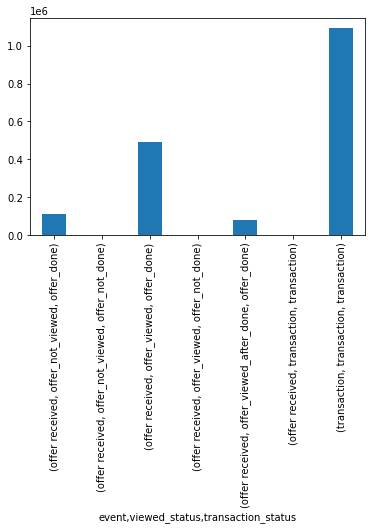

In [15]:
x.plot(kind = 'bar')

In [74]:
x[2]/x.sum()

0.2776491880698871

we can see that offers represents 27% of total amounts paid, now we will create new column, to distinguish between offer effect on purchase

In [16]:
merged_7['effect'] ="NA"

In [17]:
merged_7.loc[(merged_7['viewed_status']=='offer_viewed')&(merged_7['transaction_status']=='offer_done'),'effect']='offer'

In [18]:
merged_7.loc[(merged_7['effect']=='NA'),'effect']='not_offer'

In [19]:
merged_8 = merged_7.copy()

In [20]:
#values = {"paid_amount": 0, "gained_amount": 0, "gender": 'unknown', "income": 'unknown'}

merged_8['paid_amount'].fillna(0,inplace = True)
merged_8['gained_amount'].fillna(0,inplace = True)
merged_8['gender'].fillna('unknown',inplace = True)
merged_8['income'].fillna('unknown',inplace = True)


In [21]:
merged_8

,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,viewed_status,transaction_status,effect
0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,offer_viewed,offer_done,offer
1,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,0.00,0.0,unknown,118,2017,unknown,offer_viewed,offer_not_done,not_offer
2,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,0.00,0.0,M,68,2018,70000.0,offer_viewed,offer_not_done,not_offer
3,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,0.00,0.0,unknown,118,2017,unknown,offer_viewed,offer_not_done,not_offer
4,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,0.00,0.0,unknown,118,2017,unknown,offer_viewed,offer_not_done,not_offer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173353,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,0.0,M,66,2018,47000.0,transaction,transaction,not_offer
173354,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,0.0,M,52,2018,62000.0,transaction,transaction,not_offer
173355,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,0.0,F,63,2013,52000.0,transaction,transaction,not_offer
173356,NaN,NaN,NaN,NaN,NaN,NaN,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53,0.0,M,57,2016,40000.0,transaction,transaction,not_offer


In [22]:
merged_8.loc[(merged_8['age']==118, 'age') ]= 'unknown'

In [23]:
merged_8

,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,viewed_status,transaction_status,effect
0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,offer_viewed,offer_done,offer
1,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,a03223e636434f42ac4c3df47e8bac43,offer received,0,0.00,0.0,unknown,unknown,2017,unknown,offer_viewed,offer_not_done,not_offer
2,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,0.00,0.0,M,68,2018,70000.0,offer_viewed,offer_not_done,not_offer
3,discount,fafdcd668e3743c1bb461111dcafc2a4,1.0,1.0,1.0,1.0,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,0,0.00,0.0,unknown,unknown,2017,unknown,offer_viewed,offer_not_done,not_offer
4,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1.0,1.0,1.0,1.0,68617ca6246f4fbc85e91a2a49552598,offer received,0,0.00,0.0,unknown,unknown,2017,unknown,offer_viewed,offer_not_done,not_offer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173353,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,0.0,M,66,2018,47000.0,transaction,transaction,not_offer
173354,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,0.0,M,52,2018,62000.0,transaction,transaction,not_offer
173355,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,0.0,F,63,2013,52000.0,transaction,transaction,not_offer
173356,NaN,NaN,NaN,NaN,NaN,NaN,76ddbd6576844afe811f1a3c0fbb5bec,transaction,714,3.53,0.0,M,57,2016,40000.0,transaction,transaction,not_offer


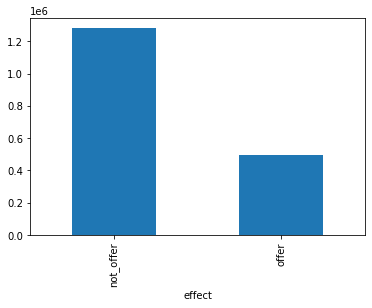

In [24]:
merged_8.groupby(by =['effect']).sum()['paid_amount'].plot(kind='bar');

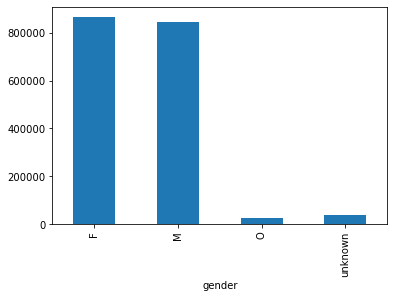

In [25]:
merged_8.groupby(by =['gender']).sum()['paid_amount'].plot(kind='bar');

unknown values are very minimal, and it might confuse the algorithm
it will be dropped

In [26]:
merged_8 = merged_8.loc[(merged_8['gender']!='unknown')]

In [27]:
merged_8

,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,viewed_status,transaction_status,effect
0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,19.89,5.0,F,75,2017,100000.0,offer_viewed,offer_done,offer
2,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,0.00,0.0,M,68,2018,70000.0,offer_viewed,offer_not_done,not_offer
5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,389bc3fa690240e798340f5a15918d5c,offer received,0,9.54,5.0,M,65,2018,53000.0,offer_viewed,offer_done,offer
7,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,aa4862eba776480b8bb9c68455b8c2e1,offer received,0,0.00,0.0,F,61,2017,57000.0,offer_viewed,offer_not_done,not_offer
8,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,31dda685af34476cad5bc968bdb01c53,offer received,0,0.00,0.0,F,62,2016,71000.0,offer_viewed,offer_not_done,not_offer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173351,NaN,NaN,NaN,NaN,NaN,NaN,eec70ab28af74a22a4aeb889c0317944,transaction,714,43.58,0.0,M,56,2017,95000.0,transaction,transaction,not_offer
173353,NaN,NaN,NaN,NaN,NaN,NaN,b3a1272bc9904337b331bf348c3e8c17,transaction,714,1.59,0.0,M,66,2018,47000.0,transaction,transaction,not_offer
173354,NaN,NaN,NaN,NaN,NaN,NaN,68213b08d99a4ae1b0dcb72aebd9aa35,transaction,714,9.53,0.0,M,52,2018,62000.0,transaction,transaction,not_offer
173355,NaN,NaN,NaN,NaN,NaN,NaN,a00058cf10334a308c68e7631c529907,transaction,714,3.61,0.0,F,63,2013,52000.0,transaction,transaction,not_offer


<AxesSubplot:xlabel='age'>

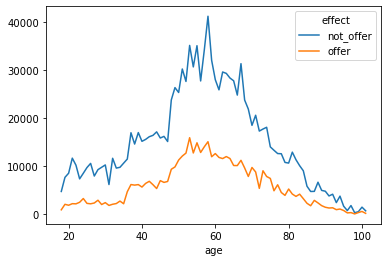

In [28]:
df = merged_8.groupby(by =['age','effect']).sum()['paid_amount']#.plot(kind='line');
df.unstack().plot()


<AxesSubplot:xlabel='gender'>

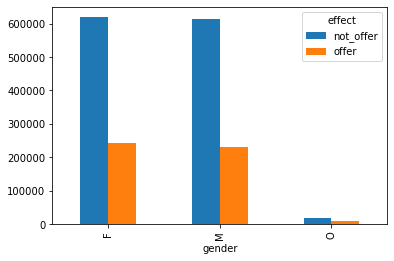

In [29]:
df = merged_8.groupby(by =['gender','effect']).sum()['paid_amount']#.plot(kind='line');
df.unstack().plot(kind='bar')


<AxesSubplot:xlabel='member_year'>

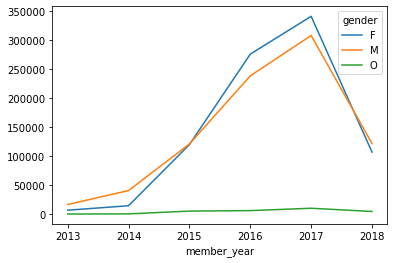

In [30]:
df = merged_8.groupby(by =['member_year','gender']).sum()['paid_amount']#.plot(kind='line');
df.unstack().plot()

In [31]:
merged_8.columns

Index(['offer_type', 'offer_id', 'channel_email', 'channel_mobile',
       'channel_social', 'channel_web', 'customer_id', 'event', 'time',
       'paid_amount', 'gained_amount', 'gender', 'age', 'member_year',
       'income', 'viewed_status', 'transaction_status', 'effect'],
      dtype='object')

D:\Data_Science\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


(20000.0, 130798.17058314396)

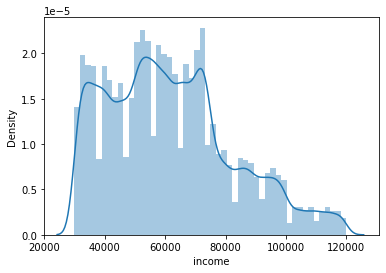

In [32]:
sns.distplot(merged_8['income'], bins=50, hist_kws={'alpha': 0.4});
plt.xlim(xmin=20000)

# Machine Learning Model

In [33]:
merged_9 = merged_8.copy()

choosing only offers lines to be able to fit the algorithm

In [34]:
merged_10 = merged_9.loc[merged_9['event']=='offer received']

In [35]:
merged_10.columns

Index(['offer_type', 'offer_id', 'channel_email', 'channel_mobile',
       'channel_social', 'channel_web', 'customer_id', 'event', 'time',
       'paid_amount', 'gained_amount', 'gender', 'age', 'member_year',
       'income', 'viewed_status', 'transaction_status', 'effect'],
      dtype='object')

In [36]:
dummies = pd.get_dummies(merged_10['offer_type'])
merged_10 = pd.concat([merged_10, dummies], axis=1)

In [37]:
dummies = pd.get_dummies(merged_10['gender'])
merged_10 = pd.concat([merged_10, dummies], axis=1)

In [38]:
dummies = pd.get_dummies(merged_10['member_year'])
merged_10 = pd.concat([merged_10, dummies], axis=1)

In [39]:
dummies = pd.get_dummies(merged_10['effect'])
merged_10 = pd.concat([merged_10, dummies], axis=1)

In [40]:
merged_11 =merged_10.copy()

In [41]:
std = MinMaxScaler()

In [42]:
merged_11.income = std.fit_transform(merged_11.income.values.reshape(-1, 1))
merged_11.age = std.fit_transform(merged_11.age.values.reshape(-1, 1))
merged_11.paid_amount = std.fit_transform(merged_11.paid_amount.values.reshape(-1, 1))
merged_11.gained_amount = std.fit_transform(merged_11.gained_amount.values.reshape(-1, 1))

#X_train.reset_index(inplace=True)
#X_train = X_train.drop(['index'], axis=1)

In [43]:
merged_11

,offer_type,offer_id,channel_email,channel_mobile,channel_social,channel_web,customer_id,event,time,paid_amount,gained_amount,gender,age,member_year,income,viewed_status,transaction_status,effect,bogo,discount,informational,F,M,O,2013,2014,2015,2016,2017,2018,not_offer,offer
0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1.0,1.0,0.0,1.0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0.019582,0.5,F,0.686747,2017,0.777778,offer_viewed,offer_done,offer,1,0,0,1,0,0,0,0,0,0,1,0,0,1
2,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,e2127556f4f64592b11af22de27a7932,offer received,0,0.000000,0.0,M,0.602410,2018,0.444444,offer_viewed,offer_not_done,not_offer,0,1,0,0,1,0,0,0,0,0,0,1,1,0
5,bogo,f19421c1d4aa40978ebb69ca19b0e20d,1.0,1.0,1.0,1.0,389bc3fa690240e798340f5a15918d5c,offer received,0,0.009392,0.5,M,0.566265,2018,0.255556,offer_viewed,offer_done,offer,1,0,0,0,1,0,0,0,0,0,0,1,0,1
7,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,aa4862eba776480b8bb9c68455b8c2e1,offer received,0,0.000000,0.0,F,0.518072,2017,0.300000,offer_viewed,offer_not_done,not_offer,0,1,0,1,0,0,0,0,0,0,1,0,1,0
8,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1.0,0.0,0.0,1.0,31dda685af34476cad5bc968bdb01c53,offer received,0,0.000000,0.0,F,0.530120,2016,0.455556,offer_viewed,offer_not_done,not_offer,0,1,0,1,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150410,informational,5a8bc65990b245e5a138643cd4eb9837,1.0,1.0,1.0,0.0,a57890c3bbb7463e9018abb7fecadb15,offer received,576,0.024317,0.0,M,0.469880,2018,0.522222,offer_viewed,offer_done,offer,0,0,1,0,1,0,0,0,0,0,0,1,0,1
150411,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1.0,1.0,1.0,0.0,d087c473b4d247ccb0abfef59ba12b0e,offer received,576,0.020458,1.0,M,0.457831,2016,0.233333,offer_viewed_after_done,offer_done,not_offer,1,0,0,0,1,0,0,0,0,1,0,0,1,0
150412,discount,2906b810c7d4411798c6938adc9daaa5,1.0,1.0,0.0,1.0,cb23b66c56f64b109d673d5e56574529,offer received,576,0.000000,0.0,M,0.506024,2018,0.922222,transaction,transaction,not_offer,0,1,0,0,1,0,0,0,0,0,0,1,1,0
150413,discount,2298d6c36e964ae4a3e7e9706d1fb8c2,1.0,1.0,1.0,1.0,6d5f3a774f3d4714ab0c092238f3a1d7,offer received,576,0.000000,0.0,F,0.325301,2018,0.266667,offer_viewed,offer_not_done,not_offer,0,1,0,1,0,0,0,0,0,0,0,1,1,0


In [44]:
merged_12 = merged_11.drop(columns = ['offer_type','offer_id', 'channel_web', 'customer_id', 'event', 'time','gender','viewed_status','transaction_status','effect','informational','O',2018,'not_offer'])

In [45]:
merged_12 = merged_12.drop(columns = ['member_year'])

In [47]:
merged_12.to_csv('merged_12.csv')

,channel_email,channel_mobile,channel_social,paid_amount,gained_amount,age,income,bogo,discount,F,M,2013,2014,2015,2016,2017
123308,1.0,1.0,0.0,0.000000,0.0,0.698795,0.777778,0,1,1,0,0,0,0,1,0
10425,1.0,1.0,0.0,0.028886,0.5,0.578313,0.533333,1,0,1,0,0,0,0,1,0
34020,1.0,1.0,1.0,0.015821,0.5,0.518072,0.744444,1,0,1,0,0,0,0,1,0
69608,1.0,1.0,0.0,0.005622,0.2,0.313253,0.211111,0,1,0,1,0,0,0,0,1
38259,1.0,1.0,0.0,0.000000,0.0,0.578313,0.377778,0,1,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121194,1.0,1.0,1.0,0.021069,0.3,0.265060,0.600000,0,1,1,0,0,0,0,0,1
8862,1.0,1.0,1.0,0.010042,0.3,0.879518,0.322222,0,1,0,1,0,0,0,0,1
9152,1.0,1.0,1.0,0.000000,0.0,0.650602,0.344444,1,0,0,1,0,0,0,0,1
145824,1.0,1.0,0.0,0.021758,0.5,0.650602,0.555556,1,0,0,1,0,0,0,0,1


In [56]:
def create_model(classifer, df):    

    print('Training with ' + str(classifer).removesuffix('()') )
    
    features = df.drop(['offer'], axis = 1)
    target = df['offer']
    
    # split dataset
    X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=999)

    # fit classifier
    clf = classifer.fit(X_train, y_train)

    # predict on training and test data
    predict_train = clf.predict(X_train)
    predict_test = clf.predict(X_test)

    # accuracy on training and test data
    score_train = accuracy_score( y_train , predict_train )
    score_test = accuracy_score( y_test , predict_test )

    # display classifier clf_result dict 
    print('Training Accuracy:' , score_train)
    print('Testing Accuracy :', score_test)

In [207]:
create_model(AdaBoostClassifier(), merged_12)
create_model(GaussianNB(), merged_12)
create_model(DecisionTreeClassifier(), merged_12)
create_model(RandomForestClassifier(), merged_12)

Training with AdaBoostClassifier


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda

Training Accuracy: 0.8777619621154057
Testing Accuracy : 0.8753120483510708
Training with GaussianNB
Training Accuracy: 0.7298149567502463
Testing Accuracy : 0.7285507817632374
Training with DecisionTreeClassifier


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 1.0
Testing Accuracy : 0.8266325055840231
Training with RandomForestClassifier


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.9999781013905616
Testing Accuracy : 0.867691499145973


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [217]:
params = {
    'n_estimators': [75, 100, 125, 150],
    'max_features': ['sqrt', 'log2', None],
    'max_depth' : [10,20,30,40,50],
    'min_samples_split' : [2,10,15,20],
    'min_samples_leaf' :[1,2,5,10]}

merged_13 = merged_12.copy()
features = merged_13.drop(['offer'], axis = 1)
target = merged_13['offer']
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=999)
    

In [218]:
clf = RandomizedSearchCV(RandomForestClassifier(), param_distributions=params, scoring='accuracy', n_iter=200,verbose=10, random_state=999)


In [219]:
clf.fit(X_train,y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[CV 1/5; 1/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 1/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.875 total time=   1.8s
[CV 2/5; 1/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 1/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.878 total time=   1.9s
[CV 3/5; 1/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 1/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.877 total time=   1.7s
[CV 4/5; 1/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 1/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.872 total time=   1.7s
[CV 5/5; 1/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 1/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.875 total time=   1.7s
[CV 1/5; 2/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 2/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.880 total time=   3.1s
[CV 2/5; 2/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 2/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.884 total time=   3.3s
[CV 3/5; 2/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 2/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.879 total time=   3.3s
[CV 4/5; 2/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 2/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.880 total time=   3.1s
[CV 5/5; 2/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 2/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.880 total time=   3.2s
[CV 1/5; 3/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 3/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.873 total time=   5.3s
[CV 2/5; 3/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 3/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.874 total time=   5.3s
[CV 3/5; 3/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 3/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.875 total time=   5.2s
[CV 4/5; 3/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 3/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.869 total time=   5.5s
[CV 5/5; 3/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 3/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.871 total time=   5.4s
[CV 1/5; 4/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 4/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.2s
[CV 2/5; 4/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 4/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.884 total time=   1.4s
[CV 3/5; 4/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 4/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.877 total time=   1.5s
[CV 4/5; 4/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 4/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.878 total time=   1.3s
[CV 5/5; 4/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 4/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.3s
[CV 1/5; 5/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 5/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75;, score=0.875 total time=   3.8s
[CV 2/5; 5/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 5/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75;, score=0.879 total time=   3.9s
[CV 3/5; 5/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 5/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75;, score=0.880 total time=   3.8s
[CV 4/5; 5/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 5/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75;, score=0.875 total time=   3.9s
[CV 5/5; 5/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 5/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=75;, score=0.876 total time=   3.7s
[CV 1/5; 6/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 6/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.876 total time=   1.3s
[CV 2/5; 6/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 6/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.880 total time=   1.4s
[CV 3/5; 6/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 6/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.878 total time=   1.2s
[CV 4/5; 6/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 6/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.874 total time=   1.2s
[CV 5/5; 6/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 6/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.875 total time=   1.2s
[CV 1/5; 7/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 7/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.870 total time=   3.2s
[CV 2/5; 7/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 7/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.873 total time=   3.2s
[CV 3/5; 7/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 7/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.868 total time=   3.5s
[CV 4/5; 7/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 7/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.867 total time=   3.8s
[CV 5/5; 7/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 7/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.868 total time=   3.5s
[CV 1/5; 8/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 8/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.867 total time=   1.6s
[CV 2/5; 8/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 8/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.872 total time=   1.7s
[CV 3/5; 8/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 8/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.868 total time=   1.7s
[CV 4/5; 8/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 8/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.866 total time=   1.7s
[CV 5/5; 8/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 8/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.868 total time=   1.8s
[CV 1/5; 9/200] START max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 9/200] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.881 total time=   5.5s
[CV 2/5; 9/200] START max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 9/200] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.884 total time=   5.4s
[CV 3/5; 9/200] START max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 9/200] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.879 total time=   5.6s
[CV 4/5; 9/200] START max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 9/200] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.879 total time=   5.6s
[CV 5/5; 9/200] START max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 9/200] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.880 total time=   5.5s
[CV 1/5; 10/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 10/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.878 total time=   1.3s
[CV 2/5; 10/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 10/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.881 total time=   1.2s
[CV 3/5; 10/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 10/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.880 total time=   1.4s
[CV 4/5; 10/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 10/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.4s
[CV 5/5; 10/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 10/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.876 total time=   1.3s
[CV 1/5; 11/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 11/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.1s
[CV 2/5; 11/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 11/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.883 total time=   1.0s
[CV 3/5; 11/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 11/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.1s
[CV 4/5; 11/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 11/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.0s
[CV 5/5; 11/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 11/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.879 total time=   1.0s
[CV 1/5; 12/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 12/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.866 total time=   2.2s
[CV 2/5; 12/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 12/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.871 total time=   2.4s
[CV 3/5; 12/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 12/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.868 total time=   2.4s
[CV 4/5; 12/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 12/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.867 total time=   2.3s
[CV 5/5; 12/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 12/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.868 total time=   2.4s
[CV 1/5; 13/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 13/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.879 total time=   1.4s
[CV 2/5; 13/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 13/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.883 total time=   1.4s
[CV 3/5; 13/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 13/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.876 total time=   1.5s
[CV 4/5; 13/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 13/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.877 total time=   1.5s
[CV 5/5; 13/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 13/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.4s
[CV 1/5; 14/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 14/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   8.9s
[CV 2/5; 14/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 14/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.876 total time=   8.7s
[CV 3/5; 14/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 14/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.880 total time=   9.0s
[CV 4/5; 14/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 14/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   9.1s
[CV 5/5; 14/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 14/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   8.8s
[CV 1/5; 15/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 15/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.876 total time=   6.6s
[CV 2/5; 15/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 15/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.881 total time=   6.5s
[CV 3/5; 15/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 15/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.880 total time=   6.7s
[CV 4/5; 15/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 15/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.875 total time=   6.6s
[CV 5/5; 15/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 15/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.878 total time=   6.8s
[CV 1/5; 16/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 16/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.879 total time=   2.3s
[CV 2/5; 16/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 16/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.883 total time=   2.3s
[CV 3/5; 16/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 16/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.876 total time=   2.2s
[CV 4/5; 16/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 16/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.879 total time=   2.2s
[CV 5/5; 16/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 16/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.879 total time=   2.2s
[CV 1/5; 17/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 17/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.878 total time=   8.8s
[CV 2/5; 17/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 17/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.879 total time=   8.5s
[CV 3/5; 17/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 17/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.880 total time=   8.7s
[CV 4/5; 17/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 17/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   8.4s
[CV 5/5; 17/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 17/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.876 total time=   8.7s
[CV 1/5; 18/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 18/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   1.7s
[CV 2/5; 18/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 18/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.881 total time=   1.7s
[CV 3/5; 18/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 18/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.877 total time=   1.7s
[CV 4/5; 18/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 18/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   1.9s
[CV 5/5; 18/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 18/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   1.7s
[CV 1/5; 19/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 19/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.881 total time=   2.8s
[CV 2/5; 19/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 19/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.885 total time=   3.0s
[CV 3/5; 19/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 19/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.879 total time=   2.9s
[CV 4/5; 19/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 19/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.880 total time=   2.6s
[CV 5/5; 19/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 19/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.880 total time=   2.8s
[CV 1/5; 20/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 20/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.879 total time=   1.9s
[CV 2/5; 20/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 20/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.883 total time=   1.8s
[CV 3/5; 20/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 20/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.3s
[CV 4/5; 20/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 20/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.879 total time=   1.8s
[CV 5/5; 20/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 20/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.880 total time=   1.8s
[CV 1/5; 21/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 21/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.4s
[CV 2/5; 21/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 21/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.881 total time=   1.4s
[CV 3/5; 21/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 21/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.880 total time=   1.5s
[CV 4/5; 21/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 21/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.875 total time=   1.4s
[CV 5/5; 21/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 21/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.875 total time=   1.4s
[CV 1/5; 22/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 22/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.880 total time=   5.7s
[CV 2/5; 22/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 22/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.884 total time=   5.5s
[CV 3/5; 22/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 22/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.879 total time=   5.7s
[CV 4/5; 22/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 22/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.880 total time=   5.7s
[CV 5/5; 22/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 22/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.880 total time=   6.1s
[CV 1/5; 23/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 23/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100;, score=0.876 total time=   5.6s
[CV 2/5; 23/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 23/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100;, score=0.879 total time=   5.7s
[CV 3/5; 23/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 23/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100;, score=0.879 total time=   5.6s
[CV 4/5; 23/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 23/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100;, score=0.874 total time=   5.6s
[CV 5/5; 23/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 23/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=100;, score=0.877 total time=   5.6s
[CV 1/5; 24/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 24/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.879 total time=   2.2s
[CV 2/5; 24/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 24/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.882 total time=   2.1s
[CV 3/5; 24/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 24/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.2s
[CV 4/5; 24/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 24/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.3s
[CV 5/5; 24/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 24/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.3s
[CV 1/5; 25/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 25/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.878 total time=   1.8s
[CV 2/5; 25/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 25/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.882 total time=   1.8s
[CV 3/5; 25/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 25/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.877 total time=   1.7s
[CV 4/5; 25/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 25/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.878 total time=   1.8s
[CV 5/5; 25/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 25/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.877 total time=   1.7s
[CV 1/5; 26/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 26/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.879 total time=   2.1s
[CV 2/5; 26/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 26/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.883 total time=   2.3s
[CV 3/5; 26/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 26/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.876 total time=   2.3s
[CV 4/5; 26/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 26/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.878 total time=   2.1s
[CV 5/5; 26/200] START max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 26/200] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.880 total time=   2.2s
[CV 1/5; 27/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 27/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.5s
[CV 2/5; 27/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 27/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.881 total time=   2.4s
[CV 3/5; 27/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 27/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.4s
[CV 4/5; 27/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 27/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.875 total time=   2.7s
[CV 5/5; 27/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 27/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.875 total time=   2.5s
[CV 1/5; 28/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 28/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.1s
[CV 2/5; 28/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 28/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.886 total time=   1.1s
[CV 3/5; 28/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 28/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.1s
[CV 4/5; 28/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 28/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.1s
[CV 5/5; 28/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 28/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.879 total time=   1.1s
[CV 1/5; 29/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 29/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.876 total time=   2.9s
[CV 2/5; 29/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 29/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.880 total time=   3.0s
[CV 3/5; 29/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 29/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.879 total time=   3.0s
[CV 4/5; 29/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 29/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.876 total time=   2.9s
[CV 5/5; 29/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 29/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.875 total time=   2.9s
[CV 1/5; 30/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 30/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.876 total time=   3.0s
[CV 2/5; 30/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 30/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.881 total time=   3.1s
[CV 3/5; 30/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 30/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.878 total time=   3.1s
[CV 4/5; 30/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 30/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   3.1s
[CV 5/5; 30/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 30/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   3.1s
[CV 1/5; 31/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 31/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.3s
[CV 2/5; 31/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 31/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.883 total time=   2.1s
[CV 3/5; 31/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 31/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.875 total time=   2.2s
[CV 4/5; 31/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 31/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.878 total time=   2.4s
[CV 5/5; 31/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 31/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.1s
[CV 1/5; 32/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 32/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.873 total time=   9.3s
[CV 2/5; 32/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 32/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.875 total time=   9.2s
[CV 3/5; 32/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 32/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.877 total time=   9.3s
[CV 4/5; 32/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 32/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.869 total time=   9.2s
[CV 5/5; 32/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 32/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.873 total time=   9.2s
[CV 1/5; 33/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 33/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150;, score=0.878 total time=   2.6s
[CV 2/5; 33/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 33/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150;, score=0.881 total time=   2.7s
[CV 3/5; 33/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 33/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150;, score=0.877 total time=   2.7s
[CV 4/5; 33/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 33/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150;, score=0.877 total time=   2.7s
[CV 5/5; 33/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 33/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=150;, score=0.876 total time=   2.9s
[CV 1/5; 34/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 34/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75;, score=0.875 total time=   1.5s
[CV 2/5; 34/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 34/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75;, score=0.879 total time=   1.5s
[CV 3/5; 34/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 34/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.5s
[CV 4/5; 34/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 34/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.5s
[CV 5/5; 34/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 34/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=75;, score=0.875 total time=   1.6s
[CV 1/5; 35/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 35/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.875 total time=   2.0s
[CV 2/5; 35/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 35/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.878 total time=   2.5s
[CV 3/5; 35/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 35/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.879 total time=   2.3s
[CV 4/5; 35/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 35/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.874 total time=   2.1s
[CV 5/5; 35/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 35/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.872 total time=   2.0s
[CV 1/5; 36/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 36/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.880 total time=   3.9s
[CV 2/5; 36/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 36/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.885 total time=   3.8s
[CV 3/5; 36/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 36/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.879 total time=   5.0s
[CV 4/5; 36/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 36/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.880 total time=   4.4s
[CV 5/5; 36/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 36/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.881 total time=   4.0s
[CV 1/5; 37/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 37/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.876 total time=   2.9s
[CV 2/5; 37/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 37/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.880 total time=   2.9s
[CV 3/5; 37/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 37/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.878 total time=   2.7s
[CV 4/5; 37/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 37/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.877 total time=   2.7s
[CV 5/5; 37/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 37/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.876 total time=   2.6s
[CV 1/5; 38/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 38/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.876 total time=   3.8s
[CV 2/5; 38/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 38/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.880 total time=   4.0s
[CV 3/5; 38/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 38/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.880 total time=   3.8s
[CV 4/5; 38/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 38/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.875 total time=   3.9s
[CV 5/5; 38/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 38/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.875 total time=   3.9s
[CV 1/5; 39/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 39/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.874 total time=   4.1s
[CV 2/5; 39/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 39/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.873 total time=   3.9s
[CV 3/5; 39/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 39/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.878 total time=   4.0s
[CV 4/5; 39/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 39/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.871 total time=   3.9s
[CV 5/5; 39/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 39/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.871 total time=   3.9s
[CV 1/5; 40/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 40/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.880 total time=   1.6s
[CV 2/5; 40/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 40/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.881 total time=   1.5s
[CV 3/5; 40/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 40/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.6s
[CV 4/5; 40/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 40/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.876 total time=   1.6s
[CV 5/5; 40/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 40/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.5s
[CV 1/5; 41/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 41/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   3.0s
[CV 2/5; 41/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 41/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.6s
[CV 3/5; 41/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 41/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.879 total time=   3.0s
[CV 4/5; 41/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 41/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   2.9s
[CV 5/5; 41/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 41/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   2.6s
[CV 1/5; 42/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 42/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.3s
[CV 2/5; 42/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 42/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.881 total time=   2.2s
[CV 3/5; 42/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 42/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.879 total time=   2.1s
[CV 4/5; 42/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 42/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.2s
[CV 5/5; 42/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 42/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.2s
[CV 1/5; 43/200] START max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 43/200] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.876 total time=   9.2s
[CV 2/5; 43/200] START max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 43/200] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.877 total time=   8.9s
[CV 3/5; 43/200] START max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 43/200] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.880 total time=   8.6s
[CV 4/5; 43/200] START max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 43/200] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.874 total time=   8.7s
[CV 5/5; 43/200] START max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 43/200] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.877 total time=   8.8s
[CV 1/5; 44/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 44/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150;, score=0.877 total time=   8.7s
[CV 2/5; 44/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 44/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150;, score=0.879 total time=   8.7s
[CV 3/5; 44/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 44/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150;, score=0.880 total time=   9.0s
[CV 4/5; 44/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 44/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150;, score=0.877 total time=   9.4s
[CV 5/5; 44/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 44/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=150;, score=0.877 total time=   8.9s
[CV 1/5; 45/200] START max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 45/200] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.874 total time=   1.5s
[CV 2/5; 45/200] START max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 45/200] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.880 total time=   1.7s
[CV 3/5; 45/200] START max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 45/200] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.6s
[CV 4/5; 45/200] START max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 45/200] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.872 total time=   1.8s
[CV 5/5; 45/200] START max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 45/200] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.873 total time=   1.5s
[CV 1/5; 46/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 46/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.876 total time=   4.5s
[CV 2/5; 46/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 46/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.877 total time=   4.7s
[CV 3/5; 46/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 46/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.879 total time=   4.7s
[CV 4/5; 46/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 46/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.872 total time=   4.5s
[CV 5/5; 46/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 46/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.873 total time=   4.3s
[CV 1/5; 47/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 47/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.878 total time=   2.3s
[CV 2/5; 47/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 47/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.879 total time=   2.4s
[CV 3/5; 47/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 47/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.2s
[CV 4/5; 47/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 47/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.2s
[CV 5/5; 47/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 47/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.4s
[CV 1/5; 48/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 48/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.876 total time=   6.4s
[CV 2/5; 48/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 48/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.879 total time=   6.0s
[CV 3/5; 48/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 48/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.880 total time=   6.1s
[CV 4/5; 48/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 48/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.876 total time=   6.1s
[CV 5/5; 48/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 48/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.876 total time=   6.2s
[CV 1/5; 49/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 49/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.3s
[CV 2/5; 49/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 49/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.880 total time=   1.3s
[CV 3/5; 49/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 49/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.3s
[CV 4/5; 49/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 49/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.3s
[CV 5/5; 49/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 49/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.3s
[CV 1/5; 50/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 50/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.874 total time=   1.5s
[CV 2/5; 50/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 50/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.3s
[CV 3/5; 50/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 50/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.5s
[CV 4/5; 50/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 50/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.875 total time=   1.3s
[CV 5/5; 50/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 50/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.874 total time=   1.3s
[CV 1/5; 51/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 51/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.1s
[CV 2/5; 51/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 51/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.882 total time=   1.2s
[CV 3/5; 51/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 51/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.2s
[CV 4/5; 51/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 51/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.876 total time=   1.2s
[CV 5/5; 51/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 51/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.879 total time=   1.2s
[CV 1/5; 52/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 52/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.2s
[CV 2/5; 52/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 52/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.880 total time=   2.1s
[CV 3/5; 52/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 52/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.2s
[CV 4/5; 52/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 52/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.0s
[CV 5/5; 52/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 52/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.0s
[CV 1/5; 53/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 53/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.879 total time=   0.9s
[CV 2/5; 53/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 53/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.883 total time=   1.0s
[CV 3/5; 53/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 53/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.0s
[CV 4/5; 53/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 53/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.0s
[CV 5/5; 53/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 53/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.880 total time=   1.0s
[CV 1/5; 54/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 54/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   3.0s
[CV 2/5; 54/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 54/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.881 total time=   2.8s
[CV 3/5; 54/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 54/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.878 total time=   2.8s
[CV 4/5; 54/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 54/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   2.8s
[CV 5/5; 54/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 54/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.873 total time=   2.8s
[CV 1/5; 55/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 55/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.881 total time=   2.5s
[CV 2/5; 55/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 55/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.882 total time=   2.4s
[CV 3/5; 55/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 55/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.877 total time=   2.3s
[CV 4/5; 55/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 55/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.878 total time=   2.3s
[CV 5/5; 55/200] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 55/200] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.879 total time=   2.4s
[CV 1/5; 56/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 56/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.876 total time=   2.7s
[CV 2/5; 56/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 56/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.879 total time=   2.6s
[CV 3/5; 56/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 56/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.7s
[CV 4/5; 56/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 56/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.873 total time=   2.7s
[CV 5/5; 56/200] START max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 56/200] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.875 total time=   2.4s
[CV 1/5; 57/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 57/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.875 total time=   1.9s
[CV 2/5; 57/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 57/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.878 total time=   2.0s
[CV 3/5; 57/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 57/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.877 total time=   2.2s
[CV 4/5; 57/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 57/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.873 total time=   1.9s
[CV 5/5; 57/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 57/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.873 total time=   2.0s
[CV 1/5; 58/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 58/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.875 total time=   7.7s
[CV 2/5; 58/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 58/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.879 total time=   8.1s
[CV 3/5; 58/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 58/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.879 total time=   8.3s
[CV 4/5; 58/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 58/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.874 total time=   8.3s
[CV 5/5; 58/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 58/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.878 total time=   8.2s
[CV 1/5; 59/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 59/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.876 total time=   2.4s
[CV 2/5; 59/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 59/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.880 total time=   2.4s
[CV 3/5; 59/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 59/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.878 total time=   2.7s
[CV 4/5; 59/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 59/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.874 total time=   2.6s
[CV 5/5; 59/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 59/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.874 total time=   2.3s
[CV 1/5; 60/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 60/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.877 total time=   1.6s
[CV 2/5; 60/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 60/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.882 total time=   1.6s
[CV 3/5; 60/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 60/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.7s
[CV 4/5; 60/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 60/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.877 total time=   1.8s
[CV 5/5; 60/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 60/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.9s
[CV 1/5; 61/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 61/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.878 total time=   2.7s
[CV 2/5; 61/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 61/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.5s
[CV 3/5; 61/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 61/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.9s
[CV 4/5; 61/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 61/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.6s
[CV 5/5; 61/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 61/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.876 total time=   2.7s
[CV 1/5; 62/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 62/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.873 total time=   6.5s
[CV 2/5; 62/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 62/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.879 total time=   6.2s
[CV 3/5; 62/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 62/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.879 total time=   6.5s
[CV 4/5; 62/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 62/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.873 total time=   6.5s
[CV 5/5; 62/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 62/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=125;, score=0.875 total time=   6.3s
[CV 1/5; 63/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 63/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.880 total time=   1.6s
[CV 2/5; 63/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 63/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.882 total time=   1.6s
[CV 3/5; 63/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 63/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   1.6s
[CV 4/5; 63/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 63/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.879 total time=   1.6s
[CV 5/5; 63/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 63/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.879 total time=   1.6s
[CV 1/5; 64/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 64/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.878 total time=   1.3s
[CV 2/5; 64/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 64/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.882 total time=   1.3s
[CV 3/5; 64/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 64/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.876 total time=   1.4s
[CV 4/5; 64/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 64/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.878 total time=   1.5s
[CV 5/5; 64/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 64/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.879 total time=   1.3s
[CV 1/5; 65/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 65/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.7s
[CV 2/5; 65/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 65/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.880 total time=   2.3s
[CV 3/5; 65/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 65/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.3s
[CV 4/5; 65/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 65/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.874 total time=   2.4s
[CV 5/5; 65/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 65/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=125;, score=0.874 total time=   2.5s
[CV 1/5; 66/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 66/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.879 total time=   3.2s
[CV 2/5; 66/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 66/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.881 total time=   3.4s
[CV 3/5; 66/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 66/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.878 total time=   4.1s
[CV 4/5; 66/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 66/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   3.1s
[CV 5/5; 66/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 66/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   4.3s
[CV 1/5; 67/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 67/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.9s
[CV 2/5; 67/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 67/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.882 total time=   2.9s
[CV 3/5; 67/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 67/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   3.0s
[CV 4/5; 67/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 67/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   3.0s
[CV 5/5; 67/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 67/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.878 total time=   3.1s
[CV 1/5; 68/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 68/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.876 total time=   6.5s
[CV 2/5; 68/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 68/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.881 total time=   4.8s
[CV 3/5; 68/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 68/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.877 total time=   4.2s
[CV 4/5; 68/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 68/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.872 total time=   5.3s
[CV 5/5; 68/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 68/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.875 total time=   4.5s
[CV 1/5; 69/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 69/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.9s
[CV 2/5; 69/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 69/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.881 total time=   3.1s
[CV 3/5; 69/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 69/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.878 total time=   3.1s
[CV 4/5; 69/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 69/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.878 total time=   2.9s
[CV 5/5; 69/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 69/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.875 total time=   2.9s
[CV 1/5; 70/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 70/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.3s
[CV 2/5; 70/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 70/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.880 total time=   1.4s
[CV 3/5; 70/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 70/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.5s
[CV 4/5; 70/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 70/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.6s
[CV 5/5; 70/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 70/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.7s
[CV 1/5; 71/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 71/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.876 total time=   9.9s
[CV 2/5; 71/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 71/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.877 total time=   8.8s
[CV 3/5; 71/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 71/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.879 total time=  10.3s
[CV 4/5; 71/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 71/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.874 total time=   9.1s
[CV 5/5; 71/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 71/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.876 total time=   9.1s
[CV 1/5; 72/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 72/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.875 total time=   3.7s
[CV 2/5; 72/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 72/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.5s
[CV 3/5; 72/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 72/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.877 total time=   3.9s
[CV 4/5; 72/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 72/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.873 total time=   3.3s
[CV 5/5; 72/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 72/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.873 total time=   3.4s
[CV 1/5; 73/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 73/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.879 total time=   2.3s
[CV 2/5; 73/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 73/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.883 total time=   2.0s
[CV 3/5; 73/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 73/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.0s
[CV 4/5; 73/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 73/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.878 total time=   2.4s
[CV 5/5; 73/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 73/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.879 total time=   1.9s
[CV 1/5; 74/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 74/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.871 total time=   1.6s
[CV 2/5; 74/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 74/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.876 total time=   1.7s
[CV 3/5; 74/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 74/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.875 total time=   1.9s
[CV 4/5; 74/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 74/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.870 total time=   1.7s
[CV 5/5; 74/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 74/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.873 total time=   1.6s
[CV 1/5; 75/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 75/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.6s
[CV 2/5; 75/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 75/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.881 total time=   2.6s
[CV 3/5; 75/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 75/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.8s
[CV 4/5; 75/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 75/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.875 total time=   2.7s
[CV 5/5; 75/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 75/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.874 total time=   2.9s
[CV 1/5; 76/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 76/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.879 total time=   1.9s
[CV 2/5; 76/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 76/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.884 total time=   1.8s
[CV 3/5; 76/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 76/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.0s
[CV 4/5; 76/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 76/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.878 total time=   2.2s
[CV 5/5; 76/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 76/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.880 total time=   1.9s
[CV 1/5; 77/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 77/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.878 total time=   3.1s
[CV 2/5; 77/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 77/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.881 total time=   3.5s
[CV 3/5; 77/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 77/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.878 total time=   3.2s
[CV 4/5; 77/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 77/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.877 total time=   3.0s
[CV 5/5; 77/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 77/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.876 total time=   3.0s
[CV 1/5; 78/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 78/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.879 total time=   1.6s
[CV 2/5; 78/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 78/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.882 total time=   1.9s
[CV 3/5; 78/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 78/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.7s
[CV 4/5; 78/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 78/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.7s
[CV 5/5; 78/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 78/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.7s
[CV 1/5; 79/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 79/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.7s
[CV 2/5; 79/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 79/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.880 total time=   2.7s
[CV 3/5; 79/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 79/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.5s
[CV 4/5; 79/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 79/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.4s
[CV 5/5; 79/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 79/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.875 total time=   2.3s
[CV 1/5; 80/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 80/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.876 total time=   2.9s
[CV 2/5; 80/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 80/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.879 total time=   2.9s
[CV 3/5; 80/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 80/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.876 total time=   3.1s
[CV 4/5; 80/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 80/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.874 total time=   3.3s
[CV 5/5; 80/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 80/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.874 total time=   3.1s
[CV 1/5; 81/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 81/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.2s
[CV 2/5; 81/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 81/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.882 total time=   2.1s
[CV 3/5; 81/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 81/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.2s
[CV 4/5; 81/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 81/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.878 total time=   2.1s
[CV 5/5; 81/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 81/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.1s
[CV 1/5; 82/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 82/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.877 total time=   2.5s
[CV 2/5; 82/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 82/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.879 total time=   2.6s
[CV 3/5; 82/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 82/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.878 total time=   2.3s
[CV 4/5; 82/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 82/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.875 total time=   2.2s
[CV 5/5; 82/200] START max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 82/200] END max_depth=20, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.873 total time=   2.2s
[CV 1/5; 83/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 83/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.866 total time=   1.6s
[CV 2/5; 83/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 83/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.871 total time=   1.5s
[CV 3/5; 83/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 83/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.870 total time=   1.7s
[CV 4/5; 83/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 83/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.866 total time=   1.6s
[CV 5/5; 83/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 83/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.867 total time=   1.6s
[CV 1/5; 84/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 84/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.868 total time=   2.7s
[CV 2/5; 84/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 84/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.872 total time=   2.6s
[CV 3/5; 84/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 84/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.869 total time=   2.7s
[CV 4/5; 84/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 84/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.866 total time=   2.6s
[CV 5/5; 84/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 84/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.866 total time=   2.8s
[CV 1/5; 85/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 85/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.876 total time=   2.3s
[CV 2/5; 85/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 85/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.878 total time=   2.2s
[CV 3/5; 85/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 85/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.876 total time=   2.3s
[CV 4/5; 85/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 85/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.876 total time=   2.6s
[CV 5/5; 85/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 85/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.875 total time=   2.3s
[CV 1/5; 86/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 86/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   6.4s
[CV 2/5; 86/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 86/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.880 total time=   6.0s
[CV 3/5; 86/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 86/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.881 total time=   6.8s
[CV 4/5; 86/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 86/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   7.1s
[CV 5/5; 86/200] START max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 86/200] END max_depth=30, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   6.2s
[CV 1/5; 87/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 87/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.875 total time=   5.3s
[CV 2/5; 87/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 87/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.877 total time=   5.5s
[CV 3/5; 87/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 87/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.879 total time=   5.3s
[CV 4/5; 87/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 87/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.874 total time=   5.2s
[CV 5/5; 87/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 87/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.873 total time=   5.0s
[CV 1/5; 88/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 88/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.875 total time=   5.2s
[CV 2/5; 88/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 88/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.879 total time=   5.4s
[CV 3/5; 88/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 88/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.878 total time=   5.5s
[CV 4/5; 88/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 88/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.877 total time=   5.9s
[CV 5/5; 88/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 88/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.875 total time=   5.6s
[CV 1/5; 89/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 89/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.879 total time=   8.5s
[CV 2/5; 89/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 89/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.878 total time=   8.7s
[CV 3/5; 89/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 89/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.880 total time=   8.2s
[CV 4/5; 89/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 89/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.874 total time=   8.7s
[CV 5/5; 89/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 89/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.876 total time=   8.5s
[CV 1/5; 90/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 90/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.8s
[CV 2/5; 90/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 90/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.878 total time=   2.3s
[CV 3/5; 90/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 90/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.6s
[CV 4/5; 90/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 90/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.874 total time=   2.4s
[CV 5/5; 90/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 90/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.874 total time=   2.4s
[CV 1/5; 91/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 91/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.3s
[CV 2/5; 91/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 91/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.879 total time=   1.4s
[CV 3/5; 91/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 91/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.4s
[CV 4/5; 91/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 91/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.875 total time=   1.3s
[CV 5/5; 91/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 91/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.876 total time=   1.4s
[CV 1/5; 92/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 92/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.880 total time=   2.8s
[CV 2/5; 92/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 92/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.885 total time=   2.6s
[CV 3/5; 92/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 92/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.879 total time=   2.6s
[CV 4/5; 92/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 92/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.880 total time=   2.6s
[CV 5/5; 92/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 92/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=75;, score=0.881 total time=   2.6s
[CV 1/5; 93/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 93/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.876 total time=   6.6s
[CV 2/5; 93/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 93/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.878 total time=   6.9s
[CV 3/5; 93/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 93/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.880 total time=   7.0s
[CV 4/5; 93/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 93/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.875 total time=   6.6s
[CV 5/5; 93/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 93/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=125;, score=0.877 total time=   6.6s
[CV 1/5; 94/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 94/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.878 total time=   1.8s
[CV 2/5; 94/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 94/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.8s
[CV 3/5; 94/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 94/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.876 total time=   1.7s
[CV 4/5; 94/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 94/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.876 total time=   1.7s
[CV 5/5; 94/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 94/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=100;, score=0.874 total time=   1.8s
[CV 1/5; 95/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 95/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.8s
[CV 2/5; 95/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 95/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.882 total time=   2.8s
[CV 3/5; 95/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 95/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.4s
[CV 4/5; 95/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 95/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.4s
[CV 5/5; 95/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 95/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.5s
[CV 1/5; 96/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 96/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.878 total time=   7.3s
[CV 2/5; 96/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 96/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.880 total time=   6.9s
[CV 3/5; 96/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 96/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.881 total time=   7.0s
[CV 4/5; 96/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 96/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.878 total time=   7.4s
[CV 5/5; 96/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 96/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.878 total time=   7.6s
[CV 1/5; 97/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 97/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.876 total time=   3.8s
[CV 2/5; 97/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 97/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.879 total time=   3.7s
[CV 3/5; 97/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 97/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.879 total time=   3.9s
[CV 4/5; 97/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 97/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.874 total time=   4.0s
[CV 5/5; 97/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 97/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.876 total time=   4.0s
[CV 1/5; 98/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 98/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.879 total time=   2.0s
[CV 2/5; 98/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 98/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.883 total time=   2.1s
[CV 3/5; 98/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 98/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.0s
[CV 4/5; 98/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 98/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.0s
[CV 5/5; 98/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 98/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   2.0s
[CV 1/5; 99/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 99/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.3s
[CV 2/5; 99/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 99/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.880 total time=   2.2s
[CV 3/5; 99/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 99/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.878 total time=   2.1s
[CV 4/5; 99/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 99/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.875 total time=   2.1s
[CV 5/5; 99/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 99/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.2s
[CV 1/5; 100/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 100/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.877 total time=   6.3s
[CV 2/5; 100/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 100/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.880 total time=   6.3s
[CV 3/5; 100/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 100/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.881 total time=   6.4s
[CV 4/5; 100/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 100/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   6.4s
[CV 5/5; 100/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 100/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=125;, score=0.876 total time=   6.1s
[CV 1/5; 101/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 101/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.874 total time=   7.9s
[CV 2/5; 101/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 101/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.875 total time=   8.2s
[CV 3/5; 101/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 101/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.877 total time=   8.6s
[CV 4/5; 101/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 101/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.870 total time=   7.8s
[CV 5/5; 101/200] START max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 101/200] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.874 total time=   8.2s
[CV 1/5; 102/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 102/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.875 total time=   2.2s
[CV 2/5; 102/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 102/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.879 total time=   2.1s
[CV 3/5; 102/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 102/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.877 total time=   2.3s
[CV 4/5; 102/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 102/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.875 total time=   2.1s
[CV 5/5; 102/200] START max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 102/200] END max_depth=30, max_features=log2, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.875 total time=   2.2s
[CV 1/5; 103/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 103/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   6.3s
[CV 2/5; 103/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 103/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.881 total time=   6.0s
[CV 3/5; 103/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 103/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.879 total time=   6.0s
[CV 4/5; 103/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 103/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.877 total time=   5.9s
[CV 5/5; 103/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 103/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=125;, score=0.878 total time=   5.8s
[CV 1/5; 104/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 104/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.875 total time=   8.4s
[CV 2/5; 104/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 104/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.879 total time=   8.2s
[CV 3/5; 104/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 104/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.879 total time=   8.5s
[CV 4/5; 104/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 104/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.873 total time=   8.2s
[CV 5/5; 104/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 104/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.874 total time=   8.0s
[CV 1/5; 105/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 105/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.875 total time=   1.8s
[CV 2/5; 105/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 105/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.880 total time=   1.8s
[CV 3/5; 105/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 105/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.878 total time=   1.8s
[CV 4/5; 105/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 105/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.873 total time=   2.0s
[CV 5/5; 105/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 105/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.874 total time=   1.9s
[CV 1/5; 106/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 106/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.3s
[CV 2/5; 106/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 106/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.879 total time=   2.3s
[CV 3/5; 106/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 106/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.3s
[CV 4/5; 106/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 106/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.874 total time=   2.3s
[CV 5/5; 106/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 106/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.874 total time=   2.2s
[CV 1/5; 107/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 107/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.879 total time=   3.0s
[CV 2/5; 107/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 107/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.880 total time=   2.8s
[CV 3/5; 107/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 107/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.6s
[CV 4/5; 107/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 107/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   2.6s
[CV 5/5; 107/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 107/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   2.5s
[CV 1/5; 108/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 108/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.875 total time=   1.6s
[CV 2/5; 108/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 108/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.879 total time=   1.5s
[CV 3/5; 108/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 108/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.4s
[CV 4/5; 108/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 108/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.4s
[CV 5/5; 108/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 108/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.875 total time=   1.2s
[CV 1/5; 109/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 109/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.872 total time=   1.4s
[CV 2/5; 109/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 109/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.876 total time=   1.4s
[CV 3/5; 109/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 109/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.875 total time=   1.4s
[CV 4/5; 109/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 109/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.871 total time=   1.4s
[CV 5/5; 109/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 109/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.872 total time=   1.4s
[CV 1/5; 110/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 110/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.875 total time=   1.8s
[CV 2/5; 110/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 110/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.881 total time=   1.9s
[CV 3/5; 110/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 110/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.877 total time=   1.9s
[CV 4/5; 110/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 110/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.8s
[CV 5/5; 110/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 110/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.7s
[CV 1/5; 111/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 111/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.878 total time=   5.1s
[CV 2/5; 111/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 111/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.880 total time=   5.4s
[CV 3/5; 111/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 111/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.880 total time=   5.4s
[CV 4/5; 111/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 111/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.875 total time=   4.9s
[CV 5/5; 111/200] START max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 111/200] END max_depth=50, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.878 total time=   5.1s
[CV 1/5; 112/200] START max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 112/200] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.878 total time=   1.7s
[CV 2/5; 112/200] START max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 112/200] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.881 total time=   1.6s
[CV 3/5; 112/200] START max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 112/200] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.7s
[CV 4/5; 112/200] START max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 112/200] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.877 total time=   1.5s
[CV 5/5; 112/200] START max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 112/200] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=100;, score=0.876 total time=   1.5s
[CV 1/5; 113/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 113/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.881 total time=   2.4s
[CV 2/5; 113/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 113/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.884 total time=   2.5s
[CV 3/5; 113/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 113/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.879 total time=   2.4s
[CV 4/5; 113/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 113/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.879 total time=   2.5s
[CV 5/5; 113/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 113/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=75;, score=0.881 total time=   2.4s
[CV 1/5; 114/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 114/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.3s
[CV 2/5; 114/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 114/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.881 total time=   2.3s
[CV 3/5; 114/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 114/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.875 total time=   2.2s
[CV 4/5; 114/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 114/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.875 total time=   2.5s
[CV 5/5; 114/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 114/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.875 total time=   2.4s
[CV 1/5; 115/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 115/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.868 total time=   1.7s
[CV 2/5; 115/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 115/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.872 total time=   1.6s
[CV 3/5; 115/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 115/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.870 total time=   1.6s
[CV 4/5; 115/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 115/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.866 total time=   1.7s
[CV 5/5; 115/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 115/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=75;, score=0.869 total time=   1.6s
[CV 1/5; 116/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 116/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.878 total time=   1.8s
[CV 2/5; 116/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 116/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.883 total time=   1.8s
[CV 3/5; 116/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 116/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.876 total time=   1.8s
[CV 4/5; 116/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 116/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.879 total time=   1.8s
[CV 5/5; 116/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 116/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.880 total time=   1.7s
[CV 1/5; 117/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 117/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.873 total time=   1.9s
[CV 2/5; 117/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 117/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.877 total time=   2.0s
[CV 3/5; 117/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 117/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.875 total time=   2.0s
[CV 4/5; 117/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 117/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.871 total time=   2.2s
[CV 5/5; 117/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 117/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100;, score=0.871 total time=   2.2s
[CV 1/5; 118/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 118/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.877 total time=   2.2s
[CV 2/5; 118/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 118/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.879 total time=   2.8s
[CV 3/5; 118/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 118/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.4s
[CV 4/5; 118/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 118/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.875 total time=   2.3s
[CV 5/5; 118/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 118/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.874 total time=   2.6s
[CV 1/5; 119/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 119/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.877 total time=   1.7s
[CV 2/5; 119/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 119/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.880 total time=   1.8s
[CV 3/5; 119/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 119/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.879 total time=   1.8s
[CV 4/5; 119/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 119/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.9s
[CV 5/5; 119/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 119/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.876 total time=   2.0s
[CV 1/5; 120/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 120/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.878 total time=   6.3s
[CV 2/5; 120/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 120/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.881 total time=   6.4s
[CV 3/5; 120/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 120/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.880 total time=   5.8s
[CV 4/5; 120/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 120/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.876 total time=   6.0s
[CV 5/5; 120/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 120/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=125;, score=0.877 total time=   5.9s
[CV 1/5; 121/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 121/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.876 total time=   2.9s
[CV 2/5; 121/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 121/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.0s
[CV 3/5; 121/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 121/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.0s
[CV 4/5; 121/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 121/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.875 total time=   3.0s
[CV 5/5; 121/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 121/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150;, score=0.875 total time=   3.1s
[CV 1/5; 122/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 122/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.879 total time=   2.6s
[CV 2/5; 122/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 122/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.882 total time=   2.5s
[CV 3/5; 122/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 122/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.877 total time=   2.3s
[CV 4/5; 122/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 122/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.877 total time=   2.4s
[CV 5/5; 122/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 122/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=150;, score=0.876 total time=   2.6s
[CV 1/5; 123/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 123/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.880 total time=   1.5s
[CV 2/5; 123/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 123/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.881 total time=   1.2s
[CV 3/5; 123/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 123/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.878 total time=   1.3s
[CV 4/5; 123/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 123/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.876 total time=   1.2s
[CV 5/5; 123/200] START max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 123/200] END max_depth=50, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.876 total time=   1.2s
[CV 1/5; 124/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 124/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.881 total time=   2.7s
[CV 2/5; 124/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 124/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.885 total time=   2.9s
[CV 3/5; 124/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 124/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.880 total time=   2.9s
[CV 4/5; 124/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 124/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.881 total time=   3.0s
[CV 5/5; 124/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 124/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.880 total time=   3.2s
[CV 1/5; 125/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 125/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.872 total time=   7.6s
[CV 2/5; 125/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 125/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.876 total time=   7.7s
[CV 3/5; 125/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 125/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.876 total time=   8.0s
[CV 4/5; 125/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 125/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.870 total time=   7.7s
[CV 5/5; 125/200] START max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 125/200] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.872 total time=   7.6s
[CV 1/5; 126/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 126/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75;, score=0.878 total time=   1.3s
[CV 2/5; 126/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 126/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75;, score=0.881 total time=   1.5s
[CV 3/5; 126/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 126/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.5s
[CV 4/5; 126/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 126/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75;, score=0.875 total time=   1.4s
[CV 5/5; 126/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 126/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.4s
[CV 1/5; 127/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 127/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.879 total time=   1.3s
[CV 2/5; 127/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 127/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.881 total time=   1.2s
[CV 3/5; 127/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 127/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.3s
[CV 4/5; 127/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 127/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.3s
[CV 5/5; 127/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 127/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.4s
[CV 1/5; 128/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 128/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.880 total time=   3.7s
[CV 2/5; 128/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 128/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.884 total time=   3.9s
[CV 3/5; 128/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 128/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.879 total time=   3.7s
[CV 4/5; 128/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 128/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.879 total time=   3.6s
[CV 5/5; 128/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 128/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.881 total time=   3.7s
[CV 1/5; 129/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 129/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.8s
[CV 2/5; 129/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 129/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.881 total time=   2.7s
[CV 3/5; 129/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 129/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.7s
[CV 4/5; 129/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 129/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   3.2s
[CV 5/5; 129/200] START max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 129/200] END max_depth=50, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   3.1s
[CV 1/5; 130/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 130/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.881 total time=   6.4s
[CV 2/5; 130/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 130/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.884 total time=   7.2s
[CV 3/5; 130/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 130/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.878 total time=   6.4s
[CV 4/5; 130/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 130/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.879 total time=   6.0s
[CV 5/5; 130/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 130/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.881 total time=   5.7s
[CV 1/5; 131/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 131/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.875 total time=   3.4s
[CV 2/5; 131/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 131/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.879 total time=   3.5s
[CV 3/5; 131/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 131/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.878 total time=   3.1s
[CV 4/5; 131/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 131/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.876 total time=   3.3s
[CV 5/5; 131/200] START max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 131/200] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150;, score=0.874 total time=   3.4s
[CV 1/5; 132/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 132/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.4s
[CV 2/5; 132/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 132/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.880 total time=   3.3s
[CV 3/5; 132/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 132/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.876 total time=   3.3s
[CV 4/5; 132/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 132/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.875 total time=   3.1s
[CV 5/5; 132/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 132/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=150;, score=0.876 total time=   3.3s
[CV 1/5; 133/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 133/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100;, score=0.876 total time=   5.6s
[CV 2/5; 133/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 133/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100;, score=0.879 total time=   5.7s
[CV 3/5; 133/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 133/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100;, score=0.880 total time=   6.9s
[CV 4/5; 133/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 133/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100;, score=0.875 total time=   5.5s
[CV 5/5; 133/200] START max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 133/200] END max_depth=20, max_features=None, min_samples_leaf=5, min_samples_split=10, n_estimators=100;, score=0.877 total time=   6.1s
[CV 1/5; 134/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 134/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.2s
[CV 2/5; 134/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 134/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.884 total time=   1.3s
[CV 3/5; 134/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 134/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.876 total time=   1.4s
[CV 4/5; 134/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 134/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.2s
[CV 5/5; 134/200] START max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 134/200] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.879 total time=   1.4s
[CV 1/5; 135/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 135/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.880 total time=   3.9s
[CV 2/5; 135/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 135/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.884 total time=   3.8s
[CV 3/5; 135/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 135/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.878 total time=   3.8s
[CV 4/5; 135/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 135/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.880 total time=   3.7s
[CV 5/5; 135/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 135/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=100;, score=0.881 total time=   3.9s
[CV 1/5; 136/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 136/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.869 total time=   2.8s
[CV 2/5; 136/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 136/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.871 total time=   2.9s
[CV 3/5; 136/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 136/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.870 total time=   3.1s
[CV 4/5; 136/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 136/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.866 total time=   3.0s
[CV 5/5; 136/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 136/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=125;, score=0.868 total time=   2.9s
[CV 1/5; 137/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 137/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.875 total time=   6.0s
[CV 2/5; 137/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 137/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.878 total time=   6.3s
[CV 3/5; 137/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 137/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.879 total time=   5.9s
[CV 4/5; 137/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 137/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.875 total time=   6.0s
[CV 5/5; 137/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 137/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.875 total time=   5.9s
[CV 1/5; 138/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 138/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.874 total time=   3.1s
[CV 2/5; 138/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 138/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.2s
[CV 3/5; 138/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 138/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.1s
[CV 4/5; 138/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 138/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.873 total time=   3.3s
[CV 5/5; 138/200] START max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 138/200] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.874 total time=   3.2s
[CV 1/5; 139/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 139/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.879 total time=   1.4s
[CV 2/5; 139/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 139/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.882 total time=   1.3s
[CV 3/5; 139/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 139/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.878 total time=   1.3s
[CV 4/5; 139/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 139/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.876 total time=   1.3s
[CV 5/5; 139/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 139/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.3s
[CV 1/5; 140/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 140/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.879 total time=   1.4s
[CV 2/5; 140/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 140/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.882 total time=   1.4s
[CV 3/5; 140/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 140/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.3s
[CV 4/5; 140/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 140/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.3s
[CV 5/5; 140/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 140/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.878 total time=   1.4s
[CV 1/5; 141/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 141/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.3s
[CV 2/5; 141/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 141/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.880 total time=   1.3s
[CV 3/5; 141/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 141/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.3s
[CV 4/5; 141/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 141/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.4s
[CV 5/5; 141/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 141/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.4s
[CV 1/5; 142/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 142/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.875 total time=   2.1s
[CV 2/5; 142/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 142/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.881 total time=   2.2s
[CV 3/5; 142/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 142/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.877 total time=   2.0s
[CV 4/5; 142/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 142/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.872 total time=   2.0s
[CV 5/5; 142/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 142/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100;, score=0.872 total time=   2.1s
[CV 1/5; 143/200] START max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 143/200] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.876 total time=   2.5s
[CV 2/5; 143/200] START max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 143/200] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.879 total time=   2.5s
[CV 3/5; 143/200] START max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 143/200] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.878 total time=   2.6s
[CV 4/5; 143/200] START max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 143/200] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.875 total time=   2.6s
[CV 5/5; 143/200] START max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 143/200] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=125;, score=0.873 total time=   2.5s
[CV 1/5; 144/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 144/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.880 total time=   5.8s
[CV 2/5; 144/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 144/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.885 total time=   5.7s
[CV 3/5; 144/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 144/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.878 total time=   5.7s
[CV 4/5; 144/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 144/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.879 total time=   5.7s
[CV 5/5; 144/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 144/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.881 total time=   5.9s
[CV 1/5; 145/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 145/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.877 total time=   1.9s
[CV 2/5; 145/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 145/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.9s
[CV 3/5; 145/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 145/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.877 total time=   2.1s
[CV 4/5; 145/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 145/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.874 total time=   2.0s
[CV 5/5; 145/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 145/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.874 total time=   2.0s
[CV 1/5; 146/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 146/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.3s
[CV 2/5; 146/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 146/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150;, score=0.883 total time=   2.3s
[CV 3/5; 146/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 146/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150;, score=0.876 total time=   2.2s
[CV 4/5; 146/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 146/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150;, score=0.879 total time=   2.2s
[CV 5/5; 146/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 146/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=150;, score=0.879 total time=   2.3s
[CV 1/5; 147/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 147/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.881 total time=   4.7s
[CV 2/5; 147/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 147/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.885 total time=   5.1s
[CV 3/5; 147/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 147/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.879 total time=   4.7s
[CV 4/5; 147/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 147/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.880 total time=   4.3s
[CV 5/5; 147/200] START max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 147/200] END max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=125;, score=0.881 total time=   4.2s
[CV 1/5; 148/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 148/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   5.2s
[CV 2/5; 148/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 148/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.879 total time=   4.6s
[CV 3/5; 148/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 148/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.880 total time=   4.7s
[CV 4/5; 148/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 148/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.877 total time=   4.9s
[CV 5/5; 148/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 148/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   4.6s
[CV 1/5; 149/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 149/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.1s
[CV 2/5; 149/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 149/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.881 total time=   1.1s
[CV 3/5; 149/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 149/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.1s
[CV 4/5; 149/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 149/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.2s
[CV 5/5; 149/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 149/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.1s
[CV 1/5; 150/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 150/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.877 total time=   6.7s
[CV 2/5; 150/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 150/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.879 total time=   6.7s
[CV 3/5; 150/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 150/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.881 total time=   7.5s
[CV 4/5; 150/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 150/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.876 total time=   7.5s
[CV 5/5; 150/200] START max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 150/200] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.876 total time=   7.2s
[CV 1/5; 151/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 151/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.880 total time=   2.7s
[CV 2/5; 151/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 151/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.885 total time=   2.8s
[CV 3/5; 151/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 151/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.879 total time=   2.8s
[CV 4/5; 151/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 151/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.880 total time=   2.8s
[CV 5/5; 151/200] START max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 151/200] END max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=75;, score=0.880 total time=   2.9s
[CV 1/5; 152/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 152/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.878 total time=   4.4s
[CV 2/5; 152/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 152/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.879 total time=   4.4s
[CV 3/5; 152/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 152/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.881 total time=   4.2s
[CV 4/5; 152/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 152/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.874 total time=   4.3s
[CV 5/5; 152/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 152/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.876 total time=   4.2s
[CV 1/5; 153/200] START max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 153/200] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.6s
[CV 2/5; 153/200] START max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 153/200] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.884 total time=   1.5s
[CV 3/5; 153/200] START max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 153/200] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.876 total time=   1.6s
[CV 4/5; 153/200] START max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 153/200] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.878 total time=   1.4s
[CV 5/5; 153/200] START max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 153/200] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100;, score=0.880 total time=   1.4s
[CV 1/5; 154/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 154/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.875 total time=   1.7s
[CV 2/5; 154/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 154/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.879 total time=   1.5s
[CV 3/5; 154/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 154/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.4s
[CV 4/5; 154/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 154/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.875 total time=   1.5s
[CV 5/5; 154/200] START max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 154/200] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=75;, score=0.876 total time=   1.5s
[CV 1/5; 155/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 155/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.873 total time=   3.3s
[CV 2/5; 155/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 155/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.878 total time=   3.3s
[CV 3/5; 155/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 155/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.876 total time=   3.4s
[CV 4/5; 155/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 155/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.873 total time=   3.2s
[CV 5/5; 155/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 155/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150;, score=0.872 total time=   3.2s
[CV 1/5; 156/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 156/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.880 total time=   2.8s
[CV 2/5; 156/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 156/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.881 total time=   2.8s
[CV 3/5; 156/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 156/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.9s
[CV 4/5; 156/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 156/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.876 total time=   2.7s
[CV 5/5; 156/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 156/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=150;, score=0.875 total time=   2.7s
[CV 1/5; 157/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 157/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   5.1s
[CV 2/5; 157/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 157/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.880 total time=   5.2s
[CV 3/5; 157/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 157/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.881 total time=   5.0s
[CV 4/5; 157/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 157/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.877 total time=   5.1s
[CV 5/5; 157/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 157/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.877 total time=   5.1s
[CV 1/5; 158/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 158/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.879 total time=   1.9s
[CV 2/5; 158/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 158/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.881 total time=   1.9s
[CV 3/5; 158/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 158/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.878 total time=   1.8s
[CV 4/5; 158/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 158/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.9s
[CV 5/5; 158/200] START max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 158/200] END max_depth=50, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.9s
[CV 1/5; 159/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 159/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.879 total time=   1.3s
[CV 2/5; 159/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 159/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.883 total time=   1.3s
[CV 3/5; 159/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 159/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.4s
[CV 4/5; 159/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 159/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.4s
[CV 5/5; 159/200] START max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 159/200] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.4s
[CV 1/5; 160/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 160/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.3s
[CV 2/5; 160/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 160/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.881 total time=   2.4s
[CV 3/5; 160/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 160/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.3s
[CV 4/5; 160/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 160/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.875 total time=   2.6s
[CV 5/5; 160/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 160/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.877 total time=   2.9s
[CV 1/5; 161/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 161/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.877 total time=   5.4s
[CV 2/5; 161/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 161/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.881 total time=   5.4s
[CV 3/5; 161/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 161/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.882 total time=   6.2s
[CV 4/5; 161/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 161/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.877 total time=   6.7s
[CV 5/5; 161/200] START max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 161/200] END max_depth=40, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=100;, score=0.876 total time=   5.1s
[CV 1/5; 162/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 162/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.877 total time=   8.3s
[CV 2/5; 162/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 162/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.879 total time=   8.1s
[CV 3/5; 162/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 162/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.880 total time=   8.3s
[CV 4/5; 162/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 162/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.874 total time=   8.1s
[CV 5/5; 162/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 162/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.875 total time=   8.3s
[CV 1/5; 163/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 163/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.876 total time=   2.7s
[CV 2/5; 163/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 163/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.880 total time=   2.9s
[CV 3/5; 163/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 163/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.877 total time=   2.6s
[CV 4/5; 163/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 163/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.876 total time=   2.8s
[CV 5/5; 163/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 163/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=150;, score=0.876 total time=   2.8s
[CV 1/5; 164/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 164/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.3s
[CV 2/5; 164/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 164/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.880 total time=   1.3s
[CV 3/5; 164/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 164/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.3s
[CV 4/5; 164/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 164/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.876 total time=   1.2s
[CV 5/5; 164/200] START max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 164/200] END max_depth=30, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.875 total time=   1.3s
[CV 1/5; 165/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 165/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.1s
[CV 2/5; 165/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 165/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.882 total time=   2.0s
[CV 3/5; 165/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 165/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.5s
[CV 4/5; 165/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 165/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.2s
[CV 5/5; 165/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 165/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.0s
[CV 1/5; 166/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 166/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.878 total time=   1.2s
[CV 2/5; 166/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 166/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.881 total time=   1.1s
[CV 3/5; 166/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 166/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.1s
[CV 4/5; 166/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 166/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.877 total time=   1.2s
[CV 5/5; 166/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 166/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=75;, score=0.878 total time=   1.1s
[CV 1/5; 167/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 167/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.878 total time=   1.6s
[CV 2/5; 167/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 167/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.883 total time=   1.7s
[CV 3/5; 167/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 167/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.877 total time=   1.7s
[CV 4/5; 167/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 167/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.878 total time=   1.6s
[CV 5/5; 167/200] START max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 167/200] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.879 total time=   1.7s
[CV 1/5; 168/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 168/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.866 total time=   3.1s
[CV 2/5; 168/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 168/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.872 total time=   3.1s
[CV 3/5; 168/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 168/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.870 total time=   3.4s
[CV 4/5; 168/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 168/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.866 total time=   3.1s
[CV 5/5; 168/200] START max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 168/200] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.867 total time=   3.2s
[CV 1/5; 169/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 169/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.878 total time=   1.3s
[CV 2/5; 169/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 169/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.883 total time=   1.4s
[CV 3/5; 169/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 169/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.876 total time=   1.4s
[CV 4/5; 169/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 169/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.877 total time=   1.4s
[CV 5/5; 169/200] START max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 169/200] END max_depth=10, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=100;, score=0.882 total time=   1.7s
[CV 1/5; 170/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 170/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.872 total time=   3.4s
[CV 2/5; 170/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 170/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.878 total time=   3.8s
[CV 3/5; 170/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 170/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.874 total time=   3.4s
[CV 4/5; 170/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 170/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.871 total time=   3.3s
[CV 5/5; 170/200] START max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 170/200] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150;, score=0.872 total time=   2.9s
[CV 1/5; 171/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 171/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   2.9s
[CV 2/5; 171/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 171/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.879 total time=   2.8s
[CV 3/5; 171/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 171/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.877 total time=   2.7s
[CV 4/5; 171/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 171/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.874 total time=   2.9s
[CV 5/5; 171/200] START max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 171/200] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150;, score=0.875 total time=   2.8s
[CV 1/5; 172/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 172/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.872 total time=   2.4s
[CV 2/5; 172/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 172/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.877 total time=   2.7s
[CV 3/5; 172/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 172/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.877 total time=   3.3s
[CV 4/5; 172/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 172/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.872 total time=   2.8s
[CV 5/5; 172/200] START max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 172/200] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.874 total time=   2.6s
[CV 1/5; 173/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 173/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.4s
[CV 2/5; 173/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 173/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.881 total time=   1.3s
[CV 3/5; 173/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 173/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.4s
[CV 4/5; 173/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 173/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.3s
[CV 5/5; 173/200] START max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 173/200] END max_depth=40, max_features=log2, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.875 total time=   1.4s
[CV 1/5; 174/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 174/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.3s
[CV 2/5; 174/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 174/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.881 total time=   1.2s
[CV 3/5; 174/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 174/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.3s
[CV 4/5; 174/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 174/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.3s
[CV 5/5; 174/200] START max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 174/200] END max_depth=30, max_features=log2, min_samples_leaf=10, min_samples_split=10, n_estimators=75;, score=0.876 total time=   1.3s
[CV 1/5; 175/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 175/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75;, score=0.877 total time=   4.2s
[CV 2/5; 175/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 175/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75;, score=0.878 total time=   4.3s
[CV 3/5; 175/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 175/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75;, score=0.880 total time=   4.3s
[CV 4/5; 175/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 175/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75;, score=0.872 total time=   4.5s
[CV 5/5; 175/200] START max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 175/200] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=75;, score=0.875 total time=   3.9s
[CV 1/5; 176/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 176/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.876 total time=   1.4s
[CV 2/5; 176/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 176/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.880 total time=   1.3s
[CV 3/5; 176/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 176/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.2s
[CV 4/5; 176/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 176/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.874 total time=   1.3s
[CV 5/5; 176/200] START max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 176/200] END max_depth=40, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.875 total time=   1.3s
[CV 1/5; 177/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 177/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.879 total time=   1.4s
[CV 2/5; 177/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 177/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.884 total time=   1.3s
[CV 3/5; 177/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 177/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.876 total time=   1.3s
[CV 4/5; 177/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 177/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.878 total time=   1.3s
[CV 5/5; 177/200] START max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 177/200] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.879 total time=   1.3s
[CV 1/5; 178/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 178/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.878 total time=   5.8s
[CV 2/5; 178/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 178/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.881 total time=   6.1s
[CV 3/5; 178/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 178/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.879 total time=   5.9s
[CV 4/5; 178/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 178/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.876 total time=   5.8s
[CV 5/5; 178/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 178/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=20, n_estimators=125;, score=0.876 total time=   5.9s
[CV 1/5; 179/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 179/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.871 total time=   1.4s
[CV 2/5; 179/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 179/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.876 total time=   1.4s
[CV 3/5; 179/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 179/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.874 total time=   1.5s
[CV 4/5; 179/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 179/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.870 total time=   1.6s
[CV 5/5; 179/200] START max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 179/200] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=75;, score=0.872 total time=   1.4s
[CV 1/5; 180/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 180/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.3s
[CV 2/5; 180/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 180/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.881 total time=   1.2s
[CV 3/5; 180/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 180/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.877 total time=   1.3s
[CV 4/5; 180/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 180/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.874 total time=   1.2s
[CV 5/5; 180/200] START max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 180/200] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20, n_estimators=75;, score=0.874 total time=   1.2s
[CV 1/5; 181/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 181/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.1s
[CV 2/5; 181/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 181/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.880 total time=   1.1s
[CV 3/5; 181/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 181/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.1s
[CV 4/5; 181/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 181/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   1.1s
[CV 5/5; 181/200] START max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 181/200] END max_depth=40, max_features=sqrt, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.878 total time=   1.2s
[CV 1/5; 182/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 182/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.881 total time=   4.1s
[CV 2/5; 182/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 182/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.884 total time=   4.1s
[CV 3/5; 182/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 182/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.879 total time=   4.1s
[CV 4/5; 182/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 182/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.879 total time=   4.1s
[CV 5/5; 182/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 182/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=125;, score=0.880 total time=   4.1s
[CV 1/5; 183/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 183/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.879 total time=   2.0s
[CV 2/5; 183/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 183/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.882 total time=   2.1s
[CV 3/5; 183/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 183/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.878 total time=   2.1s
[CV 4/5; 183/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 183/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.875 total time=   2.2s
[CV 5/5; 183/200] START max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 183/200] END max_depth=50, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.876 total time=   2.2s
[CV 1/5; 184/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 184/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.878 total time=   2.4s
[CV 2/5; 184/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 184/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.881 total time=   2.3s
[CV 3/5; 184/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 184/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.3s
[CV 4/5; 184/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 184/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.876 total time=   2.3s
[CV 5/5; 184/200] START max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 184/200] END max_depth=20, max_features=log2, min_samples_leaf=10, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.5s
[CV 1/5; 185/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 185/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.875 total time=   3.7s
[CV 2/5; 185/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 185/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.878 total time=   3.6s
[CV 3/5; 185/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 185/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.879 total time=   3.6s
[CV 4/5; 185/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 185/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.875 total time=   3.5s
[CV 5/5; 185/200] START max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 185/200] END max_depth=40, max_features=None, min_samples_leaf=5, min_samples_split=15, n_estimators=75;, score=0.877 total time=   3.5s
[CV 1/5; 186/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 186/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.876 total time=   2.2s
[CV 2/5; 186/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 186/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.879 total time=   2.1s
[CV 3/5; 186/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 186/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.878 total time=   2.2s
[CV 4/5; 186/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 186/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.875 total time=   2.2s
[CV 5/5; 186/200] START max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 186/200] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=125;, score=0.876 total time=   2.1s
[CV 1/5; 187/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 187/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.5s
[CV 2/5; 187/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 187/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.880 total time=   2.5s
[CV 3/5; 187/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 187/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.7s
[CV 4/5; 187/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 187/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.877 total time=   2.5s
[CV 5/5; 187/200] START max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 187/200] END max_depth=40, max_features=sqrt, min_samples_leaf=5, min_samples_split=20, n_estimators=150;, score=0.876 total time=   2.5s
[CV 1/5; 188/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 188/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.880 total time=   1.8s
[CV 2/5; 188/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 188/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.883 total time=   1.6s
[CV 3/5; 188/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 188/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.876 total time=   1.6s
[CV 4/5; 188/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 188/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.880 total time=   1.6s
[CV 5/5; 188/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 188/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.879 total time=   1.8s
[CV 1/5; 189/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 189/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.874 total time=   6.8s
[CV 2/5; 189/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 189/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.876 total time=   6.6s
[CV 3/5; 189/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 189/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.878 total time=   7.0s
[CV 4/5; 189/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 189/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.870 total time=   6.6s
[CV 5/5; 189/200] START max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 189/200] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.873 total time=   6.8s
[CV 1/5; 190/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 190/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.876 total time=   5.2s
[CV 2/5; 190/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 190/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.880 total time=   5.1s
[CV 3/5; 190/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 190/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.881 total time=   5.3s
[CV 4/5; 190/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 190/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.876 total time=   5.0s
[CV 5/5; 190/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 190/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20, n_estimators=100;, score=0.877 total time=   5.4s
[CV 1/5; 191/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 191/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.878 total time=   3.4s
[CV 2/5; 191/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 191/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.881 total time=   3.2s
[CV 3/5; 191/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 191/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.879 total time=   3.2s
[CV 4/5; 191/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 191/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   3.4s
[CV 5/5; 191/200] START max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 191/200] END max_depth=20, max_features=None, min_samples_leaf=10, min_samples_split=15, n_estimators=75;, score=0.877 total time=   3.5s
[CV 1/5; 192/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 192/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.880 total time=   4.1s
[CV 2/5; 192/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 192/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.884 total time=   4.0s
[CV 3/5; 192/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 192/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.878 total time=   4.2s
[CV 4/5; 192/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 192/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.879 total time=   4.1s
[CV 5/5; 192/200] START max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 192/200] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=125;, score=0.880 total time=   4.4s
[CV 1/5; 193/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 193/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.879 total time=   6.2s
[CV 2/5; 193/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 193/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.880 total time=   6.5s
[CV 3/5; 193/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 193/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.881 total time=   5.9s
[CV 4/5; 193/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 193/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.877 total time=   6.3s
[CV 5/5; 193/200] START max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 193/200] END max_depth=30, max_features=None, min_samples_leaf=5, min_samples_split=20, n_estimators=125;, score=0.877 total time=   5.9s
[CV 1/5; 194/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 194/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.869 total time=   8.6s
[CV 2/5; 194/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 194/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.873 total time=   8.5s
[CV 3/5; 194/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 194/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.874 total time=  10.0s
[CV 4/5; 194/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 194/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.867 total time=  10.5s
[CV 5/5; 194/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 194/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150;, score=0.870 total time=  10.2s
[CV 1/5; 195/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 195/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.874 total time=   6.2s
[CV 2/5; 195/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 195/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.877 total time=   6.4s
[CV 3/5; 195/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 195/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.881 total time=   6.1s
[CV 4/5; 195/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 195/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.872 total time=   6.0s
[CV 5/5; 195/200] START max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 195/200] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.873 total time=   6.8s
[CV 1/5; 196/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 196/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.871 total time=   3.2s
[CV 2/5; 196/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 196/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.877 total time=   3.6s
[CV 3/5; 196/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 196/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.876 total time=   3.3s
[CV 4/5; 196/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 196/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.871 total time=   3.2s
[CV 5/5; 196/200] START max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 196/200] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=125;, score=0.874 total time=   3.3s
[CV 1/5; 197/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 197/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.878 total time=   2.1s
[CV 2/5; 197/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 197/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.880 total time=   2.3s
[CV 3/5; 197/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 197/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.877 total time=   2.2s
[CV 4/5; 197/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 197/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.874 total time=   2.4s
[CV 5/5; 197/200] START max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 197/200] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=100;, score=0.875 total time=   2.6s
[CV 1/5; 198/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 198/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.4s
[CV 2/5; 198/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 198/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.884 total time=   1.2s
[CV 3/5; 198/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 198/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.877 total time=   1.1s
[CV 4/5; 198/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 198/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.878 total time=   1.2s
[CV 5/5; 198/200] START max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 198/200] END max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, n_estimators=75;, score=0.879 total time=   1.1s
[CV 1/5; 199/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 199/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.875 total time=   7.2s
[CV 2/5; 199/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 199/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.876 total time=   6.1s
[CV 3/5; 199/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 199/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.878 total time=   6.5s
[CV 4/5; 199/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 199/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.873 total time=   6.8s
[CV 5/5; 199/200] START max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 199/200] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100;, score=0.876 total time=   6.6s
[CV 1/5; 200/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 200/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.876 total time=   3.0s
[CV 2/5; 200/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 200/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.880 total time=   3.3s
[CV 3/5; 200/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 200/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.878 total time=   3.2s
[CV 4/5; 200/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 200/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.875 total time=   3.2s
[CV 5/5; 200/200] START max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 200/200] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20, n_estimators=150;, score=0.874 total time=   3.4s


RandomizedSearchCV(estimator=RandomForestClassifier(), n_iter=200,
                   param_distributions={'max_depth': [10, 20, 30, 40, 50],
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 10, 15, 20],
                                        'n_estimators': [75, 100, 125, 150]},
                   random_state=999, scoring='accuracy', verbose=10)

In [220]:
clf.best_params_


{'n_estimators': 75,
 'min_samples_split': 15,
 'min_samples_leaf': 10,
 'max_features': None,
 'max_depth': 10}

In [221]:
create_model(RandomForestClassifier(n_estimators= 75,min_samples_split = 15, min_samples_leaf =  10, max_features= None, max_depth= 10), merged_13)

Training with RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=10,
                       min_samples_split=15, n_estimators=75)


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.8854264754188109
Testing Accuracy : 0.8790566285639206


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Accuracy now is 88% for testing 

In [51]:
params = {
    'n_estimators': [40, 45, 50, 55, 60],
    'learning_rate' : [0.8,0.9,1,1.1,1.2],
    'algorithm':['SAMME', 'SAMME.R']
 }
merged_13 = merged_12.copy()
features = merged_13.drop(['offer'], axis = 1)
target = merged_13['offer']
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=999)
    

In [52]:
clf_2 = RandomizedSearchCV(AdaBoostClassifier(), param_distributions=params, scoring='accuracy', n_iter=40,verbose=10, random_state=999)


In [53]:
clf_2.fit(X_train,y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV 1/5; 1/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=55......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 1/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=55;, score=0.875 total time=   1.1s
[CV 2/5; 1/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=55......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 1/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=55;, score=0.881 total time=   1.0s
[CV 3/5; 1/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=55......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 1/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=55;, score=0.871 total time=   1.0s
[CV 4/5; 1/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=55......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 1/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=55;, score=0.873 total time=   1.0s
[CV 5/5; 1/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=55......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 1/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=55;, score=0.875 total time=   1.1s
[CV 1/5; 2/40] START algorithm=SAMME, learning_rate=1, n_estimators=40..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 2/40] END algorithm=SAMME, learning_rate=1, n_estimators=40;, score=0.857 total time=   0.6s
[CV 2/5; 2/40] START algorithm=SAMME, learning_rate=1, n_estimators=40..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 2/40] END algorithm=SAMME, learning_rate=1, n_estimators=40;, score=0.858 total time=   0.6s
[CV 3/5; 2/40] START algorithm=SAMME, learning_rate=1, n_estimators=40..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 2/40] END algorithm=SAMME, learning_rate=1, n_estimators=40;, score=0.854 total time=   0.6s
[CV 4/5; 2/40] START algorithm=SAMME, learning_rate=1, n_estimators=40..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 2/40] END algorithm=SAMME, learning_rate=1, n_estimators=40;, score=0.869 total time=   0.6s
[CV 5/5; 2/40] START algorithm=SAMME, learning_rate=1, n_estimators=40..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 2/40] END algorithm=SAMME, learning_rate=1, n_estimators=40;, score=0.857 total time=   0.6s
[CV 1/5; 3/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=50......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 3/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=50;, score=0.875 total time=   0.9s
[CV 2/5; 3/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=50......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 3/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=50;, score=0.879 total time=   0.9s
[CV 3/5; 3/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=50......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 3/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=50;, score=0.869 total time=   1.0s
[CV 4/5; 3/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=50......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 3/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=50;, score=0.875 total time=   0.9s
[CV 5/5; 3/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=50......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 3/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=50;, score=0.875 total time=   0.9s
[CV 1/5; 4/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=50........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 4/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=50;, score=0.866 total time=   0.7s
[CV 2/5; 4/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=50........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 4/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=50;, score=0.871 total time=   0.7s
[CV 3/5; 4/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=50........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 4/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=50;, score=0.863 total time=   0.8s
[CV 4/5; 4/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=50........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 4/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=50;, score=0.867 total time=   0.8s
[CV 5/5; 4/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=50........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 4/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=50;, score=0.872 total time=   0.8s
[CV 1/5; 5/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=45........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 5/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=45;, score=0.857 total time=   0.7s
[CV 2/5; 5/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=45........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 5/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=45;, score=0.858 total time=   0.7s
[CV 3/5; 5/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=45........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 5/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=45;, score=0.854 total time=   0.6s
[CV 4/5; 5/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=45........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 5/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=45;, score=0.858 total time=   0.7s
[CV 5/5; 5/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=45........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 5/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=45;, score=0.857 total time=   0.7s
[CV 1/5; 6/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=55........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 6/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=55;, score=0.866 total time=   0.9s
[CV 2/5; 6/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=55........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 6/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=55;, score=0.871 total time=   0.9s
[CV 3/5; 6/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=55........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 6/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=55;, score=0.864 total time=   0.9s
[CV 4/5; 6/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=55........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 6/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=55;, score=0.869 total time=   0.8s
[CV 5/5; 6/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=55........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 6/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=55;, score=0.857 total time=   0.8s
[CV 1/5; 7/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=60........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 7/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=60;, score=0.866 total time=   0.9s
[CV 2/5; 7/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=60........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 7/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=60;, score=0.870 total time=   0.9s
[CV 3/5; 7/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=60........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 7/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=60;, score=0.863 total time=   1.0s
[CV 4/5; 7/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=60........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 7/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=60;, score=0.867 total time=   0.9s
[CV 5/5; 7/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=60........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 7/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=60;, score=0.871 total time=   1.0s
[CV 1/5; 8/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=40......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 8/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=40;, score=0.876 total time=   0.7s
[CV 2/5; 8/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=40......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 8/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=40;, score=0.880 total time=   0.7s
[CV 3/5; 8/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=40......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 8/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=40;, score=0.870 total time=   0.8s
[CV 4/5; 8/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=40......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 8/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=40;, score=0.874 total time=   0.7s
[CV 5/5; 8/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=40......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 8/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=40;, score=0.875 total time=   0.7s
[CV 1/5; 9/40] START algorithm=SAMME, learning_rate=1, n_estimators=60..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 9/40] END algorithm=SAMME, learning_rate=1, n_estimators=60;, score=0.866 total time=   0.9s
[CV 2/5; 9/40] START algorithm=SAMME, learning_rate=1, n_estimators=60..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 9/40] END algorithm=SAMME, learning_rate=1, n_estimators=60;, score=0.858 total time=   0.9s
[CV 3/5; 9/40] START algorithm=SAMME, learning_rate=1, n_estimators=60..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 9/40] END algorithm=SAMME, learning_rate=1, n_estimators=60;, score=0.863 total time=   0.9s
[CV 4/5; 9/40] START algorithm=SAMME, learning_rate=1, n_estimators=60..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 9/40] END algorithm=SAMME, learning_rate=1, n_estimators=60;, score=0.867 total time=   1.0s
[CV 5/5; 9/40] START algorithm=SAMME, learning_rate=1, n_estimators=60..........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 9/40] END algorithm=SAMME, learning_rate=1, n_estimators=60;, score=0.857 total time=   1.0s
[CV 1/5; 10/40] START algorithm=SAMME, learning_rate=1, n_estimators=50.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 10/40] END algorithm=SAMME, learning_rate=1, n_estimators=50;, score=0.857 total time=   0.7s
[CV 2/5; 10/40] START algorithm=SAMME, learning_rate=1, n_estimators=50.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 10/40] END algorithm=SAMME, learning_rate=1, n_estimators=50;, score=0.858 total time=   0.8s
[CV 3/5; 10/40] START algorithm=SAMME, learning_rate=1, n_estimators=50.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 10/40] END algorithm=SAMME, learning_rate=1, n_estimators=50;, score=0.863 total time=   0.8s
[CV 4/5; 10/40] START algorithm=SAMME, learning_rate=1, n_estimators=50.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 10/40] END algorithm=SAMME, learning_rate=1, n_estimators=50;, score=0.867 total time=   0.8s
[CV 5/5; 10/40] START algorithm=SAMME, learning_rate=1, n_estimators=50.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 10/40] END algorithm=SAMME, learning_rate=1, n_estimators=50;, score=0.857 total time=   0.8s
[CV 1/5; 11/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 11/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=45;, score=0.876 total time=   0.9s
[CV 2/5; 11/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 11/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=45;, score=0.879 total time=   0.8s
[CV 3/5; 11/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 11/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=45;, score=0.870 total time=   0.9s
[CV 4/5; 11/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 11/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=45;, score=0.875 total time=   0.8s
[CV 5/5; 11/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 11/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=45;, score=0.876 total time=   0.8s
[CV 1/5; 12/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 12/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=40;, score=0.868 total time=   0.6s
[CV 2/5; 12/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 12/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=40;, score=0.871 total time=   0.6s
[CV 3/5; 12/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 12/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=40;, score=0.863 total time=   0.6s
[CV 4/5; 12/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 12/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=40;, score=0.869 total time=   0.6s
[CV 5/5; 12/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 12/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=40;, score=0.872 total time=   0.6s
[CV 1/5; 13/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=55.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 13/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=55;, score=0.876 total time=   1.1s
[CV 2/5; 13/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=55.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 13/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=55;, score=0.880 total time=   1.1s
[CV 3/5; 13/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=55.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 13/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=55;, score=0.869 total time=   1.0s
[CV 4/5; 13/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=55.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 13/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=55;, score=0.874 total time=   1.0s
[CV 5/5; 13/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=55.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 13/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=55;, score=0.876 total time=   1.2s
[CV 1/5; 14/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 14/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=55;, score=0.875 total time=   1.1s
[CV 2/5; 14/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 14/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=55;, score=0.879 total time=   1.0s
[CV 3/5; 14/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 14/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=55;, score=0.872 total time=   1.1s
[CV 4/5; 14/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 14/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=55;, score=0.875 total time=   1.1s
[CV 5/5; 14/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 14/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=55;, score=0.876 total time=   1.2s
[CV 1/5; 15/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 15/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=45;, score=0.875 total time=   0.9s
[CV 2/5; 15/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 15/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=45;, score=0.879 total time=   0.8s
[CV 3/5; 15/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 15/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=45;, score=0.870 total time=   0.8s
[CV 4/5; 15/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 15/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=45;, score=0.874 total time=   0.8s
[CV 5/5; 15/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 15/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=45;, score=0.875 total time=   0.9s
[CV 1/5; 16/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 16/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=60;, score=0.876 total time=   1.3s
[CV 2/5; 16/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 16/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=60;, score=0.880 total time=   1.2s
[CV 3/5; 16/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 16/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=60;, score=0.870 total time=   1.1s
[CV 4/5; 16/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 16/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=60;, score=0.875 total time=   1.3s
[CV 5/5; 16/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 16/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=60;, score=0.877 total time=   1.2s
[CV 1/5; 17/40] START algorithm=SAMME, learning_rate=1, n_estimators=55.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 17/40] END algorithm=SAMME, learning_rate=1, n_estimators=55;, score=0.857 total time=   0.9s
[CV 2/5; 17/40] START algorithm=SAMME, learning_rate=1, n_estimators=55.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 17/40] END algorithm=SAMME, learning_rate=1, n_estimators=55;, score=0.858 total time=   0.9s
[CV 3/5; 17/40] START algorithm=SAMME, learning_rate=1, n_estimators=55.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 17/40] END algorithm=SAMME, learning_rate=1, n_estimators=55;, score=0.863 total time=   0.8s
[CV 4/5; 17/40] START algorithm=SAMME, learning_rate=1, n_estimators=55.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 17/40] END algorithm=SAMME, learning_rate=1, n_estimators=55;, score=0.867 total time=   0.9s
[CV 5/5; 17/40] START algorithm=SAMME, learning_rate=1, n_estimators=55.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 17/40] END algorithm=SAMME, learning_rate=1, n_estimators=55;, score=0.857 total time=   0.9s
[CV 1/5; 18/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 18/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=50;, score=0.876 total time=   1.0s
[CV 2/5; 18/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 18/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=50;, score=0.880 total time=   0.9s
[CV 3/5; 18/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 18/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=50;, score=0.869 total time=   0.9s
[CV 4/5; 18/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 18/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=50;, score=0.875 total time=   0.9s
[CV 5/5; 18/40] START algorithm=SAMME.R, learning_rate=1.1, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 18/40] END algorithm=SAMME.R, learning_rate=1.1, n_estimators=50;, score=0.875 total time=   0.9s
[CV 1/5; 19/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 19/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=60;, score=0.857 total time=   1.0s
[CV 2/5; 19/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 19/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=60;, score=0.858 total time=   1.0s
[CV 3/5; 19/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 19/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=60;, score=0.854 total time=   1.0s
[CV 4/5; 19/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 19/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=60;, score=0.858 total time=   0.9s
[CV 5/5; 19/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 19/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=60;, score=0.857 total time=   0.9s
[CV 1/5; 20/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 20/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=60;, score=0.876 total time=   1.1s
[CV 2/5; 20/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 20/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=60;, score=0.879 total time=   1.1s
[CV 3/5; 20/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 20/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=60;, score=0.871 total time=   1.1s
[CV 4/5; 20/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 20/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=60;, score=0.872 total time=   1.1s
[CV 5/5; 20/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 20/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=60;, score=0.874 total time=   1.1s
[CV 1/5; 21/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 21/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=60;, score=0.877 total time=   1.1s
[CV 2/5; 21/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 21/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=60;, score=0.879 total time=   1.2s
[CV 3/5; 21/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 21/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=60;, score=0.871 total time=   1.1s
[CV 4/5; 21/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 21/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=60;, score=0.875 total time=   1.1s
[CV 5/5; 21/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 21/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=60;, score=0.875 total time=   1.2s
[CV 1/5; 22/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 22/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=40;, score=0.868 total time=   0.6s
[CV 2/5; 22/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 22/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=40;, score=0.871 total time=   0.6s
[CV 3/5; 22/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 22/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=40;, score=0.863 total time=   0.7s
[CV 4/5; 22/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 22/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=40;, score=0.869 total time=   0.6s
[CV 5/5; 22/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 22/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=40;, score=0.872 total time=   0.6s
[CV 1/5; 23/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 23/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=40;, score=0.878 total time=   0.7s
[CV 2/5; 23/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 23/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=40;, score=0.879 total time=   0.7s
[CV 3/5; 23/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 23/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=40;, score=0.870 total time=   0.7s
[CV 4/5; 23/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 23/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=40;, score=0.875 total time=   0.7s
[CV 5/5; 23/40] START algorithm=SAMME.R, learning_rate=0.9, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 23/40] END algorithm=SAMME.R, learning_rate=0.9, n_estimators=40;, score=0.873 total time=   0.7s
[CV 1/5; 24/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 24/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=60;, score=0.866 total time=   1.0s
[CV 2/5; 24/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 24/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=60;, score=0.870 total time=   0.9s
[CV 3/5; 24/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 24/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=60;, score=0.863 total time=   0.9s
[CV 4/5; 24/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 24/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=60;, score=0.867 total time=   0.9s
[CV 5/5; 24/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 24/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=60;, score=0.871 total time=   0.9s
[CV 1/5; 25/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 25/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=50;, score=0.874 total time=   1.0s
[CV 2/5; 25/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 25/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=50;, score=0.880 total time=   1.0s
[CV 3/5; 25/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 25/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=50;, score=0.871 total time=   1.0s
[CV 4/5; 25/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 25/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=50;, score=0.873 total time=   0.9s
[CV 5/5; 25/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=50.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 25/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=50;, score=0.876 total time=   0.9s
[CV 1/5; 26/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 26/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=50;, score=0.866 total time=   0.8s
[CV 2/5; 26/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 26/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=50;, score=0.871 total time=   0.8s
[CV 3/5; 26/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 26/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=50;, score=0.863 total time=   0.9s
[CV 4/5; 26/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 26/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=50;, score=0.869 total time=   0.8s
[CV 5/5; 26/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 26/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=50;, score=0.872 total time=   0.7s
[CV 1/5; 27/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 27/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=60;, score=0.877 total time=   1.1s
[CV 2/5; 27/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 27/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=60;, score=0.880 total time=   1.1s
[CV 3/5; 27/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 27/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=60;, score=0.870 total time=   1.1s
[CV 4/5; 27/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 27/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=60;, score=0.875 total time=   1.2s
[CV 5/5; 27/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=60.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 27/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=60;, score=0.874 total time=   1.1s
[CV 1/5; 28/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 28/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=50;, score=0.857 total time=   0.8s
[CV 2/5; 28/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 28/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=50;, score=0.858 total time=   0.8s
[CV 3/5; 28/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 28/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=50;, score=0.854 total time=   0.8s
[CV 4/5; 28/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 28/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=50;, score=0.858 total time=   0.9s
[CV 5/5; 28/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 28/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=50;, score=0.857 total time=   0.9s
[CV 1/5; 29/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 29/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=55;, score=0.866 total time=   0.9s
[CV 2/5; 29/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 29/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=55;, score=0.871 total time=   0.9s
[CV 3/5; 29/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 29/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=55;, score=0.863 total time=   0.8s
[CV 4/5; 29/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 29/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=55;, score=0.867 total time=   0.8s
[CV 5/5; 29/40] START algorithm=SAMME, learning_rate=1.1, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 29/40] END algorithm=SAMME, learning_rate=1.1, n_estimators=55;, score=0.872 total time=   0.9s
[CV 1/5; 30/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 30/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=45;, score=0.857 total time=   0.7s
[CV 2/5; 30/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 30/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=45;, score=0.858 total time=   0.7s
[CV 3/5; 30/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 30/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=45;, score=0.854 total time=   0.7s
[CV 4/5; 30/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 30/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=45;, score=0.858 total time=   0.7s
[CV 5/5; 30/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 30/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=45;, score=0.857 total time=   0.7s
[CV 1/5; 31/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 31/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=45;, score=0.877 total time=   0.8s
[CV 2/5; 31/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 31/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=45;, score=0.878 total time=   0.9s
[CV 3/5; 31/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 31/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=45;, score=0.870 total time=   0.8s
[CV 4/5; 31/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 31/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=45;, score=0.874 total time=   0.9s
[CV 5/5; 31/40] START algorithm=SAMME.R, learning_rate=0.8, n_estimators=45.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 31/40] END algorithm=SAMME.R, learning_rate=0.8, n_estimators=45;, score=0.874 total time=   1.0s
[CV 1/5; 32/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 32/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=60;, score=0.866 total time=   1.0s
[CV 2/5; 32/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 32/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=60;, score=0.871 total time=   1.0s
[CV 3/5; 32/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 32/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=60;, score=0.864 total time=   1.1s
[CV 4/5; 32/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 32/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=60;, score=0.869 total time=   0.9s
[CV 5/5; 32/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 32/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=60;, score=0.872 total time=   0.9s
[CV 1/5; 33/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 33/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=55;, score=0.868 total time=   0.9s
[CV 2/5; 33/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 33/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=55;, score=0.871 total time=   0.8s
[CV 3/5; 33/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 33/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=55;, score=0.864 total time=   0.9s
[CV 4/5; 33/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 33/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=55;, score=0.869 total time=   1.0s
[CV 5/5; 33/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=55.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 33/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=55;, score=0.872 total time=   0.9s
[CV 1/5; 34/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 34/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=45;, score=0.868 total time=   0.7s
[CV 2/5; 34/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 34/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=45;, score=0.871 total time=   0.8s
[CV 3/5; 34/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 34/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=45;, score=0.864 total time=   0.7s
[CV 4/5; 34/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 34/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=45;, score=0.869 total time=   0.7s
[CV 5/5; 34/40] START algorithm=SAMME, learning_rate=1.2, n_estimators=45.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 34/40] END algorithm=SAMME, learning_rate=1.2, n_estimators=45;, score=0.872 total time=   0.7s
[CV 1/5; 35/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 35/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=40;, score=0.875 total time=   0.9s
[CV 2/5; 35/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 35/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=40;, score=0.879 total time=   0.9s
[CV 3/5; 35/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 35/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=40;, score=0.871 total time=   0.8s
[CV 4/5; 35/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 35/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=40;, score=0.874 total time=   0.8s
[CV 5/5; 35/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 35/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=40;, score=0.875 total time=   0.8s
[CV 1/5; 36/40] START algorithm=SAMME, learning_rate=1, n_estimators=45.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 36/40] END algorithm=SAMME, learning_rate=1, n_estimators=45;, score=0.857 total time=   0.7s
[CV 2/5; 36/40] START algorithm=SAMME, learning_rate=1, n_estimators=45.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 36/40] END algorithm=SAMME, learning_rate=1, n_estimators=45;, score=0.858 total time=   0.7s
[CV 3/5; 36/40] START algorithm=SAMME, learning_rate=1, n_estimators=45.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 36/40] END algorithm=SAMME, learning_rate=1, n_estimators=45;, score=0.854 total time=   0.8s
[CV 4/5; 36/40] START algorithm=SAMME, learning_rate=1, n_estimators=45.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 36/40] END algorithm=SAMME, learning_rate=1, n_estimators=45;, score=0.858 total time=   0.7s
[CV 5/5; 36/40] START algorithm=SAMME, learning_rate=1, n_estimators=45.........


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 36/40] END algorithm=SAMME, learning_rate=1, n_estimators=45;, score=0.857 total time=   0.7s
[CV 1/5; 37/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 37/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=50;, score=0.857 total time=   0.8s
[CV 2/5; 37/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 37/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=50;, score=0.858 total time=   0.8s
[CV 3/5; 37/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 37/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=50;, score=0.854 total time=   0.8s
[CV 4/5; 37/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 37/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=50;, score=0.869 total time=   0.9s
[CV 5/5; 37/40] START algorithm=SAMME, learning_rate=0.8, n_estimators=50.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 37/40] END algorithm=SAMME, learning_rate=0.8, n_estimators=50;, score=0.857 total time=   0.8s
[CV 1/5; 38/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 38/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=40;, score=0.857 total time=   0.7s
[CV 2/5; 38/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 38/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=40;, score=0.858 total time=   0.6s
[CV 3/5; 38/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 38/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=40;, score=0.854 total time=   0.6s
[CV 4/5; 38/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 38/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=40;, score=0.858 total time=   0.6s
[CV 5/5; 38/40] START algorithm=SAMME, learning_rate=0.9, n_estimators=40.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 38/40] END algorithm=SAMME, learning_rate=0.9, n_estimators=40;, score=0.857 total time=   0.7s
[CV 1/5; 39/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 39/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=60;, score=0.875 total time=   1.3s
[CV 2/5; 39/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 39/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=60;, score=0.878 total time=   1.3s
[CV 3/5; 39/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 39/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=60;, score=0.871 total time=   1.2s
[CV 4/5; 39/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 39/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=60;, score=0.876 total time=   1.1s
[CV 5/5; 39/40] START algorithm=SAMME.R, learning_rate=1, n_estimators=60.......


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 39/40] END algorithm=SAMME.R, learning_rate=1, n_estimators=60;, score=0.877 total time=   1.2s
[CV 1/5; 40/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 1/5; 40/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=40;, score=0.875 total time=   0.8s
[CV 2/5; 40/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 2/5; 40/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=40;, score=0.880 total time=   0.8s
[CV 3/5; 40/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 3/5; 40/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=40;, score=0.871 total time=   0.7s
[CV 4/5; 40/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 4/5; 40/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=40;, score=0.869 total time=   0.7s
[CV 5/5; 40/40] START algorithm=SAMME.R, learning_rate=1.2, n_estimators=40.....


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


[CV 5/5; 40/40] END algorithm=SAMME.R, learning_rate=1.2, n_estimators=40;, score=0.877 total time=   0.7s


RandomizedSearchCV(estimator=AdaBoostClassifier(), n_iter=40,
                   param_distributions={'algorithm': ['SAMME', 'SAMME.R'],
                                        'learning_rate': [0.8, 0.9, 1, 1.1,
                                                          1.2],
                                        'n_estimators': [40, 45, 50, 55, 60]},
                   random_state=999, scoring='accuracy', verbose=10)

In [54]:
clf_2.best_params_

{'n_estimators': 60, 'learning_rate': 1.1, 'algorithm': 'SAMME.R'}

In [57]:
create_model(AdaBoostClassifier(n_estimators= 60,learning_rate= 1.1,algorithm='SAMME.R'), merged_13)

Training with AdaBoostClassifier(learning_rate=1.1, n_estimators=60)


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.8772363954888864
Testing Accuracy : 0.8745237156746813


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


getting the results of the two models

In [66]:
def create_model_test(classifer, df):    

    print('Training with ' + str(classifer).removesuffix('()') )
    
    features = df.drop(['offer'], axis = 1)
    target = df['offer']
    
    # split dataset
    X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=999)

    # fit classifier
    clf = classifer.fit(X_train, y_train)

    # predict on training and test data
    predict_train = clf.predict(X_train)
    predict_test = clf.predict(X_test)

    # accuracy on training and test data
    accuracy_train = accuracy_score( y_train , predict_train )
    accuracy_test = accuracy_score( y_test , predict_test )
    
    fbeta_train = fbeta_score( y_train , predict_train, average='macro', beta=0.5 )
    fbeta_test = fbeta_score( y_test , predict_test, average='macro', beta=0.5 )
    
    recall_train = recall_score( y_train , predict_train )
    recall_test = recall_score( y_test , predict_test )
    
    precision_train = precision_score( y_train , predict_train )
    precision_test = precision_score( y_test , predict_test )

    
    # display classifier clf_result dict 
    print('Training Accuracy:' , accuracy_train)
    print('Training Fbeta:' , fbeta_train)
    print('Training Recall:' , recall_train)
    print('Training Precision:' , precision_train)
    
    
    print('Testing Accuracy :', accuracy_test)
    print('Testing Fbeta :', fbeta_test)
    print('Testing Recall :', recall_test)
    print('Testing Precision :', precision_test)


In [67]:
create_model_test(RandomForestClassifier(n_estimators= 75,min_samples_split = 15, min_samples_leaf =  10, max_features= None, max_depth= 10), merged_13)

Training with RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=10,
                       min_samples_split=15, n_estimators=75)


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.8851636921055513
Training Fbeta: 0.881661185076763
Training Recall: 0.934811435845754
Training Percision: 0.8144553814871297
Testing Accuracy : 0.8789252397845224
Testing Fbeta : 0.8749219248728783
Testing Recall : 0.9262532133676092
Testing Percision : 0.8064064904182403


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [68]:
create_model_test(AdaBoostClassifier(n_estimators= 60,learning_rate= 1.1,algorithm='SAMME.R'), merged_13)

Training with AdaBoostClassifier(learning_rate=1.1, n_estimators=60)


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.8772363954888864
Training Fbeta: 0.8730095952619014
Training Recall: 0.897045563040365
Training Percision: 0.8218885163046119
Testing Accuracy : 0.8745237156746813
Testing Fbeta : 0.8698258799425693
Testing Recall : 0.8921915167095116
Testing Percision : 0.8175795053003534


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [70]:
def create_model_test(classifer, df, random_state):    

    print('Training with ' + str(classifer).removesuffix('()') )
    
    features = df.drop(['offer'], axis = 1)
    target = df['offer']
    
    # split dataset
    X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=random_state)

    # fit classifier
    clf = classifer.fit(X_train, y_train)

    # predict on training and test data
    predict_train = clf.predict(X_train)
    predict_test = clf.predict(X_test)

    # accuracy on training and test data
    accuracy_train = accuracy_score( y_train , predict_train )
    accuracy_test = accuracy_score( y_test , predict_test )
    
    fbeta_train = fbeta_score( y_train , predict_train, average='macro', beta=0.5 )
    fbeta_test = fbeta_score( y_test , predict_test, average='macro', beta=0.5 )
    
    recall_train = recall_score( y_train , predict_train )
    recall_test = recall_score( y_test , predict_test )
    
    precision_train = precision_score( y_train , predict_train )
    precision_test = precision_score( y_test , predict_test )

    
    # display classifier clf_result dict 
    print('Training Accuracy:' , accuracy_train)
    print('Training Fbeta:' , fbeta_train)
    print('Training Recall:' , recall_train)
    print('Training Precision:' , precision_train)
    
    
    print('Testing Accuracy :', accuracy_test)
    print('Testing Fbeta :', fbeta_test)
    print('Testing Recall :', recall_test)
    print('Testing Precision :', precision_test)

for more robust score, will try the model again with different seed

In [71]:
create_model_test(RandomForestClassifier(n_estimators= 75,min_samples_split = 15, min_samples_leaf =  10, max_features= None, max_depth= 10), merged_13, 42)

Training with RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=10,
                       min_samples_split=15, n_estimators=75)


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.8854702726376875
Training Fbeta: 0.882009103389682
Training Recall: 0.9349369503020027
Training Precision: 0.8151330376940134
Testing Accuracy : 0.8788595453948232
Testing Fbeta : 0.8747750101656269
Testing Recall : 0.9282605191036595
Testing Precision : 0.8045270364677938


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [72]:
create_model_test(RandomForestClassifier(n_estimators= 75,min_samples_split = 15, min_samples_leaf =  10, max_features= None, max_depth= 10), merged_13,789)

Training with RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=10,
                       min_samples_split=15, n_estimators=75)


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Training Accuracy: 0.8851855907149896
Training Fbeta: 0.8817282544920891
Training Recall: 0.937397122072957
Training Precision: 0.8128741136384566
Testing Accuracy : 0.8775456576008409
Testing Fbeta : 0.8739222733527837
Testing Recall : 0.9311338885329917
Testing Precision : 0.8021523178807947


D:\Data_Science\Anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
